# 🗑️ Pakistani Garbage Detection — YOLOv8 Masterclass Pipeline
> **Production-ready · End-to-end · Self-healing · Kaggle & local compatible**
> Fine-tunes YOLOv8 on 9 Pakistani waste categories with comprehensive evaluation,
> ONNX export, and zero hard-coded paths.

---

## ⚡ Quick Start
1. **Set Roboflow credentials** → `RF_API_KEY`, `RF_WORKSPACE`, `RF_PROJECT`, `RF_VERSION` in **Cell 1** *(one-time setup)*
2. **Attach dataset** *(optional)* → Kaggle sidebar ▸ *Add Data* — if attached, it takes priority over Roboflow
3. **Select GPU** → Settings ▸ Accelerator ▸ *GPU T4 x2* (or P100)
4. **Click** *Save Version → Run All* — no interruptions, no manual steps
5. **Download results** from the *Output* tab when the run finishes

> **Resuming a previous run?** Set `RESUME = True` and `RESUME_WEIGHTS` in **Cell 5 (Config)**.

---

## 📋 Table of Contents
| # | Section | Description |
|---|---------|-------------|
| 0 | [PyTorch Pre-flight](#preflight) | Install correct torch **before** any import — no restart needed |
| 1 | [Environment Setup](#env) | Kaggle paths · GPU · timestamped output dir · **Roboflow fallback** |
| 2 | [Dependencies](#deps) | Install remaining packages |
| 3 | [Imports & Logging](#imports) | All imports · logger · reproducibility seed |
| 4 | [Configuration](#config) | Single-source `TrainingConfig` dataclass |
| 5 | [Dataset Detection](#dataset) | Recursive auto-locate · tree print |
| 6 | [Dataset Validation](#validate) | Integrity check · orphan detection |
| 7 | [EDA](#eda) | Class distribution · sample images with GT boxes |
| 8 | [Training](#training) | YAML gen · callbacks · YOLOv8 train |
| 9 | [Evaluation](#eval) | mAP · per-class AP · confusion matrix |
| 10 | [Test Set](#test) | Optional test-split evaluation |
| 11 | [Export](#export) | ONNX · TensorRT (optional) · ONNX Runtime smoke test |
| 12 | [Artifacts](#artifacts) | Collect & organise outputs |
| 13 | [Summary](#summary) | Human-readable report · download instructions |

---

## 🗂️ Expected Dataset Structure
```
dataset_root/
├── train/
│   ├── images/   ← JPEG / PNG
│   └── labels/   ← YOLO-format .txt
├── valid/        ← or  val/
│   ├── images/
│   └── labels/
├── test/         ← optional
│   ├── images/
│   └── labels/
└── data.yaml     ← class names (paths rewritten by this notebook)
```

## 🏷️ Classes (9)
`Animal Waste` · `Construction Waste` · `Garbage Bag` · `Glass` · `Metal`
`Organic` · `Paper` · `Plastic` · `waste`

---

## 🛠️ Troubleshooting
| Symptom | Likely cause | Fix |
|---------|-------------|-----|
| `CUDA error: no kernel image` | PyTorch + CUDA 12.x on P100 (sm_60) | Cell 2 auto-reinstalls; restart kernel if prompted |
| `FileNotFoundError: data.yaml` | Dataset not attached | Kaggle sidebar -> Add Data |
| `RuntimeError: CUDA out of memory` | Batch too large | Set `batch_size` smaller in Cell 5 (try 8) |
| `AssertionError: train/images missing` | Non-standard layout | Print `DATASET_ROOT` and verify the tree in Cell 6 |
| ONNX export returns `None` | Ultralytics bug | Update `ultralytics` (Cell 2) and retry Cell 12 |
| TensorRT export fails | TensorRT not installed | Normal -- ONNX is always produced as fallback |
| Training curves cell errors | `results.csv` not yet written | Run Cell 9 (train) first |


---
## 0 · PyTorch Pre-flight (runs **before** any `import torch`)
Installs the correct CUDA-compatible PyTorch once, with **no kernel restart required**.
This is the key to making `Save Version` run all the way through.


In [1]:
# ============================================================================
# CELL 0 -- PyTorch Pre-flight Installation
# MUST run before any 'import torch' statement.
# Installing torch here (while it is not yet loaded in memory) means
# the correct version is available for all subsequent cells without
# needing a kernel restart.
# ============================================================================
import subprocess, sys

TORCH_TARGET      = "2.3.1+cu118"
TORCHVISION_TARGET = "0.18.1+cu118"
INDEX_URL          = "https://download.pytorch.org/whl/cu118"

def _pip(*args):
    return subprocess.call([sys.executable, "-m", "pip"] + list(args))

needs_install = False
try:
    # Peek at the installed version WITHOUT importing the module
    import importlib.metadata as _meta
    current = _meta.version("torch")
    if current == TORCH_TARGET:
        print(f"[OK] torch {current} already installed — skipping.")
    else:
        print(f"[INFO] torch {current} detected, need {TORCH_TARGET} — reinstalling.")
        needs_install = True
except Exception:
    print("[INFO] torch not found — installing.")
    needs_install = True

if needs_install:
    CANDIDATES = [
        ("2.3.1", "0.18.1"),
        ("2.3.0", "0.18.0"),
        ("2.2.2", "0.17.2"),
        ("2.2.1", "0.17.1"),
    ]
    installed = False
    for tv, tvv in CANDIDATES:
        print(f"  Trying torch=={tv}+cu118 ...")
        rc = _pip(
            "install", "-q", "--upgrade",
            f"torch=={tv}+cu118",
            f"torchvision=={tvv}+cu118",
            "--index-url", INDEX_URL,
        )
        if rc == 0:
            print(f"[OK] torch=={tv}+cu118 installed successfully.")
            installed = True
            break
        print(f"  [WARN] {tv} unavailable, trying next ...")
    if not installed:
        raise RuntimeError(
            "Could not install a compatible PyTorch version.\n"
            "Please switch to a T4 GPU runtime and try again."
        )

# Verify the installed version is importable (sanity check)
import importlib.metadata as _meta2
print(f"[OK] torch version in site-packages: {_meta2.version('torch')}")
print("[OK] Pre-flight complete — proceeding to environment setup.")


[INFO] torch 2.10.0+cu128 detected, need 2.3.1+cu118 — reinstalling.
  Trying torch==2.3.1+cu118 ...


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 839.6/839.6 MB 2.2 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 2.1 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2 MB 73.2 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 875.6/875.6 kB 42.7 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 87.4 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 728.5/728.5 MB 2.2 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.9/417.9 MB 2.4 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 11.2 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 MB 32.0 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 MB 14.9 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.1/204.1 MB 9.2 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.9/142.9 MB 13.2 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 5.8 MB/s eta 0:00:00


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 2.10.0+cu128 requires torch==2.10.0, but you have torch 2.3.1+cu118 which is incompatible.


[OK] torch==2.3.1+cu118 installed successfully.
[OK] torch version in site-packages: 2.3.1+cu118
[OK] Pre-flight complete — proceeding to environment setup.


---
## 1 · Environment Setup <a id="env"></a>
Detects Kaggle vs local, resolves I/O directories, and creates a **timestamped** output folder so successive runs never overwrite each other.

**Dataset priority:** Kaggle attached dataset → Roboflow API auto-download → local path. Set `RF_API_KEY`, `RF_WORKSPACE`, `RF_PROJECT`, and `RF_VERSION` in this cell once — the notebook will automatically pull the latest version whenever no dataset is attached.

In [2]:
# ============================================================================
# CELL 1 -- Environment Setup + Roboflow Auto-Download (Guaranteed)
# ============================================================================
# ┌─────────────────────────────────────────────────────────────────────────┐
# │  ROBOFLOW CONFIG  — fill these in once, never touch again               │
# │  Get your API key: https://app.roboflow.com → Settings → Roboflow API  │
# └─────────────────────────────────────────────────────────────────────────┘
RF_API_KEY   = "FPE2gtI96UzZ9KcxEjAE"   # ← paste your key here
RF_WORKSPACE = "fyp-gojku"     # ← e.g. "ali-hassan-xyz"
RF_PROJECT   = "asian-waste-detection-dihfa-m9t9o-hqccl"       # ← e.g. "pakistani-garbage"
RF_VERSION   = 1                         # ← dataset version number (int)
RF_FORMAT    = "yolov8"                  # leave as-is for YOLO training

import os, warnings
from datetime import datetime
from pathlib import Path

warnings.filterwarnings("ignore")

RUN_TS    = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
SEP       = "=" * 70
IN_KAGGLE = os.path.exists("/kaggle/input")

print(SEP)
print("ENVIRONMENT SETUP")
print(SEP)

if IN_KAGGLE:
    print("  Platform : Kaggle")
    INPUT_DIR   = Path("/kaggle/input")
    WORKING_DIR = Path("/kaggle/working")
else:
    print("  Platform : Local")
    INPUT_DIR   = Path("input")
    WORKING_DIR = Path(".")

OUTPUT_DIR = WORKING_DIR / "outputs" / RUN_TS
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
print(f"  Input    : {INPUT_DIR}")
print(f"  Working  : {WORKING_DIR}")
print(f"  Outputs  : {OUTPUT_DIR}")

# ── Helpers ───────────────────────────────────────────────────────────────────
_IMG_EXT = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tiff"}

def _count_images(directory):
    """Return number of image files in a directory (non-recursive)."""
    p = Path(directory)
    if not p.exists():
        return 0
    return sum(1 for f in p.iterdir() if f.suffix.lower() in _IMG_EXT)

def _is_valid_yolo_root(root, min_images=10):
    """
    Return True only if `root` contains a proper YOLO layout:
      root/train/images/  with at least `min_images` files
      root/valid/ or root/val/  with at least 1 image
    This prevents system folders or empty Roboflow cache dirs from being
    silently accepted as a dataset.
    """
    root = Path(root)
    # Find train/images — may be directly under root or one level deeper
    train_candidates = list(root.rglob("train/images"))
    if not train_candidates:
        return False
    train_img = train_candidates[0]
    if _count_images(train_img) < min_images:
        return False
    base = train_img.parent.parent
    val_img = base / "valid" / "images" if (base / "valid").exists() else base / "val" / "images"
    if _count_images(val_img) < 1:
        return False
    return True

def _find_yolo_root(search_path):
    """
    Walk `search_path` and return the first directory that passes
    _is_valid_yolo_root(), or None.
    """
    search_path = Path(search_path)
    # Check the root itself first
    if _is_valid_yolo_root(search_path):
        return search_path
    # Then immediate children
    for child in sorted(search_path.iterdir()):
        if child.is_dir() and _is_valid_yolo_root(child):
            return child
    # Deep search as last resort
    for hit in search_path.rglob("train/images"):
        candidate = hit.parent.parent
        if _is_valid_yolo_root(candidate):
            return candidate
    return None

# ── Dataset Resolution ────────────────────────────────────────────────────────
DATASET_ROOT   = None
DATASET_SOURCE = None   # "kaggle" | "roboflow" | "local"

# ── Strategy A: Kaggle attached dataset ──────────────────────────────────────
if IN_KAGGLE:
    available_datasets = sorted(INPUT_DIR.iterdir()) if INPUT_DIR.exists() else []
    print(f"\nAttached Kaggle datasets ({len(available_datasets)}):")
    for ds in available_datasets:
        print(f"  * {ds.name}")

    for ds in available_datasets:
        root = _find_yolo_root(ds)
        if root is not None:
            DATASET_ROOT   = root
            DATASET_SOURCE = "kaggle"
            n_train = _count_images(next(root.rglob("train/images")))
            print(f"  [OK] Valid YOLO dataset found: {ds.name}  ({n_train} train images)")
            break

    if DATASET_ROOT is None and available_datasets:
        print("  [WARN] Attached dataset(s) found but none passed YOLO structure check.")
        print("         Falling through to Roboflow download.")

# ── Strategy B: Roboflow auto-download ───────────────────────────────────────
if DATASET_ROOT is None:
    if not IN_KAGGLE:
        print("\n  No Kaggle environment — checking Roboflow ...")
    else:
        print("\n  Falling back to Roboflow auto-download ...")

    import subprocess, sys as _sys

    # Install roboflow if not already present
    try:
        import roboflow as _rf_chk  # noqa
    except ImportError:
        print("  [RF] Installing roboflow package ...")
        subprocess.check_call([_sys.executable, "-m", "pip", "install", "-q", "roboflow"])

    from roboflow import Roboflow

    if not RF_API_KEY or RF_API_KEY == "YOUR_ROBOFLOW_API_KEY":
        raise ValueError(
            "\nRF_API_KEY is not set!\n"
            "→ Open Cell 1 and paste your Roboflow API key into RF_API_KEY.\n"
            "  Get it at: https://app.roboflow.com → Settings → Roboflow API"
        )

    dl_dir = WORKING_DIR / "rf_dataset"
    dl_dir.mkdir(parents=True, exist_ok=True)

    # Smart cache: only skip download if folder is already valid
    # (fixes the silent-corrupt-cache bug from overwrite=False)
    cached_root = _find_yolo_root(dl_dir)
    if cached_root is not None:
        n_cached = _count_images(next(cached_root.rglob("train/images")))
        print(f"  [RF] Valid cached dataset found at {cached_root}  ({n_cached} train images) — skipping download.")
        DATASET_ROOT   = cached_root
        DATASET_SOURCE = "roboflow-cache"
    else:
        print(f"  [RF] Connecting  → workspace: {RF_WORKSPACE}  project: {RF_PROJECT}  v{RF_VERSION}")
        try:
            rf      = Roboflow(api_key=RF_API_KEY)
            project = rf.workspace(RF_WORKSPACE).project(RF_PROJECT)
            version = project.version(RF_VERSION)

            print(f"  [RF] Downloading v{RF_VERSION} ({RF_FORMAT}) → {dl_dir} ...")
            # overwrite=True ensures a fresh download — we handle caching ourselves above
            dataset = version.download(RF_FORMAT, location=str(dl_dir), overwrite=True)

            # dataset.location is where Roboflow placed the files;
            # it may be dl_dir itself or a subfolder like dl_dir/project-v1/
            raw_loc = Path(dataset.location)
            dl_root = _find_yolo_root(raw_loc)
            if dl_root is None:
                # Roboflow sometimes nests one level up
                dl_root = _find_yolo_root(dl_dir)
            if dl_root is None:
                raise RuntimeError(
                    f"Download reported success but no valid YOLO structure found under {dl_dir}.\n"
                    f"Contents: {list(dl_dir.iterdir())}"
                )

            n_dl = _count_images(next(dl_root.rglob("train/images")))
            print(f"  [RF] Download verified — {n_dl} train images found at {dl_root}")
            DATASET_ROOT   = dl_root
            DATASET_SOURCE = "roboflow"

        except Exception as _rf_err:
            raise RuntimeError(
                f"\nRoboflow download failed: {_rf_err}\n\n"
                "Fix options:\n"
                "  1. Attach your dataset via the Kaggle sidebar (Add Data).\n"
                "  2. Check RF_API_KEY / RF_WORKSPACE / RF_PROJECT / RF_VERSION in Cell 1.\n"
                "  3. Verify the project exists at https://app.roboflow.com"
            ) from _rf_err

# ── Strategy C: Local path (non-Kaggle only) ─────────────────────────────────
if not IN_KAGGLE and DATASET_ROOT is None:
    local_path = Path("FYP/final_dataset")
    if _is_valid_yolo_root(local_path):
        DATASET_ROOT   = local_path
        DATASET_SOURCE = "local"
    else:
        raise RuntimeError(
            f"Local dataset not found or invalid at {local_path}.\n"
            "Set RF_API_KEY and Roboflow credentials above to auto-download."
        )

# ── Final guard ───────────────────────────────────────────────────────────────
assert DATASET_ROOT is not None, "DATASET_ROOT was never set — all strategies failed."
assert DATASET_ROOT.exists(),    f"DATASET_ROOT does not exist: {DATASET_ROOT}"
assert _is_valid_yolo_root(DATASET_ROOT), (
    f"DATASET_ROOT exists but failed YOLO structure check: {DATASET_ROOT}\n"
    f"Expected: train/images/ with images  +  valid/images/ with images."
)

_train_n = _count_images(next(DATASET_ROOT.rglob("train/images")))
_val_candidates = list(DATASET_ROOT.rglob("valid/images")) or list(DATASET_ROOT.rglob("val/images"))
_val_dir        = _val_candidates[0] if _val_candidates else None
_val_n    = _count_images(_val_dir) if _val_dir else 0

print(f"\n[OK] Dataset root   : {DATASET_ROOT}")
print(f"[OK] Dataset source : {DATASET_SOURCE}")
print(f"[OK] Train images   : {_train_n:,}")
print(f"[OK] Val   images   : {_val_n:,}")
print(SEP)


ENVIRONMENT SETUP
  Platform : Kaggle
  Input    : /kaggle/input
  Working  : /kaggle/working
  Outputs  : /kaggle/working/outputs/2026-03-28_16-07-23

Attached Kaggle datasets (0):

  Falling back to Roboflow auto-download ...
  [RF] Installing roboflow package ...


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.8/95.8 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.0 MB/s eta 0:00:00


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 42.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 55.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 103.7 MB/s eta 0:00:00


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-adk 1.25.1 requires google-cloud-bigquery-storage>=2.0.0, which is not installed.
gcsfs 2025.3.0 requires fsspec==2025.3.0, but you have fsspec 2026.2.0 which is incompatible.


  [RF] Connecting  → workspace: fyp-gojku  project: asian-waste-detection-dihfa-m9t9o-hqccl  v1
loading Roboflow workspace...


loading Roboflow project...


  [RF] Downloading v1 (yolov8) → /kaggle/working/rf_dataset ...


Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::   0%|          | 0/22472 [00:00<?, ?it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::   2%|▏         | 426/22472 [00:00<00:05, 4246.96it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::   4%|▍         | 851/22472 [00:00<00:08, 2479.68it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::   5%|▌         | 1139/22472 [00:00<00:08, 2421.58it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  10%|▉         | 2136/22472 [00:00<00:04, 4709.42it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  13%|█▎        | 2929/22472 [00:00<00:03, 5680.22it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  16%|█▌        | 3568/22472 [00:00<00:03, 5616.26it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  19%|█▊        | 4176/22472 [00:00<00:03, 5033.64it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  21%|██        | 4719/22472 [00:01<00:06, 2720.02it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  23%|██▎       | 5193/22472 [00:01<00:05, 3058.69it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  25%|██▌       | 5623/22472 [00:01<00:06, 2554.04it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  27%|██▋       | 5973/22472 [00:02<00:11, 1461.08it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  28%|██▊       | 6235/22472 [00:03<00:17, 907.82it/s] 

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  29%|██▊       | 6428/22472 [00:03<00:18, 877.87it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  32%|███▏      | 7189/22472 [00:03<00:09, 1548.69it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  34%|███▎      | 7566/22472 [00:03<00:08, 1825.45it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  35%|███▌      | 7917/22472 [00:03<00:07, 2048.75it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  37%|███▋      | 8259/22472 [00:03<00:07, 1786.90it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  39%|███▊      | 8700/22472 [00:03<00:06, 2215.63it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  40%|████      | 9027/22472 [00:04<00:06, 2196.42it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  42%|████▏     | 9508/22472 [00:04<00:04, 2712.07it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  46%|████▌     | 10316/22472 [00:04<00:03, 3890.43it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  48%|████▊     | 10803/22472 [00:04<00:03, 3249.63it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  50%|████▉     | 11213/22472 [00:04<00:05, 2163.28it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  52%|█████▏    | 11644/22472 [00:04<00:04, 2507.43it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  57%|█████▋    | 12845/22472 [00:05<00:02, 4278.15it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  63%|██████▎   | 14050/22472 [00:05<00:01, 5912.22it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  68%|██████▊   | 15242/22472 [00:05<00:00, 7298.90it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  73%|███████▎  | 16480/22472 [00:05<00:00, 8558.95it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  78%|███████▊  | 17614/22472 [00:05<00:00, 9286.55it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  84%|████████▎ | 18779/22472 [00:05<00:00, 9927.18it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  88%|████████▊ | 19877/22472 [00:05<00:00, 10219.86it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  93%|█████████▎| 20963/22472 [00:06<00:00, 6366.57it/s] 

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8::  97%|█████████▋| 21825/22472 [00:06<00:00, 5958.54it/s]

Extracting Dataset Version Zip to /kaggle/working/rf_dataset in yolov8:: 100%|██████████| 22472/22472 [00:06<00:00, 3599.82it/s]

  [RF] Download verified — 8849 train images found at /kaggle/working/rf_dataset

[OK] Dataset root   : /kaggle/working/rf_dataset
[OK] Dataset source : roboflow
[OK] Train images   : 8,849
[OK] Val   images   : 1,155


### 1b · GPU & Hardware Check
Auto-tunes recommended batch size and image size from detected VRAM, and flags Pascal-GPU incompatibility with the current PyTorch build.

In [3]:
# ============================================================================
# CELL 2 -- GPU Detection + CUDA Compatibility Check  (P100-optimised)
# ============================================================================
import subprocess, sys
import torch

SEP = '=' * 70
print('\n' + SEP + '\nGPU & RUNTIME CHECK\n' + SEP)

CUDA_AVAILABLE        = torch.cuda.is_available()
NEEDS_TORCH_REINSTALL = False
DEVICE                = 'cpu'
GPU_NAME              = 'CPU'
VRAM_GB               = 0.0
RECOMMENDED_BATCH     = 4
RECOMMENDED_IMGSZ     = 416
AMP_SUPPORTED         = False
IS_P100               = False

print(f'PyTorch version : {torch.__version__}')
print(f'CUDA available  : {CUDA_AVAILABLE}')

if CUDA_AVAILABLE:
    DEVICE = 'cuda'
    props  = torch.cuda.get_device_properties(0)
    GPU_NAME  = props.name
    VRAM_GB   = props.total_memory / 1024**3
    CC_MAJOR  = props.major
    CC_MINOR  = props.minor
    CC        = float(f'{CC_MAJOR}.{CC_MINOR}')

    # P100 = Pascal architecture, compute 6.0/6.1
    IS_P100   = 'P100' in GPU_NAME or CC_MAJOR == 6

    # AMP: Pascal supports FP16 but NOT BF16
    AMP_SUPPORTED = True

    print(f'\nGPU  : {GPU_NAME}')
    print(f'VRAM : {VRAM_GB:.2f} GB')
    print(f'Compute Capability : {CC_MAJOR}.{CC_MINOR}')

    cuda_kernel_ok = False
    try:
        _ = torch.zeros(1, device='cuda') + 1
        cuda_kernel_ok = True
    except Exception:
        pass

    if cuda_kernel_ok:
        print('[OK] CUDA kernel smoke-test passed')
    else:
        print('[WARN] CUDA kernel smoke-test failed.')

    if VRAM_GB >= 15:
        RECOMMENDED_BATCH, RECOMMENDED_IMGSZ, tier = 32, 640, 'High-end (>=15 GB)'
    elif VRAM_GB >= 10:
        RECOMMENDED_BATCH, RECOMMENDED_IMGSZ, tier = 16, 640, 'Mid-range (10-15 GB)'
    elif VRAM_GB >= 6:
        RECOMMENDED_BATCH, RECOMMENDED_IMGSZ, tier = 8,  640, 'Entry (6-10 GB)'
    else:
        RECOMMENDED_BATCH, RECOMMENDED_IMGSZ, tier = 4,  416, 'Low VRAM (<6 GB)'

    if IS_P100:
        print('\n[P100 DETECTED] Applying Pascal-specific optimisations:')
        print('  half=True  -- FP16 (P100 has excellent FP16 throughput)')
        print('  amp=True   -- mixed precision via FP16, not BF16')
        print('  cache=ram  -- cache dataset in RAM (16 GB VRAM + 13 GB RAM on Kaggle)')
        print('  workers=4  -- Kaggle P100 nodes have 4 CPU cores')
        print('  optimizer=SGD -- stable on Pascal; AdamW can OOM on FP16')

    print(f'\nTier              : {tier}')
else:
    print('\n[WARN] No GPU -- training will be very slow.')

print(f'Recommended batch : {RECOMMENDED_BATCH}')
print(f'Recommended imgsz : {RECOMMENDED_IMGSZ}')
print(f'P100 mode         : {IS_P100}')
print(SEP)



GPU & RUNTIME CHECK
PyTorch version : 2.3.1+cu118
CUDA available  : True

GPU  : Tesla P100-PCIE-16GB
VRAM : 15.89 GB
Compute Capability : 6.0
[OK] CUDA kernel smoke-test passed

[P100 DETECTED] Applying Pascal-specific optimisations:
  half=True  -- FP16 (P100 has excellent FP16 throughput)
  amp=True   -- mixed precision via FP16, not BF16
  cache=ram  -- cache dataset in RAM (16 GB VRAM + 13 GB RAM on Kaggle)
  workers=4  -- Kaggle P100 nodes have 4 CPU cores
  optimizer=SGD -- stable on Pascal; AdamW can OOM on FP16

Tier              : High-end (>=15 GB)
Recommended batch : 32
Recommended imgsz : 640
P100 mode         : True


### 1c · Install Dependencies

In [4]:
# ============================================================================
# CELL 3 -- Dependency Installation + PyTorch/CUDA Auto-fix
# ============================================================================
import subprocess, sys, importlib

def _run(cmd):
    proc = subprocess.Popen(
        cmd, shell=True,
        stdout=subprocess.PIPE, stderr=subprocess.STDOUT, text=True,
    )
    for line in proc.stdout:
        print(line, end="", flush=True)
    proc.wait()
    return proc.returncode

# torch was pre-installed in CELL 0 (before any import) — no restart needed.
print("[OK] torch pre-installed in Cell 0 — skipping reinstall block.")

print("\nInstalling / upgrading dependencies ...")
_run(
    f"{sys.executable} -m pip install -q -U "
    "ultralytics albumentations opencv-python-headless "
    "matplotlib seaborn pandas scikit-learn tqdm onnx onnxruntime roboflow"
)

REQUIRED = {
    "ultralytics":    "ultralytics",
    "cv2":            "opencv-python-headless",
    "albumentations": "albumentations",
    "onnx":           "onnx",
    "onnxruntime":    "onnxruntime",
    "roboflow":       "roboflow",
}
all_ok = True
for module, pkg in REQUIRED.items():
    try:
        m   = importlib.import_module(module)
        ver = getattr(m, "__version__", "?")
        print(f"  [OK] {pkg:<32} {ver}")
    except ImportError:
        print(f"  [FAIL] {pkg} not found")
        all_ok = False

import torch
print(f"  [OK] {'torch':<32} {torch.__version__}")
try:
    _ = torch.zeros(1, device="cuda") + 1
    print("  [OK] CUDA smoke-test           passed")
except Exception as e:
    print(f"  [WARN] CUDA smoke-test: {e}")

print("\n[OK] All dependencies ready." if all_ok else "\n[WARN] Fix issues above before training.")


[OK] torch pre-installed in Cell 0 — skipping reinstall block.

Installing / upgrading dependencies ...


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 3.5 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 6.3 MB/s eta 0:00:00


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 39.0 MB/s eta 0:00:00


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 114.8 MB/s eta 0:00:00


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 114.6 MB/s eta 0:00:00


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 118.9 MB/s eta 0:00:00


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 25.3 MB/s eta 0:00:00


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.2/17.2 MB 11.0 MB/s eta 0:00:00


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.


bigframes 2.35.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.


ydata-profiling 4.18.1 requires matplotlib<=3.10,>=3.5, but you have matplotlib 3.10.8 which is incompatible.


ydata-profiling 4.18.1 requires pandas!=1.4.0,<3.0,>1.5, but you have pandas 3.0.1 which is incompatible.


google-colab 1.0.0 requires jupyter-server==2.14.0, but you have jupyter-server 2.12.5 which is incompatible.


google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 3.0.1 which is incompatible.


dopamine-rl 4.1.2 requires gym<=0.25.2, but you have gym 0.26.2 which is incompatible.


db-dtypes 1.5.0 requires pandas<3.0.0,>=1.5.3, but you have pandas 3.0.1 which is incompatible.


bqplot 0.12.45 requires pandas<3.0.0,>=1.0.0, but you have pandas 3.0.1 which is incompatible.


cudf-cu12 26.2.1 requires pandas<2.4.0,>=2.0, but you have pandas 3.0.1 which is incompatible.


dask-cudf-cu12 26.2.1 requires pandas<2.4.0,>=2.0, but you have pandas 3.0.1 which is incompatible.


gradio 5.50.0 requires pandas<3.0,>=1.0, but you have pandas 3.0.1 which is incompatible.


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


  [OK] ultralytics                      8.4.30
  [OK] opencv-python-headless           4.10.0


  [OK] albumentations                   2.0.8
  [OK] onnx                             1.21.0
  [OK] onnxruntime                      1.24.4
  [OK] roboflow                         1.2.16
  [OK] torch                            2.3.1+cu118
  [OK] CUDA smoke-test           passed

[OK] All dependencies ready.


---
## 2 · Imports & Logging <a id="imports"></a>

In [5]:
# ============================================================================
# CELL 4 -- All Imports, Logging, and Reproducibility Seed
# ============================================================================
import csv
import json
import logging
import random
import shutil
import textwrap
import time
from collections import Counter
from dataclasses import dataclass, field, asdict
from datetime import datetime
from typing import Dict, List, Optional, Tuple

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import yaml
from tqdm import tqdm
from ultralytics import YOLO

plt.rcParams.update({
    "figure.dpi": 120,
    "font.size": 11,
    "axes.titlesize": 13,
    "axes.titleweight": "bold",
})
sns.set_theme(style="whitegrid", palette="muted")

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# Logger
LOG_FILE = OUTPUT_DIR / f"training_{RUN_TS}.log"

def get_logger(name="waste_det"):
    logger = logging.getLogger(name)
    if logger.handlers:
        return logger
    logger.setLevel(logging.DEBUG)
    fmt = logging.Formatter(
        "[%(asctime)s] %(levelname)-8s -- %(message)s",
        datefmt="%Y-%m-%d %H:%M:%S",
    )
    ch = logging.StreamHandler()
    ch.setLevel(logging.INFO)
    ch.setFormatter(fmt)
    logger.addHandler(ch)
    fh = logging.FileHandler(LOG_FILE)
    fh.setLevel(logging.DEBUG)
    fh.setFormatter(fmt)
    logger.addHandler(fh)
    return logger

log = get_logger()
log.info("Logger ready -> %s", LOG_FILE)
log.info("Seed=%d", SEED)
print(f"[OK] All imports done  |  log -> {LOG_FILE}")


[2026-03-28 16:10:22] INFO     -- Logger ready -> /kaggle/working/outputs/2026-03-28_16-07-23/training_2026-03-28_16-07-23.log


[2026-03-28 16:10:22] INFO     -- Seed=42


[OK] All imports done  |  log -> /kaggle/working/outputs/2026-03-28_16-07-23/training_2026-03-28_16-07-23.log


---
## 3 · Centralised Configuration <a id="config"></a>

All hyperparameters live in `TrainingConfig`. Edit values here — nowhere else.

| Key flag | Default | Notes |
|----------|---------|-------|
| `model_name` | `yolov8m.pt` | n/s/m/l/x variants |
| `epochs` | `100` | training budget |
| `batch_size` | auto | overridden by GPU tier |
| `patience` | `30` | early-stop epochs |
| `RESUME` | `False` | set `True` + path to resume |
| `RUN_EDA` | `True` | set `False` to skip EDA |

In [6]:
# ============================================================================
# CELL 5 -- Centralised Configuration  (edit here only)
# ============================================================================

# User toggles
RESUME         = False   # True  = resume from RESUME_WEIGHTS
RESUME_WEIGHTS = ""      # e.g.  "/kaggle/working/outputs/.../best.pt"
RUN_EDA        = True    # False = skip EDA grid
RUN_TEST_EVAL  = True    # False = skip test-split evaluation

@dataclass
class TrainingConfig:
    # Model
    model_name: str  = "yolov8x.pt"
    # Training
    epochs: int      = 130
    img_size: int    = 640
    batch_size: int  = -1
    lr0: float       = 0.01
    lrf: float       = 0.01
    momentum: float  = 0.937
    weight_decay: float = 0.0005
    warmup_epochs: int  = 3
    patience: int    = 30
    workers: int     = 4
    amp: bool        = True
    # Augmentation
    hsv_h: float     = 0.015
    hsv_s: float     = 0.700
    hsv_v: float     = 0.400
    degrees: float   = 10.0
    translate: float = 0.10
    scale: float     = 0.50
    shear: float     = 2.0
    perspective: float = 0.0
    flipud: float    = 0.00
    fliplr: float    = 0.50
    mosaic: float    = 1.00
    mixup: float     = 0.10
    copy_paste: float = 0.10
    # Output
    project_name: str    = "waste_detection"
    experiment_name: str = "yolov8m_garbage_v1"
    # Classes
    class_names: List[str] = field(default_factory=lambda: [
        "Animal Waste", "Construction Waste", "Garbage Bag",
        "Glass", "Metal", "Organic", "Paper", "Plastic", "waste",
    ])

    @property
    def num_classes(self):
        return len(self.class_names)

CFG = TrainingConfig()
if CFG.batch_size == -1:
    CFG.batch_size = RECOMMENDED_BATCH
CFG.img_size = RECOMMENDED_IMGSZ

print("TrainingConfig")
print("=" * 70)
for k, v in asdict(CFG).items():
    print(f"  {k:<22} : {v}")
print(f"  {'num_classes':<22} : {CFG.num_classes}")
print("=" * 70)
print(f"Resume mode   : {RESUME}")
print(f"Run EDA       : {RUN_EDA}")
print(f"Run test eval : {RUN_TEST_EVAL}")


TrainingConfig
  model_name             : yolov8x.pt
  epochs                 : 130
  img_size               : 640
  batch_size             : 32
  lr0                    : 0.01
  lrf                    : 0.01
  momentum               : 0.937
  weight_decay           : 0.0005
  warmup_epochs          : 3
  patience               : 30
  workers                : 4
  amp                    : True
  hsv_h                  : 0.015
  hsv_s                  : 0.7
  hsv_v                  : 0.4
  degrees                : 10.0
  translate              : 0.1
  scale                  : 0.5
  shear                  : 2.0
  perspective            : 0.0
  flipud                 : 0.0
  fliplr                 : 0.5
  mosaic                 : 1.0
  mixup                  : 0.1
  copy_paste             : 0.1
  project_name           : waste_detection
  experiment_name        : yolov8m_garbage_v1
  class_names            : ['Animal Waste', 'Construction Waste', 'Garbage Bag', 'Glass', 'Metal', 'Organic',

---
## 4 · Dataset Auto-Detection <a id="dataset"></a>
Recursively scans for the YOLO layout (`train/images`, `valid/images`) regardless of nesting depth.

In [7]:
# ============================================================================
# CELL 6 -- Dataset Path Detection (Recursive, Multi-Strategy)
# ============================================================================
IMG_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tiff"}
SEP = "=" * 70

print("\n" + SEP + "\nDATASET PATH DETECTION\n" + SEP)

# Print tree
print(f"\nScanning: {DATASET_ROOT}")
for root_dir, dirs, files in os.walk(DATASET_ROOT):
    depth = len(Path(root_dir).relative_to(DATASET_ROOT).parts)
    if depth > 4:
        dirs.clear()
        continue
    indent = "  " * depth
    print(f"{indent}[DIR] {Path(root_dir).name}/")
    if depth <= 2:
        shown = 0
        for f in sorted(files):
            if shown >= 5:
                print(f"{indent}  ... +{len(files)-shown} more")
                break
            print(f"{indent}  {f}")
            shown += 1
print()

def find_yolo_paths(root):
    root = Path(root)
    candidates = list(root.rglob("train/images"))
    if not candidates:
        for p in root.rglob("train"):
            if p.is_dir() and any(f.suffix.lower() in IMG_EXTENSIONS for f in p.glob("*")):
                candidates.append(p.parent / "images")
                break
    if not candidates:
        return None

    train_img = candidates[0]
    base = train_img.parent.parent
    val_name = "valid" if (base / "valid").exists() else "val"

    def _pair(split):
        img_d = base / split / "images"
        lbl_d = base / split / "labels"
        if img_d.exists():
            return img_d, (lbl_d if lbl_d.exists() else img_d)
        return None, None

    tr_img,  tr_lbl  = _pair("train")
    val_img, val_lbl = _pair(val_name)
    tst_img, tst_lbl = _pair("test")
    return {
        "train_img": tr_img, "train_lbl": tr_lbl,
        "val_img":   val_img, "val_lbl":   val_lbl,
        "test_img":  tst_img, "test_lbl":  tst_lbl,
    }

paths = find_yolo_paths(DATASET_ROOT)
if paths is None:
    raise RuntimeError("Dataset layout not recognised. Expected: root/train/images + root/valid/images")

TRAIN_IMAGES = paths["train_img"]
TRAIN_LABELS = paths["train_lbl"]
VAL_IMAGES   = paths["val_img"]
VAL_LABELS   = paths["val_lbl"]
TEST_IMAGES  = paths["test_img"]
TEST_LABELS  = paths["test_lbl"]

assert TRAIN_IMAGES and TRAIN_IMAGES.exists(), f"train/images not found: {TRAIN_IMAGES}"
assert VAL_IMAGES   and VAL_IMAGES.exists(),   f"val/images not found: {VAL_IMAGES}"

def count_images(directory):
    if directory is None or not Path(directory).exists():
        return 0
    return sum(1 for f in Path(directory).glob("*") if f.suffix.lower() in IMG_EXTENSIONS)

print("[OK] Paths resolved:\n")
for label, p in [
    ("Train Images", TRAIN_IMAGES), ("Train Labels", TRAIN_LABELS),
    ("Val   Images", VAL_IMAGES),   ("Val   Labels", VAL_LABELS),
    ("Test  Images", TEST_IMAGES),  ("Test  Labels", TEST_LABELS),
]:
    if p and p.exists():
        n = sum(1 for f in p.glob("*") if f.is_file())
        print(f"  [OK] {label:<16}: {p}  [{n} files]")
    else:
        print(f"  [--] {label:<16}: NOT FOUND")

log.info("Dataset paths OK -- train=%s  val=%s", TRAIN_IMAGES, VAL_IMAGES)
print(SEP)



DATASET PATH DETECTION

Scanning: /kaggle/working/rf_dataset
[DIR] rf_dataset/
  README.dataset.txt
  README.roboflow.txt
  data.yaml
  [DIR] train/
    [DIR] labels/
      -10-_jpg.rf.4438b159bd31159f51833a7d1468229a.txt
      -100-_jpg.rf.2ea16694d286ff61062f6b0cf5f90295.txt
      -160_jpg.rf.79e0c12615bbc1f8f2de45c0532b97a4.txt
      -1_jpg.rf.5a8f36d58d2b3c51cf2ba5fa2b18c1f7.txt
      -1_webp.rf.bec0e6486c6b326ff4033f819800e9cd.txt
      ... +8844 more
    [DIR] images/
      -10-_jpg.rf.4438b159bd31159f51833a7d1468229a.jpg
      -100-_jpg.rf.2ea16694d286ff61062f6b0cf5f90295.jpg
      -160_jpg.rf.79e0c12615bbc1f8f2de45c0532b97a4.jpg
      -1_jpg.rf.5a8f36d58d2b3c51cf2ba5fa2b18c1f7.jpg
      -1_webp.rf.bec0e6486c6b326ff4033f819800e9cd.jpg
      ... +8844 more
  [DIR] valid/
    [DIR] labels/
      -100-_jpg.rf.ee692656fef06639be8d6950f229a459.txt
      -2025-11-12T231838_504_jpg.rf.c43287de1a835bc06fd52c96334b1d34.txt
      -2025-11-12T231848_236_jpg.rf.d743e5fe2c62f05e721c4e28e82d

    [DIR] images/
      -1-1064x1200_jpg.rf.c47ac2c21b2e3f38dc3e27904364710f.jpg
      -1_jpg.rf.316c636fbb0cab947b254f4c3a739fde.jpg
      -2025-11-12T231927_782_jpg.rf.65ba236780343ab2d8216a93696c5764.jpg
      -2025-11-12T233542_184_jpg.rf.53a41b92282f1795801df026d2484188.jpg
      -2025-12-10T003341_125_jpg.rf.84b0b3875df58f6adbc49e24c267bb4d.jpg
      ... +1221 more

[OK] Paths resolved:

  [OK] Train Images    : /kaggle/working/rf_dataset/train/images  [8849 files]


  [OK] Train Labels    : /kaggle/working/rf_dataset/train/labels  [8849 files]


[2026-03-28 16:10:22] INFO     -- Dataset paths OK -- train=/kaggle/working/rf_dataset/train/images  val=/kaggle/working/rf_dataset/valid/images


  [OK] Val   Images    : /kaggle/working/rf_dataset/valid/images  [1155 files]
  [OK] Val   Labels    : /kaggle/working/rf_dataset/valid/labels  [1155 files]
  [OK] Test  Images    : /kaggle/working/rf_dataset/test/images  [1226 files]
  [OK] Test  Labels    : /kaggle/working/rf_dataset/test/labels  [1226 files]


---
## 5 · Dataset Integrity Validation <a id="validate"></a>
Checks every image has a label, every label has an image, class IDs are in range, and annotation format is correct.

In [8]:
# ============================================================================
# CELL 7 -- Dataset Integrity Validation  (fast, segmentation-aware)
# ============================================================================
# Set False to skip entirely and save 30-60 seconds on large datasets
VALIDATE_DATASET = True

SEP = '=' * 70
print('\n' + SEP + '\nDATASET INTEGRITY VALIDATION\n' + SEP)

n_train = count_images(TRAIN_IMAGES)
n_val   = count_images(VAL_IMAGES)
n_test  = count_images(TEST_IMAGES) if TEST_IMAGES else 0

print(f'\nSplit sizes:')
print(f'  Train : {n_train:>6,} images')
print(f'  Val   : {n_val:>6,} images')
print(f'  Test  : {n_test:>6,} images  {"(not found)" if not n_test else ""}')
print(f'  Total : {n_train + n_val + n_test:>6,} images')

if not VALIDATE_DATASET:
    print('\n[SKIP] VALIDATE_DATASET=False -- skipping label checks.')
    print(SEP)
else:
    import concurrent.futures, time

    def _check_label_file(args):
        lbl_path, split_name, num_classes = args
        bad_fmt = seg_fmt = inv_cls = 0
        cls_counts = {}
        try:
            content = lbl_path.read_text().strip()
            if not content:
                return (lbl_path.stem, 0, 0, 0, {}, f'[{split_name}] Empty: {lbl_path.name}')
            for line in content.splitlines():
                parts = line.strip().split()
                if not parts:
                    continue
                n = len(parts)
                if n == 5:
                    cls_id = int(parts[0])
                    if not (0 <= cls_id < num_classes):
                        inv_cls += 1
                    else:
                        cls_counts[cls_id] = cls_counts.get(cls_id, 0) + 1
                elif n > 5 and n % 2 == 1:
                    seg_fmt += 1  # segmentation polygon -- not an error
                else:
                    bad_fmt += 1
        except Exception as exc:
            return (lbl_path.stem, 0, 0, 0, {}, f'[{split_name}] Read error {lbl_path.name}: {exc}')
        return (lbl_path.stem, bad_fmt, seg_fmt, inv_cls, cls_counts, None)

    def validate_split_fast(img_dir, lbl_dir, split_name, num_classes):
        img_stems = {f.stem for f in img_dir.glob('*') if f.suffix.lower() in IMG_EXTENSIONS}
        lbl_stems  = {f.stem for f in lbl_dir.glob('*.txt')}
        missing_lbl = len(img_stems - lbl_stems)
        orphan_lbl  = len(lbl_stems - img_stems)
        lbl_files = list(lbl_dir.glob('*.txt'))
        args = [(p, split_name, num_classes) for p in lbl_files]
        total_bad = total_seg = total_inv = total_err = 0
        cls_totals = Counter()
        bad_examples = []
        with concurrent.futures.ThreadPoolExecutor(max_workers=4) as ex:
            for stem, bad, seg, inv, cls_d, err in ex.map(_check_label_file, args):
                if err:
                    total_err += 1
                    if len(bad_examples) < 5:
                        bad_examples.append(err)
                    continue
                total_bad += bad
                total_seg += seg
                total_inv += inv
                for k, v in cls_d.items():
                    cls_totals[k] += v
                if (bad or inv) and len(bad_examples) < 5:
                    bad_examples.append(f'[{split_name}] {stem}: {bad} malformed, {inv} bad class ID')
        return dict(missing_labels=missing_lbl, orphan_labels=orphan_lbl,
                    bad_format=total_bad, seg_format=total_seg,
                    invalid_cls=total_inv, read_errors=total_err,
                    cls_counts=cls_totals, examples=bad_examples)

    t0 = time.perf_counter()
    train_r = validate_split_fast(TRAIN_IMAGES, TRAIN_LABELS, 'train', CFG.num_classes)
    val_r   = validate_split_fast(VAL_IMAGES,   VAL_LABELS,   'val',   CFG.num_classes)
    elapsed = time.perf_counter() - t0

    def _print_split(name, r):
        print(f'\n  [{name}]')
        print(f'    Missing labels    : {r["missing_labels"]}')
        print(f'    Orphan labels     : {r["orphan_labels"]}')
        print(f'    Malformed rows    : {r["bad_format"]}  <- TRUE errors')
        print(f'    Segmentation rows : {r["seg_format"]}  <- skipped silently (not errors)')
        print(f'    Invalid class IDs : {r["invalid_cls"]}')
        print(f'    Read errors       : {r["read_errors"]}')
        if r['examples']:
            print(f'    Sample issues:')
            for ex in r['examples']:
                print(f'      - {ex}')

    _print_split('train', train_r)
    _print_split('val',   val_r)

    total_true_errors = sum([
        train_r['missing_labels'], train_r['orphan_labels'],
        train_r['bad_format'], train_r['invalid_cls'], train_r['read_errors'],
        val_r['missing_labels'],  val_r['orphan_labels'],
        val_r['bad_format'],  val_r['invalid_cls'],  val_r['read_errors'],
    ])
    seg_rows = train_r['seg_format'] + val_r['seg_format']

    print(f'\n  Validation time : {elapsed:.1f}s')
    if seg_rows:
        print(f'  [INFO] {seg_rows} segmentation-format rows found and silently skipped.')
        print(f'         These are NOT errors -- YOLOv8 detection ignores them automatically.')
    if total_true_errors == 0:
        print('\n[OK] Dataset clean -- no true integrity issues found.')
        log.info('Dataset validation passed.')
    else:
        print(f'\n[WARNING] {total_true_errors} true issue(s) found.')
        log.warning(f'Dataset validation: {total_true_errors} issues, {seg_rows} seg rows ignored.')
    print(SEP)



DATASET INTEGRITY VALIDATION



Split sizes:
  Train :  8,849 images
  Val   :  1,155 images
  Test  :  1,226 images  
  Total : 11,230 images


[2026-03-28 16:10:24] WARNING  -- Dataset validation: 15 issues, 4699 seg rows ignored.



  [train]
    Missing labels    : 0
    Orphan labels     : 0
    Malformed rows    : 0  <- TRUE errors
    Segmentation rows : 4258  <- skipped silently (not errors)
    Invalid class IDs : 0
    Read errors       : 15
    Sample issues:
      - [train] Empty: ba01cf5a-679e-11e5-b0d3-40f2e96c8ad8_jpg.rf.0329804b0f00f84f9ea0005d20c5025f.txt
      - [train] Empty: 92ff7cae-6799-11e5-ba3c-40f2e96c8ad8_jpg.rf.d312eaac7d77ad6b2bb7318f246e07ad.txt
      - [train] Empty: 9282d0c8-6799-11e5-ba3c-40f2e96c8ad8_jpg.rf.b2ff8187fc91e0c7e68c212847b3c9b5.txt
      - [train] Empty: 83894369b0fad4df5f4f5374bbea8af4_jpg.rf.adff3af36c53fba711656bf686cbefe5.txt
      - [train] Empty: 1_jpg.rf.6df1bd962b51e6f52609a4dd6a02a791.txt

  [val]
    Missing labels    : 0
    Orphan labels     : 0
    Malformed rows    : 0  <- TRUE errors
    Segmentation rows : 441  <- skipped silently (not errors)
    Invalid class IDs : 0
    Read errors       : 0

  Validation time : 1.9s
  [INFO] 4699 segmentation-format ro

---
## 6 · Exploratory Data Analysis <a id="eda"></a>
Class distribution charts and sample images with ground-truth bounding boxes. Set `RUN_EDA = False` in Cell 5 to skip.

Class Distribution
Class                        Train      Val    Total         %
----------------------------------------------------------------------
  Animal Waste               2,500      292    2,792      9.7%
  Construction Waste         1,336      204    1,540      5.3%
  Garbage Bag                2,413      361    2,774      9.6%
  Glass                      2,829      213    3,042     10.5%
  Metal                      3,043      190    3,233     11.2%
  Organic                    4,337      558    4,895     16.9%
  Paper                      2,817      324    3,141     10.9%
  Plastic                    2,899      281    3,180     11.0%
  waste                      3,777      520    4,297     14.9%
----------------------------------------------------------------------
  TOTAL                     25,951    2,943   28,894    100.0%

Imbalance ratio: 3.2x  [INFO] Moderate imbalance -- monitor per-class AP.


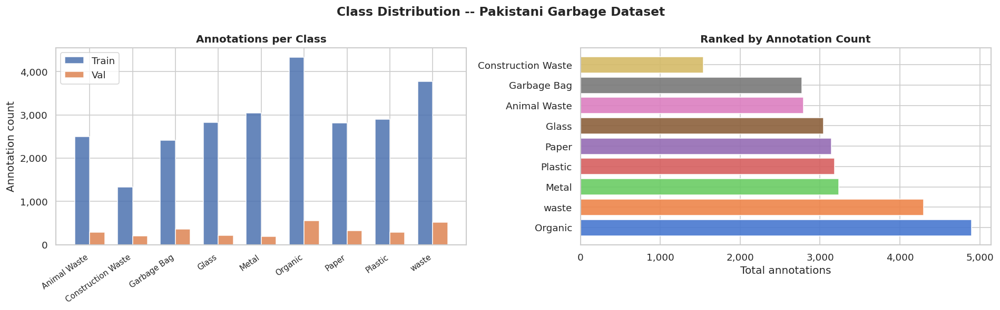


[OK] Chart saved: /kaggle/working/outputs/2026-03-28_16-07-23/class_distribution.png


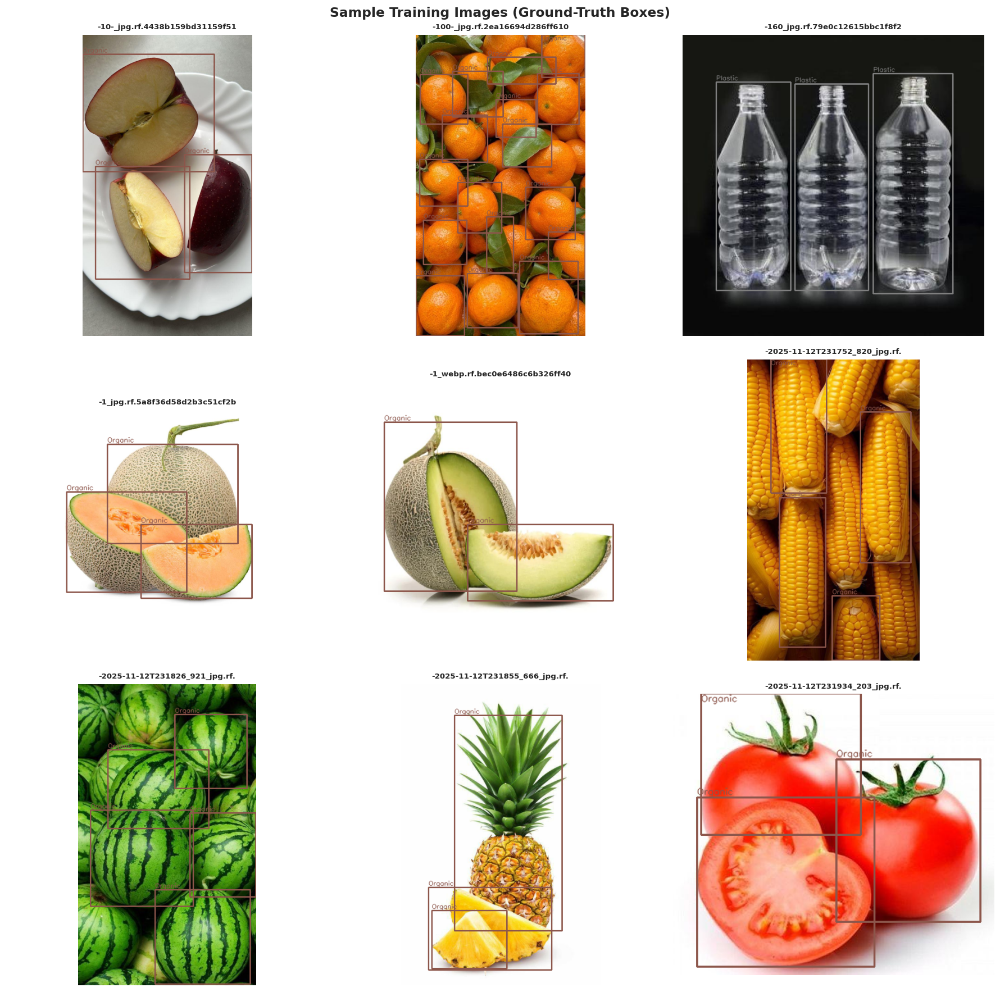

[2026-03-28 16:10:28] INFO     -- EDA complete.


[OK] Sample grid saved: /kaggle/working/outputs/2026-03-28_16-07-23/sample_images.png
[OK] Cell 8 done.


In [9]:
# ============================================================================
# CELL 8 -- EDA: Class Distribution + Sample Image Grid
# ============================================================================

def count_class_distribution(lbl_dir, num_classes):
    counts = np.zeros(num_classes, dtype=int)
    for lbl in lbl_dir.glob("*.txt"):
        try:
            for line in lbl.read_text().splitlines():
                parts = line.strip().split()
                if parts:
                    cls_id = int(parts[0])
                    if 0 <= cls_id < num_classes:
                        counts[cls_id] += 1
        except Exception:
            pass
    return counts

def draw_boxes_on_image(img_path, lbl_path, class_names, max_size=640):
    img = cv2.imread(str(img_path))
    if img is None:
        return np.zeros((320, 320, 3), dtype=np.uint8)
    h0, w0 = img.shape[:2]
    scale = min(max_size / max(h0, w0), 1.0)
    if scale < 1.0:
        img = cv2.resize(img, (int(w0 * scale), int(h0 * scale)),
                         interpolation=cv2.INTER_AREA)
    h, w = img.shape[:2]
    try:
        cmap = plt.colormaps["tab10"]
    except AttributeError:
        cmap = plt.cm.get_cmap("tab10")
    if lbl_path.exists():
        try:
            for line in lbl_path.read_text().splitlines():
                parts = line.strip().split()
                if len(parts) != 5:
                    continue
                cls_id = int(parts[0])
                cx, cy, bw, bh = map(float, parts[1:])
                x1 = max(0, int((cx - bw / 2) * w))
                y1 = max(0, int((cy - bh / 2) * h))
                x2 = min(w - 1, int((cx + bw / 2) * w))
                y2 = min(h - 1, int((cy + bh / 2) * h))
                color = tuple(int(c * 255) for c in cmap(cls_id % 10)[:3])[::-1]
                cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
                label = class_names[cls_id] if cls_id < len(class_names) else str(cls_id)
                cv2.putText(img, label, (x1, max(y1 - 4, 12)),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.45, color, 1, cv2.LINE_AA)
        except Exception as exc:
            log.debug("Box drawing error %s: %s", img_path.name, exc)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

if not RUN_EDA:
    print("[INFO] EDA skipped (RUN_EDA=False).")
else:
    train_dist = count_class_distribution(TRAIN_LABELS, CFG.num_classes)
    val_dist   = count_class_distribution(VAL_LABELS,   CFG.num_classes)

    print("Class Distribution")
    print("=" * 70)
    print(f"{'Class':<25} {'Train':>8} {'Val':>8} {'Total':>8} {'%':>9}")
    print("-" * 70)
    total_all = int(train_dist.sum() + val_dist.sum())
    for i, name in enumerate(CFG.class_names):
        t, v = int(train_dist[i]), int(val_dist[i])
        pct  = (t + v) / total_all * 100 if total_all else 0
        print(f"  {name:<23} {t:>8,} {v:>8,} {t+v:>8,} {pct:>8.1f}%")
    print("-" * 70)
    print(f"  {'TOTAL':<23} {int(train_dist.sum()):>8,} {int(val_dist.sum()):>8,}"
          f" {total_all:>8,} {'100.0%':>9}")

    imb = float(train_dist.max()) / max(float(train_dist.min()), 1)
    print(f"\nImbalance ratio: {imb:.1f}x  ", end="")
    if imb > 10:
        print("[WARN] High imbalance -- consider class weighting.")
    elif imb > 3:
        print("[INFO] Moderate imbalance -- monitor per-class AP.")
    else:
        print("[OK] Reasonably balanced.")

    # Bar chart
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
    fig.suptitle("Class Distribution -- Pakistani Garbage Dataset",
                 fontsize=14, fontweight="bold")
    x  = np.arange(CFG.num_classes)
    bw = 0.35
    ax1.bar(x - bw/2, train_dist, bw, label="Train", color="#4C72B0", alpha=0.85)
    ax1.bar(x + bw/2, val_dist,   bw, label="Val",   color="#DD8452", alpha=0.85)
    ax1.set_xticks(x)
    ax1.set_xticklabels(CFG.class_names, rotation=35, ha="right", fontsize=9)
    ax1.set_ylabel("Annotation count")
    ax1.set_title("Annotations per Class")
    ax1.legend()
    ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f"{int(v):,}"))
    total_pc = train_dist + val_dist
    sidx = np.argsort(total_pc)[::-1]
    ax2.barh([CFG.class_names[i] for i in sidx], total_pc[sidx],
             color=sns.color_palette("muted", CFG.num_classes), alpha=0.9)
    ax2.set_xlabel("Total annotations")
    ax2.set_title("Ranked by Annotation Count")
    ax2.xaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f"{int(v):,}"))
    plt.tight_layout()
    eda_path = OUTPUT_DIR / "class_distribution.png"
    plt.savefig(eda_path, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"\n[OK] Chart saved: {eda_path}")

    # Sample image grid
    all_imgs = sorted(f for f in TRAIN_IMAGES.glob("*") if f.suffix.lower() in IMG_EXTENSIONS)
    samples  = all_imgs[:9]
    if samples:
        n_cols = 3
        n_rows = (len(samples) + n_cols - 1) // n_cols
        fig2, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows), squeeze=False)
        fig2.suptitle("Sample Training Images (Ground-Truth Boxes)",
                      fontsize=14, fontweight="bold")
        for idx, ax in enumerate(axes.flat):
            if idx < len(samples):
                ip = samples[idx]
                lp = TRAIN_LABELS / (ip.stem + ".txt")
                try:
                    ax.imshow(draw_boxes_on_image(ip, lp, CFG.class_names))
                    ax.set_title(ip.name[:30], fontsize=8)
                except Exception as exc:
                    ax.set_title(f"Error: {ip.name[:20]}", fontsize=7)
            ax.axis("off")
        plt.tight_layout()
        samples_path = OUTPUT_DIR / "sample_images.png"
        plt.savefig(samples_path, bbox_inches="tight")
        plt.show()
        plt.close(fig2)
        print(f"[OK] Sample grid saved: {samples_path}")
    else:
        print("[WARN] No training images found -- skipping sample grid.")

    log.info("EDA complete.")
print("[OK] Cell 8 done.")


---
## 7 · Training <a id="training"></a>
### 7a — Generate `data.yaml`
Always writes **absolute paths** — never reads path values from the dataset's own `data.yaml`, which may use relative paths that break on copy.

In [10]:
# ============================================================================
# CELL 9 -- Generate data.yaml (Absolute Paths)
# ============================================================================
import yaml as _yaml

def generate_data_yaml(cfg, output_path):
    data = {
        "train": str(TRAIN_IMAGES.resolve()),
        "val":   str(VAL_IMAGES.resolve()),
        "test":  str(TEST_IMAGES.resolve()) if (TEST_IMAGES and TEST_IMAGES.exists())
                 else str(VAL_IMAGES.resolve()),
        "nc":    cfg.num_classes,
        "names": cfg.class_names,
    }
    with open(output_path, "w") as fh:
        _yaml.dump(data, fh, default_flow_style=False, allow_unicode=True)
    print(f"[OK] data.yaml -> {output_path}\n")
    with open(output_path) as fh:
        print(fh.read())
    # Pre-flight check
    ok = True
    for key in ("train", "val", "test"):
        p = Path(data[key])
        n = sum(1 for f in p.glob("*") if f.is_file()) if p.exists() else 0
        status = "[OK]" if p.exists() else "[MISSING]"
        if not p.exists():
            ok = False
        print(f"  {status} {key:<6}: {p}  [{n} files]")
    if not ok:
        raise FileNotFoundError("One or more split paths are missing. Re-run Cell 6.")
    return output_path

YAML_PATH = OUTPUT_DIR / "data.yaml"
yaml_path = generate_data_yaml(CFG, YAML_PATH)
log.info("data.yaml written: %s", yaml_path)


[2026-03-28 16:10:29] INFO     -- data.yaml written: /kaggle/working/outputs/2026-03-28_16-07-23/data.yaml


[OK] data.yaml -> /kaggle/working/outputs/2026-03-28_16-07-23/data.yaml

names:
- Animal Waste
- Construction Waste
- Garbage Bag
- Glass
- Metal
- Organic
- Paper
- Plastic
- waste
nc: 9
test: /kaggle/working/rf_dataset/test/images
train: /kaggle/working/rf_dataset/train/images
val: /kaggle/working/rf_dataset/valid/images

  [OK] train : /kaggle/working/rf_dataset/train/images  [8849 files]
  [OK] val   : /kaggle/working/rf_dataset/valid/images  [1155 files]
  [OK] test  : /kaggle/working/rf_dataset/test/images  [1226 files]


### 7b — YOLOv8 Training
Launches training with all hyperparameters from `CFG`. A per-epoch callback logs metrics to CSV. Resume mode is activated when `RESUME=True`.

In [11]:
# ============================================================================
# CELL 10 -- YOLOv8 Training
# ============================================================================
import csv as _csv

METRICS_CSV         = OUTPUT_DIR / "epoch_metrics.csv"
_csv_header_written = False
_csv_fieldnames     = None

def _on_fit_epoch_end(trainer):
    global _csv_header_written, _csv_fieldnames
    raw = trainer.metrics or {}
    epoch = trainer.epoch + 1
    row = {"epoch": epoch, "timestamp": datetime.now().isoformat(), **raw}
    with open(METRICS_CSV, "a", newline="") as f:
        if not _csv_header_written:
            _csv_fieldnames = list(row.keys())
            _csv.DictWriter(f, fieldnames=_csv_fieldnames).writeheader()
            _csv_header_written = True
        _csv.DictWriter(f, fieldnames=_csv_fieldnames,
                        extrasaction="ignore").writerow(row)
    if epoch == 1 or epoch % 5 == 0:
        log.info("Epoch %3d -- %s", epoch,
                 {k: f"{v:.4f}" for k, v in raw.items() if isinstance(v, float)})

# Save config snapshot
config_path = OUTPUT_DIR / "train_config.json"
with open(config_path, "w") as f:
    json.dump(asdict(CFG), f, indent=2)
print(f"[OK] Config saved: {config_path}")

weights = RESUME_WEIGHTS if (RESUME and RESUME_WEIGHTS) else CFG.model_name
print(f"[INFO] Weights: {weights}  |  Resume={RESUME}")

train_args = dict(
    data=str(yaml_path), epochs=CFG.epochs, imgsz=CFG.img_size,
    batch=CFG.batch_size, lr0=CFG.lr0, lrf=CFG.lrf, momentum=CFG.momentum,
    weight_decay=CFG.weight_decay, warmup_epochs=CFG.warmup_epochs,
    patience=CFG.patience, workers=CFG.workers, amp=CFG.amp, cos_lr=True,
    hsv_h=CFG.hsv_h, hsv_s=CFG.hsv_s, hsv_v=CFG.hsv_v,
    degrees=CFG.degrees, translate=CFG.translate, scale=CFG.scale,
    shear=CFG.shear, perspective=CFG.perspective, flipud=CFG.flipud,
    fliplr=CFG.fliplr, mosaic=CFG.mosaic, mixup=CFG.mixup,
    copy_paste=CFG.copy_paste,
    project=str(WORKING_DIR / "runs"), name=CFG.experiment_name,
    exist_ok=True, save=True, save_period=10, plots=True, verbose=True,
    device=0 if CUDA_AVAILABLE else "cpu", resume=RESUME, seed=SEED,
)

print("\n" + "=" * 70 + "\nSTARTING TRAINING\n" + "=" * 70)
print(f"  Model      : {weights}")
print(f"  Epochs     : {CFG.epochs}  (patience={CFG.patience})")
print(f"  Batch      : {CFG.batch_size}  |  imgsz={CFG.img_size}px")
print(f"  AMP        : {CFG.amp}  |  Device: {GPU_NAME if CUDA_AVAILABLE else 'CPU'}")
print("=" * 70)

model = YOLO(weights)
model.add_callback("on_fit_epoch_end", _on_fit_epoch_end)

t_start = time.time()
try:
    train_results = model.train(**train_args)
    elapsed = (time.time() - t_start) / 60
    log.info("Training complete in %.1f min.", elapsed)
    print(f"\n[OK] Training finished in {elapsed:.1f} min.")
    RUNS_DIR = Path(train_results.save_dir)
    print(f"[OK] Results directory: {RUNS_DIR}")
except Exception as exc:
    log.exception("Training failed: %s", exc)
    raise


[OK] Config saved: /kaggle/working/outputs/2026-03-28_16-07-23/train_config.json
[INFO] Weights: yolov8x.pt  |  Resume=False

STARTING TRAINING
  Model      : yolov8x.pt
  Epochs     : 130  (patience=30)
  Batch      : 32  |  imgsz=640px
  AMP        : True  |  Device: Tesla P100-PCIE-16GB


Ultralytics 8.4.30 🚀 Python-3.12.12 torch-2.3.1+cu118 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)


engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/outputs/2026-03-28_16-07-23/data.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=130, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8x.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8m_garbage_v1, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=30, perspective=0.0, plots=True, pose=12.0, pretrained=True, prof

Overriding model.yaml nc=80 with nc=9



                   from  n    params  module                                       arguments                     


  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 


  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               


  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           


  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              


  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320, 6, True]           


  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              


  6                  -1  6  13117440  ultralytics.nn.modules.block.C2f             [640, 640, 6, True]           


  7                  -1  1   3687680  ultralytics.nn.modules.conv.Conv             [640, 640, 3, 2]              


  8                  -1  3   6969600  ultralytics.nn.modules.block.C2f             [640, 640, 3, True]           


  9                  -1  1   1025920  ultralytics.nn.modules.block.SPPF            [640, 640, 5]                 


 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 12                  -1  3   7379200  ultralytics.nn.modules.block.C2f             [1280, 640, 3]                


 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          


 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 15                  -1  3   1948800  ultralytics.nn.modules.block.C2f             [960, 320, 3]                 


 16                  -1  1    922240  ultralytics.nn.modules.conv.Conv             [320, 320, 3, 2]              


 17            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 18                  -1  3   7174400  ultralytics.nn.modules.block.C2f             [960, 640, 3]                 


 19                  -1  1   3687680  ultralytics.nn.modules.conv.Conv             [640, 640, 3, 2]              


 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           


 21                  -1  3   7379200  ultralytics.nn.modules.block.C2f             [1280, 640, 3]                


 22        [15, 18, 21]  1   8726635  ultralytics.nn.modules.head.Detect           [9, 16, None, [320, 640, 640]]


Model summary: 210 layers, 68,161,275 parameters, 68,161,259 gradients, 258.2 GFLOPs


Transferred 589/595 items from pretrained weights


Freezing layer 'model.22.dfl.conv.weight'


AMP: running Automatic Mixed Precision (AMP) checks...


AMP: checks passed ✅


train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1310.2±1340.3 MB/s, size: 357.6 KB)


train: Scanning /kaggle/working/rf_dataset/train/labels... 118 images, 0 backgrounds, 0 corrupt: 1% ──────────── 118/8849 345.5it/s 0.1s<25.3s

train: Scanning /kaggle/working/rf_dataset/train/labels... 211 images, 0 backgrounds, 0 corrupt: 2% ──────────── 211/8849 520.3it/s 0.2s<16.6s

train: Scanning /kaggle/working/rf_dataset/train/labels... 314 images, 0 backgrounds, 0 corrupt: 4% ──────────── 314/8849 669.5it/s 0.3s<12.7s

train: Scanning /kaggle/working/rf_dataset/train/labels... 400 images, 0 backgrounds, 0 corrupt: 5% ╸─────────── 400/8849 725.9it/s 0.4s<11.6s

train: Scanning /kaggle/working/rf_dataset/train/labels... 511 images, 0 backgrounds, 0 corrupt: 6% ╸─────────── 511/8849 839.7it/s 0.5s<9.9s

train: Scanning /kaggle/working/rf_dataset/train/labels... 672 images, 0 backgrounds, 0 corrupt: 8% ╸─────────── 672/8849 1.1Kit/s 0.6s<7.7s

train: Scanning /kaggle/working/rf_dataset/train/labels... 835 images, 0 backgrounds, 0 corrupt: 9% ━─────────── 835/8849 1.2Kit/s 0.7s<6.5s

train: Scanning /kaggle/working/rf_dataset/train/labels... 995 images, 0 backgrounds, 0 corrupt: 11% ━─────────── 995/8849 1.3Kit/s 0.8s<5.9s

train: Scanning /kaggle/working/rf_dataset/train/labels... 1146 images, 0 backgrounds, 0 corrupt: 13% ━╸────────── 1146/8849 1.4Kit/s 0.9s<5.5s

train: Scanning /kaggle/working/rf_dataset/train/labels... 1295 images, 0 backgrounds, 0 corrupt: 15% ━╸────────── 1295/8849 1.4Kit/s 1.0s<5.3s

train: Scanning /kaggle/working/rf_dataset/train/labels... 1451 images, 0 backgrounds, 0 corrupt: 16% ━╸────────── 1451/8849 1.5Kit/s 1.1s<5.1s

train: Scanning /kaggle/working/rf_dataset/train/labels... 1561 images, 0 backgrounds, 0 corrupt: 18% ━━────────── 1561/8849 1.3Kit/s 1.2s<5.4s

train: Scanning /kaggle/working/rf_dataset/train/labels... 1713 images, 0 backgrounds, 0 corrupt: 19% ━━────────── 1713/8849 1.4Kit/s 1.3s<5.1s

train: Scanning /kaggle/working/rf_dataset/train/labels... 1865 images, 4 backgrounds, 0 corrupt: 21% ━━╸───────── 1865/8849 1.4Kit/s 1.4s<4.9s

train: Scanning /kaggle/working/rf_dataset/train/labels... 2029 images, 4 backgrounds, 0 corrupt: 23% ━━╸───────── 2029/8849 1.5Kit/s 1.5s<4.6s

train: Scanning /kaggle/working/rf_dataset/train/labels... 2167 images, 4 backgrounds, 0 corrupt: 24% ━━╸───────── 2167/8849 1.5Kit/s 1.6s<4.6s

train: Scanning /kaggle/working/rf_dataset/train/labels... 2317 images, 4 backgrounds, 0 corrupt: 26% ━━━───────── 2317/8849 1.5Kit/s 1.7s<4.4s

train: Scanning /kaggle/working/rf_dataset/train/labels... 2470 images, 4 backgrounds, 0 corrupt: 28% ━━━───────── 2470/8849 1.5Kit/s 1.8s<4.3s

train: Scanning /kaggle/working/rf_dataset/train/labels... 2620 images, 4 backgrounds, 0 corrupt: 30% ━━━╸──────── 2620/8849 1.5Kit/s 1.9s<4.2s

train: Scanning /kaggle/working/rf_dataset/train/labels... 2773 images, 5 backgrounds, 0 corrupt: 31% ━━━╸──────── 2773/8849 1.5Kit/s 2.0s<4.1s

train: Scanning /kaggle/working/rf_dataset/train/labels... 2928 images, 9 backgrounds, 0 corrupt: 33% ━━━╸──────── 2928/8849 1.5Kit/s 2.1s<3.9s

train: Scanning /kaggle/working/rf_dataset/train/labels... 3080 images, 9 backgrounds, 0 corrupt: 35% ━━━━──────── 3080/8849 1.5Kit/s 2.2s<3.8s

train: Scanning /kaggle/working/rf_dataset/train/labels... 3240 images, 9 backgrounds, 0 corrupt: 37% ━━━━──────── 3240/8849 1.5Kit/s 2.3s<3.7s

train: Scanning /kaggle/working/rf_dataset/train/labels... 3404 images, 9 backgrounds, 0 corrupt: 38% ━━━━╸─────── 3404/8849 1.6Kit/s 2.4s<3.5s

train: Scanning /kaggle/working/rf_dataset/train/labels... 3568 images, 9 backgrounds, 0 corrupt: 40% ━━━━╸─────── 3568/8849 1.6Kit/s 2.5s<3.3s

train: Scanning /kaggle/working/rf_dataset/train/labels... 3723 images, 9 backgrounds, 0 corrupt: 42% ━━━━━─────── 3723/8849 1.6Kit/s 2.6s<3.3s

train: Scanning /kaggle/working/rf_dataset/train/labels... 3826 images, 9 backgrounds, 0 corrupt: 43% ━━━━━─────── 3826/8849 1.4Kit/s 2.7s<3.6s

train: Scanning /kaggle/working/rf_dataset/train/labels... 3978 images, 9 backgrounds, 0 corrupt: 45% ━━━━━─────── 3978/8849 1.4Kit/s 2.8s<3.4s

train: Scanning /kaggle/working/rf_dataset/train/labels... 4136 images, 9 backgrounds, 0 corrupt: 47% ━━━━━╸────── 4136/8849 1.5Kit/s 2.9s<3.2s

train: Scanning /kaggle/working/rf_dataset/train/labels... 4295 images, 9 backgrounds, 0 corrupt: 49% ━━━━━╸────── 4295/8849 1.5Kit/s 3.0s<3.0s

train: Scanning /kaggle/working/rf_dataset/train/labels... 4450 images, 9 backgrounds, 0 corrupt: 50% ━━━━━━────── 4450/8849 1.5Kit/s 3.1s<2.9s

train: Scanning /kaggle/working/rf_dataset/train/labels... 4613 images, 9 backgrounds, 0 corrupt: 52% ━━━━━━────── 4613/8849 1.6Kit/s 3.2s<2.7s

train: Scanning /kaggle/working/rf_dataset/train/labels... 4768 images, 9 backgrounds, 0 corrupt: 54% ━━━━━━────── 4768/8849 1.5Kit/s 3.3s<2.6s

train: Scanning /kaggle/working/rf_dataset/train/labels... 4924 images, 9 backgrounds, 0 corrupt: 56% ━━━━━━╸───── 4924/8849 1.6Kit/s 3.4s<2.5s

train: Scanning /kaggle/working/rf_dataset/train/labels... 5088 images, 9 backgrounds, 0 corrupt: 57% ━━━━━━╸───── 5088/8849 1.6Kit/s 3.5s<2.4s

train: Scanning /kaggle/working/rf_dataset/train/labels... 5226 images, 9 backgrounds, 0 corrupt: 59% ━━━━━━━───── 5226/8849 1.5Kit/s 3.6s<2.4s

train: Scanning /kaggle/working/rf_dataset/train/labels... 5373 images, 13 backgrounds, 0 corrupt: 61% ━━━━━━━───── 5373/8849 1.5Kit/s 3.7s<2.3s

train: Scanning /kaggle/working/rf_dataset/train/labels... 5526 images, 13 backgrounds, 0 corrupt: 62% ━━━━━━━───── 5526/8849 1.5Kit/s 3.8s<2.2s

train: Scanning /kaggle/working/rf_dataset/train/labels... 5680 images, 13 backgrounds, 0 corrupt: 64% ━━━━━━━╸──── 5680/8849 1.5Kit/s 3.9s<2.1s

train: Scanning /kaggle/working/rf_dataset/train/labels... 5818 images, 13 backgrounds, 0 corrupt: 66% ━━━━━━━╸──── 5818/8849 1.5Kit/s 4.0s<2.1s

train: Scanning /kaggle/working/rf_dataset/train/labels... 5939 images, 13 backgrounds, 0 corrupt: 67% ━━━━━━━━──── 5939/8849 1.4Kit/s 4.1s<2.1s

train: Scanning /kaggle/working/rf_dataset/train/labels... 6066 images, 13 backgrounds, 0 corrupt: 69% ━━━━━━━━──── 6066/8849 1.3Kit/s 4.2s<2.1s

train: Scanning /kaggle/working/rf_dataset/train/labels... 6210 images, 13 backgrounds, 0 corrupt: 70% ━━━━━━━━──── 6210/8849 1.4Kit/s 4.3s<1.9s

train: Scanning /kaggle/working/rf_dataset/train/labels... 6366 images, 14 backgrounds, 0 corrupt: 72% ━━━━━━━━╸─── 6366/8849 1.4Kit/s 4.4s<1.7s

train: Scanning /kaggle/working/rf_dataset/train/labels... 6521 images, 14 backgrounds, 0 corrupt: 74% ━━━━━━━━╸─── 6521/8849 1.5Kit/s 4.5s<1.6s

train: Scanning /kaggle/working/rf_dataset/train/labels... 6681 images, 14 backgrounds, 0 corrupt: 76% ━━━━━━━━━─── 6681/8849 1.5Kit/s 4.6s<1.4s

train: Scanning /kaggle/working/rf_dataset/train/labels... 6822 images, 14 backgrounds, 0 corrupt: 77% ━━━━━━━━━─── 6822/8849 1.5Kit/s 4.7s<1.4s

train: Scanning /kaggle/working/rf_dataset/train/labels... 6962 images, 14 backgrounds, 0 corrupt: 79% ━━━━━━━━━─── 6962/8849 1.4Kit/s 4.8s<1.3s

train: Scanning /kaggle/working/rf_dataset/train/labels... 7102 images, 14 backgrounds, 0 corrupt: 80% ━━━━━━━━━╸── 7102/8849 1.4Kit/s 4.9s<1.2s

train: Scanning /kaggle/working/rf_dataset/train/labels... 7238 images, 14 backgrounds, 0 corrupt: 82% ━━━━━━━━━╸── 7238/8849 1.4Kit/s 5.0s<1.1s

train: Scanning /kaggle/working/rf_dataset/train/labels... 7373 images, 14 backgrounds, 0 corrupt: 83% ━━━━━━━━━╸── 7373/8849 1.4Kit/s 5.1s<1.1s

train: Scanning /kaggle/working/rf_dataset/train/labels... 7515 images, 14 backgrounds, 0 corrupt: 85% ━━━━━━━━━━── 7515/8849 1.4Kit/s 5.2s<1.0s

train: Scanning /kaggle/working/rf_dataset/train/labels... 7679 images, 14 backgrounds, 0 corrupt: 87% ━━━━━━━━━━── 7679/8849 1.5Kit/s 5.3s<0.8s

train: Scanning /kaggle/working/rf_dataset/train/labels... 7828 images, 14 backgrounds, 0 corrupt: 88% ━━━━━━━━━━╸─ 7828/8849 1.5Kit/s 5.4s<0.7s

train: Scanning /kaggle/working/rf_dataset/train/labels... 7939 images, 14 backgrounds, 0 corrupt: 90% ━━━━━━━━━━╸─ 7939/8849 1.4Kit/s 5.5s<0.7s

train: Scanning /kaggle/working/rf_dataset/train/labels... 8050 images, 14 backgrounds, 0 corrupt: 91% ━━━━━━━━━━╸─ 8050/8849 1.3Kit/s 5.6s<0.6s

train: Scanning /kaggle/working/rf_dataset/train/labels... 8203 images, 14 backgrounds, 0 corrupt: 93% ━━━━━━━━━━━─ 8203/8849 1.4Kit/s 5.7s<0.5s

train: Scanning /kaggle/working/rf_dataset/train/labels... 8358 images, 15 backgrounds, 0 corrupt: 94% ━━━━━━━━━━━─ 8358/8849 1.4Kit/s 5.8s<0.3s

train: Scanning /kaggle/working/rf_dataset/train/labels... 8512 images, 15 backgrounds, 0 corrupt: 96% ━━━━━━━━━━━╸ 8512/8849 1.4Kit/s 5.9s<0.2s

train: Scanning /kaggle/working/rf_dataset/train/labels... 8664 images, 15 backgrounds, 0 corrupt: 98% ━━━━━━━━━━━╸ 8664/8849 1.5Kit/s 6.0s<0.1s

train: Scanning /kaggle/working/rf_dataset/train/labels... 8813 images, 15 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━╸ 8813/8849 1.5Kit/s 6.1s<0.0s

train: Scanning /kaggle/working/rf_dataset/train/labels... 8849 images, 15 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 8849/8849 1.4Kit/s 6.2s

train: /kaggle/working/rf_dataset/train/images/00000457_jpg.rf.ec361be8cdd0cbc7d23198febc866470.jpg: 1 duplicate labels removed
train: /kaggle/working/rf_dataset/train/images/00000729_jpg.rf.a16af22615a97d066ff646322c72967b.jpg: 1 duplicate labels removed
train: /kaggle/working/rf_dataset/train/images/00002218_jpg.rf.b75297dda7134a79baeeb030236e8ebf.jpg: 1 duplicate labels removed
train: /kaggle/working/rf_dataset/train/images/00002279_jpg.rf.2a719ef49ffff474336e927c1af9b3ac.jpg: 1 duplicate labels removed
train: /kaggle/working/rf_dataset/train/images/00003717_jpg.rf.afede3233edf77782afb837faadceb1f.jpg: 1 duplicate labels removed
train: /kaggle/working/rf_dataset/train/images/00004480_jpg.rf.70fcca790880245afd47d802f7f288c4.jpg: 1 duplicate labels removed
train: /kaggle/working/rf_dataset/train/images/imageye___-_imgi_156_broken-glass-cup-in-half-on-white-background-2C6WK85-Copy-Copy-Copy_jpg.rf.0b4afd90e991e295f3c65dda9852c0ae.jpg: 1 duplicate labels removed
train: /kaggle/working/r

train: New cache created: /kaggle/working/rf_dataset/train/labels.cache


WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 5486, len(boxes) = 25932. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 477.7±395.9 MB/s, size: 494.2 KB)


val: Scanning /kaggle/working/rf_dataset/valid/labels... 40 images, 0 backgrounds, 0 corrupt: 3% ──────────── 40/1155 119.0it/s 0.1s<9.4s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 89 images, 0 backgrounds, 0 corrupt: 8% ╸─────────── 89/1155 226.8it/s 0.2s<4.7s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 184 images, 0 backgrounds, 0 corrupt: 16% ━╸────────── 184/1155 430.2it/s 0.3s<2.3s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 241 images, 0 backgrounds, 0 corrupt: 21% ━━╸───────── 241/1155 469.1it/s 0.4s<1.9s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 293 images, 0 backgrounds, 0 corrupt: 25% ━━━───────── 293/1155 482.9it/s 0.5s<1.8s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 371 images, 0 backgrounds, 0 corrupt: 32% ━━━╸──────── 371/1155 567.5it/s 0.6s<1.4s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 437 images, 0 backgrounds, 0 corrupt: 38% ━━━━╸─────── 437/1155 589.9it/s 0.7s<1.2s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 503 images, 0 backgrounds, 0 corrupt: 44% ━━━━━─────── 503/1155 607.4it/s 0.8s<1.1s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 570 images, 0 backgrounds, 0 corrupt: 49% ━━━━━╸────── 570/1155 589.8it/s 0.9s<1.0s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 785 images, 0 backgrounds, 0 corrupt: 68% ━━━━━━━━──── 785/1155 1.1Kit/s 1.0s<0.4s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 840 images, 0 backgrounds, 0 corrupt: 73% ━━━━━━━━╸─── 840/1155 898.5it/s 1.1s<0.4s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 904 images, 0 backgrounds, 0 corrupt: 78% ━━━━━━━━━─── 904/1155 818.8it/s 1.2s<0.3s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 995 images, 0 backgrounds, 0 corrupt: 86% ━━━━━━━━━━── 995/1155 846.0it/s 1.3s<0.2s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 1053 images, 0 backgrounds, 0 corrupt: 91% ━━━━━━━━━━╸─ 1053/1155 764.8it/s 1.4s<0.1s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 1126 images, 0 backgrounds, 0 corrupt: 97% ━━━━━━━━━━━╸ 1126/1155 746.7it/s 1.5s<0.0s

val: Scanning /kaggle/working/rf_dataset/valid/labels... 1155 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1155/1155 723.5it/s 1.6s

val: /kaggle/working/rf_dataset/valid/images/glass_1864_jpg.rf.57425bf9508f9d563218c290cb05b2c7.jpg: 1 duplicate labels removed
val: /kaggle/working/rf_dataset/valid/images/paper_664_jpg.rf.e2b91ea6fa4c9d5f8ded8e994e5ab4e7.jpg: 1 duplicate labels removed


val: New cache created: /kaggle/working/rf_dataset/valid/labels.cache


WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 585, len(boxes) = 2941. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 


optimizer: MuSGD(lr=0.01, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)


Plotting labels to /kaggle/working/runs/yolov8m_garbage_v1/labels.jpg... 


Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /kaggle/working/runs/yolov8m_garbage_v1
Starting training for 130 epochs...



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


WARNING ⚠️ CUDA out of memory with batch=32. Reducing to batch=16 and retrying (1/3).


train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 516.2±277.3 MB/s, size: 559.1 KB)


train: Scanning /kaggle/working/rf_dataset/train/labels.cache... 8849 images, 15 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 8849/8849 2.2Git/s 0.0s

train: /kaggle/working/rf_dataset/train/images/00000457_jpg.rf.ec361be8cdd0cbc7d23198febc866470.jpg: 1 duplicate labels removed
train: /kaggle/working/rf_dataset/train/images/00000729_jpg.rf.a16af22615a97d066ff646322c72967b.jpg: 1 duplicate labels removed
train: /kaggle/working/rf_dataset/train/images/00002218_jpg.rf.b75297dda7134a79baeeb030236e8ebf.jpg: 1 duplicate labels removed
train: /kaggle/working/rf_dataset/train/images/00002279_jpg.rf.2a719ef49ffff474336e927c1af9b3ac.jpg: 1 duplicate labels removed
train: /kaggle/working/rf_dataset/train/images/00003717_jpg.rf.afede3233edf77782afb837faadceb1f.jpg: 1 duplicate labels removed
train: /kaggle/working/rf_dataset/train/images/00004480_jpg.rf.70fcca790880245afd47d802f7f288c4.jpg: 1 duplicate labels removed
train: /kaggle/working/rf_dataset/train/images/imageye___-_imgi_156_broken-glass-cup-in-half-on-white-background-2C6WK85-Copy-Copy-Copy_jpg.rf.0b4afd90e991e295f3c65dda9852c0ae.jpg: 1 duplicate labels removed
train: /kaggle/working/r

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 5486, len(boxes) = 25932. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.5±1.1 ms, read: 258.1±171.1 MB/s, size: 538.1 KB)


val: Scanning /kaggle/working/rf_dataset/valid/labels.cache... 1155 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1155/1155 20.3Mit/s 0.0s

val: /kaggle/working/rf_dataset/valid/images/glass_1864_jpg.rf.57425bf9508f9d563218c290cb05b2c7.jpg: 1 duplicate labels removed
val: /kaggle/working/rf_dataset/valid/images/paper_664_jpg.rf.e2b91ea6fa4c9d5f8ded8e994e5ab4e7.jpg: 1 duplicate labels removed


WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 585, len(boxes) = 2941. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 


optimizer: MuSGD(lr=0.01, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)


: 0% ──────────── 0/277  4.1s


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/130      9.83G      1.543      4.058      2.111         55        640: 0% ──────────── 0/554  4.1s

      1/130      15.1G      1.634      4.196      2.106         74        640: 0% ──────────── 1/554 6.4s/it 6.0s<59:11

      1/130      15.1G      1.759      4.296      2.183         86        640: 0% ──────────── 2/554 3.8s/it 7.9s<34:41

      1/130      15.1G       1.65      4.321      2.099         61        640: 1% ──────────── 3/554 2.7s/it 9.5s<24:44

      1/130      15.1G      1.635      4.237      2.108         53        640: 1% ──────────── 4/554 2.2s/it 11.1s<20:26

      1/130      15.1G      1.605      4.237       2.06         73        640: 1% ──────────── 5/554 2.0s/it 12.6s<17:55

      1/130      15.1G      1.686      4.256      2.102        112        640: 1% ──────────── 6/554 1.9s/it 14.5s<17:35

      1/130      15.1G      1.675      4.266      2.047        216        640: 1% ──────────── 7/554 1.9s/it 16.3s<17:20

      1/130      15.1G      1.647      4.253      2.041         57        640: 1% ──────────── 8/554 1.9s/it 18.2s<17:06

      1/130      15.1G      1.644      4.264      2.034         98        640: 2% ──────────── 9/554 1.8s/it 19.7s<15:57

      1/130      15.1G      1.624      4.267      2.019         62        640: 2% ──────────── 10/554 1.8s/it 21.5s<16:12

      1/130      15.1G      1.633       4.25      2.032         72        640: 2% ──────────── 11/554 1.8s/it 23.4s<16:17

      1/130      15.1G       1.62      4.232      2.024         77        640: 2% ──────────── 12/554 1.8s/it 25.2s<16:21

      1/130      15.1G      1.613      4.242      2.008         95        640: 2% ──────────── 13/554 1.8s/it 27.1s<16:24

      1/130      15.1G      1.637      4.243      2.034         70        640: 3% ──────────── 14/554 1.8s/it 28.9s<16:24

      1/130      15.1G      1.647      4.238      2.042        107        640: 3% ──────────── 15/554 1.8s/it 30.7s<16:25

      1/130      15.1G      1.635      4.235       2.03         67        640: 3% ──────────── 16/554 1.8s/it 32.6s<16:24

      1/130      15.1G      1.627      4.225      2.025         95        640: 3% ──────────── 17/554 1.8s/it 34.4s<16:23

      1/130      15.1G      1.615      4.227      2.016         60        640: 3% ──────────── 18/554 1.8s/it 36.2s<16:21

      1/130      15.1G       1.61      4.217       2.02         75        640: 3% ──────────── 19/554 1.8s/it 38.0s<16:19

      1/130      15.1G      1.601      4.207      2.022         51        640: 4% ──────────── 20/554 1.8s/it 39.9s<16:18

      1/130      15.1G      1.593      4.204      2.009         78        640: 4% ──────────── 21/554 1.8s/it 41.7s<16:17

      1/130      15.1G      1.612      4.193      2.024        156        640: 4% ──────────── 22/554 1.8s/it 43.6s<16:17

      1/130      15.1G      1.613      4.195      2.021        137        640: 4% ──────────── 23/554 1.8s/it 45.4s<16:15

      1/130      15.1G      1.618      4.187      2.021        139        640: 4% ╸─────────── 24/554 1.8s/it 47.2s<16:13

      1/130      15.1G      1.619       4.18      2.025        101        640: 5% ╸─────────── 25/554 1.8s/it 49.1s<16:11

      1/130      15.1G      1.625      4.175      2.031         89        640: 5% ╸─────────── 26/554 1.8s/it 50.9s<16:09

      1/130      15.1G      1.627      4.179      2.019        253        640: 5% ╸─────────── 27/554 1.8s/it 52.7s<16:09

      1/130      15.1G      1.618      4.162      2.014         70        640: 5% ╸─────────── 28/554 1.8s/it 54.6s<16:06

      1/130      15.1G       1.62      4.155      2.015         65        640: 5% ╸─────────── 29/554 1.8s/it 56.4s<16:04

      1/130      15.1G      1.616      4.155      2.014         59        640: 5% ╸─────────── 30/554 1.8s/it 58.3s<16:02

      1/130      15.1G       1.62      4.151      2.013        110        640: 6% ╸─────────── 31/554 1.8s/it 1:00<16:02

      1/130      15.1G      1.625      4.139      2.016        125        640: 6% ╸─────────── 32/554 1.8s/it 1:02<15:59

      1/130      15.1G      1.624      4.126      2.016         89        640: 6% ╸─────────── 33/554 1.8s/it 1:04<15:57

      1/130      15.1G      1.618      4.113      2.014         62        640: 6% ╸─────────── 34/554 1.8s/it 1:06<15:54

      1/130      15.1G      1.611      4.103      2.004        123        640: 6% ╸─────────── 35/554 1.8s/it 1:07<15:53

      1/130      15.1G      1.611      4.092      2.005         82        640: 6% ╸─────────── 36/554 1.8s/it 1:09<15:50

      1/130      15.1G      1.608      4.077      2.009         63        640: 7% ╸─────────── 37/554 1.8s/it 1:11<15:48

      1/130      15.1G      1.608      4.059      2.009        159        640: 7% ╸─────────── 38/554 1.8s/it 1:13<15:48

      1/130      15.1G      1.599      4.046          2         71        640: 7% ╸─────────── 39/554 1.8s/it 1:15<15:47

      1/130      15.1G        1.6       4.04      2.002         68        640: 7% ╸─────────── 40/554 1.8s/it 1:17<15:44

      1/130      15.1G      1.597      4.029      1.999        111        640: 7% ╸─────────── 41/554 1.8s/it 1:18<15:41

      1/130      15.1G        1.6      4.018          2         77        640: 8% ╸─────────── 42/554 1.8s/it 1:20<15:40

      1/130      15.1G      1.597       4.01      1.996        112        640: 8% ╸─────────── 43/554 1.8s/it 1:22<15:38

      1/130      15.1G      1.597      4.004      1.998         68        640: 8% ╸─────────── 44/554 1.8s/it 1:24<15:35

      1/130      15.1G      1.596       3.99      1.997         96        640: 8% ╸─────────── 45/554 1.8s/it 1:26<15:33

      1/130      15.1G      1.593      3.981      1.996         51        640: 8% ╸─────────── 46/554 1.8s/it 1:28<15:31

      1/130      15.1G      1.589      3.966      1.996         71        640: 8% ━─────────── 47/554 1.8s/it 1:29<15:30

      1/130      15.1G      1.587      3.956      1.995        105        640: 9% ━─────────── 48/554 1.8s/it 1:31<15:28

      1/130      15.1G      1.583      3.948      1.991        121        640: 9% ━─────────── 49/554 1.8s/it 1:33<15:28

      1/130      15.1G      1.589      3.937      1.993        154        640: 9% ━─────────── 50/554 1.8s/it 1:35<15:27

      1/130      15.1G      1.588      3.925       1.99         90        640: 9% ━─────────── 51/554 1.8s/it 1:37<15:24

      1/130      15.1G      1.583      3.915      1.987         84        640: 9% ━─────────── 52/554 1.8s/it 1:39<15:22

      1/130      15.1G      1.577      3.902      1.984         77        640: 10% ━─────────── 53/554 1.8s/it 1:40<15:19

      1/130      15.1G      1.576      3.892      1.983         81        640: 10% ━─────────── 54/554 1.8s/it 1:42<15:17

      1/130      15.1G      1.574      3.888      1.983         64        640: 10% ━─────────── 55/554 1.8s/it 1:44<15:15

      1/130      15.1G      1.573      3.881      1.983         53        640: 10% ━─────────── 56/554 1.8s/it 1:46<15:13

      1/130      15.1G      1.576      3.877      1.983        107        640: 10% ━─────────── 57/554 1.8s/it 1:48<15:12

      1/130      15.1G      1.575      3.865      1.984         72        640: 10% ━─────────── 58/554 1.8s/it 1:50<15:10

      1/130      15.1G       1.57      3.854      1.979         65        640: 11% ━─────────── 59/554 1.8s/it 1:51<15:07

      1/130      15.1G      1.567      3.843      1.975         78        640: 11% ━─────────── 60/554 1.8s/it 1:53<15:06

      1/130      15.1G       1.57      3.835      1.976        111        640: 11% ━─────────── 61/554 1.8s/it 1:55<15:04

      1/130      15.1G      1.565       3.82      1.973         78        640: 11% ━─────────── 62/554 1.8s/it 1:57<15:03

      1/130      15.1G      1.559      3.803      1.967         93        640: 11% ━─────────── 63/554 1.8s/it 1:59<15:01

      1/130      15.1G      1.555      3.795      1.963         65        640: 12% ━─────────── 64/554 1.8s/it 2:01<15:03

      1/130      15.1G      1.553      3.786       1.96        143        640: 12% ━─────────── 65/554 1.8s/it 2:03<14:60

      1/130      15.1G      1.553      3.782      1.957         85        640: 12% ━─────────── 66/554 1.8s/it 2:04<14:57

      1/130      15.1G      1.553       3.78      1.955         85        640: 12% ━─────────── 67/554 1.8s/it 2:06<14:54

      1/130      15.1G      1.552      3.766      1.954        152        640: 12% ━─────────── 68/554 1.8s/it 2:08<14:53

      1/130      15.1G      1.552      3.755      1.951        169        640: 12% ━─────────── 69/554 1.8s/it 2:10<14:53

      1/130      15.1G       1.55      3.739       1.95        108        640: 13% ━╸────────── 70/554 1.8s/it 2:12<14:50

      1/130      15.1G      1.545      3.726      1.946         57        640: 13% ━╸────────── 71/554 1.8s/it 2:14<14:47

      1/130      15.1G       1.54      3.712      1.943         63        640: 13% ━╸────────── 72/554 1.8s/it 2:15<14:45

      1/130      15.1G      1.545      3.702      1.946        108        640: 13% ━╸────────── 73/554 1.8s/it 2:17<14:44

      1/130      15.1G      1.543      3.692      1.945         82        640: 13% ━╸────────── 74/554 1.8s/it 2:19<14:41

      1/130      15.1G      1.545      3.681      1.944        128        640: 14% ━╸────────── 75/554 1.8s/it 2:21<14:40

      1/130      15.1G      1.541      3.662      1.942         76        640: 14% ━╸────────── 76/554 1.8s/it 2:23<14:37

      1/130      15.1G      1.538      3.652      1.939         62        640: 14% ━╸────────── 77/554 1.8s/it 2:25<14:34

      1/130      15.1G      1.534      3.644      1.934         67        640: 14% ━╸────────── 78/554 1.8s/it 2:26<14:33

      1/130      15.1G      1.533      3.631      1.933         92        640: 14% ━╸────────── 79/554 1.8s/it 2:28<14:31

      1/130      15.1G      1.531      3.618      1.932         94        640: 14% ━╸────────── 80/554 1.8s/it 2:30<14:31

      1/130      15.1G       1.53       3.61       1.93         62        640: 15% ━╸────────── 81/554 1.8s/it 2:32<14:29

      1/130      15.1G      1.528        3.6      1.927         94        640: 15% ━╸────────── 82/554 1.8s/it 2:34<14:26

      1/130      15.1G      1.525      3.588      1.924         75        640: 15% ━╸────────── 83/554 1.8s/it 2:36<14:25

      1/130      15.1G      1.521      3.576      1.922         87        640: 15% ━╸────────── 84/554 1.8s/it 2:37<14:23

      1/130      15.1G      1.523      3.569      1.922        151        640: 15% ━╸────────── 85/554 1.8s/it 2:39<14:22

      1/130      15.1G      1.524      3.559      1.922         75        640: 16% ━╸────────── 86/554 1.8s/it 2:41<14:19

      1/130      15.1G      1.522      3.548      1.921         75        640: 16% ━╸────────── 87/554 1.8s/it 2:43<14:17

      1/130      15.1G      1.519      3.537      1.919         66        640: 16% ━╸────────── 88/554 1.8s/it 2:45<14:14

      1/130      15.1G      1.515      3.524      1.915         54        640: 16% ━╸────────── 89/554 1.8s/it 2:47<14:12

      1/130      15.1G      1.511      3.509      1.911         72        640: 16% ━╸────────── 90/554 1.8s/it 2:48<14:10

      1/130      15.1G      1.509      3.499       1.91         66        640: 16% ━╸────────── 91/554 1.8s/it 2:50<14:08

      1/130      15.1G      1.506      3.487      1.906         67        640: 17% ━╸────────── 92/554 1.8s/it 2:52<14:07

      1/130      15.1G      1.502      3.475      1.902         60        640: 17% ━━────────── 93/554 1.8s/it 2:54<14:06

      1/130      15.1G      1.502      3.463      1.901        100        640: 17% ━━────────── 94/554 1.8s/it 2:56<14:04

      1/130      15.1G        1.5      3.454        1.9         71        640: 17% ━━────────── 95/554 1.8s/it 2:58<14:03

      1/130      15.1G      1.499      3.445      1.899        129        640: 17% ━━────────── 96/554 1.8s/it 2:59<14:01

      1/130      15.1G      1.498      3.438      1.898         65        640: 18% ━━────────── 97/554 1.8s/it 3:01<13:59

      1/130      15.1G      1.498      3.431      1.897        133        640: 18% ━━────────── 98/554 1.8s/it 3:03<13:57

      1/130      15.1G      1.494       3.42      1.894         85        640: 18% ━━────────── 99/554 1.8s/it 3:05<13:55

      1/130      15.1G       1.49      3.406      1.889         76        640: 18% ━━────────── 100/554 1.8s/it 3:07<13:53

      1/130      15.1G       1.49      3.402      1.889         49        640: 18% ━━────────── 101/554 1.8s/it 3:09<13:50

      1/130      15.1G      1.489      3.393      1.887        107        640: 18% ━━────────── 102/554 1.8s/it 3:10<13:49

      1/130      15.1G      1.489      3.385      1.886        174        640: 19% ━━────────── 103/554 1.8s/it 3:12<13:48

      1/130      15.1G      1.487      3.372      1.883         79        640: 19% ━━────────── 104/554 1.8s/it 3:14<13:46

      1/130      15.1G      1.483       3.36       1.88         77        640: 19% ━━────────── 105/554 1.8s/it 3:16<13:44

      1/130      15.1G      1.483      3.351       1.88        120        640: 19% ━━────────── 106/554 1.8s/it 3:18<13:43

      1/130      15.1G      1.481      3.341      1.879         96        640: 19% ━━────────── 107/554 1.8s/it 3:20<13:41

      1/130      15.1G      1.479      3.331      1.876         84        640: 19% ━━────────── 108/554 1.8s/it 3:21<13:39

      1/130      15.1G      1.478      3.326      1.873         98        640: 20% ━━────────── 109/554 1.8s/it 3:23<13:38

      1/130      15.1G       1.48      3.321      1.873        165        640: 20% ━━────────── 110/554 1.8s/it 3:25<13:36

      1/130      15.1G      1.478      3.311      1.871         64        640: 20% ━━────────── 111/554 1.8s/it 3:27<13:34

      1/130      15.1G      1.476      3.302       1.87         94        640: 20% ━━────────── 112/554 1.8s/it 3:29<13:31

      1/130      15.1G      1.476      3.295       1.87         61        640: 20% ━━────────── 113/554 1.8s/it 3:31<13:31

      1/130      15.1G      1.474      3.283      1.868         82        640: 21% ━━────────── 114/554 1.8s/it 3:32<13:29

      1/130      15.1G      1.473      3.276      1.866        120        640: 21% ━━────────── 115/554 1.8s/it 3:34<13:27

      1/130      15.1G      1.473      3.269      1.866         79        640: 21% ━━╸───────── 116/554 1.8s/it 3:36<13:24

      1/130      15.1G      1.472      3.263      1.865        100        640: 21% ━━╸───────── 117/554 1.8s/it 3:38<13:23

      1/130      15.1G       1.47      3.254      1.863        166        640: 21% ━━╸───────── 118/554 1.8s/it 3:40<13:22

      1/130      15.1G      1.471      3.248      1.862        109        640: 21% ━━╸───────── 119/554 1.8s/it 3:42<13:19

      1/130      15.1G      1.472      3.242      1.862        107        640: 22% ━━╸───────── 120/554 1.8s/it 3:43<13:16

      1/130      15.1G      1.469      3.233      1.859         76        640: 22% ━━╸───────── 121/554 1.8s/it 3:45<13:15

      1/130      15.1G       1.47      3.223       1.86         93        640: 22% ━━╸───────── 122/554 1.8s/it 3:47<13:13

      1/130      15.1G      1.468      3.214      1.857         90        640: 22% ━━╸───────── 123/554 1.8s/it 3:49<13:11

      1/130      15.1G      1.466      3.209      1.855         59        640: 22% ━━╸───────── 124/554 1.8s/it 3:51<13:08

      1/130      15.1G      1.466      3.202      1.854        134        640: 23% ━━╸───────── 125/554 1.8s/it 3:53<13:07

      1/130      15.1G      1.466      3.193      1.854        110        640: 23% ━━╸───────── 126/554 1.8s/it 3:54<13:05

      1/130      15.1G      1.465      3.187      1.852        139        640: 23% ━━╸───────── 127/554 1.8s/it 3:56<13:05

      1/130      15.1G      1.465       3.18      1.851        134        640: 23% ━━╸───────── 128/554 1.8s/it 3:58<13:03

      1/130      15.1G      1.464      3.172      1.849         95        640: 23% ━━╸───────── 129/554 1.8s/it 3:60<13:01

      1/130      15.1G      1.461      3.166      1.847         54        640: 23% ━━╸───────── 130/554 1.8s/it 4:02<12:59

      1/130      15.1G      1.458      3.157      1.844         70        640: 24% ━━╸───────── 131/554 1.8s/it 4:04<12:56

      1/130      15.1G      1.458      3.151      1.845         82        640: 24% ━━╸───────── 132/554 1.8s/it 4:05<12:54

      1/130      15.1G      1.457      3.142      1.843         69        640: 24% ━━╸───────── 133/554 1.8s/it 4:07<12:53

      1/130      15.1G      1.455      3.135      1.842         75        640: 24% ━━╸───────── 134/554 1.8s/it 4:09<12:50

      1/130      15.1G      1.456      3.131      1.841        168        640: 24% ━━╸───────── 135/554 1.8s/it 4:11<12:49

      1/130      15.1G      1.455      3.125       1.84        111        640: 25% ━━╸───────── 136/554 1.8s/it 4:13<12:47

      1/130      15.1G      1.455      3.118      1.839         82        640: 25% ━━╸───────── 137/554 1.8s/it 4:15<12:45

      1/130      15.1G      1.452      3.111      1.837         47        640: 25% ━━╸───────── 138/554 1.8s/it 4:17<12:43

      1/130      15.1G      1.453      3.106      1.838        106        640: 25% ━━━───────── 139/554 1.8s/it 4:18<12:42

      1/130      15.1G      1.453        3.1      1.838        108        640: 25% ━━━───────── 140/554 1.8s/it 4:20<12:40

      1/130      15.1G      1.454      3.096      1.838        126        640: 25% ━━━───────── 141/554 1.8s/it 4:22<12:39

      1/130      15.1G      1.452      3.088      1.836         85        640: 26% ━━━───────── 142/554 1.8s/it 4:24<12:37

      1/130      15.1G      1.449      3.082      1.834         91        640: 26% ━━━───────── 143/554 1.8s/it 4:26<12:35

      1/130      15.1G      1.448      3.074      1.832        122        640: 26% ━━━───────── 144/554 1.8s/it 4:28<12:33

      1/130      15.1G      1.448      3.071       1.83        192        640: 26% ━━━───────── 145/554 1.8s/it 4:29<12:32

      1/130      15.1G      1.447      3.065      1.828         86        640: 26% ━━━───────── 146/554 1.8s/it 4:31<12:30

      1/130      15.1G      1.448      3.061      1.828        131        640: 27% ━━━───────── 147/554 1.8s/it 4:33<12:27

      1/130      15.1G      1.447      3.054      1.827        124        640: 27% ━━━───────── 148/554 1.8s/it 4:35<12:25

      1/130      15.1G      1.445      3.047      1.825        119        640: 27% ━━━───────── 149/554 1.8s/it 4:37<12:23

      1/130      15.1G      1.445      3.042      1.825        107        640: 27% ━━━───────── 150/554 1.8s/it 4:39<12:21

      1/130      15.1G      1.444      3.035      1.823         83        640: 27% ━━━───────── 151/554 1.8s/it 4:40<12:21

      1/130      15.1G      1.442      3.029      1.821         69        640: 27% ━━━───────── 152/554 1.8s/it 4:42<12:18

      1/130      15.1G      1.441      3.021       1.82         72        640: 28% ━━━───────── 153/554 1.8s/it 4:44<12:17

      1/130      15.1G       1.44      3.013      1.818        100        640: 28% ━━━───────── 154/554 1.8s/it 4:46<12:14

      1/130      15.1G      1.439      3.007      1.818         59        640: 28% ━━━───────── 155/554 1.8s/it 4:48<12:12

      1/130      15.1G      1.439      3.003      1.817         73        640: 28% ━━━───────── 156/554 1.8s/it 4:50<12:10

      1/130      15.1G      1.437      2.995      1.815         90        640: 28% ━━━───────── 157/554 1.8s/it 4:51<12:09

      1/130      15.1G      1.436      2.987      1.814        113        640: 29% ━━━───────── 158/554 1.8s/it 4:53<12:07

      1/130      15.1G      1.435       2.98      1.812         72        640: 29% ━━━───────── 159/554 1.8s/it 4:55<12:05

      1/130      15.1G      1.435      2.975      1.812         91        640: 29% ━━━───────── 160/554 1.8s/it 4:57<12:03

      1/130      15.1G      1.432      2.966      1.809        106        640: 29% ━━━───────── 161/554 1.8s/it 4:59<12:02

      1/130      15.1G      1.431       2.96      1.809        109        640: 29% ━━━╸──────── 162/554 1.8s/it 5:01<11:60

      1/130      15.1G       1.43      2.954      1.806        133        640: 29% ━━━╸──────── 163/554 1.8s/it 5:02<11:58

      1/130      15.1G      1.433      2.952      1.808        125        640: 30% ━━━╸──────── 164/554 1.8s/it 5:04<11:57

      1/130      15.1G      1.432      2.946      1.808         70        640: 30% ━━━╸──────── 165/554 1.8s/it 5:06<11:55

      1/130      15.1G      1.431      2.941      1.807         68        640: 30% ━━━╸──────── 166/554 1.8s/it 5:08<11:53

      1/130      15.1G      1.432      2.937      1.808        182        640: 30% ━━━╸──────── 167/554 1.8s/it 5:10<11:53

      1/130      15.1G       1.43      2.932      1.806         82        640: 30% ━━━╸──────── 168/554 1.8s/it 5:12<11:51

      1/130      15.1G      1.431      2.928      1.806         93        640: 31% ━━━╸──────── 169/554 1.8s/it 5:13<11:49

      1/130      15.1G      1.429       2.92      1.804         86        640: 31% ━━━╸──────── 170/554 1.8s/it 5:15<11:46

      1/130      15.1G       1.43      2.916      1.805        164        640: 31% ━━━╸──────── 171/554 1.8s/it 5:17<11:45

      1/130      15.1G       1.43      2.912      1.805         94        640: 31% ━━━╸──────── 172/554 1.8s/it 5:19<11:43

      1/130      15.1G      1.428      2.905      1.803         85        640: 31% ━━━╸──────── 173/554 1.8s/it 5:21<11:40

      1/130      15.1G      1.428      2.901      1.803        121        640: 31% ━━━╸──────── 174/554 1.8s/it 5:23<11:39

      1/130      15.1G      1.428      2.896      1.803         84        640: 32% ━━━╸──────── 175/554 1.8s/it 5:24<11:37

      1/130      15.1G      1.427      2.891      1.801         79        640: 32% ━━━╸──────── 176/554 1.8s/it 5:26<11:34

      1/130      15.1G      1.426      2.887        1.8         78        640: 32% ━━━╸──────── 177/554 1.8s/it 5:28<11:32

      1/130      15.1G      1.427      2.882        1.8        119        640: 32% ━━━╸──────── 178/554 1.8s/it 5:30<11:30

      1/130      15.1G      1.426      2.876      1.798         85        640: 32% ━━━╸──────── 179/554 1.8s/it 5:32<11:28

      1/130      15.1G      1.425      2.871      1.797         66        640: 32% ━━━╸──────── 180/554 1.8s/it 5:34<11:26

      1/130      15.1G      1.424      2.866      1.796        103        640: 33% ━━━╸──────── 181/554 1.8s/it 5:35<11:24

      1/130      15.1G      1.423      2.859      1.794         82        640: 33% ━━━╸──────── 182/554 1.8s/it 5:37<11:22

      1/130      15.1G      1.422      2.856      1.794         60        640: 33% ━━━╸──────── 183/554 1.8s/it 5:39<11:20

      1/130      15.1G      1.421      2.851      1.793         60        640: 33% ━━━╸──────── 184/554 1.8s/it 5:41<11:18

      1/130      15.1G       1.42      2.845      1.792         93        640: 33% ━━━━──────── 185/554 1.8s/it 5:43<11:16

      1/130      15.1G      1.419       2.84      1.791         88        640: 34% ━━━━──────── 186/554 1.8s/it 5:45<11:15

      1/130      15.1G      1.419      2.838      1.791         81        640: 34% ━━━━──────── 187/554 1.8s/it 5:46<11:13

      1/130      15.1G      1.418      2.832       1.79         88        640: 34% ━━━━──────── 188/554 1.8s/it 5:48<11:11

      1/130      15.1G      1.417      2.827      1.789         85        640: 34% ━━━━──────── 189/554 1.8s/it 5:50<11:09

      1/130      15.1G      1.416      2.819      1.787         75        640: 34% ━━━━──────── 190/554 1.8s/it 5:52<11:07

      1/130      15.1G      1.414      2.813      1.786         96        640: 34% ━━━━──────── 191/554 1.8s/it 5:54<11:05

      1/130      15.1G      1.414      2.809      1.785         86        640: 35% ━━━━──────── 192/554 1.8s/it 5:56<11:03

      1/130      15.1G      1.414      2.805      1.784         77        640: 35% ━━━━──────── 193/554 1.8s/it 5:57<11:02

      1/130      15.1G      1.413      2.801      1.784         62        640: 35% ━━━━──────── 194/554 1.8s/it 5:59<10:60

      1/130      15.1G      1.412      2.794      1.782         86        640: 35% ━━━━──────── 195/554 1.8s/it 6:01<10:58

      1/130      15.1G       1.41      2.791       1.78         55        640: 35% ━━━━──────── 196/554 1.8s/it 6:03<10:56

      1/130      15.1G      1.409      2.786      1.779        117        640: 36% ━━━━──────── 197/554 1.8s/it 6:05<10:55

      1/130      15.1G      1.408      2.783      1.778         72        640: 36% ━━━━──────── 198/554 1.8s/it 6:07<10:53

      1/130      15.1G      1.408       2.78      1.777         92        640: 36% ━━━━──────── 199/554 1.8s/it 6:08<10:51

      1/130      15.1G      1.406      2.774      1.776         54        640: 36% ━━━━──────── 200/554 1.8s/it 6:10<10:49

      1/130      15.1G      1.405       2.77      1.775         78        640: 36% ━━━━──────── 201/554 1.8s/it 6:12<10:47

      1/130      15.1G      1.404      2.764      1.774         75        640: 36% ━━━━──────── 202/554 1.8s/it 6:14<10:45

      1/130      15.1G      1.402       2.76      1.772         56        640: 37% ━━━━──────── 203/554 1.8s/it 6:16<10:43

      1/130      15.1G      1.401      2.756      1.771         67        640: 37% ━━━━──────── 204/554 1.8s/it 6:18<10:41

      1/130      15.1G        1.4      2.751       1.77         77        640: 37% ━━━━──────── 205/554 1.8s/it 6:19<10:39

      1/130      15.1G        1.4      2.749      1.769        101        640: 37% ━━━━──────── 206/554 1.8s/it 6:21<10:38

      1/130      15.1G      1.399      2.744      1.769         78        640: 37% ━━━━──────── 207/554 1.8s/it 6:23<10:37

      1/130      15.1G      1.399      2.739      1.768         84        640: 38% ━━━━╸─────── 208/554 1.8s/it 6:25<10:35

      1/130      15.1G      1.398      2.734      1.768         93        640: 38% ━━━━╸─────── 209/554 1.8s/it 6:27<10:33

      1/130      15.1G      1.397       2.73      1.767         83        640: 38% ━━━━╸─────── 210/554 1.8s/it 6:29<10:31

      1/130      15.1G      1.398      2.727      1.767        193        640: 38% ━━━━╸─────── 211/554 1.8s/it 6:31<10:30

      1/130      15.1G      1.399      2.725      1.766        204        640: 38% ━━━━╸─────── 212/554 1.8s/it 6:32<10:30

      1/130      15.1G      1.399      2.723      1.765        128        640: 38% ━━━━╸─────── 213/554 1.8s/it 6:34<10:28

      1/130      15.1G      1.398      2.718      1.764         93        640: 39% ━━━━╸─────── 214/554 1.8s/it 6:36<10:25

      1/130      15.1G      1.398      2.714      1.764         81        640: 39% ━━━━╸─────── 215/554 1.8s/it 6:38<10:23

      1/130      15.1G      1.398      2.711      1.763        110        640: 39% ━━━━╸─────── 216/554 1.8s/it 6:40<10:21

      1/130      15.1G      1.397      2.708      1.762         72        640: 39% ━━━━╸─────── 217/554 1.8s/it 6:42<10:19

      1/130      15.1G      1.396      2.705      1.761        108        640: 39% ━━━━╸─────── 218/554 1.8s/it 6:43<10:17

      1/130      15.1G      1.395      2.701       1.76         87        640: 40% ━━━━╸─────── 219/554 1.8s/it 6:45<10:15

      1/130      15.1G      1.395      2.697      1.759         86        640: 40% ━━━━╸─────── 220/554 1.8s/it 6:47<10:13

      1/130      15.1G      1.393      2.693      1.758         57        640: 40% ━━━━╸─────── 221/554 1.8s/it 6:49<10:11

      1/130      15.1G      1.392      2.689      1.757         58        640: 40% ━━━━╸─────── 222/554 1.8s/it 6:51<10:10

      1/130      15.1G      1.391      2.685      1.756         63        640: 40% ━━━━╸─────── 223/554 1.8s/it 6:53<10:07

      1/130      15.1G      1.391      2.681      1.756         73        640: 40% ━━━━╸─────── 224/554 1.8s/it 6:54<10:06

      1/130      15.1G      1.391      2.679      1.756         82        640: 41% ━━━━╸─────── 225/554 1.8s/it 6:56<10:04

      1/130      15.1G      1.391      2.675      1.755         81        640: 41% ━━━━╸─────── 226/554 1.8s/it 6:58<10:02

      1/130      15.1G       1.39      2.671      1.755         55        640: 41% ━━━━╸─────── 227/554 1.8s/it 6:60<9:60

      1/130      15.1G      1.388      2.667      1.753         69        640: 41% ━━━━╸─────── 228/554 1.8s/it 7:02<9:58

      1/130      15.1G      1.388      2.665      1.752         85        640: 41% ━━━━╸─────── 229/554 1.8s/it 7:04<9:58

      1/130      15.1G      1.387      2.661      1.751         90        640: 42% ━━━━╸─────── 230/554 1.8s/it 7:05<9:56

      1/130      15.1G      1.386      2.656       1.75         60        640: 42% ━━━━━─────── 231/554 1.8s/it 7:07<9:53

      1/130      15.1G      1.385      2.652      1.749         61        640: 42% ━━━━━─────── 232/554 1.8s/it 7:09<9:51

      1/130      15.1G      1.384      2.651      1.748        157        640: 42% ━━━━━─────── 233/554 1.8s/it 7:11<9:50

      1/130      15.1G      1.384      2.647      1.748         72        640: 42% ━━━━━─────── 234/554 1.8s/it 7:13<9:47

      1/130      15.1G      1.383      2.644      1.747         56        640: 42% ━━━━━─────── 235/554 1.8s/it 7:15<9:46

      1/130      15.1G      1.383       2.64      1.746         81        640: 43% ━━━━━─────── 236/554 1.8s/it 7:16<9:43

      1/130      15.1G      1.382      2.636      1.745         69        640: 43% ━━━━━─────── 237/554 1.8s/it 7:18<9:41

      1/130      15.1G      1.381      2.632      1.745         74        640: 43% ━━━━━─────── 238/554 1.8s/it 7:20<9:39

      1/130      15.1G      1.381      2.628      1.745        114        640: 43% ━━━━━─────── 239/554 1.8s/it 7:22<9:39

      1/130      15.1G       1.38      2.624      1.743         72        640: 43% ━━━━━─────── 240/554 1.8s/it 7:24<9:36

      1/130      15.1G      1.379      2.621      1.742        102        640: 44% ━━━━━─────── 241/554 1.8s/it 7:26<9:34

      1/130      15.1G      1.379       2.62      1.742         83        640: 44% ━━━━━─────── 242/554 1.8s/it 7:27<9:32

      1/130      15.1G      1.379      2.615      1.742         82        640: 44% ━━━━━─────── 243/554 1.8s/it 7:29<9:31

      1/130      15.1G      1.378      2.613      1.741        118        640: 44% ━━━━━─────── 244/554 1.8s/it 7:31<9:29

      1/130      15.1G      1.378       2.61       1.74        165        640: 44% ━━━━━─────── 245/554 1.8s/it 7:33<9:28

      1/130      15.1G      1.377      2.607       1.74         85        640: 44% ━━━━━─────── 246/554 1.8s/it 7:35<9:25

      1/130      15.1G      1.377      2.604      1.739         80        640: 45% ━━━━━─────── 247/554 1.8s/it 7:37<9:23

      1/130      15.1G      1.376        2.6      1.739         83        640: 45% ━━━━━─────── 248/554 1.8s/it 7:38<9:21

      1/130      15.1G      1.375      2.597      1.738        115        640: 45% ━━━━━─────── 249/554 1.8s/it 7:40<9:19

      1/130      15.1G      1.377      2.595      1.739        119        640: 45% ━━━━━─────── 250/554 1.8s/it 7:42<9:18

      1/130      15.1G      1.377      2.592      1.738        109        640: 45% ━━━━━─────── 251/554 1.8s/it 7:44<9:16

      1/130      15.1G      1.378      2.592      1.738        175        640: 45% ━━━━━─────── 252/554 1.8s/it 7:46<9:14

      1/130      15.1G      1.377       2.59      1.738         74        640: 46% ━━━━━─────── 253/554 1.8s/it 7:48<9:12

      1/130      15.1G      1.377      2.587      1.737         75        640: 46% ━━━━━╸────── 254/554 1.8s/it 7:49<9:10

      1/130      15.1G      1.377      2.586      1.737        124        640: 46% ━━━━━╸────── 255/554 1.8s/it 7:51<9:09

      1/130      15.1G      1.378      2.585      1.737        144        640: 46% ━━━━━╸────── 256/554 1.8s/it 7:53<9:07

      1/130      15.1G      1.378      2.581      1.736         98        640: 46% ━━━━━╸────── 257/554 1.8s/it 7:55<9:06

      1/130      15.1G      1.377      2.578      1.736         62        640: 47% ━━━━━╸────── 258/554 1.8s/it 7:57<9:04

      1/130      15.1G      1.377      2.575      1.736         90        640: 47% ━━━━━╸────── 259/554 1.8s/it 7:59<9:02

      1/130      15.1G      1.377      2.574      1.736        124        640: 47% ━━━━━╸────── 260/554 1.8s/it 8:00<9:00

      1/130      15.1G      1.378      2.572      1.735        152        640: 47% ━━━━━╸────── 261/554 1.8s/it 8:02<8:58

      1/130      15.1G      1.376      2.567      1.734         49        640: 47% ━━━━━╸────── 262/554 1.8s/it 8:04<8:57

      1/130      15.1G      1.377      2.566      1.734        241        640: 47% ━━━━━╸────── 263/554 1.8s/it 8:06<8:55

      1/130      15.1G      1.377      2.563      1.733        147        640: 48% ━━━━━╸────── 264/554 1.8s/it 8:08<8:53

      1/130      15.1G      1.376      2.561      1.732         59        640: 48% ━━━━━╸────── 265/554 1.8s/it 8:10<8:51

      1/130      15.1G      1.375      2.557      1.731         58        640: 48% ━━━━━╸────── 266/554 1.8s/it 8:11<8:49

      1/130      15.1G      1.375      2.556      1.731         72        640: 48% ━━━━━╸────── 267/554 1.8s/it 8:13<8:47

      1/130      15.1G      1.375      2.554      1.731        129        640: 48% ━━━━━╸────── 268/554 1.8s/it 8:15<8:45

      1/130      15.1G      1.374      2.552      1.731         67        640: 49% ━━━━━╸────── 269/554 1.8s/it 8:17<8:43

      1/130      15.1G      1.374       2.55       1.73         59        640: 49% ━━━━━╸────── 270/554 1.8s/it 8:19<8:41

      1/130      15.1G      1.373      2.546      1.729        124        640: 49% ━━━━━╸────── 271/554 1.8s/it 8:21<8:41

      1/130      15.1G      1.374      2.545      1.729        315        640: 49% ━━━━━╸────── 272/554 1.8s/it 8:23<8:40

      1/130      15.1G      1.374      2.543      1.728         93        640: 49% ━━━━━╸────── 273/554 1.8s/it 8:24<8:37

      1/130      15.1G      1.373      2.541      1.728         60        640: 49% ━━━━━╸────── 274/554 1.8s/it 8:26<8:34

      1/130      15.1G      1.373      2.539      1.728        119        640: 50% ━━━━━╸────── 275/554 1.8s/it 8:28<8:32

      1/130      15.1G      1.373      2.537      1.727        151        640: 50% ━━━━━╸────── 276/554 1.8s/it 8:30<8:31

      1/130      15.1G      1.372      2.534      1.726         56        640: 50% ━━━━━━────── 277/554 1.7s/it 8:31<7:56

      1/130      15.2G      1.372      2.531      1.726         83        640: 50% ━━━━━━────── 278/554 1.8s/it 8:33<8:04

      1/130      15.2G      1.372      2.529      1.725        162        640: 50% ━━━━━━────── 279/554 1.7s/it 8:35<7:39

      1/130      15.2G      1.373      2.528      1.726        165        640: 51% ━━━━━━────── 280/554 1.7s/it 8:37<7:51

      1/130      15.2G      1.372      2.525      1.725         41        640: 51% ━━━━━━────── 281/554 1.6s/it 8:38<7:29

      1/130      15.2G      1.371      2.523      1.725         65        640: 51% ━━━━━━────── 282/554 1.7s/it 8:40<7:42

      1/130      15.2G      1.371       2.52      1.725         69        640: 51% ━━━━━━────── 283/554 1.6s/it 8:41<7:22

      1/130      15.2G      1.372      2.518      1.724        173        640: 51% ━━━━━━────── 284/554 1.7s/it 8:43<7:37

      1/130      15.2G      1.371      2.515      1.723         99        640: 51% ━━━━━━────── 285/554 1.6s/it 8:45<7:18

      1/130      15.2G      1.371      2.515      1.723         89        640: 52% ━━━━━━────── 286/554 1.7s/it 8:47<7:32

      1/130      15.2G       1.37      2.513      1.722        115        640: 52% ━━━━━━────── 287/554 1.6s/it 8:48<7:14

      1/130      15.2G       1.37      2.512      1.722         83        640: 52% ━━━━━━────── 288/554 1.7s/it 8:50<7:28

      1/130      15.2G       1.37      2.509      1.721        164        640: 52% ━━━━━━────── 289/554 1.6s/it 8:51<7:11

      1/130      15.2G       1.37      2.507      1.721         83        640: 52% ━━━━━━────── 290/554 1.7s/it 8:53<7:25

      1/130      15.2G      1.369      2.505       1.72        105        640: 53% ━━━━━━────── 291/554 1.6s/it 8:55<7:07

      1/130      15.2G       1.37      2.504      1.719        177        640: 53% ━━━━━━────── 292/554 1.7s/it 8:57<7:21

      1/130      15.2G      1.369      2.501      1.718         52        640: 53% ━━━━━━────── 293/554 1.6s/it 8:58<7:04

      1/130      15.2G      1.368      2.499      1.718         69        640: 53% ━━━━━━────── 294/554 1.7s/it 8:60<7:17

      1/130      15.2G      1.368      2.496      1.718         63        640: 53% ━━━━━━────── 295/554 1.6s/it 9:01<7:01

      1/130      15.2G      1.369      2.494      1.717        181        640: 53% ━━━━━━────── 296/554 1.7s/it 9:03<7:15

      1/130      15.2G      1.369      2.491      1.716        162        640: 54% ━━━━━━────── 297/554 1.6s/it 9:05<6:58

      1/130      15.2G      1.369       2.49      1.716         92        640: 54% ━━━━━━────── 298/554 1.7s/it 9:07<7:11

      1/130      15.2G      1.369      2.488      1.716        136        640: 54% ━━━━━━────── 299/554 1.6s/it 9:08<6:54

      1/130      15.2G      1.368      2.485      1.715         60        640: 54% ━━━━━━────── 300/554 1.7s/it 9:10<7:08

      1/130      15.2G      1.368      2.484      1.715        128        640: 54% ━━━━━━╸───── 301/554 1.6s/it 9:11<6:52

      1/130      15.2G      1.368      2.481      1.715        136        640: 55% ━━━━━━╸───── 302/554 1.7s/it 9:13<7:05

      1/130      15.2G      1.368      2.479      1.715         72        640: 55% ━━━━━━╸───── 303/554 1.6s/it 9:15<6:48

      1/130      15.2G      1.367      2.477      1.714         74        640: 55% ━━━━━━╸───── 304/554 1.7s/it 9:17<7:01

      1/130      15.2G      1.367      2.473      1.713         59        640: 55% ━━━━━━╸───── 305/554 1.6s/it 9:18<6:44

      1/130      15.2G      1.366       2.47      1.712         87        640: 55% ━━━━━━╸───── 306/554 1.7s/it 9:20<6:57

      1/130      15.2G      1.366      2.468      1.712        118        640: 55% ━━━━━━╸───── 307/554 1.6s/it 9:21<6:42

      1/130      15.2G      1.365      2.466      1.712         60        640: 56% ━━━━━━╸───── 308/554 1.7s/it 9:23<6:54

      1/130      15.2G      1.365      2.464      1.711        108        640: 56% ━━━━━━╸───── 309/554 1.6s/it 9:25<6:38

      1/130      15.2G      1.365      2.461      1.711        163        640: 56% ━━━━━━╸───── 310/554 1.7s/it 9:27<6:51

      1/130      15.2G      1.364      2.459       1.71         74        640: 56% ━━━━━━╸───── 311/554 1.6s/it 9:28<6:34

      1/130      15.2G      1.363      2.456       1.71         67        640: 56% ━━━━━━╸───── 312/554 1.7s/it 9:30<6:47

      1/130      15.2G      1.363      2.453      1.709         93        640: 56% ━━━━━━╸───── 313/554 1.6s/it 9:32<6:31

      1/130      15.2G      1.362       2.45      1.708        101        640: 57% ━━━━━━╸───── 314/554 1.7s/it 9:33<6:44

      1/130      15.2G      1.361      2.448      1.707        102        640: 57% ━━━━━━╸───── 315/554 1.6s/it 9:35<6:28

      1/130      15.2G      1.361      2.445      1.707         74        640: 57% ━━━━━━╸───── 316/554 1.7s/it 9:37<6:41

      1/130      15.2G       1.36      2.443      1.706         60        640: 57% ━━━━━━╸───── 317/554 1.6s/it 9:38<6:25

      1/130      15.2G       1.36       2.44      1.706         58        640: 57% ━━━━━━╸───── 318/554 1.7s/it 9:40<6:37

      1/130      15.2G      1.359      2.436      1.705         75        640: 58% ━━━━━━╸───── 319/554 1.6s/it 9:42<6:21

      1/130      15.2G      1.358      2.434      1.705         69        640: 58% ━━━━━━╸───── 320/554 1.7s/it 9:43<6:33

      1/130      15.2G      1.358      2.433      1.704        118        640: 58% ━━━━━━╸───── 321/554 1.6s/it 9:45<6:18

      1/130      15.2G      1.358      2.431      1.704         70        640: 58% ━━━━━━╸───── 322/554 1.7s/it 9:47<6:30

      1/130      15.2G      1.359      2.429      1.705         86        640: 58% ━━━━━━╸───── 323/554 1.6s/it 9:48<6:15

      1/130      15.2G      1.358      2.426      1.704         37        640: 58% ━━━━━━━───── 324/554 1.7s/it 9:50<6:27

      1/130      15.2G      1.357      2.424      1.704         56        640: 59% ━━━━━━━───── 325/554 1.6s/it 9:52<6:11

      1/130      15.2G      1.358      2.422      1.704         70        640: 59% ━━━━━━━───── 326/554 1.7s/it 9:53<6:23

      1/130      15.2G      1.357       2.42      1.704         57        640: 59% ━━━━━━━───── 327/554 1.6s/it 9:55<6:08

      1/130      15.2G      1.358      2.421      1.703        173        640: 59% ━━━━━━━───── 328/554 1.7s/it 9:57<6:21

      1/130      15.2G      1.357      2.419      1.702         53        640: 59% ━━━━━━━───── 329/554 1.6s/it 9:58<6:05

      1/130      15.2G      1.357      2.417      1.702         81        640: 60% ━━━━━━━───── 330/554 1.7s/it 10:00<6:16

      1/130      15.2G      1.357      2.415      1.701         75        640: 60% ━━━━━━━───── 331/554 1.6s/it 10:02<6:01

      1/130      15.2G      1.356      2.413      1.701         80        640: 60% ━━━━━━━───── 332/554 1.7s/it 10:03<6:13

      1/130      15.2G      1.357      2.413      1.701        157        640: 60% ━━━━━━━───── 333/554 1.6s/it 10:05<5:58

      1/130      15.2G      1.357      2.411      1.701         63        640: 60% ━━━━━━━───── 334/554 1.7s/it 10:07<6:10

      1/130      15.2G      1.356      2.407        1.7         94        640: 60% ━━━━━━━───── 335/554 1.6s/it 10:08<5:55

      1/130      15.2G      1.355      2.404      1.699         62        640: 61% ━━━━━━━───── 336/554 1.7s/it 10:10<6:06

      1/130      15.2G      1.354      2.402      1.699         79        640: 61% ━━━━━━━───── 337/554 1.6s/it 10:12<5:52

      1/130      15.2G      1.355        2.4      1.699        109        640: 61% ━━━━━━━───── 338/554 1.7s/it 10:13<6:03

      1/130      15.2G      1.354      2.396      1.698         91        640: 61% ━━━━━━━───── 339/554 1.6s/it 10:15<5:49

      1/130      15.2G      1.354      2.396      1.698         99        640: 61% ━━━━━━━───── 340/554 1.7s/it 10:17<5:60

      1/130      15.2G      1.353      2.393      1.697         57        640: 62% ━━━━━━━───── 341/554 1.6s/it 10:18<5:45

      1/130      15.2G      1.354      2.393      1.697        230        640: 62% ━━━━━━━───── 342/554 1.7s/it 10:20<5:56

      1/130      15.2G      1.355      2.391      1.697        169        640: 62% ━━━━━━━───── 343/554 1.6s/it 10:22<5:42

      1/130      15.2G      1.354      2.389      1.696         81        640: 62% ━━━━━━━───── 344/554 1.7s/it 10:23<5:54

      1/130      15.2G      1.354      2.387      1.696         89        640: 62% ━━━━━━━───── 345/554 1.6s/it 10:25<5:40

      1/130      15.2G      1.353      2.386      1.696         61        640: 62% ━━━━━━━───── 346/554 1.7s/it 10:27<5:50

      1/130      15.2G      1.353      2.383      1.696        111        640: 63% ━━━━━━━╸──── 347/554 1.6s/it 10:28<5:36

      1/130      15.2G      1.353      2.381      1.696        111        640: 63% ━━━━━━━╸──── 348/554 1.7s/it 10:30<5:47

      1/130      15.2G      1.353      2.378      1.695         97        640: 63% ━━━━━━━╸──── 349/554 1.6s/it 10:32<5:32

      1/130      15.2G      1.353      2.378      1.695        121        640: 63% ━━━━━━━╸──── 350/554 1.7s/it 10:33<5:43

      1/130      15.2G      1.353      2.377      1.695        115        640: 63% ━━━━━━━╸──── 351/554 1.6s/it 10:35<5:30

      1/130      15.2G      1.354      2.376      1.695        133        640: 64% ━━━━━━━╸──── 352/554 1.7s/it 10:37<5:40

      1/130      15.2G      1.355      2.375      1.695        100        640: 64% ━━━━━━━╸──── 353/554 1.6s/it 10:38<5:26

      1/130      15.2G      1.354      2.373      1.695         80        640: 64% ━━━━━━━╸──── 354/554 1.7s/it 10:40<5:37

      1/130      15.2G      1.354      2.371      1.695         73        640: 64% ━━━━━━━╸──── 355/554 1.6s/it 10:42<5:23

      1/130      15.2G      1.354      2.369      1.695        207        640: 64% ━━━━━━━╸──── 356/554 1.7s/it 10:43<5:34

      1/130      15.2G      1.354      2.368      1.694        104        640: 64% ━━━━━━━╸──── 357/554 1.6s/it 10:45<5:20

      1/130      15.2G      1.355      2.365      1.694        126        640: 65% ━━━━━━━╸──── 358/554 1.7s/it 10:47<5:30

      1/130      15.2G      1.354      2.363      1.693        116        640: 65% ━━━━━━━╸──── 359/554 1.6s/it 10:48<5:17

      1/130      15.2G      1.355      2.362      1.694        159        640: 65% ━━━━━━━╸──── 360/554 1.7s/it 10:50<5:26

      1/130      15.2G      1.354      2.359      1.693         77        640: 65% ━━━━━━━╸──── 361/554 1.6s/it 10:52<5:13

      1/130      15.2G      1.354      2.357      1.693         83        640: 65% ━━━━━━━╸──── 362/554 1.7s/it 10:53<5:23

      1/130      15.2G      1.354      2.356      1.693        140        640: 66% ━━━━━━━╸──── 363/554 1.6s/it 10:55<5:10

      1/130      15.2G      1.354      2.353      1.693        126        640: 66% ━━━━━━━╸──── 364/554 1.7s/it 10:57<5:20

      1/130      15.2G      1.354      2.352      1.692         94        640: 66% ━━━━━━━╸──── 365/554 1.6s/it 10:58<5:07

      1/130      15.2G      1.354      2.351      1.693         94        640: 66% ━━━━━━━╸──── 366/554 1.7s/it 11:00<5:16

      1/130      15.2G      1.354      2.349      1.693         72        640: 66% ━━━━━━━╸──── 367/554 1.6s/it 11:02<5:04

      1/130      15.2G      1.353      2.347      1.692        123        640: 66% ━━━━━━━╸──── 368/554 1.7s/it 11:04<5:13

      1/130      15.2G      1.353      2.344      1.692         64        640: 67% ━━━━━━━╸──── 369/554 1.6s/it 11:05<5:00

      1/130      15.2G      1.352      2.342      1.691         53        640: 67% ━━━━━━━━──── 370/554 1.7s/it 11:07<5:09

      1/130      15.2G      1.352       2.34       1.69         87        640: 67% ━━━━━━━━──── 371/554 1.6s/it 11:08<4:57

      1/130      15.2G      1.352      2.338       1.69        162        640: 67% ━━━━━━━━──── 372/554 1.7s/it 11:10<5:06

      1/130      15.2G      1.351      2.336      1.689         77        640: 67% ━━━━━━━━──── 373/554 1.6s/it 11:12<4:53

      1/130      15.2G      1.351      2.335      1.689        126        640: 68% ━━━━━━━━──── 374/554 1.7s/it 11:14<5:03

      1/130      15.2G      1.352      2.334      1.689        109        640: 68% ━━━━━━━━──── 375/554 1.6s/it 11:15<4:50

      1/130      15.2G      1.351      2.331      1.689         63        640: 68% ━━━━━━━━──── 376/554 1.7s/it 11:17<4:59

      1/130      15.2G      1.351      2.329      1.688        227        640: 68% ━━━━━━━━──── 377/554 1.6s/it 11:18<4:48

      1/130      15.2G      1.352      2.329      1.689        115        640: 68% ━━━━━━━━──── 378/554 1.7s/it 11:20<4:56

      1/130      15.2G      1.352      2.327      1.689        195        640: 68% ━━━━━━━━──── 379/554 1.6s/it 11:22<4:45

      1/130      15.2G      1.352      2.326      1.688        173        640: 69% ━━━━━━━━──── 380/554 1.7s/it 11:24<4:54

      1/130      15.2G      1.351      2.324      1.688         89        640: 69% ━━━━━━━━──── 381/554 1.6s/it 11:25<4:42

      1/130      15.2G      1.351      2.322      1.688        106        640: 69% ━━━━━━━━──── 382/554 1.7s/it 11:27<4:50

      1/130      15.2G      1.351       2.32      1.687        119        640: 69% ━━━━━━━━──── 383/554 1.6s/it 11:28<4:38

      1/130      15.2G       1.35      2.317      1.687         52        640: 69% ━━━━━━━━──── 384/554 1.7s/it 11:30<4:47

      1/130      15.2G       1.35      2.316      1.686        173        640: 69% ━━━━━━━━──── 385/554 1.6s/it 11:32<4:35

      1/130      15.2G       1.35      2.315      1.686        136        640: 70% ━━━━━━━━──── 386/554 1.7s/it 11:34<4:43

      1/130      15.2G      1.349      2.313      1.685         77        640: 70% ━━━━━━━━──── 387/554 1.6s/it 11:35<4:31

      1/130      15.2G      1.349      2.311      1.685         70        640: 70% ━━━━━━━━──── 388/554 1.7s/it 11:37<4:40

      1/130      15.2G      1.349       2.31      1.685        258        640: 70% ━━━━━━━━──── 389/554 1.6s/it 11:38<4:29

      1/130      15.2G       1.35      2.309      1.685        161        640: 70% ━━━━━━━━──── 390/554 1.7s/it 11:40<4:37

      1/130      15.2G       1.35      2.308      1.685         77        640: 71% ━━━━━━━━──── 391/554 1.6s/it 11:42<4:25

      1/130      15.2G       1.35      2.306      1.684         92        640: 71% ━━━━━━━━──── 392/554 1.7s/it 11:44<4:33

      1/130      15.2G       1.35      2.304      1.684        130        640: 71% ━━━━━━━━╸─── 393/554 1.6s/it 11:45<4:22

      1/130      15.2G      1.349      2.302      1.684         98        640: 71% ━━━━━━━━╸─── 394/554 1.7s/it 11:47<4:29

      1/130      15.2G      1.349        2.3      1.683        106        640: 71% ━━━━━━━━╸─── 395/554 1.6s/it 11:48<4:18

      1/130      15.2G       1.35      2.298      1.683        103        640: 71% ━━━━━━━━╸─── 396/554 1.7s/it 11:50<4:26

      1/130      15.2G       1.35      2.296      1.683        121        640: 72% ━━━━━━━━╸─── 397/554 1.6s/it 11:52<4:15

      1/130      15.2G       1.35      2.296      1.683        161        640: 72% ━━━━━━━━╸─── 398/554 1.7s/it 11:54<4:23

      1/130      15.2G       1.35      2.294      1.683         85        640: 72% ━━━━━━━━╸─── 399/554 1.6s/it 11:55<4:12

      1/130      15.2G       1.35      2.293      1.682        216        640: 72% ━━━━━━━━╸─── 400/554 1.7s/it 11:57<4:20

      1/130      15.2G       1.35      2.292      1.682        137        640: 72% ━━━━━━━━╸─── 401/554 1.6s/it 11:58<4:09

      1/130      15.2G      1.351      2.292      1.683        122        640: 73% ━━━━━━━━╸─── 402/554 1.7s/it 12:00<4:16

      1/130      15.2G      1.351      2.292      1.682        173        640: 73% ━━━━━━━━╸─── 403/554 1.6s/it 12:02<4:06

      1/130      15.2G      1.351      2.291      1.682        226        640: 73% ━━━━━━━━╸─── 404/554 1.7s/it 12:04<4:13

      1/130      15.2G      1.351       2.29      1.681         74        640: 73% ━━━━━━━━╸─── 405/554 1.6s/it 12:05<4:03

      1/130      15.2G      1.352       2.29      1.682        239        640: 73% ━━━━━━━━╸─── 406/554 1.7s/it 12:07<4:10

      1/130      15.2G      1.352      2.288      1.681         70        640: 73% ━━━━━━━━╸─── 407/554 1.6s/it 12:09<3:59

      1/130      15.2G      1.352      2.287      1.681         95        640: 74% ━━━━━━━━╸─── 408/554 1.7s/it 12:10<4:06

      1/130      15.2G      1.351      2.286      1.681        123        640: 74% ━━━━━━━━╸─── 409/554 1.6s/it 12:12<3:56

      1/130      15.2G      1.351      2.284       1.68         59        640: 74% ━━━━━━━━╸─── 410/554 1.7s/it 12:14<4:02

      1/130      15.2G      1.351      2.282       1.68        103        640: 74% ━━━━━━━━╸─── 411/554 1.6s/it 12:15<3:52

      1/130      15.2G      1.351       2.28      1.679        108        640: 74% ━━━━━━━━╸─── 412/554 1.7s/it 12:17<3:59

      1/130      15.2G      1.351       2.28      1.679        116        640: 75% ━━━━━━━━╸─── 413/554 1.6s/it 12:19<3:49

      1/130      15.2G      1.351      2.278      1.679        153        640: 75% ━━━━━━━━╸─── 414/554 1.7s/it 12:20<3:56

      1/130      15.2G      1.351      2.278      1.679        113        640: 75% ━━━━━━━━╸─── 415/554 1.6s/it 12:22<3:46

      1/130      15.2G      1.351      2.276      1.679         81        640: 75% ━━━━━━━━━─── 416/554 1.7s/it 12:24<3:52

      1/130      15.2G       1.35      2.275      1.679         89        640: 75% ━━━━━━━━━─── 417/554 1.6s/it 12:25<3:42

      1/130      15.2G      1.351      2.274      1.679        162        640: 75% ━━━━━━━━━─── 418/554 1.7s/it 12:27<3:49

      1/130      15.2G       1.35      2.273      1.678         99        640: 76% ━━━━━━━━━─── 419/554 1.6s/it 12:29<3:39

      1/130      15.2G      1.352      2.272      1.679        147        640: 76% ━━━━━━━━━─── 420/554 1.7s/it 12:30<3:46

      1/130      15.2G      1.351       2.27      1.679        134        640: 76% ━━━━━━━━━─── 421/554 1.6s/it 12:32<3:36

      1/130      15.2G      1.351      2.269      1.679         82        640: 76% ━━━━━━━━━─── 422/554 1.7s/it 12:34<3:42

      1/130      15.2G      1.351      2.268      1.678         82        640: 76% ━━━━━━━━━─── 423/554 1.6s/it 12:35<3:33

      1/130      15.2G      1.351      2.268      1.678         66        640: 77% ━━━━━━━━━─── 424/554 1.7s/it 12:37<3:39

      1/130      15.2G       1.35      2.266      1.678         76        640: 77% ━━━━━━━━━─── 425/554 1.6s/it 12:39<3:29

      1/130      15.2G      1.351      2.265      1.678        140        640: 77% ━━━━━━━━━─── 426/554 1.7s/it 12:40<3:36

      1/130      15.2G      1.351      2.264      1.678        110        640: 77% ━━━━━━━━━─── 427/554 1.6s/it 12:42<3:26

      1/130      15.2G      1.352      2.264      1.678        126        640: 77% ━━━━━━━━━─── 428/554 1.7s/it 12:44<3:32

      1/130      15.2G      1.351      2.262      1.678         69        640: 77% ━━━━━━━━━─── 429/554 1.6s/it 12:45<3:23

      1/130      15.2G      1.351       2.26      1.677         96        640: 78% ━━━━━━━━━─── 430/554 1.7s/it 12:47<3:29

      1/130      15.2G      1.351      2.258      1.677         67        640: 78% ━━━━━━━━━─── 431/554 1.6s/it 12:49<3:19

      1/130      15.2G       1.35      2.257      1.677        117        640: 78% ━━━━━━━━━─── 432/554 1.7s/it 12:50<3:25

      1/130      15.2G      1.351      2.256      1.676        204        640: 78% ━━━━━━━━━─── 433/554 1.6s/it 12:52<3:17

      1/130      15.2G      1.351      2.254      1.676        172        640: 78% ━━━━━━━━━─── 434/554 1.7s/it 12:54<3:22

      1/130      15.2G      1.351      2.254      1.676        136        640: 79% ━━━━━━━━━─── 435/554 1.6s/it 12:55<3:14

      1/130      15.2G      1.351      2.253      1.676        101        640: 79% ━━━━━━━━━─── 436/554 1.7s/it 12:57<3:19

      1/130      15.2G      1.351      2.252      1.676        117        640: 79% ━━━━━━━━━─── 437/554 1.6s/it 12:59<3:10

      1/130      15.2G      1.351       2.25      1.675        167        640: 79% ━━━━━━━━━─── 438/554 1.7s/it 13:00<3:16

      1/130      15.2G       1.35      2.249      1.675         80        640: 79% ━━━━━━━━━╸── 439/554 1.6s/it 13:02<3:07

      1/130      15.2G       1.35      2.247      1.675         72        640: 79% ━━━━━━━━━╸── 440/554 1.7s/it 13:04<3:12

      1/130      15.2G      1.349      2.245      1.674         79        640: 80% ━━━━━━━━━╸── 441/554 1.6s/it 13:05<3:03

      1/130      15.2G      1.349      2.244      1.674         64        640: 80% ━━━━━━━━━╸── 442/554 1.7s/it 13:07<3:08

      1/130      15.2G      1.349      2.242      1.673        139        640: 80% ━━━━━━━━━╸── 443/554 1.6s/it 13:09<3:00

      1/130      15.2G      1.349      2.241      1.673        110        640: 80% ━━━━━━━━━╸── 444/554 1.7s/it 13:11<3:05

      1/130      15.2G      1.349       2.24      1.673        106        640: 80% ━━━━━━━━━╸── 445/554 1.6s/it 13:12<2:57

      1/130      15.2G      1.349      2.239      1.673        169        640: 81% ━━━━━━━━━╸── 446/554 1.7s/it 13:14<3:02

      1/130      15.2G      1.349      2.238      1.673        122        640: 81% ━━━━━━━━━╸── 447/554 1.6s/it 13:15<2:54

      1/130      15.2G      1.349      2.237      1.673         56        640: 81% ━━━━━━━━━╸── 448/554 1.7s/it 13:17<2:58

      1/130      15.2G      1.348      2.236      1.672         60        640: 81% ━━━━━━━━━╸── 449/554 1.6s/it 13:19<2:50

      1/130      15.2G      1.349      2.236      1.673        216        640: 81% ━━━━━━━━━╸── 450/554 1.7s/it 13:21<2:55

      1/130      15.2G      1.349      2.235      1.673         84        640: 81% ━━━━━━━━━╸── 451/554 1.6s/it 13:22<2:47

      1/130      15.2G      1.348      2.233      1.672         78        640: 82% ━━━━━━━━━╸── 452/554 1.7s/it 13:24<2:52

      1/130      15.2G      1.348      2.231      1.672         89        640: 82% ━━━━━━━━━╸── 453/554 1.6s/it 13:25<2:44

      1/130      15.2G      1.348       2.23      1.672         80        640: 82% ━━━━━━━━━╸── 454/554 1.7s/it 13:27<2:48

      1/130      15.2G      1.348      2.229      1.672        106        640: 82% ━━━━━━━━━╸── 455/554 1.6s/it 13:29<2:41

      1/130      15.2G      1.347      2.227      1.672         63        640: 82% ━━━━━━━━━╸── 456/554 1.7s/it 13:31<2:45

      1/130      15.2G      1.347      2.228      1.672        134        640: 82% ━━━━━━━━━╸── 457/554 1.6s/it 13:32<2:37

      1/130      15.2G      1.347      2.226      1.672         96        640: 83% ━━━━━━━━━╸── 458/554 1.7s/it 13:34<2:41

      1/130      15.2G      1.347      2.225      1.672         86        640: 83% ━━━━━━━━━╸── 459/554 1.6s/it 13:35<2:34

      1/130      15.2G      1.347      2.224      1.671        122        640: 83% ━━━━━━━━━╸── 460/554 1.7s/it 13:37<2:38

      1/130      15.2G      1.347      2.222      1.671         79        640: 83% ━━━━━━━━━╸── 461/554 1.6s/it 13:39<2:31

      1/130      15.2G      1.347      2.222      1.671        108        640: 83% ━━━━━━━━━━── 462/554 1.7s/it 13:41<2:35

      1/130      15.2G      1.347      2.221      1.671        125        640: 84% ━━━━━━━━━━── 463/554 1.6s/it 13:42<2:28

      1/130      15.2G      1.347      2.219       1.67         72        640: 84% ━━━━━━━━━━── 464/554 1.7s/it 13:44<2:32

      1/130      15.2G      1.347      2.219      1.671        110        640: 84% ━━━━━━━━━━── 465/554 1.6s/it 13:45<2:24

      1/130      15.2G      1.347      2.218       1.67        119        640: 84% ━━━━━━━━━━── 466/554 1.7s/it 13:47<2:28

      1/130      15.2G      1.346      2.216       1.67         84        640: 84% ━━━━━━━━━━── 467/554 1.6s/it 13:49<2:21

      1/130      15.2G      1.346      2.214      1.669         65        640: 84% ━━━━━━━━━━── 468/554 1.7s/it 13:51<2:25

      1/130      15.2G      1.346      2.214      1.669        120        640: 85% ━━━━━━━━━━── 469/554 1.6s/it 13:52<2:18

      1/130      15.2G      1.346      2.213      1.669        150        640: 85% ━━━━━━━━━━── 470/554 1.7s/it 13:54<2:21

      1/130      15.2G      1.346      2.212      1.669        116        640: 85% ━━━━━━━━━━── 471/554 1.6s/it 13:55<2:15

      1/130      15.2G      1.346      2.211      1.669         75        640: 85% ━━━━━━━━━━── 472/554 1.7s/it 13:57<2:18

      1/130      15.2G      1.346      2.209      1.669         89        640: 85% ━━━━━━━━━━── 473/554 1.6s/it 13:59<2:11

      1/130      15.2G      1.345      2.208      1.669         68        640: 86% ━━━━━━━━━━── 474/554 1.7s/it 14:01<2:15

      1/130      15.2G      1.345      2.207      1.669         85        640: 86% ━━━━━━━━━━── 475/554 1.6s/it 14:02<2:08

      1/130      15.2G      1.345      2.206      1.669        132        640: 86% ━━━━━━━━━━── 476/554 1.7s/it 14:04<2:11

      1/130      15.2G      1.345      2.205      1.668         76        640: 86% ━━━━━━━━━━── 477/554 1.6s/it 14:05<2:05

      1/130      15.2G      1.345      2.204      1.669        111        640: 86% ━━━━━━━━━━── 478/554 1.7s/it 14:07<2:08

      1/130      15.2G      1.344      2.203      1.668         67        640: 86% ━━━━━━━━━━── 479/554 1.6s/it 14:09<2:02

      1/130      15.2G      1.344      2.201      1.668         95        640: 87% ━━━━━━━━━━── 480/554 1.7s/it 14:11<2:05

      1/130      15.2G      1.345      2.201      1.668        153        640: 87% ━━━━━━━━━━── 481/554 1.6s/it 14:12<1:59

      1/130      15.2G      1.344        2.2      1.668         82        640: 87% ━━━━━━━━━━── 482/554 1.7s/it 14:14<2:01

      1/130      15.2G      1.344      2.199      1.667         65        640: 87% ━━━━━━━━━━── 483/554 1.6s/it 14:15<1:55

      1/130      15.2G      1.344      2.197      1.667         91        640: 87% ━━━━━━━━━━── 484/554 1.7s/it 14:17<1:58

      1/130      15.2G      1.343      2.196      1.667         87        640: 88% ━━━━━━━━━━╸─ 485/554 1.6s/it 14:19<1:52

      1/130      15.2G      1.344      2.196      1.668        215        640: 88% ━━━━━━━━━━╸─ 486/554 1.7s/it 14:21<1:55

      1/130      15.2G      1.344      2.195      1.668        125        640: 88% ━━━━━━━━━━╸─ 487/554 1.6s/it 14:22<1:49

      1/130      15.2G      1.344      2.194      1.667         93        640: 88% ━━━━━━━━━━╸─ 488/554 1.7s/it 14:24<1:51

      1/130      15.2G      1.343      2.193      1.667         70        640: 88% ━━━━━━━━━━╸─ 489/554 1.6s/it 14:26<1:46

      1/130      15.2G      1.343      2.192      1.667         89        640: 88% ━━━━━━━━━━╸─ 490/554 1.7s/it 14:27<1:48

      1/130      15.2G      1.343      2.191      1.667         75        640: 89% ━━━━━━━━━━╸─ 491/554 1.6s/it 14:29<1:42

      1/130      15.2G      1.343       2.19      1.667        152        640: 89% ━━━━━━━━━━╸─ 492/554 1.7s/it 14:31<1:45

      1/130      15.2G      1.343       2.19      1.667        115        640: 89% ━━━━━━━━━━╸─ 493/554 1.6s/it 14:32<1:39

      1/130      15.2G      1.342      2.188      1.666         91        640: 89% ━━━━━━━━━━╸─ 494/554 1.7s/it 14:34<1:41

      1/130      15.2G      1.342      2.188      1.666         90        640: 89% ━━━━━━━━━━╸─ 495/554 1.6s/it 14:36<1:36

      1/130      15.2G      1.342      2.187      1.667        106        640: 90% ━━━━━━━━━━╸─ 496/554 1.7s/it 14:37<1:38

      1/130      15.2G      1.343      2.187      1.667        175        640: 90% ━━━━━━━━━━╸─ 497/554 1.6s/it 14:39<1:33

      1/130      15.2G      1.343      2.186      1.667         77        640: 90% ━━━━━━━━━━╸─ 498/554 1.7s/it 14:41<1:34

      1/130      15.2G      1.343      2.185      1.667        122        640: 90% ━━━━━━━━━━╸─ 499/554 1.6s/it 14:42<1:29

      1/130      15.2G      1.343      2.184      1.667         80        640: 90% ━━━━━━━━━━╸─ 500/554 1.7s/it 14:44<1:31

      1/130      15.2G      1.343      2.183      1.667         62        640: 90% ━━━━━━━━━━╸─ 501/554 1.6s/it 14:46<1:26

      1/130      15.2G      1.343      2.183      1.667         69        640: 91% ━━━━━━━━━━╸─ 502/554 1.7s/it 14:47<1:27

      1/130      15.2G      1.343      2.181      1.667         62        640: 91% ━━━━━━━━━━╸─ 503/554 1.6s/it 14:49<1:23

      1/130      15.2G      1.343      2.181      1.667        112        640: 91% ━━━━━━━━━━╸─ 504/554 1.7s/it 14:51<1:24

      1/130      15.2G      1.343       2.18      1.667        124        640: 91% ━━━━━━━━━━╸─ 505/554 1.6s/it 14:52<1:20

      1/130      15.2G      1.342      2.178      1.667         94        640: 91% ━━━━━━━━━━╸─ 506/554 1.7s/it 14:54<1:21

      1/130      15.2G      1.342      2.177      1.667        135        640: 92% ━━━━━━━━━━╸─ 507/554 1.6s/it 14:56<1:16

      1/130      15.2G      1.342      2.176      1.666        160        640: 92% ━━━━━━━━━━━─ 508/554 1.7s/it 14:57<1:17

      1/130      15.2G      1.343      2.177      1.666        220        640: 92% ━━━━━━━━━━━─ 509/554 1.6s/it 14:59<1:13

      1/130      15.2G      1.343      2.175      1.666         61        640: 92% ━━━━━━━━━━━─ 510/554 1.7s/it 15:01<1:14

      1/130      15.2G      1.342      2.174      1.666         60        640: 92% ━━━━━━━━━━━─ 511/554 1.6s/it 15:02<1:10

      1/130      15.2G      1.342      2.174      1.666         58        640: 92% ━━━━━━━━━━━─ 512/554 1.7s/it 15:04<1:11

      1/130      15.2G      1.343      2.175      1.666        279        640: 93% ━━━━━━━━━━━─ 513/554 1.6s/it 15:06<1:07

      1/130      15.2G      1.344      2.175      1.666        259        640: 93% ━━━━━━━━━━━─ 514/554 1.7s/it 15:07<1:08

      1/130      15.2G      1.343      2.174      1.666         58        640: 93% ━━━━━━━━━━━─ 515/554 1.6s/it 15:09<1:03

      1/130      15.2G      1.343      2.173      1.666         67        640: 93% ━━━━━━━━━━━─ 516/554 1.7s/it 15:11<1:04

      1/130      15.2G      1.344      2.173      1.666        151        640: 93% ━━━━━━━━━━━─ 517/554 1.6s/it 15:12<1:00

      1/130      15.2G      1.344      2.172      1.666        113        640: 94% ━━━━━━━━━━━─ 518/554 1.7s/it 15:14<1:01

      1/130      15.2G      1.344      2.171      1.666         58        640: 94% ━━━━━━━━━━━─ 519/554 1.6s/it 15:16<56.8s

      1/130      15.2G      1.344       2.17      1.666        104        640: 94% ━━━━━━━━━━━─ 520/554 1.7s/it 15:17<57.2s

      1/130      15.2G      1.343       2.17      1.665         89        640: 94% ━━━━━━━━━━━─ 521/554 1.6s/it 15:19<53.6s

      1/130      15.2G      1.343      2.169      1.665        108        640: 94% ━━━━━━━━━━━─ 522/554 1.7s/it 15:21<53.8s

      1/130      15.2G      1.343      2.167      1.665         84        640: 94% ━━━━━━━━━━━─ 523/554 1.6s/it 15:22<50.3s

      1/130      15.2G      1.342      2.166      1.665         47        640: 95% ━━━━━━━━━━━─ 524/554 1.7s/it 15:24<50.4s

      1/130      15.2G      1.342      2.165      1.665         80        640: 95% ━━━━━━━━━━━─ 525/554 1.6s/it 15:26<47.0s

      1/130      15.2G      1.342      2.164      1.665        106        640: 95% ━━━━━━━━━━━─ 526/554 1.7s/it 15:27<47.1s

      1/130      15.2G      1.342      2.164      1.665        115        640: 95% ━━━━━━━━━━━─ 527/554 1.6s/it 15:29<43.8s

      1/130      15.2G      1.342      2.163      1.665         68        640: 95% ━━━━━━━━━━━─ 528/554 1.7s/it 15:31<43.7s

      1/130      15.2G      1.342      2.161      1.664         66        640: 95% ━━━━━━━━━━━─ 529/554 1.6s/it 15:32<40.5s

      1/130      15.2G      1.342       2.16      1.664        111        640: 96% ━━━━━━━━━━━─ 530/554 1.7s/it 15:34<40.3s

      1/130      15.2G      1.342      2.159      1.664         77        640: 96% ━━━━━━━━━━━╸ 531/554 1.6s/it 15:36<37.3s

      1/130      15.2G      1.342      2.157      1.664         77        640: 96% ━━━━━━━━━━━╸ 532/554 1.7s/it 15:37<36.9s

      1/130      15.2G      1.342      2.157      1.664         60        640: 96% ━━━━━━━━━━━╸ 533/554 1.6s/it 15:39<34.0s

      1/130      15.2G      1.343      2.159      1.665        285        640: 96% ━━━━━━━━━━━╸ 534/554 1.7s/it 15:41<33.7s

      1/130      15.2G      1.342      2.157      1.664         89        640: 97% ━━━━━━━━━━━╸ 535/554 1.6s/it 15:42<30.9s

      1/130      15.2G      1.342      2.158      1.664        134        640: 97% ━━━━━━━━━━━╸ 536/554 1.7s/it 15:44<30.3s

      1/130      15.2G      1.342      2.156      1.663         70        640: 97% ━━━━━━━━━━━╸ 537/554 1.6s/it 15:46<27.6s

      1/130      15.2G      1.342      2.155      1.663         77        640: 97% ━━━━━━━━━━━╸ 538/554 1.7s/it 15:47<26.9s

      1/130      15.2G      1.341      2.153      1.663         69        640: 97% ━━━━━━━━━━━╸ 539/554 1.6s/it 15:49<24.3s

      1/130      15.2G      1.341      2.152      1.663         72        640: 97% ━━━━━━━━━━━╸ 540/554 1.7s/it 15:51<23.5s

      1/130      15.2G      1.341      2.151      1.663         75        640: 98% ━━━━━━━━━━━╸ 541/554 1.6s/it 15:52<21.1s

      1/130      15.2G      1.341       2.15      1.663         71        640: 98% ━━━━━━━━━━━╸ 542/554 1.7s/it 15:54<20.1s

      1/130      15.2G      1.341      2.149      1.663         96        640: 98% ━━━━━━━━━━━╸ 543/554 1.6s/it 15:56<17.8s

      1/130      15.2G      1.341      2.149      1.663         87        640: 98% ━━━━━━━━━━━╸ 544/554 1.7s/it 15:57<16.8s

      1/130      15.2G      1.341      2.148      1.663         75        640: 98% ━━━━━━━━━━━╸ 545/554 1.6s/it 15:59<14.6s

      1/130      15.2G      1.341      2.147      1.663         58        640: 99% ━━━━━━━━━━━╸ 546/554 1.7s/it 16:01<13.5s

      1/130      15.2G      1.341      2.147      1.663         94        640: 99% ━━━━━━━━━━━╸ 547/554 1.6s/it 16:02<11.4s

      1/130      15.2G      1.342      2.148      1.663        427        640: 99% ━━━━━━━━━━━╸ 548/554 1.7s/it 16:04<10.1s

      1/130      15.2G      1.342      2.147      1.663         70        640: 99% ━━━━━━━━━━━╸ 549/554 1.6s/it 16:06<8.1s

      1/130      15.2G      1.342      2.146      1.663         85        640: 99% ━━━━━━━━━━━╸ 550/554 1.7s/it 16:08<6.7s

      1/130      15.2G      1.342      2.145      1.663         97        640: 99% ━━━━━━━━━━━╸ 551/554 1.6s/it 16:09<4.9s

      1/130      15.2G      1.342      2.144      1.663        224        640: 100% ━━━━━━━━━━━╸ 552/554 1.7s/it 16:11<3.4s

      1/130      15.2G      1.342      2.145      1.664          2        640: 100% ━━━━━━━━━━━╸ 553/554 1.6it/s 16:11<0.6s

      1/130      15.2G      1.342      2.145      1.664          2        640: 100% ━━━━━━━━━━━━ 554/554 1.8s/it 16:11

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 6.9s/it 2.1s<2:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.9s/it 3.3s<49.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 2.2s/it 4.7s<35.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.9s/it 6.1s<28.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.7s/it 7.4s<23.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.6s/it 8.8s<20.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 10.4s<18.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 12.2s<18.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 14.0s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.8s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 17.6s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 19.4s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 21.2s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 23.0s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.8s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 26.5s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 28.3s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.7s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.6s/it 29.8s

                   all       1155       2941      0.525      0.435      0.416       0.27


[2026-03-28 16:27:44] INFO     -- Epoch   1 -- {'metrics/precision(B)': '0.5250', 'metrics/recall(B)': '0.4352', 'metrics/mAP50(B)': '0.4163', 'metrics/mAP50-95(B)': '0.2700', 'val/box_loss': '1.3603', 'val/cls_loss': '1.7756', 'val/dfl_loss': '1.5662'}



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/130      15.2G      1.323      1.924       1.64         75        640: 0% ──────────── 0/554  1.8s

      2/130      15.2G       1.22      1.766      1.584         81        640: 0% ──────────── 1/554 5.0s/it 3.3s<46:07

      2/130      15.2G      1.428      2.044      1.686        216        640: 0% ──────────── 2/554 3.3s/it 5.2s<30:27

      2/130      15.2G      1.393      2.025      1.688        112        640: 1% ──────────── 3/554 2.4s/it 6.7s<22:17

      2/130      15.2G      1.464      2.027      1.681        229        640: 1% ──────────── 4/554 2.2s/it 8.5s<20:22

      2/130      15.2G      1.439      1.918      1.675        101        640: 1% ──────────── 5/554 1.9s/it 10.0s<17:45

      2/130      15.2G      1.473      1.925      1.696        120        640: 1% ──────────── 6/554 1.9s/it 11.9s<17:27

      2/130      15.2G      1.413      1.838       1.66         61        640: 1% ──────────── 7/554 1.8s/it 13.4s<16:05

      2/130      15.2G      1.395      1.806       1.65         99        640: 1% ──────────── 8/554 1.8s/it 15.2s<16:17

      2/130      15.2G      1.388      1.806      1.652         81        640: 2% ──────────── 9/554 1.7s/it 16.7s<15:22

      2/130      15.2G      1.391      1.799      1.655        105        640: 2% ──────────── 10/554 1.7s/it 18.6s<15:44

      2/130      15.2G      1.393      1.782      1.659         83        640: 2% ──────────── 11/554 1.7s/it 20.1s<14:59

      2/130      15.2G      1.378      1.764      1.657         67        640: 2% ──────────── 12/554 1.7s/it 21.9s<15:25

      2/130      15.2G      1.371      1.767      1.645        116        640: 2% ──────────── 13/554 1.6s/it 23.4s<14:47

      2/130      15.2G      1.379      1.786      1.655        138        640: 3% ──────────── 14/554 1.7s/it 25.3s<15:16

      2/130      15.2G      1.355      1.751      1.641         70        640: 3% ──────────── 15/554 1.6s/it 26.8s<14:39

      2/130      15.2G      1.348      1.739      1.632         61        640: 3% ──────────── 16/554 1.7s/it 28.6s<15:08

      2/130      15.2G      1.341       1.72      1.628         78        640: 3% ──────────── 17/554 1.6s/it 30.1s<14:33

      2/130      15.2G      1.341      1.718      1.628        109        640: 3% ──────────── 18/554 1.7s/it 31.9s<15:02

      2/130      15.2G      1.334      1.716      1.629         77        640: 3% ──────────── 19/554 1.6s/it 33.4s<14:28

      2/130      15.2G       1.33      1.699      1.621        126        640: 4% ──────────── 20/554 1.7s/it 35.3s<14:58

      2/130      15.2G      1.327      1.678      1.621         80        640: 4% ──────────── 21/554 1.6s/it 36.8s<14:24

      2/130      15.2G      1.341      1.702      1.637        144        640: 4% ──────────── 22/554 1.7s/it 38.6s<14:55

      2/130      15.2G      1.343      1.701      1.639        112        640: 4% ──────────── 23/554 1.6s/it 40.1s<14:22

      2/130      15.2G      1.346      1.695      1.639        114        640: 4% ╸─────────── 24/554 1.7s/it 41.9s<14:52

      2/130      15.2G      1.344      1.695      1.637         91        640: 5% ╸─────────── 25/554 1.6s/it 43.4s<14:19

      2/130      15.2G       1.35      1.711      1.647        122        640: 5% ╸─────────── 26/554 1.7s/it 45.3s<14:49

      2/130      15.2G       1.35      1.725       1.65        118        640: 5% ╸─────────── 27/554 1.6s/it 46.8s<14:16

      2/130      15.2G      1.342      1.716      1.644         77        640: 5% ╸─────────── 28/554 1.7s/it 48.6s<14:45

      2/130      15.2G      1.345      1.719      1.637        192        640: 5% ╸─────────── 29/554 1.6s/it 50.1s<14:13

      2/130      15.2G      1.343      1.726       1.64         80        640: 5% ╸─────────── 30/554 1.7s/it 52.0s<14:43

      2/130      15.2G      1.334      1.718      1.637         51        640: 6% ╸─────────── 31/554 1.6s/it 53.5s<14:09

      2/130      15.2G       1.34      1.722      1.638        178        640: 6% ╸─────────── 32/554 1.7s/it 55.3s<14:39

      2/130      15.2G      1.334      1.718      1.634         58        640: 6% ╸─────────── 33/554 1.6s/it 56.8s<14:06

      2/130      15.2G      1.353       1.74      1.651        216        640: 6% ╸─────────── 34/554 1.7s/it 58.7s<14:36

      2/130      15.2G       1.35      1.735       1.65         86        640: 6% ╸─────────── 35/554 1.6s/it 1:00<14:03

      2/130      15.2G       1.35       1.74      1.647        123        640: 6% ╸─────────── 36/554 1.7s/it 1:02<14:32

      2/130      15.2G      1.347      1.738      1.646         45        640: 7% ╸─────────── 37/554 1.6s/it 1:04<13:59

      2/130      15.2G      1.347      1.734      1.644        126        640: 7% ╸─────────── 38/554 1.7s/it 1:05<14:29

      2/130      15.2G      1.347      1.729      1.644         85        640: 7% ╸─────────── 39/554 1.6s/it 1:07<13:56

      2/130      15.2G      1.349      1.731      1.645        114        640: 7% ╸─────────── 40/554 1.7s/it 1:09<14:25

      2/130      15.2G      1.341      1.718      1.641         56        640: 7% ╸─────────── 41/554 1.6s/it 1:10<13:52

      2/130      15.2G      1.348      1.729      1.648        197        640: 8% ╸─────────── 42/554 1.7s/it 1:12<14:22

      2/130      15.2G      1.347      1.727      1.646         99        640: 8% ╸─────────── 43/554 1.6s/it 1:14<13:50

      2/130      15.2G      1.355      1.728      1.646        157        640: 8% ╸─────────── 44/554 1.7s/it 1:15<14:19

      2/130      15.2G       1.35      1.726      1.645         56        640: 8% ╸─────────── 45/554 1.6s/it 1:17<13:46

      2/130      15.2G      1.347      1.725      1.647         62        640: 8% ╸─────────── 46/554 1.7s/it 1:19<14:14

      2/130      15.2G      1.348      1.728      1.647        204        640: 8% ━─────────── 47/554 1.6s/it 1:20<13:44

      2/130      15.2G      1.355       1.73       1.65        126        640: 9% ━─────────── 48/554 1.7s/it 1:22<14:12

      2/130      15.2G       1.35       1.73      1.648         71        640: 9% ━─────────── 49/554 1.6s/it 1:24<13:39

      2/130      15.2G      1.347      1.731      1.647        117        640: 9% ━─────────── 50/554 1.7s/it 1:25<14:07

      2/130      15.2G      1.352      1.742      1.646        205        640: 9% ━─────────── 51/554 1.6s/it 1:27<13:37

      2/130      15.2G      1.348       1.74      1.645         73        640: 9% ━─────────── 52/554 1.7s/it 1:29<14:05

      2/130      15.2G      1.349       1.74      1.645        128        640: 10% ━─────────── 53/554 1.6s/it 1:30<13:33

      2/130      15.2G      1.347      1.738      1.644        132        640: 10% ━─────────── 54/554 1.7s/it 1:32<14:02

      2/130      15.2G       1.35      1.739      1.644        106        640: 10% ━─────────── 55/554 1.6s/it 1:34<13:30

      2/130      15.2G      1.345      1.735      1.641         72        640: 10% ━─────────── 56/554 1.7s/it 1:35<13:58

      2/130      15.2G      1.339      1.731       1.64         45        640: 10% ━─────────── 57/554 1.6s/it 1:37<13:26

      2/130      15.2G      1.338      1.732       1.64         67        640: 10% ━─────────── 58/554 1.7s/it 1:39<13:53

      2/130      15.2G      1.334      1.727      1.636         83        640: 11% ━─────────── 59/554 1.6s/it 1:40<13:23

      2/130      15.2G      1.332      1.725      1.635         91        640: 11% ━─────────── 60/554 1.7s/it 1:42<13:50

      2/130      15.2G       1.33       1.72      1.633         74        640: 11% ━─────────── 61/554 1.6s/it 1:44<13:18

      2/130      15.2G       1.33      1.721      1.631         89        640: 11% ━─────────── 62/554 1.7s/it 1:45<13:46

      2/130      15.2G      1.324      1.712      1.626         65        640: 11% ━─────────── 63/554 1.6s/it 1:47<13:15

      2/130      15.2G      1.321      1.712      1.626         57        640: 12% ━─────────── 64/554 1.7s/it 1:49<13:43

      2/130      15.2G      1.322      1.709      1.626        102        640: 12% ━─────────── 65/554 1.6s/it 1:50<13:12

      2/130      15.2G      1.325      1.713      1.629         88        640: 12% ━─────────── 66/554 1.7s/it 1:52<13:40

      2/130      15.2G      1.327      1.714      1.629         74        640: 12% ━─────────── 67/554 1.6s/it 1:54<13:10

      2/130      15.2G      1.326      1.712      1.629         94        640: 12% ━─────────── 68/554 1.7s/it 1:55<13:37

      2/130      15.2G      1.325      1.711      1.629         84        640: 12% ━─────────── 69/554 1.6s/it 1:57<13:07

      2/130      15.2G      1.326      1.712      1.628         68        640: 13% ━╸────────── 70/554 1.7s/it 1:59<13:33

      2/130      15.2G      1.323       1.71      1.627         86        640: 13% ━╸────────── 71/554 1.6s/it 2:00<13:03

      2/130      15.2G      1.323      1.713      1.626        101        640: 13% ━╸────────── 72/554 1.7s/it 2:02<13:30

      2/130      15.2G      1.322      1.714      1.625         66        640: 13% ━╸────────── 73/554 1.6s/it 2:04<12:60

      2/130      15.2G      1.322      1.713      1.626         70        640: 13% ━╸────────── 74/554 1.7s/it 2:05<13:26

      2/130      15.2G       1.32       1.71      1.624         68        640: 14% ━╸────────── 75/554 1.6s/it 2:07<12:56

      2/130      15.2G       1.32      1.709      1.625        109        640: 14% ━╸────────── 76/554 1.7s/it 2:09<13:22

      2/130      15.2G      1.323      1.718      1.627        139        640: 14% ━╸────────── 77/554 1.6s/it 2:10<12:53

      2/130      15.2G      1.323      1.714      1.626        136        640: 14% ━╸────────── 78/554 1.7s/it 2:12<13:19

      2/130      15.2G      1.323      1.712      1.625         87        640: 14% ━╸────────── 79/554 1.6s/it 2:14<12:49

      2/130      15.2G      1.323      1.712      1.624        132        640: 14% ━╸────────── 80/554 1.7s/it 2:15<13:17

      2/130      15.2G      1.324      1.715      1.624        236        640: 15% ━╸────────── 81/554 1.6s/it 2:17<12:51

      2/130      15.2G      1.325      1.715      1.624         85        640: 15% ━╸────────── 82/554 1.7s/it 2:19<13:16

      2/130      15.2G      1.324       1.71      1.624         68        640: 15% ━╸────────── 83/554 1.6s/it 2:20<12:46

      2/130      15.2G      1.324      1.706      1.624        105        640: 15% ━╸────────── 84/554 1.7s/it 2:22<13:11

      2/130      15.2G      1.326      1.709      1.626        118        640: 15% ━╸────────── 85/554 1.6s/it 2:24<12:41

      2/130      15.2G      1.327      1.714      1.627         83        640: 16% ━╸────────── 86/554 1.7s/it 2:25<13:07

      2/130      15.2G      1.327      1.713      1.626         82        640: 16% ━╸────────── 87/554 1.6s/it 2:27<12:38

      2/130      15.2G      1.326       1.71      1.627         58        640: 16% ━╸────────── 88/554 1.7s/it 2:29<13:04

      2/130      15.2G      1.329      1.714      1.628        111        640: 16% ━╸────────── 89/554 1.6s/it 2:30<12:35

      2/130      15.2G      1.332      1.721      1.628        141        640: 16% ━╸────────── 90/554 1.7s/it 2:32<13:02

      2/130      15.2G      1.333      1.721      1.629         76        640: 16% ━╸────────── 91/554 1.6s/it 2:34<12:32

      2/130      15.2G      1.334      1.723       1.63         82        640: 17% ━╸────────── 92/554 1.7s/it 2:35<12:57

      2/130      15.2G      1.334      1.725       1.63        192        640: 17% ━━────────── 93/554 1.6s/it 2:37<12:30

      2/130      15.2G      1.337      1.729      1.632        111        640: 17% ━━────────── 94/554 1.7s/it 2:39<12:55

      2/130      15.2G      1.336      1.725      1.631         64        640: 17% ━━────────── 95/554 1.6s/it 2:40<12:25

      2/130      15.2G      1.334       1.72       1.63         57        640: 17% ━━────────── 96/554 1.7s/it 2:42<12:50

      2/130      15.2G      1.337      1.731      1.632        222        640: 18% ━━────────── 97/554 1.6s/it 2:44<12:23

      2/130      15.2G      1.336      1.731      1.632         58        640: 18% ━━────────── 98/554 1.7s/it 2:45<12:48

      2/130      15.2G      1.334      1.726      1.631         98        640: 18% ━━────────── 99/554 1.6s/it 2:47<12:19

      2/130      15.2G      1.332      1.723       1.63         75        640: 18% ━━────────── 100/554 1.7s/it 2:49<12:44

      2/130      15.2G      1.333      1.726      1.631        108        640: 18% ━━────────── 101/554 1.6s/it 2:50<12:16

      2/130      15.2G      1.333      1.725       1.63        149        640: 18% ━━────────── 102/554 1.7s/it 2:52<12:41

      2/130      15.2G      1.333      1.726      1.631         84        640: 19% ━━────────── 103/554 1.6s/it 2:54<12:12

      2/130      15.2G      1.333      1.727      1.631         58        640: 19% ━━────────── 104/554 1.7s/it 2:55<12:37

      2/130      15.2G      1.332      1.725       1.63         93        640: 19% ━━────────── 105/554 1.6s/it 2:57<12:08

      2/130      15.2G      1.332      1.723      1.629        140        640: 19% ━━────────── 106/554 1.7s/it 2:59<12:34

      2/130      15.2G      1.333       1.72      1.629         66        640: 19% ━━────────── 107/554 1.6s/it 3:00<12:05

      2/130      15.2G      1.332      1.717      1.628         70        640: 19% ━━────────── 108/554 1.7s/it 3:02<12:29

      2/130      15.2G      1.334       1.72      1.629        108        640: 20% ━━────────── 109/554 1.6s/it 3:04<12:01

      2/130      15.2G      1.333       1.72      1.629         84        640: 20% ━━────────── 110/554 1.7s/it 3:05<12:26

      2/130      15.2G      1.332      1.717      1.628         63        640: 20% ━━────────── 111/554 1.6s/it 3:07<11:58

      2/130      15.2G      1.329      1.713      1.625         76        640: 20% ━━────────── 112/554 1.7s/it 3:09<12:22

      2/130      15.2G      1.331      1.719      1.627        116        640: 20% ━━────────── 113/554 1.6s/it 3:10<11:55

      2/130      15.2G      1.332      1.721      1.627        139        640: 21% ━━────────── 114/554 1.7s/it 3:12<12:19

      2/130      15.2G      1.332      1.723      1.627         95        640: 21% ━━────────── 115/554 1.6s/it 3:14<11:51

      2/130      15.2G       1.33      1.717      1.624         83        640: 21% ━━╸───────── 116/554 1.7s/it 3:16<12:16

      2/130      15.2G      1.329      1.715      1.623         97        640: 21% ━━╸───────── 117/554 1.6s/it 3:17<11:49

      2/130      15.2G      1.329      1.715      1.623         79        640: 21% ━━╸───────── 118/554 1.7s/it 3:19<12:13

      2/130      15.2G      1.331      1.714      1.623        141        640: 21% ━━╸───────── 119/554 1.6s/it 3:20<11:46

      2/130      15.2G       1.33      1.716      1.623        109        640: 22% ━━╸───────── 120/554 1.7s/it 3:22<12:10

      2/130      15.2G      1.331      1.715      1.622        133        640: 22% ━━╸───────── 121/554 1.6s/it 3:24<11:44

      2/130      15.2G       1.33      1.712       1.62        102        640: 22% ━━╸───────── 122/554 1.7s/it 3:26<12:08

      2/130      15.2G       1.33      1.711      1.621         92        640: 22% ━━╸───────── 123/554 1.6s/it 3:27<11:40

      2/130      15.2G       1.33      1.714      1.621         74        640: 22% ━━╸───────── 124/554 1.7s/it 3:29<12:04

      2/130      15.2G      1.329      1.712      1.621         82        640: 23% ━━╸───────── 125/554 1.6s/it 3:30<11:36

      2/130      15.2G      1.327       1.71       1.62         52        640: 23% ━━╸───────── 126/554 1.7s/it 3:32<11:59

      2/130      15.2G      1.326      1.709      1.619         93        640: 23% ━━╸───────── 127/554 1.6s/it 3:34<11:32

      2/130      15.2G      1.329      1.712       1.62        142        640: 23% ━━╸───────── 128/554 1.7s/it 3:36<11:57

      2/130      15.2G       1.33      1.716      1.621        125        640: 23% ━━╸───────── 129/554 1.6s/it 3:37<11:30

      2/130      15.2G       1.33      1.717      1.622         73        640: 23% ━━╸───────── 130/554 1.7s/it 3:39<11:53

      2/130      15.2G      1.331      1.715      1.622         96        640: 24% ━━╸───────── 131/554 1.6s/it 3:40<11:26

      2/130      15.2G       1.33      1.715      1.622         61        640: 24% ━━╸───────── 132/554 1.7s/it 3:42<11:49

      2/130      15.2G      1.331      1.718      1.623        136        640: 24% ━━╸───────── 133/554 1.6s/it 3:44<11:24

      2/130      15.2G      1.331      1.717      1.624         63        640: 24% ━━╸───────── 134/554 1.7s/it 3:46<11:46

      2/130      15.2G      1.332       1.72      1.626         65        640: 24% ━━╸───────── 135/554 1.6s/it 3:47<11:20

      2/130      15.2G      1.332      1.719      1.626         70        640: 25% ━━╸───────── 136/554 1.7s/it 3:49<11:43

      2/130      15.2G      1.332      1.722      1.626        305        640: 25% ━━╸───────── 137/554 1.6s/it 3:50<11:19

      2/130      15.2G      1.331      1.721      1.626         63        640: 25% ━━╸───────── 138/554 1.7s/it 3:52<11:42

      2/130      15.2G       1.33      1.719      1.626         69        640: 25% ━━━───────── 139/554 1.6s/it 3:54<11:15

      2/130      15.2G      1.331      1.719      1.627         91        640: 25% ━━━───────── 140/554 1.7s/it 3:56<11:37

      2/130      15.2G       1.33      1.721      1.626        102        640: 25% ━━━───────── 141/554 1.6s/it 3:57<11:11

      2/130      15.2G      1.331      1.722      1.627         68        640: 26% ━━━───────── 142/554 1.7s/it 3:59<11:33

      2/130      15.2G       1.33      1.719      1.627         64        640: 26% ━━━───────── 143/554 1.6s/it 4:00<11:06

      2/130      15.2G      1.331      1.721      1.627        121        640: 26% ━━━───────── 144/554 1.7s/it 4:02<11:29

      2/130      15.2G       1.33      1.721      1.626        103        640: 26% ━━━───────── 145/554 1.6s/it 4:04<11:03

      2/130      15.2G       1.33      1.721      1.626         82        640: 26% ━━━───────── 146/554 1.7s/it 4:06<11:25

      2/130      15.2G      1.331      1.722      1.627         89        640: 27% ━━━───────── 147/554 1.6s/it 4:07<10:59

      2/130      15.2G      1.332      1.723      1.628        116        640: 27% ━━━───────── 148/554 1.7s/it 4:09<11:22

      2/130      15.2G      1.332      1.724      1.628        130        640: 27% ━━━───────── 149/554 1.6s/it 4:10<10:57

      2/130      15.2G      1.331      1.724      1.628         67        640: 27% ━━━───────── 150/554 1.7s/it 4:12<11:20

      2/130      15.2G      1.332      1.722      1.628         96        640: 27% ━━━───────── 151/554 1.6s/it 4:14<10:53

      2/130      15.2G      1.333      1.724      1.629         89        640: 27% ━━━───────── 152/554 1.7s/it 4:16<11:16

      2/130      15.2G       1.33       1.72      1.627         63        640: 28% ━━━───────── 153/554 1.6s/it 4:17<10:50

      2/130      15.2G       1.33       1.72      1.627         83        640: 28% ━━━───────── 154/554 1.7s/it 4:19<11:12

      2/130      15.2G      1.331      1.723      1.628        126        640: 28% ━━━───────── 155/554 1.6s/it 4:20<10:47

      2/130      15.2G      1.331      1.724      1.628         91        640: 28% ━━━───────── 156/554 1.7s/it 4:22<11:09

      2/130      15.2G       1.33      1.722      1.627         57        640: 28% ━━━───────── 157/554 1.6s/it 4:24<10:43

      2/130      15.2G      1.329      1.721      1.627         82        640: 29% ━━━───────── 158/554 1.7s/it 4:26<11:05

      2/130      15.2G      1.333      1.726      1.629        273        640: 29% ━━━───────── 159/554 1.6s/it 4:27<10:43

      2/130      15.2G      1.333      1.726       1.63         85        640: 29% ━━━───────── 160/554 1.7s/it 4:29<11:04

      2/130      15.2G      1.333      1.725      1.629         85        640: 29% ━━━───────── 161/554 1.6s/it 4:30<10:39

      2/130      15.2G      1.332      1.722      1.629         51        640: 29% ━━━╸──────── 162/554 1.7s/it 4:32<10:60

      2/130      15.2G      1.333      1.726       1.63        208        640: 29% ━━━╸──────── 163/554 1.6s/it 4:34<10:37

      2/130      15.2G      1.333      1.725       1.63         86        640: 30% ━━━╸──────── 164/554 1.7s/it 4:36<10:58

      2/130      15.2G      1.332      1.723       1.63         76        640: 30% ━━━╸──────── 165/554 1.6s/it 4:37<10:32

      2/130      15.2G      1.331      1.721      1.629         48        640: 30% ━━━╸──────── 166/554 1.7s/it 4:39<10:53

      2/130      15.2G      1.331      1.721       1.63        158        640: 30% ━━━╸──────── 167/554 1.6s/it 4:40<10:30

      2/130      15.2G      1.332      1.722      1.631         82        640: 30% ━━━╸──────── 168/554 1.7s/it 4:42<10:51

      2/130      15.2G      1.332      1.723      1.632         73        640: 31% ━━━╸──────── 169/554 1.6s/it 4:44<10:26

      2/130      15.2G      1.333      1.724      1.632         90        640: 31% ━━━╸──────── 170/554 1.7s/it 4:46<10:50

      2/130      15.2G      1.333      1.725      1.632         96        640: 31% ━━━╸──────── 171/554 1.6s/it 4:47<10:24

      2/130      15.2G      1.332      1.725      1.632         77        640: 31% ━━━╸──────── 172/554 1.7s/it 4:49<10:45

      2/130      15.2G      1.332      1.723      1.631         72        640: 31% ━━━╸──────── 173/554 1.6s/it 4:51<10:21

      2/130      15.2G      1.333      1.726      1.632        124        640: 31% ━━━╸──────── 174/554 1.7s/it 4:52<10:42

      2/130      15.2G      1.333      1.726      1.632         81        640: 32% ━━━╸──────── 175/554 1.6s/it 4:54<10:16

      2/130      15.2G      1.333      1.726      1.632         90        640: 32% ━━━╸──────── 176/554 1.7s/it 4:56<10:36

      2/130      15.2G      1.334      1.726      1.632         77        640: 32% ━━━╸──────── 177/554 1.6s/it 4:57<10:12

      2/130      15.2G      1.333      1.728      1.632         70        640: 32% ━━━╸──────── 178/554 1.7s/it 4:59<10:32

      2/130      15.2G      1.334      1.729      1.633         95        640: 32% ━━━╸──────── 179/554 1.6s/it 5:01<10:09

      2/130      15.2G      1.334      1.729      1.634         99        640: 32% ━━━╸──────── 180/554 1.7s/it 5:02<10:30

      2/130      15.2G      1.332      1.727      1.633         59        640: 33% ━━━╸──────── 181/554 1.6s/it 5:04<10:05

      2/130      15.2G      1.332      1.727      1.633         67        640: 33% ━━━╸──────── 182/554 1.7s/it 5:06<10:25

      2/130      15.2G      1.331      1.726      1.632         49        640: 33% ━━━╸──────── 183/554 1.6s/it 5:07<10:02

      2/130      15.2G      1.332      1.726      1.632        146        640: 33% ━━━╸──────── 184/554 1.7s/it 5:09<10:23

      2/130      15.2G      1.332      1.727      1.633         52        640: 33% ━━━━──────── 185/554 1.6s/it 5:11<9:58

      2/130      15.2G      1.331      1.728      1.632         51        640: 34% ━━━━──────── 186/554 1.7s/it 5:12<10:20

      2/130      15.2G      1.332      1.729      1.633        112        640: 34% ━━━━──────── 187/554 1.6s/it 5:14<9:56

      2/130      15.2G      1.331      1.729      1.633         93        640: 34% ━━━━──────── 188/554 1.7s/it 5:16<10:17

      2/130      15.2G      1.332       1.73      1.633        105        640: 34% ━━━━──────── 189/554 1.6s/it 5:17<9:53

      2/130      15.2G      1.332      1.731      1.633         81        640: 34% ━━━━──────── 190/554 1.7s/it 5:19<10:12

      2/130      15.2G      1.331      1.732      1.633         79        640: 34% ━━━━──────── 191/554 1.6s/it 5:21<9:49

      2/130      15.2G      1.333      1.732      1.633        141        640: 35% ━━━━──────── 192/554 1.7s/it 5:22<10:09

      2/130      15.2G      1.332      1.732      1.632         74        640: 35% ━━━━──────── 193/554 1.6s/it 5:24<9:45

      2/130      15.2G      1.331      1.732      1.632         57        640: 35% ━━━━──────── 194/554 1.7s/it 5:26<10:05

      2/130      15.2G      1.331      1.732      1.632         64        640: 35% ━━━━──────── 195/554 1.6s/it 5:27<9:42

      2/130      15.2G      1.331      1.733      1.633         59        640: 35% ━━━━──────── 196/554 1.7s/it 5:29<10:01

      2/130      15.2G      1.331      1.733      1.632        104        640: 36% ━━━━──────── 197/554 1.6s/it 5:31<9:39

      2/130      15.2G       1.33      1.733      1.632         66        640: 36% ━━━━──────── 198/554 1.7s/it 5:32<9:59

      2/130      15.2G      1.329      1.733      1.631         56        640: 36% ━━━━──────── 199/554 1.6s/it 5:34<9:36

      2/130      15.2G      1.329      1.733      1.631         75        640: 36% ━━━━──────── 200/554 1.7s/it 5:36<9:55

      2/130      15.2G      1.329      1.732       1.63         68        640: 36% ━━━━──────── 201/554 1.6s/it 5:37<9:33

      2/130      15.2G      1.329      1.733      1.631         69        640: 36% ━━━━──────── 202/554 1.7s/it 5:39<9:52

      2/130      15.2G      1.332      1.737      1.632        181        640: 37% ━━━━──────── 203/554 1.6s/it 5:41<9:30

      2/130      15.2G      1.335      1.741      1.634        133        640: 37% ━━━━──────── 204/554 1.7s/it 5:42<9:49

      2/130      15.2G      1.335      1.743      1.634         66        640: 37% ━━━━──────── 205/554 1.6s/it 5:44<9:28

      2/130      15.2G      1.336      1.744      1.634         71        640: 37% ━━━━──────── 206/554 1.7s/it 5:46<9:46

      2/130      15.2G      1.338      1.745      1.635        214        640: 37% ━━━━──────── 207/554 1.6s/it 5:47<9:24

      2/130      15.2G      1.339      1.749      1.635        270        640: 38% ━━━━╸─────── 208/554 1.7s/it 5:49<9:44

      2/130      15.2G       1.34      1.748      1.634        106        640: 38% ━━━━╸─────── 209/554 1.6s/it 5:51<9:23

      2/130      15.2G      1.339      1.746      1.634         67        640: 38% ━━━━╸─────── 210/554 1.7s/it 5:53<9:41

      2/130      15.2G      1.339      1.746      1.633        141        640: 38% ━━━━╸─────── 211/554 1.6s/it 5:54<9:19

      2/130      15.2G      1.339      1.747      1.633        202        640: 38% ━━━━╸─────── 212/554 1.7s/it 5:56<9:38

      2/130      15.2G       1.34      1.748      1.633         80        640: 38% ━━━━╸─────── 213/554 1.6s/it 5:57<9:15

      2/130      15.2G      1.341      1.747      1.634        115        640: 39% ━━━━╸─────── 214/554 1.7s/it 5:59<9:34

      2/130      15.2G       1.34      1.746      1.633         84        640: 39% ━━━━╸─────── 215/554 1.6s/it 6:01<9:12

      2/130      15.2G      1.341      1.745      1.633        132        640: 39% ━━━━╸─────── 216/554 1.7s/it 6:03<9:30

      2/130      15.2G      1.341      1.745      1.632        202        640: 39% ━━━━╸─────── 217/554 1.6s/it 6:04<9:09

      2/130      15.2G      1.343      1.747      1.633        138        640: 39% ━━━━╸─────── 218/554 1.7s/it 6:06<9:27

      2/130      15.2G      1.344      1.747      1.634        101        640: 40% ━━━━╸─────── 219/554 1.6s/it 6:07<9:05

      2/130      15.2G      1.344      1.746      1.633        116        640: 40% ━━━━╸─────── 220/554 1.7s/it 6:09<9:23

      2/130      15.2G      1.344      1.747      1.634         54        640: 40% ━━━━╸─────── 221/554 1.6s/it 6:11<9:01

      2/130      15.2G      1.344      1.747      1.634         56        640: 40% ━━━━╸─────── 222/554 1.7s/it 6:13<9:19

      2/130      15.2G      1.344      1.748      1.634         77        640: 40% ━━━━╸─────── 223/554 1.6s/it 6:14<8:57

      2/130      15.2G      1.346      1.752      1.635        254        640: 40% ━━━━╸─────── 224/554 1.7s/it 6:16<9:16

      2/130      15.2G      1.346      1.753      1.636         90        640: 41% ━━━━╸─────── 225/554 1.6s/it 6:17<8:55

      2/130      15.2G      1.346      1.753      1.635         70        640: 41% ━━━━╸─────── 226/554 1.7s/it 6:19<9:12

      2/130      15.2G      1.345      1.752      1.634        155        640: 41% ━━━━╸─────── 227/554 1.6s/it 6:21<8:51

      2/130      15.2G      1.346      1.753      1.635        158        640: 41% ━━━━╸─────── 228/554 1.7s/it 6:23<9:09

      2/130      15.2G      1.347      1.753      1.635        103        640: 41% ━━━━╸─────── 229/554 1.6s/it 6:24<8:48

      2/130      15.2G      1.348      1.754      1.635         89        640: 42% ━━━━╸─────── 230/554 1.7s/it 6:26<9:06

      2/130      15.2G      1.348      1.756      1.635        162        640: 42% ━━━━━─────── 231/554 1.6s/it 6:27<8:44

      2/130      15.2G      1.349      1.756      1.635        140        640: 42% ━━━━━─────── 232/554 1.7s/it 6:29<9:02

      2/130      15.2G      1.348      1.755      1.634        101        640: 42% ━━━━━─────── 233/554 1.6s/it 6:31<8:41

      2/130      15.2G      1.349      1.757      1.634        126        640: 42% ━━━━━─────── 234/554 1.7s/it 6:33<8:59

      2/130      15.2G      1.349      1.757      1.634        176        640: 42% ━━━━━─────── 235/554 1.6s/it 6:34<8:38

      2/130      15.2G       1.35      1.758      1.634        139        640: 43% ━━━━━─────── 236/554 1.7s/it 6:36<8:56

      2/130      15.2G      1.349      1.757      1.634         85        640: 43% ━━━━━─────── 237/554 1.6s/it 6:37<8:35

      2/130      15.2G      1.349      1.756      1.634         64        640: 43% ━━━━━─────── 238/554 1.7s/it 6:39<8:53

      2/130      15.2G      1.349      1.756      1.634         84        640: 43% ━━━━━─────── 239/554 1.6s/it 6:41<8:32

      2/130      15.2G       1.35      1.756      1.634        173        640: 43% ━━━━━─────── 240/554 1.7s/it 6:43<8:49

      2/130      15.2G      1.351      1.756      1.634        139        640: 44% ━━━━━─────── 241/554 1.6s/it 6:44<8:29

      2/130      15.2G      1.349      1.755      1.634         54        640: 44% ━━━━━─────── 242/554 1.7s/it 6:46<8:45

      2/130      15.2G      1.351      1.756      1.635        120        640: 44% ━━━━━─────── 243/554 1.6s/it 6:48<8:25

      2/130      15.2G       1.35      1.754      1.634         89        640: 44% ━━━━━─────── 244/554 1.7s/it 6:49<8:42

      2/130      15.2G      1.351      1.754      1.634        121        640: 44% ━━━━━─────── 245/554 1.6s/it 6:51<8:21

      2/130      15.2G       1.35      1.753      1.634         87        640: 44% ━━━━━─────── 246/554 1.7s/it 6:53<8:38

      2/130      15.2G      1.351      1.752      1.634         91        640: 45% ━━━━━─────── 247/554 1.6s/it 6:54<8:18

      2/130      15.2G      1.351      1.752      1.633        153        640: 45% ━━━━━─────── 248/554 1.7s/it 6:56<8:35

      2/130      15.2G      1.351      1.752      1.633        114        640: 45% ━━━━━─────── 249/554 1.6s/it 6:58<8:15

      2/130      15.2G      1.352      1.753      1.634         86        640: 45% ━━━━━─────── 250/554 1.7s/it 6:59<8:31

      2/130      15.2G      1.353      1.753      1.634        178        640: 45% ━━━━━─────── 251/554 1.6s/it 7:01<8:12

      2/130      15.2G      1.353      1.755      1.634        101        640: 45% ━━━━━─────── 252/554 1.7s/it 7:03<8:29

      2/130      15.2G      1.352      1.755      1.634         59        640: 46% ━━━━━─────── 253/554 1.6s/it 7:04<8:08

      2/130      15.2G      1.354      1.756      1.635         74        640: 46% ━━━━━╸────── 254/554 1.7s/it 7:06<8:25

      2/130      15.2G      1.353      1.755      1.635         58        640: 46% ━━━━━╸────── 255/554 1.6s/it 7:08<8:06

      2/130      15.2G      1.353      1.755      1.635        103        640: 46% ━━━━━╸────── 256/554 1.7s/it 7:09<8:22

      2/130      15.2G      1.354      1.755      1.635        100        640: 46% ━━━━━╸────── 257/554 1.6s/it 7:11<8:02

      2/130      15.2G      1.353      1.754      1.635         68        640: 47% ━━━━━╸────── 258/554 1.7s/it 7:13<8:18

      2/130      15.2G      1.352      1.754      1.635         59        640: 47% ━━━━━╸────── 259/554 1.6s/it 7:14<7:58

      2/130      15.2G      1.351      1.752      1.634         91        640: 47% ━━━━━╸────── 260/554 1.7s/it 7:16<8:14

      2/130      15.2G      1.351      1.752      1.634        113        640: 47% ━━━━━╸────── 261/554 1.6s/it 7:18<7:55

      2/130      15.2G      1.351      1.753      1.635         86        640: 47% ━━━━━╸────── 262/554 1.7s/it 7:19<8:11

      2/130      15.2G      1.352      1.754      1.635         86        640: 47% ━━━━━╸────── 263/554 1.6s/it 7:21<7:52

      2/130      15.2G      1.354      1.755      1.636        211        640: 48% ━━━━━╸────── 264/554 1.7s/it 7:23<8:07

      2/130      15.2G      1.353      1.755      1.636         69        640: 48% ━━━━━╸────── 265/554 1.6s/it 7:24<7:49

      2/130      15.2G      1.353      1.756      1.636         86        640: 48% ━━━━━╸────── 266/554 1.7s/it 7:26<8:04

      2/130      15.2G      1.353      1.755      1.636         78        640: 48% ━━━━━╸────── 267/554 1.6s/it 7:28<7:46

      2/130      15.2G      1.353      1.756      1.636        117        640: 48% ━━━━━╸────── 268/554 1.7s/it 7:29<8:01

      2/130      15.2G      1.352      1.756      1.636         48        640: 49% ━━━━━╸────── 269/554 1.6s/it 7:31<7:42

      2/130      15.2G      1.353      1.757      1.636        136        640: 49% ━━━━━╸────── 270/554 1.7s/it 7:33<7:57

      2/130      15.2G      1.353      1.757      1.636         85        640: 49% ━━━━━╸────── 271/554 1.6s/it 7:34<7:39

      2/130      15.2G      1.353      1.757      1.636         84        640: 49% ━━━━━╸────── 272/554 1.7s/it 7:36<7:54

      2/130      15.2G      1.352      1.758      1.636         76        640: 49% ━━━━━╸────── 273/554 1.6s/it 7:38<7:36

      2/130      15.2G      1.352      1.757      1.635         89        640: 49% ━━━━━╸────── 274/554 1.7s/it 7:39<7:51

      2/130      15.2G      1.352      1.757      1.635         88        640: 50% ━━━━━╸────── 275/554 1.6s/it 7:41<7:32

      2/130      15.2G      1.352      1.759      1.636         75        640: 50% ━━━━━╸────── 276/554 1.7s/it 7:43<7:47

      2/130      15.2G      1.352       1.76      1.635         59        640: 50% ━━━━━━────── 277/554 1.6s/it 7:44<7:29

      2/130      15.2G      1.351      1.759      1.635        100        640: 50% ━━━━━━────── 278/554 1.6s/it 7:46<7:17

      2/130      15.2G      1.351       1.76      1.635        102        640: 50% ━━━━━━────── 279/554 1.7s/it 7:48<7:34

      2/130      15.2G      1.354      1.764      1.637        177        640: 51% ━━━━━━────── 280/554 1.6s/it 7:49<7:19

      2/130      15.2G      1.353      1.765      1.636         88        640: 51% ━━━━━━────── 281/554 1.6s/it 7:51<7:09

      2/130      15.2G      1.354      1.765      1.636        143        640: 51% ━━━━━━────── 282/554 1.6s/it 7:52<7:27

      2/130      15.2G      1.354      1.765      1.636         94        640: 51% ━━━━━━────── 283/554 1.6s/it 7:54<7:13

      2/130      15.2G      1.355      1.767      1.636        165        640: 51% ━━━━━━────── 284/554 1.6s/it 7:55<7:04

      2/130      15.2G      1.355      1.767      1.636         89        640: 51% ━━━━━━────── 285/554 1.6s/it 7:57<7:22

      2/130      15.2G      1.355      1.767      1.636         62        640: 52% ━━━━━━────── 286/554 1.6s/it 7:59<7:07

      2/130      15.2G      1.355      1.769      1.636         90        640: 52% ━━━━━━────── 287/554 1.6s/it 8:00<6:58

      2/130      15.2G      1.355      1.768      1.636        110        640: 52% ━━━━━━────── 288/554 1.6s/it 8:02<7:16

      2/130      15.2G      1.355      1.768      1.636        111        640: 52% ━━━━━━────── 289/554 1.6s/it 8:04<7:03

      2/130      15.2G      1.356      1.769      1.636         92        640: 52% ━━━━━━────── 290/554 1.6s/it 8:05<6:54

      2/130      15.2G      1.356      1.771      1.637        145        640: 53% ━━━━━━────── 291/554 1.6s/it 8:07<7:12

      2/130      15.2G      1.356      1.771      1.637         98        640: 53% ━━━━━━────── 292/554 1.6s/it 8:08<6:58

      2/130      15.2G      1.356      1.772      1.637         65        640: 53% ━━━━━━────── 293/554 1.6s/it 8:10<6:48

      2/130      15.2G      1.356      1.772      1.637         93        640: 53% ━━━━━━────── 294/554 1.6s/it 8:12<7:07

      2/130      15.2G      1.357      1.774      1.638        132        640: 53% ━━━━━━────── 295/554 1.6s/it 8:13<6:54

      2/130      15.2G      1.358      1.774      1.638        118        640: 53% ━━━━━━────── 296/554 1.6s/it 8:15<6:45

      2/130      15.2G      1.357      1.773      1.638         61        640: 54% ━━━━━━────── 297/554 1.6s/it 8:17<7:02

      2/130      15.2G      1.357      1.774      1.638         64        640: 54% ━━━━━━────── 298/554 1.6s/it 8:18<6:49

      2/130      15.2G      1.356      1.772      1.637         85        640: 54% ━━━━━━────── 299/554 1.6s/it 8:20<6:39

      2/130      15.2G      1.357      1.773      1.638        108        640: 54% ━━━━━━────── 300/554 1.6s/it 8:21<6:56

      2/130      15.2G      1.357      1.773      1.638         85        640: 54% ━━━━━━╸───── 301/554 1.6s/it 8:23<6:43

      2/130      15.2G      1.358      1.774      1.638        160        640: 55% ━━━━━━╸───── 302/554 1.6s/it 8:24<6:35

      2/130      15.2G      1.358      1.775      1.638        118        640: 55% ━━━━━━╸───── 303/554 1.6s/it 8:26<6:52

      2/130      15.2G      1.359      1.775      1.639         67        640: 55% ━━━━━━╸───── 304/554 1.6s/it 8:28<6:38

      2/130      15.2G      1.358      1.774      1.639         63        640: 55% ━━━━━━╸───── 305/554 1.6s/it 8:29<6:29

      2/130      15.2G      1.358      1.775      1.639         43        640: 55% ━━━━━━╸───── 306/554 1.6s/it 8:31<6:46

      2/130      15.2G      1.357      1.775      1.638         75        640: 55% ━━━━━━╸───── 307/554 1.6s/it 8:33<6:33

      2/130      15.2G      1.357      1.775      1.638         54        640: 56% ━━━━━━╸───── 308/554 1.6s/it 8:34<6:25

      2/130      15.2G      1.356      1.775      1.638        115        640: 56% ━━━━━━╸───── 309/554 1.6s/it 8:36<6:41

      2/130      15.2G      1.356      1.775      1.637         47        640: 56% ━━━━━━╸───── 310/554 1.6s/it 8:38<6:29

      2/130      15.2G      1.356      1.774      1.638         84        640: 56% ━━━━━━╸───── 311/554 1.6s/it 8:39<6:20

      2/130      15.2G      1.356      1.774      1.638        111        640: 56% ━━━━━━╸───── 312/554 1.6s/it 8:41<6:37

      2/130      15.2G      1.356      1.775      1.638         82        640: 56% ━━━━━━╸───── 313/554 1.6s/it 8:42<6:24

      2/130      15.2G      1.355      1.774      1.637         54        640: 57% ━━━━━━╸───── 314/554 1.6s/it 8:44<6:16

      2/130      15.2G      1.355      1.774      1.637         72        640: 57% ━━━━━━╸───── 315/554 1.6s/it 8:46<6:31

      2/130      15.2G      1.354      1.773      1.637         81        640: 57% ━━━━━━╸───── 316/554 1.6s/it 8:47<6:19

      2/130      15.2G      1.355      1.773      1.638         88        640: 57% ━━━━━━╸───── 317/554 1.6s/it 8:49<6:11

      2/130      15.2G      1.355      1.773      1.638         54        640: 57% ━━━━━━╸───── 318/554 1.6s/it 8:51<6:27

      2/130      15.2G      1.354      1.773      1.638         88        640: 58% ━━━━━━╸───── 319/554 1.6s/it 8:52<6:15

      2/130      15.2G      1.354      1.772      1.637         65        640: 58% ━━━━━━╸───── 320/554 1.6s/it 8:54<6:07

      2/130      15.2G      1.354      1.772      1.638         70        640: 58% ━━━━━━╸───── 321/554 1.6s/it 8:55<6:22

      2/130      15.2G      1.354      1.771      1.638         86        640: 58% ━━━━━━╸───── 322/554 1.6s/it 8:57<6:10

      2/130      15.2G      1.353       1.77      1.637         58        640: 58% ━━━━━━╸───── 323/554 1.6s/it 8:58<6:02

      2/130      15.2G      1.354      1.772      1.637        111        640: 58% ━━━━━━━───── 324/554 1.6s/it 9:00<6:17

      2/130      15.2G      1.353      1.771      1.637         61        640: 59% ━━━━━━━───── 325/554 1.6s/it 9:02<6:05

      2/130      15.2G      1.354      1.772      1.637        135        640: 59% ━━━━━━━───── 326/554 1.6s/it 9:03<5:58

      2/130      15.2G      1.353      1.771      1.637        113        640: 59% ━━━━━━━───── 327/554 1.6s/it 9:05<6:12

      2/130      15.2G      1.353      1.772      1.637         75        640: 59% ━━━━━━━───── 328/554 1.6s/it 9:07<6:00

      2/130      15.2G      1.353      1.771      1.636         98        640: 59% ━━━━━━━───── 329/554 1.6s/it 9:08<5:52

      2/130      15.2G      1.354      1.773      1.636        157        640: 60% ━━━━━━━───── 330/554 1.6s/it 9:10<6:08

      2/130      15.2G      1.354      1.772      1.636         66        640: 60% ━━━━━━━───── 331/554 1.6s/it 9:11<5:56

      2/130      15.2G      1.353      1.772      1.636         59        640: 60% ━━━━━━━───── 332/554 1.6s/it 9:13<5:47

      2/130      15.2G      1.354      1.773      1.636         92        640: 60% ━━━━━━━───── 333/554 1.6s/it 9:15<6:02

      2/130      15.2G      1.354      1.772      1.636         72        640: 60% ━━━━━━━───── 334/554 1.6s/it 9:16<5:51

      2/130      15.2G      1.354      1.773      1.637        152        640: 60% ━━━━━━━───── 335/554 1.6s/it 9:18<5:43

      2/130      15.2G      1.355      1.773      1.637        139        640: 61% ━━━━━━━───── 336/554 1.6s/it 9:20<5:57

      2/130      15.2G      1.355      1.772      1.637         81        640: 61% ━━━━━━━───── 337/554 1.6s/it 9:21<5:46

      2/130      15.2G      1.354      1.771      1.637         44        640: 61% ━━━━━━━───── 338/554 1.6s/it 9:23<5:38

      2/130      15.2G      1.354      1.771      1.637        116        640: 61% ━━━━━━━───── 339/554 1.6s/it 9:24<5:52

      2/130      15.2G      1.354      1.771      1.637         76        640: 61% ━━━━━━━───── 340/554 1.6s/it 9:26<5:41

      2/130      15.2G      1.354       1.77      1.636         80        640: 62% ━━━━━━━───── 341/554 1.6s/it 9:27<5:33

      2/130      15.2G      1.354      1.771      1.636         67        640: 62% ━━━━━━━───── 342/554 1.6s/it 9:29<5:47

      2/130      15.2G      1.354       1.77      1.636        134        640: 62% ━━━━━━━───── 343/554 1.6s/it 9:31<5:37

      2/130      15.2G      1.354      1.771      1.636         90        640: 62% ━━━━━━━───── 344/554 1.6s/it 9:32<5:29

      2/130      15.2G      1.354       1.77      1.636         56        640: 62% ━━━━━━━───── 345/554 1.6s/it 9:34<5:43

      2/130      15.2G      1.353      1.769      1.636         62        640: 62% ━━━━━━━───── 346/554 1.6s/it 9:36<5:31

      2/130      15.2G      1.353      1.769      1.636         88        640: 63% ━━━━━━━╸──── 347/554 1.6s/it 9:37<5:24

      2/130      15.2G      1.353       1.77      1.636        113        640: 63% ━━━━━━━╸──── 348/554 1.6s/it 9:39<5:38

      2/130      15.2G      1.354       1.77      1.636        201        640: 63% ━━━━━━━╸──── 349/554 1.6s/it 9:40<5:27

      2/130      15.2G      1.354       1.77      1.635        260        640: 63% ━━━━━━━╸──── 350/554 1.6s/it 9:42<5:20

      2/130      15.2G      1.354       1.77      1.635         76        640: 63% ━━━━━━━╸──── 351/554 1.6s/it 9:44<5:33

      2/130      15.2G      1.354       1.77      1.635         94        640: 64% ━━━━━━━╸──── 352/554 1.6s/it 9:45<5:23

      2/130      15.2G      1.354       1.77      1.635         69        640: 64% ━━━━━━━╸──── 353/554 1.6s/it 9:47<5:15

      2/130      15.2G      1.354       1.77      1.635         87        640: 64% ━━━━━━━╸──── 354/554 1.6s/it 9:49<5:28

      2/130      15.2G      1.354      1.769      1.635         99        640: 64% ━━━━━━━╸──── 355/554 1.6s/it 9:50<5:18

      2/130      15.2G      1.354      1.769      1.635         79        640: 64% ━━━━━━━╸──── 356/554 1.6s/it 9:52<5:10

      2/130      15.2G      1.353      1.768      1.635         48        640: 64% ━━━━━━━╸──── 357/554 1.6s/it 9:53<5:23

      2/130      15.2G      1.353      1.768      1.634        113        640: 65% ━━━━━━━╸──── 358/554 1.6s/it 9:55<5:13

      2/130      15.2G      1.353      1.769      1.634        119        640: 65% ━━━━━━━╸──── 359/554 1.6s/it 9:56<5:05

      2/130      15.2G      1.353      1.769      1.634         68        640: 65% ━━━━━━━╸──── 360/554 1.6s/it 9:58<5:18

      2/130      15.2G      1.353      1.769      1.634         77        640: 65% ━━━━━━━╸──── 361/554 1.6s/it 9:60<5:08

      2/130      15.2G      1.354       1.77      1.635         63        640: 65% ━━━━━━━╸──── 362/554 1.6s/it 10:01<5:01

      2/130      15.2G      1.353       1.77      1.635         56        640: 66% ━━━━━━━╸──── 363/554 1.6s/it 10:03<5:13

      2/130      15.2G      1.354      1.772      1.635        109        640: 66% ━━━━━━━╸──── 364/554 1.6s/it 10:05<5:03

      2/130      15.2G      1.353      1.771      1.635         83        640: 66% ━━━━━━━╸──── 365/554 1.6s/it 10:06<4:56

      2/130      15.2G      1.353      1.772      1.635         60        640: 66% ━━━━━━━╸──── 366/554 1.6s/it 10:08<5:08

      2/130      15.2G      1.354      1.773      1.636         99        640: 66% ━━━━━━━╸──── 367/554 1.6s/it 10:10<4:59

      2/130      15.2G      1.355      1.775      1.636        114        640: 66% ━━━━━━━╸──── 368/554 1.6s/it 10:11<4:51

      2/130      15.2G      1.355      1.775      1.636         85        640: 67% ━━━━━━━╸──── 369/554 1.6s/it 10:13<5:03

      2/130      15.2G      1.355      1.775      1.636        114        640: 67% ━━━━━━━━──── 370/554 1.6s/it 10:14<4:53

      2/130      15.2G      1.355      1.775      1.636        109        640: 67% ━━━━━━━━──── 371/554 1.6s/it 10:16<4:47

      2/130      15.2G      1.355      1.776      1.636        134        640: 67% ━━━━━━━━──── 372/554 1.6s/it 10:18<4:58

      2/130      15.2G      1.355      1.775      1.636         69        640: 67% ━━━━━━━━──── 373/554 1.6s/it 10:19<4:49

      2/130      15.2G      1.356      1.775      1.636        119        640: 68% ━━━━━━━━──── 374/554 1.6s/it 10:21<4:42

      2/130      15.2G      1.355      1.774      1.636         71        640: 68% ━━━━━━━━──── 375/554 1.6s/it 10:23<4:54

      2/130      15.2G      1.355      1.775      1.637         67        640: 68% ━━━━━━━━──── 376/554 1.6s/it 10:24<4:44

      2/130      15.2G      1.355      1.775      1.637         51        640: 68% ━━━━━━━━──── 377/554 1.6s/it 10:26<4:37

      2/130      15.2G      1.355      1.776      1.637        130        640: 68% ━━━━━━━━──── 378/554 1.6s/it 10:27<4:48

      2/130      15.2G      1.355      1.775      1.637         69        640: 68% ━━━━━━━━──── 379/554 1.6s/it 10:29<4:39

      2/130      15.2G      1.355      1.776      1.637         97        640: 69% ━━━━━━━━──── 380/554 1.6s/it 10:30<4:32

      2/130      15.2G      1.355      1.776      1.637         76        640: 69% ━━━━━━━━──── 381/554 1.6s/it 10:32<4:43

      2/130      15.2G      1.355      1.775      1.637         80        640: 69% ━━━━━━━━──── 382/554 1.6s/it 10:34<4:34

      2/130      15.2G      1.354      1.774      1.637         61        640: 69% ━━━━━━━━──── 383/554 1.6s/it 10:35<4:27

      2/130      15.2G      1.355      1.775      1.638        104        640: 69% ━━━━━━━━──── 384/554 1.6s/it 10:37<4:38

      2/130      15.2G      1.355      1.776      1.638         90        640: 69% ━━━━━━━━──── 385/554 1.6s/it 10:39<4:29

      2/130      15.2G      1.355      1.776      1.638         95        640: 70% ━━━━━━━━──── 386/554 1.6s/it 10:40<4:23

      2/130      15.2G      1.355      1.777      1.638        123        640: 70% ━━━━━━━━──── 387/554 1.6s/it 10:42<4:34

      2/130      15.2G      1.355      1.777      1.638         87        640: 70% ━━━━━━━━──── 388/554 1.6s/it 10:43<4:25

      2/130      15.2G      1.355      1.777      1.638         78        640: 70% ━━━━━━━━──── 389/554 1.6s/it 10:45<4:18

      2/130      15.2G      1.355      1.776      1.638        116        640: 70% ━━━━━━━━──── 390/554 1.6s/it 10:47<4:29

      2/130      15.2G      1.355      1.777      1.638         63        640: 71% ━━━━━━━━──── 391/554 1.6s/it 10:48<4:20

      2/130      15.2G      1.355      1.777      1.639         73        640: 71% ━━━━━━━━──── 392/554 1.6s/it 10:50<4:13

      2/130      15.2G      1.355      1.777      1.639        106        640: 71% ━━━━━━━━╸─── 393/554 1.6s/it 10:52<4:24

      2/130      15.2G      1.356      1.776      1.639         89        640: 71% ━━━━━━━━╸─── 394/554 1.6s/it 10:53<4:15

      2/130      15.2G      1.356      1.776      1.639         78        640: 71% ━━━━━━━━╸─── 395/554 1.6s/it 10:55<4:09

      2/130      15.2G      1.356      1.776       1.64        107        640: 71% ━━━━━━━━╸─── 396/554 1.6s/it 10:56<4:19

      2/130      15.2G      1.356      1.776       1.64        111        640: 72% ━━━━━━━━╸─── 397/554 1.6s/it 10:58<4:10

      2/130      15.2G      1.357      1.776      1.639        101        640: 72% ━━━━━━━━╸─── 398/554 1.6s/it 10:59<4:04

      2/130      15.2G      1.357      1.778      1.639        156        640: 72% ━━━━━━━━╸─── 399/554 1.6s/it 11:01<4:14

      2/130      15.2G      1.358      1.779       1.64         85        640: 72% ━━━━━━━━╸─── 400/554 1.6s/it 11:03<4:06

      2/130      15.2G      1.357      1.778       1.64        133        640: 72% ━━━━━━━━╸─── 401/554 1.6s/it 11:04<3:60

      2/130      15.2G      1.359      1.779       1.64        199        640: 73% ━━━━━━━━╸─── 402/554 1.6s/it 11:06<4:10

      2/130      15.2G       1.36      1.782      1.641        171        640: 73% ━━━━━━━━╸─── 403/554 1.6s/it 11:08<4:02

      2/130      15.2G       1.36      1.782      1.641        127        640: 73% ━━━━━━━━╸─── 404/554 1.6s/it 11:09<3:56

      2/130      15.2G       1.36      1.782      1.641        117        640: 73% ━━━━━━━━╸─── 405/554 1.6s/it 11:11<4:05

      2/130      15.2G      1.361      1.782      1.641         90        640: 73% ━━━━━━━━╸─── 406/554 1.6s/it 11:12<3:56

      2/130      15.2G      1.361      1.783      1.642        125        640: 73% ━━━━━━━━╸─── 407/554 1.6s/it 11:14<3:50

      2/130      15.2G      1.362      1.784      1.642        130        640: 74% ━━━━━━━━╸─── 408/554 1.6s/it 11:16<3:59

      2/130      15.2G      1.361      1.784      1.642         65        640: 74% ━━━━━━━━╸─── 409/554 1.6s/it 11:17<3:51

      2/130      15.2G      1.362      1.784      1.642        125        640: 74% ━━━━━━━━╸─── 410/554 1.6s/it 11:19<3:45

      2/130      15.2G      1.363      1.786      1.642        186        640: 74% ━━━━━━━━╸─── 411/554 1.6s/it 11:21<3:55

      2/130      15.2G      1.363      1.786      1.642        100        640: 74% ━━━━━━━━╸─── 412/554 1.6s/it 11:22<3:47

      2/130      15.2G      1.363      1.786      1.642         66        640: 75% ━━━━━━━━╸─── 413/554 1.6s/it 11:24<3:41

      2/130      15.2G      1.363      1.786      1.642         90        640: 75% ━━━━━━━━╸─── 414/554 1.6s/it 11:26<3:49

      2/130      15.2G      1.363      1.786      1.642         51        640: 75% ━━━━━━━━╸─── 415/554 1.6s/it 11:27<3:41

      2/130      15.2G      1.364      1.786      1.642        154        640: 75% ━━━━━━━━━─── 416/554 1.6s/it 11:29<3:36

      2/130      15.2G      1.363      1.787      1.642         67        640: 75% ━━━━━━━━━─── 417/554 1.6s/it 11:30<3:44

      2/130      15.2G      1.363      1.787      1.642         71        640: 75% ━━━━━━━━━─── 418/554 1.6s/it 11:32<3:37

      2/130      15.2G      1.363      1.787      1.642         76        640: 76% ━━━━━━━━━─── 419/554 1.6s/it 11:33<3:31

      2/130      15.2G      1.363      1.787      1.642         75        640: 76% ━━━━━━━━━─── 420/554 1.6s/it 11:35<3:39

      2/130      15.2G      1.363      1.788      1.642         85        640: 76% ━━━━━━━━━─── 421/554 1.6s/it 11:37<3:32

      2/130      15.2G      1.363      1.788      1.642         51        640: 76% ━━━━━━━━━─── 422/554 1.6s/it 11:38<3:26

      2/130      15.2G      1.363      1.788      1.642         69        640: 76% ━━━━━━━━━─── 423/554 1.6s/it 11:40<3:34

      2/130      15.2G      1.363      1.789      1.642         63        640: 77% ━━━━━━━━━─── 424/554 1.6s/it 11:42<3:27

      2/130      15.2G      1.363      1.789      1.642         82        640: 77% ━━━━━━━━━─── 425/554 1.6s/it 11:43<3:22

      2/130      15.2G      1.363      1.789      1.643         60        640: 77% ━━━━━━━━━─── 426/554 1.6s/it 11:45<3:30

      2/130      15.2G      1.363       1.79      1.643         85        640: 77% ━━━━━━━━━─── 427/554 1.6s/it 11:46<3:22

      2/130      15.2G      1.363       1.79      1.643         95        640: 77% ━━━━━━━━━─── 428/554 1.6s/it 11:48<3:17

      2/130      15.2G      1.362      1.789      1.643         50        640: 77% ━━━━━━━━━─── 429/554 1.6s/it 11:50<3:25

      2/130      15.2G      1.363       1.79      1.642        270        640: 78% ━━━━━━━━━─── 430/554 1.6s/it 11:51<3:18

      2/130      15.2G      1.363      1.791      1.642         62        640: 78% ━━━━━━━━━─── 431/554 1.6s/it 11:53<3:13

      2/130      15.2G      1.363      1.791      1.642        160        640: 78% ━━━━━━━━━─── 432/554 1.6s/it 11:55<3:20

      2/130      15.2G      1.363      1.792      1.642        155        640: 78% ━━━━━━━━━─── 433/554 1.6s/it 11:56<3:13

      2/130      15.2G      1.363      1.792      1.643         95        640: 78% ━━━━━━━━━─── 434/554 1.6s/it 11:58<3:08

      2/130      15.2G      1.363      1.792      1.643         53        640: 79% ━━━━━━━━━─── 435/554 1.6s/it 11:59<3:15

      2/130      15.2G      1.363      1.793      1.643        132        640: 79% ━━━━━━━━━─── 436/554 1.6s/it 12:01<3:09

      2/130      15.2G      1.364      1.793      1.643         86        640: 79% ━━━━━━━━━─── 437/554 1.6s/it 12:02<3:03

      2/130      15.2G      1.364      1.794      1.644        226        640: 79% ━━━━━━━━━─── 438/554 1.6s/it 12:04<3:11

      2/130      15.2G      1.365      1.795      1.644         92        640: 79% ━━━━━━━━━╸── 439/554 1.6s/it 12:06<3:04

      2/130      15.2G      1.365      1.796      1.645         78        640: 79% ━━━━━━━━━╸── 440/554 1.6s/it 12:07<2:59

      2/130      15.2G      1.365      1.795      1.645        121        640: 80% ━━━━━━━━━╸── 441/554 1.6s/it 12:09<3:05

      2/130      15.2G      1.365      1.795      1.645        131        640: 80% ━━━━━━━━━╸── 442/554 1.6s/it 12:11<2:59

      2/130      15.2G      1.366      1.796      1.645        111        640: 80% ━━━━━━━━━╸── 443/554 1.6s/it 12:12<2:54

      2/130      15.2G      1.366      1.797      1.645        162        640: 80% ━━━━━━━━━╸── 444/554 1.6s/it 12:14<3:01

      2/130      15.2G      1.367      1.797      1.645        118        640: 80% ━━━━━━━━━╸── 445/554 1.6s/it 12:15<2:54

      2/130      15.2G      1.366      1.797      1.645         60        640: 81% ━━━━━━━━━╸── 446/554 1.6s/it 12:17<2:49

      2/130      15.2G      1.367      1.799      1.645        104        640: 81% ━━━━━━━━━╸── 447/554 1.6s/it 12:19<2:55

      2/130      15.2G      1.367        1.8      1.646        251        640: 81% ━━━━━━━━━╸── 448/554 1.6s/it 12:20<2:49

      2/130      15.2G      1.368        1.8      1.647        133        640: 81% ━━━━━━━━━╸── 449/554 1.6s/it 12:22<2:45

      2/130      15.2G      1.368        1.8      1.646        123        640: 81% ━━━━━━━━━╸── 450/554 1.6s/it 12:24<2:51

      2/130      15.2G      1.368      1.801      1.646        113        640: 81% ━━━━━━━━━╸── 451/554 1.6s/it 12:25<2:45

      2/130      15.2G      1.368      1.801      1.647         66        640: 82% ━━━━━━━━━╸── 452/554 1.6s/it 12:27<2:40

      2/130      15.2G      1.368      1.802      1.647        107        640: 82% ━━━━━━━━━╸── 453/554 1.6s/it 12:28<2:46

      2/130      15.2G      1.368      1.802      1.647        108        640: 82% ━━━━━━━━━╸── 454/554 1.6s/it 12:30<2:40

      2/130      15.2G      1.368      1.802      1.646        113        640: 82% ━━━━━━━━━╸── 455/554 1.6s/it 12:32<2:35

      2/130      15.2G      1.368      1.803      1.647         75        640: 82% ━━━━━━━━━╸── 456/554 1.6s/it 12:33<2:41

      2/130      15.2G      1.368      1.802      1.647         63        640: 82% ━━━━━━━━━╸── 457/554 1.6s/it 12:35<2:35

      2/130      15.2G      1.369      1.803      1.647        186        640: 83% ━━━━━━━━━╸── 458/554 1.6s/it 12:36<2:31

      2/130      15.2G       1.37      1.804      1.648         64        640: 83% ━━━━━━━━━╸── 459/554 1.6s/it 12:38<2:36

      2/130      15.2G       1.37      1.804      1.648         72        640: 83% ━━━━━━━━━╸── 460/554 1.6s/it 12:40<2:30

      2/130      15.2G      1.371      1.804      1.648        134        640: 83% ━━━━━━━━━╸── 461/554 1.6s/it 12:41<2:26

      2/130      15.2G      1.371      1.806      1.648        116        640: 83% ━━━━━━━━━━── 462/554 1.6s/it 12:43<2:31

      2/130      15.2G      1.371      1.805      1.648        110        640: 84% ━━━━━━━━━━── 463/554 1.6s/it 12:45<2:25

      2/130      15.2G      1.371      1.805      1.648         87        640: 84% ━━━━━━━━━━── 464/554 1.6s/it 12:46<2:21

      2/130      15.2G      1.372      1.805      1.649        194        640: 84% ━━━━━━━━━━── 465/554 1.6s/it 12:48<2:26

      2/130      15.2G      1.372      1.805      1.649         84        640: 84% ━━━━━━━━━━── 466/554 1.6s/it 12:49<2:20

      2/130      15.2G      1.372      1.805      1.649        152        640: 84% ━━━━━━━━━━── 467/554 1.6s/it 12:51<2:17

      2/130      15.2G      1.372      1.806      1.649         57        640: 84% ━━━━━━━━━━── 468/554 1.6s/it 12:53<2:21

      2/130      15.2G      1.373      1.808       1.65        103        640: 85% ━━━━━━━━━━── 469/554 1.6s/it 12:54<2:16

      2/130      15.2G      1.373      1.808       1.65         96        640: 85% ━━━━━━━━━━── 470/554 1.6s/it 12:56<2:12

      2/130      15.2G      1.373      1.808       1.65         99        640: 85% ━━━━━━━━━━── 471/554 1.6s/it 12:58<2:16

      2/130      15.2G      1.373      1.808       1.65         94        640: 85% ━━━━━━━━━━── 472/554 1.6s/it 12:59<2:11

      2/130      15.2G      1.373      1.808       1.65         61        640: 85% ━━━━━━━━━━── 473/554 1.6s/it 13:01<2:07

      2/130      15.2G      1.372      1.808       1.65         71        640: 86% ━━━━━━━━━━── 474/554 1.6s/it 13:02<2:11

      2/130      15.2G      1.373      1.808       1.65        189        640: 86% ━━━━━━━━━━── 475/554 1.6s/it 13:04<2:06

      2/130      15.2G      1.373      1.809       1.65        121        640: 86% ━━━━━━━━━━── 476/554 1.6s/it 13:05<2:02

      2/130      15.2G      1.373      1.809       1.65         99        640: 86% ━━━━━━━━━━── 477/554 1.6s/it 13:07<2:06

      2/130      15.2G      1.374      1.811       1.65        208        640: 86% ━━━━━━━━━━── 478/554 1.6s/it 13:09<2:01

      2/130      15.2G      1.374      1.812      1.651         96        640: 86% ━━━━━━━━━━── 479/554 1.6s/it 13:10<1:58

      2/130      15.2G      1.374      1.812      1.651        140        640: 87% ━━━━━━━━━━── 480/554 1.6s/it 13:12<2:01

      2/130      15.2G      1.374      1.812      1.651        136        640: 87% ━━━━━━━━━━── 481/554 1.6s/it 13:14<1:57

      2/130      15.2G      1.375      1.813      1.651         66        640: 87% ━━━━━━━━━━── 482/554 1.6s/it 13:15<1:53

      2/130      15.2G      1.375      1.813      1.651        106        640: 87% ━━━━━━━━━━── 483/554 1.6s/it 13:17<1:56

      2/130      15.2G      1.375      1.814      1.651        222        640: 87% ━━━━━━━━━━── 484/554 1.6s/it 13:18<1:52

      2/130      15.2G      1.375      1.813      1.651         75        640: 88% ━━━━━━━━━━╸─ 485/554 1.6s/it 13:20<1:48

      2/130      15.2G      1.376      1.815      1.652        190        640: 88% ━━━━━━━━━━╸─ 486/554 1.6s/it 13:22<1:52

      2/130      15.2G      1.376      1.815      1.652         89        640: 88% ━━━━━━━━━━╸─ 487/554 1.6s/it 13:23<1:47

      2/130      15.2G      1.376      1.815      1.651        168        640: 88% ━━━━━━━━━━╸─ 488/554 1.6s/it 13:25<1:44

      2/130      15.2G      1.376      1.815      1.651         85        640: 88% ━━━━━━━━━━╸─ 489/554 1.6s/it 13:27<1:47

      2/130      15.2G      1.377      1.816      1.652         81        640: 88% ━━━━━━━━━━╸─ 490/554 1.6s/it 13:28<1:42

      2/130      15.2G      1.377      1.816      1.652         56        640: 89% ━━━━━━━━━━╸─ 491/554 1.6s/it 13:30<1:39

      2/130      15.2G      1.377      1.816      1.652        207        640: 89% ━━━━━━━━━━╸─ 492/554 1.6s/it 13:32<1:42

      2/130      15.2G      1.377      1.816      1.652        161        640: 89% ━━━━━━━━━━╸─ 493/554 1.6s/it 13:33<1:37

      2/130      15.2G      1.378      1.817      1.652        259        640: 89% ━━━━━━━━━━╸─ 494/554 1.6s/it 13:35<1:34

      2/130      15.2G      1.377      1.817      1.652         86        640: 89% ━━━━━━━━━━╸─ 495/554 1.6s/it 13:36<1:37

      2/130      15.2G      1.378      1.817      1.652        154        640: 90% ━━━━━━━━━━╸─ 496/554 1.6s/it 13:38<1:33

      2/130      15.2G      1.378      1.818      1.653        158        640: 90% ━━━━━━━━━━╸─ 497/554 1.6s/it 13:39<1:30

      2/130      15.2G      1.379      1.818      1.653        116        640: 90% ━━━━━━━━━━╸─ 498/554 1.6s/it 13:41<1:32

      2/130      15.2G      1.379      1.818      1.653        127        640: 90% ━━━━━━━━━━╸─ 499/554 1.6s/it 13:43<1:28

      2/130      15.2G      1.379      1.819      1.653        117        640: 90% ━━━━━━━━━━╸─ 500/554 1.6s/it 13:44<1:25

      2/130      15.2G      1.379      1.819      1.653         65        640: 90% ━━━━━━━━━━╸─ 501/554 1.6s/it 13:46<1:27

      2/130      15.2G      1.379       1.82      1.654        147        640: 91% ━━━━━━━━━━╸─ 502/554 1.6s/it 13:48<1:23

      2/130      15.2G      1.379      1.821      1.654         83        640: 91% ━━━━━━━━━━╸─ 503/554 1.6s/it 13:49<1:20

      2/130      15.2G       1.38      1.822      1.654        274        640: 91% ━━━━━━━━━━╸─ 504/554 1.6s/it 13:51<1:22

      2/130      15.2G       1.38      1.822      1.654         83        640: 91% ━━━━━━━━━━╸─ 505/554 1.6s/it 13:52<1:18

      2/130      15.2G      1.379      1.822      1.654         96        640: 91% ━━━━━━━━━━╸─ 506/554 1.6s/it 13:54<1:15

      2/130      15.2G      1.379      1.821      1.654        108        640: 92% ━━━━━━━━━━╸─ 507/554 1.6s/it 13:56<1:17

      2/130      15.2G       1.38      1.822      1.654        206        640: 92% ━━━━━━━━━━━─ 508/554 1.6s/it 13:57<1:14

      2/130      15.2G       1.38      1.822      1.654         68        640: 92% ━━━━━━━━━━━─ 509/554 1.6s/it 13:59<1:11

      2/130      15.2G      1.381      1.823      1.654        264        640: 92% ━━━━━━━━━━━─ 510/554 1.6s/it 14:01<1:12

      2/130      15.2G      1.381      1.823      1.654         87        640: 92% ━━━━━━━━━━━─ 511/554 1.6s/it 14:02<1:09

      2/130      15.2G      1.381      1.822      1.654        118        640: 92% ━━━━━━━━━━━─ 512/554 1.6s/it 14:04<1:06

      2/130      15.2G       1.38      1.822      1.654         97        640: 93% ━━━━━━━━━━━─ 513/554 1.6s/it 14:05<1:07

      2/130      15.2G      1.381      1.822      1.654         98        640: 93% ━━━━━━━━━━━─ 514/554 1.6s/it 14:07<1:04

      2/130      15.2G       1.38      1.821      1.654         82        640: 93% ━━━━━━━━━━━─ 515/554 1.6s/it 14:08<1:01

      2/130      15.2G       1.38      1.822      1.654         83        640: 93% ━━━━━━━━━━━─ 516/554 1.6s/it 14:10<1:02

      2/130      15.2G       1.38      1.822      1.654         99        640: 93% ━━━━━━━━━━━─ 517/554 1.6s/it 14:12<58.9s

      2/130      15.2G      1.381      1.823      1.654        179        640: 94% ━━━━━━━━━━━─ 518/554 1.6s/it 14:13<56.3s

      2/130      15.2G      1.381      1.823      1.654        128        640: 94% ━━━━━━━━━━━─ 519/554 1.6s/it 14:15<57.3s

      2/130      15.2G      1.381      1.822      1.654         91        640: 94% ━━━━━━━━━━━─ 520/554 1.6s/it 14:17<54.2s

      2/130      15.2G      1.381      1.823      1.654        116        640: 94% ━━━━━━━━━━━─ 521/554 1.6s/it 14:18<51.6s

      2/130      15.2G      1.381      1.823      1.654         88        640: 94% ━━━━━━━━━━━─ 522/554 1.6s/it 14:20<52.4s

      2/130      15.2G       1.38      1.823      1.653         75        640: 94% ━━━━━━━━━━━─ 523/554 1.6s/it 14:21<49.4s

      2/130      15.2G      1.381      1.824      1.653        172        640: 95% ━━━━━━━━━━━─ 524/554 1.6s/it 14:23<47.0s

      2/130      15.2G      1.381      1.825      1.653         69        640: 95% ━━━━━━━━━━━─ 525/554 1.6s/it 14:25<47.6s

      2/130      15.2G       1.38      1.824      1.653         57        640: 95% ━━━━━━━━━━━─ 526/554 1.6s/it 14:26<44.6s

      2/130      15.2G       1.38      1.824      1.653        105        640: 95% ━━━━━━━━━━━─ 527/554 1.6s/it 14:28<42.3s

      2/130      15.2G       1.38      1.823      1.653         63        640: 95% ━━━━━━━━━━━─ 528/554 1.6s/it 14:30<42.6s

      2/130      15.2G       1.38      1.824      1.653         94        640: 95% ━━━━━━━━━━━─ 529/554 1.6s/it 14:31<39.8s

      2/130      15.2G       1.38      1.824      1.653        114        640: 96% ━━━━━━━━━━━─ 530/554 1.6s/it 14:33<37.6s

      2/130      15.2G      1.381      1.824      1.653        108        640: 96% ━━━━━━━━━━━╸ 531/554 1.6s/it 14:35<37.7s

      2/130      15.2G      1.381      1.824      1.653        123        640: 96% ━━━━━━━━━━━╸ 532/554 1.6s/it 14:36<35.1s

      2/130      15.2G       1.38      1.824      1.653         79        640: 96% ━━━━━━━━━━━╸ 533/554 1.6s/it 14:38<32.9s

      2/130      15.2G      1.381      1.825      1.653        149        640: 96% ━━━━━━━━━━━╸ 534/554 1.6s/it 14:39<32.8s

      2/130      15.2G      1.381      1.824      1.653         66        640: 97% ━━━━━━━━━━━╸ 535/554 1.6s/it 14:41<30.3s

      2/130      15.2G      1.381      1.825      1.653        165        640: 97% ━━━━━━━━━━━╸ 536/554 1.6s/it 14:42<28.2s

      2/130      15.2G      1.381      1.825      1.653         76        640: 97% ━━━━━━━━━━━╸ 537/554 1.6s/it 14:44<27.9s

      2/130      15.2G      1.382      1.825      1.654        118        640: 97% ━━━━━━━━━━━╸ 538/554 1.6s/it 14:46<25.5s

      2/130      15.2G      1.382      1.825      1.654         66        640: 97% ━━━━━━━━━━━╸ 539/554 1.6s/it 14:47<23.5s

      2/130      15.2G      1.382      1.826      1.654         77        640: 97% ━━━━━━━━━━━╸ 540/554 1.6s/it 14:49<22.9s

      2/130      15.2G      1.382      1.826      1.654         74        640: 98% ━━━━━━━━━━━╸ 541/554 1.6s/it 14:51<20.7s

      2/130      15.2G      1.382      1.826      1.654        151        640: 98% ━━━━━━━━━━━╸ 542/554 1.6s/it 14:52<18.8s

      2/130      15.2G      1.382      1.826      1.654         79        640: 98% ━━━━━━━━━━━╸ 543/554 1.6s/it 14:54<18.0s

      2/130      15.2G      1.383      1.826      1.654        133        640: 98% ━━━━━━━━━━━╸ 544/554 1.6s/it 14:55<15.9s

      2/130      15.2G      1.382      1.826      1.654         82        640: 98% ━━━━━━━━━━━╸ 545/554 1.6s/it 14:57<14.1s

      2/130      15.2G      1.383      1.827      1.655        231        640: 99% ━━━━━━━━━━━╸ 546/554 1.6s/it 14:59<13.1s

      2/130      15.2G      1.383      1.827      1.655        100        640: 99% ━━━━━━━━━━━╸ 547/554 1.6s/it 15:00<11.2s

      2/130      15.2G      1.383      1.828      1.655        133        640: 99% ━━━━━━━━━━━╸ 548/554 1.6s/it 15:02<9.4s

      2/130      15.2G      1.383      1.828      1.655        113        640: 99% ━━━━━━━━━━━╸ 549/554 1.6s/it 15:04<8.2s

      2/130      15.2G      1.383      1.828      1.655         76        640: 99% ━━━━━━━━━━━╸ 550/554 1.6s/it 15:05<6.4s

      2/130      15.2G      1.383      1.828      1.655         68        640: 99% ━━━━━━━━━━━╸ 551/554 1.6s/it 15:07<4.7s

      2/130      15.2G      1.383      1.829      1.655        121        640: 100% ━━━━━━━━━━━╸ 552/554 1.6s/it 15:08<3.3s

      2/130      15.3G      1.383      1.829      1.655          4        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 15:09<0.5s

      2/130      15.3G      1.383      1.829      1.655          4        640: 100% ━━━━━━━━━━━━ 554/554 1.6s/it 15:09

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<39.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.9s<19.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.3s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.1s<16.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.9s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.7s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.5s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.3s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.0s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.6s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.4s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.7s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.8s

                   all       1155       2941      0.623      0.383      0.388       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/130      15.2G       1.54      2.166      1.668        241        640: 0% ──────────── 0/554  1.5s

      3/130      15.2G      1.432      2.017      1.615         93        640: 0% ──────────── 1/554 6.1s/it 3.4s<56:27

      3/130      15.2G      1.376      1.938      1.603         69        640: 0% ──────────── 2/554 3.2s/it 4.9s<29:16

      3/130      15.2G      1.426      1.943      1.598        144        640: 1% ──────────── 3/554 2.4s/it 6.4s<21:55

      3/130      15.2G       1.42      1.925      1.617        119        640: 1% ──────────── 4/554 2.2s/it 8.2s<20:06

      3/130      15.2G      1.433      1.974      1.643        100        640: 1% ──────────── 5/554 1.9s/it 9.7s<17:36

      3/130      15.2G      1.468      2.009       1.66        137        640: 1% ──────────── 6/554 1.8s/it 11.2s<16:13

      3/130      15.2G      1.443      1.983      1.657        101        640: 1% ──────────── 7/554 1.8s/it 13.1s<16:21

      3/130      15.2G      1.417      1.919      1.639         74        640: 1% ──────────── 8/554 1.7s/it 14.5s<15:24

      3/130      15.2G      1.413       1.92      1.644        103        640: 2% ──────────── 9/554 1.6s/it 16.0s<14:48

      3/130      15.2G       1.44      1.935      1.653        151        640: 2% ──────────── 10/554 1.7s/it 17.9s<15:19

      3/130      15.2G      1.473      1.986      1.668        178        640: 2% ──────────── 11/554 1.6s/it 19.4s<14:46

      3/130      15.2G      1.483       2.01      1.663        176        640: 2% ──────────── 12/554 1.6s/it 20.9s<14:24

      3/130      15.2G      1.479       2.01      1.667         99        640: 2% ──────────── 13/554 1.7s/it 22.8s<14:59

      3/130      15.2G      1.488      2.019      1.667        143        640: 3% ──────────── 14/554 1.6s/it 24.3s<14:30

      3/130      15.2G       1.49      2.024      1.681         72        640: 3% ──────────── 15/554 1.6s/it 25.8s<14:09

      3/130      15.2G      1.488      2.025      1.684         99        640: 3% ──────────── 16/554 1.6s/it 27.6s<14:46

      3/130      15.2G      1.484       2.03      1.684        128        640: 3% ──────────── 17/554 1.6s/it 29.1s<14:19

      3/130      15.2G      1.487      2.024      1.686        150        640: 3% ──────────── 18/554 1.6s/it 30.6s<14:01

      3/130      15.2G      1.495      2.037      1.696        129        640: 3% ──────────── 19/554 1.6s/it 32.4s<14:38

      3/130      15.2G      1.473      2.014      1.683         62        640: 4% ──────────── 20/554 1.6s/it 33.9s<14:11

      3/130      15.2G      1.469      2.013      1.685         94        640: 4% ──────────── 21/554 1.6s/it 35.4s<13:54

      3/130      15.2G      1.458      2.013      1.679         75        640: 4% ──────────── 22/554 1.6s/it 37.3s<14:31

      3/130      15.2G      1.456      2.001       1.68         84        640: 4% ──────────── 23/554 1.6s/it 38.8s<14:05

      3/130      15.2G      1.462      2.002      1.689        127        640: 4% ╸─────────── 24/554 1.6s/it 40.3s<13:49

      3/130      15.2G      1.467      1.999      1.694        110        640: 5% ╸─────────── 25/554 1.6s/it 42.1s<14:26

      3/130      15.2G      1.466      1.987      1.699         63        640: 5% ╸─────────── 26/554 1.6s/it 43.6s<14:01

      3/130      15.2G      1.474      1.991       1.71        105        640: 5% ╸─────────── 27/554 1.6s/it 45.1s<13:44

      3/130      15.2G      1.478       1.99      1.709         90        640: 5% ╸─────────── 28/554 1.6s/it 47.0s<14:22

      3/130      15.2G      1.482      1.997      1.715         83        640: 5% ╸─────────── 29/554 1.6s/it 48.4s<13:57

      3/130      15.2G      1.486      1.995      1.716        187        640: 5% ╸─────────── 30/554 1.6s/it 50.0s<13:41

      3/130      15.2G      1.493      1.999      1.724        131        640: 6% ╸─────────── 31/554 1.6s/it 51.8s<14:18

      3/130      15.2G      1.496      2.012      1.728         95        640: 6% ╸─────────── 32/554 1.6s/it 53.3s<13:52

      3/130      15.2G      1.491      2.003      1.723         69        640: 6% ╸─────────── 33/554 1.6s/it 54.8s<13:35

      3/130      15.2G      1.488      2.004      1.723         75        640: 6% ╸─────────── 34/554 1.6s/it 56.6s<14:12

      3/130      15.2G      1.488      2.002      1.723        107        640: 6% ╸─────────── 35/554 1.6s/it 58.1s<13:47

      3/130      15.2G      1.491      2.004      1.729         75        640: 6% ╸─────────── 36/554 1.6s/it 59.6s<13:31

      3/130      15.2G      1.495      2.012      1.733         94        640: 7% ╸─────────── 37/554 1.6s/it 1:01<14:07

      3/130      15.2G      1.498      2.019      1.735        104        640: 7% ╸─────────── 38/554 1.6s/it 1:03<13:42

      3/130      15.2G      1.491      2.011      1.731         87        640: 7% ╸─────────── 39/554 1.6s/it 1:04<13:27

      3/130      15.2G       1.49      2.011       1.73        118        640: 7% ╸─────────── 40/554 1.6s/it 1:06<14:03

      3/130      15.2G      1.486       2.01      1.731         71        640: 7% ╸─────────── 41/554 1.6s/it 1:08<13:38

      3/130      15.2G      1.481      2.002       1.73         67        640: 8% ╸─────────── 42/554 1.6s/it 1:09<13:21

      3/130      15.2G      1.475      2.002      1.729         55        640: 8% ╸─────────── 43/554 1.6s/it 1:11<13:56

      3/130      15.2G      1.478      2.004      1.733         81        640: 8% ╸─────────── 44/554 1.6s/it 1:13<13:32

      3/130      15.2G      1.482      2.008      1.736        109        640: 8% ╸─────────── 45/554 1.6s/it 1:14<13:16

      3/130      15.2G      1.485      2.007      1.736        159        640: 8% ╸─────────── 46/554 1.6s/it 1:16<13:53

      3/130      15.2G      1.489      2.009      1.735        197        640: 8% ━─────────── 47/554 1.6s/it 1:18<13:32

      3/130      15.2G      1.482      2.003      1.732         77        640: 9% ━─────────── 48/554 1.6s/it 1:19<13:15

      3/130      15.2G      1.486      2.009      1.735        103        640: 9% ━─────────── 49/554 1.6s/it 1:21<13:50

      3/130      15.2G      1.484      2.012      1.735        102        640: 9% ━─────────── 50/554 1.6s/it 1:22<13:25

      3/130      15.2G      1.495      2.021      1.744        112        640: 9% ━─────────── 51/554 1.6s/it 1:24<13:09

      3/130      15.2G      1.496      2.025      1.747         94        640: 9% ━─────────── 52/554 1.6s/it 1:26<13:43

      3/130      15.2G       1.49      2.014      1.743         70        640: 10% ━─────────── 53/554 1.6s/it 1:27<13:19

      3/130      15.2G      1.492       2.02      1.747         85        640: 10% ━─────────── 54/554 1.6s/it 1:29<13:03

      3/130      15.2G      1.495      2.017      1.748        142        640: 10% ━─────────── 55/554 1.6s/it 1:31<13:39

      3/130      15.2G      1.491      2.013      1.746        117        640: 10% ━─────────── 56/554 1.6s/it 1:32<13:14

      3/130      15.2G      1.495       2.02      1.748        141        640: 10% ━─────────── 57/554 1.6s/it 1:34<12:58

      3/130      15.2G      1.497      2.021      1.749        127        640: 10% ━─────────── 58/554 1.6s/it 1:35<13:34

      3/130      15.2G      1.492      2.015      1.747         67        640: 11% ━─────────── 59/554 1.6s/it 1:37<13:09

      3/130      15.2G      1.491      2.014      1.747         97        640: 11% ━─────────── 60/554 1.6s/it 1:38<12:53

      3/130      15.2G      1.491      2.014      1.748         75        640: 11% ━─────────── 61/554 1.6s/it 1:40<13:27

      3/130      15.2G       1.49      2.016      1.748         95        640: 11% ━─────────── 62/554 1.6s/it 1:42<13:04

      3/130      15.2G      1.491      2.022      1.748         83        640: 11% ━─────────── 63/554 1.6s/it 1:43<12:49

      3/130      15.2G      1.489      2.025      1.747        102        640: 12% ━─────────── 64/554 1.6s/it 1:45<13:24

      3/130      15.2G      1.485      2.024      1.745         47        640: 12% ━─────────── 65/554 1.6s/it 1:47<12:59

      3/130      15.2G      1.486      2.019      1.747         96        640: 12% ━─────────── 66/554 1.6s/it 1:48<12:43

      3/130      15.2G      1.489      2.018      1.747        148        640: 12% ━─────────── 67/554 1.6s/it 1:50<13:18

      3/130      15.2G      1.486      2.014      1.744         80        640: 12% ━─────────── 68/554 1.6s/it 1:51<12:58

      3/130      15.2G      1.486       2.01      1.745         83        640: 12% ━─────────── 69/554 1.6s/it 1:53<12:41

      3/130      15.2G      1.484      2.008      1.743         92        640: 13% ━╸────────── 70/554 1.6s/it 1:55<13:15

      3/130      15.2G       1.49      2.012      1.744        210        640: 13% ━╸────────── 71/554 1.6s/it 1:56<12:53

      3/130      15.2G      1.488      2.008      1.743         79        640: 13% ━╸────────── 72/554 1.6s/it 1:58<12:36

      3/130      15.2G      1.489      2.015      1.743        109        640: 13% ━╸────────── 73/554 1.6s/it 1:60<13:10

      3/130      15.2G      1.488      2.011      1.744         80        640: 13% ━╸────────── 74/554 1.6s/it 2:01<12:46

      3/130      15.2G      1.486      2.007      1.742         74        640: 14% ━╸────────── 75/554 1.6s/it 2:03<12:30

      3/130      15.2G      1.484      2.006       1.74         81        640: 14% ━╸────────── 76/554 1.6s/it 2:04<13:03

      3/130      15.2G       1.48          2      1.737         82        640: 14% ━╸────────── 77/554 1.6s/it 2:06<12:40

      3/130      15.2G       1.48      1.998      1.738         68        640: 14% ━╸────────── 78/554 1.6s/it 2:07<12:24

      3/130      15.2G       1.48      2.001      1.738        101        640: 14% ━╸────────── 79/554 1.6s/it 2:09<12:58

      3/130      15.2G      1.477      1.995      1.737         63        640: 14% ━╸────────── 80/554 1.6s/it 2:11<12:35

      3/130      15.2G      1.476      1.993      1.736         70        640: 15% ━╸────────── 81/554 1.6s/it 2:12<12:19

      3/130      15.2G      1.474      1.987      1.735         59        640: 15% ━╸────────── 82/554 1.6s/it 2:14<12:52

      3/130      15.2G      1.474      1.987      1.737         87        640: 15% ━╸────────── 83/554 1.6s/it 2:16<12:31

      3/130      15.2G      1.472      1.987      1.736         64        640: 15% ━╸────────── 84/554 1.6s/it 2:17<12:15

      3/130      15.2G      1.473      1.987      1.738         65        640: 15% ━╸────────── 85/554 1.6s/it 2:19<12:48

      3/130      15.2G      1.479      1.994      1.742        134        640: 16% ━╸────────── 86/554 1.6s/it 2:20<12:27

      3/130      15.2G      1.486       2.01      1.745        200        640: 16% ━╸────────── 87/554 1.6s/it 2:22<12:13

      3/130      15.2G      1.484      2.011      1.743         98        640: 16% ━╸────────── 88/554 1.6s/it 2:24<12:45

      3/130      15.2G      1.486      2.014      1.744        194        640: 16% ━╸────────── 89/554 1.6s/it 2:25<12:23

      3/130      15.2G      1.485      2.012      1.743         74        640: 16% ━╸────────── 90/554 1.6s/it 2:27<12:08

      3/130      15.2G      1.485      2.014      1.742         80        640: 16% ━╸────────── 91/554 1.6s/it 2:29<12:39

      3/130      15.2G      1.483      2.012      1.742         64        640: 17% ━╸────────── 92/554 1.6s/it 2:30<12:16

      3/130      15.2G      1.481       2.01      1.741         93        640: 17% ━━────────── 93/554 1.6s/it 2:32<12:02

      3/130      15.2G       1.48      2.011       1.74         98        640: 17% ━━────────── 94/554 1.6s/it 2:33<12:34

      3/130      15.2G       1.48      2.011      1.738        133        640: 17% ━━────────── 95/554 1.6s/it 2:35<12:13

      3/130      15.2G      1.479      2.006      1.736         87        640: 17% ━━────────── 96/554 1.6s/it 2:37<11:57

      3/130      15.2G      1.479      2.011      1.738        134        640: 18% ━━────────── 97/554 1.6s/it 2:38<12:30

      3/130      15.2G      1.479       2.01      1.738         60        640: 18% ━━────────── 98/554 1.6s/it 2:40<12:07

      3/130      15.2G      1.479      2.013      1.738        113        640: 18% ━━────────── 99/554 1.6s/it 2:41<11:53

      3/130      15.2G      1.479      2.014      1.738         93        640: 18% ━━────────── 100/554 1.6s/it 2:43<12:24

      3/130      15.2G      1.479      2.019      1.739         60        640: 18% ━━────────── 101/554 1.6s/it 2:45<12:03

      3/130      15.2G      1.478      2.018      1.739         86        640: 18% ━━────────── 102/554 1.6s/it 2:46<11:48

      3/130      15.2G      1.478       2.02      1.738        122        640: 19% ━━────────── 103/554 1.6s/it 2:48<12:19

      3/130      15.2G      1.476      2.015      1.737         76        640: 19% ━━────────── 104/554 1.6s/it 2:50<11:57

      3/130      15.2G      1.476      2.015      1.738        108        640: 19% ━━────────── 105/554 1.6s/it 2:51<11:42

      3/130      15.2G      1.475      2.015      1.738         82        640: 19% ━━────────── 106/554 1.6s/it 2:53<12:14

      3/130      15.2G      1.474      2.014      1.738         68        640: 19% ━━────────── 107/554 1.6s/it 2:54<11:52

      3/130      15.2G      1.472      2.011      1.737        106        640: 19% ━━────────── 108/554 1.6s/it 2:56<11:38

      3/130      15.2G      1.475      2.014       1.74        113        640: 20% ━━────────── 109/554 1.6s/it 2:58<12:09

      3/130      15.2G      1.481       2.02      1.743        254        640: 20% ━━────────── 110/554 1.6s/it 2:59<11:50

      3/130      15.2G       1.48      2.018      1.743         83        640: 20% ━━────────── 111/554 1.6s/it 3:01<11:35

      3/130      15.2G      1.479      2.017      1.743         90        640: 20% ━━────────── 112/554 1.6s/it 3:03<12:05

      3/130      15.2G      1.481      2.018      1.744        127        640: 20% ━━────────── 113/554 1.6s/it 3:04<11:43

      3/130      15.2G      1.485      2.021      1.745        245        640: 21% ━━────────── 114/554 1.6s/it 3:06<11:30

      3/130      15.2G      1.484       2.02      1.745         75        640: 21% ━━────────── 115/554 1.6s/it 3:07<12:00

      3/130      15.2G      1.484      2.025      1.746         71        640: 21% ━━╸───────── 116/554 1.6s/it 3:09<11:39

      3/130      15.2G      1.486      2.027      1.748        112        640: 21% ━━╸───────── 117/554 1.6s/it 3:10<11:25

      3/130      15.2G      1.486      2.029      1.748         96        640: 21% ━━╸───────── 118/554 1.6s/it 3:12<11:55

      3/130      15.2G      1.484      2.028      1.747         88        640: 21% ━━╸───────── 119/554 1.6s/it 3:14<11:34

      3/130      15.2G      1.486      2.029      1.749         92        640: 22% ━━╸───────── 120/554 1.6s/it 3:15<11:19

      3/130      15.2G      1.484      2.028      1.747         94        640: 22% ━━╸───────── 121/554 1.6s/it 3:17<11:52

      3/130      15.2G      1.486      2.028      1.747        142        640: 22% ━━╸───────── 122/554 1.6s/it 3:19<11:31

      3/130      15.2G      1.486      2.029      1.747         63        640: 22% ━━╸───────── 123/554 1.6s/it 3:20<11:16

      3/130      15.2G      1.485       2.03      1.746         84        640: 22% ━━╸───────── 124/554 1.6s/it 3:22<11:46

      3/130      15.2G      1.485      2.029      1.746        100        640: 23% ━━╸───────── 125/554 1.6s/it 3:23<11:25

      3/130      15.2G      1.489      2.034      1.747        197        640: 23% ━━╸───────── 126/554 1.6s/it 3:25<11:12

      3/130      15.2G      1.489      2.033      1.747         77        640: 23% ━━╸───────── 127/554 1.6s/it 3:27<11:42

      3/130      15.2G      1.489      2.038      1.748        190        640: 23% ━━╸───────── 128/554 1.6s/it 3:28<11:21

      3/130      15.2G      1.488      2.037      1.747        100        640: 23% ━━╸───────── 129/554 1.6s/it 3:30<11:06

      3/130      15.2G      1.492      2.041      1.747        313        640: 23% ━━╸───────── 130/554 1.6s/it 3:32<11:37

      3/130      15.2G      1.494      2.043      1.749         94        640: 24% ━━╸───────── 131/554 1.6s/it 3:33<11:16

      3/130      15.2G      1.495      2.046      1.751         79        640: 24% ━━╸───────── 132/554 1.6s/it 3:35<11:02

      3/130      15.2G      1.498       2.05      1.751        209        640: 24% ━━╸───────── 133/554 1.6s/it 3:37<11:31

      3/130      15.2G        1.5       2.05      1.751        119        640: 24% ━━╸───────── 134/554 1.6s/it 3:38<11:12

      3/130      15.2G        1.5       2.05      1.752         83        640: 24% ━━╸───────── 135/554 1.6s/it 3:40<10:57

      3/130      15.2G        1.5      2.049      1.751        106        640: 25% ━━╸───────── 136/554 1.6s/it 3:41<11:25

      3/130      15.2G      1.499      2.048      1.749        125        640: 25% ━━╸───────── 137/554 1.6s/it 3:43<11:06

      3/130      15.2G      1.502       2.05      1.749        308        640: 25% ━━╸───────── 138/554 1.6s/it 3:44<10:54

      3/130      15.2G      1.501      2.049      1.749         68        640: 25% ━━━───────── 139/554 1.6s/it 3:46<11:22

      3/130      15.2G      1.502      2.053       1.75        120        640: 25% ━━━───────── 140/554 1.6s/it 3:48<11:01

      3/130      15.2G      1.504      2.056       1.75        142        640: 25% ━━━───────── 141/554 1.6s/it 3:49<10:48

      3/130      15.2G      1.505      2.058      1.751        110        640: 26% ━━━───────── 142/554 1.6s/it 3:51<11:16

      3/130      15.2G      1.504      2.057       1.75        121        640: 26% ━━━───────── 143/554 1.6s/it 3:53<10:56

      3/130      15.2G      1.508       2.06      1.753        311        640: 26% ━━━───────── 144/554 1.6s/it 3:54<10:45

      3/130      15.2G       1.51      2.062      1.753        198        640: 26% ━━━───────── 145/554 1.6s/it 3:56<11:14

      3/130      15.2G      1.509      2.059      1.752        143        640: 26% ━━━───────── 146/554 1.6s/it 3:57<10:54

      3/130      15.2G      1.507       2.06      1.751         35        640: 27% ━━━───────── 147/554 1.6s/it 3:59<10:39

      3/130      15.2G      1.507      2.059      1.752         93        640: 27% ━━━───────── 148/554 1.6s/it 4:01<11:06

      3/130      15.2G      1.507      2.061      1.752        120        640: 27% ━━━───────── 149/554 1.6s/it 4:02<10:46

      3/130      15.2G      1.506       2.06      1.751         66        640: 27% ━━━───────── 150/554 1.6s/it 4:04<10:33

      3/130      15.2G      1.506      2.059      1.751         86        640: 27% ━━━───────── 151/554 1.6s/it 4:06<11:01

      3/130      15.2G      1.504      2.056       1.75         89        640: 27% ━━━───────── 152/554 1.6s/it 4:07<10:41

      3/130      15.2G      1.507      2.058      1.751        221        640: 28% ━━━───────── 153/554 1.6s/it 4:09<10:29

      3/130      15.2G      1.507      2.059      1.751        160        640: 28% ━━━───────── 154/554 1.6s/it 4:11<10:58

      3/130      15.2G      1.507      2.058      1.752         93        640: 28% ━━━───────── 155/554 1.6s/it 4:12<10:38

      3/130      15.2G      1.508       2.06      1.751        183        640: 28% ━━━───────── 156/554 1.6s/it 4:14<10:25

      3/130      15.2G      1.507       2.06       1.75        129        640: 28% ━━━───────── 157/554 1.6s/it 4:15<10:53

      3/130      15.2G      1.505      2.057      1.749         74        640: 29% ━━━───────── 158/554 1.6s/it 4:17<10:33

      3/130      15.2G      1.507       2.06       1.75        167        640: 29% ━━━───────── 159/554 1.6s/it 4:18<10:20

      3/130      15.2G      1.506       2.06      1.749         67        640: 29% ━━━───────── 160/554 1.6s/it 4:20<10:47

      3/130      15.2G      1.507      2.063       1.75        114        640: 29% ━━━───────── 161/554 1.6s/it 4:22<10:27

      3/130      15.2G      1.506      2.062       1.75         54        640: 29% ━━━╸──────── 162/554 1.6s/it 4:23<10:14

      3/130      15.2G      1.505       2.06      1.749         94        640: 29% ━━━╸──────── 163/554 1.6s/it 4:25<10:40

      3/130      15.2G      1.504      2.059      1.748         80        640: 30% ━━━╸──────── 164/554 1.6s/it 4:27<10:21

      3/130      15.2G      1.504      2.059      1.749        173        640: 30% ━━━╸──────── 165/554 1.6s/it 4:28<10:10

      3/130      15.2G      1.503      2.057      1.749         80        640: 30% ━━━╸──────── 166/554 1.6s/it 4:30<10:36

      3/130      15.2G      1.503      2.057      1.749        115        640: 30% ━━━╸──────── 167/554 1.6s/it 4:31<10:17

      3/130      15.2G      1.504      2.058      1.749        115        640: 30% ━━━╸──────── 168/554 1.6s/it 4:33<10:04

      3/130      15.2G      1.503      2.059      1.749         92        640: 31% ━━━╸──────── 169/554 1.6s/it 4:35<10:30

      3/130      15.2G      1.502       2.06      1.749         70        640: 31% ━━━╸──────── 170/554 1.6s/it 4:36<10:11

      3/130      15.2G      1.502      2.059      1.749         67        640: 31% ━━━╸──────── 171/554 1.6s/it 4:38<9:59

      3/130      15.2G      1.503      2.062       1.75         68        640: 31% ━━━╸──────── 172/554 1.6s/it 4:40<10:25

      3/130      15.2G      1.503      2.062       1.75        104        640: 31% ━━━╸──────── 173/554 1.6s/it 4:41<10:07

      3/130      15.2G      1.502      2.062       1.75         77        640: 31% ━━━╸──────── 174/554 1.6s/it 4:43<9:54

      3/130      15.2G      1.502      2.063       1.75        111        640: 32% ━━━╸──────── 175/554 1.6s/it 4:44<10:21

      3/130      15.2G      1.502      2.064       1.75        114        640: 32% ━━━╸──────── 176/554 1.6s/it 4:46<10:02

      3/130      15.2G      1.501      2.061       1.75         64        640: 32% ━━━╸──────── 177/554 1.6s/it 4:47<9:50

      3/130      15.2G      1.501      2.061       1.75         92        640: 32% ━━━╸──────── 178/554 1.6s/it 4:49<10:16

      3/130      15.2G      1.502      2.063       1.75        136        640: 32% ━━━╸──────── 179/554 1.6s/it 4:51<9:59

      3/130      15.2G      1.503      2.063      1.749        123        640: 32% ━━━╸──────── 180/554 1.6s/it 4:52<9:46

      3/130      15.2G      1.502      2.063      1.749        145        640: 33% ━━━╸──────── 181/554 1.6s/it 4:54<10:12

      3/130      15.2G      1.502      2.062      1.748         83        640: 33% ━━━╸──────── 182/554 1.6s/it 4:56<9:54

      3/130      15.2G      1.503      2.062      1.749        182        640: 33% ━━━╸──────── 183/554 1.6s/it 4:57<9:42

      3/130      15.2G      1.504      2.062      1.749        126        640: 33% ━━━╸──────── 184/554 1.6s/it 4:59<10:07

      3/130      15.2G      1.504      2.062      1.748        184        640: 33% ━━━━──────── 185/554 1.6s/it 5:00<9:49

      3/130      15.2G      1.505      2.062       1.75         95        640: 34% ━━━━──────── 186/554 1.6s/it 5:02<9:36

      3/130      15.2G      1.506      2.061       1.75        211        640: 34% ━━━━──────── 187/554 1.6s/it 5:04<10:02

      3/130      15.2G      1.505      2.061      1.749         91        640: 34% ━━━━──────── 188/554 1.6s/it 5:05<9:44

      3/130      15.2G      1.504      2.061      1.748         51        640: 34% ━━━━──────── 189/554 1.6s/it 5:07<9:31

      3/130      15.2G      1.504       2.06      1.748         95        640: 34% ━━━━──────── 190/554 1.6s/it 5:09<9:57

      3/130      15.2G      1.504      2.061      1.749         81        640: 34% ━━━━──────── 191/554 1.6s/it 5:10<9:39

      3/130      15.2G      1.504      2.059      1.748        164        640: 35% ━━━━──────── 192/554 1.6s/it 5:12<9:28

      3/130      15.2G      1.502      2.058      1.747         79        640: 35% ━━━━──────── 193/554 1.6s/it 5:13<9:53

      3/130      15.2G      1.502      2.057      1.747         97        640: 35% ━━━━──────── 194/554 1.6s/it 5:15<9:34

      3/130      15.2G      1.502      2.056      1.747         77        640: 35% ━━━━──────── 195/554 1.6s/it 5:16<9:22

      3/130      15.2G      1.502      2.057      1.747         92        640: 35% ━━━━──────── 196/554 1.6s/it 5:18<9:47

      3/130      15.2G      1.502      2.056      1.748         75        640: 36% ━━━━──────── 197/554 1.6s/it 5:20<9:29

      3/130      15.2G        1.5      2.054      1.746         47        640: 36% ━━━━──────── 198/554 1.6s/it 5:21<9:17

      3/130      15.2G      1.499      2.054      1.746        115        640: 36% ━━━━──────── 199/554 1.6s/it 5:23<9:42

      3/130      15.2G        1.5      2.055      1.747        105        640: 36% ━━━━──────── 200/554 1.6s/it 5:25<9:24

      3/130      15.2G        1.5      2.055      1.746        125        640: 36% ━━━━──────── 201/554 1.6s/it 5:26<9:13

      3/130      15.2G      1.499      2.055      1.746         98        640: 36% ━━━━──────── 202/554 1.6s/it 5:28<9:37

      3/130      15.2G      1.498      2.053      1.745         48        640: 37% ━━━━──────── 203/554 1.6s/it 5:29<9:19

      3/130      15.2G      1.497      2.052      1.746         55        640: 37% ━━━━──────── 204/554 1.6s/it 5:31<9:07

      3/130      15.2G      1.497      2.051      1.745         72        640: 37% ━━━━──────── 205/554 1.6s/it 5:33<9:32

      3/130      15.2G      1.498      2.054      1.746        134        640: 37% ━━━━──────── 206/554 1.6s/it 5:34<9:15

      3/130      15.2G      1.497      2.054      1.745         80        640: 37% ━━━━──────── 207/554 1.6s/it 5:36<9:03

      3/130      15.2G      1.497      2.054      1.745        104        640: 38% ━━━━╸─────── 208/554 1.6s/it 5:38<9:27

      3/130      15.2G      1.497      2.055      1.745         75        640: 38% ━━━━╸─────── 209/554 1.6s/it 5:39<9:10

      3/130      15.2G      1.497      2.055      1.744        108        640: 38% ━━━━╸─────── 210/554 1.6s/it 5:41<8:59

      3/130      15.2G      1.499      2.057      1.746         77        640: 38% ━━━━╸─────── 211/554 1.6s/it 5:43<9:22

      3/130      15.2G      1.499      2.056      1.746        129        640: 38% ━━━━╸─────── 212/554 1.6s/it 5:44<9:06

      3/130      15.2G      1.499      2.056      1.746        105        640: 38% ━━━━╸─────── 213/554 1.6s/it 5:46<8:55

      3/130      15.2G      1.499      2.056      1.745        177        640: 39% ━━━━╸─────── 214/554 1.6s/it 5:47<9:18

      3/130      15.2G      1.499      2.057      1.745        101        640: 39% ━━━━╸─────── 215/554 1.6s/it 5:49<9:01

      3/130      15.2G      1.498      2.057      1.745         71        640: 39% ━━━━╸─────── 216/554 1.6s/it 5:50<8:50

      3/130      15.2G      1.497      2.057      1.744         68        640: 39% ━━━━╸─────── 217/554 1.6s/it 5:52<9:13

      3/130      15.2G      1.498      2.058      1.745         68        640: 39% ━━━━╸─────── 218/554 1.6s/it 5:54<8:56

      3/130      15.2G      1.498      2.057      1.745         90        640: 40% ━━━━╸─────── 219/554 1.6s/it 5:55<8:44

      3/130      15.2G      1.497      2.056      1.745         71        640: 40% ━━━━╸─────── 220/554 1.6s/it 5:57<9:07

      3/130      15.2G      1.498      2.055      1.745         52        640: 40% ━━━━╸─────── 221/554 1.6s/it 5:59<8:50

      3/130      15.2G      1.497      2.055      1.746         75        640: 40% ━━━━╸─────── 222/554 1.6s/it 6:00<8:39

      3/130      15.2G        1.5      2.058      1.747        177        640: 40% ━━━━╸─────── 223/554 1.6s/it 6:02<9:03

      3/130      15.2G      1.499      2.058      1.746         76        640: 40% ━━━━╸─────── 224/554 1.6s/it 6:03<8:46

      3/130      15.2G      1.499      2.057      1.746        105        640: 41% ━━━━╸─────── 225/554 1.6s/it 6:05<8:35

      3/130      15.2G      1.499      2.059      1.747         93        640: 41% ━━━━╸─────── 226/554 1.6s/it 6:07<8:57

      3/130      15.2G      1.501      2.058      1.747        192        640: 41% ━━━━╸─────── 227/554 1.6s/it 6:08<8:43

      3/130      15.2G      1.501      2.058      1.747         98        640: 41% ━━━━╸─────── 228/554 1.6s/it 6:10<8:31

      3/130      15.2G        1.5      2.057      1.747         61        640: 41% ━━━━╸─────── 229/554 1.6s/it 6:12<8:53

      3/130      15.2G        1.5      2.057      1.746         78        640: 42% ━━━━╸─────── 230/554 1.6s/it 6:13<8:36

      3/130      15.2G        1.5      2.057      1.747         48        640: 42% ━━━━━─────── 231/554 1.6s/it 6:15<8:25

      3/130      15.2G        1.5      2.059      1.748        108        640: 42% ━━━━━─────── 232/554 1.6s/it 6:16<8:47

      3/130      15.2G        1.5      2.058      1.747         89        640: 42% ━━━━━─────── 233/554 1.6s/it 6:18<8:32

      3/130      15.2G      1.499      2.056      1.747         58        640: 42% ━━━━━─────── 234/554 1.6s/it 6:19<8:21

      3/130      15.2G        1.5      2.056      1.748         95        640: 42% ━━━━━─────── 235/554 1.6s/it 6:21<8:42

      3/130      15.2G      1.499      2.055      1.747        104        640: 43% ━━━━━─────── 236/554 1.6s/it 6:23<8:26

      3/130      15.2G      1.499      2.054      1.747         62        640: 43% ━━━━━─────── 237/554 1.6s/it 6:24<8:16

      3/130      15.2G      1.499      2.053      1.747         63        640: 43% ━━━━━─────── 238/554 1.6s/it 6:26<8:37

      3/130      15.2G      1.499      2.053      1.747         95        640: 43% ━━━━━─────── 239/554 1.6s/it 6:28<8:22

      3/130      15.2G      1.499      2.053      1.748        108        640: 43% ━━━━━─────── 240/554 1.6s/it 6:29<8:12

      3/130      15.2G      1.499      2.051      1.747         86        640: 44% ━━━━━─────── 241/554 1.6s/it 6:31<8:33

      3/130      15.2G      1.498      2.049      1.747         67        640: 44% ━━━━━─────── 242/554 1.6s/it 6:32<8:17

      3/130      15.2G      1.499      2.049      1.747        102        640: 44% ━━━━━─────── 243/554 1.6s/it 6:34<8:07

      3/130      15.2G      1.498      2.047      1.746         81        640: 44% ━━━━━─────── 244/554 1.6s/it 6:36<8:28

      3/130      15.2G      1.497      2.046      1.746         81        640: 44% ━━━━━─────── 245/554 1.6s/it 6:37<8:13

      3/130      15.2G      1.497      2.046      1.746         91        640: 44% ━━━━━─────── 246/554 1.6s/it 6:39<8:02

      3/130      15.2G      1.498      2.047      1.746         94        640: 45% ━━━━━─────── 247/554 1.6s/it 6:41<8:23

      3/130      15.2G      1.498      2.047      1.747        110        640: 45% ━━━━━─────── 248/554 1.6s/it 6:42<8:08

      3/130      15.2G      1.498      2.046      1.747         82        640: 45% ━━━━━─────── 249/554 1.6s/it 6:44<7:58

      3/130      15.2G      1.498      2.045      1.746         76        640: 45% ━━━━━─────── 250/554 1.6s/it 6:45<8:18

      3/130      15.2G      1.497      2.044      1.746         73        640: 45% ━━━━━─────── 251/554 1.6s/it 6:47<8:03

      3/130      15.2G      1.498      2.044      1.747         91        640: 45% ━━━━━─────── 252/554 1.6s/it 6:48<7:53

      3/130      15.2G      1.498      2.046      1.747        110        640: 46% ━━━━━─────── 253/554 1.6s/it 6:50<8:14

      3/130      15.2G      1.496      2.044      1.746         81        640: 46% ━━━━━╸────── 254/554 1.6s/it 6:52<7:58

      3/130      15.2G      1.497      2.045      1.746         97        640: 46% ━━━━━╸────── 255/554 1.6s/it 6:53<7:48

      3/130      15.2G      1.497      2.046      1.747        107        640: 46% ━━━━━╸────── 256/554 1.6s/it 6:55<8:09

      3/130      15.2G      1.497      2.045      1.746         66        640: 46% ━━━━━╸────── 257/554 1.6s/it 6:57<7:53

      3/130      15.2G      1.497      2.046      1.747        115        640: 47% ━━━━━╸────── 258/554 1.6s/it 6:58<7:44

      3/130      15.2G      1.498      2.047      1.747        127        640: 47% ━━━━━╸────── 259/554 1.6s/it 6:60<8:04

      3/130      15.2G      1.498      2.047      1.748        109        640: 47% ━━━━━╸────── 260/554 1.6s/it 7:01<7:49

      3/130      15.2G      1.499      2.047      1.748        150        640: 47% ━━━━━╸────── 261/554 1.6s/it 7:03<7:39

      3/130      15.2G      1.498      2.047      1.748         55        640: 47% ━━━━━╸────── 262/554 1.6s/it 7:05<7:59

      3/130      15.2G      1.498      2.047      1.748        124        640: 47% ━━━━━╸────── 263/554 1.6s/it 7:06<7:45

      3/130      15.2G      1.498      2.047      1.748        117        640: 48% ━━━━━╸────── 264/554 1.6s/it 7:08<7:35

      3/130      15.2G      1.499      2.048      1.748        152        640: 48% ━━━━━╸────── 265/554 1.6s/it 7:10<7:54

      3/130      15.2G      1.499      2.048      1.748         60        640: 48% ━━━━━╸────── 266/554 1.6s/it 7:11<7:39

      3/130      15.2G      1.499      2.049      1.749         56        640: 48% ━━━━━╸────── 267/554 1.6s/it 7:13<7:29

      3/130      15.2G      1.499      2.049      1.749         80        640: 48% ━━━━━╸────── 268/554 1.6s/it 7:14<7:48

      3/130      15.2G        1.5      2.049      1.749         82        640: 49% ━━━━━╸────── 269/554 1.6s/it 7:16<7:34

      3/130      15.2G        1.5       2.05      1.749        101        640: 49% ━━━━━╸────── 270/554 1.6s/it 7:17<7:24

      3/130      15.2G      1.501      2.052       1.75         82        640: 49% ━━━━━╸────── 271/554 1.6s/it 7:19<7:43

      3/130      15.2G      1.499      2.051      1.749         50        640: 49% ━━━━━╸────── 272/554 1.6s/it 7:21<7:29

      3/130      15.2G      1.501      2.054       1.75        202        640: 49% ━━━━━╸────── 273/554 1.6s/it 7:22<7:20

      3/130      15.2G      1.501      2.055       1.75         85        640: 49% ━━━━━╸────── 274/554 1.6s/it 7:24<7:39

      3/130      15.2G      1.501      2.054       1.75         98        640: 50% ━━━━━╸────── 275/554 1.6s/it 7:26<7:25

      3/130      15.2G      1.501      2.054       1.75         75        640: 50% ━━━━━╸────── 276/554 1.6s/it 7:27<7:15

      3/130      15.2G      1.502      2.055       1.75        225        640: 50% ━━━━━━────── 277/554 1.5s/it 7:29<7:09

      3/130      15.2G      1.502      2.055       1.75         99        640: 50% ━━━━━━────── 278/554 1.6s/it 7:31<7:28

      3/130      15.2G      1.502      2.056      1.751        122        640: 50% ━━━━━━────── 279/554 1.6s/it 7:32<7:16

      3/130      15.2G      1.502      2.056      1.751         65        640: 51% ━━━━━━────── 280/554 1.6s/it 7:34<7:08

      3/130      15.2G      1.502      2.056      1.751         82        640: 51% ━━━━━━────── 281/554 1.5s/it 7:35<7:01

      3/130      15.2G      1.501      2.056      1.751         65        640: 51% ━━━━━━────── 282/554 1.6s/it 7:37<7:21

      3/130      15.2G      1.502      2.055       1.75         92        640: 51% ━━━━━━────── 283/554 1.6s/it 7:38<7:09

      3/130      15.2G      1.502      2.056      1.751        132        640: 51% ━━━━━━────── 284/554 1.6s/it 7:40<7:01

      3/130      15.2G      1.502      2.056      1.751         72        640: 51% ━━━━━━────── 285/554 1.5s/it 7:41<6:54

      3/130      15.2G      1.501      2.055       1.75         93        640: 52% ━━━━━━────── 286/554 1.6s/it 7:43<7:14

      3/130      15.2G      1.503      2.056      1.751        148        640: 52% ━━━━━━────── 287/554 1.6s/it 7:45<7:02

      3/130      15.2G      1.503      2.057      1.751         80        640: 52% ━━━━━━────── 288/554 1.6s/it 7:46<6:54

      3/130      15.2G      1.503      2.057      1.751         67        640: 52% ━━━━━━────── 289/554 1.5s/it 7:48<6:48

      3/130      15.2G      1.503      2.056      1.751         89        640: 52% ━━━━━━────── 290/554 1.6s/it 7:50<7:07

      3/130      15.2G      1.503      2.057      1.751        203        640: 53% ━━━━━━────── 291/554 1.6s/it 7:51<6:57

      3/130      15.2G      1.504      2.056      1.751        100        640: 53% ━━━━━━────── 292/554 1.6s/it 7:53<6:49

      3/130      15.2G      1.504      2.058      1.751        150        640: 53% ━━━━━━────── 293/554 1.5s/it 7:54<6:43

      3/130      15.2G      1.504      2.058      1.751        103        640: 53% ━━━━━━────── 294/554 1.6s/it 7:56<7:02

      3/130      15.2G      1.504      2.057      1.751        108        640: 53% ━━━━━━────── 295/554 1.6s/it 7:57<6:51

      3/130      15.2G      1.506      2.059      1.752        134        640: 53% ━━━━━━────── 296/554 1.6s/it 7:59<6:43

      3/130      15.2G      1.506       2.06      1.751        100        640: 54% ━━━━━━────── 297/554 1.5s/it 8:00<6:37

      3/130      15.2G      1.506      2.061      1.752        134        640: 54% ━━━━━━────── 298/554 1.6s/it 8:02<6:55

      3/130      15.2G      1.506      2.061      1.751         91        640: 54% ━━━━━━────── 299/554 1.6s/it 8:04<6:44

      3/130      15.2G      1.506      2.062      1.751         95        640: 54% ━━━━━━────── 300/554 1.6s/it 8:05<6:36

      3/130      15.2G      1.505      2.062      1.751         84        640: 54% ━━━━━━╸───── 301/554 1.5s/it 8:07<6:30

      3/130      15.2G      1.505      2.062       1.75         87        640: 55% ━━━━━━╸───── 302/554 1.6s/it 8:09<6:48

      3/130      15.2G      1.504      2.061       1.75         52        640: 55% ━━━━━━╸───── 303/554 1.6s/it 8:10<6:37

      3/130      15.2G      1.504      2.062       1.75         96        640: 55% ━━━━━━╸───── 304/554 1.6s/it 8:12<6:29

      3/130      15.2G      1.504      2.061       1.75         79        640: 55% ━━━━━━╸───── 305/554 1.5s/it 8:13<6:23

      3/130      15.2G      1.504      2.063      1.751        145        640: 55% ━━━━━━╸───── 306/554 1.6s/it 8:15<6:42

      3/130      15.2G      1.504      2.062      1.751         65        640: 55% ━━━━━━╸───── 307/554 1.6s/it 8:16<6:30

      3/130      15.2G      1.504      2.063      1.751         88        640: 56% ━━━━━━╸───── 308/554 1.6s/it 8:18<6:23

      3/130      15.2G      1.504      2.063      1.751         77        640: 56% ━━━━━━╸───── 309/554 1.5s/it 8:19<6:17

      3/130      15.2G      1.503      2.063      1.751        132        640: 56% ━━━━━━╸───── 310/554 1.6s/it 8:21<6:35

      3/130      15.2G      1.503      2.063       1.75        114        640: 56% ━━━━━━╸───── 311/554 1.6s/it 8:23<6:24

      3/130      15.2G      1.503      2.064      1.751         64        640: 56% ━━━━━━╸───── 312/554 1.6s/it 8:24<6:17

      3/130      15.2G      1.504      2.064      1.751        101        640: 56% ━━━━━━╸───── 313/554 1.5s/it 8:26<6:11

      3/130      15.2G      1.504      2.064      1.751         77        640: 57% ━━━━━━╸───── 314/554 1.6s/it 8:28<6:29

      3/130      15.2G      1.505      2.065      1.751        218        640: 57% ━━━━━━╸───── 315/554 1.6s/it 8:29<6:19

      3/130      15.2G      1.504      2.065      1.751         60        640: 57% ━━━━━━╸───── 316/554 1.6s/it 8:31<6:12

      3/130      15.2G      1.504      2.064       1.75         70        640: 57% ━━━━━━╸───── 317/554 1.5s/it 8:32<6:06

      3/130      15.2G      1.504      2.065      1.751        116        640: 57% ━━━━━━╸───── 318/554 1.6s/it 8:34<6:23

      3/130      15.2G      1.505      2.066      1.751        275        640: 58% ━━━━━━╸───── 319/554 1.6s/it 8:36<6:13

      3/130      15.2G      1.504      2.066       1.75         61        640: 58% ━━━━━━╸───── 320/554 1.6s/it 8:37<6:05

      3/130      15.2G      1.504      2.065       1.75         76        640: 58% ━━━━━━╸───── 321/554 1.5s/it 8:39<5:59

      3/130      15.2G      1.504      2.065       1.75        133        640: 58% ━━━━━━╸───── 322/554 1.6s/it 8:40<6:16

      3/130      15.2G      1.503      2.065       1.75         64        640: 58% ━━━━━━╸───── 323/554 1.6s/it 8:42<6:05

      3/130      15.2G      1.503      2.064       1.75         52        640: 58% ━━━━━━━───── 324/554 1.6s/it 8:43<5:58

      3/130      15.2G      1.503      2.064       1.75        108        640: 59% ━━━━━━━───── 325/554 1.5s/it 8:45<5:52

      3/130      15.2G      1.504      2.065       1.75        154        640: 59% ━━━━━━━───── 326/554 1.6s/it 8:47<6:09

      3/130      15.2G      1.504      2.065       1.75         98        640: 59% ━━━━━━━───── 327/554 1.6s/it 8:48<5:59

      3/130      15.2G      1.503      2.065      1.751         48        640: 59% ━━━━━━━───── 328/554 1.6s/it 8:50<5:52

      3/130      15.2G      1.503      2.065      1.751         96        640: 59% ━━━━━━━───── 329/554 1.5s/it 8:51<5:47

      3/130      15.2G      1.504      2.065      1.751        105        640: 60% ━━━━━━━───── 330/554 1.6s/it 8:53<6:03

      3/130      15.2G      1.504      2.065      1.751         88        640: 60% ━━━━━━━───── 331/554 1.6s/it 8:55<5:53

      3/130      15.2G      1.503      2.065      1.751         66        640: 60% ━━━━━━━───── 332/554 1.6s/it 8:56<5:45

      3/130      15.2G      1.503      2.065      1.751         95        640: 60% ━━━━━━━───── 333/554 1.5s/it 8:58<5:40

      3/130      15.2G      1.503      2.065      1.751        130        640: 60% ━━━━━━━───── 334/554 1.6s/it 8:59<5:56

      3/130      15.2G      1.503      2.065      1.751         72        640: 60% ━━━━━━━───── 335/554 1.6s/it 9:01<5:46

      3/130      15.2G      1.503      2.065      1.751        118        640: 61% ━━━━━━━───── 336/554 1.6s/it 9:02<5:39

      3/130      15.2G      1.502      2.065      1.751         72        640: 61% ━━━━━━━───── 337/554 1.5s/it 9:04<5:34

      3/130      15.2G      1.503      2.064      1.751        115        640: 61% ━━━━━━━───── 338/554 1.6s/it 9:06<5:50

      3/130      15.2G      1.504      2.066      1.752        132        640: 61% ━━━━━━━───── 339/554 1.6s/it 9:07<5:40

      3/130      15.2G      1.503      2.066      1.752         91        640: 61% ━━━━━━━───── 340/554 1.6s/it 9:09<5:33

      3/130      15.2G      1.504      2.066      1.752        144        640: 62% ━━━━━━━───── 341/554 1.5s/it 9:10<5:28

      3/130      15.2G      1.504      2.065      1.751         88        640: 62% ━━━━━━━───── 342/554 1.6s/it 9:12<5:43

      3/130      15.2G      1.504      2.064      1.752         88        640: 62% ━━━━━━━───── 343/554 1.6s/it 9:14<5:34

      3/130      15.2G      1.504      2.065      1.752        108        640: 62% ━━━━━━━───── 344/554 1.6s/it 9:15<5:27

      3/130      15.2G      1.504      2.065      1.752        137        640: 62% ━━━━━━━───── 345/554 1.5s/it 9:17<5:22

      3/130      15.2G      1.505      2.066      1.753        150        640: 62% ━━━━━━━───── 346/554 1.6s/it 9:18<5:37

      3/130      15.2G      1.504      2.065      1.753         56        640: 63% ━━━━━━━╸──── 347/554 1.6s/it 9:20<5:27

      3/130      15.2G      1.504      2.066      1.753        122        640: 63% ━━━━━━━╸──── 348/554 1.6s/it 9:21<5:21

      3/130      15.2G      1.505      2.069      1.754        183        640: 63% ━━━━━━━╸──── 349/554 1.5s/it 9:23<5:16

      3/130      15.2G      1.505      2.069      1.754        108        640: 63% ━━━━━━━╸──── 350/554 1.6s/it 9:25<5:31

      3/130      15.2G      1.505      2.069      1.754         87        640: 63% ━━━━━━━╸──── 351/554 1.6s/it 9:26<5:21

      3/130      15.2G      1.505      2.069      1.754        127        640: 64% ━━━━━━━╸──── 352/554 1.6s/it 9:28<5:15

      3/130      15.2G      1.506      2.071      1.755        182        640: 64% ━━━━━━━╸──── 353/554 1.5s/it 9:29<5:10

      3/130      15.2G      1.506      2.071      1.754        107        640: 64% ━━━━━━━╸──── 354/554 1.6s/it 9:31<5:24

      3/130      15.2G      1.506      2.071      1.754        103        640: 64% ━━━━━━━╸──── 355/554 1.6s/it 9:33<5:15

      3/130      15.2G      1.506      2.071      1.755        127        640: 64% ━━━━━━━╸──── 356/554 1.6s/it 9:34<5:09

      3/130      15.2G      1.506      2.071      1.755         91        640: 64% ━━━━━━━╸──── 357/554 1.5s/it 9:36<5:04

      3/130      15.2G      1.508      2.072      1.756        147        640: 65% ━━━━━━━╸──── 358/554 1.6s/it 9:37<5:18

      3/130      15.2G      1.509      2.074      1.757        129        640: 65% ━━━━━━━╸──── 359/554 1.6s/it 9:39<5:09

      3/130      15.2G       1.51      2.074      1.757         96        640: 65% ━━━━━━━╸──── 360/554 1.6s/it 9:40<5:02

      3/130      15.2G       1.51      2.074      1.757        162        640: 65% ━━━━━━━╸──── 361/554 1.5s/it 9:42<4:58

      3/130      15.2G       1.51      2.073      1.757         88        640: 65% ━━━━━━━╸──── 362/554 1.6s/it 9:44<5:11

      3/130      15.2G      1.511      2.075      1.758         65        640: 66% ━━━━━━━╸──── 363/554 1.6s/it 9:45<5:02

      3/130      15.2G       1.51      2.075      1.758         68        640: 66% ━━━━━━━╸──── 364/554 1.6s/it 9:47<4:56

      3/130      15.2G      1.511      2.077      1.759        202        640: 66% ━━━━━━━╸──── 365/554 1.5s/it 9:48<4:52

      3/130      15.2G      1.511      2.077      1.759         88        640: 66% ━━━━━━━╸──── 366/554 1.6s/it 9:50<5:05

      3/130      15.2G      1.511      2.077      1.759        164        640: 66% ━━━━━━━╸──── 367/554 1.6s/it 9:52<4:56

      3/130      15.2G      1.512      2.078       1.76        109        640: 66% ━━━━━━━╸──── 368/554 1.6s/it 9:53<4:50

      3/130      15.2G      1.512      2.079      1.759        103        640: 67% ━━━━━━━╸──── 369/554 1.5s/it 9:55<4:46

      3/130      15.2G      1.512      2.079       1.76         99        640: 67% ━━━━━━━━──── 370/554 1.6s/it 9:57<4:59

      3/130      15.2G      1.512      2.079      1.759         76        640: 67% ━━━━━━━━──── 371/554 1.6s/it 9:58<4:50

      3/130      15.2G      1.512      2.079      1.759        115        640: 67% ━━━━━━━━──── 372/554 1.6s/it 9:60<4:44

      3/130      15.2G      1.513      2.081       1.76        110        640: 67% ━━━━━━━━──── 373/554 1.5s/it 10:01<4:39

      3/130      15.2G      1.513       2.08       1.76        124        640: 68% ━━━━━━━━──── 374/554 1.6s/it 10:03<4:52

      3/130      15.2G      1.513      2.081      1.761        102        640: 68% ━━━━━━━━──── 375/554 1.6s/it 10:04<4:43

      3/130      15.2G      1.513      2.082      1.761         67        640: 68% ━━━━━━━━──── 376/554 1.6s/it 10:06<4:38

      3/130      15.2G      1.513      2.082      1.761        149        640: 68% ━━━━━━━━──── 377/554 1.5s/it 10:07<4:34

      3/130      15.2G      1.512      2.081      1.761         79        640: 68% ━━━━━━━━──── 378/554 1.6s/it 10:09<4:46

      3/130      15.2G      1.512      2.081       1.76         66        640: 68% ━━━━━━━━──── 379/554 1.6s/it 10:11<4:37

      3/130      15.2G      1.512      2.081      1.761        138        640: 69% ━━━━━━━━──── 380/554 1.6s/it 10:12<4:31

      3/130      15.2G      1.512      2.081      1.761        205        640: 69% ━━━━━━━━──── 381/554 1.5s/it 10:14<4:27

      3/130      15.2G      1.511      2.081      1.761         77        640: 69% ━━━━━━━━──── 382/554 1.6s/it 10:16<4:39

      3/130      15.2G      1.511      2.081      1.761         67        640: 69% ━━━━━━━━──── 383/554 1.6s/it 10:17<4:31

      3/130      15.2G      1.512      2.081      1.762        144        640: 69% ━━━━━━━━──── 384/554 1.6s/it 10:19<4:25

      3/130      15.2G      1.513      2.082      1.762        196        640: 69% ━━━━━━━━──── 385/554 1.5s/it 10:20<4:21

      3/130      15.2G      1.513      2.083      1.763         88        640: 70% ━━━━━━━━──── 386/554 1.6s/it 10:22<4:32

      3/130      15.2G      1.512      2.082      1.762         58        640: 70% ━━━━━━━━──── 387/554 1.6s/it 10:23<4:24

      3/130      15.2G      1.512      2.082      1.762         81        640: 70% ━━━━━━━━──── 388/554 1.6s/it 10:25<4:19

      3/130      15.2G      1.512      2.082      1.762         62        640: 70% ━━━━━━━━──── 389/554 1.5s/it 10:26<4:14

      3/130      15.2G      1.512      2.082      1.763         53        640: 70% ━━━━━━━━──── 390/554 1.6s/it 10:28<4:26

      3/130      15.2G      1.511      2.082      1.763        116        640: 71% ━━━━━━━━──── 391/554 1.6s/it 10:30<4:18

      3/130      15.2G      1.512      2.083      1.763        109        640: 71% ━━━━━━━━──── 392/554 1.6s/it 10:31<4:12

      3/130      15.2G      1.513      2.084      1.765        194        640: 71% ━━━━━━━━╸─── 393/554 1.5s/it 10:33<4:09

      3/130      15.2G      1.513      2.084      1.765        151        640: 71% ━━━━━━━━╸─── 394/554 1.6s/it 10:35<4:20

      3/130      15.2G      1.513      2.084      1.765         74        640: 71% ━━━━━━━━╸─── 395/554 1.6s/it 10:36<4:12

      3/130      15.2G      1.513      2.084      1.765         86        640: 71% ━━━━━━━━╸─── 396/554 1.6s/it 10:38<4:06

      3/130      15.2G      1.513      2.084      1.765         40        640: 72% ━━━━━━━━╸─── 397/554 1.5s/it 10:39<4:02

      3/130      15.2G      1.513      2.084      1.765         97        640: 72% ━━━━━━━━╸─── 398/554 1.6s/it 10:41<4:13

      3/130      15.2G      1.513      2.085      1.765        109        640: 72% ━━━━━━━━╸─── 399/554 1.6s/it 10:42<4:05

      3/130      15.2G      1.513      2.085      1.765         73        640: 72% ━━━━━━━━╸─── 400/554 1.6s/it 10:44<3:60

      3/130      15.2G      1.513      2.085      1.766        141        640: 72% ━━━━━━━━╸─── 401/554 1.5s/it 10:45<3:56

      3/130      15.2G      1.513      2.086      1.766        162        640: 73% ━━━━━━━━╸─── 402/554 1.6s/it 10:47<4:06

      3/130      15.2G      1.513      2.087      1.766         77        640: 73% ━━━━━━━━╸─── 403/554 1.6s/it 10:49<3:59

      3/130      15.2G      1.513      2.086      1.766         66        640: 73% ━━━━━━━━╸─── 404/554 1.6s/it 10:50<3:54

      3/130      15.2G      1.513      2.086      1.766         55        640: 73% ━━━━━━━━╸─── 405/554 1.5s/it 10:52<3:49

      3/130      15.2G      1.513      2.086      1.766         78        640: 73% ━━━━━━━━╸─── 406/554 1.6s/it 10:54<3:60

      3/130      15.2G      1.513      2.085      1.766         84        640: 73% ━━━━━━━━╸─── 407/554 1.6s/it 10:55<3:53

      3/130      15.2G      1.512      2.085      1.766         85        640: 74% ━━━━━━━━╸─── 408/554 1.6s/it 10:57<3:47

      3/130      15.2G      1.511      2.085      1.765         55        640: 74% ━━━━━━━━╸─── 409/554 1.5s/it 10:58<3:43

      3/130      15.2G      1.511      2.086      1.765        106        640: 74% ━━━━━━━━╸─── 410/554 1.6s/it 11:00<3:53

      3/130      15.2G      1.511      2.085      1.765         72        640: 74% ━━━━━━━━╸─── 411/554 1.6s/it 11:02<3:46

      3/130      15.2G      1.511      2.085      1.765         98        640: 74% ━━━━━━━━╸─── 412/554 1.6s/it 11:03<3:41

      3/130      15.2G       1.51      2.086      1.765         83        640: 75% ━━━━━━━━╸─── 413/554 1.5s/it 11:05<3:37

      3/130      15.2G       1.51      2.086      1.765         70        640: 75% ━━━━━━━━╸─── 414/554 1.6s/it 11:06<3:47

      3/130      15.2G       1.51      2.086      1.765        109        640: 75% ━━━━━━━━╸─── 415/554 1.6s/it 11:08<3:40

      3/130      15.2G       1.51      2.086      1.765        107        640: 75% ━━━━━━━━━─── 416/554 1.6s/it 11:09<3:35

      3/130      15.2G       1.51      2.086      1.765         72        640: 75% ━━━━━━━━━─── 417/554 1.5s/it 11:11<3:31

      3/130      15.2G      1.509      2.085      1.764         66        640: 75% ━━━━━━━━━─── 418/554 1.6s/it 11:13<3:40

      3/130      15.2G      1.509      2.086      1.765         74        640: 76% ━━━━━━━━━─── 419/554 1.6s/it 11:14<3:33

      3/130      15.2G      1.509      2.086      1.765        115        640: 76% ━━━━━━━━━─── 420/554 1.6s/it 11:16<3:29

      3/130      15.2G       1.51      2.087      1.765         75        640: 76% ━━━━━━━━━─── 421/554 1.5s/it 11:17<3:25

      3/130      15.2G       1.51      2.088      1.766        145        640: 76% ━━━━━━━━━─── 422/554 1.6s/it 11:19<3:34

      3/130      15.2G       1.51      2.088      1.766         71        640: 76% ━━━━━━━━━─── 423/554 1.6s/it 11:21<3:27

      3/130      15.2G       1.51      2.088      1.766         90        640: 77% ━━━━━━━━━─── 424/554 1.6s/it 11:22<3:22

      3/130      15.2G      1.511      2.089      1.766         81        640: 77% ━━━━━━━━━─── 425/554 1.5s/it 11:24<3:18

      3/130      15.2G      1.511      2.089      1.767         96        640: 77% ━━━━━━━━━─── 426/554 1.6s/it 11:25<3:27

      3/130      15.2G       1.51      2.088      1.766         69        640: 77% ━━━━━━━━━─── 427/554 1.6s/it 11:27<3:20

      3/130      15.2G       1.51      2.088      1.766         74        640: 77% ━━━━━━━━━─── 428/554 1.6s/it 11:28<3:16

      3/130      15.2G      1.511      2.089      1.767        111        640: 77% ━━━━━━━━━─── 429/554 1.5s/it 11:30<3:12

      3/130      15.2G      1.511      2.089      1.766         88        640: 78% ━━━━━━━━━─── 430/554 1.6s/it 11:32<3:21

      3/130      15.2G      1.511      2.089      1.766        103        640: 78% ━━━━━━━━━─── 431/554 1.6s/it 11:33<3:15

      3/130      15.2G      1.511      2.089      1.766        104        640: 78% ━━━━━━━━━─── 432/554 1.6s/it 11:35<3:10

      3/130      15.2G       1.51      2.088      1.766         63        640: 78% ━━━━━━━━━─── 433/554 1.5s/it 11:36<3:06

      3/130      15.2G       1.51      2.089      1.767         98        640: 78% ━━━━━━━━━─── 434/554 1.6s/it 11:38<3:14

      3/130      15.2G       1.51      2.089      1.767         83        640: 79% ━━━━━━━━━─── 435/554 1.6s/it 11:40<3:08

      3/130      15.2G       1.51       2.09      1.766         72        640: 79% ━━━━━━━━━─── 436/554 1.6s/it 11:41<3:03

      3/130      15.2G       1.51      2.091      1.767        120        640: 79% ━━━━━━━━━─── 437/554 1.5s/it 11:43<3:00

      3/130      15.2G       1.51      2.091      1.767        100        640: 79% ━━━━━━━━━─── 438/554 1.6s/it 11:44<3:08

      3/130      15.2G       1.51      2.091      1.767         86        640: 79% ━━━━━━━━━╸── 439/554 1.6s/it 11:46<3:02

      3/130      15.2G      1.511      2.091      1.768        156        640: 79% ━━━━━━━━━╸── 440/554 1.6s/it 11:47<2:57

      3/130      15.2G      1.511      2.091      1.768        103        640: 80% ━━━━━━━━━╸── 441/554 1.5s/it 11:49<2:54

      3/130      15.2G      1.511      2.091      1.768         87        640: 80% ━━━━━━━━━╸── 442/554 1.6s/it 11:51<3:01

      3/130      15.2G      1.511      2.092      1.769         87        640: 80% ━━━━━━━━━╸── 443/554 1.6s/it 11:52<2:55

      3/130      15.2G      1.511      2.091      1.768         63        640: 80% ━━━━━━━━━╸── 444/554 1.6s/it 11:54<2:51

      3/130      15.2G      1.511      2.092      1.768         52        640: 80% ━━━━━━━━━╸── 445/554 1.5s/it 11:55<2:48

      3/130      15.2G      1.511      2.093      1.769         66        640: 81% ━━━━━━━━━╸── 446/554 1.6s/it 11:57<2:55

      3/130      15.2G      1.511      2.093      1.769         86        640: 81% ━━━━━━━━━╸── 447/554 1.6s/it 11:59<2:49

      3/130      15.2G       1.51      2.093      1.768         74        640: 81% ━━━━━━━━━╸── 448/554 1.6s/it 12:00<2:45

      3/130      15.2G       1.51      2.092      1.768         63        640: 81% ━━━━━━━━━╸── 449/554 1.5s/it 12:02<2:42

      3/130      15.2G       1.51      2.094      1.768        144        640: 81% ━━━━━━━━━╸── 450/554 1.6s/it 12:03<2:48

      3/130      15.2G       1.51      2.094      1.768         65        640: 81% ━━━━━━━━━╸── 451/554 1.6s/it 12:05<2:43

      3/130      15.2G      1.509      2.093      1.768         49        640: 82% ━━━━━━━━━╸── 452/554 1.6s/it 12:06<2:39

      3/130      15.2G      1.509      2.094      1.768         81        640: 82% ━━━━━━━━━╸── 453/554 1.5s/it 12:08<2:35

      3/130      15.2G       1.51      2.095      1.768        115        640: 82% ━━━━━━━━━╸── 454/554 1.6s/it 12:10<2:42

      3/130      15.2G       1.51      2.095      1.768         94        640: 82% ━━━━━━━━━╸── 455/554 1.6s/it 12:11<2:36

      3/130      15.2G      1.511      2.096      1.769        167        640: 82% ━━━━━━━━━╸── 456/554 1.6s/it 12:13<2:33

      3/130      15.2G      1.512      2.098      1.769        139        640: 82% ━━━━━━━━━╸── 457/554 1.5s/it 12:14<2:30

      3/130      15.2G      1.512      2.098      1.769         87        640: 83% ━━━━━━━━━╸── 458/554 1.6s/it 12:16<2:36

      3/130      15.2G      1.512      2.098       1.77         82        640: 83% ━━━━━━━━━╸── 459/554 1.6s/it 12:18<2:30

      3/130      15.2G      1.511      2.097       1.77         63        640: 83% ━━━━━━━━━╸── 460/554 1.6s/it 12:19<2:26

      3/130      15.2G      1.512      2.099       1.77         89        640: 83% ━━━━━━━━━╸── 461/554 1.5s/it 12:21<2:23

      3/130      15.2G      1.512      2.098       1.77         89        640: 83% ━━━━━━━━━━── 462/554 1.6s/it 12:23<2:29

      3/130      15.2G      1.511      2.098       1.77         58        640: 84% ━━━━━━━━━━── 463/554 1.6s/it 12:24<2:24

      3/130      15.2G      1.512      2.099       1.77        103        640: 84% ━━━━━━━━━━── 464/554 1.6s/it 12:26<2:20

      3/130      15.2G      1.512      2.098       1.77         73        640: 84% ━━━━━━━━━━── 465/554 1.5s/it 12:27<2:17

      3/130      15.2G      1.513      2.099       1.77        215        640: 84% ━━━━━━━━━━── 466/554 1.6s/it 12:29<2:22

      3/130      15.2G      1.513        2.1       1.77        106        640: 84% ━━━━━━━━━━── 467/554 1.6s/it 12:30<2:17

      3/130      15.2G      1.513        2.1      1.771        100        640: 84% ━━━━━━━━━━── 468/554 1.6s/it 12:32<2:14

      3/130      15.2G      1.512      2.099       1.77        123        640: 85% ━━━━━━━━━━── 469/554 1.5s/it 12:33<2:11

      3/130      15.2G      1.513        2.1       1.77         61        640: 85% ━━━━━━━━━━── 470/554 1.6s/it 12:35<2:16

      3/130      15.2G      1.513        2.1      1.771         98        640: 85% ━━━━━━━━━━── 471/554 1.6s/it 12:37<2:11

      3/130      15.2G      1.513      2.101      1.771         74        640: 85% ━━━━━━━━━━── 472/554 1.6s/it 12:38<2:08

      3/130      15.2G      1.513      2.101      1.771        117        640: 85% ━━━━━━━━━━── 473/554 1.5s/it 12:40<2:05

      3/130      15.2G      1.513      2.101      1.771         98        640: 86% ━━━━━━━━━━── 474/554 1.6s/it 12:42<2:09

      3/130      15.2G      1.513      2.101      1.771         82        640: 86% ━━━━━━━━━━── 475/554 1.6s/it 12:43<2:05

      3/130      15.2G      1.513      2.101      1.771        123        640: 86% ━━━━━━━━━━── 476/554 1.6s/it 12:45<2:01

      3/130      15.2G      1.513        2.1      1.771         66        640: 86% ━━━━━━━━━━── 477/554 1.5s/it 12:46<1:58

      3/130      15.2G      1.513        2.1      1.771         87        640: 86% ━━━━━━━━━━── 478/554 1.6s/it 12:48<2:03

      3/130      15.2G      1.513        2.1      1.772         77        640: 86% ━━━━━━━━━━── 479/554 1.6s/it 12:49<1:59

      3/130      15.2G      1.513        2.1      1.772        108        640: 87% ━━━━━━━━━━── 480/554 1.6s/it 12:51<1:55

      3/130      15.2G      1.513        2.1      1.772         63        640: 87% ━━━━━━━━━━── 481/554 1.5s/it 12:52<1:52

      3/130      15.2G      1.513        2.1      1.772         75        640: 87% ━━━━━━━━━━── 482/554 1.6s/it 12:54<1:57

      3/130      15.2G      1.513        2.1      1.772         89        640: 87% ━━━━━━━━━━── 483/554 1.6s/it 12:56<1:52

      3/130      15.2G      1.513        2.1      1.772         68        640: 87% ━━━━━━━━━━── 484/554 1.6s/it 12:57<1:49

      3/130      15.2G      1.513      2.101      1.772        106        640: 88% ━━━━━━━━━━╸─ 485/554 1.5s/it 12:59<1:46

      3/130      15.2G      1.513        2.1      1.773         81        640: 88% ━━━━━━━━━━╸─ 486/554 1.6s/it 13:01<1:50

      3/130      15.2G      1.513        2.1      1.772         73        640: 88% ━━━━━━━━━━╸─ 487/554 1.6s/it 13:02<1:46

      3/130      15.2G      1.513      2.101      1.773        126        640: 88% ━━━━━━━━━━╸─ 488/554 1.6s/it 13:04<1:43

      3/130      15.2G      1.513      2.101      1.773         59        640: 88% ━━━━━━━━━━╸─ 489/554 1.5s/it 13:05<1:40

      3/130      15.2G      1.513        2.1      1.773         72        640: 88% ━━━━━━━━━━╸─ 490/554 1.6s/it 13:07<1:44

      3/130      15.2G      1.513      2.101      1.773         82        640: 89% ━━━━━━━━━━╸─ 491/554 1.6s/it 13:08<1:40

      3/130      15.2G      1.513        2.1      1.773         80        640: 89% ━━━━━━━━━━╸─ 492/554 1.6s/it 13:10<1:37

      3/130      15.2G      1.513        2.1      1.773         91        640: 89% ━━━━━━━━━━╸─ 493/554 1.5s/it 13:11<1:34

      3/130      15.2G      1.512      2.099      1.773         69        640: 89% ━━━━━━━━━━╸─ 494/554 1.6s/it 13:13<1:37

      3/130      15.2G      1.513      2.099      1.773         89        640: 89% ━━━━━━━━━━╸─ 495/554 1.6s/it 13:15<1:33

      3/130      15.2G      1.513        2.1      1.773        149        640: 90% ━━━━━━━━━━╸─ 496/554 1.6s/it 13:16<1:30

      3/130      15.2G      1.513      2.101      1.773        107        640: 90% ━━━━━━━━━━╸─ 497/554 1.5s/it 13:18<1:28

      3/130      15.2G      1.513      2.101      1.774         60        640: 90% ━━━━━━━━━━╸─ 498/554 1.6s/it 13:20<1:31

      3/130      15.2G      1.513      2.101      1.774        105        640: 90% ━━━━━━━━━━╸─ 499/554 1.6s/it 13:21<1:27

      3/130      15.2G      1.512      2.101      1.773         63        640: 90% ━━━━━━━━━━╸─ 500/554 1.6s/it 13:23<1:24

      3/130      15.2G      1.513      2.102      1.774        136        640: 90% ━━━━━━━━━━╸─ 501/554 1.5s/it 13:24<1:22

      3/130      15.2G      1.513      2.102      1.774         86        640: 91% ━━━━━━━━━━╸─ 502/554 1.6s/it 13:26<1:24

      3/130      15.2G      1.513      2.101      1.774        119        640: 91% ━━━━━━━━━━╸─ 503/554 1.6s/it 13:27<1:21

      3/130      15.2G      1.514      2.102      1.774        120        640: 91% ━━━━━━━━━━╸─ 504/554 1.6s/it 13:29<1:18

      3/130      15.2G      1.514      2.103      1.774        107        640: 91% ━━━━━━━━━━╸─ 505/554 1.5s/it 13:30<1:16

      3/130      15.2G      1.513      2.102      1.774         75        640: 91% ━━━━━━━━━━╸─ 506/554 1.6s/it 13:32<1:18

      3/130      15.2G      1.514      2.103      1.775        179        640: 92% ━━━━━━━━━━╸─ 507/554 1.6s/it 13:34<1:14

      3/130      15.2G      1.514      2.103      1.775         64        640: 92% ━━━━━━━━━━━─ 508/554 1.6s/it 13:35<1:12

      3/130      15.2G      1.514      2.103      1.775         80        640: 92% ━━━━━━━━━━━─ 509/554 1.5s/it 13:37<1:09

      3/130      15.2G      1.514      2.103      1.775        101        640: 92% ━━━━━━━━━━━─ 510/554 1.6s/it 13:39<1:11

      3/130      15.2G      1.514      2.103      1.775         77        640: 92% ━━━━━━━━━━━─ 511/554 1.6s/it 13:40<1:08

      3/130      15.2G      1.514      2.104      1.775         68        640: 92% ━━━━━━━━━━━─ 512/554 1.6s/it 13:42<1:05

      3/130      15.2G      1.513      2.103      1.775         66        640: 93% ━━━━━━━━━━━─ 513/554 1.5s/it 13:43<1:03

      3/130      15.2G      1.514      2.103      1.775         93        640: 93% ━━━━━━━━━━━─ 514/554 1.6s/it 13:45<1:05

      3/130      15.2G      1.514      2.104      1.775         84        640: 93% ━━━━━━━━━━━─ 515/554 1.6s/it 13:46<1:02

      3/130      15.2G      1.514      2.104      1.775         54        640: 93% ━━━━━━━━━━━─ 516/554 1.6s/it 13:48<59.0s

      3/130      15.2G      1.514      2.104      1.775         73        640: 93% ━━━━━━━━━━━─ 517/554 1.5s/it 13:49<57.0s

      3/130      15.2G      1.513      2.104      1.775         70        640: 94% ━━━━━━━━━━━─ 518/554 1.6s/it 13:51<58.3s

      3/130      15.2G      1.514      2.106      1.776        177        640: 94% ━━━━━━━━━━━─ 519/554 1.6s/it 13:53<55.4s

      3/130      15.2G      1.515      2.106      1.776        126        640: 94% ━━━━━━━━━━━─ 520/554 1.6s/it 13:54<53.0s

      3/130      15.2G      1.516      2.108      1.777        162        640: 94% ━━━━━━━━━━━─ 521/554 1.5s/it 13:56<50.9s

      3/130      15.2G      1.516      2.108      1.777         79        640: 94% ━━━━━━━━━━━─ 522/554 1.6s/it 13:58<51.9s

      3/130      15.2G      1.516      2.109      1.777        102        640: 94% ━━━━━━━━━━━─ 523/554 1.6s/it 13:59<49.1s

      3/130      15.2G      1.516      2.109      1.777        162        640: 95% ━━━━━━━━━━━─ 524/554 1.6s/it 14:01<46.8s

      3/130      15.2G      1.516      2.111      1.777         55        640: 95% ━━━━━━━━━━━─ 525/554 1.5s/it 14:02<44.7s

      3/130      15.2G      1.516       2.11      1.777         84        640: 95% ━━━━━━━━━━━─ 526/554 1.6s/it 14:04<45.3s

      3/130      15.2G      1.516      2.111      1.777        114        640: 95% ━━━━━━━━━━━─ 527/554 1.6s/it 14:06<42.7s

      3/130      15.2G      1.516       2.11      1.777         80        640: 95% ━━━━━━━━━━━─ 528/554 1.6s/it 14:07<40.4s

      3/130      15.2G      1.517      2.111      1.778        100        640: 95% ━━━━━━━━━━━─ 529/554 1.5s/it 14:09<38.5s

      3/130      15.2G      1.517      2.112      1.778        157        640: 96% ━━━━━━━━━━━─ 530/554 1.6s/it 14:10<38.8s

      3/130      15.2G      1.518      2.112      1.779        185        640: 96% ━━━━━━━━━━━╸ 531/554 1.6s/it 14:12<36.4s

      3/130      15.2G      1.518      2.112      1.779         84        640: 96% ━━━━━━━━━━━╸ 532/554 1.6s/it 14:13<34.3s

      3/130      15.2G      1.518      2.113      1.779         68        640: 96% ━━━━━━━━━━━╸ 533/554 1.5s/it 14:15<32.3s

      3/130      15.2G      1.518      2.113      1.779        168        640: 96% ━━━━━━━━━━━╸ 534/554 1.6s/it 14:17<32.4s

      3/130      15.2G      1.518      2.113      1.779         87        640: 97% ━━━━━━━━━━━╸ 535/554 1.6s/it 14:18<30.0s

      3/130      15.2G      1.518      2.114      1.779         80        640: 97% ━━━━━━━━━━━╸ 536/554 1.6s/it 14:20<28.0s

      3/130      15.2G      1.518      2.114       1.78         71        640: 97% ━━━━━━━━━━━╸ 537/554 1.5s/it 14:21<26.2s

      3/130      15.2G      1.519      2.115       1.78        164        640: 97% ━━━━━━━━━━━╸ 538/554 1.6s/it 14:23<25.9s

      3/130      15.2G      1.519      2.116       1.78         88        640: 97% ━━━━━━━━━━━╸ 539/554 1.6s/it 14:25<23.7s

      3/130      15.2G      1.519      2.117       1.78         72        640: 97% ━━━━━━━━━━━╸ 540/554 1.6s/it 14:26<21.8s

      3/130      15.2G      1.519      2.117      1.781         91        640: 98% ━━━━━━━━━━━╸ 541/554 1.5s/it 14:28<20.0s

      3/130      15.2G      1.519      2.117      1.781         88        640: 98% ━━━━━━━━━━━╸ 542/554 1.6s/it 14:29<19.4s

      3/130      15.2G      1.519      2.118      1.781        114        640: 98% ━━━━━━━━━━━╸ 543/554 1.6s/it 14:31<17.4s

      3/130      15.2G      1.519      2.118      1.781         46        640: 98% ━━━━━━━━━━━╸ 544/554 1.6s/it 14:32<15.5s

      3/130      15.2G       1.52      2.118      1.781        106        640: 98% ━━━━━━━━━━━╸ 545/554 1.5s/it 14:34<13.8s

      3/130      15.2G      1.519      2.118      1.781         76        640: 99% ━━━━━━━━━━━╸ 546/554 1.6s/it 14:36<12.9s

      3/130      15.2G      1.519      2.118      1.781        189        640: 99% ━━━━━━━━━━━╸ 547/554 1.6s/it 14:37<11.1s

      3/130      15.2G       1.52      2.119      1.781        117        640: 99% ━━━━━━━━━━━╸ 548/554 1.6s/it 14:39<9.4s

      3/130      15.2G      1.521       2.12      1.781        182        640: 99% ━━━━━━━━━━━╸ 549/554 1.5s/it 14:40<7.7s

      3/130      15.2G       1.52      2.119      1.781         82        640: 99% ━━━━━━━━━━━╸ 550/554 1.6s/it 14:42<6.5s

      3/130      15.2G       1.52      2.119       1.78         72        640: 99% ━━━━━━━━━━━╸ 551/554 1.6s/it 14:44<4.7s

      3/130      15.2G      1.521       2.12      1.781        208        640: 100% ━━━━━━━━━━━╸ 552/554 1.6s/it 14:45<3.1s

      3/130      15.3G       1.52      2.119       1.78          4        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 14:45<0.5s

      3/130      15.3G       1.52      2.119       1.78          4        640: 100% ━━━━━━━━━━━━ 554/554 1.6s/it 14:45

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.9s/it 1.2s<1:11

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.4s/it 2.4s<40.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 2.0s/it 3.9s<31.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.8s/it 5.3s<26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.6s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 8.0s<20.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.7s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.7s<18.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.5s<17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.3s<15.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.1s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.9s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.7s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.4s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.2s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 26.0s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.8s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 29.3s

                   all       1155       2941      0.439      0.325      0.301      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/130      13.8G      1.435      2.058      1.721         77        640: 0% ──────────── 0/554  1.9s

      4/130      13.8G       1.54      2.242      1.843        201        640: 0% ──────────── 1/554 5.1s/it 3.4s<46:35

      4/130      13.8G       1.58      2.285      1.864         79        640: 0% ──────────── 2/554 3.0s/it 4.9s<27:11

      4/130      13.8G      1.645      2.374      1.902        133        640: 1% ──────────── 3/554 2.3s/it 6.4s<21:02

      4/130      13.8G      1.617       2.42      1.853         64        640: 1% ──────────── 4/554 2.1s/it 8.3s<19:33

      4/130      13.8G      1.566      2.314      1.828         62        640: 1% ──────────── 5/554 1.9s/it 9.8s<17:17

      4/130      13.8G       1.53      2.249        1.8         49        640: 1% ──────────── 6/554 1.8s/it 11.3s<15:60

      4/130      13.8G      1.506      2.225       1.78         86        640: 1% ──────────── 7/554 1.7s/it 12.8s<15:12

      4/130      13.8G      1.531      2.254      1.776        212        640: 1% ──────────── 8/554 1.7s/it 14.6s<15:38

      4/130      13.8G      1.509      2.233      1.768         52        640: 2% ──────────── 9/554 1.6s/it 16.1s<14:57

      4/130      13.8G      1.491      2.181      1.765         48        640: 2% ──────────── 10/554 1.6s/it 17.6s<14:30

      4/130      13.8G      1.506      2.199       1.77        136        640: 2% ──────────── 11/554 1.6s/it 19.1s<14:12

      4/130      13.8G      1.509      2.189      1.775         75        640: 2% ──────────── 12/554 1.6s/it 20.9s<14:49

      4/130      13.8G      1.509      2.182       1.78         60        640: 2% ──────────── 13/554 1.6s/it 22.4s<14:23

      4/130      13.8G      1.508      2.178      1.782         93        640: 3% ──────────── 14/554 1.6s/it 23.9s<14:06

      4/130      13.8G      1.532      2.196      1.792        193        640: 3% ──────────── 15/554 1.5s/it 25.5s<13:54

      4/130      13.8G      1.539      2.228      1.802         71        640: 3% ──────────── 16/554 1.6s/it 27.3s<14:34

      4/130      13.8G      1.532      2.217      1.797         74        640: 3% ──────────── 17/554 1.6s/it 28.8s<14:11

      4/130      13.8G       1.53      2.206      1.791         61        640: 3% ──────────── 18/554 1.6s/it 30.3s<13:55

      4/130      13.8G      1.541      2.223      1.799        110        640: 3% ──────────── 19/554 1.5s/it 31.8s<13:45

      4/130      13.8G      1.542      2.238      1.803         68        640: 4% ──────────── 20/554 1.6s/it 33.6s<14:26

      4/130      13.8G      1.554      2.248      1.814        202        640: 4% ──────────── 21/554 1.6s/it 35.1s<14:06

      4/130      13.8G       1.55      2.241      1.818         53        640: 4% ──────────── 22/554 1.6s/it 36.7s<13:51

      4/130      13.8G      1.545      2.225      1.815        104        640: 4% ──────────── 23/554 1.5s/it 38.2s<13:39

      4/130      13.8G       1.54      2.234      1.816         86        640: 4% ╸─────────── 24/554 1.6s/it 40.0s<14:19

      4/130      13.8G      1.546      2.243      1.826        151        640: 5% ╸─────────── 25/554 1.6s/it 41.5s<13:60

      4/130      13.8G      1.533       2.22      1.817         63        640: 5% ╸─────────── 26/554 1.6s/it 43.0s<13:43

      4/130      13.8G      1.545       2.23      1.821        232        640: 5% ╸─────────── 27/554 1.5s/it 44.5s<13:35

      4/130      13.8G      1.544      2.232      1.819        111        640: 5% ╸─────────── 28/554 1.6s/it 46.4s<14:14

      4/130      13.8G      1.543       2.22      1.818         99        640: 5% ╸─────────── 29/554 1.6s/it 47.9s<13:51

      4/130      13.8G      1.536      2.211      1.812         75        640: 5% ╸─────────── 30/554 1.6s/it 49.4s<13:37

      4/130      13.8G      1.538      2.208      1.812         89        640: 6% ╸─────────── 31/554 1.5s/it 50.9s<13:26

      4/130      13.8G      1.533      2.207      1.809         80        640: 6% ╸─────────── 32/554 1.6s/it 52.7s<14:05

      4/130      13.8G       1.53      2.201      1.807         71        640: 6% ╸─────────── 33/554 1.6s/it 54.2s<13:43

      4/130      13.8G      1.521      2.187      1.801         57        640: 6% ╸─────────── 34/554 1.6s/it 55.7s<13:30

      4/130      13.8G      1.516      2.187      1.799         71        640: 6% ╸─────────── 35/554 1.5s/it 57.2s<13:19

      4/130      13.8G      1.516      2.191      1.799         62        640: 6% ╸─────────── 36/554 1.6s/it 59.0s<13:58

      4/130      13.8G      1.509       2.19      1.795         62        640: 7% ╸─────────── 37/554 1.6s/it 1:01<13:37

      4/130      13.8G      1.507      2.184      1.795         62        640: 7% ╸─────────── 38/554 1.6s/it 1:02<13:22

      4/130      13.8G      1.507      2.184      1.799         53        640: 7% ╸─────────── 39/554 1.5s/it 1:04<13:11

      4/130      13.8G      1.509      2.188      1.797         93        640: 7% ╸─────────── 40/554 1.6s/it 1:05<13:51

      4/130      13.8G      1.508      2.191        1.8         56        640: 7% ╸─────────── 41/554 1.6s/it 1:07<13:30

      4/130      13.8G      1.511      2.192      1.804         69        640: 8% ╸─────────── 42/554 1.6s/it 1:08<13:16

      4/130      13.8G      1.509      2.189      1.803         67        640: 8% ╸─────────── 43/554 1.5s/it 1:10<13:06

      4/130      13.8G      1.508      2.184      1.801        108        640: 8% ╸─────────── 44/554 1.6s/it 1:12<13:45

      4/130      13.8G      1.515      2.186      1.807        126        640: 8% ╸─────────── 45/554 1.6s/it 1:13<13:25

      4/130      13.8G      1.511      2.181      1.803         87        640: 8% ╸─────────── 46/554 1.6s/it 1:15<13:11

      4/130      13.8G      1.514      2.197      1.803        109        640: 8% ━─────────── 47/554 1.5s/it 1:16<13:02

      4/130      13.8G       1.52      2.205      1.808        137        640: 9% ━─────────── 48/554 1.6s/it 1:18<13:41

      4/130      13.8G      1.524      2.213       1.81        185        640: 9% ━─────────── 49/554 1.6s/it 1:20<13:20

      4/130      13.8G      1.526      2.215      1.813         49        640: 9% ━─────────── 50/554 1.6s/it 1:21<13:07

      4/130      13.8G      1.526      2.216      1.813         83        640: 9% ━─────────── 51/554 1.5s/it 1:23<12:57

      4/130      13.8G      1.527      2.214      1.812        104        640: 9% ━─────────── 52/554 1.6s/it 1:24<13:35

      4/130      13.8G      1.534      2.224      1.818         97        640: 10% ━─────────── 53/554 1.6s/it 1:26<13:14

      4/130      13.8G      1.536      2.227      1.821         77        640: 10% ━─────────── 54/554 1.6s/it 1:27<12:59

      4/130      13.8G      1.537      2.233      1.822         79        640: 10% ━─────────── 55/554 1.5s/it 1:29<12:49

      4/130      13.8G      1.536      2.229      1.819         91        640: 10% ━─────────── 56/554 1.6s/it 1:31<13:27

      4/130      13.8G      1.539      2.237      1.822         80        640: 10% ━─────────── 57/554 1.6s/it 1:32<13:06

      4/130      13.8G      1.538      2.232      1.821         99        640: 10% ━─────────── 58/554 1.6s/it 1:34<12:52

      4/130      13.8G      1.535      2.232       1.82         55        640: 11% ━─────────── 59/554 1.5s/it 1:35<12:42

      4/130      13.8G      1.534      2.228      1.818         69        640: 11% ━─────────── 60/554 1.6s/it 1:37<13:19

      4/130      13.8G      1.538      2.233      1.818        181        640: 11% ━─────────── 61/554 1.6s/it 1:39<12:60

      4/130      13.8G      1.537      2.235      1.819         68        640: 11% ━─────────── 62/554 1.6s/it 1:40<12:46

      4/130      13.8G      1.536      2.232      1.818         92        640: 11% ━─────────── 63/554 1.5s/it 1:42<12:35

      4/130      13.8G      1.534      2.227      1.818         89        640: 12% ━─────────── 64/554 1.6s/it 1:43<13:13

      4/130      13.8G      1.536       2.23      1.817         96        640: 12% ━─────────── 65/554 1.6s/it 1:45<12:54

      4/130      13.8G      1.536      2.237      1.818         61        640: 12% ━─────────── 66/554 1.6s/it 1:46<12:39

      4/130      13.8G      1.534      2.232      1.816         75        640: 12% ━─────────── 67/554 1.5s/it 1:48<12:30

      4/130      13.8G      1.534      2.228      1.816         87        640: 12% ━─────────── 68/554 1.6s/it 1:50<13:07

      4/130      13.8G      1.543      2.236      1.822        370        640: 12% ━─────────── 69/554 1.6s/it 1:51<12:50

      4/130      13.8G      1.544      2.235      1.822         62        640: 13% ━╸────────── 70/554 1.6s/it 1:53<12:35

      4/130      13.8G      1.541      2.232      1.822         54        640: 13% ━╸────────── 71/554 1.5s/it 1:54<12:24

      4/130      13.8G      1.541      2.228      1.821         78        640: 13% ━╸────────── 72/554 1.6s/it 1:56<13:00

      4/130      13.8G      1.546      2.231      1.825        139        640: 13% ━╸────────── 73/554 1.6s/it 1:58<12:41

      4/130      13.8G      1.547       2.24      1.825        117        640: 13% ━╸────────── 74/554 1.6s/it 1:59<12:29

      4/130      13.8G      1.547      2.241      1.826         85        640: 14% ━╸────────── 75/554 1.5s/it 2:01<12:18

      4/130      13.8G      1.545      2.235      1.823         68        640: 14% ━╸────────── 76/554 1.6s/it 2:03<12:56

      4/130      13.8G       1.55      2.236      1.826        256        640: 14% ━╸────────── 77/554 1.6s/it 2:04<12:38

      4/130      13.8G      1.547       2.23      1.823         61        640: 14% ━╸────────── 78/554 1.6s/it 2:06<12:24

      4/130      13.8G      1.546      2.232      1.822         99        640: 14% ━╸────────── 79/554 1.5s/it 2:07<12:13

      4/130      13.8G      1.553      2.236      1.825        146        640: 14% ━╸────────── 80/554 1.6s/it 2:09<12:50

      4/130      13.8G      1.553      2.237      1.827        112        640: 15% ━╸────────── 81/554 1.6s/it 2:10<12:31

      4/130      13.8G       1.56       2.25      1.834        177        640: 15% ━╸────────── 82/554 1.6s/it 2:12<12:18

      4/130      13.8G      1.561      2.254      1.836         94        640: 15% ━╸────────── 83/554 1.5s/it 2:13<12:07

      4/130      13.8G      1.558      2.246      1.834         84        640: 15% ━╸────────── 84/554 1.6s/it 2:15<12:42

      4/130      13.8G       1.56       2.25      1.836         91        640: 15% ━╸────────── 85/554 1.6s/it 2:17<12:22

      4/130      13.8G      1.563      2.258      1.839        182        640: 16% ━╸────────── 86/554 1.6s/it 2:18<12:11

      4/130      13.8G      1.564      2.258       1.84         88        640: 16% ━╸────────── 87/554 1.5s/it 2:20<12:01

      4/130      13.8G      1.565      2.261       1.84        143        640: 16% ━╸────────── 88/554 1.6s/it 2:22<12:36

      4/130      13.8G      1.564      2.263      1.841         62        640: 16% ━╸────────── 89/554 1.6s/it 2:23<12:16

      4/130      13.8G      1.564      2.265      1.842         86        640: 16% ━╸────────── 90/554 1.6s/it 2:25<12:03

      4/130      13.8G      1.561      2.261       1.84         70        640: 16% ━╸────────── 91/554 1.5s/it 2:26<11:53

      4/130      13.8G      1.563      2.267      1.842        168        640: 17% ━╸────────── 92/554 1.6s/it 2:28<12:28

      4/130      13.8G      1.563      2.269      1.843        201        640: 17% ━━────────── 93/554 1.6s/it 2:29<12:12

      4/130      13.8G      1.563      2.269      1.844         71        640: 17% ━━────────── 94/554 1.6s/it 2:31<11:59

      4/130      13.8G      1.563      2.269      1.844        160        640: 17% ━━────────── 95/554 1.5s/it 2:32<11:50

      4/130      13.8G      1.565      2.272      1.844        106        640: 17% ━━────────── 96/554 1.6s/it 2:34<12:24

      4/130      13.8G      1.565      2.273      1.846         68        640: 18% ━━────────── 97/554 1.6s/it 2:36<12:05

      4/130      13.8G      1.565      2.269      1.847         80        640: 18% ━━────────── 98/554 1.6s/it 2:37<11:51

      4/130      13.8G      1.565      2.272      1.847        115        640: 18% ━━────────── 99/554 1.5s/it 2:39<11:42

      4/130      13.8G      1.566      2.273      1.848         66        640: 18% ━━────────── 100/554 1.6s/it 2:41<12:16

      4/130      13.8G      1.569      2.278      1.849        144        640: 18% ━━────────── 101/554 1.6s/it 2:42<11:58

      4/130      13.8G       1.57       2.28       1.85        128        640: 18% ━━────────── 102/554 1.6s/it 2:44<11:46

      4/130      13.8G      1.568      2.279      1.849         71        640: 19% ━━────────── 103/554 1.5s/it 2:45<11:36

      4/130      13.8G      1.567      2.279      1.848        105        640: 19% ━━────────── 104/554 1.6s/it 2:47<12:10

      4/130      13.8G      1.568       2.28      1.849         88        640: 19% ━━────────── 105/554 1.6s/it 2:49<11:51

      4/130      13.8G      1.569      2.281      1.849        147        640: 19% ━━────────── 106/554 1.6s/it 2:50<11:39

      4/130      13.8G      1.569      2.282       1.85        118        640: 19% ━━────────── 107/554 1.5s/it 2:52<11:30

      4/130      13.8G      1.573      2.289      1.851        155        640: 19% ━━────────── 108/554 1.6s/it 2:53<12:04

      4/130      13.8G      1.575      2.291      1.852        178        640: 20% ━━────────── 109/554 1.6s/it 2:55<11:46

      4/130      13.8G      1.575      2.292      1.853         52        640: 20% ━━────────── 110/554 1.6s/it 2:56<11:33

      4/130      13.8G      1.573       2.29      1.852         58        640: 20% ━━────────── 111/554 1.5s/it 2:58<11:23

      4/130      13.8G      1.575      2.295      1.854         77        640: 20% ━━────────── 112/554 1.6s/it 2:60<11:56

      4/130      13.8G      1.576      2.294      1.855         98        640: 20% ━━────────── 113/554 1.6s/it 3:01<11:38

      4/130      13.8G      1.578      2.297      1.857        173        640: 21% ━━────────── 114/554 1.6s/it 3:03<11:28

      4/130      13.8G      1.578      2.296      1.858        145        640: 21% ━━────────── 115/554 1.5s/it 3:04<11:18

      4/130      13.8G      1.577      2.298      1.858         75        640: 21% ━━╸───────── 116/554 1.6s/it 3:06<11:51

      4/130      13.8G      1.579      2.297      1.858         98        640: 21% ━━╸───────── 117/554 1.6s/it 3:08<11:31

      4/130      13.8G      1.577      2.295      1.858         53        640: 21% ━━╸───────── 118/554 1.6s/it 3:09<11:18

      4/130      13.8G      1.577      2.293      1.856        123        640: 21% ━━╸───────── 119/554 1.5s/it 3:11<11:10

      4/130      13.8G      1.578      2.295      1.857         92        640: 22% ━━╸───────── 120/554 1.6s/it 3:12<11:43

      4/130      13.8G      1.576      2.294      1.855         73        640: 22% ━━╸───────── 121/554 1.6s/it 3:14<11:25

      4/130      13.8G      1.576      2.296      1.855         70        640: 22% ━━╸───────── 122/554 1.6s/it 3:15<11:13

      4/130      13.8G      1.575      2.295      1.855         76        640: 22% ━━╸───────── 123/554 1.5s/it 3:17<11:04

      4/130      13.8G      1.579      2.299      1.859        338        640: 22% ━━╸───────── 124/554 1.6s/it 3:19<11:38

      4/130      13.8G      1.579      2.299      1.859         81        640: 23% ━━╸───────── 125/554 1.6s/it 3:20<11:19

      4/130      13.8G      1.578      2.299      1.859         76        640: 23% ━━╸───────── 126/554 1.6s/it 3:22<11:06

      4/130      13.8G      1.578      2.299      1.858        111        640: 23% ━━╸───────── 127/554 1.5s/it 3:23<10:58

      4/130      13.8G      1.581        2.3       1.86        190        640: 23% ━━╸───────── 128/554 1.6s/it 3:25<11:31

      4/130      13.8G       1.58        2.3       1.86         99        640: 23% ━━╸───────── 129/554 1.6s/it 3:27<11:12

      4/130      13.8G      1.579        2.3      1.859         50        640: 23% ━━╸───────── 130/554 1.6s/it 3:28<11:00

      4/130      13.8G      1.581        2.3      1.861        164        640: 24% ━━╸───────── 131/554 1.5s/it 3:30<10:52

      4/130      13.8G      1.582      2.298      1.861        156        640: 24% ━━╸───────── 132/554 1.6s/it 3:31<11:23

      4/130      13.8G      1.582      2.298      1.861         80        640: 24% ━━╸───────── 133/554 1.6s/it 3:33<11:06

      4/130      13.8G       1.58      2.298      1.861         63        640: 24% ━━╸───────── 134/554 1.6s/it 3:34<10:55

      4/130      13.8G      1.579      2.299       1.86         86        640: 24% ━━╸───────── 135/554 1.5s/it 3:36<10:46

      4/130      13.8G      1.582      2.301      1.863        181        640: 25% ━━╸───────── 136/554 1.6s/it 3:38<11:19

      4/130      13.8G      1.582      2.302      1.863         69        640: 25% ━━╸───────── 137/554 1.6s/it 3:39<11:01

      4/130      13.8G       1.58        2.3      1.863         54        640: 25% ━━╸───────── 138/554 1.6s/it 3:41<10:49

      4/130      13.8G      1.581      2.299      1.863        128        640: 25% ━━━───────── 139/554 1.5s/it 3:42<10:40

      4/130      13.8G      1.581      2.297      1.863         71        640: 25% ━━━───────── 140/554 1.6s/it 3:44<11:11

      4/130      13.8G      1.581      2.299      1.864         50        640: 25% ━━━───────── 141/554 1.6s/it 3:46<10:53

      4/130      13.8G       1.58      2.298      1.864        111        640: 26% ━━━───────── 142/554 1.6s/it 3:47<10:41

      4/130      13.8G      1.578      2.295      1.863         79        640: 26% ━━━───────── 143/554 1.5s/it 3:49<10:33

      4/130      13.8G      1.578      2.297      1.863         87        640: 26% ━━━───────── 144/554 1.6s/it 3:51<11:04

      4/130      13.8G      1.582      2.302      1.866        165        640: 26% ━━━───────── 145/554 1.6s/it 3:52<10:47

      4/130      13.8G      1.582      2.303      1.866        100        640: 26% ━━━───────── 146/554 1.6s/it 3:54<10:35

      4/130      13.8G      1.581      2.303      1.865         69        640: 27% ━━━───────── 147/554 1.5s/it 3:55<10:27

      4/130      13.8G      1.582      2.304      1.866        237        640: 27% ━━━───────── 148/554 1.6s/it 3:57<10:58

      4/130      13.8G      1.583      2.305      1.866        154        640: 27% ━━━───────── 149/554 1.6s/it 3:58<10:42

      4/130      13.8G      1.586      2.308      1.868        159        640: 27% ━━━───────── 150/554 1.6s/it 3:60<10:30

      4/130      13.8G      1.584      2.305      1.867         55        640: 27% ━━━───────── 151/554 1.5s/it 4:01<10:21

      4/130      13.8G      1.585      2.307      1.867        151        640: 27% ━━━───────── 152/554 1.6s/it 4:03<10:52

      4/130      13.8G      1.585      2.304      1.866         97        640: 28% ━━━───────── 153/554 1.6s/it 4:05<10:35

      4/130      13.8G      1.584      2.305      1.866         62        640: 28% ━━━───────── 154/554 1.6s/it 4:06<10:23

      4/130      13.8G      1.584      2.303      1.866         66        640: 28% ━━━───────── 155/554 1.5s/it 4:08<10:14

      4/130      13.8G      1.584      2.306      1.866         90        640: 28% ━━━───────── 156/554 1.6s/it 4:10<10:44

      4/130      13.8G      1.582      2.304      1.865         54        640: 28% ━━━───────── 157/554 1.6s/it 4:11<10:28

      4/130      13.8G      1.582      2.304      1.866         78        640: 29% ━━━───────── 158/554 1.6s/it 4:13<10:16

      4/130      13.8G      1.582      2.303      1.866         91        640: 29% ━━━───────── 159/554 1.5s/it 4:14<10:08

      4/130      13.8G      1.585      2.308      1.865        313        640: 29% ━━━───────── 160/554 1.6s/it 4:16<10:40

      4/130      13.8G      1.585      2.309      1.866         77        640: 29% ━━━───────── 161/554 1.6s/it 4:17<10:22

      4/130      13.8G      1.585       2.31      1.867         74        640: 29% ━━━╸──────── 162/554 1.6s/it 4:19<10:10

      4/130      13.8G      1.585      2.308      1.865        119        640: 29% ━━━╸──────── 163/554 1.5s/it 4:20<10:03

      4/130      13.8G      1.583      2.308      1.865         46        640: 30% ━━━╸──────── 164/554 1.6s/it 4:22<10:31

      4/130      13.8G      1.582      2.308      1.864         56        640: 30% ━━━╸──────── 165/554 1.6s/it 4:24<10:14

      4/130      13.8G      1.583      2.308      1.864        135        640: 30% ━━━╸──────── 166/554 1.6s/it 4:25<10:04

      4/130      13.8G      1.583      2.307      1.864         80        640: 30% ━━━╸──────── 167/554 1.5s/it 4:27<9:56

      4/130      13.8G      1.584      2.309      1.864        172        640: 30% ━━━╸──────── 168/554 1.6s/it 4:29<10:26

      4/130      13.8G      1.585       2.31      1.866         93        640: 31% ━━━╸──────── 169/554 1.6s/it 4:30<10:10

      4/130      13.8G      1.585      2.311      1.865        137        640: 31% ━━━╸──────── 170/554 1.6s/it 4:32<9:59

      4/130      13.8G      1.584      2.311      1.865         98        640: 31% ━━━╸──────── 171/554 1.5s/it 4:33<9:50

      4/130      13.8G      1.585      2.312      1.866        104        640: 31% ━━━╸──────── 172/554 1.6s/it 4:35<10:18

      4/130      13.8G      1.584      2.311      1.865         86        640: 31% ━━━╸──────── 173/554 1.6s/it 4:36<10:02

      4/130      13.8G      1.582      2.309      1.864         52        640: 31% ━━━╸──────── 174/554 1.6s/it 4:38<9:51

      4/130      13.8G      1.583      2.312      1.865         83        640: 32% ━━━╸──────── 175/554 1.5s/it 4:39<9:43

      4/130      13.8G      1.583      2.314      1.865        105        640: 32% ━━━╸──────── 176/554 1.6s/it 4:41<10:13

      4/130      13.8G      1.582      2.312      1.864        133        640: 32% ━━━╸──────── 177/554 1.6s/it 4:43<9:57

      4/130      13.8G      1.582      2.311      1.864        126        640: 32% ━━━╸──────── 178/554 1.6s/it 4:44<9:46

      4/130      13.8G      1.583      2.312      1.864         96        640: 32% ━━━╸──────── 179/554 1.5s/it 4:46<9:38

      4/130      13.8G      1.582      2.312      1.864        107        640: 32% ━━━╸──────── 180/554 1.6s/it 4:48<10:07

      4/130      13.8G      1.582      2.313      1.864         90        640: 33% ━━━╸──────── 181/554 1.6s/it 4:49<9:50

      4/130      13.8G      1.585      2.317      1.866        225        640: 33% ━━━╸──────── 182/554 1.6s/it 4:51<9:41

      4/130      13.8G      1.585      2.316      1.866         81        640: 33% ━━━╸──────── 183/554 1.5s/it 4:52<9:32

      4/130      13.8G      1.585      2.318      1.866        131        640: 33% ━━━╸──────── 184/554 1.6s/it 4:54<10:00

      4/130      13.8G      1.585      2.316      1.865         88        640: 33% ━━━━──────── 185/554 1.6s/it 4:56<9:44

      4/130      13.8G      1.588      2.321      1.866        215        640: 34% ━━━━──────── 186/554 1.6s/it 4:57<9:33

      4/130      13.8G      1.589      2.322      1.867        147        640: 34% ━━━━──────── 187/554 1.5s/it 4:59<9:26

      4/130      13.8G      1.589      2.322      1.867         83        640: 34% ━━━━──────── 188/554 1.6s/it 5:00<9:53

      4/130      13.8G       1.59      2.322      1.868        176        640: 34% ━━━━──────── 189/554 1.6s/it 5:02<9:38

      4/130      13.8G      1.593      2.327      1.869        223        640: 34% ━━━━──────── 190/554 1.6s/it 5:03<9:28

      4/130      13.8G      1.593      2.328      1.869        133        640: 34% ━━━━──────── 191/554 1.5s/it 5:05<9:20

      4/130      13.8G      1.593      2.326      1.869         68        640: 35% ━━━━──────── 192/554 1.6s/it 5:07<9:47

      4/130      13.8G      1.594      2.327      1.869         92        640: 35% ━━━━──────── 193/554 1.6s/it 5:08<9:32

      4/130      13.8G      1.594      2.328       1.87         73        640: 35% ━━━━──────── 194/554 1.6s/it 5:10<9:21

      4/130      13.8G      1.594      2.327       1.87         80        640: 35% ━━━━──────── 195/554 1.5s/it 5:11<9:14

      4/130      13.8G      1.594      2.328      1.869         68        640: 35% ━━━━──────── 196/554 1.6s/it 5:13<9:41

      4/130      13.8G      1.594      2.328       1.87         99        640: 36% ━━━━──────── 197/554 1.6s/it 5:15<9:25

      4/130      13.8G      1.594      2.328       1.87         86        640: 36% ━━━━──────── 198/554 1.6s/it 5:16<9:15

      4/130      13.8G      1.595      2.331      1.871        148        640: 36% ━━━━──────── 199/554 1.5s/it 5:18<9:07

      4/130      13.8G      1.594       2.33      1.871         47        640: 36% ━━━━──────── 200/554 1.6s/it 5:19<9:33

      4/130      13.8G      1.594      2.329       1.87        138        640: 36% ━━━━──────── 201/554 1.6s/it 5:21<9:20

      4/130      13.8G      1.594       2.33       1.87         74        640: 36% ━━━━──────── 202/554 1.6s/it 5:22<9:09

      4/130      13.8G      1.593      2.328      1.869         55        640: 37% ━━━━──────── 203/554 1.5s/it 5:24<9:01

      4/130      13.8G      1.592       2.33      1.869         56        640: 37% ━━━━──────── 204/554 1.6s/it 5:26<9:27

      4/130      13.8G      1.593      2.332       1.87        176        640: 37% ━━━━──────── 205/554 1.6s/it 5:27<9:13

      4/130      13.8G      1.593      2.333      1.869         99        640: 37% ━━━━──────── 206/554 1.6s/it 5:29<9:03

      4/130      13.8G      1.593      2.334      1.869        101        640: 37% ━━━━──────── 207/554 1.5s/it 5:30<8:55

      4/130      13.8G      1.593      2.333      1.869         67        640: 38% ━━━━╸─────── 208/554 1.6s/it 5:32<9:21

      4/130      13.8G      1.594      2.335      1.869        121        640: 38% ━━━━╸─────── 209/554 1.6s/it 5:34<9:06

      4/130      13.8G      1.594      2.336      1.869         78        640: 38% ━━━━╸─────── 210/554 1.6s/it 5:35<8:56

      4/130      13.8G      1.593      2.338      1.869         86        640: 38% ━━━━╸─────── 211/554 1.5s/it 5:37<8:48

      4/130      13.8G      1.595       2.34       1.87         83        640: 38% ━━━━╸─────── 212/554 1.6s/it 5:39<9:14

      4/130      13.8G      1.594       2.34       1.87         86        640: 38% ━━━━╸─────── 213/554 1.6s/it 5:40<8:59

      4/130      13.8G      1.593       2.34      1.869         65        640: 39% ━━━━╸─────── 214/554 1.6s/it 5:42<8:49

      4/130      13.8G      1.592      2.338      1.868        118        640: 39% ━━━━╸─────── 215/554 1.5s/it 5:43<8:41

      4/130      13.8G      1.593      2.338      1.869         84        640: 39% ━━━━╸─────── 216/554 1.6s/it 5:45<9:07

      4/130      13.8G      1.594      2.341       1.87        187        640: 39% ━━━━╸─────── 217/554 1.6s/it 5:46<8:53

      4/130      13.8G      1.592      2.341       1.87         49        640: 39% ━━━━╸─────── 218/554 1.6s/it 5:48<8:43

      4/130      13.8G      1.591      2.338      1.869         57        640: 40% ━━━━╸─────── 219/554 1.5s/it 5:49<8:36

      4/130      13.8G       1.59      2.337      1.869         74        640: 40% ━━━━╸─────── 220/554 1.6s/it 5:51<9:01

      4/130      13.8G      1.589      2.337      1.868         65        640: 40% ━━━━╸─────── 221/554 1.6s/it 5:53<8:46

      4/130      13.8G      1.592      2.338      1.869        236        640: 40% ━━━━╸─────── 222/554 1.6s/it 5:54<8:38

      4/130      13.8G      1.591      2.337      1.869        114        640: 40% ━━━━╸─────── 223/554 1.5s/it 5:56<8:30

      4/130      13.8G      1.593      2.339       1.87        111        640: 40% ━━━━╸─────── 224/554 1.6s/it 5:58<8:55

      4/130      13.8G      1.593      2.341       1.87        191        640: 41% ━━━━╸─────── 225/554 1.6s/it 5:59<8:40

      4/130      13.8G      1.593      2.341       1.87         89        640: 41% ━━━━╸─────── 226/554 1.6s/it 6:01<8:31

      4/130      13.8G      1.592       2.34      1.869         68        640: 41% ━━━━╸─────── 227/554 1.5s/it 6:02<8:23

      4/130      13.8G      1.592      2.341      1.869        114        640: 41% ━━━━╸─────── 228/554 1.6s/it 6:04<8:48

      4/130      13.8G      1.591      2.339      1.869         64        640: 41% ━━━━╸─────── 229/554 1.6s/it 6:05<8:34

      4/130      13.8G      1.592       2.34      1.869         81        640: 42% ━━━━╸─────── 230/554 1.6s/it 6:07<8:24

      4/130      13.8G      1.591      2.339      1.868         60        640: 42% ━━━━━─────── 231/554 1.5s/it 6:08<8:18

      4/130      13.8G      1.592      2.342      1.868        136        640: 42% ━━━━━─────── 232/554 1.6s/it 6:10<8:42

      4/130      13.8G      1.592      2.343      1.868        199        640: 42% ━━━━━─────── 233/554 1.6s/it 6:12<8:30

      4/130      13.8G      1.592      2.343      1.869         72        640: 42% ━━━━━─────── 234/554 1.6s/it 6:13<8:20

      4/130      13.8G      1.592      2.344      1.868        113        640: 42% ━━━━━─────── 235/554 1.5s/it 6:15<8:12

      4/130      13.8G      1.591      2.343      1.868         99        640: 43% ━━━━━─────── 236/554 1.6s/it 6:17<8:35

      4/130      13.8G      1.591      2.343      1.868        113        640: 43% ━━━━━─────── 237/554 1.6s/it 6:18<8:22

      4/130      13.8G       1.59      2.341      1.867         68        640: 43% ━━━━━─────── 238/554 1.6s/it 6:20<8:12

      4/130      13.8G       1.59      2.342      1.867         47        640: 43% ━━━━━─────── 239/554 1.5s/it 6:21<8:06

      4/130      13.8G       1.59      2.342      1.867        146        640: 43% ━━━━━─────── 240/554 1.6s/it 6:23<8:29

      4/130      13.8G       1.59      2.344      1.866        119        640: 44% ━━━━━─────── 241/554 1.6s/it 6:24<8:16

      4/130      13.8G      1.589      2.343      1.866         70        640: 44% ━━━━━─────── 242/554 1.6s/it 6:26<8:06

      4/130      13.8G      1.589      2.342      1.866         82        640: 44% ━━━━━─────── 243/554 1.5s/it 6:27<7:59

      4/130      13.8G      1.587      2.341      1.865         47        640: 44% ━━━━━─────── 244/554 1.6s/it 6:29<8:22

      4/130      13.8G      1.587       2.34      1.864        123        640: 44% ━━━━━─────── 245/554 1.6s/it 6:31<8:09

      4/130      13.8G      1.587      2.339      1.864         67        640: 44% ━━━━━─────── 246/554 1.6s/it 6:32<7:60

      4/130      13.8G      1.586      2.338      1.863         60        640: 45% ━━━━━─────── 247/554 1.5s/it 6:34<7:53

      4/130      13.8G      1.585      2.338      1.863         60        640: 45% ━━━━━─────── 248/554 1.6s/it 6:36<8:15

      4/130      13.8G      1.586       2.34      1.863        122        640: 45% ━━━━━─────── 249/554 1.6s/it 6:37<8:03

      4/130      13.8G      1.586       2.34      1.863         98        640: 45% ━━━━━─────── 250/554 1.6s/it 6:39<7:54

      4/130      13.8G      1.586      2.339      1.863        130        640: 45% ━━━━━─────── 251/554 1.5s/it 6:40<7:47

      4/130      13.8G      1.585      2.339      1.862         65        640: 45% ━━━━━─────── 252/554 1.6s/it 6:42<8:10

      4/130      13.8G      1.586       2.34      1.863        174        640: 46% ━━━━━─────── 253/554 1.6s/it 6:43<7:57

      4/130      13.8G      1.585      2.338      1.862         63        640: 46% ━━━━━╸────── 254/554 1.6s/it 6:45<7:47

      4/130      13.8G      1.585      2.339      1.863         71        640: 46% ━━━━━╸────── 255/554 1.5s/it 6:46<7:41

      4/130      13.8G      1.584      2.338      1.863         70        640: 46% ━━━━━╸────── 256/554 1.6s/it 6:48<8:03

      4/130      13.8G      1.584      2.336      1.862         64        640: 46% ━━━━━╸────── 257/554 1.6s/it 6:50<7:50

      4/130      13.8G      1.584      2.337      1.862         82        640: 47% ━━━━━╸────── 258/554 1.6s/it 6:51<7:40

      4/130      13.8G      1.582      2.335      1.861         92        640: 47% ━━━━━╸────── 259/554 1.5s/it 6:53<7:34

      4/130      13.8G      1.582      2.333      1.861         59        640: 47% ━━━━━╸────── 260/554 1.6s/it 6:55<7:55

      4/130      13.8G      1.583      2.335      1.861        165        640: 47% ━━━━━╸────── 261/554 1.6s/it 6:56<7:44

      4/130      13.8G      1.585      2.338      1.862        138        640: 47% ━━━━━╸────── 262/554 1.6s/it 6:58<7:35

      4/130      13.8G      1.585      2.337      1.863         99        640: 47% ━━━━━╸────── 263/554 1.5s/it 6:59<7:28

      4/130      13.8G      1.585      2.337      1.863         84        640: 48% ━━━━━╸────── 264/554 1.6s/it 7:01<7:50

      4/130      13.8G      1.587      2.339      1.864        118        640: 48% ━━━━━╸────── 265/554 1.6s/it 7:03<7:37

      4/130      13.8G      1.588      2.336      1.865         84        640: 48% ━━━━━╸────── 266/554 1.6s/it 7:04<7:28

      4/130      13.8G      1.587      2.335      1.865         75        640: 48% ━━━━━╸────── 267/554 1.5s/it 7:06<7:21

      4/130      13.8G      1.586      2.334      1.865         64        640: 48% ━━━━━╸────── 268/554 1.6s/it 7:07<7:42

      4/130      13.8G      1.586      2.334      1.865         54        640: 49% ━━━━━╸────── 269/554 1.6s/it 7:09<7:30

      4/130      13.8G      1.586      2.334      1.864        117        640: 49% ━━━━━╸────── 270/554 1.6s/it 7:10<7:22

      4/130      13.8G      1.586      2.334      1.865        121        640: 49% ━━━━━╸────── 271/554 1.5s/it 7:12<7:16

      4/130      13.8G      1.586      2.336      1.865        180        640: 49% ━━━━━╸────── 272/554 1.6s/it 7:14<7:38

      4/130      13.8G      1.585      2.335      1.865         59        640: 49% ━━━━━╸────── 273/554 1.6s/it 7:15<7:25

      4/130      13.8G      1.586      2.336      1.865        146        640: 49% ━━━━━╸────── 274/554 1.6s/it 7:17<7:17

      4/130      13.8G      1.585      2.335      1.864         82        640: 50% ━━━━━╸────── 275/554 1.5s/it 7:18<7:10

      4/130      13.8G      1.586      2.337      1.865        114        640: 50% ━━━━━╸────── 276/554 1.6s/it 7:20<7:35

      4/130      13.8G      1.587      2.337      1.865         94        640: 50% ━━━━━━────── 277/554 1.6s/it 7:22<7:21

      4/130      13.8G      1.588      2.339      1.867        147        640: 50% ━━━━━━────── 278/554 1.6s/it 7:23<7:12

      4/130      13.8G      1.588      2.339      1.867         91        640: 50% ━━━━━━────── 279/554 1.5s/it 7:25<7:05

      4/130      13.8G      1.588      2.339      1.867         67        640: 51% ━━━━━━────── 280/554 1.6s/it 7:26<7:25

      4/130      13.8G      1.588      2.338      1.867         96        640: 51% ━━━━━━────── 281/554 1.6s/it 7:28<7:12

      4/130      13.8G       1.59      2.339      1.868         99        640: 51% ━━━━━━────── 282/554 1.6s/it 7:29<7:04

      4/130      13.8G      1.589      2.339      1.868         84        640: 51% ━━━━━━────── 283/554 1.5s/it 7:31<6:58

      4/130      13.8G      1.589      2.338      1.868         60        640: 51% ━━━━━━────── 284/554 1.6s/it 7:33<7:18

      4/130      13.8G      1.588      2.336      1.868         55        640: 51% ━━━━━━────── 285/554 1.6s/it 7:34<7:05

      4/130      13.8G      1.587      2.335      1.867         60        640: 52% ━━━━━━────── 286/554 1.6s/it 7:36<6:57

      4/130      13.8G      1.587      2.336      1.867        120        640: 52% ━━━━━━────── 287/554 1.5s/it 7:37<6:51

      4/130      13.8G      1.588      2.335      1.867         81        640: 52% ━━━━━━────── 288/554 1.6s/it 7:39<7:11

      4/130      13.8G      1.586      2.334      1.866         46        640: 52% ━━━━━━────── 289/554 1.6s/it 7:41<6:59

      4/130      13.8G      1.586      2.334      1.866        118        640: 52% ━━━━━━────── 290/554 1.6s/it 7:42<6:51

      4/130      13.8G      1.586      2.334      1.867         80        640: 53% ━━━━━━────── 291/554 1.5s/it 7:44<6:45

      4/130      13.8G      1.586      2.336      1.867        240        640: 53% ━━━━━━────── 292/554 1.6s/it 7:46<7:05

      4/130      13.8G      1.586      2.334      1.867         66        640: 53% ━━━━━━────── 293/554 1.6s/it 7:47<6:53

      4/130      13.8G      1.586      2.334      1.867         67        640: 53% ━━━━━━────── 294/554 1.6s/it 7:49<6:45

      4/130      13.8G      1.586      2.335      1.867         82        640: 53% ━━━━━━────── 295/554 1.5s/it 7:50<6:39

      4/130      13.8G      1.586      2.335      1.867         85        640: 53% ━━━━━━────── 296/554 1.6s/it 7:52<6:58

      4/130      13.8G      1.586      2.334      1.867         64        640: 54% ━━━━━━────── 297/554 1.6s/it 7:53<6:47

      4/130      13.8G      1.585      2.335      1.866         60        640: 54% ━━━━━━────── 298/554 1.6s/it 7:55<6:39

      4/130      13.8G      1.585      2.335      1.866         79        640: 54% ━━━━━━────── 299/554 1.5s/it 7:56<6:33

      4/130      13.8G      1.584      2.334      1.866        115        640: 54% ━━━━━━────── 300/554 1.6s/it 7:58<6:51

      4/130      13.8G      1.584      2.333      1.865         78        640: 54% ━━━━━━╸───── 301/554 1.6s/it 7:60<6:40

      4/130      13.8G      1.584      2.333      1.866         61        640: 55% ━━━━━━╸───── 302/554 1.6s/it 8:01<6:32

      4/130      13.8G      1.584      2.333      1.865         90        640: 55% ━━━━━━╸───── 303/554 1.5s/it 8:03<6:27

      4/130      13.8G      1.584      2.333      1.865         88        640: 55% ━━━━━━╸───── 304/554 1.6s/it 8:05<6:45

      4/130      13.8G      1.583      2.332      1.865         75        640: 55% ━━━━━━╸───── 305/554 1.6s/it 8:06<6:33

      4/130      13.8G      1.584      2.334      1.866        236        640: 55% ━━━━━━╸───── 306/554 1.6s/it 8:08<6:26

      4/130      13.8G      1.584      2.334      1.866         93        640: 55% ━━━━━━╸───── 307/554 1.5s/it 8:09<6:21

      4/130      13.8G      1.585      2.335      1.867        200        640: 56% ━━━━━━╸───── 308/554 1.6s/it 8:11<6:39

      4/130      13.8G      1.585      2.335      1.867         77        640: 56% ━━━━━━╸───── 309/554 1.6s/it 8:12<6:28

      4/130      13.8G      1.584      2.335      1.867         68        640: 56% ━━━━━━╸───── 310/554 1.6s/it 8:14<6:20

      4/130      13.8G      1.585      2.335      1.867        115        640: 56% ━━━━━━╸───── 311/554 1.5s/it 8:15<6:14

      4/130      13.8G      1.584      2.335      1.867         55        640: 56% ━━━━━━╸───── 312/554 1.6s/it 8:17<6:32

      4/130      13.8G      1.584      2.335      1.867         73        640: 56% ━━━━━━╸───── 313/554 1.6s/it 8:19<6:21

      4/130      13.8G      1.584      2.334      1.867         78        640: 57% ━━━━━━╸───── 314/554 1.6s/it 8:20<6:13

      4/130      13.8G      1.584      2.334      1.867         99        640: 57% ━━━━━━╸───── 315/554 1.5s/it 8:22<6:08

      4/130      13.8G      1.583      2.334      1.866         99        640: 57% ━━━━━━╸───── 316/554 1.6s/it 8:24<6:25

      4/130      13.8G      1.583      2.334      1.866         74        640: 57% ━━━━━━╸───── 317/554 1.6s/it 8:25<6:14

      4/130      13.8G      1.583      2.335      1.867        149        640: 57% ━━━━━━╸───── 318/554 1.6s/it 8:27<6:07

      4/130      13.8G      1.583      2.335      1.867         82        640: 58% ━━━━━━╸───── 319/554 1.5s/it 8:28<6:04

      4/130      13.8G      1.583      2.334      1.867         95        640: 58% ━━━━━━╸───── 320/554 1.6s/it 8:30<6:21

      4/130      13.8G      1.583      2.335      1.867         82        640: 58% ━━━━━━╸───── 321/554 1.6s/it 8:31<6:10

      4/130      13.8G      1.584      2.336      1.867        203        640: 58% ━━━━━━╸───── 322/554 1.6s/it 8:33<6:02

      4/130      13.8G      1.584      2.336      1.868         93        640: 58% ━━━━━━╸───── 323/554 1.5s/it 8:34<5:57

      4/130      13.8G      1.584      2.336      1.867         91        640: 58% ━━━━━━━───── 324/554 1.6s/it 8:36<6:13

      4/130      13.8G      1.585      2.337      1.867        170        640: 59% ━━━━━━━───── 325/554 1.6s/it 8:38<6:03

      4/130      13.8G      1.586      2.338      1.868        120        640: 59% ━━━━━━━───── 326/554 1.6s/it 8:39<5:56

      4/130      13.8G      1.585      2.337      1.868         85        640: 59% ━━━━━━━───── 327/554 1.5s/it 8:41<5:50

      4/130      13.8G      1.585      2.337      1.868         68        640: 59% ━━━━━━━───── 328/554 1.6s/it 8:43<6:06

      4/130      13.8G      1.586      2.338      1.869        192        640: 59% ━━━━━━━───── 329/554 1.6s/it 8:44<5:57

      4/130      13.8G      1.586      2.338      1.869        103        640: 60% ━━━━━━━───── 330/554 1.6s/it 8:46<5:50

      4/130      13.8G      1.586      2.338      1.869         44        640: 60% ━━━━━━━───── 331/554 1.5s/it 8:47<5:44

      4/130      13.8G      1.586      2.338      1.869         94        640: 60% ━━━━━━━───── 332/554 1.6s/it 8:49<5:60

      4/130      13.8G      1.586      2.339      1.869        143        640: 60% ━━━━━━━───── 333/554 1.6s/it 8:51<5:50

      4/130      13.8G      1.586      2.339      1.868         91        640: 60% ━━━━━━━───── 334/554 1.6s/it 8:52<5:42

      4/130      13.8G      1.586      2.339      1.869        105        640: 60% ━━━━━━━───── 335/554 1.5s/it 8:54<5:37

      4/130      13.8G      1.585      2.338      1.868         45        640: 61% ━━━━━━━───── 336/554 1.6s/it 8:55<5:53

      4/130      13.8G      1.586      2.339      1.869        247        640: 61% ━━━━━━━───── 337/554 1.6s/it 8:57<5:44

      4/130      13.8G      1.586       2.34      1.868         65        640: 61% ━━━━━━━───── 338/554 1.6s/it 8:58<5:37

      4/130      13.8G      1.586       2.34      1.869         76        640: 61% ━━━━━━━───── 339/554 1.5s/it 8:60<5:32

      4/130      13.8G      1.586       2.34      1.869         85        640: 61% ━━━━━━━───── 340/554 1.6s/it 9:02<5:47

      4/130      13.8G      1.586       2.34      1.869        186        640: 62% ━━━━━━━───── 341/554 1.6s/it 9:03<5:38

      4/130      13.8G      1.587      2.341       1.87        145        640: 62% ━━━━━━━───── 342/554 1.6s/it 9:05<5:31

      4/130      13.8G      1.587      2.342       1.87        100        640: 62% ━━━━━━━───── 343/554 1.5s/it 9:06<5:26

      4/130      13.8G      1.588      2.344       1.87        147        640: 62% ━━━━━━━───── 344/554 1.6s/it 9:08<5:41

      4/130      13.8G      1.588      2.344       1.87         76        640: 62% ━━━━━━━───── 345/554 1.6s/it 9:10<5:31

      4/130      13.8G      1.588      2.344       1.87         93        640: 62% ━━━━━━━───── 346/554 1.6s/it 9:11<5:24

      4/130      13.8G      1.587      2.344       1.87         63        640: 63% ━━━━━━━╸──── 347/554 1.5s/it 9:13<5:19

      4/130      13.8G      1.586      2.343      1.869         59        640: 63% ━━━━━━━╸──── 348/554 1.6s/it 9:14<5:33

      4/130      13.8G      1.587      2.343      1.869        171        640: 63% ━━━━━━━╸──── 349/554 1.6s/it 9:16<5:25

      4/130      13.8G      1.588      2.343       1.87        120        640: 63% ━━━━━━━╸──── 350/554 1.6s/it 9:17<5:18

      4/130      13.8G      1.587      2.342      1.869         68        640: 63% ━━━━━━━╸──── 351/554 1.5s/it 9:19<5:13

      4/130      13.8G      1.587      2.342      1.869        201        640: 64% ━━━━━━━╸──── 352/554 1.6s/it 9:21<5:28

      4/130      13.8G      1.588      2.343      1.869        187        640: 64% ━━━━━━━╸──── 353/554 1.6s/it 9:22<5:19

      4/130      13.8G      1.588      2.341      1.869        124        640: 64% ━━━━━━━╸──── 354/554 1.6s/it 9:24<5:12

      4/130      13.8G      1.588      2.341      1.868        101        640: 64% ━━━━━━━╸──── 355/554 1.5s/it 9:25<5:07

      4/130      13.8G      1.589      2.342      1.869        254        640: 64% ━━━━━━━╸──── 356/554 1.6s/it 9:27<5:22

      4/130      13.8G       1.59      2.342      1.869        105        640: 64% ━━━━━━━╸──── 357/554 1.6s/it 9:29<5:12

      4/130      13.8G       1.59      2.341      1.869         70        640: 65% ━━━━━━━╸──── 358/554 1.6s/it 9:30<5:05

      4/130      13.8G      1.589      2.341      1.869         80        640: 65% ━━━━━━━╸──── 359/554 1.5s/it 9:32<5:01

      4/130      13.8G      1.592      2.342       1.87        349        640: 65% ━━━━━━━╸──── 360/554 1.6s/it 9:34<5:15

      4/130      13.8G      1.592      2.343      1.869        142        640: 65% ━━━━━━━╸──── 361/554 1.6s/it 9:35<5:06

      4/130      13.8G      1.592      2.343       1.87         79        640: 65% ━━━━━━━╸──── 362/554 1.6s/it 9:37<4:60

      4/130      13.8G      1.592      2.342      1.869        115        640: 66% ━━━━━━━╸──── 363/554 1.5s/it 9:38<4:55

      4/130      13.8G      1.594      2.342       1.87        185        640: 66% ━━━━━━━╸──── 364/554 1.6s/it 9:40<5:08

      4/130      13.8G      1.594      2.342       1.87         71        640: 66% ━━━━━━━╸──── 365/554 1.6s/it 9:41<4:59

      4/130      13.8G      1.593      2.341      1.869         45        640: 66% ━━━━━━━╸──── 366/554 1.6s/it 9:43<4:53

      4/130      13.8G      1.593      2.341       1.87         85        640: 66% ━━━━━━━╸──── 367/554 1.5s/it 9:44<4:48

      4/130      13.8G      1.594      2.341       1.87        143        640: 66% ━━━━━━━╸──── 368/554 1.6s/it 9:46<5:01

      4/130      13.8G      1.593      2.341       1.87         67        640: 67% ━━━━━━━╸──── 369/554 1.6s/it 9:48<4:52

      4/130      13.8G      1.593      2.341       1.87         58        640: 67% ━━━━━━━━──── 370/554 1.6s/it 9:49<4:47

      4/130      13.8G      1.593      2.341      1.869         69        640: 67% ━━━━━━━━──── 371/554 1.5s/it 9:51<4:42

      4/130      13.8G      1.593      2.342       1.87        184        640: 67% ━━━━━━━━──── 372/554 1.6s/it 9:53<4:56

      4/130      13.8G      1.594      2.341       1.87         68        640: 67% ━━━━━━━━──── 373/554 1.6s/it 9:54<4:46

      4/130      13.8G      1.594      2.342       1.87        155        640: 68% ━━━━━━━━──── 374/554 1.6s/it 9:56<4:41

      4/130      13.8G      1.593      2.342       1.87         55        640: 68% ━━━━━━━━──── 375/554 1.5s/it 9:57<4:36

      4/130      13.8G      1.594      2.343       1.87         95        640: 68% ━━━━━━━━──── 376/554 1.6s/it 9:59<4:49

      4/130      13.8G      1.594      2.342       1.87         53        640: 68% ━━━━━━━━──── 377/554 1.6s/it 10:00<4:40

      4/130      13.8G      1.595      2.343       1.87        130        640: 68% ━━━━━━━━──── 378/554 1.6s/it 10:02<4:34

      4/130      13.8G      1.595      2.344      1.871        121        640: 68% ━━━━━━━━──── 379/554 1.5s/it 10:03<4:30

      4/130      13.8G      1.596      2.345      1.871        153        640: 69% ━━━━━━━━──── 380/554 1.6s/it 10:05<4:42

      4/130      13.8G      1.596      2.346      1.871         86        640: 69% ━━━━━━━━──── 381/554 1.6s/it 10:07<4:34

      4/130      13.8G      1.596      2.346      1.871        132        640: 69% ━━━━━━━━──── 382/554 1.6s/it 10:08<4:28

      4/130      13.8G      1.596      2.346      1.871        129        640: 69% ━━━━━━━━──── 383/554 1.5s/it 10:10<4:24

      4/130      13.8G      1.597      2.346      1.871        130        640: 69% ━━━━━━━━──── 384/554 1.6s/it 10:12<4:36

      4/130      13.8G      1.596      2.346      1.871         64        640: 69% ━━━━━━━━──── 385/554 1.6s/it 10:13<4:28

      4/130      13.8G      1.596      2.347      1.871        121        640: 70% ━━━━━━━━──── 386/554 1.6s/it 10:15<4:22

      4/130      13.8G      1.596      2.347      1.871        108        640: 70% ━━━━━━━━──── 387/554 1.5s/it 10:16<4:18

      4/130      13.8G      1.597      2.347      1.871        118        640: 70% ━━━━━━━━──── 388/554 1.6s/it 10:18<4:29

      4/130      13.8G      1.597      2.347      1.871         76        640: 70% ━━━━━━━━──── 389/554 1.6s/it 10:19<4:21

      4/130      13.8G      1.597      2.348      1.872        164        640: 70% ━━━━━━━━──── 390/554 1.6s/it 10:21<4:16

      4/130      13.8G      1.597      2.348      1.871        170        640: 71% ━━━━━━━━──── 391/554 1.5s/it 10:23<4:12

      4/130      13.8G      1.597      2.347      1.871        100        640: 71% ━━━━━━━━──── 392/554 1.6s/it 10:24<4:23

      4/130      13.8G      1.597      2.347      1.871         56        640: 71% ━━━━━━━━╸─── 393/554 1.6s/it 10:26<4:15

      4/130      13.8G      1.597      2.347      1.871         81        640: 71% ━━━━━━━━╸─── 394/554 1.6s/it 10:27<4:09

      4/130      13.8G      1.597      2.346      1.871         79        640: 71% ━━━━━━━━╸─── 395/554 1.5s/it 10:29<4:05

      4/130      13.8G      1.597      2.346      1.871         61        640: 71% ━━━━━━━━╸─── 396/554 1.6s/it 10:31<4:16

      4/130      13.8G      1.597      2.347      1.871         86        640: 72% ━━━━━━━━╸─── 397/554 1.6s/it 10:32<4:08

      4/130      13.8G      1.596      2.346       1.87         88        640: 72% ━━━━━━━━╸─── 398/554 1.6s/it 10:34<4:03

      4/130      13.8G      1.595      2.345       1.87         63        640: 72% ━━━━━━━━╸─── 399/554 1.5s/it 10:35<3:59

      4/130      13.8G      1.595      2.344      1.869         88        640: 72% ━━━━━━━━╸─── 400/554 1.6s/it 10:37<4:09

      4/130      13.8G      1.595      2.344      1.869         71        640: 72% ━━━━━━━━╸─── 401/554 1.6s/it 10:39<4:02

      4/130      13.8G      1.595      2.344       1.87        108        640: 73% ━━━━━━━━╸─── 402/554 1.6s/it 10:40<3:56

      4/130      13.8G      1.595      2.344      1.869        139        640: 73% ━━━━━━━━╸─── 403/554 1.5s/it 10:42<3:53

      4/130      13.8G      1.595      2.344      1.869         83        640: 73% ━━━━━━━━╸─── 404/554 1.6s/it 10:43<4:03

      4/130      13.8G      1.595      2.343      1.869         67        640: 73% ━━━━━━━━╸─── 405/554 1.6s/it 10:45<3:55

      4/130      13.8G      1.595      2.342      1.869         79        640: 73% ━━━━━━━━╸─── 406/554 1.6s/it 10:46<3:50

      4/130      13.8G      1.594      2.342      1.869         87        640: 73% ━━━━━━━━╸─── 407/554 1.5s/it 10:48<3:46

      4/130      13.8G      1.593      2.341      1.868         64        640: 74% ━━━━━━━━╸─── 408/554 1.6s/it 10:50<3:56

      4/130      13.8G      1.593       2.34      1.868         93        640: 74% ━━━━━━━━╸─── 409/554 1.6s/it 10:51<3:49

      4/130      13.8G      1.593      2.339      1.868         82        640: 74% ━━━━━━━━╸─── 410/554 1.6s/it 10:53<3:44

      4/130      13.8G      1.593      2.339      1.867        167        640: 74% ━━━━━━━━╸─── 411/554 1.5s/it 10:54<3:40

      4/130      13.8G      1.592      2.338      1.867         85        640: 74% ━━━━━━━━╸─── 412/554 1.6s/it 10:56<3:50

      4/130      13.8G      1.592      2.338      1.867         63        640: 75% ━━━━━━━━╸─── 413/554 1.6s/it 10:58<3:43

      4/130      13.8G      1.592      2.337      1.867         67        640: 75% ━━━━━━━━╸─── 414/554 1.6s/it 10:59<3:38

      4/130      13.8G      1.592      2.337      1.867         54        640: 75% ━━━━━━━━╸─── 415/554 1.5s/it 11:01<3:34

      4/130      13.8G      1.591      2.337      1.867         77        640: 75% ━━━━━━━━━─── 416/554 1.6s/it 11:02<3:43

      4/130      13.8G      1.592      2.337      1.867        110        640: 75% ━━━━━━━━━─── 417/554 1.6s/it 11:04<3:37

      4/130      13.8G      1.591      2.335      1.867         76        640: 75% ━━━━━━━━━─── 418/554 1.6s/it 11:05<3:32

      4/130      13.8G      1.591      2.335      1.867         81        640: 76% ━━━━━━━━━─── 419/554 1.5s/it 11:07<3:28

      4/130      13.8G      1.591      2.335      1.867         86        640: 76% ━━━━━━━━━─── 420/554 1.6s/it 11:09<3:37

      4/130      13.8G      1.591      2.335      1.867         95        640: 76% ━━━━━━━━━─── 421/554 1.6s/it 11:10<3:30

      4/130      13.8G      1.591      2.334      1.866         92        640: 76% ━━━━━━━━━─── 422/554 1.6s/it 11:12<3:25

      4/130      13.8G       1.59      2.333      1.866         53        640: 76% ━━━━━━━━━─── 423/554 1.5s/it 11:13<3:22

      4/130      13.8G       1.59      2.333      1.866        144        640: 77% ━━━━━━━━━─── 424/554 1.6s/it 11:15<3:31

      4/130      13.8G       1.59      2.332      1.866        126        640: 77% ━━━━━━━━━─── 425/554 1.6s/it 11:17<3:24

      4/130      13.8G       1.59      2.331      1.865         69        640: 77% ━━━━━━━━━─── 426/554 1.6s/it 11:18<3:19

      4/130      13.8G       1.59       2.33      1.865         72        640: 77% ━━━━━━━━━─── 427/554 1.5s/it 11:20<3:15

      4/130      13.8G      1.589       2.33      1.865         67        640: 77% ━━━━━━━━━─── 428/554 1.6s/it 11:21<3:24

      4/130      13.8G      1.588      2.329      1.865         72        640: 77% ━━━━━━━━━─── 429/554 1.6s/it 11:23<3:17

      4/130      13.8G      1.589       2.33      1.865         94        640: 78% ━━━━━━━━━─── 430/554 1.6s/it 11:24<3:13

      4/130      13.8G      1.589       2.33      1.865         83        640: 78% ━━━━━━━━━─── 431/554 1.5s/it 11:26<3:09

      4/130      13.8G      1.589      2.329      1.865         84        640: 78% ━━━━━━━━━─── 432/554 1.6s/it 11:28<3:17

      4/130      13.8G      1.588      2.329      1.865         84        640: 78% ━━━━━━━━━─── 433/554 1.6s/it 11:29<3:11

      4/130      13.8G      1.588      2.329      1.865         79        640: 78% ━━━━━━━━━─── 434/554 1.6s/it 11:31<3:07

      4/130      13.8G      1.588      2.329      1.865         85        640: 79% ━━━━━━━━━─── 435/554 1.5s/it 11:32<3:03

      4/130      13.8G      1.587      2.329      1.865         74        640: 79% ━━━━━━━━━─── 436/554 1.6s/it 11:34<3:11

      4/130      13.8G      1.587      2.329      1.865        119        640: 79% ━━━━━━━━━─── 437/554 1.6s/it 11:36<3:05

      4/130      13.8G      1.588       2.33      1.865        207        640: 79% ━━━━━━━━━─── 438/554 1.6s/it 11:37<3:01

      4/130      13.8G      1.587      2.329      1.864         59        640: 79% ━━━━━━━━━╸── 439/554 1.5s/it 11:39<2:57

      4/130      13.8G      1.587      2.328      1.864         77        640: 79% ━━━━━━━━━╸── 440/554 1.6s/it 11:40<3:04

      4/130      13.8G      1.587      2.328      1.864         75        640: 80% ━━━━━━━━━╸── 441/554 1.6s/it 11:42<2:58

      4/130      13.8G      1.587      2.329      1.864        254        640: 80% ━━━━━━━━━╸── 442/554 1.6s/it 11:43<2:54

      4/130      13.8G      1.588      2.331      1.864        176        640: 80% ━━━━━━━━━╸── 443/554 1.5s/it 11:45<2:51

      4/130      13.8G      1.588      2.331      1.864         71        640: 80% ━━━━━━━━━╸── 444/554 1.6s/it 11:47<2:58

      4/130      13.8G      1.588      2.332      1.864        117        640: 80% ━━━━━━━━━╸── 445/554 1.6s/it 11:48<2:52

      4/130      13.8G      1.588      2.332      1.864         84        640: 81% ━━━━━━━━━╸── 446/554 1.6s/it 11:50<2:48

      4/130      13.8G      1.588      2.332      1.864         83        640: 81% ━━━━━━━━━╸── 447/554 1.5s/it 11:51<2:45

      4/130      13.8G      1.588      2.332      1.864        111        640: 81% ━━━━━━━━━╸── 448/554 1.6s/it 11:53<2:52

      4/130      13.8G      1.588      2.332      1.864         68        640: 81% ━━━━━━━━━╸── 449/554 1.6s/it 11:55<2:46

      4/130      13.8G      1.588      2.332      1.864        281        640: 81% ━━━━━━━━━╸── 450/554 1.6s/it 11:56<2:43

      4/130      13.8G      1.589      2.334      1.864        248        640: 81% ━━━━━━━━━╸── 451/554 1.5s/it 11:58<2:39

      4/130      13.8G      1.589      2.333      1.864         97        640: 82% ━━━━━━━━━╸── 452/554 1.6s/it 11:59<2:46

      4/130      13.8G      1.589      2.333      1.864        150        640: 82% ━━━━━━━━━╸── 453/554 1.6s/it 12:01<2:41

      4/130      13.8G      1.589      2.333      1.863        110        640: 82% ━━━━━━━━━╸── 454/554 1.6s/it 12:03<2:36

      4/130      13.8G       1.59      2.333      1.863        284        640: 82% ━━━━━━━━━╸── 455/554 1.5s/it 12:04<2:33

      4/130      13.8G      1.589      2.333      1.863         99        640: 82% ━━━━━━━━━╸── 456/554 1.6s/it 12:06<2:39

      4/130      13.8G      1.589      2.333      1.863         72        640: 82% ━━━━━━━━━╸── 457/554 1.6s/it 12:07<2:34

      4/130      13.8G      1.589      2.333      1.863         72        640: 83% ━━━━━━━━━╸── 458/554 1.6s/it 12:09<2:30

      4/130      13.8G      1.589      2.334      1.864        100        640: 83% ━━━━━━━━━╸── 459/554 1.5s/it 12:10<2:26

      4/130      13.8G      1.589      2.334      1.863         98        640: 83% ━━━━━━━━━╸── 460/554 1.6s/it 12:12<2:32

      4/130      13.8G      1.589      2.334      1.863         98        640: 83% ━━━━━━━━━╸── 461/554 1.6s/it 12:14<2:27

      4/130      13.8G      1.589      2.333      1.863         77        640: 83% ━━━━━━━━━━── 462/554 1.6s/it 12:15<2:23

      4/130      13.8G      1.589      2.333      1.863        106        640: 84% ━━━━━━━━━━── 463/554 1.5s/it 12:17<2:20

      4/130      13.8G      1.589      2.333      1.863        114        640: 84% ━━━━━━━━━━── 464/554 1.6s/it 12:19<2:26

      4/130      13.8G      1.589      2.332      1.862         78        640: 84% ━━━━━━━━━━── 465/554 1.6s/it 12:20<2:21

      4/130      13.8G      1.589      2.333      1.862        109        640: 84% ━━━━━━━━━━── 466/554 1.6s/it 12:22<2:17

      4/130      13.8G      1.589      2.334      1.863        116        640: 84% ━━━━━━━━━━── 467/554 1.5s/it 12:23<2:14

      4/130      13.8G      1.589      2.333      1.862         62        640: 84% ━━━━━━━━━━── 468/554 1.6s/it 12:25<2:19

      4/130      13.8G      1.589      2.334      1.862        121        640: 85% ━━━━━━━━━━── 469/554 1.6s/it 12:26<2:15

      4/130      13.8G       1.59      2.334      1.862        153        640: 85% ━━━━━━━━━━── 470/554 1.6s/it 12:28<2:11

      4/130      13.8G       1.59      2.334      1.863        142        640: 85% ━━━━━━━━━━── 471/554 1.5s/it 12:29<2:08

      4/130      13.8G       1.59      2.334      1.863         75        640: 85% ━━━━━━━━━━── 472/554 1.6s/it 12:31<2:13

      4/130      13.8G      1.589      2.334      1.862         52        640: 85% ━━━━━━━━━━── 473/554 1.6s/it 12:33<2:08

      4/130      13.8G      1.589      2.333      1.862         75        640: 86% ━━━━━━━━━━── 474/554 1.6s/it 12:34<2:05

      4/130      13.8G      1.589      2.332      1.862        193        640: 86% ━━━━━━━━━━── 475/554 1.5s/it 12:36<2:02

      4/130      13.8G      1.589      2.332      1.862         74        640: 86% ━━━━━━━━━━── 476/554 1.6s/it 12:38<2:06

      4/130      13.8G      1.589      2.331      1.862         69        640: 86% ━━━━━━━━━━── 477/554 1.6s/it 12:39<2:02

      4/130      13.8G      1.589      2.331      1.862        124        640: 86% ━━━━━━━━━━── 478/554 1.6s/it 12:41<1:58

      4/130      13.8G      1.588       2.33      1.861         62        640: 86% ━━━━━━━━━━── 479/554 1.5s/it 12:42<1:56

      4/130      13.8G      1.588       2.33      1.861         71        640: 87% ━━━━━━━━━━── 480/554 1.6s/it 12:44<1:60

      4/130      13.8G      1.588       2.33      1.861         87        640: 87% ━━━━━━━━━━── 481/554 1.6s/it 12:45<1:56

      4/130      13.8G      1.589       2.33      1.862         90        640: 87% ━━━━━━━━━━── 482/554 1.6s/it 12:47<1:52

      4/130      13.8G      1.588      2.329      1.861         64        640: 87% ━━━━━━━━━━── 483/554 1.5s/it 12:48<1:49

      4/130      13.8G      1.589      2.329      1.862         93        640: 87% ━━━━━━━━━━── 484/554 1.6s/it 12:50<1:53

      4/130      13.8G      1.589      2.329      1.862        120        640: 88% ━━━━━━━━━━╸─ 485/554 1.6s/it 12:52<1:49

      4/130      13.8G      1.589       2.33      1.862         64        640: 88% ━━━━━━━━━━╸─ 486/554 1.6s/it 12:53<1:46

      4/130      13.8G      1.589      2.329      1.862         88        640: 88% ━━━━━━━━━━╸─ 487/554 1.5s/it 12:55<1:43

      4/130      13.8G      1.589      2.329      1.862         54        640: 88% ━━━━━━━━━━╸─ 488/554 1.6s/it 12:57<1:47

      4/130      13.8G      1.588      2.328      1.862         59        640: 88% ━━━━━━━━━━╸─ 489/554 1.6s/it 12:58<1:43

      4/130      13.8G      1.588      2.328      1.862         74        640: 88% ━━━━━━━━━━╸─ 490/554 1.6s/it 12:60<1:40

      4/130      13.8G      1.588      2.328      1.862         76        640: 89% ━━━━━━━━━━╸─ 491/554 1.5s/it 13:01<1:37

      4/130      13.8G      1.588      2.327      1.862         48        640: 89% ━━━━━━━━━━╸─ 492/554 1.6s/it 13:03<1:40

      4/130      13.8G      1.588      2.327      1.862        103        640: 89% ━━━━━━━━━━╸─ 493/554 1.6s/it 13:04<1:36

      4/130      13.8G      1.588      2.328      1.862        112        640: 89% ━━━━━━━━━━╸─ 494/554 1.6s/it 13:06<1:34

      4/130      13.8G      1.588      2.328      1.862         87        640: 89% ━━━━━━━━━━╸─ 495/554 1.5s/it 13:08<1:31

      4/130      13.8G      1.587      2.327      1.861         72        640: 90% ━━━━━━━━━━╸─ 496/554 1.6s/it 13:09<1:34

      4/130      13.8G      1.587      2.327      1.861         39        640: 90% ━━━━━━━━━━╸─ 497/554 1.6s/it 13:11<1:30

      4/130      13.8G      1.587      2.326      1.861        112        640: 90% ━━━━━━━━━━╸─ 498/554 1.6s/it 13:12<1:27

      4/130      13.8G      1.587      2.327      1.861        138        640: 90% ━━━━━━━━━━╸─ 499/554 1.5s/it 13:14<1:25

      4/130      13.8G      1.587      2.326      1.861         61        640: 90% ━━━━━━━━━━╸─ 500/554 1.6s/it 13:16<1:28

      4/130      13.8G      1.587      2.326      1.861         95        640: 90% ━━━━━━━━━━╸─ 501/554 1.6s/it 13:17<1:24

      4/130      13.8G      1.587      2.328      1.862        132        640: 91% ━━━━━━━━━━╸─ 502/554 1.6s/it 13:19<1:21

      4/130      13.8G      1.588      2.329      1.862        226        640: 91% ━━━━━━━━━━╸─ 503/554 1.5s/it 13:20<1:19

      4/130      13.8G      1.588      2.329      1.862         55        640: 91% ━━━━━━━━━━╸─ 504/554 1.6s/it 13:22<1:21

      4/130      13.8G      1.588      2.328      1.862        120        640: 91% ━━━━━━━━━━╸─ 505/554 1.6s/it 13:24<1:18

      4/130      13.8G      1.588      2.328      1.862         91        640: 91% ━━━━━━━━━━╸─ 506/554 1.6s/it 13:25<1:15

      4/130      13.8G      1.588      2.328      1.862        304        640: 92% ━━━━━━━━━━╸─ 507/554 1.5s/it 13:27<1:13

      4/130      13.8G      1.588      2.328      1.862         93        640: 92% ━━━━━━━━━━━─ 508/554 1.6s/it 13:28<1:15

      4/130      13.8G      1.588      2.327      1.862         91        640: 92% ━━━━━━━━━━━─ 509/554 1.6s/it 13:30<1:11

      4/130      13.8G      1.588      2.326      1.862         73        640: 92% ━━━━━━━━━━━─ 510/554 1.6s/it 13:31<1:09

      4/130      13.8G      1.588      2.326      1.862         56        640: 92% ━━━━━━━━━━━─ 511/554 1.5s/it 13:33<1:06

      4/130      13.8G      1.588      2.326      1.862         64        640: 92% ━━━━━━━━━━━─ 512/554 1.6s/it 13:35<1:08

      4/130      13.8G      1.588      2.326      1.862        107        640: 93% ━━━━━━━━━━━─ 513/554 1.6s/it 13:36<1:05

      4/130      13.8G      1.589      2.327      1.863        108        640: 93% ━━━━━━━━━━━─ 514/554 1.6s/it 13:38<1:02

      4/130      13.8G      1.588      2.326      1.862         89        640: 93% ━━━━━━━━━━━─ 515/554 1.5s/it 13:39<1:00

      4/130      13.8G      1.588      2.326      1.862        104        640: 93% ━━━━━━━━━━━─ 516/554 1.6s/it 13:41<1:02

      4/130      13.8G      1.588      2.326      1.862         96        640: 93% ━━━━━━━━━━━─ 517/554 1.6s/it 13:43<58.5s

      4/130      13.8G      1.588      2.326      1.862         78        640: 94% ━━━━━━━━━━━─ 518/554 1.6s/it 13:44<56.0s

      4/130      13.8G      1.588      2.326      1.862        118        640: 94% ━━━━━━━━━━━─ 519/554 1.5s/it 13:46<53.9s

      4/130      13.8G      1.588      2.325      1.862        119        640: 94% ━━━━━━━━━━━─ 520/554 1.6s/it 13:47<55.0s

      4/130      13.8G      1.588      2.325      1.862         70        640: 94% ━━━━━━━━━━━─ 521/554 1.6s/it 13:49<52.2s

      4/130      13.8G      1.588      2.325      1.862         52        640: 94% ━━━━━━━━━━━─ 522/554 1.6s/it 13:50<49.8s

      4/130      13.8G      1.588      2.325      1.862         90        640: 94% ━━━━━━━━━━━─ 523/554 1.5s/it 13:52<47.7s

      4/130      13.8G      1.587      2.325      1.862         83        640: 95% ━━━━━━━━━━━─ 524/554 1.6s/it 13:54<48.5s

      4/130      13.8G      1.588      2.325      1.862        123        640: 95% ━━━━━━━━━━━─ 525/554 1.6s/it 13:55<45.9s

      4/130      13.8G      1.587      2.324      1.862         68        640: 95% ━━━━━━━━━━━─ 526/554 1.6s/it 13:57<43.6s

      4/130      13.8G      1.587      2.324      1.862        194        640: 95% ━━━━━━━━━━━─ 527/554 1.5s/it 13:58<41.7s

      4/130      13.8G      1.587      2.323      1.861         46        640: 95% ━━━━━━━━━━━─ 528/554 1.6s/it 14:00<42.4s

      4/130      13.8G      1.587      2.323      1.861        147        640: 95% ━━━━━━━━━━━─ 529/554 1.6s/it 14:02<39.7s

      4/130      13.8G      1.587      2.322      1.861         55        640: 96% ━━━━━━━━━━━─ 530/554 1.6s/it 14:03<37.4s

      4/130      13.8G      1.587      2.322      1.861         61        640: 96% ━━━━━━━━━━━╸ 531/554 1.5s/it 14:05<35.5s

      4/130      13.8G      1.587      2.321      1.861         67        640: 96% ━━━━━━━━━━━╸ 532/554 1.6s/it 14:07<35.6s

      4/130      13.8G      1.587      2.322       1.86        305        640: 96% ━━━━━━━━━━━╸ 533/554 1.6s/it 14:08<33.2s

      4/130      13.8G      1.587      2.322       1.86         92        640: 96% ━━━━━━━━━━━╸ 534/554 1.6s/it 14:10<31.2s

      4/130      13.8G      1.586      2.321       1.86         51        640: 97% ━━━━━━━━━━━╸ 535/554 1.5s/it 14:11<29.3s

      4/130      13.8G      1.587      2.321       1.86        123        640: 97% ━━━━━━━━━━━╸ 536/554 1.6s/it 14:13<29.1s

      4/130      13.8G      1.587      2.321       1.86        162        640: 97% ━━━━━━━━━━━╸ 537/554 1.6s/it 14:14<26.9s

      4/130      13.8G      1.587      2.321       1.86        109        640: 97% ━━━━━━━━━━━╸ 538/554 1.6s/it 14:16<24.9s

      4/130      13.8G      1.587      2.321       1.86         82        640: 97% ━━━━━━━━━━━╸ 539/554 1.5s/it 14:17<23.1s

      4/130      13.8G      1.587      2.321       1.86         74        640: 97% ━━━━━━━━━━━╸ 540/554 1.6s/it 14:19<22.6s

      4/130      13.8G      1.587      2.321       1.86        175        640: 98% ━━━━━━━━━━━╸ 541/554 1.6s/it 14:21<20.6s

      4/130      13.8G      1.587      2.321       1.86         92        640: 98% ━━━━━━━━━━━╸ 542/554 1.6s/it 14:22<18.7s

      4/130      13.8G      1.587      2.322       1.86        102        640: 98% ━━━━━━━━━━━╸ 543/554 1.5s/it 14:24<17.0s

      4/130      13.8G      1.587      2.321       1.86         64        640: 98% ━━━━━━━━━━━╸ 544/554 1.6s/it 14:26<16.2s

      4/130      13.8G      1.587      2.321       1.86        172        640: 98% ━━━━━━━━━━━╸ 545/554 1.6s/it 14:27<14.2s

      4/130      13.8G      1.587      2.321       1.86         56        640: 99% ━━━━━━━━━━━╸ 546/554 1.6s/it 14:29<12.5s

      4/130      13.8G      1.586       2.32      1.859         73        640: 99% ━━━━━━━━━━━╸ 547/554 1.5s/it 14:30<10.8s

      4/130      13.8G      1.586       2.32      1.859         92        640: 99% ━━━━━━━━━━━╸ 548/554 1.6s/it 14:32<9.7s

      4/130      13.8G      1.586       2.32      1.859        105        640: 99% ━━━━━━━━━━━╸ 549/554 1.6s/it 14:33<7.9s

      4/130      13.8G      1.586      2.319      1.858         78        640: 99% ━━━━━━━━━━━╸ 550/554 1.6s/it 14:35<6.2s

      4/130      13.8G      1.586      2.319      1.858        126        640: 99% ━━━━━━━━━━━╸ 551/554 1.5s/it 14:36<4.6s

      4/130      13.8G      1.586      2.319      1.858         59        640: 100% ━━━━━━━━━━━╸ 552/554 1.6s/it 14:38<3.2s

      4/130      13.8G      1.585      2.318      1.858          5        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 14:38<0.5s

      4/130      13.8G      1.585      2.318      1.858          5        640: 100% ━━━━━━━━━━━━ 554/554 1.6s/it 14:38

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<39.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.9s<19.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.5s/it 9.4s<18.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.2s<17.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.0s<16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.8s<15.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.6s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.4s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.2s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.0s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.5s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.3s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.7s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.8s

                   all       1155       2941      0.504      0.258      0.232      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/130      10.1G       1.73      2.205      1.833        112        640: 0% ──────────── 0/554  1.7s

      5/130        12G      1.752        2.2       1.84        138        640: 0% ──────────── 1/554 5.0s/it 3.2s<46:13

      5/130        12G      1.799      2.314      1.807        278        640: 0% ──────────── 2/554 3.3s/it 5.1s<30:31

      5/130      15.2G      1.759      2.285      1.848         83        640: 1% ──────────── 3/554 2.4s/it 6.6s<22:19

      5/130      15.2G      1.677      2.223      1.818         63        640: 1% ──────────── 4/554 2.0s/it 8.1s<18:46

      5/130      15.2G      1.628      2.157      1.799         79        640: 1% ──────────── 5/554 1.8s/it 9.6s<16:54

      5/130      15.2G        1.6      2.138      1.789        103        640: 1% ──────────── 6/554 1.8s/it 11.4s<16:51

      5/130      15.2G      1.624      2.166       1.79        132        640: 1% ──────────── 7/554 1.7s/it 12.9s<15:43

      5/130      15.2G      1.595      2.193      1.787         63        640: 1% ──────────── 8/554 1.7s/it 14.4s<15:01

      5/130      15.2G      1.594      2.182      1.795         77        640: 2% ──────────── 9/554 1.6s/it 15.9s<14:34

      5/130      15.2G      1.593      2.186      1.812        116        640: 2% ──────────── 10/554 1.7s/it 17.7s<15:07

      5/130      15.2G       1.59      2.224      1.826         60        640: 2% ──────────── 11/554 1.6s/it 19.2s<14:35

      5/130      15.2G      1.582      2.218      1.827        106        640: 2% ──────────── 12/554 1.6s/it 20.7s<14:15

      5/130      15.2G      1.564      2.205      1.804        129        640: 2% ──────────── 13/554 1.6s/it 22.3s<14:02

      5/130      15.2G      1.584       2.24      1.809        226        640: 3% ──────────── 14/554 1.6s/it 24.1s<14:43

      5/130      15.2G       1.58      2.279      1.803        114        640: 3% ──────────── 15/554 1.6s/it 25.6s<14:18

      5/130      15.2G      1.562      2.261      1.789         80        640: 3% ──────────── 16/554 1.6s/it 27.1s<14:01

      5/130      15.2G       1.56      2.251      1.794         95        640: 3% ──────────── 17/554 1.5s/it 28.6s<13:49

      5/130      15.2G      1.549      2.252      1.788         86        640: 3% ──────────── 18/554 1.6s/it 30.4s<14:29

      5/130      15.2G      1.538      2.237      1.788         56        640: 3% ──────────── 19/554 1.6s/it 31.9s<14:06

      5/130      15.2G      1.535      2.225      1.787        105        640: 4% ──────────── 20/554 1.6s/it 33.4s<13:51

      5/130      15.2G      1.543      2.241       1.79        111        640: 4% ──────────── 21/554 1.5s/it 34.9s<13:41

      5/130      15.2G      1.539      2.234      1.791        111        640: 4% ──────────── 22/554 1.6s/it 36.8s<14:22

      5/130      15.2G      1.534      2.232      1.787         83        640: 4% ──────────── 23/554 1.6s/it 38.3s<13:59

      5/130      15.2G      1.537      2.233       1.79        109        640: 4% ╸─────────── 24/554 1.6s/it 39.8s<13:45

      5/130      15.2G      1.539      2.239      1.788         74        640: 5% ╸─────────── 25/554 1.5s/it 41.3s<13:35

      5/130      15.2G      1.535      2.236      1.786         65        640: 5% ╸─────────── 26/554 1.6s/it 43.1s<14:15

      5/130      15.2G      1.527      2.231      1.784         61        640: 5% ╸─────────── 27/554 1.6s/it 44.6s<13:53

      5/130      15.2G      1.522      2.228      1.777        124        640: 5% ╸─────────── 28/554 1.6s/it 46.1s<13:38

      5/130      15.2G      1.525      2.232      1.784         74        640: 5% ╸─────────── 29/554 1.5s/it 47.6s<13:27

      5/130      15.2G      1.537      2.227      1.783        154        640: 5% ╸─────────── 30/554 1.6s/it 49.5s<14:08

      5/130      15.2G      1.546      2.248      1.781        203        640: 6% ╸─────────── 31/554 1.6s/it 51.0s<13:50

      5/130      15.2G      1.548      2.245      1.776        174        640: 6% ╸─────────── 32/554 1.6s/it 52.5s<13:36

      5/130      15.2G       1.54       2.24      1.774         52        640: 6% ╸─────────── 33/554 1.5s/it 54.0s<13:24

      5/130      15.2G      1.538      2.242      1.776         85        640: 6% ╸─────────── 34/554 1.6s/it 55.8s<14:04

      5/130      15.2G      1.535      2.238      1.772        103        640: 6% ╸─────────── 35/554 1.6s/it 57.3s<13:42

      5/130      15.2G      1.531      2.228       1.77         89        640: 6% ╸─────────── 36/554 1.6s/it 58.8s<13:28

      5/130      15.2G      1.528      2.218      1.763        120        640: 7% ╸─────────── 37/554 1.5s/it 1:00<13:17

      5/130      15.2G      1.527      2.213      1.762         94        640: 7% ╸─────────── 38/554 1.6s/it 1:02<13:56

      5/130      15.2G      1.523      2.209      1.762         66        640: 7% ╸─────────── 39/554 1.6s/it 1:04<13:35

      5/130      15.2G      1.526       2.21       1.76        164        640: 7% ╸─────────── 40/554 1.6s/it 1:05<13:22

      5/130      15.2G      1.532      2.216      1.762        169        640: 7% ╸─────────── 41/554 1.5s/it 1:07<13:13

      5/130      15.2G      1.531      2.215      1.762         75        640: 8% ╸─────────── 42/554 1.6s/it 1:09<13:51

      5/130      15.2G      1.535      2.218      1.764        149        640: 8% ╸─────────── 43/554 1.6s/it 1:10<13:30

      5/130      15.2G      1.536       2.22      1.765         71        640: 8% ╸─────────── 44/554 1.6s/it 1:12<13:16

      5/130      15.2G      1.536      2.218      1.768         77        640: 8% ╸─────────── 45/554 1.5s/it 1:13<13:04

      5/130      15.2G      1.538      2.218       1.77        127        640: 8% ╸─────────── 46/554 1.6s/it 1:15<13:44

      5/130      15.2G      1.536      2.221       1.77         56        640: 8% ━─────────── 47/554 1.6s/it 1:16<13:22

      5/130      15.2G      1.535      2.215      1.769        127        640: 9% ━─────────── 48/554 1.6s/it 1:18<13:07

      5/130      15.2G       1.54      2.218      1.773        125        640: 9% ━─────────── 49/554 1.5s/it 1:19<12:58

      5/130      15.2G      1.541       2.22      1.774        120        640: 9% ━─────────── 50/554 1.6s/it 1:21<13:37

      5/130      15.2G      1.536      2.212      1.771         61        640: 9% ━─────────── 51/554 1.6s/it 1:23<13:15

      5/130      15.2G      1.535      2.212      1.771         50        640: 9% ━─────────── 52/554 1.6s/it 1:24<13:00

      5/130      15.2G      1.531      2.205      1.769         76        640: 10% ━─────────── 53/554 1.5s/it 1:26<12:51

      5/130      15.2G      1.527        2.2      1.768         66        640: 10% ━─────────── 54/554 1.6s/it 1:28<13:30

      5/130      15.2G      1.528      2.199      1.768        107        640: 10% ━─────────── 55/554 1.6s/it 1:29<13:09

      5/130      15.2G      1.525      2.192      1.768         61        640: 10% ━─────────── 56/554 1.6s/it 1:31<12:55

      5/130      15.2G      1.528      2.195      1.769        111        640: 10% ━─────────── 57/554 1.5s/it 1:32<12:46

      5/130      15.2G      1.524      2.191      1.768         60        640: 10% ━─────────── 58/554 1.6s/it 1:34<13:24

      5/130      15.2G      1.524      2.192      1.767        101        640: 11% ━─────────── 59/554 1.6s/it 1:35<13:03

      5/130      15.2G      1.525       2.19      1.767        105        640: 11% ━─────────── 60/554 1.6s/it 1:37<12:49

      5/130      15.2G      1.531      2.196      1.772        134        640: 11% ━─────────── 61/554 1.5s/it 1:38<12:39

      5/130      15.2G      1.532      2.201      1.772        110        640: 11% ━─────────── 62/554 1.6s/it 1:40<13:16

      5/130      15.2G       1.53      2.203      1.771         85        640: 11% ━─────────── 63/554 1.6s/it 1:42<12:56

      5/130      15.2G       1.53      2.204      1.772         72        640: 12% ━─────────── 64/554 1.6s/it 1:43<12:42

      5/130      15.2G       1.53      2.201      1.771        147        640: 12% ━─────────── 65/554 1.5s/it 1:45<12:33

      5/130      15.2G      1.528      2.199       1.77        105        640: 12% ━─────────── 66/554 1.6s/it 1:47<13:10

      5/130      15.2G      1.528      2.201       1.77         92        640: 12% ━─────────── 67/554 1.6s/it 1:48<12:49

      5/130      15.2G       1.53      2.207      1.774         79        640: 12% ━─────────── 68/554 1.6s/it 1:50<12:36

      5/130      15.2G      1.529      2.205      1.773         96        640: 12% ━─────────── 69/554 1.5s/it 1:51<12:26

      5/130      15.2G      1.526      2.205      1.772         65        640: 13% ━╸────────── 70/554 1.6s/it 1:53<13:03

      5/130      15.2G      1.529      2.205      1.776        125        640: 13% ━╸────────── 71/554 1.6s/it 1:54<12:43

      5/130      15.2G       1.53      2.204      1.777        115        640: 13% ━╸────────── 72/554 1.6s/it 1:56<12:31

      5/130      15.2G      1.526      2.197      1.775         52        640: 13% ━╸────────── 73/554 1.5s/it 1:57<12:21

      5/130      15.2G      1.526      2.195      1.776         67        640: 13% ━╸────────── 74/554 1.6s/it 1:59<12:58

      5/130      15.2G      1.525      2.189      1.774        105        640: 14% ━╸────────── 75/554 1.6s/it 2:01<12:38

      5/130      15.2G      1.525      2.191      1.775         79        640: 14% ━╸────────── 76/554 1.6s/it 2:02<12:24

      5/130      15.2G      1.527       2.19      1.777         94        640: 14% ━╸────────── 77/554 1.5s/it 2:04<12:14

      5/130      15.2G      1.532      2.195      1.778        256        640: 14% ━╸────────── 78/554 1.6s/it 2:06<12:52

      5/130      15.2G      1.532      2.196      1.779        108        640: 14% ━╸────────── 79/554 1.6s/it 2:07<12:32

      5/130      15.2G      1.532      2.195      1.779         95        640: 14% ━╸────────── 80/554 1.6s/it 2:09<12:18

      5/130      15.2G      1.533      2.198      1.781         95        640: 15% ━╸────────── 81/554 1.5s/it 2:10<12:09

      5/130      15.2G      1.534      2.195      1.781        163        640: 15% ━╸────────── 82/554 1.6s/it 2:12<12:45

      5/130      15.2G      1.534      2.198      1.783         71        640: 15% ━╸────────── 83/554 1.6s/it 2:13<12:24

      5/130      15.2G      1.538        2.2      1.784        169        640: 15% ━╸────────── 84/554 1.6s/it 2:15<12:12

      5/130      15.2G      1.536        2.2      1.783         83        640: 15% ━╸────────── 85/554 1.5s/it 2:17<12:03

      5/130      15.2G      1.536      2.199      1.782        181        640: 16% ━╸────────── 86/554 1.6s/it 2:18<12:39

      5/130      15.2G      1.535      2.196      1.781         80        640: 16% ━╸────────── 87/554 1.6s/it 2:20<12:19

      5/130      15.2G      1.535      2.194      1.782         65        640: 16% ━╸────────── 88/554 1.6s/it 2:21<12:05

      5/130      15.2G      1.537      2.195      1.785        105        640: 16% ━╸────────── 89/554 1.5s/it 2:23<11:55

      5/130      15.2G      1.536      2.196      1.785         90        640: 16% ━╸────────── 90/554 1.6s/it 2:25<12:31

      5/130      15.2G      1.534       2.19      1.784         58        640: 16% ━╸────────── 91/554 1.6s/it 2:26<12:12

      5/130      15.2G      1.539      2.199      1.786        142        640: 17% ━╸────────── 92/554 1.6s/it 2:28<11:59

      5/130      15.2G      1.538      2.197      1.785         77        640: 17% ━━────────── 93/554 1.5s/it 2:29<11:50

      5/130      15.2G      1.536      2.199      1.785         62        640: 17% ━━────────── 94/554 1.6s/it 2:31<12:25

      5/130      15.2G      1.535      2.195      1.784         64        640: 17% ━━────────── 95/554 1.6s/it 2:33<12:05

      5/130      15.2G      1.534      2.192      1.783         94        640: 17% ━━────────── 96/554 1.6s/it 2:34<11:53

      5/130      15.2G      1.532       2.19      1.783         49        640: 18% ━━────────── 97/554 1.5s/it 2:36<11:43

      5/130      15.2G       1.53       2.19      1.782        119        640: 18% ━━────────── 98/554 1.6s/it 2:37<12:18

      5/130      15.2G       1.53       2.19      1.781        108        640: 18% ━━────────── 99/554 1.6s/it 2:39<11:59

      5/130      15.2G      1.529      2.191      1.781         76        640: 18% ━━────────── 100/554 1.6s/it 2:40<11:47

      5/130      15.2G      1.529      2.193      1.781         74        640: 18% ━━────────── 101/554 1.5s/it 2:42<11:38

      5/130      15.2G      1.528      2.194      1.781         80        640: 18% ━━────────── 102/554 1.6s/it 2:44<12:12

      5/130      15.2G      1.528      2.195      1.782         95        640: 19% ━━────────── 103/554 1.6s/it 2:45<11:53

      5/130      15.2G      1.527      2.195      1.782         90        640: 19% ━━────────── 104/554 1.6s/it 2:47<11:40

      5/130      15.2G      1.526      2.191      1.781         81        640: 19% ━━────────── 105/554 1.5s/it 2:48<11:31

      5/130      15.2G      1.524      2.188      1.781         68        640: 19% ━━────────── 106/554 1.6s/it 2:50<12:05

      5/130      15.2G      1.523      2.187      1.781         65        640: 19% ━━────────── 107/554 1.6s/it 2:52<11:46

      5/130      15.2G      1.523      2.185       1.78        116        640: 19% ━━────────── 108/554 1.6s/it 2:53<11:34

      5/130      15.2G      1.525      2.185       1.78        161        640: 20% ━━────────── 109/554 1.5s/it 2:55<11:26

      5/130      15.2G      1.522      2.182      1.779         66        640: 20% ━━────────── 110/554 1.6s/it 2:56<11:59

      5/130      15.2G      1.522      2.182      1.779         96        640: 20% ━━────────── 111/554 1.6s/it 2:58<11:42

      5/130      15.2G      1.523      2.186       1.78        143        640: 20% ━━────────── 112/554 1.6s/it 2:59<11:30

      5/130      15.2G      1.525      2.184      1.782         99        640: 20% ━━────────── 113/554 1.5s/it 3:01<11:21

      5/130      15.2G      1.523      2.184      1.782         50        640: 21% ━━────────── 114/554 1.6s/it 3:03<11:55

      5/130      15.2G      1.522      2.182      1.782         86        640: 21% ━━────────── 115/554 1.6s/it 3:04<11:36

      5/130      15.2G      1.524      2.186      1.783        167        640: 21% ━━╸───────── 116/554 1.6s/it 3:06<11:23

      5/130      15.2G      1.524      2.186      1.783        107        640: 21% ━━╸───────── 117/554 1.5s/it 3:07<11:14

      5/130      15.2G      1.525      2.188      1.785         63        640: 21% ━━╸───────── 118/554 1.6s/it 3:09<11:46

      5/130      15.2G      1.525      2.189      1.786         81        640: 21% ━━╸───────── 119/554 1.6s/it 3:11<11:28

      5/130      15.2G      1.527      2.191      1.786        160        640: 22% ━━╸───────── 120/554 1.6s/it 3:12<11:16

      5/130      15.2G      1.528      2.189      1.787        255        640: 22% ━━╸───────── 121/554 1.5s/it 3:14<11:09

      5/130      15.2G      1.527      2.188      1.787         70        640: 22% ━━╸───────── 122/554 1.6s/it 3:15<11:40

      5/130      15.2G      1.529      2.187      1.788        123        640: 22% ━━╸───────── 123/554 1.6s/it 3:17<11:22

      5/130      15.2G      1.529      2.185      1.789        147        640: 22% ━━╸───────── 124/554 1.6s/it 3:18<11:10

      5/130      15.2G       1.53      2.186      1.789         90        640: 23% ━━╸───────── 125/554 1.5s/it 3:20<11:01

      5/130      15.2G      1.529      2.183      1.788         71        640: 23% ━━╸───────── 126/554 1.6s/it 3:22<11:33

      5/130      15.2G      1.526      2.179      1.787         64        640: 23% ━━╸───────── 127/554 1.6s/it 3:23<11:15

      5/130      15.2G      1.524      2.176      1.786         69        640: 23% ━━╸───────── 128/554 1.6s/it 3:25<11:03

      5/130      15.2G      1.526      2.179      1.785        130        640: 23% ━━╸───────── 129/554 1.5s/it 3:26<10:55

      5/130      15.2G      1.525      2.179      1.785        106        640: 23% ━━╸───────── 130/554 1.6s/it 3:28<11:27

      5/130      15.2G      1.523      2.177      1.784         61        640: 24% ━━╸───────── 131/554 1.6s/it 3:30<11:08

      5/130      15.2G      1.521      2.175      1.783         79        640: 24% ━━╸───────── 132/554 1.6s/it 3:31<10:57

      5/130      15.2G      1.519      2.171      1.782         73        640: 24% ━━╸───────── 133/554 1.5s/it 3:33<10:48

      5/130      15.2G      1.519      2.175      1.782        106        640: 24% ━━╸───────── 134/554 1.6s/it 3:35<11:20

      5/130      15.2G      1.518      2.172      1.782         85        640: 24% ━━╸───────── 135/554 1.6s/it 3:36<11:03

      5/130      15.2G      1.521      2.175      1.783        182        640: 25% ━━╸───────── 136/554 1.6s/it 3:38<10:52

      5/130      15.2G       1.52      2.174      1.782         98        640: 25% ━━╸───────── 137/554 1.5s/it 3:39<10:44

      5/130      15.2G      1.518       2.17       1.78         86        640: 25% ━━╸───────── 138/554 1.6s/it 3:41<11:15

      5/130      15.2G      1.517      2.171       1.78         64        640: 25% ━━━───────── 139/554 1.6s/it 3:42<10:57

      5/130      15.2G      1.518      2.169      1.781         88        640: 25% ━━━───────── 140/554 1.6s/it 3:44<10:45

      5/130      15.2G       1.52      2.175      1.781        219        640: 25% ━━━───────── 141/554 1.5s/it 3:45<10:38

      5/130      15.2G      1.519      2.173      1.781         65        640: 26% ━━━───────── 142/554 1.6s/it 3:47<11:09

      5/130      15.2G      1.521      2.174      1.783        118        640: 26% ━━━───────── 143/554 1.6s/it 3:49<10:51

      5/130      15.2G      1.521      2.174      1.783        104        640: 26% ━━━───────── 144/554 1.6s/it 3:50<10:39

      5/130      15.2G      1.521      2.171      1.783         66        640: 26% ━━━───────── 145/554 1.5s/it 3:52<10:29

      5/130      15.2G      1.519      2.168      1.782         59        640: 26% ━━━───────── 146/554 1.6s/it 3:54<10:60

      5/130      15.2G      1.519      2.168      1.782         93        640: 27% ━━━───────── 147/554 1.6s/it 3:55<10:43

      5/130      15.2G      1.518      2.166      1.782         59        640: 27% ━━━───────── 148/554 1.6s/it 3:57<10:31

      5/130      15.2G      1.518      2.168      1.782        123        640: 27% ━━━───────── 149/554 1.5s/it 3:58<10:23

      5/130      15.2G      1.516      2.167      1.781         84        640: 27% ━━━───────── 150/554 1.6s/it 3:60<10:53

      5/130      15.2G      1.515      2.165      1.781         65        640: 27% ━━━───────── 151/554 1.6s/it 4:01<10:37

      5/130      15.2G      1.516      2.165      1.781         95        640: 27% ━━━───────── 152/554 1.6s/it 4:03<10:26

      5/130      15.2G      1.516      2.166      1.782         91        640: 28% ━━━───────── 153/554 1.5s/it 4:04<10:17

      5/130      15.2G      1.515      2.165      1.782         73        640: 28% ━━━───────── 154/554 1.6s/it 4:06<10:47

      5/130      15.2G      1.515      2.164      1.782        100        640: 28% ━━━───────── 155/554 1.6s/it 4:08<10:30

      5/130      15.2G      1.515      2.164      1.781        134        640: 28% ━━━───────── 156/554 1.6s/it 4:09<10:20

      5/130      15.2G      1.517      2.168      1.781        148        640: 28% ━━━───────── 157/554 1.5s/it 4:11<10:12

      5/130      15.2G      1.516      2.166      1.781         90        640: 29% ━━━───────── 158/554 1.6s/it 4:13<10:42

      5/130      15.2G      1.516      2.165      1.781         97        640: 29% ━━━───────── 159/554 1.6s/it 4:14<10:24

      5/130      15.2G      1.516      2.166      1.781        103        640: 29% ━━━───────── 160/554 1.6s/it 4:16<10:14

      5/130      15.2G      1.518      2.167      1.783        116        640: 29% ━━━───────── 161/554 1.5s/it 4:17<10:06

      5/130      15.2G      1.515      2.166      1.781         54        640: 29% ━━━╸──────── 162/554 1.6s/it 4:19<10:35

      5/130      15.2G      1.515      2.166      1.781         98        640: 29% ━━━╸──────── 163/554 1.6s/it 4:20<10:18

      5/130      15.2G      1.514      2.165      1.781         80        640: 30% ━━━╸──────── 164/554 1.6s/it 4:22<10:07

      5/130      15.2G      1.516      2.167      1.782        123        640: 30% ━━━╸──────── 165/554 1.5s/it 4:23<9:60

      5/130      15.2G      1.515      2.166      1.782         69        640: 30% ━━━╸──────── 166/554 1.6s/it 4:25<10:29

      5/130      15.2G      1.514      2.164      1.781        102        640: 30% ━━━╸──────── 167/554 1.6s/it 4:27<10:12

      5/130      15.2G      1.513      2.162      1.781         88        640: 30% ━━━╸──────── 168/554 1.6s/it 4:28<10:01

      5/130      15.2G      1.512      2.159       1.78         73        640: 31% ━━━╸──────── 169/554 1.5s/it 4:30<9:53

      5/130      15.2G      1.513       2.16      1.779        293        640: 31% ━━━╸──────── 170/554 1.6s/it 4:32<10:24

      5/130      15.2G      1.516      2.159       1.78        214        640: 31% ━━━╸──────── 171/554 1.6s/it 4:33<10:09

      5/130      15.2G      1.516      2.157      1.779        117        640: 31% ━━━╸──────── 172/554 1.6s/it 4:35<9:57

      5/130      15.2G      1.514      2.156      1.779         69        640: 31% ━━━╸──────── 173/554 1.5s/it 4:36<9:48

      5/130      15.2G      1.517      2.159       1.78         98        640: 31% ━━━╸──────── 174/554 1.6s/it 4:38<10:17

      5/130      15.2G      1.518      2.161      1.781        155        640: 32% ━━━╸──────── 175/554 1.6s/it 4:40<10:01

      5/130      15.2G      1.517       2.16      1.781         79        640: 32% ━━━╸──────── 176/554 1.6s/it 4:41<9:50

      5/130      15.2G      1.516      2.159       1.78         63        640: 32% ━━━╸──────── 177/554 1.5s/it 4:43<9:42

      5/130      15.2G      1.516       2.16       1.78         84        640: 32% ━━━╸──────── 178/554 1.6s/it 4:44<10:10

      5/130      15.2G      1.516       2.16       1.78        101        640: 32% ━━━╸──────── 179/554 1.6s/it 4:46<9:54

      5/130      15.2G      1.516      2.159       1.78         87        640: 32% ━━━╸──────── 180/554 1.6s/it 4:47<9:42

      5/130      15.2G      1.515      2.157      1.779         61        640: 33% ━━━╸──────── 181/554 1.5s/it 4:49<9:34

      5/130      15.2G      1.515      2.156      1.779        181        640: 33% ━━━╸──────── 182/554 1.6s/it 4:51<10:03

      5/130      15.2G      1.515      2.156       1.78         59        640: 33% ━━━╸──────── 183/554 1.6s/it 4:52<9:46

      5/130      15.2G      1.514      2.155      1.779         48        640: 33% ━━━╸──────── 184/554 1.6s/it 4:54<9:35

      5/130      15.2G      1.513      2.154      1.779         77        640: 33% ━━━━──────── 185/554 1.5s/it 4:55<9:28

      5/130      15.2G      1.512      2.152      1.778         54        640: 34% ━━━━──────── 186/554 1.6s/it 4:57<9:55

      5/130      15.2G      1.514      2.153      1.777        367        640: 34% ━━━━──────── 187/554 1.6s/it 4:59<9:43

      5/130      15.2G      1.515      2.155      1.778         92        640: 34% ━━━━──────── 188/554 1.6s/it 5:00<9:31

      5/130      15.2G      1.513      2.152      1.777         54        640: 34% ━━━━──────── 189/554 1.5s/it 5:02<9:24

      5/130      15.2G      1.514      2.151      1.777        131        640: 34% ━━━━──────── 190/554 1.6s/it 5:03<9:51

      5/130      15.2G      1.514      2.152      1.778         94        640: 34% ━━━━──────── 191/554 1.6s/it 5:05<9:35

      5/130      15.2G      1.514      2.151      1.777         91        640: 35% ━━━━──────── 192/554 1.6s/it 5:06<9:24

      5/130      15.2G      1.514      2.151      1.777        105        640: 35% ━━━━──────── 193/554 1.5s/it 5:08<9:16

      5/130      15.2G      1.513       2.15      1.777         80        640: 35% ━━━━──────── 194/554 1.6s/it 5:10<9:43

      5/130      15.2G      1.513       2.15      1.777         75        640: 35% ━━━━──────── 195/554 1.6s/it 5:11<9:28

      5/130      15.2G      1.513       2.15      1.777         63        640: 35% ━━━━──────── 196/554 1.6s/it 5:13<9:17

      5/130      15.2G      1.512      2.149      1.777         67        640: 36% ━━━━──────── 197/554 1.5s/it 5:14<9:10

      5/130      15.2G      1.512      2.148      1.777         76        640: 36% ━━━━──────── 198/554 1.6s/it 5:16<9:36

      5/130      15.2G      1.512      2.148      1.778         71        640: 36% ━━━━──────── 199/554 1.6s/it 5:18<9:21

      5/130      15.2G      1.513      2.147      1.779         69        640: 36% ━━━━──────── 200/554 1.6s/it 5:19<9:11

      5/130      15.2G      1.514      2.149      1.779        104        640: 36% ━━━━──────── 201/554 1.5s/it 5:21<9:04

      5/130      15.2G      1.514       2.15      1.779         75        640: 36% ━━━━──────── 202/554 1.6s/it 5:22<9:30

      5/130      15.2G      1.515      2.154       1.78        223        640: 37% ━━━━──────── 203/554 1.6s/it 5:24<9:16

      5/130      15.2G      1.515      2.153       1.78         52        640: 37% ━━━━──────── 204/554 1.6s/it 5:25<9:06

      5/130      15.2G      1.515      2.154       1.78         86        640: 37% ━━━━──────── 205/554 1.5s/it 5:27<8:58

      5/130      15.2G      1.515      2.153      1.781         57        640: 37% ━━━━──────── 206/554 1.6s/it 5:29<9:24

      5/130      15.2G      1.515      2.152      1.781         63        640: 37% ━━━━──────── 207/554 1.6s/it 5:30<9:08

      5/130      15.2G      1.515      2.153      1.781         47        640: 38% ━━━━╸─────── 208/554 1.6s/it 5:32<8:58

      5/130      15.2G      1.514      2.153      1.781         78        640: 38% ━━━━╸─────── 209/554 1.5s/it 5:33<8:51

      5/130      15.2G      1.515      2.152      1.782         86        640: 38% ━━━━╸─────── 210/554 1.6s/it 5:35<9:17

      5/130      15.2G      1.515      2.152      1.782         85        640: 38% ━━━━╸─────── 211/554 1.6s/it 5:37<9:03

      5/130      15.2G      1.515       2.15      1.781         76        640: 38% ━━━━╸─────── 212/554 1.6s/it 5:38<8:52

      5/130      15.2G      1.514       2.15      1.782         58        640: 38% ━━━━╸─────── 213/554 1.5s/it 5:40<8:46

      5/130      15.2G      1.515       2.15      1.782         90        640: 39% ━━━━╸─────── 214/554 1.6s/it 5:41<9:10

      5/130      15.2G      1.513      2.148      1.781         62        640: 39% ━━━━╸─────── 215/554 1.6s/it 5:43<8:56

      5/130      15.2G      1.512      2.147      1.781         74        640: 39% ━━━━╸─────── 216/554 1.6s/it 5:44<8:46

      5/130      15.2G      1.513      2.148      1.781        103        640: 39% ━━━━╸─────── 217/554 1.5s/it 5:46<8:39

      5/130      15.2G      1.513      2.147      1.782         94        640: 39% ━━━━╸─────── 218/554 1.6s/it 5:48<9:04

      5/130      15.2G      1.513      2.147      1.781         61        640: 40% ━━━━╸─────── 219/554 1.6s/it 5:49<8:49

      5/130      15.2G      1.512      2.146      1.781         57        640: 40% ━━━━╸─────── 220/554 1.6s/it 5:51<8:39

      5/130      15.2G      1.512      2.145      1.781        119        640: 40% ━━━━╸─────── 221/554 1.5s/it 5:52<8:33

      5/130      15.2G      1.512      2.146      1.781         82        640: 40% ━━━━╸─────── 222/554 1.6s/it 5:54<8:57

      5/130      15.2G      1.513      2.146      1.781        121        640: 40% ━━━━╸─────── 223/554 1.6s/it 5:56<8:43

      5/130      15.2G      1.512      2.147      1.781         97        640: 40% ━━━━╸─────── 224/554 1.6s/it 5:57<8:34

      5/130      15.2G      1.512      2.147      1.781        103        640: 41% ━━━━╸─────── 225/554 1.5s/it 5:59<8:27

      5/130      15.2G      1.512      2.146      1.781         78        640: 41% ━━━━╸─────── 226/554 1.6s/it 6:00<8:51

      5/130      15.2G      1.513      2.148      1.781        163        640: 41% ━━━━╸─────── 227/554 1.6s/it 6:02<8:37

      5/130      15.2G      1.513      2.147      1.782         71        640: 41% ━━━━╸─────── 228/554 1.6s/it 6:03<8:27

      5/130      15.2G      1.513      2.148      1.782         71        640: 41% ━━━━╸─────── 229/554 1.5s/it 6:05<8:20

      5/130      15.2G      1.512      2.148      1.782         79        640: 42% ━━━━╸─────── 230/554 1.6s/it 6:07<8:44

      5/130      15.2G      1.513      2.148      1.782        122        640: 42% ━━━━━─────── 231/554 1.6s/it 6:08<8:31

      5/130      15.2G      1.515       2.15      1.784        104        640: 42% ━━━━━─────── 232/554 1.6s/it 6:10<8:22

      5/130      15.2G      1.516      2.151      1.784         91        640: 42% ━━━━━─────── 233/554 1.5s/it 6:11<8:15

      5/130      15.2G      1.516      2.151      1.785        127        640: 42% ━━━━━─────── 234/554 1.6s/it 6:13<8:39

      5/130      15.2G      1.516       2.15      1.784        144        640: 42% ━━━━━─────── 235/554 1.6s/it 6:15<8:26

      5/130      15.2G      1.515      2.148      1.784         62        640: 43% ━━━━━─────── 236/554 1.6s/it 6:16<8:16

      5/130      15.2G      1.517      2.149      1.784        191        640: 43% ━━━━━─────── 237/554 1.5s/it 6:18<8:09

      5/130      15.2G      1.516       2.15      1.785         86        640: 43% ━━━━━─────── 238/554 1.6s/it 6:20<8:32

      5/130      15.2G      1.518      2.152      1.785        272        640: 43% ━━━━━─────── 239/554 1.6s/it 6:21<8:19

      5/130      15.2G      1.518      2.152      1.785        107        640: 43% ━━━━━─────── 240/554 1.6s/it 6:23<8:10

      5/130      15.2G       1.52      2.153      1.785        180        640: 44% ━━━━━─────── 241/554 1.5s/it 6:24<8:04

      5/130      15.2G       1.52      2.154      1.785        110        640: 44% ━━━━━─────── 242/554 1.6s/it 6:26<8:27

      5/130      15.2G       1.52      2.155      1.785         98        640: 44% ━━━━━─────── 243/554 1.6s/it 6:27<8:13

      5/130      15.2G       1.52      2.155      1.784        120        640: 44% ━━━━━─────── 244/554 1.6s/it 6:29<8:04

      5/130      15.2G      1.519      2.154      1.784         86        640: 44% ━━━━━─────── 245/554 1.5s/it 6:30<7:57

      5/130      15.2G      1.519      2.153      1.784         67        640: 44% ━━━━━─────── 246/554 1.6s/it 6:32<8:19

      5/130      15.2G      1.518      2.152      1.784         69        640: 45% ━━━━━─────── 247/554 1.6s/it 6:34<8:05

      5/130      15.2G      1.519      2.152      1.783        164        640: 45% ━━━━━─────── 248/554 1.6s/it 6:35<7:57

      5/130      15.2G      1.518       2.15      1.783         88        640: 45% ━━━━━─────── 249/554 1.5s/it 6:37<7:50

      5/130      15.2G      1.518      2.151      1.783         72        640: 45% ━━━━━─────── 250/554 1.6s/it 6:39<8:13

      5/130      15.2G      1.521      2.153      1.784        202        640: 45% ━━━━━─────── 251/554 1.6s/it 6:40<7:60

      5/130      15.2G       1.52      2.153      1.784        103        640: 45% ━━━━━─────── 252/554 1.6s/it 6:42<7:51

      5/130      15.2G      1.521      2.154      1.784        195        640: 46% ━━━━━─────── 253/554 1.5s/it 6:43<7:46

      5/130      15.2G      1.521      2.154      1.784         72        640: 46% ━━━━━╸────── 254/554 1.6s/it 6:45<8:08

      5/130      15.2G      1.521      2.154      1.784         92        640: 46% ━━━━━╸────── 255/554 1.6s/it 6:46<7:54

      5/130      15.2G      1.522      2.155      1.784         79        640: 46% ━━━━━╸────── 256/554 1.6s/it 6:48<7:44

      5/130      15.2G      1.521      2.154      1.784         79        640: 46% ━━━━━╸────── 257/554 1.5s/it 6:49<7:37

      5/130      15.2G      1.521      2.153      1.784        118        640: 47% ━━━━━╸────── 258/554 1.6s/it 6:51<7:60

      5/130      15.2G       1.52      2.152      1.784         70        640: 47% ━━━━━╸────── 259/554 1.6s/it 6:53<7:47

      5/130      15.2G       1.52      2.152      1.784         85        640: 47% ━━━━━╸────── 260/554 1.6s/it 6:54<7:38

      5/130      15.2G       1.52      2.151      1.784         68        640: 47% ━━━━━╸────── 261/554 1.5s/it 6:56<7:31

      5/130      15.2G       1.52      2.152      1.784        113        640: 47% ━━━━━╸────── 262/554 1.6s/it 6:58<7:53

      5/130      15.2G      1.523      2.154      1.785        197        640: 47% ━━━━━╸────── 263/554 1.6s/it 6:59<7:41

      5/130      15.2G      1.522      2.154      1.785         88        640: 48% ━━━━━╸────── 264/554 1.6s/it 7:01<7:32

      5/130      15.2G      1.523      2.155      1.785         94        640: 48% ━━━━━╸────── 265/554 1.5s/it 7:02<7:25

      5/130      15.2G      1.523      2.154      1.786         58        640: 48% ━━━━━╸────── 266/554 1.6s/it 7:04<7:46

      5/130      15.2G      1.522      2.152      1.785         60        640: 48% ━━━━━╸────── 267/554 1.6s/it 7:06<7:34

      5/130      15.2G      1.524      2.154      1.786        204        640: 48% ━━━━━╸────── 268/554 1.6s/it 7:07<7:26

      5/130      15.2G      1.523      2.152      1.785         98        640: 49% ━━━━━╸────── 269/554 1.5s/it 7:09<7:20

      5/130      15.2G      1.524      2.155      1.785        130        640: 49% ━━━━━╸────── 270/554 1.6s/it 7:10<7:41

      5/130      15.2G      1.523      2.154      1.785         80        640: 49% ━━━━━╸────── 271/554 1.6s/it 7:12<7:28

      5/130      15.2G      1.523      2.153      1.785         75        640: 49% ━━━━━╸────── 272/554 1.6s/it 7:13<7:19

      5/130      15.2G      1.523      2.152      1.785         82        640: 49% ━━━━━╸────── 273/554 1.5s/it 7:15<7:13

      5/130      15.2G      1.522      2.152      1.785         83        640: 49% ━━━━━╸────── 274/554 1.6s/it 7:17<7:33

      5/130      15.2G      1.521      2.151      1.785         82        640: 50% ━━━━━╸────── 275/554 1.6s/it 7:18<7:21

      5/130      15.2G      1.521       2.15      1.785        100        640: 50% ━━━━━╸────── 276/554 1.6s/it 7:20<7:13

      5/130      15.2G      1.522      2.152      1.785        155        640: 50% ━━━━━━────── 277/554 1.5s/it 7:21<7:07

      5/130      15.2G      1.523      2.154      1.786        229        640: 50% ━━━━━━────── 278/554 1.6s/it 7:23<7:27

      5/130      15.2G      1.523      2.153      1.786         74        640: 50% ━━━━━━────── 279/554 1.6s/it 7:25<7:15

      5/130      15.2G      1.525      2.153      1.787        153        640: 51% ━━━━━━────── 280/554 1.6s/it 7:26<7:07

      5/130      15.2G      1.526      2.154      1.786        195        640: 51% ━━━━━━────── 281/554 1.5s/it 7:28<7:02

      5/130      15.2G      1.525      2.153      1.786         83        640: 51% ━━━━━━────── 282/554 1.6s/it 7:29<7:22

      5/130      15.2G      1.527      2.155      1.787        117        640: 51% ━━━━━━────── 283/554 1.6s/it 7:31<7:10

      5/130      15.2G      1.527      2.154      1.786        132        640: 51% ━━━━━━────── 284/554 1.6s/it 7:32<7:01

      5/130      15.2G      1.526      2.154      1.786         87        640: 51% ━━━━━━────── 285/554 1.5s/it 7:34<6:55

      5/130      15.2G      1.526      2.153      1.785        116        640: 52% ━━━━━━────── 286/554 1.6s/it 7:36<7:14

      5/130      15.2G      1.527      2.155      1.786        160        640: 52% ━━━━━━────── 287/554 1.6s/it 7:37<7:03

      5/130      15.2G      1.528      2.157      1.787        105        640: 52% ━━━━━━────── 288/554 1.6s/it 7:39<6:55

      5/130      15.2G      1.527      2.157      1.787         63        640: 52% ━━━━━━────── 289/554 1.5s/it 7:40<6:48

      5/130      15.2G      1.526      2.156      1.786         62        640: 52% ━━━━━━────── 290/554 1.6s/it 7:42<7:07

      5/130      15.2G      1.527      2.156      1.786        134        640: 53% ━━━━━━────── 291/554 1.6s/it 7:44<6:56

      5/130      15.2G      1.526      2.155      1.785         58        640: 53% ━━━━━━────── 292/554 1.6s/it 7:45<6:48

      5/130      15.2G      1.526      2.157      1.786        177        640: 53% ━━━━━━────── 293/554 1.5s/it 7:47<6:42

      5/130      15.2G      1.526      2.156      1.785         89        640: 53% ━━━━━━────── 294/554 1.6s/it 7:48<7:01

      5/130      15.2G      1.528      2.159      1.786        166        640: 53% ━━━━━━────── 295/554 1.6s/it 7:50<6:50

      5/130      15.2G      1.526      2.158      1.786         66        640: 53% ━━━━━━────── 296/554 1.6s/it 7:51<6:42

      5/130      15.2G      1.527      2.159      1.786        162        640: 54% ━━━━━━────── 297/554 1.5s/it 7:53<6:36

      5/130      15.2G      1.527       2.16      1.786         84        640: 54% ━━━━━━────── 298/554 1.6s/it 7:55<6:55

      5/130      15.2G      1.528      2.161      1.787         76        640: 54% ━━━━━━────── 299/554 1.6s/it 7:56<6:43

      5/130      15.2G      1.527      2.161      1.787         79        640: 54% ━━━━━━────── 300/554 1.6s/it 7:58<6:35

      5/130      15.2G      1.528      2.162      1.786        103        640: 54% ━━━━━━╸───── 301/554 1.5s/it 7:59<6:29

      5/130      15.2G      1.527      2.162      1.786         61        640: 55% ━━━━━━╸───── 302/554 1.6s/it 8:01<6:47

      5/130      15.2G      1.529      2.164      1.788        172        640: 55% ━━━━━━╸───── 303/554 1.6s/it 8:03<6:37

      5/130      15.2G      1.529      2.164      1.788         73        640: 55% ━━━━━━╸───── 304/554 1.6s/it 8:04<6:29

      5/130      15.2G      1.528      2.164      1.788         73        640: 55% ━━━━━━╸───── 305/554 1.5s/it 8:06<6:23

      5/130      15.2G      1.529      2.165      1.789        167        640: 55% ━━━━━━╸───── 306/554 1.6s/it 8:08<6:42

      5/130      15.2G      1.528      2.165      1.788         97        640: 55% ━━━━━━╸───── 307/554 1.6s/it 8:09<6:31

      5/130      15.2G      1.528      2.164      1.788         86        640: 56% ━━━━━━╸───── 308/554 1.6s/it 8:11<6:23

      5/130      15.2G      1.528      2.163      1.788         78        640: 56% ━━━━━━╸───── 309/554 1.5s/it 8:12<6:17

      5/130      15.2G      1.527      2.161      1.787         81        640: 56% ━━━━━━╸───── 310/554 1.6s/it 8:14<6:35

      5/130      15.2G      1.527      2.161      1.788         63        640: 56% ━━━━━━╸───── 311/554 1.6s/it 8:15<6:23

      5/130      15.2G      1.526      2.161      1.787         96        640: 56% ━━━━━━╸───── 312/554 1.6s/it 8:17<6:16

      5/130      15.2G      1.526       2.16      1.787         53        640: 56% ━━━━━━╸───── 313/554 1.5s/it 8:18<6:10

      5/130      15.2G      1.525      2.159      1.787         65        640: 57% ━━━━━━╸───── 314/554 1.6s/it 8:20<6:28

      5/130      15.2G      1.525      2.158      1.787         94        640: 57% ━━━━━━╸───── 315/554 1.6s/it 8:22<6:17

      5/130      15.2G      1.524      2.157      1.787         68        640: 57% ━━━━━━╸───── 316/554 1.6s/it 8:23<6:10

      5/130      15.2G      1.523      2.156      1.787         83        640: 57% ━━━━━━╸───── 317/554 1.5s/it 8:25<6:05

      5/130      15.2G      1.524      2.156      1.787        140        640: 57% ━━━━━━╸───── 318/554 1.6s/it 8:27<6:22

      5/130      15.2G      1.524      2.156      1.787         81        640: 58% ━━━━━━╸───── 319/554 1.6s/it 8:28<6:12

      5/130      15.2G      1.524      2.156      1.787        118        640: 58% ━━━━━━╸───── 320/554 1.6s/it 8:30<6:04

      5/130      15.2G      1.523      2.156      1.786         52        640: 58% ━━━━━━╸───── 321/554 1.5s/it 8:31<5:58

      5/130      15.2G      1.523      2.155      1.787         69        640: 58% ━━━━━━╸───── 322/554 1.6s/it 8:33<6:15

      5/130      15.2G      1.523      2.156      1.787         55        640: 58% ━━━━━━╸───── 323/554 1.6s/it 8:34<6:05

      5/130      15.2G      1.522      2.154      1.786         57        640: 58% ━━━━━━━───── 324/554 1.6s/it 8:36<5:57

      5/130      15.2G      1.522      2.154      1.786        146        640: 59% ━━━━━━━───── 325/554 1.5s/it 8:37<5:52

      5/130      15.2G      1.523      2.155      1.786        190        640: 59% ━━━━━━━───── 326/554 1.6s/it 8:39<6:09

      5/130      15.2G      1.522      2.153      1.785         61        640: 59% ━━━━━━━───── 327/554 1.6s/it 8:41<5:59

      5/130      15.2G      1.521      2.152      1.785        106        640: 59% ━━━━━━━───── 328/554 1.6s/it 8:42<5:52

      5/130      15.2G      1.521      2.151      1.785        158        640: 59% ━━━━━━━───── 329/554 1.5s/it 8:44<5:47

      5/130      15.2G      1.521      2.152      1.785        164        640: 60% ━━━━━━━───── 330/554 1.6s/it 8:46<6:03

      5/130      15.2G      1.521       2.15      1.784         78        640: 60% ━━━━━━━───── 331/554 1.6s/it 8:47<5:53

      5/130      15.2G       1.52       2.15      1.785         72        640: 60% ━━━━━━━───── 332/554 1.6s/it 8:49<5:45

      5/130      15.2G       1.52      2.149      1.784         83        640: 60% ━━━━━━━───── 333/554 1.5s/it 8:50<5:40

      5/130      15.2G       1.52      2.149      1.784        134        640: 60% ━━━━━━━───── 334/554 1.6s/it 8:52<5:56

      5/130      15.2G       1.52      2.148      1.784         65        640: 60% ━━━━━━━───── 335/554 1.6s/it 8:53<5:46

      5/130      15.2G       1.52      2.149      1.784        104        640: 61% ━━━━━━━───── 336/554 1.6s/it 8:55<5:39

      5/130      15.2G       1.52       2.15      1.784         98        640: 61% ━━━━━━━───── 337/554 1.5s/it 8:56<5:34

      5/130      15.2G      1.521       2.15      1.785         90        640: 61% ━━━━━━━───── 338/554 1.6s/it 8:58<5:50

      5/130      15.2G       1.52       2.15      1.785         57        640: 61% ━━━━━━━───── 339/554 1.6s/it 8:60<5:40

      5/130      15.2G      1.521      2.151      1.785        103        640: 61% ━━━━━━━───── 340/554 1.6s/it 9:01<5:33

      5/130      15.2G      1.521      2.153      1.786        138        640: 62% ━━━━━━━───── 341/554 1.5s/it 9:03<5:28

      5/130      15.2G       1.52      2.151      1.785         80        640: 62% ━━━━━━━───── 342/554 1.6s/it 9:05<5:43

      5/130      15.2G      1.521      2.153      1.786        225        640: 62% ━━━━━━━───── 343/554 1.6s/it 9:06<5:35

      5/130      15.2G      1.521      2.152      1.786         78        640: 62% ━━━━━━━───── 344/554 1.6s/it 9:08<5:28

      5/130      15.2G      1.523      2.153      1.787        116        640: 62% ━━━━━━━───── 345/554 1.5s/it 9:09<5:23

      5/130      15.2G      1.523      2.153      1.787        116        640: 62% ━━━━━━━───── 346/554 1.6s/it 9:11<5:38

      5/130      15.2G      1.523      2.153      1.787        146        640: 63% ━━━━━━━╸──── 347/554 1.6s/it 9:12<5:28

      5/130      15.2G      1.523      2.153      1.787        121        640: 63% ━━━━━━━╸──── 348/554 1.6s/it 9:14<5:21

      5/130      15.2G      1.523      2.153      1.787         74        640: 63% ━━━━━━━╸──── 349/554 1.5s/it 9:15<5:16

      5/130      15.2G      1.522      2.153      1.787         51        640: 63% ━━━━━━━╸──── 350/554 1.6s/it 9:17<5:30

      5/130      15.2G      1.521      2.152      1.786         55        640: 63% ━━━━━━━╸──── 351/554 1.6s/it 9:19<5:21

      5/130      15.2G      1.522      2.153      1.787         95        640: 64% ━━━━━━━╸──── 352/554 1.6s/it 9:20<5:14

      5/130      15.2G      1.522      2.154      1.788        172        640: 64% ━━━━━━━╸──── 353/554 1.5s/it 9:22<5:11

      5/130      15.2G      1.522      2.154      1.788         97        640: 64% ━━━━━━━╸──── 354/554 1.6s/it 9:24<5:25

      5/130      15.2G      1.522      2.154      1.788         71        640: 64% ━━━━━━━╸──── 355/554 1.6s/it 9:25<5:15

      5/130      15.2G      1.522      2.153      1.788        101        640: 64% ━━━━━━━╸──── 356/554 1.6s/it 9:27<5:09

      5/130      15.2G      1.523      2.154      1.789        177        640: 64% ━━━━━━━╸──── 357/554 1.5s/it 9:28<5:05

      5/130      15.2G      1.523      2.156      1.789        131        640: 65% ━━━━━━━╸──── 358/554 1.6s/it 9:30<5:19

      5/130      15.2G      1.523      2.155      1.789         76        640: 65% ━━━━━━━╸──── 359/554 1.6s/it 9:32<5:09

      5/130      15.2G      1.523      2.155      1.789        115        640: 65% ━━━━━━━╸──── 360/554 1.6s/it 9:33<5:03

      5/130      15.2G      1.523      2.156       1.79         92        640: 65% ━━━━━━━╸──── 361/554 1.5s/it 9:35<4:58

      5/130      15.2G      1.523      2.156      1.789        123        640: 65% ━━━━━━━╸──── 362/554 1.6s/it 9:36<5:11

      5/130      15.2G      1.523      2.156      1.789        105        640: 66% ━━━━━━━╸──── 363/554 1.6s/it 9:38<5:02

      5/130      15.2G      1.523      2.156      1.789        111        640: 66% ━━━━━━━╸──── 364/554 1.6s/it 9:39<4:56

      5/130      15.2G      1.524      2.156       1.79        152        640: 66% ━━━━━━━╸──── 365/554 1.5s/it 9:41<4:51

      5/130      15.2G      1.524      2.157       1.79        127        640: 66% ━━━━━━━╸──── 366/554 1.6s/it 9:43<5:05

      5/130      15.2G      1.524      2.157       1.79        115        640: 66% ━━━━━━━╸──── 367/554 1.6s/it 9:44<4:56

      5/130      15.2G      1.524      2.157      1.789         86        640: 66% ━━━━━━━╸──── 368/554 1.6s/it 9:46<4:50

      5/130      15.2G      1.524      2.156      1.789         69        640: 67% ━━━━━━━╸──── 369/554 1.5s/it 9:47<4:45

      5/130      15.2G      1.524      2.155       1.79         98        640: 67% ━━━━━━━━──── 370/554 1.6s/it 9:49<4:58

      5/130      15.2G      1.524      2.156       1.79         88        640: 67% ━━━━━━━━──── 371/554 1.6s/it 9:51<4:49

      5/130      15.2G      1.524      2.155       1.79         79        640: 67% ━━━━━━━━──── 372/554 1.6s/it 9:52<4:43

      5/130      15.2G      1.523      2.154       1.79         65        640: 67% ━━━━━━━━──── 373/554 1.5s/it 9:54<4:38

      5/130      15.2G      1.523      2.155      1.789        112        640: 68% ━━━━━━━━──── 374/554 1.6s/it 9:55<4:52

      5/130      15.2G      1.522      2.156      1.789         88        640: 68% ━━━━━━━━──── 375/554 1.6s/it 9:57<4:43

      5/130      15.2G      1.522      2.155      1.789         66        640: 68% ━━━━━━━━──── 376/554 1.6s/it 9:58<4:37

      5/130      15.2G      1.522      2.155      1.789         68        640: 68% ━━━━━━━━──── 377/554 1.5s/it 9:60<4:32

      5/130      15.2G      1.521      2.154      1.789         60        640: 68% ━━━━━━━━──── 378/554 1.6s/it 10:02<4:45

      5/130      15.2G      1.522      2.155      1.788        136        640: 68% ━━━━━━━━──── 379/554 1.6s/it 10:03<4:37

      5/130      15.2G      1.522      2.154      1.788         70        640: 69% ━━━━━━━━──── 380/554 1.6s/it 10:05<4:31

      5/130      15.2G      1.521      2.154      1.789         74        640: 69% ━━━━━━━━──── 381/554 1.5s/it 10:06<4:27

      5/130      15.2G      1.521      2.154      1.789        107        640: 69% ━━━━━━━━──── 382/554 1.6s/it 10:08<4:39

      5/130      15.2G      1.522      2.155      1.789        110        640: 69% ━━━━━━━━──── 383/554 1.6s/it 10:10<4:31

      5/130      15.2G      1.521      2.154      1.789         76        640: 69% ━━━━━━━━──── 384/554 1.6s/it 10:11<4:25

      5/130      15.2G      1.521      2.154      1.789        103        640: 69% ━━━━━━━━──── 385/554 1.5s/it 10:13<4:20

      5/130      15.2G      1.521      2.154      1.789         79        640: 70% ━━━━━━━━──── 386/554 1.6s/it 10:14<4:32

      5/130      15.2G      1.522      2.154      1.789        118        640: 70% ━━━━━━━━──── 387/554 1.6s/it 10:16<4:24

      5/130      15.2G      1.522      2.154      1.789         82        640: 70% ━━━━━━━━──── 388/554 1.6s/it 10:17<4:18

      5/130      15.2G      1.522      2.154      1.789        102        640: 70% ━━━━━━━━──── 389/554 1.5s/it 10:19<4:14

      5/130      15.2G      1.522      2.153      1.789        117        640: 70% ━━━━━━━━──── 390/554 1.6s/it 10:21<4:25

      5/130      15.2G      1.522      2.154      1.789        128        640: 71% ━━━━━━━━──── 391/554 1.6s/it 10:22<4:17

      5/130      15.2G      1.522      2.153      1.789         87        640: 71% ━━━━━━━━──── 392/554 1.6s/it 10:24<4:12

      5/130      15.2G      1.521      2.153      1.789         68        640: 71% ━━━━━━━━╸─── 393/554 1.5s/it 10:25<4:08

      5/130      15.2G      1.521      2.153      1.789         86        640: 71% ━━━━━━━━╸─── 394/554 1.6s/it 10:27<4:19

      5/130      15.2G      1.521      2.154      1.789         68        640: 71% ━━━━━━━━╸─── 395/554 1.6s/it 10:29<4:11

      5/130      15.2G      1.521      2.154      1.789         56        640: 71% ━━━━━━━━╸─── 396/554 1.6s/it 10:30<4:06

      5/130      15.2G       1.52      2.153      1.788         97        640: 72% ━━━━━━━━╸─── 397/554 1.5s/it 10:32<4:02

      5/130      15.2G       1.52      2.152      1.788         75        640: 72% ━━━━━━━━╸─── 398/554 1.6s/it 10:33<4:13

      5/130      15.2G       1.52      2.152      1.788        115        640: 72% ━━━━━━━━╸─── 399/554 1.6s/it 10:35<4:05

      5/130      15.2G       1.52      2.153      1.788         91        640: 72% ━━━━━━━━╸─── 400/554 1.6s/it 10:36<3:60

      5/130      15.2G      1.519      2.152      1.788         57        640: 72% ━━━━━━━━╸─── 401/554 1.5s/it 10:38<3:55

      5/130      15.2G      1.519      2.152      1.788         94        640: 73% ━━━━━━━━╸─── 402/554 1.6s/it 10:40<4:06

      5/130      15.2G      1.519      2.152      1.788         83        640: 73% ━━━━━━━━╸─── 403/554 1.6s/it 10:41<3:58

      5/130      15.2G      1.518      2.151      1.788         51        640: 73% ━━━━━━━━╸─── 404/554 1.6s/it 10:43<3:53

      5/130      15.2G      1.518      2.151      1.788         90        640: 73% ━━━━━━━━╸─── 405/554 1.5s/it 10:44<3:49

      5/130      15.2G      1.518       2.15      1.787         88        640: 73% ━━━━━━━━╸─── 406/554 1.6s/it 10:46<3:59

      5/130      15.2G      1.517      2.148      1.787         75        640: 73% ━━━━━━━━╸─── 407/554 1.6s/it 10:48<3:52

      5/130      15.2G      1.517      2.147      1.787         97        640: 74% ━━━━━━━━╸─── 408/554 1.6s/it 10:49<3:47

      5/130      15.2G      1.516      2.147      1.787         78        640: 74% ━━━━━━━━╸─── 409/554 1.5s/it 10:51<3:43

      5/130      15.2G      1.516      2.147      1.787         90        640: 74% ━━━━━━━━╸─── 410/554 1.6s/it 10:52<3:53

      5/130      15.2G      1.516      2.145      1.786         68        640: 74% ━━━━━━━━╸─── 411/554 1.6s/it 10:54<3:46

      5/130      15.2G      1.516      2.145      1.786        154        640: 74% ━━━━━━━━╸─── 412/554 1.6s/it 10:55<3:41

      5/130      15.2G      1.516      2.146      1.787        126        640: 75% ━━━━━━━━╸─── 413/554 1.5s/it 10:57<3:37

      5/130      15.2G      1.516      2.145      1.787         67        640: 75% ━━━━━━━━╸─── 414/554 1.6s/it 10:59<3:47

      5/130      15.2G      1.516      2.145      1.786         72        640: 75% ━━━━━━━━╸─── 415/554 1.6s/it 11:00<3:40

      5/130      15.2G      1.516      2.144      1.786         77        640: 75% ━━━━━━━━━─── 416/554 1.6s/it 11:02<3:35

      5/130      15.2G      1.515      2.143      1.786         82        640: 75% ━━━━━━━━━─── 417/554 1.5s/it 11:03<3:31

      5/130      15.2G      1.515      2.143      1.786         86        640: 75% ━━━━━━━━━─── 418/554 1.6s/it 11:05<3:40

      5/130      15.2G      1.515      2.142      1.786        111        640: 76% ━━━━━━━━━─── 419/554 1.6s/it 11:07<3:33

      5/130      15.2G      1.516      2.143      1.787        143        640: 76% ━━━━━━━━━─── 420/554 1.6s/it 11:08<3:29

      5/130      15.2G      1.516      2.143      1.786        112        640: 76% ━━━━━━━━━─── 421/554 1.5s/it 11:10<3:25

      5/130      15.2G      1.516      2.142      1.786         93        640: 76% ━━━━━━━━━─── 422/554 1.6s/it 11:12<3:34

      5/130      15.2G      1.515      2.142      1.786        104        640: 76% ━━━━━━━━━─── 423/554 1.6s/it 11:13<3:27

      5/130      15.2G      1.516      2.142      1.787         97        640: 77% ━━━━━━━━━─── 424/554 1.6s/it 11:15<3:22

      5/130      15.2G      1.516      2.142      1.786        105        640: 77% ━━━━━━━━━─── 425/554 1.5s/it 11:16<3:18

      5/130      15.2G      1.515       2.14      1.786         71        640: 77% ━━━━━━━━━─── 426/554 1.6s/it 11:18<3:27

      5/130      15.2G      1.514       2.14      1.785         73        640: 77% ━━━━━━━━━─── 427/554 1.6s/it 11:19<3:21

      5/130      15.2G      1.513      2.139      1.785         84        640: 77% ━━━━━━━━━─── 428/554 1.6s/it 11:21<3:16

      5/130      15.2G      1.514      2.139      1.785        159        640: 77% ━━━━━━━━━─── 429/554 1.5s/it 11:22<3:12

      5/130      15.2G      1.514      2.139      1.785        100        640: 78% ━━━━━━━━━─── 430/554 1.6s/it 11:24<3:21

      5/130      15.2G      1.514      2.139      1.785         83        640: 78% ━━━━━━━━━─── 431/554 1.6s/it 11:26<3:14

      5/130      15.2G      1.514      2.139      1.785         92        640: 78% ━━━━━━━━━─── 432/554 1.6s/it 11:27<3:10

      5/130      15.2G      1.515      2.138      1.785        197        640: 78% ━━━━━━━━━─── 433/554 1.5s/it 11:29<3:07

      5/130      15.2G      1.514      2.138      1.785         78        640: 78% ━━━━━━━━━─── 434/554 1.6s/it 11:31<3:14

      5/130      15.2G      1.514      2.139      1.785         76        640: 79% ━━━━━━━━━─── 435/554 1.6s/it 11:32<3:08

      5/130      15.2G      1.514      2.139      1.785         77        640: 79% ━━━━━━━━━─── 436/554 1.6s/it 11:34<3:04

      5/130      15.2G      1.514      2.139      1.785         96        640: 79% ━━━━━━━━━─── 437/554 1.5s/it 11:35<3:00

      5/130      15.2G      1.514      2.138      1.785        116        640: 79% ━━━━━━━━━─── 438/554 1.6s/it 11:37<3:08

      5/130      15.2G      1.514      2.138      1.785         87        640: 79% ━━━━━━━━━╸── 439/554 1.6s/it 11:38<3:02

      5/130      15.2G      1.515      2.139      1.786        169        640: 79% ━━━━━━━━━╸── 440/554 1.6s/it 11:40<2:58

      5/130      15.2G      1.516       2.14      1.786        159        640: 80% ━━━━━━━━━╸── 441/554 1.5s/it 11:41<2:54

      5/130      15.2G      1.515      2.139      1.786         46        640: 80% ━━━━━━━━━╸── 442/554 1.6s/it 11:43<3:01

      5/130      15.2G      1.514      2.139      1.785         88        640: 80% ━━━━━━━━━╸── 443/554 1.6s/it 11:45<2:55

      5/130      15.2G      1.515      2.139      1.785        107        640: 80% ━━━━━━━━━╸── 444/554 1.6s/it 11:46<2:51

      5/130      15.2G      1.516       2.14      1.786        138        640: 80% ━━━━━━━━━╸── 445/554 1.5s/it 11:48<2:48

      5/130      15.2G      1.516       2.14      1.786         90        640: 81% ━━━━━━━━━╸── 446/554 1.6s/it 11:50<2:55

      5/130      15.2G      1.515       2.14      1.786         54        640: 81% ━━━━━━━━━╸── 447/554 1.6s/it 11:51<2:49

      5/130      15.2G      1.515       2.14      1.786         79        640: 81% ━━━━━━━━━╸── 448/554 1.6s/it 11:53<2:45

      5/130      15.2G      1.515      2.141      1.786        100        640: 81% ━━━━━━━━━╸── 449/554 1.5s/it 11:54<2:42

      5/130      15.2G      1.515       2.14      1.786         73        640: 81% ━━━━━━━━━╸── 450/554 1.6s/it 11:56<2:48

      5/130      15.2G      1.515       2.14      1.786         78        640: 81% ━━━━━━━━━╸── 451/554 1.6s/it 11:57<2:43

      5/130      15.2G      1.514      2.139      1.786         48        640: 82% ━━━━━━━━━╸── 452/554 1.6s/it 11:59<2:38

      5/130      15.2G      1.514      2.138      1.785         95        640: 82% ━━━━━━━━━╸── 453/554 1.5s/it 12:00<2:35

      5/130      15.2G      1.514      2.138      1.785         46        640: 82% ━━━━━━━━━╸── 454/554 1.6s/it 12:02<2:42

      5/130      15.2G      1.513      2.139      1.785         72        640: 82% ━━━━━━━━━╸── 455/554 1.6s/it 12:04<2:36

      5/130      15.2G      1.513      2.139      1.785         76        640: 82% ━━━━━━━━━╸── 456/554 1.6s/it 12:05<2:32

      5/130      15.2G      1.513      2.139      1.785         73        640: 82% ━━━━━━━━━╸── 457/554 1.5s/it 12:07<2:29

      5/130      15.2G      1.512      2.139      1.785         52        640: 83% ━━━━━━━━━╸── 458/554 1.6s/it 12:09<2:35

      5/130      15.2G      1.513      2.139      1.785        184        640: 83% ━━━━━━━━━╸── 459/554 1.6s/it 12:10<2:30

      5/130      15.2G      1.512      2.138      1.785         69        640: 83% ━━━━━━━━━╸── 460/554 1.6s/it 12:12<2:26

      5/130      15.2G      1.513      2.138      1.785        105        640: 83% ━━━━━━━━━╸── 461/554 1.5s/it 12:13<2:23

      5/130      15.2G      1.512      2.138      1.785         60        640: 83% ━━━━━━━━━━── 462/554 1.6s/it 12:15<2:29

      5/130      15.2G      1.512      2.138      1.785         83        640: 84% ━━━━━━━━━━── 463/554 1.6s/it 12:16<2:24

      5/130      15.2G      1.512      2.138      1.785        111        640: 84% ━━━━━━━━━━── 464/554 1.6s/it 12:18<2:20

      5/130      15.2G      1.512      2.138      1.785         77        640: 84% ━━━━━━━━━━── 465/554 1.5s/it 12:19<2:17

      5/130      15.2G      1.513      2.138      1.786         85        640: 84% ━━━━━━━━━━── 466/554 1.6s/it 12:21<2:22

      5/130      15.2G      1.514      2.138      1.786        137        640: 84% ━━━━━━━━━━── 467/554 1.6s/it 12:23<2:18

      5/130      15.2G      1.513      2.138      1.785         56        640: 84% ━━━━━━━━━━── 468/554 1.6s/it 12:24<2:14

      5/130      15.2G      1.513      2.138      1.785        114        640: 85% ━━━━━━━━━━── 469/554 1.5s/it 12:26<2:11

      5/130      15.2G      1.512      2.138      1.785         58        640: 85% ━━━━━━━━━━── 470/554 1.6s/it 12:28<2:16

      5/130      15.2G      1.513      2.139      1.785        200        640: 85% ━━━━━━━━━━── 471/554 1.6s/it 12:29<2:11

      5/130      15.2G      1.513      2.139      1.785         74        640: 85% ━━━━━━━━━━── 472/554 1.6s/it 12:31<2:08

      5/130      15.2G      1.513      2.139      1.786        126        640: 85% ━━━━━━━━━━── 473/554 1.5s/it 12:32<2:05

      5/130      15.2G      1.513      2.138      1.786         66        640: 86% ━━━━━━━━━━── 474/554 1.6s/it 12:34<2:09

      5/130      15.2G      1.514      2.139      1.786        147        640: 86% ━━━━━━━━━━── 475/554 1.6s/it 12:35<2:05

      5/130      15.2G      1.513      2.137      1.785         94        640: 86% ━━━━━━━━━━── 476/554 1.6s/it 12:37<2:02

      5/130      15.2G      1.513      2.137      1.785        107        640: 86% ━━━━━━━━━━── 477/554 1.5s/it 12:38<1:59

      5/130      15.2G      1.514      2.137      1.785        153        640: 86% ━━━━━━━━━━── 478/554 1.6s/it 12:40<2:03

      5/130      15.2G      1.514      2.137      1.785         90        640: 86% ━━━━━━━━━━── 479/554 1.6s/it 12:42<1:59

      5/130      15.2G      1.513      2.136      1.785        102        640: 87% ━━━━━━━━━━── 480/554 1.6s/it 12:43<1:55

      5/130      15.2G      1.513      2.136      1.784         80        640: 87% ━━━━━━━━━━── 481/554 1.5s/it 12:45<1:52

      5/130      15.2G      1.513      2.136      1.785         79        640: 87% ━━━━━━━━━━── 482/554 1.6s/it 12:47<1:57

      5/130      15.2G      1.513      2.136      1.785        142        640: 87% ━━━━━━━━━━── 483/554 1.6s/it 12:48<1:52

      5/130      15.2G      1.514      2.136      1.785         96        640: 87% ━━━━━━━━━━── 484/554 1.6s/it 12:50<1:49

      5/130      15.2G      1.513      2.136      1.785         98        640: 88% ━━━━━━━━━━╸─ 485/554 1.5s/it 12:51<1:46

      5/130      15.2G      1.514      2.137      1.785        137        640: 88% ━━━━━━━━━━╸─ 486/554 1.6s/it 12:53<1:50

      5/130      15.2G      1.514      2.137      1.785        110        640: 88% ━━━━━━━━━━╸─ 487/554 1.6s/it 12:55<1:46

      5/130      15.2G      1.514      2.137      1.785         85        640: 88% ━━━━━━━━━━╸─ 488/554 1.6s/it 12:56<1:43

      5/130      15.2G      1.514      2.137      1.785         85        640: 88% ━━━━━━━━━━╸─ 489/554 1.5s/it 12:58<1:40

      5/130      15.2G      1.514      2.138      1.785        107        640: 88% ━━━━━━━━━━╸─ 490/554 1.6s/it 12:59<1:44

      5/130      15.2G      1.514      2.137      1.785        125        640: 89% ━━━━━━━━━━╸─ 491/554 1.6s/it 13:01<1:40

      5/130      15.2G      1.515      2.137      1.785         77        640: 89% ━━━━━━━━━━╸─ 492/554 1.6s/it 13:02<1:37

      5/130      15.2G      1.515      2.137      1.785        105        640: 89% ━━━━━━━━━━╸─ 493/554 1.5s/it 13:04<1:34

      5/130      15.2G      1.515      2.138      1.786        139        640: 89% ━━━━━━━━━━╸─ 494/554 1.6s/it 13:06<1:37

      5/130      15.2G      1.515      2.138      1.785        106        640: 89% ━━━━━━━━━━╸─ 495/554 1.6s/it 13:07<1:33

      5/130      15.2G      1.515      2.139      1.786         99        640: 90% ━━━━━━━━━━╸─ 496/554 1.6s/it 13:09<1:30

      5/130      15.2G      1.515      2.139      1.786        134        640: 90% ━━━━━━━━━━╸─ 497/554 1.5s/it 13:10<1:28

      5/130      15.2G      1.515      2.139      1.785         75        640: 90% ━━━━━━━━━━╸─ 498/554 1.6s/it 13:12<1:31

      5/130      15.2G      1.515      2.138      1.785         67        640: 90% ━━━━━━━━━━╸─ 499/554 1.6s/it 13:14<1:27

      5/130      15.2G      1.514      2.137      1.785         68        640: 90% ━━━━━━━━━━╸─ 500/554 1.6s/it 13:15<1:24

      5/130      15.2G      1.516      2.138      1.786        179        640: 90% ━━━━━━━━━━╸─ 501/554 1.5s/it 13:17<1:22

      5/130      15.2G      1.516      2.138      1.786         83        640: 91% ━━━━━━━━━━╸─ 502/554 1.6s/it 13:18<1:24

      5/130      15.2G      1.516      2.138      1.786        135        640: 91% ━━━━━━━━━━╸─ 503/554 1.6s/it 13:20<1:21

      5/130      15.2G      1.516      2.138      1.786        113        640: 91% ━━━━━━━━━━╸─ 504/554 1.6s/it 13:21<1:18

      5/130      15.2G      1.516      2.138      1.786        111        640: 91% ━━━━━━━━━━╸─ 505/554 1.5s/it 13:23<1:16

      5/130      15.2G      1.516      2.138      1.787         86        640: 91% ━━━━━━━━━━╸─ 506/554 1.6s/it 13:25<1:18

      5/130      15.2G      1.516      2.138      1.787        100        640: 92% ━━━━━━━━━━╸─ 507/554 1.6s/it 13:26<1:14

      5/130      15.2G      1.516      2.138      1.787        123        640: 92% ━━━━━━━━━━━─ 508/554 1.6s/it 13:28<1:12

      5/130      15.2G      1.516      2.138      1.787        106        640: 92% ━━━━━━━━━━━─ 509/554 1.5s/it 13:29<1:09

      5/130      15.2G      1.516      2.139      1.787        172        640: 92% ━━━━━━━━━━━─ 510/554 1.6s/it 13:31<1:12

      5/130      15.2G      1.516      2.139      1.787        122        640: 92% ━━━━━━━━━━━─ 511/554 1.6s/it 13:33<1:08

      5/130      15.2G      1.517      2.139      1.787        166        640: 92% ━━━━━━━━━━━─ 512/554 1.6s/it 13:34<1:06

      5/130      15.2G      1.517       2.14      1.787        116        640: 93% ━━━━━━━━━━━─ 513/554 1.5s/it 13:36<1:03

      5/130      15.2G      1.516      2.139      1.787         63        640: 93% ━━━━━━━━━━━─ 514/554 1.6s/it 13:37<1:05

      5/130      15.2G      1.517       2.14      1.787        121        640: 93% ━━━━━━━━━━━─ 515/554 1.6s/it 13:39<1:02

      5/130      15.2G      1.516      2.139      1.787         72        640: 93% ━━━━━━━━━━━─ 516/554 1.6s/it 13:40<59.2s

      5/130      15.2G      1.516      2.139      1.787         80        640: 93% ━━━━━━━━━━━─ 517/554 1.5s/it 13:42<57.0s

      5/130      15.2G      1.516      2.139      1.787         62        640: 94% ━━━━━━━━━━━─ 518/554 1.6s/it 13:44<58.3s

      5/130      15.2G      1.516      2.139      1.787         73        640: 94% ━━━━━━━━━━━─ 519/554 1.6s/it 13:45<55.4s

      5/130      15.2G      1.516      2.139      1.787        101        640: 94% ━━━━━━━━━━━─ 520/554 1.6s/it 13:47<52.9s

      5/130      15.2G      1.517       2.14      1.787        147        640: 94% ━━━━━━━━━━━─ 521/554 1.5s/it 13:48<50.9s

      5/130      15.2G      1.516      2.139      1.787         65        640: 94% ━━━━━━━━━━━─ 522/554 1.6s/it 13:50<51.9s

      5/130      15.2G      1.517       2.14      1.787        188        640: 94% ━━━━━━━━━━━─ 523/554 1.6s/it 13:52<49.2s

      5/130      15.2G      1.517       2.14      1.787         79        640: 95% ━━━━━━━━━━━─ 524/554 1.6s/it 13:53<46.8s

      5/130      15.2G      1.517       2.14      1.787        189        640: 95% ━━━━━━━━━━━─ 525/554 1.5s/it 13:55<44.8s

      5/130      15.2G      1.517       2.14      1.787        103        640: 95% ━━━━━━━━━━━─ 526/554 1.6s/it 13:57<45.4s

      5/130      15.2G      1.517       2.14      1.787         65        640: 95% ━━━━━━━━━━━─ 527/554 1.6s/it 13:58<42.8s

      5/130      15.2G      1.518       2.14      1.788         90        640: 95% ━━━━━━━━━━━─ 528/554 1.6s/it 13:60<40.6s

      5/130      15.2G      1.518       2.14      1.787         74        640: 95% ━━━━━━━━━━━─ 529/554 1.5s/it 14:01<38.5s

      5/130      15.2G      1.517      2.139      1.787         98        640: 96% ━━━━━━━━━━━─ 530/554 1.6s/it 14:03<38.9s

      5/130      15.2G      1.517      2.138      1.787         57        640: 96% ━━━━━━━━━━━╸ 531/554 1.6s/it 14:04<36.3s

      5/130      15.2G      1.517      2.138      1.787         93        640: 96% ━━━━━━━━━━━╸ 532/554 1.6s/it 14:06<34.2s

      5/130      15.2G      1.517      2.138      1.787        191        640: 96% ━━━━━━━━━━━╸ 533/554 1.5s/it 14:07<32.3s

      5/130      15.2G      1.517      2.138      1.787         76        640: 96% ━━━━━━━━━━━╸ 534/554 1.6s/it 14:09<32.4s

      5/130      15.2G      1.516      2.138      1.787         69        640: 97% ━━━━━━━━━━━╸ 535/554 1.6s/it 14:11<30.0s

      5/130      15.2G      1.516      2.137      1.786        108        640: 97% ━━━━━━━━━━━╸ 536/554 1.6s/it 14:12<28.0s

      5/130      15.2G      1.516      2.137      1.786         88        640: 97% ━━━━━━━━━━━╸ 537/554 1.5s/it 14:14<26.1s

      5/130      15.2G      1.516      2.137      1.786         90        640: 97% ━━━━━━━━━━━╸ 538/554 1.6s/it 14:16<25.9s

      5/130      15.2G      1.516      2.136      1.786         82        640: 97% ━━━━━━━━━━━╸ 539/554 1.6s/it 14:17<23.7s

      5/130      15.2G      1.516      2.136      1.786         88        640: 97% ━━━━━━━━━━━╸ 540/554 1.6s/it 14:19<21.8s

      5/130      15.2G      1.516      2.137      1.787        132        640: 98% ━━━━━━━━━━━╸ 541/554 1.5s/it 14:20<20.0s

      5/130      15.2G      1.516      2.136      1.786         70        640: 98% ━━━━━━━━━━━╸ 542/554 1.6s/it 14:22<19.4s

      5/130      15.2G      1.516      2.136      1.786         91        640: 98% ━━━━━━━━━━━╸ 543/554 1.6s/it 14:23<17.4s

      5/130      15.2G      1.515      2.135      1.786         82        640: 98% ━━━━━━━━━━━╸ 544/554 1.6s/it 14:25<15.5s

      5/130      15.2G      1.516      2.135      1.786         97        640: 98% ━━━━━━━━━━━╸ 545/554 1.5s/it 14:26<13.8s

      5/130      15.2G      1.515      2.134      1.786         56        640: 99% ━━━━━━━━━━━╸ 546/554 1.6s/it 14:28<12.9s

      5/130      15.2G      1.515      2.134      1.786        111        640: 99% ━━━━━━━━━━━╸ 547/554 1.6s/it 14:30<11.1s

      5/130      15.2G      1.516      2.134      1.786         92        640: 99% ━━━━━━━━━━━╸ 548/554 1.6s/it 14:31<9.3s

      5/130      15.2G      1.516      2.134      1.786        107        640: 99% ━━━━━━━━━━━╸ 549/554 1.5s/it 14:33<7.7s

      5/130      15.2G      1.515      2.133      1.786         79        640: 99% ━━━━━━━━━━━╸ 550/554 1.6s/it 14:35<6.5s

      5/130      15.2G      1.515      2.133      1.786         78        640: 99% ━━━━━━━━━━━╸ 551/554 1.6s/it 14:36<4.7s

      5/130      15.2G      1.515      2.133      1.786        113        640: 100% ━━━━━━━━━━━╸ 552/554 1.6s/it 14:38<3.1s

      5/130      15.3G      1.516      2.133      1.786         15        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 14:38<0.5s

      5/130      15.3G      1.516      2.133      1.786         15        640: 100% ━━━━━━━━━━━━ 554/554 1.6s/it 14:38

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 2.0s/it 3.9s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.8s/it 5.2s<26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.6s<22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 8.0s<20.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.7s<19.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.7s<18.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.6s<17.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.3s<15.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.1s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.9s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.7s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.5s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.3s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 26.1s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.8s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 29.3s

                   all       1155       2941      0.568      0.375      0.398      0.245


[2026-03-28 17:29:00] INFO     -- Epoch   5 -- {'metrics/precision(B)': '0.5685', 'metrics/recall(B)': '0.3754', 'metrics/mAP50(B)': '0.3985', 'metrics/mAP50-95(B)': '0.2451', 'val/box_loss': '1.4966', 'val/cls_loss': '1.8221', 'val/dfl_loss': '1.7525'}



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/130      15.1G      1.549      2.448      1.744         79        640: 0% ──────────── 0/554  1.8s

      6/130      15.1G      1.481      2.015      1.722         71        640: 0% ──────────── 1/554 5.0s/it 3.3s<46:01

      6/130      15.1G      1.568      2.156      1.758        155        640: 0% ──────────── 2/554 2.9s/it 4.9s<27:08

      6/130      15.1G      1.489      2.047      1.713         62        640: 1% ──────────── 3/554 2.3s/it 6.4s<21:01

      6/130      15.1G      1.524      2.183      1.733        137        640: 1% ──────────── 4/554 2.1s/it 8.2s<19:34

      6/130      15.1G      1.496      2.159      1.733         75        640: 1% ──────────── 5/554 1.9s/it 9.7s<17:18

      6/130      15.1G      1.471      2.132      1.726         62        640: 1% ──────────── 6/554 1.8s/it 11.2s<16:03

      6/130      15.1G      1.477      2.174       1.73        152        640: 1% ──────────── 7/554 1.7s/it 12.7s<15:15

      6/130      15.1G      1.446       2.11      1.712         53        640: 1% ──────────── 8/554 1.7s/it 14.5s<15:39

      6/130      15.1G      1.474      2.116      1.728        145        640: 2% ──────────── 9/554 1.6s/it 16.0s<14:59

      6/130      15.1G      1.473      2.109      1.724        123        640: 2% ──────────── 10/554 1.6s/it 17.6s<14:32

      6/130      15.1G      1.471      2.064       1.72        108        640: 2% ──────────── 11/554 1.6s/it 19.1s<14:13

      6/130      15.1G      1.485      2.062      1.714        170        640: 2% ──────────── 12/554 1.6s/it 20.9s<14:53

      6/130      15.1G      1.498      2.064      1.725        124        640: 2% ──────────── 13/554 1.6s/it 22.4s<14:26

      6/130      15.1G      1.492      2.051      1.726         70        640: 3% ──────────── 14/554 1.6s/it 23.9s<14:08

      6/130      15.1G      1.491       2.05      1.728         94        640: 3% ──────────── 15/554 1.5s/it 25.4s<13:55

      6/130      15.1G      1.476      2.036      1.721         70        640: 3% ──────────── 16/554 1.6s/it 27.3s<14:34

      6/130      15.1G      1.485      2.032       1.73        200        640: 3% ──────────── 17/554 1.6s/it 28.8s<14:13

      6/130      15.1G      1.482      2.028      1.732         80        640: 3% ──────────── 18/554 1.6s/it 30.3s<13:57

      6/130      15.1G      1.476      2.031      1.733         78        640: 3% ──────────── 19/554 1.5s/it 31.8s<13:45

      6/130      15.1G      1.467      2.023      1.729         60        640: 4% ──────────── 20/554 1.6s/it 33.6s<14:25

      6/130      15.1G       1.47      2.019      1.731        107        640: 4% ──────────── 21/554 1.6s/it 35.1s<14:03

      6/130      15.1G       1.47      2.014      1.728        108        640: 4% ──────────── 22/554 1.6s/it 36.6s<13:48

      6/130      15.1G      1.462      2.003      1.721         86        640: 4% ──────────── 23/554 1.5s/it 38.1s<13:38

      6/130      15.1G      1.471      1.997      1.722        169        640: 4% ╸─────────── 24/554 1.6s/it 40.0s<14:20

      6/130      15.1G      1.473      1.982       1.72        145        640: 5% ╸─────────── 25/554 1.6s/it 41.5s<13:58

      6/130      15.1G      1.468      1.979      1.715        114        640: 5% ╸─────────── 26/554 1.6s/it 43.0s<13:42

      6/130      15.1G       1.47       1.98      1.718         78        640: 5% ╸─────────── 27/554 1.5s/it 44.5s<13:32

      6/130      15.1G      1.464      1.972      1.715         73        640: 5% ╸─────────── 28/554 1.6s/it 46.3s<14:12

      6/130      15.1G      1.463      1.976      1.719         74        640: 5% ╸─────────── 29/554 1.6s/it 47.8s<13:50

      6/130      15.1G      1.458      1.969      1.715        120        640: 5% ╸─────────── 30/554 1.6s/it 49.3s<13:36

      6/130      15.1G      1.459      1.965      1.716        118        640: 6% ╸─────────── 31/554 1.5s/it 50.8s<13:27

      6/130      15.1G       1.46      1.967      1.718        103        640: 6% ╸─────────── 32/554 1.6s/it 52.7s<14:06

      6/130      15.1G      1.465      1.969      1.721        129        640: 6% ╸─────────── 33/554 1.6s/it 54.2s<13:45

      6/130      15.1G       1.46      1.962      1.717        109        640: 6% ╸─────────── 34/554 1.6s/it 55.7s<13:31

      6/130      15.1G      1.457      1.952      1.714         77        640: 6% ╸─────────── 35/554 1.5s/it 57.2s<13:20

      6/130      15.1G      1.466      1.977      1.717        191        640: 6% ╸─────────── 36/554 1.6s/it 59.0s<14:00

      6/130      15.1G       1.47      1.978       1.72        147        640: 7% ╸─────────── 37/554 1.6s/it 1:01<13:39

      6/130      15.1G      1.471      1.982       1.72         77        640: 7% ╸─────────── 38/554 1.6s/it 1:02<13:24

      6/130      15.1G      1.467      1.976      1.718         74        640: 7% ╸─────────── 39/554 1.5s/it 1:04<13:13

      6/130      15.1G      1.478      1.986      1.718        250        640: 7% ╸─────────── 40/554 1.6s/it 1:05<13:55

      6/130      15.1G      1.474      1.982      1.716        103        640: 7% ╸─────────── 41/554 1.6s/it 1:07<13:33

      6/130      15.1G      1.473      1.979      1.718         91        640: 8% ╸─────────── 42/554 1.6s/it 1:08<13:17

      6/130      15.1G      1.471      1.969      1.716         83        640: 8% ╸─────────── 43/554 1.5s/it 1:10<13:08

      6/130      15.1G      1.469      1.973      1.718         65        640: 8% ╸─────────── 44/554 1.6s/it 1:12<13:46

      6/130      15.1G      1.469      1.972      1.718         89        640: 8% ╸─────────── 45/554 1.6s/it 1:13<13:25

      6/130      15.1G      1.473      1.975       1.72         98        640: 8% ╸─────────── 46/554 1.6s/it 1:15<13:11

      6/130      15.1G      1.479       1.98      1.723        143        640: 8% ━─────────── 47/554 1.5s/it 1:16<13:02

      6/130      15.1G      1.476      1.981      1.721         69        640: 9% ━─────────── 48/554 1.6s/it 1:18<13:39

      6/130      15.1G      1.473       1.98      1.719         90        640: 9% ━─────────── 49/554 1.6s/it 1:20<13:19

      6/130      15.1G      1.481      1.987      1.718        192        640: 9% ━─────────── 50/554 1.6s/it 1:21<13:07

      6/130      15.1G      1.486      1.994      1.717        164        640: 9% ━─────────── 51/554 1.5s/it 1:23<12:57

      6/130      15.1G      1.486      1.997      1.719         72        640: 9% ━─────────── 52/554 1.6s/it 1:24<13:34

      6/130      15.1G      1.485       1.99      1.717        101        640: 10% ━─────────── 53/554 1.6s/it 1:26<13:12

      6/130      15.1G      1.487       1.99      1.719         79        640: 10% ━─────────── 54/554 1.6s/it 1:27<12:58

      6/130      15.1G      1.483      1.987      1.717         51        640: 10% ━─────────── 55/554 1.5s/it 1:29<12:48

      6/130      15.1G      1.486      1.993      1.716        151        640: 10% ━─────────── 56/554 1.6s/it 1:31<13:26

      6/130      15.1G      1.484      1.992      1.716         71        640: 10% ━─────────── 57/554 1.6s/it 1:32<13:05

      6/130      15.1G      1.484       1.99      1.716         84        640: 10% ━─────────── 58/554 1.6s/it 1:34<12:51

      6/130      15.1G      1.481      1.992      1.714         63        640: 11% ━─────────── 59/554 1.5s/it 1:35<12:42

      6/130      15.1G       1.48      1.983      1.712         78        640: 11% ━─────────── 60/554 1.6s/it 1:37<13:20

      6/130      15.1G      1.478       1.98       1.71         75        640: 11% ━─────────── 61/554 1.6s/it 1:39<12:59

      6/130      15.1G      1.477      1.982      1.711        102        640: 11% ━─────────── 62/554 1.6s/it 1:40<12:45

      6/130      15.1G      1.479      1.984      1.711        105        640: 11% ━─────────── 63/554 1.5s/it 1:42<12:36

      6/130      15.1G      1.488      1.997      1.719        229        640: 12% ━─────────── 64/554 1.6s/it 1:43<13:15

      6/130      15.1G      1.484      1.995      1.717         74        640: 12% ━─────────── 65/554 1.6s/it 1:45<12:53

      6/130      15.1G      1.487      1.996      1.718        116        640: 12% ━─────────── 66/554 1.6s/it 1:46<12:40

      6/130      15.1G      1.485      1.995      1.718         72        640: 12% ━─────────── 67/554 1.5s/it 1:48<12:30

      6/130      15.1G      1.489      2.001       1.72        154        640: 12% ━─────────── 68/554 1.6s/it 1:50<13:08

      6/130      15.1G      1.492      2.002      1.722        116        640: 12% ━─────────── 69/554 1.6s/it 1:51<12:48

      6/130      15.1G      1.494          2      1.723         90        640: 13% ━╸────────── 70/554 1.6s/it 1:53<12:34

      6/130      15.1G      1.491      1.999      1.723         49        640: 13% ━╸────────── 71/554 1.5s/it 1:54<12:24

      6/130      15.1G       1.49      2.002      1.723        118        640: 13% ━╸────────── 72/554 1.6s/it 1:56<13:01

      6/130      15.1G      1.487      1.999       1.72         85        640: 13% ━╸────────── 73/554 1.6s/it 1:58<12:41

      6/130      15.1G      1.485      1.994      1.719         61        640: 13% ━╸────────── 74/554 1.6s/it 1:59<12:28

      6/130      15.1G      1.481      1.989      1.716         59        640: 14% ━╸────────── 75/554 1.5s/it 2:01<12:17

      6/130      15.1G      1.481      1.992      1.718         80        640: 14% ━╸────────── 76/554 1.6s/it 2:02<12:53

      6/130      15.1G      1.485      2.009       1.72        142        640: 14% ━╸────────── 77/554 1.6s/it 2:04<12:36

      6/130      15.1G      1.487      2.009       1.72        146        640: 14% ━╸────────── 78/554 1.6s/it 2:05<12:23

      6/130      15.1G      1.485      2.006      1.718         77        640: 14% ━╸────────── 79/554 1.5s/it 2:07<12:12

      6/130      15.1G      1.487      2.009      1.719        133        640: 14% ━╸────────── 80/554 1.6s/it 2:09<12:48

      6/130      15.1G      1.488       2.01       1.72        105        640: 15% ━╸────────── 81/554 1.6s/it 2:10<12:29

      6/130      15.1G      1.489      2.008      1.719         89        640: 15% ━╸────────── 82/554 1.6s/it 2:12<12:16

      6/130      15.1G      1.485      2.005      1.718         52        640: 15% ━╸────────── 83/554 1.5s/it 2:13<12:05

      6/130      15.1G      1.484      1.998      1.715         84        640: 15% ━╸────────── 84/554 1.6s/it 2:15<12:41

      6/130      15.1G      1.487      2.003      1.715        219        640: 15% ━╸────────── 85/554 1.6s/it 2:17<12:23

      6/130      15.1G      1.486      2.002      1.715         92        640: 16% ━╸────────── 86/554 1.6s/it 2:18<12:09

      6/130      15.1G      1.486      2.001      1.714         87        640: 16% ━╸────────── 87/554 1.5s/it 2:20<12:00

      6/130      15.1G      1.488      2.001      1.716        126        640: 16% ━╸────────── 88/554 1.6s/it 2:22<12:36

      6/130      15.1G      1.485          2      1.715         64        640: 16% ━╸────────── 89/554 1.6s/it 2:23<12:18

      6/130      15.1G       1.49      2.008      1.719        126        640: 16% ━╸────────── 90/554 1.6s/it 2:25<12:04

      6/130      15.1G      1.488      2.008       1.72         59        640: 16% ━╸────────── 91/554 1.5s/it 2:26<11:54

      6/130      15.1G      1.491      2.013      1.721        201        640: 17% ━╸────────── 92/554 1.6s/it 2:28<12:30

      6/130      15.1G      1.493       2.02      1.722        117        640: 17% ━━────────── 93/554 1.6s/it 2:29<12:12

      6/130      15.1G      1.491      2.016      1.721         58        640: 17% ━━────────── 94/554 1.6s/it 2:31<11:58

      6/130      15.1G      1.492      2.016      1.721        131        640: 17% ━━────────── 95/554 1.5s/it 2:32<11:49

      6/130      15.1G      1.493      2.015      1.722        102        640: 17% ━━────────── 96/554 1.6s/it 2:34<12:23

      6/130      15.1G      1.498      2.023      1.722        235        640: 18% ━━────────── 97/554 1.6s/it 2:36<12:05

      6/130      15.1G      1.497      2.023      1.721         76        640: 18% ━━────────── 98/554 1.6s/it 2:37<11:52

      6/130      15.1G      1.497      2.025       1.72        113        640: 18% ━━────────── 99/554 1.5s/it 2:39<11:42

      6/130      15.1G      1.495      2.023      1.719         58        640: 18% ━━────────── 100/554 1.6s/it 2:41<12:16

      6/130      15.1G      1.495      2.022      1.717        118        640: 18% ━━────────── 101/554 1.6s/it 2:42<11:59

      6/130      15.1G      1.496      2.025      1.717        124        640: 18% ━━────────── 102/554 1.6s/it 2:44<11:45

      6/130      15.1G      1.494      2.025      1.716         77        640: 19% ━━────────── 103/554 1.5s/it 2:45<11:35

      6/130      15.1G      1.493      2.025      1.715         84        640: 19% ━━────────── 104/554 1.6s/it 2:47<12:09

      6/130      15.1G      1.494      2.026      1.714        123        640: 19% ━━────────── 105/554 1.6s/it 2:48<11:51

      6/130      15.1G      1.492      2.025      1.713         79        640: 19% ━━────────── 106/554 1.6s/it 2:50<11:38

      6/130      15.1G       1.49      2.023      1.712         98        640: 19% ━━────────── 107/554 1.5s/it 2:51<11:29

      6/130      15.1G      1.488      2.024       1.71         59        640: 19% ━━────────── 108/554 1.6s/it 2:53<12:02

      6/130      15.1G      1.488      2.023      1.711         62        640: 20% ━━────────── 109/554 1.6s/it 2:55<11:43

      6/130      15.1G      1.487      2.024       1.71         90        640: 20% ━━────────── 110/554 1.6s/it 2:56<11:31

      6/130      15.1G      1.487      2.025      1.711         69        640: 20% ━━────────── 111/554 1.5s/it 2:58<11:22

      6/130      15.1G      1.486      2.025      1.711         73        640: 20% ━━────────── 112/554 1.6s/it 2:60<11:55

      6/130      15.1G      1.486      2.026      1.712         72        640: 20% ━━────────── 113/554 1.6s/it 3:01<11:38

      6/130      15.1G      1.483      2.022      1.711         81        640: 21% ━━────────── 114/554 1.6s/it 3:03<11:24

      6/130      15.1G      1.482      2.022      1.711         56        640: 21% ━━────────── 115/554 1.5s/it 3:04<11:15

      6/130      15.1G       1.48      2.022       1.71         70        640: 21% ━━╸───────── 116/554 1.6s/it 3:06<11:48

      6/130      15.1G      1.479      2.019       1.71         82        640: 21% ━━╸───────── 117/554 1.6s/it 3:07<11:30

      6/130      15.1G       1.48      2.018       1.71         80        640: 21% ━━╸───────── 118/554 1.6s/it 3:09<11:17

      6/130      15.1G      1.479      2.019       1.71         69        640: 21% ━━╸───────── 119/554 1.5s/it 3:10<11:09

      6/130      15.1G      1.478       2.02      1.711         87        640: 22% ━━╸───────── 120/554 1.6s/it 3:12<11:42

      6/130      15.1G       1.48      2.023      1.712        139        640: 22% ━━╸───────── 121/554 1.6s/it 3:14<11:24

      6/130      15.1G      1.479      2.022      1.711         95        640: 22% ━━╸───────── 122/554 1.6s/it 3:15<11:12

      6/130      15.1G      1.479      2.024      1.712         97        640: 22% ━━╸───────── 123/554 1.5s/it 3:17<11:03

      6/130      15.1G      1.479      2.022      1.713         79        640: 22% ━━╸───────── 124/554 1.6s/it 3:19<11:36

      6/130      15.1G      1.479      2.022      1.714         66        640: 23% ━━╸───────── 125/554 1.6s/it 3:20<11:18

      6/130      15.1G       1.48      2.024      1.715         98        640: 23% ━━╸───────── 126/554 1.6s/it 3:22<11:07

      6/130      15.1G      1.479      2.023      1.714         83        640: 23% ━━╸───────── 127/554 1.5s/it 3:23<10:58

      6/130      15.1G      1.478      2.023      1.714         70        640: 23% ━━╸───────── 128/554 1.6s/it 3:25<11:30

      6/130      15.1G       1.48       2.03      1.716        139        640: 23% ━━╸───────── 129/554 1.6s/it 3:27<11:13

      6/130      15.1G      1.478      2.027      1.715         79        640: 23% ━━╸───────── 130/554 1.6s/it 3:28<11:01

      6/130      15.1G       1.48      2.028      1.717         98        640: 24% ━━╸───────── 131/554 1.5s/it 3:30<10:52

      6/130      15.1G      1.481      2.031      1.717        104        640: 24% ━━╸───────── 132/554 1.6s/it 3:31<11:25

      6/130      15.1G      1.481      2.033      1.718         89        640: 24% ━━╸───────── 133/554 1.6s/it 3:33<11:06

      6/130      15.1G      1.481      2.032      1.719         83        640: 24% ━━╸───────── 134/554 1.6s/it 3:34<10:55

      6/130      15.1G      1.482      2.033      1.719        104        640: 24% ━━╸───────── 135/554 1.5s/it 3:36<10:46

      6/130      15.1G      1.482      2.032      1.719         83        640: 25% ━━╸───────── 136/554 1.6s/it 3:38<11:17

      6/130      15.1G      1.482      2.031      1.719         59        640: 25% ━━╸───────── 137/554 1.6s/it 3:39<11:00

      6/130      15.1G       1.48      2.028      1.718         57        640: 25% ━━╸───────── 138/554 1.6s/it 3:41<10:47

      6/130      15.1G      1.481       2.03      1.718        135        640: 25% ━━━───────── 139/554 1.5s/it 3:42<10:39

      6/130      15.1G      1.479       2.03      1.717         61        640: 25% ━━━───────── 140/554 1.6s/it 3:44<11:10

      6/130      15.1G      1.479      2.032      1.717        145        640: 25% ━━━───────── 141/554 1.6s/it 3:46<10:53

      6/130      15.1G      1.478      2.029      1.716         57        640: 26% ━━━───────── 142/554 1.6s/it 3:47<10:40

      6/130      15.1G      1.479       2.03      1.717        135        640: 26% ━━━───────── 143/554 1.5s/it 3:49<10:32

      6/130      15.1G      1.481      2.031      1.719        168        640: 26% ━━━───────── 144/554 1.6s/it 3:50<11:04

      6/130      15.1G      1.482      2.035       1.72        104        640: 26% ━━━───────── 145/554 1.6s/it 3:52<10:48

      6/130      15.1G      1.481      2.035      1.719         66        640: 26% ━━━───────── 146/554 1.6s/it 3:53<10:35

      6/130      15.1G      1.481      2.034      1.719        127        640: 27% ━━━───────── 147/554 1.5s/it 3:55<10:27

      6/130      15.1G       1.48      2.033      1.719         63        640: 27% ━━━───────── 148/554 1.6s/it 3:57<10:57

      6/130      15.1G      1.481      2.034       1.72         99        640: 27% ━━━───────── 149/554 1.6s/it 3:58<10:41

      6/130      15.1G      1.481      2.035       1.72         84        640: 27% ━━━───────── 150/554 1.6s/it 3:60<10:29

      6/130      15.1G      1.481      2.035      1.721        128        640: 27% ━━━───────── 151/554 1.5s/it 4:01<10:21

      6/130      15.1G       1.48      2.036       1.72         65        640: 27% ━━━───────── 152/554 1.6s/it 4:03<10:51

      6/130      15.1G      1.479      2.033       1.72         54        640: 28% ━━━───────── 153/554 1.6s/it 4:05<10:34

      6/130      15.1G      1.478      2.033       1.72         66        640: 28% ━━━───────── 154/554 1.6s/it 4:06<10:22

      6/130      15.1G      1.478      2.032       1.72        127        640: 28% ━━━───────── 155/554 1.5s/it 4:08<10:14

      6/130      15.1G      1.476      2.031      1.719         54        640: 28% ━━━───────── 156/554 1.6s/it 4:09<10:44

      6/130      15.1G      1.478      2.033       1.72        111        640: 28% ━━━───────── 157/554 1.6s/it 4:11<10:27

      6/130      15.1G      1.477      2.031       1.72         49        640: 29% ━━━───────── 158/554 1.6s/it 4:12<10:15

      6/130      15.1G      1.477      2.032       1.72        144        640: 29% ━━━───────── 159/554 1.5s/it 4:14<10:08

      6/130      15.1G      1.477      2.032      1.721         79        640: 29% ━━━───────── 160/554 1.6s/it 4:16<10:37

      6/130      15.1G      1.478      2.032      1.722         87        640: 29% ━━━───────── 161/554 1.6s/it 4:17<10:21

      6/130      15.1G      1.478      2.033      1.723        101        640: 29% ━━━╸──────── 162/554 1.6s/it 4:19<10:09

      6/130      15.1G      1.479      2.035      1.723        166        640: 29% ━━━╸──────── 163/554 1.5s/it 4:20<10:02

      6/130      15.1G      1.478      2.034      1.723         75        640: 30% ━━━╸──────── 164/554 1.6s/it 4:22<10:31

      6/130      15.1G      1.478      2.036      1.723         81        640: 30% ━━━╸──────── 165/554 1.6s/it 4:24<10:15

      6/130      15.1G      1.478      2.035      1.724         71        640: 30% ━━━╸──────── 166/554 1.6s/it 4:25<10:03

      6/130      15.1G      1.478      2.036      1.724        116        640: 30% ━━━╸──────── 167/554 1.5s/it 4:27<9:56

      6/130      15.1G      1.478      2.035      1.724         90        640: 30% ━━━╸──────── 168/554 1.6s/it 4:28<10:25

      6/130      15.1G      1.476      2.033      1.723         50        640: 31% ━━━╸──────── 169/554 1.6s/it 4:30<10:09

      6/130      15.1G      1.479      2.036      1.724        222        640: 31% ━━━╸──────── 170/554 1.6s/it 4:31<9:58

      6/130      15.1G      1.479      2.038      1.726        165        640: 31% ━━━╸──────── 171/554 1.5s/it 4:33<9:51

      6/130      15.1G      1.481      2.038      1.726        113        640: 31% ━━━╸──────── 172/554 1.6s/it 4:35<10:20

      6/130      15.1G      1.482       2.04      1.728        133        640: 31% ━━━╸──────── 173/554 1.6s/it 4:36<10:04

      6/130      15.1G      1.484      2.044      1.729        157        640: 31% ━━━╸──────── 174/554 1.6s/it 4:38<9:53

      6/130      15.1G      1.484      2.044       1.73         75        640: 32% ━━━╸──────── 175/554 1.5s/it 4:39<9:45

      6/130      15.1G      1.484      2.043       1.73         95        640: 32% ━━━╸──────── 176/554 1.6s/it 4:41<10:13

      6/130      15.1G      1.484      2.042       1.73        112        640: 32% ━━━╸──────── 177/554 1.6s/it 4:43<9:57

      6/130      15.1G      1.483      2.042      1.729         76        640: 32% ━━━╸──────── 178/554 1.6s/it 4:44<9:46

      6/130      15.1G      1.484      2.043      1.729        245        640: 32% ━━━╸──────── 179/554 1.5s/it 4:46<9:40

      6/130      15.1G      1.484      2.043       1.73        110        640: 32% ━━━╸──────── 180/554 1.6s/it 4:48<10:08

      6/130      15.1G      1.484      2.043       1.73        118        640: 33% ━━━╸──────── 181/554 1.6s/it 4:49<9:51

      6/130      15.1G      1.485      2.045       1.73        155        640: 33% ━━━╸──────── 182/554 1.6s/it 4:51<9:40

      6/130      15.1G      1.485      2.045      1.731        215        640: 33% ━━━╸──────── 183/554 1.5s/it 4:52<9:35

      6/130      15.1G      1.483      2.045      1.731         38        640: 33% ━━━╸──────── 184/554 1.6s/it 4:54<10:02

      6/130      15.1G      1.483      2.047      1.731         70        640: 33% ━━━━──────── 185/554 1.6s/it 4:55<9:45

      6/130      15.1G      1.483      2.048      1.731        108        640: 34% ━━━━──────── 186/554 1.6s/it 4:57<9:34

      6/130      15.1G      1.482      2.048      1.731         64        640: 34% ━━━━──────── 187/554 1.5s/it 4:58<9:25

      6/130      15.1G      1.483      2.049      1.732        160        640: 34% ━━━━──────── 188/554 1.6s/it 5:00<9:53

      6/130      15.1G      1.484       2.05      1.732        129        640: 34% ━━━━──────── 189/554 1.6s/it 5:02<9:37

      6/130      15.1G      1.485      2.051      1.733        102        640: 34% ━━━━──────── 190/554 1.6s/it 5:03<9:27

      6/130      15.1G      1.484       2.05      1.733         65        640: 34% ━━━━──────── 191/554 1.5s/it 5:05<9:19

      6/130      15.1G      1.483      2.051      1.732         70        640: 35% ━━━━──────── 192/554 1.6s/it 5:07<9:46

      6/130      15.1G      1.484      2.053      1.733        142        640: 35% ━━━━──────── 193/554 1.6s/it 5:08<9:32

      6/130      15.1G      1.485      2.054      1.734        107        640: 35% ━━━━──────── 194/554 1.6s/it 5:10<9:21

      6/130      15.1G      1.484      2.052      1.733         94        640: 35% ━━━━──────── 195/554 1.5s/it 5:11<9:13

      6/130      15.1G      1.483      2.051      1.732         58        640: 35% ━━━━──────── 196/554 1.6s/it 5:13<9:39

      6/130      15.1G      1.483      2.052      1.732         56        640: 36% ━━━━──────── 197/554 1.6s/it 5:14<9:25

      6/130      15.1G      1.484      2.053      1.733        125        640: 36% ━━━━──────── 198/554 1.6s/it 5:16<9:15

      6/130      15.1G      1.482      2.051      1.732         68        640: 36% ━━━━──────── 199/554 1.5s/it 5:17<9:07

      6/130      15.1G      1.483      2.052      1.732        143        640: 36% ━━━━──────── 200/554 1.6s/it 5:19<9:34

      6/130      15.1G      1.482      2.052      1.732        100        640: 36% ━━━━──────── 201/554 1.6s/it 5:21<9:19

      6/130      15.1G      1.483      2.054      1.733        156        640: 36% ━━━━──────── 202/554 1.6s/it 5:22<9:09

      6/130      15.1G      1.482      2.053      1.733         62        640: 37% ━━━━──────── 203/554 1.5s/it 5:24<9:01

      6/130      15.1G      1.482      2.053      1.733         60        640: 37% ━━━━──────── 204/554 1.6s/it 5:26<9:27

      6/130      15.1G      1.482      2.053      1.734         91        640: 37% ━━━━──────── 205/554 1.6s/it 5:27<9:11

      6/130      15.1G      1.481      2.051      1.733        109        640: 37% ━━━━──────── 206/554 1.6s/it 5:29<9:01

      6/130      15.1G      1.481       2.05      1.733         79        640: 37% ━━━━──────── 207/554 1.5s/it 5:30<8:54

      6/130      15.1G      1.482      2.051      1.734         75        640: 38% ━━━━╸─────── 208/554 1.6s/it 5:32<9:20

      6/130      15.1G      1.482       2.05      1.735         84        640: 38% ━━━━╸─────── 209/554 1.6s/it 5:33<9:04

      6/130      15.1G      1.482      2.049      1.735         82        640: 38% ━━━━╸─────── 210/554 1.6s/it 5:35<8:55

      6/130      15.1G      1.483      2.051      1.735        145        640: 38% ━━━━╸─────── 211/554 1.5s/it 5:36<8:48

      6/130      15.1G      1.482       2.05      1.734        115        640: 38% ━━━━╸─────── 212/554 1.6s/it 5:38<9:13

      6/130      15.1G      1.482      2.051      1.735         72        640: 38% ━━━━╸─────── 213/554 1.6s/it 5:40<8:58

      6/130      15.1G      1.482      2.049      1.735         81        640: 39% ━━━━╸─────── 214/554 1.6s/it 5:41<8:48

      6/130      15.1G       1.48      2.047      1.734         54        640: 39% ━━━━╸─────── 215/554 1.5s/it 5:43<8:41

      6/130      15.1G      1.482       2.05      1.734        245        640: 39% ━━━━╸─────── 216/554 1.6s/it 5:45<9:08

      6/130      15.1G      1.481      2.048      1.734         55        640: 39% ━━━━╸─────── 217/554 1.6s/it 5:46<8:53

      6/130      15.1G       1.48      2.046      1.733         54        640: 39% ━━━━╸─────── 218/554 1.6s/it 5:48<8:43

      6/130      15.1G      1.481      2.046      1.734        117        640: 40% ━━━━╸─────── 219/554 1.5s/it 5:49<8:36

      6/130      15.1G       1.48      2.045      1.734         61        640: 40% ━━━━╸─────── 220/554 1.6s/it 5:51<9:00

      6/130      15.1G      1.479      2.042      1.733         64        640: 40% ━━━━╸─────── 221/554 1.6s/it 5:52<8:46

      6/130      15.1G      1.479      2.041      1.733         91        640: 40% ━━━━╸─────── 222/554 1.6s/it 5:54<8:36

      6/130      15.1G      1.479       2.04      1.733         61        640: 40% ━━━━╸─────── 223/554 1.5s/it 5:55<8:29

      6/130      15.1G      1.479       2.04      1.734         75        640: 40% ━━━━╸─────── 224/554 1.6s/it 5:57<8:54

      6/130      15.1G      1.479      2.038      1.734         70        640: 41% ━━━━╸─────── 225/554 1.6s/it 5:59<8:39

      6/130      15.1G      1.478      2.038      1.734         82        640: 41% ━━━━╸─────── 226/554 1.6s/it 6:00<8:30

      6/130      15.1G      1.477      2.036      1.733         71        640: 41% ━━━━╸─────── 227/554 1.5s/it 6:02<8:23

      6/130      15.1G      1.477      2.036      1.734         76        640: 41% ━━━━╸─────── 228/554 1.6s/it 6:04<8:48

      6/130      15.1G      1.476      2.034      1.733        125        640: 41% ━━━━╸─────── 229/554 1.6s/it 6:05<8:34

      6/130      15.1G      1.474      2.033      1.732         58        640: 42% ━━━━╸─────── 230/554 1.6s/it 6:07<8:24

      6/130      15.1G      1.474      2.033      1.732        114        640: 42% ━━━━━─────── 231/554 1.5s/it 6:08<8:17

      6/130      15.1G      1.475      2.034      1.732         81        640: 42% ━━━━━─────── 232/554 1.6s/it 6:10<8:41

      6/130      15.1G      1.475      2.034      1.733        177        640: 42% ━━━━━─────── 233/554 1.6s/it 6:12<8:28

      6/130      15.1G      1.475      2.035      1.733         75        640: 42% ━━━━━─────── 234/554 1.6s/it 6:13<8:19

      6/130      15.1G      1.476      2.036      1.734        186        640: 42% ━━━━━─────── 235/554 1.5s/it 6:15<8:13

      6/130      15.1G      1.476      2.038      1.733        131        640: 43% ━━━━━─────── 236/554 1.6s/it 6:16<8:36

      6/130      15.1G      1.476      2.037      1.732        140        640: 43% ━━━━━─────── 237/554 1.6s/it 6:18<8:23

      6/130      15.1G      1.474      2.035      1.732         47        640: 43% ━━━━━─────── 238/554 1.6s/it 6:19<8:13

      6/130      15.1G      1.474      2.033      1.732         81        640: 43% ━━━━━─────── 239/554 1.5s/it 6:21<8:05

      6/130      15.1G      1.474      2.034      1.733         73        640: 43% ━━━━━─────── 240/554 1.6s/it 6:23<8:28

      6/130      15.1G      1.474      2.034      1.733         85        640: 44% ━━━━━─────── 241/554 1.6s/it 6:24<8:15

      6/130      15.1G      1.473      2.033      1.732         70        640: 44% ━━━━━─────── 242/554 1.6s/it 6:26<8:06

      6/130      15.1G      1.474      2.033      1.732        161        640: 44% ━━━━━─────── 243/554 1.5s/it 6:27<7:60

      6/130      15.1G      1.474      2.033      1.732         95        640: 44% ━━━━━─────── 244/554 1.6s/it 6:29<8:22

      6/130      15.1G      1.473      2.033      1.732         71        640: 44% ━━━━━─────── 245/554 1.6s/it 6:31<8:09

      6/130      15.1G      1.472      2.031      1.731         60        640: 44% ━━━━━─────── 246/554 1.6s/it 6:32<7:59

      6/130      15.1G      1.473      2.033      1.731        144        640: 45% ━━━━━─────── 247/554 1.5s/it 6:34<7:53

      6/130      15.1G      1.473      2.033      1.732         76        640: 45% ━━━━━─────── 248/554 1.6s/it 6:35<8:16

      6/130      15.1G      1.472      2.031      1.731         64        640: 45% ━━━━━─────── 249/554 1.6s/it 6:37<8:02

      6/130      15.1G      1.471      2.032      1.731         77        640: 45% ━━━━━─────── 250/554 1.6s/it 6:38<7:53

      6/130      15.1G      1.471      2.032      1.731        103        640: 45% ━━━━━─────── 251/554 1.5s/it 6:40<7:47

      6/130      15.1G      1.472      2.032      1.731        146        640: 45% ━━━━━─────── 252/554 1.6s/it 6:42<8:09

      6/130      15.1G      1.471      2.031      1.731         56        640: 46% ━━━━━─────── 253/554 1.6s/it 6:43<7:56

      6/130      15.1G      1.471      2.031      1.732         45        640: 46% ━━━━━╸────── 254/554 1.6s/it 6:45<7:47

      6/130      15.1G       1.47      2.029      1.731         94        640: 46% ━━━━━╸────── 255/554 1.5s/it 6:46<7:40

      6/130      15.1G       1.47      2.028      1.731         82        640: 46% ━━━━━╸────── 256/554 1.6s/it 6:48<8:02

      6/130      15.1G      1.469      2.028      1.731         71        640: 46% ━━━━━╸────── 257/554 1.6s/it 6:50<7:49

      6/130      15.1G      1.469      2.027      1.731         51        640: 47% ━━━━━╸────── 258/554 1.6s/it 6:51<7:40

      6/130      15.1G      1.468      2.026      1.731         54        640: 47% ━━━━━╸────── 259/554 1.5s/it 6:53<7:33

      6/130      15.1G      1.468      2.025      1.731         77        640: 47% ━━━━━╸────── 260/554 1.6s/it 6:54<7:55

      6/130      15.1G      1.467      2.024      1.731         63        640: 47% ━━━━━╸────── 261/554 1.6s/it 6:56<7:42

      6/130      15.1G      1.466      2.022       1.73         48        640: 47% ━━━━━╸────── 262/554 1.6s/it 6:57<7:33

      6/130      15.1G      1.466      2.021       1.73         65        640: 47% ━━━━━╸────── 263/554 1.5s/it 6:59<7:28

      6/130      15.1G      1.465       2.02       1.73         60        640: 48% ━━━━━╸────── 264/554 1.6s/it 7:01<7:49

      6/130      15.1G      1.464      2.019      1.729         59        640: 48% ━━━━━╸────── 265/554 1.6s/it 7:02<7:36

      6/130      15.1G      1.465       2.02      1.729         80        640: 48% ━━━━━╸────── 266/554 1.6s/it 7:04<7:28

      6/130      15.1G      1.465      2.021       1.73        127        640: 48% ━━━━━╸────── 267/554 1.5s/it 7:05<7:22

      6/130      15.1G      1.467      2.023       1.73        153        640: 48% ━━━━━╸────── 268/554 1.6s/it 7:07<7:43

      6/130      15.1G      1.466      2.022       1.73         81        640: 49% ━━━━━╸────── 269/554 1.6s/it 7:09<7:31

      6/130      15.1G      1.466      2.021       1.73         59        640: 49% ━━━━━╸────── 270/554 1.6s/it 7:10<7:22

      6/130      15.1G      1.466      2.021       1.73         91        640: 49% ━━━━━╸────── 271/554 1.5s/it 7:12<7:15

      6/130      15.1G      1.465       2.02       1.73         55        640: 49% ━━━━━╸────── 272/554 1.6s/it 7:13<7:36

      6/130      15.1G      1.464      2.019      1.729        104        640: 49% ━━━━━╸────── 273/554 1.6s/it 7:15<7:24

      6/130      15.1G      1.465       2.02       1.73        137        640: 49% ━━━━━╸────── 274/554 1.6s/it 7:16<7:16

      6/130      15.1G      1.465      2.019       1.73         88        640: 50% ━━━━━╸────── 275/554 1.5s/it 7:18<7:10

      6/130      15.1G      1.465      2.019       1.73         62        640: 50% ━━━━━╸────── 276/554 1.6s/it 7:20<7:30

      6/130      15.1G      1.464      2.018      1.729         84        640: 50% ━━━━━━────── 277/554 1.6s/it 7:21<7:18

      6/130      15.1G      1.465      2.018       1.73         92        640: 50% ━━━━━━────── 278/554 1.6s/it 7:23<7:10

      6/130      15.1G      1.464      2.017      1.729         70        640: 50% ━━━━━━────── 279/554 1.5s/it 7:24<7:03

      6/130      15.1G      1.464      2.017      1.729        125        640: 51% ━━━━━━────── 280/554 1.6s/it 7:26<7:24

      6/130      15.1G      1.463      2.016      1.728         68        640: 51% ━━━━━━────── 281/554 1.6s/it 7:28<7:12

      6/130      15.1G      1.463      2.016      1.729         86        640: 51% ━━━━━━────── 282/554 1.6s/it 7:29<7:04

      6/130      15.1G      1.463      2.017      1.729         85        640: 51% ━━━━━━────── 283/554 1.5s/it 7:31<6:57

      6/130      15.1G      1.463      2.017      1.729        114        640: 51% ━━━━━━────── 284/554 1.6s/it 7:32<7:17

      6/130      15.1G      1.462      2.016      1.728         62        640: 51% ━━━━━━────── 285/554 1.6s/it 7:34<7:05

      6/130      15.1G      1.463      2.016      1.729        108        640: 52% ━━━━━━────── 286/554 1.6s/it 7:35<6:57

      6/130      15.1G      1.463      2.016      1.729         81        640: 52% ━━━━━━────── 287/554 1.5s/it 7:37<6:51

      6/130      15.1G      1.462      2.016      1.728         60        640: 52% ━━━━━━────── 288/554 1.6s/it 7:39<7:11

      6/130      15.1G      1.461      2.015      1.727         70        640: 52% ━━━━━━────── 289/554 1.6s/it 7:40<6:59

      6/130      15.1G       1.46      2.014      1.727         85        640: 52% ━━━━━━────── 290/554 1.6s/it 7:42<6:51

      6/130      15.1G      1.461      2.014      1.728         71        640: 53% ━━━━━━────── 291/554 1.5s/it 7:43<6:45

      6/130      15.1G      1.461      2.014      1.728         99        640: 53% ━━━━━━────── 292/554 1.6s/it 7:45<7:04

      6/130      15.1G       1.46      2.012      1.728         61        640: 53% ━━━━━━────── 293/554 1.6s/it 7:47<6:53

      6/130      15.1G      1.459      2.011      1.727         58        640: 53% ━━━━━━────── 294/554 1.6s/it 7:48<6:45

      6/130      15.1G      1.459       2.01      1.727         52        640: 53% ━━━━━━────── 295/554 1.5s/it 7:50<6:39

      6/130      15.1G       1.46      2.011      1.728        107        640: 53% ━━━━━━────── 296/554 1.6s/it 7:52<6:58

      6/130      15.1G      1.459      2.009      1.728         59        640: 54% ━━━━━━────── 297/554 1.6s/it 7:53<6:46

      6/130      15.1G      1.458      2.008      1.727         57        640: 54% ━━━━━━────── 298/554 1.6s/it 7:54<6:38

      6/130      15.1G      1.459      2.009      1.728        135        640: 54% ━━━━━━────── 299/554 1.5s/it 7:56<6:33

      6/130      15.1G      1.458      2.008      1.728         65        640: 54% ━━━━━━────── 300/554 1.6s/it 7:58<6:51

      6/130      15.1G      1.457      2.006      1.727         60        640: 54% ━━━━━━╸───── 301/554 1.6s/it 7:59<6:40

      6/130      15.1G      1.457      2.005      1.727         74        640: 55% ━━━━━━╸───── 302/554 1.6s/it 8:01<6:32

      6/130      15.1G      1.458      2.006      1.727        207        640: 55% ━━━━━━╸───── 303/554 1.5s/it 8:02<6:27

      6/130      15.1G      1.457      2.005      1.727         98        640: 55% ━━━━━━╸───── 304/554 1.6s/it 8:04<6:45

      6/130      15.1G      1.457      2.005      1.726         97        640: 55% ━━━━━━╸───── 305/554 1.6s/it 8:06<6:34

      6/130      15.1G      1.457      2.005      1.726         90        640: 55% ━━━━━━╸───── 306/554 1.6s/it 8:07<6:26

      6/130      15.1G      1.457      2.005      1.726        180        640: 55% ━━━━━━╸───── 307/554 1.5s/it 8:09<6:21

      6/130      15.1G      1.457      2.004      1.726         71        640: 56% ━━━━━━╸───── 308/554 1.6s/it 8:11<6:39

      6/130      15.1G      1.457      2.004      1.725        116        640: 56% ━━━━━━╸───── 309/554 1.6s/it 8:12<6:28

      6/130      15.1G      1.456      2.004      1.725         76        640: 56% ━━━━━━╸───── 310/554 1.6s/it 8:14<6:20

      6/130      15.1G      1.456      2.003      1.725         63        640: 56% ━━━━━━╸───── 311/554 1.5s/it 8:15<6:14

      6/130      15.1G      1.455      2.001      1.724         74        640: 56% ━━━━━━╸───── 312/554 1.6s/it 8:17<6:32

      6/130      15.1G      1.454      2.002      1.724         62        640: 56% ━━━━━━╸───── 313/554 1.6s/it 8:18<6:21

      6/130      15.1G      1.453          2      1.723         60        640: 57% ━━━━━━╸───── 314/554 1.6s/it 8:20<6:13

      6/130      15.1G      1.454          2      1.723        217        640: 57% ━━━━━━╸───── 315/554 1.5s/it 8:21<6:09

      6/130      15.1G      1.453      1.998      1.722         53        640: 57% ━━━━━━╸───── 316/554 1.6s/it 8:23<6:26

      6/130      15.1G      1.452      1.998      1.722         72        640: 57% ━━━━━━╸───── 317/554 1.6s/it 8:25<6:15

      6/130      15.1G      1.453      1.999      1.723        177        640: 57% ━━━━━━╸───── 318/554 1.6s/it 8:26<6:08

      6/130      15.1G      1.453      1.998      1.723         88        640: 58% ━━━━━━╸───── 319/554 1.5s/it 8:28<6:02

      6/130      15.1G      1.453      1.998      1.723        100        640: 58% ━━━━━━╸───── 320/554 1.6s/it 8:30<6:19

      6/130      15.1G      1.453      1.998      1.723         74        640: 58% ━━━━━━╸───── 321/554 1.6s/it 8:31<6:08

      6/130      15.1G      1.453      1.998      1.723        143        640: 58% ━━━━━━╸───── 322/554 1.6s/it 8:33<6:02

      6/130      15.1G      1.452      1.997      1.722         61        640: 58% ━━━━━━╸───── 323/554 1.5s/it 8:34<5:56

      6/130      15.1G      1.452      1.997      1.722         82        640: 58% ━━━━━━━───── 324/554 1.6s/it 8:36<6:12

      6/130      15.1G      1.452      1.997      1.722        146        640: 59% ━━━━━━━───── 325/554 1.6s/it 8:37<6:03

      6/130      15.1G      1.453      1.996      1.722         94        640: 59% ━━━━━━━───── 326/554 1.6s/it 8:39<5:55

      6/130      15.1G      1.453      1.997      1.723         65        640: 59% ━━━━━━━───── 327/554 1.5s/it 8:40<5:50

      6/130      15.1G      1.453      1.997      1.723         88        640: 59% ━━━━━━━───── 328/554 1.6s/it 8:42<6:06

      6/130      15.1G      1.454          2      1.723        164        640: 59% ━━━━━━━───── 329/554 1.6s/it 8:44<5:56

      6/130      15.1G      1.455      2.002      1.724        148        640: 60% ━━━━━━━───── 330/554 1.6s/it 8:45<5:49

      6/130      15.1G      1.455      2.002      1.724         62        640: 60% ━━━━━━━───── 331/554 1.5s/it 8:47<5:43

      6/130      15.1G      1.454          2      1.724         58        640: 60% ━━━━━━━───── 332/554 1.6s/it 8:49<5:59

      6/130      15.1G      1.455      2.001      1.725        123        640: 60% ━━━━━━━───── 333/554 1.6s/it 8:50<5:50

      6/130      15.1G      1.456      2.002      1.725        160        640: 60% ━━━━━━━───── 334/554 1.6s/it 8:52<5:43

      6/130      15.1G      1.457      2.002      1.725        121        640: 60% ━━━━━━━───── 335/554 1.5s/it 8:53<5:38

      6/130      15.1G      1.455          2      1.725         49        640: 61% ━━━━━━━───── 336/554 1.6s/it 8:55<5:53

      6/130      15.1G      1.455      2.001      1.725        109        640: 61% ━━━━━━━───── 337/554 1.6s/it 8:56<5:43

      6/130      15.1G      1.457      2.002      1.725        272        640: 61% ━━━━━━━───── 338/554 1.6s/it 8:58<5:37

      6/130      15.1G      1.457      2.001      1.725         73        640: 61% ━━━━━━━───── 339/554 1.5s/it 8:59<5:32

      6/130      15.1G      1.456      2.001      1.725         52        640: 61% ━━━━━━━───── 340/554 1.6s/it 9:01<5:48

      6/130      15.1G      1.456      2.002      1.725        128        640: 62% ━━━━━━━───── 341/554 1.6s/it 9:03<5:38

      6/130      15.1G      1.459      2.003      1.726        382        640: 62% ━━━━━━━───── 342/554 1.6s/it 9:04<5:33

      6/130      15.1G      1.459      2.002      1.726         83        640: 62% ━━━━━━━───── 343/554 1.5s/it 9:06<5:27

      6/130      15.1G      1.459      2.003      1.726         81        640: 62% ━━━━━━━───── 344/554 1.6s/it 9:08<5:41

      6/130      15.1G      1.458      2.003      1.726         76        640: 62% ━━━━━━━───── 345/554 1.6s/it 9:09<5:31

      6/130      15.1G      1.459      2.003      1.726        188        640: 62% ━━━━━━━───── 346/554 1.6s/it 9:11<5:25

      6/130      15.1G      1.459      2.003      1.726        132        640: 63% ━━━━━━━╸──── 347/554 1.5s/it 9:12<5:20

      6/130      15.1G      1.459      2.003      1.726         71        640: 63% ━━━━━━━╸──── 348/554 1.6s/it 9:14<5:34

      6/130      15.1G      1.459      2.004      1.727         87        640: 63% ━━━━━━━╸──── 349/554 1.6s/it 9:16<5:25

      6/130      15.1G      1.461      2.005      1.726        347        640: 63% ━━━━━━━╸──── 350/554 1.6s/it 9:17<5:19

      6/130      15.1G      1.463      2.006      1.727        177        640: 63% ━━━━━━━╸──── 351/554 1.5s/it 9:19<5:14

      6/130      15.1G      1.462      2.005      1.727         86        640: 64% ━━━━━━━╸──── 352/554 1.6s/it 9:20<5:28

      6/130      15.1G      1.463      2.007      1.727        147        640: 64% ━━━━━━━╸──── 353/554 1.6s/it 9:22<5:19

      6/130      15.1G      1.463      2.006      1.727        145        640: 64% ━━━━━━━╸──── 354/554 1.6s/it 9:23<5:12

      6/130      15.1G      1.463      2.006      1.727         92        640: 64% ━━━━━━━╸──── 355/554 1.5s/it 9:25<5:07

      6/130      15.1G      1.463      2.007      1.727         71        640: 64% ━━━━━━━╸──── 356/554 1.6s/it 9:27<5:21

      6/130      15.1G      1.462      2.006      1.727         71        640: 64% ━━━━━━━╸──── 357/554 1.6s/it 9:28<5:12

      6/130      15.1G      1.463      2.006      1.727        116        640: 65% ━━━━━━━╸──── 358/554 1.6s/it 9:30<5:06

      6/130      15.1G      1.463      2.006      1.728         75        640: 65% ━━━━━━━╸──── 359/554 1.5s/it 9:31<5:00

      6/130      15.1G      1.463      2.006      1.727         61        640: 65% ━━━━━━━╸──── 360/554 1.6s/it 9:33<5:14

      6/130      15.1G      1.462      2.006      1.727         80        640: 65% ━━━━━━━╸──── 361/554 1.6s/it 9:35<5:05

      6/130      15.1G      1.464      2.007      1.728        226        640: 65% ━━━━━━━╸──── 362/554 1.6s/it 9:36<4:59

      6/130      15.1G      1.464      2.008      1.728         78        640: 66% ━━━━━━━╸──── 363/554 1.5s/it 9:38<4:54

      6/130      15.1G      1.463      2.007      1.727         54        640: 66% ━━━━━━━╸──── 364/554 1.6s/it 9:39<5:07

      6/130      15.1G      1.463      2.007      1.727        171        640: 66% ━━━━━━━╸──── 365/554 1.6s/it 9:41<4:59

      6/130      15.1G      1.463      2.006      1.727         75        640: 66% ━━━━━━━╸──── 366/554 1.6s/it 9:42<4:52

      6/130      15.1G      1.462      2.006      1.727         87        640: 66% ━━━━━━━╸──── 367/554 1.5s/it 9:44<4:48

      6/130      15.1G      1.462      2.005      1.727         80        640: 66% ━━━━━━━╸──── 368/554 1.6s/it 9:46<5:01

      6/130      15.1G      1.462      2.005      1.727        118        640: 67% ━━━━━━━╸──── 369/554 1.6s/it 9:47<4:52

      6/130      15.1G      1.463      2.006      1.727        170        640: 67% ━━━━━━━━──── 370/554 1.6s/it 9:49<4:46

      6/130      15.1G      1.463      2.006      1.727         86        640: 67% ━━━━━━━━──── 371/554 1.5s/it 9:50<4:42

      6/130      15.1G      1.463      2.006      1.728        127        640: 67% ━━━━━━━━──── 372/554 1.6s/it 9:52<4:54

      6/130      15.1G      1.463      2.006      1.727        128        640: 67% ━━━━━━━━──── 373/554 1.6s/it 9:54<4:46

      6/130      15.1G      1.463      2.006      1.727         98        640: 68% ━━━━━━━━──── 374/554 1.6s/it 9:55<4:40

      6/130      15.1G      1.463      2.006      1.728        107        640: 68% ━━━━━━━━──── 375/554 1.5s/it 9:57<4:36

      6/130      15.1G      1.463      2.006      1.728         81        640: 68% ━━━━━━━━──── 376/554 1.6s/it 9:58<4:48

      6/130      15.1G      1.463      2.006      1.728         66        640: 68% ━━━━━━━━──── 377/554 1.6s/it 9:60<4:40

      6/130      15.1G      1.464      2.007      1.728        151        640: 68% ━━━━━━━━──── 378/554 1.6s/it 10:01<4:34

      6/130      15.1G      1.465      2.008      1.728        119        640: 68% ━━━━━━━━──── 379/554 1.5s/it 10:03<4:30

      6/130      15.1G      1.465      2.008      1.728         58        640: 69% ━━━━━━━━──── 380/554 1.6s/it 10:05<4:42

      6/130      15.1G      1.465      2.008      1.729        106        640: 69% ━━━━━━━━──── 381/554 1.6s/it 10:06<4:34

      6/130      15.1G      1.466      2.008      1.729        100        640: 69% ━━━━━━━━──── 382/554 1.6s/it 10:08<4:28

      6/130      15.1G      1.465      2.008      1.729         91        640: 69% ━━━━━━━━──── 383/554 1.5s/it 10:09<4:23

      6/130      15.1G      1.466      2.008      1.729        124        640: 69% ━━━━━━━━──── 384/554 1.6s/it 10:11<4:35

      6/130      15.1G      1.466      2.008      1.729         92        640: 69% ━━━━━━━━──── 385/554 1.6s/it 10:13<4:27

      6/130      15.1G      1.466      2.009      1.729        110        640: 70% ━━━━━━━━──── 386/554 1.6s/it 10:14<4:21

      6/130      15.1G      1.466      2.009       1.73        125        640: 70% ━━━━━━━━──── 387/554 1.5s/it 10:16<4:17

      6/130      15.1G      1.467      2.009       1.73        226        640: 70% ━━━━━━━━──── 388/554 1.6s/it 10:18<4:30

      6/130      15.1G      1.467      2.009       1.73         62        640: 70% ━━━━━━━━──── 389/554 1.6s/it 10:19<4:21

      6/130      15.1G      1.466      2.009       1.73         91        640: 70% ━━━━━━━━──── 390/554 1.6s/it 10:21<4:15

      6/130      15.1G      1.467      2.009       1.73        118        640: 71% ━━━━━━━━──── 391/554 1.5s/it 10:22<4:11

      6/130      15.1G      1.467      2.009       1.73        113        640: 71% ━━━━━━━━──── 392/554 1.6s/it 10:24<4:22

      6/130      15.1G      1.466      2.008       1.73         69        640: 71% ━━━━━━━━╸─── 393/554 1.6s/it 10:25<4:14

      6/130      15.1G      1.466      2.007       1.73        137        640: 71% ━━━━━━━━╸─── 394/554 1.6s/it 10:27<4:09

      6/130      15.1G      1.467      2.008       1.73        126        640: 71% ━━━━━━━━╸─── 395/554 1.5s/it 10:28<4:05

      6/130      15.1G      1.467      2.008       1.73        214        640: 71% ━━━━━━━━╸─── 396/554 1.6s/it 10:30<4:16

      6/130      15.1G      1.468      2.009      1.731         87        640: 72% ━━━━━━━━╸─── 397/554 1.6s/it 10:32<4:09

      6/130      15.1G      1.467      2.009      1.731         59        640: 72% ━━━━━━━━╸─── 398/554 1.6s/it 10:33<4:03

      6/130      15.1G      1.468      2.009      1.731        110        640: 72% ━━━━━━━━╸─── 399/554 1.5s/it 10:35<3:59

      6/130      15.1G      1.468      2.008      1.731         98        640: 72% ━━━━━━━━╸─── 400/554 1.6s/it 10:37<4:09

      6/130      15.1G      1.468      2.008      1.731        139        640: 72% ━━━━━━━━╸─── 401/554 1.6s/it 10:38<4:02

      6/130      15.1G      1.468      2.008      1.731         73        640: 73% ━━━━━━━━╸─── 402/554 1.6s/it 10:40<3:57

      6/130      15.1G      1.468      2.008       1.73        104        640: 73% ━━━━━━━━╸─── 403/554 1.5s/it 10:41<3:53

      6/130      15.1G      1.467      2.007       1.73         79        640: 73% ━━━━━━━━╸─── 404/554 1.6s/it 10:43<4:03

      6/130      15.1G      1.468      2.007       1.73        170        640: 73% ━━━━━━━━╸─── 405/554 1.6s/it 10:44<3:56

      6/130      15.1G      1.468      2.007       1.73        118        640: 73% ━━━━━━━━╸─── 406/554 1.6s/it 10:46<3:51

      6/130      15.1G      1.468      2.008       1.73        105        640: 73% ━━━━━━━━╸─── 407/554 1.5s/it 10:47<3:47

      6/130      15.1G      1.469      2.009      1.731        451        640: 74% ━━━━━━━━╸─── 408/554 1.6s/it 10:49<3:57

      6/130      15.1G      1.469      2.009      1.731         90        640: 74% ━━━━━━━━╸─── 409/554 1.6s/it 10:51<3:50

      6/130      15.1G      1.469      2.009      1.731        154        640: 74% ━━━━━━━━╸─── 410/554 1.6s/it 10:52<3:45

      6/130      15.1G      1.469      2.009      1.731         66        640: 74% ━━━━━━━━╸─── 411/554 1.5s/it 10:54<3:40

      6/130      15.1G      1.469      2.009      1.731        186        640: 74% ━━━━━━━━╸─── 412/554 1.6s/it 10:56<3:50

      6/130      15.1G      1.469       2.01      1.731         90        640: 75% ━━━━━━━━╸─── 413/554 1.6s/it 10:57<3:43

      6/130      15.1G      1.469       2.01      1.731         89        640: 75% ━━━━━━━━╸─── 414/554 1.6s/it 10:59<3:38

      6/130      15.1G      1.469      2.009      1.731         67        640: 75% ━━━━━━━━╸─── 415/554 1.5s/it 11:00<3:34

      6/130      15.1G      1.469      2.009      1.731        105        640: 75% ━━━━━━━━━─── 416/554 1.6s/it 11:02<3:43

      6/130      15.1G      1.469       2.01      1.731         93        640: 75% ━━━━━━━━━─── 417/554 1.6s/it 11:03<3:36

      6/130      15.1G      1.469       2.01      1.732         80        640: 75% ━━━━━━━━━─── 418/554 1.6s/it 11:05<3:31

      6/130      15.1G      1.469      2.009      1.732         46        640: 76% ━━━━━━━━━─── 419/554 1.5s/it 11:06<3:28

      6/130      15.1G      1.468      2.008      1.732         76        640: 76% ━━━━━━━━━─── 420/554 1.6s/it 11:08<3:37

      6/130      15.1G      1.469      2.009      1.732         78        640: 76% ━━━━━━━━━─── 421/554 1.6s/it 11:10<3:30

      6/130      15.1G      1.469      2.009      1.732        209        640: 76% ━━━━━━━━━─── 422/554 1.6s/it 11:11<3:26

      6/130      15.1G      1.469      2.009      1.732         66        640: 76% ━━━━━━━━━─── 423/554 1.5s/it 11:13<3:22

      6/130      15.1G      1.468      2.008      1.731        127        640: 77% ━━━━━━━━━─── 424/554 1.6s/it 11:15<3:31

      6/130      15.1G      1.469      2.008      1.731        111        640: 77% ━━━━━━━━━─── 425/554 1.6s/it 11:16<3:24

      6/130      15.1G      1.469      2.009      1.732        116        640: 77% ━━━━━━━━━─── 426/554 1.6s/it 11:18<3:19

      6/130      15.1G      1.469      2.009      1.731         81        640: 77% ━━━━━━━━━─── 427/554 1.5s/it 11:19<3:16

      6/130      15.1G      1.469      2.009      1.731        100        640: 77% ━━━━━━━━━─── 428/554 1.6s/it 11:21<3:24

      6/130      15.1G      1.469      2.009      1.731         87        640: 77% ━━━━━━━━━─── 429/554 1.6s/it 11:23<3:18

      6/130      15.1G      1.469      2.008      1.731         78        640: 78% ━━━━━━━━━─── 430/554 1.6s/it 11:24<3:13

      6/130      15.1G      1.469      2.009      1.731        145        640: 78% ━━━━━━━━━─── 431/554 1.5s/it 11:26<3:10

      6/130      15.1G      1.469       2.01      1.732        105        640: 78% ━━━━━━━━━─── 432/554 1.6s/it 11:27<3:18

      6/130      15.1G      1.469       2.01      1.732         83        640: 78% ━━━━━━━━━─── 433/554 1.6s/it 11:29<3:11

      6/130      15.1G      1.469       2.01      1.732        114        640: 78% ━━━━━━━━━─── 434/554 1.6s/it 11:30<3:07

      6/130      15.1G      1.469       2.01      1.732        173        640: 79% ━━━━━━━━━─── 435/554 1.5s/it 11:32<3:03

      6/130      15.1G      1.469      2.009      1.732        117        640: 79% ━━━━━━━━━─── 436/554 1.6s/it 11:34<3:11

      6/130      15.1G       1.47       2.01      1.732        103        640: 79% ━━━━━━━━━─── 437/554 1.6s/it 11:35<3:05

      6/130      15.1G       1.47       2.01      1.732        109        640: 79% ━━━━━━━━━─── 438/554 1.6s/it 11:37<3:01

      6/130      15.1G       1.47      2.011      1.732        134        640: 79% ━━━━━━━━━╸── 439/554 1.5s/it 11:38<2:57

      6/130      15.1G      1.469       2.01      1.732         67        640: 79% ━━━━━━━━━╸── 440/554 1.6s/it 11:40<3:04

      6/130      15.1G      1.469       2.01      1.732        109        640: 80% ━━━━━━━━━╸── 441/554 1.6s/it 11:42<2:58

      6/130      15.1G       1.47      2.011      1.732        113        640: 80% ━━━━━━━━━╸── 442/554 1.6s/it 11:43<2:54

      6/130      15.1G       1.47      2.011      1.732         94        640: 80% ━━━━━━━━━╸── 443/554 1.5s/it 11:45<2:51

      6/130      15.1G       1.47      2.011      1.732        158        640: 80% ━━━━━━━━━╸── 444/554 1.6s/it 11:46<2:58

      6/130      15.1G      1.471      2.011      1.733        146        640: 80% ━━━━━━━━━╸── 445/554 1.6s/it 11:48<2:52

      6/130      15.1G      1.471      2.013      1.732        122        640: 81% ━━━━━━━━━╸── 446/554 1.6s/it 11:49<2:48

      6/130      15.1G      1.471      2.014      1.733        103        640: 81% ━━━━━━━━━╸── 447/554 1.5s/it 11:51<2:45

      6/130      15.1G      1.471      2.013      1.733         85        640: 81% ━━━━━━━━━╸── 448/554 1.6s/it 11:53<2:51

      6/130      15.1G      1.471      2.013      1.733        106        640: 81% ━━━━━━━━━╸── 449/554 1.6s/it 11:54<2:46

      6/130      15.1G      1.471      2.013      1.733        155        640: 81% ━━━━━━━━━╸── 450/554 1.6s/it 11:56<2:42

      6/130      15.1G      1.472      2.013      1.733         82        640: 81% ━━━━━━━━━╸── 451/554 1.5s/it 11:57<2:39

      6/130      15.1G      1.471      2.011      1.733         58        640: 82% ━━━━━━━━━╸── 452/554 1.6s/it 11:59<2:45

      6/130      15.1G      1.471      2.011      1.733        116        640: 82% ━━━━━━━━━╸── 453/554 1.6s/it 12:01<2:40

      6/130      15.1G      1.472      2.011      1.733        165        640: 82% ━━━━━━━━━╸── 454/554 1.6s/it 12:02<2:36

      6/130      15.1G      1.472      2.012      1.733         84        640: 82% ━━━━━━━━━╸── 455/554 1.5s/it 12:04<2:33

      6/130      15.1G      1.471      2.011      1.733         68        640: 82% ━━━━━━━━━╸── 456/554 1.6s/it 12:05<2:39

      6/130      15.1G      1.471      2.011      1.733         55        640: 82% ━━━━━━━━━╸── 457/554 1.6s/it 12:07<2:33

      6/130      15.1G      1.471      2.011      1.733        100        640: 83% ━━━━━━━━━╸── 458/554 1.6s/it 12:08<2:29

      6/130      15.1G      1.471      2.011      1.733         69        640: 83% ━━━━━━━━━╸── 459/554 1.5s/it 12:10<2:26

      6/130      15.1G       1.47       2.01      1.733         82        640: 83% ━━━━━━━━━╸── 460/554 1.6s/it 12:12<2:32

      6/130      15.1G       1.47       2.01      1.733        144        640: 83% ━━━━━━━━━╸── 461/554 1.6s/it 12:13<2:27

      6/130      15.1G       1.47      2.011      1.733         70        640: 83% ━━━━━━━━━━── 462/554 1.6s/it 12:15<2:23

      6/130      15.1G       1.47       2.01      1.733         58        640: 84% ━━━━━━━━━━── 463/554 1.5s/it 12:16<2:20

      6/130      15.1G      1.469       2.01      1.733         69        640: 84% ━━━━━━━━━━── 464/554 1.6s/it 12:18<2:26

      6/130      15.1G      1.469       2.01      1.733        103        640: 84% ━━━━━━━━━━── 465/554 1.6s/it 12:20<2:21

      6/130      15.1G      1.469      2.009      1.733         70        640: 84% ━━━━━━━━━━── 466/554 1.6s/it 12:21<2:17

      6/130      15.1G      1.469      2.008      1.733         68        640: 84% ━━━━━━━━━━── 467/554 1.5s/it 12:23<2:14

      6/130      15.1G      1.469      2.008      1.733        101        640: 84% ━━━━━━━━━━── 468/554 1.6s/it 12:24<2:19

      6/130      15.1G      1.469      2.009      1.733        161        640: 85% ━━━━━━━━━━── 469/554 1.6s/it 12:26<2:14

      6/130      15.1G      1.468      2.008      1.732         56        640: 85% ━━━━━━━━━━── 470/554 1.6s/it 12:27<2:11

      6/130      15.1G      1.469      2.007      1.733        101        640: 85% ━━━━━━━━━━── 471/554 1.5s/it 12:29<2:08

      6/130      15.1G      1.468      2.007      1.733         62        640: 85% ━━━━━━━━━━── 472/554 1.6s/it 12:31<2:13

      6/130      15.1G      1.468      2.007      1.733         60        640: 85% ━━━━━━━━━━── 473/554 1.6s/it 12:32<2:08

      6/130      15.1G      1.468      2.006      1.733         85        640: 86% ━━━━━━━━━━── 474/554 1.6s/it 12:34<2:04

      6/130      15.1G      1.469      2.006      1.733        136        640: 86% ━━━━━━━━━━── 475/554 1.5s/it 12:35<2:02

      6/130      15.1G      1.469      2.006      1.733         69        640: 86% ━━━━━━━━━━── 476/554 1.6s/it 12:37<2:06

      6/130      15.1G      1.469      2.006      1.733         97        640: 86% ━━━━━━━━━━── 477/554 1.6s/it 12:39<2:02

      6/130      15.1G      1.468      2.005      1.733         79        640: 86% ━━━━━━━━━━── 478/554 1.6s/it 12:40<1:58

      6/130      15.1G      1.468      2.004      1.733         70        640: 86% ━━━━━━━━━━── 479/554 1.5s/it 12:42<1:55

      6/130      15.1G      1.468      2.005      1.733        105        640: 87% ━━━━━━━━━━── 480/554 1.6s/it 12:43<1:60

      6/130      15.1G      1.468      2.006      1.733        107        640: 87% ━━━━━━━━━━── 481/554 1.6s/it 12:45<1:55

      6/130      15.1G      1.468      2.005      1.732         65        640: 87% ━━━━━━━━━━── 482/554 1.6s/it 12:46<1:52

      6/130      15.1G      1.468      2.004      1.733         68        640: 87% ━━━━━━━━━━── 483/554 1.5s/it 12:48<1:49

      6/130      15.1G      1.467      2.004      1.733         70        640: 87% ━━━━━━━━━━── 484/554 1.6s/it 12:50<1:53

      6/130      15.1G      1.468      2.005      1.733        245        640: 88% ━━━━━━━━━━╸─ 485/554 1.6s/it 12:51<1:49

      6/130      15.1G      1.467      2.004      1.733         74        640: 88% ━━━━━━━━━━╸─ 486/554 1.6s/it 12:53<1:46

      6/130      15.1G      1.468      2.004      1.733         59        640: 88% ━━━━━━━━━━╸─ 487/554 1.5s/it 12:54<1:43

      6/130      15.1G      1.467      2.003      1.733         67        640: 88% ━━━━━━━━━━╸─ 488/554 1.6s/it 12:56<1:47

      6/130      15.1G      1.467      2.003      1.733         92        640: 88% ━━━━━━━━━━╸─ 489/554 1.6s/it 12:58<1:43

      6/130      15.1G      1.468      2.003      1.733        117        640: 88% ━━━━━━━━━━╸─ 490/554 1.6s/it 12:59<1:40

      6/130      15.1G      1.468      2.003      1.734        114        640: 89% ━━━━━━━━━━╸─ 491/554 1.5s/it 13:01<1:37

      6/130      15.1G      1.467      2.003      1.733        128        640: 89% ━━━━━━━━━━╸─ 492/554 1.6s/it 13:02<1:40

      6/130      15.1G      1.468      2.003      1.734        157        640: 89% ━━━━━━━━━━╸─ 493/554 1.6s/it 13:04<1:37

      6/130      15.1G      1.468      2.003      1.734         80        640: 89% ━━━━━━━━━━╸─ 494/554 1.6s/it 13:05<1:33

      6/130      15.1G      1.468      2.002      1.734         51        640: 89% ━━━━━━━━━━╸─ 495/554 1.5s/it 13:07<1:31

      6/130      15.1G      1.468      2.001      1.734         60        640: 90% ━━━━━━━━━━╸─ 496/554 1.6s/it 13:09<1:34

      6/130      15.1G      1.468      2.002      1.734         80        640: 90% ━━━━━━━━━━╸─ 497/554 1.6s/it 13:10<1:30

      6/130      15.1G      1.468      2.002      1.734         81        640: 90% ━━━━━━━━━━╸─ 498/554 1.6s/it 13:12<1:27

      6/130      15.1G      1.468      2.001      1.735         72        640: 90% ━━━━━━━━━━╸─ 499/554 1.5s/it 13:13<1:25

      6/130      15.1G      1.468      2.001      1.735        101        640: 90% ━━━━━━━━━━╸─ 500/554 1.6s/it 13:15<1:27

      6/130      15.1G      1.468      2.002      1.735         79        640: 90% ━━━━━━━━━━╸─ 501/554 1.6s/it 13:17<1:24

      6/130      15.1G      1.469      2.003      1.735         79        640: 91% ━━━━━━━━━━╸─ 502/554 1.6s/it 13:18<1:21

      6/130      15.1G      1.468      2.003      1.735         79        640: 91% ━━━━━━━━━━╸─ 503/554 1.5s/it 13:20<1:18

      6/130      15.1G      1.468      2.003      1.735         74        640: 91% ━━━━━━━━━━╸─ 504/554 1.6s/it 13:22<1:21

      6/130      15.1G      1.469      2.004      1.736         99        640: 91% ━━━━━━━━━━╸─ 505/554 1.6s/it 13:23<1:17

      6/130      15.1G      1.469      2.003      1.736         62        640: 91% ━━━━━━━━━━╸─ 506/554 1.6s/it 13:24<1:15

      6/130      15.1G      1.469      2.004      1.736         87        640: 92% ━━━━━━━━━━╸─ 507/554 1.5s/it 13:26<1:12

      6/130      15.1G       1.47      2.004      1.737        146        640: 92% ━━━━━━━━━━━─ 508/554 1.6s/it 13:28<1:14

      6/130      15.1G      1.469      2.005      1.737         66        640: 92% ━━━━━━━━━━━─ 509/554 1.6s/it 13:29<1:11

      6/130      15.1G      1.469      2.004      1.736        107        640: 92% ━━━━━━━━━━━─ 510/554 1.6s/it 13:31<1:08

      6/130      15.1G      1.469      2.004      1.737        104        640: 92% ━━━━━━━━━━━─ 511/554 1.5s/it 13:32<1:06

      6/130      15.1G      1.469      2.004      1.736         93        640: 92% ━━━━━━━━━━━─ 512/554 1.6s/it 13:34<1:08

      6/130      15.1G      1.469      2.004      1.736         95        640: 93% ━━━━━━━━━━━─ 513/554 1.6s/it 13:36<1:05

      6/130      15.1G      1.469      2.004      1.737         78        640: 93% ━━━━━━━━━━━─ 514/554 1.6s/it 13:37<1:02

      6/130      15.1G      1.469      2.004      1.737         80        640: 93% ━━━━━━━━━━━─ 515/554 1.5s/it 13:39<59.9s

      6/130      15.1G      1.468      2.004      1.736         86        640: 93% ━━━━━━━━━━━─ 516/554 1.6s/it 13:40<1:01

      6/130      15.1G      1.468      2.004      1.737        156        640: 93% ━━━━━━━━━━━─ 517/554 1.6s/it 13:42<58.5s

      6/130      15.1G      1.468      2.004      1.736         70        640: 94% ━━━━━━━━━━━─ 518/554 1.6s/it 13:44<56.0s

      6/130      15.1G      1.468      2.004      1.736         95        640: 94% ━━━━━━━━━━━─ 519/554 1.5s/it 13:45<53.8s

      6/130      15.1G      1.468      2.004      1.737        128        640: 94% ━━━━━━━━━━━─ 520/554 1.6s/it 13:47<55.0s

      6/130      15.1G      1.469      2.005      1.737        152        640: 94% ━━━━━━━━━━━─ 521/554 1.6s/it 13:48<52.2s

      6/130      15.1G      1.469      2.005      1.737         76        640: 94% ━━━━━━━━━━━─ 522/554 1.6s/it 13:50<49.8s

      6/130      15.1G      1.469      2.005      1.738         91        640: 94% ━━━━━━━━━━━─ 523/554 1.5s/it 13:51<47.7s

      6/130      15.1G      1.469      2.005      1.738         85        640: 95% ━━━━━━━━━━━─ 524/554 1.6s/it 13:53<48.5s

      6/130      15.1G      1.469      2.005      1.738        114        640: 95% ━━━━━━━━━━━─ 525/554 1.6s/it 13:55<45.9s

      6/130      15.1G      1.469      2.005      1.737         99        640: 95% ━━━━━━━━━━━─ 526/554 1.6s/it 13:56<43.6s

      6/130      15.1G      1.468      2.004      1.737         78        640: 95% ━━━━━━━━━━━─ 527/554 1.5s/it 13:58<41.6s

      6/130      15.1G      1.469      2.004      1.737        169        640: 95% ━━━━━━━━━━━─ 528/554 1.6s/it 13:60<42.1s

      6/130      15.1G      1.469      2.005      1.738        157        640: 95% ━━━━━━━━━━━─ 529/554 1.6s/it 14:01<39.6s

      6/130      15.1G      1.468      2.004      1.737         68        640: 96% ━━━━━━━━━━━─ 530/554 1.6s/it 14:03<37.4s

      6/130      15.1G      1.468      2.004      1.737         66        640: 96% ━━━━━━━━━━━╸ 531/554 1.5s/it 14:04<35.4s

      6/130      15.1G      1.468      2.006      1.738        188        640: 96% ━━━━━━━━━━━╸ 532/554 1.6s/it 14:06<35.7s

      6/130      15.1G      1.469      2.006      1.738        134        640: 96% ━━━━━━━━━━━╸ 533/554 1.6s/it 14:07<33.3s

      6/130      15.1G      1.468      2.006      1.738         76        640: 96% ━━━━━━━━━━━╸ 534/554 1.6s/it 14:09<31.2s

      6/130      15.1G      1.469      2.007      1.739        151        640: 97% ━━━━━━━━━━━╸ 535/554 1.5s/it 14:10<29.3s

      6/130      15.1G      1.468      2.007      1.738        108        640: 97% ━━━━━━━━━━━╸ 536/554 1.6s/it 14:12<29.2s

      6/130      15.1G      1.468      2.007      1.738         79        640: 97% ━━━━━━━━━━━╸ 537/554 1.6s/it 14:14<26.9s

      6/130      15.1G      1.468      2.006      1.738         71        640: 97% ━━━━━━━━━━━╸ 538/554 1.6s/it 14:15<24.9s

      6/130      15.1G      1.467      2.007      1.738         77        640: 97% ━━━━━━━━━━━╸ 539/554 1.5s/it 14:17<23.1s

      6/130      15.1G      1.468      2.008      1.738         73        640: 97% ━━━━━━━━━━━╸ 540/554 1.6s/it 14:19<22.7s

      6/130      15.1G      1.468      2.008      1.739        135        640: 98% ━━━━━━━━━━━╸ 541/554 1.6s/it 14:20<20.6s

      6/130      15.1G      1.467      2.007      1.738         72        640: 98% ━━━━━━━━━━━╸ 542/554 1.6s/it 14:22<18.7s

      6/130      15.1G      1.467      2.006      1.738         73        640: 98% ━━━━━━━━━━━╸ 543/554 1.5s/it 14:23<16.9s

      6/130      15.1G      1.467      2.006      1.738        103        640: 98% ━━━━━━━━━━━╸ 544/554 1.6s/it 14:25<16.2s

      6/130      15.1G      1.467      2.007      1.738        127        640: 98% ━━━━━━━━━━━╸ 545/554 1.6s/it 14:26<14.2s

      6/130      15.1G      1.467      2.005      1.738         65        640: 99% ━━━━━━━━━━━╸ 546/554 1.6s/it 14:28<12.5s

      6/130      15.1G      1.466      2.005      1.738         70        640: 99% ━━━━━━━━━━━╸ 547/554 1.5s/it 14:29<10.8s

      6/130      15.1G      1.467      2.006      1.738        107        640: 99% ━━━━━━━━━━━╸ 548/554 1.6s/it 14:31<9.7s

      6/130      15.1G      1.466      2.005      1.738         94        640: 99% ━━━━━━━━━━━╸ 549/554 1.6s/it 14:33<7.9s

      6/130      15.1G      1.466      2.005      1.738         66        640: 99% ━━━━━━━━━━━╸ 550/554 1.6s/it 14:34<6.2s

      6/130      15.1G      1.466      2.004      1.737         50        640: 99% ━━━━━━━━━━━╸ 551/554 1.5s/it 14:36<4.6s

      6/130      15.1G      1.465      2.004      1.737        101        640: 100% ━━━━━━━━━━━╸ 552/554 1.6s/it 14:38<3.2s

      6/130      15.2G      1.467      2.007      1.739          3        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 14:38<0.4s

      6/130      15.2G      1.467      2.007      1.739          3        640: 100% ━━━━━━━━━━━━ 554/554 1.6s/it 14:38

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.5s/it 9.4s<18.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.2s<17.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.0s<16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.8s<15.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.6s<13.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.3s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.1s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 21.9s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.7s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.4s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.2s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.6s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.6s

                   all       1155       2941      0.592      0.395      0.414      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/130      10.2G      1.544      2.434      1.866         87        640: 0% ──────────── 0/554  1.7s

      7/130        12G      1.348       2.15      1.761         51        640: 0% ──────────── 1/554 5.0s/it 3.2s<46:18

      7/130        12G      1.347      2.046      1.754         72        640: 0% ──────────── 2/554 3.3s/it 5.1s<30:25

      7/130      15.2G      1.345      1.925      1.737        104        640: 1% ──────────── 3/554 2.4s/it 6.5s<22:17

      7/130      15.2G      1.364      1.923      1.719        100        640: 1% ──────────── 4/554 2.0s/it 8.1s<18:47

      7/130      15.2G      1.425      2.021      1.723        219        640: 1% ──────────── 5/554 1.9s/it 9.6s<16:56

      7/130      15.2G      1.493      2.117       1.78         96        640: 1% ──────────── 6/554 1.8s/it 11.4s<16:53

      7/130      15.2G      1.491      2.089       1.78         80        640: 1% ──────────── 7/554 1.7s/it 12.9s<15:45

      7/130      15.2G      1.479      2.097      1.775         96        640: 1% ──────────── 8/554 1.7s/it 14.4s<15:03

      7/130      15.2G      1.473      2.103      1.768         68        640: 2% ──────────── 9/554 1.6s/it 15.9s<14:34

      7/130      15.2G      1.465      2.129      1.756        103        640: 2% ──────────── 10/554 1.7s/it 17.8s<15:09

      7/130      15.2G      1.463      2.109      1.759         87        640: 2% ──────────── 11/554 1.6s/it 19.3s<14:37

      7/130      15.2G      1.454      2.077      1.758         78        640: 2% ──────────── 12/554 1.6s/it 20.8s<14:17

      7/130      15.2G      1.455      2.069      1.754         82        640: 2% ──────────── 13/554 1.6s/it 22.3s<14:01

      7/130      15.2G      1.448      2.049       1.75         92        640: 3% ──────────── 14/554 1.6s/it 24.1s<14:40

      7/130      15.2G      1.466      2.069      1.766         85        640: 3% ──────────── 15/554 1.6s/it 25.6s<14:17

      7/130      15.2G      1.464      2.061      1.762        111        640: 3% ──────────── 16/554 1.6s/it 27.1s<14:01

      7/130      15.2G      1.475      2.075      1.768        136        640: 3% ──────────── 17/554 1.5s/it 28.6s<13:50

      7/130      15.2G      1.468      2.076      1.762        144        640: 3% ──────────── 18/554 1.6s/it 30.5s<14:31

      7/130      15.2G      1.491      2.081      1.773        175        640: 3% ──────────── 19/554 1.6s/it 32.0s<14:09

      7/130      15.2G      1.486      2.083      1.772         79        640: 4% ──────────── 20/554 1.6s/it 33.5s<13:55

      7/130      15.2G      1.462      2.054      1.757         52        640: 4% ──────────── 21/554 1.5s/it 35.0s<13:42

      7/130      15.2G      1.451      2.035      1.754         66        640: 4% ──────────── 22/554 1.6s/it 36.8s<14:22

      7/130      15.2G      1.454      2.029      1.752        108        640: 4% ──────────── 23/554 1.6s/it 38.3s<13:60

      7/130      15.2G      1.449      2.029      1.752         78        640: 4% ╸─────────── 24/554 1.6s/it 39.8s<13:44

      7/130      15.2G      1.445      2.017      1.745        114        640: 5% ╸─────────── 25/554 1.5s/it 41.3s<13:34

      7/130      15.2G      1.455      2.031      1.749        186        640: 5% ╸─────────── 26/554 1.6s/it 43.1s<14:15

      7/130      15.2G      1.448      2.019      1.747         71        640: 5% ╸─────────── 27/554 1.6s/it 44.6s<13:53

      7/130      15.2G      1.451      2.026      1.748        213        640: 5% ╸─────────── 28/554 1.6s/it 46.2s<13:40

      7/130      15.2G      1.455      2.024      1.752         87        640: 5% ╸─────────── 29/554 1.5s/it 47.7s<13:29

      7/130      15.2G      1.446      2.003      1.745         65        640: 5% ╸─────────── 30/554 1.6s/it 49.5s<14:09

      7/130      15.2G       1.44      1.999      1.742         56        640: 6% ╸─────────── 31/554 1.6s/it 51.0s<13:47

      7/130      15.2G      1.439      1.991      1.736         90        640: 6% ╸─────────── 32/554 1.6s/it 52.5s<13:33

      7/130      15.2G      1.432      1.981      1.733         74        640: 6% ╸─────────── 33/554 1.5s/it 54.0s<13:22

      7/130      15.2G      1.436      1.994      1.737        112        640: 6% ╸─────────── 34/554 1.6s/it 55.8s<14:01

      7/130      15.2G      1.433      1.988      1.734        110        640: 6% ╸─────────── 35/554 1.6s/it 57.3s<13:40

      7/130      15.2G      1.432      1.989      1.734         68        640: 6% ╸─────────── 36/554 1.6s/it 58.8s<13:25

      7/130      15.2G       1.43      1.992      1.733        103        640: 7% ╸─────────── 37/554 1.5s/it 1:00<13:15

      7/130      15.2G      1.429      1.986      1.732         75        640: 7% ╸─────────── 38/554 1.6s/it 1:02<13:54

      7/130      15.2G      1.435      1.996      1.732        258        640: 7% ╸─────────── 39/554 1.6s/it 1:04<13:34

      7/130      15.2G      1.435      2.006      1.735         70        640: 7% ╸─────────── 40/554 1.6s/it 1:05<13:20

      7/130      15.2G      1.438      2.002      1.738         97        640: 7% ╸─────────── 41/554 1.5s/it 1:07<13:09

      7/130      15.2G      1.445      2.007      1.743        161        640: 8% ╸─────────── 42/554 1.6s/it 1:09<13:49

      7/130      15.2G      1.442      2.004      1.742         86        640: 8% ╸─────────── 43/554 1.6s/it 1:10<13:27

      7/130      15.2G      1.454      2.024      1.753        324        640: 8% ╸─────────── 44/554 1.6s/it 1:12<13:15

      7/130      15.2G      1.461      2.026      1.757        127        640: 8% ╸─────────── 45/554 1.5s/it 1:13<13:05

      7/130      15.2G      1.466      2.035       1.76        205        640: 8% ╸─────────── 46/554 1.6s/it 1:15<13:44

      7/130      15.2G      1.462      2.029      1.759         64        640: 8% ━─────────── 47/554 1.6s/it 1:16<13:22

      7/130      15.2G      1.459       2.03       1.76         85        640: 9% ━─────────── 48/554 1.6s/it 1:18<13:09

      7/130      15.2G      1.456      2.029      1.761         54        640: 9% ━─────────── 49/554 1.5s/it 1:19<12:58

      7/130      15.2G      1.453      2.026      1.758         95        640: 9% ━─────────── 50/554 1.6s/it 1:21<13:36

      7/130      15.2G      1.451      2.022      1.754        104        640: 9% ━─────────── 51/554 1.6s/it 1:23<13:17

      7/130      15.2G      1.452      2.023      1.756        103        640: 9% ━─────────── 52/554 1.6s/it 1:24<13:03

      7/130      15.2G      1.448      2.019      1.753         57        640: 10% ━─────────── 53/554 1.5s/it 1:26<12:52

      7/130      15.2G      1.443      2.015      1.751         68        640: 10% ━─────────── 54/554 1.6s/it 1:28<13:29

      7/130      15.2G      1.439      2.008      1.747        110        640: 10% ━─────────── 55/554 1.6s/it 1:29<13:10

      7/130      15.2G      1.435      2.004      1.745         74        640: 10% ━─────────── 56/554 1.6s/it 1:31<12:56

      7/130      15.2G      1.435      2.001      1.745        117        640: 10% ━─────────── 57/554 1.5s/it 1:32<12:46

      7/130      15.2G      1.437      2.003      1.746        137        640: 10% ━─────────── 58/554 1.6s/it 1:34<13:23

      7/130      15.2G      1.434      2.001      1.745         51        640: 11% ━─────────── 59/554 1.6s/it 1:35<13:02

      7/130      15.2G      1.435      1.998      1.745        111        640: 11% ━─────────── 60/554 1.6s/it 1:37<12:48

      7/130      15.2G      1.436          2      1.747         86        640: 11% ━─────────── 61/554 1.5s/it 1:38<12:39

      7/130      15.2G      1.433      1.995      1.745         80        640: 11% ━─────────── 62/554 1.6s/it 1:40<13:15

      7/130      15.2G      1.435      1.999      1.745         99        640: 11% ━─────────── 63/554 1.6s/it 1:42<12:56

      7/130      15.2G      1.431      1.995      1.744         65        640: 12% ━─────────── 64/554 1.6s/it 1:43<12:42

      7/130      15.2G      1.429      1.992      1.742         70        640: 12% ━─────────── 65/554 1.5s/it 1:45<12:32

      7/130      15.2G      1.425      1.991       1.74         48        640: 12% ━─────────── 66/554 1.6s/it 1:47<13:08

      7/130      15.2G      1.428      1.991      1.742        100        640: 12% ━─────────── 67/554 1.6s/it 1:48<12:49

      7/130      15.2G      1.426      1.992      1.741         64        640: 12% ━─────────── 68/554 1.6s/it 1:50<12:36

      7/130      15.2G      1.422      1.987      1.738         90        640: 12% ━─────────── 69/554 1.5s/it 1:51<12:26

      7/130      15.2G      1.421      1.981      1.736         79        640: 13% ━╸────────── 70/554 1.6s/it 1:53<13:03

      7/130      15.2G      1.425      1.984      1.739        114        640: 13% ━╸────────── 71/554 1.6s/it 1:54<12:43

      7/130      15.2G      1.427      1.986      1.738        167        640: 13% ━╸────────── 72/554 1.6s/it 1:56<12:31

      7/130      15.2G      1.427      1.987      1.738         94        640: 13% ━╸────────── 73/554 1.5s/it 1:57<12:21

      7/130      15.2G      1.428      1.986      1.739         83        640: 13% ━╸────────── 74/554 1.6s/it 1:59<12:57

      7/130      15.2G      1.429      1.984       1.74        120        640: 14% ━╸────────── 75/554 1.6s/it 2:01<12:38

      7/130      15.2G      1.429      1.983       1.74         80        640: 14% ━╸────────── 76/554 1.6s/it 2:02<12:25

      7/130      15.2G      1.425       1.98      1.738         55        640: 14% ━╸────────── 77/554 1.5s/it 2:04<12:15

      7/130      15.2G      1.427      1.979       1.74         64        640: 14% ━╸────────── 78/554 1.6s/it 2:06<12:51

      7/130      15.2G      1.424      1.974      1.739         68        640: 14% ━╸────────── 79/554 1.6s/it 2:07<12:31

      7/130      15.2G      1.421      1.971      1.737         77        640: 14% ━╸────────── 80/554 1.6s/it 2:09<12:18

      7/130      15.2G       1.42      1.968      1.735        142        640: 15% ━╸────────── 81/554 1.5s/it 2:10<12:08

      7/130      15.2G      1.422      1.968      1.735        143        640: 15% ━╸────────── 82/554 1.6s/it 2:12<12:44

      7/130      15.2G      1.424      1.971      1.735        126        640: 15% ━╸────────── 83/554 1.6s/it 2:13<12:26

      7/130      15.2G      1.428      1.978      1.735        136        640: 15% ━╸────────── 84/554 1.6s/it 2:15<12:14

      7/130      15.2G      1.426      1.977      1.735         69        640: 15% ━╸────────── 85/554 1.5s/it 2:16<12:04

      7/130      15.2G      1.426      1.976      1.733        159        640: 16% ━╸────────── 86/554 1.6s/it 2:18<12:40

      7/130      15.2G      1.425      1.973      1.732         77        640: 16% ━╸────────── 87/554 1.6s/it 2:20<12:19

      7/130      15.2G      1.425      1.973      1.732         84        640: 16% ━╸────────── 88/554 1.6s/it 2:21<12:06

      7/130      15.2G      1.424      1.973      1.732         78        640: 16% ━╸────────── 89/554 1.5s/it 2:23<11:56

      7/130      15.2G      1.422       1.97       1.73         53        640: 16% ━╸────────── 90/554 1.6s/it 2:25<12:31

      7/130      15.2G      1.422      1.971       1.73        110        640: 16% ━╸────────── 91/554 1.6s/it 2:26<12:11

      7/130      15.2G      1.421      1.968      1.728        120        640: 17% ━╸────────── 92/554 1.6s/it 2:28<11:59

      7/130      15.2G      1.419      1.964      1.726         58        640: 17% ━━────────── 93/554 1.5s/it 2:29<11:49

      7/130      15.2G      1.417      1.961      1.726         44        640: 17% ━━────────── 94/554 1.6s/it 2:31<12:24

      7/130      15.2G      1.415      1.959      1.724        112        640: 17% ━━────────── 95/554 1.6s/it 2:32<12:06

      7/130      15.2G      1.417       1.96      1.725        124        640: 17% ━━────────── 96/554 1.6s/it 2:34<11:54

      7/130      15.2G       1.42      1.964      1.727        131        640: 18% ━━────────── 97/554 1.5s/it 2:35<11:44

      7/130      15.2G      1.421      1.966      1.727         94        640: 18% ━━────────── 98/554 1.6s/it 2:37<12:18

      7/130      15.2G      1.419      1.964      1.727         71        640: 18% ━━────────── 99/554 1.6s/it 2:39<11:59

      7/130      15.2G      1.421      1.964      1.728        122        640: 18% ━━────────── 100/554 1.6s/it 2:40<11:47

      7/130      15.2G      1.419      1.959      1.726        106        640: 18% ━━────────── 101/554 1.5s/it 2:42<11:38

      7/130      15.2G      1.419       1.96      1.727         91        640: 18% ━━────────── 102/554 1.6s/it 2:44<12:12

      7/130      15.2G      1.421      1.962      1.728        148        640: 19% ━━────────── 103/554 1.6s/it 2:45<11:52

      7/130      15.2G      1.423      1.964      1.729        107        640: 19% ━━────────── 104/554 1.6s/it 2:47<11:40

      7/130      15.2G       1.43      1.973      1.734        159        640: 19% ━━────────── 105/554 1.5s/it 2:48<11:32

      7/130      15.2G      1.434      1.979      1.733        271        640: 19% ━━────────── 106/554 1.6s/it 2:50<12:07

      7/130      15.2G      1.434      1.977      1.733        112        640: 19% ━━────────── 107/554 1.6s/it 2:52<11:47

      7/130      15.2G      1.434      1.976      1.733         86        640: 19% ━━────────── 108/554 1.6s/it 2:53<11:35

      7/130      15.2G      1.432      1.973      1.732        101        640: 20% ━━────────── 109/554 1.5s/it 2:55<11:25

      7/130      15.2G       1.43       1.97      1.731         75        640: 20% ━━────────── 110/554 1.6s/it 2:56<11:59

      7/130      15.2G      1.428      1.966      1.729         62        640: 20% ━━────────── 111/554 1.6s/it 2:58<11:40

      7/130      15.2G      1.426      1.964      1.728         63        640: 20% ━━────────── 112/554 1.6s/it 2:59<11:27

      7/130      15.2G      1.429      1.967       1.73        164        640: 20% ━━────────── 113/554 1.5s/it 3:01<11:20

      7/130      15.2G      1.429       1.97      1.731         71        640: 21% ━━────────── 114/554 1.6s/it 3:03<11:54

      7/130      15.2G      1.426      1.966      1.729         59        640: 21% ━━────────── 115/554 1.6s/it 3:04<11:35

      7/130      15.2G      1.429      1.969      1.731        121        640: 21% ━━╸───────── 116/554 1.6s/it 3:06<11:22

      7/130      15.2G      1.429      1.968      1.731         75        640: 21% ━━╸───────── 117/554 1.5s/it 3:07<11:13

      7/130      15.2G      1.434      1.974      1.732        334        640: 21% ━━╸───────── 118/554 1.6s/it 3:09<11:47

      7/130      15.2G       1.43      1.971       1.73         69        640: 21% ━━╸───────── 119/554 1.6s/it 3:11<11:28

      7/130      15.2G       1.43      1.968      1.729        127        640: 22% ━━╸───────── 120/554 1.6s/it 3:12<11:16

      7/130      15.2G      1.427      1.964      1.727        102        640: 22% ━━╸───────── 121/554 1.5s/it 3:14<11:07

      7/130      15.2G      1.429      1.965      1.727        173        640: 22% ━━╸───────── 122/554 1.6s/it 3:15<11:40

      7/130      15.2G      1.427      1.965      1.727         62        640: 22% ━━╸───────── 123/554 1.6s/it 3:17<11:22

      7/130      15.2G      1.426      1.963      1.726         76        640: 22% ━━╸───────── 124/554 1.6s/it 3:18<11:09

      7/130      15.2G      1.424       1.96      1.725         48        640: 23% ━━╸───────── 125/554 1.5s/it 3:20<10:60

      7/130      15.2G      1.424      1.959      1.724         75        640: 23% ━━╸───────── 126/554 1.6s/it 3:22<11:32

      7/130      15.2G      1.423      1.958      1.723         67        640: 23% ━━╸───────── 127/554 1.6s/it 3:23<11:14

      7/130      15.2G      1.421      1.956      1.723         60        640: 23% ━━╸───────── 128/554 1.6s/it 3:25<11:02

      7/130      15.2G       1.42      1.954      1.723         61        640: 23% ━━╸───────── 129/554 1.5s/it 3:26<10:53

      7/130      15.2G      1.421      1.955      1.723        117        640: 23% ━━╸───────── 130/554 1.6s/it 3:28<11:26

      7/130      15.2G      1.421      1.956      1.723         82        640: 24% ━━╸───────── 131/554 1.6s/it 3:30<11:08

      7/130      15.2G      1.421      1.956      1.723         90        640: 24% ━━╸───────── 132/554 1.6s/it 3:31<10:57

      7/130      15.2G       1.42      1.955      1.723         65        640: 24% ━━╸───────── 133/554 1.5s/it 3:33<10:48

      7/130      15.2G      1.423      1.959      1.724        246        640: 24% ━━╸───────── 134/554 1.6s/it 3:34<11:22

      7/130      15.2G      1.423      1.957      1.725         78        640: 24% ━━╸───────── 135/554 1.6s/it 3:36<11:03

      7/130      15.2G      1.423      1.957      1.726         68        640: 25% ━━╸───────── 136/554 1.6s/it 3:37<10:50

      7/130      15.2G      1.422      1.955      1.725         87        640: 25% ━━╸───────── 137/554 1.5s/it 3:39<10:42

      7/130      15.2G      1.424      1.957      1.725        188        640: 25% ━━╸───────── 138/554 1.6s/it 3:41<11:14

      7/130      15.2G      1.423      1.956      1.726         54        640: 25% ━━━───────── 139/554 1.6s/it 3:42<10:57

      7/130      15.2G      1.426       1.96      1.726        206        640: 25% ━━━───────── 140/554 1.6s/it 3:44<10:46

      7/130      15.2G      1.425      1.958      1.725         59        640: 25% ━━━───────── 141/554 1.5s/it 3:45<10:36

      7/130      15.2G      1.423      1.956      1.724         74        640: 26% ━━━───────── 142/554 1.6s/it 3:47<11:07

      7/130      15.2G      1.422      1.954      1.723         90        640: 26% ━━━───────── 143/554 1.6s/it 3:49<10:49

      7/130      15.2G      1.422      1.955      1.722        166        640: 26% ━━━───────── 144/554 1.6s/it 3:50<10:39

      7/130      15.2G      1.422      1.957      1.723         67        640: 26% ━━━───────── 145/554 1.5s/it 3:52<10:30

      7/130      15.2G      1.425      1.959      1.723        323        640: 26% ━━━───────── 146/554 1.6s/it 3:53<11:01

      7/130      15.2G      1.423      1.956      1.722         70        640: 27% ━━━───────── 147/554 1.6s/it 3:55<10:43

      7/130      15.2G      1.423      1.955      1.722         71        640: 27% ━━━───────── 148/554 1.6s/it 3:56<10:32

      7/130      15.2G      1.423      1.952      1.722         85        640: 27% ━━━───────── 149/554 1.5s/it 3:58<10:24

      7/130      15.2G      1.423      1.955      1.722         92        640: 27% ━━━───────── 150/554 1.6s/it 3:60<10:54

      7/130      15.2G      1.423      1.954      1.721         66        640: 27% ━━━───────── 151/554 1.6s/it 4:01<10:37

      7/130      15.2G      1.422       1.95       1.72         95        640: 27% ━━━───────── 152/554 1.6s/it 4:03<10:25

      7/130      15.2G      1.422      1.951       1.72         69        640: 28% ━━━───────── 153/554 1.5s/it 4:04<10:17

      7/130      15.2G      1.422      1.948      1.719        100        640: 28% ━━━───────── 154/554 1.6s/it 4:06<10:47

      7/130      15.2G      1.423      1.948      1.719        141        640: 28% ━━━───────── 155/554 1.6s/it 4:08<10:31

      7/130      15.2G      1.422      1.947      1.718         87        640: 28% ━━━───────── 156/554 1.6s/it 4:09<10:19

      7/130      15.2G      1.422      1.946      1.719         68        640: 28% ━━━───────── 157/554 1.5s/it 4:11<10:11

      7/130      15.2G      1.423      1.948      1.719        151        640: 29% ━━━───────── 158/554 1.6s/it 4:12<10:41

      7/130      15.2G      1.425      1.949      1.721        150        640: 29% ━━━───────── 159/554 1.6s/it 4:14<10:24

      7/130      15.2G      1.425      1.949      1.721         80        640: 29% ━━━───────── 160/554 1.6s/it 4:15<10:13

      7/130      15.2G      1.424      1.947       1.72         58        640: 29% ━━━───────── 161/554 1.5s/it 4:17<10:04

      7/130      15.2G      1.423      1.946       1.72        151        640: 29% ━━━╸──────── 162/554 1.6s/it 4:19<10:34

      7/130      15.2G      1.423      1.946       1.72         80        640: 29% ━━━╸──────── 163/554 1.6s/it 4:20<10:18

      7/130      15.2G      1.424      1.947      1.719        257        640: 30% ━━━╸──────── 164/554 1.6s/it 4:22<10:08

      7/130      15.2G      1.424      1.949      1.719         56        640: 30% ━━━╸──────── 165/554 1.5s/it 4:23<9:59

      7/130      15.2G      1.426       1.95       1.72        297        640: 30% ━━━╸──────── 166/554 1.6s/it 4:25<10:29

      7/130      15.2G      1.427      1.953      1.721        114        640: 30% ━━━╸──────── 167/554 1.6s/it 4:27<10:13

      7/130      15.2G      1.427      1.954      1.721        112        640: 30% ━━━╸──────── 168/554 1.6s/it 4:28<10:01

      7/130      15.2G      1.425       1.95       1.72         54        640: 31% ━━━╸──────── 169/554 1.5s/it 4:30<9:53

      7/130      15.2G      1.426      1.951       1.72        188        640: 31% ━━━╸──────── 170/554 1.6s/it 4:32<10:23

      7/130      15.2G      1.427      1.952       1.72        112        640: 31% ━━━╸──────── 171/554 1.6s/it 4:33<10:06

      7/130      15.2G      1.425       1.95      1.719         59        640: 31% ━━━╸──────── 172/554 1.6s/it 4:35<9:55

      7/130      15.2G      1.427      1.952       1.72         94        640: 31% ━━━╸──────── 173/554 1.5s/it 4:36<9:47

      7/130      15.2G      1.427      1.951      1.719        139        640: 31% ━━━╸──────── 174/554 1.6s/it 4:38<10:16

      7/130      15.2G      1.427      1.949      1.719         77        640: 32% ━━━╸──────── 175/554 1.6s/it 4:39<9:59

      7/130      15.2G      1.428      1.948       1.72         94        640: 32% ━━━╸──────── 176/554 1.6s/it 4:41<9:48

      7/130      15.2G       1.43      1.951       1.72        147        640: 32% ━━━╸──────── 177/554 1.5s/it 4:42<9:41

      7/130      15.2G       1.43       1.95       1.72         69        640: 32% ━━━╸──────── 178/554 1.6s/it 4:44<10:10

      7/130      15.2G      1.432      1.952      1.721        156        640: 32% ━━━╸──────── 179/554 1.6s/it 4:46<9:54

      7/130      15.2G      1.431      1.952      1.721         83        640: 32% ━━━╸──────── 180/554 1.6s/it 4:47<9:43

      7/130      15.2G      1.431       1.95      1.721         79        640: 33% ━━━╸──────── 181/554 1.5s/it 4:49<9:34

      7/130      15.2G      1.431       1.95      1.721         88        640: 33% ━━━╸──────── 182/554 1.6s/it 4:51<10:02

      7/130      15.2G      1.432      1.952      1.721        140        640: 33% ━━━╸──────── 183/554 1.6s/it 4:52<9:46

      7/130      15.2G      1.432      1.951      1.721         97        640: 33% ━━━╸──────── 184/554 1.6s/it 4:54<9:36

      7/130      15.2G      1.433      1.954      1.722        168        640: 33% ━━━━──────── 185/554 1.5s/it 4:55<9:28

      7/130      15.2G      1.433      1.954      1.722         76        640: 34% ━━━━──────── 186/554 1.6s/it 4:57<9:56

      7/130      15.2G      1.432      1.953      1.721         89        640: 34% ━━━━──────── 187/554 1.6s/it 4:58<9:40

      7/130      15.2G      1.433      1.953      1.721        145        640: 34% ━━━━──────── 188/554 1.6s/it 4:60<9:30

      7/130      15.2G      1.433      1.954      1.721         81        640: 34% ━━━━──────── 189/554 1.5s/it 5:01<9:22

      7/130      15.2G      1.438      1.959      1.724        304        640: 34% ━━━━──────── 190/554 1.6s/it 5:03<9:50

      7/130      15.2G      1.438      1.961      1.724        109        640: 34% ━━━━──────── 191/554 1.6s/it 5:05<9:34

      7/130      15.2G      1.439      1.961      1.724         85        640: 35% ━━━━──────── 192/554 1.6s/it 5:06<9:24

      7/130      15.2G      1.439      1.962      1.725        101        640: 35% ━━━━──────── 193/554 1.5s/it 5:08<9:17

      7/130      15.2G       1.44      1.963      1.725        111        640: 35% ━━━━──────── 194/554 1.6s/it 5:10<9:43

      7/130      15.2G      1.439      1.963      1.725         82        640: 35% ━━━━──────── 195/554 1.6s/it 5:11<9:28

      7/130      15.2G      1.439      1.962      1.725        104        640: 35% ━━━━──────── 196/554 1.6s/it 5:13<9:18

      7/130      15.2G      1.439      1.961      1.724        111        640: 36% ━━━━──────── 197/554 1.5s/it 5:14<9:10

      7/130      15.2G      1.439      1.963      1.724         88        640: 36% ━━━━──────── 198/554 1.6s/it 5:16<9:36

      7/130      15.2G      1.438      1.962      1.724         71        640: 36% ━━━━──────── 199/554 1.6s/it 5:17<9:21

      7/130      15.2G      1.438      1.961      1.724         63        640: 36% ━━━━──────── 200/554 1.6s/it 5:19<9:11

      7/130      15.2G      1.437      1.961      1.724         93        640: 36% ━━━━──────── 201/554 1.5s/it 5:20<9:03

      7/130      15.2G      1.439       1.96      1.724        115        640: 36% ━━━━──────── 202/554 1.6s/it 5:22<9:30

      7/130      15.2G       1.44      1.962      1.725         84        640: 37% ━━━━──────── 203/554 1.6s/it 5:24<9:15

      7/130      15.2G       1.44      1.962      1.725        114        640: 37% ━━━━──────── 204/554 1.6s/it 5:25<9:04

      7/130      15.2G      1.439      1.962      1.725         96        640: 37% ━━━━──────── 205/554 1.5s/it 5:27<8:58

      7/130      15.2G       1.44      1.963      1.725        148        640: 37% ━━━━──────── 206/554 1.6s/it 5:29<9:24

      7/130      15.2G      1.439      1.963      1.725         59        640: 37% ━━━━──────── 207/554 1.6s/it 5:30<9:09

      7/130      15.2G      1.439      1.963      1.724         64        640: 38% ━━━━╸─────── 208/554 1.6s/it 5:32<8:59

      7/130      15.2G      1.439      1.963      1.724        139        640: 38% ━━━━╸─────── 209/554 1.5s/it 5:33<8:52

      7/130      15.2G      1.438      1.962      1.724         69        640: 38% ━━━━╸─────── 210/554 1.6s/it 5:35<9:17

      7/130      15.2G      1.437      1.961      1.724         76        640: 38% ━━━━╸─────── 211/554 1.6s/it 5:36<9:02

      7/130      15.2G      1.438      1.961      1.723        173        640: 38% ━━━━╸─────── 212/554 1.6s/it 5:38<8:53

      7/130      15.2G      1.438      1.962      1.724         73        640: 38% ━━━━╸─────── 213/554 1.5s/it 5:40<8:45

      7/130      15.2G      1.438      1.962      1.724        109        640: 39% ━━━━╸─────── 214/554 1.6s/it 5:41<9:10

      7/130      15.2G      1.437       1.96      1.723         74        640: 39% ━━━━╸─────── 215/554 1.6s/it 5:43<8:56

      7/130      15.2G      1.439      1.962      1.724        155        640: 39% ━━━━╸─────── 216/554 1.6s/it 5:44<8:46

      7/130      15.2G      1.439      1.963      1.725        125        640: 39% ━━━━╸─────── 217/554 1.5s/it 5:46<8:39

      7/130      15.2G      1.438      1.963      1.724         59        640: 39% ━━━━╸─────── 218/554 1.6s/it 5:48<9:04

      7/130      15.2G      1.438      1.963      1.725         66        640: 40% ━━━━╸─────── 219/554 1.6s/it 5:49<8:49

      7/130      15.2G      1.439      1.963      1.725        120        640: 40% ━━━━╸─────── 220/554 1.6s/it 5:51<8:39

      7/130      15.2G      1.438      1.964      1.725        100        640: 40% ━━━━╸─────── 221/554 1.5s/it 5:52<8:32

      7/130      15.2G      1.438      1.962      1.724        103        640: 40% ━━━━╸─────── 222/554 1.6s/it 5:54<8:57

      7/130      15.2G      1.437      1.961      1.725         46        640: 40% ━━━━╸─────── 223/554 1.6s/it 5:56<8:43

      7/130      15.2G      1.439      1.961      1.726        134        640: 40% ━━━━╸─────── 224/554 1.6s/it 5:57<8:33

      7/130      15.2G      1.438      1.961      1.726         68        640: 41% ━━━━╸─────── 225/554 1.5s/it 5:59<8:26

      7/130      15.2G      1.437      1.959      1.725         54        640: 41% ━━━━╸─────── 226/554 1.6s/it 6:00<8:50

      7/130      15.2G      1.437      1.958      1.725         65        640: 41% ━━━━╸─────── 227/554 1.6s/it 6:02<8:36

      7/130      15.2G      1.437      1.958      1.725         69        640: 41% ━━━━╸─────── 228/554 1.6s/it 6:03<8:27

      7/130      15.2G      1.437      1.958      1.726        158        640: 41% ━━━━╸─────── 229/554 1.5s/it 6:05<8:20

      7/130      15.2G      1.438      1.959      1.726        186        640: 42% ━━━━╸─────── 230/554 1.6s/it 6:07<8:45

      7/130      15.2G      1.438      1.959      1.726        102        640: 42% ━━━━━─────── 231/554 1.6s/it 6:08<8:31

      7/130      15.2G       1.44      1.961      1.727        139        640: 42% ━━━━━─────── 232/554 1.6s/it 6:10<8:22

      7/130      15.2G      1.439      1.961      1.726         60        640: 42% ━━━━━─────── 233/554 1.5s/it 6:11<8:14

      7/130      15.2G       1.44      1.961      1.727         87        640: 42% ━━━━━─────── 234/554 1.6s/it 6:13<8:38

      7/130      15.2G       1.44      1.962      1.727        118        640: 42% ━━━━━─────── 235/554 1.6s/it 6:15<8:24

      7/130      15.2G      1.439       1.96      1.727         69        640: 43% ━━━━━─────── 236/554 1.6s/it 6:16<8:14

      7/130      15.2G       1.44       1.96      1.727        103        640: 43% ━━━━━─────── 237/554 1.5s/it 6:18<8:08

      7/130      15.2G      1.439      1.959      1.727         88        640: 43% ━━━━━─────── 238/554 1.6s/it 6:19<8:31

      7/130      15.2G      1.439      1.958      1.727         92        640: 43% ━━━━━─────── 239/554 1.6s/it 6:21<8:18

      7/130      15.2G       1.44      1.958      1.727         93        640: 43% ━━━━━─────── 240/554 1.6s/it 6:22<8:09

      7/130      15.2G      1.439      1.957      1.727         68        640: 44% ━━━━━─────── 241/554 1.5s/it 6:24<8:01

      7/130      15.2G      1.439      1.957      1.728         73        640: 44% ━━━━━─────── 242/554 1.6s/it 6:26<8:24

      7/130      15.2G       1.44      1.958      1.728        108        640: 44% ━━━━━─────── 243/554 1.6s/it 6:27<8:11

      7/130      15.2G       1.44      1.958      1.729         78        640: 44% ━━━━━─────── 244/554 1.6s/it 6:29<8:02

      7/130      15.2G       1.44      1.956      1.729        114        640: 44% ━━━━━─────── 245/554 1.5s/it 6:30<7:55

      7/130      15.2G       1.44      1.957      1.729        126        640: 44% ━━━━━─────── 246/554 1.6s/it 6:32<8:18

      7/130      15.2G       1.44      1.957      1.728         65        640: 45% ━━━━━─────── 247/554 1.6s/it 6:34<8:05

      7/130      15.2G       1.44      1.957      1.728        107        640: 45% ━━━━━─────── 248/554 1.6s/it 6:35<7:56

      7/130      15.2G      1.441      1.959      1.729        152        640: 45% ━━━━━─────── 249/554 1.5s/it 6:37<7:50

      7/130      15.2G      1.441      1.959       1.73         57        640: 45% ━━━━━─────── 250/554 1.6s/it 6:38<8:12

      7/130      15.2G      1.442       1.96       1.73        125        640: 45% ━━━━━─────── 251/554 1.6s/it 6:40<7:59

      7/130      15.2G      1.442      1.959       1.73         76        640: 45% ━━━━━─────── 252/554 1.6s/it 6:41<7:50

      7/130      15.2G      1.441      1.959       1.73         61        640: 46% ━━━━━─────── 253/554 1.5s/it 6:43<7:43

      7/130      15.2G      1.441      1.959       1.73         94        640: 46% ━━━━━╸────── 254/554 1.6s/it 6:45<8:05

      7/130      15.2G      1.441       1.96       1.73         96        640: 46% ━━━━━╸────── 255/554 1.6s/it 6:46<7:53

      7/130      15.2G      1.441      1.959      1.729        195        640: 46% ━━━━━╸────── 256/554 1.6s/it 6:48<7:45

      7/130      15.2G      1.441      1.958      1.729         62        640: 46% ━━━━━╸────── 257/554 1.5s/it 6:49<7:38

      7/130      15.2G      1.441      1.957      1.729         81        640: 47% ━━━━━╸────── 258/554 1.6s/it 6:51<7:60

      7/130      15.2G      1.441      1.957      1.728        158        640: 47% ━━━━━╸────── 259/554 1.6s/it 6:53<7:47

      7/130      15.2G      1.441      1.957      1.729         99        640: 47% ━━━━━╸────── 260/554 1.6s/it 6:54<7:39

      7/130      15.2G      1.441      1.957      1.729         86        640: 47% ━━━━━╸────── 261/554 1.5s/it 6:56<7:32

      7/130      15.2G      1.441      1.957      1.729         79        640: 47% ━━━━━╸────── 262/554 1.6s/it 6:57<7:53

      7/130      15.2G      1.441      1.956      1.729        127        640: 47% ━━━━━╸────── 263/554 1.6s/it 6:59<7:40

      7/130      15.2G      1.441      1.957      1.729        154        640: 48% ━━━━━╸────── 264/554 1.6s/it 7:00<7:32

      7/130      15.2G       1.44      1.956      1.728         72        640: 48% ━━━━━╸────── 265/554 1.5s/it 7:02<7:26

      7/130      15.2G      1.441      1.957      1.729        112        640: 48% ━━━━━╸────── 266/554 1.6s/it 7:04<7:47

      7/130      15.2G      1.441      1.957      1.728        121        640: 48% ━━━━━╸────── 267/554 1.6s/it 7:05<7:35

      7/130      15.2G      1.441      1.956      1.728        128        640: 48% ━━━━━╸────── 268/554 1.6s/it 7:07<7:26

      7/130      15.2G      1.441      1.956      1.728         68        640: 49% ━━━━━╸────── 269/554 1.5s/it 7:08<7:19

      7/130      15.2G      1.441      1.955      1.728        112        640: 49% ━━━━━╸────── 270/554 1.6s/it 7:10<7:40

      7/130      15.2G      1.442      1.958      1.729        212        640: 49% ━━━━━╸────── 271/554 1.6s/it 7:12<7:28

      7/130      15.2G      1.442      1.959      1.729        119        640: 49% ━━━━━╸────── 272/554 1.6s/it 7:13<7:19

      7/130      15.2G      1.441      1.958      1.729         71        640: 49% ━━━━━╸────── 273/554 1.5s/it 7:15<7:13

      7/130      15.2G      1.442      1.962      1.729        211        640: 49% ━━━━━╸────── 274/554 1.6s/it 7:16<7:34

      7/130      15.2G      1.442      1.962      1.729         95        640: 50% ━━━━━╸────── 275/554 1.6s/it 7:18<7:22

      7/130      15.2G      1.443      1.964      1.729        213        640: 50% ━━━━━╸────── 276/554 1.6s/it 7:19<7:14

      7/130      15.2G      1.442      1.965      1.729         66        640: 50% ━━━━━━────── 277/554 1.5s/it 7:21<7:08

      7/130      15.2G      1.444      1.966       1.73        372        640: 50% ━━━━━━────── 278/554 1.6s/it 7:23<7:30

      7/130      15.2G      1.444      1.966       1.73        123        640: 50% ━━━━━━────── 279/554 1.6s/it 7:24<7:17

      7/130      15.2G      1.444      1.967       1.73        164        640: 51% ━━━━━━────── 280/554 1.6s/it 7:26<7:08

      7/130      15.2G      1.444      1.966       1.73        126        640: 51% ━━━━━━────── 281/554 1.5s/it 7:27<7:02

      7/130      15.2G      1.444      1.968      1.731        184        640: 51% ━━━━━━────── 282/554 1.6s/it 7:29<7:22

      7/130      15.2G      1.444       1.97      1.731         61        640: 51% ━━━━━━────── 283/554 1.6s/it 7:31<7:09

      7/130      15.2G      1.445       1.97      1.731        105        640: 51% ━━━━━━────── 284/554 1.6s/it 7:32<7:00

      7/130      15.2G      1.444       1.97      1.731         65        640: 51% ━━━━━━────── 285/554 1.5s/it 7:34<6:54

      7/130      15.2G      1.444       1.97      1.731        124        640: 52% ━━━━━━────── 286/554 1.6s/it 7:36<7:14

      7/130      15.2G      1.445      1.972      1.731        169        640: 52% ━━━━━━────── 287/554 1.6s/it 7:37<7:02

      7/130      15.2G      1.445      1.972      1.731         93        640: 52% ━━━━━━────── 288/554 1.6s/it 7:39<6:54

      7/130      15.2G      1.445      1.973      1.731        102        640: 52% ━━━━━━────── 289/554 1.5s/it 7:40<6:48

      7/130      15.2G      1.445      1.972      1.731         74        640: 52% ━━━━━━────── 290/554 1.6s/it 7:42<7:07

      7/130      15.2G      1.444      1.972      1.731         87        640: 53% ━━━━━━────── 291/554 1.6s/it 7:43<6:56

      7/130      15.2G      1.445      1.972      1.731        120        640: 53% ━━━━━━────── 292/554 1.6s/it 7:45<6:48

      7/130      15.2G      1.444      1.971       1.73         50        640: 53% ━━━━━━────── 293/554 1.5s/it 7:46<6:42

      7/130      15.2G      1.445      1.974       1.73        151        640: 53% ━━━━━━────── 294/554 1.6s/it 7:48<7:01

      7/130      15.2G      1.444      1.973       1.73         76        640: 53% ━━━━━━────── 295/554 1.6s/it 7:50<6:49

      7/130      15.2G      1.444      1.973       1.73         57        640: 53% ━━━━━━────── 296/554 1.6s/it 7:51<6:41

      7/130      15.2G      1.443      1.972      1.729         62        640: 54% ━━━━━━────── 297/554 1.5s/it 7:53<6:35

      7/130      15.2G      1.444      1.974       1.73        235        640: 54% ━━━━━━────── 298/554 1.6s/it 7:55<6:55

      7/130      15.2G      1.443      1.973       1.73         85        640: 54% ━━━━━━────── 299/554 1.6s/it 7:56<6:43

      7/130      15.2G      1.443      1.973       1.73         98        640: 54% ━━━━━━────── 300/554 1.6s/it 7:58<6:36

      7/130      15.2G      1.443      1.973       1.73        116        640: 54% ━━━━━━╸───── 301/554 1.5s/it 7:59<6:30

      7/130      15.2G      1.443      1.973       1.73        148        640: 55% ━━━━━━╸───── 302/554 1.6s/it 8:01<6:48

      7/130      15.2G      1.443      1.972       1.73         88        640: 55% ━━━━━━╸───── 303/554 1.6s/it 8:02<6:37

      7/130      15.2G      1.443      1.973       1.73        140        640: 55% ━━━━━━╸───── 304/554 1.6s/it 8:04<6:29

      7/130      15.2G      1.443      1.973      1.731         79        640: 55% ━━━━━━╸───── 305/554 1.5s/it 8:05<6:23

      7/130      15.2G      1.442      1.971       1.73         60        640: 55% ━━━━━━╸───── 306/554 1.6s/it 8:07<6:41

      7/130      15.2G      1.442      1.971       1.73        135        640: 55% ━━━━━━╸───── 307/554 1.6s/it 8:09<6:31

      7/130      15.2G      1.442       1.97       1.73        109        640: 56% ━━━━━━╸───── 308/554 1.6s/it 8:10<6:23

      7/130      15.2G      1.442       1.97      1.731         68        640: 56% ━━━━━━╸───── 309/554 1.5s/it 8:12<6:17

      7/130      15.2G      1.442       1.97       1.73        114        640: 56% ━━━━━━╸───── 310/554 1.6s/it 8:14<6:35

      7/130      15.2G      1.442      1.969       1.73         80        640: 56% ━━━━━━╸───── 311/554 1.6s/it 8:15<6:24

      7/130      15.2G      1.442      1.969       1.73         62        640: 56% ━━━━━━╸───── 312/554 1.6s/it 8:17<6:16

      7/130      15.2G      1.441      1.968       1.73         82        640: 56% ━━━━━━╸───── 313/554 1.5s/it 8:18<6:11

      7/130      15.2G      1.441      1.967       1.73         70        640: 57% ━━━━━━╸───── 314/554 1.6s/it 8:20<6:28

      7/130      15.2G      1.441      1.968       1.73        109        640: 57% ━━━━━━╸───── 315/554 1.6s/it 8:21<6:18

      7/130      15.2G      1.441      1.969       1.73        107        640: 57% ━━━━━━╸───── 316/554 1.6s/it 8:23<6:10

      7/130      15.2G      1.441      1.968       1.73         83        640: 57% ━━━━━━╸───── 317/554 1.5s/it 8:24<6:04

      7/130      15.2G      1.441      1.967       1.73         81        640: 57% ━━━━━━╸───── 318/554 1.6s/it 8:26<6:22

      7/130      15.2G      1.441      1.968      1.729         82        640: 58% ━━━━━━╸───── 319/554 1.6s/it 8:28<6:11

      7/130      15.2G       1.44      1.967      1.729        153        640: 58% ━━━━━━╸───── 320/554 1.6s/it 8:29<6:04

      7/130      15.2G       1.44      1.967      1.729        104        640: 58% ━━━━━━╸───── 321/554 1.5s/it 8:31<5:59

      7/130      15.2G       1.44      1.966      1.729         92        640: 58% ━━━━━━╸───── 322/554 1.6s/it 8:33<6:17

      7/130      15.2G       1.44      1.965      1.729         67        640: 58% ━━━━━━╸───── 323/554 1.6s/it 8:34<6:06

      7/130      15.2G      1.439      1.966      1.729         88        640: 58% ━━━━━━━───── 324/554 1.6s/it 8:36<5:58

      7/130      15.2G      1.439      1.965      1.728         83        640: 59% ━━━━━━━───── 325/554 1.5s/it 8:37<5:52

      7/130      15.2G      1.439      1.965      1.728        114        640: 59% ━━━━━━━───── 326/554 1.6s/it 8:39<6:09

      7/130      15.2G      1.438      1.965      1.728         81        640: 59% ━━━━━━━───── 327/554 1.6s/it 8:41<5:59

      7/130      15.2G      1.439      1.965      1.728        217        640: 59% ━━━━━━━───── 328/554 1.6s/it 8:42<5:53

      7/130      15.2G      1.439      1.965      1.728         94        640: 59% ━━━━━━━───── 329/554 1.5s/it 8:44<5:47

      7/130      15.2G      1.439      1.965      1.728        112        640: 60% ━━━━━━━───── 330/554 1.6s/it 8:45<6:04

      7/130      15.2G      1.438      1.964      1.727         68        640: 60% ━━━━━━━───── 331/554 1.6s/it 8:47<5:53

      7/130      15.2G      1.438      1.965      1.728         46        640: 60% ━━━━━━━───── 332/554 1.6s/it 8:48<5:45

      7/130      15.2G      1.437      1.964      1.727         58        640: 60% ━━━━━━━───── 333/554 1.5s/it 8:50<5:40

      7/130      15.2G      1.438      1.964      1.727        115        640: 60% ━━━━━━━───── 334/554 1.6s/it 8:52<5:56

      7/130      15.2G      1.439      1.967      1.727        286        640: 60% ━━━━━━━───── 335/554 1.6s/it 8:53<5:47

      7/130      15.2G      1.439      1.967      1.727        148        640: 61% ━━━━━━━───── 336/554 1.6s/it 8:55<5:40

      7/130      15.2G      1.439      1.967      1.728         60        640: 61% ━━━━━━━───── 337/554 1.5s/it 8:56<5:35

      7/130      15.2G      1.439      1.968      1.728        117        640: 61% ━━━━━━━───── 338/554 1.6s/it 8:58<5:50

      7/130      15.2G       1.44      1.968      1.727        198        640: 61% ━━━━━━━───── 339/554 1.6s/it 8:60<5:41

      7/130      15.2G       1.44      1.968      1.728         85        640: 61% ━━━━━━━───── 340/554 1.6s/it 9:01<5:34

      7/130      15.2G       1.44      1.968      1.728         80        640: 62% ━━━━━━━───── 341/554 1.5s/it 9:03<5:28

      7/130      15.2G       1.44      1.968      1.728         97        640: 62% ━━━━━━━───── 342/554 1.6s/it 9:04<5:43

      7/130      15.2G       1.44      1.968      1.727         93        640: 62% ━━━━━━━───── 343/554 1.6s/it 9:06<5:34

      7/130      15.2G      1.439      1.967      1.727         91        640: 62% ━━━━━━━───── 344/554 1.6s/it 9:07<5:27

      7/130      15.2G      1.439      1.967      1.727         67        640: 62% ━━━━━━━───── 345/554 1.5s/it 9:09<5:22

      7/130      15.2G      1.438      1.966      1.726         66        640: 62% ━━━━━━━───── 346/554 1.6s/it 9:11<5:36

      7/130      15.2G      1.439      1.967      1.726        265        640: 63% ━━━━━━━╸──── 347/554 1.6s/it 9:12<5:28

      7/130      15.2G      1.439      1.968      1.726        193        640: 63% ━━━━━━━╸──── 348/554 1.6s/it 9:14<5:22

      7/130      15.2G      1.439      1.966      1.726         60        640: 63% ━━━━━━━╸──── 349/554 1.5s/it 9:15<5:16

      7/130      15.2G      1.438      1.967      1.726        103        640: 63% ━━━━━━━╸──── 350/554 1.6s/it 9:17<5:31

      7/130      15.2G      1.438      1.966      1.726         86        640: 63% ━━━━━━━╸──── 351/554 1.6s/it 9:19<5:21

      7/130      15.2G      1.438      1.965      1.726         86        640: 64% ━━━━━━━╸──── 352/554 1.6s/it 9:20<5:14

      7/130      15.2G      1.438      1.964      1.726         74        640: 64% ━━━━━━━╸──── 353/554 1.5s/it 9:22<5:09

      7/130      15.2G      1.438      1.964      1.726         70        640: 64% ━━━━━━━╸──── 354/554 1.6s/it 9:23<5:23

      7/130      15.2G      1.437      1.963      1.726         65        640: 64% ━━━━━━━╸──── 355/554 1.6s/it 9:25<5:14

      7/130      15.2G      1.437      1.962      1.726         63        640: 64% ━━━━━━━╸──── 356/554 1.6s/it 9:26<5:08

      7/130      15.2G      1.436      1.962      1.726         65        640: 64% ━━━━━━━╸──── 357/554 1.5s/it 9:28<5:03

      7/130      15.2G      1.436       1.96      1.725         74        640: 65% ━━━━━━━╸──── 358/554 1.6s/it 9:30<5:17

      7/130      15.2G      1.435      1.959      1.725         58        640: 65% ━━━━━━━╸──── 359/554 1.6s/it 9:31<5:08

      7/130      15.2G      1.434      1.958      1.725         70        640: 65% ━━━━━━━╸──── 360/554 1.6s/it 9:33<5:01

      7/130      15.2G      1.433      1.957      1.724         47        640: 65% ━━━━━━━╸──── 361/554 1.5s/it 9:34<4:57

      7/130      15.2G      1.434      1.957      1.725        185        640: 65% ━━━━━━━╸──── 362/554 1.6s/it 9:36<5:11

      7/130      15.2G      1.435      1.957      1.725        270        640: 66% ━━━━━━━╸──── 363/554 1.6s/it 9:38<5:03

      7/130      15.2G      1.434      1.956      1.724         57        640: 66% ━━━━━━━╸──── 364/554 1.6s/it 9:39<4:57

      7/130      15.2G      1.435      1.957      1.724        150        640: 66% ━━━━━━━╸──── 365/554 1.5s/it 9:41<4:52

      7/130      15.2G      1.435      1.956      1.724         76        640: 66% ━━━━━━━╸──── 366/554 1.6s/it 9:42<5:05

      7/130      15.2G      1.435      1.955      1.724         52        640: 66% ━━━━━━━╸──── 367/554 1.6s/it 9:44<4:56

      7/130      15.2G      1.435      1.955      1.724         89        640: 66% ━━━━━━━╸──── 368/554 1.6s/it 9:45<4:50

      7/130      15.2G      1.434      1.955      1.724        120        640: 67% ━━━━━━━╸──── 369/554 1.5s/it 9:47<4:45

      7/130      15.2G      1.435      1.956      1.725         77        640: 67% ━━━━━━━━──── 370/554 1.6s/it 9:49<4:58

      7/130      15.2G      1.436      1.956      1.725        104        640: 67% ━━━━━━━━──── 371/554 1.6s/it 9:50<4:50

      7/130      15.2G      1.435      1.955      1.724         66        640: 67% ━━━━━━━━──── 372/554 1.6s/it 9:52<4:44

      7/130      15.2G      1.435      1.956      1.724        103        640: 67% ━━━━━━━━──── 373/554 1.5s/it 9:53<4:39

      7/130      15.2G      1.435      1.956      1.724        144        640: 68% ━━━━━━━━──── 374/554 1.6s/it 9:55<4:52

      7/130      15.2G      1.435      1.956      1.723         94        640: 68% ━━━━━━━━──── 375/554 1.6s/it 9:57<4:43

      7/130      15.2G      1.435      1.955      1.723        104        640: 68% ━━━━━━━━──── 376/554 1.6s/it 9:58<4:37

      7/130      15.2G      1.436      1.956      1.723        207        640: 68% ━━━━━━━━──── 377/554 1.5s/it 9:60<4:33

      7/130      15.2G      1.436      1.956      1.723         85        640: 68% ━━━━━━━━──── 378/554 1.6s/it 10:02<4:45

      7/130      15.2G      1.437      1.957      1.724         95        640: 68% ━━━━━━━━──── 379/554 1.6s/it 10:03<4:36

      7/130      15.2G      1.436      1.957      1.723         84        640: 69% ━━━━━━━━──── 380/554 1.6s/it 10:05<4:30

      7/130      15.2G      1.436      1.956      1.723        130        640: 69% ━━━━━━━━──── 381/554 1.5s/it 10:06<4:26

      7/130      15.2G      1.436      1.955      1.723         84        640: 69% ━━━━━━━━──── 382/554 1.6s/it 10:08<4:38

      7/130      15.2G      1.437      1.956      1.723         96        640: 69% ━━━━━━━━──── 383/554 1.6s/it 10:09<4:30

      7/130      15.2G      1.436      1.955      1.723         92        640: 69% ━━━━━━━━──── 384/554 1.6s/it 10:11<4:25

      7/130      15.2G      1.436      1.955      1.723         94        640: 69% ━━━━━━━━──── 385/554 1.5s/it 10:12<4:20

      7/130      15.2G      1.436      1.955      1.723         97        640: 70% ━━━━━━━━──── 386/554 1.6s/it 10:14<4:32

      7/130      15.2G      1.437      1.956      1.723        150        640: 70% ━━━━━━━━──── 387/554 1.6s/it 10:16<4:24

      7/130      15.2G      1.437      1.956      1.724         68        640: 70% ━━━━━━━━──── 388/554 1.6s/it 10:17<4:18

      7/130      15.2G      1.437      1.955      1.724        127        640: 70% ━━━━━━━━──── 389/554 1.5s/it 10:19<4:14

      7/130      15.2G      1.437      1.955      1.724         63        640: 70% ━━━━━━━━──── 390/554 1.6s/it 10:21<4:25

      7/130      15.2G      1.437      1.955      1.724        110        640: 71% ━━━━━━━━──── 391/554 1.6s/it 10:22<4:17

      7/130      15.2G      1.437      1.954      1.724        114        640: 71% ━━━━━━━━──── 392/554 1.6s/it 10:24<4:12

      7/130      15.2G      1.437      1.955      1.724         81        640: 71% ━━━━━━━━╸─── 393/554 1.5s/it 10:25<4:08

      7/130      15.2G      1.438      1.955      1.724        137        640: 71% ━━━━━━━━╸─── 394/554 1.6s/it 10:27<4:19

      7/130      15.2G      1.438      1.956      1.724         79        640: 71% ━━━━━━━━╸─── 395/554 1.6s/it 10:28<4:11

      7/130      15.2G      1.437      1.955      1.723         68        640: 71% ━━━━━━━━╸─── 396/554 1.6s/it 10:30<4:06

      7/130      15.2G      1.438      1.955      1.724         98        640: 72% ━━━━━━━━╸─── 397/554 1.5s/it 10:31<4:02

      7/130      15.2G      1.438      1.955      1.723         80        640: 72% ━━━━━━━━╸─── 398/554 1.6s/it 10:33<4:12

      7/130      15.2G      1.437      1.955      1.723         62        640: 72% ━━━━━━━━╸─── 399/554 1.6s/it 10:35<4:05

      7/130      15.2G      1.437      1.955      1.723         98        640: 72% ━━━━━━━━╸─── 400/554 1.6s/it 10:36<3:60

      7/130      15.2G      1.437      1.954      1.723         99        640: 72% ━━━━━━━━╸─── 401/554 1.5s/it 10:38<3:55

      7/130      15.2G      1.437      1.954      1.723         88        640: 73% ━━━━━━━━╸─── 402/554 1.6s/it 10:40<4:06

      7/130      15.2G      1.437      1.954      1.722        105        640: 73% ━━━━━━━━╸─── 403/554 1.6s/it 10:41<3:58

      7/130      15.2G      1.436      1.953      1.722         90        640: 73% ━━━━━━━━╸─── 404/554 1.6s/it 10:43<3:53

      7/130      15.2G      1.438      1.955      1.723        129        640: 73% ━━━━━━━━╸─── 405/554 1.5s/it 10:44<3:49

      7/130      15.2G      1.438      1.955      1.723        143        640: 73% ━━━━━━━━╸─── 406/554 1.6s/it 10:46<3:60

      7/130      15.2G      1.437      1.954      1.722         95        640: 73% ━━━━━━━━╸─── 407/554 1.6s/it 10:47<3:52

      7/130      15.2G      1.437      1.954      1.722         96        640: 74% ━━━━━━━━╸─── 408/554 1.6s/it 10:49<3:47

      7/130      15.2G      1.438      1.954      1.722        157        640: 74% ━━━━━━━━╸─── 409/554 1.5s/it 10:50<3:43

      7/130      15.2G      1.437      1.952      1.722         62        640: 74% ━━━━━━━━╸─── 410/554 1.6s/it 10:52<3:53

      7/130      15.2G      1.437      1.952      1.722        106        640: 74% ━━━━━━━━╸─── 411/554 1.6s/it 10:54<3:46

      7/130      15.2G      1.437      1.953      1.722        173        640: 74% ━━━━━━━━╸─── 412/554 1.6s/it 10:55<3:41

      7/130      15.2G      1.438      1.953      1.722        119        640: 75% ━━━━━━━━╸─── 413/554 1.5s/it 10:57<3:37

      7/130      15.2G      1.438      1.952      1.722         85        640: 75% ━━━━━━━━╸─── 414/554 1.6s/it 10:59<3:47

      7/130      15.2G      1.438      1.951      1.722        101        640: 75% ━━━━━━━━╸─── 415/554 1.6s/it 11:00<3:40

      7/130      15.2G      1.438      1.952      1.722         91        640: 75% ━━━━━━━━━─── 416/554 1.6s/it 11:02<3:35

      7/130      15.2G      1.439      1.953      1.722        150        640: 75% ━━━━━━━━━─── 417/554 1.5s/it 11:03<3:31

      7/130      15.2G      1.439      1.953      1.722        146        640: 75% ━━━━━━━━━─── 418/554 1.6s/it 11:05<3:40

      7/130      15.2G      1.438      1.953      1.722         78        640: 76% ━━━━━━━━━─── 419/554 1.6s/it 11:06<3:34

      7/130      15.2G      1.439      1.953      1.722        186        640: 76% ━━━━━━━━━─── 420/554 1.6s/it 11:08<3:29

      7/130      15.2G      1.439      1.953      1.722        132        640: 76% ━━━━━━━━━─── 421/554 1.5s/it 11:09<3:26

      7/130      15.2G      1.438      1.952      1.721         80        640: 76% ━━━━━━━━━─── 422/554 1.6s/it 11:11<3:34

      7/130      15.2G      1.439      1.953      1.722        153        640: 76% ━━━━━━━━━─── 423/554 1.6s/it 11:13<3:27

      7/130      15.2G      1.439      1.952      1.722         87        640: 77% ━━━━━━━━━─── 424/554 1.6s/it 11:14<3:22

      7/130      15.2G      1.438      1.952      1.722         60        640: 77% ━━━━━━━━━─── 425/554 1.5s/it 11:16<3:19

      7/130      15.2G      1.438      1.952      1.722         61        640: 77% ━━━━━━━━━─── 426/554 1.6s/it 11:18<3:27

      7/130      15.2G      1.438      1.952      1.722        107        640: 77% ━━━━━━━━━─── 427/554 1.6s/it 11:19<3:21

      7/130      15.2G      1.438      1.952      1.722        114        640: 77% ━━━━━━━━━─── 428/554 1.6s/it 11:21<3:16

      7/130      15.2G      1.438      1.952      1.722         74        640: 77% ━━━━━━━━━─── 429/554 1.5s/it 11:22<3:13

      7/130      15.2G      1.438      1.952      1.722         92        640: 78% ━━━━━━━━━─── 430/554 1.6s/it 11:24<3:21

      7/130      15.2G      1.438      1.952      1.722         98        640: 78% ━━━━━━━━━─── 431/554 1.6s/it 11:25<3:15

      7/130      15.2G      1.438      1.951      1.721         87        640: 78% ━━━━━━━━━─── 432/554 1.6s/it 11:27<3:10

      7/130      15.2G      1.438      1.952      1.721        199        640: 78% ━━━━━━━━━─── 433/554 1.5s/it 11:29<3:07

      7/130      15.2G      1.438      1.951      1.721         97        640: 78% ━━━━━━━━━─── 434/554 1.6s/it 11:30<3:15

      7/130      15.2G      1.438      1.951      1.721        101        640: 79% ━━━━━━━━━─── 435/554 1.6s/it 11:32<3:08

      7/130      15.2G      1.438      1.951      1.721        163        640: 79% ━━━━━━━━━─── 436/554 1.6s/it 11:33<3:04

      7/130      15.2G      1.439      1.951      1.722        102        640: 79% ━━━━━━━━━─── 437/554 1.5s/it 11:35<3:00

      7/130      15.2G      1.439      1.951      1.721         88        640: 79% ━━━━━━━━━─── 438/554 1.6s/it 11:37<3:08

      7/130      15.2G      1.439      1.951      1.722         83        640: 79% ━━━━━━━━━╸── 439/554 1.6s/it 11:38<3:02

      7/130      15.2G      1.438       1.95      1.721         78        640: 79% ━━━━━━━━━╸── 440/554 1.6s/it 11:40<2:57

      7/130      15.2G      1.439      1.951      1.722         89        640: 80% ━━━━━━━━━╸── 441/554 1.5s/it 11:41<2:54

      7/130      15.2G      1.439      1.951      1.722         95        640: 80% ━━━━━━━━━╸── 442/554 1.6s/it 11:43<3:01

      7/130      15.2G      1.439       1.95      1.722         70        640: 80% ━━━━━━━━━╸── 443/554 1.6s/it 11:45<2:56

      7/130      15.2G      1.439      1.951      1.722        201        640: 80% ━━━━━━━━━╸── 444/554 1.6s/it 11:46<2:52

      7/130      15.2G      1.439      1.951      1.722        131        640: 80% ━━━━━━━━━╸── 445/554 1.5s/it 11:48<2:48

      7/130      15.2G      1.439      1.951      1.722         66        640: 81% ━━━━━━━━━╸── 446/554 1.6s/it 11:49<2:55

      7/130      15.2G      1.439      1.951      1.723        154        640: 81% ━━━━━━━━━╸── 447/554 1.6s/it 11:51<2:50

      7/130      15.2G       1.44      1.952      1.723        191        640: 81% ━━━━━━━━━╸── 448/554 1.6s/it 11:52<2:46

      7/130      15.2G      1.439      1.951      1.723         58        640: 81% ━━━━━━━━━╸── 449/554 1.5s/it 11:54<2:42

      7/130      15.2G      1.439      1.951      1.723         59        640: 81% ━━━━━━━━━╸── 450/554 1.6s/it 11:56<2:49

      7/130      15.2G      1.438       1.95      1.723         67        640: 81% ━━━━━━━━━╸── 451/554 1.6s/it 11:57<2:43

      7/130      15.2G      1.438       1.95      1.722         79        640: 82% ━━━━━━━━━╸── 452/554 1.6s/it 11:59<2:39

      7/130      15.2G      1.438      1.949      1.722         92        640: 82% ━━━━━━━━━╸── 453/554 1.5s/it 12:00<2:35

      7/130      15.2G      1.439       1.95      1.723        123        640: 82% ━━━━━━━━━╸── 454/554 1.6s/it 12:02<2:42

      7/130      15.2G      1.439       1.95      1.723        125        640: 82% ━━━━━━━━━╸── 455/554 1.6s/it 12:04<2:37

      7/130      15.2G      1.439      1.951      1.723        111        640: 82% ━━━━━━━━━╸── 456/554 1.6s/it 12:05<2:33

      7/130      15.2G      1.439       1.95      1.723         47        640: 82% ━━━━━━━━━╸── 457/554 1.5s/it 12:07<2:29

      7/130      15.2G      1.439       1.95      1.723         86        640: 83% ━━━━━━━━━╸── 458/554 1.6s/it 12:08<2:35

      7/130      15.2G      1.438      1.949      1.723         76        640: 83% ━━━━━━━━━╸── 459/554 1.6s/it 12:10<2:30

      7/130      15.2G      1.439      1.949      1.723        249        640: 83% ━━━━━━━━━╸── 460/554 1.6s/it 12:11<2:27

      7/130      15.2G      1.438      1.949      1.723         69        640: 83% ━━━━━━━━━╸── 461/554 1.5s/it 12:13<2:23

      7/130      15.2G      1.438      1.948      1.723         77        640: 83% ━━━━━━━━━━── 462/554 1.6s/it 12:15<2:29

      7/130      15.2G      1.438      1.948      1.723         85        640: 84% ━━━━━━━━━━── 463/554 1.6s/it 12:16<2:24

      7/130      15.2G      1.438      1.947      1.723         83        640: 84% ━━━━━━━━━━── 464/554 1.6s/it 12:18<2:20

      7/130      15.2G      1.438      1.947      1.723         67        640: 84% ━━━━━━━━━━── 465/554 1.5s/it 12:19<2:17

      7/130      15.2G      1.437      1.946      1.723         86        640: 84% ━━━━━━━━━━── 466/554 1.6s/it 12:21<2:23

      7/130      15.2G      1.437      1.945      1.722         53        640: 84% ━━━━━━━━━━── 467/554 1.6s/it 12:23<2:18

      7/130      15.2G      1.437      1.946      1.722        141        640: 84% ━━━━━━━━━━── 468/554 1.6s/it 12:24<2:14

      7/130      15.2G      1.437      1.946      1.723        102        640: 85% ━━━━━━━━━━── 469/554 1.5s/it 12:26<2:11

      7/130      15.2G      1.438      1.947      1.723        104        640: 85% ━━━━━━━━━━── 470/554 1.6s/it 12:27<2:16

      7/130      15.2G      1.437      1.947      1.723         45        640: 85% ━━━━━━━━━━── 471/554 1.6s/it 12:29<2:11

      7/130      15.2G      1.437      1.946      1.723         61        640: 85% ━━━━━━━━━━── 472/554 1.6s/it 12:30<2:08

      7/130      15.2G      1.436      1.945      1.723         82        640: 85% ━━━━━━━━━━── 473/554 1.5s/it 12:32<2:05

      7/130      15.2G      1.436      1.944      1.722         70        640: 86% ━━━━━━━━━━── 474/554 1.6s/it 12:34<2:10

      7/130      15.2G      1.436      1.946      1.723         57        640: 86% ━━━━━━━━━━── 475/554 1.6s/it 12:35<2:05

      7/130      15.2G      1.436      1.945      1.723         71        640: 86% ━━━━━━━━━━── 476/554 1.6s/it 12:37<2:01

      7/130      15.2G      1.435      1.945      1.723         80        640: 86% ━━━━━━━━━━── 477/554 1.5s/it 12:38<1:58

      7/130      15.2G      1.435      1.944      1.722         68        640: 86% ━━━━━━━━━━── 478/554 1.6s/it 12:40<2:03

      7/130      15.2G      1.435      1.944      1.722         67        640: 86% ━━━━━━━━━━── 479/554 1.6s/it 12:42<1:58

      7/130      15.2G      1.434      1.943      1.722         81        640: 87% ━━━━━━━━━━── 480/554 1.6s/it 12:43<1:55

      7/130      15.2G      1.434      1.942      1.722         91        640: 87% ━━━━━━━━━━── 481/554 1.5s/it 12:45<1:52

      7/130      15.2G      1.435      1.943      1.722        104        640: 87% ━━━━━━━━━━── 482/554 1.6s/it 12:46<1:56

      7/130      15.2G      1.434      1.942      1.722         95        640: 87% ━━━━━━━━━━── 483/554 1.6s/it 12:48<1:52

      7/130      15.2G      1.435      1.943      1.722        115        640: 87% ━━━━━━━━━━── 484/554 1.6s/it 12:50<1:49

      7/130      15.2G      1.434      1.941      1.722         53        640: 88% ━━━━━━━━━━╸─ 485/554 1.5s/it 12:51<1:46

      7/130      15.2G      1.435      1.942      1.722        187        640: 88% ━━━━━━━━━━╸─ 486/554 1.6s/it 12:53<1:50

      7/130      15.2G      1.434      1.941      1.722         74        640: 88% ━━━━━━━━━━╸─ 487/554 1.6s/it 12:54<1:46

      7/130      15.2G      1.434      1.941      1.722         72        640: 88% ━━━━━━━━━━╸─ 488/554 1.6s/it 12:56<1:43

      7/130      15.2G      1.433      1.941      1.721         86        640: 88% ━━━━━━━━━━╸─ 489/554 1.5s/it 12:57<1:40

      7/130      15.2G      1.433      1.941      1.721         74        640: 88% ━━━━━━━━━━╸─ 490/554 1.6s/it 12:59<1:44

      7/130      15.2G      1.433      1.941      1.722         91        640: 89% ━━━━━━━━━━╸─ 491/554 1.6s/it 13:01<1:40

      7/130      15.2G      1.434      1.942      1.722         97        640: 89% ━━━━━━━━━━╸─ 492/554 1.6s/it 13:02<1:36

      7/130      15.2G      1.433      1.941      1.722         66        640: 89% ━━━━━━━━━━╸─ 493/554 1.5s/it 13:04<1:34

      7/130      15.2G      1.433      1.941      1.722         94        640: 89% ━━━━━━━━━━╸─ 494/554 1.6s/it 13:06<1:37

      7/130      15.2G      1.433      1.942      1.722         90        640: 89% ━━━━━━━━━━╸─ 495/554 1.6s/it 13:07<1:33

      7/130      15.2G      1.433      1.941      1.722         57        640: 90% ━━━━━━━━━━╸─ 496/554 1.6s/it 13:09<1:30

      7/130      15.2G      1.433      1.941      1.722         88        640: 90% ━━━━━━━━━━╸─ 497/554 1.5s/it 13:10<1:28

      7/130      15.2G      1.434      1.942      1.722        217        640: 90% ━━━━━━━━━━╸─ 498/554 1.6s/it 13:12<1:31

      7/130      15.2G      1.434      1.942      1.722        102        640: 90% ━━━━━━━━━━╸─ 499/554 1.6s/it 13:13<1:27

      7/130      15.2G      1.435      1.942      1.722        133        640: 90% ━━━━━━━━━━╸─ 500/554 1.6s/it 13:15<1:24

      7/130      15.2G      1.435      1.941      1.722         81        640: 90% ━━━━━━━━━━╸─ 501/554 1.5s/it 13:16<1:22

      7/130      15.2G      1.435      1.942      1.722         77        640: 91% ━━━━━━━━━━╸─ 502/554 1.6s/it 13:18<1:24

      7/130      15.2G      1.435      1.942      1.723        106        640: 91% ━━━━━━━━━━╸─ 503/554 1.6s/it 13:20<1:21

      7/130      15.2G      1.435      1.942      1.722         93        640: 91% ━━━━━━━━━━╸─ 504/554 1.6s/it 13:21<1:18

      7/130      15.2G      1.435      1.941      1.722         91        640: 91% ━━━━━━━━━━╸─ 505/554 1.5s/it 13:23<1:16

      7/130      15.2G      1.435      1.942      1.722        144        640: 91% ━━━━━━━━━━╸─ 506/554 1.6s/it 13:25<1:18

      7/130      15.2G      1.435      1.941      1.722        157        640: 92% ━━━━━━━━━━╸─ 507/554 1.6s/it 13:26<1:14

      7/130      15.2G      1.435      1.941      1.722         74        640: 92% ━━━━━━━━━━━─ 508/554 1.6s/it 13:28<1:12

      7/130      15.2G      1.435      1.941      1.722        135        640: 92% ━━━━━━━━━━━─ 509/554 1.5s/it 13:29<1:09

      7/130      15.2G      1.435      1.941      1.722         77        640: 92% ━━━━━━━━━━━─ 510/554 1.6s/it 13:31<1:11

      7/130      15.2G      1.434       1.94      1.722         90        640: 92% ━━━━━━━━━━━─ 511/554 1.6s/it 13:32<1:08

      7/130      15.2G      1.434       1.94      1.722         62        640: 92% ━━━━━━━━━━━─ 512/554 1.6s/it 13:34<1:05

      7/130      15.2G      1.434      1.939      1.722         77        640: 93% ━━━━━━━━━━━─ 513/554 1.5s/it 13:35<1:03

      7/130      15.2G      1.434      1.939      1.722        107        640: 93% ━━━━━━━━━━━─ 514/554 1.6s/it 13:37<1:05

      7/130      15.2G      1.434      1.939      1.722        108        640: 93% ━━━━━━━━━━━─ 515/554 1.6s/it 13:39<1:02

      7/130      15.2G      1.433      1.938      1.721         56        640: 93% ━━━━━━━━━━━─ 516/554 1.6s/it 13:40<59.2s

      7/130      15.2G      1.433      1.939      1.721         74        640: 93% ━━━━━━━━━━━─ 517/554 1.5s/it 13:42<57.0s

      7/130      15.2G      1.432      1.938      1.721         64        640: 94% ━━━━━━━━━━━─ 518/554 1.6s/it 13:44<58.3s

      7/130      15.2G      1.432      1.937      1.721        109        640: 94% ━━━━━━━━━━━─ 519/554 1.6s/it 13:45<55.4s

      7/130      15.2G      1.432      1.937       1.72         67        640: 94% ━━━━━━━━━━━─ 520/554 1.6s/it 13:47<52.9s

      7/130      15.2G      1.432      1.938       1.72         82        640: 94% ━━━━━━━━━━━─ 521/554 1.5s/it 13:48<50.8s

      7/130      15.2G      1.432      1.938      1.721        116        640: 94% ━━━━━━━━━━━─ 522/554 1.6s/it 13:50<51.8s

      7/130      15.2G      1.432      1.938       1.72         74        640: 94% ━━━━━━━━━━━─ 523/554 1.6s/it 13:51<49.1s

      7/130      15.2G      1.432      1.938       1.72        119        640: 95% ━━━━━━━━━━━─ 524/554 1.6s/it 13:53<46.8s

      7/130      15.2G      1.432      1.937       1.72        116        640: 95% ━━━━━━━━━━━─ 525/554 1.5s/it 13:54<44.7s

      7/130      15.2G      1.432      1.938       1.72         92        640: 95% ━━━━━━━━━━━─ 526/554 1.6s/it 13:56<45.4s

      7/130      15.2G      1.431      1.937       1.72         55        640: 95% ━━━━━━━━━━━─ 527/554 1.6s/it 13:58<42.7s

      7/130      15.2G      1.431      1.937       1.72         60        640: 95% ━━━━━━━━━━━─ 528/554 1.6s/it 13:59<40.5s

      7/130      15.2G      1.431      1.937       1.72        139        640: 95% ━━━━━━━━━━━─ 529/554 1.5s/it 14:01<38.5s

      7/130      15.2G      1.431      1.936      1.719         91        640: 96% ━━━━━━━━━━━─ 530/554 1.6s/it 14:03<39.0s

      7/130      15.2G      1.431      1.935      1.719         87        640: 96% ━━━━━━━━━━━╸ 531/554 1.6s/it 14:04<36.4s

      7/130      15.2G      1.431      1.935      1.719         73        640: 96% ━━━━━━━━━━━╸ 532/554 1.6s/it 14:06<34.3s

      7/130      15.2G       1.43      1.935      1.719         56        640: 96% ━━━━━━━━━━━╸ 533/554 1.5s/it 14:07<32.3s

      7/130      15.2G       1.43      1.935      1.719         77        640: 96% ━━━━━━━━━━━╸ 534/554 1.6s/it 14:09<32.3s

      7/130      15.2G       1.43      1.934      1.719         81        640: 97% ━━━━━━━━━━━╸ 535/554 1.6s/it 14:10<30.0s

      7/130      15.2G      1.429      1.933      1.718         51        640: 97% ━━━━━━━━━━━╸ 536/554 1.6s/it 14:12<28.0s

      7/130      15.2G       1.43      1.933      1.719         94        640: 97% ━━━━━━━━━━━╸ 537/554 1.5s/it 14:13<26.2s

      7/130      15.2G       1.43      1.933      1.719        157        640: 97% ━━━━━━━━━━━╸ 538/554 1.6s/it 14:15<25.9s

      7/130      15.2G      1.429      1.932      1.718         55        640: 97% ━━━━━━━━━━━╸ 539/554 1.6s/it 14:17<23.7s

      7/130      15.2G      1.429      1.932      1.718         71        640: 97% ━━━━━━━━━━━╸ 540/554 1.6s/it 14:18<21.8s

      7/130      15.2G      1.429      1.932      1.718         78        640: 98% ━━━━━━━━━━━╸ 541/554 1.5s/it 14:20<20.0s

      7/130      15.2G      1.429      1.932      1.719        111        640: 98% ━━━━━━━━━━━╸ 542/554 1.6s/it 14:22<19.4s

      7/130      15.2G      1.429      1.932      1.719         60        640: 98% ━━━━━━━━━━━╸ 543/554 1.6s/it 14:23<17.4s

      7/130      15.2G      1.429      1.932      1.719         79        640: 98% ━━━━━━━━━━━╸ 544/554 1.6s/it 14:25<15.6s

      7/130      15.2G      1.429      1.932      1.718         93        640: 98% ━━━━━━━━━━━╸ 545/554 1.5s/it 14:26<13.9s

      7/130      15.2G      1.428      1.931      1.718         42        640: 99% ━━━━━━━━━━━╸ 546/554 1.6s/it 14:28<13.0s

      7/130      15.2G      1.428       1.93      1.718         67        640: 99% ━━━━━━━━━━━╸ 547/554 1.6s/it 14:30<11.1s

      7/130      15.2G      1.428       1.93      1.718         60        640: 99% ━━━━━━━━━━━╸ 548/554 1.6s/it 14:31<9.3s

      7/130      15.2G      1.428       1.93      1.718         56        640: 99% ━━━━━━━━━━━╸ 549/554 1.5s/it 14:33<7.7s

      7/130      15.2G      1.428       1.93      1.718         93        640: 99% ━━━━━━━━━━━╸ 550/554 1.6s/it 14:34<6.5s

      7/130      15.2G      1.427       1.93      1.717         58        640: 99% ━━━━━━━━━━━╸ 551/554 1.6s/it 14:36<4.7s

      7/130      15.2G      1.427       1.93      1.717        113        640: 100% ━━━━━━━━━━━╸ 552/554 1.6s/it 14:37<3.1s

      7/130      15.3G      1.427       1.93      1.718          3        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 14:38<0.5s

      7/130      15.3G      1.427       1.93      1.718          3        640: 100% ━━━━━━━━━━━━ 554/554 1.6s/it 14:38

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 2.0s/it 3.9s<31.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.8s/it 5.2s<26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.6s<22.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 8.0s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.7s/it 10.0s<19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.8s/it 12.0s<19.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.8s/it 13.8s<17.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.8s/it 15.6s<15.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.4s<14.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 19.2s<12.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.9s<10.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.7s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.5s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 26.3s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 28.0s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.4s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.6s/it 29.5s

                   all       1155       2941       0.59      0.476      0.482      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/130      15.1G      1.113      1.313       1.46         51        640: 0% ──────────── 0/554  1.8s

      8/130      15.1G      1.304      1.659      1.638         76        640: 0% ──────────── 1/554 5.0s/it 3.3s<45:59

      8/130      15.1G      1.406      1.789      1.703        100        640: 0% ──────────── 2/554 2.9s/it 4.8s<27:03

      8/130      15.1G      1.418      1.776      1.744         70        640: 1% ──────────── 3/554 2.3s/it 6.4s<21:01

      8/130      15.1G      1.391       1.79      1.672        127        640: 1% ──────────── 4/554 2.1s/it 8.2s<19:34

      8/130      15.1G      1.414      1.859      1.709        172        640: 1% ──────────── 5/554 1.9s/it 9.7s<17:23

      8/130      15.1G      1.441      1.896      1.719        111        640: 1% ──────────── 6/554 1.8s/it 11.2s<16:05

      8/130      15.1G      1.441       1.87      1.719         94        640: 1% ──────────── 7/554 1.7s/it 12.7s<15:16

      8/130      15.1G      1.414      1.844      1.699         94        640: 1% ──────────── 8/554 1.7s/it 14.6s<15:39

      8/130      15.1G      1.419      1.844      1.703        159        640: 2% ──────────── 9/554 1.6s/it 16.1s<14:59

      8/130      15.1G      1.412      1.841      1.704         79        640: 2% ──────────── 10/554 1.6s/it 17.6s<14:31

      8/130      15.1G      1.427      1.902       1.71        150        640: 2% ──────────── 11/554 1.6s/it 19.1s<14:12

      8/130      15.1G      1.432      1.898      1.715         84        640: 2% ──────────── 12/554 1.6s/it 20.9s<14:50

      8/130      15.1G      1.456      1.909      1.727        260        640: 2% ──────────── 13/554 1.6s/it 22.4s<14:26

      8/130      15.1G      1.449      1.905      1.722         83        640: 3% ──────────── 14/554 1.6s/it 23.9s<14:08

      8/130      15.1G      1.454      1.939      1.728         96        640: 3% ──────────── 15/554 1.6s/it 25.4s<13:56

      8/130      15.1G      1.451      1.938      1.729         61        640: 3% ──────────── 16/554 1.6s/it 27.3s<14:36

      8/130      15.1G      1.451      1.917      1.724        182        640: 3% ──────────── 17/554 1.6s/it 28.8s<14:14

      8/130      15.1G      1.452      1.906      1.725         86        640: 3% ──────────── 18/554 1.6s/it 30.3s<13:57

      8/130      15.1G      1.444      1.899      1.726         78        640: 3% ──────────── 19/554 1.5s/it 31.8s<13:46

      8/130      15.1G      1.435      1.888      1.718         82        640: 4% ──────────── 20/554 1.6s/it 33.6s<14:26

      8/130      15.1G      1.428      1.884      1.714         74        640: 4% ──────────── 21/554 1.6s/it 35.1s<14:03

      8/130      15.1G      1.433      1.884      1.717        109        640: 4% ──────────── 22/554 1.6s/it 36.6s<13:49

      8/130      15.1G       1.43      1.869      1.714         97        640: 4% ──────────── 23/554 1.5s/it 38.1s<13:38

      8/130      15.1G      1.446      1.878      1.715        167        640: 4% ╸─────────── 24/554 1.6s/it 40.0s<14:19

      8/130      15.1G      1.442      1.868      1.708        143        640: 5% ╸─────────── 25/554 1.6s/it 41.5s<13:57

      8/130      15.1G      1.437      1.854      1.707         65        640: 5% ╸─────────── 26/554 1.6s/it 43.0s<13:42

      8/130      15.1G      1.439      1.868      1.709         94        640: 5% ╸─────────── 27/554 1.5s/it 44.5s<13:31

      8/130      15.1G      1.435      1.868      1.705         60        640: 5% ╸─────────── 28/554 1.6s/it 46.3s<14:12

      8/130      15.1G      1.433      1.852      1.702        101        640: 5% ╸─────────── 29/554 1.6s/it 47.8s<13:50

      8/130      15.1G      1.434      1.851      1.701        117        640: 5% ╸─────────── 30/554 1.6s/it 49.3s<13:36

      8/130      15.1G      1.451      1.886      1.706        227        640: 6% ╸─────────── 31/554 1.5s/it 50.8s<13:27

      8/130      15.1G      1.448       1.89      1.706         88        640: 6% ╸─────────── 32/554 1.6s/it 52.7s<14:07

      8/130      15.1G      1.457      1.895      1.709        196        640: 6% ╸─────────── 33/554 1.6s/it 54.2s<13:47

      8/130      15.1G       1.45      1.885      1.703         99        640: 6% ╸─────────── 34/554 1.6s/it 55.7s<13:32

      8/130      15.1G      1.455      1.895        1.7        207        640: 6% ╸─────────── 35/554 1.5s/it 57.2s<13:22

      8/130      15.1G      1.466      1.908      1.706        252        640: 6% ╸─────────── 36/554 1.6s/it 59.0s<14:02

      8/130      15.1G      1.464      1.909      1.704         95        640: 7% ╸─────────── 37/554 1.6s/it 1:01<13:39

      8/130      15.1G      1.455        1.9      1.699         78        640: 7% ╸─────────── 38/554 1.6s/it 1:02<13:25

      8/130      15.1G      1.447      1.894      1.695         72        640: 7% ╸─────────── 39/554 1.5s/it 1:04<13:14

      8/130      15.1G      1.447      1.895      1.694        116        640: 7% ╸─────────── 40/554 1.6s/it 1:05<13:53

      8/130      15.1G      1.451      1.898      1.698        113        640: 7% ╸─────────── 41/554 1.6s/it 1:07<13:32

      8/130      15.1G      1.447      1.895      1.695         83        640: 8% ╸─────────── 42/554 1.6s/it 1:08<13:17

      8/130      15.1G      1.449      1.898      1.694        150        640: 8% ╸─────────── 43/554 1.5s/it 1:10<13:07

      8/130      15.1G      1.457      1.915      1.703        191        640: 8% ╸─────────── 44/554 1.6s/it 1:12<13:47

      8/130      15.1G      1.456      1.916      1.701         85        640: 8% ╸─────────── 45/554 1.6s/it 1:13<13:25

      8/130      15.1G      1.451      1.911      1.698         65        640: 8% ╸─────────── 46/554 1.6s/it 1:15<13:10

      8/130      15.1G       1.45      1.905      1.697        146        640: 8% ━─────────── 47/554 1.5s/it 1:16<13:01

      8/130      15.1G      1.451      1.901      1.695        141        640: 9% ━─────────── 48/554 1.6s/it 1:18<13:40

      8/130      15.1G      1.451      1.898      1.693        166        640: 9% ━─────────── 49/554 1.6s/it 1:20<13:19

      8/130      15.1G      1.445      1.887       1.69         69        640: 9% ━─────────── 50/554 1.6s/it 1:21<13:05

      8/130      15.1G      1.447      1.884       1.69        127        640: 9% ━─────────── 51/554 1.5s/it 1:23<12:55

      8/130      15.1G      1.458       1.89      1.697        174        640: 9% ━─────────── 52/554 1.6s/it 1:24<13:35

      8/130      15.1G      1.454      1.887      1.695         92        640: 10% ━─────────── 53/554 1.6s/it 1:26<13:14

      8/130      15.1G      1.449      1.881      1.692         74        640: 10% ━─────────── 54/554 1.6s/it 1:27<12:60

      8/130      15.1G      1.452      1.883      1.694        113        640: 10% ━─────────── 55/554 1.5s/it 1:29<12:49

      8/130      15.1G       1.45      1.885      1.693         86        640: 10% ━─────────── 56/554 1.6s/it 1:31<13:26

      8/130      15.1G      1.455      1.895        1.7         91        640: 10% ━─────────── 57/554 1.6s/it 1:32<13:07

      8/130      15.1G      1.452       1.89      1.696        116        640: 10% ━─────────── 58/554 1.6s/it 1:34<12:53

      8/130      15.1G      1.454      1.891      1.696        257        640: 11% ━─────────── 59/554 1.5s/it 1:35<12:45

      8/130      15.1G      1.458      1.893      1.697        126        640: 11% ━─────────── 60/554 1.6s/it 1:37<13:22

      8/130      15.1G      1.457      1.887      1.697         84        640: 11% ━─────────── 61/554 1.6s/it 1:39<13:01

      8/130      15.1G      1.453      1.882      1.696         61        640: 11% ━─────────── 62/554 1.6s/it 1:40<12:46

      8/130      15.1G       1.45      1.877      1.695         74        640: 11% ━─────────── 63/554 1.5s/it 1:42<12:36

      8/130      15.1G      1.447      1.872      1.694         57        640: 12% ━─────────── 64/554 1.6s/it 1:43<13:13

      8/130      15.1G      1.446       1.87      1.693        128        640: 12% ━─────────── 65/554 1.6s/it 1:45<12:53

      8/130      15.1G      1.443      1.863      1.691         72        640: 12% ━─────────── 66/554 1.6s/it 1:46<12:39

      8/130      15.1G      1.441      1.864       1.69         75        640: 12% ━─────────── 67/554 1.5s/it 1:48<12:29

      8/130      15.1G      1.438      1.863      1.689         62        640: 12% ━─────────── 68/554 1.6s/it 1:50<13:06

      8/130      15.1G      1.436      1.859      1.687        110        640: 12% ━─────────── 69/554 1.6s/it 1:51<12:45

      8/130      15.1G      1.434      1.855      1.686         60        640: 13% ━╸────────── 70/554 1.6s/it 1:53<12:33

      8/130      15.1G      1.437      1.856      1.688        112        640: 13% ━╸────────── 71/554 1.5s/it 1:54<12:24

      8/130      15.1G      1.438      1.857      1.689        100        640: 13% ━╸────────── 72/554 1.6s/it 1:56<13:01

      8/130      15.1G      1.437      1.858      1.689         80        640: 13% ━╸────────── 73/554 1.6s/it 1:58<12:40

      8/130      15.1G      1.432      1.856      1.689         30        640: 13% ━╸────────── 74/554 1.6s/it 1:59<12:26

      8/130      15.1G      1.432      1.856       1.69         67        640: 14% ━╸────────── 75/554 1.5s/it 2:01<12:17

      8/130      15.1G      1.431      1.853       1.69         65        640: 14% ━╸────────── 76/554 1.6s/it 2:02<12:53

      8/130      15.1G      1.429      1.853       1.69         57        640: 14% ━╸────────── 77/554 1.6s/it 2:04<12:34

      8/130      15.1G      1.427      1.855       1.69         70        640: 14% ━╸────────── 78/554 1.6s/it 2:05<12:20

      8/130      15.1G      1.428      1.853      1.691         99        640: 14% ━╸────────── 79/554 1.5s/it 2:07<12:11

      8/130      15.1G      1.426      1.847      1.689         94        640: 14% ━╸────────── 80/554 1.6s/it 2:09<12:47

      8/130      15.1G      1.425      1.844      1.689         84        640: 15% ━╸────────── 81/554 1.6s/it 2:10<12:27

      8/130      15.1G      1.423      1.843      1.689        111        640: 15% ━╸────────── 82/554 1.6s/it 2:12<12:14

      8/130      15.1G      1.425      1.842       1.69        120        640: 15% ━╸────────── 83/554 1.5s/it 2:13<12:05

      8/130      15.1G      1.427      1.839      1.691        111        640: 15% ━╸────────── 84/554 1.6s/it 2:15<12:42

      8/130      15.1G      1.426       1.84      1.691         95        640: 15% ━╸────────── 85/554 1.6s/it 2:17<12:22

      8/130      15.1G      1.427       1.84       1.69         87        640: 16% ━╸────────── 86/554 1.6s/it 2:18<12:09

      8/130      15.1G      1.426       1.84       1.69         75        640: 16% ━╸────────── 87/554 1.5s/it 2:20<11:59

      8/130      15.1G      1.429      1.842      1.691        162        640: 16% ━╸────────── 88/554 1.6s/it 2:22<12:35

      8/130      15.1G      1.429      1.845      1.692        107        640: 16% ━╸────────── 89/554 1.6s/it 2:23<12:15

      8/130      15.1G      1.427      1.844      1.692         47        640: 16% ━╸────────── 90/554 1.6s/it 2:25<12:03

      8/130      15.1G      1.425      1.842      1.691         96        640: 16% ━╸────────── 91/554 1.5s/it 2:26<11:53

      8/130      15.1G      1.423      1.837       1.69         52        640: 17% ━╸────────── 92/554 1.6s/it 2:28<12:27

      8/130      15.1G      1.424      1.836      1.691        110        640: 17% ━━────────── 93/554 1.6s/it 2:29<12:08

      8/130      15.1G      1.424      1.836      1.691         86        640: 17% ━━────────── 94/554 1.6s/it 2:31<11:55

      8/130      15.1G      1.424      1.836      1.691        116        640: 17% ━━────────── 95/554 1.5s/it 2:32<11:46

      8/130      15.1G      1.423      1.835      1.691         73        640: 17% ━━────────── 96/554 1.6s/it 2:34<12:20

      8/130      15.1G      1.424      1.834      1.692        123        640: 18% ━━────────── 97/554 1.6s/it 2:36<12:01

      8/130      15.1G      1.424      1.835      1.694         70        640: 18% ━━────────── 98/554 1.6s/it 2:37<11:48

      8/130      15.1G      1.424      1.835      1.694         91        640: 18% ━━────────── 99/554 1.5s/it 2:39<11:39

      8/130      15.1G      1.425      1.838      1.694        192        640: 18% ━━────────── 100/554 1.6s/it 2:41<12:15

      8/130      15.1G      1.424      1.836      1.693         96        640: 18% ━━────────── 101/554 1.6s/it 2:42<11:55

      8/130      15.1G      1.421      1.832      1.692         52        640: 18% ━━────────── 102/554 1.6s/it 2:44<11:42

      8/130      15.1G      1.425      1.837      1.694        168        640: 19% ━━────────── 103/554 1.5s/it 2:45<11:35

      8/130      15.1G      1.423      1.834      1.693         74        640: 19% ━━────────── 104/554 1.6s/it 2:47<12:08

      8/130      15.1G      1.424      1.834      1.693         94        640: 19% ━━────────── 105/554 1.6s/it 2:48<11:49

      8/130      15.1G      1.421      1.833      1.692         62        640: 19% ━━────────── 106/554 1.6s/it 2:50<11:36

      8/130      15.1G       1.42      1.831      1.691         72        640: 19% ━━────────── 107/554 1.5s/it 2:51<11:28

      8/130      15.1G      1.422      1.833      1.693        206        640: 19% ━━────────── 108/554 1.6s/it 2:53<12:03

      8/130      15.1G      1.423      1.832      1.694        132        640: 20% ━━────────── 109/554 1.6s/it 2:55<11:44

      8/130      15.1G      1.422      1.831      1.694        110        640: 20% ━━────────── 110/554 1.6s/it 2:56<11:32

      8/130      15.1G      1.422      1.831      1.694         72        640: 20% ━━────────── 111/554 1.5s/it 2:58<11:22

      8/130      15.1G      1.424      1.831      1.694        117        640: 20% ━━────────── 112/554 1.6s/it 2:60<11:57

      8/130      15.1G      1.424      1.832      1.694        199        640: 20% ━━────────── 113/554 1.6s/it 3:01<11:39

      8/130      15.1G      1.422       1.83      1.692         73        640: 21% ━━────────── 114/554 1.6s/it 3:03<11:26

      8/130      15.1G      1.425      1.835      1.694        131        640: 21% ━━────────── 115/554 1.5s/it 3:04<11:18

      8/130      15.1G      1.426      1.836      1.695        126        640: 21% ━━╸───────── 116/554 1.6s/it 3:06<11:50

      8/130      15.1G      1.424      1.837      1.694         66        640: 21% ━━╸───────── 117/554 1.6s/it 3:07<11:31

      8/130      15.1G      1.424      1.839      1.694         66        640: 21% ━━╸───────── 118/554 1.6s/it 3:09<11:19

      8/130      15.1G      1.423      1.841      1.694         79        640: 21% ━━╸───────── 119/554 1.5s/it 3:10<11:09

      8/130      15.1G       1.42      1.839      1.691         58        640: 22% ━━╸───────── 120/554 1.6s/it 3:12<11:42

      8/130      15.1G       1.42      1.835       1.69         99        640: 22% ━━╸───────── 121/554 1.6s/it 3:14<11:25

      8/130      15.1G       1.42      1.837       1.69        112        640: 22% ━━╸───────── 122/554 1.6s/it 3:15<11:13

      8/130      15.1G      1.422      1.838      1.692        106        640: 22% ━━╸───────── 123/554 1.5s/it 3:17<11:05

      8/130      15.1G      1.422      1.841      1.693        239        640: 22% ━━╸───────── 124/554 1.6s/it 3:19<11:38

      8/130      15.1G      1.423      1.843      1.694         95        640: 23% ━━╸───────── 125/554 1.6s/it 3:20<11:20

      8/130      15.1G      1.424      1.844      1.695         59        640: 23% ━━╸───────── 126/554 1.6s/it 3:22<11:07

      8/130      15.1G      1.425      1.847      1.696        153        640: 23% ━━╸───────── 127/554 1.5s/it 3:23<10:59

      8/130      15.1G      1.424      1.847      1.695         54        640: 23% ━━╸───────── 128/554 1.6s/it 3:25<11:30

      8/130      15.1G      1.424      1.851      1.696         70        640: 23% ━━╸───────── 129/554 1.6s/it 3:26<11:13

      8/130      15.1G      1.423      1.848      1.696         66        640: 23% ━━╸───────── 130/554 1.6s/it 3:28<10:60

      8/130      15.1G      1.425       1.85      1.698        145        640: 24% ━━╸───────── 131/554 1.5s/it 3:29<10:51

      8/130      15.1G      1.425      1.847      1.697        112        640: 24% ━━╸───────── 132/554 1.6s/it 3:31<11:24

      8/130      15.1G      1.424      1.847      1.696         76        640: 24% ━━╸───────── 133/554 1.6s/it 3:33<11:06

      8/130      15.1G      1.425      1.851      1.696        189        640: 24% ━━╸───────── 134/554 1.6s/it 3:34<10:54

      8/130      15.1G      1.426      1.851      1.696         79        640: 24% ━━╸───────── 135/554 1.5s/it 3:36<10:46

      8/130      15.1G      1.425      1.852      1.696        112        640: 25% ━━╸───────── 136/554 1.6s/it 3:38<11:16

      8/130      15.1G      1.423       1.85      1.695         70        640: 25% ━━╸───────── 137/554 1.6s/it 3:39<10:58

      8/130      15.1G      1.424      1.854      1.694        113        640: 25% ━━╸───────── 138/554 1.6s/it 3:41<10:48

      8/130      15.1G      1.425      1.856      1.695         97        640: 25% ━━━───────── 139/554 1.5s/it 3:42<10:39

      8/130      15.1G      1.425      1.855      1.694        140        640: 25% ━━━───────── 140/554 1.6s/it 3:44<11:11

      8/130      15.1G      1.424      1.855      1.695         65        640: 25% ━━━───────── 141/554 1.6s/it 3:45<10:53

      8/130      15.1G      1.425      1.857      1.695        131        640: 26% ━━━───────── 142/554 1.6s/it 3:47<10:41

      8/130      15.1G      1.424      1.854      1.695         67        640: 26% ━━━───────── 143/554 1.5s/it 3:48<10:32

      8/130      15.1G      1.423      1.855      1.694         65        640: 26% ━━━───────── 144/554 1.6s/it 3:50<11:03

      8/130      15.1G      1.421      1.853      1.693         42        640: 26% ━━━───────── 145/554 1.6s/it 3:52<10:46

      8/130      15.1G       1.42       1.85      1.693         70        640: 26% ━━━───────── 146/554 1.6s/it 3:53<10:35

      8/130      15.1G      1.419      1.848      1.692         80        640: 27% ━━━───────── 147/554 1.5s/it 3:55<10:27

      8/130      15.1G      1.418      1.847      1.692         98        640: 27% ━━━───────── 148/554 1.6s/it 3:57<10:57

      8/130      15.1G      1.417      1.844      1.691        104        640: 27% ━━━───────── 149/554 1.6s/it 3:58<10:40

      8/130      15.1G      1.416      1.844       1.69         88        640: 27% ━━━───────── 150/554 1.6s/it 3:60<10:28

      8/130      15.1G      1.415      1.841      1.689         59        640: 27% ━━━───────── 151/554 1.5s/it 4:01<10:20

      8/130      15.1G      1.414       1.84      1.688        114        640: 27% ━━━───────── 152/554 1.6s/it 4:03<10:50

      8/130      15.1G      1.414       1.84      1.689         76        640: 28% ━━━───────── 153/554 1.6s/it 4:05<10:33

      8/130      15.1G      1.415       1.84      1.689        108        640: 28% ━━━───────── 154/554 1.6s/it 4:06<10:22

      8/130      15.1G      1.414      1.839      1.689         65        640: 28% ━━━───────── 155/554 1.5s/it 4:08<10:14

      8/130      15.1G      1.414      1.838      1.689         65        640: 28% ━━━───────── 156/554 1.6s/it 4:09<10:43

      8/130      15.1G      1.414      1.838      1.689        101        640: 28% ━━━───────── 157/554 1.6s/it 4:11<10:26

      8/130      15.1G      1.415      1.838       1.69        156        640: 29% ━━━───────── 158/554 1.6s/it 4:12<10:16

      8/130      15.1G      1.414      1.837      1.689         74        640: 29% ━━━───────── 159/554 1.5s/it 4:14<10:08

      8/130      15.1G      1.414      1.837       1.69        109        640: 29% ━━━───────── 160/554 1.6s/it 4:16<10:38

      8/130      15.1G      1.414      1.837       1.69         92        640: 29% ━━━───────── 161/554 1.6s/it 4:17<10:21

      8/130      15.1G      1.413      1.837      1.689         61        640: 29% ━━━╸──────── 162/554 1.6s/it 4:19<10:10

      8/130      15.1G      1.413      1.838      1.688         80        640: 29% ━━━╸──────── 163/554 1.5s/it 4:20<10:02

      8/130      15.1G      1.412      1.837      1.688        104        640: 30% ━━━╸──────── 164/554 1.6s/it 4:22<10:31

      8/130      15.1G      1.412      1.837      1.687        109        640: 30% ━━━╸──────── 165/554 1.6s/it 4:24<10:15

      8/130      15.1G      1.412      1.837      1.687         83        640: 30% ━━━╸──────── 166/554 1.6s/it 4:25<10:04

      8/130      15.1G      1.412      1.837      1.687         78        640: 30% ━━━╸──────── 167/554 1.5s/it 4:27<9:56

      8/130      15.1G      1.411      1.838      1.687         66        640: 30% ━━━╸──────── 168/554 1.6s/it 4:28<10:24

      8/130      15.1G       1.41      1.835      1.687         82        640: 31% ━━━╸──────── 169/554 1.6s/it 4:30<10:09

      8/130      15.1G       1.41      1.832      1.687         68        640: 31% ━━━╸──────── 170/554 1.6s/it 4:31<9:58

      8/130      15.1G      1.411      1.833      1.687        110        640: 31% ━━━╸──────── 171/554 1.5s/it 4:33<9:50

      8/130      15.1G      1.411      1.832      1.687         67        640: 31% ━━━╸──────── 172/554 1.6s/it 4:35<10:19

      8/130      15.1G       1.41      1.832      1.686        125        640: 31% ━━━╸──────── 173/554 1.6s/it 4:36<10:03

      8/130      15.1G      1.412      1.833      1.686        226        640: 31% ━━━╸──────── 174/554 1.6s/it 4:38<9:53

      8/130      15.1G      1.413      1.834      1.686        124        640: 32% ━━━╸──────── 175/554 1.5s/it 4:39<9:45

      8/130      15.1G      1.412      1.832      1.686         76        640: 32% ━━━╸──────── 176/554 1.6s/it 4:41<10:13

      8/130      15.1G      1.412      1.834      1.686        120        640: 32% ━━━╸──────── 177/554 1.6s/it 4:43<9:57

      8/130      15.1G      1.412      1.834      1.685         76        640: 32% ━━━╸──────── 178/554 1.6s/it 4:44<9:45

      8/130      15.1G      1.412      1.834      1.685         79        640: 32% ━━━╸──────── 179/554 1.5s/it 4:46<9:37

      8/130      15.1G      1.411      1.832      1.685         55        640: 32% ━━━╸──────── 180/554 1.6s/it 4:47<10:05

      8/130      15.1G      1.411      1.834      1.685        106        640: 33% ━━━╸──────── 181/554 1.6s/it 4:49<9:49

      8/130      15.1G      1.412      1.833      1.685        119        640: 33% ━━━╸──────── 182/554 1.6s/it 4:50<9:39

      8/130      15.1G      1.412      1.833      1.685        120        640: 33% ━━━╸──────── 183/554 1.5s/it 4:52<9:32

      8/130      15.1G      1.412      1.832      1.685         58        640: 33% ━━━╸──────── 184/554 1.6s/it 4:54<9:59

      8/130      15.1G      1.411      1.833      1.685         73        640: 33% ━━━━──────── 185/554 1.6s/it 4:55<9:43

      8/130      15.1G      1.413      1.835      1.685        171        640: 34% ━━━━──────── 186/554 1.6s/it 4:57<9:33

      8/130      15.1G      1.412      1.836      1.685         75        640: 34% ━━━━──────── 187/554 1.5s/it 4:58<9:25

      8/130      15.1G      1.411      1.836      1.684         60        640: 34% ━━━━──────── 188/554 1.6s/it 5:00<9:52

      8/130      15.1G       1.41      1.834      1.684         57        640: 34% ━━━━──────── 189/554 1.6s/it 5:02<9:37

      8/130      15.1G      1.409      1.834      1.683        128        640: 34% ━━━━──────── 190/554 1.6s/it 5:03<9:26

      8/130      15.1G       1.41      1.833      1.683         98        640: 34% ━━━━──────── 191/554 1.5s/it 5:05<9:19

      8/130      15.1G      1.411      1.836      1.684         85        640: 35% ━━━━──────── 192/554 1.6s/it 5:06<9:45

      8/130      15.1G      1.411      1.837      1.684         78        640: 35% ━━━━──────── 193/554 1.6s/it 5:08<9:30

      8/130      15.1G      1.412      1.838      1.685        124        640: 35% ━━━━──────── 194/554 1.6s/it 5:09<9:20

      8/130      15.1G      1.412      1.837      1.686         78        640: 35% ━━━━──────── 195/554 1.5s/it 5:11<9:12

      8/130      15.1G      1.411      1.835      1.685         84        640: 35% ━━━━──────── 196/554 1.6s/it 5:13<9:39

      8/130      15.1G       1.41      1.834      1.685         76        640: 36% ━━━━──────── 197/554 1.6s/it 5:14<9:24

      8/130      15.1G      1.412      1.837      1.685        281        640: 36% ━━━━──────── 198/554 1.6s/it 5:16<9:15

      8/130      15.1G      1.412      1.836      1.685        119        640: 36% ━━━━──────── 199/554 1.5s/it 5:17<9:08

      8/130      15.1G      1.411      1.836      1.685         58        640: 36% ━━━━──────── 200/554 1.6s/it 5:19<9:34

      8/130      15.1G      1.413      1.839      1.686        195        640: 36% ━━━━──────── 201/554 1.6s/it 5:21<9:19

      8/130      15.1G      1.414       1.84      1.686        155        640: 36% ━━━━──────── 202/554 1.6s/it 5:22<9:09

      8/130      15.1G      1.415       1.84      1.687         71        640: 37% ━━━━──────── 203/554 1.5s/it 5:24<9:01

      8/130      15.1G      1.413      1.837      1.686         56        640: 37% ━━━━──────── 204/554 1.6s/it 5:25<9:27

      8/130      15.1G      1.413      1.837      1.686         96        640: 37% ━━━━──────── 205/554 1.6s/it 5:27<9:12

      8/130      15.1G      1.414       1.84      1.686        145        640: 37% ━━━━──────── 206/554 1.6s/it 5:28<9:03

      8/130      15.1G      1.414      1.842      1.687         63        640: 37% ━━━━──────── 207/554 1.5s/it 5:30<8:54

      8/130      15.1G      1.414      1.841      1.687         89        640: 38% ━━━━╸─────── 208/554 1.6s/it 5:32<9:20

      8/130      15.1G      1.414      1.841      1.686         66        640: 38% ━━━━╸─────── 209/554 1.6s/it 5:33<9:06

      8/130      15.1G      1.415      1.842      1.687        222        640: 38% ━━━━╸─────── 210/554 1.6s/it 5:35<8:57

      8/130      15.1G      1.414      1.841      1.686         76        640: 38% ━━━━╸─────── 211/554 1.5s/it 5:36<8:50

      8/130      15.1G      1.414      1.841      1.686         93        640: 38% ━━━━╸─────── 212/554 1.6s/it 5:38<9:15

      8/130      15.1G      1.414      1.841      1.686        130        640: 38% ━━━━╸─────── 213/554 1.6s/it 5:40<8:60

      8/130      15.1G      1.417      1.843      1.686        297        640: 39% ━━━━╸─────── 214/554 1.6s/it 5:41<8:53

      8/130      15.1G      1.416      1.843      1.685         93        640: 39% ━━━━╸─────── 215/554 1.5s/it 5:43<8:44

      8/130      15.1G      1.415      1.841      1.685         94        640: 39% ━━━━╸─────── 216/554 1.6s/it 5:45<9:09

      8/130      15.1G      1.416      1.843      1.685         76        640: 39% ━━━━╸─────── 217/554 1.6s/it 5:46<8:53

      8/130      15.1G      1.417      1.846      1.687        112        640: 39% ━━━━╸─────── 218/554 1.6s/it 5:48<8:43

      8/130      15.1G      1.417      1.846      1.687         82        640: 40% ━━━━╸─────── 219/554 1.5s/it 5:49<8:35

      8/130      15.1G      1.417      1.846      1.687         94        640: 40% ━━━━╸─────── 220/554 1.6s/it 5:51<9:01

      8/130      15.1G      1.418      1.848      1.688        235        640: 40% ━━━━╸─────── 221/554 1.6s/it 5:52<8:47

      8/130      15.1G      1.419      1.849      1.689         97        640: 40% ━━━━╸─────── 222/554 1.6s/it 5:54<8:38

      8/130      15.1G       1.42      1.849      1.689        130        640: 40% ━━━━╸─────── 223/554 1.5s/it 5:55<8:31

      8/130      15.1G       1.42       1.85      1.688         87        640: 40% ━━━━╸─────── 224/554 1.6s/it 5:57<8:55

      8/130      15.1G      1.419      1.849      1.688         84        640: 41% ━━━━╸─────── 225/554 1.6s/it 5:59<8:41

      8/130      15.1G       1.42      1.849      1.688        197        640: 41% ━━━━╸─────── 226/554 1.6s/it 6:00<8:32

      8/130      15.1G      1.421      1.851      1.688        186        640: 41% ━━━━╸─────── 227/554 1.5s/it 6:02<8:25

      8/130      15.1G      1.422       1.85      1.688        102        640: 41% ━━━━╸─────── 228/554 1.6s/it 6:04<8:49

      8/130      15.1G      1.425      1.856      1.691        368        640: 41% ━━━━╸─────── 229/554 1.6s/it 6:05<8:35

      8/130      15.1G      1.425      1.857      1.691         87        640: 42% ━━━━╸─────── 230/554 1.6s/it 6:07<8:25

      8/130      15.1G      1.425      1.856      1.691         63        640: 42% ━━━━━─────── 231/554 1.5s/it 6:08<8:17

      8/130      15.1G      1.425      1.856      1.691         92        640: 42% ━━━━━─────── 232/554 1.6s/it 6:10<8:41

      8/130      15.1G      1.425      1.857      1.691        178        640: 42% ━━━━━─────── 233/554 1.6s/it 6:11<8:27

      8/130      15.1G      1.425      1.858      1.691         99        640: 42% ━━━━━─────── 234/554 1.6s/it 6:13<8:18

      8/130      15.1G      1.427      1.859      1.692        253        640: 42% ━━━━━─────── 235/554 1.5s/it 6:14<8:13

      8/130      15.1G      1.427      1.858      1.693         63        640: 43% ━━━━━─────── 236/554 1.6s/it 6:16<8:37

      8/130      15.1G      1.427      1.857      1.693         68        640: 43% ━━━━━─────── 237/554 1.6s/it 6:18<8:22

      8/130      15.1G      1.427      1.857      1.692        159        640: 43% ━━━━━─────── 238/554 1.6s/it 6:19<8:13

      8/130      15.1G      1.427      1.857      1.693        105        640: 43% ━━━━━─────── 239/554 1.5s/it 6:21<8:05

      8/130      15.1G      1.426      1.856      1.692         60        640: 43% ━━━━━─────── 240/554 1.6s/it 6:23<8:29

      8/130      15.1G      1.426      1.855      1.692         79        640: 44% ━━━━━─────── 241/554 1.6s/it 6:24<8:15

      8/130      15.1G      1.427      1.855      1.693        142        640: 44% ━━━━━─────── 242/554 1.6s/it 6:26<8:07

      8/130      15.1G      1.427      1.857      1.693        168        640: 44% ━━━━━─────── 243/554 1.5s/it 6:27<8:00

      8/130      15.1G      1.427      1.857      1.693         86        640: 44% ━━━━━─────── 244/554 1.6s/it 6:29<8:22

      8/130      15.1G      1.427      1.856      1.693         83        640: 44% ━━━━━─────── 245/554 1.6s/it 6:30<8:08

      8/130      15.1G      1.429      1.859      1.695         59        640: 44% ━━━━━─────── 246/554 1.6s/it 6:32<7:59

      8/130      15.1G      1.429      1.858      1.695         61        640: 45% ━━━━━─────── 247/554 1.5s/it 6:33<7:52

      8/130      15.1G      1.429      1.858      1.695        110        640: 45% ━━━━━─────── 248/554 1.6s/it 6:35<8:15

      8/130      15.1G      1.428      1.858      1.695         47        640: 45% ━━━━━─────── 249/554 1.6s/it 6:37<8:02

      8/130      15.1G      1.429       1.86      1.696        100        640: 45% ━━━━━─────── 250/554 1.6s/it 6:38<7:53

      8/130      15.1G      1.429       1.86      1.696         73        640: 45% ━━━━━─────── 251/554 1.5s/it 6:40<7:47

      8/130      15.1G      1.428       1.86      1.696         80        640: 45% ━━━━━─────── 252/554 1.6s/it 6:42<8:08

      8/130      15.1G      1.427      1.859      1.695         70        640: 46% ━━━━━─────── 253/554 1.6s/it 6:43<7:56

      8/130      15.1G      1.426      1.858      1.695         59        640: 46% ━━━━━╸────── 254/554 1.6s/it 6:45<7:46

      8/130      15.1G      1.426      1.858      1.694        116        640: 46% ━━━━━╸────── 255/554 1.5s/it 6:46<7:40

      8/130      15.1G      1.426      1.856      1.694         68        640: 46% ━━━━━╸────── 256/554 1.6s/it 6:48<8:02

      8/130      15.1G      1.426      1.857      1.694         97        640: 46% ━━━━━╸────── 257/554 1.6s/it 6:49<7:49

      8/130      15.1G      1.426      1.857      1.695         90        640: 47% ━━━━━╸────── 258/554 1.6s/it 6:51<7:40

      8/130      15.1G      1.426      1.857      1.695         82        640: 47% ━━━━━╸────── 259/554 1.5s/it 6:52<7:34

      8/130      15.1G      1.426      1.857      1.695         70        640: 47% ━━━━━╸────── 260/554 1.6s/it 6:54<7:56

      8/130      15.1G      1.426      1.856      1.695         97        640: 47% ━━━━━╸────── 261/554 1.6s/it 6:56<7:43

      8/130      15.1G      1.426      1.857      1.695        165        640: 47% ━━━━━╸────── 262/554 1.6s/it 6:57<7:35

      8/130      15.1G      1.425      1.858      1.695         43        640: 47% ━━━━━╸────── 263/554 1.5s/it 6:59<7:28

      8/130      15.1G      1.426      1.859      1.696        179        640: 48% ━━━━━╸────── 264/554 1.6s/it 7:01<7:50

      8/130      15.1G      1.426      1.859      1.695        105        640: 48% ━━━━━╸────── 265/554 1.6s/it 7:02<7:37

      8/130      15.1G      1.425      1.859      1.696         84        640: 48% ━━━━━╸────── 266/554 1.6s/it 7:04<7:29

      8/130      15.1G      1.425      1.859      1.695         69        640: 48% ━━━━━╸────── 267/554 1.5s/it 7:05<7:22

      8/130      15.1G      1.424      1.858      1.695         73        640: 48% ━━━━━╸────── 268/554 1.6s/it 7:07<7:43

      8/130      15.1G      1.423      1.858      1.695         65        640: 49% ━━━━━╸────── 269/554 1.6s/it 7:09<7:30

      8/130      15.1G      1.423      1.857      1.695         81        640: 49% ━━━━━╸────── 270/554 1.6s/it 7:10<7:22

      8/130      15.1G      1.424      1.858      1.696        244        640: 49% ━━━━━╸────── 271/554 1.5s/it 7:12<7:18

      8/130      15.1G      1.425       1.86      1.696        320        640: 49% ━━━━━╸────── 272/554 1.6s/it 7:13<7:39

      8/130      15.1G      1.425      1.859      1.696         80        640: 49% ━━━━━╸────── 273/554 1.6s/it 7:15<7:25

      8/130      15.1G      1.427      1.862      1.696        294        640: 49% ━━━━━╸────── 274/554 1.6s/it 7:16<7:18

      8/130      15.1G      1.427      1.862      1.696        168        640: 50% ━━━━━╸────── 275/554 1.5s/it 7:18<7:12

      8/130      15.1G      1.427      1.863      1.696        121        640: 50% ━━━━━╸────── 276/554 1.6s/it 7:20<7:32

      8/130      15.1G      1.426      1.862      1.696         92        640: 50% ━━━━━━────── 277/554 1.6s/it 7:21<7:19

      8/130      15.1G      1.426      1.861      1.695         98        640: 50% ━━━━━━────── 278/554 1.6s/it 7:23<7:11

      8/130      15.1G      1.425      1.862      1.695         55        640: 50% ━━━━━━────── 279/554 1.5s/it 7:24<7:04

      8/130      15.1G      1.425      1.862      1.695         83        640: 51% ━━━━━━────── 280/554 1.6s/it 7:26<7:24

      8/130      15.1G      1.424      1.861      1.695         83        640: 51% ━━━━━━────── 281/554 1.6s/it 7:28<7:12

      8/130      15.1G      1.424      1.861      1.695        105        640: 51% ━━━━━━────── 282/554 1.6s/it 7:29<7:04

      8/130      15.1G      1.423       1.86      1.694         54        640: 51% ━━━━━━────── 283/554 1.5s/it 7:31<6:58

      8/130      15.1G      1.422      1.858      1.693         59        640: 51% ━━━━━━────── 284/554 1.6s/it 7:32<7:17

      8/130      15.1G      1.423      1.859      1.694         79        640: 51% ━━━━━━────── 285/554 1.6s/it 7:34<7:06

      8/130      15.1G      1.423      1.859      1.694         91        640: 52% ━━━━━━────── 286/554 1.6s/it 7:35<6:58

      8/130      15.1G      1.422      1.858      1.693         56        640: 52% ━━━━━━────── 287/554 1.5s/it 7:37<6:51

      8/130      15.1G      1.422      1.857      1.693         70        640: 52% ━━━━━━────── 288/554 1.6s/it 7:39<7:10

      8/130      15.1G      1.421      1.856      1.692         65        640: 52% ━━━━━━────── 289/554 1.6s/it 7:40<6:58

      8/130      15.1G      1.421      1.856      1.692        101        640: 52% ━━━━━━────── 290/554 1.6s/it 7:42<6:51

      8/130      15.1G      1.421      1.856      1.692         98        640: 53% ━━━━━━────── 291/554 1.5s/it 7:43<6:44

      8/130      15.1G       1.42      1.855      1.692         58        640: 53% ━━━━━━────── 292/554 1.6s/it 7:45<7:03

      8/130      15.1G       1.42      1.853      1.692         65        640: 53% ━━━━━━────── 293/554 1.6s/it 7:47<6:52

      8/130      15.1G       1.42      1.854      1.692         68        640: 53% ━━━━━━────── 294/554 1.6s/it 7:48<6:44

      8/130      15.1G      1.419      1.853      1.692         75        640: 53% ━━━━━━────── 295/554 1.5s/it 7:50<6:38

      8/130      15.1G      1.419      1.853      1.691        105        640: 53% ━━━━━━────── 296/554 1.6s/it 7:51<6:57

      8/130      15.1G      1.419      1.854      1.691         99        640: 54% ━━━━━━────── 297/554 1.6s/it 7:53<6:46

      8/130      15.1G      1.418      1.854      1.691         54        640: 54% ━━━━━━────── 298/554 1.6s/it 7:54<6:38

      8/130      15.1G      1.418      1.855      1.691         96        640: 54% ━━━━━━────── 299/554 1.5s/it 7:56<6:32

      8/130      15.1G      1.418      1.854       1.69         51        640: 54% ━━━━━━────── 300/554 1.6s/it 7:58<6:50

      8/130      15.1G      1.417      1.852       1.69         86        640: 54% ━━━━━━╸───── 301/554 1.6s/it 7:59<6:39

      8/130      15.1G      1.416      1.852      1.689         83        640: 55% ━━━━━━╸───── 302/554 1.6s/it 8:01<6:31

      8/130      15.1G      1.416      1.851      1.689        116        640: 55% ━━━━━━╸───── 303/554 1.5s/it 8:02<6:26

      8/130      15.1G      1.415      1.849      1.688         70        640: 55% ━━━━━━╸───── 304/554 1.6s/it 8:04<6:44

      8/130      15.1G      1.415       1.85      1.688        140        640: 55% ━━━━━━╸───── 305/554 1.6s/it 8:06<6:34

      8/130      15.1G      1.415      1.848      1.687         61        640: 55% ━━━━━━╸───── 306/554 1.6s/it 8:07<6:26

      8/130      15.1G      1.415      1.848      1.687        123        640: 55% ━━━━━━╸───── 307/554 1.5s/it 8:09<6:20

      8/130      15.1G      1.415      1.847      1.687         72        640: 56% ━━━━━━╸───── 308/554 1.6s/it 8:10<6:38

      8/130      15.1G      1.415      1.847      1.687        145        640: 56% ━━━━━━╸───── 309/554 1.6s/it 8:12<6:28

      8/130      15.1G      1.415      1.846      1.687         79        640: 56% ━━━━━━╸───── 310/554 1.6s/it 8:13<6:20

      8/130      15.1G      1.416      1.847      1.687        166        640: 56% ━━━━━━╸───── 311/554 1.5s/it 8:15<6:15

      8/130      15.1G      1.416      1.847      1.687         91        640: 56% ━━━━━━╸───── 312/554 1.6s/it 8:17<6:32

      8/130      15.1G      1.415      1.845      1.687         57        640: 56% ━━━━━━╸───── 313/554 1.6s/it 8:18<6:21

      8/130      15.1G      1.415      1.845      1.687         89        640: 57% ━━━━━━╸───── 314/554 1.6s/it 8:20<6:13

      8/130      15.1G      1.415      1.844      1.686         90        640: 57% ━━━━━━╸───── 315/554 1.5s/it 8:21<6:08

      8/130      15.1G      1.415      1.845      1.687         58        640: 57% ━━━━━━╸───── 316/554 1.6s/it 8:23<6:26

      8/130      15.1G      1.415      1.845      1.688         54        640: 57% ━━━━━━╸───── 317/554 1.6s/it 8:25<6:14

      8/130      15.1G      1.414      1.844      1.687         62        640: 57% ━━━━━━╸───── 318/554 1.6s/it 8:26<6:07

      8/130      15.1G      1.413      1.842      1.686         59        640: 58% ━━━━━━╸───── 319/554 1.5s/it 8:28<6:01

      8/130      15.1G      1.413      1.842      1.686         91        640: 58% ━━━━━━╸───── 320/554 1.6s/it 8:29<6:18

      8/130      15.1G      1.413      1.843      1.686         84        640: 58% ━━━━━━╸───── 321/554 1.6s/it 8:31<6:08

      8/130      15.1G      1.413      1.842      1.686         62        640: 58% ━━━━━━╸───── 322/554 1.6s/it 8:32<6:00

      8/130      15.1G      1.413      1.842      1.687         55        640: 58% ━━━━━━╸───── 323/554 1.5s/it 8:34<5:55

      8/130      15.1G      1.412      1.841      1.687         61        640: 58% ━━━━━━━───── 324/554 1.6s/it 8:36<6:12

      8/130      15.1G      1.413      1.841      1.687         82        640: 59% ━━━━━━━───── 325/554 1.6s/it 8:37<6:01

      8/130      15.1G      1.412      1.841      1.687         48        640: 59% ━━━━━━━───── 326/554 1.6s/it 8:39<5:54

      8/130      15.1G      1.413       1.84      1.687        159        640: 59% ━━━━━━━───── 327/554 1.5s/it 8:40<5:49

      8/130      15.1G      1.412      1.841      1.687         70        640: 59% ━━━━━━━───── 328/554 1.6s/it 8:42<6:06

      8/130      15.1G      1.412      1.841      1.687         71        640: 59% ━━━━━━━───── 329/554 1.6s/it 8:44<5:56

      8/130      15.1G      1.412       1.84      1.687         95        640: 60% ━━━━━━━───── 330/554 1.6s/it 8:45<5:49

      8/130      15.1G      1.411       1.84      1.686         75        640: 60% ━━━━━━━───── 331/554 1.5s/it 8:47<5:43

      8/130      15.1G      1.411      1.839      1.686         75        640: 60% ━━━━━━━───── 332/554 1.6s/it 8:48<5:59

      8/130      15.1G      1.411      1.838      1.686         66        640: 60% ━━━━━━━───── 333/554 1.6s/it 8:50<5:49

      8/130      15.1G      1.411      1.837      1.686         65        640: 60% ━━━━━━━───── 334/554 1.6s/it 8:51<5:42

      8/130      15.1G      1.411      1.837      1.686         98        640: 60% ━━━━━━━───── 335/554 1.5s/it 8:53<5:37

      8/130      15.1G       1.41      1.836      1.686         78        640: 61% ━━━━━━━───── 336/554 1.6s/it 8:55<5:52

      8/130      15.1G       1.41      1.836      1.686         78        640: 61% ━━━━━━━───── 337/554 1.6s/it 8:56<5:42

      8/130      15.1G       1.41      1.836      1.686         86        640: 61% ━━━━━━━───── 338/554 1.6s/it 8:58<5:36

      8/130      15.1G       1.41      1.835      1.686         85        640: 61% ━━━━━━━───── 339/554 1.5s/it 8:59<5:30

      8/130      15.1G      1.411      1.836      1.687         86        640: 61% ━━━━━━━───── 340/554 1.6s/it 9:01<5:46

      8/130      15.1G      1.411      1.836      1.687         86        640: 62% ━━━━━━━───── 341/554 1.6s/it 9:03<5:37

      8/130      15.1G      1.411      1.835      1.687         73        640: 62% ━━━━━━━───── 342/554 1.6s/it 9:04<5:30

      8/130      15.1G      1.411      1.834      1.687         69        640: 62% ━━━━━━━───── 343/554 1.5s/it 9:06<5:25

      8/130      15.1G      1.411      1.833      1.687         92        640: 62% ━━━━━━━───── 344/554 1.6s/it 9:08<5:40

      8/130      15.1G      1.411      1.833      1.687        101        640: 62% ━━━━━━━───── 345/554 1.6s/it 9:09<5:30

      8/130      15.1G       1.41      1.832      1.687         83        640: 62% ━━━━━━━───── 346/554 1.6s/it 9:11<5:23

      8/130      15.1G      1.411      1.832      1.687        174        640: 63% ━━━━━━━╸──── 347/554 1.5s/it 9:12<5:19

      8/130      15.1G      1.411      1.832      1.687         63        640: 63% ━━━━━━━╸──── 348/554 1.6s/it 9:14<5:34

      8/130      15.1G      1.411      1.831      1.687         52        640: 63% ━━━━━━━╸──── 349/554 1.6s/it 9:15<5:24

      8/130      15.1G      1.411      1.832      1.687        122        640: 63% ━━━━━━━╸──── 350/554 1.6s/it 9:17<5:18

      8/130      15.1G      1.412      1.833      1.688        173        640: 63% ━━━━━━━╸──── 351/554 1.5s/it 9:18<5:13

      8/130      15.1G      1.411      1.832      1.687         62        640: 64% ━━━━━━━╸──── 352/554 1.6s/it 9:20<5:27

      8/130      15.1G      1.412      1.833      1.688        123        640: 64% ━━━━━━━╸──── 353/554 1.6s/it 9:22<5:18

      8/130      15.1G      1.412      1.833      1.688        139        640: 64% ━━━━━━━╸──── 354/554 1.6s/it 9:23<5:12

      8/130      15.1G      1.411      1.833      1.688        100        640: 64% ━━━━━━━╸──── 355/554 1.5s/it 9:25<5:07

      8/130      15.1G      1.411      1.833      1.688         57        640: 64% ━━━━━━━╸──── 356/554 1.6s/it 9:27<5:21

      8/130      15.1G      1.412      1.834      1.688        131        640: 64% ━━━━━━━╸──── 357/554 1.6s/it 9:28<5:12

      8/130      15.1G      1.412      1.833      1.688        112        640: 65% ━━━━━━━╸──── 358/554 1.6s/it 9:30<5:05

      8/130      15.1G      1.413      1.834      1.688        310        640: 65% ━━━━━━━╸──── 359/554 1.5s/it 9:31<5:01

      8/130      15.1G      1.413      1.833      1.688         87        640: 65% ━━━━━━━╸──── 360/554 1.6s/it 9:33<5:15

      8/130      15.1G      1.413      1.832      1.688         89        640: 65% ━━━━━━━╸──── 361/554 1.6s/it 9:34<5:06

      8/130      15.1G      1.413      1.832      1.689         93        640: 65% ━━━━━━━╸──── 362/554 1.6s/it 9:36<4:59

      8/130      15.1G      1.413      1.832      1.689        249        640: 66% ━━━━━━━╸──── 363/554 1.5s/it 9:37<4:55

      8/130      15.1G      1.414      1.833      1.688        158        640: 66% ━━━━━━━╸──── 364/554 1.6s/it 9:39<5:08

      8/130      15.1G      1.414      1.832      1.689        106        640: 66% ━━━━━━━╸──── 365/554 1.6s/it 9:41<4:59

      8/130      15.1G      1.413      1.832      1.688         62        640: 66% ━━━━━━━╸──── 366/554 1.6s/it 9:42<4:53

      8/130      15.1G      1.415      1.835      1.689        534        640: 66% ━━━━━━━╸──── 367/554 1.5s/it 9:44<4:49

      8/130      15.1G      1.416      1.835       1.69        162        640: 66% ━━━━━━━╸──── 368/554 1.6s/it 9:46<5:02

      8/130      15.1G      1.416      1.836       1.69         88        640: 67% ━━━━━━━╸──── 369/554 1.6s/it 9:47<4:53

      8/130      15.1G      1.416      1.835       1.69        117        640: 67% ━━━━━━━━──── 370/554 1.6s/it 9:49<4:47

      8/130      15.1G      1.416      1.835       1.69        163        640: 67% ━━━━━━━━──── 371/554 1.5s/it 9:50<4:42

      8/130      15.1G      1.415      1.834      1.689         64        640: 67% ━━━━━━━━──── 372/554 1.6s/it 9:52<4:55

      8/130      15.1G      1.416      1.835       1.69         95        640: 67% ━━━━━━━━──── 373/554 1.6s/it 9:53<4:46

      8/130      15.1G      1.415      1.834      1.689         78        640: 68% ━━━━━━━━──── 374/554 1.6s/it 9:55<4:40

      8/130      15.1G      1.416      1.835       1.69         69        640: 68% ━━━━━━━━──── 375/554 1.5s/it 9:56<4:35

      8/130      15.1G      1.416      1.836       1.69         81        640: 68% ━━━━━━━━──── 376/554 1.6s/it 9:58<4:48

      8/130      15.1G      1.415      1.834       1.69        114        640: 68% ━━━━━━━━──── 377/554 1.6s/it 9:60<4:40

      8/130      15.1G      1.415      1.834      1.689         88        640: 68% ━━━━━━━━──── 378/554 1.6s/it 10:01<4:34

      8/130      15.1G      1.416      1.835       1.69        103        640: 68% ━━━━━━━━──── 379/554 1.5s/it 10:03<4:29

      8/130      15.1G      1.416      1.836       1.69        158        640: 69% ━━━━━━━━──── 380/554 1.6s/it 10:05<4:42

      8/130      15.1G      1.417      1.838       1.69        136        640: 69% ━━━━━━━━──── 381/554 1.6s/it 10:06<4:34

      8/130      15.1G      1.416      1.836       1.69         75        640: 69% ━━━━━━━━──── 382/554 1.6s/it 10:08<4:28

      8/130      15.1G      1.416      1.835       1.69         74        640: 69% ━━━━━━━━──── 383/554 1.5s/it 10:09<4:23

      8/130      15.1G      1.416      1.838       1.69        147        640: 69% ━━━━━━━━──── 384/554 1.6s/it 10:11<4:35

      8/130      15.1G      1.416      1.837       1.69        111        640: 69% ━━━━━━━━──── 385/554 1.6s/it 10:12<4:27

      8/130      15.1G      1.415      1.837      1.689         71        640: 70% ━━━━━━━━──── 386/554 1.6s/it 10:14<4:21

      8/130      15.1G      1.415      1.837      1.689         80        640: 70% ━━━━━━━━──── 387/554 1.5s/it 10:15<4:17

      8/130      15.1G      1.415      1.836      1.689        143        640: 70% ━━━━━━━━──── 388/554 1.6s/it 10:17<4:29

      8/130      15.1G      1.416      1.838      1.689        132        640: 70% ━━━━━━━━──── 389/554 1.6s/it 10:19<4:21

      8/130      15.1G      1.416      1.838      1.689         95        640: 70% ━━━━━━━━──── 390/554 1.6s/it 10:20<4:15

      8/130      15.1G      1.415      1.837      1.689         54        640: 71% ━━━━━━━━──── 391/554 1.5s/it 10:22<4:11

      8/130      15.1G      1.414      1.837      1.688         94        640: 71% ━━━━━━━━──── 392/554 1.6s/it 10:24<4:22

      8/130      15.1G      1.414      1.836      1.688        125        640: 71% ━━━━━━━━╸─── 393/554 1.6s/it 10:25<4:14

      8/130      15.1G      1.414      1.837      1.688        126        640: 71% ━━━━━━━━╸─── 394/554 1.6s/it 10:27<4:09

      8/130      15.1G      1.413      1.835      1.688         67        640: 71% ━━━━━━━━╸─── 395/554 1.5s/it 10:28<4:05

      8/130      15.1G      1.414      1.838      1.688        173        640: 71% ━━━━━━━━╸─── 396/554 1.6s/it 10:30<4:16

      8/130      15.1G      1.414      1.838      1.688         91        640: 72% ━━━━━━━━╸─── 397/554 1.6s/it 10:32<4:08

      8/130      15.1G      1.414      1.839      1.688        101        640: 72% ━━━━━━━━╸─── 398/554 1.6s/it 10:33<4:03

      8/130      15.1G      1.415      1.839      1.688         45        640: 72% ━━━━━━━━╸─── 399/554 1.5s/it 10:35<3:59

      8/130      15.1G      1.414      1.839      1.688         53        640: 72% ━━━━━━━━╸─── 400/554 1.6s/it 10:36<4:09

      8/130      15.1G      1.415       1.84      1.689        132        640: 72% ━━━━━━━━╸─── 401/554 1.6s/it 10:38<4:02

      8/130      15.1G      1.414      1.839      1.689         55        640: 73% ━━━━━━━━╸─── 402/554 1.6s/it 10:39<3:57

      8/130      15.1G      1.414      1.839      1.688         63        640: 73% ━━━━━━━━╸─── 403/554 1.5s/it 10:41<3:52

      8/130      15.1G      1.413      1.838      1.689         79        640: 73% ━━━━━━━━╸─── 404/554 1.6s/it 10:43<4:03

      8/130      15.1G      1.414      1.839      1.689        138        640: 73% ━━━━━━━━╸─── 405/554 1.6s/it 10:44<3:56

      8/130      15.1G      1.415       1.84      1.689        139        640: 73% ━━━━━━━━╸─── 406/554 1.6s/it 10:46<3:50

      8/130      15.1G      1.414       1.84      1.689         78        640: 73% ━━━━━━━━╸─── 407/554 1.5s/it 10:47<3:46

      8/130      15.1G      1.414      1.838      1.689         59        640: 74% ━━━━━━━━╸─── 408/554 1.6s/it 10:49<3:56

      8/130      15.1G      1.413      1.838      1.689         56        640: 74% ━━━━━━━━╸─── 409/554 1.6s/it 10:51<3:49

      8/130      15.1G      1.413      1.837      1.688         93        640: 74% ━━━━━━━━╸─── 410/554 1.6s/it 10:52<3:44

      8/130      15.1G      1.412      1.836      1.688         86        640: 74% ━━━━━━━━╸─── 411/554 1.5s/it 10:54<3:40

      8/130      15.1G      1.412      1.836      1.688         79        640: 74% ━━━━━━━━╸─── 412/554 1.6s/it 10:55<3:50

      8/130      15.1G      1.412      1.836      1.688        115        640: 75% ━━━━━━━━╸─── 413/554 1.6s/it 10:57<3:43

      8/130      15.1G      1.412      1.837      1.688        130        640: 75% ━━━━━━━━╸─── 414/554 1.6s/it 10:58<3:38

      8/130      15.1G      1.412      1.837      1.688         79        640: 75% ━━━━━━━━╸─── 415/554 1.5s/it 10:60<3:34

      8/130      15.1G      1.412      1.837      1.688         72        640: 75% ━━━━━━━━━─── 416/554 1.6s/it 11:02<3:44

      8/130      15.1G      1.411      1.837      1.687         64        640: 75% ━━━━━━━━━─── 417/554 1.6s/it 11:03<3:36

      8/130      15.1G      1.411      1.837      1.687        164        640: 75% ━━━━━━━━━─── 418/554 1.6s/it 11:05<3:32

      8/130      15.1G      1.411      1.837      1.687         92        640: 76% ━━━━━━━━━─── 419/554 1.5s/it 11:06<3:28

      8/130      15.1G       1.41      1.835      1.687         46        640: 76% ━━━━━━━━━─── 420/554 1.6s/it 11:08<3:37

      8/130      15.1G       1.41      1.836      1.687        121        640: 76% ━━━━━━━━━─── 421/554 1.6s/it 11:10<3:30

      8/130      15.1G      1.411      1.836      1.687        198        640: 76% ━━━━━━━━━─── 422/554 1.6s/it 11:11<3:25

      8/130      15.1G      1.411      1.838      1.687        136        640: 76% ━━━━━━━━━─── 423/554 1.5s/it 11:13<3:22

      8/130      15.1G      1.411      1.837      1.687         73        640: 77% ━━━━━━━━━─── 424/554 1.6s/it 11:14<3:31

      8/130      15.1G       1.41      1.836      1.686         58        640: 77% ━━━━━━━━━─── 425/554 1.6s/it 11:16<3:24

      8/130      15.1G       1.41      1.836      1.686         76        640: 77% ━━━━━━━━━─── 426/554 1.6s/it 11:17<3:19

      8/130      15.1G      1.409      1.835      1.686         72        640: 77% ━━━━━━━━━─── 427/554 1.5s/it 11:19<3:15

      8/130      15.1G      1.409      1.834      1.686         74        640: 77% ━━━━━━━━━─── 428/554 1.6s/it 11:21<3:24

      8/130      15.1G      1.408      1.834      1.685         94        640: 77% ━━━━━━━━━─── 429/554 1.6s/it 11:22<3:18

      8/130      15.1G       1.41      1.835      1.686        286        640: 78% ━━━━━━━━━─── 430/554 1.6s/it 11:24<3:14

      8/130      15.1G      1.409      1.835      1.686         86        640: 78% ━━━━━━━━━─── 431/554 1.5s/it 11:25<3:10

      8/130      15.1G      1.409      1.834      1.685         59        640: 78% ━━━━━━━━━─── 432/554 1.6s/it 11:27<3:18

      8/130      15.1G      1.408      1.833      1.684         90        640: 78% ━━━━━━━━━─── 433/554 1.6s/it 11:29<3:12

      8/130      15.1G      1.408      1.832      1.684         88        640: 78% ━━━━━━━━━─── 434/554 1.6s/it 11:30<3:07

      8/130      15.1G      1.407      1.831      1.684         66        640: 79% ━━━━━━━━━─── 435/554 1.5s/it 11:32<3:03

      8/130      15.1G      1.407      1.831      1.684         80        640: 79% ━━━━━━━━━─── 436/554 1.6s/it 11:33<3:11

      8/130      15.1G      1.407       1.83      1.684         94        640: 79% ━━━━━━━━━─── 437/554 1.6s/it 11:35<3:05

      8/130      15.1G      1.408      1.831      1.684        171        640: 79% ━━━━━━━━━─── 438/554 1.6s/it 11:36<3:01

      8/130      15.1G      1.408      1.832      1.684         91        640: 79% ━━━━━━━━━╸── 439/554 1.5s/it 11:38<2:57

      8/130      15.1G      1.408      1.832      1.684         83        640: 79% ━━━━━━━━━╸── 440/554 1.6s/it 11:40<3:05

      8/130      15.1G      1.407      1.831      1.684         79        640: 80% ━━━━━━━━━╸── 441/554 1.6s/it 11:41<2:59

      8/130      15.1G      1.408      1.832      1.684        230        640: 80% ━━━━━━━━━╸── 442/554 1.6s/it 11:43<2:55

      8/130      15.1G      1.408      1.832      1.684         87        640: 80% ━━━━━━━━━╸── 443/554 1.5s/it 11:44<2:51

      8/130      15.1G      1.408      1.831      1.684         98        640: 80% ━━━━━━━━━╸── 444/554 1.6s/it 11:46<2:58

      8/130      15.1G      1.408      1.831      1.684         77        640: 80% ━━━━━━━━━╸── 445/554 1.6s/it 11:48<2:52

      8/130      15.1G      1.407      1.831      1.684         76        640: 81% ━━━━━━━━━╸── 446/554 1.6s/it 11:49<2:48

      8/130      15.1G      1.408      1.831      1.684        138        640: 81% ━━━━━━━━━╸── 447/554 1.5s/it 11:51<2:45

      8/130      15.1G      1.408       1.83      1.684         75        640: 81% ━━━━━━━━━╸── 448/554 1.6s/it 11:52<2:52

      8/130      15.1G      1.408       1.83      1.684         73        640: 81% ━━━━━━━━━╸── 449/554 1.6s/it 11:54<2:46

      8/130      15.1G      1.409      1.831      1.685        123        640: 81% ━━━━━━━━━╸── 450/554 1.6s/it 11:55<2:42

      8/130      15.1G      1.409      1.831      1.685        121        640: 81% ━━━━━━━━━╸── 451/554 1.5s/it 11:57<2:39

      8/130      15.1G      1.409      1.831      1.685        142        640: 82% ━━━━━━━━━╸── 452/554 1.6s/it 11:59<2:45

      8/130      15.1G       1.41      1.832      1.685        184        640: 82% ━━━━━━━━━╸── 453/554 1.6s/it 12:00<2:40

      8/130      15.1G      1.409      1.831      1.684         54        640: 82% ━━━━━━━━━╸── 454/554 1.6s/it 12:02<2:36

      8/130      15.1G      1.409      1.831      1.684         89        640: 82% ━━━━━━━━━╸── 455/554 1.5s/it 12:03<2:33

      8/130      15.1G      1.409      1.831      1.685        113        640: 82% ━━━━━━━━━╸── 456/554 1.6s/it 12:05<2:39

      8/130      15.1G      1.409      1.831      1.685         96        640: 82% ━━━━━━━━━╸── 457/554 1.6s/it 12:07<2:33

      8/130      15.1G      1.409      1.831      1.685         83        640: 83% ━━━━━━━━━╸── 458/554 1.6s/it 12:08<2:29

      8/130      15.1G      1.409      1.831      1.685         94        640: 83% ━━━━━━━━━╸── 459/554 1.5s/it 12:10<2:26

      8/130      15.1G      1.409       1.83      1.685        174        640: 83% ━━━━━━━━━╸── 460/554 1.6s/it 12:12<2:32

      8/130      15.1G       1.41      1.831      1.685        181        640: 83% ━━━━━━━━━╸── 461/554 1.6s/it 12:13<2:28

      8/130      15.1G       1.41      1.832      1.685         85        640: 83% ━━━━━━━━━━── 462/554 1.6s/it 12:15<2:24

      8/130      15.1G       1.41      1.831      1.685         74        640: 84% ━━━━━━━━━━── 463/554 1.5s/it 12:16<2:20

      8/130      15.1G      1.409      1.831      1.684         47        640: 84% ━━━━━━━━━━── 464/554 1.6s/it 12:18<2:26

      8/130      15.1G      1.409      1.831      1.684         53        640: 84% ━━━━━━━━━━── 465/554 1.6s/it 12:19<2:21

      8/130      15.1G      1.408       1.83      1.684         80        640: 84% ━━━━━━━━━━── 466/554 1.6s/it 12:21<2:17

      8/130      15.1G      1.409      1.832      1.684        121        640: 84% ━━━━━━━━━━── 467/554 1.5s/it 12:22<2:14

      8/130      15.1G      1.409      1.832      1.684        143        640: 84% ━━━━━━━━━━── 468/554 1.6s/it 12:24<2:19

      8/130      15.1G      1.409      1.831      1.684         71        640: 85% ━━━━━━━━━━── 469/554 1.6s/it 12:26<2:15

      8/130      15.1G      1.409      1.831      1.684         56        640: 85% ━━━━━━━━━━── 470/554 1.6s/it 12:27<2:11

      8/130      15.1G      1.409      1.832      1.684         77        640: 85% ━━━━━━━━━━── 471/554 1.5s/it 12:29<2:08

      8/130      15.1G      1.409      1.831      1.684        117        640: 85% ━━━━━━━━━━── 472/554 1.6s/it 12:31<2:13

      8/130      15.1G      1.409      1.832      1.685         80        640: 85% ━━━━━━━━━━── 473/554 1.6s/it 12:32<2:08

      8/130      15.1G      1.409      1.831      1.685         71        640: 86% ━━━━━━━━━━── 474/554 1.6s/it 12:34<2:04

      8/130      15.1G      1.409      1.832      1.685        105        640: 86% ━━━━━━━━━━── 475/554 1.5s/it 12:35<2:02

      8/130      15.1G      1.408      1.832      1.685         58        640: 86% ━━━━━━━━━━── 476/554 1.6s/it 12:37<2:06

      8/130      15.1G      1.408      1.832      1.685         56        640: 86% ━━━━━━━━━━── 477/554 1.6s/it 12:38<2:02

      8/130      15.1G      1.409      1.833      1.685        122        640: 86% ━━━━━━━━━━── 478/554 1.6s/it 12:40<1:58

      8/130      15.1G      1.408      1.833      1.685         83        640: 86% ━━━━━━━━━━── 479/554 1.5s/it 12:41<1:56

      8/130      15.1G      1.409      1.833      1.685        203        640: 87% ━━━━━━━━━━── 480/554 1.6s/it 12:43<2:00

      8/130      15.1G      1.409      1.833      1.685         89        640: 87% ━━━━━━━━━━── 481/554 1.6s/it 12:45<1:56

      8/130      15.1G      1.409      1.834      1.686        111        640: 87% ━━━━━━━━━━── 482/554 1.6s/it 12:46<1:52

      8/130      15.1G      1.409      1.834      1.686         61        640: 87% ━━━━━━━━━━── 483/554 1.5s/it 12:48<1:49

      8/130      15.1G      1.409      1.834      1.686         83        640: 87% ━━━━━━━━━━── 484/554 1.6s/it 12:50<1:53

      8/130      15.1G      1.408      1.834      1.686         56        640: 88% ━━━━━━━━━━╸─ 485/554 1.6s/it 12:51<1:49

      8/130      15.1G      1.409      1.834      1.686         85        640: 88% ━━━━━━━━━━╸─ 486/554 1.6s/it 12:53<1:46

      8/130      15.1G      1.408      1.834      1.686         66        640: 88% ━━━━━━━━━━╸─ 487/554 1.5s/it 12:54<1:43

      8/130      15.1G      1.408      1.833      1.685        131        640: 88% ━━━━━━━━━━╸─ 488/554 1.6s/it 12:56<1:47

      8/130      15.1G      1.407      1.833      1.685         66        640: 88% ━━━━━━━━━━╸─ 489/554 1.6s/it 12:57<1:43

      8/130      15.1G      1.407      1.832      1.685         66        640: 88% ━━━━━━━━━━╸─ 490/554 1.6s/it 12:59<1:40

      8/130      15.1G      1.407      1.832      1.685        114        640: 89% ━━━━━━━━━━╸─ 491/554 1.5s/it 13:00<1:37

      8/130      15.1G      1.407      1.832      1.685        145        640: 89% ━━━━━━━━━━╸─ 492/554 1.6s/it 13:02<1:40

      8/130      15.1G      1.407      1.832      1.685         67        640: 89% ━━━━━━━━━━╸─ 493/554 1.6s/it 13:04<1:36

      8/130      15.1G      1.407      1.832      1.685        131        640: 89% ━━━━━━━━━━╸─ 494/554 1.6s/it 13:05<1:33

      8/130      15.1G      1.407      1.832      1.684        122        640: 89% ━━━━━━━━━━╸─ 495/554 1.5s/it 13:07<1:31

      8/130      15.1G      1.407      1.832      1.685        106        640: 90% ━━━━━━━━━━╸─ 496/554 1.6s/it 13:09<1:34

      8/130      15.1G      1.408      1.833      1.685        131        640: 90% ━━━━━━━━━━╸─ 497/554 1.6s/it 13:10<1:30

      8/130      15.1G      1.407      1.833      1.684         96        640: 90% ━━━━━━━━━━╸─ 498/554 1.6s/it 13:12<1:27

      8/130      15.1G      1.407      1.833      1.684         75        640: 90% ━━━━━━━━━━╸─ 499/554 1.5s/it 13:13<1:25

      8/130      15.1G      1.407      1.833      1.684         77        640: 90% ━━━━━━━━━━╸─ 500/554 1.6s/it 13:15<1:27

      8/130      15.1G      1.408      1.833      1.685        166        640: 90% ━━━━━━━━━━╸─ 501/554 1.6s/it 13:16<1:24

      8/130      15.1G      1.407      1.833      1.684         74        640: 91% ━━━━━━━━━━╸─ 502/554 1.6s/it 13:18<1:21

      8/130      15.1G      1.408      1.833      1.685        155        640: 91% ━━━━━━━━━━╸─ 503/554 1.5s/it 13:19<1:19

      8/130      15.1G      1.407      1.833      1.685         90        640: 91% ━━━━━━━━━━╸─ 504/554 1.6s/it 13:21<1:21

      8/130      15.1G      1.408      1.834      1.685        148        640: 91% ━━━━━━━━━━╸─ 505/554 1.6s/it 13:23<1:18

      8/130      15.1G      1.408      1.834      1.685        119        640: 91% ━━━━━━━━━━╸─ 506/554 1.6s/it 13:24<1:15

      8/130      15.1G      1.407      1.833      1.685         86        640: 92% ━━━━━━━━━━╸─ 507/554 1.5s/it 13:26<1:12

      8/130      15.1G      1.407      1.834      1.685        141        640: 92% ━━━━━━━━━━━─ 508/554 1.6s/it 13:28<1:15

      8/130      15.1G      1.408      1.834      1.685        131        640: 92% ━━━━━━━━━━━─ 509/554 1.6s/it 13:29<1:11

      8/130      15.1G      1.407      1.834      1.685        112        640: 92% ━━━━━━━━━━━─ 510/554 1.6s/it 13:31<1:09

      8/130      15.1G      1.408      1.835      1.685        163        640: 92% ━━━━━━━━━━━─ 511/554 1.5s/it 13:32<1:06

      8/130      15.1G      1.407      1.834      1.685         69        640: 92% ━━━━━━━━━━━─ 512/554 1.6s/it 13:34<1:08

      8/130      15.1G      1.407      1.834      1.685         82        640: 93% ━━━━━━━━━━━─ 513/554 1.6s/it 13:36<1:05

      8/130      15.1G      1.407      1.835      1.685        164        640: 93% ━━━━━━━━━━━─ 514/554 1.6s/it 13:37<1:02

      8/130      15.1G      1.407      1.834      1.685         68        640: 93% ━━━━━━━━━━━─ 515/554 1.5s/it 13:39<1:00

      8/130      15.1G      1.407      1.834      1.685        102        640: 93% ━━━━━━━━━━━─ 516/554 1.6s/it 13:40<1:02

      8/130      15.1G      1.407      1.833      1.685        204        640: 93% ━━━━━━━━━━━─ 517/554 1.6s/it 13:42<58.7s

      8/130      15.1G      1.407      1.833      1.685         88        640: 94% ━━━━━━━━━━━─ 518/554 1.6s/it 13:43<56.3s

      8/130      15.1G      1.407      1.833      1.685         76        640: 94% ━━━━━━━━━━━─ 519/554 1.5s/it 13:45<54.2s

      8/130      15.1G      1.407      1.833      1.685         88        640: 94% ━━━━━━━━━━━─ 520/554 1.6s/it 13:47<55.2s

      8/130      15.1G      1.407      1.833      1.685        102        640: 94% ━━━━━━━━━━━─ 521/554 1.6s/it 13:48<52.3s

      8/130      15.1G      1.406      1.833      1.685         54        640: 94% ━━━━━━━━━━━─ 522/554 1.6s/it 13:50<49.8s

      8/130      15.1G      1.407      1.834      1.686        127        640: 94% ━━━━━━━━━━━─ 523/554 1.5s/it 13:51<47.7s

      8/130      15.1G      1.407      1.834      1.686         65        640: 95% ━━━━━━━━━━━─ 524/554 1.6s/it 13:53<48.5s

      8/130      15.1G      1.406      1.833      1.685         96        640: 95% ━━━━━━━━━━━─ 525/554 1.6s/it 13:55<45.8s

      8/130      15.1G      1.407      1.833      1.685        151        640: 95% ━━━━━━━━━━━─ 526/554 1.6s/it 13:56<43.6s

      8/130      15.1G      1.407      1.833      1.685         78        640: 95% ━━━━━━━━━━━─ 527/554 1.5s/it 13:58<41.6s

      8/130      15.1G      1.407      1.833      1.686        104        640: 95% ━━━━━━━━━━━─ 528/554 1.6s/it 13:59<42.1s

      8/130      15.1G      1.407      1.833      1.686         76        640: 95% ━━━━━━━━━━━─ 529/554 1.6s/it 14:01<39.6s

      8/130      15.1G      1.406      1.833      1.686         76        640: 96% ━━━━━━━━━━━─ 530/554 1.6s/it 14:02<37.4s

      8/130      15.1G      1.406      1.833      1.685        104        640: 96% ━━━━━━━━━━━╸ 531/554 1.5s/it 14:04<35.5s

      8/130      15.1G      1.406      1.833      1.685         53        640: 96% ━━━━━━━━━━━╸ 532/554 1.6s/it 14:06<35.6s

      8/130      15.1G      1.406      1.833      1.686        169        640: 96% ━━━━━━━━━━━╸ 533/554 1.6s/it 14:07<33.3s

      8/130      15.1G      1.406      1.832      1.685        117        640: 96% ━━━━━━━━━━━╸ 534/554 1.6s/it 14:09<31.2s

      8/130      15.1G      1.406      1.832      1.686         85        640: 97% ━━━━━━━━━━━╸ 535/554 1.5s/it 14:10<29.3s

      8/130      15.1G      1.405      1.831      1.685         71        640: 97% ━━━━━━━━━━━╸ 536/554 1.6s/it 14:12<29.1s

      8/130      15.1G      1.405      1.832      1.685        273        640: 97% ━━━━━━━━━━━╸ 537/554 1.6s/it 14:14<27.0s

      8/130      15.1G      1.406      1.832      1.686        183        640: 97% ━━━━━━━━━━━╸ 538/554 1.6s/it 14:15<25.0s

      8/130      15.1G      1.406      1.832      1.686        117        640: 97% ━━━━━━━━━━━╸ 539/554 1.5s/it 14:17<23.2s

      8/130      15.1G      1.406      1.832      1.686         76        640: 97% ━━━━━━━━━━━╸ 540/554 1.6s/it 14:19<22.7s

      8/130      15.1G      1.405      1.832      1.686         79        640: 98% ━━━━━━━━━━━╸ 541/554 1.6s/it 14:20<20.6s

      8/130      15.1G      1.406      1.832      1.686        107        640: 98% ━━━━━━━━━━━╸ 542/554 1.6s/it 14:22<18.7s

      8/130      15.1G      1.406      1.833      1.686        179        640: 98% ━━━━━━━━━━━╸ 543/554 1.5s/it 14:23<17.0s

      8/130      15.1G      1.406      1.833      1.686        100        640: 98% ━━━━━━━━━━━╸ 544/554 1.6s/it 14:25<16.2s

      8/130      15.1G      1.406      1.834      1.686         84        640: 98% ━━━━━━━━━━━╸ 545/554 1.6s/it 14:26<14.2s

      8/130      15.1G      1.405      1.833      1.686         87        640: 99% ━━━━━━━━━━━╸ 546/554 1.6s/it 14:28<12.5s

      8/130      15.1G      1.405      1.834      1.686         83        640: 99% ━━━━━━━━━━━╸ 547/554 1.5s/it 14:29<10.8s

      8/130      15.1G      1.405      1.834      1.686         70        640: 99% ━━━━━━━━━━━╸ 548/554 1.6s/it 14:31<9.7s

      8/130      15.1G      1.405      1.834      1.686        117        640: 99% ━━━━━━━━━━━╸ 549/554 1.6s/it 14:33<7.9s

      8/130      15.1G      1.406      1.835      1.686        117        640: 99% ━━━━━━━━━━━╸ 550/554 1.6s/it 14:34<6.2s

      8/130      15.1G      1.405      1.834      1.686         58        640: 99% ━━━━━━━━━━━╸ 551/554 1.5s/it 14:36<4.6s

      8/130      15.1G      1.405      1.834      1.685         55        640: 100% ━━━━━━━━━━━╸ 552/554 1.6s/it 14:38<3.2s

      8/130      15.2G      1.404      1.837      1.685          1        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 14:38<0.5s

      8/130      15.2G      1.404      1.837      1.685          1        640: 100% ━━━━━━━━━━━━ 554/554 1.6s/it 14:38

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.8s/it 1.1s<1:08

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.4s<39.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 2.0s/it 3.8s<31.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.2s<26.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.9s<19.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.4s<18.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.2s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.0s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.8s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.6s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.4s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.1s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.9s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.7s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.4s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.8s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.9s

                   all       1155       2941      0.608      0.455      0.472      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/130      15.2G      1.532      2.037      1.635        139        640: 0% ──────────── 0/554  1.5s

      9/130      15.2G      1.336      1.847      1.587         73        640: 0% ──────────── 1/554 5.0s/it 3.0s<46:09

      9/130      15.2G       1.32      1.807      1.596         81        640: 0% ──────────── 2/554 3.3s/it 4.9s<30:27

      9/130      15.2G      1.324      1.781      1.612        101        640: 1% ──────────── 3/554 2.4s/it 6.4s<22:21

      9/130      15.2G       1.31      1.754      1.599        135        640: 1% ──────────── 4/554 2.1s/it 7.9s<18:49

      9/130      15.2G      1.322      1.747      1.615         85        640: 1% ──────────── 5/554 1.9s/it 9.4s<16:56

      9/130      15.2G      1.377      1.783      1.622        179        640: 1% ──────────── 6/554 1.8s/it 11.2s<16:53

      9/130      15.2G      1.364      1.765      1.628         69        640: 1% ──────────── 7/554 1.7s/it 12.7s<15:44

      9/130      15.2G      1.369      1.767      1.649         65        640: 1% ──────────── 8/554 1.7s/it 14.2s<15:01

      9/130      15.2G      1.362      1.759      1.653         85        640: 2% ──────────── 9/554 1.6s/it 15.7s<14:34

      9/130      15.2G      1.387      1.783       1.65        202        640: 2% ──────────── 10/554 1.7s/it 17.6s<15:08

      9/130      15.2G      1.393      1.817      1.665         97        640: 2% ──────────── 11/554 1.6s/it 19.1s<14:36

      9/130      15.2G      1.392      1.814      1.669        111        640: 2% ──────────── 12/554 1.6s/it 20.6s<14:16

      9/130      15.2G      1.374      1.785      1.654         75        640: 2% ──────────── 13/554 1.6s/it 22.1s<14:02

      9/130      15.2G      1.355      1.763      1.641         81        640: 3% ──────────── 14/554 1.6s/it 23.9s<14:40

      9/130      15.2G      1.346      1.758      1.637         79        640: 3% ──────────── 15/554 1.6s/it 25.4s<14:16

      9/130      15.2G      1.368        1.8      1.654        206        640: 3% ──────────── 16/554 1.6s/it 26.9s<14:02

      9/130      15.2G      1.367      1.797      1.654         65        640: 3% ──────────── 17/554 1.5s/it 28.4s<13:49

      9/130      15.2G       1.36      1.799      1.653         84        640: 3% ──────────── 18/554 1.6s/it 30.2s<14:29

      9/130      15.2G      1.361      1.786      1.657         63        640: 3% ──────────── 19/554 1.6s/it 31.7s<14:06

      9/130      15.2G      1.363      1.776       1.66         86        640: 4% ──────────── 20/554 1.6s/it 33.2s<13:51

      9/130      15.2G      1.366      1.785      1.664         86        640: 4% ──────────── 21/554 1.5s/it 34.7s<13:40

      9/130      15.2G      1.353      1.774      1.656         61        640: 4% ──────────── 22/554 1.6s/it 36.6s<14:20

      9/130      15.2G       1.37       1.78      1.658        169        640: 4% ──────────── 23/554 1.6s/it 38.1s<13:60

      9/130      15.2G      1.365      1.773      1.659         60        640: 4% ╸─────────── 24/554 1.6s/it 39.6s<13:44

      9/130      15.2G      1.358      1.758      1.658         68        640: 5% ╸─────────── 25/554 1.5s/it 41.1s<13:34

      9/130      15.2G      1.364      1.752      1.654        136        640: 5% ╸─────────── 26/554 1.6s/it 42.9s<14:16

      9/130      15.2G      1.364      1.741      1.647        138        640: 5% ╸─────────── 27/554 1.6s/it 44.4s<13:54

      9/130      15.2G       1.36      1.742       1.65         68        640: 5% ╸─────────── 28/554 1.6s/it 45.9s<13:39

      9/130      15.2G      1.359      1.738      1.651         73        640: 5% ╸─────────── 29/554 1.5s/it 47.4s<13:28

      9/130      15.2G      1.362      1.738       1.65        148        640: 5% ╸─────────── 30/554 1.6s/it 49.3s<14:09

      9/130      15.2G      1.369      1.745       1.66         72        640: 6% ╸─────────── 31/554 1.6s/it 50.8s<13:46

      9/130      15.2G      1.365      1.743      1.657         75        640: 6% ╸─────────── 32/554 1.6s/it 52.3s<13:32

      9/130      15.2G      1.371      1.747      1.659        102        640: 6% ╸─────────── 33/554 1.5s/it 53.8s<13:22

      9/130      15.2G      1.384      1.756      1.661        164        640: 6% ╸─────────── 34/554 1.6s/it 55.6s<14:03

      9/130      15.2G       1.38      1.756      1.659         69        640: 6% ╸─────────── 35/554 1.6s/it 57.1s<13:40

      9/130      15.2G      1.376      1.754      1.658         76        640: 6% ╸─────────── 36/554 1.6s/it 58.6s<13:26

      9/130      15.2G      1.402      1.778      1.667        416        640: 7% ╸─────────── 37/554 1.5s/it 1:00<13:18

      9/130      15.2G      1.412      1.779      1.671        136        640: 7% ╸─────────── 38/554 1.6s/it 1:02<13:58

      9/130      15.2G      1.416      1.781      1.677         88        640: 7% ╸─────────── 39/554 1.6s/it 1:03<13:36

      9/130      15.2G      1.417      1.795      1.679        137        640: 7% ╸─────────── 40/554 1.6s/it 1:05<13:21

      9/130      15.2G      1.422      1.801      1.684         97        640: 7% ╸─────────── 41/554 1.5s/it 1:06<13:11

      9/130      15.2G      1.423      1.796      1.684        121        640: 8% ╸─────────── 42/554 1.6s/it 1:08<13:49

      9/130      15.2G       1.42      1.791      1.682         77        640: 8% ╸─────────── 43/554 1.6s/it 1:10<13:28

      9/130      15.2G      1.416      1.786      1.682         58        640: 8% ╸─────────── 44/554 1.6s/it 1:11<13:13

      9/130      15.2G      1.414      1.778      1.679         92        640: 8% ╸─────────── 45/554 1.5s/it 1:13<13:03

      9/130      15.2G      1.413       1.77      1.677        100        640: 8% ╸─────────── 46/554 1.6s/it 1:15<13:41

      9/130      15.2G      1.406      1.766      1.672         62        640: 8% ━─────────── 47/554 1.6s/it 1:16<13:20

      9/130      15.2G      1.402      1.764      1.671         78        640: 9% ━─────────── 48/554 1.6s/it 1:18<13:06

      9/130      15.2G      1.405      1.773      1.674        138        640: 9% ━─────────── 49/554 1.5s/it 1:19<12:56

      9/130      15.2G       1.41      1.776      1.675        156        640: 9% ━─────────── 50/554 1.6s/it 1:21<13:35

      9/130      15.2G       1.41      1.775      1.676         71        640: 9% ━─────────── 51/554 1.6s/it 1:22<13:15

      9/130      15.2G      1.408       1.77      1.673         74        640: 9% ━─────────── 52/554 1.6s/it 1:24<13:00

      9/130      15.2G      1.416      1.781      1.683        122        640: 10% ━─────────── 53/554 1.5s/it 1:25<12:51

      9/130      15.2G      1.416      1.774      1.683         84        640: 10% ━─────────── 54/554 1.6s/it 1:27<13:29

      9/130      15.2G      1.414      1.772      1.682         66        640: 10% ━─────────── 55/554 1.6s/it 1:29<13:09

      9/130      15.2G      1.412      1.773       1.68         90        640: 10% ━─────────── 56/554 1.6s/it 1:30<12:55

      9/130      15.2G      1.413      1.773       1.68         99        640: 10% ━─────────── 57/554 1.5s/it 1:32<12:45

      9/130      15.2G      1.416      1.776      1.684        124        640: 10% ━─────────── 58/554 1.6s/it 1:34<13:26

      9/130      15.2G      1.417      1.776      1.683         75        640: 11% ━─────────── 59/554 1.6s/it 1:35<13:05

      9/130      15.2G      1.415      1.772      1.683         77        640: 11% ━─────────── 60/554 1.6s/it 1:37<12:50

      9/130      15.2G      1.417      1.772      1.686        147        640: 11% ━─────────── 61/554 1.5s/it 1:38<12:40

      9/130      15.2G      1.414      1.766      1.684         63        640: 11% ━─────────── 62/554 1.6s/it 1:40<13:17

      9/130      15.2G      1.414      1.773      1.684         70        640: 11% ━─────────── 63/554 1.6s/it 1:42<12:56

      9/130      15.2G      1.416      1.775      1.685        100        640: 12% ━─────────── 64/554 1.6s/it 1:43<12:42

      9/130      15.2G      1.413      1.773      1.683         75        640: 12% ━─────────── 65/554 1.5s/it 1:45<12:33

      9/130      15.2G       1.41      1.768      1.682         60        640: 12% ━─────────── 66/554 1.6s/it 1:46<13:10

      9/130      15.2G       1.41      1.773      1.682        103        640: 12% ━─────────── 67/554 1.6s/it 1:48<12:50

      9/130      15.2G       1.41      1.773      1.682         77        640: 12% ━─────────── 68/554 1.6s/it 1:49<12:36

      9/130      15.2G      1.412      1.779      1.685        135        640: 12% ━─────────── 69/554 1.5s/it 1:51<12:26

      9/130      15.2G      1.412      1.777      1.686         88        640: 13% ━╸────────── 70/554 1.6s/it 1:53<13:03

      9/130      15.2G      1.413      1.779      1.685        186        640: 13% ━╸────────── 71/554 1.6s/it 1:54<12:44

      9/130      15.2G      1.413      1.783      1.684        125        640: 13% ━╸────────── 72/554 1.6s/it 1:56<12:31

      9/130      15.2G      1.411      1.779      1.685         78        640: 13% ━╸────────── 73/554 1.5s/it 1:57<12:21

      9/130      15.2G      1.411       1.78      1.683        108        640: 13% ━╸────────── 74/554 1.6s/it 1:59<12:57

      9/130      15.2G      1.412      1.782      1.682        154        640: 14% ━╸────────── 75/554 1.6s/it 2:01<12:38

      9/130      15.2G      1.414      1.787      1.682        208        640: 14% ━╸────────── 76/554 1.6s/it 2:02<12:26

      9/130      15.2G      1.413      1.786      1.681         75        640: 14% ━╸────────── 77/554 1.5s/it 2:04<12:16

      9/130      15.2G      1.416      1.788       1.68        160        640: 14% ━╸────────── 78/554 1.6s/it 2:05<12:53

      9/130      15.2G      1.415      1.786      1.679        152        640: 14% ━╸────────── 79/554 1.6s/it 2:07<12:32

      9/130      15.2G      1.419      1.796      1.684        435        640: 14% ━╸────────── 80/554 1.6s/it 2:08<12:22

      9/130      15.2G      1.417      1.797      1.684         85        640: 15% ━╸────────── 81/554 1.5s/it 2:10<12:11

      9/130      15.2G      1.417      1.797      1.682        168        640: 15% ━╸────────── 82/554 1.6s/it 2:12<12:47

      9/130      15.2G      1.414      1.794      1.682         84        640: 15% ━╸────────── 83/554 1.6s/it 2:13<12:27

      9/130      15.2G      1.414      1.797      1.682         89        640: 15% ━╸────────── 84/554 1.6s/it 2:15<12:13

      9/130      15.2G      1.414      1.801      1.683         86        640: 15% ━╸────────── 85/554 1.5s/it 2:16<12:04

      9/130      15.2G      1.414      1.802      1.684         76        640: 16% ━╸────────── 86/554 1.6s/it 2:18<12:38

      9/130      15.2G      1.412      1.798      1.682        138        640: 16% ━╸────────── 87/554 1.6s/it 2:20<12:19

      9/130      15.2G      1.416      1.802      1.684        273        640: 16% ━╸────────── 88/554 1.6s/it 2:21<12:09

      9/130      15.2G      1.414      1.798      1.684         81        640: 16% ━╸────────── 89/554 1.5s/it 2:23<11:59

      9/130      15.2G      1.411      1.796      1.684         54        640: 16% ━╸────────── 90/554 1.6s/it 2:25<12:33

      9/130      15.2G      1.412      1.799      1.685         88        640: 16% ━╸────────── 91/554 1.6s/it 2:26<12:13

      9/130      15.2G      1.409        1.8      1.683        167        640: 17% ━╸────────── 92/554 1.6s/it 2:28<12:02

      9/130      15.2G      1.409      1.799      1.683         90        640: 17% ━━────────── 93/554 1.5s/it 2:29<11:51

      9/130      15.2G      1.408      1.798      1.683         88        640: 17% ━━────────── 94/554 1.6s/it 2:31<12:26

      9/130      15.2G       1.41      1.801      1.685        146        640: 17% ━━────────── 95/554 1.6s/it 2:32<12:07

      9/130      15.2G      1.409      1.798      1.684         86        640: 17% ━━────────── 96/554 1.6s/it 2:34<11:54

      9/130      15.2G      1.409      1.799      1.685        111        640: 18% ━━────────── 97/554 1.5s/it 2:35<11:44

      9/130      15.2G       1.41      1.798      1.685        129        640: 18% ━━────────── 98/554 1.6s/it 2:37<12:19

      9/130      15.2G      1.409      1.795      1.684        125        640: 18% ━━────────── 99/554 1.6s/it 2:39<12:00

      9/130      15.2G      1.407      1.795      1.683         72        640: 18% ━━────────── 100/554 1.6s/it 2:40<11:47

      9/130      15.2G      1.407      1.793      1.683        121        640: 18% ━━────────── 101/554 1.5s/it 2:42<11:38

      9/130      15.2G      1.405      1.791      1.682         55        640: 18% ━━────────── 102/554 1.6s/it 2:44<12:12

      9/130      15.2G      1.405      1.791      1.681        125        640: 19% ━━────────── 103/554 1.6s/it 2:45<11:53

      9/130      15.2G      1.406      1.797      1.685         82        640: 19% ━━────────── 104/554 1.6s/it 2:47<11:41

      9/130      15.2G      1.407      1.798      1.684        128        640: 19% ━━────────── 105/554 1.5s/it 2:48<11:32

      9/130      15.2G      1.407      1.797      1.684         67        640: 19% ━━────────── 106/554 1.6s/it 2:50<12:06

      9/130      15.2G      1.406      1.793      1.683        114        640: 19% ━━────────── 107/554 1.6s/it 2:51<11:48

      9/130      15.2G      1.406      1.794      1.684        118        640: 19% ━━────────── 108/554 1.6s/it 2:53<11:35

      9/130      15.2G      1.404      1.791      1.684         67        640: 20% ━━────────── 109/554 1.5s/it 2:54<11:25

      9/130      15.2G      1.406      1.797      1.684        166        640: 20% ━━────────── 110/554 1.6s/it 2:56<11:59

      9/130      15.2G      1.406      1.797      1.685         38        640: 20% ━━────────── 111/554 1.6s/it 2:58<11:40

      9/130      15.2G      1.407      1.798      1.685        107        640: 20% ━━────────── 112/554 1.6s/it 2:59<11:27

      9/130      15.2G      1.405      1.797      1.684         92        640: 20% ━━────────── 113/554 1.5s/it 3:01<11:19

      9/130      15.2G      1.406      1.796      1.684         76        640: 21% ━━────────── 114/554 1.6s/it 3:03<11:52

      9/130      15.2G      1.406      1.796      1.684         70        640: 21% ━━────────── 115/554 1.6s/it 3:04<11:34

      9/130      15.2G      1.404      1.794      1.683         77        640: 21% ━━╸───────── 116/554 1.6s/it 3:06<11:22

      9/130      15.2G      1.404      1.793      1.684         65        640: 21% ━━╸───────── 117/554 1.5s/it 3:07<11:12

      9/130      15.2G      1.402      1.791      1.683         65        640: 21% ━━╸───────── 118/554 1.6s/it 3:09<11:46

      9/130      15.2G      1.399      1.787      1.681         62        640: 21% ━━╸───────── 119/554 1.6s/it 3:10<11:28

      9/130      15.2G      1.399      1.786      1.682         69        640: 22% ━━╸───────── 120/554 1.6s/it 3:12<11:15

      9/130      15.2G        1.4      1.788      1.683         89        640: 22% ━━╸───────── 121/554 1.5s/it 3:13<11:06

      9/130      15.2G        1.4      1.788      1.683        138        640: 22% ━━╸───────── 122/554 1.6s/it 3:15<11:39

      9/130      15.2G      1.401       1.79      1.683        115        640: 22% ━━╸───────── 123/554 1.6s/it 3:17<11:21

      9/130      15.2G        1.4       1.79      1.683        119        640: 22% ━━╸───────── 124/554 1.6s/it 3:18<11:09

      9/130      15.2G      1.399      1.788      1.683         73        640: 23% ━━╸───────── 125/554 1.5s/it 3:20<11:00

      9/130      15.2G        1.4      1.789      1.684        110        640: 23% ━━╸───────── 126/554 1.6s/it 3:22<11:32

      9/130      15.2G      1.401      1.789      1.684        100        640: 23% ━━╸───────── 127/554 1.6s/it 3:23<11:14

      9/130      15.2G      1.399      1.785      1.683         53        640: 23% ━━╸───────── 128/554 1.6s/it 3:25<11:02

      9/130      15.2G      1.397      1.785      1.683         93        640: 23% ━━╸───────── 129/554 1.5s/it 3:26<10:54

      9/130      15.2G      1.398      1.785      1.683        139        640: 23% ━━╸───────── 130/554 1.6s/it 3:28<11:26

      9/130      15.2G      1.394       1.78       1.68         64        640: 24% ━━╸───────── 131/554 1.6s/it 3:29<11:07

      9/130      15.2G      1.393      1.779       1.68         48        640: 24% ━━╸───────── 132/554 1.6s/it 3:31<10:56

      9/130      15.2G      1.394      1.778      1.682         67        640: 24% ━━╸───────── 133/554 1.5s/it 3:32<10:47

      9/130      15.2G      1.396       1.78      1.683        204        640: 24% ━━╸───────── 134/554 1.6s/it 3:34<11:20

      9/130      15.2G      1.395      1.777      1.681        129        640: 24% ━━╸───────── 135/554 1.6s/it 3:36<11:03

      9/130      15.2G      1.393      1.775       1.68         60        640: 25% ━━╸───────── 136/554 1.6s/it 3:37<10:51

      9/130      15.2G      1.392      1.774       1.68        106        640: 25% ━━╸───────── 137/554 1.5s/it 3:39<10:42

      9/130      15.2G      1.393      1.776      1.681        207        640: 25% ━━╸───────── 138/554 1.6s/it 3:41<11:13

      9/130      15.2G      1.395      1.778      1.682         67        640: 25% ━━━───────── 139/554 1.6s/it 3:42<10:56

      9/130      15.2G      1.393      1.776      1.681         80        640: 25% ━━━───────── 140/554 1.6s/it 3:44<10:44

      9/130      15.2G      1.392      1.775      1.681         82        640: 25% ━━━───────── 141/554 1.5s/it 3:45<10:35

      9/130      15.2G      1.392      1.774      1.681        171        640: 26% ━━━───────── 142/554 1.6s/it 3:47<11:07

      9/130      15.2G      1.393      1.774       1.68        112        640: 26% ━━━───────── 143/554 1.6s/it 3:48<10:50

      9/130      15.2G      1.393      1.773       1.68        129        640: 26% ━━━───────── 144/554 1.6s/it 3:50<10:39

      9/130      15.2G      1.394      1.773      1.681        112        640: 26% ━━━───────── 145/554 1.5s/it 3:51<10:31

      9/130      15.2G      1.394      1.775      1.681        112        640: 26% ━━━───────── 146/554 1.6s/it 3:53<11:02

      9/130      15.2G      1.394      1.776      1.681         96        640: 27% ━━━───────── 147/554 1.6s/it 3:55<10:44

      9/130      15.2G      1.394      1.778      1.681        127        640: 27% ━━━───────── 148/554 1.6s/it 3:56<10:34

      9/130      15.2G      1.397      1.781      1.684        168        640: 27% ━━━───────── 149/554 1.5s/it 3:58<10:26

      9/130      15.2G      1.396      1.778      1.683        117        640: 27% ━━━───────── 150/554 1.6s/it 3:60<10:56

      9/130      15.2G      1.394      1.776      1.681         69        640: 27% ━━━───────── 151/554 1.6s/it 4:01<10:38

      9/130      15.2G      1.394      1.778      1.682         93        640: 27% ━━━───────── 152/554 1.6s/it 4:03<10:26

      9/130      15.2G      1.396      1.779      1.683        156        640: 28% ━━━───────── 153/554 1.5s/it 4:04<10:19

      9/130      15.2G      1.397      1.778      1.683        117        640: 28% ━━━───────── 154/554 1.6s/it 4:06<10:49

      9/130      15.2G      1.396      1.777      1.682        155        640: 28% ━━━───────── 155/554 1.6s/it 4:08<10:33

      9/130      15.2G      1.396      1.776      1.682         74        640: 28% ━━━───────── 156/554 1.6s/it 4:09<10:21

      9/130      15.2G      1.397      1.778      1.684        213        640: 28% ━━━───────── 157/554 1.5s/it 4:11<10:14

      9/130      15.2G      1.398      1.778      1.684         88        640: 29% ━━━───────── 158/554 1.6s/it 4:12<10:43

      9/130      15.2G      1.399      1.779      1.685        118        640: 29% ━━━───────── 159/554 1.6s/it 4:14<10:26

      9/130      15.2G        1.4      1.781      1.686        104        640: 29% ━━━───────── 160/554 1.6s/it 4:15<10:15

      9/130      15.2G      1.401      1.783      1.687        142        640: 29% ━━━───────── 161/554 1.5s/it 4:17<10:07

      9/130      15.2G      1.402      1.787      1.686        164        640: 29% ━━━╸──────── 162/554 1.6s/it 4:19<10:36

      9/130      15.2G      1.401      1.786      1.686         94        640: 29% ━━━╸──────── 163/554 1.6s/it 4:20<10:20

      9/130      15.2G      1.401      1.786      1.687         76        640: 30% ━━━╸──────── 164/554 1.6s/it 4:22<10:09

      9/130      15.2G      1.403      1.787      1.688        114        640: 30% ━━━╸──────── 165/554 1.5s/it 4:23<9:60

      9/130      15.2G      1.402      1.786      1.688         63        640: 30% ━━━╸──────── 166/554 1.6s/it 4:25<10:28

      9/130      15.2G        1.4      1.784      1.686         50        640: 30% ━━━╸──────── 167/554 1.6s/it 4:27<10:12

      9/130      15.2G      1.398      1.783      1.685         74        640: 30% ━━━╸──────── 168/554 1.6s/it 4:28<10:01

      9/130      15.2G      1.399      1.785      1.687        109        640: 31% ━━━╸──────── 169/554 1.5s/it 4:30<9:53

      9/130      15.2G      1.398      1.784      1.686         57        640: 31% ━━━╸──────── 170/554 1.6s/it 4:31<10:21

      9/130      15.2G      1.398      1.781      1.685         99        640: 31% ━━━╸──────── 171/554 1.6s/it 4:33<10:05

      9/130      15.2G      1.396       1.78      1.685         87        640: 31% ━━━╸──────── 172/554 1.6s/it 4:34<9:54

      9/130      15.2G      1.396       1.78      1.685         81        640: 31% ━━━╸──────── 173/554 1.5s/it 4:36<9:46

      9/130      15.2G      1.396      1.781      1.685        104        640: 31% ━━━╸──────── 174/554 1.6s/it 4:38<10:14

      9/130      15.2G      1.395      1.782      1.685        104        640: 32% ━━━╸──────── 175/554 1.6s/it 4:39<9:58

      9/130      15.2G      1.397      1.784      1.685        185        640: 32% ━━━╸──────── 176/554 1.6s/it 4:41<9:48

      9/130      15.2G      1.398      1.787      1.685        129        640: 32% ━━━╸──────── 177/554 1.5s/it 4:42<9:40

      9/130      15.2G      1.397      1.786      1.685         70        640: 32% ━━━╸──────── 178/554 1.6s/it 4:44<10:08

      9/130      15.2G      1.398      1.789      1.685        152        640: 32% ━━━╸──────── 179/554 1.6s/it 4:46<9:53

      9/130      15.2G      1.397      1.788      1.684         76        640: 32% ━━━╸──────── 180/554 1.6s/it 4:47<9:41

      9/130      15.2G      1.397      1.789      1.684         84        640: 33% ━━━╸──────── 181/554 1.5s/it 4:49<9:34

      9/130      15.2G      1.397      1.789      1.684        106        640: 33% ━━━╸──────── 182/554 1.6s/it 4:50<10:02

      9/130      15.2G      1.397      1.789      1.684        123        640: 33% ━━━╸──────── 183/554 1.6s/it 4:52<9:47

      9/130      15.2G      1.397       1.79      1.686         89        640: 33% ━━━╸──────── 184/554 1.6s/it 4:53<9:36

      9/130      15.2G      1.398      1.791      1.687         93        640: 33% ━━━━──────── 185/554 1.5s/it 4:55<9:28

      9/130      15.2G      1.398      1.792      1.687        141        640: 34% ━━━━──────── 186/554 1.6s/it 4:57<9:56

      9/130      15.2G      1.398      1.791      1.686         88        640: 34% ━━━━──────── 187/554 1.6s/it 4:58<9:40

      9/130      15.2G      1.398       1.79      1.686         70        640: 34% ━━━━──────── 188/554 1.6s/it 4:60<9:29

      9/130      15.2G      1.397       1.79      1.686         69        640: 34% ━━━━──────── 189/554 1.5s/it 5:01<9:21

      9/130      15.2G      1.399      1.792      1.687        217        640: 34% ━━━━──────── 190/554 1.6s/it 5:03<9:50

      9/130      15.2G      1.401      1.796      1.688        204        640: 34% ━━━━──────── 191/554 1.6s/it 5:05<9:35

      9/130      15.2G      1.401      1.797      1.688        119        640: 35% ━━━━──────── 192/554 1.6s/it 5:06<9:25

      9/130      15.2G        1.4      1.795      1.687         86        640: 35% ━━━━──────── 193/554 1.5s/it 5:08<9:16

      9/130      15.2G      1.399      1.793      1.686         70        640: 35% ━━━━──────── 194/554 1.6s/it 5:09<9:43

      9/130      15.2G      1.398      1.792      1.686         70        640: 35% ━━━━──────── 195/554 1.6s/it 5:11<9:28

      9/130      15.2G      1.398      1.792      1.686         83        640: 35% ━━━━──────── 196/554 1.6s/it 5:12<9:17

      9/130      15.2G      1.397      1.792      1.686        103        640: 36% ━━━━──────── 197/554 1.5s/it 5:14<9:09

      9/130      15.2G      1.397      1.793      1.686        234        640: 36% ━━━━──────── 198/554 1.6s/it 5:16<9:37

      9/130      15.2G      1.396       1.79      1.685         98        640: 36% ━━━━──────── 199/554 1.6s/it 5:17<9:22

      9/130      15.2G      1.396      1.791      1.685         79        640: 36% ━━━━──────── 200/554 1.6s/it 5:19<9:11

      9/130      15.2G      1.395      1.791      1.684         72        640: 36% ━━━━──────── 201/554 1.5s/it 5:20<9:04

      9/130      15.2G      1.394       1.79      1.683        118        640: 36% ━━━━──────── 202/554 1.6s/it 5:22<9:30

      9/130      15.2G      1.394       1.79      1.683         92        640: 37% ━━━━──────── 203/554 1.6s/it 5:24<9:15

      9/130      15.2G      1.394      1.791      1.683         83        640: 37% ━━━━──────── 204/554 1.6s/it 5:25<9:05

      9/130      15.2G      1.393       1.79      1.683         98        640: 37% ━━━━──────── 205/554 1.5s/it 5:27<8:57

      9/130      15.2G      1.393       1.79      1.683         67        640: 37% ━━━━──────── 206/554 1.6s/it 5:29<9:23

      9/130      15.2G      1.392       1.79      1.682        115        640: 37% ━━━━──────── 207/554 1.6s/it 5:30<9:09

      9/130      15.2G      1.391      1.788      1.681         71        640: 38% ━━━━╸─────── 208/554 1.6s/it 5:32<8:59

      9/130      15.2G       1.39      1.788      1.681         90        640: 38% ━━━━╸─────── 209/554 1.5s/it 5:33<8:51

      9/130      15.2G       1.39      1.788      1.681         86        640: 38% ━━━━╸─────── 210/554 1.6s/it 5:35<9:17

      9/130      15.2G      1.389      1.787       1.68         82        640: 38% ━━━━╸─────── 211/554 1.6s/it 5:36<9:02

      9/130      15.2G       1.39       1.79      1.681        102        640: 38% ━━━━╸─────── 212/554 1.6s/it 5:38<8:52

      9/130      15.2G      1.389      1.788       1.68         98        640: 38% ━━━━╸─────── 213/554 1.5s/it 5:39<8:45

      9/130      15.2G       1.39      1.788       1.68        112        640: 39% ━━━━╸─────── 214/554 1.6s/it 5:41<9:10

      9/130      15.2G      1.392      1.788      1.681        135        640: 39% ━━━━╸─────── 215/554 1.6s/it 5:43<8:56

      9/130      15.2G      1.391      1.791       1.68        134        640: 39% ━━━━╸─────── 216/554 1.6s/it 5:44<8:47

      9/130      15.2G       1.39       1.79       1.68         88        640: 39% ━━━━╸─────── 217/554 1.5s/it 5:46<8:40

      9/130      15.2G      1.391      1.791       1.68         83        640: 39% ━━━━╸─────── 218/554 1.6s/it 5:48<9:04

      9/130      15.2G       1.39       1.79       1.68         91        640: 40% ━━━━╸─────── 219/554 1.6s/it 5:49<8:50

      9/130      15.2G      1.389      1.789      1.679         62        640: 40% ━━━━╸─────── 220/554 1.6s/it 5:51<8:40

      9/130      15.2G      1.389      1.789      1.678        128        640: 40% ━━━━╸─────── 221/554 1.5s/it 5:52<8:33

      9/130      15.2G      1.389      1.789      1.679         67        640: 40% ━━━━╸─────── 222/554 1.6s/it 5:54<8:57

      9/130      15.2G      1.388      1.788      1.679         60        640: 40% ━━━━╸─────── 223/554 1.6s/it 5:55<8:43

      9/130      15.2G      1.389      1.789      1.679         93        640: 40% ━━━━╸─────── 224/554 1.6s/it 5:57<8:34

      9/130      15.2G      1.389      1.788      1.679         85        640: 41% ━━━━╸─────── 225/554 1.5s/it 5:58<8:27

      9/130      15.2G      1.389      1.788      1.679        116        640: 41% ━━━━╸─────── 226/554 1.6s/it 6:00<8:51

      9/130      15.2G      1.389      1.788      1.679         81        640: 41% ━━━━╸─────── 227/554 1.6s/it 6:02<8:37

      9/130      15.2G      1.389      1.787      1.679        105        640: 41% ━━━━╸─────── 228/554 1.6s/it 6:03<8:27

      9/130      15.2G      1.389      1.787      1.679         81        640: 41% ━━━━╸─────── 229/554 1.5s/it 6:05<8:20

      9/130      15.2G      1.388      1.786      1.679         63        640: 42% ━━━━╸─────── 230/554 1.6s/it 6:07<8:44

      9/130      15.2G      1.387      1.786      1.679         76        640: 42% ━━━━━─────── 231/554 1.6s/it 6:08<8:31

      9/130      15.2G      1.387      1.786      1.679         51        640: 42% ━━━━━─────── 232/554 1.6s/it 6:10<8:20

      9/130      15.2G      1.386      1.786      1.679         55        640: 42% ━━━━━─────── 233/554 1.5s/it 6:11<8:13

      9/130      15.2G      1.385      1.784      1.678         78        640: 42% ━━━━━─────── 234/554 1.6s/it 6:13<8:37

      9/130      15.2G      1.384      1.783      1.677         65        640: 42% ━━━━━─────── 235/554 1.6s/it 6:14<8:23

      9/130      15.2G      1.383      1.783      1.677         80        640: 43% ━━━━━─────── 236/554 1.6s/it 6:16<8:15

      9/130      15.2G      1.383      1.782      1.677         78        640: 43% ━━━━━─────── 237/554 1.5s/it 6:17<8:08

      9/130      15.2G      1.382      1.781      1.676         53        640: 43% ━━━━━─────── 238/554 1.6s/it 6:19<8:31

      9/130      15.2G       1.38       1.78      1.676         65        640: 43% ━━━━━─────── 239/554 1.6s/it 6:21<8:17

      9/130      15.2G       1.38       1.78      1.676         89        640: 43% ━━━━━─────── 240/554 1.6s/it 6:22<8:08

      9/130      15.2G       1.38      1.781      1.676        151        640: 44% ━━━━━─────── 241/554 1.5s/it 6:24<8:02

      9/130      15.2G       1.38       1.78      1.676        101        640: 44% ━━━━━─────── 242/554 1.6s/it 6:26<8:25

      9/130      15.2G      1.381       1.78      1.676         70        640: 44% ━━━━━─────── 243/554 1.6s/it 6:27<8:12

      9/130      15.2G       1.38       1.78      1.676         83        640: 44% ━━━━━─────── 244/554 1.6s/it 6:29<8:03

      9/130      15.2G      1.381      1.782      1.676        146        640: 44% ━━━━━─────── 245/554 1.5s/it 6:30<7:56

      9/130      15.2G      1.382      1.783      1.677        135        640: 44% ━━━━━─────── 246/554 1.6s/it 6:32<8:19

      9/130      15.2G      1.383      1.785      1.677        140        640: 45% ━━━━━─────── 247/554 1.6s/it 6:33<8:07

      9/130      15.2G      1.384      1.786      1.678        160        640: 45% ━━━━━─────── 248/554 1.6s/it 6:35<7:58

      9/130      15.2G      1.384      1.786      1.678         85        640: 45% ━━━━━─────── 249/554 1.5s/it 6:36<7:50

      9/130      15.2G      1.386       1.79      1.678        239        640: 45% ━━━━━─────── 250/554 1.6s/it 6:38<8:13

      9/130      15.2G      1.385      1.789      1.678        106        640: 45% ━━━━━─────── 251/554 1.6s/it 6:40<7:59

      9/130      15.2G      1.386      1.789      1.679         93        640: 45% ━━━━━─────── 252/554 1.6s/it 6:41<7:50

      9/130      15.2G      1.386      1.789      1.679         81        640: 46% ━━━━━─────── 253/554 1.5s/it 6:43<7:43

      9/130      15.2G      1.386      1.789      1.678         93        640: 46% ━━━━━╸────── 254/554 1.6s/it 6:45<8:05

      9/130      15.2G      1.384      1.788      1.678         52        640: 46% ━━━━━╸────── 255/554 1.6s/it 6:46<7:52

      9/130      15.2G      1.385      1.788      1.679         86        640: 46% ━━━━━╸────── 256/554 1.6s/it 6:48<7:43

      9/130      15.2G      1.385      1.787      1.679         90        640: 46% ━━━━━╸────── 257/554 1.5s/it 6:49<7:37

      9/130      15.2G      1.386      1.787      1.679         91        640: 47% ━━━━━╸────── 258/554 1.6s/it 6:51<7:59

      9/130      15.2G      1.386      1.787      1.679        122        640: 47% ━━━━━╸────── 259/554 1.6s/it 6:52<7:46

      9/130      15.2G      1.386      1.787      1.679         88        640: 47% ━━━━━╸────── 260/554 1.6s/it 6:54<7:38

      9/130      15.2G      1.388      1.792      1.678        307        640: 47% ━━━━━╸────── 261/554 1.5s/it 6:55<7:32

      9/130      15.2G      1.387      1.792      1.678         75        640: 47% ━━━━━╸────── 262/554 1.6s/it 6:57<7:54

      9/130      15.2G      1.388      1.793      1.678        159        640: 47% ━━━━━╸────── 263/554 1.6s/it 6:59<7:42

      9/130      15.2G      1.389      1.794      1.679        142        640: 48% ━━━━━╸────── 264/554 1.6s/it 7:00<7:33

      9/130      15.2G       1.39      1.795      1.679         91        640: 48% ━━━━━╸────── 265/554 1.5s/it 7:02<7:26

      9/130      15.2G       1.39      1.795      1.679        113        640: 48% ━━━━━╸────── 266/554 1.6s/it 7:04<7:49

      9/130      15.2G      1.391      1.795      1.679         82        640: 48% ━━━━━╸────── 267/554 1.6s/it 7:05<7:35

      9/130      15.2G      1.392      1.795       1.68         73        640: 48% ━━━━━╸────── 268/554 1.6s/it 7:07<7:26

      9/130      15.2G       1.39      1.793       1.68         73        640: 49% ━━━━━╸────── 269/554 1.5s/it 7:08<7:20

      9/130      15.2G      1.389      1.792      1.679         84        640: 49% ━━━━━╸────── 270/554 1.6s/it 7:10<7:40

      9/130      15.2G      1.389      1.792      1.679         65        640: 49% ━━━━━╸────── 271/554 1.6s/it 7:12<7:27

      9/130      15.2G      1.389      1.792      1.679        104        640: 49% ━━━━━╸────── 272/554 1.6s/it 7:13<7:19

      9/130      15.2G       1.39      1.793      1.679        202        640: 49% ━━━━━╸────── 273/554 1.5s/it 7:15<7:13

      9/130      15.2G       1.39      1.792      1.678         88        640: 49% ━━━━━╸────── 274/554 1.6s/it 7:16<7:34

      9/130      15.2G      1.389      1.791      1.677         82        640: 50% ━━━━━╸────── 275/554 1.6s/it 7:18<7:21

      9/130      15.2G      1.389       1.79      1.677         93        640: 50% ━━━━━╸────── 276/554 1.6s/it 7:19<7:12

      9/130      15.2G      1.388      1.789      1.676         69        640: 50% ━━━━━━────── 277/554 1.5s/it 7:21<7:06

      9/130      15.2G      1.388       1.79      1.677        114        640: 50% ━━━━━━────── 278/554 1.6s/it 7:23<7:27

      9/130      15.2G      1.388      1.789      1.677         78        640: 50% ━━━━━━────── 279/554 1.6s/it 7:24<7:15

      9/130      15.2G      1.389      1.791      1.677        218        640: 51% ━━━━━━────── 280/554 1.6s/it 7:26<7:07

      9/130      15.2G       1.39      1.794      1.677        104        640: 51% ━━━━━━────── 281/554 1.5s/it 7:27<7:01

      9/130      15.2G       1.39      1.793      1.678         76        640: 51% ━━━━━━────── 282/554 1.6s/it 7:29<7:21

      9/130      15.2G      1.389      1.793      1.677        141        640: 51% ━━━━━━────── 283/554 1.6s/it 7:31<7:09

      9/130      15.2G       1.39      1.795      1.677        128        640: 51% ━━━━━━────── 284/554 1.6s/it 7:32<7:01

      9/130      15.2G       1.39      1.796      1.677        137        640: 51% ━━━━━━────── 285/554 1.5s/it 7:34<6:55

      9/130      15.2G       1.39      1.795      1.677         88        640: 52% ━━━━━━────── 286/554 1.6s/it 7:35<7:14

      9/130      15.2G      1.389      1.794      1.677         69        640: 52% ━━━━━━────── 287/554 1.6s/it 7:37<7:02

      9/130      15.2G      1.389      1.795      1.677        114        640: 52% ━━━━━━────── 288/554 1.6s/it 7:38<6:54

      9/130      15.2G       1.39      1.795      1.677        109        640: 52% ━━━━━━────── 289/554 1.5s/it 7:40<6:48

      9/130      15.2G      1.389      1.794      1.677         61        640: 52% ━━━━━━────── 290/554 1.6s/it 7:42<7:07

      9/130      15.2G      1.389      1.794      1.677        112        640: 53% ━━━━━━────── 291/554 1.6s/it 7:43<6:55

      9/130      15.2G      1.389      1.795      1.677        111        640: 53% ━━━━━━────── 292/554 1.6s/it 7:45<6:47

      9/130      15.2G       1.39      1.795      1.677        111        640: 53% ━━━━━━────── 293/554 1.5s/it 7:46<6:41

      9/130      15.2G       1.39      1.795      1.677        107        640: 53% ━━━━━━────── 294/554 1.6s/it 7:48<7:00

      9/130      15.2G      1.389      1.795      1.676         69        640: 53% ━━━━━━────── 295/554 1.6s/it 7:50<6:49

      9/130      15.2G      1.389      1.795      1.677         91        640: 53% ━━━━━━────── 296/554 1.6s/it 7:51<6:41

      9/130      15.2G      1.389      1.794      1.677        132        640: 54% ━━━━━━────── 297/554 1.5s/it 7:53<6:36

      9/130      15.2G      1.389      1.793      1.676         81        640: 54% ━━━━━━────── 298/554 1.6s/it 7:54<6:54

      9/130      15.2G      1.389      1.794      1.676        104        640: 54% ━━━━━━────── 299/554 1.6s/it 7:56<6:43

      9/130      15.2G       1.39      1.795      1.676        226        640: 54% ━━━━━━────── 300/554 1.6s/it 7:57<6:37

      9/130      15.2G       1.39      1.794      1.675         96        640: 54% ━━━━━━╸───── 301/554 1.5s/it 7:59<6:30

      9/130      15.2G       1.39      1.795      1.675         90        640: 55% ━━━━━━╸───── 302/554 1.6s/it 8:01<6:48

      9/130      15.2G      1.391      1.797      1.676        400        640: 55% ━━━━━━╸───── 303/554 1.6s/it 8:02<6:39

      9/130      15.2G       1.39      1.796      1.676         82        640: 55% ━━━━━━╸───── 304/554 1.6s/it 8:04<6:31

      9/130      15.2G       1.39      1.796      1.676         70        640: 55% ━━━━━━╸───── 305/554 1.5s/it 8:05<6:24

      9/130      15.2G       1.39      1.795      1.675         70        640: 55% ━━━━━━╸───── 306/554 1.6s/it 8:07<6:42

      9/130      15.2G       1.39      1.796      1.676        140        640: 55% ━━━━━━╸───── 307/554 1.6s/it 8:09<6:32

      9/130      15.2G       1.39      1.796      1.676         92        640: 56% ━━━━━━╸───── 308/554 1.6s/it 8:10<6:23

      9/130      15.2G       1.39      1.796      1.676         98        640: 56% ━━━━━━╸───── 309/554 1.5s/it 8:12<6:17

      9/130      15.2G      1.389      1.796      1.675         63        640: 56% ━━━━━━╸───── 310/554 1.6s/it 8:14<6:35

      9/130      15.2G       1.39      1.796      1.676        220        640: 56% ━━━━━━╸───── 311/554 1.6s/it 8:15<6:25

      9/130      15.2G      1.389      1.795      1.675         83        640: 56% ━━━━━━╸───── 312/554 1.6s/it 8:17<6:17

      9/130      15.2G      1.389      1.795      1.675         63        640: 56% ━━━━━━╸───── 313/554 1.5s/it 8:18<6:11

      9/130      15.2G      1.389      1.795      1.675         64        640: 57% ━━━━━━╸───── 314/554 1.6s/it 8:20<6:29

      9/130      15.2G      1.389      1.795      1.675         84        640: 57% ━━━━━━╸───── 315/554 1.6s/it 8:21<6:18

      9/130      15.2G      1.387      1.793      1.674         72        640: 57% ━━━━━━╸───── 316/554 1.6s/it 8:23<6:10

      9/130      15.2G      1.388      1.794      1.674         61        640: 57% ━━━━━━╸───── 317/554 1.5s/it 8:24<6:05

      9/130      15.2G      1.387      1.793      1.674         58        640: 57% ━━━━━━╸───── 318/554 1.6s/it 8:26<6:22

      9/130      15.2G      1.387      1.793      1.674         51        640: 58% ━━━━━━╸───── 319/554 1.6s/it 8:28<6:11

      9/130      15.2G      1.388      1.795      1.675        130        640: 58% ━━━━━━╸───── 320/554 1.6s/it 8:29<6:04

      9/130      15.2G      1.388      1.794      1.675         77        640: 58% ━━━━━━╸───── 321/554 1.5s/it 8:31<5:58

      9/130      15.2G      1.388      1.794      1.674         90        640: 58% ━━━━━━╸───── 322/554 1.6s/it 8:33<6:15

      9/130      15.2G      1.388      1.794      1.675        263        640: 58% ━━━━━━╸───── 323/554 1.6s/it 8:34<6:07

      9/130      15.2G      1.388      1.794      1.675         85        640: 58% ━━━━━━━───── 324/554 1.6s/it 8:36<5:59

      9/130      15.2G      1.388      1.795      1.675         79        640: 59% ━━━━━━━───── 325/554 1.5s/it 8:37<5:53

      9/130      15.2G      1.388      1.794      1.674         79        640: 59% ━━━━━━━───── 326/554 1.6s/it 8:39<6:10

      9/130      15.2G      1.387      1.794      1.674         77        640: 59% ━━━━━━━───── 327/554 1.6s/it 8:40<5:59

      9/130      15.2G      1.389      1.796      1.675        208        640: 59% ━━━━━━━───── 328/554 1.6s/it 8:42<5:52

      9/130      15.2G      1.389      1.796      1.675         96        640: 59% ━━━━━━━───── 329/554 1.5s/it 8:43<5:47

      9/130      15.2G      1.389      1.795      1.674         78        640: 60% ━━━━━━━───── 330/554 1.6s/it 8:45<6:03

      9/130      15.2G      1.388      1.795      1.674         89        640: 60% ━━━━━━━───── 331/554 1.6s/it 8:47<5:53

      9/130      15.2G      1.389      1.795      1.674        136        640: 60% ━━━━━━━───── 332/554 1.6s/it 8:48<5:46

      9/130      15.2G      1.389      1.795      1.674        145        640: 60% ━━━━━━━───── 333/554 1.5s/it 8:50<5:41

      9/130      15.2G      1.388      1.794      1.674         65        640: 60% ━━━━━━━───── 334/554 1.6s/it 8:52<5:56

      9/130      15.2G      1.388      1.795      1.673         49        640: 60% ━━━━━━━───── 335/554 1.6s/it 8:53<5:47

      9/130      15.2G      1.389      1.796      1.673        192        640: 61% ━━━━━━━───── 336/554 1.6s/it 8:55<5:40

      9/130      15.2G      1.389      1.795      1.673         89        640: 61% ━━━━━━━───── 337/554 1.5s/it 8:56<5:35

      9/130      15.2G      1.388      1.796      1.673         48        640: 61% ━━━━━━━───── 338/554 1.6s/it 8:58<5:50

      9/130      15.2G      1.388      1.797      1.673         66        640: 61% ━━━━━━━───── 339/554 1.6s/it 8:59<5:40

      9/130      15.2G      1.389      1.796      1.673        134        640: 61% ━━━━━━━───── 340/554 1.6s/it 9:01<5:34

      9/130      15.2G      1.389      1.795      1.673         94        640: 62% ━━━━━━━───── 341/554 1.5s/it 9:02<5:28

      9/130      15.2G      1.388      1.796      1.673         93        640: 62% ━━━━━━━───── 342/554 1.6s/it 9:04<5:43

      9/130      15.2G      1.388      1.796      1.673         66        640: 62% ━━━━━━━───── 343/554 1.6s/it 9:06<5:33

      9/130      15.2G      1.389      1.798      1.674        159        640: 62% ━━━━━━━───── 344/554 1.6s/it 9:07<5:27

      9/130      15.2G       1.39      1.799      1.674        127        640: 62% ━━━━━━━───── 345/554 1.5s/it 9:09<5:22

      9/130      15.2G      1.389      1.798      1.674         62        640: 62% ━━━━━━━───── 346/554 1.6s/it 9:11<5:37

      9/130      15.2G      1.389      1.797      1.674         73        640: 63% ━━━━━━━╸──── 347/554 1.6s/it 9:12<5:27

      9/130      15.2G      1.389      1.798      1.674         90        640: 63% ━━━━━━━╸──── 348/554 1.6s/it 9:14<5:21

      9/130      15.2G      1.389      1.798      1.674        112        640: 63% ━━━━━━━╸──── 349/554 1.5s/it 9:15<5:16

      9/130      15.2G      1.389      1.798      1.674        125        640: 63% ━━━━━━━╸──── 350/554 1.6s/it 9:17<5:31

      9/130      15.2G       1.39      1.799      1.674         82        640: 63% ━━━━━━━╸──── 351/554 1.6s/it 9:18<5:21

      9/130      15.2G       1.39      1.799      1.674        120        640: 64% ━━━━━━━╸──── 352/554 1.6s/it 9:20<5:15

      9/130      15.2G       1.39      1.798      1.674         82        640: 64% ━━━━━━━╸──── 353/554 1.5s/it 9:21<5:10

      9/130      15.2G      1.389      1.797      1.673         62        640: 64% ━━━━━━━╸──── 354/554 1.6s/it 9:23<5:24

      9/130      15.2G      1.388      1.795      1.673         52        640: 64% ━━━━━━━╸──── 355/554 1.6s/it 9:25<5:14

      9/130      15.2G      1.388      1.795      1.673         86        640: 64% ━━━━━━━╸──── 356/554 1.6s/it 9:26<5:08

      9/130      15.2G      1.387      1.794      1.672         79        640: 64% ━━━━━━━╸──── 357/554 1.5s/it 9:28<5:03

      9/130      15.2G      1.386      1.793      1.671         67        640: 65% ━━━━━━━╸──── 358/554 1.6s/it 9:30<5:17

      9/130      15.2G      1.386      1.792      1.671         83        640: 65% ━━━━━━━╸──── 359/554 1.6s/it 9:31<5:08

      9/130      15.2G      1.386      1.793      1.671        103        640: 65% ━━━━━━━╸──── 360/554 1.6s/it 9:33<5:02

      9/130      15.2G      1.386      1.792      1.671         67        640: 65% ━━━━━━━╸──── 361/554 1.5s/it 9:34<4:57

      9/130      15.2G      1.385      1.791      1.671         61        640: 65% ━━━━━━━╸──── 362/554 1.6s/it 9:36<5:11

      9/130      15.2G      1.385       1.79      1.671         49        640: 66% ━━━━━━━╸──── 363/554 1.6s/it 9:37<5:02

      9/130      15.2G      1.385      1.791      1.671        100        640: 66% ━━━━━━━╸──── 364/554 1.6s/it 9:39<4:56

      9/130      15.2G      1.384       1.79       1.67         72        640: 66% ━━━━━━━╸──── 365/554 1.5s/it 9:40<4:51

      9/130      15.2G      1.385      1.791      1.671        108        640: 66% ━━━━━━━╸──── 366/554 1.6s/it 9:42<5:04

      9/130      15.2G      1.386      1.792      1.671        114        640: 66% ━━━━━━━╸──── 367/554 1.6s/it 9:44<4:56

      9/130      15.2G      1.385      1.791      1.671         62        640: 66% ━━━━━━━╸──── 368/554 1.6s/it 9:45<4:49

      9/130      15.2G      1.384       1.79       1.67         71        640: 67% ━━━━━━━╸──── 369/554 1.5s/it 9:47<4:45

      9/130      15.2G      1.383      1.789       1.67         60        640: 67% ━━━━━━━━──── 370/554 1.6s/it 9:49<4:58

      9/130      15.2G      1.383      1.788      1.669         74        640: 67% ━━━━━━━━──── 371/554 1.6s/it 9:50<4:49

      9/130      15.2G      1.383      1.787      1.669         62        640: 67% ━━━━━━━━──── 372/554 1.6s/it 9:52<4:43

      9/130      15.2G      1.382      1.786      1.669         64        640: 67% ━━━━━━━━──── 373/554 1.5s/it 9:53<4:39

      9/130      15.2G      1.382      1.786      1.669         98        640: 68% ━━━━━━━━──── 374/554 1.6s/it 9:55<4:51

      9/130      15.2G      1.381      1.785      1.668         89        640: 68% ━━━━━━━━──── 375/554 1.6s/it 9:57<4:43

      9/130      15.2G      1.382      1.786      1.668        109        640: 68% ━━━━━━━━──── 376/554 1.6s/it 9:58<4:37

      9/130      15.2G      1.382      1.786      1.669         92        640: 68% ━━━━━━━━──── 377/554 1.5s/it 9:60<4:32

      9/130      15.2G      1.382      1.786      1.669         89        640: 68% ━━━━━━━━──── 378/554 1.6s/it 10:01<4:45

      9/130      15.2G      1.382      1.785      1.669         66        640: 68% ━━━━━━━━──── 379/554 1.6s/it 10:03<4:36

      9/130      15.2G      1.382      1.785      1.669         84        640: 69% ━━━━━━━━──── 380/554 1.6s/it 10:04<4:30

      9/130      15.2G      1.382      1.785      1.669         94        640: 69% ━━━━━━━━──── 381/554 1.5s/it 10:06<4:26

      9/130      15.2G      1.381      1.785      1.668         64        640: 69% ━━━━━━━━──── 382/554 1.6s/it 10:08<4:38

      9/130      15.2G      1.381      1.784      1.669         74        640: 69% ━━━━━━━━──── 383/554 1.6s/it 10:09<4:30

      9/130      15.2G      1.381      1.784      1.668        118        640: 69% ━━━━━━━━──── 384/554 1.6s/it 10:11<4:24

      9/130      15.2G      1.381      1.784      1.668         72        640: 69% ━━━━━━━━──── 385/554 1.5s/it 10:12<4:20

      9/130      15.2G       1.38      1.783      1.668         61        640: 70% ━━━━━━━━──── 386/554 1.6s/it 10:14<4:31

      9/130      15.2G       1.38      1.782      1.668         65        640: 70% ━━━━━━━━──── 387/554 1.6s/it 10:16<4:24

      9/130      15.2G       1.38      1.782      1.668        101        640: 70% ━━━━━━━━──── 388/554 1.6s/it 10:17<4:18

      9/130      15.2G       1.38      1.783      1.668         96        640: 70% ━━━━━━━━──── 389/554 1.5s/it 10:19<4:14

      9/130      15.2G       1.38      1.782      1.668         91        640: 70% ━━━━━━━━──── 390/554 1.6s/it 10:20<4:25

      9/130      15.2G       1.38      1.781      1.668         60        640: 71% ━━━━━━━━──── 391/554 1.6s/it 10:22<4:17

      9/130      15.2G       1.38      1.784      1.668        161        640: 71% ━━━━━━━━──── 392/554 1.6s/it 10:23<4:12

      9/130      15.2G       1.38      1.784      1.668         79        640: 71% ━━━━━━━━╸─── 393/554 1.5s/it 10:25<4:08

      9/130      15.2G       1.38      1.784      1.668         71        640: 71% ━━━━━━━━╸─── 394/554 1.6s/it 10:27<4:19

      9/130      15.2G       1.38      1.784      1.668         72        640: 71% ━━━━━━━━╸─── 395/554 1.6s/it 10:28<4:11

      9/130      15.2G       1.38      1.786      1.668        210        640: 71% ━━━━━━━━╸─── 396/554 1.6s/it 10:30<4:06

      9/130      15.2G       1.38      1.786      1.668         75        640: 72% ━━━━━━━━╸─── 397/554 1.5s/it 10:31<4:02

      9/130      15.2G       1.38      1.784      1.667         91        640: 72% ━━━━━━━━╸─── 398/554 1.6s/it 10:33<4:13

      9/130      15.2G       1.38      1.784      1.667        106        640: 72% ━━━━━━━━╸─── 399/554 1.6s/it 10:35<4:05

      9/130      15.2G       1.38      1.784      1.667         76        640: 72% ━━━━━━━━╸─── 400/554 1.6s/it 10:36<3:60

      9/130      15.2G      1.379      1.784      1.667         91        640: 72% ━━━━━━━━╸─── 401/554 1.5s/it 10:38<3:55

      9/130      15.2G      1.379      1.784      1.667        139        640: 73% ━━━━━━━━╸─── 402/554 1.6s/it 10:39<4:06

      9/130      15.2G      1.379      1.783      1.667         87        640: 73% ━━━━━━━━╸─── 403/554 1.6s/it 10:41<3:59

      9/130      15.2G      1.379      1.784      1.666         96        640: 73% ━━━━━━━━╸─── 404/554 1.6s/it 10:42<3:54

      9/130      15.2G      1.379      1.784      1.666         63        640: 73% ━━━━━━━━╸─── 405/554 1.5s/it 10:44<3:49

      9/130      15.2G      1.378      1.783      1.666         70        640: 73% ━━━━━━━━╸─── 406/554 1.6s/it 10:46<3:60

      9/130      15.2G      1.379      1.783      1.666        153        640: 73% ━━━━━━━━╸─── 407/554 1.6s/it 10:47<3:52

      9/130      15.2G      1.378      1.783      1.666         90        640: 74% ━━━━━━━━╸─── 408/554 1.6s/it 10:49<3:47

      9/130      15.2G      1.378      1.784      1.666         85        640: 74% ━━━━━━━━╸─── 409/554 1.5s/it 10:50<3:43

      9/130      15.2G      1.379      1.785      1.666        162        640: 74% ━━━━━━━━╸─── 410/554 1.6s/it 10:52<3:53

      9/130      15.2G       1.38      1.785      1.666        143        640: 74% ━━━━━━━━╸─── 411/554 1.6s/it 10:54<3:46

      9/130      15.2G       1.38      1.788      1.667        144        640: 74% ━━━━━━━━╸─── 412/554 1.6s/it 10:55<3:41

      9/130      15.2G       1.38      1.788      1.667        117        640: 75% ━━━━━━━━╸─── 413/554 1.5s/it 10:57<3:37

      9/130      15.2G       1.38      1.787      1.667         65        640: 75% ━━━━━━━━╸─── 414/554 1.6s/it 10:58<3:47

      9/130      15.2G       1.38      1.787      1.666        159        640: 75% ━━━━━━━━╸─── 415/554 1.6s/it 10:60<3:40

      9/130      15.2G       1.38      1.787      1.666        147        640: 75% ━━━━━━━━━─── 416/554 1.6s/it 11:01<3:35

      9/130      15.2G       1.38      1.787      1.666         86        640: 75% ━━━━━━━━━─── 417/554 1.5s/it 11:03<3:31

      9/130      15.2G       1.38      1.786      1.666         73        640: 75% ━━━━━━━━━─── 418/554 1.6s/it 11:05<3:40

      9/130      15.2G       1.38      1.787      1.666        140        640: 76% ━━━━━━━━━─── 419/554 1.6s/it 11:06<3:33

      9/130      15.2G      1.379      1.786      1.666         78        640: 76% ━━━━━━━━━─── 420/554 1.6s/it 11:08<3:29

      9/130      15.2G       1.38      1.788      1.666        285        640: 76% ━━━━━━━━━─── 421/554 1.5s/it 11:09<3:25

      9/130      15.2G       1.38      1.788      1.666        123        640: 76% ━━━━━━━━━─── 422/554 1.6s/it 11:11<3:34

      9/130      15.2G       1.38      1.788      1.666         90        640: 76% ━━━━━━━━━─── 423/554 1.6s/it 11:13<3:27

      9/130      15.2G       1.38      1.788      1.666        107        640: 77% ━━━━━━━━━─── 424/554 1.6s/it 11:14<3:23

      9/130      15.2G       1.38      1.787      1.666        206        640: 77% ━━━━━━━━━─── 425/554 1.5s/it 11:16<3:20

      9/130      15.2G       1.38      1.788      1.666         49        640: 77% ━━━━━━━━━─── 426/554 1.6s/it 11:17<3:28

      9/130      15.2G       1.38      1.787      1.666         82        640: 77% ━━━━━━━━━─── 427/554 1.6s/it 11:19<3:21

      9/130      15.2G       1.38      1.787      1.666         77        640: 77% ━━━━━━━━━─── 428/554 1.6s/it 11:20<3:16

      9/130      15.2G       1.38      1.788      1.667        121        640: 77% ━━━━━━━━━─── 429/554 1.5s/it 11:22<3:13

      9/130      15.2G      1.379      1.787      1.666         65        640: 78% ━━━━━━━━━─── 430/554 1.6s/it 11:24<3:21

      9/130      15.2G      1.379      1.787      1.666         76        640: 78% ━━━━━━━━━─── 431/554 1.6s/it 11:25<3:15

      9/130      15.2G      1.379      1.786      1.666         60        640: 78% ━━━━━━━━━─── 432/554 1.6s/it 11:27<3:10

      9/130      15.2G      1.378      1.785      1.666         62        640: 78% ━━━━━━━━━─── 433/554 1.5s/it 11:28<3:07

      9/130      15.2G      1.378      1.785      1.666         63        640: 78% ━━━━━━━━━─── 434/554 1.6s/it 11:30<3:14

      9/130      15.2G      1.378      1.784      1.666         98        640: 79% ━━━━━━━━━─── 435/554 1.6s/it 11:32<3:08

      9/130      15.2G      1.378      1.785      1.665        124        640: 79% ━━━━━━━━━─── 436/554 1.6s/it 11:33<3:04

      9/130      15.2G      1.379      1.785      1.665        243        640: 79% ━━━━━━━━━─── 437/554 1.5s/it 11:35<3:01

      9/130      15.2G       1.38      1.785      1.666         78        640: 79% ━━━━━━━━━─── 438/554 1.6s/it 11:37<3:08

      9/130      15.2G      1.379      1.785      1.665         84        640: 79% ━━━━━━━━━╸── 439/554 1.6s/it 11:38<3:02

      9/130      15.2G      1.379      1.784      1.665         70        640: 79% ━━━━━━━━━╸── 440/554 1.6s/it 11:40<2:58

      9/130      15.2G      1.379      1.784      1.665        131        640: 80% ━━━━━━━━━╸── 441/554 1.5s/it 11:41<2:54

      9/130      15.2G      1.379      1.784      1.665         86        640: 80% ━━━━━━━━━╸── 442/554 1.6s/it 11:43<3:02

      9/130      15.2G      1.378      1.783      1.664         56        640: 80% ━━━━━━━━━╸── 443/554 1.6s/it 11:44<2:56

      9/130      15.2G      1.379      1.784      1.665        173        640: 80% ━━━━━━━━━╸── 444/554 1.6s/it 11:46<2:52

      9/130      15.2G      1.379      1.784      1.665         88        640: 80% ━━━━━━━━━╸── 445/554 1.5s/it 11:47<2:48

      9/130      15.2G      1.379      1.783      1.665         70        640: 81% ━━━━━━━━━╸── 446/554 1.6s/it 11:49<2:55

      9/130      15.2G      1.378      1.782      1.664         53        640: 81% ━━━━━━━━━╸── 447/554 1.6s/it 11:51<2:49

      9/130      15.2G      1.378      1.783      1.664        216        640: 81% ━━━━━━━━━╸── 448/554 1.6s/it 11:52<2:45

      9/130      15.2G      1.379      1.784      1.665        131        640: 81% ━━━━━━━━━╸── 449/554 1.5s/it 11:54<2:42

      9/130      15.2G      1.379      1.783      1.664        101        640: 81% ━━━━━━━━━╸── 450/554 1.6s/it 11:56<2:49

      9/130      15.2G      1.379      1.784      1.664         89        640: 81% ━━━━━━━━━╸── 451/554 1.6s/it 11:57<2:43

      9/130      15.2G      1.379      1.784      1.664        132        640: 82% ━━━━━━━━━╸── 452/554 1.6s/it 11:59<2:39

      9/130      15.2G      1.379      1.784      1.664        183        640: 82% ━━━━━━━━━╸── 453/554 1.5s/it 12:00<2:36

      9/130      15.2G      1.379      1.783      1.664        109        640: 82% ━━━━━━━━━╸── 454/554 1.6s/it 12:02<2:42

      9/130      15.2G      1.379      1.783      1.664         80        640: 82% ━━━━━━━━━╸── 455/554 1.6s/it 12:03<2:37

      9/130      15.2G      1.379      1.784      1.663        180        640: 82% ━━━━━━━━━╸── 456/554 1.6s/it 12:05<2:33

      9/130      15.2G      1.379      1.783      1.663         96        640: 82% ━━━━━━━━━╸── 457/554 1.5s/it 12:06<2:30

      9/130      15.2G      1.379      1.783      1.663         92        640: 83% ━━━━━━━━━╸── 458/554 1.6s/it 12:08<2:36

      9/130      15.2G      1.379      1.783      1.663        105        640: 83% ━━━━━━━━━╸── 459/554 1.6s/it 12:10<2:30

      9/130      15.2G      1.379      1.783      1.663        163        640: 83% ━━━━━━━━━╸── 460/554 1.6s/it 12:11<2:27

      9/130      15.2G      1.379      1.783      1.663        104        640: 83% ━━━━━━━━━╸── 461/554 1.5s/it 12:13<2:23

      9/130      15.2G      1.379      1.782      1.663         70        640: 83% ━━━━━━━━━━── 462/554 1.6s/it 12:15<2:29

      9/130      15.2G      1.378      1.781      1.663        110        640: 84% ━━━━━━━━━━── 463/554 1.6s/it 12:16<2:24

      9/130      15.2G      1.379      1.782      1.663        195        640: 84% ━━━━━━━━━━── 464/554 1.6s/it 12:18<2:20

      9/130      15.2G      1.379      1.782      1.663        115        640: 84% ━━━━━━━━━━── 465/554 1.5s/it 12:19<2:17

      9/130      15.2G      1.379      1.781      1.662         85        640: 84% ━━━━━━━━━━── 466/554 1.6s/it 12:21<2:23

      9/130      15.2G      1.379      1.782      1.662        136        640: 84% ━━━━━━━━━━── 467/554 1.6s/it 12:22<2:18

      9/130      15.2G      1.379      1.781      1.662        161        640: 84% ━━━━━━━━━━── 468/554 1.6s/it 12:24<2:14

      9/130      15.2G      1.378      1.781      1.662        100        640: 85% ━━━━━━━━━━── 469/554 1.5s/it 12:26<2:11

      9/130      15.2G      1.378      1.781      1.662         84        640: 85% ━━━━━━━━━━── 470/554 1.6s/it 12:27<2:16

      9/130      15.2G      1.378      1.781      1.662        108        640: 85% ━━━━━━━━━━── 471/554 1.6s/it 12:29<2:11

      9/130      15.2G      1.379       1.78      1.662        133        640: 85% ━━━━━━━━━━── 472/554 1.6s/it 12:30<2:08

      9/130      15.2G      1.379       1.78      1.662        191        640: 85% ━━━━━━━━━━── 473/554 1.5s/it 12:32<2:05

      9/130      15.2G      1.379       1.78      1.662         81        640: 86% ━━━━━━━━━━── 474/554 1.6s/it 12:34<2:10

      9/130      15.2G      1.379      1.781      1.662        158        640: 86% ━━━━━━━━━━── 475/554 1.6s/it 12:35<2:05

      9/130      15.2G      1.379      1.781      1.662         64        640: 86% ━━━━━━━━━━── 476/554 1.6s/it 12:37<2:02

      9/130      15.2G      1.379      1.781      1.661        126        640: 86% ━━━━━━━━━━── 477/554 1.5s/it 12:38<1:59

      9/130      15.2G      1.379      1.781      1.662        109        640: 86% ━━━━━━━━━━── 478/554 1.6s/it 12:40<2:03

      9/130      15.2G      1.379      1.781      1.661         98        640: 86% ━━━━━━━━━━── 479/554 1.6s/it 12:42<1:59

      9/130      15.2G      1.378       1.78      1.661         77        640: 87% ━━━━━━━━━━── 480/554 1.6s/it 12:43<1:55

      9/130      15.2G      1.378       1.78      1.661         67        640: 87% ━━━━━━━━━━── 481/554 1.5s/it 12:45<1:52

      9/130      15.2G      1.378       1.78      1.661         75        640: 87% ━━━━━━━━━━── 482/554 1.6s/it 12:46<1:56

      9/130      15.2G      1.379      1.781      1.661        157        640: 87% ━━━━━━━━━━── 483/554 1.6s/it 12:48<1:52

      9/130      15.2G      1.379       1.78      1.661         54        640: 87% ━━━━━━━━━━── 484/554 1.6s/it 12:49<1:49

      9/130      15.2G      1.379       1.78      1.661        219        640: 88% ━━━━━━━━━━╸─ 485/554 1.5s/it 12:51<1:46

      9/130      15.2G      1.379      1.781      1.661         95        640: 88% ━━━━━━━━━━╸─ 486/554 1.6s/it 12:53<1:50

      9/130      15.2G      1.379      1.781      1.661         95        640: 88% ━━━━━━━━━━╸─ 487/554 1.6s/it 12:54<1:46

      9/130      15.2G      1.379      1.781      1.661         86        640: 88% ━━━━━━━━━━╸─ 488/554 1.6s/it 12:56<1:43

      9/130      15.2G      1.379      1.781      1.661        117        640: 88% ━━━━━━━━━━╸─ 489/554 1.5s/it 12:57<1:40

      9/130      15.2G      1.379      1.781      1.661        128        640: 88% ━━━━━━━━━━╸─ 490/554 1.6s/it 12:59<1:44

      9/130      15.2G      1.379      1.781      1.661        162        640: 89% ━━━━━━━━━━╸─ 491/554 1.6s/it 13:01<1:40

      9/130      15.2G      1.378       1.78       1.66         45        640: 89% ━━━━━━━━━━╸─ 492/554 1.6s/it 13:02<1:36

      9/130      15.2G      1.378       1.78      1.661         71        640: 89% ━━━━━━━━━━╸─ 493/554 1.5s/it 13:04<1:34

      9/130      15.2G      1.378      1.779       1.66        141        640: 89% ━━━━━━━━━━╸─ 494/554 1.6s/it 13:05<1:37

      9/130      15.2G      1.379       1.78      1.661         98        640: 89% ━━━━━━━━━━╸─ 495/554 1.6s/it 13:07<1:33

      9/130      15.2G      1.379       1.78      1.661        138        640: 90% ━━━━━━━━━━╸─ 496/554 1.6s/it 13:08<1:30

      9/130      15.2G      1.379       1.78      1.661         66        640: 90% ━━━━━━━━━━╸─ 497/554 1.5s/it 13:10<1:28

      9/130      15.2G      1.379      1.781      1.661        125        640: 90% ━━━━━━━━━━╸─ 498/554 1.6s/it 13:12<1:31

      9/130      15.2G       1.38      1.781      1.661         85        640: 90% ━━━━━━━━━━╸─ 499/554 1.6s/it 13:13<1:27

      9/130      15.2G      1.379      1.781      1.661         74        640: 90% ━━━━━━━━━━╸─ 500/554 1.6s/it 13:15<1:24

      9/130      15.2G       1.38      1.781      1.661        103        640: 90% ━━━━━━━━━━╸─ 501/554 1.5s/it 13:16<1:22

      9/130      15.2G       1.38      1.781      1.661         91        640: 91% ━━━━━━━━━━╸─ 502/554 1.6s/it 13:18<1:24

      9/130      15.2G       1.38      1.781      1.661         79        640: 91% ━━━━━━━━━━╸─ 503/554 1.6s/it 13:20<1:21

      9/130      15.2G       1.38      1.782      1.661        102        640: 91% ━━━━━━━━━━╸─ 504/554 1.6s/it 13:21<1:18

      9/130      15.2G       1.38      1.782      1.662         96        640: 91% ━━━━━━━━━━╸─ 505/554 1.5s/it 13:23<1:16

      9/130      15.2G       1.38      1.782      1.662         57        640: 91% ━━━━━━━━━━╸─ 506/554 1.6s/it 13:24<1:18

      9/130      15.2G       1.38      1.782      1.662         84        640: 92% ━━━━━━━━━━╸─ 507/554 1.6s/it 13:26<1:14

      9/130      15.2G       1.38      1.781      1.662        127        640: 92% ━━━━━━━━━━━─ 508/554 1.6s/it 13:27<1:12

      9/130      15.2G       1.38      1.781      1.662        100        640: 92% ━━━━━━━━━━━─ 509/554 1.5s/it 13:29<1:09

      9/130      15.2G       1.38      1.783      1.662        127        640: 92% ━━━━━━━━━━━─ 510/554 1.6s/it 13:31<1:11

      9/130      15.2G       1.38      1.783      1.662        123        640: 92% ━━━━━━━━━━━─ 511/554 1.6s/it 13:32<1:08

      9/130      15.2G       1.38      1.783      1.662         42        640: 92% ━━━━━━━━━━━─ 512/554 1.6s/it 13:34<1:05

      9/130      15.2G       1.38      1.783      1.662         60        640: 93% ━━━━━━━━━━━─ 513/554 1.5s/it 13:35<1:03

      9/130      15.2G      1.379      1.783      1.662         55        640: 93% ━━━━━━━━━━━─ 514/554 1.6s/it 13:37<1:05

      9/130      15.2G      1.379      1.783      1.662        102        640: 93% ━━━━━━━━━━━─ 515/554 1.6s/it 13:39<1:02

      9/130      15.2G      1.379      1.783      1.662         69        640: 93% ━━━━━━━━━━━─ 516/554 1.6s/it 13:40<59.1s

      9/130      15.2G      1.379      1.783      1.662         86        640: 93% ━━━━━━━━━━━─ 517/554 1.5s/it 13:42<56.9s

      9/130      15.2G      1.379      1.783      1.662         95        640: 94% ━━━━━━━━━━━─ 518/554 1.6s/it 13:43<58.2s

      9/130      15.2G      1.379      1.782      1.662         93        640: 94% ━━━━━━━━━━━─ 519/554 1.6s/it 13:45<55.3s

      9/130      15.2G      1.379      1.783      1.662         71        640: 94% ━━━━━━━━━━━─ 520/554 1.6s/it 13:46<52.8s

      9/130      15.2G      1.379      1.783      1.662         99        640: 94% ━━━━━━━━━━━─ 521/554 1.5s/it 13:48<50.8s

      9/130      15.2G      1.379      1.784      1.662        127        640: 94% ━━━━━━━━━━━─ 522/554 1.6s/it 13:50<51.8s

      9/130      15.2G      1.379      1.784      1.662         64        640: 94% ━━━━━━━━━━━─ 523/554 1.6s/it 13:51<49.0s

      9/130      15.2G      1.379      1.783      1.662         65        640: 95% ━━━━━━━━━━━─ 524/554 1.6s/it 13:53<46.6s

      9/130      15.2G      1.379      1.783      1.662         79        640: 95% ━━━━━━━━━━━─ 525/554 1.5s/it 13:54<44.6s

      9/130      15.2G      1.378      1.783      1.662         68        640: 95% ━━━━━━━━━━━─ 526/554 1.6s/it 13:56<45.2s

      9/130      15.2G      1.378      1.783      1.661         56        640: 95% ━━━━━━━━━━━─ 527/554 1.6s/it 13:58<42.6s

      9/130      15.2G      1.377      1.782      1.661         46        640: 95% ━━━━━━━━━━━─ 528/554 1.6s/it 13:59<40.4s

      9/130      15.2G      1.378      1.782      1.661         82        640: 95% ━━━━━━━━━━━─ 529/554 1.5s/it 14:01<38.4s

      9/130      15.2G      1.377      1.782      1.661         65        640: 96% ━━━━━━━━━━━─ 530/554 1.6s/it 14:02<38.8s

      9/130      15.2G      1.377      1.782      1.661         55        640: 96% ━━━━━━━━━━━╸ 531/554 1.6s/it 14:04<36.3s

      9/130      15.2G      1.376      1.781      1.661         47        640: 96% ━━━━━━━━━━━╸ 532/554 1.6s/it 14:05<34.2s

      9/130      15.2G      1.376       1.78      1.661         78        640: 96% ━━━━━━━━━━━╸ 533/554 1.5s/it 14:07<32.3s

      9/130      15.2G      1.377       1.78      1.661        112        640: 96% ━━━━━━━━━━━╸ 534/554 1.6s/it 14:09<32.3s

      9/130      15.2G      1.377      1.781      1.661        106        640: 97% ━━━━━━━━━━━╸ 535/554 1.6s/it 14:10<30.0s

      9/130      15.2G      1.376       1.78      1.661         49        640: 97% ━━━━━━━━━━━╸ 536/554 1.6s/it 14:12<28.0s

      9/130      15.2G      1.377      1.781      1.661        158        640: 97% ━━━━━━━━━━━╸ 537/554 1.5s/it 14:13<26.2s

      9/130      15.2G      1.377      1.782      1.662         80        640: 97% ━━━━━━━━━━━╸ 538/554 1.6s/it 14:15<25.9s

      9/130      15.2G      1.377      1.782      1.662         66        640: 97% ━━━━━━━━━━━╸ 539/554 1.6s/it 14:17<23.7s

      9/130      15.2G      1.377      1.782      1.662        107        640: 97% ━━━━━━━━━━━╸ 540/554 1.6s/it 14:18<21.8s

      9/130      15.2G      1.377      1.782      1.662         88        640: 98% ━━━━━━━━━━━╸ 541/554 1.5s/it 14:20<20.0s

      9/130      15.2G      1.377      1.783      1.662        100        640: 98% ━━━━━━━━━━━╸ 542/554 1.6s/it 14:22<19.4s

      9/130      15.2G      1.377      1.782      1.662         65        640: 98% ━━━━━━━━━━━╸ 543/554 1.6s/it 14:23<17.4s

      9/130      15.2G      1.377      1.782      1.662         87        640: 98% ━━━━━━━━━━━╸ 544/554 1.6s/it 14:25<15.6s

      9/130      15.2G      1.377      1.782      1.662        145        640: 98% ━━━━━━━━━━━╸ 545/554 1.5s/it 14:26<13.9s

      9/130      15.2G      1.377      1.783      1.662        120        640: 99% ━━━━━━━━━━━╸ 546/554 1.6s/it 14:28<13.0s

      9/130      15.2G      1.377      1.782      1.662         80        640: 99% ━━━━━━━━━━━╸ 547/554 1.6s/it 14:29<11.1s

      9/130      15.2G      1.377      1.782      1.662         64        640: 99% ━━━━━━━━━━━╸ 548/554 1.6s/it 14:31<9.3s

      9/130      15.2G      1.377      1.782      1.662         91        640: 99% ━━━━━━━━━━━╸ 549/554 1.5s/it 14:32<7.7s

      9/130      15.2G      1.378      1.783      1.662        204        640: 99% ━━━━━━━━━━━╸ 550/554 1.6s/it 14:34<6.5s

      9/130      15.2G      1.377      1.783      1.662         88        640: 99% ━━━━━━━━━━━╸ 551/554 1.6s/it 14:36<4.7s

      9/130      15.2G      1.377      1.783      1.662         80        640: 100% ━━━━━━━━━━━╸ 552/554 1.6s/it 14:37<3.1s

      9/130      15.3G      1.378      1.785      1.663          2        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 14:37<0.5s

      9/130      15.3G      1.378      1.785      1.663          2        640: 100% ━━━━━━━━━━━━ 554/554 1.6s/it 14:37

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<39.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 2.0s/it 3.9s<32.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.8s/it 5.3s<26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.6s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 8.0s<20.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.9s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 12.0s<19.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.8s/it 13.8s<17.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.8s/it 15.6s<15.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.4s<14.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 19.1s<12.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.9s<10.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.7s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.5s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 26.3s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 28.0s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.4s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.6s/it 29.5s

                   all       1155       2941      0.659      0.461      0.492      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/130        15G      2.009      2.713      2.116        245        640: 0% ──────────── 0/554  1.9s

     10/130        15G      1.693      2.271       1.86        151        640: 0% ──────────── 1/554 5.0s/it 3.4s<46:29

     10/130        15G      1.569      2.046      1.786         62        640: 0% ──────────── 2/554 3.0s/it 4.9s<27:14

     10/130        15G      1.516      1.947      1.726         90        640: 1% ──────────── 3/554 2.3s/it 6.4s<21:05

     10/130        15G      1.467      1.894      1.665        110        640: 1% ──────────── 4/554 2.1s/it 8.2s<19:36

     10/130        15G      1.406      1.832      1.642         69        640: 1% ──────────── 5/554 1.9s/it 9.7s<17:21

     10/130        15G      1.386      1.787      1.639         88        640: 1% ──────────── 6/554 1.8s/it 11.2s<16:03

     10/130        15G      1.392      1.753      1.647        100        640: 1% ──────────── 7/554 1.7s/it 12.7s<15:15

     10/130        15G      1.381       1.76      1.646         75        640: 1% ──────────── 8/554 1.7s/it 14.6s<15:39

     10/130        15G      1.375      1.761      1.643         60        640: 2% ──────────── 9/554 1.6s/it 16.1s<14:57

     10/130        15G      1.373      1.791      1.648         84        640: 2% ──────────── 10/554 1.6s/it 17.6s<14:30

     10/130        15G      1.378      1.778      1.651        142        640: 2% ──────────── 11/554 1.6s/it 19.1s<14:12

     10/130        15G      1.355      1.747      1.634         65        640: 2% ──────────── 12/554 1.6s/it 20.9s<14:49

     10/130        15G      1.347      1.733      1.635         71        640: 2% ──────────── 13/554 1.6s/it 22.4s<14:23

     10/130        15G      1.345      1.712      1.638         70        640: 3% ──────────── 14/554 1.6s/it 23.9s<14:05

     10/130        15G      1.343      1.707      1.635         93        640: 3% ──────────── 15/554 1.5s/it 25.4s<13:52

     10/130        15G      1.346      1.713      1.638         91        640: 3% ──────────── 16/554 1.6s/it 27.2s<14:33

     10/130        15G      1.344       1.71      1.642         69        640: 3% ──────────── 17/554 1.6s/it 28.7s<14:10

     10/130        15G       1.34      1.698      1.632         94        640: 3% ──────────── 18/554 1.6s/it 30.2s<13:55

     10/130        15G      1.334      1.697      1.631         83        640: 3% ──────────── 19/554 1.5s/it 31.7s<13:45

     10/130        15G      1.334      1.692      1.632         82        640: 4% ──────────── 20/554 1.6s/it 33.6s<14:25

     10/130        15G      1.334      1.692      1.637         73        640: 4% ──────────── 21/554 1.6s/it 35.1s<14:03

     10/130        15G      1.341      1.699      1.637        184        640: 4% ──────────── 22/554 1.6s/it 36.6s<13:49

     10/130        15G      1.352      1.709      1.639        176        640: 4% ──────────── 23/554 1.5s/it 38.1s<13:38

     10/130        15G       1.37      1.727      1.646        222        640: 4% ╸─────────── 24/554 1.6s/it 39.9s<14:21

     10/130        15G      1.365      1.713      1.645         65        640: 5% ╸─────────── 25/554 1.6s/it 41.4s<13:58

     10/130        15G      1.372      1.711      1.647        148        640: 5% ╸─────────── 26/554 1.6s/it 43.0s<13:45

     10/130        15G      1.368      1.714      1.645        107        640: 5% ╸─────────── 27/554 1.5s/it 44.5s<13:33

     10/130        15G      1.363      1.711      1.645         88        640: 5% ╸─────────── 28/554 1.6s/it 46.3s<14:13

     10/130        15G      1.357      1.717      1.647         54        640: 5% ╸─────────── 29/554 1.6s/it 47.8s<13:51

     10/130        15G      1.354      1.706      1.647         54        640: 5% ╸─────────── 30/554 1.6s/it 49.3s<13:35

     10/130        15G      1.351      1.702      1.644         69        640: 6% ╸─────────── 31/554 1.5s/it 50.8s<13:25

     10/130        15G      1.342      1.688      1.637         63        640: 6% ╸─────────── 32/554 1.6s/it 52.6s<14:04

     10/130        15G      1.344       1.69      1.637        121        640: 6% ╸─────────── 33/554 1.6s/it 54.1s<13:43

     10/130        15G       1.34      1.682      1.637         90        640: 6% ╸─────────── 34/554 1.6s/it 55.6s<13:30

     10/130        15G      1.335      1.673      1.633         69        640: 6% ╸─────────── 35/554 1.5s/it 57.1s<13:19

     10/130        15G      1.335      1.674      1.635         92        640: 6% ╸─────────── 36/554 1.6s/it 59.0s<13:58

     10/130        15G      1.334      1.673      1.633        102        640: 7% ╸─────────── 37/554 1.6s/it 1:00<13:37

     10/130        15G      1.331      1.666      1.631         74        640: 7% ╸─────────── 38/554 1.6s/it 1:02<13:23

     10/130        15G      1.331      1.666      1.629        114        640: 7% ╸─────────── 39/554 1.5s/it 1:03<13:13

     10/130        15G      1.326      1.661      1.624         65        640: 7% ╸─────────── 40/554 1.6s/it 1:05<13:53

     10/130        15G      1.325      1.659      1.625         87        640: 7% ╸─────────── 41/554 1.6s/it 1:07<13:33

     10/130        15G       1.32      1.648      1.622         75        640: 8% ╸─────────── 42/554 1.6s/it 1:08<13:17

     10/130        15G      1.319      1.655      1.625         73        640: 8% ╸─────────── 43/554 1.5s/it 1:10<13:08

     10/130        15G      1.321      1.658      1.626         98        640: 8% ╸─────────── 44/554 1.6s/it 1:12<13:48

     10/130        15G      1.314      1.655      1.622         56        640: 8% ╸─────────── 45/554 1.6s/it 1:13<13:25

     10/130        15G      1.312      1.653      1.622         84        640: 8% ╸─────────── 46/554 1.6s/it 1:15<13:11

     10/130        15G       1.31      1.651      1.621         75        640: 8% ━─────────── 47/554 1.5s/it 1:16<13:01

     10/130        15G       1.31      1.655      1.621         86        640: 9% ━─────────── 48/554 1.6s/it 1:18<13:40

     10/130        15G      1.313      1.655      1.624        113        640: 9% ━─────────── 49/554 1.6s/it 1:20<13:20

     10/130        15G      1.312      1.655      1.624         86        640: 9% ━─────────── 50/554 1.6s/it 1:21<13:05

     10/130        15G      1.315      1.653      1.627         69        640: 9% ━─────────── 51/554 1.5s/it 1:23<12:55

     10/130        15G      1.314      1.649      1.627         84        640: 9% ━─────────── 52/554 1.6s/it 1:24<13:34

     10/130        15G      1.309      1.644      1.626         59        640: 10% ━─────────── 53/554 1.6s/it 1:26<13:12

     10/130        15G      1.306       1.64      1.624         71        640: 10% ━─────────── 54/554 1.6s/it 1:27<12:58

     10/130        15G      1.304      1.636      1.621         94        640: 10% ━─────────── 55/554 1.5s/it 1:29<12:48

     10/130        15G      1.303      1.632      1.621         68        640: 10% ━─────────── 56/554 1.6s/it 1:31<13:27

     10/130        15G      1.309      1.637      1.624        176        640: 10% ━─────────── 57/554 1.6s/it 1:32<13:08

     10/130        15G      1.304      1.628       1.62         66        640: 10% ━─────────── 58/554 1.6s/it 1:34<12:53

     10/130        15G      1.304      1.628       1.62        122        640: 11% ━─────────── 59/554 1.5s/it 1:35<12:42

     10/130        15G      1.302      1.628      1.618         89        640: 11% ━─────────── 60/554 1.6s/it 1:37<13:20

     10/130        15G      1.301      1.632      1.621         66        640: 11% ━─────────── 61/554 1.6s/it 1:39<12:59

     10/130        15G      1.297       1.63       1.62         58        640: 11% ━─────────── 62/554 1.6s/it 1:40<12:45

     10/130        15G      1.301      1.636      1.625         88        640: 11% ━─────────── 63/554 1.5s/it 1:42<12:36

     10/130        15G      1.302      1.635      1.626         83        640: 12% ━─────────── 64/554 1.6s/it 1:43<13:13

     10/130        15G        1.3      1.633      1.623         87        640: 12% ━─────────── 65/554 1.6s/it 1:45<12:53

     10/130        15G      1.297      1.629      1.622         56        640: 12% ━─────────── 66/554 1.6s/it 1:46<12:39

     10/130        15G      1.296      1.629       1.62         93        640: 12% ━─────────── 67/554 1.5s/it 1:48<12:30

     10/130        15G      1.293      1.627       1.62         59        640: 12% ━─────────── 68/554 1.6s/it 1:50<13:08

     10/130        15G      1.302      1.634      1.624        221        640: 12% ━─────────── 69/554 1.6s/it 1:51<12:49

     10/130        15G        1.3      1.629      1.624         57        640: 13% ━╸────────── 70/554 1.6s/it 1:53<12:34

     10/130        15G      1.297      1.623      1.621         72        640: 13% ━╸────────── 71/554 1.5s/it 1:54<12:24

     10/130        15G      1.295      1.623       1.62         61        640: 13% ━╸────────── 72/554 1.6s/it 1:56<13:01

     10/130        15G      1.297      1.623       1.62        182        640: 13% ━╸────────── 73/554 1.6s/it 1:58<12:43

     10/130        15G      1.293       1.62      1.618         52        640: 13% ━╸────────── 74/554 1.6s/it 1:59<12:29

     10/130        15G      1.292      1.618      1.618         56        640: 14% ━╸────────── 75/554 1.5s/it 2:01<12:19

     10/130        15G      1.293      1.623      1.619         72        640: 14% ━╸────────── 76/554 1.6s/it 2:02<12:56

     10/130        15G      1.291       1.62      1.618         71        640: 14% ━╸────────── 77/554 1.6s/it 2:04<12:35

     10/130        15G      1.289      1.618      1.616         38        640: 14% ━╸────────── 78/554 1.6s/it 2:05<12:21

     10/130        15G      1.287      1.616      1.616         76        640: 14% ━╸────────── 79/554 1.5s/it 2:07<12:12

     10/130        15G      1.286      1.612      1.615         73        640: 14% ━╸────────── 80/554 1.6s/it 2:09<12:47

     10/130        15G      1.287      1.613      1.616         87        640: 15% ━╸────────── 81/554 1.6s/it 2:10<12:27

     10/130        15G      1.284       1.61      1.615         71        640: 15% ━╸────────── 82/554 1.6s/it 2:12<12:14

     10/130        15G      1.285      1.608      1.616         66        640: 15% ━╸────────── 83/554 1.5s/it 2:13<12:05

     10/130        15G      1.286      1.609      1.617         84        640: 15% ━╸────────── 84/554 1.6s/it 2:15<12:42

     10/130        15G      1.288       1.61      1.617        128        640: 15% ━╸────────── 85/554 1.6s/it 2:17<12:24

     10/130        15G      1.289      1.609      1.617         76        640: 16% ━╸────────── 86/554 1.6s/it 2:18<12:11

     10/130        15G      1.288      1.608      1.617         72        640: 16% ━╸────────── 87/554 1.5s/it 2:20<12:00

     10/130        15G      1.288      1.607      1.617         68        640: 16% ━╸────────── 88/554 1.6s/it 2:22<12:36

     10/130        15G      1.291      1.612      1.619        106        640: 16% ━╸────────── 89/554 1.6s/it 2:23<12:17

     10/130        15G      1.288      1.608      1.618         61        640: 16% ━╸────────── 90/554 1.6s/it 2:25<12:04

     10/130        15G      1.291      1.608       1.62        104        640: 16% ━╸────────── 91/554 1.5s/it 2:26<11:54

     10/130        15G      1.295      1.613      1.621        140        640: 17% ━╸────────── 92/554 1.6s/it 2:28<12:29

     10/130        15G      1.294       1.61      1.619         69        640: 17% ━━────────── 93/554 1.6s/it 2:29<12:09

     10/130        15G      1.293       1.61      1.617        171        640: 17% ━━────────── 94/554 1.6s/it 2:31<11:58

     10/130        15G      1.294      1.613      1.617        105        640: 17% ━━────────── 95/554 1.5s/it 2:32<11:47

     10/130        15G      1.296      1.618      1.617        175        640: 17% ━━────────── 96/554 1.6s/it 2:34<12:24

     10/130        15G      1.299      1.621      1.618        199        640: 18% ━━────────── 97/554 1.6s/it 2:36<12:05

     10/130        15G      1.299      1.621      1.618         68        640: 18% ━━────────── 98/554 1.6s/it 2:37<11:51

     10/130        15G      1.299      1.623      1.619         74        640: 18% ━━────────── 99/554 1.5s/it 2:39<11:42

     10/130        15G      1.304      1.632      1.622        150        640: 18% ━━────────── 100/554 1.6s/it 2:41<12:18

     10/130        15G      1.304      1.638      1.622         95        640: 18% ━━────────── 101/554 1.6s/it 2:42<11:58

     10/130        15G      1.305      1.639      1.622        104        640: 18% ━━────────── 102/554 1.6s/it 2:44<11:45

     10/130        15G      1.305      1.641      1.622         74        640: 19% ━━────────── 103/554 1.5s/it 2:45<11:36

     10/130        15G      1.305      1.643       1.62        105        640: 19% ━━────────── 104/554 1.6s/it 2:47<12:11

     10/130        15G      1.303      1.642      1.619         79        640: 19% ━━────────── 105/554 1.6s/it 2:48<11:51

     10/130        15G      1.303      1.642      1.619         59        640: 19% ━━────────── 106/554 1.6s/it 2:50<11:38

     10/130        15G      1.303      1.641      1.619         70        640: 19% ━━────────── 107/554 1.5s/it 2:51<11:28

     10/130        15G      1.305      1.646      1.621        171        640: 19% ━━────────── 108/554 1.6s/it 2:53<12:03

     10/130        15G      1.307      1.648      1.622        128        640: 20% ━━────────── 109/554 1.6s/it 2:55<11:47

     10/130        15G      1.307      1.648      1.621        128        640: 20% ━━────────── 110/554 1.6s/it 2:56<11:33

     10/130        15G      1.307      1.651      1.622         68        640: 20% ━━────────── 111/554 1.5s/it 2:58<11:23

     10/130        15G      1.308       1.65      1.622         89        640: 20% ━━────────── 112/554 1.6s/it 2:60<11:57

     10/130        15G      1.311      1.653      1.622        186        640: 20% ━━────────── 113/554 1.6s/it 3:01<11:41

     10/130        15G       1.31      1.652      1.621         74        640: 21% ━━────────── 114/554 1.6s/it 3:03<11:28

     10/130        15G       1.31      1.651       1.62        146        640: 21% ━━────────── 115/554 1.5s/it 3:04<11:19

     10/130        15G       1.31       1.65       1.62         51        640: 21% ━━╸───────── 116/554 1.6s/it 3:06<11:53

     10/130        15G      1.311      1.651       1.62         77        640: 21% ━━╸───────── 117/554 1.6s/it 3:08<11:33

     10/130        15G      1.311      1.651       1.62         88        640: 21% ━━╸───────── 118/554 1.6s/it 3:09<11:20

     10/130        15G      1.312      1.653       1.62         91        640: 21% ━━╸───────── 119/554 1.5s/it 3:11<11:11

     10/130        15G      1.312      1.653      1.621         83        640: 22% ━━╸───────── 120/554 1.6s/it 3:12<11:45

     10/130        15G      1.312      1.653      1.622         60        640: 22% ━━╸───────── 121/554 1.6s/it 3:14<11:27

     10/130        15G      1.312      1.652      1.623         51        640: 22% ━━╸───────── 122/554 1.6s/it 3:15<11:14

     10/130        15G      1.312      1.654      1.622         80        640: 22% ━━╸───────── 123/554 1.5s/it 3:17<11:04

     10/130        15G      1.312      1.654      1.621        114        640: 22% ━━╸───────── 124/554 1.6s/it 3:19<11:38

     10/130        15G      1.314      1.658      1.622        122        640: 23% ━━╸───────── 125/554 1.6s/it 3:20<11:20

     10/130        15G      1.317      1.663      1.624        145        640: 23% ━━╸───────── 126/554 1.6s/it 3:22<11:08

     10/130        15G      1.317      1.661      1.624         66        640: 23% ━━╸───────── 127/554 1.5s/it 3:23<10:59

     10/130        15G      1.318      1.664      1.624        226        640: 23% ━━╸───────── 128/554 1.6s/it 3:25<11:32

     10/130        15G       1.32      1.666      1.624        141        640: 23% ━━╸───────── 129/554 1.6s/it 3:27<11:16

     10/130        15G      1.322      1.669      1.625        162        640: 23% ━━╸───────── 130/554 1.6s/it 3:28<11:04

     10/130        15G      1.322      1.668      1.625         98        640: 24% ━━╸───────── 131/554 1.5s/it 3:30<10:54

     10/130        15G      1.322      1.668      1.624        110        640: 24% ━━╸───────── 132/554 1.6s/it 3:32<11:26

     10/130        15G      1.324      1.672      1.626        105        640: 24% ━━╸───────── 133/554 1.6s/it 3:33<11:08

     10/130        15G      1.324      1.674      1.627        123        640: 24% ━━╸───────── 134/554 1.6s/it 3:35<10:56

     10/130        15G      1.324      1.673      1.626         83        640: 24% ━━╸───────── 135/554 1.5s/it 3:36<10:47

     10/130        15G      1.324      1.673      1.626        110        640: 25% ━━╸───────── 136/554 1.6s/it 3:38<11:18

     10/130        15G      1.325      1.676      1.626        250        640: 25% ━━╸───────── 137/554 1.6s/it 3:39<11:03

     10/130        15G      1.326      1.675      1.626         92        640: 25% ━━╸───────── 138/554 1.6s/it 3:41<10:51

     10/130        15G      1.324      1.672      1.624         66        640: 25% ━━━───────── 139/554 1.5s/it 3:42<10:41

     10/130        15G      1.323      1.671      1.624         91        640: 25% ━━━───────── 140/554 1.6s/it 3:44<11:12

     10/130        15G      1.324      1.672      1.626         71        640: 25% ━━━───────── 141/554 1.6s/it 3:46<10:54

     10/130        15G      1.326      1.675      1.627        204        640: 26% ━━━───────── 142/554 1.6s/it 3:47<10:44

     10/130        15G      1.326      1.675      1.627         92        640: 26% ━━━───────── 143/554 1.5s/it 3:49<10:35

     10/130        15G      1.325      1.676      1.627         85        640: 26% ━━━───────── 144/554 1.6s/it 3:51<11:05

     10/130        15G      1.325      1.676      1.626         86        640: 26% ━━━───────── 145/554 1.6s/it 3:52<10:48

     10/130        15G      1.324      1.676      1.626         89        640: 26% ━━━───────── 146/554 1.6s/it 3:54<10:37

     10/130        15G      1.323      1.673      1.625         65        640: 27% ━━━───────── 147/554 1.5s/it 3:55<10:27

     10/130        15G      1.326      1.677      1.627        187        640: 27% ━━━───────── 148/554 1.6s/it 3:57<10:59

     10/130        15G      1.326      1.677      1.626         79        640: 27% ━━━───────── 149/554 1.6s/it 3:58<10:42

     10/130        15G      1.329       1.68      1.626        362        640: 27% ━━━───────── 150/554 1.6s/it 3:60<10:31

     10/130        15G      1.329       1.68      1.626        125        640: 27% ━━━───────── 151/554 1.5s/it 4:01<10:23

     10/130        15G       1.33      1.683      1.627        109        640: 27% ━━━───────── 152/554 1.6s/it 4:03<10:53

     10/130        15G      1.329      1.681      1.626         80        640: 28% ━━━───────── 153/554 1.6s/it 4:05<10:37

     10/130        15G      1.331      1.682      1.627        187        640: 28% ━━━───────── 154/554 1.6s/it 4:06<10:26

     10/130        15G      1.332      1.681      1.627        107        640: 28% ━━━───────── 155/554 1.5s/it 4:08<10:17

     10/130        15G      1.333      1.683      1.627        123        640: 28% ━━━───────── 156/554 1.6s/it 4:10<10:47

     10/130        15G      1.332      1.682      1.627         96        640: 28% ━━━───────── 157/554 1.6s/it 4:11<10:30

     10/130        15G      1.332       1.68      1.627         96        640: 29% ━━━───────── 158/554 1.6s/it 4:13<10:18

     10/130        15G      1.332       1.68      1.627        103        640: 29% ━━━───────── 159/554 1.5s/it 4:14<10:09

     10/130        15G       1.33      1.679      1.626         78        640: 29% ━━━───────── 160/554 1.6s/it 4:16<10:39

     10/130        15G      1.332      1.682      1.628         97        640: 29% ━━━───────── 161/554 1.6s/it 4:18<10:22

     10/130        15G      1.332      1.684      1.628         79        640: 29% ━━━╸──────── 162/554 1.6s/it 4:19<10:10

     10/130        15G      1.332      1.684      1.629         62        640: 29% ━━━╸──────── 163/554 1.5s/it 4:21<10:02

     10/130        15G      1.332      1.686       1.63         76        640: 30% ━━━╸──────── 164/554 1.6s/it 4:22<10:31

     10/130        15G      1.331      1.683       1.63         81        640: 30% ━━━╸──────── 165/554 1.6s/it 4:24<10:16

     10/130        15G       1.33      1.683       1.63         89        640: 30% ━━━╸──────── 166/554 1.6s/it 4:25<10:04

     10/130        15G       1.33      1.683       1.63        118        640: 30% ━━━╸──────── 167/554 1.5s/it 4:27<9:57

     10/130        15G      1.333      1.689      1.631        191        640: 30% ━━━╸──────── 168/554 1.6s/it 4:29<10:26

     10/130        15G      1.332      1.686      1.629         63        640: 31% ━━━╸──────── 169/554 1.6s/it 4:30<10:09

     10/130        15G      1.331      1.687      1.629         66        640: 31% ━━━╸──────── 170/554 1.6s/it 4:32<9:57

     10/130        15G      1.331      1.687      1.628        120        640: 31% ━━━╸──────── 171/554 1.5s/it 4:33<9:50

     10/130        15G      1.333      1.688      1.629        164        640: 31% ━━━╸──────── 172/554 1.6s/it 4:35<10:20

     10/130        15G      1.332      1.687      1.628         77        640: 31% ━━━╸──────── 173/554 1.6s/it 4:37<10:04

     10/130        15G      1.331      1.686      1.628         93        640: 31% ━━━╸──────── 174/554 1.6s/it 4:38<9:52

     10/130        15G      1.331      1.685      1.628        110        640: 32% ━━━╸──────── 175/554 1.5s/it 4:40<9:45

     10/130        15G      1.331      1.684      1.628        148        640: 32% ━━━╸──────── 176/554 1.6s/it 4:41<10:14

     10/130        15G      1.331      1.685      1.628         68        640: 32% ━━━╸──────── 177/554 1.6s/it 4:43<9:58

     10/130        15G      1.331      1.683      1.628         75        640: 32% ━━━╸──────── 178/554 1.6s/it 4:44<9:47

     10/130        15G      1.331      1.684      1.627        133        640: 32% ━━━╸──────── 179/554 1.5s/it 4:46<9:39

     10/130        15G      1.333      1.685      1.627        166        640: 32% ━━━╸──────── 180/554 1.6s/it 4:48<10:08

     10/130        15G      1.333      1.685      1.627        106        640: 33% ━━━╸──────── 181/554 1.6s/it 4:49<9:52

     10/130        15G      1.335      1.687      1.629        114        640: 33% ━━━╸──────── 182/554 1.6s/it 4:51<9:40

     10/130        15G      1.335      1.687      1.628         97        640: 33% ━━━╸──────── 183/554 1.5s/it 4:52<9:32

     10/130        15G      1.334      1.685      1.628         55        640: 33% ━━━╸──────── 184/554 1.6s/it 4:54<9:60

     10/130        15G      1.334      1.684      1.628         88        640: 33% ━━━━──────── 185/554 1.6s/it 4:56<9:44

     10/130        15G      1.334      1.685      1.628        114        640: 34% ━━━━──────── 186/554 1.6s/it 4:57<9:33

     10/130        15G      1.334      1.684      1.628         51        640: 34% ━━━━──────── 187/554 1.5s/it 4:59<9:26

     10/130        15G      1.334      1.684      1.628         77        640: 34% ━━━━──────── 188/554 1.6s/it 5:01<9:53

     10/130        15G      1.332      1.684      1.628         66        640: 34% ━━━━──────── 189/554 1.6s/it 5:02<9:38

     10/130        15G      1.332      1.683      1.628         78        640: 34% ━━━━──────── 190/554 1.6s/it 5:04<9:27

     10/130        15G      1.332      1.683      1.628        109        640: 34% ━━━━──────── 191/554 1.5s/it 5:05<9:19

     10/130        15G      1.331      1.682      1.628         67        640: 35% ━━━━──────── 192/554 1.6s/it 5:07<9:46

     10/130        15G      1.331      1.682      1.628        119        640: 35% ━━━━──────── 193/554 1.6s/it 5:08<9:31

     10/130        15G      1.331      1.681      1.626         87        640: 35% ━━━━──────── 194/554 1.6s/it 5:10<9:21

     10/130        15G      1.332      1.682      1.627        153        640: 35% ━━━━──────── 195/554 1.5s/it 5:11<9:14

     10/130        15G       1.33       1.68      1.625         57        640: 35% ━━━━──────── 196/554 1.6s/it 5:13<9:40

     10/130        15G      1.329       1.68      1.625         81        640: 36% ━━━━──────── 197/554 1.6s/it 5:15<9:25

     10/130        15G      1.328       1.68      1.625         66        640: 36% ━━━━──────── 198/554 1.6s/it 5:16<9:14

     10/130        15G      1.328      1.678      1.624        123        640: 36% ━━━━──────── 199/554 1.5s/it 5:18<9:07

     10/130        15G      1.329      1.678      1.624        228        640: 36% ━━━━──────── 200/554 1.6s/it 5:20<9:35

     10/130        15G      1.328      1.678      1.624         71        640: 36% ━━━━──────── 201/554 1.6s/it 5:21<9:20

     10/130        15G      1.328      1.679      1.624         91        640: 36% ━━━━──────── 202/554 1.6s/it 5:23<9:10

     10/130        15G      1.328       1.68      1.624        121        640: 37% ━━━━──────── 203/554 1.5s/it 5:24<9:02

     10/130        15G       1.33      1.681      1.624        141        640: 37% ━━━━──────── 204/554 1.6s/it 5:26<9:30

     10/130        15G      1.329       1.68      1.624         67        640: 37% ━━━━──────── 205/554 1.6s/it 5:27<9:14

     10/130        15G       1.33      1.678      1.624        143        640: 37% ━━━━──────── 206/554 1.6s/it 5:29<9:03

     10/130        15G      1.331       1.68      1.625         97        640: 37% ━━━━──────── 207/554 1.5s/it 5:30<8:55

     10/130        15G      1.334      1.684      1.626        360        640: 38% ━━━━╸─────── 208/554 1.6s/it 5:32<9:23

     10/130        15G      1.333      1.683      1.626         62        640: 38% ━━━━╸─────── 209/554 1.6s/it 5:34<9:08

     10/130        15G      1.334      1.683      1.626         52        640: 38% ━━━━╸─────── 210/554 1.6s/it 5:35<8:57

     10/130        15G      1.336      1.686      1.628        251        640: 38% ━━━━╸─────── 211/554 1.5s/it 5:37<8:52

     10/130        15G      1.336      1.685      1.629         86        640: 38% ━━━━╸─────── 212/554 1.6s/it 5:39<9:16

     10/130        15G      1.336      1.686      1.629         89        640: 38% ━━━━╸─────── 213/554 1.6s/it 5:40<9:02

     10/130        15G      1.335      1.685      1.628         91        640: 39% ━━━━╸─────── 214/554 1.6s/it 5:42<8:51

     10/130        15G      1.335      1.686      1.629         80        640: 39% ━━━━╸─────── 215/554 1.5s/it 5:43<8:43

     10/130        15G      1.334      1.684      1.628         91        640: 39% ━━━━╸─────── 216/554 1.6s/it 5:45<9:08

     10/130        15G      1.335      1.684      1.629         67        640: 39% ━━━━╸─────── 217/554 1.6s/it 5:47<8:53

     10/130        15G      1.335      1.684      1.629         81        640: 39% ━━━━╸─────── 218/554 1.6s/it 5:48<8:43

     10/130        15G      1.334      1.684      1.629        106        640: 40% ━━━━╸─────── 219/554 1.5s/it 5:50<8:36

     10/130        15G      1.334      1.684      1.628         69        640: 40% ━━━━╸─────── 220/554 1.6s/it 5:51<9:01

     10/130        15G      1.334      1.684      1.629        116        640: 40% ━━━━╸─────── 221/554 1.6s/it 5:53<8:47

     10/130        15G      1.334      1.683      1.629         78        640: 40% ━━━━╸─────── 222/554 1.6s/it 5:54<8:37

     10/130        15G      1.334      1.682      1.629        118        640: 40% ━━━━╸─────── 223/554 1.5s/it 5:56<8:30

     10/130        15G      1.335      1.685      1.629        196        640: 40% ━━━━╸─────── 224/554 1.6s/it 5:58<8:55

     10/130        15G      1.335      1.683      1.629         92        640: 41% ━━━━╸─────── 225/554 1.6s/it 5:59<8:41

     10/130        15G      1.334      1.682      1.629        102        640: 41% ━━━━╸─────── 226/554 1.6s/it 6:01<8:31

     10/130        15G      1.334       1.68      1.629         91        640: 41% ━━━━╸─────── 227/554 1.5s/it 6:02<8:23

     10/130        15G      1.334       1.68      1.628        126        640: 41% ━━━━╸─────── 228/554 1.6s/it 6:04<8:49

     10/130        15G      1.333      1.681      1.628         68        640: 41% ━━━━╸─────── 229/554 1.6s/it 6:06<8:34

     10/130        15G      1.334      1.682      1.629        133        640: 42% ━━━━╸─────── 230/554 1.6s/it 6:07<8:25

     10/130        15G      1.334      1.682      1.629        102        640: 42% ━━━━━─────── 231/554 1.5s/it 6:09<8:18

     10/130        15G      1.333      1.684      1.629         64        640: 42% ━━━━━─────── 232/554 1.6s/it 6:10<8:43

     10/130        15G      1.334      1.684       1.63         98        640: 42% ━━━━━─────── 233/554 1.6s/it 6:12<8:30

     10/130        15G      1.335      1.686       1.63        164        640: 42% ━━━━━─────── 234/554 1.6s/it 6:13<8:19

     10/130        15G      1.336      1.687       1.63        211        640: 42% ━━━━━─────── 235/554 1.5s/it 6:15<8:13

     10/130        15G      1.337      1.689      1.631         91        640: 43% ━━━━━─────── 236/554 1.6s/it 6:17<8:36

     10/130        15G      1.338      1.689      1.631        124        640: 43% ━━━━━─────── 237/554 1.6s/it 6:18<8:23

     10/130        15G      1.337      1.689      1.631         56        640: 43% ━━━━━─────── 238/554 1.6s/it 6:20<8:13

     10/130        15G      1.336      1.687       1.63         84        640: 43% ━━━━━─────── 239/554 1.5s/it 6:21<8:06

     10/130        15G      1.335      1.686       1.63         72        640: 43% ━━━━━─────── 240/554 1.6s/it 6:23<8:29

     10/130        15G      1.335      1.686       1.63         69        640: 44% ━━━━━─────── 241/554 1.6s/it 6:25<8:15

     10/130        15G      1.336      1.689       1.63        117        640: 44% ━━━━━─────── 242/554 1.6s/it 6:26<8:06

     10/130        15G      1.337       1.69       1.63        183        640: 44% ━━━━━─────── 243/554 1.5s/it 6:28<8:00

     10/130        15G      1.337      1.689       1.63         66        640: 44% ━━━━━─────── 244/554 1.6s/it 6:30<8:23

     10/130        15G      1.336      1.689       1.63         72        640: 44% ━━━━━─────── 245/554 1.6s/it 6:31<8:10

     10/130        15G      1.338       1.69      1.631        158        640: 44% ━━━━━─────── 246/554 1.6s/it 6:33<8:01

     10/130        15G      1.341      1.694      1.632        149        640: 45% ━━━━━─────── 247/554 1.5s/it 6:34<7:54

     10/130        15G      1.341      1.694      1.632        109        640: 45% ━━━━━─────── 248/554 1.6s/it 6:36<8:17

     10/130        15G       1.34      1.694      1.632         65        640: 45% ━━━━━─────── 249/554 1.6s/it 6:37<8:03

     10/130        15G       1.34      1.694      1.632         72        640: 45% ━━━━━─────── 250/554 1.6s/it 6:39<7:53

     10/130        15G      1.339      1.693      1.631         85        640: 45% ━━━━━─────── 251/554 1.5s/it 6:40<7:47

     10/130        15G      1.339      1.694      1.631        123        640: 45% ━━━━━─────── 252/554 1.6s/it 6:42<8:10

     10/130        15G      1.339      1.693      1.632         52        640: 46% ━━━━━─────── 253/554 1.6s/it 6:44<7:57

     10/130        15G      1.338      1.693      1.632         62        640: 46% ━━━━━╸────── 254/554 1.6s/it 6:45<7:48

     10/130        15G      1.339      1.693      1.632        119        640: 46% ━━━━━╸────── 255/554 1.5s/it 6:47<7:41

     10/130        15G      1.338      1.692      1.632         48        640: 46% ━━━━━╸────── 256/554 1.6s/it 6:49<8:03

     10/130        15G      1.339      1.692      1.632         83        640: 46% ━━━━━╸────── 257/554 1.6s/it 6:50<7:50

     10/130        15G      1.338       1.69      1.631         53        640: 47% ━━━━━╸────── 258/554 1.6s/it 6:52<7:41

     10/130        15G      1.338      1.691      1.632        119        640: 47% ━━━━━╸────── 259/554 1.5s/it 6:53<7:35

     10/130        15G      1.338      1.689      1.631         68        640: 47% ━━━━━╸────── 260/554 1.6s/it 6:55<7:57

     10/130        15G      1.337      1.689      1.631         58        640: 47% ━━━━━╸────── 261/554 1.6s/it 6:56<7:44

     10/130        15G      1.336      1.688       1.63         48        640: 47% ━━━━━╸────── 262/554 1.6s/it 6:58<7:35

     10/130        15G      1.336      1.689       1.63        119        640: 47% ━━━━━╸────── 263/554 1.5s/it 6:59<7:28

     10/130        15G      1.335      1.689      1.629         70        640: 48% ━━━━━╸────── 264/554 1.6s/it 7:01<7:50

     10/130        15G      1.334      1.688      1.629         77        640: 48% ━━━━━╸────── 265/554 1.6s/it 7:03<7:37

     10/130        15G      1.334      1.687      1.629         65        640: 48% ━━━━━╸────── 266/554 1.6s/it 7:04<7:28

     10/130        15G      1.333      1.686      1.628         92        640: 48% ━━━━━╸────── 267/554 1.5s/it 7:06<7:22

     10/130        15G      1.333      1.686      1.628         87        640: 48% ━━━━━╸────── 268/554 1.6s/it 7:08<7:43

     10/130        15G      1.333      1.685      1.629         62        640: 49% ━━━━━╸────── 269/554 1.6s/it 7:09<7:31

     10/130        15G      1.332      1.684      1.628         72        640: 49% ━━━━━╸────── 270/554 1.6s/it 7:11<7:22

     10/130        15G      1.332      1.684      1.628        174        640: 49% ━━━━━╸────── 271/554 1.5s/it 7:12<7:17

     10/130        15G      1.332      1.683      1.628        110        640: 49% ━━━━━╸────── 272/554 1.6s/it 7:14<7:40

     10/130        15G      1.332      1.682      1.628         92        640: 49% ━━━━━╸────── 273/554 1.6s/it 7:16<7:26

     10/130        15G      1.331      1.682      1.628         72        640: 49% ━━━━━╸────── 274/554 1.6s/it 7:17<7:17

     10/130        15G      1.332      1.682      1.628        113        640: 50% ━━━━━╸────── 275/554 1.5s/it 7:19<7:11

     10/130        15G      1.331      1.683      1.628        129        640: 50% ━━━━━╸────── 276/554 1.6s/it 7:20<7:32

     10/130        15G      1.331      1.682      1.627         77        640: 50% ━━━━━━────── 277/554 1.6s/it 7:22<7:19

     10/130        15G      1.331      1.682      1.627         96        640: 50% ━━━━━━────── 278/554 1.6s/it 7:23<7:10

     10/130        15G      1.332      1.683      1.628        236        640: 50% ━━━━━━────── 279/554 1.5s/it 7:25<7:05

     10/130        15G      1.331      1.683      1.627        107        640: 51% ━━━━━━────── 280/554 1.6s/it 7:27<7:26

     10/130        15G      1.331      1.682      1.627        145        640: 51% ━━━━━━────── 281/554 1.6s/it 7:28<7:14

     10/130        15G       1.33      1.681      1.627         78        640: 51% ━━━━━━────── 282/554 1.6s/it 7:30<7:05

     10/130        15G      1.331      1.683      1.628        286        640: 51% ━━━━━━────── 283/554 1.5s/it 7:31<6:60

     10/130        15G      1.331      1.683      1.627         77        640: 51% ━━━━━━────── 284/554 1.6s/it 7:33<7:20

     10/130        15G       1.33      1.683      1.627         66        640: 51% ━━━━━━────── 285/554 1.6s/it 7:35<7:07

     10/130        15G       1.33      1.682      1.627        102        640: 52% ━━━━━━────── 286/554 1.6s/it 7:36<6:58

     10/130        15G       1.33      1.684      1.627        147        640: 52% ━━━━━━────── 287/554 1.5s/it 7:38<6:52

     10/130        15G       1.33      1.684      1.627         98        640: 52% ━━━━━━────── 288/554 1.6s/it 7:40<7:12

     10/130        15G       1.33      1.684      1.627        154        640: 52% ━━━━━━────── 289/554 1.6s/it 7:41<7:00

     10/130        15G      1.331      1.685      1.627        129        640: 52% ━━━━━━────── 290/554 1.6s/it 7:43<6:52

     10/130        15G      1.331      1.686      1.628        152        640: 53% ━━━━━━────── 291/554 1.5s/it 7:44<6:46

     10/130        15G      1.331      1.685      1.628         92        640: 53% ━━━━━━────── 292/554 1.6s/it 7:46<7:05

     10/130        15G      1.331      1.686      1.629         80        640: 53% ━━━━━━────── 293/554 1.6s/it 7:47<6:53

     10/130        15G      1.332      1.687      1.629        132        640: 53% ━━━━━━────── 294/554 1.6s/it 7:49<6:45

     10/130        15G      1.332      1.686      1.629         57        640: 53% ━━━━━━────── 295/554 1.5s/it 7:50<6:39

     10/130        15G      1.331      1.685      1.629         73        640: 53% ━━━━━━────── 296/554 1.6s/it 7:52<6:58

     10/130        15G      1.331      1.684      1.629        119        640: 54% ━━━━━━────── 297/554 1.6s/it 7:54<6:46

     10/130        15G       1.33      1.685      1.628         57        640: 54% ━━━━━━────── 298/554 1.6s/it 7:55<6:39

     10/130        15G       1.33      1.686      1.629         51        640: 54% ━━━━━━────── 299/554 1.5s/it 7:57<6:32

     10/130        15G      1.331      1.687      1.629         84        640: 54% ━━━━━━────── 300/554 1.6s/it 7:59<6:52

     10/130        15G      1.331      1.688      1.629         94        640: 54% ━━━━━━╸───── 301/554 1.6s/it 8:00<6:40

     10/130        15G      1.331      1.688       1.63         83        640: 55% ━━━━━━╸───── 302/554 1.6s/it 8:02<6:32

     10/130        15G       1.33      1.688      1.629        102        640: 55% ━━━━━━╸───── 303/554 1.5s/it 8:03<6:26

     10/130        15G      1.329      1.686      1.628         63        640: 55% ━━━━━━╸───── 304/554 1.6s/it 8:05<6:45

     10/130        15G       1.33      1.686      1.629         89        640: 55% ━━━━━━╸───── 305/554 1.6s/it 8:06<6:34

     10/130        15G      1.329      1.685      1.628         92        640: 55% ━━━━━━╸───── 306/554 1.6s/it 8:08<6:26

     10/130        15G      1.328      1.685      1.628         87        640: 55% ━━━━━━╸───── 307/554 1.5s/it 8:09<6:20

     10/130        15G      1.328      1.684      1.628         75        640: 56% ━━━━━━╸───── 308/554 1.6s/it 8:11<6:39

     10/130        15G      1.328      1.683      1.628        105        640: 56% ━━━━━━╸───── 309/554 1.6s/it 8:13<6:28

     10/130        15G      1.328      1.684      1.628        110        640: 56% ━━━━━━╸───── 310/554 1.6s/it 8:14<6:20

     10/130        15G      1.328      1.684      1.627         86        640: 56% ━━━━━━╸───── 311/554 1.5s/it 8:16<6:15

     10/130        15G      1.327      1.683      1.627         81        640: 56% ━━━━━━╸───── 312/554 1.6s/it 8:18<6:32

     10/130        15G      1.328      1.683      1.627        107        640: 56% ━━━━━━╸───── 313/554 1.6s/it 8:19<6:21

     10/130        15G      1.329      1.685      1.627        205        640: 57% ━━━━━━╸───── 314/554 1.6s/it 8:21<6:15

     10/130        15G      1.329      1.686      1.628        145        640: 57% ━━━━━━╸───── 315/554 1.5s/it 8:22<6:09

     10/130        15G      1.329      1.687      1.628         76        640: 57% ━━━━━━╸───── 316/554 1.6s/it 8:24<6:26

     10/130        15G      1.329      1.686      1.627         97        640: 57% ━━━━━━╸───── 317/554 1.6s/it 8:25<6:15

     10/130        15G      1.329      1.686      1.627         70        640: 57% ━━━━━━╸───── 318/554 1.6s/it 8:27<6:08

     10/130        15G      1.329      1.686      1.627         83        640: 58% ━━━━━━╸───── 319/554 1.5s/it 8:28<6:02

     10/130        15G      1.329      1.686      1.627         69        640: 58% ━━━━━━╸───── 320/554 1.6s/it 8:30<6:19

     10/130        15G      1.328      1.685      1.627         76        640: 58% ━━━━━━╸───── 321/554 1.6s/it 8:32<6:08

     10/130        15G      1.329      1.685      1.628         55        640: 58% ━━━━━━╸───── 322/554 1.6s/it 8:33<6:00

     10/130        15G      1.329      1.685      1.628        132        640: 58% ━━━━━━╸───── 323/554 1.5s/it 8:35<5:56

     10/130        15G      1.329      1.684      1.628         61        640: 58% ━━━━━━━───── 324/554 1.6s/it 8:37<6:12

     10/130        15G      1.329      1.685      1.627         72        640: 59% ━━━━━━━───── 325/554 1.6s/it 8:38<6:02

     10/130        15G      1.328      1.685      1.628         85        640: 59% ━━━━━━━───── 326/554 1.6s/it 8:40<5:55

     10/130        15G      1.329      1.686      1.628        101        640: 59% ━━━━━━━───── 327/554 1.5s/it 8:41<5:50

     10/130        15G      1.329      1.687      1.628         80        640: 59% ━━━━━━━───── 328/554 1.6s/it 8:43<6:06

     10/130        15G      1.329      1.687      1.628         86        640: 59% ━━━━━━━───── 329/554 1.6s/it 8:44<5:56

     10/130        15G      1.329      1.686      1.627         78        640: 60% ━━━━━━━───── 330/554 1.6s/it 8:46<5:49

     10/130        15G      1.328      1.686      1.627         96        640: 60% ━━━━━━━───── 331/554 1.5s/it 8:47<5:43

     10/130        15G      1.328      1.686      1.627         47        640: 60% ━━━━━━━───── 332/554 1.6s/it 8:49<5:59

     10/130        15G      1.329      1.686      1.628        107        640: 60% ━━━━━━━───── 333/554 1.6s/it 8:51<5:50

     10/130        15G       1.33      1.688      1.627        231        640: 60% ━━━━━━━───── 334/554 1.6s/it 8:52<5:44

     10/130        15G       1.33      1.688      1.628        179        640: 60% ━━━━━━━───── 335/554 1.5s/it 8:54<5:39

     10/130        15G       1.33      1.688      1.627         67        640: 61% ━━━━━━━───── 336/554 1.6s/it 8:56<5:54

     10/130        15G       1.33      1.688      1.628        143        640: 61% ━━━━━━━───── 337/554 1.6s/it 8:57<5:44

     10/130        15G      1.331      1.689      1.628         96        640: 61% ━━━━━━━───── 338/554 1.6s/it 8:59<5:37

     10/130        15G      1.331      1.689      1.628        136        640: 61% ━━━━━━━───── 339/554 1.5s/it 9:00<5:32

     10/130        15G       1.33      1.688      1.627         50        640: 61% ━━━━━━━───── 340/554 1.6s/it 9:02<5:48

     10/130        15G      1.329      1.687      1.627         56        640: 62% ━━━━━━━───── 341/554 1.6s/it 9:04<5:37

     10/130        15G       1.33      1.687      1.627         85        640: 62% ━━━━━━━───── 342/554 1.6s/it 9:05<5:30

     10/130        15G       1.33      1.689      1.627        142        640: 62% ━━━━━━━───── 343/554 1.5s/it 9:07<5:25

     10/130        15G       1.33       1.69      1.627         65        640: 62% ━━━━━━━───── 344/554 1.6s/it 9:08<5:41

     10/130        15G      1.331      1.692      1.628        115        640: 62% ━━━━━━━───── 345/554 1.6s/it 9:10<5:31

     10/130        15G      1.331      1.693      1.628         88        640: 62% ━━━━━━━───── 346/554 1.6s/it 9:11<5:24

     10/130        15G      1.331      1.692      1.628         75        640: 63% ━━━━━━━╸──── 347/554 1.5s/it 9:13<5:19

     10/130        15G      1.331      1.692      1.629        155        640: 63% ━━━━━━━╸──── 348/554 1.6s/it 9:15<5:34

     10/130        15G      1.331      1.691      1.628         67        640: 63% ━━━━━━━╸──── 349/554 1.6s/it 9:16<5:24

     10/130        15G      1.332      1.692      1.628        142        640: 63% ━━━━━━━╸──── 350/554 1.6s/it 9:18<5:18

     10/130        15G      1.331      1.692      1.628         71        640: 63% ━━━━━━━╸──── 351/554 1.5s/it 9:19<5:13

     10/130        15G      1.333      1.692      1.629        206        640: 64% ━━━━━━━╸──── 352/554 1.6s/it 9:21<5:28

     10/130        15G      1.332      1.692      1.629         89        640: 64% ━━━━━━━╸──── 353/554 1.6s/it 9:23<5:18

     10/130        15G      1.333      1.693      1.629         86        640: 64% ━━━━━━━╸──── 354/554 1.6s/it 9:24<5:12

     10/130        15G      1.333      1.694      1.629         77        640: 64% ━━━━━━━╸──── 355/554 1.5s/it 9:26<5:07

     10/130        15G      1.333      1.693      1.629         91        640: 64% ━━━━━━━╸──── 356/554 1.6s/it 9:27<5:21

     10/130        15G      1.332      1.692      1.629         68        640: 64% ━━━━━━━╸──── 357/554 1.6s/it 9:29<5:12

     10/130        15G      1.333      1.693      1.629        176        640: 65% ━━━━━━━╸──── 358/554 1.6s/it 9:30<5:06

     10/130        15G      1.333      1.693      1.629        125        640: 65% ━━━━━━━╸──── 359/554 1.5s/it 9:32<5:01

     10/130        15G      1.333      1.695      1.629        162        640: 65% ━━━━━━━╸──── 360/554 1.6s/it 9:34<5:15

     10/130        15G      1.333      1.695      1.629         84        640: 65% ━━━━━━━╸──── 361/554 1.6s/it 9:35<5:06

     10/130        15G      1.334      1.696      1.629        172        640: 65% ━━━━━━━╸──── 362/554 1.6s/it 9:37<4:59

     10/130        15G      1.334      1.696      1.629         66        640: 66% ━━━━━━━╸──── 363/554 1.5s/it 9:38<4:54

     10/130        15G      1.334      1.696       1.63        160        640: 66% ━━━━━━━╸──── 364/554 1.6s/it 9:40<5:08

     10/130        15G      1.336      1.698       1.63        133        640: 66% ━━━━━━━╸──── 365/554 1.6s/it 9:42<4:60

     10/130        15G      1.337      1.701      1.632         96        640: 66% ━━━━━━━╸──── 366/554 1.6s/it 9:43<4:53

     10/130        15G      1.336        1.7      1.631         88        640: 66% ━━━━━━━╸──── 367/554 1.5s/it 9:45<4:48

     10/130        15G      1.336      1.699      1.631         75        640: 66% ━━━━━━━╸──── 368/554 1.6s/it 9:47<5:01

     10/130        15G      1.337        1.7      1.631        160        640: 67% ━━━━━━━╸──── 369/554 1.6s/it 9:48<4:53

     10/130        15G      1.336        1.7      1.631         69        640: 67% ━━━━━━━━──── 370/554 1.6s/it 9:50<4:47

     10/130        15G      1.336      1.701      1.631        128        640: 67% ━━━━━━━━──── 371/554 1.5s/it 9:51<4:42

     10/130        15G      1.336      1.701      1.631         87        640: 67% ━━━━━━━━──── 372/554 1.6s/it 9:53<4:55

     10/130        15G      1.336        1.7      1.631         65        640: 67% ━━━━━━━━──── 373/554 1.6s/it 9:54<4:46

     10/130        15G      1.336      1.701      1.631         60        640: 68% ━━━━━━━━──── 374/554 1.6s/it 9:56<4:40

     10/130        15G      1.336        1.7      1.631         63        640: 68% ━━━━━━━━──── 375/554 1.5s/it 9:57<4:36

     10/130        15G      1.336        1.7      1.632         89        640: 68% ━━━━━━━━──── 376/554 1.6s/it 9:59<4:49

     10/130        15G      1.336      1.699      1.632        119        640: 68% ━━━━━━━━──── 377/554 1.6s/it 10:01<4:40

     10/130        15G      1.336      1.699      1.631         65        640: 68% ━━━━━━━━──── 378/554 1.6s/it 10:02<4:34

     10/130        15G      1.336      1.699      1.632        103        640: 68% ━━━━━━━━──── 379/554 1.5s/it 10:04<4:30

     10/130        15G      1.336      1.698      1.632        115        640: 69% ━━━━━━━━──── 380/554 1.6s/it 10:06<4:43

     10/130        15G      1.336      1.698      1.632         85        640: 69% ━━━━━━━━──── 381/554 1.6s/it 10:07<4:34

     10/130        15G      1.336      1.698      1.632         59        640: 69% ━━━━━━━━──── 382/554 1.6s/it 10:09<4:28

     10/130        15G      1.336      1.699      1.632         84        640: 69% ━━━━━━━━──── 383/554 1.5s/it 10:10<4:23

     10/130        15G      1.337      1.699      1.632        118        640: 69% ━━━━━━━━──── 384/554 1.6s/it 10:12<4:35

     10/130        15G      1.337        1.7      1.632         82        640: 69% ━━━━━━━━──── 385/554 1.6s/it 10:13<4:27

     10/130        15G      1.337      1.699      1.632         96        640: 70% ━━━━━━━━──── 386/554 1.6s/it 10:15<4:22

     10/130        15G      1.336        1.7      1.632         89        640: 70% ━━━━━━━━──── 387/554 1.5s/it 10:16<4:17

     10/130        15G      1.337        1.7      1.632        118        640: 70% ━━━━━━━━──── 388/554 1.6s/it 10:18<4:29

     10/130        15G      1.338        1.7      1.633        126        640: 70% ━━━━━━━━──── 389/554 1.6s/it 10:20<4:21

     10/130        15G      1.337        1.7      1.632         84        640: 70% ━━━━━━━━──── 390/554 1.6s/it 10:21<4:15

     10/130        15G      1.338        1.7      1.632        171        640: 71% ━━━━━━━━──── 391/554 1.5s/it 10:23<4:12

     10/130        15G      1.338        1.7      1.632        106        640: 71% ━━━━━━━━──── 392/554 1.6s/it 10:25<4:23

     10/130        15G      1.338        1.7      1.632        108        640: 71% ━━━━━━━━╸─── 393/554 1.6s/it 10:26<4:15

     10/130        15G      1.339      1.701      1.632        190        640: 71% ━━━━━━━━╸─── 394/554 1.6s/it 10:28<4:10

     10/130        15G      1.339        1.7      1.632         75        640: 71% ━━━━━━━━╸─── 395/554 1.5s/it 10:29<4:06

     10/130        15G      1.339      1.701      1.633        129        640: 71% ━━━━━━━━╸─── 396/554 1.6s/it 10:31<4:17

     10/130        15G       1.34      1.701      1.633        131        640: 72% ━━━━━━━━╸─── 397/554 1.6s/it 10:33<4:09

     10/130        15G       1.34      1.701      1.633         80        640: 72% ━━━━━━━━╸─── 398/554 1.6s/it 10:34<4:03

     10/130        15G       1.34      1.701      1.633         90        640: 72% ━━━━━━━━╸─── 399/554 1.5s/it 10:36<3:59

     10/130        15G       1.34      1.701      1.634         77        640: 72% ━━━━━━━━╸─── 400/554 1.6s/it 10:37<4:10

     10/130        15G       1.34      1.702      1.634        148        640: 72% ━━━━━━━━╸─── 401/554 1.6s/it 10:39<4:02

     10/130        15G       1.34      1.701      1.633         66        640: 73% ━━━━━━━━╸─── 402/554 1.6s/it 10:40<3:57

     10/130        15G      1.341      1.702      1.634        192        640: 73% ━━━━━━━━╸─── 403/554 1.5s/it 10:42<3:53

     10/130        15G      1.342      1.702      1.635        149        640: 73% ━━━━━━━━╸─── 404/554 1.6s/it 10:44<4:04

     10/130        15G      1.341      1.702      1.634        107        640: 73% ━━━━━━━━╸─── 405/554 1.6s/it 10:45<3:56

     10/130        15G      1.342      1.703      1.634        127        640: 73% ━━━━━━━━╸─── 406/554 1.6s/it 10:47<3:51

     10/130        15G      1.342      1.703      1.635        130        640: 73% ━━━━━━━━╸─── 407/554 1.5s/it 10:48<3:47

     10/130        15G      1.343      1.704      1.635        233        640: 74% ━━━━━━━━╸─── 408/554 1.6s/it 10:50<3:57

     10/130        15G      1.343      1.703      1.635         83        640: 74% ━━━━━━━━╸─── 409/554 1.6s/it 10:52<3:49

     10/130        15G      1.343      1.704      1.635         94        640: 74% ━━━━━━━━╸─── 410/554 1.6s/it 10:53<3:44

     10/130        15G      1.344      1.705      1.635        111        640: 74% ━━━━━━━━╸─── 411/554 1.5s/it 10:55<3:41

     10/130        15G      1.343      1.704      1.635         89        640: 74% ━━━━━━━━╸─── 412/554 1.6s/it 10:56<3:50

     10/130        15G      1.343      1.704      1.635        217        640: 75% ━━━━━━━━╸─── 413/554 1.6s/it 10:58<3:44

     10/130        15G      1.344      1.706      1.637        214        640: 75% ━━━━━━━━╸─── 414/554 1.6s/it 10:59<3:39

     10/130        15G      1.344      1.706      1.637        101        640: 75% ━━━━━━━━╸─── 415/554 1.5s/it 11:01<3:35

     10/130        15G      1.345      1.706      1.637        103        640: 75% ━━━━━━━━━─── 416/554 1.6s/it 11:03<3:44

     10/130        15G      1.344      1.706      1.637         93        640: 75% ━━━━━━━━━─── 417/554 1.6s/it 11:04<3:37

     10/130        15G      1.344      1.706      1.637         55        640: 75% ━━━━━━━━━─── 418/554 1.6s/it 11:06<3:32

     10/130        15G      1.344      1.706      1.637         87        640: 76% ━━━━━━━━━─── 419/554 1.5s/it 11:07<3:28

     10/130        15G      1.344      1.706      1.637         58        640: 76% ━━━━━━━━━─── 420/554 1.6s/it 11:09<3:37

     10/130        15G      1.343      1.705      1.637         64        640: 76% ━━━━━━━━━─── 421/554 1.6s/it 11:11<3:30

     10/130        15G      1.343      1.705      1.637        100        640: 76% ━━━━━━━━━─── 422/554 1.6s/it 11:12<3:25

     10/130        15G      1.343      1.705      1.637         80        640: 76% ━━━━━━━━━─── 423/554 1.5s/it 11:14<3:22

     10/130        15G      1.345      1.707      1.638        266        640: 77% ━━━━━━━━━─── 424/554 1.6s/it 11:16<3:31

     10/130        15G      1.344      1.707      1.637         70        640: 77% ━━━━━━━━━─── 425/554 1.6s/it 11:17<3:24

     10/130        15G      1.344      1.706      1.637         49        640: 77% ━━━━━━━━━─── 426/554 1.6s/it 11:19<3:20

     10/130        15G      1.344      1.706      1.637        155        640: 77% ━━━━━━━━━─── 427/554 1.5s/it 11:20<3:16

     10/130        15G      1.345      1.708      1.638        215        640: 77% ━━━━━━━━━─── 428/554 1.6s/it 11:22<3:25

     10/130        15G      1.346       1.71      1.639        254        640: 77% ━━━━━━━━━─── 429/554 1.6s/it 11:23<3:19

     10/130        15G      1.346      1.709      1.639         77        640: 78% ━━━━━━━━━─── 430/554 1.6s/it 11:25<3:14

     10/130        15G      1.346      1.709      1.639        124        640: 78% ━━━━━━━━━─── 431/554 1.5s/it 11:26<3:10

     10/130        15G      1.346      1.709      1.639         67        640: 78% ━━━━━━━━━─── 432/554 1.6s/it 11:28<3:18

     10/130        15G      1.347       1.71      1.639        207        640: 78% ━━━━━━━━━─── 433/554 1.6s/it 11:30<3:12

     10/130        15G      1.347      1.711       1.64        102        640: 78% ━━━━━━━━━─── 434/554 1.6s/it 11:31<3:07

     10/130        15G      1.347      1.711       1.64        109        640: 79% ━━━━━━━━━─── 435/554 1.5s/it 11:33<3:04

     10/130        15G      1.347      1.711       1.64        104        640: 79% ━━━━━━━━━─── 436/554 1.6s/it 11:35<3:11

     10/130        15G      1.348      1.712       1.64        114        640: 79% ━━━━━━━━━─── 437/554 1.6s/it 11:36<3:05

     10/130        15G      1.348      1.713      1.641         85        640: 79% ━━━━━━━━━─── 438/554 1.6s/it 11:38<3:01

     10/130        15G      1.348      1.712       1.64         99        640: 79% ━━━━━━━━━╸── 439/554 1.5s/it 11:39<2:57

     10/130        15G      1.349      1.713      1.641        120        640: 79% ━━━━━━━━━╸── 440/554 1.6s/it 11:41<3:05

     10/130        15G      1.349      1.713      1.641         81        640: 80% ━━━━━━━━━╸── 441/554 1.6s/it 11:42<2:59

     10/130        15G      1.349      1.713      1.641         72        640: 80% ━━━━━━━━━╸── 442/554 1.6s/it 11:44<2:54

     10/130        15G      1.349      1.713      1.641         91        640: 80% ━━━━━━━━━╸── 443/554 1.5s/it 11:45<2:51

     10/130        15G       1.35      1.714      1.642        140        640: 80% ━━━━━━━━━╸── 444/554 1.6s/it 11:47<2:58

     10/130        15G       1.35      1.714      1.642         65        640: 80% ━━━━━━━━━╸── 445/554 1.6s/it 11:49<2:52

     10/130        15G       1.35      1.715      1.642        103        640: 81% ━━━━━━━━━╸── 446/554 1.6s/it 11:50<2:48

     10/130        15G       1.35      1.714      1.642         77        640: 81% ━━━━━━━━━╸── 447/554 1.5s/it 11:52<2:45

     10/130        15G       1.35      1.716      1.642         96        640: 81% ━━━━━━━━━╸── 448/554 1.6s/it 11:54<2:52

     10/130        15G       1.35      1.715      1.642         81        640: 81% ━━━━━━━━━╸── 449/554 1.6s/it 11:55<2:46

     10/130        15G      1.351      1.717      1.643        120        640: 81% ━━━━━━━━━╸── 450/554 1.6s/it 11:57<2:42

     10/130        15G       1.35      1.716      1.643         94        640: 81% ━━━━━━━━━╸── 451/554 1.5s/it 11:58<2:39

     10/130        15G       1.35      1.716      1.643         94        640: 82% ━━━━━━━━━╸── 452/554 1.6s/it 11:60<2:45

     10/130        15G       1.35      1.716      1.643         98        640: 82% ━━━━━━━━━╸── 453/554 1.6s/it 12:01<2:40

     10/130        15G      1.351      1.717      1.643         92        640: 82% ━━━━━━━━━╸── 454/554 1.6s/it 12:03<2:36

     10/130        15G      1.351      1.717      1.643         88        640: 82% ━━━━━━━━━╸── 455/554 1.5s/it 12:04<2:32

     10/130        15G      1.351      1.716      1.643         77        640: 82% ━━━━━━━━━╸── 456/554 1.6s/it 12:06<2:39

     10/130        15G       1.35      1.716      1.643         68        640: 82% ━━━━━━━━━╸── 457/554 1.6s/it 12:08<2:33

     10/130        15G      1.351      1.716      1.643        225        640: 83% ━━━━━━━━━╸── 458/554 1.6s/it 12:09<2:30

     10/130        15G      1.351      1.717      1.643        132        640: 83% ━━━━━━━━━╸── 459/554 1.5s/it 12:11<2:26

     10/130        15G      1.351      1.716      1.643        108        640: 83% ━━━━━━━━━╸── 460/554 1.6s/it 12:13<2:32

     10/130        15G      1.351      1.716      1.643         97        640: 83% ━━━━━━━━━╸── 461/554 1.6s/it 12:14<2:27

     10/130        15G      1.351      1.716      1.643         84        640: 83% ━━━━━━━━━━── 462/554 1.6s/it 12:16<2:23

     10/130        15G      1.351      1.715      1.642         79        640: 84% ━━━━━━━━━━── 463/554 1.5s/it 12:17<2:20

     10/130        15G       1.35      1.715      1.642         83        640: 84% ━━━━━━━━━━── 464/554 1.6s/it 12:19<2:26

     10/130        15G       1.35      1.715      1.642         71        640: 84% ━━━━━━━━━━── 465/554 1.6s/it 12:21<2:21

     10/130        15G       1.35      1.715      1.642        108        640: 84% ━━━━━━━━━━── 466/554 1.6s/it 12:22<2:17

     10/130        15G       1.35      1.715      1.642         66        640: 84% ━━━━━━━━━━── 467/554 1.5s/it 12:24<2:14

     10/130        15G       1.35      1.715      1.642         82        640: 84% ━━━━━━━━━━── 468/554 1.6s/it 12:25<2:20

     10/130        15G       1.35      1.715      1.642         88        640: 85% ━━━━━━━━━━── 469/554 1.6s/it 12:27<2:15

     10/130        15G      1.349      1.714      1.641         49        640: 85% ━━━━━━━━━━── 470/554 1.6s/it 12:28<2:11

     10/130        15G      1.349      1.714      1.641         66        640: 85% ━━━━━━━━━━── 471/554 1.5s/it 12:30<2:08

     10/130        15G      1.348      1.713      1.641         62        640: 85% ━━━━━━━━━━── 472/554 1.6s/it 12:32<2:13

     10/130        15G      1.348      1.712      1.641         85        640: 85% ━━━━━━━━━━── 473/554 1.6s/it 12:33<2:08

     10/130        15G      1.349      1.714      1.641        120        640: 86% ━━━━━━━━━━── 474/554 1.6s/it 12:35<2:05

     10/130        15G      1.348      1.714      1.641         63        640: 86% ━━━━━━━━━━── 475/554 1.5s/it 12:36<2:02

     10/130        15G      1.348      1.713      1.641         66        640: 86% ━━━━━━━━━━── 476/554 1.6s/it 12:38<2:06

     10/130        15G      1.348      1.713      1.641        107        640: 86% ━━━━━━━━━━── 477/554 1.6s/it 12:40<2:02

     10/130        15G      1.349      1.714      1.641        199        640: 86% ━━━━━━━━━━── 478/554 1.6s/it 12:41<1:59

     10/130        15G      1.349      1.715      1.641        139        640: 86% ━━━━━━━━━━── 479/554 1.5s/it 12:43<1:56

     10/130        15G      1.349      1.714      1.641         79        640: 87% ━━━━━━━━━━── 480/554 1.6s/it 12:44<2:00

     10/130        15G      1.349      1.714      1.641         63        640: 87% ━━━━━━━━━━── 481/554 1.6s/it 12:46<1:56

     10/130        15G      1.349      1.714      1.641         59        640: 87% ━━━━━━━━━━── 482/554 1.6s/it 12:47<1:52

     10/130        15G      1.349      1.713      1.641         72        640: 87% ━━━━━━━━━━── 483/554 1.5s/it 12:49<1:49

     10/130        15G      1.349      1.713      1.641         81        640: 87% ━━━━━━━━━━── 484/554 1.6s/it 12:51<1:53

     10/130        15G      1.349      1.713      1.641        143        640: 88% ━━━━━━━━━━╸─ 485/554 1.6s/it 12:52<1:49

     10/130        15G      1.349      1.712      1.641         54        640: 88% ━━━━━━━━━━╸─ 486/554 1.6s/it 12:54<1:46

     10/130        15G      1.349      1.713      1.641        124        640: 88% ━━━━━━━━━━╸─ 487/554 1.5s/it 12:55<1:43

     10/130        15G      1.349      1.712      1.641         61        640: 88% ━━━━━━━━━━╸─ 488/554 1.6s/it 12:57<1:47

     10/130        15G      1.348      1.712      1.641         81        640: 88% ━━━━━━━━━━╸─ 489/554 1.6s/it 12:59<1:43

     10/130        15G      1.348      1.712      1.641         94        640: 88% ━━━━━━━━━━╸─ 490/554 1.6s/it 13:00<1:40

     10/130        15G      1.348      1.712      1.641         73        640: 89% ━━━━━━━━━━╸─ 491/554 1.5s/it 13:02<1:37

     10/130        15G      1.348      1.711       1.64         66        640: 89% ━━━━━━━━━━╸─ 492/554 1.6s/it 13:03<1:41

     10/130        15G      1.348      1.711       1.64        114        640: 89% ━━━━━━━━━━╸─ 493/554 1.6s/it 13:05<1:37

     10/130        15G      1.348      1.711       1.64        138        640: 89% ━━━━━━━━━━╸─ 494/554 1.6s/it 13:07<1:34

     10/130        15G      1.348      1.711       1.64        148        640: 89% ━━━━━━━━━━╸─ 495/554 1.5s/it 13:08<1:31

     10/130        15G      1.348       1.71       1.64        101        640: 90% ━━━━━━━━━━╸─ 496/554 1.6s/it 13:10<1:34

     10/130        15G      1.347       1.71       1.64         87        640: 90% ━━━━━━━━━━╸─ 497/554 1.6s/it 13:11<1:30

     10/130        15G      1.347       1.71      1.639         92        640: 90% ━━━━━━━━━━╸─ 498/554 1.6s/it 13:13<1:27

     10/130        15G      1.347       1.71       1.64         78        640: 90% ━━━━━━━━━━╸─ 499/554 1.5s/it 13:14<1:25

     10/130        15G      1.348       1.71       1.64         86        640: 90% ━━━━━━━━━━╸─ 500/554 1.6s/it 13:16<1:27

     10/130        15G      1.348       1.71       1.64         96        640: 90% ━━━━━━━━━━╸─ 501/554 1.6s/it 13:18<1:24

     10/130        15G      1.348       1.71       1.64         68        640: 91% ━━━━━━━━━━╸─ 502/554 1.6s/it 13:19<1:21

     10/130        15G      1.348       1.71       1.64        106        640: 91% ━━━━━━━━━━╸─ 503/554 1.5s/it 13:21<1:18

     10/130        15G      1.349      1.711       1.64        195        640: 91% ━━━━━━━━━━╸─ 504/554 1.6s/it 13:23<1:21

     10/130        15G      1.349      1.711       1.64         72        640: 91% ━━━━━━━━━━╸─ 505/554 1.6s/it 13:24<1:18

     10/130        15G      1.349       1.71       1.64         67        640: 91% ━━━━━━━━━━╸─ 506/554 1.6s/it 13:26<1:15

     10/130        15G      1.349       1.71       1.64        226        640: 92% ━━━━━━━━━━╸─ 507/554 1.5s/it 13:27<1:13

     10/130        15G       1.35      1.711      1.641        250        640: 92% ━━━━━━━━━━━─ 508/554 1.6s/it 13:29<1:15

     10/130        15G       1.35       1.71      1.641         71        640: 92% ━━━━━━━━━━━─ 509/554 1.6s/it 13:30<1:11

     10/130        15G      1.349       1.71      1.641         67        640: 92% ━━━━━━━━━━━─ 510/554 1.6s/it 13:32<1:09

     10/130        15G      1.349       1.71       1.64         66        640: 92% ━━━━━━━━━━━─ 511/554 1.5s/it 13:33<1:06

     10/130        15G      1.349      1.709      1.641         58        640: 92% ━━━━━━━━━━━─ 512/554 1.6s/it 13:35<1:08

     10/130        15G      1.349       1.71       1.64        139        640: 93% ━━━━━━━━━━━─ 513/554 1.6s/it 13:37<1:05

     10/130        15G      1.349      1.709      1.641         73        640: 93% ━━━━━━━━━━━─ 514/554 1.6s/it 13:38<1:02

     10/130        15G      1.349      1.709      1.641        139        640: 93% ━━━━━━━━━━━─ 515/554 1.5s/it 13:40<1:00

     10/130        15G       1.35      1.709      1.641         93        640: 93% ━━━━━━━━━━━─ 516/554 1.6s/it 13:42<1:02

     10/130        15G       1.35      1.709      1.641         89        640: 93% ━━━━━━━━━━━─ 517/554 1.6s/it 13:43<58.6s

     10/130        15G      1.349      1.709      1.641         83        640: 94% ━━━━━━━━━━━─ 518/554 1.6s/it 13:45<56.1s

     10/130        15G      1.349      1.709      1.641         97        640: 94% ━━━━━━━━━━━─ 519/554 1.5s/it 13:46<54.0s

     10/130        15G       1.35      1.708      1.641        104        640: 94% ━━━━━━━━━━━─ 520/554 1.6s/it 13:48<55.1s

     10/130        15G      1.349      1.708      1.641        100        640: 94% ━━━━━━━━━━━─ 521/554 1.6s/it 13:49<52.2s

     10/130        15G       1.35      1.708      1.641        108        640: 94% ━━━━━━━━━━━─ 522/554 1.6s/it 13:51<49.8s

     10/130        15G      1.349      1.708      1.641         57        640: 94% ━━━━━━━━━━━─ 523/554 1.5s/it 13:52<47.7s

     10/130        15G      1.349      1.707       1.64        106        640: 95% ━━━━━━━━━━━─ 524/554 1.6s/it 13:54<48.6s

     10/130        15G      1.349      1.707      1.641         60        640: 95% ━━━━━━━━━━━─ 525/554 1.6s/it 13:56<45.8s

     10/130        15G      1.349      1.708       1.64        113        640: 95% ━━━━━━━━━━━─ 526/554 1.6s/it 13:57<43.6s

     10/130        15G      1.349      1.708       1.64         90        640: 95% ━━━━━━━━━━━─ 527/554 1.5s/it 13:59<41.6s

     10/130        15G       1.35      1.709      1.641        114        640: 95% ━━━━━━━━━━━─ 528/554 1.6s/it 14:01<42.2s

     10/130        15G       1.35      1.709      1.641         91        640: 95% ━━━━━━━━━━━─ 529/554 1.6s/it 14:02<39.6s

     10/130        15G       1.35      1.709       1.64        123        640: 96% ━━━━━━━━━━━─ 530/554 1.6s/it 14:04<37.4s

     10/130        15G       1.35      1.709      1.641         99        640: 96% ━━━━━━━━━━━╸ 531/554 1.5s/it 14:05<35.5s

     10/130        15G       1.35      1.709      1.641        148        640: 96% ━━━━━━━━━━━╸ 532/554 1.6s/it 14:07<35.7s

     10/130        15G       1.35       1.71      1.641        125        640: 96% ━━━━━━━━━━━╸ 533/554 1.6s/it 14:09<33.3s

     10/130        15G       1.35      1.709      1.641         49        640: 96% ━━━━━━━━━━━╸ 534/554 1.6s/it 14:10<31.1s

     10/130        15G      1.349      1.709       1.64         67        640: 97% ━━━━━━━━━━━╸ 535/554 1.5s/it 14:12<29.2s

     10/130        15G      1.349      1.709       1.64        117        640: 97% ━━━━━━━━━━━╸ 536/554 1.6s/it 14:13<29.1s

     10/130        15G      1.349      1.708       1.64         92        640: 97% ━━━━━━━━━━━╸ 537/554 1.6s/it 14:15<26.9s

     10/130        15G      1.349      1.708       1.64        103        640: 97% ━━━━━━━━━━━╸ 538/554 1.6s/it 14:16<24.9s

     10/130        15G      1.349      1.709       1.64        109        640: 97% ━━━━━━━━━━━╸ 539/554 1.5s/it 14:18<23.1s

     10/130        15G      1.349      1.708       1.64        164        640: 97% ━━━━━━━━━━━╸ 540/554 1.6s/it 14:20<22.7s

     10/130        15G       1.35      1.708      1.641         70        640: 98% ━━━━━━━━━━━╸ 541/554 1.6s/it 14:21<20.6s

     10/130        15G       1.35       1.71      1.641        180        640: 98% ━━━━━━━━━━━╸ 542/554 1.6s/it 14:23<18.7s

     10/130        15G       1.35      1.709      1.641         66        640: 98% ━━━━━━━━━━━╸ 543/554 1.5s/it 14:24<17.0s

     10/130        15G       1.35      1.708      1.641         66        640: 98% ━━━━━━━━━━━╸ 544/554 1.6s/it 14:26<16.2s

     10/130        15G       1.35      1.708      1.641         84        640: 98% ━━━━━━━━━━━╸ 545/554 1.6s/it 14:28<14.2s

     10/130        15G       1.35      1.709      1.641         97        640: 99% ━━━━━━━━━━━╸ 546/554 1.6s/it 14:29<12.5s

     10/130        15G      1.349      1.708       1.64         62        640: 99% ━━━━━━━━━━━╸ 547/554 1.5s/it 14:31<10.8s

     10/130        15G      1.349      1.708       1.64         58        640: 99% ━━━━━━━━━━━╸ 548/554 1.6s/it 14:32<9.7s

     10/130        15G      1.349      1.708       1.64        106        640: 99% ━━━━━━━━━━━╸ 549/554 1.6s/it 14:34<7.9s

     10/130        15G      1.349      1.708      1.639        111        640: 99% ━━━━━━━━━━━╸ 550/554 1.6s/it 14:35<6.2s

     10/130        15G      1.348      1.708      1.639         84        640: 99% ━━━━━━━━━━━╸ 551/554 1.5s/it 14:37<4.6s

     10/130        15G      1.348      1.708      1.639         61        640: 100% ━━━━━━━━━━━╸ 552/554 1.6s/it 14:39<3.2s

     10/130      15.1G      1.349       1.71      1.639         26        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 14:39<0.5s

     10/130      15.1G      1.349       1.71      1.639         26        640: 100% ━━━━━━━━━━━━ 554/554 1.6s/it 14:39

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.9s<19.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.5s/it 9.4s<18.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.3s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.1s<16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.9s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.7s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.4s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.2s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.0s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.6s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.3s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.7s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.8s

                   all       1155       2941      0.694      0.455      0.492      0.352


[2026-03-28 18:44:48] INFO     -- Epoch  10 -- {'metrics/precision(B)': '0.6944', 'metrics/recall(B)': '0.4549', 'metrics/mAP50(B)': '0.4923', 'metrics/mAP50-95(B)': '0.3517', 'val/box_loss': '1.1660', 'val/cls_loss': '1.3820', 'val/dfl_loss': '1.4632'}



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/130      15.1G      1.198      1.551      1.552         94        640: 0% ──────────── 0/554  1.5s

     11/130      15.1G      1.228      1.687      1.588         56        640: 0% ──────────── 1/554 5.0s/it 3.0s<46:08

     11/130      15.1G      1.228      1.564      1.564        106        640: 0% ──────────── 2/554 3.3s/it 4.9s<30:27

     11/130      15.1G      1.265      1.637      1.582        129        640: 1% ──────────── 3/554 2.4s/it 6.4s<22:20

     11/130      15.1G      1.282      1.624      1.612         86        640: 1% ──────────── 4/554 2.1s/it 7.9s<18:49

     11/130      15.1G      1.317      1.687      1.635        133        640: 1% ──────────── 5/554 1.8s/it 9.4s<16:55

     11/130      15.1G      1.311      1.677       1.62        101        640: 1% ──────────── 6/554 1.8s/it 11.2s<16:52

     11/130      15.1G      1.308      1.667      1.628         62        640: 1% ──────────── 7/554 1.7s/it 12.7s<15:44

     11/130      15.1G      1.304      1.658      1.625         94        640: 1% ──────────── 8/554 1.7s/it 14.2s<15:02

     11/130      15.1G      1.297       1.67      1.621        122        640: 2% ──────────── 9/554 1.6s/it 15.7s<14:34

     11/130      15.1G      1.308      1.665      1.615        151        640: 2% ──────────── 10/554 1.7s/it 17.6s<15:08

     11/130      15.1G      1.316      1.679      1.621        101        640: 2% ──────────── 11/554 1.6s/it 19.1s<14:37

     11/130      15.1G      1.321      1.676      1.622         90        640: 2% ──────────── 12/554 1.6s/it 20.6s<14:16

     11/130      15.1G       1.32      1.688      1.626         89        640: 2% ──────────── 13/554 1.6s/it 22.1s<14:01

     11/130      15.1G      1.311       1.69      1.625         48        640: 3% ──────────── 14/554 1.6s/it 23.9s<14:41

     11/130      15.1G      1.308      1.682      1.624         78        640: 3% ──────────── 15/554 1.6s/it 25.4s<14:17

     11/130      15.1G      1.303      1.683      1.619         88        640: 3% ──────────── 16/554 1.6s/it 26.9s<14:01

     11/130      15.1G      1.309      1.693      1.624        113        640: 3% ──────────── 17/554 1.5s/it 28.4s<13:49

     11/130      15.1G      1.319      1.702      1.631         86        640: 3% ──────────── 18/554 1.6s/it 30.3s<14:30

     11/130      15.1G      1.318      1.696      1.633         87        640: 3% ──────────── 19/554 1.6s/it 31.8s<14:08

     11/130      15.1G      1.312      1.685      1.627         83        640: 4% ──────────── 20/554 1.6s/it 33.3s<13:52

     11/130      15.1G      1.328      1.695      1.639        105        640: 4% ──────────── 21/554 1.5s/it 34.8s<13:42

     11/130      15.1G       1.34      1.712      1.651         76        640: 4% ──────────── 22/554 1.6s/it 36.6s<14:22

     11/130      15.1G       1.34      1.713       1.65         81        640: 4% ──────────── 23/554 1.6s/it 38.1s<14:00

     11/130      15.1G      1.346      1.721      1.655         78        640: 4% ╸─────────── 24/554 1.6s/it 39.6s<13:47

     11/130      15.1G      1.348      1.718      1.658        105        640: 5% ╸─────────── 25/554 1.5s/it 41.1s<13:35

     11/130      15.1G      1.359      1.732      1.655        308        640: 5% ╸─────────── 26/554 1.6s/it 43.0s<14:17

     11/130      15.1G      1.359      1.724      1.657         89        640: 5% ╸─────────── 27/554 1.6s/it 44.5s<13:55

     11/130      15.1G      1.352      1.708      1.651         97        640: 5% ╸─────────── 28/554 1.6s/it 46.0s<13:40

     11/130      15.1G      1.349      1.698      1.648         84        640: 5% ╸─────────── 29/554 1.5s/it 47.5s<13:29

     11/130      15.1G      1.354      1.709      1.652        170        640: 5% ╸─────────── 30/554 1.6s/it 49.3s<14:10

     11/130      15.1G       1.35      1.701      1.648         81        640: 6% ╸─────────── 31/554 1.6s/it 50.8s<13:48

     11/130      15.1G      1.344      1.692      1.645         90        640: 6% ╸─────────── 32/554 1.6s/it 52.3s<13:34

     11/130      15.1G      1.342      1.691      1.642        119        640: 6% ╸─────────── 33/554 1.5s/it 53.8s<13:24

     11/130      15.1G      1.354      1.705      1.643        232        640: 6% ╸─────────── 34/554 1.6s/it 55.7s<14:05

     11/130      15.1G      1.359      1.716      1.647        134        640: 6% ╸─────────── 35/554 1.6s/it 57.2s<13:43

     11/130      15.1G      1.356      1.707      1.646         66        640: 6% ╸─────────── 36/554 1.6s/it 58.7s<13:28

     11/130      15.1G      1.353      1.702      1.645         82        640: 7% ╸─────────── 37/554 1.5s/it 1:00<13:17

     11/130      15.1G      1.359      1.704      1.646        177        640: 7% ╸─────────── 38/554 1.6s/it 1:02<13:58

     11/130      15.1G      1.359      1.705      1.643        150        640: 7% ╸─────────── 39/554 1.6s/it 1:04<13:37

     11/130      15.1G      1.357      1.701      1.641        105        640: 7% ╸─────────── 40/554 1.6s/it 1:05<13:23

     11/130      15.1G      1.359      1.699      1.641         91        640: 7% ╸─────────── 41/554 1.5s/it 1:07<13:12

     11/130      15.1G      1.362      1.705      1.642        189        640: 8% ╸─────────── 42/554 1.6s/it 1:08<13:52

     11/130      15.1G      1.361      1.702      1.643         96        640: 8% ╸─────────── 43/554 1.6s/it 1:10<13:30

     11/130      15.1G      1.359      1.702      1.641         88        640: 8% ╸─────────── 44/554 1.6s/it 1:11<13:15

     11/130      15.1G      1.364      1.705      1.644        132        640: 8% ╸─────────── 45/554 1.5s/it 1:13<13:05

     11/130      15.1G      1.359      1.702      1.641         92        640: 8% ╸─────────── 46/554 1.6s/it 1:15<13:43

     11/130      15.1G      1.355      1.697      1.638         82        640: 8% ━─────────── 47/554 1.6s/it 1:16<13:22

     11/130      15.1G      1.347       1.69      1.633         72        640: 9% ━─────────── 48/554 1.6s/it 1:18<13:08

     11/130      15.1G      1.338      1.683      1.628         52        640: 9% ━─────────── 49/554 1.5s/it 1:19<12:57

     11/130      15.1G      1.342      1.685      1.626        279        640: 9% ━─────────── 50/554 1.6s/it 1:21<13:37

     11/130      15.1G      1.342      1.692      1.627         73        640: 9% ━─────────── 51/554 1.6s/it 1:23<13:15

     11/130      15.1G      1.342       1.69      1.627         97        640: 9% ━─────────── 52/554 1.6s/it 1:24<13:01

     11/130      15.1G      1.345      1.694      1.625        197        640: 10% ━─────────── 53/554 1.5s/it 1:26<12:52

     11/130      15.1G      1.352      1.702       1.63        178        640: 10% ━─────────── 54/554 1.6s/it 1:27<13:31

     11/130      15.1G       1.35      1.699      1.628        123        640: 10% ━─────────── 55/554 1.6s/it 1:29<13:10

     11/130      15.1G      1.346      1.693      1.625         78        640: 10% ━─────────── 56/554 1.6s/it 1:30<12:55

     11/130      15.1G      1.345       1.69      1.623         72        640: 10% ━─────────── 57/554 1.5s/it 1:32<12:45

     11/130      15.1G      1.351      1.695      1.623        250        640: 10% ━─────────── 58/554 1.6s/it 1:34<13:24

     11/130      15.1G      1.351      1.697      1.623        171        640: 11% ━─────────── 59/554 1.6s/it 1:35<13:04

     11/130      15.1G      1.349      1.694      1.622         62        640: 11% ━─────────── 60/554 1.6s/it 1:37<12:49

     11/130      15.1G      1.345      1.693      1.621         56        640: 11% ━─────────── 61/554 1.5s/it 1:38<12:39

     11/130      15.1G      1.346      1.693      1.622        103        640: 11% ━─────────── 62/554 1.6s/it 1:40<13:17

     11/130      15.1G      1.346      1.691      1.623         97        640: 11% ━─────────── 63/554 1.6s/it 1:42<12:57

     11/130      15.1G      1.345      1.691      1.623         91        640: 12% ━─────────── 64/554 1.6s/it 1:43<12:44

     11/130      15.1G      1.346       1.69      1.625         91        640: 12% ━─────────── 65/554 1.5s/it 1:45<12:34

     11/130      15.1G      1.345      1.691      1.624        115        640: 12% ━─────────── 66/554 1.6s/it 1:47<13:11

     11/130      15.1G      1.345       1.69      1.625         99        640: 12% ━─────────── 67/554 1.6s/it 1:48<12:50

     11/130      15.1G       1.34      1.683      1.621         53        640: 12% ━─────────── 68/554 1.6s/it 1:49<12:36

     11/130      15.1G      1.342      1.687      1.619        142        640: 12% ━─────────── 69/554 1.5s/it 1:51<12:28

     11/130      15.1G      1.341      1.686      1.619        101        640: 13% ━╸────────── 70/554 1.6s/it 1:53<13:05

     11/130      15.1G      1.338      1.683      1.618         65        640: 13% ━╸────────── 71/554 1.6s/it 1:54<12:44

     11/130      15.1G      1.335      1.677      1.616         78        640: 13% ━╸────────── 72/554 1.6s/it 1:56<12:31

     11/130      15.1G      1.332      1.675      1.614         63        640: 13% ━╸────────── 73/554 1.5s/it 1:57<12:21

     11/130      15.1G      1.332      1.672      1.612         94        640: 13% ━╸────────── 74/554 1.6s/it 1:59<12:57

     11/130      15.1G      1.334      1.674      1.614        104        640: 14% ━╸────────── 75/554 1.6s/it 2:01<12:38

     11/130      15.1G      1.332      1.672      1.615         70        640: 14% ━╸────────── 76/554 1.6s/it 2:02<12:24

     11/130      15.1G      1.329      1.667      1.613         67        640: 14% ━╸────────── 77/554 1.5s/it 2:04<12:14

     11/130      15.1G      1.337      1.676      1.618        201        640: 14% ━╸────────── 78/554 1.6s/it 2:06<12:52

     11/130      15.1G       1.34      1.678      1.618        155        640: 14% ━╸────────── 79/554 1.6s/it 2:07<12:34

     11/130      15.1G      1.336      1.674      1.616         57        640: 14% ━╸────────── 80/554 1.6s/it 2:09<12:19

     11/130      15.1G      1.332      1.669      1.613         64        640: 15% ━╸────────── 81/554 1.5s/it 2:10<12:09

     11/130      15.1G      1.332      1.675      1.615        131        640: 15% ━╸────────── 82/554 1.6s/it 2:12<12:46

     11/130      15.1G      1.334      1.682      1.615        125        640: 15% ━╸────────── 83/554 1.6s/it 2:13<12:27

     11/130      15.1G      1.333      1.682      1.615         59        640: 15% ━╸────────── 84/554 1.6s/it 2:15<12:14

     11/130      15.1G       1.33      1.679      1.614         78        640: 15% ━╸────────── 85/554 1.5s/it 2:16<12:04

     11/130      15.1G      1.328       1.68      1.613         65        640: 16% ━╸────────── 86/554 1.6s/it 2:18<12:39

     11/130      15.1G      1.328       1.68      1.613         64        640: 16% ━╸────────── 87/554 1.6s/it 2:20<12:19

     11/130      15.1G      1.328      1.677      1.614         70        640: 16% ━╸────────── 88/554 1.6s/it 2:21<12:06

     11/130      15.1G      1.326      1.677      1.614         71        640: 16% ━╸────────── 89/554 1.5s/it 2:23<11:56

     11/130      15.1G      1.327      1.675      1.616        114        640: 16% ━╸────────── 90/554 1.6s/it 2:25<12:33

     11/130      15.1G      1.326      1.675      1.615        123        640: 16% ━╸────────── 91/554 1.6s/it 2:26<12:14

     11/130      15.1G      1.326      1.674      1.615         74        640: 17% ━╸────────── 92/554 1.6s/it 2:28<12:00

     11/130      15.1G      1.327      1.679      1.615        156        640: 17% ━━────────── 93/554 1.5s/it 2:29<11:52

     11/130      15.1G      1.327      1.678      1.615        108        640: 17% ━━────────── 94/554 1.6s/it 2:31<12:27

     11/130      15.1G      1.327      1.675      1.614        116        640: 17% ━━────────── 95/554 1.6s/it 2:32<12:08

     11/130      15.1G      1.325      1.671      1.613         68        640: 17% ━━────────── 96/554 1.6s/it 2:34<11:54

     11/130      15.1G      1.326      1.675      1.614         85        640: 18% ━━────────── 97/554 1.5s/it 2:35<11:45

     11/130      15.1G      1.326      1.675      1.615         96        640: 18% ━━────────── 98/554 1.6s/it 2:37<12:20

     11/130      15.1G      1.327      1.674      1.614        191        640: 18% ━━────────── 99/554 1.6s/it 2:39<12:02

     11/130      15.1G      1.327      1.672      1.614         91        640: 18% ━━────────── 100/554 1.6s/it 2:40<11:48

     11/130      15.1G      1.326       1.67      1.613        100        640: 18% ━━────────── 101/554 1.5s/it 2:42<11:39

     11/130      15.1G      1.326      1.668      1.614         78        640: 18% ━━────────── 102/554 1.6s/it 2:44<12:12

     11/130      15.1G      1.326       1.67      1.614         79        640: 19% ━━────────── 103/554 1.6s/it 2:45<11:53

     11/130      15.1G      1.326       1.67      1.614         88        640: 19% ━━────────── 104/554 1.6s/it 2:47<11:40

     11/130      15.1G      1.325      1.669      1.614         82        640: 19% ━━────────── 105/554 1.5s/it 2:48<11:31

     11/130      15.1G      1.326       1.67      1.615         88        640: 19% ━━────────── 106/554 1.6s/it 2:50<12:05

     11/130      15.1G      1.326      1.673      1.616         78        640: 19% ━━────────── 107/554 1.6s/it 2:52<11:47

     11/130      15.1G      1.324      1.669      1.615         83        640: 19% ━━────────── 108/554 1.6s/it 2:53<11:34

     11/130      15.1G      1.323      1.667      1.614         65        640: 20% ━━────────── 109/554 1.5s/it 2:55<11:25

     11/130      15.1G      1.323      1.666      1.614         70        640: 20% ━━────────── 110/554 1.6s/it 2:56<11:59

     11/130      15.1G      1.324      1.667      1.615         92        640: 20% ━━────────── 111/554 1.6s/it 2:58<11:41

     11/130      15.1G      1.325      1.666      1.616        100        640: 20% ━━────────── 112/554 1.6s/it 2:59<11:28

     11/130      15.1G      1.325      1.667      1.616         85        640: 20% ━━────────── 113/554 1.5s/it 3:01<11:19

     11/130      15.1G      1.325      1.666      1.617         74        640: 21% ━━────────── 114/554 1.6s/it 3:03<11:52

     11/130      15.1G      1.326      1.663      1.616        145        640: 21% ━━────────── 115/554 1.6s/it 3:04<11:37

     11/130      15.1G      1.325      1.662      1.615         76        640: 21% ━━╸───────── 116/554 1.6s/it 3:06<11:23

     11/130      15.1G      1.325      1.662      1.616         99        640: 21% ━━╸───────── 117/554 1.5s/it 3:07<11:14

     11/130      15.1G      1.324       1.66      1.615         57        640: 21% ━━╸───────── 118/554 1.6s/it 3:09<11:47

     11/130      15.1G      1.325       1.66      1.616        141        640: 21% ━━╸───────── 119/554 1.6s/it 3:11<11:29

     11/130      15.1G      1.328      1.661      1.617         90        640: 22% ━━╸───────── 120/554 1.6s/it 3:12<11:17

     11/130      15.1G      1.328      1.662      1.617        130        640: 22% ━━╸───────── 121/554 1.5s/it 3:14<11:08

     11/130      15.1G      1.328      1.663      1.618         89        640: 22% ━━╸───────── 122/554 1.6s/it 3:15<11:40

     11/130      15.1G      1.329      1.665      1.619        114        640: 22% ━━╸───────── 123/554 1.6s/it 3:17<11:23

     11/130      15.1G      1.329      1.663       1.62         96        640: 22% ━━╸───────── 124/554 1.6s/it 3:18<11:11

     11/130      15.1G      1.329      1.663      1.619        125        640: 23% ━━╸───────── 125/554 1.5s/it 3:20<11:01

     11/130      15.1G      1.328      1.663      1.618         63        640: 23% ━━╸───────── 126/554 1.6s/it 3:22<11:34

     11/130      15.1G      1.327      1.665      1.618         91        640: 23% ━━╸───────── 127/554 1.6s/it 3:23<11:16

     11/130      15.1G      1.328      1.666      1.618        113        640: 23% ━━╸───────── 128/554 1.6s/it 3:25<11:04

     11/130      15.1G      1.328      1.669      1.619        105        640: 23% ━━╸───────── 129/554 1.5s/it 3:26<10:55

     11/130      15.1G      1.329       1.67      1.619        139        640: 23% ━━╸───────── 130/554 1.6s/it 3:28<11:27

     11/130      15.1G       1.33      1.672      1.621        108        640: 24% ━━╸───────── 131/554 1.6s/it 3:30<11:09

     11/130      15.1G       1.33      1.672      1.622         68        640: 24% ━━╸───────── 132/554 1.6s/it 3:31<10:57

     11/130      15.1G      1.332      1.674      1.624        144        640: 24% ━━╸───────── 133/554 1.5s/it 3:33<10:49

     11/130      15.1G      1.331      1.672      1.623        105        640: 24% ━━╸───────── 134/554 1.6s/it 3:34<11:21

     11/130      15.1G      1.332      1.674      1.624        147        640: 24% ━━╸───────── 135/554 1.6s/it 3:36<11:04

     11/130      15.1G      1.333      1.677      1.623        153        640: 25% ━━╸───────── 136/554 1.6s/it 3:38<10:53

     11/130      15.1G      1.332      1.675      1.622         81        640: 25% ━━╸───────── 137/554 1.5s/it 3:39<10:43

     11/130      15.1G      1.331      1.672      1.621         84        640: 25% ━━╸───────── 138/554 1.6s/it 3:41<11:15

     11/130      15.1G      1.332      1.672      1.622        113        640: 25% ━━━───────── 139/554 1.6s/it 3:42<10:57

     11/130      15.1G      1.333      1.671      1.621        134        640: 25% ━━━───────── 140/554 1.6s/it 3:44<10:46

     11/130      15.1G      1.333      1.671      1.622         95        640: 25% ━━━───────── 141/554 1.5s/it 3:45<10:37

     11/130      15.1G      1.333       1.67      1.622         85        640: 26% ━━━───────── 142/554 1.6s/it 3:47<11:08

     11/130      15.1G      1.334       1.67      1.622        133        640: 26% ━━━───────── 143/554 1.6s/it 3:49<10:51

     11/130      15.1G      1.334       1.67      1.622         89        640: 26% ━━━───────── 144/554 1.6s/it 3:50<10:39

     11/130      15.1G      1.336      1.673      1.624        276        640: 26% ━━━───────── 145/554 1.5s/it 3:52<10:31

     11/130      15.1G      1.337      1.675      1.624        147        640: 26% ━━━───────── 146/554 1.6s/it 3:54<11:02

     11/130      15.1G      1.339      1.675      1.626        119        640: 27% ━━━───────── 147/554 1.6s/it 3:55<10:45

     11/130      15.1G      1.339      1.675      1.625         96        640: 27% ━━━───────── 148/554 1.6s/it 3:57<10:33

     11/130      15.1G       1.34      1.678      1.626        328        640: 27% ━━━───────── 149/554 1.5s/it 3:58<10:27

     11/130      15.1G      1.341      1.678      1.627        101        640: 27% ━━━───────── 150/554 1.6s/it 3:60<10:57

     11/130      15.1G      1.343      1.681      1.629        110        640: 27% ━━━───────── 151/554 1.6s/it 4:01<10:39

     11/130      15.1G      1.344       1.68      1.628        142        640: 27% ━━━───────── 152/554 1.6s/it 4:03<10:29

     11/130      15.1G      1.344      1.678      1.627        143        640: 28% ━━━───────── 153/554 1.5s/it 4:04<10:20

     11/130      15.1G      1.344       1.68      1.627         92        640: 28% ━━━───────── 154/554 1.6s/it 4:06<10:50

     11/130      15.1G      1.343      1.679      1.627         83        640: 28% ━━━───────── 155/554 1.6s/it 4:08<10:32

     11/130      15.1G      1.342      1.678      1.626         65        640: 28% ━━━───────── 156/554 1.6s/it 4:09<10:20

     11/130      15.1G      1.343      1.677      1.626        196        640: 28% ━━━───────── 157/554 1.5s/it 4:11<10:12

     11/130      15.1G      1.346      1.682      1.628        230        640: 29% ━━━───────── 158/554 1.6s/it 4:13<10:43

     11/130      15.1G      1.346      1.683      1.628        117        640: 29% ━━━───────── 159/554 1.6s/it 4:14<10:26

     11/130      15.1G       1.35      1.687      1.629        254        640: 29% ━━━───────── 160/554 1.6s/it 4:16<10:16

     11/130      15.1G      1.351      1.689       1.63        273        640: 29% ━━━───────── 161/554 1.5s/it 4:17<10:09

     11/130      15.1G      1.351       1.69      1.629        124        640: 29% ━━━╸──────── 162/554 1.6s/it 4:19<10:38

     11/130      15.1G      1.351      1.689       1.63        111        640: 29% ━━━╸──────── 163/554 1.6s/it 4:21<10:21

     11/130      15.1G       1.35      1.688      1.629         94        640: 30% ━━━╸──────── 164/554 1.6s/it 4:22<10:09

     11/130      15.1G       1.35       1.69      1.628        138        640: 30% ━━━╸──────── 165/554 1.5s/it 4:24<10:00

     11/130      15.1G       1.35      1.689      1.628        109        640: 30% ━━━╸──────── 166/554 1.6s/it 4:25<10:30

     11/130      15.1G       1.35       1.69      1.629         94        640: 30% ━━━╸──────── 167/554 1.6s/it 4:27<10:13

     11/130      15.1G      1.351      1.692      1.629        132        640: 30% ━━━╸──────── 168/554 1.6s/it 4:28<10:02

     11/130      15.1G      1.352      1.691       1.63        221        640: 31% ━━━╸──────── 169/554 1.5s/it 4:30<9:56

     11/130      15.1G      1.351      1.691       1.63         72        640: 31% ━━━╸──────── 170/554 1.6s/it 4:32<10:25

     11/130      15.1G      1.352      1.693      1.631         72        640: 31% ━━━╸──────── 171/554 1.6s/it 4:33<10:08

     11/130      15.1G      1.352      1.693      1.631         84        640: 31% ━━━╸──────── 172/554 1.6s/it 4:35<9:57

     11/130      15.1G      1.352      1.696      1.632        111        640: 31% ━━━╸──────── 173/554 1.5s/it 4:36<9:48

     11/130      15.1G      1.352      1.696      1.632         70        640: 31% ━━━╸──────── 174/554 1.6s/it 4:38<10:16

     11/130      15.1G      1.353      1.697      1.633        143        640: 32% ━━━╸──────── 175/554 1.6s/it 4:40<10:01

     11/130      15.1G      1.354      1.697      1.632        157        640: 32% ━━━╸──────── 176/554 1.6s/it 4:41<9:50

     11/130      15.1G      1.353      1.695      1.631         89        640: 32% ━━━╸──────── 177/554 1.5s/it 4:43<9:41

     11/130      15.1G      1.352      1.693      1.631         62        640: 32% ━━━╸──────── 178/554 1.6s/it 4:44<10:10

     11/130      15.1G      1.352      1.694      1.632         76        640: 32% ━━━╸──────── 179/554 1.6s/it 4:46<9:53

     11/130      15.1G      1.354      1.694      1.632        112        640: 32% ━━━╸──────── 180/554 1.6s/it 4:47<9:43

     11/130      15.1G      1.356      1.698      1.633        300        640: 33% ━━━╸──────── 181/554 1.5s/it 4:49<9:37

     11/130      15.1G      1.355      1.696      1.632         66        640: 33% ━━━╸──────── 182/554 1.6s/it 4:51<10:04

     11/130      15.1G      1.356      1.697      1.634        100        640: 33% ━━━╸──────── 183/554 1.6s/it 4:52<9:48

     11/130      15.1G      1.355      1.695      1.633         68        640: 33% ━━━╸──────── 184/554 1.6s/it 4:54<9:37

     11/130      15.1G      1.355      1.695      1.633        108        640: 33% ━━━━──────── 185/554 1.5s/it 4:55<9:29

     11/130      15.1G      1.355      1.695      1.633        113        640: 34% ━━━━──────── 186/554 1.6s/it 4:57<9:56

     11/130      15.1G      1.355      1.695      1.633         70        640: 34% ━━━━──────── 187/554 1.6s/it 4:59<9:41

     11/130      15.1G      1.354      1.695      1.633         71        640: 34% ━━━━──────── 188/554 1.6s/it 5:00<9:31

     11/130      15.1G      1.355      1.695      1.633        185        640: 34% ━━━━──────── 189/554 1.5s/it 5:02<9:24

     11/130      15.1G      1.354      1.694      1.633         54        640: 34% ━━━━──────── 190/554 1.6s/it 5:04<9:51

     11/130      15.1G      1.355      1.694      1.633        132        640: 34% ━━━━──────── 191/554 1.6s/it 5:05<9:36

     11/130      15.1G      1.354      1.693      1.633         73        640: 35% ━━━━──────── 192/554 1.6s/it 5:07<9:25

     11/130      15.1G      1.354      1.692      1.632         87        640: 35% ━━━━──────── 193/554 1.5s/it 5:08<9:17

     11/130      15.1G      1.354      1.691      1.633         65        640: 35% ━━━━──────── 194/554 1.6s/it 5:10<9:44

     11/130      15.1G      1.352      1.691      1.633         66        640: 35% ━━━━──────── 195/554 1.6s/it 5:11<9:29

     11/130      15.1G      1.352      1.688      1.632         70        640: 35% ━━━━──────── 196/554 1.6s/it 5:13<9:18

     11/130      15.1G      1.352      1.688      1.631        182        640: 36% ━━━━──────── 197/554 1.5s/it 5:14<9:11

     11/130      15.1G      1.352      1.688      1.632         81        640: 36% ━━━━──────── 198/554 1.6s/it 5:16<9:38

     11/130      15.1G      1.351      1.689      1.632        105        640: 36% ━━━━──────── 199/554 1.6s/it 5:18<9:23

     11/130      15.1G      1.352      1.689      1.632        117        640: 36% ━━━━──────── 200/554 1.6s/it 5:19<9:13

     11/130      15.1G      1.352      1.689      1.632        106        640: 36% ━━━━──────── 201/554 1.5s/it 5:21<9:04

     11/130      15.1G      1.352       1.69      1.633         92        640: 36% ━━━━──────── 202/554 1.6s/it 5:23<9:30

     11/130      15.1G      1.352       1.69      1.632         87        640: 37% ━━━━──────── 203/554 1.6s/it 5:24<9:16

     11/130      15.1G      1.354      1.691      1.633        152        640: 37% ━━━━──────── 204/554 1.6s/it 5:26<9:05

     11/130      15.1G      1.355      1.694      1.634        256        640: 37% ━━━━──────── 205/554 1.5s/it 5:27<8:59

     11/130      15.1G      1.355      1.694      1.634         85        640: 37% ━━━━──────── 206/554 1.6s/it 5:29<9:25

     11/130      15.1G      1.354      1.693      1.633         68        640: 37% ━━━━──────── 207/554 1.6s/it 5:30<9:09

     11/130      15.1G      1.355      1.695      1.633        100        640: 38% ━━━━╸─────── 208/554 1.6s/it 5:32<8:59

     11/130      15.1G      1.355      1.696      1.633        126        640: 38% ━━━━╸─────── 209/554 1.5s/it 5:33<8:51

     11/130      15.1G      1.355      1.696      1.634        114        640: 38% ━━━━╸─────── 210/554 1.6s/it 5:35<9:17

     11/130      15.1G      1.356      1.699      1.634        137        640: 38% ━━━━╸─────── 211/554 1.6s/it 5:37<9:03

     11/130      15.1G      1.355      1.698      1.633         75        640: 38% ━━━━╸─────── 212/554 1.6s/it 5:38<8:53

     11/130      15.1G      1.355      1.698      1.633         73        640: 38% ━━━━╸─────── 213/554 1.5s/it 5:40<8:45

     11/130      15.1G      1.354      1.696      1.633         68        640: 39% ━━━━╸─────── 214/554 1.6s/it 5:42<9:10

     11/130      15.1G      1.355      1.696      1.633         76        640: 39% ━━━━╸─────── 215/554 1.6s/it 5:43<8:56

     11/130      15.1G      1.356      1.697      1.633        125        640: 39% ━━━━╸─────── 216/554 1.6s/it 5:45<8:47

     11/130      15.1G      1.356      1.698      1.634        143        640: 39% ━━━━╸─────── 217/554 1.5s/it 5:46<8:40

     11/130      15.1G      1.357      1.698      1.634        126        640: 39% ━━━━╸─────── 218/554 1.6s/it 5:48<9:05

     11/130      15.1G      1.358        1.7      1.634        216        640: 40% ━━━━╸─────── 219/554 1.6s/it 5:50<8:52

     11/130      15.1G      1.359      1.702      1.635        178        640: 40% ━━━━╸─────── 220/554 1.6s/it 5:51<8:42

     11/130      15.1G      1.358        1.7      1.634         82        640: 40% ━━━━╸─────── 221/554 1.5s/it 5:53<8:34

     11/130      15.1G      1.357      1.698      1.633         60        640: 40% ━━━━╸─────── 222/554 1.6s/it 5:54<8:60

     11/130      15.1G      1.359        1.7      1.634        257        640: 40% ━━━━╸─────── 223/554 1.6s/it 5:56<8:47

     11/130      15.1G      1.359        1.7      1.634        143        640: 40% ━━━━╸─────── 224/554 1.6s/it 5:57<8:37

     11/130      15.1G      1.361      1.703      1.636        204        640: 41% ━━━━╸─────── 225/554 1.5s/it 5:59<8:29

     11/130      15.1G      1.362      1.704      1.636        120        640: 41% ━━━━╸─────── 226/554 1.6s/it 6:01<8:53

     11/130      15.1G      1.362      1.705      1.636         79        640: 41% ━━━━╸─────── 227/554 1.6s/it 6:02<8:39

     11/130      15.1G      1.363      1.706      1.637        200        640: 41% ━━━━╸─────── 228/554 1.6s/it 6:04<8:29

     11/130      15.1G      1.362      1.706      1.637         61        640: 41% ━━━━╸─────── 229/554 1.5s/it 6:05<8:22

     11/130      15.1G      1.363      1.708      1.638        125        640: 42% ━━━━╸─────── 230/554 1.6s/it 6:07<8:46

     11/130      15.1G      1.363      1.707      1.637         53        640: 42% ━━━━━─────── 231/554 1.6s/it 6:09<8:33

     11/130      15.1G      1.363      1.708      1.638        146        640: 42% ━━━━━─────── 232/554 1.6s/it 6:10<8:23

     11/130      15.1G      1.362      1.708      1.638         84        640: 42% ━━━━━─────── 233/554 1.5s/it 6:12<8:16

     11/130      15.1G      1.362      1.708      1.637         61        640: 42% ━━━━━─────── 234/554 1.6s/it 6:14<8:42

     11/130      15.1G      1.362      1.708      1.638         70        640: 42% ━━━━━─────── 235/554 1.6s/it 6:15<8:27

     11/130      15.1G      1.361      1.707      1.637        117        640: 43% ━━━━━─────── 236/554 1.6s/it 6:17<8:18

     11/130      15.1G      1.362      1.706      1.637        109        640: 43% ━━━━━─────── 237/554 1.5s/it 6:18<8:11

     11/130      15.1G      1.362      1.707      1.637        185        640: 43% ━━━━━─────── 238/554 1.6s/it 6:20<8:34

     11/130      15.1G      1.362      1.707      1.637         80        640: 43% ━━━━━─────── 239/554 1.6s/it 6:21<8:20

     11/130      15.1G      1.361      1.706      1.637         68        640: 43% ━━━━━─────── 240/554 1.6s/it 6:23<8:10

     11/130      15.1G      1.361      1.706      1.637        108        640: 44% ━━━━━─────── 241/554 1.5s/it 6:24<8:03

     11/130      15.1G      1.362      1.707      1.637        174        640: 44% ━━━━━─────── 242/554 1.6s/it 6:26<8:27

     11/130      15.1G      1.361      1.706      1.636         57        640: 44% ━━━━━─────── 243/554 1.6s/it 6:28<8:13

     11/130      15.1G      1.361      1.708      1.637        108        640: 44% ━━━━━─────── 244/554 1.6s/it 6:29<8:04

     11/130      15.1G      1.361      1.707      1.637         94        640: 44% ━━━━━─────── 245/554 1.5s/it 6:31<7:57

     11/130      15.1G      1.362      1.709      1.637        185        640: 44% ━━━━━─────── 246/554 1.6s/it 6:33<8:20

     11/130      15.1G      1.361      1.708      1.637         73        640: 45% ━━━━━─────── 247/554 1.6s/it 6:34<8:06

     11/130      15.1G       1.36      1.707      1.636         73        640: 45% ━━━━━─────── 248/554 1.6s/it 6:36<7:58

     11/130      15.1G       1.36      1.707      1.637         78        640: 45% ━━━━━─────── 249/554 1.5s/it 6:37<7:50

     11/130      15.1G      1.361      1.707      1.636        170        640: 45% ━━━━━─────── 250/554 1.6s/it 6:39<8:13

     11/130      15.1G      1.361      1.708      1.636         92        640: 45% ━━━━━─────── 251/554 1.6s/it 6:40<8:00

     11/130      15.1G       1.36      1.707      1.636         71        640: 45% ━━━━━─────── 252/554 1.6s/it 6:42<7:50

     11/130      15.1G      1.361      1.707      1.636        140        640: 46% ━━━━━─────── 253/554 1.5s/it 6:43<7:44

     11/130      15.1G      1.361      1.707      1.636         91        640: 46% ━━━━━╸────── 254/554 1.6s/it 6:45<8:06

     11/130      15.1G       1.36      1.706      1.637         50        640: 46% ━━━━━╸────── 255/554 1.6s/it 6:47<7:53

     11/130      15.1G      1.361      1.706      1.637        133        640: 46% ━━━━━╸────── 256/554 1.6s/it 6:48<7:44

     11/130      15.1G      1.361      1.707      1.637        138        640: 46% ━━━━━╸────── 257/554 1.5s/it 6:50<7:38

     11/130      15.1G      1.362      1.709      1.638        206        640: 47% ━━━━━╸────── 258/554 1.6s/it 6:52<8:00

     11/130      15.1G      1.362      1.707      1.637        114        640: 47% ━━━━━╸────── 259/554 1.6s/it 6:53<7:47

     11/130      15.1G      1.361      1.706      1.637        122        640: 47% ━━━━━╸────── 260/554 1.6s/it 6:55<7:38

     11/130      15.1G      1.361      1.708      1.637        150        640: 47% ━━━━━╸────── 261/554 1.5s/it 6:56<7:32

     11/130      15.1G      1.361      1.708      1.637         73        640: 47% ━━━━━╸────── 262/554 1.6s/it 6:58<7:54

     11/130      15.1G       1.36      1.707      1.636         63        640: 47% ━━━━━╸────── 263/554 1.6s/it 6:60<7:41

     11/130      15.1G       1.36      1.706      1.636         87        640: 48% ━━━━━╸────── 264/554 1.6s/it 7:01<7:32

     11/130      15.1G       1.36      1.707      1.637        124        640: 48% ━━━━━╸────── 265/554 1.5s/it 7:03<7:25

     11/130      15.1G       1.36      1.707      1.636         81        640: 48% ━━━━━╸────── 266/554 1.6s/it 7:04<7:47

     11/130      15.1G       1.36      1.707      1.636         67        640: 48% ━━━━━╸────── 267/554 1.6s/it 7:06<7:35

     11/130      15.1G      1.359      1.705      1.636         84        640: 48% ━━━━━╸────── 268/554 1.6s/it 7:07<7:26

     11/130      15.1G      1.357      1.703      1.635         50        640: 49% ━━━━━╸────── 269/554 1.5s/it 7:09<7:19

     11/130      15.1G      1.359      1.705      1.636        140        640: 49% ━━━━━╸────── 270/554 1.6s/it 7:11<7:41

     11/130      15.1G      1.358      1.704      1.636         92        640: 49% ━━━━━╸────── 271/554 1.6s/it 7:12<7:29

     11/130      15.1G      1.358      1.703      1.635         68        640: 49% ━━━━━╸────── 272/554 1.6s/it 7:14<7:20

     11/130      15.1G      1.357      1.702      1.635         76        640: 49% ━━━━━╸────── 273/554 1.5s/it 7:15<7:13

     11/130      15.1G      1.357      1.701      1.635        148        640: 49% ━━━━━╸────── 274/554 1.6s/it 7:17<7:34

     11/130      15.1G      1.357      1.702      1.635         53        640: 50% ━━━━━╸────── 275/554 1.6s/it 7:19<7:21

     11/130      15.1G      1.357      1.702      1.635         95        640: 50% ━━━━━╸────── 276/554 1.6s/it 7:20<7:13

     11/130      15.1G      1.357      1.701      1.635         54        640: 50% ━━━━━━────── 277/554 1.5s/it 7:22<7:07

     11/130      15.1G      1.356        1.7      1.635         58        640: 50% ━━━━━━────── 278/554 1.6s/it 7:23<7:29

     11/130      15.1G      1.356        1.7      1.634        147        640: 50% ━━━━━━────── 279/554 1.6s/it 7:25<7:16

     11/130      15.1G      1.355      1.699      1.635         55        640: 51% ━━━━━━────── 280/554 1.6s/it 7:26<7:08

     11/130      15.1G      1.356      1.699      1.635        172        640: 51% ━━━━━━────── 281/554 1.5s/it 7:28<7:02

     11/130      15.1G      1.356      1.698      1.634        102        640: 51% ━━━━━━────── 282/554 1.6s/it 7:30<7:22

     11/130      15.1G      1.356      1.698      1.634        127        640: 51% ━━━━━━────── 283/554 1.6s/it 7:31<7:10

     11/130      15.1G      1.356      1.697      1.634         75        640: 51% ━━━━━━────── 284/554 1.6s/it 7:33<7:01

     11/130      15.1G      1.356      1.698      1.635         79        640: 51% ━━━━━━────── 285/554 1.5s/it 7:34<6:56

     11/130      15.1G      1.356      1.699      1.634        125        640: 52% ━━━━━━────── 286/554 1.6s/it 7:36<7:15

     11/130      15.1G      1.356      1.699      1.634        176        640: 52% ━━━━━━────── 287/554 1.6s/it 7:38<7:03

     11/130      15.1G      1.356      1.698      1.634         85        640: 52% ━━━━━━────── 288/554 1.6s/it 7:39<6:55

     11/130      15.1G      1.357      1.699      1.635        104        640: 52% ━━━━━━────── 289/554 1.5s/it 7:41<6:49

     11/130      15.1G      1.357        1.7      1.635         74        640: 52% ━━━━━━────── 290/554 1.6s/it 7:43<7:08

     11/130      15.1G      1.357      1.699      1.635        102        640: 53% ━━━━━━────── 291/554 1.6s/it 7:44<6:56

     11/130      15.1G      1.356      1.698      1.635         96        640: 53% ━━━━━━────── 292/554 1.6s/it 7:46<6:48

     11/130      15.1G      1.356      1.698      1.634         91        640: 53% ━━━━━━────── 293/554 1.5s/it 7:47<6:42

     11/130      15.1G      1.356      1.697      1.634         81        640: 53% ━━━━━━────── 294/554 1.6s/it 7:49<7:02

     11/130      15.1G      1.356      1.696      1.633        141        640: 53% ━━━━━━────── 295/554 1.6s/it 7:50<6:50

     11/130      15.1G      1.355      1.695      1.633         75        640: 53% ━━━━━━────── 296/554 1.6s/it 7:52<6:43

     11/130      15.1G      1.355      1.696      1.633        128        640: 54% ━━━━━━────── 297/554 1.5s/it 7:53<6:37

     11/130      15.1G      1.355      1.695      1.633         96        640: 54% ━━━━━━────── 298/554 1.6s/it 7:55<6:56

     11/130      15.1G      1.355      1.695      1.633        112        640: 54% ━━━━━━────── 299/554 1.6s/it 7:57<6:44

     11/130      15.1G      1.355      1.696      1.633         84        640: 54% ━━━━━━────── 300/554 1.6s/it 7:58<6:37

     11/130      15.1G      1.356      1.697      1.634        105        640: 54% ━━━━━━╸───── 301/554 1.5s/it 7:60<6:30

     11/130      15.1G      1.356      1.696      1.634         87        640: 55% ━━━━━━╸───── 302/554 1.6s/it 8:02<6:49

     11/130      15.1G      1.355      1.695      1.633         84        640: 55% ━━━━━━╸───── 303/554 1.6s/it 8:03<6:38

     11/130      15.1G      1.355      1.694      1.633         62        640: 55% ━━━━━━╸───── 304/554 1.6s/it 8:05<6:30

     11/130      15.1G      1.355      1.693      1.633         94        640: 55% ━━━━━━╸───── 305/554 1.5s/it 8:06<6:24

     11/130      15.1G      1.354      1.693      1.633         74        640: 55% ━━━━━━╸───── 306/554 1.6s/it 8:08<6:42

     11/130      15.1G      1.354      1.694      1.633         82        640: 55% ━━━━━━╸───── 307/554 1.6s/it 8:09<6:31

     11/130      15.1G      1.354      1.694      1.633        103        640: 56% ━━━━━━╸───── 308/554 1.6s/it 8:11<6:23

     11/130      15.1G      1.354      1.694      1.633         90        640: 56% ━━━━━━╸───── 309/554 1.5s/it 8:12<6:17

     11/130      15.1G      1.354      1.694      1.633         76        640: 56% ━━━━━━╸───── 310/554 1.6s/it 8:14<6:35

     11/130      15.1G      1.353      1.693      1.633         79        640: 56% ━━━━━━╸───── 311/554 1.6s/it 8:16<6:24

     11/130      15.1G      1.352      1.692      1.633         74        640: 56% ━━━━━━╸───── 312/554 1.6s/it 8:17<6:17

     11/130      15.1G      1.353      1.692      1.633        216        640: 56% ━━━━━━╸───── 313/554 1.5s/it 8:19<6:12

     11/130      15.1G      1.353      1.692      1.633         90        640: 57% ━━━━━━╸───── 314/554 1.6s/it 8:21<6:30

     11/130      15.1G      1.353      1.692      1.633        112        640: 57% ━━━━━━╸───── 315/554 1.6s/it 8:22<6:19

     11/130      15.1G      1.352      1.691      1.633         67        640: 57% ━━━━━━╸───── 316/554 1.6s/it 8:24<6:11

     11/130      15.1G      1.352       1.69      1.633         89        640: 57% ━━━━━━╸───── 317/554 1.5s/it 8:25<6:06

     11/130      15.1G      1.352       1.69      1.633         64        640: 57% ━━━━━━╸───── 318/554 1.6s/it 8:27<6:23

     11/130      15.1G      1.352       1.69      1.633        145        640: 58% ━━━━━━╸───── 319/554 1.6s/it 8:29<6:12

     11/130      15.1G      1.352      1.689      1.633         97        640: 58% ━━━━━━╸───── 320/554 1.6s/it 8:30<6:04

     11/130      15.1G      1.352      1.689      1.632        136        640: 58% ━━━━━━╸───── 321/554 1.5s/it 8:32<5:59

     11/130      15.1G      1.351      1.688      1.632         70        640: 58% ━━━━━━╸───── 322/554 1.6s/it 8:33<6:16

     11/130      15.1G      1.351      1.688      1.632        107        640: 58% ━━━━━━╸───── 323/554 1.6s/it 8:35<6:06

     11/130      15.1G      1.351      1.689      1.632        176        640: 58% ━━━━━━━───── 324/554 1.6s/it 8:36<5:59

     11/130      15.1G       1.35      1.687      1.631         61        640: 59% ━━━━━━━───── 325/554 1.5s/it 8:38<5:53

     11/130      15.1G       1.35      1.687      1.631         96        640: 59% ━━━━━━━───── 326/554 1.6s/it 8:40<6:10

     11/130      15.1G       1.35      1.687      1.631         76        640: 59% ━━━━━━━───── 327/554 1.6s/it 8:41<5:59

     11/130      15.1G       1.35      1.687       1.63        130        640: 59% ━━━━━━━───── 328/554 1.6s/it 8:43<5:52

     11/130      15.1G      1.349      1.687       1.63         76        640: 59% ━━━━━━━───── 329/554 1.5s/it 8:44<5:47

     11/130      15.1G      1.349      1.687       1.63        112        640: 60% ━━━━━━━───── 330/554 1.6s/it 8:46<6:04

     11/130      15.1G      1.349      1.687       1.63        123        640: 60% ━━━━━━━───── 331/554 1.6s/it 8:48<5:53

     11/130      15.1G      1.349      1.686       1.63        104        640: 60% ━━━━━━━───── 332/554 1.6s/it 8:49<5:46

     11/130      15.1G      1.349      1.687       1.63         90        640: 60% ━━━━━━━───── 333/554 1.5s/it 8:51<5:41

     11/130      15.1G      1.349      1.685       1.63         70        640: 60% ━━━━━━━───── 334/554 1.6s/it 8:52<5:56

     11/130      15.1G      1.349      1.686      1.629        104        640: 60% ━━━━━━━───── 335/554 1.6s/it 8:54<5:47

     11/130      15.1G      1.349      1.686       1.63         79        640: 61% ━━━━━━━───── 336/554 1.6s/it 8:55<5:40

     11/130      15.1G      1.348      1.686      1.629        108        640: 61% ━━━━━━━───── 337/554 1.5s/it 8:57<5:34

     11/130      15.1G      1.348      1.685      1.629         85        640: 61% ━━━━━━━───── 338/554 1.6s/it 8:59<5:50

     11/130      15.1G      1.349      1.686       1.63        128        640: 61% ━━━━━━━───── 339/554 1.6s/it 9:00<5:40

     11/130      15.1G      1.349      1.687      1.629        136        640: 61% ━━━━━━━───── 340/554 1.6s/it 9:02<5:34

     11/130      15.1G      1.348      1.685      1.629         63        640: 62% ━━━━━━━───── 341/554 1.5s/it 9:03<5:29

     11/130      15.1G      1.347      1.684      1.628         60        640: 62% ━━━━━━━───── 342/554 1.6s/it 9:05<5:44

     11/130      15.1G      1.347      1.683      1.628        112        640: 62% ━━━━━━━───── 343/554 1.6s/it 9:07<5:34

     11/130      15.1G      1.346      1.682      1.627         60        640: 62% ━━━━━━━───── 344/554 1.6s/it 9:08<5:27

     11/130      15.1G      1.346      1.683      1.627         99        640: 62% ━━━━━━━───── 345/554 1.5s/it 9:10<5:22

     11/130      15.1G      1.346      1.682      1.627         55        640: 62% ━━━━━━━───── 346/554 1.6s/it 9:11<5:37

     11/130      15.1G      1.346      1.682      1.627         82        640: 63% ━━━━━━━╸──── 347/554 1.6s/it 9:13<5:27

     11/130      15.1G      1.346      1.683      1.627        164        640: 63% ━━━━━━━╸──── 348/554 1.6s/it 9:14<5:21

     11/130      15.1G      1.346      1.684      1.627        110        640: 63% ━━━━━━━╸──── 349/554 1.5s/it 9:16<5:16

     11/130      15.1G      1.346      1.684      1.627        111        640: 63% ━━━━━━━╸──── 350/554 1.6s/it 9:18<5:30

     11/130      15.1G      1.345      1.683      1.627         72        640: 63% ━━━━━━━╸──── 351/554 1.6s/it 9:19<5:21

     11/130      15.1G      1.346      1.684      1.627        104        640: 64% ━━━━━━━╸──── 352/554 1.6s/it 9:21<5:15

     11/130      15.1G      1.346      1.685      1.627        135        640: 64% ━━━━━━━╸──── 353/554 1.5s/it 9:22<5:10

     11/130      15.1G      1.346      1.685      1.627         63        640: 64% ━━━━━━━╸──── 354/554 1.6s/it 9:24<5:24

     11/130      15.1G      1.346      1.685      1.627         89        640: 64% ━━━━━━━╸──── 355/554 1.6s/it 9:26<5:15

     11/130      15.1G      1.345      1.684      1.627         78        640: 64% ━━━━━━━╸──── 356/554 1.6s/it 9:27<5:09

     11/130      15.1G      1.345      1.684      1.626         67        640: 64% ━━━━━━━╸──── 357/554 1.5s/it 9:29<5:03

     11/130      15.1G      1.345      1.683      1.626         77        640: 65% ━━━━━━━╸──── 358/554 1.6s/it 9:31<5:18

     11/130      15.1G      1.345      1.683      1.627        155        640: 65% ━━━━━━━╸──── 359/554 1.6s/it 9:32<5:09

     11/130      15.1G      1.345      1.683      1.627         87        640: 65% ━━━━━━━╸──── 360/554 1.6s/it 9:34<5:02

     11/130      15.1G      1.346      1.684      1.627        128        640: 65% ━━━━━━━╸──── 361/554 1.5s/it 9:35<4:57

     11/130      15.1G      1.345      1.684      1.627         80        640: 65% ━━━━━━━╸──── 362/554 1.6s/it 9:37<5:11

     11/130      15.1G      1.346      1.685      1.628        153        640: 66% ━━━━━━━╸──── 363/554 1.6s/it 9:38<5:02

     11/130      15.1G      1.346      1.686      1.628         79        640: 66% ━━━━━━━╸──── 364/554 1.6s/it 9:40<4:56

     11/130      15.1G      1.345      1.686      1.627        140        640: 66% ━━━━━━━╸──── 365/554 1.5s/it 9:41<4:51

     11/130      15.1G      1.345      1.685      1.627         91        640: 66% ━━━━━━━╸──── 366/554 1.6s/it 9:43<5:05

     11/130      15.1G      1.345      1.685      1.628        145        640: 66% ━━━━━━━╸──── 367/554 1.6s/it 9:45<4:57

     11/130      15.1G      1.347      1.686      1.628        239        640: 66% ━━━━━━━╸──── 368/554 1.6s/it 9:46<4:51

     11/130      15.1G      1.347      1.687      1.628        153        640: 67% ━━━━━━━╸──── 369/554 1.5s/it 9:48<4:46

     11/130      15.1G      1.347      1.687      1.628         64        640: 67% ━━━━━━━━──── 370/554 1.6s/it 9:50<4:59

     11/130      15.1G      1.347      1.686      1.628         81        640: 67% ━━━━━━━━──── 371/554 1.6s/it 9:51<4:50

     11/130      15.1G      1.347      1.685      1.628         52        640: 67% ━━━━━━━━──── 372/554 1.6s/it 9:53<4:43

     11/130      15.1G      1.347      1.685      1.628         97        640: 67% ━━━━━━━━──── 373/554 1.5s/it 9:54<4:39

     11/130      15.1G      1.346      1.684      1.628         45        640: 68% ━━━━━━━━──── 374/554 1.6s/it 9:56<4:52

     11/130      15.1G      1.346      1.684      1.628         94        640: 68% ━━━━━━━━──── 375/554 1.6s/it 9:57<4:44

     11/130      15.1G      1.346      1.683      1.628        117        640: 68% ━━━━━━━━──── 376/554 1.6s/it 9:59<4:38

     11/130      15.1G      1.346      1.683      1.628         57        640: 68% ━━━━━━━━──── 377/554 1.5s/it 10:00<4:33

     11/130      15.1G      1.346      1.684      1.628        113        640: 68% ━━━━━━━━──── 378/554 1.6s/it 10:02<4:45

     11/130      15.1G      1.345      1.683      1.628         65        640: 68% ━━━━━━━━──── 379/554 1.6s/it 10:04<4:37

     11/130      15.1G      1.345      1.682      1.628         55        640: 69% ━━━━━━━━──── 380/554 1.6s/it 10:05<4:31

     11/130      15.1G      1.344      1.681      1.627         78        640: 69% ━━━━━━━━──── 381/554 1.5s/it 10:07<4:27

     11/130      15.1G      1.344      1.681      1.627         91        640: 69% ━━━━━━━━──── 382/554 1.6s/it 10:09<4:39

     11/130      15.1G      1.344      1.681      1.627        109        640: 69% ━━━━━━━━──── 383/554 1.6s/it 10:10<4:31

     11/130      15.1G      1.343       1.68      1.627         92        640: 69% ━━━━━━━━──── 384/554 1.6s/it 10:12<4:25

     11/130      15.1G      1.344      1.682      1.627        121        640: 69% ━━━━━━━━──── 385/554 1.5s/it 10:13<4:21

     11/130      15.1G      1.343      1.681      1.627         68        640: 70% ━━━━━━━━──── 386/554 1.6s/it 10:15<4:33

     11/130      15.1G      1.344      1.683      1.627        136        640: 70% ━━━━━━━━──── 387/554 1.6s/it 10:17<4:25

     11/130      15.1G      1.344      1.683      1.628        147        640: 70% ━━━━━━━━──── 388/554 1.6s/it 10:18<4:20

     11/130      15.1G      1.344      1.684      1.628        153        640: 70% ━━━━━━━━──── 389/554 1.5s/it 10:20<4:15

     11/130      15.1G      1.344      1.683      1.628         56        640: 70% ━━━━━━━━──── 390/554 1.6s/it 10:21<4:26

     11/130      15.1G      1.344      1.683      1.628        115        640: 71% ━━━━━━━━──── 391/554 1.6s/it 10:23<4:18

     11/130      15.1G      1.345      1.684      1.628        193        640: 71% ━━━━━━━━──── 392/554 1.6s/it 10:24<4:13

     11/130      15.1G      1.344      1.683      1.628        101        640: 71% ━━━━━━━━╸─── 393/554 1.5s/it 10:26<4:08

     11/130      15.1G      1.344      1.683      1.628        109        640: 71% ━━━━━━━━╸─── 394/554 1.6s/it 10:28<4:20

     11/130      15.1G      1.344      1.683      1.628         75        640: 71% ━━━━━━━━╸─── 395/554 1.6s/it 10:29<4:12

     11/130      15.1G      1.344      1.682      1.628         75        640: 71% ━━━━━━━━╸─── 396/554 1.6s/it 10:31<4:07

     11/130      15.1G      1.343      1.682      1.627        141        640: 72% ━━━━━━━━╸─── 397/554 1.5s/it 10:32<4:02

     11/130      15.1G      1.343      1.682      1.627         61        640: 72% ━━━━━━━━╸─── 398/554 1.6s/it 10:34<4:13

     11/130      15.1G      1.342      1.682      1.626         90        640: 72% ━━━━━━━━╸─── 399/554 1.6s/it 10:36<4:06

     11/130      15.1G      1.343      1.683      1.627        137        640: 72% ━━━━━━━━╸─── 400/554 1.6s/it 10:37<4:00

     11/130      15.1G      1.344      1.684      1.627        235        640: 72% ━━━━━━━━╸─── 401/554 1.5s/it 10:39<3:56

     11/130      15.1G      1.343      1.684      1.627         78        640: 73% ━━━━━━━━╸─── 402/554 1.6s/it 10:40<4:07

     11/130      15.1G      1.343      1.683      1.627         83        640: 73% ━━━━━━━━╸─── 403/554 1.6s/it 10:42<3:59

     11/130      15.1G      1.344      1.684      1.627        206        640: 73% ━━━━━━━━╸─── 404/554 1.6s/it 10:43<3:54

     11/130      15.1G      1.344      1.684      1.627        102        640: 73% ━━━━━━━━╸─── 405/554 1.5s/it 10:45<3:50

     11/130      15.1G      1.344      1.684      1.627         76        640: 73% ━━━━━━━━╸─── 406/554 1.6s/it 10:47<4:00

     11/130      15.1G      1.344      1.683      1.627         69        640: 73% ━━━━━━━━╸─── 407/554 1.6s/it 10:48<3:53

     11/130      15.1G      1.344      1.683      1.627         73        640: 74% ━━━━━━━━╸─── 408/554 1.6s/it 10:50<3:48

     11/130      15.1G      1.344      1.683      1.627        110        640: 74% ━━━━━━━━╸─── 409/554 1.5s/it 10:51<3:44

     11/130      15.1G      1.344      1.682      1.627         80        640: 74% ━━━━━━━━╸─── 410/554 1.6s/it 10:53<3:53

     11/130      15.1G      1.343      1.682      1.627        115        640: 74% ━━━━━━━━╸─── 411/554 1.6s/it 10:55<3:46

     11/130      15.1G      1.344      1.682      1.627        138        640: 74% ━━━━━━━━╸─── 412/554 1.6s/it 10:56<3:41

     11/130      15.1G      1.344      1.682      1.627        217        640: 75% ━━━━━━━━╸─── 413/554 1.5s/it 10:58<3:37

     11/130      15.1G      1.345      1.682      1.627        102        640: 75% ━━━━━━━━╸─── 414/554 1.6s/it 10:60<3:47

     11/130      15.1G      1.344      1.682      1.627         87        640: 75% ━━━━━━━━╸─── 415/554 1.6s/it 11:01<3:40

     11/130      15.1G      1.344      1.681      1.626         75        640: 75% ━━━━━━━━━─── 416/554 1.6s/it 11:03<3:35

     11/130      15.1G      1.344      1.681      1.627         66        640: 75% ━━━━━━━━━─── 417/554 1.5s/it 11:04<3:31

     11/130      15.1G      1.344      1.681      1.626        139        640: 75% ━━━━━━━━━─── 418/554 1.6s/it 11:06<3:41

     11/130      15.1G      1.343      1.681      1.626         47        640: 76% ━━━━━━━━━─── 419/554 1.6s/it 11:07<3:33

     11/130      15.1G      1.343       1.68      1.626         73        640: 76% ━━━━━━━━━─── 420/554 1.6s/it 11:09<3:29

     11/130      15.1G      1.343      1.679      1.626         62        640: 76% ━━━━━━━━━─── 421/554 1.5s/it 11:10<3:25

     11/130      15.1G      1.342      1.679      1.626         79        640: 76% ━━━━━━━━━─── 422/554 1.6s/it 11:12<3:34

     11/130      15.1G      1.342      1.678      1.625         61        640: 76% ━━━━━━━━━─── 423/554 1.6s/it 11:14<3:27

     11/130      15.1G      1.341      1.677      1.625         64        640: 77% ━━━━━━━━━─── 424/554 1.6s/it 11:15<3:22

     11/130      15.1G      1.341      1.677      1.625         88        640: 77% ━━━━━━━━━─── 425/554 1.5s/it 11:17<3:19

     11/130      15.1G      1.341      1.677      1.625         72        640: 77% ━━━━━━━━━─── 426/554 1.6s/it 11:19<3:27

     11/130      15.1G       1.34      1.678      1.625         90        640: 77% ━━━━━━━━━─── 427/554 1.6s/it 11:20<3:21

     11/130      15.1G       1.34      1.677      1.625         43        640: 77% ━━━━━━━━━─── 428/554 1.6s/it 11:22<3:16

     11/130      15.1G       1.34      1.677      1.625        106        640: 77% ━━━━━━━━━─── 429/554 1.5s/it 11:23<3:13

     11/130      15.1G       1.34      1.676      1.625        112        640: 78% ━━━━━━━━━─── 430/554 1.6s/it 11:25<3:21

     11/130      15.1G       1.34      1.676      1.625         74        640: 78% ━━━━━━━━━─── 431/554 1.6s/it 11:26<3:15

     11/130      15.1G      1.339      1.676      1.624         70        640: 78% ━━━━━━━━━─── 432/554 1.6s/it 11:28<3:10

     11/130      15.1G      1.338      1.675      1.624         58        640: 78% ━━━━━━━━━─── 433/554 1.5s/it 11:29<3:06

     11/130      15.1G      1.338      1.675      1.624         66        640: 78% ━━━━━━━━━─── 434/554 1.6s/it 11:31<3:14

     11/130      15.1G      1.338      1.674      1.624         84        640: 79% ━━━━━━━━━─── 435/554 1.6s/it 11:33<3:08

     11/130      15.1G      1.338      1.674      1.624        143        640: 79% ━━━━━━━━━─── 436/554 1.6s/it 11:34<3:04

     11/130      15.1G      1.338      1.673      1.624         80        640: 79% ━━━━━━━━━─── 437/554 1.5s/it 11:36<3:01

     11/130      15.1G      1.338      1.673      1.623         77        640: 79% ━━━━━━━━━─── 438/554 1.6s/it 11:38<3:08

     11/130      15.1G      1.337      1.672      1.623         64        640: 79% ━━━━━━━━━╸── 439/554 1.6s/it 11:39<3:02

     11/130      15.1G      1.337      1.672      1.623         85        640: 79% ━━━━━━━━━╸── 440/554 1.6s/it 11:41<2:58

     11/130      15.1G      1.336      1.671      1.622         65        640: 80% ━━━━━━━━━╸── 441/554 1.5s/it 11:42<2:54

     11/130      15.1G      1.336      1.671      1.622         69        640: 80% ━━━━━━━━━╸── 442/554 1.6s/it 11:44<3:01

     11/130      15.1G      1.335       1.67      1.622         85        640: 80% ━━━━━━━━━╸── 443/554 1.6s/it 11:45<2:56

     11/130      15.1G      1.335      1.669      1.622         75        640: 80% ━━━━━━━━━╸── 444/554 1.6s/it 11:47<2:51

     11/130      15.1G      1.335      1.669      1.621         71        640: 80% ━━━━━━━━━╸── 445/554 1.5s/it 11:48<2:48

     11/130      15.1G      1.335      1.669      1.622         77        640: 81% ━━━━━━━━━╸── 446/554 1.6s/it 11:50<2:55

     11/130      15.1G      1.335      1.668      1.621         95        640: 81% ━━━━━━━━━╸── 447/554 1.6s/it 11:52<2:49

     11/130      15.1G      1.334      1.667      1.621         61        640: 81% ━━━━━━━━━╸── 448/554 1.6s/it 11:53<2:45

     11/130      15.1G      1.333      1.666       1.62         80        640: 81% ━━━━━━━━━╸── 449/554 1.5s/it 11:55<2:42

     11/130      15.1G      1.333      1.666       1.62         84        640: 81% ━━━━━━━━━╸── 450/554 1.6s/it 11:57<2:49

     11/130      15.1G      1.333      1.666       1.62        268        640: 81% ━━━━━━━━━╸── 451/554 1.6s/it 11:58<2:43

     11/130      15.1G      1.333      1.666       1.62         73        640: 82% ━━━━━━━━━╸── 452/554 1.6s/it 11:60<2:39

     11/130      15.1G      1.333      1.665       1.62         60        640: 82% ━━━━━━━━━╸── 453/554 1.5s/it 12:01<2:36

     11/130      15.1G      1.334      1.665       1.62        135        640: 82% ━━━━━━━━━╸── 454/554 1.6s/it 12:03<2:42

     11/130      15.1G      1.333      1.665       1.62         72        640: 82% ━━━━━━━━━╸── 455/554 1.6s/it 12:04<2:37

     11/130      15.1G      1.333      1.664       1.62         77        640: 82% ━━━━━━━━━╸── 456/554 1.6s/it 12:06<2:33

     11/130      15.1G      1.333      1.663       1.62         68        640: 82% ━━━━━━━━━╸── 457/554 1.5s/it 12:07<2:29

     11/130      15.1G      1.333      1.664       1.62        128        640: 83% ━━━━━━━━━╸── 458/554 1.6s/it 12:09<2:36

     11/130      15.1G      1.333      1.663      1.619        169        640: 83% ━━━━━━━━━╸── 459/554 1.6s/it 12:11<2:31

     11/130      15.1G      1.332      1.662      1.619         67        640: 83% ━━━━━━━━━╸── 460/554 1.6s/it 12:12<2:27

     11/130      15.1G      1.332      1.662      1.619        104        640: 83% ━━━━━━━━━╸── 461/554 1.5s/it 12:14<2:23

     11/130      15.1G      1.333      1.663       1.62        140        640: 83% ━━━━━━━━━━── 462/554 1.6s/it 12:16<2:29

     11/130      15.1G      1.333      1.663       1.62        107        640: 84% ━━━━━━━━━━── 463/554 1.6s/it 12:17<2:24

     11/130      15.1G      1.333      1.662       1.62         81        640: 84% ━━━━━━━━━━── 464/554 1.6s/it 12:19<2:20

     11/130      15.1G      1.333      1.662      1.619        117        640: 84% ━━━━━━━━━━── 465/554 1.5s/it 12:20<2:17

     11/130      15.1G      1.333      1.663       1.62         86        640: 84% ━━━━━━━━━━── 466/554 1.6s/it 12:22<2:23

     11/130      15.1G      1.333      1.662      1.619        184        640: 84% ━━━━━━━━━━── 467/554 1.6s/it 12:24<2:18

     11/130      15.1G      1.333      1.662      1.619         70        640: 84% ━━━━━━━━━━── 468/554 1.6s/it 12:25<2:14

     11/130      15.1G      1.333      1.662      1.619         44        640: 85% ━━━━━━━━━━── 469/554 1.5s/it 12:27<2:11

     11/130      15.1G      1.333      1.662      1.619        100        640: 85% ━━━━━━━━━━── 470/554 1.6s/it 12:28<2:16

     11/130      15.1G      1.333      1.662      1.619         74        640: 85% ━━━━━━━━━━── 471/554 1.6s/it 12:30<2:11

     11/130      15.1G      1.333      1.661      1.619         96        640: 85% ━━━━━━━━━━── 472/554 1.6s/it 12:31<2:08

     11/130      15.1G      1.333      1.662       1.62         95        640: 85% ━━━━━━━━━━── 473/554 1.5s/it 12:33<2:05

     11/130      15.1G      1.333      1.661      1.619         69        640: 86% ━━━━━━━━━━── 474/554 1.6s/it 12:35<2:10

     11/130      15.1G      1.333       1.66      1.619         68        640: 86% ━━━━━━━━━━── 475/554 1.6s/it 12:36<2:05

     11/130      15.1G      1.333      1.661       1.62        103        640: 86% ━━━━━━━━━━── 476/554 1.6s/it 12:38<2:02

     11/130      15.1G      1.333      1.661       1.62         76        640: 86% ━━━━━━━━━━── 477/554 1.5s/it 12:39<1:59

     11/130      15.1G      1.333      1.661       1.62         98        640: 86% ━━━━━━━━━━── 478/554 1.6s/it 12:41<2:03

     11/130      15.1G      1.333      1.661       1.62         91        640: 86% ━━━━━━━━━━── 479/554 1.6s/it 12:43<1:59

     11/130      15.1G      1.333      1.663       1.62        126        640: 87% ━━━━━━━━━━── 480/554 1.6s/it 12:44<1:55

     11/130      15.1G      1.333      1.663       1.62         85        640: 87% ━━━━━━━━━━── 481/554 1.5s/it 12:46<1:52

     11/130      15.1G      1.334      1.664       1.62        138        640: 87% ━━━━━━━━━━── 482/554 1.6s/it 12:47<1:57

     11/130      15.1G      1.334      1.663       1.62        150        640: 87% ━━━━━━━━━━── 483/554 1.6s/it 12:49<1:52

     11/130      15.1G      1.333      1.663       1.62         77        640: 87% ━━━━━━━━━━── 484/554 1.6s/it 12:50<1:49

     11/130      15.1G      1.333      1.663       1.62        111        640: 88% ━━━━━━━━━━╸─ 485/554 1.5s/it 12:52<1:46

     11/130      15.1G      1.333      1.663       1.62         92        640: 88% ━━━━━━━━━━╸─ 486/554 1.6s/it 12:54<1:50

     11/130      15.1G      1.333      1.663       1.62        165        640: 88% ━━━━━━━━━━╸─ 487/554 1.6s/it 12:55<1:46

     11/130      15.1G      1.332      1.662      1.619         56        640: 88% ━━━━━━━━━━╸─ 488/554 1.6s/it 12:57<1:43

     11/130      15.1G      1.332      1.661      1.619         94        640: 88% ━━━━━━━━━━╸─ 489/554 1.5s/it 12:58<1:40

     11/130      15.1G      1.333      1.662       1.62        112        640: 88% ━━━━━━━━━━╸─ 490/554 1.6s/it 13:00<1:44

     11/130      15.1G      1.333      1.661       1.62         87        640: 89% ━━━━━━━━━━╸─ 491/554 1.6s/it 13:02<1:40

     11/130      15.1G      1.332      1.661      1.619         69        640: 89% ━━━━━━━━━━╸─ 492/554 1.6s/it 13:03<1:37

     11/130      15.1G      1.332       1.66      1.619         59        640: 89% ━━━━━━━━━━╸─ 493/554 1.5s/it 13:05<1:34

     11/130      15.1G      1.332       1.66      1.619        103        640: 89% ━━━━━━━━━━╸─ 494/554 1.6s/it 13:07<1:37

     11/130      15.1G      1.332       1.66      1.619        145        640: 89% ━━━━━━━━━━╸─ 495/554 1.6s/it 13:08<1:33

     11/130      15.1G      1.332       1.66      1.619         59        640: 90% ━━━━━━━━━━╸─ 496/554 1.6s/it 13:10<1:30

     11/130      15.1G      1.332       1.66      1.619        127        640: 90% ━━━━━━━━━━╸─ 497/554 1.5s/it 13:11<1:28

     11/130      15.1G      1.332      1.661      1.619        111        640: 90% ━━━━━━━━━━╸─ 498/554 1.6s/it 13:13<1:31

     11/130      15.1G      1.332       1.66      1.619        147        640: 90% ━━━━━━━━━━╸─ 499/554 1.6s/it 13:14<1:27

     11/130      15.1G      1.332       1.66      1.619        119        640: 90% ━━━━━━━━━━╸─ 500/554 1.6s/it 13:16<1:24

     11/130      15.1G      1.332       1.66      1.619         76        640: 90% ━━━━━━━━━━╸─ 501/554 1.5s/it 13:17<1:22

     11/130      15.1G      1.332      1.661      1.619         88        640: 91% ━━━━━━━━━━╸─ 502/554 1.6s/it 13:19<1:24

     11/130      15.1G      1.332      1.661      1.619        103        640: 91% ━━━━━━━━━━╸─ 503/554 1.6s/it 13:21<1:21

     11/130      15.1G      1.333      1.662      1.619        150        640: 91% ━━━━━━━━━━╸─ 504/554 1.6s/it 13:22<1:18

     11/130      15.1G      1.333      1.663      1.619         87        640: 91% ━━━━━━━━━━╸─ 505/554 1.5s/it 13:24<1:16

     11/130      15.1G      1.333      1.663       1.62         81        640: 91% ━━━━━━━━━━╸─ 506/554 1.6s/it 13:26<1:18

     11/130      15.1G      1.333      1.663      1.619        133        640: 92% ━━━━━━━━━━╸─ 507/554 1.6s/it 13:27<1:14

     11/130      15.1G      1.333      1.662      1.619        128        640: 92% ━━━━━━━━━━━─ 508/554 1.6s/it 13:29<1:12

     11/130      15.1G      1.332      1.662      1.619         80        640: 92% ━━━━━━━━━━━─ 509/554 1.5s/it 13:30<1:10

     11/130      15.1G      1.333      1.662       1.62         78        640: 92% ━━━━━━━━━━━─ 510/554 1.6s/it 13:32<1:11

     11/130      15.1G      1.333      1.663       1.62        203        640: 92% ━━━━━━━━━━━─ 511/554 1.6s/it 13:33<1:08

     11/130      15.1G      1.333      1.663       1.62        108        640: 92% ━━━━━━━━━━━─ 512/554 1.6s/it 13:35<1:06

     11/130      15.1G      1.333      1.662       1.62        101        640: 93% ━━━━━━━━━━━─ 513/554 1.5s/it 13:36<1:03

     11/130      15.1G      1.333      1.663       1.62        111        640: 93% ━━━━━━━━━━━─ 514/554 1.6s/it 13:38<1:05

     11/130      15.1G      1.333      1.662      1.619         74        640: 93% ━━━━━━━━━━━─ 515/554 1.6s/it 13:40<1:02

     11/130      15.1G      1.333      1.662      1.619        101        640: 93% ━━━━━━━━━━━─ 516/554 1.6s/it 13:41<59.3s

     11/130      15.1G      1.332      1.661      1.619         54        640: 93% ━━━━━━━━━━━─ 517/554 1.5s/it 13:43<57.0s

     11/130      15.1G      1.332      1.661      1.619         97        640: 94% ━━━━━━━━━━━─ 518/554 1.6s/it 13:45<58.4s

     11/130      15.1G      1.332      1.662      1.619        140        640: 94% ━━━━━━━━━━━─ 519/554 1.6s/it 13:46<55.4s

     11/130      15.1G      1.332      1.662      1.619         91        640: 94% ━━━━━━━━━━━─ 520/554 1.6s/it 13:48<53.1s

     11/130      15.1G      1.332      1.661      1.619         70        640: 94% ━━━━━━━━━━━─ 521/554 1.5s/it 13:49<51.0s

     11/130      15.1G      1.332      1.661      1.619         64        640: 94% ━━━━━━━━━━━─ 522/554 1.6s/it 13:51<52.0s

     11/130      15.1G      1.332      1.661      1.619        119        640: 94% ━━━━━━━━━━━─ 523/554 1.6s/it 13:53<49.1s

     11/130      15.1G      1.332      1.661       1.62         83        640: 95% ━━━━━━━━━━━─ 524/554 1.6s/it 13:54<46.9s

     11/130      15.1G      1.333      1.661       1.62         90        640: 95% ━━━━━━━━━━━─ 525/554 1.5s/it 13:56<44.8s

     11/130      15.1G      1.333      1.661       1.62         65        640: 95% ━━━━━━━━━━━─ 526/554 1.6s/it 13:57<45.4s

     11/130      15.1G      1.333      1.661       1.62         99        640: 95% ━━━━━━━━━━━─ 527/554 1.6s/it 13:59<42.8s

     11/130      15.1G      1.333      1.661       1.62         93        640: 95% ━━━━━━━━━━━─ 528/554 1.6s/it 14:00<40.5s

     11/130      15.1G      1.333      1.662      1.621        219        640: 95% ━━━━━━━━━━━─ 529/554 1.5s/it 14:02<38.6s

     11/130      15.1G      1.333      1.661      1.621         71        640: 96% ━━━━━━━━━━━─ 530/554 1.6s/it 14:04<39.0s

     11/130      15.1G      1.333      1.661      1.621        100        640: 96% ━━━━━━━━━━━╸ 531/554 1.6s/it 14:05<36.4s

     11/130      15.1G      1.334      1.661      1.622        119        640: 96% ━━━━━━━━━━━╸ 532/554 1.6s/it 14:07<34.3s

     11/130      15.1G      1.334      1.661      1.621        112        640: 96% ━━━━━━━━━━━╸ 533/554 1.5s/it 14:08<32.4s

     11/130      15.1G      1.333      1.661      1.621         75        640: 96% ━━━━━━━━━━━╸ 534/554 1.6s/it 14:10<32.5s

     11/130      15.1G      1.333      1.661      1.621         68        640: 97% ━━━━━━━━━━━╸ 535/554 1.6s/it 14:12<30.1s

     11/130      15.1G      1.333      1.661      1.621        105        640: 97% ━━━━━━━━━━━╸ 536/554 1.6s/it 14:13<28.1s

     11/130      15.1G      1.333      1.661      1.621         91        640: 97% ━━━━━━━━━━━╸ 537/554 1.5s/it 14:15<26.2s

     11/130      15.1G      1.333       1.66      1.621         75        640: 97% ━━━━━━━━━━━╸ 538/554 1.6s/it 14:16<25.9s

     11/130      15.1G      1.334      1.661      1.621        164        640: 97% ━━━━━━━━━━━╸ 539/554 1.6s/it 14:18<23.8s

     11/130      15.1G      1.334      1.661      1.622         73        640: 97% ━━━━━━━━━━━╸ 540/554 1.6s/it 14:19<21.8s

     11/130      15.1G      1.334      1.661      1.622         81        640: 98% ━━━━━━━━━━━╸ 541/554 1.5s/it 14:21<20.0s

     11/130      15.1G      1.333      1.661      1.621         65        640: 98% ━━━━━━━━━━━╸ 542/554 1.6s/it 14:23<19.4s

     11/130      15.1G      1.334      1.661      1.622        152        640: 98% ━━━━━━━━━━━╸ 543/554 1.6s/it 14:24<17.4s

     11/130      15.1G      1.334      1.662      1.622         78        640: 98% ━━━━━━━━━━━╸ 544/554 1.6s/it 14:26<15.6s

     11/130      15.1G      1.334      1.662      1.622        175        640: 98% ━━━━━━━━━━━╸ 545/554 1.5s/it 14:27<13.9s

     11/130      15.1G      1.333      1.662      1.622         60        640: 99% ━━━━━━━━━━━╸ 546/554 1.6s/it 14:29<13.0s

     11/130      15.1G      1.334      1.663      1.622        160        640: 99% ━━━━━━━━━━━╸ 547/554 1.6s/it 14:31<11.1s

     11/130      15.1G      1.333      1.662      1.621         42        640: 99% ━━━━━━━━━━━╸ 548/554 1.6s/it 14:32<9.3s

     11/130      15.1G      1.333      1.661      1.621         66        640: 99% ━━━━━━━━━━━╸ 549/554 1.5s/it 14:34<7.7s

     11/130      15.1G      1.333      1.661      1.622        203        640: 99% ━━━━━━━━━━━╸ 550/554 1.6s/it 14:36<6.5s

     11/130      15.1G      1.333      1.662      1.622        123        640: 99% ━━━━━━━━━━━╸ 551/554 1.6s/it 14:37<4.7s

     11/130      15.1G      1.333      1.662      1.622        148        640: 100% ━━━━━━━━━━━╸ 552/554 1.6s/it 14:39<3.1s

     11/130      15.2G      1.333      1.663      1.622          4        640: 100% ━━━━━━━━━━━╸ 553/554 2.1it/s 14:39<0.5s

     11/130      15.2G      1.333      1.663      1.622          4        640: 100% ━━━━━━━━━━━━ 554/554 1.6s/it 14:39

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<39.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 2.0s/it 3.9s<32.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.8s/it 5.3s<26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.6s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 8.0s<20.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.7s/it 10.3s<20.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.8s/it 12.4s<19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.8s/it 14.2s<18.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.8s/it 16.0s<16.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.8s<14.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 19.6s<12.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 21.4s<10.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 23.1s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.9s<7.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 26.7s<5.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 28.5s<3.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.8s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.6s/it 29.9s

                   all       1155       2941      0.669      0.487      0.526      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/130      15.2G      1.261      1.845      1.654        128        640: 0% ──────────── 0/554  1.9s

     12/130      15.2G      1.296      1.744      1.652        111        640: 0% ──────────── 1/554 5.0s/it 3.4s<45:59

     12/130      15.2G      1.245      1.611       1.59         62        640: 0% ──────────── 2/554 2.9s/it 4.9s<27:01

     12/130      15.2G      1.223      1.563      1.549        120        640: 1% ──────────── 3/554 2.3s/it 6.4s<20:60

     12/130      15.2G      1.232      1.574      1.556        101        640: 1% ──────────── 4/554 2.1s/it 8.2s<19:33

     12/130      15.2G      1.284      1.588      1.563        140        640: 1% ──────────── 5/554 1.9s/it 9.7s<17:21

     12/130      15.2G      1.274      1.556      1.572         61        640: 1% ──────────── 6/554 1.8s/it 11.2s<16:03

     12/130      15.2G      1.267      1.563      1.576         61        640: 1% ──────────── 7/554 1.7s/it 12.7s<15:14

     12/130      15.2G      1.274      1.576      1.597         61        640: 1% ──────────── 8/554 1.7s/it 14.6s<15:38

     12/130      15.2G      1.298      1.597      1.602        135        640: 2% ──────────── 9/554 1.6s/it 16.1s<14:58

     12/130      15.2G      1.264      1.558      1.582         64        640: 2% ──────────── 10/554 1.6s/it 17.6s<14:31

     12/130      15.2G      1.257      1.558      1.576         68        640: 2% ──────────── 11/554 1.6s/it 19.1s<14:12

     12/130      15.2G      1.279      1.577      1.592        169        640: 2% ──────────── 12/554 1.6s/it 20.9s<14:52

     12/130      15.2G      1.282      1.586       1.59        142        640: 2% ──────────── 13/554 1.6s/it 22.4s<14:26

     12/130      15.2G      1.278      1.579      1.591         67        640: 3% ──────────── 14/554 1.6s/it 23.9s<14:08

     12/130      15.2G      1.299      1.616      1.605        106        640: 3% ──────────── 15/554 1.5s/it 25.4s<13:55

     12/130      15.2G      1.288      1.598      1.603         42        640: 3% ──────────── 16/554 1.6s/it 27.3s<14:36

     12/130      15.2G      1.283      1.609        1.6         90        640: 3% ──────────── 17/554 1.6s/it 28.8s<14:12

     12/130      15.2G      1.282      1.614      1.604         78        640: 3% ──────────── 18/554 1.6s/it 30.3s<13:56

     12/130      15.2G      1.286      1.618      1.604         85        640: 3% ──────────── 19/554 1.5s/it 31.8s<13:44

     12/130      15.2G      1.288      1.619      1.604         96        640: 4% ──────────── 20/554 1.6s/it 33.6s<14:25

     12/130      15.2G      1.287      1.605      1.599         72        640: 4% ──────────── 21/554 1.6s/it 35.1s<14:03

     12/130      15.2G      1.283      1.593      1.593         76        640: 4% ──────────── 22/554 1.6s/it 36.6s<13:48

     12/130      15.2G      1.288      1.591        1.6         76        640: 4% ──────────── 23/554 1.5s/it 38.1s<13:37

     12/130      15.2G       1.29      1.592      1.602        110        640: 4% ╸─────────── 24/554 1.6s/it 40.0s<14:18

     12/130      15.2G      1.291      1.586      1.604         79        640: 5% ╸─────────── 25/554 1.6s/it 41.5s<13:56

     12/130      15.2G      1.293      1.588      1.602        119        640: 5% ╸─────────── 26/554 1.6s/it 43.0s<13:42

     12/130      15.2G        1.3      1.597      1.603        150        640: 5% ╸─────────── 27/554 1.5s/it 44.5s<13:32

     12/130      15.2G      1.292      1.586      1.598         52        640: 5% ╸─────────── 28/554 1.6s/it 46.3s<14:12

     12/130      15.2G      1.285      1.573      1.594         93        640: 5% ╸─────────── 29/554 1.6s/it 47.8s<13:51

     12/130      15.2G      1.292      1.594      1.601         92        640: 5% ╸─────────── 30/554 1.6s/it 49.3s<13:37

     12/130      15.2G      1.295      1.599      1.602        110        640: 6% ╸─────────── 31/554 1.5s/it 50.8s<13:27

     12/130      15.2G      1.293        1.6      1.601        128        640: 6% ╸─────────── 32/554 1.6s/it 52.7s<14:06

     12/130      15.2G      1.286       1.59      1.596         66        640: 6% ╸─────────── 33/554 1.6s/it 54.2s<13:44

     12/130      15.2G      1.291       1.59      1.598        107        640: 6% ╸─────────── 34/554 1.6s/it 55.7s<13:31

     12/130      15.2G      1.298      1.588      1.599        101        640: 6% ╸─────────── 35/554 1.5s/it 57.2s<13:21

     12/130      15.2G      1.298      1.585      1.598        104        640: 6% ╸─────────── 36/554 1.6s/it 59.0s<13:60

     12/130      15.2G      1.295      1.584      1.594         86        640: 7% ╸─────────── 37/554 1.6s/it 1:01<13:38

     12/130      15.2G      1.284      1.578      1.588         50        640: 7% ╸─────────── 38/554 1.6s/it 1:02<13:23

     12/130      15.2G      1.289      1.576      1.584        169        640: 7% ╸─────────── 39/554 1.5s/it 1:04<13:15

     12/130      15.2G      1.284      1.568      1.582         68        640: 7% ╸─────────── 40/554 1.6s/it 1:05<13:54

     12/130      15.2G       1.28       1.57      1.582         58        640: 7% ╸─────────── 41/554 1.6s/it 1:07<13:31

     12/130      15.2G      1.276      1.567      1.581         66        640: 8% ╸─────────── 42/554 1.6s/it 1:08<13:17

     12/130      15.2G      1.275      1.562      1.579        101        640: 8% ╸─────────── 43/554 1.5s/it 1:10<13:07

     12/130      15.2G      1.273       1.56      1.578         91        640: 8% ╸─────────── 44/554 1.6s/it 1:12<13:49

     12/130      15.2G       1.27      1.558      1.576         66        640: 8% ╸─────────── 45/554 1.6s/it 1:13<13:27

     12/130      15.2G      1.271      1.561      1.577         78        640: 8% ╸─────────── 46/554 1.6s/it 1:15<13:12

     12/130      15.2G      1.274      1.557      1.573        174        640: 8% ━─────────── 47/554 1.5s/it 1:16<13:05

     12/130      15.2G      1.277      1.559      1.576         81        640: 9% ━─────────── 48/554 1.6s/it 1:18<13:43

     12/130      15.2G      1.275      1.559      1.576         72        640: 9% ━─────────── 49/554 1.6s/it 1:20<13:20

     12/130      15.2G       1.28      1.568      1.581         87        640: 9% ━─────────── 50/554 1.6s/it 1:21<13:05

     12/130      15.2G      1.277       1.56      1.577         84        640: 9% ━─────────── 51/554 1.5s/it 1:23<12:55

     12/130      15.2G      1.282      1.565      1.581        131        640: 9% ━─────────── 52/554 1.6s/it 1:24<13:33

     12/130      15.2G      1.279      1.562      1.578         75        640: 10% ━─────────── 53/554 1.6s/it 1:26<13:12

     12/130      15.2G      1.286      1.574      1.585         74        640: 10% ━─────────── 54/554 1.6s/it 1:27<12:58

     12/130      15.2G      1.282      1.567      1.583         77        640: 10% ━─────────── 55/554 1.5s/it 1:29<12:48

     12/130      15.2G      1.286      1.571      1.586        100        640: 10% ━─────────── 56/554 1.6s/it 1:31<13:26

     12/130      15.2G      1.282      1.564      1.583         78        640: 10% ━─────────── 57/554 1.6s/it 1:32<13:05

     12/130      15.2G      1.284      1.578      1.585        234        640: 10% ━─────────── 58/554 1.6s/it 1:34<12:55

     12/130      15.2G      1.287      1.582      1.586        131        640: 11% ━─────────── 59/554 1.5s/it 1:35<12:44

     12/130      15.2G      1.289      1.587      1.589         76        640: 11% ━─────────── 60/554 1.6s/it 1:37<13:22

     12/130      15.2G      1.286      1.582       1.59         57        640: 11% ━─────────── 61/554 1.6s/it 1:39<12:60

     12/130      15.2G      1.284      1.582      1.588         94        640: 11% ━─────────── 62/554 1.6s/it 1:40<12:46

     12/130      15.2G      1.282      1.582      1.587         80        640: 11% ━─────────── 63/554 1.5s/it 1:42<12:36

     12/130      15.2G      1.283      1.581      1.588        124        640: 12% ━─────────── 64/554 1.6s/it 1:43<13:14

     12/130      15.2G      1.278      1.577      1.586         61        640: 12% ━─────────── 65/554 1.6s/it 1:45<12:53

     12/130      15.2G      1.279      1.581      1.588        199        640: 12% ━─────────── 66/554 1.6s/it 1:46<12:42

     12/130      15.2G      1.278      1.581      1.588         82        640: 12% ━─────────── 67/554 1.5s/it 1:48<12:32

     12/130      15.2G      1.278      1.575      1.588         83        640: 12% ━─────────── 68/554 1.6s/it 1:50<13:09

     12/130      15.2G      1.277      1.579      1.588         87        640: 12% ━─────────── 69/554 1.6s/it 1:51<12:48

     12/130      15.2G      1.278      1.582       1.59        207        640: 13% ━╸────────── 70/554 1.6s/it 1:53<12:38

     12/130      15.2G      1.278      1.581       1.59         83        640: 13% ━╸────────── 71/554 1.5s/it 1:54<12:27

     12/130      15.2G      1.277       1.58      1.589         90        640: 13% ━╸────────── 72/554 1.6s/it 1:56<13:03

     12/130      15.2G      1.275      1.579      1.588         76        640: 13% ━╸────────── 73/554 1.6s/it 1:58<12:43

     12/130      15.2G      1.274      1.577      1.588         98        640: 13% ━╸────────── 74/554 1.6s/it 1:59<12:29

     12/130      15.2G      1.276       1.58      1.589        121        640: 14% ━╸────────── 75/554 1.5s/it 2:01<12:20

     12/130      15.2G      1.274      1.576      1.588         59        640: 14% ━╸────────── 76/554 1.6s/it 2:03<12:55

     12/130      15.2G      1.271      1.573      1.585         72        640: 14% ━╸────────── 77/554 1.6s/it 2:04<12:35

     12/130      15.2G      1.269      1.574      1.584        107        640: 14% ━╸────────── 78/554 1.6s/it 2:06<12:22

     12/130      15.2G       1.27      1.574      1.585         80        640: 14% ━╸────────── 79/554 1.5s/it 2:07<12:11

     12/130      15.2G       1.27      1.572      1.584         79        640: 14% ━╸────────── 80/554 1.6s/it 2:09<12:47

     12/130      15.2G      1.269       1.57      1.583        103        640: 15% ━╸────────── 81/554 1.6s/it 2:10<12:28

     12/130      15.2G      1.271      1.574      1.586        188        640: 15% ━╸────────── 82/554 1.6s/it 2:12<12:17

     12/130      15.2G      1.271      1.574      1.586        119        640: 15% ━╸────────── 83/554 1.5s/it 2:13<12:08

     12/130      15.2G       1.27      1.573      1.587         60        640: 15% ━╸────────── 84/554 1.6s/it 2:15<12:42

     12/130      15.2G      1.268       1.57      1.586         76        640: 15% ━╸────────── 85/554 1.6s/it 2:17<12:22

     12/130      15.2G      1.268      1.568      1.585         67        640: 16% ━╸────────── 86/554 1.6s/it 2:18<12:08

     12/130      15.2G      1.273      1.571      1.588        112        640: 16% ━╸────────── 87/554 1.5s/it 2:20<11:59

     12/130      15.2G      1.274      1.574       1.59         87        640: 16% ━╸────────── 88/554 1.6s/it 2:22<12:35

     12/130      15.2G      1.274      1.575      1.589         81        640: 16% ━╸────────── 89/554 1.6s/it 2:23<12:15

     12/130      15.2G      1.274      1.574       1.59         68        640: 16% ━╸────────── 90/554 1.6s/it 2:25<12:03

     12/130      15.2G      1.277      1.575      1.593        112        640: 16% ━╸────────── 91/554 1.5s/it 2:26<11:53

     12/130      15.2G       1.28      1.578      1.596         74        640: 17% ━╸────────── 92/554 1.6s/it 2:28<12:29

     12/130      15.2G      1.281      1.581      1.597         92        640: 17% ━━────────── 93/554 1.6s/it 2:29<12:10

     12/130      15.2G      1.277      1.576      1.595         38        640: 17% ━━────────── 94/554 1.6s/it 2:31<11:58

     12/130      15.2G       1.28      1.579      1.597        110        640: 17% ━━────────── 95/554 1.5s/it 2:32<11:49

     12/130      15.2G      1.279      1.577      1.597         66        640: 17% ━━────────── 96/554 1.6s/it 2:34<12:23

     12/130      15.2G       1.28      1.577      1.597        163        640: 18% ━━────────── 97/554 1.6s/it 2:36<12:04

     12/130      15.2G      1.279      1.575      1.597         67        640: 18% ━━────────── 98/554 1.6s/it 2:37<11:51

     12/130      15.2G      1.281      1.577      1.596        138        640: 18% ━━────────── 99/554 1.5s/it 2:39<11:42

     12/130      15.2G       1.28      1.578      1.597         71        640: 18% ━━────────── 100/554 1.6s/it 2:41<12:16

     12/130      15.2G      1.283       1.58      1.599        107        640: 18% ━━────────── 101/554 1.6s/it 2:42<11:57

     12/130      15.2G      1.282       1.58      1.598         53        640: 18% ━━────────── 102/554 1.6s/it 2:44<11:44

     12/130      15.2G      1.286      1.587      1.599        121        640: 19% ━━────────── 103/554 1.5s/it 2:45<11:35

     12/130      15.2G      1.287      1.592      1.601         83        640: 19% ━━────────── 104/554 1.6s/it 2:47<12:09

     12/130      15.2G      1.289      1.594      1.601        174        640: 19% ━━────────── 105/554 1.6s/it 2:49<11:51

     12/130      15.2G      1.288      1.592        1.6         82        640: 19% ━━────────── 106/554 1.6s/it 2:50<11:39

     12/130      15.2G      1.287       1.59      1.598         69        640: 19% ━━────────── 107/554 1.5s/it 2:52<11:29

     12/130      15.2G       1.29      1.595      1.599        122        640: 19% ━━────────── 108/554 1.6s/it 2:53<12:03

     12/130      15.2G      1.293      1.598      1.601        164        640: 20% ━━────────── 109/554 1.6s/it 2:55<11:45

     12/130      15.2G      1.293      1.599      1.602         74        640: 20% ━━────────── 110/554 1.6s/it 2:56<11:32

     12/130      15.2G      1.293      1.601      1.602        120        640: 20% ━━────────── 111/554 1.5s/it 2:58<11:23

     12/130      15.2G      1.292        1.6      1.601         61        640: 20% ━━────────── 112/554 1.6s/it 2:60<11:57

     12/130      15.2G      1.292        1.6      1.601        151        640: 20% ━━────────── 113/554 1.6s/it 3:01<11:38

     12/130      15.2G      1.293      1.603      1.602         91        640: 21% ━━────────── 114/554 1.6s/it 3:03<11:26

     12/130      15.2G      1.293      1.603      1.601         64        640: 21% ━━────────── 115/554 1.5s/it 3:04<11:16

     12/130      15.2G      1.293      1.601      1.603         44        640: 21% ━━╸───────── 116/554 1.6s/it 3:06<11:49

     12/130      15.2G      1.297      1.607      1.605        294        640: 21% ━━╸───────── 117/554 1.6s/it 3:08<11:32

     12/130      15.2G      1.298      1.607      1.606         71        640: 21% ━━╸───────── 118/554 1.6s/it 3:09<11:19

     12/130      15.2G      1.297      1.604      1.606         62        640: 21% ━━╸───────── 119/554 1.5s/it 3:11<11:10

     12/130      15.2G      1.295      1.602      1.605         56        640: 22% ━━╸───────── 120/554 1.6s/it 3:12<11:43

     12/130      15.2G      1.296      1.602      1.605        139        640: 22% ━━╸───────── 121/554 1.6s/it 3:14<11:25

     12/130      15.2G      1.297      1.604      1.606        114        640: 22% ━━╸───────── 122/554 1.6s/it 3:15<11:13

     12/130      15.2G      1.299      1.607      1.608         71        640: 22% ━━╸───────── 123/554 1.5s/it 3:17<11:04

     12/130      15.2G      1.299       1.61      1.607         86        640: 22% ━━╸───────── 124/554 1.6s/it 3:19<11:36

     12/130      15.2G        1.3       1.61      1.608        131        640: 23% ━━╸───────── 125/554 1.6s/it 3:20<11:19

     12/130      15.2G      1.299      1.612      1.609         46        640: 23% ━━╸───────── 126/554 1.6s/it 3:22<11:07

     12/130      15.2G      1.297      1.609      1.607         65        640: 23% ━━╸───────── 127/554 1.5s/it 3:23<10:58

     12/130      15.2G      1.297      1.608      1.606        118        640: 23% ━━╸───────── 128/554 1.6s/it 3:25<11:31

     12/130      15.2G      1.298      1.611      1.607         85        640: 23% ━━╸───────── 129/554 1.6s/it 3:27<11:12

     12/130      15.2G      1.298      1.612      1.607         73        640: 23% ━━╸───────── 130/554 1.6s/it 3:28<11:00

     12/130      15.2G      1.297      1.612      1.606         74        640: 24% ━━╸───────── 131/554 1.5s/it 3:30<10:51

     12/130      15.2G      1.296      1.614      1.606         52        640: 24% ━━╸───────── 132/554 1.6s/it 3:31<11:24

     12/130      15.2G      1.296      1.613      1.606        130        640: 24% ━━╸───────── 133/554 1.6s/it 3:33<11:06

     12/130      15.2G      1.297      1.613      1.608         79        640: 24% ━━╸───────── 134/554 1.6s/it 3:34<10:55

     12/130      15.2G      1.297      1.614      1.608        118        640: 24% ━━╸───────── 135/554 1.5s/it 3:36<10:46

     12/130      15.2G      1.297      1.615      1.608         79        640: 25% ━━╸───────── 136/554 1.6s/it 3:38<11:17

     12/130      15.2G      1.296      1.613      1.608         83        640: 25% ━━╸───────── 137/554 1.6s/it 3:39<11:00

     12/130      15.2G      1.297      1.614      1.608         91        640: 25% ━━╸───────── 138/554 1.6s/it 3:41<10:48

     12/130      15.2G      1.298      1.616       1.61         66        640: 25% ━━━───────── 139/554 1.5s/it 3:42<10:39

     12/130      15.2G      1.297      1.615       1.61         83        640: 25% ━━━───────── 140/554 1.6s/it 3:44<11:11

     12/130      15.2G      1.296      1.614      1.609         77        640: 25% ━━━───────── 141/554 1.6s/it 3:46<10:53

     12/130      15.2G      1.299      1.619      1.611        161        640: 26% ━━━───────── 142/554 1.6s/it 3:47<10:42

     12/130      15.2G        1.3      1.618      1.611        108        640: 26% ━━━───────── 143/554 1.5s/it 3:49<10:34

     12/130      15.2G      1.298      1.616       1.61         60        640: 26% ━━━───────── 144/554 1.6s/it 3:51<11:05

     12/130      15.2G      1.295      1.614      1.608         53        640: 26% ━━━───────── 145/554 1.6s/it 3:52<10:47

     12/130      15.2G      1.295      1.616      1.608         74        640: 26% ━━━───────── 146/554 1.6s/it 3:54<10:36

     12/130      15.2G      1.295      1.615      1.608         83        640: 27% ━━━───────── 147/554 1.5s/it 3:55<10:27

     12/130      15.2G      1.294      1.614      1.607         71        640: 27% ━━━───────── 148/554 1.6s/it 3:57<10:58

     12/130      15.2G      1.293      1.612      1.606         96        640: 27% ━━━───────── 149/554 1.6s/it 3:58<10:41

     12/130      15.2G      1.295      1.614      1.607        209        640: 27% ━━━───────── 150/554 1.6s/it 3:60<10:31

     12/130      15.2G      1.296      1.618      1.607         62        640: 27% ━━━───────── 151/554 1.5s/it 4:01<10:21

     12/130      15.2G      1.297      1.617      1.606        163        640: 27% ━━━───────── 152/554 1.6s/it 4:03<10:53

     12/130      15.2G      1.295      1.615      1.606         72        640: 28% ━━━───────── 153/554 1.6s/it 4:05<10:35

     12/130      15.2G      1.296      1.614      1.606         67        640: 28% ━━━───────── 154/554 1.6s/it 4:06<10:23

     12/130      15.2G      1.295      1.615      1.606         77        640: 28% ━━━───────── 155/554 1.5s/it 4:08<10:14

     12/130      15.2G      1.297      1.618      1.608        178        640: 28% ━━━───────── 156/554 1.6s/it 4:10<10:45

     12/130      15.2G      1.295      1.615      1.606         65        640: 28% ━━━───────── 157/554 1.6s/it 4:11<10:28

     12/130      15.2G      1.294      1.613      1.605         76        640: 29% ━━━───────── 158/554 1.6s/it 4:13<10:17

     12/130      15.2G      1.295      1.612      1.605        146        640: 29% ━━━───────── 159/554 1.5s/it 4:14<10:09

     12/130      15.2G      1.295      1.611      1.605         96        640: 29% ━━━───────── 160/554 1.6s/it 4:16<10:38

     12/130      15.2G      1.294       1.61      1.605         70        640: 29% ━━━───────── 161/554 1.6s/it 4:17<10:21

     12/130      15.2G      1.294      1.609      1.606         73        640: 29% ━━━╸──────── 162/554 1.6s/it 4:19<10:11

     12/130      15.2G      1.294      1.609      1.605         96        640: 29% ━━━╸──────── 163/554 1.5s/it 4:20<10:02

     12/130      15.2G      1.294      1.611      1.605        102        640: 30% ━━━╸──────── 164/554 1.6s/it 4:22<10:32

     12/130      15.2G      1.293       1.61      1.605         64        640: 30% ━━━╸──────── 165/554 1.6s/it 4:24<10:15

     12/130      15.2G      1.294      1.611      1.604        119        640: 30% ━━━╸──────── 166/554 1.6s/it 4:25<10:04

     12/130      15.2G      1.293      1.611      1.604         70        640: 30% ━━━╸──────── 167/554 1.5s/it 4:27<9:56

     12/130      15.2G      1.297      1.616      1.605        203        640: 30% ━━━╸──────── 168/554 1.6s/it 4:29<10:26

     12/130      15.2G      1.299      1.618      1.606        144        640: 31% ━━━╸──────── 169/554 1.6s/it 4:30<10:10

     12/130      15.2G      1.301       1.62      1.607        137        640: 31% ━━━╸──────── 170/554 1.6s/it 4:32<9:59

     12/130      15.2G      1.301       1.62      1.607         75        640: 31% ━━━╸──────── 171/554 1.5s/it 4:33<9:50

     12/130      15.2G      1.303      1.623      1.608        164        640: 31% ━━━╸──────── 172/554 1.6s/it 4:35<10:19

     12/130      15.2G      1.303      1.623      1.609         76        640: 31% ━━━╸──────── 173/554 1.6s/it 4:36<10:03

     12/130      15.2G      1.303      1.623      1.609        107        640: 31% ━━━╸──────── 174/554 1.6s/it 4:38<9:52

     12/130      15.2G      1.304      1.624       1.61         65        640: 32% ━━━╸──────── 175/554 1.5s/it 4:39<9:44

     12/130      15.2G      1.304      1.624      1.609        143        640: 32% ━━━╸──────── 176/554 1.6s/it 4:41<10:12

     12/130      15.2G      1.303      1.622      1.608         78        640: 32% ━━━╸──────── 177/554 1.6s/it 4:43<9:56

     12/130      15.2G      1.305      1.625       1.61        154        640: 32% ━━━╸──────── 178/554 1.6s/it 4:44<9:46

     12/130      15.2G      1.306      1.624       1.61         81        640: 32% ━━━╸──────── 179/554 1.5s/it 4:46<9:38

     12/130      15.2G      1.308      1.626      1.611        179        640: 32% ━━━╸──────── 180/554 1.6s/it 4:48<10:07

     12/130      15.2G      1.308      1.627       1.61        165        640: 33% ━━━╸──────── 181/554 1.6s/it 4:49<9:51

     12/130      15.2G      1.306      1.626      1.609         53        640: 33% ━━━╸──────── 182/554 1.6s/it 4:51<9:40

     12/130      15.2G      1.306      1.626      1.609         85        640: 33% ━━━╸──────── 183/554 1.5s/it 4:52<9:32

     12/130      15.2G      1.306      1.626       1.61         99        640: 33% ━━━╸──────── 184/554 1.6s/it 4:54<10:00

     12/130      15.2G      1.307      1.627      1.611        153        640: 33% ━━━━──────── 185/554 1.6s/it 4:56<9:45

     12/130      15.2G      1.308      1.626      1.611        153        640: 34% ━━━━──────── 186/554 1.6s/it 4:57<9:34

     12/130      15.2G      1.308      1.624       1.61         66        640: 34% ━━━━──────── 187/554 1.5s/it 4:59<9:25

     12/130      15.2G      1.308      1.625      1.611        137        640: 34% ━━━━──────── 188/554 1.6s/it 5:00<9:53

     12/130      15.2G      1.308      1.625      1.611        124        640: 34% ━━━━──────── 189/554 1.6s/it 5:02<9:38

     12/130      15.2G      1.307      1.623       1.61         56        640: 34% ━━━━──────── 190/554 1.6s/it 5:03<9:28

     12/130      15.2G      1.306      1.622      1.609         95        640: 34% ━━━━──────── 191/554 1.5s/it 5:05<9:20

     12/130      15.2G      1.306      1.622      1.609        108        640: 35% ━━━━──────── 192/554 1.6s/it 5:07<9:47

     12/130      15.2G      1.307      1.624      1.609        162        640: 35% ━━━━──────── 193/554 1.6s/it 5:08<9:32

     12/130      15.2G      1.307      1.624       1.61        115        640: 35% ━━━━──────── 194/554 1.6s/it 5:10<9:21

     12/130      15.2G      1.307      1.623       1.61         74        640: 35% ━━━━──────── 195/554 1.5s/it 5:11<9:13

     12/130      15.2G      1.307      1.623       1.61        151        640: 35% ━━━━──────── 196/554 1.6s/it 5:13<9:40

     12/130      15.2G      1.307      1.623       1.61         78        640: 36% ━━━━──────── 197/554 1.6s/it 5:15<9:25

     12/130      15.2G      1.306      1.624       1.61         48        640: 36% ━━━━──────── 198/554 1.6s/it 5:16<9:14

     12/130      15.2G      1.306      1.624      1.609        100        640: 36% ━━━━──────── 199/554 1.5s/it 5:18<9:07

     12/130      15.2G      1.306      1.624       1.61        168        640: 36% ━━━━──────── 200/554 1.6s/it 5:19<9:34

     12/130      15.2G      1.307      1.624       1.61        129        640: 36% ━━━━──────── 201/554 1.6s/it 5:21<9:20

     12/130      15.2G      1.307      1.625       1.61         65        640: 36% ━━━━──────── 202/554 1.6s/it 5:22<9:09

     12/130      15.2G      1.307      1.623       1.61         64        640: 37% ━━━━──────── 203/554 1.5s/it 5:24<9:01

     12/130      15.2G      1.306      1.623       1.61        116        640: 37% ━━━━──────── 204/554 1.6s/it 5:26<9:28

     12/130      15.2G      1.305       1.62      1.609         70        640: 37% ━━━━──────── 205/554 1.6s/it 5:27<9:12

     12/130      15.2G      1.304      1.619      1.608         58        640: 37% ━━━━──────── 206/554 1.6s/it 5:29<9:02

     12/130      15.2G      1.303      1.619      1.608         67        640: 37% ━━━━──────── 207/554 1.5s/it 5:30<8:54

     12/130      15.2G      1.303      1.618      1.608        103        640: 38% ━━━━╸─────── 208/554 1.6s/it 5:32<9:20

     12/130      15.2G      1.305       1.62      1.609        209        640: 38% ━━━━╸─────── 209/554 1.6s/it 5:34<9:08

     12/130      15.2G      1.305      1.621      1.609         98        640: 38% ━━━━╸─────── 210/554 1.6s/it 5:35<8:57

     12/130      15.2G      1.305       1.62      1.609         46        640: 38% ━━━━╸─────── 211/554 1.5s/it 5:37<8:49

     12/130      15.2G      1.308      1.623       1.61        200        640: 38% ━━━━╸─────── 212/554 1.6s/it 5:39<9:15

     12/130      15.2G      1.309      1.623      1.611        229        640: 38% ━━━━╸─────── 213/554 1.6s/it 5:40<9:02

     12/130      15.2G      1.309      1.623      1.611        111        640: 39% ━━━━╸─────── 214/554 1.6s/it 5:42<8:51

     12/130      15.2G      1.308      1.622       1.61         92        640: 39% ━━━━╸─────── 215/554 1.5s/it 5:43<8:43

     12/130      15.2G      1.309      1.623      1.611        101        640: 39% ━━━━╸─────── 216/554 1.6s/it 5:45<9:08

     12/130      15.2G      1.309      1.621      1.611         68        640: 39% ━━━━╸─────── 217/554 1.6s/it 5:46<8:53

     12/130      15.2G      1.307       1.62       1.61         55        640: 39% ━━━━╸─────── 218/554 1.6s/it 5:48<8:44

     12/130      15.2G      1.307       1.62      1.609        109        640: 40% ━━━━╸─────── 219/554 1.5s/it 5:49<8:36

     12/130      15.2G      1.307      1.619       1.61         66        640: 40% ━━━━╸─────── 220/554 1.6s/it 5:51<9:01

     12/130      15.2G      1.307      1.619       1.61         88        640: 40% ━━━━╸─────── 221/554 1.6s/it 5:53<8:47

     12/130      15.2G      1.307      1.619       1.61         98        640: 40% ━━━━╸─────── 222/554 1.6s/it 5:54<8:38

     12/130      15.2G      1.308      1.618       1.61         73        640: 40% ━━━━╸─────── 223/554 1.5s/it 5:56<8:30

     12/130      15.2G      1.308      1.619      1.611         94        640: 40% ━━━━╸─────── 224/554 1.6s/it 5:58<8:55

     12/130      15.2G      1.309       1.62      1.611        129        640: 41% ━━━━╸─────── 225/554 1.6s/it 5:59<8:41

     12/130      15.2G      1.308      1.619      1.611         85        640: 41% ━━━━╸─────── 226/554 1.6s/it 6:01<8:31

     12/130      15.2G      1.309       1.62      1.611         93        640: 41% ━━━━╸─────── 227/554 1.5s/it 6:02<8:24

     12/130      15.2G      1.309       1.62      1.611        136        640: 41% ━━━━╸─────── 228/554 1.6s/it 6:04<8:49

     12/130      15.2G       1.31       1.62      1.612        117        640: 41% ━━━━╸─────── 229/554 1.6s/it 6:05<8:35

     12/130      15.2G       1.31      1.619      1.612         74        640: 42% ━━━━╸─────── 230/554 1.6s/it 6:07<8:25

     12/130      15.2G      1.311      1.621      1.613        134        640: 42% ━━━━━─────── 231/554 1.5s/it 6:08<8:18

     12/130      15.2G      1.313      1.621      1.613        146        640: 42% ━━━━━─────── 232/554 1.6s/it 6:10<8:43

     12/130      15.2G      1.313       1.62      1.612        113        640: 42% ━━━━━─────── 233/554 1.6s/it 6:12<8:28

     12/130      15.2G      1.314      1.621      1.613        138        640: 42% ━━━━━─────── 234/554 1.6s/it 6:13<8:20

     12/130      15.2G      1.314      1.621      1.613        112        640: 42% ━━━━━─────── 235/554 1.5s/it 6:15<8:12

     12/130      15.2G      1.316       1.62      1.613        140        640: 43% ━━━━━─────── 236/554 1.6s/it 6:17<8:37

     12/130      15.2G      1.315       1.62      1.613         70        640: 43% ━━━━━─────── 237/554 1.6s/it 6:18<8:23

     12/130      15.2G      1.315      1.619      1.613        179        640: 43% ━━━━━─────── 238/554 1.6s/it 6:20<8:14

     12/130      15.2G      1.315      1.618      1.613         85        640: 43% ━━━━━─────── 239/554 1.5s/it 6:21<8:07

     12/130      15.2G      1.316      1.618      1.614        136        640: 43% ━━━━━─────── 240/554 1.6s/it 6:23<8:30

     12/130      15.2G      1.315      1.618      1.613         71        640: 44% ━━━━━─────── 241/554 1.6s/it 6:25<8:16

     12/130      15.2G      1.314      1.618      1.613         71        640: 44% ━━━━━─────── 242/554 1.6s/it 6:26<8:06

     12/130      15.2G      1.313      1.617      1.613         91        640: 44% ━━━━━─────── 243/554 1.5s/it 6:28<7:59

     12/130      15.2G      1.313      1.616      1.612         77        640: 44% ━━━━━─────── 244/554 1.6s/it 6:29<8:23

     12/130      15.2G      1.313      1.615      1.612        104        640: 44% ━━━━━─────── 245/554 1.6s/it 6:31<8:09

     12/130      15.2G      1.312      1.614      1.612         72        640: 44% ━━━━━─────── 246/554 1.6s/it 6:32<7:60

     12/130      15.2G      1.313      1.614      1.611        148        640: 45% ━━━━━─────── 247/554 1.5s/it 6:34<7:54

     12/130      15.2G      1.313      1.613      1.612         68        640: 45% ━━━━━─────── 248/554 1.6s/it 6:36<8:16

     12/130      15.2G      1.312      1.613      1.611         80        640: 45% ━━━━━─────── 249/554 1.6s/it 6:37<8:03

     12/130      15.2G      1.313      1.617      1.612        161        640: 45% ━━━━━─────── 250/554 1.6s/it 6:39<7:54

     12/130      15.2G      1.315      1.619      1.612        187        640: 45% ━━━━━─────── 251/554 1.5s/it 6:40<7:48

     12/130      15.2G      1.314      1.618      1.612         68        640: 45% ━━━━━─────── 252/554 1.6s/it 6:42<8:10

     12/130      15.2G      1.313      1.617      1.612         48        640: 46% ━━━━━─────── 253/554 1.6s/it 6:44<7:57

     12/130      15.2G      1.313      1.618      1.611        150        640: 46% ━━━━━╸────── 254/554 1.6s/it 6:45<7:48

     12/130      15.2G      1.314      1.619      1.612        161        640: 46% ━━━━━╸────── 255/554 1.5s/it 6:47<7:42

     12/130      15.2G      1.315       1.62      1.613        101        640: 46% ━━━━━╸────── 256/554 1.6s/it 6:48<8:04

     12/130      15.2G      1.316       1.62      1.613        117        640: 46% ━━━━━╸────── 257/554 1.6s/it 6:50<7:51

     12/130      15.2G      1.315      1.619      1.612         80        640: 47% ━━━━━╸────── 258/554 1.6s/it 6:51<7:41

     12/130      15.2G      1.314      1.618      1.612        115        640: 47% ━━━━━╸────── 259/554 1.5s/it 6:53<7:34

     12/130      15.2G      1.314      1.618      1.612         68        640: 47% ━━━━━╸────── 260/554 1.6s/it 6:55<7:56

     12/130      15.2G      1.316      1.619      1.613        261        640: 47% ━━━━━╸────── 261/554 1.6s/it 6:56<7:43

     12/130      15.2G      1.317      1.621      1.613         95        640: 47% ━━━━━╸────── 262/554 1.6s/it 6:58<7:35

     12/130      15.2G      1.317      1.621      1.614        139        640: 47% ━━━━━╸────── 263/554 1.5s/it 6:59<7:28

     12/130      15.2G      1.318      1.622      1.614        228        640: 48% ━━━━━╸────── 264/554 1.6s/it 7:01<7:51

     12/130      15.2G      1.318      1.623      1.613         87        640: 48% ━━━━━╸────── 265/554 1.6s/it 7:03<7:38

     12/130      15.2G      1.318      1.623      1.614         83        640: 48% ━━━━━╸────── 266/554 1.6s/it 7:04<7:29

     12/130      15.2G      1.318      1.623      1.613        108        640: 48% ━━━━━╸────── 267/554 1.5s/it 7:06<7:23

     12/130      15.2G      1.318      1.622      1.613         84        640: 48% ━━━━━╸────── 268/554 1.6s/it 7:07<7:44

     12/130      15.2G       1.32      1.624      1.614        297        640: 49% ━━━━━╸────── 269/554 1.6s/it 7:09<7:32

     12/130      15.2G      1.321      1.626      1.616         86        640: 49% ━━━━━╸────── 270/554 1.6s/it 7:11<7:23

     12/130      15.2G      1.323      1.627      1.617        155        640: 49% ━━━━━╸────── 271/554 1.5s/it 7:12<7:17

     12/130      15.2G      1.322      1.627      1.616         64        640: 49% ━━━━━╸────── 272/554 1.6s/it 7:14<7:37

     12/130      15.2G      1.322      1.628      1.617        169        640: 49% ━━━━━╸────── 273/554 1.6s/it 7:15<7:26

     12/130      15.2G      1.323      1.629      1.617         92        640: 49% ━━━━━╸────── 274/554 1.6s/it 7:17<7:17

     12/130      15.2G      1.322       1.63      1.617         76        640: 50% ━━━━━╸────── 275/554 1.5s/it 7:18<7:10

     12/130      15.2G      1.322      1.631      1.616         66        640: 50% ━━━━━╸────── 276/554 1.6s/it 7:20<7:31

     12/130      15.2G      1.322      1.631      1.616         92        640: 50% ━━━━━━────── 277/554 1.6s/it 7:22<7:18

     12/130      15.2G      1.322      1.631      1.616         77        640: 50% ━━━━━━────── 278/554 1.6s/it 7:23<7:09

     12/130      15.2G      1.322      1.631      1.617         96        640: 50% ━━━━━━────── 279/554 1.5s/it 7:25<7:03

     12/130      15.2G      1.321      1.631      1.617         63        640: 51% ━━━━━━────── 280/554 1.6s/it 7:27<7:23

     12/130      15.2G       1.32       1.63      1.617         51        640: 51% ━━━━━━────── 281/554 1.6s/it 7:28<7:11

     12/130      15.2G      1.319      1.629      1.616         59        640: 51% ━━━━━━────── 282/554 1.6s/it 7:30<7:03

     12/130      15.2G      1.319       1.63      1.616         71        640: 51% ━━━━━━────── 283/554 1.5s/it 7:31<6:58

     12/130      15.2G      1.319       1.63      1.616         53        640: 51% ━━━━━━────── 284/554 1.6s/it 7:33<7:18

     12/130      15.2G      1.319       1.63      1.616        233        640: 51% ━━━━━━────── 285/554 1.6s/it 7:34<7:08

     12/130      15.2G      1.319      1.631      1.616         91        640: 52% ━━━━━━────── 286/554 1.6s/it 7:36<6:59

     12/130      15.2G      1.319       1.63      1.616         96        640: 52% ━━━━━━────── 287/554 1.5s/it 7:37<6:52

     12/130      15.2G      1.319      1.629      1.616         70        640: 52% ━━━━━━────── 288/554 1.6s/it 7:39<7:11

     12/130      15.2G      1.319      1.629      1.616         79        640: 52% ━━━━━━────── 289/554 1.6s/it 7:41<6:60

     12/130      15.2G      1.318      1.628      1.615         65        640: 52% ━━━━━━────── 290/554 1.6s/it 7:42<6:52

     12/130      15.2G      1.318      1.628      1.615        100        640: 53% ━━━━━━────── 291/554 1.5s/it 7:44<6:46

     12/130      15.2G      1.319      1.629      1.615        141        640: 53% ━━━━━━────── 292/554 1.6s/it 7:46<7:05

     12/130      15.2G      1.318      1.628      1.615         53        640: 53% ━━━━━━────── 293/554 1.6s/it 7:47<6:53

     12/130      15.2G      1.318      1.629      1.616        112        640: 53% ━━━━━━────── 294/554 1.6s/it 7:49<6:45

     12/130      15.2G      1.318       1.63      1.616         52        640: 53% ━━━━━━────── 295/554 1.5s/it 7:50<6:39

     12/130      15.2G      1.319      1.631      1.617         91        640: 53% ━━━━━━────── 296/554 1.6s/it 7:52<6:59

     12/130      15.2G      1.319      1.631      1.616        177        640: 54% ━━━━━━────── 297/554 1.6s/it 7:53<6:48

     12/130      15.2G      1.318       1.63      1.616         83        640: 54% ━━━━━━────── 298/554 1.6s/it 7:55<6:40

     12/130      15.2G      1.318       1.63      1.616         95        640: 54% ━━━━━━────── 299/554 1.5s/it 7:57<6:34

     12/130      15.2G      1.317      1.629      1.615         64        640: 54% ━━━━━━────── 300/554 1.6s/it 7:58<6:52

     12/130      15.2G      1.318       1.63      1.616        276        640: 54% ━━━━━━╸───── 301/554 1.6s/it 7:60<6:42

     12/130      15.2G      1.318      1.629      1.615        120        640: 55% ━━━━━━╸───── 302/554 1.6s/it 8:01<6:34

     12/130      15.2G      1.317      1.628      1.615         75        640: 55% ━━━━━━╸───── 303/554 1.5s/it 8:03<6:28

     12/130      15.2G      1.317      1.627      1.615         70        640: 55% ━━━━━━╸───── 304/554 1.6s/it 8:05<6:46

     12/130      15.2G      1.316      1.627      1.615         79        640: 55% ━━━━━━╸───── 305/554 1.6s/it 8:06<6:35

     12/130      15.2G      1.316      1.626      1.615         95        640: 55% ━━━━━━╸───── 306/554 1.6s/it 8:08<6:27

     12/130      15.2G      1.316      1.626      1.615         88        640: 55% ━━━━━━╸───── 307/554 1.5s/it 8:09<6:21

     12/130      15.2G      1.318      1.629      1.615        318        640: 56% ━━━━━━╸───── 308/554 1.6s/it 8:11<6:40

     12/130      15.2G      1.319       1.63      1.616        128        640: 56% ━━━━━━╸───── 309/554 1.6s/it 8:13<6:29

     12/130      15.2G      1.319      1.632      1.615        114        640: 56% ━━━━━━╸───── 310/554 1.6s/it 8:14<6:21

     12/130      15.2G      1.319      1.632      1.616         54        640: 56% ━━━━━━╸───── 311/554 1.5s/it 8:16<6:15

     12/130      15.2G      1.319      1.632      1.616         78        640: 56% ━━━━━━╸───── 312/554 1.6s/it 8:17<6:33

     12/130      15.2G      1.319      1.632      1.615        142        640: 56% ━━━━━━╸───── 313/554 1.6s/it 8:19<6:21

     12/130      15.2G      1.319      1.633      1.615         94        640: 57% ━━━━━━╸───── 314/554 1.6s/it 8:20<6:14

     12/130      15.2G      1.318      1.632      1.615         79        640: 57% ━━━━━━╸───── 315/554 1.5s/it 8:22<6:09

     12/130      15.2G      1.319      1.633      1.615        100        640: 57% ━━━━━━╸───── 316/554 1.6s/it 8:24<6:26

     12/130      15.2G       1.32      1.633      1.616        147        640: 57% ━━━━━━╸───── 317/554 1.6s/it 8:25<6:16

     12/130      15.2G      1.321      1.636      1.616        208        640: 57% ━━━━━━╸───── 318/554 1.6s/it 8:27<6:09

     12/130      15.2G      1.322      1.636      1.616        138        640: 58% ━━━━━━╸───── 319/554 1.5s/it 8:28<6:03

     12/130      15.2G      1.323      1.636      1.616        143        640: 58% ━━━━━━╸───── 320/554 1.6s/it 8:30<6:20

     12/130      15.2G      1.322      1.636      1.616         79        640: 58% ━━━━━━╸───── 321/554 1.6s/it 8:32<6:10

     12/130      15.2G      1.322      1.637      1.616         90        640: 58% ━━━━━━╸───── 322/554 1.6s/it 8:33<6:02

     12/130      15.2G      1.323      1.637      1.617        130        640: 58% ━━━━━━╸───── 323/554 1.5s/it 8:35<5:57

     12/130      15.2G      1.323      1.637      1.617         89        640: 58% ━━━━━━━───── 324/554 1.6s/it 8:37<6:14

     12/130      15.2G      1.322      1.636      1.617         84        640: 59% ━━━━━━━───── 325/554 1.6s/it 8:38<6:03

     12/130      15.2G      1.322      1.635      1.616         66        640: 59% ━━━━━━━───── 326/554 1.6s/it 8:40<5:55

     12/130      15.2G      1.321      1.634      1.616         69        640: 59% ━━━━━━━───── 327/554 1.5s/it 8:41<5:50

     12/130      15.2G      1.322      1.635      1.616        136        640: 59% ━━━━━━━───── 328/554 1.6s/it 8:43<6:07

     12/130      15.2G      1.322      1.634      1.616         84        640: 59% ━━━━━━━───── 329/554 1.6s/it 8:44<5:57

     12/130      15.2G      1.321      1.634      1.616         60        640: 60% ━━━━━━━───── 330/554 1.6s/it 8:46<5:50

     12/130      15.2G       1.32      1.633      1.615         51        640: 60% ━━━━━━━───── 331/554 1.5s/it 8:47<5:44

     12/130      15.2G       1.32      1.633      1.615         86        640: 60% ━━━━━━━───── 332/554 1.6s/it 8:49<5:60

     12/130      15.2G      1.319      1.632      1.615         84        640: 60% ━━━━━━━───── 333/554 1.6s/it 8:51<5:50

     12/130      15.2G       1.32      1.634      1.615        181        640: 60% ━━━━━━━───── 334/554 1.6s/it 8:52<5:44

     12/130      15.2G       1.32      1.633      1.614        160        640: 60% ━━━━━━━───── 335/554 1.5s/it 8:54<5:39

     12/130      15.2G       1.32      1.632      1.615         77        640: 61% ━━━━━━━───── 336/554 1.6s/it 8:56<5:55

     12/130      15.2G      1.319      1.631      1.614         72        640: 61% ━━━━━━━───── 337/554 1.6s/it 8:57<5:44

     12/130      15.2G       1.32      1.632      1.614        240        640: 61% ━━━━━━━───── 338/554 1.6s/it 8:59<5:38

     12/130      15.2G       1.32      1.632      1.614         89        640: 61% ━━━━━━━───── 339/554 1.5s/it 9:00<5:32

     12/130      15.2G       1.32      1.632      1.614         91        640: 61% ━━━━━━━───── 340/554 1.6s/it 9:02<5:48

     12/130      15.2G      1.319      1.632      1.614         60        640: 62% ━━━━━━━───── 341/554 1.6s/it 9:03<5:38

     12/130      15.2G      1.319       1.63      1.613         66        640: 62% ━━━━━━━───── 342/554 1.6s/it 9:05<5:30

     12/130      15.2G      1.319       1.63      1.614        169        640: 62% ━━━━━━━───── 343/554 1.5s/it 9:06<5:26

     12/130      15.2G      1.319      1.629      1.613         75        640: 62% ━━━━━━━───── 344/554 1.6s/it 9:08<5:41

     12/130      15.2G      1.319      1.629      1.613         75        640: 62% ━━━━━━━───── 345/554 1.6s/it 9:10<5:31

     12/130      15.2G      1.319      1.628      1.613        102        640: 62% ━━━━━━━───── 346/554 1.6s/it 9:11<5:24

     12/130      15.2G      1.318      1.628      1.613        121        640: 63% ━━━━━━━╸──── 347/554 1.5s/it 9:13<5:19

     12/130      15.2G      1.318      1.626      1.612         76        640: 63% ━━━━━━━╸──── 348/554 1.6s/it 9:15<5:34

     12/130      15.2G      1.317      1.626      1.612         80        640: 63% ━━━━━━━╸──── 349/554 1.6s/it 9:16<5:25

     12/130      15.2G      1.317      1.626      1.612         66        640: 63% ━━━━━━━╸──── 350/554 1.6s/it 9:18<5:18

     12/130      15.2G      1.318      1.626      1.612         96        640: 63% ━━━━━━━╸──── 351/554 1.5s/it 9:19<5:13

     12/130      15.2G      1.318      1.626      1.612         82        640: 64% ━━━━━━━╸──── 352/554 1.6s/it 9:21<5:28

     12/130      15.2G      1.317      1.625      1.612        116        640: 64% ━━━━━━━╸──── 353/554 1.6s/it 9:23<5:19

     12/130      15.2G      1.317      1.624      1.612         57        640: 64% ━━━━━━━╸──── 354/554 1.6s/it 9:24<5:12

     12/130      15.2G      1.317      1.624      1.612        117        640: 64% ━━━━━━━╸──── 355/554 1.5s/it 9:26<5:07

     12/130      15.2G      1.316      1.623      1.612         80        640: 64% ━━━━━━━╸──── 356/554 1.6s/it 9:27<5:21

     12/130      15.2G      1.316      1.623      1.612         92        640: 64% ━━━━━━━╸──── 357/554 1.6s/it 9:29<5:12

     12/130      15.2G      1.316      1.622      1.611         55        640: 65% ━━━━━━━╸──── 358/554 1.6s/it 9:30<5:06

     12/130      15.2G      1.316      1.622      1.612         55        640: 65% ━━━━━━━╸──── 359/554 1.5s/it 9:32<5:00

     12/130      15.2G      1.316      1.622      1.612         94        640: 65% ━━━━━━━╸──── 360/554 1.6s/it 9:34<5:14

     12/130      15.2G      1.316      1.621      1.612        119        640: 65% ━━━━━━━╸──── 361/554 1.6s/it 9:35<5:05

     12/130      15.2G      1.316       1.62      1.612         74        640: 65% ━━━━━━━╸──── 362/554 1.6s/it 9:37<4:59

     12/130      15.2G      1.315       1.62      1.611         88        640: 66% ━━━━━━━╸──── 363/554 1.5s/it 9:38<4:54

     12/130      15.2G      1.314      1.619      1.611         44        640: 66% ━━━━━━━╸──── 364/554 1.6s/it 9:40<5:08

     12/130      15.2G      1.314      1.619      1.611        120        640: 66% ━━━━━━━╸──── 365/554 1.6s/it 9:42<4:59

     12/130      15.2G      1.314      1.619      1.611         85        640: 66% ━━━━━━━╸──── 366/554 1.6s/it 9:43<4:53

     12/130      15.2G      1.314      1.618      1.611         69        640: 66% ━━━━━━━╸──── 367/554 1.5s/it 9:45<4:48

     12/130      15.2G      1.313      1.618      1.611         68        640: 66% ━━━━━━━╸──── 368/554 1.6s/it 9:46<5:01

     12/130      15.2G      1.313      1.617       1.61         88        640: 67% ━━━━━━━╸──── 369/554 1.6s/it 9:48<4:53

     12/130      15.2G      1.314      1.618      1.611        119        640: 67% ━━━━━━━━──── 370/554 1.6s/it 9:49<4:47

     12/130      15.2G      1.314      1.618      1.611         89        640: 67% ━━━━━━━━──── 371/554 1.5s/it 9:51<4:42

     12/130      15.2G      1.313      1.617       1.61         65        640: 67% ━━━━━━━━──── 372/554 1.6s/it 9:53<4:55

     12/130      15.2G      1.314      1.618      1.611         82        640: 67% ━━━━━━━━──── 373/554 1.6s/it 9:54<4:46

     12/130      15.2G      1.313      1.617       1.61         47        640: 68% ━━━━━━━━──── 374/554 1.6s/it 9:56<4:40

     12/130      15.2G      1.313      1.616       1.61         85        640: 68% ━━━━━━━━──── 375/554 1.5s/it 9:57<4:36

     12/130      15.2G      1.313      1.618       1.61        140        640: 68% ━━━━━━━━──── 376/554 1.6s/it 9:59<4:49

     12/130      15.2G      1.313      1.617       1.61         82        640: 68% ━━━━━━━━──── 377/554 1.6s/it 10:01<4:40

     12/130      15.2G      1.312      1.616       1.61         84        640: 68% ━━━━━━━━──── 378/554 1.6s/it 10:02<4:34

     12/130      15.2G      1.312      1.616       1.61         64        640: 68% ━━━━━━━━──── 379/554 1.5s/it 10:04<4:29

     12/130      15.2G      1.313      1.616       1.61        150        640: 69% ━━━━━━━━──── 380/554 1.6s/it 10:05<4:42

     12/130      15.2G      1.312      1.616       1.61         82        640: 69% ━━━━━━━━──── 381/554 1.6s/it 10:07<4:33

     12/130      15.2G      1.312      1.615      1.609         86        640: 69% ━━━━━━━━──── 382/554 1.6s/it 10:08<4:28

     12/130      15.2G      1.312      1.614      1.609        191        640: 69% ━━━━━━━━──── 383/554 1.5s/it 10:10<4:24

     12/130      15.2G      1.312      1.615      1.609        120        640: 69% ━━━━━━━━──── 384/554 1.6s/it 10:12<4:36

     12/130      15.2G      1.312      1.615      1.609        116        640: 69% ━━━━━━━━──── 385/554 1.6s/it 10:13<4:28

     12/130      15.2G      1.312      1.614      1.608         95        640: 70% ━━━━━━━━──── 386/554 1.6s/it 10:15<4:22

     12/130      15.2G      1.312      1.614      1.608         84        640: 70% ━━━━━━━━──── 387/554 1.5s/it 10:16<4:18

     12/130      15.2G      1.313      1.617      1.609        255        640: 70% ━━━━━━━━──── 388/554 1.6s/it 10:18<4:29

     12/130      15.2G      1.313      1.617       1.61         86        640: 70% ━━━━━━━━──── 389/554 1.6s/it 10:20<4:22

     12/130      15.2G      1.312      1.617      1.609         76        640: 70% ━━━━━━━━──── 390/554 1.6s/it 10:21<4:16

     12/130      15.2G      1.312      1.616      1.609         79        640: 71% ━━━━━━━━──── 391/554 1.5s/it 10:23<4:11

     12/130      15.2G      1.311      1.617      1.608         62        640: 71% ━━━━━━━━──── 392/554 1.6s/it 10:25<4:23

     12/130      15.2G      1.311      1.616      1.608         58        640: 71% ━━━━━━━━╸─── 393/554 1.6s/it 10:26<4:15

     12/130      15.2G      1.311      1.616      1.608        137        640: 71% ━━━━━━━━╸─── 394/554 1.6s/it 10:28<4:09

     12/130      15.2G       1.31      1.616      1.608         94        640: 71% ━━━━━━━━╸─── 395/554 1.5s/it 10:29<4:05

     12/130      15.2G      1.311      1.616      1.608        135        640: 71% ━━━━━━━━╸─── 396/554 1.6s/it 10:31<4:16

     12/130      15.2G      1.311      1.616      1.608         67        640: 72% ━━━━━━━━╸─── 397/554 1.6s/it 10:32<4:08

     12/130      15.2G       1.31      1.615      1.608         50        640: 72% ━━━━━━━━╸─── 398/554 1.6s/it 10:34<4:03

     12/130      15.2G      1.311      1.616      1.608        241        640: 72% ━━━━━━━━╸─── 399/554 1.5s/it 10:35<3:60

     12/130      15.2G      1.311      1.616      1.608        111        640: 72% ━━━━━━━━╸─── 400/554 1.6s/it 10:37<4:11

     12/130      15.2G      1.312      1.617      1.609        107        640: 72% ━━━━━━━━╸─── 401/554 1.6s/it 10:39<4:03

     12/130      15.2G      1.312      1.617      1.608        105        640: 73% ━━━━━━━━╸─── 402/554 1.6s/it 10:40<3:57

     12/130      15.2G      1.311      1.616      1.608         71        640: 73% ━━━━━━━━╸─── 403/554 1.5s/it 10:42<3:53

     12/130      15.2G      1.312      1.618      1.609        222        640: 73% ━━━━━━━━╸─── 404/554 1.6s/it 10:44<4:04

     12/130      15.2G      1.312      1.618      1.608        101        640: 73% ━━━━━━━━╸─── 405/554 1.6s/it 10:45<3:56

     12/130      15.2G      1.313       1.62      1.609        179        640: 73% ━━━━━━━━╸─── 406/554 1.6s/it 10:47<3:51

     12/130      15.2G      1.313       1.62      1.609        107        640: 73% ━━━━━━━━╸─── 407/554 1.5s/it 10:48<3:47

     12/130      15.2G      1.313      1.621      1.609        111        640: 74% ━━━━━━━━╸─── 408/554 1.6s/it 10:50<3:57

     12/130      15.2G      1.314      1.622      1.609        121        640: 74% ━━━━━━━━╸─── 409/554 1.6s/it 10:52<3:50

     12/130      15.2G      1.314      1.622      1.609        105        640: 74% ━━━━━━━━╸─── 410/554 1.6s/it 10:53<3:44

     12/130      15.2G      1.314      1.622      1.609         91        640: 74% ━━━━━━━━╸─── 411/554 1.5s/it 10:55<3:40

     12/130      15.2G      1.314      1.622      1.609        114        640: 74% ━━━━━━━━╸─── 412/554 1.6s/it 10:56<3:50

     12/130      15.2G      1.314      1.622      1.609        147        640: 75% ━━━━━━━━╸─── 413/554 1.6s/it 10:58<3:43

     12/130      15.2G      1.314      1.621      1.608        120        640: 75% ━━━━━━━━╸─── 414/554 1.6s/it 10:59<3:38

     12/130      15.2G      1.314      1.621      1.608        103        640: 75% ━━━━━━━━╸─── 415/554 1.5s/it 11:01<3:34

     12/130      15.2G      1.315      1.622      1.609         81        640: 75% ━━━━━━━━━─── 416/554 1.6s/it 11:03<3:44

     12/130      15.2G      1.316      1.623       1.61        162        640: 75% ━━━━━━━━━─── 417/554 1.6s/it 11:04<3:37

     12/130      15.2G      1.316      1.623      1.609        156        640: 75% ━━━━━━━━━─── 418/554 1.6s/it 11:06<3:32

     12/130      15.2G      1.315      1.622      1.609         97        640: 76% ━━━━━━━━━─── 419/554 1.5s/it 11:07<3:28

     12/130      15.2G      1.315      1.622      1.609        135        640: 76% ━━━━━━━━━─── 420/554 1.6s/it 11:09<3:37

     12/130      15.2G      1.315      1.622      1.609        115        640: 76% ━━━━━━━━━─── 421/554 1.6s/it 11:11<3:31

     12/130      15.2G      1.316      1.623      1.609        156        640: 76% ━━━━━━━━━─── 422/554 1.6s/it 11:12<3:26

     12/130      15.2G      1.316      1.623      1.609         78        640: 76% ━━━━━━━━━─── 423/554 1.5s/it 11:14<3:22

     12/130      15.2G      1.316      1.623      1.609        150        640: 77% ━━━━━━━━━─── 424/554 1.6s/it 11:15<3:31

     12/130      15.2G      1.316      1.623      1.609         97        640: 77% ━━━━━━━━━─── 425/554 1.6s/it 11:17<3:25

     12/130      15.2G      1.316      1.622      1.609        100        640: 77% ━━━━━━━━━─── 426/554 1.6s/it 11:18<3:20

     12/130      15.2G      1.317      1.623       1.61        133        640: 77% ━━━━━━━━━─── 427/554 1.5s/it 11:20<3:16

     12/130      15.2G      1.316      1.622      1.609         52        640: 77% ━━━━━━━━━─── 428/554 1.6s/it 11:22<3:24

     12/130      15.2G      1.316      1.622      1.609        108        640: 77% ━━━━━━━━━─── 429/554 1.6s/it 11:23<3:18

     12/130      15.2G      1.316      1.623       1.61         76        640: 78% ━━━━━━━━━─── 430/554 1.6s/it 11:25<3:13

     12/130      15.2G      1.316      1.622      1.609         57        640: 78% ━━━━━━━━━─── 431/554 1.5s/it 11:26<3:09

     12/130      15.2G      1.317      1.624      1.609        223        640: 78% ━━━━━━━━━─── 432/554 1.6s/it 11:28<3:18

     12/130      15.2G      1.317      1.624       1.61        135        640: 78% ━━━━━━━━━─── 433/554 1.6s/it 11:30<3:12

     12/130      15.2G      1.317      1.624       1.61         55        640: 78% ━━━━━━━━━─── 434/554 1.6s/it 11:31<3:07

     12/130      15.2G      1.317      1.624       1.61        104        640: 79% ━━━━━━━━━─── 435/554 1.5s/it 11:33<3:03

     12/130      15.2G      1.317      1.624       1.61        107        640: 79% ━━━━━━━━━─── 436/554 1.6s/it 11:34<3:11

     12/130      15.2G      1.318      1.624       1.61        140        640: 79% ━━━━━━━━━─── 437/554 1.6s/it 11:36<3:05

     12/130      15.2G      1.317      1.624       1.61         57        640: 79% ━━━━━━━━━─── 438/554 1.6s/it 11:38<3:01

     12/130      15.2G      1.317      1.623       1.61         88        640: 79% ━━━━━━━━━╸── 439/554 1.5s/it 11:39<2:57

     12/130      15.2G      1.317      1.624       1.61        118        640: 79% ━━━━━━━━━╸── 440/554 1.6s/it 11:41<3:05

     12/130      15.2G      1.317      1.624       1.61         72        640: 80% ━━━━━━━━━╸── 441/554 1.6s/it 11:42<2:59

     12/130      15.2G      1.317      1.624       1.61         97        640: 80% ━━━━━━━━━╸── 442/554 1.6s/it 11:44<2:54

     12/130      15.2G      1.316      1.623      1.609         48        640: 80% ━━━━━━━━━╸── 443/554 1.5s/it 11:45<2:51

     12/130      15.2G      1.316      1.623      1.609         62        640: 80% ━━━━━━━━━╸── 444/554 1.6s/it 11:47<2:58

     12/130      15.2G      1.316      1.623      1.609         83        640: 80% ━━━━━━━━━╸── 445/554 1.6s/it 11:49<2:52

     12/130      15.2G      1.316      1.623      1.609        137        640: 81% ━━━━━━━━━╸── 446/554 1.6s/it 11:50<2:48

     12/130      15.2G      1.316      1.623      1.609         76        640: 81% ━━━━━━━━━╸── 447/554 1.5s/it 11:52<2:45

     12/130      15.2G      1.316      1.622      1.609         65        640: 81% ━━━━━━━━━╸── 448/554 1.6s/it 11:54<2:52

     12/130      15.2G      1.316      1.622       1.61         92        640: 81% ━━━━━━━━━╸── 449/554 1.6s/it 11:55<2:46

     12/130      15.2G      1.316      1.621      1.609         69        640: 81% ━━━━━━━━━╸── 450/554 1.6s/it 11:57<2:42

     12/130      15.2G      1.316      1.622       1.61        105        640: 81% ━━━━━━━━━╸── 451/554 1.5s/it 11:58<2:39

     12/130      15.2G      1.316      1.622       1.61         61        640: 82% ━━━━━━━━━╸── 452/554 1.6s/it 11:60<2:45

     12/130      15.2G      1.316      1.623       1.61        137        640: 82% ━━━━━━━━━╸── 453/554 1.6s/it 12:01<2:40

     12/130      15.2G      1.316      1.623       1.61         63        640: 82% ━━━━━━━━━╸── 454/554 1.6s/it 12:03<2:36

     12/130      15.2G      1.315      1.622      1.609         69        640: 82% ━━━━━━━━━╸── 455/554 1.5s/it 12:04<2:33

     12/130      15.2G      1.315      1.622      1.609         82        640: 82% ━━━━━━━━━╸── 456/554 1.6s/it 12:06<2:39

     12/130      15.2G      1.316      1.623      1.609        161        640: 82% ━━━━━━━━━╸── 457/554 1.6s/it 12:08<2:34

     12/130      15.2G      1.317      1.624       1.61        110        640: 83% ━━━━━━━━━╸── 458/554 1.6s/it 12:09<2:30

     12/130      15.2G      1.316      1.623      1.609         60        640: 83% ━━━━━━━━━╸── 459/554 1.5s/it 12:11<2:26

     12/130      15.2G      1.316      1.623      1.609         48        640: 83% ━━━━━━━━━╸── 460/554 1.6s/it 12:13<2:32

     12/130      15.2G      1.316      1.623       1.61         98        640: 83% ━━━━━━━━━╸── 461/554 1.6s/it 12:14<2:27

     12/130      15.2G      1.316      1.623       1.61         92        640: 83% ━━━━━━━━━━── 462/554 1.6s/it 12:16<2:23

     12/130      15.2G      1.315      1.623       1.61         52        640: 84% ━━━━━━━━━━── 463/554 1.5s/it 12:17<2:20

     12/130      15.2G      1.315      1.622       1.61         70        640: 84% ━━━━━━━━━━── 464/554 1.6s/it 12:19<2:26

     12/130      15.2G      1.316      1.622       1.61         89        640: 84% ━━━━━━━━━━── 465/554 1.6s/it 12:20<2:21

     12/130      15.2G      1.315      1.622       1.61        112        640: 84% ━━━━━━━━━━── 466/554 1.6s/it 12:22<2:17

     12/130      15.2G      1.315      1.621       1.61         88        640: 84% ━━━━━━━━━━── 467/554 1.5s/it 12:23<2:14

     12/130      15.2G      1.315      1.621       1.61        102        640: 84% ━━━━━━━━━━── 468/554 1.6s/it 12:25<2:19

     12/130      15.2G      1.316      1.621       1.61        154        640: 85% ━━━━━━━━━━── 469/554 1.6s/it 12:27<2:15

     12/130      15.2G      1.316      1.622       1.61         85        640: 85% ━━━━━━━━━━── 470/554 1.6s/it 12:28<2:11

     12/130      15.2G      1.317      1.622      1.611         99        640: 85% ━━━━━━━━━━── 471/554 1.5s/it 12:30<2:08

     12/130      15.2G      1.316      1.621      1.611         50        640: 85% ━━━━━━━━━━── 472/554 1.6s/it 12:32<2:13

     12/130      15.2G      1.317      1.622      1.611        159        640: 85% ━━━━━━━━━━── 473/554 1.6s/it 12:33<2:08

     12/130      15.2G      1.316      1.621       1.61         82        640: 86% ━━━━━━━━━━── 474/554 1.6s/it 12:35<2:05

     12/130      15.2G      1.316       1.62       1.61         89        640: 86% ━━━━━━━━━━── 475/554 1.5s/it 12:36<2:02

     12/130      15.2G      1.316       1.62       1.61         83        640: 86% ━━━━━━━━━━── 476/554 1.6s/it 12:38<2:07

     12/130      15.2G      1.316       1.62       1.61         79        640: 86% ━━━━━━━━━━── 477/554 1.6s/it 12:40<2:02

     12/130      15.2G      1.316       1.62       1.61         96        640: 86% ━━━━━━━━━━── 478/554 1.6s/it 12:41<1:58

     12/130      15.2G      1.316       1.62       1.61         83        640: 86% ━━━━━━━━━━── 479/554 1.5s/it 12:43<1:56

     12/130      15.2G      1.316       1.62       1.61        143        640: 87% ━━━━━━━━━━── 480/554 1.6s/it 12:44<2:00

     12/130      15.2G      1.317      1.621       1.61        164        640: 87% ━━━━━━━━━━── 481/554 1.6s/it 12:46<1:56

     12/130      15.2G      1.317      1.621       1.61        143        640: 87% ━━━━━━━━━━── 482/554 1.6s/it 12:47<1:52

     12/130      15.2G      1.318      1.621       1.61         92        640: 87% ━━━━━━━━━━── 483/554 1.5s/it 12:49<1:50

     12/130      15.2G      1.318      1.622      1.611         85        640: 87% ━━━━━━━━━━── 484/554 1.6s/it 12:51<1:54

     12/130      15.2G      1.318      1.622      1.611        145        640: 88% ━━━━━━━━━━╸─ 485/554 1.6s/it 12:52<1:49

     12/130      15.2G      1.318      1.623      1.611        130        640: 88% ━━━━━━━━━━╸─ 486/554 1.6s/it 12:54<1:46

     12/130      15.2G      1.319      1.623      1.611        100        640: 88% ━━━━━━━━━━╸─ 487/554 1.5s/it 12:55<1:43

     12/130      15.2G      1.319      1.623      1.612        193        640: 88% ━━━━━━━━━━╸─ 488/554 1.6s/it 12:57<1:47

     12/130      15.2G      1.319      1.623      1.612         69        640: 88% ━━━━━━━━━━╸─ 489/554 1.6s/it 12:59<1:43

     12/130      15.2G      1.319      1.623      1.611         78        640: 88% ━━━━━━━━━━╸─ 490/554 1.6s/it 13:00<1:40

     12/130      15.2G      1.318      1.622      1.611         79        640: 89% ━━━━━━━━━━╸─ 491/554 1.5s/it 13:02<1:37

     12/130      15.2G      1.318      1.622      1.611         85        640: 89% ━━━━━━━━━━╸─ 492/554 1.6s/it 13:03<1:41

     12/130      15.2G      1.318      1.621      1.611         88        640: 89% ━━━━━━━━━━╸─ 493/554 1.6s/it 13:05<1:37

     12/130      15.2G      1.318      1.622      1.611         92        640: 89% ━━━━━━━━━━╸─ 494/554 1.6s/it 13:06<1:34

     12/130      15.2G      1.318      1.623      1.611        100        640: 89% ━━━━━━━━━━╸─ 495/554 1.5s/it 13:08<1:31

     12/130      15.2G      1.318      1.621      1.611        129        640: 90% ━━━━━━━━━━╸─ 496/554 1.6s/it 13:10<1:34

     12/130      15.2G      1.317      1.621      1.611        121        640: 90% ━━━━━━━━━━╸─ 497/554 1.6s/it 13:11<1:30

     12/130      15.2G      1.317      1.622      1.611         69        640: 90% ━━━━━━━━━━╸─ 498/554 1.6s/it 13:13<1:27

     12/130      15.2G      1.317      1.621      1.611        104        640: 90% ━━━━━━━━━━╸─ 499/554 1.5s/it 13:14<1:25

     12/130      15.2G      1.317      1.621      1.611         90        640: 90% ━━━━━━━━━━╸─ 500/554 1.6s/it 13:16<1:28

     12/130      15.2G      1.317      1.621       1.61         92        640: 90% ━━━━━━━━━━╸─ 501/554 1.6s/it 13:18<1:24

     12/130      15.2G      1.317      1.621      1.611        112        640: 91% ━━━━━━━━━━╸─ 502/554 1.6s/it 13:19<1:21

     12/130      15.2G      1.317       1.62      1.611         87        640: 91% ━━━━━━━━━━╸─ 503/554 1.5s/it 13:21<1:19

     12/130      15.2G      1.317       1.62      1.611        169        640: 91% ━━━━━━━━━━╸─ 504/554 1.6s/it 13:23<1:21

     12/130      15.2G      1.317       1.62      1.611        110        640: 91% ━━━━━━━━━━╸─ 505/554 1.6s/it 13:24<1:18

     12/130      15.2G      1.317       1.62      1.611        154        640: 91% ━━━━━━━━━━╸─ 506/554 1.6s/it 13:26<1:15

     12/130      15.2G      1.317      1.621      1.611         85        640: 92% ━━━━━━━━━━╸─ 507/554 1.5s/it 13:27<1:12

     12/130      15.2G      1.317       1.62      1.611         80        640: 92% ━━━━━━━━━━━─ 508/554 1.6s/it 13:29<1:15

     12/130      15.2G      1.317      1.621      1.611        104        640: 92% ━━━━━━━━━━━─ 509/554 1.6s/it 13:30<1:11

     12/130      15.2G      1.317      1.621      1.611         80        640: 92% ━━━━━━━━━━━─ 510/554 1.6s/it 13:32<1:08

     12/130      15.2G      1.317      1.622      1.611        181        640: 92% ━━━━━━━━━━━─ 511/554 1.5s/it 13:33<1:06

     12/130      15.2G      1.318      1.622      1.611        170        640: 92% ━━━━━━━━━━━─ 512/554 1.6s/it 13:35<1:08

     12/130      15.2G      1.317      1.622      1.611         69        640: 93% ━━━━━━━━━━━─ 513/554 1.6s/it 13:37<1:05

     12/130      15.2G      1.317      1.622      1.611         90        640: 93% ━━━━━━━━━━━─ 514/554 1.6s/it 13:38<1:02

     12/130      15.2G      1.317      1.622      1.611         79        640: 93% ━━━━━━━━━━━─ 515/554 1.5s/it 13:40<1:00

     12/130      15.2G      1.317      1.621      1.611        151        640: 93% ━━━━━━━━━━━─ 516/554 1.6s/it 13:42<1:02

     12/130      15.2G      1.317      1.621      1.611         86        640: 93% ━━━━━━━━━━━─ 517/554 1.6s/it 13:43<58.6s

     12/130      15.2G      1.318      1.622      1.611        172        640: 94% ━━━━━━━━━━━─ 518/554 1.6s/it 13:45<56.3s

     12/130      15.2G      1.319      1.623      1.612        271        640: 94% ━━━━━━━━━━━─ 519/554 1.5s/it 13:46<54.2s

     12/130      15.2G      1.319      1.623      1.612         61        640: 94% ━━━━━━━━━━━─ 520/554 1.6s/it 13:48<55.2s

     12/130      15.2G      1.318      1.623      1.612         78        640: 94% ━━━━━━━━━━━─ 521/554 1.6s/it 13:49<52.3s

     12/130      15.2G      1.318      1.623      1.612        103        640: 94% ━━━━━━━━━━━─ 522/554 1.6s/it 13:51<49.9s

     12/130      15.2G      1.319      1.623      1.612        102        640: 94% ━━━━━━━━━━━─ 523/554 1.5s/it 13:52<47.8s

     12/130      15.2G      1.318      1.622      1.612         68        640: 95% ━━━━━━━━━━━─ 524/554 1.6s/it 13:54<48.6s

     12/130      15.2G      1.318      1.622      1.612         82        640: 95% ━━━━━━━━━━━─ 525/554 1.6s/it 13:56<45.9s

     12/130      15.2G      1.319      1.622      1.612        187        640: 95% ━━━━━━━━━━━─ 526/554 1.6s/it 13:57<43.7s

     12/130      15.2G      1.319      1.623      1.612         79        640: 95% ━━━━━━━━━━━─ 527/554 1.5s/it 13:59<41.7s

     12/130      15.2G      1.319      1.623      1.613         87        640: 95% ━━━━━━━━━━━─ 528/554 1.6s/it 14:01<42.2s

     12/130      15.2G       1.32      1.623      1.613        158        640: 95% ━━━━━━━━━━━─ 529/554 1.6s/it 14:02<39.6s

     12/130      15.2G       1.32      1.622      1.613        170        640: 96% ━━━━━━━━━━━─ 530/554 1.6s/it 14:04<37.5s

     12/130      15.2G      1.321      1.622      1.613        137        640: 96% ━━━━━━━━━━━╸ 531/554 1.5s/it 14:05<35.5s

     12/130      15.2G       1.32      1.622      1.613        131        640: 96% ━━━━━━━━━━━╸ 532/554 1.6s/it 14:07<35.7s

     12/130      15.2G       1.32      1.621      1.612         61        640: 96% ━━━━━━━━━━━╸ 533/554 1.6s/it 14:08<33.2s

     12/130      15.2G       1.32      1.622      1.612         71        640: 96% ━━━━━━━━━━━╸ 534/554 1.6s/it 14:10<31.2s

     12/130      15.2G       1.32      1.621      1.612        140        640: 97% ━━━━━━━━━━━╸ 535/554 1.5s/it 14:12<29.3s

     12/130      15.2G      1.319       1.62      1.612         87        640: 97% ━━━━━━━━━━━╸ 536/554 1.6s/it 14:13<29.2s

     12/130      15.2G      1.319      1.621      1.612         66        640: 97% ━━━━━━━━━━━╸ 537/554 1.6s/it 14:15<26.9s

     12/130      15.2G       1.32      1.621      1.612        163        640: 97% ━━━━━━━━━━━╸ 538/554 1.6s/it 14:16<24.9s

     12/130      15.2G       1.32      1.621      1.612         89        640: 97% ━━━━━━━━━━━╸ 539/554 1.5s/it 14:18<23.1s

     12/130      15.2G       1.32      1.622      1.612        119        640: 97% ━━━━━━━━━━━╸ 540/554 1.6s/it 14:20<22.7s

     12/130      15.2G      1.321      1.622      1.613         98        640: 98% ━━━━━━━━━━━╸ 541/554 1.6s/it 14:21<20.6s

     12/130      15.2G      1.321      1.622      1.613         91        640: 98% ━━━━━━━━━━━╸ 542/554 1.6s/it 14:23<18.7s

     12/130      15.2G       1.32      1.621      1.613         65        640: 98% ━━━━━━━━━━━╸ 543/554 1.5s/it 14:24<17.0s

     12/130      15.2G       1.32      1.621      1.612         59        640: 98% ━━━━━━━━━━━╸ 544/554 1.6s/it 14:26<16.2s

     12/130      15.2G       1.32      1.621      1.613        119        640: 98% ━━━━━━━━━━━╸ 545/554 1.6s/it 14:28<14.2s

     12/130      15.2G       1.32      1.621      1.613        120        640: 99% ━━━━━━━━━━━╸ 546/554 1.6s/it 14:29<12.5s

     12/130      15.2G      1.321      1.622      1.613        295        640: 99% ━━━━━━━━━━━╸ 547/554 1.5s/it 14:31<10.8s

     12/130      15.2G       1.32      1.621      1.613         69        640: 99% ━━━━━━━━━━━╸ 548/554 1.6s/it 14:32<9.8s

     12/130      15.2G       1.32      1.621      1.613        101        640: 99% ━━━━━━━━━━━╸ 549/554 1.6s/it 14:34<7.9s

     12/130      15.2G       1.32      1.621      1.613        112        640: 99% ━━━━━━━━━━━╸ 550/554 1.6s/it 14:35<6.2s

     12/130      15.2G       1.32       1.62      1.613         75        640: 99% ━━━━━━━━━━━╸ 551/554 1.5s/it 14:37<4.6s

     12/130      15.2G       1.32       1.62      1.613        115        640: 100% ━━━━━━━━━━━╸ 552/554 1.6s/it 14:39<3.2s

     12/130      15.3G      1.322      1.622      1.615          3        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 14:39<0.5s

     12/130      15.3G      1.322      1.622      1.615          3        640: 100% ━━━━━━━━━━━━ 554/554 1.6s/it 14:39

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<39.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.9s<19.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.7s<19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.6s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.4s<17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.2s<15.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.0s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.8s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.6s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.4s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.2s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.9s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.7s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.1s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 29.1s

                   all       1155       2941      0.703      0.479       0.52      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/130      12.4G      1.208      1.681      1.583         54        640: 0% ──────────── 0/554  1.5s

     13/130      12.4G      1.369      1.786      1.639        108        640: 0% ──────────── 1/554 5.0s/it 3.0s<46:03

     13/130      12.4G      1.446      1.918      1.647        183        640: 0% ──────────── 2/554 3.3s/it 4.9s<30:29

     13/130      12.3G      1.431      1.831       1.65        104        640: 1% ──────────── 3/554 2.3s/it 6.3s<21:23

     13/130      12.3G      1.387       1.72      1.616        124        640: 1% ──────────── 4/554 1.9s/it 7.6s<17:24

     13/130      12.3G      1.399      1.756      1.635        100        640: 1% ──────────── 5/554 1.7s/it 8.9s<15:23

     13/130      12.3G      1.408      1.756      1.661        126        640: 1% ──────────── 6/554 1.7s/it 10.6s<15:18

     13/130      12.3G        1.4      1.728      1.651         89        640: 1% ──────────── 7/554 1.5s/it 11.9s<14:08

     13/130      12.3G        1.4      1.744      1.663        134        640: 1% ──────────── 8/554 1.5s/it 13.2s<13:25

     13/130      12.3G      1.369      1.699      1.639         57        640: 2% ──────────── 9/554 1.4s/it 14.5s<12:56

     13/130      12.3G       1.35       1.66      1.625         77        640: 2% ──────────── 10/554 1.5s/it 16.2s<13:30

     13/130      12.3G      1.346      1.634      1.616        109        640: 2% ──────────── 11/554 1.4s/it 17.5s<12:58

     13/130      12.3G      1.335      1.616      1.611        178        640: 2% ──────────── 12/554 1.4s/it 18.8s<12:39

     13/130      12.3G       1.33      1.621      1.618         74        640: 2% ──────────── 13/554 1.4s/it 20.2s<12:25

     13/130      12.3G      1.332      1.629      1.617        125        640: 3% ──────────── 14/554 1.5s/it 21.8s<13:04

     13/130      12.3G      1.327      1.617      1.613        100        640: 3% ──────────── 15/554 1.4s/it 23.1s<12:39

     13/130      12.3G      1.322      1.615      1.608        111        640: 3% ──────────── 16/554 1.4s/it 24.5s<12:23

     13/130      12.3G      1.325      1.618       1.61         85        640: 3% ──────────── 17/554 1.4s/it 25.8s<12:11

     13/130      12.3G      1.341      1.621       1.62        131        640: 3% ──────────── 18/554 1.4s/it 27.4s<12:51

     13/130      12.3G      1.343      1.629      1.623         59        640: 3% ──────────── 19/554 1.4s/it 28.8s<12:29

     13/130      12.3G      1.351      1.648      1.636        233        640: 4% ──────────── 20/554 1.4s/it 30.1s<12:17

     13/130      12.3G      1.354      1.661      1.643         60        640: 4% ──────────── 21/554 1.4s/it 31.4s<12:05

     13/130      12.3G      1.383      1.692      1.651        362        640: 4% ──────────── 22/554 1.4s/it 33.1s<12:48

     13/130      12.3G      1.393      1.695      1.652        182        640: 4% ──────────── 23/554 1.4s/it 34.4s<12:26

     13/130      12.3G      1.392      1.683       1.65        147        640: 4% ╸─────────── 24/554 1.4s/it 35.8s<12:12

     13/130      12.3G      1.385      1.676      1.647         79        640: 5% ╸─────────── 25/554 1.4s/it 37.1s<11:60

     13/130      12.3G       1.38      1.672      1.648         62        640: 5% ╸─────────── 26/554 1.4s/it 38.7s<12:40

     13/130      12.3G      1.375       1.66      1.645         65        640: 5% ╸─────────── 27/554 1.4s/it 40.0s<12:17

     13/130      12.3G      1.374      1.651      1.646        185        640: 5% ╸─────────── 28/554 1.4s/it 41.4s<12:05

     13/130      12.3G      1.366      1.642      1.641         90        640: 5% ╸─────────── 29/554 1.4s/it 42.7s<11:55

     13/130      12.3G      1.366      1.644      1.643        104        640: 5% ╸─────────── 30/554 1.4s/it 44.4s<12:34

     13/130      12.3G      1.359       1.63       1.64         53        640: 6% ╸─────────── 31/554 1.4s/it 45.7s<12:12

     13/130      12.3G      1.362      1.634      1.643        123        640: 6% ╸─────────── 32/554 1.4s/it 47.0s<11:58

     13/130      12.3G      1.353      1.618      1.637         59        640: 6% ╸─────────── 33/554 1.4s/it 48.3s<11:47

     13/130      12.3G      1.355      1.623      1.641         92        640: 6% ╸─────────── 34/554 1.4s/it 50.0s<12:26

     13/130      12.3G      1.347      1.621      1.635         81        640: 6% ╸─────────── 35/554 1.4s/it 51.3s<12:07

     13/130      12.3G      1.359      1.641      1.641        132        640: 6% ╸─────────── 36/554 1.4s/it 52.6s<11:53

     13/130      12.3G      1.352      1.626      1.638         62        640: 7% ╸─────────── 37/554 1.4s/it 53.9s<11:42

     13/130      12.3G      1.353      1.629      1.638        146        640: 7% ╸─────────── 38/554 1.4s/it 55.6s<12:22

     13/130      12.3G      1.348      1.627      1.637         71        640: 7% ╸─────────── 39/554 1.4s/it 56.9s<11:60

     13/130      12.3G      1.345      1.622      1.638         68        640: 7% ╸─────────── 40/554 1.4s/it 58.2s<11:46

     13/130      12.3G       1.34      1.614      1.634         65        640: 7% ╸─────────── 41/554 1.4s/it 59.6s<11:36

     13/130      12.3G      1.339      1.618      1.633         85        640: 8% ╸─────────── 42/554 1.4s/it 1:01<12:15

     13/130      12.3G      1.342      1.621      1.635        117        640: 8% ╸─────────── 43/554 1.4s/it 1:03<11:55

     13/130      12.3G      1.358       1.64       1.64        195        640: 8% ╸─────────── 44/554 1.4s/it 1:04<11:41

     13/130      12.3G      1.356      1.634      1.639         79        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:31

     13/130      12.3G      1.357      1.636      1.638        147        640: 8% ╸─────────── 46/554 1.4s/it 1:07<12:09

     13/130      12.3G      1.353       1.64      1.638         48        640: 8% ━─────────── 47/554 1.4s/it 1:08<11:48

     13/130      12.3G      1.358      1.646      1.639        143        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:35

     13/130      12.3G      1.356       1.64      1.639         85        640: 9% ━─────────── 49/554 1.4s/it 1:11<11:25

     13/130      12.3G      1.356      1.647      1.637        137        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:04

     13/130      12.3G       1.36      1.649      1.639        102        640: 9% ━─────────── 51/554 1.4s/it 1:14<11:44

     13/130      12.3G      1.365      1.659      1.643        154        640: 9% ━─────────── 52/554 1.4s/it 1:15<11:31

     13/130      12.3G      1.364      1.666      1.641        100        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:20

     13/130      12.3G      1.366      1.674      1.643        143        640: 10% ━─────────── 54/554 1.4s/it 1:18<11:58

     13/130      12.3G      1.363      1.671       1.64         87        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:38

     13/130      12.3G      1.371      1.675      1.642        186        640: 10% ━─────────── 56/554 1.4s/it 1:21<11:26

     13/130      12.3G      1.374       1.68      1.642        127        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:17

     13/130      12.3G      1.375      1.682      1.643        162        640: 10% ━─────────── 58/554 1.4s/it 1:24<11:54

     13/130      12.3G      1.377      1.685      1.645        132        640: 11% ━─────────── 59/554 1.4s/it 1:25<11:34

     13/130      12.3G      1.381      1.683      1.644        183        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:20

     13/130      12.3G       1.38      1.689      1.645         91        640: 11% ━─────────── 61/554 1.4s/it 1:28<11:10

     13/130      12.3G      1.381       1.69      1.645        172        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:48

     13/130      12.3G      1.383      1.688      1.645        241        640: 11% ━─────────── 63/554 1.4s/it 1:31<11:28

     13/130      12.3G      1.388      1.696      1.647        256        640: 12% ━─────────── 64/554 1.4s/it 1:32<11:15

     13/130      12.3G      1.387      1.695      1.647         75        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:05

     13/130      12.3G      1.389      1.697      1.646        269        640: 12% ━─────────── 66/554 1.4s/it 1:35<11:43

     13/130      12.3G      1.389      1.694      1.643        136        640: 12% ━─────────── 67/554 1.4s/it 1:36<11:22

     13/130      12.3G      1.389      1.697      1.645         92        640: 12% ━─────────── 68/554 1.4s/it 1:38<11:08

     13/130      12.3G       1.39      1.697      1.646         94        640: 12% ━─────────── 69/554 1.4s/it 1:39<10:58

     13/130      12.3G      1.388      1.692      1.644        107        640: 13% ━╸────────── 70/554 1.4s/it 1:41<11:35

     13/130      12.3G      1.386      1.691      1.643         85        640: 13% ━╸────────── 71/554 1.4s/it 1:42<11:15

     13/130      12.3G      1.383      1.687      1.642        107        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:02

     13/130      12.3G       1.38      1.687      1.641         66        640: 13% ━╸────────── 73/554 1.4s/it 1:45<10:52

     13/130      12.3G      1.379      1.683      1.639        128        640: 13% ━╸────────── 74/554 1.4s/it 1:46<11:29

     13/130      12.3G      1.383       1.69      1.643        127        640: 14% ━╸────────── 75/554 1.4s/it 1:48<11:10

     13/130      12.3G      1.391      1.699      1.645        309        640: 14% ━╸────────── 76/554 1.4s/it 1:49<10:60

     13/130      12.3G      1.387      1.692      1.643         78        640: 14% ━╸────────── 77/554 1.4s/it 1:50<10:50

     13/130      12.3G      1.388       1.69      1.644         98        640: 14% ━╸────────── 78/554 1.4s/it 1:52<11:25

     13/130      12.3G      1.386      1.688      1.643        111        640: 14% ━╸────────── 79/554 1.4s/it 1:53<11:05

     13/130      12.3G      1.388      1.691      1.645         86        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:52

     13/130      12.3G      1.387      1.689      1.645        113        640: 15% ━╸────────── 81/554 1.4s/it 1:56<10:42

     13/130      12.3G      1.387      1.687      1.646         79        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:18

     13/130      12.3G      1.385      1.688      1.645        138        640: 15% ━╸────────── 83/554 1.4s/it 1:59<10:59

     13/130      12.3G      1.388      1.695      1.649        138        640: 15% ━╸────────── 84/554 1.4s/it 2:00<10:47

     13/130      12.3G      1.386      1.692      1.648         73        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:37

     13/130      12.3G      1.385      1.689      1.648         87        640: 16% ━╸────────── 86/554 1.4s/it 2:03<11:12

     13/130      12.3G      1.385      1.688      1.648         91        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:54

     13/130      12.3G      1.383      1.687      1.648         65        640: 16% ━╸────────── 88/554 1.4s/it 2:06<10:41

     13/130      12.3G      1.382      1.688      1.648         60        640: 16% ━╸────────── 89/554 1.4s/it 2:07<10:31

     13/130      12.3G      1.384      1.688      1.649         75        640: 16% ━╸────────── 90/554 1.4s/it 2:09<11:06

     13/130      12.3G      1.385      1.693      1.652        116        640: 16% ━╸────────── 91/554 1.4s/it 2:10<10:47

     13/130      12.3G      1.385      1.693      1.652        112        640: 17% ━╸────────── 92/554 1.4s/it 2:11<10:37

     13/130      12.3G      1.386      1.694      1.653        101        640: 17% ━━────────── 93/554 1.4s/it 2:13<10:27

     13/130      12.3G      1.385      1.693      1.653         99        640: 17% ━━────────── 94/554 1.4s/it 2:14<11:01

     13/130      12.3G      1.386      1.697      1.654        165        640: 17% ━━────────── 95/554 1.4s/it 2:16<10:43

     13/130      12.3G      1.383      1.693      1.652         50        640: 17% ━━────────── 96/554 1.4s/it 2:17<10:30

     13/130      12.3G       1.38      1.691      1.651         61        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:21

     13/130      12.3G       1.38      1.689       1.65        155        640: 18% ━━────────── 98/554 1.4s/it 2:20<10:55

     13/130      12.3G      1.385        1.7      1.654        210        640: 18% ━━────────── 99/554 1.4s/it 2:21<10:38

     13/130      12.3G      1.385      1.701      1.655         98        640: 18% ━━────────── 100/554 1.4s/it 2:23<10:25

     13/130      12.3G      1.383      1.699      1.654         95        640: 18% ━━────────── 101/554 1.4s/it 2:24<10:16

     13/130      12.3G      1.379      1.692      1.651        100        640: 18% ━━────────── 102/554 1.4s/it 2:26<10:49

     13/130      12.3G      1.379      1.691       1.65        129        640: 19% ━━────────── 103/554 1.4s/it 2:27<10:31

     13/130      12.3G      1.377      1.691      1.649         60        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:19

     13/130      12.3G      1.377      1.691      1.649         83        640: 19% ━━────────── 105/554 1.4s/it 2:30<10:09

     13/130      12.3G      1.375      1.688      1.649         80        640: 19% ━━────────── 106/554 1.4s/it 2:31<10:43

     13/130      12.3G      1.378      1.692       1.65        254        640: 19% ━━────────── 107/554 1.4s/it 2:33<10:25

     13/130      12.3G      1.377       1.69      1.649         89        640: 19% ━━────────── 108/554 1.4s/it 2:34<10:13

     13/130      12.3G      1.376       1.69      1.649         82        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:05

     13/130      12.3G      1.374      1.684      1.647         60        640: 20% ━━────────── 110/554 1.4s/it 2:37<10:38

     13/130      12.3G      1.372      1.682      1.646         75        640: 20% ━━────────── 111/554 1.4s/it 2:38<10:19

     13/130      12.3G      1.369      1.677      1.644         56        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:07

     13/130      12.3G      1.371      1.681      1.647        116        640: 20% ━━────────── 113/554 1.4s/it 2:41<9:58

     13/130      12.3G       1.37       1.68      1.646        110        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:31

     13/130      12.3G      1.368      1.683      1.645         58        640: 21% ━━────────── 115/554 1.4s/it 2:44<10:13

     13/130      12.3G      1.367      1.683      1.645         70        640: 21% ━━╸───────── 116/554 1.4s/it 2:45<10:02

     13/130      12.3G      1.371      1.689      1.647        226        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<9:56

     13/130      12.3G      1.369      1.687      1.646         63        640: 21% ━━╸───────── 118/554 1.4s/it 2:48<10:28

     13/130      12.3G      1.369      1.685      1.646         68        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<10:09

     13/130      12.3G      1.368      1.684      1.646         65        640: 22% ━━╸───────── 120/554 1.4s/it 2:51<9:56

     13/130      12.3G       1.37      1.685      1.648         96        640: 22% ━━╸───────── 121/554 1.4s/it 2:52<9:47

     13/130      12.3G       1.37      1.687      1.648         91        640: 22% ━━╸───────── 122/554 1.4s/it 2:54<10:20

     13/130      12.3G       1.37      1.687      1.649         88        640: 22% ━━╸───────── 123/554 1.4s/it 2:55<10:02

     13/130      12.3G       1.37      1.686      1.649        116        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<9:50

     13/130      12.3G      1.368      1.685      1.648         74        640: 23% ━━╸───────── 125/554 1.4s/it 2:58<9:41

     13/130      12.3G      1.366      1.684      1.647         58        640: 23% ━━╸───────── 126/554 1.4s/it 2:59<10:13

     13/130      12.3G      1.363      1.681      1.645         73        640: 23% ━━╸───────── 127/554 1.4s/it 3:01<9:55

     13/130      12.3G       1.36      1.676      1.643         58        640: 23% ━━╸───────── 128/554 1.4s/it 3:02<9:43

     13/130      12.3G      1.359      1.676      1.644         76        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:35

     13/130      12.3G      1.358      1.674      1.644         66        640: 23% ━━╸───────── 130/554 1.4s/it 3:05<10:07

     13/130      12.3G      1.355       1.67      1.643         56        640: 24% ━━╸───────── 131/554 1.4s/it 3:06<9:50

     13/130      12.3G      1.354      1.666      1.642         55        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:39

     13/130      12.3G      1.353      1.669      1.641        111        640: 24% ━━╸───────── 133/554 1.4s/it 3:09<9:32

     13/130      12.3G      1.352      1.666       1.64         60        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:03

     13/130      12.3G      1.351      1.665       1.64         89        640: 24% ━━╸───────── 135/554 1.4s/it 3:12<9:46

     13/130      12.3G       1.35      1.662      1.638         72        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<9:34

     13/130      12.3G      1.349      1.661      1.638         97        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:26

     13/130      12.3G      1.347      1.657      1.637         97        640: 25% ━━╸───────── 138/554 1.4s/it 3:16<9:57

     13/130      12.3G      1.347      1.656      1.636        126        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:40

     13/130      12.3G      1.347      1.657      1.636        108        640: 25% ━━━───────── 140/554 1.4s/it 3:19<9:29

     13/130      12.3G      1.347      1.659      1.634        181        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:22

     13/130      12.3G      1.349      1.662      1.636        161        640: 26% ━━━───────── 142/554 1.4s/it 3:22<9:53

     13/130      12.3G      1.348      1.661      1.635         59        640: 26% ━━━───────── 143/554 1.4s/it 3:23<9:36

     13/130      12.3G      1.349      1.663      1.635        111        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:24

     13/130      12.3G      1.349      1.662      1.634        182        640: 26% ━━━───────── 145/554 1.4s/it 3:26<9:17

     13/130      12.3G       1.35      1.665      1.635        118        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:47

     13/130      12.3G       1.35      1.663      1.635         70        640: 27% ━━━───────── 147/554 1.4s/it 3:29<9:30

     13/130      12.3G       1.35      1.665      1.635        101        640: 27% ━━━───────── 148/554 1.4s/it 3:30<9:18

     13/130      12.3G      1.348      1.663      1.634         91        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:11

     13/130      12.3G      1.346      1.661      1.634         59        640: 27% ━━━───────── 150/554 1.4s/it 3:33<9:41

     13/130      12.3G      1.346       1.66      1.634         84        640: 27% ━━━───────── 151/554 1.4s/it 3:34<9:25

     13/130      12.3G      1.345       1.66      1.634         87        640: 27% ━━━───────── 152/554 1.4s/it 3:36<9:13

     13/130      12.3G      1.347      1.663      1.635         76        640: 28% ━━━───────── 153/554 1.4s/it 3:37<9:04

     13/130      12.3G      1.345      1.659      1.634         51        640: 28% ━━━───────── 154/554 1.4s/it 3:39<9:35

     13/130      12.3G      1.345      1.659      1.634        126        640: 28% ━━━───────── 155/554 1.4s/it 3:40<9:18

     13/130      12.3G      1.345      1.662      1.634        108        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:06

     13/130      12.3G      1.346      1.665      1.634        162        640: 28% ━━━───────── 157/554 1.4s/it 3:43<8:59

     13/130      12.3G      1.344      1.661      1.633         53        640: 29% ━━━───────── 158/554 1.4s/it 3:44<9:28

     13/130      12.3G      1.343      1.659      1.633         83        640: 29% ━━━───────── 159/554 1.4s/it 3:46<9:11

     13/130      12.3G      1.344      1.661      1.633        139        640: 29% ━━━───────── 160/554 1.4s/it 3:47<9:00

     13/130      12.3G      1.343      1.661      1.633        130        640: 29% ━━━───────── 161/554 1.4s/it 3:48<8:53

     13/130      12.3G      1.343       1.66      1.633         70        640: 29% ━━━╸──────── 162/554 1.4s/it 3:50<9:22

     13/130      12.3G      1.342      1.659      1.632         81        640: 29% ━━━╸──────── 163/554 1.4s/it 3:51<9:06

     13/130      12.3G      1.344       1.66      1.633        186        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<8:56

     13/130      12.3G      1.343      1.659      1.632         94        640: 30% ━━━╸──────── 165/554 1.4s/it 3:54<8:48

     13/130      12.3G      1.344      1.659      1.631        167        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<9:17

     13/130      12.3G      1.343      1.657      1.631         78        640: 30% ━━━╸──────── 167/554 1.4s/it 3:57<9:00

     13/130      12.3G      1.343      1.658       1.63         94        640: 30% ━━━╸──────── 168/554 1.4s/it 3:58<8:50

     13/130      12.3G      1.343      1.659       1.63        159        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:42

     13/130      12.3G      1.346      1.661      1.631        229        640: 31% ━━━╸──────── 170/554 1.4s/it 4:01<9:11

     13/130      12.3G      1.344      1.659       1.63         51        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:55

     13/130      12.3G      1.345       1.66       1.63        116        640: 31% ━━━╸──────── 172/554 1.4s/it 4:04<8:45

     13/130      12.3G      1.345      1.659       1.63        120        640: 31% ━━━╸──────── 173/554 1.4s/it 4:05<8:38

     13/130      12.3G      1.343      1.659      1.629         69        640: 31% ━━━╸──────── 174/554 1.4s/it 4:07<9:06

     13/130      12.3G      1.342      1.657      1.628         71        640: 32% ━━━╸──────── 175/554 1.4s/it 4:08<8:50

     13/130      12.3G      1.341      1.656      1.628         48        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<8:39

     13/130      12.3G       1.34      1.654      1.627        101        640: 32% ━━━╸──────── 177/554 1.4s/it 4:11<8:32

     13/130      12.3G      1.341      1.656      1.627        148        640: 32% ━━━╸──────── 178/554 1.4s/it 4:12<9:01

     13/130      12.3G       1.34      1.657      1.627         72        640: 32% ━━━╸──────── 179/554 1.4s/it 4:14<8:45

     13/130      12.3G      1.341      1.657      1.627        107        640: 32% ━━━╸──────── 180/554 1.4s/it 4:15<8:34

     13/130      12.3G       1.34      1.657      1.627         75        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:26

     13/130      12.3G       1.34      1.654      1.627         96        640: 33% ━━━╸──────── 182/554 1.4s/it 4:18<8:54

     13/130      12.3G      1.339      1.652      1.627         99        640: 33% ━━━╸──────── 183/554 1.4s/it 4:19<8:38

     13/130      12.3G      1.341      1.653      1.628        162        640: 33% ━━━╸──────── 184/554 1.4s/it 4:21<8:28

     13/130      12.3G       1.34      1.652      1.627         74        640: 33% ━━━━──────── 185/554 1.4s/it 4:22<8:20

     13/130      12.3G       1.34      1.651      1.627         95        640: 34% ━━━━──────── 186/554 1.4s/it 4:24<8:48

     13/130      12.3G      1.339       1.65      1.627         68        640: 34% ━━━━──────── 187/554 1.4s/it 4:25<8:33

     13/130      12.3G       1.34       1.65      1.627         83        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:22

     13/130      12.3G       1.34       1.65      1.627        100        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:15

     13/130      12.3G      1.339       1.65      1.627         57        640: 34% ━━━━──────── 190/554 1.4s/it 4:29<8:42

     13/130      12.3G      1.338       1.65      1.627         80        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:28

     13/130      12.3G      1.339       1.65      1.627        169        640: 35% ━━━━──────── 192/554 1.4s/it 4:32<8:18

     13/130      12.3G      1.338       1.65      1.626         55        640: 35% ━━━━──────── 193/554 1.4s/it 4:33<8:10

     13/130      12.3G      1.339       1.65      1.627        277        640: 35% ━━━━──────── 194/554 1.4s/it 4:35<8:38

     13/130      12.3G      1.339      1.648      1.625         91        640: 35% ━━━━──────── 195/554 1.4s/it 4:36<8:22

     13/130      12.3G      1.338      1.649      1.626         70        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:12

     13/130      12.3G      1.338      1.649      1.626         60        640: 36% ━━━━──────── 197/554 1.4s/it 4:39<8:05

     13/130      12.3G      1.339      1.649      1.626        154        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:32

     13/130      12.3G      1.339      1.649      1.626        115        640: 36% ━━━━──────── 199/554 1.4s/it 4:42<8:17

     13/130      12.3G      1.339      1.647      1.626         73        640: 36% ━━━━──────── 200/554 1.4s/it 4:43<8:07

     13/130      12.3G      1.338      1.646      1.626         85        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<7:59

     13/130      12.3G       1.34      1.648      1.627        124        640: 36% ━━━━──────── 202/554 1.4s/it 4:46<8:25

     13/130      12.3G      1.341      1.648      1.627        143        640: 37% ━━━━──────── 203/554 1.4s/it 4:47<8:12

     13/130      12.3G      1.343      1.652      1.628        170        640: 37% ━━━━──────── 204/554 1.4s/it 4:49<8:02

     13/130      12.3G      1.342      1.651      1.627         51        640: 37% ━━━━──────── 205/554 1.4s/it 4:50<7:55

     13/130      12.3G      1.342      1.653      1.628         74        640: 37% ━━━━──────── 206/554 1.4s/it 4:52<8:23

     13/130      12.3G      1.342      1.653      1.628        121        640: 37% ━━━━──────── 207/554 1.4s/it 4:53<8:08

     13/130      12.3G      1.341      1.652      1.627         85        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<7:57

     13/130      12.3G      1.341      1.653      1.627         79        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:56<7:50

     13/130      12.3G      1.341      1.652      1.627         72        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:57<8:15

     13/130      12.3G      1.341      1.651      1.627         93        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:59<8:00

     13/130      12.3G      1.342      1.653      1.627        126        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:60<7:50

     13/130      12.3G      1.343      1.654      1.628        111        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:44

     13/130      12.3G      1.341      1.653      1.627         66        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:03<8:09

     13/130      12.3G      1.341      1.651      1.627         67        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:04<7:54

     13/130      12.3G       1.34       1.65      1.626         71        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:06<7:45

     13/130      12.3G      1.342      1.651      1.627        125        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:07<7:39

     13/130      12.3G      1.342       1.65      1.627         80        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:09<8:03

     13/130      12.3G      1.341      1.649      1.626         84        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:10<7:49

     13/130      12.3G      1.341      1.649      1.626        102        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:11<7:40

     13/130      12.3G       1.34      1.647      1.625         59        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:13<7:32

     13/130      12.3G       1.34      1.647      1.626        108        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:14<7:57

     13/130      12.3G       1.34      1.646      1.626         48        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:43

     13/130      12.3G      1.339      1.644      1.626         60        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:17<7:33

     13/130      12.3G      1.337      1.642      1.625         76        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:18<7:26

     13/130      12.3G      1.337      1.641      1.625         52        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:20<7:51

     13/130      12.3G      1.336      1.641      1.624         66        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:21<7:36

     13/130      12.3G      1.336      1.641      1.624        194        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:29

     13/130      12.3G      1.335       1.64      1.624         83        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:24<7:22

     13/130      12.3G      1.336       1.64      1.624        141        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:25<7:47

     13/130      12.3G      1.335      1.639      1.624         73        640: 42% ━━━━━─────── 231/554 1.4s/it 5:27<7:32

     13/130      12.3G      1.335      1.639      1.624        116        640: 42% ━━━━━─────── 232/554 1.4s/it 5:28<7:23

     13/130      12.3G      1.334      1.639      1.623         85        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:16

     13/130      12.3G      1.334      1.637      1.622         81        640: 42% ━━━━━─────── 234/554 1.4s/it 5:31<7:39

     13/130      12.3G      1.333      1.637      1.622         60        640: 42% ━━━━━─────── 235/554 1.4s/it 5:32<7:26

     13/130      12.3G      1.332      1.636      1.622         48        640: 43% ━━━━━─────── 236/554 1.4s/it 5:34<7:16

     13/130      12.3G      1.332      1.636      1.621         93        640: 43% ━━━━━─────── 237/554 1.4s/it 5:35<7:09

     13/130      12.3G      1.333      1.637      1.622         98        640: 43% ━━━━━─────── 238/554 1.4s/it 5:37<7:34

     13/130      12.3G      1.333      1.636      1.622         81        640: 43% ━━━━━─────── 239/554 1.4s/it 5:38<7:20

     13/130      12.3G      1.335      1.638      1.622        266        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:12

     13/130      12.3G      1.335      1.637      1.622        101        640: 44% ━━━━━─────── 241/554 1.4s/it 5:41<7:06

     13/130      12.3G      1.335      1.637      1.622         98        640: 44% ━━━━━─────── 242/554 1.4s/it 5:42<7:29

     13/130      12.3G      1.335      1.638      1.622         85        640: 44% ━━━━━─────── 243/554 1.4s/it 5:44<7:16

     13/130      12.3G      1.335      1.639      1.622        181        640: 44% ━━━━━─────── 244/554 1.4s/it 5:45<7:08

     13/130      12.3G      1.334      1.637      1.621         66        640: 44% ━━━━━─────── 245/554 1.4s/it 5:46<7:01

     13/130      12.3G      1.333      1.638      1.621        101        640: 44% ━━━━━─────── 246/554 1.4s/it 5:48<7:24

     13/130      12.3G      1.333      1.637       1.62         48        640: 45% ━━━━━─────── 247/554 1.4s/it 5:49<7:10

     13/130      12.3G      1.332      1.637       1.62         93        640: 45% ━━━━━─────── 248/554 1.4s/it 5:51<7:00

     13/130      12.3G      1.331      1.635      1.619         57        640: 45% ━━━━━─────── 249/554 1.4s/it 5:52<6:54

     13/130      12.3G      1.331      1.634      1.619        102        640: 45% ━━━━━─────── 250/554 1.4s/it 5:54<7:17

     13/130      12.3G       1.33      1.633      1.618         61        640: 45% ━━━━━─────── 251/554 1.4s/it 5:55<7:03

     13/130      12.3G      1.329      1.632      1.618         77        640: 45% ━━━━━─────── 252/554 1.4s/it 5:56<6:54

     13/130      12.3G      1.328      1.631      1.617         67        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<6:48

     13/130      12.3G      1.327       1.63      1.617         63        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:59<7:10

     13/130      12.3G      1.327      1.629      1.616         89        640: 46% ━━━━━╸────── 255/554 1.4s/it 6:00<6:58

     13/130      12.3G      1.327      1.628      1.616        101        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:02<6:50

     13/130      12.3G      1.328      1.629      1.616        135        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:03<6:44

     13/130      12.3G      1.327      1.628      1.616         84        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:05<7:06

     13/130      12.3G      1.328      1.629      1.616        151        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:06<6:53

     13/130      12.3G      1.329       1.63      1.616        213        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<6:46

     13/130      12.3G      1.329       1.63      1.616         70        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:09<6:40

     13/130      12.3G      1.328      1.628      1.616         67        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:10<7:02

     13/130      12.3G      1.328      1.628      1.616         81        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:12<6:48

     13/130      12.3G      1.328      1.627      1.616         62        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:13<6:39

     13/130      12.3G      1.328      1.627      1.616         87        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:32

     13/130      12.3G      1.328      1.627      1.616         63        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:16<6:54

     13/130      12.3G      1.327      1.627      1.616         43        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:17<6:41

     13/130      12.3G      1.327      1.626      1.616        121        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:19<6:33

     13/130      12.3G      1.326      1.625      1.615        100        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:20<6:27

     13/130      12.3G      1.326      1.625      1.615         63        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:22<6:49

     13/130      12.3G      1.327      1.625      1.615        168        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:23<6:38

     13/130      12.3G      1.327      1.626      1.615        135        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:24<6:29

     13/130      12.3G      1.326      1.625      1.615         86        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:26<6:23

     13/130      12.3G      1.326      1.624      1.614         61        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:27<6:43

     13/130      12.3G      1.325      1.623      1.613         78        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:29<6:30

     13/130      12.3G      1.323      1.621      1.613         61        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:30<6:22

     13/130      12.3G      1.325      1.623      1.614        156        640: 50% ━━━━━━────── 277/554 1.4s/it 6:31<6:18

     13/130      12.3G      1.325      1.623      1.614         71        640: 50% ━━━━━━────── 278/554 1.4s/it 6:33<6:38

     13/130      12.3G      1.325      1.622      1.614         78        640: 50% ━━━━━━────── 279/554 1.4s/it 6:34<6:26

     13/130      12.3G      1.327      1.624      1.615        231        640: 51% ━━━━━━────── 280/554 1.4s/it 6:36<6:18

     13/130      12.3G      1.328      1.624      1.615        117        640: 51% ━━━━━━────── 281/554 1.4s/it 6:37<6:13

     13/130      12.3G      1.327      1.624      1.615         57        640: 51% ━━━━━━────── 282/554 1.4s/it 6:39<6:32

     13/130      12.3G      1.327      1.623      1.615         58        640: 51% ━━━━━━────── 283/554 1.4s/it 6:40<6:20

     13/130      12.3G      1.327      1.623      1.615         77        640: 51% ━━━━━━────── 284/554 1.4s/it 6:41<6:12

     13/130      12.3G      1.328      1.623      1.616        112        640: 51% ━━━━━━────── 285/554 1.4s/it 6:43<6:06

     13/130      12.3G      1.327      1.622      1.615         53        640: 52% ━━━━━━────── 286/554 1.4s/it 6:44<6:26

     13/130      12.3G      1.327      1.622      1.615        117        640: 52% ━━━━━━────── 287/554 1.4s/it 6:46<6:14

     13/130      12.3G      1.326      1.622      1.615         92        640: 52% ━━━━━━────── 288/554 1.4s/it 6:47<6:06

     13/130      12.3G      1.326      1.621      1.615         75        640: 52% ━━━━━━────── 289/554 1.4s/it 6:48<5:60

     13/130      12.3G      1.326       1.62      1.614         73        640: 52% ━━━━━━────── 290/554 1.4s/it 6:50<6:19

     13/130      12.3G      1.325      1.618      1.614         69        640: 53% ━━━━━━────── 291/554 1.4s/it 6:51<6:07

     13/130      12.3G      1.325      1.618      1.613         81        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<5:60

     13/130      12.3G      1.326      1.622      1.614        246        640: 53% ━━━━━━────── 293/554 1.4s/it 6:54<5:55

     13/130      12.3G      1.327      1.623      1.614        106        640: 53% ━━━━━━────── 294/554 1.4s/it 6:55<6:14

     13/130      12.3G      1.327      1.622      1.614         76        640: 53% ━━━━━━────── 295/554 1.4s/it 6:57<6:02

     13/130      12.3G      1.326      1.621      1.613         80        640: 53% ━━━━━━────── 296/554 1.4s/it 6:58<5:55

     13/130      12.3G      1.326       1.62      1.614        103        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:49

     13/130      12.3G      1.325      1.619      1.613         55        640: 54% ━━━━━━────── 298/554 1.4s/it 7:01<6:07

     13/130      12.3G      1.326      1.619      1.613        116        640: 54% ━━━━━━────── 299/554 1.4s/it 7:02<5:56

     13/130      12.3G      1.326       1.62      1.614        111        640: 54% ━━━━━━────── 300/554 1.4s/it 7:04<5:49

     13/130      12.3G      1.326       1.62      1.614         74        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:05<5:44

     13/130      12.3G      1.328      1.622      1.614        202        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:07<6:03

     13/130      12.3G      1.328      1.621      1.614        103        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:08<5:52

     13/130      12.3G      1.328      1.621      1.614        151        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:09<5:45

     13/130      12.3G      1.328      1.622      1.614         70        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:11<5:39

     13/130      12.3G      1.327      1.621      1.614         55        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:12<5:57

     13/130      12.3G      1.327       1.62      1.613         58        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:14<5:45

     13/130      12.3G      1.326       1.62      1.613         75        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:15<5:39

     13/130      12.3G      1.326      1.619      1.613        105        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:16<5:33

     13/130      12.3G      1.326      1.618      1.613         76        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:18<5:51

     13/130      12.3G      1.327       1.62      1.614        184        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:19<5:40

     13/130      12.3G      1.328       1.62      1.614        153        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:21<5:33

     13/130      12.3G      1.327      1.619      1.613         68        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:22<5:27

     13/130      12.3G      1.328      1.619      1.613         79        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:24<5:44

     13/130      12.3G      1.328      1.618      1.613        119        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:25<5:34

     13/130      12.3G      1.328      1.619      1.613         63        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:26<5:27

     13/130      12.3G      1.327      1.618      1.613         81        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:28<5:21

     13/130      12.3G      1.327      1.618      1.613         72        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:29<5:38

     13/130      12.3G      1.327      1.619      1.613        163        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:31<5:28

     13/130      12.3G      1.327      1.618      1.613         77        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:32<5:21

     13/130      12.3G      1.326      1.617      1.612         70        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:33<5:16

     13/130      12.3G      1.326      1.618      1.612         80        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:35<5:33

     13/130      12.3G      1.326      1.618      1.612        146        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:36<5:24

     13/130      12.3G      1.326      1.619      1.612         82        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:17

     13/130      12.3G      1.326      1.617      1.612         73        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:39<5:11

     13/130      12.3G      1.325      1.617      1.612         75        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:40<5:28

     13/130      12.3G      1.325      1.616      1.611         93        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:42<5:18

     13/130      12.3G      1.325      1.619      1.611        225        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:43<5:11

     13/130      12.3G      1.326      1.621      1.612        151        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:44<5:07

     13/130      12.3G      1.326      1.621      1.612        127        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:46<5:23

     13/130      12.3G      1.327      1.622      1.612        178        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:47<5:13

     13/130      12.3G      1.326      1.621      1.611         82        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:49<5:06

     13/130      12.3G      1.326      1.622      1.611        145        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:50<5:01

     13/130      12.3G      1.326      1.623      1.611        109        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:52<5:17

     13/130      12.3G      1.326      1.623      1.611        119        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:53<5:07

     13/130      12.3G      1.325      1.622      1.611         71        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:54<5:00

     13/130      12.3G      1.326      1.624      1.612        122        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:56<4:55

     13/130      12.3G      1.326      1.624      1.612         71        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:57<5:10

     13/130      12.3G      1.326      1.625      1.612        152        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:59<5:01

     13/130      12.3G      1.326      1.625      1.612         91        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:60<4:55

     13/130      12.3G      1.326      1.625      1.611         67        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:01<4:50

     13/130      12.3G      1.325      1.623      1.611         55        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:03<5:05

     13/130      12.3G      1.325      1.624      1.611        104        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:04<4:55

     13/130      12.3G      1.325      1.623      1.611         74        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:06<4:48

     13/130      12.3G      1.324      1.622      1.611         66        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:07<4:44

     13/130      12.3G      1.325      1.622      1.611        115        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:09<4:59

     13/130      12.3G      1.325      1.622      1.611         65        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:10<4:49

     13/130      12.3G      1.324      1.621      1.611         85        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:11<4:43

     13/130      12.3G      1.324      1.621      1.611         79        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:13<4:38

     13/130      12.3G      1.324      1.621      1.611         89        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:14<4:53

     13/130      12.3G      1.325      1.621      1.611        103        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:16<4:44

     13/130      12.3G      1.325      1.621      1.611        147        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:17<4:38

     13/130      12.3G      1.325       1.62      1.611        103        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:18<4:33

     13/130      12.3G      1.325       1.62      1.611         80        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:20<4:48

     13/130      12.3G      1.325      1.619      1.611        107        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:21<4:38

     13/130      12.3G      1.324      1.618      1.611         80        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:22<4:32

     13/130      12.3G      1.324      1.618      1.611        136        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:24<4:28

     13/130      12.3G      1.324      1.618      1.611         95        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:25<4:41

     13/130      12.3G      1.325      1.618      1.611        219        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:27<4:33

     13/130      12.3G      1.325      1.619      1.611        173        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:28<4:27

     13/130      12.3G      1.325      1.618      1.611         64        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:29<4:22

     13/130      12.3G      1.325      1.618      1.611        107        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:31<4:36

     13/130      12.3G      1.326      1.619      1.611         94        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:32<4:27

     13/130      12.3G      1.326      1.618      1.611        133        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:34<4:21

     13/130      12.3G      1.325      1.618      1.611         58        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:35<4:17

     13/130      12.3G      1.327      1.618      1.611        222        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:37<4:31

     13/130      12.3G      1.327      1.618      1.611         72        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:38<4:22

     13/130      12.3G      1.327      1.618       1.61        138        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:39<4:16

     13/130      12.3G      1.326      1.617       1.61         76        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:41<4:11

     13/130      12.3G      1.325      1.616       1.61         55        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:42<4:24

     13/130      12.3G      1.325      1.617       1.61         69        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:44<4:16

     13/130      12.3G      1.325      1.616       1.61        153        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:45<4:10

     13/130      12.3G      1.325      1.616      1.609         99        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:46<4:06

     13/130      12.3G      1.324      1.616      1.609         98        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:48<4:19

     13/130      12.3G      1.324      1.616      1.609         61        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:49<4:10

     13/130      12.3G      1.325      1.616      1.609        130        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:51<4:05

     13/130      12.3G      1.325      1.616      1.609        118        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:52<4:01

     13/130      12.3G      1.324      1.615      1.609         56        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:54<4:13

     13/130      12.3G      1.324      1.614      1.609        113        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:55<4:05

     13/130      12.3G      1.324      1.614      1.609         90        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:56<3:59

     13/130      12.3G      1.324      1.615      1.609        255        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:58<3:55

     13/130      12.3G      1.324      1.614      1.608         66        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:59<4:07

     13/130      12.3G      1.323      1.613      1.608         54        640: 69% ━━━━━━━━──── 383/554 1.4s/it 9:01<3:59

     13/130      12.3G      1.323      1.613      1.608         75        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:02<3:54

     13/130      12.3G      1.323      1.612      1.608         91        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:03<3:49

     13/130      12.3G      1.322      1.613      1.607         44        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:05<4:01

     13/130      12.3G      1.322      1.613      1.607         69        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:06<3:53

     13/130      12.3G      1.322      1.612      1.607        127        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:07<3:48

     13/130      12.3G      1.322      1.612      1.607         70        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:09<3:44

     13/130      12.3G      1.321      1.612      1.607        112        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:10<3:55

     13/130      12.3G      1.321      1.611      1.607        105        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:12<3:48

     13/130      12.3G      1.321      1.611      1.607        109        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:13<3:43

     13/130      12.3G      1.321      1.611      1.607        138        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:14<3:39

     13/130      12.3G      1.321       1.61      1.607         70        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:16<3:50

     13/130      12.3G      1.321       1.61      1.607        140        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:17<3:42

     13/130      12.3G       1.32      1.609      1.606         85        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:19<3:37

     13/130      12.3G      1.319      1.608      1.606         72        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:20<3:33

     13/130      12.3G      1.319      1.608      1.606         88        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:22<3:44

     13/130      12.3G       1.32      1.608      1.606        130        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:23<3:37

     13/130      12.3G       1.32      1.608      1.606        103        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:24<3:31

     13/130      12.3G      1.319      1.608      1.606         96        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:26<3:28

     13/130      12.3G      1.319      1.607      1.605         64        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:27<3:38

     13/130      12.3G      1.318      1.606      1.605         68        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:29<3:31

     13/130      12.3G      1.317      1.605      1.605         82        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:30<3:26

     13/130      12.3G      1.317      1.605      1.604         81        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:31<3:22

     13/130      12.3G      1.317      1.605      1.605         75        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:33<3:32

     13/130      12.3G      1.317      1.605      1.605         91        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:34<3:25

     13/130      12.3G      1.317      1.606      1.605        136        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:36<3:21

     13/130      12.3G      1.317      1.605      1.605         66        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:37<3:17

     13/130      12.3G      1.317      1.606      1.605         98        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:39<3:27

     13/130      12.3G      1.317      1.606      1.605         77        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:40<3:20

     13/130      12.3G      1.317      1.606      1.606         82        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:41<3:15

     13/130      12.3G      1.318      1.606      1.606        110        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:42<3:12

     13/130      12.3G      1.318      1.605      1.606         76        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:44<3:21

     13/130      12.3G      1.318      1.605      1.606         84        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:45<3:15

     13/130      12.3G      1.317      1.605      1.606         80        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:47<3:10

     13/130      12.3G      1.317      1.605      1.605         64        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:48<3:06

     13/130      12.3G      1.317      1.604      1.605         72        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:50<3:16

     13/130      12.3G      1.316      1.604      1.605         72        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:51<3:09

     13/130      12.3G      1.316      1.604      1.605         81        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:52<3:04

     13/130      12.3G      1.316      1.604      1.605         64        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:54<3:00

     13/130      12.3G      1.316      1.604      1.605         71        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:55<3:09

     13/130      12.3G      1.316      1.604      1.605        104        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:57<3:03

     13/130      12.3G      1.316      1.604      1.605         85        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:58<2:59

     13/130      12.3G      1.316      1.605      1.605        105        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:59<2:55

     13/130      12.3G      1.317      1.605      1.605        228        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 10:01<3:04

     13/130      12.3G      1.317      1.606      1.605        106        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:02<2:58

     13/130      12.3G      1.317      1.606      1.605        181        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:04<2:54

     13/130      12.3G      1.317      1.607      1.605        102        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:05<2:50

     13/130      12.3G      1.317      1.607      1.605        126        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:07<2:59

     13/130      12.3G      1.317      1.607      1.605         89        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:08<2:52

     13/130      12.3G      1.317      1.607      1.605        105        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:09<2:48

     13/130      12.3G      1.317      1.606      1.605         70        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:11<2:44

     13/130      12.3G      1.317      1.607      1.605         97        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:12<2:52

     13/130      12.3G      1.317      1.608      1.606         99        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:14<2:46

     13/130      12.3G      1.318      1.608      1.606        152        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:15<2:42

     13/130      12.3G      1.317      1.607      1.606         75        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:16<2:39

     13/130      12.3G      1.317      1.607      1.606        133        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:18<2:47

     13/130      12.3G      1.317      1.607      1.606         89        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:19<2:41

     13/130      12.3G      1.317      1.608      1.606        113        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:21<2:37

     13/130      12.3G      1.318      1.608      1.606        121        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:22<2:34

     13/130      12.3G      1.317      1.607      1.606         71        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:23<2:41

     13/130      12.3G      1.317      1.607      1.606         62        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:25<2:35

     13/130      12.3G      1.317      1.606      1.606         96        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:26<2:31

     13/130      12.3G      1.316      1.606      1.606         55        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:27<2:28

     13/130      12.3G      1.317      1.607      1.606         97        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:29<2:35

     13/130      12.3G      1.317      1.607      1.606         64        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:30<2:30

     13/130      12.3G      1.317      1.606      1.606        131        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:32<2:26

     13/130      12.3G      1.317      1.607      1.606         98        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:33<2:23

     13/130      12.3G      1.317      1.607      1.606        108        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:35<2:30

     13/130      12.3G      1.317      1.607      1.606         57        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:36<2:24

     13/130      12.3G      1.316      1.606      1.606         65        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:37<2:20

     13/130      12.3G      1.316      1.606      1.606         93        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:39<2:17

     13/130      12.3G      1.316      1.606      1.606        102        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:40<2:23

     13/130      12.3G      1.316      1.605      1.605         56        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:42<2:18

     13/130      12.3G      1.315      1.605      1.605         98        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:43<2:15

     13/130      12.3G      1.316      1.607      1.606        166        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:44<2:12

     13/130      12.3G      1.316      1.606      1.605         65        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:46<2:18

     13/130      12.3G      1.315      1.606      1.605         61        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:47<2:13

     13/130      12.3G      1.315      1.605      1.605         92        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:49<2:09

     13/130      12.3G      1.315      1.604      1.605         95        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:50<2:06

     13/130      12.3G      1.315      1.604      1.605        135        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:52<2:12

     13/130      12.3G      1.314      1.604      1.604         77        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:53<2:07

     13/130      12.3G      1.314      1.604      1.604        123        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:54<2:04

     13/130      12.3G      1.315      1.604      1.604        201        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:56<2:01

     13/130      12.3G      1.315      1.604      1.604         61        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:57<2:06

     13/130      12.3G      1.314      1.604      1.604         63        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:59<2:02

     13/130      12.3G      1.315      1.606      1.605        145        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:60<1:58

     13/130      12.3G      1.315      1.605      1.605         85        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 11:01<1:55

     13/130      12.3G      1.315      1.605      1.604         66        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:03<2:01

     13/130      12.3G      1.314      1.604      1.604         55        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:04<1:56

     13/130      12.3G      1.314      1.603      1.604         83        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:05<1:52

     13/130      12.3G      1.313      1.603      1.604         94        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:07<1:50

     13/130      12.3G      1.313      1.602      1.603         98        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:08<1:55

     13/130      12.3G      1.312      1.602      1.603         65        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:10<1:50

     13/130      12.3G      1.312      1.602      1.603         89        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:11<1:47

     13/130      12.3G      1.312      1.601      1.603         57        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:12<1:44

     13/130      12.3G      1.311        1.6      1.603         59        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:14<1:49

     13/130      12.3G      1.311      1.599      1.602         70        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:15<1:45

     13/130      12.3G      1.311      1.599      1.602        108        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:17<1:42

     13/130      12.3G      1.311      1.598      1.602         81        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:18<1:39

     13/130      12.3G      1.311      1.597      1.602         82        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:20<1:43

     13/130      12.3G       1.31      1.597      1.602         47        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:21<1:39

     13/130      12.3G       1.31      1.596      1.602        131        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:22<1:36

     13/130      12.3G       1.31      1.596      1.602        102        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:24<1:34

     13/130      12.3G       1.31      1.596      1.602         75        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:25<1:38

     13/130      12.3G       1.31      1.596      1.601         73        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:27<1:34

     13/130      12.3G       1.31      1.596      1.601         95        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:28<1:31

     13/130      12.3G      1.309      1.595      1.601         59        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:29<1:28

     13/130      12.3G      1.309      1.596      1.601         69        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:31<1:32

     13/130      12.3G      1.309      1.595      1.601         59        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:32<1:28

     13/130      12.3G      1.309      1.594      1.601         64        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:34<1:25

     13/130      12.3G      1.308      1.594      1.601         55        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:35<1:23

     13/130      12.3G      1.309      1.595      1.602        109        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:36<1:26

     13/130      12.3G      1.309      1.594      1.602         95        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:38<1:22

     13/130      12.3G      1.308      1.594      1.601         73        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:39<1:20

     13/130      12.3G      1.309      1.594      1.602         91        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:40<1:17

     13/130      12.3G      1.309      1.594      1.602         65        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:42<1:20

     13/130      12.3G      1.308      1.593      1.602         74        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:43<1:17

     13/130      12.3G      1.308      1.593      1.602         95        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:45<1:14

     13/130      12.3G      1.308      1.592      1.601         71        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:46<1:12

     13/130      12.3G      1.308      1.592      1.602        108        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:48<1:14

     13/130      12.3G      1.308      1.593      1.602        127        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:49<1:11

     13/130      12.3G      1.308      1.592      1.602        143        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:50<1:09

     13/130      12.3G      1.308      1.592      1.602         49        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:52<1:06

     13/130      12.3G      1.308      1.592      1.602         67        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:53<1:09

     13/130      12.3G      1.307      1.591      1.601        114        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:55<1:06

     13/130      12.3G      1.308      1.591      1.602        127        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:56<1:03

     13/130      12.3G      1.308      1.591      1.602        103        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:57<1:01

     13/130      12.3G      1.308      1.592      1.602        118        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:59<1:03

     13/130      12.3G      1.308      1.592      1.602         86        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 12:00<1:00

     13/130      12.3G      1.308      1.591      1.602         58        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:02<57.7s

     13/130      12.3G      1.308      1.591      1.602         92        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:03<55.6s

     13/130      12.3G      1.309      1.591      1.603        149        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:05<57.4s

     13/130      12.3G      1.308      1.591      1.603         74        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:06<54.5s

     13/130      12.3G      1.309      1.591      1.603        129        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:07<52.3s

     13/130      12.3G      1.309      1.591      1.603         73        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:09<50.3s

     13/130      12.3G      1.309      1.592      1.603         82        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:10<51.7s

     13/130      12.3G      1.309      1.592      1.604         71        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:11<48.9s

     13/130      12.3G      1.309      1.591      1.603        111        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:13<46.7s

     13/130      12.3G      1.309      1.591      1.603         59        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:14<44.7s

     13/130      12.3G      1.309      1.591      1.603         98        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:16<45.9s

     13/130      12.3G      1.308       1.59      1.603         63        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:17<43.3s

     13/130      12.3G      1.308       1.59      1.603        125        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:18<41.2s

     13/130      12.3G      1.308       1.59      1.603         81        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:20<39.3s

     13/130      12.3G      1.308       1.59      1.603        135        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:21<40.2s

     13/130      12.3G      1.308      1.589      1.603         70        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:23<37.7s

     13/130      12.3G      1.308      1.589      1.603        110        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:24<35.7s

     13/130      12.3G      1.308      1.588      1.603         65        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:25<33.9s

     13/130      12.3G      1.307      1.588      1.602         68        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:27<34.4s

     13/130      12.3G      1.307      1.588      1.602         67        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:28<32.1s

     13/130      12.3G      1.307      1.587      1.602         76        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:30<30.2s

     13/130      12.3G      1.307      1.588      1.603        343        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:31<28.6s

     13/130      12.3G      1.308      1.588      1.603        144        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:33<28.8s

     13/130      12.3G      1.308      1.589      1.603         84        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:34<26.6s

     13/130      12.3G      1.308      1.588      1.603         76        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:35<24.8s

     13/130      12.3G      1.307      1.587      1.603         80        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:37<23.1s

     13/130      12.3G      1.308      1.587      1.603        202        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:38<23.0s

     13/130      12.3G      1.308      1.587      1.603        120        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:40<21.0s

     13/130      12.3G      1.308      1.587      1.603         97        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:41<19.3s

     13/130      12.3G      1.308      1.587      1.603        108        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:42<17.7s

     13/130      12.3G      1.308      1.588      1.603        132        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:44<17.3s

     13/130      12.3G      1.307      1.588      1.603         68        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:45<15.4s

     13/130      12.3G      1.307      1.587      1.603         57        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:47<13.7s

     13/130      12.3G      1.307      1.587      1.603         54        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:48<12.2s

     13/130      12.3G      1.307      1.586      1.602        105        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:50<11.5s

     13/130      12.3G      1.306      1.586      1.602         69        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:51<9.8s

     13/130      12.3G      1.306      1.586      1.602         72        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:52<8.2s

     13/130      12.3G      1.307      1.586      1.603        214        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:53<6.8s

     13/130      12.3G      1.307      1.586      1.603        127        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:55<5.8s

     13/130      12.3G      1.307      1.587      1.603         67        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:56<4.2s

     13/130      12.3G      1.307      1.587      1.603        178        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:58<2.8s

     13/130      12.4G      1.307      1.587      1.602          9        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:58<0.4s

     13/130      12.4G      1.307      1.587      1.602          9        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:58

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 2.0s/it 3.9s<32.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.8s/it 5.3s<26.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.6s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 8.0s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.7s/it 10.1s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.8s/it 12.1s<19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.8s/it 13.9s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.8s/it 15.7s<16.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.5s<14.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 19.3s<12.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 21.1s<10.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.9s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.6s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 26.4s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 28.2s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.5s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.6s/it 29.6s

                   all       1155       2941      0.652      0.491      0.527      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/130      12.5G      1.971      2.083      1.811        236        640: 0% ──────────── 0/554  1.7s

     14/130      12.5G      1.661      1.955       1.72         89        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:29

     14/130      12.5G      1.568       1.91      1.709         82        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:48

     14/130      12.5G      1.541      1.851      1.733         91        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:28

     14/130      12.5G      1.544      1.861      1.715        188        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:21

     14/130      12.5G      1.475      1.789      1.677        105        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:17

     14/130      12.5G      1.418       1.77      1.669         33        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:07

     14/130      12.5G      1.388      1.709      1.651         70        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:24

     14/130      12.5G      1.407       1.73      1.664        136        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:51

     14/130      12.5G      1.394      1.731      1.664         79        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:12

     14/130      12.5G      1.372       1.69      1.651         81        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:47

     14/130      12.5G      1.344      1.646      1.635         79        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:30

     14/130      12.5G      1.344      1.631      1.635        140        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:08

     14/130      12.5G      1.326        1.6      1.625         63        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:43

     14/130      12.5G      1.334      1.607      1.618        153        640: 3% ──────────── 14/554 1.4s/it 21.2s<12:27

     14/130      12.5G      1.321      1.595      1.611         72        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:15

     14/130      12.5G      1.303      1.567      1.599         57        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:55

     14/130      12.5G      1.304      1.574      1.604         82        640: 3% ──────────── 17/554 1.4s/it 25.5s<12:32

     14/130      12.5G        1.3      1.563      1.605         91        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:18

     14/130      12.5G      1.291      1.555      1.602         62        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:07

     14/130      12.5G      1.283      1.534      1.596         64        640: 4% ──────────── 20/554 1.4s/it 29.8s<12:47

     14/130      12.5G      1.292      1.542      1.608         78        640: 4% ──────────── 21/554 1.4s/it 31.1s<12:25

     14/130      12.5G      1.288      1.542      1.608         66        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:10

     14/130      12.5G      1.287      1.537      1.608         70        640: 4% ──────────── 23/554 1.4s/it 33.7s<11:59

     14/130      12.5G      1.287      1.536      1.607         84        640: 4% ╸─────────── 24/554 1.4s/it 35.4s<12:39

     14/130      12.5G      1.279      1.523      1.601         86        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:18

     14/130      12.5G      1.272      1.501      1.594         78        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:05

     14/130      12.5G      1.272      1.496      1.598         51        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:54

     14/130      12.5G      1.268      1.496      1.598         91        640: 5% ╸─────────── 28/554 1.4s/it 41.0s<12:35

     14/130      12.5G      1.269      1.496      1.596        128        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:14

     14/130      12.5G      1.268      1.491      1.596         76        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:59

     14/130      12.5G      1.271        1.5      1.598        116        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:50

     14/130      12.5G      1.273      1.504        1.6        111        640: 6% ╸─────────── 32/554 1.4s/it 46.6s<12:29

     14/130      12.5G      1.277       1.51      1.604        137        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:09

     14/130      12.5G      1.277       1.51      1.607         75        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:54

     14/130      12.5G      1.277      1.501      1.606        101        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<11:44

     14/130      12.5G      1.287      1.517      1.609        175        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:24

     14/130      12.5G      1.285      1.518      1.612         54        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:02

     14/130      12.5G       1.28      1.514       1.61         83        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<11:49

     14/130      12.5G      1.277      1.513       1.61         59        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:38

     14/130      12.5G      1.282      1.519      1.612        171        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:18

     14/130      12.5G      1.276       1.51      1.608         60        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:56

     14/130      12.5G      1.277      1.519      1.608        140        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:44

     14/130      12.5G      1.273      1.511      1.605         84        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:34

     14/130      12.5G      1.275      1.519      1.607         85        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:13

     14/130      12.5G      1.282      1.538      1.614        108        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:52

     14/130      12.5G      1.288      1.554      1.618         88        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:38

     14/130      12.5G      1.286      1.553      1.617         67        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:29

     14/130      12.5G      1.289      1.559       1.62        161        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:07

     14/130      12.5G      1.284       1.55      1.618         58        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:46

     14/130      12.5G      1.283      1.553      1.617         72        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:33

     14/130      12.5G      1.282      1.554      1.616         90        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:22

     14/130      12.5G      1.284      1.553      1.618         85        640: 9% ━─────────── 52/554 1.4s/it 1:15<12:01

     14/130      12.5G      1.282      1.551      1.616         64        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:40

     14/130      12.5G      1.285      1.567      1.618        114        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:27

     14/130      12.5G      1.287      1.565      1.618        137        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:18

     14/130      12.5G      1.292      1.569       1.62        216        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:59

     14/130      12.5G      1.293      1.567      1.622         78        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:37

     14/130      12.5G      1.293      1.565      1.621         81        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:23

     14/130      12.5G       1.29      1.562       1.62         60        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:12

     14/130      12.5G      1.291       1.56      1.618        112        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:50

     14/130      12.5G      1.288      1.555      1.617         63        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:29

     14/130      12.5G      1.287      1.553      1.617         76        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:16

     14/130      12.5G      1.289      1.554      1.616        121        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:08

     14/130      12.5G      1.287      1.554      1.615         87        640: 12% ━─────────── 64/554 1.4s/it 1:32<11:45

     14/130      12.5G      1.285      1.551      1.613         53        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:25

     14/130      12.5G      1.283      1.546      1.611         91        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:11

     14/130      12.5G      1.286      1.545      1.611        165        640: 12% ━─────────── 67/554 1.4s/it 1:36<11:02

     14/130      12.5G       1.29      1.554      1.612        112        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:39

     14/130      12.5G      1.288      1.552      1.611         80        640: 12% ━─────────── 69/554 1.4s/it 1:39<11:18

     14/130      12.5G      1.288      1.552      1.612         77        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:06

     14/130      12.5G      1.292      1.557      1.613        212        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:57

     14/130      12.5G      1.296      1.569      1.614        186        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:34

     14/130      12.5G      1.296      1.568      1.612        113        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:15

     14/130      12.5G      1.298       1.57      1.612        169        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:01

     14/130      12.5G      1.301      1.575      1.609        259        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:54

     14/130      12.5G      1.305      1.581      1.611        111        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:30

     14/130      12.5G      1.302      1.578       1.61         52        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:08

     14/130      12.5G      1.305      1.585      1.611        128        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:55

     14/130      12.5G      1.305      1.587      1.611         71        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:46

     14/130      12.5G      1.305      1.588      1.612        137        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:22

     14/130      12.5G        1.3      1.584      1.609         49        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:01

     14/130      12.5G      1.304      1.585      1.609        209        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:50

     14/130      12.5G      1.303      1.584      1.607        122        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:42

     14/130      12.5G      1.304      1.583      1.606        124        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:17

     14/130      12.5G      1.304      1.585      1.608         67        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:57

     14/130      12.5G      1.306      1.588      1.608         78        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:44

     14/130      12.5G      1.305      1.585      1.607        127        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:35

     14/130      12.5G      1.307      1.584      1.608        115        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:10

     14/130      12.5G      1.304      1.582      1.607         53        640: 16% ━╸────────── 89/554 1.4s/it 2:07<10:51

     14/130      12.5G      1.303      1.582      1.607         70        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:38

     14/130      12.5G      1.303      1.584      1.606         91        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:28

     14/130      12.5G      1.303      1.582      1.606        109        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:03

     14/130      12.5G      1.301      1.582      1.605         53        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:43

     14/130      12.5G      1.302      1.579      1.605        107        640: 17% ━━────────── 94/554 1.4s/it 2:14<10:31

     14/130      12.5G      1.303      1.576      1.607         65        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:22

     14/130      12.5G      1.303      1.573      1.605        107        640: 17% ━━────────── 96/554 1.4s/it 2:17<10:57

     14/130      12.5G      1.303      1.574      1.606         90        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:38

     14/130      12.5G      1.304      1.573      1.606         99        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:26

     14/130      12.5G      1.307      1.575      1.607        147        640: 18% ━━────────── 99/554 1.4s/it 2:21<10:17

     14/130      12.5G      1.305      1.574      1.606         80        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:51

     14/130      12.5G      1.306      1.575      1.606        129        640: 18% ━━────────── 101/554 1.4s/it 2:24<10:33

     14/130      12.5G      1.305      1.572      1.606         87        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:21

     14/130      12.5G      1.305      1.571      1.605         99        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:13

     14/130      12.5G      1.303      1.565      1.604         57        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:46

     14/130      12.5G      1.302      1.563      1.604         88        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:27

     14/130      12.5G        1.3      1.561      1.602         88        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:16

     14/130      12.5G      1.301      1.564      1.603         92        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:07

     14/130      12.5G      1.302      1.562      1.602        102        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:41

     14/130      12.5G      1.298      1.559        1.6         68        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:22

     14/130      12.5G      1.298       1.56      1.599        151        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:11

     14/130      12.5G      1.297       1.56      1.598         58        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:02

     14/130      12.5G      1.298      1.561      1.598        127        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:36

     14/130      12.5G      1.299      1.563      1.599         64        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:18

     14/130      12.5G      1.298      1.559      1.597         97        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:05

     14/130      12.5G      1.295      1.557      1.595         67        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:56

     14/130      12.5G      1.295      1.555      1.595         82        640: 21% ━━╸───────── 116/554 1.4s/it 2:45<10:29

     14/130      12.5G      1.297      1.557      1.596         89        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:11

     14/130      12.5G      1.297      1.558      1.597        106        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:60

     14/130      12.5G      1.298      1.556      1.597         93        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<9:51

     14/130      12.5G      1.298      1.558      1.598        194        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:28

     14/130      12.5G      1.297      1.557      1.598         47        640: 22% ━━╸───────── 121/554 1.4s/it 2:52<10:08

     14/130      12.5G      1.296      1.555      1.597        128        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:55

     14/130      12.5G      1.295      1.554      1.596         80        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:46

     14/130      12.5G      1.295      1.555      1.596        133        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:18

     14/130      12.5G      1.295      1.554      1.597        100        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:60

     14/130      12.5G      1.296      1.556      1.597        130        640: 23% ━━╸───────── 126/554 1.4s/it 2:59<9:48

     14/130      12.5G      1.296      1.555      1.597         96        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:40

     14/130      12.5G      1.296      1.557      1.596        228        640: 23% ━━╸───────── 128/554 1.4s/it 3:02<10:14

     14/130      12.5G      1.295      1.556      1.595         48        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:55

     14/130      12.5G      1.296      1.557      1.595        151        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:44

     14/130      12.5G      1.297      1.556      1.594        185        640: 24% ━━╸───────── 131/554 1.4s/it 3:06<9:37

     14/130      12.5G      1.296      1.555      1.593         90        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:08

     14/130      12.5G      1.298      1.558      1.595        132        640: 24% ━━╸───────── 133/554 1.4s/it 3:09<9:51

     14/130      12.5G      1.297      1.556      1.594         87        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:39

     14/130      12.5G      1.298      1.556      1.594        221        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:32

     14/130      12.5G      1.302       1.56      1.596        197        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<10:03

     14/130      12.5G        1.3      1.559      1.594         60        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:44

     14/130      12.5G        1.3       1.56      1.594        118        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:32

     14/130      12.5G      1.301      1.559      1.594        129        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:24

     14/130      12.5G      1.301      1.561      1.594        120        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:55

     14/130      12.5G      1.299      1.559      1.593         53        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:38

     14/130      12.5G      1.301       1.56      1.594        174        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:26

     14/130      12.5G      1.302      1.563      1.594        181        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:20

     14/130      12.5G        1.3      1.561      1.593         79        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:51

     14/130      12.5G        1.3      1.563      1.593         66        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:33

     14/130      12.5G        1.3      1.564      1.594         83        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:21

     14/130      12.5G      1.303      1.567      1.594        284        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:16

     14/130      12.5G      1.304      1.568      1.595        130        640: 27% ━━━───────── 148/554 1.4s/it 3:30<9:46

     14/130      12.5G      1.303      1.567      1.594        126        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:28

     14/130      12.5G      1.301      1.563      1.593         60        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:16

     14/130      12.5G      1.303      1.565      1.594        115        640: 27% ━━━───────── 151/554 1.4s/it 3:34<9:09

     14/130      12.5G      1.302      1.564      1.593        100        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:38

     14/130      12.5G      1.302      1.565      1.594         72        640: 28% ━━━───────── 153/554 1.4s/it 3:37<9:22

     14/130      12.5G      1.303      1.567      1.595         51        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:10

     14/130      12.5G      1.304      1.566      1.594        216        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:04

     14/130      12.5G      1.303      1.563      1.593         62        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:34

     14/130      12.5G      1.302      1.562      1.593         65        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:16

     14/130      12.5G      1.301       1.56      1.592        104        640: 29% ━━━───────── 158/554 1.4s/it 3:44<9:04

     14/130      12.5G      1.299      1.557      1.591         88        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:56

     14/130      12.5G      1.299      1.556       1.59        124        640: 29% ━━━───────── 160/554 1.4s/it 3:47<9:26

     14/130      12.5G      1.298      1.556       1.59         81        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:09

     14/130      12.5G      1.296      1.555      1.589         45        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:58

     14/130      12.5G      1.296      1.556      1.589        116        640: 29% ━━━╸──────── 163/554 1.4s/it 3:51<8:50

     14/130      12.5G      1.297      1.557       1.59        137        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:20

     14/130      12.5G      1.296      1.558       1.59         72        640: 30% ━━━╸──────── 165/554 1.4s/it 3:54<9:04

     14/130      12.5G      1.296      1.557       1.59         79        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<8:53

     14/130      12.5G      1.296      1.557       1.59        103        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:45

     14/130      12.5G      1.299       1.56      1.592        102        640: 30% ━━━╸──────── 168/554 1.4s/it 3:58<9:14

     14/130      12.5G      1.298      1.559      1.592         78        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:58

     14/130      12.5G      1.297      1.559      1.592         61        640: 31% ━━━╸──────── 170/554 1.4s/it 4:01<8:48

     14/130      12.5G      1.298      1.562      1.592         97        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:40

     14/130      12.5G      1.298      1.562      1.593         85        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:10

     14/130      12.5G      1.298      1.561      1.593         79        640: 31% ━━━╸──────── 173/554 1.4s/it 4:05<8:53

     14/130      12.5G      1.297      1.561      1.592         85        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:42

     14/130      12.5G      1.299      1.564      1.592        181        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:37

     14/130      12.5G      1.299      1.563      1.593         85        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:05

     14/130      12.5G      1.298      1.562      1.592        126        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:49

     14/130      12.5G      1.297      1.562       1.59         70        640: 32% ━━━╸──────── 178/554 1.4s/it 4:12<8:39

     14/130      12.5G      1.296      1.563       1.59        120        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:30

     14/130      12.5G      1.297      1.563       1.59        116        640: 32% ━━━╸──────── 180/554 1.4s/it 4:15<8:58

     14/130      12.5G      1.297      1.564       1.59        168        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:43

     14/130      12.5G      1.298      1.564       1.59         91        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:32

     14/130      12.5G      1.299      1.568      1.591        183        640: 33% ━━━╸──────── 183/554 1.4s/it 4:19<8:25

     14/130      12.5G      1.301      1.568      1.592        113        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:53

     14/130      12.5G      1.301      1.569      1.592         99        640: 33% ━━━━──────── 185/554 1.4s/it 4:22<8:37

     14/130      12.5G        1.3      1.569      1.592         80        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:26

     14/130      12.5G      1.302      1.572      1.592        185        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:20

     14/130      12.5G      1.304      1.573      1.593        116        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:48

     14/130      12.5G      1.304      1.572      1.594         52        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:31

     14/130      12.5G      1.304      1.572      1.594         83        640: 34% ━━━━──────── 190/554 1.4s/it 4:29<8:21

     14/130      12.5G      1.304      1.571      1.593        112        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:14

     14/130      12.5G      1.305      1.573      1.594        140        640: 35% ━━━━──────── 192/554 1.4s/it 4:32<8:41

     14/130      12.5G      1.306      1.575      1.594        186        640: 35% ━━━━──────── 193/554 1.4s/it 4:33<8:26

     14/130      12.5G      1.304      1.573      1.593         59        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:15

     14/130      12.5G      1.306      1.575      1.593        167        640: 35% ━━━━──────── 195/554 1.4s/it 4:36<8:08

     14/130      12.5G      1.305      1.574      1.592        153        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:35

     14/130      12.5G      1.305      1.574      1.592        138        640: 36% ━━━━──────── 197/554 1.4s/it 4:39<8:20

     14/130      12.5G      1.305      1.574      1.592         80        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:10

     14/130      12.5G      1.305      1.574      1.591         79        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:02

     14/130      12.5G      1.304      1.571       1.59         89        640: 36% ━━━━──────── 200/554 1.4s/it 4:43<8:29

     14/130      12.5G      1.304      1.571       1.59        221        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:14

     14/130      12.5G      1.304      1.572       1.59         74        640: 36% ━━━━──────── 202/554 1.4s/it 4:46<8:04

     14/130      12.5G      1.304      1.574      1.591        123        640: 37% ━━━━──────── 203/554 1.4s/it 4:47<7:57

     14/130      12.5G      1.305      1.575      1.591        121        640: 37% ━━━━──────── 204/554 1.4s/it 4:49<8:23

     14/130      12.5G      1.307      1.577      1.592        235        640: 37% ━━━━──────── 205/554 1.4s/it 4:50<8:09

     14/130      12.5G      1.305      1.575      1.591         63        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:59

     14/130      12.5G      1.305      1.574      1.591         66        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:51

     14/130      12.5G      1.305      1.573      1.591        109        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:17

     14/130      12.5G      1.305      1.575      1.591        106        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:02

     14/130      12.5G      1.304      1.574      1.591         71        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:57<7:52

     14/130      12.5G      1.305      1.575      1.591        187        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:46

     14/130      12.5G      1.304      1.577      1.591         74        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:60<8:12

     14/130      12.5G      1.305      1.577      1.591        114        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:57

     14/130      12.5G      1.304      1.576      1.591         67        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:48

     14/130      12.5G      1.303      1.575      1.591         75        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:04<7:40

     14/130      12.5G      1.304      1.577      1.591        103        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:06

     14/130      12.5G      1.304      1.576      1.591         85        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:07<7:52

     14/130      12.5G      1.303      1.574       1.59         60        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<7:42

     14/130      12.5G      1.304      1.574       1.59        148        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:35

     14/130      12.5G      1.304      1.573       1.59        140        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:11<8:01

     14/130      12.5G      1.304      1.574       1.59         98        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:46

     14/130      12.5G      1.304      1.572      1.589         81        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:14<7:36

     14/130      12.5G      1.303      1.571      1.589         61        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:29

     14/130      12.5G      1.303      1.571      1.589        103        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:17<7:53

     14/130      12.5G      1.304      1.572       1.59        149        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:18<7:40

     14/130      12.5G      1.304      1.572       1.59        109        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:30

     14/130      12.5G      1.304      1.573       1.59        104        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:21<7:23

     14/130      12.5G      1.304      1.573      1.589        138        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:48

     14/130      12.5G      1.303      1.572      1.589         51        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:24<7:34

     14/130      12.5G      1.302      1.571      1.588         72        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:25<7:25

     14/130      12.5G      1.302      1.571      1.588        105        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:19

     14/130      12.5G      1.301      1.571      1.588         97        640: 42% ━━━━━─────── 232/554 1.4s/it 5:28<7:42

     14/130      12.5G        1.3       1.57      1.587         58        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:28

     14/130      12.5G      1.299      1.569      1.587         72        640: 42% ━━━━━─────── 234/554 1.4s/it 5:31<7:19

     14/130      12.5G      1.299      1.568      1.587         70        640: 42% ━━━━━─────── 235/554 1.4s/it 5:32<7:12

     14/130      12.5G      1.299      1.569      1.587         81        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:36

     14/130      12.5G      1.299      1.569      1.587         90        640: 43% ━━━━━─────── 237/554 1.4s/it 5:35<7:22

     14/130      12.5G      1.298      1.567      1.586         70        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:13

     14/130      12.5G      1.298      1.567      1.587         87        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:07

     14/130      12.5G      1.298      1.567      1.586         91        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:31

     14/130      12.5G      1.299      1.569      1.587        109        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:18

     14/130      12.5G      1.298      1.567      1.586         80        640: 44% ━━━━━─────── 242/554 1.4s/it 5:42<7:08

     14/130      12.5G      1.297      1.565      1.585        112        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:02

     14/130      12.5G      1.297      1.565      1.585         82        640: 44% ━━━━━─────── 244/554 1.4s/it 5:45<7:25

     14/130      12.5G      1.297      1.567      1.586         77        640: 44% ━━━━━─────── 245/554 1.4s/it 5:46<7:12

     14/130      12.5G      1.296      1.566      1.585         82        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:03

     14/130      12.5G      1.296      1.565      1.585         79        640: 45% ━━━━━─────── 247/554 1.4s/it 5:49<6:57

     14/130      12.5G      1.295      1.566      1.585         79        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:21

     14/130      12.5G      1.295      1.565      1.585         69        640: 45% ━━━━━─────── 249/554 1.4s/it 5:52<7:07

     14/130      12.5G      1.294      1.565      1.584         71        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<6:58

     14/130      12.5G      1.294      1.564      1.583        122        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:51

     14/130      12.5G      1.293      1.562      1.583         84        640: 45% ━━━━━─────── 252/554 1.4s/it 5:56<7:14

     14/130      12.5G      1.292      1.562      1.583         58        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:01

     14/130      12.5G      1.292      1.561      1.582         74        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:59<6:52

     14/130      12.5G      1.292       1.56      1.582        100        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:60<6:46

     14/130      12.5G      1.291      1.559      1.582         76        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:02<7:08

     14/130      12.5G      1.292      1.562      1.583        118        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:03<6:56

     14/130      12.5G      1.291      1.562      1.583         69        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:47

     14/130      12.5G      1.291      1.562      1.583         93        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:06<6:41

     14/130      12.5G      1.291      1.561      1.583         69        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:02

     14/130      12.5G      1.291      1.561      1.583         83        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:09<6:50

     14/130      12.5G       1.29       1.56      1.582         86        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:10<6:41

     14/130      12.5G       1.29       1.56      1.582        125        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:35

     14/130      12.5G       1.29      1.559      1.582         90        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:13<6:56

     14/130      12.5G      1.291       1.56      1.582         85        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:43

     14/130      12.5G      1.289      1.559      1.582         69        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:35

     14/130      12.5G       1.29       1.56      1.582        194        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:17<6:30

     14/130      12.5G      1.289      1.559      1.581         50        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:51

     14/130      12.5G       1.29      1.562      1.582        264        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:20<6:40

     14/130      12.5G       1.29      1.563      1.582         72        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:31

     14/130      12.5G      1.291      1.563      1.581        145        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:25

     14/130      12.5G       1.29      1.563      1.581         66        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:24<6:45

     14/130      12.5G       1.29      1.564      1.581        136        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:34

     14/130      12.5G       1.29      1.563      1.581         59        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:27<6:25

     14/130      12.5G      1.289      1.563       1.58        157        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:19

     14/130      12.5G      1.288      1.562       1.58         63        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:30<6:40

     14/130      12.5G      1.288      1.561       1.58         81        640: 50% ━━━━━━────── 277/554 1.4s/it 6:31<6:28

     14/130      12.5G      1.287      1.559      1.579         69        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:19

     14/130      12.5G      1.286      1.558      1.579        165        640: 50% ━━━━━━────── 279/554 1.4s/it 6:34<6:14

     14/130      12.5G      1.285      1.557      1.578         65        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:34

     14/130      12.5G      1.286      1.558      1.578        196        640: 51% ━━━━━━────── 281/554 1.4s/it 6:37<6:22

     14/130      12.5G      1.285      1.557      1.578         94        640: 51% ━━━━━━────── 282/554 1.4s/it 6:38<6:14

     14/130      12.5G      1.286      1.558      1.578        139        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:08

     14/130      12.5G      1.286      1.558      1.578         74        640: 51% ━━━━━━────── 284/554 1.4s/it 6:41<6:28

     14/130      12.5G      1.286      1.557      1.579         65        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:17

     14/130      12.5G      1.285      1.556      1.578         70        640: 52% ━━━━━━────── 286/554 1.4s/it 6:44<6:08

     14/130      12.5G      1.285      1.557      1.578         87        640: 52% ━━━━━━────── 287/554 1.4s/it 6:45<6:02

     14/130      12.5G      1.284      1.557      1.578         52        640: 52% ━━━━━━────── 288/554 1.4s/it 6:47<6:21

     14/130      12.5G      1.285      1.558      1.579         80        640: 52% ━━━━━━────── 289/554 1.4s/it 6:48<6:11

     14/130      12.5G      1.284      1.557      1.578         72        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:03

     14/130      12.5G      1.285      1.557      1.578        144        640: 53% ━━━━━━────── 291/554 1.4s/it 6:51<5:58

     14/130      12.5G      1.284      1.555      1.578         55        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:16

     14/130      12.5G      1.284      1.556      1.578         81        640: 53% ━━━━━━────── 293/554 1.4s/it 6:54<6:05

     14/130      12.5G      1.283      1.555      1.578         81        640: 53% ━━━━━━────── 294/554 1.4s/it 6:55<5:57

     14/130      12.5G      1.284      1.556      1.579        107        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<5:52

     14/130      12.5G      1.283      1.555      1.578         45        640: 53% ━━━━━━────── 296/554 1.4s/it 6:58<6:10

     14/130      12.5G      1.283      1.556      1.578         95        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:59

     14/130      12.5G      1.283      1.556      1.578        106        640: 54% ━━━━━━────── 298/554 1.4s/it 7:00<5:52

     14/130      12.5G      1.283      1.555      1.578         73        640: 54% ━━━━━━────── 299/554 1.4s/it 7:02<5:46

     14/130      12.5G      1.282      1.553      1.578         73        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:05

     14/130      12.5G       1.28      1.552      1.577         57        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:05<5:54

     14/130      12.5G       1.28      1.551      1.577        132        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<5:47

     14/130      12.5G      1.281      1.552      1.577        226        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:42

     14/130      12.5G       1.28      1.551      1.577         62        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:09<5:60

     14/130      12.5G       1.28      1.551      1.576        105        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:48

     14/130      12.5G      1.279       1.55      1.576         56        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:12<5:41

     14/130      12.5G      1.278      1.548      1.575         72        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:13<5:35

     14/130      12.5G      1.278      1.547      1.576         71        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:15<5:53

     14/130      12.5G      1.277      1.546      1.575         46        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:16<5:42

     14/130      12.5G      1.277      1.546      1.575         63        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:35

     14/130      12.5G      1.276      1.544      1.574         98        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:19<5:29

     14/130      12.5G      1.276      1.543      1.574         93        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:48

     14/130      12.5G      1.276      1.543      1.574        122        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:22<5:38

     14/130      12.5G      1.276      1.543      1.574         65        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:23<5:30

     14/130      12.5G      1.277      1.545      1.575        143        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:24

     14/130      12.5G      1.277      1.545      1.575         70        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:26<5:41

     14/130      12.5G      1.277      1.546      1.575         97        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:31

     14/130      12.5G      1.277      1.546      1.575        157        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:29<5:24

     14/130      12.5G      1.278      1.548      1.576        109        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:30<5:19

     14/130      12.5G      1.277      1.546      1.575         55        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:32<5:36

     14/130      12.5G      1.276      1.546      1.575         82        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:33<5:26

     14/130      12.5G      1.277      1.547      1.576        111        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:19

     14/130      12.5G      1.277      1.547      1.575        118        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:14

     14/130      12.5G      1.277      1.547      1.575         86        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:30

     14/130      12.5G      1.277      1.548      1.575         74        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:20

     14/130      12.5G      1.276      1.547      1.575         64        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:40<5:13

     14/130      12.5G      1.276      1.547      1.575        108        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:08

     14/130      12.5G      1.276      1.546      1.575         71        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:43<5:24

     14/130      12.5G      1.276      1.546      1.575         56        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:44<5:15

     14/130      12.5G      1.276      1.546      1.575        128        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:08

     14/130      12.5G      1.276      1.545      1.575        121        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:47<5:03

     14/130      12.5G      1.276      1.545      1.575         82        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:19

     14/130      12.5G      1.276      1.544      1.575         76        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:50<5:10

     14/130      12.5G      1.275      1.544      1.575         64        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:51<5:02

     14/130      12.5G      1.276      1.544      1.575        124        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:57

     14/130      12.5G      1.275      1.543      1.574         53        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:54<5:13

     14/130      12.5G      1.274      1.542      1.574         76        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:04

     14/130      12.5G      1.275      1.543      1.575        113        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:57<4:57

     14/130      12.5G      1.275      1.544      1.575         96        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:58<4:52

     14/130      12.5G      1.275      1.544      1.575         52        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:60<5:08

     14/130      12.5G      1.275      1.545      1.575        128        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:01<4:58

     14/130      12.5G      1.275      1.545      1.575        127        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<4:52

     14/130      12.5G      1.275      1.544      1.575         54        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:04<4:46

     14/130      12.5G      1.274      1.544      1.574         58        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<5:01

     14/130      12.5G      1.275      1.545      1.574        158        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:07<4:52

     14/130      12.5G      1.275      1.545      1.574         71        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:08<4:46

     14/130      12.5G      1.275      1.545      1.575         82        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:41

     14/130      12.5G      1.275      1.545      1.575         59        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:11<4:55

     14/130      12.5G      1.275      1.545      1.575         72        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:12<4:47

     14/130      12.5G      1.274      1.545      1.575         72        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     14/130      12.5G      1.274      1.545      1.575         98        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:15<4:35

     14/130      12.5G      1.274      1.544      1.575         56        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     14/130      12.5G      1.273      1.543      1.575         75        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:18<4:41

     14/130      12.5G      1.274      1.542      1.575        119        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:35

     14/130      12.5G      1.274      1.542      1.575         87        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:30

     14/130      12.5G      1.274      1.542      1.575         56        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:22<4:44

     14/130      12.5G      1.273      1.542      1.575        123        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:35

     14/130      12.5G      1.273      1.542      1.575         73        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:25<4:29

     14/130      12.5G      1.274      1.543      1.575        169        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:26<4:25

     14/130      12.5G      1.274      1.542      1.575         66        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:28<4:39

     14/130      12.5G      1.274      1.543      1.575         92        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:29<4:30

     14/130      12.5G      1.273      1.542      1.574         97        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:24

     14/130      12.5G      1.272      1.541      1.574         57        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:32<4:19

     14/130      12.5G      1.273      1.541      1.573        127        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:33

     14/130      12.5G      1.273      1.542      1.574         66        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:35<4:24

     14/130      12.5G      1.273      1.542      1.574         72        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:36<4:18

     14/130      12.5G      1.273      1.543      1.574        175        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:14

     14/130      12.5G      1.273      1.543      1.574         98        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:39<4:27

     14/130      12.5G      1.273      1.543      1.574         90        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:19

     14/130      12.5G      1.274      1.543      1.574         62        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:42<4:13

     14/130      12.5G      1.274      1.543      1.574         89        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:43<4:08

     14/130      12.5G      1.273      1.543      1.574         75        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:45<4:21

     14/130      12.5G      1.273      1.544      1.575         81        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:46<4:13

     14/130      12.5G      1.273      1.543      1.575         86        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:07

     14/130      12.5G      1.275      1.544      1.575        294        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:49<4:03

     14/130      12.5G      1.274      1.544      1.574         58        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:50<4:16

     14/130      12.5G      1.274      1.543      1.574         91        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:08

     14/130      12.5G      1.273      1.542      1.574         67        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:53<4:02

     14/130      12.5G      1.274      1.543      1.574        185        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:54<3:58

     14/130      12.5G      1.274      1.542      1.573         87        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:56<4:11

     14/130      12.5G      1.275      1.542      1.574        150        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:57<4:02

     14/130      12.5G      1.274      1.541      1.574         52        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:57

     14/130      12.5G      1.274      1.541      1.573        104        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:60<3:52

     14/130      12.5G      1.273       1.54      1.573         40        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:04

     14/130      12.5G      1.273      1.539      1.573         81        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:03<3:56

     14/130      12.5G      1.272      1.539      1.573         57        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:04<3:51

     14/130      12.5G      1.272      1.539      1.573         78        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:46

     14/130      12.5G      1.272      1.539      1.573         86        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:07<3:58

     14/130      12.5G      1.272      1.539      1.573         81        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:50

     14/130      12.5G      1.272      1.538      1.573         64        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:10<3:45

     14/130      12.5G      1.271      1.538      1.573         48        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:11<3:41

     14/130      12.5G       1.27      1.537      1.573         57        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:13<3:53

     14/130      12.5G      1.271      1.537      1.573        169        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:14<3:46

     14/130      12.5G      1.271      1.537      1.573        157        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:40

     14/130      12.5G      1.271      1.537      1.573        106        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:17<3:36

     14/130      12.5G      1.271      1.537      1.572         97        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:47

     14/130      12.5G      1.272      1.537      1.573        147        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:20<3:40

     14/130      12.5G      1.271      1.536      1.573        106        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:21<3:35

     14/130      12.5G      1.272      1.537      1.573        145        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:31

     14/130      12.5G      1.273      1.538      1.574         86        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:24<3:42

     14/130      12.5G      1.272      1.538      1.573        114        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:25<3:34

     14/130      12.5G      1.272      1.538      1.573         78        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:27<3:29

     14/130      12.5G      1.272      1.539      1.574        138        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:28<3:25

     14/130      12.5G      1.272      1.538      1.573         75        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:30<3:35

     14/130      12.5G      1.273      1.538      1.573        164        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:31<3:29

     14/130      12.5G      1.272      1.538      1.573         74        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:32<3:24

     14/130      12.5G      1.272      1.537      1.573         84        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:20

     14/130      12.5G      1.272      1.538      1.573         91        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:35<3:30

     14/130      12.5G      1.272      1.537      1.574         80        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:23

     14/130      12.5G      1.272      1.537      1.574         80        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:38<3:18

     14/130      12.5G      1.271      1.536      1.573         81        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:39<3:14

     14/130      12.5G      1.271      1.535      1.573         51        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:41<3:24

     14/130      12.5G      1.271      1.535      1.573         81        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:42<3:17

     14/130      12.5G       1.27      1.535      1.573         91        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:12

     14/130      12.5G       1.27      1.534      1.573        112        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:45<3:09

     14/130      12.5G       1.27      1.534      1.573        112        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:18

     14/130      12.5G       1.27      1.534      1.573         79        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:48<3:12

     14/130      12.5G      1.271      1.534      1.573        106        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:49<3:07

     14/130      12.5G      1.271      1.534      1.573         91        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:03

     14/130      12.5G      1.271      1.533      1.573         96        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:52<3:12

     14/130      12.5G      1.271      1.534      1.573        347        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:07

     14/130      12.5G      1.271      1.534      1.573         67        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:55<3:02

     14/130      12.5G      1.272      1.536      1.574        114        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:56<2:58

     14/130      12.5G      1.272      1.535      1.573        152        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:58<3:07

     14/130      12.5G      1.273      1.535      1.574        230        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:59<3:01

     14/130      12.5G      1.273      1.536      1.574        121        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 10:00<2:56

     14/130      12.5G      1.274      1.536      1.575        132        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:02<2:53

     14/130      12.5G      1.275      1.537      1.575        172        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:03<3:02

     14/130      12.5G      1.275      1.537      1.575        112        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:05<2:55

     14/130      12.5G      1.275      1.538      1.575         87        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:06<2:50

     14/130      12.5G      1.275      1.537      1.575         82        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:47

     14/130      12.5G      1.276      1.538      1.575        183        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:09<2:55

     14/130      12.5G      1.276      1.538      1.576        270        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:10<2:50

     14/130      12.5G      1.276      1.538      1.576         81        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:12<2:45

     14/130      12.5G      1.275      1.538      1.575         52        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:13<2:42

     14/130      12.5G      1.275      1.538      1.575         86        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:15<2:49

     14/130      12.5G      1.275      1.538      1.575        116        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:16<2:43

     14/130      12.5G      1.275      1.538      1.575        124        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:17<2:39

     14/130      12.5G      1.275      1.538      1.575         91        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:36

     14/130      12.5G      1.275      1.539      1.576         54        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:20<2:43

     14/130      12.5G      1.275      1.538      1.576        106        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:38

     14/130      12.5G      1.275      1.538      1.576         68        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:23<2:34

     14/130      12.5G      1.275      1.537      1.576         67        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:24<2:31

     14/130      12.5G      1.274      1.537      1.575         79        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:26<2:38

     14/130      12.5G      1.275      1.537      1.575        105        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:27<2:32

     14/130      12.5G      1.275      1.537      1.575         87        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:29

     14/130      12.5G      1.275      1.538      1.576         88        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:30<2:25

     14/130      12.5G      1.276      1.538      1.576        241        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:31<2:33

     14/130      12.5G      1.277      1.539      1.577        165        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:33<2:28

     14/130      12.5G      1.277      1.539      1.577         80        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:34<2:23

     14/130      12.5G      1.276      1.538      1.577         71        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:20

     14/130      12.5G      1.277      1.538      1.577        100        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:37<2:27

     14/130      12.5G      1.277      1.539      1.578        137        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:38<2:21

     14/130      12.5G      1.277      1.539      1.578         93        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:40<2:18

     14/130      12.5G      1.278      1.539      1.578        100        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:41<2:15

     14/130      12.5G      1.278      1.539      1.578         78        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:43<2:21

     14/130      12.5G      1.277      1.538      1.578         63        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:44<2:16

     14/130      12.5G      1.277      1.539      1.578         93        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:45<2:12

     14/130      12.5G      1.279       1.54      1.578        276        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:47<2:10

     14/130      12.5G      1.279       1.54      1.578         71        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:48<2:15

     14/130      12.5G      1.278       1.54      1.578         64        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:50<2:10

     14/130      12.5G      1.278       1.54      1.578        107        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:51<2:07

     14/130      12.5G      1.278      1.539      1.578         87        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:52<2:04

     14/130      12.5G      1.278      1.539      1.578         79        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:54<2:09

     14/130      12.5G      1.277      1.539      1.578        102        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:55<2:05

     14/130      12.5G      1.278       1.54      1.578        104        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:57<2:01

     14/130      12.5G      1.277       1.54      1.578         86        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:58<1:58

     14/130      12.5G      1.278       1.54      1.578         89        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<2:03

     14/130      12.5G      1.278      1.541      1.578        148        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 11:01<1:59

     14/130      12.5G      1.278       1.54      1.578         63        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:02<1:55

     14/130      12.5G      1.278       1.54      1.578        123        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:53

     14/130      12.5G      1.278       1.54      1.578        101        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:05<1:58

     14/130      12.5G      1.278       1.54      1.578         75        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:53

     14/130      12.5G      1.278      1.541      1.578        110        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:08<1:50

     14/130      12.5G      1.279      1.541      1.578        215        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:09<1:47

     14/130      12.5G      1.279      1.541      1.578        124        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:11<1:52

     14/130      12.5G      1.279      1.541      1.578         75        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:12<1:48

     14/130      12.5G      1.278       1.54      1.578         66        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:44

     14/130      12.5G      1.278       1.54      1.578         76        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:15<1:42

     14/130      12.5G      1.277      1.539      1.577         45        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:16<1:46

     14/130      12.5G      1.277       1.54      1.578        119        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:18<1:42

     14/130      12.5G      1.277       1.54      1.578         76        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:19<1:39

     14/130      12.5G      1.277       1.54      1.578         95        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:20<1:36

     14/130      12.5G      1.277      1.539      1.577         75        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:22<1:40

     14/130      12.5G      1.276      1.538      1.577         57        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:23<1:37

     14/130      12.5G      1.277       1.54      1.578        142        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:25<1:33

     14/130      12.5G      1.277       1.54      1.578         93        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:26<1:31

     14/130      12.5G      1.277       1.54      1.578         78        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:28<1:35

     14/130      12.5G      1.277      1.539      1.578         75        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:29<1:31

     14/130      12.5G      1.277       1.54      1.578         83        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:30<1:28

     14/130      12.5G      1.277       1.54      1.578         97        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:32<1:26

     14/130      12.5G      1.277       1.54      1.578        133        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:33<1:29

     14/130      12.5G      1.277       1.54      1.578         84        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:35<1:25

     14/130      12.5G      1.277       1.54      1.578        138        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:36<1:22

     14/130      12.5G      1.277       1.54      1.578         88        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:37<1:20

     14/130      12.5G      1.277       1.54      1.578        123        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:39<1:23

     14/130      12.5G      1.277       1.54      1.578        112        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:40<1:20

     14/130      12.5G      1.278      1.541      1.579        219        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:17

     14/130      12.5G      1.278      1.541      1.578         97        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:43<1:15

     14/130      12.5G      1.278      1.541      1.578        168        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:44<1:18

     14/130      12.5G      1.278      1.541      1.579         88        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:46<1:14

     14/130      12.5G      1.279      1.542      1.578        172        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:47<1:12

     14/130      12.5G      1.279      1.542      1.579         93        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:09

     14/130      12.5G       1.28      1.543      1.579        145        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:50<1:12

     14/130      12.5G       1.28      1.544      1.579        172        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:51<1:09

     14/130      12.5G       1.28      1.544      1.579        103        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:53<1:06

     14/130      12.5G       1.28      1.544      1.579         99        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:54<1:04

     14/130      12.5G      1.281      1.544       1.58        136        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:56<1:06

     14/130      12.5G      1.281      1.543      1.579        118        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:57<1:03

     14/130      12.5G      1.281      1.543       1.58         80        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:58<1:00

     14/130      12.5G      1.281      1.543      1.579         86        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:60<58.4s

     14/130      12.5G      1.281      1.543      1.579        118        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:01<1:00

     14/130      12.5G      1.281      1.543       1.58        116        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:03<57.4s

     14/130      12.5G      1.281      1.543       1.58        132        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:04<55.0s

     14/130      12.5G      1.281      1.543       1.58         60        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:05<52.9s

     14/130      12.5G      1.281      1.542       1.58         79        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:07<54.5s

     14/130      12.5G      1.281      1.543       1.58        141        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:08<51.8s

     14/130      12.5G      1.281      1.543       1.58        132        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:10<49.5s

     14/130      12.5G      1.281      1.543      1.579         94        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:11<47.6s

     14/130      12.5G      1.281      1.542      1.579        105        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:13<48.8s

     14/130      12.5G      1.281      1.543      1.579         96        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:14<46.1s

     14/130      12.5G      1.281      1.544      1.579         83        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:15<43.9s

     14/130      12.5G      1.281      1.543      1.579        113        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:17<42.0s

     14/130      12.5G      1.281      1.544       1.58        201        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:18<43.1s

     14/130      12.5G      1.281      1.545      1.579        107        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:20<40.6s

     14/130      12.5G      1.281      1.544      1.579         90        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:21<38.5s

     14/130      12.5G      1.281      1.544      1.579         48        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:22<36.6s

     14/130      12.5G      1.282      1.545       1.58        152        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:24<37.3s

     14/130      12.5G      1.282      1.546       1.58        137        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:25<34.9s

     14/130      12.5G      1.282      1.545       1.58         80        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<32.9s

     14/130      12.5G      1.282      1.545      1.579         83        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:28<31.2s

     14/130      12.5G      1.282      1.545      1.579         90        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:29<31.5s

     14/130      12.5G      1.282      1.546       1.58         55        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:31<29.3s

     14/130      12.5G      1.282      1.547       1.58         84        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:32<27.4s

     14/130      12.5G      1.281      1.546       1.58         92        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:33<25.7s

     14/130      12.5G      1.282      1.547       1.58        230        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:35<25.8s

     14/130      12.5G      1.282      1.547      1.579         85        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:36<23.7s

     14/130      12.5G      1.281      1.546      1.579         74        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:38<21.9s

     14/130      12.5G      1.281      1.546      1.579         68        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:39<20.3s

     14/130      12.5G      1.281      1.547      1.579        151        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:41<20.1s

     14/130      12.5G      1.281      1.547      1.579        129        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:42<18.2s

     14/130      12.5G      1.281      1.547      1.579         57        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:43<16.5s

     14/130      12.5G      1.281      1.547      1.579        104        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:45<14.9s

     14/130      12.5G      1.281      1.547      1.579        133        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:46<14.4s

     14/130      12.5G      1.281      1.547      1.579         81        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:48<12.6s

     14/130      12.5G      1.281      1.546      1.579         66        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:49<11.0s

     14/130      12.5G       1.28      1.546      1.579         87        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:50<9.5s

     14/130      12.5G       1.28      1.546      1.579         82        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:52<8.6s

     14/130      12.5G       1.28      1.546      1.578         99        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:53<7.0s

     14/130      12.5G       1.28      1.546      1.579         96        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:55<5.5s

     14/130      12.5G       1.28      1.546      1.578         81        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:56<4.1s

     14/130      12.5G       1.28      1.546      1.579        196        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:58<2.9s

     14/130      12.6G      1.281      1.545      1.579          4        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:58<0.4s

     14/130      12.6G      1.281      1.545      1.579          4        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:58

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<39.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 2.0s/it 3.8s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.2s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.9s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.9s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.7s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.5s<17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.3s<15.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.1s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.9s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.7s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.5s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.3s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 26.0s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.8s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.2s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 29.3s

                   all       1155       2941      0.693      0.493      0.539      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/130      11.9G      1.343      1.586      1.639         79        640: 0% ──────────── 0/554  1.3s

     15/130      11.9G      1.356       1.55      1.664         86        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:35

     15/130      11.9G      1.296       1.51      1.615         69        640: 0% ──────────── 2/554 3.0s/it 4.3s<27:12

     15/130      11.9G      1.281       1.51      1.623         92        640: 1% ──────────── 3/554 2.2s/it 5.6s<19:48

     15/130      11.9G      1.243      1.478      1.604         61        640: 1% ──────────── 4/554 1.8s/it 7.0s<16:35

     15/130      11.9G      1.257      1.456      1.609         53        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:55

     15/130      11.9G      1.234      1.406      1.586         69        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:58

     15/130      11.9G      1.252      1.412      1.585        136        640: 1% ──────────── 7/554 1.5s/it 11.3s<13:55

     15/130      11.9G      1.241      1.389      1.574         85        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:16

     15/130      11.9G      1.226      1.391      1.567         60        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:49

     15/130      11.9G      1.211       1.36      1.543         64        640: 2% ──────────── 10/554 1.5s/it 15.6s<13:25

     15/130      11.9G      1.217      1.375      1.549         78        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:54

     15/130      11.9G       1.25      1.417      1.572        104        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:35

     15/130      11.9G      1.264      1.434      1.582        131        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:21

     15/130      11.9G      1.261      1.428      1.578        127        640: 3% ──────────── 14/554 1.4s/it 21.2s<13:01

     15/130      11.9G      1.259      1.427       1.58         94        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:37

     15/130      11.9G      1.244       1.43      1.573         50        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:21

     15/130      11.9G      1.262      1.463      1.588         99        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:10

     15/130      11.9G      1.255      1.465      1.588         77        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:51

     15/130      11.9G      1.255      1.459      1.588         88        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:28

     15/130      11.9G      1.257      1.446      1.596         71        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:13

     15/130      11.9G      1.263      1.463      1.593        128        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:03

     15/130      11.9G       1.26      1.461      1.592         65        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:45

     15/130      11.9G      1.261      1.464      1.594         68        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:24

     15/130      11.9G      1.259      1.465      1.595         99        640: 4% ╸─────────── 24/554 1.4s/it 35.1s<12:10

     15/130      11.9G       1.26      1.461      1.596         68        640: 5% ╸─────────── 25/554 1.4s/it 36.4s<11:58

     15/130      11.9G      1.255      1.452      1.592         54        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:38

     15/130      11.9G      1.258       1.45      1.591         99        640: 5% ╸─────────── 27/554 1.4s/it 39.4s<12:17

     15/130      11.9G      1.256      1.445      1.589        104        640: 5% ╸─────────── 28/554 1.4s/it 40.7s<12:03

     15/130      11.9G      1.249      1.434      1.581         60        640: 5% ╸─────────── 29/554 1.4s/it 42.0s<11:52

     15/130      11.9G       1.25      1.434      1.582         93        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:32

     15/130      11.9G      1.249      1.436       1.58         78        640: 6% ╸─────────── 31/554 1.4s/it 45.0s<12:11

     15/130      11.9G      1.261      1.448      1.581        166        640: 6% ╸─────────── 32/554 1.4s/it 46.3s<11:59

     15/130      11.9G      1.265      1.454      1.582        139        640: 6% ╸─────────── 33/554 1.4s/it 47.6s<11:49

     15/130      11.9G       1.26      1.452      1.578         94        640: 6% ╸─────────── 34/554 1.4s/it 49.3s<12:28

     15/130      11.9G      1.259      1.448      1.579         55        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<12:06

     15/130      11.9G      1.258      1.445       1.58         78        640: 6% ╸─────────── 36/554 1.4s/it 51.9s<11:52

     15/130      11.9G      1.256      1.447       1.58         83        640: 7% ╸─────────── 37/554 1.4s/it 53.2s<11:42

     15/130      11.9G      1.255       1.44      1.576         71        640: 7% ╸─────────── 38/554 1.4s/it 54.9s<12:21

     15/130      11.9G      1.255      1.445      1.579         79        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<12:00

     15/130      11.9G      1.253      1.444      1.578         64        640: 7% ╸─────────── 40/554 1.4s/it 57.5s<11:46

     15/130      11.9G      1.253      1.439      1.576        110        640: 7% ╸─────────── 41/554 1.4s/it 58.8s<11:36

     15/130      11.9G      1.247      1.437      1.573         59        640: 8% ╸─────────── 42/554 1.4s/it 1:01<12:15

     15/130      11.9G      1.248      1.443      1.575         90        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:54

     15/130      11.9G      1.242      1.437      1.572         63        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:41

     15/130      11.9G      1.247      1.443      1.572        113        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:31

     15/130      11.9G      1.244      1.436       1.57         74        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:09

     15/130      11.9G      1.246       1.44      1.572        114        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:48

     15/130      11.9G      1.248       1.44      1.573        103        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:35

     15/130      11.9G      1.245      1.441      1.574         51        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:25

     15/130      11.9G      1.241      1.438      1.572         60        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:03

     15/130      11.9G      1.244      1.439      1.573         91        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:42

     15/130      11.9G      1.247      1.444      1.573        118        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:29

     15/130      11.9G      1.245      1.438      1.571         87        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:19

     15/130      11.9G       1.24      1.433      1.568         45        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:56

     15/130      11.9G      1.241      1.435      1.568        124        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:36

     15/130      11.9G       1.25      1.441      1.572        124        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:24

     15/130      11.9G      1.252      1.439      1.574        119        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:14

     15/130      11.9G      1.249      1.436      1.573         87        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:52

     15/130      11.9G      1.251      1.436      1.576         89        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:31

     15/130      11.9G      1.253       1.44      1.577        104        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:18

     15/130      11.9G      1.257       1.44      1.579         95        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:09

     15/130      11.9G      1.251      1.434      1.575         80        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:46

     15/130      11.9G      1.252       1.44      1.573        141        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:26

     15/130      11.9G      1.249      1.438      1.571         60        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:12

     15/130      11.9G      1.249      1.435       1.57         95        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:03

     15/130      11.9G      1.247      1.431      1.568         65        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:39

     15/130      11.9G      1.246      1.433      1.567        107        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:20

     15/130      11.9G      1.244      1.426      1.566         99        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:07

     15/130      11.9G      1.241      1.424      1.565         66        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:57

     15/130      11.9G      1.242      1.429      1.566        106        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:35

     15/130      11.9G      1.242      1.428      1.567         82        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:15

     15/130      11.9G      1.242      1.427      1.566        149        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:02

     15/130      11.9G      1.242      1.427      1.565        101        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:53

     15/130      11.9G       1.24      1.427      1.564         71        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:29

     15/130      11.9G      1.242      1.428      1.565        123        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:11

     15/130      11.9G      1.241      1.426      1.564        109        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:58

     15/130      11.9G       1.24      1.426      1.564         97        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:48

     15/130      11.9G      1.239      1.427      1.563        117        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:24

     15/130      11.9G      1.242      1.436      1.565        135        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:05

     15/130      11.9G      1.244      1.442      1.566         88        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:52

     15/130      11.9G      1.244      1.442      1.568         86        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:43

     15/130      11.9G      1.245      1.445       1.57         80        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:19

     15/130      11.9G      1.247      1.449       1.57        111        640: 15% ━╸────────── 83/554 1.4s/it 1:58<11:00

     15/130      11.9G      1.245       1.45      1.569         69        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:47

     15/130      11.9G      1.245      1.447      1.568         96        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:38

     15/130      11.9G      1.245      1.449      1.568        110        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:13

     15/130      11.9G      1.245       1.45      1.569         53        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:53

     15/130      11.9G      1.246       1.45      1.569        122        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:40

     15/130      11.9G      1.249      1.453      1.572        101        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:31

     15/130      11.9G      1.247      1.448       1.57         89        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:06

     15/130      11.9G      1.251      1.452      1.571        188        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:48

     15/130      11.9G      1.252      1.457       1.57        168        640: 17% ━╸────────── 92/554 1.4s/it 2:11<10:37

     15/130      11.9G      1.251      1.456      1.569        118        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:27

     15/130      11.9G      1.249      1.453      1.568        104        640: 17% ━━────────── 94/554 1.4s/it 2:14<11:02

     15/130      11.9G      1.249      1.452      1.568         60        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:42

     15/130      11.9G      1.251      1.454      1.569         93        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:29

     15/130      11.9G      1.254      1.458      1.572        121        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:21

     15/130      11.9G      1.252      1.454      1.571         67        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:55

     15/130      11.9G      1.252      1.456       1.57         90        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:37

     15/130      11.9G      1.256      1.462      1.573        144        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:25

     15/130      11.9G      1.259      1.466      1.572        225        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:16

     15/130      11.9G      1.257      1.464      1.571         59        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:50

     15/130      11.9G      1.258      1.463      1.572         98        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:31

     15/130      11.9G      1.259      1.466      1.572        106        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:20

     15/130      11.9G      1.264      1.472      1.572        342        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:13

     15/130      11.9G      1.263      1.474      1.573         49        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:46

     15/130      11.9G      1.263      1.474      1.574         64        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:27

     15/130      11.9G      1.264      1.476      1.575        132        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:15

     15/130      11.9G      1.263      1.475      1.574         71        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:05

     15/130      11.9G      1.261      1.473      1.574         68        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:39

     15/130      11.9G      1.262      1.473      1.576        100        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:20

     15/130      11.9G      1.263      1.475      1.577         70        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:08

     15/130      11.9G      1.266      1.478      1.578        179        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:59

     15/130      11.9G      1.265      1.477      1.577         88        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:33

     15/130      11.9G      1.265      1.477      1.577         97        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:14

     15/130      11.9G      1.266      1.477      1.577        221        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:02

     15/130      11.9G      1.267      1.478      1.576        121        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<9:54

     15/130      11.9G      1.266      1.477      1.576         92        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:27

     15/130      11.9G       1.27      1.484      1.579        234        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<10:10

     15/130      11.9G      1.268       1.48      1.577         89        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:57

     15/130      11.9G       1.27       1.48      1.579         84        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:48

     15/130      11.9G      1.271      1.479      1.579        119        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:21

     15/130      11.9G      1.269      1.478      1.578         75        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:03

     15/130      11.9G      1.269      1.476      1.577        105        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<9:50

     15/130      11.9G      1.271      1.476      1.578        202        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:43

     15/130      11.9G      1.273      1.479      1.579        157        640: 23% ━━╸───────── 126/554 1.4s/it 2:59<10:16

     15/130      11.9G      1.273      1.479       1.58         74        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:59

     15/130      11.9G      1.272      1.477      1.579         91        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:46

     15/130      11.9G      1.271      1.476      1.578         99        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:37

     15/130      11.9G      1.272       1.48      1.579        119        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:09

     15/130      11.9G      1.272       1.48      1.579         67        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:51

     15/130      11.9G      1.272       1.48      1.579         79        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:39

     15/130      11.9G       1.27      1.477      1.577        111        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:30

     15/130      11.9G      1.269      1.476      1.575         77        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:02

     15/130      11.9G      1.271      1.479      1.577         89        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:45

     15/130      11.9G       1.27      1.479      1.576        108        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:33

     15/130      11.9G      1.269      1.478      1.575         75        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:25

     15/130      11.9G      1.272      1.482      1.577        149        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:57

     15/130      11.9G      1.271      1.481      1.577         72        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:39

     15/130      11.9G       1.27      1.481      1.577         86        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:28

     15/130      11.9G      1.269      1.481      1.576         56        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:19

     15/130      11.9G       1.27      1.484      1.577        133        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:52

     15/130      11.9G       1.27      1.487      1.577         63        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:34

     15/130      11.9G      1.271      1.487      1.578        133        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:24

     15/130      11.9G      1.272      1.485      1.577        112        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:16

     15/130      11.9G      1.274      1.489      1.579        139        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:47

     15/130      11.9G      1.275       1.49       1.58        105        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:30

     15/130      11.9G      1.276      1.492      1.581        118        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:19

     15/130      11.9G      1.275       1.49      1.581         66        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:11

     15/130      11.9G      1.275      1.491       1.58         97        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:42

     15/130      11.9G      1.277      1.493      1.581        127        640: 27% ━━━───────── 151/554 1.4s/it 3:34<9:25

     15/130      11.9G      1.277      1.492       1.58        169        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:15

     15/130      11.9G      1.277      1.494       1.58         70        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:05

     15/130      11.9G      1.278      1.494      1.581        160        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:37

     15/130      11.9G      1.279      1.494      1.582         55        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:18

     15/130      11.9G      1.278      1.493      1.581        100        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:07

     15/130      11.9G      1.278      1.493       1.58         90        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:59

     15/130      11.9G      1.277      1.494      1.581         77        640: 29% ━━━───────── 158/554 1.4s/it 3:44<9:28

     15/130      11.9G      1.279      1.497      1.581        108        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:13

     15/130      11.9G      1.277      1.495       1.58         65        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:02

     15/130      11.9G      1.276      1.494      1.579         54        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:54

     15/130      11.9G      1.277      1.496       1.58        292        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:25

     15/130      11.9G      1.279      1.499      1.581        158        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:08

     15/130      11.9G      1.278      1.498       1.58        141        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<8:57

     15/130      11.9G      1.278      1.497       1.58         87        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:49

     15/130      11.9G      1.278      1.497       1.58        288        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<9:20

     15/130      11.9G      1.278      1.498      1.579        106        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:02

     15/130      11.9G      1.278      1.499       1.58         77        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:51

     15/130      11.9G       1.28      1.501      1.581        146        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:43

     15/130      11.9G       1.28        1.5      1.581        109        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:13

     15/130      11.9G      1.278      1.498      1.581         62        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:56

     15/130      11.9G      1.278      1.496      1.581         77        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:45

     15/130      11.9G      1.281        1.5      1.582        192        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:38

     15/130      11.9G       1.28      1.499      1.582         63        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:07

     15/130      11.9G      1.283      1.502      1.583        217        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:51

     15/130      11.9G      1.286      1.506      1.584        176        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<8:42

     15/130      11.9G      1.286      1.507      1.584        106        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:33

     15/130      11.9G      1.288      1.509      1.584        185        640: 32% ━━━╸──────── 178/554 1.4s/it 4:12<9:02

     15/130      11.9G      1.287      1.509      1.584         83        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:46

     15/130      11.9G      1.287      1.508      1.584         97        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:34

     15/130      11.9G      1.286      1.508      1.583         86        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:26

     15/130      11.9G      1.285      1.508      1.583         98        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:55

     15/130      11.9G      1.286      1.508      1.584        123        640: 33% ━━━╸──────── 183/554 1.4s/it 4:19<8:39

     15/130      11.9G      1.286      1.509      1.584         83        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:28

     15/130      11.9G      1.285      1.508      1.584        106        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:21

     15/130      11.9G      1.285      1.509      1.584         77        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:49

     15/130      11.9G      1.285      1.508      1.584         64        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:33

     15/130      11.9G      1.283      1.506      1.583         55        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:22

     15/130      11.9G      1.283      1.506      1.582         98        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:15

     15/130      11.9G      1.282      1.505      1.582         66        640: 34% ━━━━──────── 190/554 1.4s/it 4:29<8:42

     15/130      11.9G      1.282      1.505      1.582        126        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:27

     15/130      11.9G      1.282      1.505      1.582         84        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:17

     15/130      11.9G      1.286      1.507      1.584        301        640: 35% ━━━━──────── 193/554 1.4s/it 4:33<8:11

     15/130      11.9G      1.285      1.507      1.584         70        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:38

     15/130      11.9G      1.284      1.507      1.583         45        640: 35% ━━━━──────── 195/554 1.4s/it 4:36<8:22

     15/130      11.9G      1.285       1.51      1.584        152        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:12

     15/130      11.9G      1.286      1.512      1.584        276        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:06

     15/130      11.9G      1.286      1.512      1.584         73        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:32

     15/130      11.9G      1.286       1.51      1.584         57        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:16

     15/130      11.9G      1.285       1.51      1.584         87        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:07

     15/130      11.9G      1.286      1.511      1.584        120        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<7:60

     15/130      11.9G      1.285       1.51      1.584         77        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:26

     15/130      11.9G      1.284      1.509      1.583         66        640: 37% ━━━━──────── 203/554 1.4s/it 4:47<8:11

     15/130      11.9G      1.284       1.51      1.583        131        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:01

     15/130      11.9G      1.285      1.512      1.583        215        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:56

     15/130      11.9G      1.285      1.514      1.584        115        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:21

     15/130      11.9G      1.284      1.512      1.584         63        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:06

     15/130      11.9G      1.283      1.512      1.583         70        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<7:55

     15/130      11.9G      1.284      1.514      1.584        199        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:48

     15/130      11.9G      1.283      1.512      1.583        107        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:57<8:14

     15/130      11.9G      1.284      1.512      1.583        115        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:59

     15/130      11.9G      1.284      1.512      1.583        141        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:50

     15/130      11.9G      1.286      1.514      1.584        299        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:45

     15/130      11.9G      1.288      1.516      1.585        140        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:10

     15/130      11.9G      1.288      1.515      1.584        130        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:04<7:56

     15/130      11.9G      1.287      1.514      1.584         62        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<7:46

     15/130      11.9G      1.287      1.514      1.584         93        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:38

     15/130      11.9G      1.289      1.516      1.585        182        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<8:03

     15/130      11.9G      1.288      1.517      1.585         67        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:49

     15/130      11.9G      1.289      1.518      1.585        212        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:11<7:39

     15/130      11.9G       1.29      1.519      1.586        146        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:32

     15/130      11.9G      1.289      1.518      1.585         65        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:14<7:57

     15/130      11.9G      1.287      1.516      1.584         64        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:43

     15/130      11.9G      1.286      1.516      1.584         90        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:34

     15/130      11.9G      1.287      1.517      1.584        108        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:18<7:26

     15/130      11.9G      1.287      1.517      1.584         91        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:51

     15/130      11.9G      1.286      1.517      1.584         62        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:21<7:37

     15/130      11.9G      1.286      1.519      1.584        139        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:28

     15/130      11.9G      1.285      1.519      1.584        110        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:21

     15/130      11.9G      1.285      1.518      1.583         80        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:25<7:45

     15/130      11.9G      1.284      1.517      1.583         69        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:32

     15/130      11.9G      1.285      1.519      1.583        195        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:23

     15/130      11.9G      1.284      1.518      1.583         88        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:17

     15/130      11.9G      1.285      1.519      1.583         82        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:40

     15/130      11.9G      1.286      1.521      1.583        132        640: 42% ━━━━━─────── 235/554 1.4s/it 5:32<7:27

     15/130      11.9G      1.286      1.522      1.583        144        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:18

     15/130      11.9G      1.285       1.52      1.583         55        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:11

     15/130      11.9G      1.286      1.521      1.583         91        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:34

     15/130      11.9G      1.285       1.52      1.583        105        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:21

     15/130      11.9G      1.285      1.519      1.583        100        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:11

     15/130      11.9G      1.284      1.518      1.582         82        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:05

     15/130      11.9G      1.284      1.517      1.582         68        640: 44% ━━━━━─────── 242/554 1.4s/it 5:42<7:28

     15/130      11.9G      1.283      1.516      1.582         80        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:14

     15/130      11.9G      1.283      1.515      1.582        112        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:06

     15/130      11.9G      1.282      1.515      1.581         74        640: 44% ━━━━━─────── 245/554 1.4s/it 5:46<6:59

     15/130      11.9G      1.281      1.513      1.581         96        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:22

     15/130      11.9G       1.28      1.512       1.58         68        640: 45% ━━━━━─────── 247/554 1.4s/it 5:49<7:09

     15/130      11.9G       1.28      1.512       1.58         79        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:00

     15/130      11.9G      1.279      1.511       1.58         66        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:53

     15/130      11.9G      1.278       1.51       1.58        103        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<7:16

     15/130      11.9G      1.278       1.51      1.579        122        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:04

     15/130      11.9G      1.278       1.51      1.579         84        640: 45% ━━━━━─────── 252/554 1.4s/it 5:56<6:55

     15/130      11.9G      1.277      1.509      1.578         49        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<6:48

     15/130      11.9G      1.278       1.51      1.579         79        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:59<7:10

     15/130      11.9G      1.278       1.51      1.579        115        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:60<6:57

     15/130      11.9G      1.277      1.509      1.579         81        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:49

     15/130      11.9G      1.277      1.508      1.578        111        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:43

     15/130      11.9G      1.276      1.507      1.578        103        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:05

     15/130      11.9G      1.277      1.506      1.578        106        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:54

     15/130      11.9G      1.276      1.505      1.578         79        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<6:45

     15/130      11.9G      1.277      1.505      1.578         97        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:39

     15/130      11.9G      1.276      1.505      1.577         59        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:10<7:00

     15/130      11.9G      1.276      1.504      1.577         83        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:48

     15/130      11.9G      1.275      1.503      1.577         56        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:39

     15/130      11.9G      1.275      1.504      1.578        150        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:33

     15/130      11.9G      1.275      1.503      1.577         67        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:54

     15/130      11.9G      1.275      1.503      1.578         81        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:17<6:41

     15/130      11.9G      1.275      1.502      1.577         89        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:33

     15/130      11.9G      1.276      1.503      1.578        192        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:28

     15/130      11.9G      1.276      1.505      1.579         90        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:48

     15/130      11.9G      1.278      1.506      1.579        170        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:37

     15/130      11.9G      1.278      1.506       1.58        113        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:24<6:28

     15/130      11.9G      1.278      1.507       1.58        121        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:22

     15/130      11.9G      1.279      1.506       1.58         88        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:27<6:42

     15/130      11.9G      1.279      1.507       1.58        147        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:31

     15/130      11.9G      1.279      1.506       1.58        129        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:22

     15/130      11.9G      1.279      1.506       1.58        133        640: 50% ━━━━━━────── 277/554 1.4s/it 6:31<6:17

     15/130      11.9G      1.278      1.505       1.58         56        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:36

     15/130      11.9G      1.279      1.505      1.579        122        640: 50% ━━━━━━────── 279/554 1.4s/it 6:34<6:24

     15/130      11.9G      1.278      1.503      1.579         54        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:16

     15/130      11.9G      1.278      1.504      1.579         62        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:10

     15/130      11.9G      1.277      1.504      1.579         54        640: 51% ━━━━━━────── 282/554 1.4s/it 6:38<6:30

     15/130      11.9G      1.277      1.503      1.578        130        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:19

     15/130      11.9G      1.277      1.502      1.578         83        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:11

     15/130      11.9G      1.277      1.502      1.578        120        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:06

     15/130      11.9G      1.278      1.502      1.579        121        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:25

     15/130      11.9G      1.278      1.501      1.578        144        640: 52% ━━━━━━────── 287/554 1.4s/it 6:45<6:14

     15/130      11.9G      1.278      1.503      1.579         82        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:06

     15/130      11.9G      1.278      1.502      1.579        104        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:60

     15/130      11.9G      1.278      1.503      1.579        100        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:19

     15/130      11.9G      1.278      1.502      1.579         94        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:07

     15/130      11.9G      1.277      1.502      1.578         98        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<5:59

     15/130      11.9G      1.277      1.503      1.579         64        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<5:54

     15/130      11.9G      1.277      1.504      1.579         74        640: 53% ━━━━━━────── 294/554 1.4s/it 6:55<6:13

     15/130      11.9G      1.277      1.503      1.579         55        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<6:01

     15/130      11.9G      1.277      1.505      1.579        185        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:55

     15/130      11.9G      1.277      1.503      1.579         64        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:49

     15/130      11.9G      1.277      1.505       1.58        141        640: 54% ━━━━━━────── 298/554 1.4s/it 7:00<6:09

     15/130      11.9G      1.277      1.505      1.579        117        640: 54% ━━━━━━────── 299/554 1.4s/it 7:02<5:57

     15/130      11.9G      1.277      1.504      1.579        125        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<5:49

     15/130      11.9G      1.277      1.504      1.579         74        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:43

     15/130      11.9G      1.277      1.503      1.579         68        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<6:02

     15/130      11.9G      1.277      1.503      1.579         81        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:52

     15/130      11.9G      1.277      1.503      1.579        139        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:09<5:44

     15/130      11.9G      1.277      1.504      1.579        107        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:39

     15/130      11.9G      1.277      1.504      1.578         82        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:12<5:57

     15/130      11.9G      1.277      1.503      1.578         76        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:13<5:45

     15/130      11.9G      1.277      1.504      1.578        180        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:38

     15/130      11.9G      1.277      1.503      1.578         80        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:16<5:32

     15/130      11.9G      1.277      1.503      1.578        235        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:51

     15/130      11.9G      1.277      1.503      1.579         80        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:19<5:40

     15/130      11.9G      1.278      1.503      1.579        110        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:33

     15/130      11.9G      1.278      1.504      1.579         74        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:27

     15/130      11.9G      1.278      1.504       1.58        138        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:23<5:45

     15/130      11.9G      1.277      1.503       1.58         65        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:35

     15/130      11.9G      1.278      1.504       1.58        134        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:28

     15/130      11.9G      1.278      1.506       1.58        100        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:22

     15/130      11.9G      1.278      1.505       1.58         60        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:39

     15/130      11.9G      1.278      1.506       1.58         61        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:30<5:28

     15/130      11.9G      1.278      1.505       1.58         86        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:21

     15/130      11.9G      1.279      1.506       1.58        142        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:17

     15/130      11.9G       1.28      1.506       1.58         67        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:33

     15/130      11.9G      1.279      1.505       1.58         64        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:23

     15/130      11.9G      1.279      1.506       1.58        150        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:16

     15/130      11.9G      1.282      1.508      1.581        270        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:12

     15/130      11.9G      1.281      1.508      1.581         88        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:40<5:29

     15/130      11.9G      1.281      1.508      1.581         60        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:18

     15/130      11.9G      1.282      1.509      1.581         99        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:11

     15/130      11.9G      1.284      1.511      1.582        156        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:44<5:06

     15/130      11.9G      1.284      1.512      1.582        145        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:23

     15/130      11.9G      1.283      1.512      1.582         88        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:47<5:12

     15/130      11.9G      1.285      1.513      1.582        186        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:06

     15/130      11.9G      1.285      1.513      1.582        105        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:00

     15/130      11.9G      1.285      1.512      1.582        107        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:51<5:16

     15/130      11.9G      1.285      1.512      1.582         66        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     15/130      11.9G      1.285      1.512      1.582        141        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:54<5:00

     15/130      11.9G      1.286      1.513      1.582        149        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<4:56

     15/130      11.9G      1.286      1.513      1.583         81        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:57<5:11

     15/130      11.9G      1.285      1.512      1.582         51        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:58<5:01

     15/130      11.9G      1.284      1.511      1.582         70        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<4:54

     15/130      11.9G      1.285      1.511      1.582        122        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:01<4:49

     15/130      11.9G      1.285      1.512      1.582         85        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<5:04

     15/130      11.9G      1.285      1.512      1.582        117        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:04<4:55

     15/130      11.9G      1.285      1.512      1.583         90        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<4:49

     15/130      12.4G      1.287      1.513      1.582        319        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:46

     15/130      12.4G      1.287      1.513      1.583         60        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:08<5:00

     15/130      12.4G      1.287      1.513      1.583         66        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:51

     15/130      12.4G      1.286      1.513      1.583         72        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:11<4:44

     15/130      12.4G      1.286      1.513      1.583         64        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:12<4:39

     15/130      12.4G      1.286      1.513      1.582         78        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:53

     15/130      12.4G      1.285      1.511      1.582         58        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:15<4:44

     15/130      12.4G      1.284       1.51      1.582         48        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:37

     15/130      12.4G      1.285       1.51      1.582         92        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:33

     15/130      12.4G      1.284       1.51      1.581         66        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:47

     15/130      12.4G      1.284      1.509      1.582         84        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:38

     15/130      12.4G      1.284       1.51      1.582        100        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:22<4:32

     15/130      12.4G      1.284       1.51      1.582        152        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:27

     15/130      12.4G      1.284       1.51      1.582         80        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:25<4:41

     15/130      12.4G      1.285      1.511      1.582        104        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:26<4:33

     15/130      12.4G      1.284       1.51      1.581        119        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:27

     15/130      12.4G      1.284       1.51      1.581         68        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:29<4:22

     15/130      12.4G      1.284       1.51      1.581        101        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:36

     15/130      12.4G      1.284       1.51      1.581         64        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:32<4:27

     15/130      12.4G      1.283      1.509       1.58         78        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:21

     15/130      12.4G      1.283      1.509       1.58         74        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:16

     15/130      12.4G      1.283      1.509       1.58         99        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:36<4:30

     15/130      12.4G      1.283      1.508       1.58         54        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:21

     15/130      12.4G      1.282      1.507      1.579        117        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:39<4:16

     15/130      12.4G      1.282      1.508      1.579         90        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:11

     15/130      12.4G      1.283      1.508      1.579        152        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:42<4:24

     15/130      12.4G      1.283      1.508      1.579         99        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:43<4:16

     15/130      12.4G      1.282      1.508      1.579         84        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:10

     15/130      12.4G      1.282      1.509      1.579        103        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:46<4:06

     15/130      12.4G      1.282      1.508      1.579         86        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:19

     15/130      12.4G      1.281      1.508      1.579         86        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:49<4:11

     15/130      12.4G      1.282      1.508      1.578        176        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:50<4:05

     15/130      12.4G      1.281      1.508      1.578         74        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:01

     15/130      12.4G      1.281      1.508      1.578        126        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:53<4:13

     15/130      12.4G      1.281      1.508      1.578         92        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:54<4:05

     15/130      12.4G      1.281      1.507      1.578        101        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:60

     15/130      12.4G      1.281      1.507      1.578         66        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:57<3:55

     15/130      12.4G       1.28      1.507      1.578        148        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     15/130      12.4G       1.28      1.507      1.577        115        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:60<3:59

     15/130      12.4G       1.28      1.507      1.578        127        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<3:54

     15/130      12.4G       1.28      1.508      1.577         86        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:50

     15/130      12.4G      1.279      1.507      1.577         89        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:04<4:02

     15/130      12.4G      1.279      1.507      1.577         73        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:54

     15/130      12.4G      1.279      1.507      1.577         98        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:07<3:48

     15/130      12.4G      1.279      1.507      1.577        133        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:44

     15/130      12.4G      1.278      1.506      1.576         72        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:10<3:56

     15/130      12.4G      1.278      1.506      1.577         60        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:11<3:48

     15/130      12.4G      1.278      1.505      1.577         58        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:43

     15/130      12.4G      1.278      1.506      1.577        120        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:14<3:39

     15/130      12.4G      1.278      1.505      1.577         75        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:50

     15/130      12.4G      1.278      1.506      1.577         98        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:17<3:42

     15/130      12.4G      1.278      1.506      1.577         67        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:37

     15/130      12.4G      1.277      1.506      1.577        103        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:33

     15/130      12.4G      1.277      1.506      1.577         64        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:21<3:44

     15/130      12.4G      1.277      1.505      1.577         58        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:37

     15/130      12.4G      1.277      1.506      1.577        179        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:24<3:32

     15/130      12.4G      1.278      1.508      1.577         98        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:25<3:28

     15/130      12.4G      1.277      1.507      1.577         54        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:27<3:38

     15/130      12.4G      1.276      1.506      1.577         65        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:28<3:31

     15/130      12.4G      1.276      1.506      1.576         94        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:26

     15/130      12.4G      1.277      1.507      1.577        199        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:31<3:23

     15/130      12.4G      1.276      1.506      1.577         67        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:32<3:33

     15/130      12.4G      1.276      1.506      1.577         59        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:26

     15/130      12.4G      1.276      1.507      1.577        145        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:35<3:21

     15/130      12.4G      1.276      1.506      1.577        118        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:18

     15/130      12.4G      1.276      1.506      1.577        113        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:38<3:27

     15/130      12.4G      1.276      1.507      1.577         63        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:39<3:20

     15/130      12.4G      1.276      1.506      1.577         77        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:15

     15/130      12.4G      1.277      1.508      1.578        156        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:42<3:12

     15/130      12.4G      1.277      1.508      1.578         38        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:21

     15/130      12.4G      1.276      1.508      1.577         76        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:45<3:15

     15/130      12.4G      1.276      1.509      1.577        126        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:10

     15/130      12.4G      1.276      1.508      1.577         83        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:06

     15/130      12.4G      1.276      1.508      1.578         79        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:49<3:15

     15/130      12.4G      1.276      1.508      1.578         83        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:09

     15/130      12.4G      1.276      1.509      1.578        101        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:52<3:04

     15/130      12.4G      1.277       1.51      1.578        191        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:01

     15/130      12.4G      1.277      1.511      1.578        102        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:55<3:10

     15/130      12.4G      1.276       1.51      1.578         50        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:56<3:03

     15/130      12.4G      1.276       1.51      1.578         95        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<2:59

     15/130      12.4G      1.276       1.51      1.578         68        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:59<2:55

     15/130      12.4G      1.276      1.509      1.578         52        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 10:00<3:04

     15/130      12.4G      1.275      1.509      1.578         56        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:02<2:58

     15/130      12.4G      1.275      1.509      1.578        128        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:03<2:53

     15/130      12.4G      1.275       1.51      1.578         69        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:50

     15/130      12.4G      1.275       1.51      1.578         72        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:06<2:58

     15/130      12.4G      1.275       1.51      1.578         53        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:52

     15/130      12.4G      1.275       1.51      1.578         96        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:09<2:47

     15/130      12.4G      1.275      1.509      1.579         78        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:10<2:44

     15/130      12.4G      1.275       1.51      1.578         96        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:12<2:52

     15/130      12.4G      1.275      1.509      1.578         71        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:13<2:46

     15/130      12.4G      1.275      1.509      1.578         94        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:42

     15/130      12.4G      1.275      1.508      1.578        124        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:16<2:39

     15/130      12.4G      1.274      1.508      1.578         60        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:17<2:47

     15/130      12.4G      1.274      1.508      1.578         69        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:41

     15/130      12.4G      1.274      1.508      1.577         96        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:20<2:37

     15/130      12.4G      1.274      1.508      1.578         90        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:33

     15/130      12.4G      1.274      1.507      1.578         73        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:23<2:41

     15/130      12.4G      1.274      1.507      1.578        105        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:24<2:35

     15/130      12.4G      1.273      1.506      1.577         95        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:31

     15/130      12.4G      1.273      1.506      1.577         76        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:27<2:28

     15/130      12.4G      1.273      1.505      1.577         74        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:35

     15/130      12.4G      1.273      1.505      1.577         98        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:30<2:29

     15/130      12.4G      1.272      1.505      1.577         83        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:31<2:26

     15/130      12.4G      1.272      1.505      1.577         70        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:23

     15/130      12.4G      1.273      1.506      1.578         51        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:34<2:29

     15/130      12.4G      1.272      1.506      1.578         87        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:24

     15/130      12.4G      1.272      1.506      1.578         59        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:37<2:20

     15/130      12.4G      1.271      1.505      1.577         83        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:38<2:17

     15/130      12.4G      1.271      1.505      1.577         80        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:40<2:24

     15/130      12.4G      1.271      1.506      1.577        206        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:41<2:19

     15/130      12.4G      1.272      1.508      1.578        216        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:15

     15/130      12.4G      1.272      1.508      1.578         73        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:44<2:12

     15/130      12.4G      1.272      1.508      1.578         57        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:45<2:18

     15/130      12.4G      1.271      1.508      1.577         75        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:47<2:13

     15/130      12.4G      1.271      1.508      1.577         93        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:48<2:09

     15/130      12.4G      1.271      1.508      1.577         76        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:06

     15/130      12.4G      1.271      1.508      1.577         67        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:51<2:12

     15/130      12.4G      1.271      1.508      1.577        105        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:52<2:07

     15/130      12.4G       1.27      1.507      1.577         83        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:54<2:04

     15/130      12.4G       1.27      1.507      1.577        105        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:55<2:01

     15/130      12.4G       1.27      1.507      1.577        119        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:57<2:06

     15/130      12.4G       1.27      1.507      1.577         79        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:58<2:02

     15/130      12.4G       1.27      1.508      1.577        127        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<1:58

     15/130      12.4G       1.27      1.507      1.578         76        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 11:00<1:55

     15/130      12.4G      1.271      1.507      1.578         98        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:02<2:01

     15/130      12.4G       1.27      1.506      1.577         77        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:56

     15/130      12.4G      1.271      1.507      1.578         82        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:05<1:52

     15/130      12.4G       1.27      1.506      1.578         85        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:50

     15/130      12.4G       1.27      1.506      1.578         69        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:08<1:55

     15/130      12.4G       1.27      1.505      1.577        105        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:09<1:50

     15/130      12.4G       1.27      1.506      1.578         89        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:47

     15/130      12.4G       1.27      1.505      1.578         69        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:12<1:45

     15/130      12.4G       1.27      1.506      1.578        115        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:49

     15/130      12.4G       1.27      1.506      1.578         88        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:15<1:45

     15/130      12.4G       1.27      1.505      1.578         78        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:16<1:42

     15/130      12.4G      1.271      1.506      1.578        121        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:39

     15/130      12.4G       1.27      1.505      1.578        100        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:19<1:43

     15/130      12.4G      1.271      1.506      1.579        111        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:20<1:39

     15/130      12.4G      1.271      1.506      1.579         96        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:22<1:36

     15/130      12.4G       1.27      1.506      1.578         47        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:23<1:34

     15/130      12.4G       1.27      1.507      1.579        148        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:25<1:38

     15/130      12.4G       1.27      1.506      1.578         66        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:26<1:34

     15/130      12.4G       1.27      1.505      1.578        126        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:31

     15/130      12.4G       1.27      1.505      1.578        113        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:29<1:28

     15/130      12.4G       1.27      1.505      1.579        140        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:30<1:32

     15/130      12.4G       1.27      1.505      1.579         92        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:32<1:28

     15/130      12.4G       1.27      1.505      1.579         69        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:33<1:25

     15/130      12.4G      1.269      1.504      1.579         42        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:34<1:23

     15/130      12.4G      1.269      1.504      1.578        137        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:36<1:26

     15/130      12.4G      1.269      1.504      1.578         96        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:37<1:23

     15/130      12.4G      1.269      1.503      1.578         93        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:20

     15/130      12.4G      1.269      1.503      1.578         73        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:40<1:17

     15/130      12.4G      1.269      1.503      1.578        151        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:20

     15/130      12.4G      1.269      1.503      1.578         79        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:43<1:17

     15/130      12.4G      1.269      1.503      1.578        138        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:44<1:14

     15/130      12.4G      1.269      1.502      1.578        110        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:12

     15/130      12.4G      1.269      1.502      1.578         86        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:47<1:15

     15/130      12.4G      1.269      1.501      1.578         71        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:11

     15/130      12.4G      1.269      1.502      1.578        116        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:50<1:09

     15/130      12.4G      1.269      1.502      1.577        170        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:51<1:07

     15/130      12.4G      1.269      1.502      1.577         86        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:53<1:09

     15/130      12.4G       1.27      1.502      1.578        108        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:54<1:06

     15/130      12.4G      1.269      1.502      1.577         86        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:03

     15/130      12.4G       1.27      1.503      1.578        150        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:57<1:01

     15/130      12.4G       1.27      1.504      1.577        202        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:58<1:03

     15/130      12.4G       1.27      1.504      1.577         85        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:60<1:00

     15/130      12.4G       1.27      1.504      1.577        126        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:01<57.8s

     15/130      12.4G       1.27      1.504      1.577        113        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<55.8s

     15/130      12.4G       1.27      1.503      1.577         55        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:04<57.5s

     15/130      12.4G      1.269      1.502      1.577         53        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:05<54.7s

     15/130      12.4G      1.269      1.502      1.576         69        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:07<52.3s

     15/130      12.4G      1.269      1.501      1.576         58        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:08<50.3s

     15/130      12.4G      1.269      1.502      1.576        118        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:10<51.8s

     15/130      12.4G      1.269      1.502      1.576         88        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:11<49.1s

     15/130      12.4G      1.269      1.502      1.576         85        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:12<46.9s

     15/130      12.4G      1.269      1.502      1.576         77        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:14<44.9s

     15/130      12.4G      1.269      1.502      1.576        104        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:15<46.1s

     15/130      12.4G      1.269      1.502      1.576         75        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:17<43.4s

     15/130      12.4G      1.269      1.502      1.576         94        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:18<41.3s

     15/130      12.4G      1.269      1.502      1.576        114        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:19<39.4s

     15/130      12.4G      1.268      1.502      1.576         68        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:21<40.3s

     15/130      12.4G      1.268      1.502      1.576         62        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:22<37.8s

     15/130      12.4G      1.268      1.502      1.576         68        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<35.8s

     15/130      12.4G      1.268      1.502      1.576         92        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:25<34.0s

     15/130      12.4G      1.268      1.502      1.575        243        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<34.6s

     15/130      12.4G      1.268      1.502      1.575         70        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:28<32.2s

     15/130      12.4G      1.268      1.502      1.575         51        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:29<30.2s

     15/130      12.4G      1.268      1.502      1.575        114        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<28.5s

     15/130      12.4G      1.268      1.502      1.575         79        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:32<28.7s

     15/130      12.4G      1.268      1.502      1.575         91        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:33<26.6s

     15/130      12.4G      1.268      1.502      1.575         74        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:35<24.7s

     15/130      12.4G      1.268      1.501      1.575         62        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:36<23.0s

     15/130      12.4G      1.267        1.5      1.575         71        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:38<23.0s

     15/130      12.4G      1.268      1.501      1.575        163        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:39<21.0s

     15/130      12.4G      1.268      1.503      1.575        173        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<19.3s

     15/130      12.4G      1.268      1.503      1.575         89        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:42<17.7s

     15/130      12.4G      1.269      1.503      1.575        108        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:43<17.3s

     15/130      12.4G      1.269      1.503      1.575         79        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:45<15.4s

     15/130      12.4G      1.268      1.502      1.575         67        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:46<13.7s

     15/130      12.4G      1.268      1.503      1.575        111        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.2s

     15/130      12.4G      1.269      1.503      1.575        102        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:49<11.5s

     15/130      12.4G      1.268      1.502      1.574         63        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:50<9.8s

     15/130      12.4G      1.268      1.503      1.574        135        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:52<8.3s

     15/130      12.4G      1.268      1.503      1.574        134        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:53<6.8s

     15/130      12.4G      1.269      1.503      1.574        121        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:55<5.8s

     15/130      12.4G      1.269      1.503      1.574        107        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:56<4.2s

     15/130      12.4G      1.269      1.504      1.574         43        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:57<2.8s

     15/130      12.4G      1.269      1.507      1.574          2        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:57<0.5s

     15/130      12.4G      1.269      1.507      1.574          2        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<39.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.8s<31.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.2s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.9s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.6s<18.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.5s<18.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.4s<17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.2s<15.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.0s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.8s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.6s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.3s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.1s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.9s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.7s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.1s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 29.1s

                   all       1155       2941      0.696      0.505      0.551        0.4


[2026-03-28 19:55:40] INFO     -- Epoch  15 -- {'metrics/precision(B)': '0.6962', 'metrics/recall(B)': '0.5053', 'metrics/mAP50(B)': '0.5508', 'metrics/mAP50-95(B)': '0.4002', 'val/box_loss': '1.0928', 'val/cls_loss': '1.1987', 'val/dfl_loss': '1.4101'}



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/130        12G      1.273      1.396      1.525         75        640: 0% ──────────── 0/554  1.7s

     16/130        12G      1.392      1.532      1.484        225        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:48

     16/130        12G      1.297      1.453      1.464         73        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:50

     16/130        12G      1.323       1.52      1.503        149        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:31

     16/130        12G      1.316      1.543      1.534         70        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:21

     16/130        12G      1.262      1.479      1.511         63        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:17

     16/130        12G      1.234        1.5      1.512         80        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:08

     16/130        12G       1.22      1.459      1.513         71        640: 1% ──────────── 7/554 1.5s/it 11.3s<13:26

     16/130        12G      1.243      1.472      1.522        190        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:54

     16/130        12G      1.281      1.499      1.537        109        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:16

     16/130        12G       1.27      1.484      1.541         72        640: 2% ──────────── 10/554 1.4s/it 15.6s<12:49

     16/130        12G      1.277      1.475      1.548        123        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:31

     16/130        12G      1.264      1.474      1.545         55        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:10

     16/130        12G      1.258      1.482      1.545         97        640: 2% ──────────── 13/554 1.4s/it 19.9s<12:44

     16/130        12G      1.256      1.484      1.548         89        640: 3% ──────────── 14/554 1.4s/it 21.2s<12:29

     16/130        12G      1.256      1.475      1.547         75        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:16

     16/130        12G      1.256      1.484      1.554        190        640: 3% ──────────── 16/554 1.4s/it 24.2s<12:57

     16/130        12G      1.275      1.507      1.568         94        640: 3% ──────────── 17/554 1.4s/it 25.5s<12:33

     16/130        12G      1.263      1.482      1.558         89        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:19

     16/130        12G      1.272      1.477      1.557        115        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:09

     16/130        12G      1.266      1.468      1.555         75        640: 4% ──────────── 20/554 1.4s/it 29.8s<12:49

     16/130        12G      1.269      1.469      1.559         69        640: 4% ──────────── 21/554 1.4s/it 31.1s<12:26

     16/130        12G      1.267      1.467      1.558        122        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:11

     16/130        12G      1.259      1.458      1.553         57        640: 4% ──────────── 23/554 1.4s/it 33.8s<12:01

     16/130        12G      1.257      1.456      1.553         77        640: 4% ╸─────────── 24/554 1.4s/it 35.4s<12:41

     16/130        12G      1.254      1.459      1.548         82        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:20

     16/130        12G      1.257      1.465      1.548        152        640: 5% ╸─────────── 26/554 1.4s/it 38.1s<12:06

     16/130        12G      1.251      1.464      1.542         78        640: 5% ╸─────────── 27/554 1.4s/it 39.4s<11:56

     16/130        12G      1.248      1.458      1.541         89        640: 5% ╸─────────── 28/554 1.4s/it 41.0s<12:36

     16/130        12G      1.261       1.47      1.543        188        640: 5% ╸─────────── 29/554 1.4s/it 42.4s<12:15

     16/130        12G      1.261       1.47      1.544        101        640: 5% ╸─────────── 30/554 1.4s/it 43.7s<12:01

     16/130        12G      1.256      1.457      1.542         74        640: 6% ╸─────────── 31/554 1.4s/it 45.0s<11:50

     16/130        12G      1.256      1.456      1.544         61        640: 6% ╸─────────── 32/554 1.4s/it 46.7s<12:30

     16/130        12G      1.256      1.457       1.54        179        640: 6% ╸─────────── 33/554 1.4s/it 48.0s<12:09

     16/130        12G      1.254      1.457      1.541         96        640: 6% ╸─────────── 34/554 1.4s/it 49.3s<11:54

     16/130        12G      1.257      1.464      1.546         74        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<11:44

     16/130        12G      1.255       1.46      1.546         52        640: 6% ╸─────────── 36/554 1.4s/it 52.3s<12:23

     16/130        12G       1.26       1.47      1.553         97        640: 7% ╸─────────── 37/554 1.4s/it 53.6s<12:03

     16/130        12G      1.257      1.464      1.551        103        640: 7% ╸─────────── 38/554 1.4s/it 54.9s<11:49

     16/130        12G      1.248      1.456      1.545         54        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:39

     16/130        12G      1.255      1.474      1.551        128        640: 7% ╸─────────── 40/554 1.4s/it 57.9s<12:18

     16/130        12G      1.259      1.484      1.555        126        640: 7% ╸─────────── 41/554 1.4s/it 59.2s<11:58

     16/130        12G      1.257      1.479      1.553        102        640: 8% ╸─────────── 42/554 1.4s/it 1:01<11:44

     16/130        12G      1.253      1.475      1.551         92        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:34

     16/130        12G      1.252      1.475      1.551         76        640: 8% ╸─────────── 44/554 1.4s/it 1:04<12:13

     16/130        12G      1.254      1.479      1.551        130        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:53

     16/130        12G      1.254      1.474       1.55        134        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:39

     16/130        12G      1.255      1.474      1.552         74        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:28

     16/130        12G      1.253       1.48      1.552         76        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:06

     16/130        12G      1.259      1.489      1.553        172        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:48

     16/130        12G      1.255      1.484      1.551         51        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:33

     16/130        12G      1.261      1.496      1.551        153        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:25

     16/130        12G       1.26      1.501      1.551        126        640: 9% ━─────────── 52/554 1.4s/it 1:15<12:04

     16/130        12G      1.264      1.503      1.553        113        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:44

     16/130        12G      1.263      1.504      1.552         80        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:29

     16/130        12G      1.261      1.499       1.55         81        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:18

     16/130        12G      1.265      1.501       1.55        171        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:57

     16/130        12G      1.268      1.504      1.554        100        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:36

     16/130        12G      1.266        1.5      1.553        112        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:23

     16/130        12G      1.265      1.499      1.553         86        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:13

     16/130        12G      1.269      1.512      1.558        190        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:52

     16/130        12G      1.268      1.511      1.557         82        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:31

     16/130        12G      1.268      1.511      1.559         93        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:17

     16/130        12G      1.267       1.51      1.559         87        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:07

     16/130        12G      1.274      1.518      1.562        325        640: 12% ━─────────── 64/554 1.4s/it 1:32<11:46

     16/130        12G      1.276       1.52      1.561        109        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:26

     16/130        12G      1.274      1.515      1.561         66        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:11

     16/130        12G      1.274      1.517      1.563         98        640: 12% ━─────────── 67/554 1.4s/it 1:36<11:01

     16/130        12G       1.27      1.518       1.56        159        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:40

     16/130        12G       1.27      1.517       1.56        145        640: 12% ━─────────── 69/554 1.4s/it 1:39<11:19

     16/130        12G      1.269      1.512      1.559        106        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:05

     16/130        12G      1.267      1.511      1.558         63        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:56

     16/130        12G      1.265      1.508      1.558         73        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:32

     16/130        12G      1.269       1.51       1.56        167        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:13

     16/130        12G      1.269      1.507       1.56        147        640: 13% ━╸────────── 74/554 1.4s/it 1:46<10:60

     16/130        12G      1.267        1.5      1.559         96        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:51

     16/130        12G       1.27        1.5      1.559        172        640: 14% ━╸────────── 76/554 1.4s/it 1:49<11:27

     16/130        12G      1.271        1.5      1.557        176        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:10

     16/130        12G      1.269      1.496      1.556         66        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:56

     16/130        12G       1.27      1.495      1.557        109        640: 14% ━╸────────── 79/554 1.4s/it 1:53<10:47

     16/130        12G      1.267      1.489      1.555         70        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:22

     16/130        12G      1.265      1.487      1.554        103        640: 15% ━╸────────── 81/554 1.4s/it 1:56<11:02

     16/130        12G      1.263      1.484      1.552        127        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:51

     16/130        12G      1.261      1.486      1.553         51        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:41

     16/130        12G      1.261      1.483      1.553         79        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:16

     16/130        12G       1.26      1.482      1.553        118        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:58

     16/130        12G      1.259      1.481      1.554         71        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:44

     16/130        12G      1.256      1.478      1.552         65        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:34

     16/130        12G      1.257      1.477      1.552         88        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:10

     16/130        12G      1.257      1.474      1.552         80        640: 16% ━╸────────── 89/554 1.4s/it 2:07<10:51

     16/130        12G      1.253      1.469       1.55         70        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:38

     16/130        12G      1.251      1.467      1.548         78        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:28

     16/130        12G       1.25      1.467      1.548         97        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:03

     16/130        12G      1.248      1.464      1.547         60        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:44

     16/130        12G      1.254       1.47       1.55        191        640: 17% ━━────────── 94/554 1.4s/it 2:14<10:34

     16/130        12G      1.255      1.468       1.55         88        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:25

     16/130        12G      1.255      1.468       1.55         94        640: 17% ━━────────── 96/554 1.4s/it 2:17<10:59

     16/130        12G      1.256       1.47      1.552        100        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:40

     16/130        12G      1.255      1.469       1.55         82        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:27

     16/130        12G      1.253      1.464      1.549         57        640: 18% ━━────────── 99/554 1.4s/it 2:21<10:18

     16/130        12G      1.255      1.469      1.549        131        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:52

     16/130        12G      1.253      1.466      1.548         75        640: 18% ━━────────── 101/554 1.4s/it 2:24<10:34

     16/130        12G      1.251      1.463      1.547         74        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:22

     16/130        12G      1.252      1.467       1.55        359        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:16

     16/130        12G      1.252      1.466      1.549        116        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:49

     16/130        12G      1.251      1.468       1.55         58        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:30

     16/130        12G      1.251      1.467      1.549        134        640: 19% ━━────────── 106/554 1.4s/it 2:31<10:18

     16/130        12G      1.251      1.469       1.55        119        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:09

     16/130        12G      1.252      1.469       1.55        120        640: 19% ━━────────── 108/554 1.4s/it 2:34<10:43

     16/130        12G      1.253       1.47       1.55        129        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:24

     16/130        12G      1.255      1.472       1.55        165        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:14

     16/130        12G      1.254      1.469       1.55         60        640: 20% ━━────────── 111/554 1.4s/it 2:38<10:04

     16/130        12G      1.257      1.469      1.553        146        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:37

     16/130        12G      1.257       1.47      1.553         83        640: 20% ━━────────── 113/554 1.4s/it 2:41<10:18

     16/130        12G      1.259      1.472      1.553        202        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:07

     16/130        12G      1.259      1.473      1.554        108        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:57

     16/130        12G      1.259      1.475      1.552        122        640: 21% ━━╸───────── 116/554 1.4s/it 2:45<10:31

     16/130        12G      1.258      1.473      1.552         83        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:12

     16/130        12G       1.26      1.474      1.553        117        640: 21% ━━╸───────── 118/554 1.4s/it 2:48<10:00

     16/130        12G       1.26      1.474      1.553         68        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<9:52

     16/130        12G       1.26      1.475      1.553        112        640: 22% ━━╸───────── 120/554 1.4s/it 2:51<10:25

     16/130        12G      1.261      1.476      1.553        104        640: 22% ━━╸───────── 121/554 1.4s/it 2:52<10:07

     16/130        12G       1.26      1.476      1.554         58        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:54

     16/130        12G       1.26      1.474      1.553         89        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:45

     16/130        12G      1.259      1.471      1.552        100        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:19

     16/130        12G      1.257      1.469      1.551         86        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<10:00

     16/130        12G      1.259      1.471      1.552        103        640: 23% ━━╸───────── 126/554 1.4s/it 2:59<9:48

     16/130        12G      1.258       1.47      1.552         70        640: 23% ━━╸───────── 127/554 1.4s/it 3:00<9:39

     16/130        12G      1.257      1.469      1.552         70        640: 23% ━━╸───────── 128/554 1.4s/it 3:02<10:12

     16/130        12G      1.258      1.469      1.552        184        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:55

     16/130        12G       1.26      1.472      1.553        141        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:44

     16/130        12G      1.258      1.469      1.552         65        640: 24% ━━╸───────── 131/554 1.4s/it 3:06<9:35

     16/130        12G      1.257      1.469      1.552         66        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:06

     16/130        12G      1.258      1.472      1.552        155        640: 24% ━━╸───────── 133/554 1.4s/it 3:09<9:49

     16/130        12G       1.26      1.476      1.554        131        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:38

     16/130        12G      1.259      1.475      1.554         82        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:29

     16/130        12G      1.259      1.473      1.554         87        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<10:00

     16/130        12G       1.26      1.473      1.555         90        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:43

     16/130        12G      1.263      1.475      1.557        136        640: 25% ━━╸───────── 138/554 1.4s/it 3:16<9:32

     16/130        12G      1.264      1.477      1.558         93        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:24

     16/130        12G      1.263      1.476      1.558         85        640: 25% ━━━───────── 140/554 1.4s/it 3:19<9:55

     16/130        12G      1.263      1.476      1.558         79        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:37

     16/130        12G      1.264      1.477      1.559        152        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:27

     16/130        12G      1.265      1.478      1.558        140        640: 26% ━━━───────── 143/554 1.4s/it 3:23<9:19

     16/130        12G      1.264      1.476      1.559         63        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:50

     16/130        12G      1.263      1.474      1.558         72        640: 26% ━━━───────── 145/554 1.4s/it 3:26<9:33

     16/130        12G      1.263      1.475      1.558         57        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:22

     16/130        12G      1.262      1.473      1.558         77        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:13

     16/130        12G      1.262      1.474      1.558        102        640: 27% ━━━───────── 148/554 1.4s/it 3:30<9:44

     16/130        12G       1.26      1.472      1.557         84        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:27

     16/130        12G       1.26      1.473      1.557         76        640: 27% ━━━───────── 150/554 1.4s/it 3:33<9:16

     16/130        12G       1.26      1.474      1.557        114        640: 27% ━━━───────── 151/554 1.4s/it 3:34<9:08

     16/130        12G      1.259      1.472      1.556         74        640: 27% ━━━───────── 152/554 1.4s/it 3:36<9:38

     16/130        12G      1.257      1.471      1.556         90        640: 28% ━━━───────── 153/554 1.4s/it 3:37<9:22

     16/130        12G      1.258      1.471      1.555        109        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:11

     16/130        12G      1.257       1.47      1.554         65        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:03

     16/130        12G      1.256      1.469      1.554         55        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:32

     16/130        12G      1.256      1.471      1.554         90        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:15

     16/130        12G      1.256      1.471      1.555         60        640: 29% ━━━───────── 158/554 1.4s/it 3:44<9:04

     16/130        12G      1.255      1.471      1.554         72        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:56

     16/130        12G      1.255       1.47      1.555         67        640: 29% ━━━───────── 160/554 1.4s/it 3:47<9:26

     16/130        12G      1.254      1.468      1.553         73        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:10

     16/130        12G      1.253      1.466      1.552         57        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:59

     16/130        12G      1.254       1.47      1.553        120        640: 29% ━━━╸──────── 163/554 1.4s/it 3:51<8:52

     16/130        12G      1.254       1.47      1.553         86        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:21

     16/130        12G      1.254      1.471      1.553        113        640: 30% ━━━╸──────── 165/554 1.4s/it 3:54<9:04

     16/130        12G      1.253      1.469      1.552         65        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<8:54

     16/130        12G      1.254      1.472      1.554        129        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:46

     16/130        12G      1.253       1.47      1.553         49        640: 30% ━━━╸──────── 168/554 1.4s/it 3:58<9:15

     16/130        12G      1.252      1.469      1.553         67        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:59

     16/130        12G      1.255      1.472      1.554        141        640: 31% ━━━╸──────── 170/554 1.4s/it 4:01<8:49

     16/130        12G      1.256      1.474      1.554        160        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:41

     16/130        12G      1.255      1.474      1.554         76        640: 31% ━━━╸──────── 172/554 1.4s/it 4:04<9:11

     16/130        12G      1.254      1.473      1.553         69        640: 31% ━━━╸──────── 173/554 1.4s/it 4:05<8:54

     16/130        12G      1.254      1.472      1.553         92        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:43

     16/130        12G      1.253      1.472      1.552         84        640: 32% ━━━╸──────── 175/554 1.4s/it 4:08<8:35

     16/130        12G      1.253      1.472      1.553         66        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:03

     16/130        12G      1.252       1.47      1.552         70        640: 32% ━━━╸──────── 177/554 1.4s/it 4:11<8:48

     16/130        12G      1.253      1.469      1.552        144        640: 32% ━━━╸──────── 178/554 1.4s/it 4:12<8:39

     16/130        12G      1.253      1.469      1.551        120        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:31

     16/130        12G      1.252       1.47      1.551        102        640: 32% ━━━╸──────── 180/554 1.4s/it 4:15<8:59

     16/130        12G      1.252      1.469      1.551        165        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:44

     16/130        12G      1.252      1.469      1.551        108        640: 33% ━━━╸──────── 182/554 1.4s/it 4:18<8:33

     16/130        12G      1.254      1.472      1.552        183        640: 33% ━━━╸──────── 183/554 1.4s/it 4:19<8:25

     16/130        12G      1.253      1.472      1.551         86        640: 33% ━━━╸──────── 184/554 1.4s/it 4:21<8:53

     16/130        12G      1.252       1.47      1.551         67        640: 33% ━━━━──────── 185/554 1.4s/it 4:22<8:37

     16/130        12G      1.252      1.469       1.55        117        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:27

     16/130        12G      1.252      1.469      1.551        149        640: 34% ━━━━──────── 187/554 1.4s/it 4:25<8:20

     16/130        12G      1.253      1.469      1.551        107        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:47

     16/130        12G      1.252      1.469      1.551         69        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:31

     16/130        12G      1.253       1.47      1.552         90        640: 34% ━━━━──────── 190/554 1.4s/it 4:29<8:20

     16/130        12G      1.251      1.468      1.551         54        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:14

     16/130        12G      1.251      1.469      1.551         86        640: 35% ━━━━──────── 192/554 1.4s/it 4:32<8:41

     16/130        12G       1.25      1.468       1.55         79        640: 35% ━━━━──────── 193/554 1.4s/it 4:33<8:26

     16/130        12G      1.251      1.468      1.551         67        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:16

     16/130        12G      1.251      1.469      1.551        127        640: 35% ━━━━──────── 195/554 1.4s/it 4:36<8:09

     16/130        12G       1.25      1.468       1.55         82        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:35

     16/130        12G       1.25      1.466       1.55         81        640: 36% ━━━━──────── 197/554 1.4s/it 4:39<8:19

     16/130        12G      1.251      1.467      1.552         74        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:09

     16/130        12G      1.251      1.467      1.552        306        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:05

     16/130        12G      1.251      1.467      1.551         83        640: 36% ━━━━──────── 200/554 1.4s/it 4:43<8:31

     16/130        12G       1.25      1.465      1.551         97        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:15

     16/130        12G      1.252      1.465      1.551        195        640: 36% ━━━━──────── 202/554 1.4s/it 4:46<8:05

     16/130        12G      1.252      1.465      1.551        161        640: 37% ━━━━──────── 203/554 1.4s/it 4:47<7:57

     16/130        12G      1.252      1.464      1.551         83        640: 37% ━━━━──────── 204/554 1.4s/it 4:49<8:23

     16/130        12G      1.251      1.463      1.551         73        640: 37% ━━━━──────── 205/554 1.4s/it 4:50<8:08

     16/130        12G      1.251      1.463       1.55         95        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:59

     16/130        12G      1.252      1.464      1.551        177        640: 37% ━━━━──────── 207/554 1.4s/it 4:53<7:54

     16/130        12G      1.252      1.463      1.551        145        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:20

     16/130        12G      1.253      1.465      1.551        117        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:56<8:05

     16/130        12G      1.252      1.463       1.55         85        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:57<7:54

     16/130        12G      1.252      1.462       1.55        170        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:48

     16/130        12G      1.255      1.464      1.552        153        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:60<8:14

     16/130        12G      1.254      1.464      1.551        100        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:59

     16/130        12G      1.253      1.464      1.551         82        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:03<7:49

     16/130        12G      1.253      1.465      1.551        110        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:04<7:41

     16/130        12G      1.254      1.465      1.551         95        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:06<8:07

     16/130        12G      1.254      1.465      1.551        114        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:07<7:52

     16/130        12G      1.253      1.465      1.551         86        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<7:42

     16/130        12G      1.255      1.468      1.553         97        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:10<7:35

     16/130        12G      1.254      1.467      1.553         71        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:11<8:01

     16/130        12G      1.254      1.467      1.552        112        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:13<7:46

     16/130        12G      1.255      1.468      1.554         71        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:14<7:36

     16/130        12G      1.254      1.468      1.553         50        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:29

     16/130        12G      1.253      1.467      1.552         71        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:17<7:54

     16/130        12G      1.253      1.469      1.553        127        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:18<7:40

     16/130        12G      1.253      1.468      1.553         69        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:20<7:30

     16/130        12G      1.253      1.467      1.553         61        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:21<7:24

     16/130        12G      1.251      1.466      1.552         83        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:48

     16/130        12G      1.251      1.466      1.552         85        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:24<7:34

     16/130        12G      1.253      1.471      1.552        156        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:25<7:26

     16/130        12G      1.254      1.471      1.554        106        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:19

     16/130        12G      1.253      1.471      1.553        100        640: 42% ━━━━━─────── 232/554 1.4s/it 5:28<7:43

     16/130        12G      1.255      1.473      1.554        127        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:29

     16/130        12G      1.255      1.475      1.555         50        640: 42% ━━━━━─────── 234/554 1.4s/it 5:31<7:20

     16/130        12G      1.254      1.474      1.555         91        640: 42% ━━━━━─────── 235/554 1.4s/it 5:32<7:13

     16/130        12G      1.254      1.474      1.555         98        640: 43% ━━━━━─────── 236/554 1.4s/it 5:34<7:37

     16/130        12G      1.254      1.473      1.555        122        640: 43% ━━━━━─────── 237/554 1.4s/it 5:35<7:23

     16/130        12G      1.255      1.473      1.555        163        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:15

     16/130        12G      1.255      1.473      1.555         99        640: 43% ━━━━━─────── 239/554 1.4s/it 5:38<7:08

     16/130        12G      1.255      1.473      1.555         81        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:31

     16/130        12G      1.254      1.474      1.555         96        640: 44% ━━━━━─────── 241/554 1.4s/it 5:41<7:18

     16/130        12G      1.255      1.475      1.555         95        640: 44% ━━━━━─────── 242/554 1.4s/it 5:42<7:09

     16/130        12G      1.255      1.475      1.555        113        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:02

     16/130        12G      1.255      1.474      1.555         65        640: 44% ━━━━━─────── 244/554 1.4s/it 5:45<7:25

     16/130        12G      1.255      1.475      1.555        106        640: 44% ━━━━━─────── 245/554 1.4s/it 5:46<7:13

     16/130        12G      1.254      1.474      1.555         85        640: 44% ━━━━━─────── 246/554 1.4s/it 5:48<7:04

     16/130        12G      1.254      1.474      1.555         96        640: 45% ━━━━━─────── 247/554 1.4s/it 5:49<6:58

     16/130        12G      1.253      1.474      1.555         62        640: 45% ━━━━━─────── 248/554 1.4s/it 5:51<7:21

     16/130        12G      1.253      1.475      1.555         72        640: 45% ━━━━━─────── 249/554 1.4s/it 5:52<7:08

     16/130        12G      1.253      1.473      1.555        105        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<6:59

     16/130        12G      1.253      1.473      1.554        123        640: 45% ━━━━━─────── 251/554 1.4s/it 5:55<6:52

     16/130        12G      1.253      1.473      1.554         82        640: 45% ━━━━━─────── 252/554 1.4s/it 5:56<7:14

     16/130        12G      1.253      1.473      1.555         56        640: 46% ━━━━━─────── 253/554 1.4s/it 5:58<7:02

     16/130        12G      1.253      1.473      1.555         73        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:59<6:53

     16/130        12G      1.252      1.471      1.555         69        640: 46% ━━━━━╸────── 255/554 1.4s/it 6:00<6:46

     16/130        12G      1.252      1.472      1.554         81        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:02<7:09

     16/130        12G      1.253      1.473      1.556         65        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:03<6:55

     16/130        12G      1.254      1.474      1.556        180        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:05<6:47

     16/130        12G      1.254      1.474      1.556         97        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:06<6:40

     16/130        12G      1.254      1.474      1.556         74        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:02

     16/130        12G      1.254      1.474      1.556         82        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:09<6:49

     16/130        12G      1.254      1.474      1.556        152        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:10<6:41

     16/130        12G      1.254      1.473      1.556         77        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:35

     16/130        12G      1.254      1.474      1.556         99        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:13<6:57

     16/130        12G      1.254      1.474      1.556         93        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:44

     16/130        12G      1.254      1.474      1.556        135        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:16<6:36

     16/130        12G      1.254      1.474      1.557         70        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:17<6:29

     16/130        12G      1.254      1.474      1.557         49        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:19<6:50

     16/130        12G      1.254      1.475      1.557         89        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:20<6:39

     16/130        12G      1.254      1.477      1.557        127        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:32

     16/130        12G      1.253      1.476      1.557         54        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:23<6:25

     16/130        12G      1.253      1.476      1.557         55        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:24<6:45

     16/130        12G      1.252      1.476      1.557         76        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:26<6:33

     16/130        12G      1.252      1.475      1.556        106        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:27<6:25

     16/130        12G      1.252      1.475      1.556        149        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:19

     16/130        12G      1.251      1.473      1.556         46        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:30<6:39

     16/130        12G      1.252      1.476      1.557        127        640: 50% ━━━━━━────── 277/554 1.4s/it 6:31<6:27

     16/130        12G       1.25      1.474      1.556         40        640: 50% ━━━━━━────── 278/554 1.4s/it 6:33<6:19

     16/130        12G       1.25      1.475      1.556        109        640: 50% ━━━━━━────── 279/554 1.4s/it 6:34<6:14

     16/130        12G       1.25      1.476      1.556         69        640: 51% ━━━━━━────── 280/554 1.4s/it 6:36<6:34

     16/130        12G       1.25      1.475      1.556         74        640: 51% ━━━━━━────── 281/554 1.4s/it 6:37<6:22

     16/130        12G      1.249      1.476      1.556         63        640: 51% ━━━━━━────── 282/554 1.4s/it 6:38<6:14

     16/130        12G      1.248      1.475      1.555         53        640: 51% ━━━━━━────── 283/554 1.4s/it 6:40<6:08

     16/130        12G      1.248      1.475      1.556         73        640: 51% ━━━━━━────── 284/554 1.4s/it 6:41<6:28

     16/130        12G      1.248      1.475      1.556         81        640: 51% ━━━━━━────── 285/554 1.4s/it 6:43<6:17

     16/130        12G      1.247      1.473      1.555         49        640: 52% ━━━━━━────── 286/554 1.4s/it 6:44<6:08

     16/130        12G      1.247      1.473      1.555         91        640: 52% ━━━━━━────── 287/554 1.4s/it 6:45<6:02

     16/130        12G      1.246      1.473      1.555         78        640: 52% ━━━━━━────── 288/554 1.4s/it 6:47<6:22

     16/130        12G      1.248      1.474      1.555        210        640: 52% ━━━━━━────── 289/554 1.4s/it 6:48<6:11

     16/130        12G      1.247      1.473      1.555        113        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:03

     16/130        12G      1.247      1.472      1.555         65        640: 53% ━━━━━━────── 291/554 1.4s/it 6:51<5:57

     16/130        12G      1.248      1.473      1.555        169        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:17

     16/130        12G      1.249      1.476      1.556        214        640: 53% ━━━━━━────── 293/554 1.4s/it 6:54<6:07

     16/130        12G      1.249      1.477      1.557        103        640: 53% ━━━━━━────── 294/554 1.4s/it 6:55<5:59

     16/130        12G      1.249      1.476      1.557         55        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<5:52

     16/130        12G      1.249      1.476      1.557         66        640: 53% ━━━━━━────── 296/554 1.4s/it 6:58<6:11

     16/130        12G       1.25      1.477      1.558        245        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<6:00

     16/130        12G      1.249      1.477      1.558         96        640: 54% ━━━━━━────── 298/554 1.4s/it 7:01<5:52

     16/130        12G      1.249      1.476      1.558        134        640: 54% ━━━━━━────── 299/554 1.4s/it 7:02<5:46

     16/130        12G      1.249      1.477      1.558         87        640: 54% ━━━━━━────── 300/554 1.4s/it 7:04<6:05

     16/130        12G      1.249      1.478      1.558        110        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:05<5:55

     16/130        12G      1.249      1.478      1.558         98        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<5:47

     16/130        12G      1.249      1.478      1.558         86        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:08<5:42

     16/130        12G       1.25      1.479      1.559        103        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:09<6:00

     16/130        12G       1.25      1.479      1.559         87        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:11<5:49

     16/130        12G       1.25      1.479      1.559         46        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:12<5:41

     16/130        12G      1.249      1.477      1.558         50        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:13<5:35

     16/130        12G       1.25      1.479      1.559        151        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:15<5:53

     16/130        12G      1.249      1.479      1.559         67        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:16<5:43

     16/130        12G       1.25       1.48       1.56         89        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:18<5:35

     16/130        12G      1.249       1.48       1.56        117        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:19<5:30

     16/130        12G       1.25      1.481       1.56        163        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:21<5:49

     16/130        12G      1.251      1.482       1.56        120        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:22<5:38

     16/130        12G      1.251      1.481       1.56         99        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:23<5:31

     16/130        12G      1.251      1.481       1.56         79        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:25<5:25

     16/130        12G      1.251      1.481      1.561        157        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:26<5:43

     16/130        12G      1.252      1.482      1.561        181        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:28<5:32

     16/130        12G      1.252      1.482      1.561        140        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:29<5:26

     16/130        12G      1.252      1.481      1.561         73        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:30<5:20

     16/130        12G      1.253      1.482      1.561         98        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:32<5:36

     16/130        12G      1.254      1.485      1.562        186        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:33<5:27

     16/130        12G      1.254      1.485      1.562        194        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:35<5:20

     16/130        12G      1.254      1.485      1.562         79        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:36<5:14

     16/130        12G      1.253      1.485      1.562         79        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:38<5:31

     16/130        12G      1.254      1.485      1.562        122        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:39<5:21

     16/130        12G      1.254      1.485      1.562         81        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:40<5:14

     16/130        12G      1.254      1.484      1.562        127        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:09

     16/130        12G      1.254      1.484      1.562        138        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:43<5:26

     16/130        12G      1.253      1.484      1.561        114        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:44<5:16

     16/130        12G      1.253      1.485      1.561         92        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:46<5:09

     16/130        12G      1.253      1.485      1.561        121        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:47<5:03

     16/130        12G      1.253      1.485      1.561        100        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:49<5:19

     16/130        12G      1.254      1.486      1.561        250        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:50<5:10

     16/130        12G      1.254      1.486      1.561        162        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:51<5:04

     16/130        12G      1.254      1.485       1.56        107        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:53<4:59

     16/130        12G      1.254      1.484       1.56         84        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:54<5:14

     16/130        12G      1.254      1.485      1.561        176        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:56<5:05

     16/130        12G      1.255      1.486      1.561        151        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:57<4:59

     16/130        12G      1.255      1.486      1.561        102        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:58<4:53

     16/130        12G      1.255      1.486      1.561         95        640: 61% ━━━━━━━───── 340/554 1.4s/it 8:00<5:08

     16/130        12G      1.256      1.486      1.561        295        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:01<4:59

     16/130        12G      1.255      1.486      1.561         76        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:03<4:52

     16/130        12G      1.256      1.486      1.562        108        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:04<4:47

     16/130        12G      1.256      1.486      1.562         91        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:06<5:02

     16/130        12G      1.256      1.487      1.562        258        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:07<4:54

     16/130        12G      1.256      1.487      1.562         70        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:08<4:47

     16/130        12G      1.256      1.488      1.562        119        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:10<4:42

     16/130        12G      1.256      1.488      1.562         99        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:11<4:56

     16/130        12G      1.258      1.489      1.562        608        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:13<4:49

     16/130        12G      1.257      1.488      1.562         77        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:14<4:41

     16/130        12G      1.258      1.489      1.563        114        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:15<4:36

     16/130        12G      1.257      1.489      1.563        106        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:17<4:51

     16/130        12G      1.258       1.49      1.563         95        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:18<4:42

     16/130        12G      1.258       1.49      1.563         64        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:20<4:35

     16/130        12G      1.258       1.49      1.563        100        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:21<4:30

     16/130        12G      1.258       1.49      1.563        148        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:23<4:45

     16/130        12G      1.259      1.491      1.563        350        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:24<4:37

     16/130        12G      1.259      1.491      1.563         83        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:25<4:30

     16/130        12G      1.258      1.491      1.563         96        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:27<4:25

     16/130        12G      1.258      1.491      1.563         99        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:28<4:39

     16/130        12G      1.259      1.492      1.563        225        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:30<4:31

     16/130        12G      1.259      1.493      1.563         64        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:31<4:25

     16/130        12G       1.26      1.494      1.563        150        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:32<4:20

     16/130        12G       1.26      1.494      1.564        109        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:34<4:34

     16/130        12G      1.259      1.493      1.563         62        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:35<4:25

     16/130        12G      1.259      1.493      1.563         81        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:37<4:19

     16/130        12G       1.26      1.492      1.563        120        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:38<4:15

     16/130        12G       1.26      1.493      1.563        108        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:40<4:28

     16/130        12G      1.261      1.494      1.564        202        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:41<4:20

     16/130        12G       1.26      1.492      1.564         62        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:42<4:13

     16/130        12G       1.26      1.493      1.564        136        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:43<4:09

     16/130        12G       1.26      1.491      1.564         58        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:45<4:22

     16/130        12G       1.26      1.492      1.564        104        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:46<4:13

     16/130        12G      1.259      1.491      1.563         63        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:48<4:07

     16/130        12G      1.259      1.492      1.563         61        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:49<4:03

     16/130        12G      1.259      1.492      1.563         97        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:51<4:16

     16/130        12G      1.259      1.493      1.563        118        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:52<4:08

     16/130        12G      1.259      1.494      1.563        113        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:53<4:02

     16/130        12G      1.259      1.494      1.563        110        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:55<3:58

     16/130        12G      1.259      1.493      1.563         72        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:56<4:10

     16/130        12G      1.258      1.492      1.562         95        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:58<4:03

     16/130        12G      1.258      1.491      1.562         80        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:59<3:57

     16/130        12G      1.257       1.49      1.562         80        640: 69% ━━━━━━━━──── 383/554 1.4s/it 9:00<3:52

     16/130        12G      1.257       1.49      1.561         92        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:02<4:04

     16/130        12G      1.257      1.489      1.561         53        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:03<3:57

     16/130        12G      1.257      1.489      1.561        150        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:05<3:51

     16/130        12G      1.257      1.489      1.561        100        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:06<3:47

     16/130        12G      1.256      1.489      1.561         87        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:08<3:58

     16/130        12G      1.257      1.491      1.561        218        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:09<3:52

     16/130        12G      1.257       1.49      1.561         75        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:10<3:46

     16/130        12G      1.258      1.491      1.561        219        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:12<3:42

     16/130        12G      1.259      1.494      1.563        143        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:13<3:53

     16/130        12G       1.26      1.495      1.563        200        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:15<3:46

     16/130        12G       1.26      1.495      1.563        106        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:16<3:41

     16/130        12G       1.26      1.496      1.563        155        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:17<3:37

     16/130        12G      1.261      1.497      1.564        127        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:19<3:48

     16/130        12G      1.262      1.497      1.564        125        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:20<3:40

     16/130        12G      1.262      1.497      1.565         96        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:22<3:35

     16/130        12G      1.262      1.497      1.565         59        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:23<3:30

     16/130        12G      1.263      1.498      1.565        179        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:25<3:41

     16/130        12G      1.263      1.498      1.566         69        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:26<3:34

     16/130        12G      1.263      1.498      1.566         93        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:27<3:29

     16/130        12G      1.263      1.499      1.566        112        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:28<3:25

     16/130        12G      1.263      1.498      1.566         50        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:30<3:35

     16/130        12G      1.264      1.499      1.567         88        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:31<3:29

     16/130        12G      1.264      1.499      1.567        136        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:33<3:24

     16/130        12G      1.263      1.498      1.567         99        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:34<3:20

     16/130        12G      1.263      1.497      1.566         51        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:36<3:30

     16/130        12G      1.263      1.497      1.566         67        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:37<3:23

     16/130        12G      1.262      1.496      1.566         60        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:38<3:18

     16/130        12G      1.262      1.497      1.566         97        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:40<3:14

     16/130        12G      1.262      1.497      1.567         68        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:41<3:24

     16/130        12G      1.263      1.499      1.567        162        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:43<3:17

     16/130        12G      1.262      1.498      1.567         98        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:44<3:12

     16/130        12G      1.262      1.499      1.567        127        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:45<3:09

     16/130        12G      1.263        1.5      1.568        149        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:47<3:18

     16/130        12G      1.264      1.502      1.568        116        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:48<3:12

     16/130        12G      1.264      1.501      1.568         72        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:50<3:07

     16/130        12G      1.264      1.501      1.568         71        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:51<3:03

     16/130        12G      1.263        1.5      1.568        109        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:53<3:13

     16/130        12G      1.263        1.5      1.568         80        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:54<3:06

     16/130        12G      1.263        1.5      1.568        170        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:55<3:02

     16/130        12G      1.263        1.5      1.568         82        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:57<2:58

     16/130        12G      1.263        1.5      1.568         78        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:58<3:07

     16/130        12G      1.263      1.499      1.568        109        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:60<3:01

     16/130        12G      1.264      1.501      1.569         99        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 10:01<2:56

     16/130        12G      1.263      1.501      1.569         67        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:02<2:52

     16/130        12G      1.263      1.501      1.569         84        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:04<3:01

     16/130        12G      1.263      1.501      1.569         66        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:05<2:55

     16/130        12G      1.263      1.501      1.569        167        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:07<2:51

     16/130        12G      1.264      1.502      1.569         84        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:08<2:47

     16/130        12G      1.263      1.501      1.569         67        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:10<2:55

     16/130        12G      1.263      1.501      1.569         77        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:11<2:49

     16/130        12G      1.263        1.5      1.569         77        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:12<2:45

     16/130        12G      1.263        1.5      1.569        119        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:13<2:42

     16/130        12G      1.263        1.5      1.569        220        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:15<2:50

     16/130        12G      1.264      1.501      1.569        135        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:16<2:44

     16/130        12G      1.263        1.5      1.569         55        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:18<2:40

     16/130        12G      1.263        1.5      1.569        106        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:19<2:36

     16/130        12G      1.264        1.5      1.569        169        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:21<2:45

     16/130        12G      1.264        1.5      1.569         57        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:22<2:39

     16/130        12G      1.264        1.5      1.569        184        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:23<2:35

     16/130        12G      1.265      1.502       1.57        119        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:25<2:31

     16/130        12G      1.264      1.501       1.57         80        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:26<2:38

     16/130        12G      1.264        1.5       1.57         57        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:28<2:32

     16/130        12G      1.265      1.501       1.57        148        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:29<2:29

     16/130        12G      1.265      1.502       1.57        104        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:30<2:25

     16/130        12G      1.264      1.501       1.57         79        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:32<2:32

     16/130        12G      1.265      1.501       1.57        102        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:33<2:27

     16/130        12G      1.264      1.501       1.57         61        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:35<2:23

     16/130        12G      1.264      1.501       1.57        141        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:36<2:20

     16/130        12G      1.264        1.5      1.569         79        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:38<2:27

     16/130        12G      1.264        1.5       1.57         90        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:39<2:21

     16/130        12G      1.263        1.5       1.57        130        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:40<2:18

     16/130        12G      1.264      1.501       1.57        102        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:42<2:15

     16/130        12G      1.263      1.501       1.57         99        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:43<2:21

     16/130        12G      1.264      1.502      1.571         82        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:45<2:16

     16/130        12G      1.264      1.502      1.571        117        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:46<2:12

     16/130        12G      1.264      1.502      1.571        125        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:47<2:09

     16/130        12G      1.265      1.502      1.571         68        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:49<2:15

     16/130        12G      1.265      1.502      1.571        108        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:50<2:10

     16/130        12G      1.265      1.502      1.571         95        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:52<2:07

     16/130        12G      1.265      1.502      1.572         87        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:53<2:04

     16/130        12G      1.264      1.502      1.571         54        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:55<2:09

     16/130        12G      1.265      1.502      1.572        137        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:56<2:05

     16/130        12G      1.264      1.502      1.571         54        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:57<2:01

     16/130        12G      1.264      1.501      1.571        110        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:59<1:58

     16/130        12G      1.264      1.501      1.571         73        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 11:00<2:04

     16/130        12G      1.264      1.502      1.571         63        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 11:02<1:59

     16/130        12G      1.264      1.502      1.571         52        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:03<1:55

     16/130        12G      1.264      1.501      1.571         88        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:04<1:53

     16/130        12G      1.263      1.501      1.571         92        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:06<1:58

     16/130        12G      1.264      1.501      1.571        218        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:07<1:53

     16/130        12G      1.263      1.501      1.571         48        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:08<1:50

     16/130        12G      1.264      1.501      1.571         85        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:10<1:47

     16/130        12G      1.263      1.501      1.571         82        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:11<1:52

     16/130        12G      1.263      1.501      1.571         96        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:13<1:48

     16/130        12G      1.263        1.5      1.571         41        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:14<1:45

     16/130        12G      1.263      1.501      1.571         81        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:15<1:42

     16/130        12G      1.264      1.501      1.572        109        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:17<1:47

     16/130        12G      1.264      1.501      1.572         63        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:18<1:42

     16/130        12G      1.263        1.5      1.571         70        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:20<1:39

     16/130        12G      1.263        1.5      1.571         97        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:21<1:36

     16/130        12G      1.264      1.501      1.571        147        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:23<1:41

     16/130        12G      1.264        1.5      1.571         67        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:24<1:36

     16/130        12G      1.263      1.499      1.571         62        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:25<1:33

     16/130        12G      1.263      1.499      1.571         91        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:27<1:31

     16/130        12G      1.264      1.501      1.571        124        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:28<1:35

     16/130        12G      1.263        1.5      1.571         52        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:30<1:31

     16/130        12G      1.263        1.5      1.571         62        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:31<1:28

     16/130        12G      1.263      1.499       1.57        101        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:32<1:26

     16/130        12G      1.263      1.499       1.57        135        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:34<1:29

     16/130        12G      1.264        1.5      1.571        119        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:35<1:25

     16/130        12G      1.263        1.5      1.571         56        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:37<1:22

     16/130        12G      1.263      1.499      1.571         88        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:38<1:20

     16/130        12G      1.263        1.5      1.571         71        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:40<1:23

     16/130        12G      1.263      1.501      1.571         87        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:41<1:20

     16/130        12G      1.263      1.501      1.571        115        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:42<1:17

     16/130        12G      1.263      1.502      1.571        142        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:44<1:15

     16/130        12G      1.264      1.503      1.572        203        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:45<1:18

     16/130        12G      1.265      1.503      1.572        120        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:47<1:14

     16/130        12G      1.264      1.503      1.572         70        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:48<1:12

     16/130        12G      1.264      1.503      1.572         77        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:49<1:09

     16/130        12G      1.265      1.503      1.572        174        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:51<1:12

     16/130        12G      1.265      1.504      1.572        120        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:52<1:09

     16/130        12G      1.265      1.504      1.572         55        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:53<1:06

     16/130        12G      1.265      1.504      1.572        141        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:55<1:04

     16/130        12G      1.265      1.504      1.572         83        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:56<1:06

     16/130        12G      1.265      1.504      1.572         74        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:58<1:03

     16/130        12G      1.264      1.504      1.572         69        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:59<1:01

     16/130        12G      1.265      1.505      1.572         87        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 12:00<58.4s

     16/130        12G      1.266      1.506      1.573        150        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:02<1:00

     16/130        12G      1.266      1.506      1.573         63        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:03<57.4s

     16/130        12G      1.265      1.506      1.573         67        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:05<55.0s

     16/130        12G      1.265      1.505      1.573        122        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:06<53.0s

     16/130        12G      1.265      1.506      1.573        143        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:08<54.7s

     16/130        12G      1.265      1.505      1.572         64        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:09<51.8s

     16/130        12G      1.265      1.505      1.573         91        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:10<49.5s

     16/130        12G      1.265      1.505      1.572        175        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:12<47.6s

     16/130        12G      1.265      1.505      1.572         77        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:13<48.9s

     16/130        12G      1.265      1.505      1.572        132        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:15<46.2s

     16/130        12G      1.265      1.505      1.572         82        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:16<44.0s

     16/130        12G      1.264      1.504      1.572         84        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:17<42.1s

     16/130        12G      1.265      1.505      1.572        152        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:19<43.1s

     16/130        12G      1.265      1.505      1.572         89        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:20<40.6s

     16/130        12G      1.265      1.505      1.572         87        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:22<38.5s

     16/130        12G      1.264      1.505      1.572         78        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:23<36.6s

     16/130        12G      1.264      1.504      1.572         96        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:25<37.4s

     16/130        12G      1.265      1.505      1.572        198        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:26<35.0s

     16/130        12G      1.265      1.505      1.572         97        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:27<33.1s

     16/130        12G      1.265      1.505      1.572        165        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:29<31.4s

     16/130        12G      1.265      1.505      1.572        108        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:30<31.8s

     16/130        12G      1.265      1.505      1.572         84        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:32<29.4s

     16/130        12G      1.265      1.505      1.572        112        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:33<27.6s

     16/130        12G      1.265      1.505      1.571         73        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:34<25.8s

     16/130        12G      1.265      1.505      1.572        163        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:36<25.9s

     16/130        12G      1.265      1.505      1.571         75        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:37<23.8s

     16/130        12G      1.265      1.506      1.571        145        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:39<22.1s

     16/130        12G      1.265      1.507      1.572        107        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:40<20.4s

     16/130        12G      1.265      1.506      1.572        227        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:42<20.2s

     16/130        12G      1.265      1.506      1.572         63        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:43<18.2s

     16/130        12G      1.265      1.506      1.571        175        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:44<16.5s

     16/130        12G      1.265      1.506      1.571         77        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:45<15.0s

     16/130        12G      1.265      1.505      1.571         88        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:47<14.4s

     16/130        12G      1.265      1.505      1.571         85        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:48<12.6s

     16/130        12G      1.264      1.504      1.571         79        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:50<11.0s

     16/130        12G      1.264      1.504      1.571         60        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:51<9.5s

     16/130        12G      1.264      1.505      1.571        229        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:53<8.7s

     16/130        12G      1.264      1.505      1.571         97        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:54<7.0s

     16/130        12G      1.264      1.504       1.57         74        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:55<5.5s

     16/130        12G      1.264      1.504       1.57         57        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:57<4.1s

     16/130        12G      1.263      1.504       1.57         65        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:58<2.9s

     16/130      12.1G      1.265      1.507      1.572         24        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:59<0.5s

     16/130      12.1G      1.265      1.507      1.572         24        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:59

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<39.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.8s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.2s<26.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.9s<20.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.8s<19.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.6s<18.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.4s<17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.2s<15.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.0s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.8s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.6s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.4s<8.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.2s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 26.0s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.7s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.1s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 29.2s

                   all       1155       2941      0.731      0.492      0.555      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/130      11.9G      1.203      1.276       1.54         92        640: 0% ──────────── 0/554  1.3s

     17/130      11.9G      1.109      1.183      1.475         68        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:31

     17/130      11.9G      1.149      1.229       1.51         90        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:07

     17/130      11.9G      1.111      1.228      1.482         57        640: 1% ──────────── 3/554 2.1s/it 5.6s<19:43

     17/130      11.9G      1.154      1.298      1.512         87        640: 1% ──────────── 4/554 1.8s/it 6.9s<16:34

     17/130      11.9G      1.149      1.309      1.522         57        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:52

     17/130      11.9G      1.198      1.383       1.55        211        640: 1% ──────────── 6/554 1.6s/it 9.9s<15:00

     17/130      11.9G      1.203      1.403      1.547        104        640: 1% ──────────── 7/554 1.5s/it 11.3s<13:56

     17/130      11.9G      1.199      1.377      1.534         98        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:16

     17/130      11.9G      1.187      1.387      1.529         64        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:50

     17/130      11.9G      1.177      1.366      1.523        127        640: 2% ──────────── 10/554 1.5s/it 15.6s<13:25

     17/130      11.9G      1.188      1.387      1.527        109        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:56

     17/130      11.9G        1.2      1.386      1.524        136        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:37

     17/130      11.9G      1.203      1.415      1.525         88        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:22

     17/130      11.9G      1.207      1.416       1.53        120        640: 3% ──────────── 14/554 1.4s/it 21.2s<13:03

     17/130      11.9G      1.208      1.423       1.53         86        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:38

     17/130      11.9G      1.212      1.431       1.53        111        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:22

     17/130      11.9G      1.214      1.431       1.53         58        640: 3% ──────────── 17/554 1.4s/it 25.2s<12:11

     17/130      11.9G      1.206      1.414      1.521        137        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:51

     17/130      11.9G      1.202      1.426      1.515        110        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:29

     17/130      11.9G      1.198       1.41      1.517         63        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:14

     17/130      11.9G      1.199      1.416      1.518         79        640: 4% ──────────── 21/554 1.4s/it 30.8s<12:03

     17/130      11.9G      1.195      1.406      1.516         77        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:44

     17/130      11.9G      1.191      1.402      1.514         47        640: 4% ──────────── 23/554 1.4s/it 33.8s<12:23

     17/130      11.9G      1.196      1.408      1.519         88        640: 4% ╸─────────── 24/554 1.4s/it 35.1s<12:09

     17/130      11.9G      1.191       1.41      1.515         58        640: 5% ╸─────────── 25/554 1.4s/it 36.4s<11:59

     17/130      11.9G      1.188      1.395      1.513         77        640: 5% ╸─────────── 26/554 1.4s/it 38.1s<12:39

     17/130      11.9G      1.198      1.403      1.519         90        640: 5% ╸─────────── 27/554 1.4s/it 39.4s<12:18

     17/130      11.9G      1.206      1.407      1.522         97        640: 5% ╸─────────── 28/554 1.4s/it 40.7s<12:03

     17/130      11.9G      1.199      1.392      1.517         62        640: 5% ╸─────────── 29/554 1.4s/it 42.0s<11:52

     17/130      11.9G      1.204      1.402      1.522        142        640: 5% ╸─────────── 30/554 1.4s/it 43.7s<12:32

     17/130      11.9G      1.208      1.411       1.52        143        640: 6% ╸─────────── 31/554 1.4s/it 45.0s<12:12

     17/130      11.9G      1.209      1.407      1.521         83        640: 6% ╸─────────── 32/554 1.4s/it 46.3s<11:58

     17/130      11.9G      1.203      1.393      1.515         66        640: 6% ╸─────────── 33/554 1.4s/it 47.6s<11:47

     17/130      11.9G        1.2      1.383      1.513        115        640: 6% ╸─────────── 34/554 1.4s/it 49.3s<12:28

     17/130      11.9G      1.196      1.376      1.509        101        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<12:08

     17/130      11.9G        1.2      1.378      1.514         93        640: 6% ╸─────────── 36/554 1.4s/it 52.0s<11:54

     17/130      11.9G      1.199      1.382      1.515         84        640: 7% ╸─────────── 37/554 1.4s/it 53.3s<11:44

     17/130      11.9G      1.201      1.374      1.513        146        640: 7% ╸─────────── 38/554 1.4s/it 54.9s<12:22

     17/130      11.9G      1.199      1.376      1.515         44        640: 7% ╸─────────── 39/554 1.4s/it 56.3s<12:01

     17/130      11.9G        1.2      1.385      1.515        110        640: 7% ╸─────────── 40/554 1.4s/it 57.6s<11:48

     17/130      11.9G      1.194      1.379      1.513         51        640: 7% ╸─────────── 41/554 1.4s/it 58.9s<11:37

     17/130      11.9G      1.195      1.379      1.514        140        640: 8% ╸─────────── 42/554 1.4s/it 1:01<12:16

     17/130      11.9G      1.198      1.384      1.517         89        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:56

     17/130      11.9G        1.2      1.393      1.522         87        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:41

     17/130      11.9G       1.21      1.416      1.532        131        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:33

     17/130      11.9G      1.215      1.424      1.537         68        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:12

     17/130      11.9G      1.217       1.43       1.54         72        640: 8% ━─────────── 47/554 1.4s/it 1:08<11:50

     17/130      11.9G      1.217       1.43      1.542         59        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:36

     17/130      11.9G      1.216       1.43      1.541         62        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:25

     17/130      11.9G      1.219      1.434      1.543         94        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:04

     17/130      11.9G      1.218      1.438      1.544         64        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:43

     17/130      11.9G      1.214      1.433      1.541         57        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:29

     17/130      11.9G      1.214      1.431      1.541         79        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:20

     17/130      11.9G      1.214      1.427      1.541         85        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:58

     17/130      11.9G      1.213      1.429      1.541         48        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:37

     17/130      11.9G      1.214      1.426      1.545         64        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:24

     17/130      11.9G      1.221       1.43      1.548        105        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:16

     17/130      11.9G      1.221      1.429      1.549         77        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:54

     17/130      11.9G      1.222      1.428      1.549         72        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:32

     17/130      11.9G      1.221      1.428      1.549         74        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:20

     17/130      11.9G      1.227      1.435       1.55        200        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:11

     17/130      11.9G      1.233      1.441      1.554        144        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:49

     17/130      11.9G      1.232      1.441      1.554         56        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:27

     17/130      11.9G      1.231      1.441      1.554         74        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:13

     17/130      11.9G      1.229      1.439      1.553         73        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:03

     17/130      11.9G      1.247      1.451      1.558        618        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:44

     17/130      11.9G      1.246      1.446      1.557         76        640: 12% ━─────────── 67/554 1.4s/it 1:36<11:23

     17/130      11.9G      1.245      1.445      1.556         87        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:08

     17/130      11.9G      1.243       1.44      1.555         71        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:58

     17/130      11.9G      1.248      1.442      1.557        118        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:38

     17/130      11.9G      1.248      1.444      1.559         69        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:17

     17/130      11.9G      1.247      1.441      1.557         79        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:03

     17/130      11.9G      1.245       1.44      1.556         87        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:53

     17/130      11.9G      1.247       1.44      1.556        110        640: 13% ━╸────────── 74/554 1.4s/it 1:46<11:29

     17/130      11.9G      1.246       1.44      1.555         65        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:09

     17/130      11.9G      1.246       1.44      1.555        133        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:57

     17/130      11.9G       1.25      1.445      1.557        118        640: 14% ━╸────────── 77/554 1.4s/it 1:50<10:48

     17/130      11.9G      1.246      1.442      1.555         77        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:24

     17/130      11.9G      1.247      1.444      1.554        102        640: 14% ━╸────────── 79/554 1.4s/it 1:53<11:05

     17/130      11.9G      1.243       1.44      1.551         91        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:51

     17/130      11.9G      1.249      1.447      1.552        179        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:43

     17/130      11.9G      1.251      1.451      1.554        118        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:19

     17/130      11.9G      1.249      1.449      1.554         42        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:58

     17/130      11.9G      1.246      1.445      1.553         63        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:45

     17/130      11.9G      1.247      1.444      1.552        129        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:37

     17/130      11.9G      1.247      1.446      1.553         87        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:13

     17/130      11.9G      1.248      1.445      1.553         86        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:53

     17/130      11.9G      1.248      1.447      1.554         94        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:40

     17/130      11.9G      1.247      1.445      1.552        119        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:32

     17/130      11.9G      1.246      1.448      1.553        104        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:08

     17/130      11.9G      1.248      1.455      1.555         79        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:48

     17/130      11.9G      1.249      1.456      1.556        110        640: 17% ━╸────────── 92/554 1.4s/it 2:11<10:35

     17/130      11.9G      1.248      1.453      1.554        118        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:26

     17/130      11.9G      1.247      1.451      1.554         72        640: 17% ━━────────── 94/554 1.4s/it 2:14<11:01

     17/130      11.9G      1.246       1.45      1.553         82        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:42

     17/130      11.9G      1.247      1.453      1.553        164        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:32

     17/130      11.9G      1.244      1.449       1.55         71        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:22

     17/130      11.9G      1.244      1.452      1.551         89        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:56

     17/130      11.9G      1.242       1.45      1.549         84        640: 18% ━━────────── 99/554 1.4s/it 2:21<10:37

     17/130      11.9G      1.241      1.448      1.549         83        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:25

     17/130      11.9G      1.244       1.45      1.549        183        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:18

     17/130      11.9G      1.246      1.453       1.55        163        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:52

     17/130      11.9G      1.246      1.451      1.551        108        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:32

     17/130      11.9G      1.246      1.453      1.551        102        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:19

     17/130      11.9G      1.248       1.45      1.551        113        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:10

     17/130      11.9G      1.248      1.451      1.553         72        640: 19% ━━────────── 106/554 1.4s/it 2:31<10:44

     17/130      11.9G      1.246      1.448      1.551         79        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:25

     17/130      11.9G      1.246      1.448      1.552         77        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:12

     17/130      11.9G      1.245      1.448      1.552         63        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:03

     17/130      11.9G      1.246      1.449      1.552         93        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:37

     17/130      11.9G      1.246      1.448      1.552         99        640: 20% ━━────────── 111/554 1.4s/it 2:38<10:19

     17/130      11.9G      1.245      1.446      1.551         76        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:07

     17/130      11.9G      1.245      1.448      1.551         93        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:59

     17/130      11.9G      1.245      1.447      1.551         64        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:32

     17/130      11.9G      1.246      1.449      1.552        173        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:14

     17/130      11.9G      1.246      1.447      1.552         86        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:01

     17/130      11.9G      1.246      1.448      1.552        136        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<9:53

     17/130      11.9G      1.245      1.445       1.55         78        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:26

     17/130      11.9G      1.245      1.446       1.55        116        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<10:08

     17/130      11.9G      1.243      1.441      1.548        105        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:56

     17/130      11.9G      1.243      1.439      1.548         95        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:48

     17/130      11.9G      1.243      1.436      1.547         57        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:21

     17/130      11.9G      1.244      1.437      1.548        162        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:04

     17/130      11.9G      1.244      1.436      1.547         88        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<9:52

     17/130      11.9G      1.243      1.437      1.547         85        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:43

     17/130      11.9G      1.244      1.436      1.547         82        640: 23% ━━╸───────── 126/554 1.4s/it 2:59<10:16

     17/130      11.9G      1.243      1.437      1.547        103        640: 23% ━━╸───────── 127/554 1.4s/it 3:00<9:58

     17/130      11.9G      1.242      1.436      1.546         70        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:45

     17/130      11.9G      1.241      1.437      1.546         55        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:36

     17/130      11.9G       1.24      1.435      1.546         60        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:09

     17/130      11.9G      1.241      1.435      1.547         73        640: 24% ━━╸───────── 131/554 1.4s/it 3:06<9:51

     17/130      11.9G       1.24      1.435      1.548        120        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:40

     17/130      11.9G      1.242      1.437      1.549        124        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:31

     17/130      11.9G      1.241      1.435      1.548         73        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:04

     17/130      11.9G      1.242      1.437      1.548        159        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:48

     17/130      11.9G      1.242      1.437      1.549         82        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<9:35

     17/130      11.9G      1.242      1.439      1.549         94        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:27

     17/130      11.9G      1.243      1.436      1.548         95        640: 25% ━━╸───────── 138/554 1.4s/it 3:16<9:58

     17/130      11.9G      1.242      1.436      1.548         93        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:40

     17/130      11.9G      1.242      1.437      1.549         63        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:29

     17/130      11.9G      1.243      1.439      1.549        213        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:21

     17/130      11.9G      1.241      1.438      1.548         75        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:52

     17/130      11.9G      1.241      1.437      1.548         58        640: 26% ━━━───────── 143/554 1.4s/it 3:23<9:34

     17/130      11.9G      1.241      1.438      1.548        168        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:24

     17/130      11.9G      1.241      1.439      1.549        143        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:15

     17/130      11.9G       1.24      1.437      1.548         67        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:47

     17/130      11.9G      1.241      1.442      1.548        111        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:31

     17/130      11.9G       1.24      1.442      1.548         74        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:18

     17/130      11.9G       1.24      1.444      1.548         65        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:09

     17/130      11.9G       1.24      1.443      1.547        105        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:40

     17/130      11.9G      1.239      1.441      1.547         60        640: 27% ━━━───────── 151/554 1.4s/it 3:34<9:23

     17/130      11.9G      1.238      1.441      1.547        124        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:13

     17/130      11.9G      1.239      1.441      1.547         96        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:05

     17/130      11.9G      1.237       1.44      1.547         84        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:35

     17/130      11.9G      1.238       1.44      1.546        120        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:19

     17/130      11.9G      1.239       1.44      1.547        101        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:08

     17/130      11.9G      1.238      1.439      1.547         72        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:59

     17/130      11.9G      1.239      1.441      1.548         89        640: 29% ━━━───────── 158/554 1.4s/it 3:44<9:29

     17/130      11.9G      1.238      1.442      1.548         62        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:12

     17/130      11.9G      1.239      1.446      1.549        114        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:01

     17/130      11.9G       1.24      1.446       1.55        131        640: 29% ━━━───────── 161/554 1.4s/it 3:48<8:54

     17/130      11.9G       1.24      1.445       1.55         82        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:23

     17/130      11.9G      1.241      1.445      1.551         93        640: 29% ━━━╸──────── 163/554 1.4s/it 3:51<9:07

     17/130      11.9G       1.24      1.444      1.551        103        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<8:56

     17/130      11.9G      1.242      1.447      1.552        149        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:48

     17/130      11.9G      1.242      1.447      1.552         69        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<9:18

     17/130      11.9G      1.241      1.447      1.552         84        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:01

     17/130      11.9G      1.241      1.447      1.552        100        640: 30% ━━━╸──────── 168/554 1.4s/it 3:58<8:51

     17/130      11.9G      1.242      1.447      1.552        104        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:43

     17/130      11.9G      1.241      1.445      1.551         77        640: 31% ━━━╸──────── 170/554 1.4s/it 4:01<9:11

     17/130      11.9G      1.242      1.446      1.551        184        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:56

     17/130      11.9G      1.242      1.446      1.552        115        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:45

     17/130      11.9G      1.241      1.448      1.553         38        640: 31% ━━━╸──────── 173/554 1.4s/it 4:05<8:37

     17/130      11.9G       1.24      1.446      1.552         85        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:05

     17/130      11.9G      1.239      1.446      1.551         92        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:49

     17/130      11.9G      1.239      1.446      1.551        109        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<8:39

     17/130      11.9G       1.24      1.448      1.551        139        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:32

     17/130      11.9G       1.24      1.448      1.552         85        640: 32% ━━━╸──────── 178/554 1.4s/it 4:12<8:60

     17/130      11.9G      1.239       1.45      1.552         71        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:44

     17/130      11.9G      1.238      1.449      1.551         73        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:34

     17/130      11.9G       1.24       1.45      1.552        106        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:26

     17/130      11.9G      1.239      1.451      1.552        100        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:54

     17/130      11.9G       1.24      1.453      1.553         97        640: 33% ━━━╸──────── 183/554 1.4s/it 4:19<8:39

     17/130      11.9G      1.242      1.456      1.554        161        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:29

     17/130      11.9G      1.242      1.456      1.555        102        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:21

     17/130      11.9G      1.242      1.454      1.554        107        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:49

     17/130      11.9G      1.243      1.454      1.555        113        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:33

     17/130      11.9G      1.243      1.455      1.555         82        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:22

     17/130      11.9G      1.242      1.453      1.555         66        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:15

     17/130      11.9G      1.243      1.455      1.556        300        640: 34% ━━━━──────── 190/554 1.4s/it 4:29<8:44

     17/130      11.9G      1.244      1.455      1.556        138        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:29

     17/130      11.9G      1.242      1.454      1.555         52        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:18

     17/130      11.9G      1.241      1.455      1.555         79        640: 35% ━━━━──────── 193/554 1.4s/it 4:33<8:10

     17/130      11.9G      1.241      1.455      1.555        145        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:38

     17/130      11.9G      1.242      1.458      1.555        158        640: 35% ━━━━──────── 195/554 1.4s/it 4:36<8:23

     17/130      11.9G      1.241      1.458      1.555         63        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:12

     17/130      11.9G      1.243       1.46      1.556         79        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:05

     17/130      11.9G      1.242      1.459      1.555         70        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:31

     17/130      11.9G      1.242      1.459      1.556         93        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:17

     17/130      11.9G      1.242      1.459      1.556         66        640: 36% ━━━━──────── 200/554 1.4s/it 4:43<8:06

     17/130      11.9G      1.242      1.459      1.555        110        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<7:59

     17/130      11.9G       1.24      1.457      1.555         63        640: 36% ━━━━──────── 202/554 1.4s/it 4:46<8:25

     17/130      11.9G       1.24      1.457      1.555         47        640: 37% ━━━━──────── 203/554 1.4s/it 4:47<8:10

     17/130      11.9G       1.24      1.456      1.555         66        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<7:60

     17/130      11.9G      1.239      1.457      1.555        127        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:53

     17/130      11.9G      1.238      1.455      1.554         78        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:19

     17/130      11.9G      1.238      1.456      1.554         74        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:04

     17/130      11.9G      1.238      1.455      1.554         67        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<7:55

     17/130      11.9G      1.238      1.456      1.554        158        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:49

     17/130      11.9G      1.238      1.457      1.554        128        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:57<8:15

     17/130      11.9G      1.237      1.457      1.554         82        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<8:00

     17/130      11.9G      1.238      1.459      1.554        143        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:51

     17/130      11.9G      1.239      1.459      1.555        101        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:44

     17/130      11.9G      1.238      1.459      1.555         69        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:09

     17/130      11.9G      1.238       1.46      1.555         73        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:04<7:55

     17/130      11.9G      1.238      1.461      1.555         71        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<7:45

     17/130      11.9G      1.237       1.46      1.555         82        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:38

     17/130      11.9G      1.238      1.461      1.555         96        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<8:03

     17/130      11.9G      1.239      1.461      1.555        127        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:50

     17/130      11.9G      1.238      1.462      1.555        106        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:11<7:40

     17/130      11.9G      1.239      1.463      1.554        200        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:34

     17/130      11.9G      1.239      1.463      1.554        109        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:14<7:58

     17/130      11.9G       1.24      1.463      1.556         83        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:44

     17/130      11.9G       1.24      1.462      1.556         81        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:34

     17/130      11.9G       1.24      1.462      1.556        215        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:18<7:28

     17/130      11.9G      1.239      1.462      1.555         61        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:52

     17/130      11.9G      1.239      1.462      1.555         77        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:21<7:39

     17/130      11.9G      1.239       1.46      1.555         69        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:29

     17/130      11.9G      1.239      1.462      1.555        135        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:22

     17/130      11.9G      1.239      1.462      1.555        103        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:25<7:46

     17/130      11.9G      1.239      1.463      1.556         86        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:32

     17/130      11.9G       1.24      1.464      1.556        130        640: 42% ━━━━━─────── 232/554 1.4s/it 5:28<7:23

     17/130      11.9G       1.24      1.464      1.556        121        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:16

     17/130      11.9G       1.24      1.465      1.556         71        640: 42% ━━━━━─────── 234/554 1.4s/it 5:31<7:40

     17/130      11.9G       1.24      1.465      1.556         52        640: 42% ━━━━━─────── 235/554 1.4s/it 5:32<7:26

     17/130      11.9G       1.24      1.465      1.556        123        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:17

     17/130      11.9G      1.241      1.468      1.558        195        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:11

     17/130      11.9G      1.241      1.468      1.558         96        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:34

     17/130      11.9G      1.242      1.469      1.558        127        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:22

     17/130      11.9G      1.242      1.469      1.558         92        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:13

     17/130      11.9G      1.243      1.471      1.559        225        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:07

     17/130      11.9G      1.244      1.472      1.559         79        640: 44% ━━━━━─────── 242/554 1.4s/it 5:42<7:30

     17/130      11.9G      1.243      1.471      1.559         70        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:16

     17/130      11.9G      1.242       1.47      1.559        103        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:06

     17/130      11.9G      1.243      1.472      1.559        180        640: 44% ━━━━━─────── 245/554 1.4s/it 5:46<6:60

     17/130      11.9G      1.244      1.474      1.559        120        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:23

     17/130      11.9G      1.244      1.475      1.559        108        640: 45% ━━━━━─────── 247/554 1.4s/it 5:49<7:10

     17/130      11.9G      1.245      1.476       1.56        157        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:01

     17/130      11.9G      1.245      1.476       1.56        146        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:55

     17/130      11.9G      1.244      1.476       1.56         58        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<7:18

     17/130      11.9G      1.245      1.478       1.56        166        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:05

     17/130      11.9G      1.248       1.48      1.561        243        640: 45% ━━━━━─────── 252/554 1.4s/it 5:56<6:57

     17/130      11.9G      1.247      1.479       1.56         60        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<6:51

     17/130      11.9G      1.246      1.477       1.56         60        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:59<7:12

     17/130      11.9G      1.247      1.479       1.56        120        640: 46% ━━━━━╸────── 255/554 1.4s/it 6:00<6:59

     17/130      11.9G      1.246      1.478       1.56         80        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:50

     17/130      11.9G      1.247       1.48      1.561        183        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:03<6:45

     17/130      11.9G      1.247       1.48       1.56         95        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:06

     17/130      11.9G      1.246      1.479       1.56        114        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:06<6:53

     17/130      11.9G      1.245      1.478      1.559         69        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<6:44

     17/130      11.9G      1.244      1.477      1.558         56        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:38

     17/130      11.9G      1.244      1.477      1.558        136        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:10<7:01

     17/130      11.9G      1.244      1.477      1.558         90        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:48

     17/130      11.9G      1.245      1.478      1.558        158        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:13<6:40

     17/130      11.9G      1.246      1.479      1.558        120        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:34

     17/130      11.9G      1.247       1.48      1.558        181        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:16<6:55

     17/130      11.9G      1.246      1.481      1.558         73        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:17<6:42

     17/130      11.9G      1.245       1.48      1.557         66        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:33

     17/130      11.9G      1.245      1.478      1.557         50        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:20<6:27

     17/130      11.9G      1.245      1.479      1.557         85        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:48

     17/130      11.9G      1.246      1.479      1.558        133        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:23<6:36

     17/130      11.9G      1.247       1.48      1.558        237        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:24<6:29

     17/130      11.9G      1.248       1.48      1.558        117        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:22

     17/130      11.9G      1.249       1.48      1.558        159        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:27<6:44

     17/130      11.9G      1.248      1.481      1.558         67        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:32

     17/130      11.9G      1.248       1.48      1.558         77        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:23

     17/130      11.9G      1.249      1.482      1.558        114        640: 50% ━━━━━━────── 277/554 1.4s/it 6:31<6:17

     17/130      11.9G       1.25      1.482      1.558        124        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:37

     17/130      11.9G       1.25      1.482      1.558        120        640: 50% ━━━━━━────── 279/554 1.4s/it 6:34<6:26

     17/130      11.9G      1.249      1.482      1.558         79        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:17

     17/130      11.9G      1.251      1.482      1.558        198        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:12

     17/130      11.9G      1.251      1.482      1.558         72        640: 51% ━━━━━━────── 282/554 1.4s/it 6:38<6:32

     17/130      11.9G      1.252      1.483      1.559        174        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:20

     17/130      11.9G      1.252      1.482      1.558         89        640: 51% ━━━━━━────── 284/554 1.4s/it 6:41<6:12

     17/130      11.9G      1.252      1.482      1.558         92        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:06

     17/130      11.9G      1.252      1.481      1.558        135        640: 52% ━━━━━━────── 286/554 1.4s/it 6:44<6:26

     17/130      11.9G      1.253      1.482      1.558        162        640: 52% ━━━━━━────── 287/554 1.4s/it 6:45<6:14

     17/130      11.9G      1.253      1.483      1.558         95        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:06

     17/130      11.9G      1.253      1.483      1.558         64        640: 52% ━━━━━━────── 289/554 1.4s/it 6:48<6:00

     17/130      11.9G      1.254      1.483      1.559        183        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:21

     17/130      11.9G      1.254      1.483      1.559         88        640: 53% ━━━━━━────── 291/554 1.4s/it 6:51<6:09

     17/130      11.9G      1.254      1.483      1.559         66        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:01

     17/130      11.9G      1.255      1.483      1.559        117        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<5:55

     17/130      11.9G      1.255      1.484       1.56         72        640: 53% ━━━━━━────── 294/554 1.4s/it 6:55<6:14

     17/130      11.9G      1.257      1.485      1.561        169        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<6:03

     17/130      11.9G      1.257      1.485      1.561        118        640: 53% ━━━━━━────── 296/554 1.4s/it 6:58<5:55

     17/130      11.9G      1.257      1.485       1.56         81        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:50

     17/130      11.9G      1.257      1.485      1.561        132        640: 54% ━━━━━━────── 298/554 1.4s/it 7:01<6:09

     17/130      11.9G      1.257      1.485       1.56         88        640: 54% ━━━━━━────── 299/554 1.4s/it 7:02<5:57

     17/130      11.9G      1.257      1.484       1.56        100        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<5:50

     17/130      11.9G      1.257      1.484      1.561         84        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:05<5:44

     17/130      11.9G      1.257      1.483      1.561         86        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<6:02

     17/130      11.9G      1.258      1.484      1.561        102        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:08<5:52

     17/130      11.9G      1.257      1.484      1.561         98        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:09<5:44

     17/130      11.9G      1.258      1.485      1.562         86        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:39

     17/130      11.9G      1.259      1.486      1.562         83        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:12<5:57

     17/130      11.9G      1.258      1.485      1.562         69        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:13<5:46

     17/130      11.9G      1.257      1.485      1.562         85        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:15<5:38

     17/130      11.9G      1.257      1.486      1.562        149        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:16<5:33

     17/130      11.9G      1.258      1.488      1.562        148        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:18<5:51

     17/130      11.9G      1.258      1.489      1.562         85        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:19<5:40

     17/130      11.9G      1.258      1.489      1.562        161        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:33

     17/130      11.9G      1.258      1.489      1.562        117        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:27

     17/130      11.9G      1.259      1.489      1.562        208        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:23<5:46

     17/130      11.9G       1.26       1.49      1.562         76        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:35

     17/130      11.9G       1.26       1.49      1.562        160        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:26<5:28

     17/130      11.9G       1.26       1.49      1.562        126        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:23

     17/130      11.9G       1.26       1.49      1.562         71        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:29<5:40

     17/130      11.9G       1.26       1.49      1.562         88        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:30<5:29

     17/130      11.9G       1.26      1.489      1.562         68        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:22

     17/130      11.9G       1.26      1.489      1.562        147        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:33<5:16

     17/130      11.9G      1.259      1.488      1.562         54        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:33

     17/130      11.9G      1.257      1.486      1.561         48        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:36<5:23

     17/130      11.9G      1.258      1.487      1.562        260        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:18

     17/130      11.9G      1.257      1.486      1.561         83        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:12

     17/130      11.9G      1.257      1.485      1.561         63        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:40<5:29

     17/130      11.9G      1.256      1.485      1.561        120        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:18

     17/130      12.4G      1.257      1.487      1.562        317        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:43<5:14

     17/130      12.4G      1.259      1.488      1.563        215        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:44<5:09

     17/130      12.4G      1.258      1.487      1.562         55        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:46<5:24

     17/130      12.4G      1.257      1.486      1.562         73        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:47<5:13

     17/130      12.4G      1.257      1.486      1.562        114        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:07

     17/130      12.4G      1.258      1.486      1.563        118        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:50<5:01

     17/130      12.4G      1.258      1.485      1.563        112        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:51<5:17

     17/130      12.4G      1.259      1.487      1.563         98        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:53<5:07

     17/130      12.4G      1.259      1.487      1.564        228        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:54<5:02

     17/130      12.4G       1.26      1.487      1.564        269        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<4:57

     17/130      12.4G       1.26      1.487      1.563         60        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:57<5:12

     17/130      12.4G      1.259      1.487      1.563         78        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:58<5:01

     17/130      12.4G       1.26      1.487      1.564         99        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:60<4:55

     17/130      12.4G       1.26      1.487      1.564        146        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:01<4:50

     17/130      12.4G       1.26      1.488      1.564         89        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:03<5:05

     17/130      12.4G      1.259      1.486      1.563         60        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:04<4:55

     17/130      12.4G      1.259      1.486      1.563         68        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<4:49

     17/130      12.4G      1.259      1.486      1.563        109        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:07<4:44

     17/130      12.4G      1.259      1.485      1.563         54        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:08<4:59

     17/130      12.4G      1.258      1.485      1.563         88        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:10<4:49

     17/130      12.4G      1.258      1.485      1.563         81        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:11<4:43

     17/130      12.4G      1.258      1.484      1.563         70        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:12<4:39

     17/130      12.4G      1.257      1.484      1.563         63        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:14<4:53

     17/130      12.4G      1.257      1.483      1.563         66        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:15<4:44

     17/130      12.4G      1.256      1.482      1.562         87        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:17<4:38

     17/130      12.4G      1.258      1.483      1.563        158        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:18<4:34

     17/130      12.4G      1.258      1.483      1.563         78        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:20<4:48

     17/130      12.4G      1.258      1.483      1.563        100        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:21<4:38

     17/130      12.4G      1.259      1.483      1.563        125        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:22<4:32

     17/130      12.4G      1.259      1.483      1.563         88        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:28

     17/130      12.4G      1.259      1.483      1.563        128        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:25<4:42

     17/130      12.4G      1.259      1.482      1.563         53        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:26<4:33

     17/130      12.4G      1.259      1.482      1.563         70        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:28<4:27

     17/130      12.4G      1.259      1.483      1.563        180        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:29<4:23

     17/130      12.4G      1.259      1.482      1.563         83        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:31<4:36

     17/130      12.4G      1.259      1.481      1.563         71        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:32<4:27

     17/130      12.4G      1.258       1.48      1.562         73        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:22

     17/130      12.4G      1.258       1.48      1.563         84        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:35<4:17

     17/130      12.4G      1.258       1.48      1.563         66        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:36<4:30

     17/130      12.4G      1.258      1.481      1.563         86        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:38<4:22

     17/130      12.4G      1.258      1.481      1.562         78        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:39<4:15

     17/130      12.4G      1.257      1.479      1.562         49        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:11

     17/130      12.4G      1.257      1.479      1.562         63        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:42<4:24

     17/130      12.4G      1.257      1.479      1.562         77        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:43<4:15

     17/130      12.4G      1.257      1.478      1.562         60        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:45<4:10

     17/130      12.4G      1.256      1.477      1.562         65        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:46<4:06

     17/130      12.4G      1.256      1.477      1.562         93        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:48<4:19

     17/130      12.4G      1.257      1.477      1.562        119        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:49<4:11

     17/130      12.4G      1.256      1.477      1.562         66        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:50<4:05

     17/130      12.4G      1.256      1.477      1.562        117        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:52<4:00

     17/130      12.4G      1.256      1.477      1.561         77        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:53<4:13

     17/130      12.4G      1.257      1.478      1.561        154        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:55<4:05

     17/130      12.4G      1.257      1.477      1.561         75        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:56<3:59

     17/130      12.4G      1.256      1.477      1.561         92        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:57<3:55

     17/130      12.4G      1.256      1.477      1.561         61        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:59<4:07

     17/130      12.4G      1.256      1.476      1.561         96        640: 69% ━━━━━━━━──── 383/554 1.4s/it 9:00<3:59

     17/130      12.4G      1.256      1.477      1.561        132        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:02<3:54

     17/130      12.4G      1.256      1.477      1.561         63        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:03<3:49

     17/130      12.4G      1.255      1.476      1.561         51        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:04<4:01

     17/130      12.4G      1.255      1.476      1.561         85        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:06<3:53

     17/130      12.4G      1.255      1.477      1.561        152        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:07<3:49

     17/130      12.4G      1.255      1.477      1.561         59        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:44

     17/130      12.4G      1.255      1.476      1.562         69        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:10<3:56

     17/130      12.4G      1.256      1.477      1.562        155        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:11<3:48

     17/130      12.4G      1.256      1.477      1.562         70        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:13<3:43

     17/130      12.4G      1.256      1.477      1.563         61        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:14<3:38

     17/130      12.4G      1.256      1.477      1.563         98        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:16<3:50

     17/130      12.4G      1.256      1.477      1.563        169        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:17<3:42

     17/130      12.4G      1.256      1.476      1.562         67        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:37

     17/130      12.4G      1.255      1.475      1.562         69        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:20<3:33

     17/130      12.4G      1.255      1.475      1.562         81        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:21<3:44

     17/130      12.4G      1.256      1.476      1.563         95        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:23<3:36

     17/130      12.4G      1.255      1.475      1.563         96        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:24<3:31

     17/130      12.4G      1.256      1.476      1.563        169        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:25<3:28

     17/130      12.4G      1.256      1.475      1.563         61        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:27<3:38

     17/130      12.4G      1.256      1.475      1.563         78        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:28<3:31

     17/130      12.4G      1.255      1.474      1.562         72        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:30<3:26

     17/130      12.4G      1.255      1.474      1.562         89        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:31<3:22

     17/130      12.4G      1.255      1.474      1.562        100        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:33<3:33

     17/130      12.4G      1.256      1.476      1.563         87        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:34<3:25

     17/130      12.4G      1.255      1.475      1.563         52        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:35<3:20

     17/130      12.4G      1.255      1.475      1.563         72        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:37<3:17

     17/130      12.4G      1.255      1.474      1.563         55        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:38<3:26

     17/130      12.4G      1.255      1.473      1.563         90        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:40<3:20

     17/130      12.4G      1.254      1.473      1.563         48        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:41<3:15

     17/130      12.4G      1.254      1.473      1.563         80        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:42<3:11

     17/130      12.4G      1.253      1.472      1.562         71        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:44<3:21

     17/130      12.4G      1.254      1.472      1.563        101        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:45<3:14

     17/130      12.4G      1.253      1.471      1.563         61        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:09

     17/130      12.4G      1.254      1.472      1.563        130        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:48<3:06

     17/130      12.4G      1.253      1.472      1.563         69        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:49<3:15

     17/130      12.4G      1.253      1.471      1.563         98        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:51<3:08

     17/130      12.4G      1.253      1.472      1.563         54        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:52<3:04

     17/130      12.4G      1.253      1.471      1.563         53        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:00

     17/130      12.4G      1.252      1.471      1.563         86        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:55<3:09

     17/130      12.4G      1.252       1.47      1.563         95        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:56<3:03

     17/130      12.4G      1.252      1.469      1.563         88        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:58<2:58

     17/130      12.4G      1.252      1.469      1.562        151        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:59<2:55

     17/130      12.4G      1.252      1.468      1.562         75        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 10:01<3:04

     17/130      12.4G      1.252      1.469      1.563        198        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:02<2:58

     17/130      12.4G      1.252      1.468      1.562         87        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:03<2:53

     17/130      12.4G      1.252      1.467      1.562         62        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:05<2:49

     17/130      12.4G      1.252      1.467      1.563         94        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:06<2:58

     17/130      12.4G      1.252      1.467      1.563        171        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:08<2:52

     17/130      12.4G      1.252      1.466      1.562         69        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:09<2:48

     17/130      12.4G      1.252      1.466      1.562         88        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:10<2:45

     17/130      12.4G      1.251      1.465      1.562         82        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:12<2:53

     17/130      12.4G      1.252      1.466      1.563        105        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:13<2:46

     17/130      12.4G      1.252      1.466      1.563        105        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:15<2:42

     17/130      12.4G      1.252      1.465      1.563         80        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:16<2:39

     17/130      12.4G      1.252      1.464      1.563         84        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:18<2:47

     17/130      12.4G      1.252      1.464      1.562        107        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:19<2:41

     17/130      12.4G      1.252      1.464      1.563        104        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:20<2:37

     17/130      12.4G      1.252      1.464      1.562        133        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:34

     17/130      12.4G      1.252      1.463      1.562         67        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:23<2:41

     17/130      12.4G      1.252      1.464      1.563        140        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:24<2:35

     17/130      12.4G      1.253      1.464      1.563        203        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:26<2:31

     17/130      12.4G      1.254      1.466      1.564        210        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:27<2:29

     17/130      12.4G      1.253      1.465      1.564         94        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:29<2:35

     17/130      12.4G      1.253      1.465      1.564         54        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:30<2:30

     17/130      12.4G      1.253      1.465      1.564         95        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:31<2:26

     17/130      12.4G      1.253      1.466      1.564         90        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:33<2:22

     17/130      12.4G      1.254      1.467      1.564        156        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:34<2:29

     17/130      12.4G      1.255      1.469      1.565        219        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:36<2:24

     17/130      12.4G      1.255      1.469      1.565        229        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:37<2:20

     17/130      12.4G      1.255      1.469      1.564         42        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:38<2:17

     17/130      12.4G      1.255      1.468      1.564         85        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:40<2:24

     17/130      12.4G      1.255      1.469      1.565        109        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:41<2:19

     17/130      12.4G      1.255       1.47      1.565        137        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:43<2:15

     17/130      12.4G      1.255      1.469      1.564         70        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:44<2:12

     17/130      12.4G      1.255      1.469      1.565         81        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:46<2:18

     17/130      12.4G      1.255      1.469      1.564        127        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:47<2:13

     17/130      12.4G      1.255       1.47      1.564        215        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:48<2:10

     17/130      12.4G      1.255       1.47      1.564        107        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:50<2:06

     17/130      12.4G      1.255       1.47      1.564        130        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:51<2:12

     17/130      12.4G      1.255       1.47      1.564        108        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:53<2:07

     17/130      12.4G      1.255      1.469      1.564        130        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:54<2:04

     17/130      12.4G      1.255      1.469      1.564         53        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:55<2:01

     17/130      12.4G      1.254      1.469      1.564        193        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:57<2:07

     17/130      12.4G      1.254      1.468      1.564         87        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:58<2:02

     17/130      12.4G      1.254      1.468      1.564        102        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:60<1:58

     17/130      12.4G      1.254      1.468      1.564        130        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 11:01<1:55

     17/130      12.4G      1.254      1.468      1.564         95        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:03<2:01

     17/130      12.4G      1.254      1.467      1.564         64        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:04<1:56

     17/130      12.4G      1.255      1.468      1.565        113        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:05<1:53

     17/130      12.4G      1.254      1.467      1.565         69        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:50

     17/130      12.4G      1.254      1.467      1.565         77        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:08<1:55

     17/130      12.4G      1.255      1.468      1.565        170        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:09<1:51

     17/130      12.4G      1.255      1.468      1.565        181        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:11<1:48

     17/130      12.4G      1.255      1.468      1.565         60        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:12<1:45

     17/130      12.4G      1.255      1.468      1.565         98        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:14<1:49

     17/130      12.4G      1.255      1.468      1.565         75        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:15<1:45

     17/130      12.4G      1.254      1.467      1.565         82        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:16<1:42

     17/130      12.4G      1.254      1.467      1.565         38        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:18<1:39

     17/130      12.4G      1.254      1.467      1.565         77        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:19<1:43

     17/130      12.4G      1.254      1.467      1.565         92        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:21<1:39

     17/130      12.4G      1.255      1.467      1.565         88        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:22<1:36

     17/130      12.4G      1.255      1.466      1.565         81        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:23<1:34

     17/130      12.4G      1.254      1.466      1.565         85        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:25<1:38

     17/130      12.4G      1.255      1.466      1.565        111        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:26<1:34

     17/130      12.4G      1.255      1.466      1.565         52        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:28<1:31

     17/130      12.4G      1.255      1.466      1.565         96        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:29<1:28

     17/130      12.4G      1.254      1.465      1.565         73        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:31<1:32

     17/130      12.4G      1.254      1.465      1.565         72        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:32<1:28

     17/130      12.4G      1.255      1.466      1.565        174        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:33<1:25

     17/130      12.4G      1.255      1.466      1.566        110        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:35<1:23

     17/130      12.4G      1.255      1.466      1.565        117        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:36<1:26

     17/130      12.4G      1.255      1.466      1.565         92        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:38<1:23

     17/130      12.4G      1.255      1.466      1.565        109        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:39<1:20

     17/130      12.4G      1.255      1.466      1.565         63        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:40<1:17

     17/130      12.4G      1.255      1.466      1.565         52        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:42<1:20

     17/130      12.4G      1.255      1.466      1.565        134        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:43<1:17

     17/130      12.4G      1.255      1.465      1.565         82        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:45<1:14

     17/130      12.4G      1.255      1.465      1.565        106        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:46<1:12

     17/130      12.4G      1.255      1.465      1.565         94        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:47<1:15

     17/130      12.4G      1.255      1.465      1.565        105        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:49<1:12

     17/130      12.4G      1.255      1.465      1.565         96        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:50<1:09

     17/130      12.4G      1.254      1.464      1.565         66        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:51<1:07

     17/130      12.4G      1.254      1.464      1.565         97        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:53<1:09

     17/130      12.4G      1.254      1.464      1.565         72        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:54<1:06

     17/130      12.4G      1.254      1.463      1.564         78        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:56<1:03

     17/130      12.4G      1.253      1.462      1.564         60        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:57<1:01

     17/130      12.4G      1.253      1.462      1.564         69        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:59<1:03

     17/130      12.4G      1.252      1.461      1.564         58        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 12:00<1:00

     17/130      12.4G      1.252      1.461      1.564        118        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:01<57.6s

     17/130      12.4G      1.252       1.46      1.564         65        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:03<55.6s

     17/130      12.4G      1.252      1.461      1.564        114        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:04<57.4s

     17/130      12.4G      1.253      1.462      1.564         87        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:06<54.5s

     17/130      12.4G      1.252      1.461      1.564         97        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:07<52.2s

     17/130      12.4G      1.252      1.461      1.564         78        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:08<50.1s

     17/130      12.4G      1.252       1.46      1.564         94        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:10<51.8s

     17/130      12.4G      1.252      1.461      1.564        148        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:11<49.1s

     17/130      12.4G      1.252      1.461      1.563         79        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:13<46.8s

     17/130      12.4G      1.252      1.461      1.564         91        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:14<44.8s

     17/130      12.4G      1.252       1.46      1.563        101        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:16<46.0s

     17/130      12.4G      1.252       1.46      1.563        141        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:17<43.5s

     17/130      12.4G      1.252      1.459      1.563         72        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:18<41.3s

     17/130      12.4G      1.251      1.459      1.563         74        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:20<39.4s

     17/130      12.4G      1.251      1.459      1.563         64        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:21<40.2s

     17/130      12.4G      1.251      1.459      1.563         76        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:23<37.7s

     17/130      12.4G      1.251      1.459      1.563         86        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:24<35.7s

     17/130      12.4G      1.251      1.458      1.563         80        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:25<33.9s

     17/130      12.4G       1.25      1.457      1.563         58        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:27<34.4s

     17/130      12.4G      1.251      1.458      1.563        190        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:28<32.2s

     17/130      12.4G       1.25      1.457      1.562         78        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:29<30.2s

     17/130      12.4G       1.25      1.457      1.562         74        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:31<28.5s

     17/130      12.4G       1.25      1.457      1.562         89        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:32<28.7s

     17/130      12.4G      1.249      1.457      1.562         56        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:34<26.6s

     17/130      12.4G       1.25      1.458      1.562        223        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:35<24.8s

     17/130      12.4G       1.25      1.459      1.562        180        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:36<23.1s

     17/130      12.4G      1.249      1.458      1.562         55        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:38<23.0s

     17/130      12.4G      1.249      1.457      1.561         60        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:39<21.0s

     17/130      12.4G      1.249      1.457      1.562        114        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:41<19.2s

     17/130      12.4G      1.249      1.457      1.561        206        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:42<17.7s

     17/130      12.4G      1.249      1.457      1.562         67        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:44<17.4s

     17/130      12.4G      1.249      1.457      1.562         58        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:45<15.5s

     17/130      12.4G      1.248      1.456      1.561         50        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:46<13.8s

     17/130      12.4G      1.249      1.457      1.561        142        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:48<12.3s

     17/130      12.4G      1.249      1.457      1.561        159        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:49<11.5s

     17/130      12.4G      1.248      1.457      1.561         77        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:51<9.8s

     17/130      12.4G      1.249      1.458      1.561        137        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:52<8.3s

     17/130      12.4G      1.249      1.458      1.561        141        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:53<6.8s

     17/130      12.4G      1.249      1.458      1.561        136        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:55<5.8s

     17/130      12.4G      1.249      1.456       1.56         61        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:56<4.2s

     17/130      12.4G      1.249      1.457       1.56        177        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:58<2.8s

     17/130      12.5G      1.248      1.461      1.559          2        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:58<0.4s

     17/130      12.5G      1.248      1.461      1.559          2        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:58

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<39.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.8s<31.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.9s<19.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.5s/it 9.5s<18.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.4s<18.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.2s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.0s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.8s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.6s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.4s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.1s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.9s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.7s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.5s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.8s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.9s

                   all       1155       2941      0.765      0.509      0.572      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/130      11.9G      1.126      1.294      1.499        109        640: 0% ──────────── 0/554  1.7s

     18/130      11.9G      1.148      1.346      1.505         64        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:26

     18/130      11.9G      1.221       1.48      1.545        120        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:47

     18/130      11.9G      1.189      1.408      1.525         81        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:26

     18/130      11.9G      1.182      1.399      1.524        103        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:19

     18/130      11.9G      1.151      1.347      1.507         42        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:17

     18/130      11.9G      1.233      1.458      1.548        168        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:10

     18/130      11.9G       1.25      1.445      1.548        172        640: 1% ──────────── 7/554 1.5s/it 11.3s<13:29

     18/130      11.9G      1.256      1.449      1.554        107        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:56

     18/130      11.9G      1.234      1.411      1.539         77        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:15

     18/130      11.9G      1.221      1.411      1.535         65        640: 2% ──────────── 10/554 1.4s/it 15.6s<12:49

     18/130      11.9G      1.233      1.413      1.524        214        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:34

     18/130      11.9G      1.232      1.415      1.533         68        640: 2% ──────────── 12/554 1.5s/it 18.6s<13:11

     18/130      11.9G      1.225      1.404      1.532         73        640: 2% ──────────── 13/554 1.4s/it 19.9s<12:44

     18/130      11.9G      1.235      1.413       1.53        126        640: 3% ──────────── 14/554 1.4s/it 21.2s<12:27

     18/130      11.9G      1.243      1.437       1.53        125        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:15

     18/130      11.9G      1.234      1.432      1.526         66        640: 3% ──────────── 16/554 1.4s/it 24.2s<12:55

     18/130      11.9G      1.243      1.437      1.536         75        640: 3% ──────────── 17/554 1.4s/it 25.5s<12:32

     18/130      11.9G      1.227      1.421      1.526         53        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:17

     18/130      11.9G      1.227      1.415      1.525        108        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:06

     18/130      11.9G      1.234      1.427      1.535        109        640: 4% ──────────── 20/554 1.4s/it 29.8s<12:47

     18/130      11.9G      1.231      1.423       1.53        121        640: 4% ──────────── 21/554 1.4s/it 31.1s<12:28

     18/130      11.9G       1.23      1.437      1.534         57        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:13

     18/130      11.9G      1.226      1.438      1.532         87        640: 4% ──────────── 23/554 1.4s/it 33.8s<12:02

     18/130      11.9G      1.239      1.453      1.534        255        640: 4% ╸─────────── 24/554 1.4s/it 35.4s<12:43

     18/130      11.9G      1.232      1.442      1.531         98        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:23

     18/130      11.9G      1.219       1.42      1.524         61        640: 5% ╸─────────── 26/554 1.4s/it 38.1s<12:07

     18/130      11.9G      1.214      1.411      1.522         83        640: 5% ╸─────────── 27/554 1.4s/it 39.4s<11:57

     18/130      11.9G       1.22      1.408      1.523        113        640: 5% ╸─────────── 28/554 1.4s/it 41.1s<12:37

     18/130      11.9G      1.222      1.411      1.525         85        640: 5% ╸─────────── 29/554 1.4s/it 42.4s<12:15

     18/130      11.9G      1.222      1.419      1.525         90        640: 5% ╸─────────── 30/554 1.4s/it 43.7s<12:00

     18/130      11.9G      1.216      1.413      1.524         55        640: 6% ╸─────────── 31/554 1.4s/it 45.0s<11:50

     18/130      11.9G      1.223      1.415      1.529         86        640: 6% ╸─────────── 32/554 1.4s/it 46.7s<12:29

     18/130      11.9G       1.23      1.425      1.532        101        640: 6% ╸─────────── 33/554 1.4s/it 48.0s<12:08

     18/130      11.9G      1.234      1.428      1.532        120        640: 6% ╸─────────── 34/554 1.4s/it 49.3s<11:55

     18/130      11.9G      1.231      1.426      1.529         92        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<11:44

     18/130      11.9G      1.234       1.43      1.534         79        640: 6% ╸─────────── 36/554 1.4s/it 52.3s<12:23

     18/130      11.9G      1.241      1.436      1.539        132        640: 7% ╸─────────── 37/554 1.4s/it 53.6s<12:04

     18/130      11.9G       1.24      1.439      1.538         76        640: 7% ╸─────────── 38/554 1.4s/it 54.9s<11:49

     18/130      11.9G      1.239      1.431      1.537        138        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:39

     18/130      11.9G      1.244      1.436      1.539        152        640: 7% ╸─────────── 40/554 1.4s/it 57.9s<12:18

     18/130      11.9G      1.243      1.436      1.539         86        640: 7% ╸─────────── 41/554 1.4s/it 59.2s<11:57

     18/130      11.9G       1.24      1.433      1.536         88        640: 8% ╸─────────── 42/554 1.4s/it 1:01<11:43

     18/130      11.9G      1.245      1.438      1.537        121        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:33

     18/130      11.9G      1.244      1.441      1.539         55        640: 8% ╸─────────── 44/554 1.4s/it 1:04<12:11

     18/130      11.9G      1.249      1.444       1.54        156        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:52

     18/130      11.9G       1.25      1.449      1.544         88        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:38

     18/130      11.9G      1.251       1.45      1.544         89        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:28

     18/130      11.9G      1.247      1.443      1.543         72        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:06

     18/130      11.9G       1.25      1.443      1.546         81        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:46

     18/130      11.9G      1.247      1.449      1.546         42        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:32

     18/130      11.9G      1.248       1.45       1.55         77        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:22

     18/130      11.9G      1.247      1.445      1.548        105        640: 9% ━─────────── 52/554 1.4s/it 1:15<12:01

     18/130      11.9G      1.247      1.444       1.55         70        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:40

     18/130      11.9G      1.251      1.444      1.552        122        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:27

     18/130      11.9G       1.25       1.44      1.554         50        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:17

     18/130      11.9G      1.251      1.438      1.553         96        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:55

     18/130      11.9G      1.251      1.437      1.554         88        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:34

     18/130      11.9G      1.249      1.435      1.553         98        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:22

     18/130      11.9G      1.246      1.432      1.552         55        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:12

     18/130      11.9G      1.242      1.428       1.55         60        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:49

     18/130      11.9G       1.24      1.426       1.55         87        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:29

     18/130      11.9G      1.239      1.423      1.549         86        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:16

     18/130      11.9G      1.237       1.42      1.549         46        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:07

     18/130      11.9G      1.238      1.424      1.548        119        640: 12% ━─────────── 64/554 1.4s/it 1:32<11:44

     18/130      11.9G      1.235       1.42      1.547         68        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:23

     18/130      11.9G      1.234      1.414      1.546         90        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:10

     18/130      11.9G      1.237      1.417      1.549        105        640: 12% ━─────────── 67/554 1.4s/it 1:36<11:01

     18/130      11.9G       1.24      1.427      1.551        112        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:37

     18/130      11.9G      1.237      1.425       1.55         56        640: 12% ━─────────── 69/554 1.4s/it 1:39<11:17

     18/130      11.9G      1.238      1.426       1.55        114        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:04

     18/130      11.9G      1.238       1.43       1.55         82        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:55

     18/130      11.9G      1.238      1.432      1.552         68        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:31

     18/130      11.9G      1.236      1.429       1.55         71        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:12

     18/130      11.9G       1.24       1.43       1.55        222        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:01

     18/130      11.9G      1.241      1.434       1.55        123        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:51

     18/130      11.9G      1.241      1.434       1.55         98        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:27

     18/130      11.9G      1.243      1.435      1.552         68        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:07

     18/130      11.9G      1.242      1.431      1.551         92        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:55

     18/130      11.9G      1.246      1.435      1.553        150        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:46

     18/130      11.9G      1.246      1.433      1.554         70        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:22

     18/130      11.9G      1.243      1.428      1.553         77        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:02

     18/130      11.9G      1.243      1.427      1.553         69        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:48

     18/130      11.9G      1.245      1.429      1.554        138        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:39

     18/130      11.9G      1.242      1.426      1.551         81        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:15

     18/130      11.9G      1.241      1.423      1.551        105        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:56

     18/130      11.9G      1.241      1.422      1.552         68        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:43

     18/130      11.9G      1.244      1.424      1.552        161        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:34

     18/130      11.9G      1.245      1.426      1.553        166        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:09

     18/130      11.9G      1.245      1.423      1.552        108        640: 16% ━╸────────── 89/554 1.4s/it 2:07<10:50

     18/130      11.9G      1.246      1.425      1.553        135        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:38

     18/130      11.9G      1.245      1.424      1.553         64        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:28

     18/130      11.9G      1.244      1.423      1.553        137        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:03

     18/130      11.9G      1.245      1.422      1.553         98        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:44

     18/130      11.9G      1.247      1.427      1.555        129        640: 17% ━━────────── 94/554 1.4s/it 2:14<10:32

     18/130      11.9G      1.246      1.427      1.554        106        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:22

     18/130      11.9G      1.247      1.428      1.554        170        640: 17% ━━────────── 96/554 1.4s/it 2:17<10:57

     18/130      11.9G      1.248      1.425      1.555         88        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:38

     18/130      11.9G      1.247      1.425      1.553        101        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:26

     18/130      11.9G      1.245      1.423      1.552         88        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:17

     18/130      11.9G      1.246      1.425      1.553         99        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:52

     18/130      11.9G      1.246      1.426      1.554         70        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:34

     18/130      11.9G      1.247      1.432      1.552        160        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:24

     18/130      11.9G      1.245      1.431      1.551         90        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:14

     18/130      11.9G      1.244       1.43      1.551         66        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:48

     18/130      11.9G      1.243      1.428       1.55         80        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:28

     18/130      11.9G      1.243      1.429       1.55         95        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:16

     18/130      11.9G      1.243      1.429       1.55         80        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:06

     18/130      11.9G      1.244       1.43       1.55         92        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:40

     18/130      11.9G      1.242      1.426      1.548        117        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:22

     18/130      11.9G      1.241      1.422      1.549         52        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:10

     18/130      11.9G      1.244      1.426      1.551        120        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:01

     18/130      11.9G      1.245      1.425       1.55        176        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:34

     18/130      11.9G      1.244      1.423      1.549         76        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:16

     18/130      11.9G      1.244      1.424       1.55        129        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:05

     18/130      11.9G      1.242      1.422      1.548         81        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:56

     18/130      11.9G      1.245      1.425       1.55         77        640: 21% ━━╸───────── 116/554 1.4s/it 2:45<10:29

     18/130      11.9G      1.243      1.422      1.549         93        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:11

     18/130      11.9G      1.243      1.422      1.549        121        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:59

     18/130      11.9G      1.241      1.418      1.548         48        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<9:50

     18/130      11.9G      1.241      1.417      1.547         70        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:22

     18/130      11.9G      1.241      1.415      1.547         96        640: 22% ━━╸───────── 121/554 1.4s/it 2:52<10:05

     18/130      11.9G      1.242       1.42      1.549         93        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:53

     18/130      11.9G      1.243      1.421       1.55         96        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:44

     18/130      11.9G      1.244      1.424      1.551        100        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:17

     18/130      11.9G      1.245      1.423       1.55        106        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:60

     18/130      11.9G      1.243      1.422      1.549         70        640: 23% ━━╸───────── 126/554 1.4s/it 2:59<9:48

     18/130      11.9G      1.243      1.422      1.549         76        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:39

     18/130      11.9G      1.244      1.422      1.549        128        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:11

     18/130      11.9G      1.244      1.422       1.55         92        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:53

     18/130      11.9G      1.244      1.423       1.55         69        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:42

     18/130      11.9G      1.242      1.421      1.549         58        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:33

     18/130      11.9G      1.242       1.42      1.549         84        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:05

     18/130      11.9G      1.241      1.418      1.548        105        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:47

     18/130      11.9G       1.24      1.418      1.548         76        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:36

     18/130      11.9G      1.241      1.418      1.548        104        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:28

     18/130      11.9G      1.241      1.421      1.549        103        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<10:01

     18/130      11.9G      1.242      1.421      1.549         52        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:43

     18/130      11.9G      1.242      1.419      1.549         74        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:31

     18/130      11.9G      1.242      1.419      1.549        102        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:23

     18/130      11.9G      1.241      1.418      1.548         72        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:55

     18/130      11.9G      1.241      1.417      1.549         76        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:38

     18/130      11.9G      1.242      1.418       1.55         81        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:26

     18/130      11.9G      1.242      1.417       1.55         68        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:18

     18/130      11.9G      1.242      1.418       1.55        168        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:49

     18/130      11.9G      1.241      1.417      1.548         74        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:32

     18/130      11.9G      1.244      1.421       1.55        156        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:21

     18/130      11.9G      1.242       1.42      1.548        107        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:14

     18/130      11.9G       1.24      1.418      1.547         93        640: 27% ━━━───────── 148/554 1.4s/it 3:30<9:44

     18/130      11.9G      1.241      1.419      1.547        145        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:28

     18/130      11.9G       1.24      1.418      1.546         70        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:16

     18/130      11.9G      1.241      1.418      1.548        114        640: 27% ━━━───────── 151/554 1.4s/it 3:34<9:07

     18/130      11.9G      1.241      1.418      1.546         95        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:37

     18/130      11.9G      1.242      1.419      1.547        167        640: 28% ━━━───────── 153/554 1.4s/it 3:37<9:22

     18/130      11.9G      1.241      1.418      1.546         79        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:11

     18/130      11.9G      1.243      1.421      1.548        141        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:03

     18/130      11.9G      1.243      1.419      1.548         77        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:33

     18/130      11.9G      1.243       1.42      1.548        126        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:16

     18/130      11.9G      1.242       1.42      1.547         60        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:05

     18/130      11.9G      1.241      1.418      1.546         72        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:56

     18/130      11.9G       1.24      1.415      1.546         55        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:25

     18/130      11.9G      1.242      1.417      1.547        140        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:10

     18/130      11.9G      1.241      1.415      1.547         76        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:60

     18/130      11.9G      1.239      1.414      1.546         72        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:52

     18/130      11.9G       1.24      1.415      1.546        103        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:21

     18/130      11.9G      1.239      1.415      1.546         59        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:04

     18/130      11.9G       1.24      1.417      1.546        134        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<8:53

     18/130      11.9G      1.239      1.417      1.546         47        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:45

     18/130      11.9G      1.238      1.416      1.546         64        640: 30% ━━━╸──────── 168/554 1.4s/it 3:58<9:14

     18/130      11.9G      1.238      1.417      1.546        120        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:58

     18/130      11.9G      1.238      1.418      1.547         50        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:47

     18/130      11.9G      1.239      1.419      1.547         77        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:39

     18/130      11.9G      1.239       1.42      1.547         88        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:09

     18/130      11.9G      1.239      1.419      1.548         91        640: 31% ━━━╸──────── 173/554 1.4s/it 4:05<8:53

     18/130      11.9G      1.238      1.419      1.547        103        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:42

     18/130      11.9G      1.237      1.419      1.546         80        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:34

     18/130      11.9G      1.237      1.417      1.547         49        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:03

     18/130      11.9G      1.236      1.417      1.547         64        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:46

     18/130      11.9G      1.235      1.417      1.546         75        640: 32% ━━━╸──────── 178/554 1.4s/it 4:12<8:36

     18/130      11.9G      1.234      1.417      1.546         86        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:28

     18/130      11.9G      1.234      1.416      1.546         72        640: 32% ━━━╸──────── 180/554 1.4s/it 4:15<8:56

     18/130      11.9G      1.234      1.417      1.546         73        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:41

     18/130      11.9G      1.233      1.415      1.545         68        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:31

     18/130      11.9G      1.233      1.415      1.545        142        640: 33% ━━━╸──────── 183/554 1.4s/it 4:19<8:24

     18/130      11.9G      1.233      1.415      1.544         86        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:51

     18/130      11.9G      1.232      1.414      1.544         64        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:36

     18/130      11.9G      1.232      1.413      1.543        112        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:26

     18/130      11.9G      1.233      1.414      1.543        145        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:19

     18/130      11.9G      1.233      1.414      1.543        112        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:47

     18/130      11.9G      1.233      1.414      1.543        152        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:32

     18/130      11.9G      1.234      1.413      1.542        155        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:22

     18/130      11.9G      1.235      1.414      1.543        130        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:14

     18/130      11.9G      1.234      1.414      1.543         80        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:42

     18/130      11.9G      1.233      1.412      1.542         71        640: 35% ━━━━──────── 193/554 1.4s/it 4:33<8:26

     18/130      11.9G      1.234      1.412      1.543         84        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:15

     18/130      11.9G      1.235      1.413      1.543         97        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:08

     18/130      11.9G      1.233      1.412      1.543         50        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:35

     18/130      11.9G      1.233      1.411      1.542        100        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:20

     18/130      11.9G      1.233      1.412      1.542        100        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:09

     18/130      11.9G      1.233      1.415      1.543        100        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:02

     18/130      11.9G      1.232      1.415      1.542         83        640: 36% ━━━━──────── 200/554 1.4s/it 4:43<8:28

     18/130      11.9G      1.233      1.415      1.543        107        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:13

     18/130      11.9G      1.232      1.415      1.542        111        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:04

     18/130      11.9G      1.233      1.416      1.542        178        640: 37% ━━━━──────── 203/554 1.4s/it 4:47<7:57

     18/130      11.9G      1.231      1.414      1.541         71        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:23

     18/130      11.9G      1.231      1.414      1.541         89        640: 37% ━━━━──────── 205/554 1.4s/it 4:50<8:08

     18/130      11.9G      1.232      1.413       1.54        132        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:59

     18/130      11.9G      1.232      1.413      1.541        149        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:52

     18/130      11.9G      1.232      1.414      1.541         72        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:18

     18/130      11.9G      1.232      1.413      1.541        100        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:03

     18/130      11.9G      1.235      1.416      1.543        194        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:57<7:54

     18/130      11.9G      1.235      1.416      1.543        108        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:46

     18/130      11.9G      1.235      1.415      1.543         88        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:60<8:12

     18/130      11.9G      1.234      1.414      1.543        105        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:57

     18/130      11.9G      1.235      1.416      1.544         57        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:48

     18/130      11.9G      1.234      1.415      1.544         60        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:04<7:40

     18/130      11.9G      1.233      1.415      1.543         55        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:05

     18/130      11.9G      1.233      1.414      1.543         61        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:51

     18/130      11.9G      1.233      1.415      1.543        119        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<7:41

     18/130      11.9G      1.233      1.416      1.543         84        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:34

     18/130      11.9G      1.233      1.416      1.543         97        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:11<7:60

     18/130      11.9G      1.234      1.416      1.544         76        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:46

     18/130      11.9G      1.233      1.416      1.543         67        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:36

     18/130      11.9G      1.234      1.416      1.544        181        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:31

     18/130      11.9G      1.234      1.416      1.544         52        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:55

     18/130      11.9G      1.236      1.417      1.544        222        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:18<7:43

     18/130      11.9G      1.235      1.417      1.544        116        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:32

     18/130      11.9G      1.236      1.418      1.544        122        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:25

     18/130      11.9G      1.236      1.418      1.544         77        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:49

     18/130      11.9G      1.236      1.417      1.544        108        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:35

     18/130      11.9G      1.236      1.419      1.544        114        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:25<7:26

     18/130      11.9G      1.237       1.42      1.545        198        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:21

     18/130      11.9G      1.237       1.42      1.545        137        640: 42% ━━━━━─────── 232/554 1.4s/it 5:28<7:44

     18/130      11.9G      1.238       1.42      1.545        124        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:31

     18/130      11.9G      1.237       1.42      1.545         72        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:21

     18/130      11.9G      1.238       1.42      1.545        138        640: 42% ━━━━━─────── 235/554 1.4s/it 5:32<7:14

     18/130      11.9G      1.237      1.419      1.544        117        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:39

     18/130      11.9G      1.237      1.418      1.544         61        640: 43% ━━━━━─────── 237/554 1.4s/it 5:35<7:25

     18/130      11.9G      1.237       1.42      1.545        143        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:15

     18/130      11.9G      1.237       1.42      1.545        129        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:08

     18/130      11.9G      1.237      1.419      1.545         89        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:32

     18/130      11.9G      1.238       1.42      1.544        165        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:20

     18/130      11.9G      1.238      1.421      1.544         93        640: 44% ━━━━━─────── 242/554 1.4s/it 5:42<7:11

     18/130      11.9G      1.239      1.421      1.544        142        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:04

     18/130      11.9G      1.237      1.419      1.543        101        640: 44% ━━━━━─────── 244/554 1.4s/it 5:45<7:27

     18/130      11.9G      1.237      1.419      1.543         59        640: 44% ━━━━━─────── 245/554 1.4s/it 5:46<7:13

     18/130      11.9G      1.237      1.419      1.543         73        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:04

     18/130      11.9G      1.237      1.419      1.543         71        640: 45% ━━━━━─────── 247/554 1.4s/it 5:49<6:56

     18/130      11.9G      1.237      1.418      1.543         68        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:20

     18/130      11.9G      1.236      1.417      1.543         69        640: 45% ━━━━━─────── 249/554 1.4s/it 5:52<7:07

     18/130      11.9G      1.236      1.417      1.543        157        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<6:58

     18/130      11.9G      1.237      1.417      1.543        168        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:53

     18/130      11.9G      1.237      1.418      1.543        118        640: 45% ━━━━━─────── 252/554 1.4s/it 5:56<7:15

     18/130      11.9G      1.236      1.417      1.542         46        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:02

     18/130      11.9G      1.238      1.418      1.543        248        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:59<6:55

     18/130      11.9G      1.238      1.418      1.543        102        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:60<6:47

     18/130      11.9G      1.239       1.42      1.544         53        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:02<7:09

     18/130      11.9G      1.239      1.421      1.544        127        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:03<6:56

     18/130      11.9G      1.241      1.423      1.544        167        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:48

     18/130      11.9G       1.24      1.421      1.544         53        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:41

     18/130      11.9G      1.239       1.42      1.543         84        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:03

     18/130      11.9G      1.239      1.421      1.543         98        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:50

     18/130      11.9G      1.239      1.422      1.543         56        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:10<6:41

     18/130      11.9G      1.238      1.421      1.543         53        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:35

     18/130      11.9G      1.238      1.421      1.543         72        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:13<6:57

     18/130      11.9G      1.238      1.422      1.543        104        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:44

     18/130      11.9G      1.237      1.421      1.542         69        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:35

     18/130      11.9G      1.236      1.421      1.542         69        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:17<6:29

     18/130      11.9G      1.236       1.42      1.541         82        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:51

     18/130      11.9G      1.236      1.422      1.541        165        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:20<6:39

     18/130      11.9G      1.236      1.421      1.541         51        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:30

     18/130      11.9G      1.238      1.422      1.541        241        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:26

     18/130      11.9G      1.237      1.422      1.541         84        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:24<6:46

     18/130      11.9G      1.237      1.421      1.541         50        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:34

     18/130      11.9G      1.236      1.421      1.541         60        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:27<6:25

     18/130      11.9G      1.237      1.422      1.541        246        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:20

     18/130      11.9G      1.238      1.423      1.541        135        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:30<6:40

     18/130      11.9G      1.238      1.422      1.541         97        640: 50% ━━━━━━────── 277/554 1.4s/it 6:31<6:28

     18/130      11.9G      1.238      1.423      1.541         57        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:19

     18/130      11.9G      1.238      1.422      1.541         97        640: 50% ━━━━━━────── 279/554 1.4s/it 6:34<6:13

     18/130      11.9G      1.238      1.423      1.542        193        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:34

     18/130      11.9G      1.239      1.423      1.542        165        640: 51% ━━━━━━────── 281/554 1.4s/it 6:37<6:22

     18/130      11.9G      1.239      1.422      1.542         54        640: 51% ━━━━━━────── 282/554 1.4s/it 6:38<6:14

     18/130      11.9G       1.24      1.423      1.542        169        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:09

     18/130      11.9G       1.24      1.424      1.542        106        640: 51% ━━━━━━────── 284/554 1.4s/it 6:41<6:29

     18/130      11.9G      1.239      1.423      1.541         86        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:17

     18/130      11.9G       1.24      1.424      1.542        153        640: 52% ━━━━━━────── 286/554 1.4s/it 6:44<6:10

     18/130      11.9G      1.242      1.427      1.543        210        640: 52% ━━━━━━────── 287/554 1.4s/it 6:45<6:04

     18/130      11.9G      1.241      1.425      1.542        101        640: 52% ━━━━━━────── 288/554 1.4s/it 6:47<6:23

     18/130      11.9G       1.24      1.426      1.542         69        640: 52% ━━━━━━────── 289/554 1.4s/it 6:48<6:11

     18/130      11.9G      1.241      1.426      1.542        247        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:04

     18/130      11.9G      1.242      1.427      1.543        134        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:58

     18/130      11.9G      1.241      1.426      1.543         73        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:17

     18/130      11.9G      1.242      1.426      1.543         72        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:05

     18/130      11.9G      1.241      1.426      1.543        110        640: 53% ━━━━━━────── 294/554 1.4s/it 6:55<5:57

     18/130      11.9G      1.241      1.426      1.543         91        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<5:51

     18/130      11.9G      1.241      1.425      1.542         68        640: 53% ━━━━━━────── 296/554 1.4s/it 6:58<6:10

     18/130      11.9G       1.24      1.425      1.542         71        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:59

     18/130      11.9G      1.241      1.426      1.542        173        640: 54% ━━━━━━────── 298/554 1.4s/it 7:00<5:52

     18/130      11.9G      1.242      1.427      1.542        109        640: 54% ━━━━━━────── 299/554 1.4s/it 7:02<5:46

     18/130      11.9G      1.242      1.428      1.543        116        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:05

     18/130      11.9G      1.242      1.428      1.543         88        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:05<5:54

     18/130      11.9G      1.243      1.429      1.544        174        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<5:47

     18/130      11.9G      1.242      1.428      1.544         66        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:42

     18/130      11.9G      1.242      1.428      1.544        134        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:09<5:60

     18/130      11.9G      1.242      1.428      1.544         62        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:49

     18/130      11.9G      1.242      1.427      1.544         83        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:12<5:41

     18/130      11.9G      1.242      1.428      1.544         90        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:13<5:35

     18/130      11.9G      1.242      1.428      1.544         72        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:15<5:53

     18/130      11.9G      1.242      1.428      1.544         90        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:16<5:42

     18/130      11.9G      1.242      1.427      1.544         99        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:35

     18/130      11.9G      1.242      1.428      1.545        112        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:19<5:30

     18/130      11.9G      1.243      1.428      1.545        148        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:48

     18/130      11.9G      1.242      1.427      1.545         71        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:22<5:37

     18/130      11.9G      1.242      1.426      1.545         88        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:23<5:30

     18/130      11.9G      1.241      1.426      1.545         60        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:25

     18/130      11.9G      1.241      1.426      1.545        133        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:26<5:42

     18/130      11.9G      1.242      1.428      1.545        117        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:31

     18/130      11.9G      1.242      1.427      1.545         79        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:29<5:24

     18/130      11.9G      1.242      1.428      1.546         73        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:30<5:19

     18/130      11.9G      1.242      1.429      1.546        120        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:36

     18/130      11.9G      1.243      1.429      1.546        122        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:33<5:27

     18/130      11.9G      1.243      1.429      1.546        156        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:20

     18/130      11.9G      1.243      1.429      1.546         76        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:14

     18/130      11.9G      1.243      1.428      1.546        100        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:31

     18/130      11.9G      1.242      1.428      1.545         68        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:21

     18/130      11.9G      1.243      1.427      1.545         93        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:40<5:14

     18/130      11.9G      1.242      1.427      1.545         64        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:09

     18/130      11.9G      1.242      1.426      1.545         97        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:43<5:25

     18/130      11.9G      1.241      1.426      1.545         58        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:44<5:14

     18/130      11.9G      1.243      1.427      1.546        171        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:08

     18/130      11.9G      1.243      1.427      1.546        278        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:47<5:04

     18/130      11.9G      1.243      1.427      1.546        134        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:20

     18/130      11.9G      1.242      1.427      1.545         74        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:50<5:09

     18/130      11.9G      1.243      1.428      1.546         82        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:51<5:02

     18/130      11.9G      1.243      1.429      1.546        182        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:58

     18/130      11.9G      1.243      1.428      1.546         78        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:54<5:13

     18/130      11.9G      1.243      1.428      1.546         90        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:03

     18/130      11.9G      1.243      1.429      1.546         84        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:57<4:57

     18/130      11.9G      1.242      1.428      1.546        103        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:58<4:52

     18/130      11.9G      1.242      1.428      1.546         59        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:60<5:07

     18/130      11.9G      1.242      1.427      1.547        100        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:01<4:58

     18/130      11.9G      1.241      1.426      1.546         77        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<4:51

     18/130      11.9G      1.242      1.427      1.547         93        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:04<4:46

     18/130      11.9G      1.241      1.426      1.547        127        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<5:02

     18/130      11.9G      1.241      1.426      1.546         80        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:07<4:52

     18/130      11.9G      1.243      1.427      1.547        181        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:08<4:46

     18/130      11.9G      1.243      1.428      1.547         86        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:41

     18/130      11.9G      1.242      1.427      1.547         93        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:11<4:56

     18/130      11.9G      1.242      1.427      1.547         74        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:12<4:47

     18/130      11.9G      1.242      1.427      1.547         69        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     18/130      11.9G      1.241      1.426      1.547         96        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:15<4:36

     18/130      11.9G      1.242      1.427      1.547        140        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     18/130      11.9G      1.243      1.428      1.548        138        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:18<4:41

     18/130      11.9G      1.242      1.428      1.547         75        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:35

     18/130      11.9G      1.242      1.428      1.547        103        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:30

     18/130      11.9G      1.243      1.429      1.548        115        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:22<4:44

     18/130      11.9G      1.243      1.429      1.548        130        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:35

     18/130      11.9G      1.243      1.429      1.548         67        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:25<4:29

     18/130      11.9G      1.242      1.429      1.548         71        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:26<4:24

     18/130      11.9G      1.242      1.428      1.547         63        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:28<4:38

     18/130      11.9G      1.242      1.429      1.547        137        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:29<4:29

     18/130      11.9G      1.241      1.428      1.547         52        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:23

     18/130      11.9G      1.241      1.428      1.548         64        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:32<4:19

     18/130      11.9G      1.241      1.428      1.548         81        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:32

     18/130      11.9G      1.242      1.429      1.548        184        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:35<4:24

     18/130      11.9G      1.242      1.429      1.548         84        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:36<4:18

     18/130      11.9G      1.242      1.428      1.548         53        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:14

     18/130      11.9G      1.241      1.429      1.548         92        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:39<4:27

     18/130      11.9G      1.241      1.428      1.548         95        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:19

     18/130      11.9G      1.241      1.427      1.548         70        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:42<4:13

     18/130      11.9G       1.24      1.426      1.548         59        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:43<4:08

     18/130      11.9G       1.24      1.427      1.548        127        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:45<4:21

     18/130      11.9G       1.24      1.427      1.548        162        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:46<4:14

     18/130      11.9G       1.24      1.427      1.548         97        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:08

     18/130      11.9G       1.24      1.427      1.548         94        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:49<4:03

     18/130      11.9G       1.24      1.427      1.548        175        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:50<4:16

     18/130      11.9G      1.241      1.428      1.548        185        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:52<4:08

     18/130      11.9G      1.241      1.428      1.548         70        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:53<4:02

     18/130      11.9G       1.24      1.427      1.548         72        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:54<3:58

     18/130      11.9G      1.241      1.428      1.548        112        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:56<4:10

     18/130      11.9G      1.242      1.429      1.548        213        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:57<4:03

     18/130      11.9G      1.242      1.429      1.548         75        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:57

     18/130      11.9G      1.242       1.43      1.548        105        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:60<3:52

     18/130      11.9G      1.242       1.43      1.548         74        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:05

     18/130      11.9G      1.242      1.431      1.549        142        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:03<3:57

     18/130      11.9G      1.243      1.433      1.549        177        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:04<3:51

     18/130      11.9G      1.243      1.432      1.549         88        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:47

     18/130      11.9G      1.243      1.433      1.549        199        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:07<3:59

     18/130      11.9G      1.244      1.433       1.55        131        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:51

     18/130      11.9G      1.244      1.432      1.549         75        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:10<3:46

     18/130      11.9G      1.244      1.432       1.55        244        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:11<3:43

     18/130      11.9G      1.244      1.433       1.55        174        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:13<3:54

     18/130      11.9G      1.244      1.432      1.549        106        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:14<3:46

     18/130      11.9G      1.244      1.433       1.55         77        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:41

     18/130      11.9G      1.245      1.434       1.55         84        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:17<3:36

     18/130      11.9G      1.245      1.435      1.551         83        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:47

     18/130      11.9G      1.246      1.436      1.551        122        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:20<3:40

     18/130      11.9G      1.247      1.436      1.551        150        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:21<3:35

     18/130      11.9G      1.246      1.437      1.551         77        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:30

     18/130      11.9G      1.246      1.437      1.551        103        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:24<3:41

     18/130      11.9G      1.247      1.437      1.551        178        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:25<3:34

     18/130      11.9G      1.248      1.439      1.552        166        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:27<3:30

     18/130      11.9G      1.249       1.44      1.552        167        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:28<3:26

     18/130      11.9G      1.249       1.44      1.553        115        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:30<3:36

     18/130      11.9G      1.249       1.44      1.553         79        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:31<3:29

     18/130      11.9G      1.249      1.441      1.553        147        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:32<3:24

     18/130      11.9G       1.25      1.443      1.554        253        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:34<3:21

     18/130      11.9G       1.25      1.442      1.553         98        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:35<3:31

     18/130      11.9G       1.25      1.443      1.553        159        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:37<3:24

     18/130      11.9G       1.25      1.443      1.554        148        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:38<3:19

     18/130      11.9G      1.251      1.444      1.554         68        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:39<3:15

     18/130      11.9G      1.251      1.444      1.554        183        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:41<3:25

     18/130      11.9G      1.251      1.444      1.554         70        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:42<3:18

     18/130      11.9G       1.25      1.443      1.554         71        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:44<3:13

     18/130      11.9G       1.25      1.443      1.553         85        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:45<3:09

     18/130      11.9G       1.25      1.443      1.554         92        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:47<3:18

     18/130      11.9G      1.251      1.444      1.554        136        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:48<3:12

     18/130      11.9G      1.251      1.444      1.555        114        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:49<3:07

     18/130      11.9G      1.251      1.445      1.555        102        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:04

     18/130      11.9G      1.251      1.445      1.555        115        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:52<3:13

     18/130      11.9G      1.252      1.446      1.555        190        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:07

     18/130      11.9G      1.252      1.445      1.555         72        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:55<3:02

     18/130      11.9G      1.251      1.445      1.555         65        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:56<2:58

     18/130      11.9G      1.251      1.445      1.555         56        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:58<3:07

     18/130      11.9G      1.251      1.445      1.555         67        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:59<3:00

     18/130      11.9G       1.25      1.445      1.555        105        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 10:00<2:56

     18/130      11.9G      1.249      1.443      1.554         47        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:02<2:53

     18/130      11.9G       1.25      1.444      1.555        154        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:03<3:01

     18/130      11.9G       1.25      1.444      1.555        101        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:05<2:55

     18/130      11.9G       1.25      1.444      1.555        151        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:06<2:51

     18/130      11.9G       1.25      1.444      1.555         63        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:47

     18/130      11.9G       1.25      1.444      1.555         91        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:09<2:55

     18/130      11.9G      1.249      1.443      1.555         91        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:10<2:49

     18/130      11.9G      1.249      1.443      1.555         79        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:12<2:45

     18/130      11.9G      1.249      1.443      1.555        143        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:13<2:42

     18/130      11.9G      1.249      1.444      1.555        108        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:15<2:50

     18/130      11.9G      1.249      1.444      1.555        103        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:16<2:44

     18/130      11.9G      1.249      1.444      1.555         98        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:17<2:40

     18/130      11.9G      1.249      1.444      1.554         59        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:19<2:36

     18/130      11.9G      1.249      1.444      1.554        125        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:20<2:44

     18/130      11.9G      1.249      1.445      1.554         88        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:22<2:38

     18/130      11.9G      1.248      1.445      1.554         77        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:23<2:34

     18/130      11.9G      1.248      1.444      1.554        153        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:24<2:31

     18/130      11.9G      1.248      1.444      1.553         93        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:26<2:38

     18/130      11.9G      1.248      1.445      1.554         57        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:27<2:32

     18/130      11.9G      1.247      1.445      1.554         70        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:29<2:28

     18/130      11.9G      1.248      1.444      1.554        103        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:30<2:25

     18/130      11.9G      1.248      1.444      1.553        165        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:32<2:32

     18/130      11.9G      1.248      1.444      1.553        142        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:33<2:27

     18/130      11.9G      1.249      1.445      1.554        251        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:34<2:24

     18/130      11.9G      1.249      1.444      1.554         74        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:20

     18/130      11.9G      1.248      1.444      1.554         94        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:37<2:27

     18/130      11.9G      1.248      1.443      1.554         99        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:38<2:21

     18/130      11.9G      1.248      1.443      1.553         76        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:40<2:17

     18/130      11.9G      1.247      1.442      1.553         67        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:41<2:15

     18/130      11.9G      1.247      1.443      1.553        149        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:43<2:21

     18/130      11.9G      1.247      1.443      1.553        142        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:44<2:16

     18/130      11.9G      1.247      1.443      1.553         77        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:45<2:12

     18/130      11.9G      1.246      1.442      1.553         70        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:47<2:09

     18/130      11.9G      1.247      1.443      1.553        117        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:48<2:15

     18/130      11.9G      1.248      1.444      1.553        115        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:50<2:10

     18/130      11.9G      1.248      1.445      1.554        162        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:51<2:07

     18/130      11.9G      1.248      1.445      1.554        122        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:52<2:04

     18/130      11.9G      1.248      1.445      1.554         99        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:54<2:10

     18/130      11.9G      1.247      1.444      1.553        116        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:55<2:05

     18/130      11.9G      1.247      1.444      1.554         70        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:57<2:01

     18/130      11.9G      1.247      1.444      1.554         60        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:58<1:58

     18/130      11.9G      1.247      1.445      1.554        136        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:60<2:03

     18/130      11.9G      1.248      1.446      1.554        145        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 11:01<1:59

     18/130      11.9G      1.248      1.446      1.554         74        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:02<1:55

     18/130      11.9G      1.248      1.445      1.554         83        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:04<1:52

     18/130      11.9G      1.247      1.445      1.553         55        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:05<1:57

     18/130      11.9G      1.247      1.445      1.554         87        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:07<1:53

     18/130      11.9G      1.247      1.445      1.554         94        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:08<1:50

     18/130      11.9G      1.247      1.444      1.553         61        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:09<1:47

     18/130      11.9G      1.247      1.444      1.553         92        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:11<1:52

     18/130      11.9G      1.247      1.444      1.553        123        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:12<1:47

     18/130      11.9G      1.246      1.444      1.553         79        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:14<1:44

     18/130      11.9G      1.246      1.443      1.553         61        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:15<1:42

     18/130      11.9G      1.245      1.443      1.552         70        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:16<1:46

     18/130      11.9G      1.246      1.442      1.552        131        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:18<1:42

     18/130      11.9G      1.246      1.443      1.552        113        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:19<1:39

     18/130      11.9G      1.245      1.443      1.552         60        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:20<1:36

     18/130      11.9G      1.245      1.442      1.552         74        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:22<1:40

     18/130      11.9G      1.245      1.442      1.552         82        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:23<1:37

     18/130      11.9G      1.245      1.442      1.552         78        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:25<1:33

     18/130      11.9G      1.245      1.441      1.552         91        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:26<1:31

     18/130      11.9G      1.244      1.441      1.551        109        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:28<1:35

     18/130      11.9G      1.244      1.441      1.551         91        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:29<1:31

     18/130      11.9G      1.245      1.441      1.552        134        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:30<1:28

     18/130      11.9G      1.245      1.441      1.551         95        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:32<1:25

     18/130      11.9G      1.244      1.441      1.552         84        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:33<1:29

     18/130      11.9G      1.245      1.441      1.552         95        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:35<1:25

     18/130      11.9G      1.245      1.441      1.552        105        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:36<1:22

     18/130      11.9G      1.245      1.441      1.552        101        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:37<1:20

     18/130      11.9G      1.244      1.441      1.552         87        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:39<1:23

     18/130      11.9G      1.244      1.441      1.552         71        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:40<1:20

     18/130      11.9G      1.245      1.441      1.552        111        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:42<1:17

     18/130      11.9G      1.245      1.441      1.552         52        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:43<1:15

     18/130      11.9G      1.245      1.441      1.552         99        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:45<1:18

     18/130      11.9G      1.245      1.442      1.552        100        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:46<1:14

     18/130      11.9G      1.245      1.441      1.552         72        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:47<1:11

     18/130      11.9G      1.245       1.44      1.552         62        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:49<1:09

     18/130      11.9G      1.244      1.439      1.552         58        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:50<1:12

     18/130      11.9G      1.244      1.439      1.552         93        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:52<1:08

     18/130      11.9G      1.245       1.44      1.552         85        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:53<1:06

     18/130      11.9G      1.244      1.439      1.552         76        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:54<1:04

     18/130      11.9G      1.244      1.439      1.552         76        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:56<1:06

     18/130      11.9G      1.244      1.439      1.552         99        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:57<1:03

     18/130      11.9G      1.244      1.438      1.552         59        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:58<1:00

     18/130      11.9G      1.244      1.438      1.552         67        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:60<58.3s

     18/130      11.9G      1.244      1.439      1.552        150        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:01<1:00

     18/130      11.9G      1.244      1.439      1.552         78        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:03<57.4s

     18/130      11.9G      1.243      1.438      1.551         49        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:04<55.0s

     18/130      11.9G      1.243      1.438      1.551         74        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:05<52.9s

     18/130      11.9G      1.243      1.437      1.551         67        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:07<54.6s

     18/130      11.9G      1.243      1.438      1.551         68        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:08<51.7s

     18/130      11.9G      1.243      1.437      1.551         69        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:10<49.5s

     18/130      11.9G      1.242      1.437      1.551         53        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:11<47.5s

     18/130      11.9G      1.242      1.437      1.551        207        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:13<48.9s

     18/130      11.9G      1.242      1.438      1.551         82        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:14<46.2s

     18/130      11.9G      1.242      1.437      1.551        100        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:15<44.0s

     18/130      11.9G      1.242      1.437      1.551        109        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:17<42.1s

     18/130      11.9G      1.243      1.438      1.551        140        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:18<43.1s

     18/130      11.9G      1.242      1.437      1.551         65        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:20<40.5s

     18/130      11.9G      1.243      1.437      1.551        100        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:21<38.5s

     18/130      11.9G      1.242      1.437      1.551         78        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:22<36.7s

     18/130      11.9G      1.242      1.437      1.551         68        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:24<37.4s

     18/130      11.9G      1.242      1.437      1.551         82        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:25<35.0s

     18/130      11.9G      1.242      1.436      1.551         76        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:27<33.0s

     18/130      11.9G      1.242      1.436      1.551         50        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:28<31.2s

     18/130      11.9G      1.242      1.437      1.551        183        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:30<31.7s

     18/130      11.9G      1.242      1.437      1.551         79        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:31<29.4s

     18/130      11.9G      1.242      1.437      1.551         91        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:32<27.5s

     18/130      11.9G      1.242      1.437      1.551        110        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:34<25.8s

     18/130      11.9G      1.242      1.437      1.551        149        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:35<25.9s

     18/130      11.9G      1.241      1.436      1.551         60        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:36<23.8s

     18/130      11.9G      1.241      1.436      1.551         83        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:38<22.0s

     18/130      11.9G      1.241      1.435      1.551         77        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:39<20.4s

     18/130      11.9G      1.241      1.435       1.55         93        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:41<20.1s

     18/130      11.9G      1.241      1.434      1.551         85        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:42<18.2s

     18/130      11.9G       1.24      1.434       1.55         81        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:43<16.5s

     18/130      11.9G       1.24      1.433       1.55         65        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:45<14.9s

     18/130      11.9G       1.24      1.433       1.55         68        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:46<14.3s

     18/130      11.9G       1.24      1.433       1.55         74        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:48<12.6s

     18/130      11.9G      1.239      1.432       1.55         85        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:49<11.0s

     18/130      11.9G      1.239      1.433       1.55         93        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:50<9.5s

     18/130      11.9G      1.239      1.433      1.549         54        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:52<8.6s

     18/130      11.9G      1.239      1.434       1.55        159        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:53<7.0s

     18/130      11.9G      1.239      1.433       1.55         71        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:55<5.5s

     18/130      11.9G      1.239      1.433       1.55         72        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:56<4.1s

     18/130      11.9G      1.239      1.433       1.55         85        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:58<2.9s

     18/130        12G       1.24      1.432       1.55          3        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:58<0.4s

     18/130        12G       1.24      1.432       1.55          3        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:58

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<39.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<31.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<26.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.9s<19.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.5s/it 9.5s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.3s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.1s<16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.9s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.7s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.5s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.2s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.0s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.6s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.3s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.7s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.8s

                   all       1155       2941      0.744      0.509      0.567      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/130      11.9G       1.09      1.199      1.411         74        640: 0% ──────────── 0/554  1.3s

     19/130      11.9G       1.07      1.135      1.426         74        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:32

     19/130      11.9G       1.13        1.2      1.426        108        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:05

     19/130      11.9G      1.195      1.338      1.499        103        640: 1% ──────────── 3/554 2.1s/it 5.6s<19:44

     19/130      11.9G      1.176      1.323      1.483         78        640: 1% ──────────── 4/554 1.8s/it 6.9s<16:34

     19/130      11.9G      1.186      1.353      1.469        142        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:54

     19/130      11.9G       1.21      1.342      1.482        119        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:58

     19/130      11.9G      1.195      1.353      1.495         63        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:54

     19/130      11.9G      1.195      1.364       1.48        112        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:17

     19/130      11.9G       1.21      1.384      1.485         91        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:51

     19/130      11.9G      1.209      1.362       1.49         77        640: 2% ──────────── 10/554 1.5s/it 15.5s<13:25

     19/130      11.9G      1.211      1.359      1.502         76        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:54

     19/130      11.9G      1.207      1.373      1.505        113        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:35

     19/130      11.9G      1.203      1.372      1.502         70        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:21

     19/130      11.9G      1.214      1.389      1.511        110        640: 3% ──────────── 14/554 1.4s/it 21.2s<13:01

     19/130      11.9G      1.215      1.388      1.514        125        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:39

     19/130      11.9G      1.218      1.375      1.515         77        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:22

     19/130      11.9G      1.224      1.387      1.524         80        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:10

     19/130      11.9G      1.232      1.392      1.531        120        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:51

     19/130      11.9G      1.225      1.382      1.526         92        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:29

     19/130      11.9G      1.221      1.384      1.523         77        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:14

     19/130      11.9G      1.225      1.398      1.529        101        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:04

     19/130      11.9G      1.241      1.423       1.54        149        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:45

     19/130      11.9G       1.24      1.418      1.538        109        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:24

     19/130      11.9G      1.244      1.418      1.541        107        640: 4% ╸─────────── 24/554 1.4s/it 35.1s<12:10

     19/130      11.9G      1.247      1.417       1.54        132        640: 5% ╸─────────── 25/554 1.4s/it 36.4s<12:01

     19/130      11.9G      1.254       1.43      1.536        246        640: 5% ╸─────────── 26/554 1.4s/it 38.1s<12:42

     19/130      11.9G      1.257      1.436       1.54         91        640: 5% ╸─────────── 27/554 1.4s/it 39.4s<12:19

     19/130      11.9G      1.253      1.426      1.535        120        640: 5% ╸─────────── 28/554 1.4s/it 40.7s<12:04

     19/130      11.9G      1.243      1.418      1.528         76        640: 5% ╸─────────── 29/554 1.4s/it 42.0s<11:53

     19/130      11.9G      1.245       1.42       1.53         85        640: 5% ╸─────────── 30/554 1.4s/it 43.7s<12:32

     19/130      11.9G      1.237      1.408      1.525         79        640: 6% ╸─────────── 31/554 1.4s/it 45.0s<12:10

     19/130      11.9G      1.233      1.406      1.524         76        640: 6% ╸─────────── 32/554 1.4s/it 46.3s<11:56

     19/130      11.9G      1.238      1.412       1.53        114        640: 6% ╸─────────── 33/554 1.4s/it 47.6s<11:46

     19/130      11.9G      1.235      1.405      1.531         63        640: 6% ╸─────────── 34/554 1.4s/it 49.3s<12:26

     19/130      11.9G      1.231      1.401      1.528         88        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<12:05

     19/130      11.9G      1.233      1.413      1.531         81        640: 6% ╸─────────── 36/554 1.4s/it 51.9s<11:51

     19/130      11.9G      1.234      1.411      1.529        112        640: 7% ╸─────────── 37/554 1.4s/it 53.2s<11:42

     19/130      11.9G      1.234      1.406      1.527        199        640: 7% ╸─────────── 38/554 1.4s/it 54.9s<12:24

     19/130      11.9G      1.237      1.407      1.524        135        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<12:02

     19/130      11.9G      1.237      1.409      1.523         99        640: 7% ╸─────────── 40/554 1.4s/it 57.6s<11:48

     19/130      11.9G      1.239      1.413      1.525         74        640: 7% ╸─────────── 41/554 1.4s/it 58.9s<11:38

     19/130      11.9G      1.253      1.428      1.529        302        640: 8% ╸─────────── 42/554 1.4s/it 1:01<12:19

     19/130      11.9G      1.254      1.426      1.528        181        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:57

     19/130      11.9G      1.255      1.427      1.528        102        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:43

     19/130      11.9G      1.254      1.431      1.529         89        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:32

     19/130      11.9G      1.256      1.436      1.528        140        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:11

     19/130      11.9G      1.253      1.433      1.528         54        640: 8% ━─────────── 47/554 1.4s/it 1:08<11:49

     19/130      11.9G      1.256      1.434       1.53        235        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:38

     19/130      11.9G      1.251      1.425      1.528         62        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:27

     19/130      11.9G      1.251      1.422      1.526        176        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:08

     19/130      11.9G      1.245      1.415      1.523         58        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:46

     19/130      11.9G      1.248       1.42      1.527        198        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:33

     19/130      11.9G      1.252      1.427       1.53        154        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:23

     19/130      11.9G      1.247      1.424      1.527         92        640: 10% ━─────────── 54/554 1.4s/it 1:17<12:01

     19/130      11.9G      1.248      1.425      1.529         97        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:39

     19/130      11.9G      1.251      1.433      1.534        166        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:28

     19/130      11.9G      1.244      1.424      1.531         48        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:18

     19/130      11.9G      1.242      1.422      1.528        109        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:56

     19/130      11.9G      1.241      1.422      1.529        128        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:34

     19/130      11.9G      1.238      1.417      1.526         93        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:20

     19/130      11.9G      1.238      1.415      1.526         65        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:09

     19/130      11.9G      1.234       1.41      1.524         56        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:46

     19/130      11.9G      1.231      1.407      1.523         80        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:26

     19/130      11.9G      1.231      1.407      1.523         71        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:13

     19/130      11.9G       1.23      1.406      1.523         76        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:03

     19/130      11.9G      1.227      1.401      1.522         70        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:40

     19/130      11.9G      1.229      1.404      1.525        104        640: 12% ━─────────── 67/554 1.4s/it 1:36<11:21

     19/130      11.9G      1.233      1.413      1.526        168        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:09

     19/130      11.9G      1.231       1.41      1.526         73        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:59

     19/130      11.9G      1.228      1.406      1.524         73        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:36

     19/130      11.9G      1.232      1.412      1.528        149        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:16

     19/130      11.9G      1.231      1.409      1.528         72        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:03

     19/130      11.9G       1.23      1.405      1.527        104        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:53

     19/130      11.9G      1.231      1.406      1.529         80        640: 13% ━╸────────── 74/554 1.4s/it 1:46<11:29

     19/130      11.9G       1.23      1.405      1.528         79        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:09

     19/130      11.9G      1.232      1.409      1.531        206        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:58

     19/130      11.9G      1.234      1.413      1.533        160        640: 14% ━╸────────── 77/554 1.4s/it 1:50<10:48

     19/130      11.9G      1.233      1.414      1.532         58        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:24

     19/130      11.9G       1.23      1.413      1.531         76        640: 14% ━╸────────── 79/554 1.4s/it 1:53<11:04

     19/130      11.9G      1.228      1.411      1.529        106        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:51

     19/130      11.9G      1.231      1.409      1.532        111        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:43

     19/130      11.9G      1.232      1.409      1.534        126        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:18

     19/130      11.9G      1.228      1.406      1.531         59        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:58

     19/130      11.9G      1.229      1.407      1.532        162        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:46

     19/130      11.9G      1.233      1.414      1.534        181        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:37

     19/130      11.9G      1.232      1.411      1.535         53        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:13

     19/130      11.9G      1.231      1.411      1.535         79        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:54

     19/130      11.9G      1.234      1.416      1.537        121        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:41

     19/130      11.9G      1.235      1.417      1.538         70        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:32

     19/130      11.9G      1.235      1.415      1.538         82        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:08

     19/130      11.9G      1.236      1.415      1.539         96        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:48

     19/130      11.9G      1.236      1.415      1.537        130        640: 17% ━╸────────── 92/554 1.4s/it 2:11<10:36

     19/130      11.9G      1.237      1.417      1.538        132        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:27

     19/130      11.9G      1.235      1.415      1.537         59        640: 17% ━━────────── 94/554 1.4s/it 2:14<11:01

     19/130      11.9G      1.234      1.413      1.538         65        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:42

     19/130      11.9G      1.235      1.412      1.539         76        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:29

     19/130      11.9G      1.233       1.41      1.538         89        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:20

     19/130      11.9G      1.231      1.409      1.536         56        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:55

     19/130      11.9G      1.234      1.412      1.537        124        640: 18% ━━────────── 99/554 1.4s/it 2:21<10:37

     19/130      11.9G      1.234      1.415      1.538        108        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:24

     19/130      11.9G      1.233      1.413      1.538         88        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:15

     19/130      11.9G      1.234      1.413      1.539        121        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:49

     19/130      11.9G      1.233      1.411      1.538         83        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:31

     19/130      11.9G      1.233       1.41      1.537         94        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:18

     19/130      11.9G      1.234      1.411      1.539         56        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:10

     19/130      11.9G      1.234      1.411       1.54         78        640: 19% ━━────────── 106/554 1.4s/it 2:31<10:47

     19/130      11.9G       1.23      1.406      1.538         60        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:27

     19/130      11.9G      1.232      1.408      1.539        189        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:16

     19/130      11.9G      1.232      1.407       1.54         50        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:06

     19/130      11.9G      1.232      1.408      1.541         79        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:39

     19/130      11.9G      1.232      1.409      1.541         98        640: 20% ━━────────── 111/554 1.4s/it 2:38<10:21

     19/130      11.9G      1.233      1.409      1.542        182        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:10

     19/130      11.9G      1.233       1.41      1.544        151        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:02

     19/130      11.9G      1.231      1.407      1.543         69        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:34

     19/130      11.9G      1.231      1.407      1.544         78        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:15

     19/130      11.9G       1.23      1.405      1.543         60        640: 21% ━━╸───────── 116/554 1.4s/it 2:45<10:03

     19/130      11.9G      1.228      1.404      1.542        112        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<9:54

     19/130      11.9G      1.229      1.404      1.543         99        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:27

     19/130      11.9G      1.228      1.402      1.543         81        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<10:08

     19/130      11.9G      1.229      1.407      1.545        196        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:57

     19/130      11.9G      1.229      1.407      1.546         59        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:50

     19/130      11.9G      1.228      1.407      1.545         74        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:21

     19/130      11.9G      1.231       1.41      1.547        132        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:03

     19/130      11.9G       1.23      1.408      1.547        108        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<9:52

     19/130      11.9G      1.228      1.409      1.546        114        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:43

     19/130      11.9G      1.229      1.409      1.546        113        640: 23% ━━╸───────── 126/554 1.4s/it 2:59<10:16

     19/130      11.9G       1.23      1.408      1.546        102        640: 23% ━━╸───────── 127/554 1.4s/it 3:00<9:60

     19/130      11.9G       1.23      1.408      1.547        114        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:49

     19/130      11.9G       1.23      1.405      1.548         86        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:39

     19/130      11.9G      1.228      1.403      1.547         76        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:10

     19/130      11.9G      1.226      1.403      1.546         66        640: 24% ━━╸───────── 131/554 1.4s/it 3:06<9:52

     19/130      11.9G      1.225      1.402      1.545         81        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:40

     19/130      11.9G      1.226      1.404      1.546        191        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:33

     19/130      11.9G      1.226      1.404      1.546         79        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:04

     19/130      11.9G      1.225      1.403      1.546         81        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:47

     19/130      11.9G      1.226      1.404      1.547        103        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<9:35

     19/130      11.9G      1.225      1.402      1.547         52        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:26

     19/130      11.9G      1.225        1.4      1.546        115        640: 25% ━━╸───────── 138/554 1.4s/it 3:16<9:58

     19/130      11.9G      1.225      1.402      1.545         85        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:41

     19/130      11.9G      1.224      1.402      1.545         86        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:30

     19/130      11.9G      1.223      1.402      1.545         92        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:22

     19/130      11.9G      1.223      1.401      1.545         75        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:53

     19/130      11.9G      1.223      1.403      1.545        106        640: 26% ━━━───────── 143/554 1.4s/it 3:23<9:35

     19/130      11.9G      1.224      1.405      1.546        119        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:24

     19/130      11.9G      1.224      1.406      1.547        114        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:16

     19/130      11.9G      1.224      1.406      1.546         93        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:46

     19/130      11.9G      1.224      1.406      1.546        125        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:30

     19/130      11.9G      1.224      1.407      1.546         79        640: 27% ━━━───────── 148/554 1.4s/it 3:30<9:19

     19/130      11.9G      1.222      1.405      1.544         70        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:10

     19/130      11.9G      1.221      1.403      1.544        113        640: 27% ━━━───────── 150/554 1.4s/it 3:33<9:41

     19/130      11.9G      1.219        1.4      1.542         86        640: 27% ━━━───────── 151/554 1.4s/it 3:34<9:24

     19/130      11.9G      1.222      1.406      1.545        181        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:13

     19/130      11.9G      1.222      1.404      1.545         78        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:05

     19/130      11.9G      1.224      1.405      1.546        113        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:35

     19/130      11.9G      1.223      1.403      1.545        105        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:18

     19/130      11.9G      1.222      1.403      1.545         98        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:07

     19/130      11.9G      1.221      1.401      1.545         97        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:59

     19/130      11.9G       1.22      1.399      1.544         79        640: 29% ━━━───────── 158/554 1.4s/it 3:44<9:28

     19/130      11.9G      1.219      1.397      1.543         70        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:11

     19/130      11.9G       1.22      1.397      1.544        113        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:01

     19/130      11.9G      1.219      1.394      1.543         72        640: 29% ━━━───────── 161/554 1.4s/it 3:48<8:53

     19/130      11.9G      1.219      1.394      1.543        111        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:23

     19/130      11.9G       1.22      1.395      1.543        157        640: 29% ━━━╸──────── 163/554 1.4s/it 3:51<9:07

     19/130      11.9G      1.219      1.394      1.542         99        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<8:56

     19/130      11.9G      1.219      1.392      1.542         64        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:48

     19/130      11.9G      1.218      1.391      1.542         60        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<9:17

     19/130      11.9G      1.217       1.39      1.542         80        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:00

     19/130      11.9G      1.216      1.389      1.541         70        640: 30% ━━━╸──────── 168/554 1.4s/it 3:58<8:49

     19/130      11.9G      1.217      1.391      1.541        155        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:42

     19/130      11.9G      1.216       1.39       1.54         42        640: 31% ━━━╸──────── 170/554 1.4s/it 4:01<9:12

     19/130      11.9G      1.215      1.388       1.54        103        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:55

     19/130      11.9G      1.215      1.389       1.54        116        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:45

     19/130      11.9G      1.215      1.389       1.54        165        640: 31% ━━━╸──────── 173/554 1.4s/it 4:05<8:38

     19/130      11.9G      1.216      1.388       1.54        113        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:06

     19/130      11.9G      1.217      1.391      1.541         93        640: 32% ━━━╸──────── 175/554 1.4s/it 4:08<8:50

     19/130      11.9G      1.217      1.391      1.542         85        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<8:40

     19/130      11.9G      1.217      1.392      1.542        118        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:33

     19/130      11.9G      1.219      1.392      1.543        135        640: 32% ━━━╸──────── 178/554 1.4s/it 4:12<9:02

     19/130      11.9G      1.219      1.392      1.543         68        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:46

     19/130      11.9G      1.219      1.392      1.543         96        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:35

     19/130      11.9G       1.22      1.393      1.544        110        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:27

     19/130      11.9G      1.219      1.393      1.544         80        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:54

     19/130      11.9G       1.22      1.394      1.544         74        640: 33% ━━━╸──────── 183/554 1.4s/it 4:19<8:39

     19/130      11.9G       1.22      1.396      1.545        105        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:28

     19/130      11.9G      1.221      1.393      1.546         48        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:21

     19/130      11.9G       1.22      1.392      1.545         73        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:49

     19/130      11.9G      1.219      1.391      1.545         64        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:33

     19/130      11.9G      1.219       1.39      1.545         89        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:23

     19/130      11.9G      1.222      1.393      1.547        197        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:16

     19/130      11.9G      1.222      1.394      1.547         90        640: 34% ━━━━──────── 190/554 1.4s/it 4:29<8:43

     19/130      11.9G      1.223      1.394      1.547        101        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:28

     19/130      11.9G      1.222      1.394      1.547         54        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:17

     19/130      11.9G      1.223      1.394      1.546        115        640: 35% ━━━━──────── 193/554 1.4s/it 4:33<8:10

     19/130      11.9G      1.221      1.393      1.546         76        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:37

     19/130      11.9G      1.222      1.395      1.546         92        640: 35% ━━━━──────── 195/554 1.4s/it 4:36<8:22

     19/130      11.9G      1.223      1.396      1.548        111        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:12

     19/130      11.9G      1.222      1.395      1.547         86        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:05

     19/130      11.9G      1.221      1.394      1.547         56        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:31

     19/130      11.9G      1.224      1.399      1.548        178        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:18

     19/130      11.9G      1.225      1.401      1.549        220        640: 36% ━━━━──────── 200/554 1.4s/it 4:43<8:08

     19/130      11.9G      1.226      1.402       1.55        125        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:00

     19/130      11.9G      1.226      1.402       1.55         63        640: 36% ━━━━──────── 202/554 1.4s/it 4:46<8:26

     19/130      11.9G      1.225      1.402      1.551         66        640: 37% ━━━━──────── 203/554 1.4s/it 4:47<8:11

     19/130      11.9G      1.226      1.403      1.551         84        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:02

     19/130      11.9G      1.226      1.402      1.551         69        640: 37% ━━━━──────── 205/554 1.4s/it 4:50<7:55

     19/130      11.9G      1.225      1.401      1.551         64        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:20

     19/130      11.9G      1.225      1.402       1.55         87        640: 37% ━━━━──────── 207/554 1.4s/it 4:53<8:05

     19/130      11.9G      1.224      1.401      1.549         64        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<7:55

     19/130      11.9G      1.223      1.401      1.549         73        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:48

     19/130      11.9G      1.223        1.4      1.549        106        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:57<8:14

     19/130      11.9G      1.224      1.401      1.549        114        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:59

     19/130      11.9G      1.224      1.401       1.55        147        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:51

     19/130      11.9G      1.223      1.401      1.549         67        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:43

     19/130      11.9G      1.222      1.399      1.548         88        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:08

     19/130      11.9G      1.222      1.399      1.548         70        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:04<7:53

     19/130      11.9G      1.223        1.4      1.549        170        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<7:45

     19/130      11.9G      1.223        1.4      1.548        154        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:39

     19/130      11.9G      1.222        1.4      1.548         56        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<8:04

     19/130      11.9G      1.223      1.401      1.549         73        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:50

     19/130      11.9G      1.224      1.404       1.55        179        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:11<7:41

     19/130      11.9G      1.223      1.403       1.55         91        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:33

     19/130      11.9G      1.224      1.405       1.55        203        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:14<7:58

     19/130      11.9G      1.224      1.405       1.55         77        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:43

     19/130      11.9G      1.224      1.406       1.55         68        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:34

     19/130      11.9G      1.224      1.405       1.55         55        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:18<7:26

     19/130      11.9G      1.223      1.406       1.55        102        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:51

     19/130      11.9G      1.224      1.406       1.55        125        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:21<7:37

     19/130      11.9G      1.224      1.406       1.55        144        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:28

     19/130      11.9G      1.226      1.406       1.55        199        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:23

     19/130      11.9G      1.225      1.405      1.549         67        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:25<7:46

     19/130      11.9G      1.224      1.405      1.549         94        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:33

     19/130      11.9G      1.225      1.406      1.549        266        640: 42% ━━━━━─────── 232/554 1.4s/it 5:28<7:25

     19/130      11.9G      1.225      1.405      1.549        110        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:17

     19/130      11.9G      1.226      1.406      1.549         84        640: 42% ━━━━━─────── 234/554 1.4s/it 5:31<7:42

     19/130      11.9G      1.225      1.406      1.549         84        640: 42% ━━━━━─────── 235/554 1.4s/it 5:32<7:27

     19/130      11.9G      1.225      1.406      1.548        111        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:19

     19/130      11.9G      1.225      1.406      1.549         74        640: 43% ━━━━━─────── 237/554 1.4s/it 5:35<7:12

     19/130      11.9G      1.224      1.404      1.548         77        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:35

     19/130      11.9G      1.223      1.404      1.548         74        640: 43% ━━━━━─────── 239/554 1.4s/it 5:38<7:21

     19/130      11.9G      1.224      1.405      1.548         70        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:13

     19/130      11.9G      1.224      1.404      1.548         68        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:06

     19/130      11.9G      1.224      1.406      1.549        200        640: 44% ━━━━━─────── 242/554 1.4s/it 5:42<7:30

     19/130      11.9G      1.224      1.407      1.548        133        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:17

     19/130      11.9G      1.224      1.406      1.548        144        640: 44% ━━━━━─────── 244/554 1.4s/it 5:45<7:08

     19/130      11.9G      1.223      1.406      1.548         49        640: 44% ━━━━━─────── 245/554 1.4s/it 5:46<7:01

     19/130      11.9G      1.223      1.406      1.548         85        640: 44% ━━━━━─────── 246/554 1.4s/it 5:48<7:23

     19/130      11.9G      1.223      1.405      1.547        122        640: 45% ━━━━━─────── 247/554 1.4s/it 5:49<7:10

     19/130      11.9G      1.223      1.406      1.548        158        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:01

     19/130      11.9G      1.222      1.405      1.548         72        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:55

     19/130      11.9G      1.223      1.406      1.548        232        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<7:18

     19/130      11.9G      1.224      1.405      1.548        110        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:05

     19/130      11.9G      1.224      1.406      1.549        159        640: 45% ━━━━━─────── 252/554 1.4s/it 5:56<6:56

     19/130      11.9G      1.223      1.404      1.548         55        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<6:49

     19/130      11.9G      1.223      1.405      1.548        195        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:59<7:12

     19/130      11.9G      1.223      1.404      1.548        101        640: 46% ━━━━━╸────── 255/554 1.4s/it 6:00<6:59

     19/130      11.9G      1.222      1.403      1.548         83        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:50

     19/130      11.9G      1.222      1.402      1.547         47        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:03<6:43

     19/130      11.9G      1.223      1.404      1.548        156        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:05

     19/130      11.9G      1.223      1.405      1.548        118        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:06<6:53

     19/130      11.9G      1.223      1.405      1.548        165        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<6:45

     19/130      11.9G      1.223      1.404      1.548         74        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:38

     19/130      11.9G      1.223      1.405      1.549        180        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:10<7:01

     19/130      11.9G      1.223      1.404      1.549         94        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:47

     19/130      11.9G      1.225      1.407      1.549        354        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:13<6:40

     19/130      11.9G      1.225      1.407       1.55         86        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:33

     19/130      11.9G      1.226      1.408       1.55        245        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:16<6:55

     19/130      11.9G      1.226      1.408       1.55         81        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:17<6:42

     19/130      11.9G      1.227      1.409      1.551        173        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:34

     19/130      11.9G      1.226      1.408      1.551         78        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:20<6:27

     19/130      11.9G      1.226      1.407       1.55         71        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:48

     19/130      11.9G      1.225      1.406       1.55         61        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:23<6:36

     19/130      11.9G      1.225      1.407       1.55        187        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:24<6:28

     19/130      11.9G      1.224      1.406      1.549         64        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:22

     19/130      11.9G      1.225      1.407      1.549         83        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:27<6:42

     19/130      11.9G      1.225      1.407      1.549        126        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:30

     19/130      11.9G      1.227      1.408       1.55        162        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:30<6:23

     19/130      11.9G      1.226      1.407       1.55         59        640: 50% ━━━━━━────── 277/554 1.4s/it 6:31<6:16

     19/130      11.9G      1.227      1.408       1.55         90        640: 50% ━━━━━━────── 278/554 1.4s/it 6:33<6:36

     19/130      11.9G      1.226      1.407       1.55        160        640: 50% ━━━━━━────── 279/554 1.4s/it 6:34<6:25

     19/130      11.9G      1.226      1.407       1.55         76        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:18

     19/130      11.9G      1.226      1.407       1.55         92        640: 51% ━━━━━━────── 281/554 1.4s/it 6:37<6:11

     19/130      11.9G      1.226      1.408       1.55        103        640: 51% ━━━━━━────── 282/554 1.4s/it 6:38<6:31

     19/130      11.9G      1.227      1.408       1.55        151        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:19

     19/130      11.9G      1.228      1.409       1.55        115        640: 51% ━━━━━━────── 284/554 1.4s/it 6:41<6:12

     19/130      11.9G      1.228      1.408       1.55         91        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:06

     19/130      11.9G      1.227      1.408       1.55         70        640: 52% ━━━━━━────── 286/554 1.4s/it 6:44<6:25

     19/130      11.9G      1.228      1.409       1.55        266        640: 52% ━━━━━━────── 287/554 1.4s/it 6:45<6:15

     19/130      11.9G      1.228      1.409       1.55         83        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:06

     19/130      11.9G      1.229       1.41       1.55        203        640: 52% ━━━━━━────── 289/554 1.4s/it 6:48<6:01

     19/130      11.9G      1.229      1.411      1.551         76        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:20

     19/130      11.9G       1.23      1.411      1.551        222        640: 53% ━━━━━━────── 291/554 1.4s/it 6:51<6:10

     19/130      11.9G       1.23      1.411      1.551         86        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:01

     19/130      11.9G       1.23      1.411      1.551         95        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<5:55

     19/130      11.9G       1.23       1.41      1.551         81        640: 53% ━━━━━━────── 294/554 1.4s/it 6:55<6:13

     19/130      11.9G       1.23       1.41      1.551         92        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<6:02

     19/130      11.9G       1.23      1.409      1.551        153        640: 53% ━━━━━━────── 296/554 1.4s/it 6:58<5:55

     19/130      11.9G       1.23       1.41       1.55        197        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:50

     19/130      11.9G       1.23      1.409       1.55         75        640: 54% ━━━━━━────── 298/554 1.4s/it 7:01<6:08

     19/130      11.9G       1.23       1.41       1.55        156        640: 54% ━━━━━━────── 299/554 1.4s/it 7:02<5:57

     19/130      11.9G      1.229      1.409       1.55         55        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<5:50

     19/130      11.9G       1.23       1.41       1.55        156        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:05<5:44

     19/130      11.9G       1.23      1.411       1.55         82        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<6:02

     19/130      11.9G       1.23       1.41      1.551         95        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:08<5:51

     19/130      11.9G      1.229      1.409       1.55         49        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:09<5:44

     19/130      11.9G      1.229      1.409      1.551         78        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:38

     19/130      11.9G      1.228      1.409       1.55         59        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:12<5:56

     19/130      11.9G      1.229       1.41       1.55        190        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:13<5:46

     19/130      11.9G       1.23      1.411       1.55        120        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:15<5:39

     19/130      11.9G       1.23      1.411       1.55         86        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:16<5:33

     19/130      11.9G       1.23      1.411      1.551        126        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:18<5:51

     19/130      11.9G      1.231      1.411      1.551        101        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:19<5:41

     19/130      11.9G       1.23       1.41       1.55         73        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:33

     19/130      11.9G       1.23       1.41       1.55         93        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:22<5:27

     19/130      11.9G       1.23       1.41      1.551         58        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:23<5:45

     19/130      11.9G       1.23      1.409      1.551        100        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:25<5:34

     19/130      11.9G       1.23      1.409      1.551         77        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:26<5:27

     19/130      11.9G      1.229      1.409      1.551         68        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:21

     19/130      11.9G      1.229      1.408       1.55         84        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:29<5:38

     19/130      11.9G      1.229      1.408       1.55        101        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:30<5:29

     19/130      11.9G      1.229      1.408      1.551         67        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:22

     19/130      11.9G      1.229      1.408      1.551         63        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:33<5:17

     19/130      11.9G      1.229      1.407      1.551        123        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:33

     19/130      11.9G      1.229      1.407      1.551         96        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:36<5:23

     19/130      11.9G      1.228      1.407      1.551         60        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:16

     19/130      11.9G      1.227      1.406       1.55         69        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:11

     19/130      11.9G      1.227      1.406       1.55         62        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:40<5:28

     19/130      11.9G      1.228      1.407       1.55        200        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:19

     19/130      11.9G      1.227      1.406       1.55         76        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:43<5:11

     19/130      11.9G      1.227      1.406       1.55         89        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:44<5:05

     19/130      11.9G      1.226      1.405      1.549         63        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:46<5:22

     19/130      11.9G      1.227      1.406       1.55        103        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:47<5:12

     19/130      11.9G      1.227      1.407       1.55         97        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:05

     19/130      11.9G      1.227      1.406      1.549         97        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:50<5:00

     19/130      11.9G      1.226      1.406      1.549         65        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:51<5:16

     19/130      11.9G      1.226      1.406      1.549        136        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:53<5:07

     19/130      11.9G      1.228      1.407       1.55        120        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:54<5:00

     19/130      11.9G      1.228      1.407       1.55        111        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<4:55

     19/130      11.9G      1.228      1.408       1.55         94        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:57<5:11

     19/130      11.9G      1.228      1.408       1.55         95        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:58<5:01

     19/130      11.9G      1.228      1.408       1.55         94        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:60<4:54

     19/130      11.9G      1.228      1.409      1.549        112        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:01<4:49

     19/130      11.9G      1.229      1.409       1.55         87        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:03<5:05

     19/130      11.9G      1.229      1.409       1.55        135        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:04<4:55

     19/130      11.9G      1.228      1.408      1.549         60        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<4:49

     19/130      11.9G      1.228      1.408      1.549         94        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:07<4:44

     19/130      11.9G      1.227      1.406      1.549         50        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:08<4:59

     19/130      11.9G      1.227      1.408      1.549        138        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:50

     19/130      11.9G      1.227      1.407      1.549         63        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:11<4:43

     19/130      11.9G      1.227      1.407      1.549        122        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:12<4:39

     19/130      11.9G      1.227      1.407      1.548         69        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:14<4:53

     19/130      11.9G      1.228      1.409      1.549        164        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:15<4:44

     19/130      11.9G      1.229       1.41      1.549        196        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:39

     19/130      11.9G       1.23      1.411      1.549        210        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:18<4:35

     19/130      11.9G      1.231      1.412       1.55        136        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:49

     19/130      11.9G      1.232      1.414       1.55        189        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:21<4:40

     19/130      11.9G      1.233      1.414       1.55        127        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:22<4:34

     19/130      11.9G      1.232      1.412       1.55         74        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:29

     19/130      11.9G      1.232      1.412       1.55         57        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:25<4:42

     19/130      11.9G      1.233      1.412       1.55        214        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:26<4:34

     19/130      11.9G      1.232      1.412       1.55         83        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:28<4:28

     19/130      11.9G      1.233      1.413       1.55        116        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:29<4:23

     19/130      11.9G      1.232      1.413       1.55         50        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:31<4:36

     19/130      11.9G      1.232      1.413       1.55         78        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:32<4:27

     19/130      11.9G      1.233      1.413      1.551         85        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:21

     19/130      11.9G      1.233      1.414      1.551        206        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:35<4:17

     19/130      11.9G      1.233      1.414      1.551         64        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:36<4:30

     19/130      11.9G      1.233      1.414      1.551        116        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:38<4:22

     19/130      11.9G      1.234      1.415      1.551        191        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:39<4:16

     19/130      11.9G      1.234      1.416      1.551        202        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:12

     19/130      11.9G      1.234      1.417      1.551         88        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:42<4:25

     19/130      11.9G      1.235      1.417      1.551        116        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:43<4:17

     19/130      11.9G      1.235      1.417      1.551         95        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:45<4:10

     19/130      11.9G      1.234      1.416      1.551         92        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:46<4:06

     19/130      11.9G      1.235      1.417      1.551        134        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:48<4:19

     19/130      11.9G      1.236      1.418      1.551        234        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:49<4:11

     19/130      11.9G      1.237      1.419      1.552        269        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:50<4:05

     19/130      11.9G      1.237      1.418      1.552         96        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:52<4:01

     19/130      11.9G      1.237      1.418      1.552        103        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:53<4:14

     19/130      11.9G      1.237      1.418      1.552         72        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:55<4:05

     19/130      11.9G      1.237      1.418      1.552         95        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:56<3:59

     19/130      11.9G      1.237      1.419      1.552        156        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:57<3:55

     19/130      11.9G      1.237      1.419      1.552         78        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:59<4:07

     19/130      11.9G      1.238      1.419      1.552        133        640: 69% ━━━━━━━━──── 383/554 1.4s/it 9:00<3:59

     19/130      11.9G      1.238      1.419      1.552        121        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:02<3:54

     19/130      11.9G      1.237      1.418      1.551         93        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:03<3:50

     19/130      11.9G      1.237      1.418      1.551         84        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:04<4:02

     19/130      11.9G      1.237      1.418      1.551        108        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:06<3:54

     19/130      11.9G      1.236      1.418      1.551         68        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:07<3:48

     19/130      11.9G      1.237      1.418      1.551        151        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:44

     19/130      11.9G      1.236      1.418       1.55         80        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:10<3:56

     19/130      11.9G      1.237      1.419      1.551        197        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:11<3:49

     19/130      11.9G      1.237      1.419      1.551         49        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:13<3:44

     19/130      11.9G      1.237      1.419      1.551         79        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:14<3:39

     19/130      11.9G      1.237      1.419      1.551        116        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:16<3:50

     19/130      11.9G      1.236      1.418      1.551         86        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:17<3:43

     19/130      11.9G      1.236      1.418       1.55         72        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:37

     19/130      11.9G      1.236      1.418       1.55         73        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:20<3:33

     19/130      11.9G      1.237      1.419       1.55        144        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:21<3:44

     19/130      11.9G      1.237      1.419       1.55        147        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:23<3:37

     19/130      11.9G      1.237      1.419       1.55         60        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:24<3:31

     19/130      11.9G      1.236      1.418       1.55         75        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:25<3:27

     19/130      11.9G      1.236      1.418       1.55         95        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:27<3:38

     19/130      11.9G      1.236      1.418       1.55         86        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:28<3:31

     19/130      11.9G      1.235      1.417      1.549         51        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:30<3:26

     19/130      11.9G      1.235      1.417      1.549        116        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:31<3:22

     19/130      11.9G      1.235      1.417       1.55         87        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:33<3:32

     19/130      11.9G      1.236      1.417       1.55        170        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:34<3:26

     19/130      11.9G      1.236      1.416      1.549         88        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:35<3:21

     19/130      11.9G      1.236      1.416      1.549         58        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:37<3:17

     19/130      11.9G      1.235      1.416      1.549         88        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:38<3:26

     19/130      11.9G      1.235      1.415      1.549         83        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:40<3:19

     19/130      11.9G      1.236      1.415      1.549        154        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:41<3:15

     19/130      11.9G      1.236      1.415      1.549        107        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:42<3:11

     19/130      11.9G      1.235      1.415      1.549         81        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:44<3:21

     19/130      11.9G      1.235      1.415      1.548         78        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:45<3:14

     19/130      11.9G      1.235      1.414      1.548         74        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:10

     19/130      11.9G      1.234      1.413      1.548         93        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:48<3:06

     19/130      11.9G      1.234      1.413      1.548         91        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:49<3:16

     19/130      11.9G      1.234      1.413      1.548         84        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:51<3:09

     19/130      11.9G      1.233      1.412      1.547         72        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:52<3:04

     19/130      11.9G      1.233      1.412      1.547         63        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:00

     19/130      11.9G      1.233      1.411      1.547        140        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:55<3:10

     19/130      11.9G      1.233      1.411      1.547        156        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:56<3:03

     19/130      11.9G      1.234      1.411      1.547         96        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:58<2:59

     19/130      11.9G      1.234       1.41      1.547         61        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:59<2:55

     19/130      11.9G      1.234       1.41      1.547        155        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 10:01<3:04

     19/130      11.9G      1.234       1.41      1.547         79        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:02<2:58

     19/130      11.9G      1.233      1.409      1.546         67        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:03<2:53

     19/130      11.9G      1.233      1.409      1.546         71        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:05<2:49

     19/130      11.9G      1.233      1.408      1.546         87        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:06<2:58

     19/130      11.9G      1.233      1.408      1.546         72        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:08<2:52

     19/130      11.9G      1.233      1.407      1.546         86        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:09<2:47

     19/130      11.9G      1.233      1.406      1.546         62        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:10<2:44

     19/130      11.9G      1.232      1.406      1.546         49        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:12<2:52

     19/130      11.9G      1.232      1.405      1.546         72        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:13<2:46

     19/130      11.9G      1.231      1.404      1.545         57        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:15<2:42

     19/130      11.9G      1.231      1.403      1.545         55        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:16<2:38

     19/130      11.9G       1.23      1.403      1.545         82        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:18<2:46

     19/130      11.9G       1.23      1.402      1.545         61        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:19<2:40

     19/130      11.9G       1.23      1.402      1.544         59        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:20<2:36

     19/130      11.9G       1.23      1.402      1.545        104        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:34

     19/130      11.9G       1.23      1.401      1.544         65        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:23<2:41

     19/130      11.9G       1.23      1.401      1.544        112        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:24<2:35

     19/130      11.9G       1.23      1.401      1.545         76        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:26<2:31

     19/130      11.9G       1.23      1.401      1.545         57        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:27<2:28

     19/130      11.9G       1.23        1.4      1.545         50        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:29<2:35

     19/130      11.9G       1.23        1.4      1.545         83        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:30<2:30

     19/130      11.9G       1.23      1.401      1.545        175        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:31<2:26

     19/130      11.9G       1.23        1.4      1.545         98        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:33<2:23

     19/130      11.9G      1.231      1.402      1.545        117        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:34<2:30

     19/130      11.9G       1.23      1.401      1.545         63        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:36<2:24

     19/130      11.9G       1.23        1.4      1.545         65        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:37<2:20

     19/130      11.9G      1.231        1.4      1.545        118        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:38<2:17

     19/130      11.9G      1.231      1.401      1.545         81        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:40<2:23

     19/130      11.9G      1.231      1.401      1.545         81        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:41<2:18

     19/130      11.9G      1.231        1.4      1.545        146        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:43<2:15

     19/130      11.9G      1.231        1.4      1.545         99        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:44<2:12

     19/130      11.9G      1.231        1.4      1.545        112        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:46<2:18

     19/130      11.9G      1.231      1.399      1.545         59        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:47<2:13

     19/130      11.9G       1.23      1.399      1.545        110        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:48<2:09

     19/130      11.9G       1.23      1.399      1.545        101        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:50<2:06

     19/130      11.9G       1.23      1.398      1.545         49        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:51<2:12

     19/130      11.9G       1.23      1.398      1.545        112        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:53<2:07

     19/130      11.9G       1.23      1.398      1.545         65        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:54<2:04

     19/130      11.9G       1.23      1.399      1.545        122        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:55<2:01

     19/130      11.9G       1.23      1.399      1.545         67        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:57<2:06

     19/130      11.9G      1.231      1.398      1.545         79        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:58<2:02

     19/130      11.9G       1.23      1.397      1.545         78        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<1:58

     19/130      11.9G       1.23      1.398      1.545         75        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 11:01<1:55

     19/130      11.9G       1.23      1.397      1.545         85        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:02<2:01

     19/130      11.9G       1.23      1.396      1.545        132        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:04<1:56

     19/130      11.9G       1.23      1.396      1.544        106        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:05<1:53

     19/130      11.9G      1.229      1.396      1.544         49        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:50

     19/130      11.9G      1.229      1.396      1.545         40        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:08<1:55

     19/130      11.9G      1.229      1.397      1.545        115        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:09<1:50

     19/130      11.9G      1.229      1.396      1.545         84        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:11<1:47

     19/130      11.9G       1.23      1.397      1.545        112        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:12<1:44

     19/130      11.9G      1.229      1.397      1.545         57        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:14<1:49

     19/130      11.9G       1.23      1.397      1.545         89        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:15<1:45

     19/130      11.9G      1.229      1.397      1.545         66        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:16<1:42

     19/130      11.9G      1.229      1.397      1.545        135        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:18<1:39

     19/130      11.9G      1.229      1.396      1.545        112        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:19<1:44

     19/130      11.9G      1.229      1.396      1.545        127        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:21<1:39

     19/130      11.9G       1.23      1.399      1.546        210        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:22<1:37

     19/130      11.9G      1.231      1.399      1.546        136        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:23<1:34

     19/130      11.9G      1.231      1.399      1.546         68        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:25<1:38

     19/130      11.9G       1.23      1.399      1.546         90        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:26<1:34

     19/130      11.9G      1.231      1.399      1.546        130        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:28<1:31

     19/130      11.9G       1.23      1.398      1.546        105        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:29<1:28

     19/130      11.9G       1.23      1.398      1.546         69        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:31<1:32

     19/130      11.9G       1.23      1.398      1.546         64        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:32<1:28

     19/130      11.9G       1.23      1.399      1.546        108        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:33<1:25

     19/130      11.9G       1.23      1.399      1.546         76        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:35<1:23

     19/130      11.9G       1.23      1.399      1.546         85        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:36<1:26

     19/130      11.9G      1.231      1.399      1.546        180        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:37<1:23

     19/130      11.9G      1.231        1.4      1.547        214        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:39<1:20

     19/130      11.9G      1.232      1.401      1.547        145        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:40<1:18

     19/130      11.9G      1.232        1.4      1.547         90        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:42<1:21

     19/130      11.9G      1.232      1.401      1.547        147        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:43<1:17

     19/130      11.9G      1.232      1.401      1.547        146        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:44<1:14

     19/130      11.9G      1.233      1.403      1.547        153        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:46<1:12

     19/130      11.9G      1.233      1.404      1.547        119        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:47<1:15

     19/130      11.9G      1.234      1.405      1.548         99        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:49<1:11

     19/130      11.9G      1.234      1.406      1.549        180        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:50<1:09

     19/130      11.9G      1.235      1.406      1.549        179        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:51<1:07

     19/130      11.9G      1.235      1.406      1.549         79        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:53<1:09

     19/130      11.9G      1.235      1.406      1.549         80        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:54<1:06

     19/130      11.9G      1.235      1.407      1.549        103        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:56<1:03

     19/130      11.9G      1.235      1.407      1.549         96        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:57<1:01

     19/130      11.9G      1.235      1.407      1.549         73        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:59<1:03

     19/130      11.9G      1.235      1.407      1.549         97        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 12:00<1:00

     19/130      11.9G      1.235      1.407      1.549        128        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:01<57.7s

     19/130      11.9G      1.235      1.406      1.549         57        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:03<55.6s

     19/130      11.9G      1.235      1.406      1.549         88        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:04<57.4s

     19/130      11.9G      1.235      1.406      1.549        144        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:06<54.6s

     19/130      11.9G      1.236      1.407      1.549        211        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:07<52.3s

     19/130      11.9G      1.236      1.407       1.55         67        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:08<50.2s

     19/130      11.9G      1.236      1.408       1.55         87        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:10<51.7s

     19/130      11.9G      1.236      1.408       1.55         65        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:11<48.9s

     19/130      11.9G      1.236      1.407       1.55         64        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:13<46.7s

     19/130      11.9G      1.236      1.407       1.55        104        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:14<44.8s

     19/130      11.9G      1.236      1.406      1.549         64        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:16<45.9s

     19/130      11.9G      1.236      1.406      1.549         91        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:17<43.3s

     19/130      11.9G      1.236      1.407      1.549        147        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:18<41.2s

     19/130      11.9G      1.236      1.406      1.549         90        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:20<39.4s

     19/130      11.9G      1.236      1.406      1.549         65        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:21<40.2s

     19/130      11.9G      1.235      1.406      1.549         68        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:22<37.7s

     19/130      11.9G      1.236      1.406      1.549        170        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:24<35.8s

     19/130      11.9G      1.236      1.406      1.549        107        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:25<34.0s

     19/130      11.9G      1.236      1.407      1.549        129        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:27<34.5s

     19/130      11.9G      1.236      1.407      1.549         71        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:28<32.1s

     19/130      11.9G      1.236      1.407       1.55        121        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:29<30.2s

     19/130      11.9G      1.236      1.407       1.55         91        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:31<28.5s

     19/130      11.9G      1.236      1.407      1.549         82        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:32<28.7s

     19/130      11.9G      1.236      1.407      1.549         68        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:34<26.5s

     19/130      11.9G      1.236      1.406      1.549         94        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:35<24.7s

     19/130      11.9G      1.236      1.407      1.549         75        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:36<23.0s

     19/130      11.9G      1.235      1.406      1.549         89        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:38<22.9s

     19/130      11.9G      1.235      1.406      1.549         76        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:39<20.9s

     19/130      11.9G      1.235      1.407      1.549        159        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:41<19.2s

     19/130      11.9G      1.235      1.407      1.549         55        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:42<17.7s

     19/130      11.9G      1.235      1.407      1.549         78        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:44<17.2s

     19/130      11.9G      1.235      1.407      1.549        163        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:45<15.4s

     19/130      11.9G      1.236      1.407      1.549        111        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:46<13.8s

     19/130      11.9G      1.235      1.406      1.549         45        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:48<12.2s

     19/130      11.9G      1.235      1.406      1.548         87        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:49<11.5s

     19/130      11.9G      1.235      1.406      1.548        107        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:51<9.8s

     19/130      11.9G      1.234      1.405      1.548         59        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:52<8.2s

     19/130      11.9G      1.234      1.405      1.548         85        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:53<6.8s

     19/130      11.9G      1.234      1.405      1.548         77        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:55<5.7s

     19/130      11.9G      1.234      1.405      1.548         67        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:56<4.2s

     19/130      11.9G      1.233      1.404      1.548         78        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:57<2.7s

     19/130        12G      1.233      1.403      1.548          4        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:58<0.4s

     19/130        12G      1.233      1.403      1.548          4        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:58

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.8s/it 1.1s<1:08

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.5s/it 2.5s<41.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 2.0s/it 3.9s<32.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.8s/it 5.3s<26.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.7s<22.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 8.0s<20.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.8s<19.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.8s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.6s<17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.3s<15.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.1s<14.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.9s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.7s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.5s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.2s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 26.0s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.8s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.7s/it 29.2s<1.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 29.3s

                   all       1155       2941      0.732      0.525      0.578      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/130        12G      1.122      1.448      1.599         75        640: 0% ──────────── 0/554  1.7s

     20/130        12G       1.37      1.606      1.676        202        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:49

     20/130        12G      1.399      1.794      1.696        117        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:52

     20/130        12G      1.344      1.692      1.633         87        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:28

     20/130        12G      1.364      1.694      1.643        111        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:20

     20/130        12G      1.325      1.621      1.625         77        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:17

     20/130        12G      1.349      1.664      1.646        128        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:09

     20/130        12G      1.322      1.599       1.62         74        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:26

     20/130        12G      1.327      1.603      1.621        142        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:52

     20/130        12G      1.327      1.606      1.628        139        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:13

     20/130        12G       1.35      1.625      1.624        188        640: 2% ──────────── 10/554 1.4s/it 15.6s<12:51

     20/130        12G      1.347      1.607      1.615        183        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:35

     20/130        12G      1.353      1.609      1.624         98        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:11

     20/130        12G       1.35      1.602      1.618        138        640: 2% ──────────── 13/554 1.4s/it 19.9s<12:46

     20/130        12G      1.342      1.576      1.606        154        640: 3% ──────────── 14/554 1.4s/it 21.2s<12:29

     20/130        12G       1.32      1.543      1.593         60        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:16

     20/130        12G      1.317      1.526      1.599         75        640: 3% ──────────── 16/554 1.4s/it 24.2s<12:56

     20/130        12G      1.318       1.52      1.598        128        640: 3% ──────────── 17/554 1.4s/it 25.5s<12:34

     20/130        12G      1.308      1.521       1.59         97        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:18

     20/130        12G      1.293      1.495      1.586         64        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:08

     20/130        12G        1.3      1.493       1.58        217        640: 4% ──────────── 20/554 1.4s/it 29.8s<12:49

     20/130        12G      1.292      1.482      1.576         99        640: 4% ──────────── 21/554 1.4s/it 31.1s<12:26

     20/130        12G      1.287      1.475      1.575         84        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:11

     20/130        12G      1.272      1.465      1.568         54        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:00

     20/130        12G      1.272       1.46      1.572         87        640: 4% ╸─────────── 24/554 1.4s/it 35.4s<12:41

     20/130        12G      1.274      1.459      1.573        135        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:19

     20/130        12G      1.282      1.462      1.577        134        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:07

     20/130        12G      1.276      1.453      1.577         70        640: 5% ╸─────────── 27/554 1.4s/it 39.4s<11:56

     20/130        12G      1.268      1.444      1.572         76        640: 5% ╸─────────── 28/554 1.4s/it 41.0s<12:36

     20/130        12G      1.269      1.438      1.566        201        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:15

     20/130        12G      1.267      1.438      1.564         73        640: 5% ╸─────────── 30/554 1.4s/it 43.7s<12:01

     20/130        12G      1.267      1.436      1.567         84        640: 6% ╸─────────── 31/554 1.4s/it 45.0s<11:50

     20/130        12G      1.277      1.447      1.568        225        640: 6% ╸─────────── 32/554 1.4s/it 46.7s<12:30

     20/130        12G      1.274      1.435      1.571         74        640: 6% ╸─────────── 33/554 1.4s/it 48.0s<12:09

     20/130        12G      1.276      1.431      1.569        209        640: 6% ╸─────────── 34/554 1.4s/it 49.3s<11:56

     20/130        12G      1.281      1.445      1.573         97        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<11:46

     20/130        12G      1.281      1.439      1.572        112        640: 6% ╸─────────── 36/554 1.4s/it 52.3s<12:24

     20/130        12G       1.28      1.439      1.572         93        640: 7% ╸─────────── 37/554 1.4s/it 53.6s<12:05

     20/130        12G       1.29       1.44      1.573        243        640: 7% ╸─────────── 38/554 1.4s/it 55.0s<11:58

     20/130        12G      1.289      1.445      1.568        172        640: 7% ╸─────────── 39/554 1.4s/it 56.3s<11:46

     20/130        12G       1.29      1.446      1.573         74        640: 7% ╸─────────── 40/554 1.4s/it 57.9s<12:23

     20/130        12G      1.289      1.443      1.573         81        640: 7% ╸─────────── 41/554 1.4s/it 59.3s<12:00

     20/130        12G      1.289       1.44      1.572        106        640: 8% ╸─────────── 42/554 1.4s/it 1:01<11:45

     20/130        12G      1.285       1.44      1.569         97        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:35

     20/130        12G      1.282       1.43      1.564         93        640: 8% ╸─────────── 44/554 1.4s/it 1:04<12:13

     20/130        12G      1.281       1.43      1.565        115        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:52

     20/130        12G      1.288      1.436      1.565        195        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:40

     20/130        12G      1.283      1.436      1.562         79        640: 8% ━─────────── 47/554 1.4s/it 1:08<11:30

     20/130        12G      1.288      1.441      1.564        115        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:08

     20/130        12G      1.293      1.451      1.565        192        640: 9% ━─────────── 49/554 1.4s/it 1:11<11:49

     20/130        12G        1.3      1.465      1.572        272        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:35

     20/130        12G      1.296      1.465      1.572         63        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:24

     20/130        12G      1.292      1.459       1.57         94        640: 9% ━─────────── 52/554 1.4s/it 1:15<12:01

     20/130        12G      1.288      1.456      1.568         81        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:41

     20/130        12G      1.294      1.462      1.568        327        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:29

     20/130        12G      1.288      1.455      1.565         79        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:18

     20/130        12G      1.287      1.453      1.564         79        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:56

     20/130        12G      1.287      1.456      1.566         74        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:35

     20/130        12G       1.29      1.457      1.567        215        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:22

     20/130        12G       1.29      1.459      1.567         89        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:12

     20/130        12G      1.287      1.454      1.566         54        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:49

     20/130        12G      1.282      1.448      1.563         74        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:30

     20/130        12G       1.28      1.443       1.56        105        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:16

     20/130        12G      1.279      1.443      1.563         81        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:06

     20/130        12G      1.274      1.435      1.561         70        640: 12% ━─────────── 64/554 1.4s/it 1:32<11:43

     20/130        12G      1.274      1.436      1.562         76        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:22

     20/130        12G      1.272      1.432       1.56         90        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:09

     20/130        12G      1.273      1.435      1.562        102        640: 12% ━─────────── 67/554 1.4s/it 1:36<11:00

     20/130        12G      1.274      1.437      1.565         75        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:37

     20/130        12G       1.27      1.434      1.563         83        640: 12% ━─────────── 69/554 1.4s/it 1:39<11:17

     20/130        12G      1.269      1.433      1.562        138        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:05

     20/130        12G      1.266      1.431      1.561         54        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:55

     20/130        12G      1.265      1.429      1.562         85        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:31

     20/130        12G      1.265      1.429      1.563         64        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:11

     20/130        12G      1.266      1.428      1.562        143        640: 13% ━╸────────── 74/554 1.4s/it 1:46<10:59

     20/130        12G      1.263      1.424       1.56         65        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:50

     20/130        12G       1.26      1.421      1.559         50        640: 14% ━╸────────── 76/554 1.4s/it 1:49<11:26

     20/130        12G      1.257      1.417      1.557         69        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:06

     20/130        12G       1.26      1.419      1.559        105        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:53

     20/130        12G      1.257      1.417      1.559         65        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:44

     20/130        12G       1.26      1.417      1.558        179        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:21

     20/130        12G      1.257      1.413      1.557         80        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:01

     20/130        12G      1.255      1.409      1.555         82        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:49

     20/130        12G      1.254      1.406      1.555         66        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:40

     20/130        12G      1.252      1.404      1.554         56        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:16

     20/130        12G      1.253      1.405      1.555        112        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:56

     20/130        12G      1.256      1.406      1.555        216        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:45

     20/130        12G      1.255      1.409      1.554        103        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:35

     20/130        12G      1.251      1.406      1.553         60        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:10

     20/130        12G      1.248      1.402      1.551         63        640: 16% ━╸────────── 89/554 1.4s/it 2:07<10:51

     20/130        12G      1.249      1.402      1.552         86        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:39

     20/130        12G       1.25      1.407      1.552        111        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:29

     20/130        12G       1.25      1.406      1.552         93        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:04

     20/130        12G       1.25      1.403      1.551        113        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:44

     20/130        12G      1.249      1.404      1.551         78        640: 17% ━━────────── 94/554 1.4s/it 2:14<10:31

     20/130        12G      1.247      1.401       1.55        100        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:22

     20/130        12G      1.246      1.398      1.549         86        640: 17% ━━────────── 96/554 1.4s/it 2:17<10:57

     20/130        12G      1.246      1.399      1.549         86        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:38

     20/130        12G      1.243      1.398      1.547         70        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:26

     20/130        12G      1.242      1.397      1.546        110        640: 18% ━━────────── 99/554 1.4s/it 2:21<10:17

     20/130        12G      1.243      1.397      1.547        107        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:52

     20/130        12G      1.242      1.396      1.547         81        640: 18% ━━────────── 101/554 1.4s/it 2:24<10:34

     20/130        12G      1.242      1.398      1.547         81        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:21

     20/130        12G      1.241      1.401      1.546         91        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:12

     20/130        12G       1.24      1.396      1.546         51        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:46

     20/130        12G       1.24      1.395      1.545        154        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:28

     20/130        12G      1.242      1.398      1.547        116        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:17

     20/130        12G      1.242      1.397      1.547         87        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:07

     20/130        12G      1.244      1.398      1.547        181        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:42

     20/130        12G      1.245      1.399      1.548        102        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:23

     20/130        12G      1.248      1.403      1.549        277        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:11

     20/130        12G      1.247      1.401      1.548         72        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:02

     20/130        12G      1.246      1.399      1.547        104        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:35

     20/130        12G      1.245      1.397      1.547         93        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:16

     20/130        12G      1.245      1.396      1.547         83        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:06

     20/130        12G      1.245      1.394      1.547         76        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:56

     20/130        12G      1.246      1.397      1.547        110        640: 21% ━━╸───────── 116/554 1.4s/it 2:45<10:29

     20/130        12G      1.245      1.396      1.546        101        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:11

     20/130        12G      1.245      1.398      1.546        104        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:59

     20/130        12G      1.245      1.396      1.546         78        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<9:51

     20/130        12G      1.244      1.396      1.546         91        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:23

     20/130        12G      1.244      1.396      1.546        192        640: 22% ━━╸───────── 121/554 1.4s/it 2:52<10:08

     20/130        12G      1.242      1.393      1.545         87        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:55

     20/130        12G      1.241      1.395      1.545        105        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:46

     20/130        12G      1.241      1.393      1.545         81        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:18

     20/130        12G      1.242      1.395      1.546        101        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<10:01

     20/130        12G      1.241      1.395      1.545         71        640: 23% ━━╸───────── 126/554 1.4s/it 2:59<9:49

     20/130        12G      1.241      1.394      1.546         74        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:40

     20/130        12G       1.24      1.393      1.546         92        640: 23% ━━╸───────── 128/554 1.4s/it 3:02<10:12

     20/130        12G      1.243      1.395      1.547        114        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:54

     20/130        12G      1.242      1.393      1.546        118        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:43

     20/130        12G      1.241      1.391      1.545         82        640: 24% ━━╸───────── 131/554 1.4s/it 3:06<9:34

     20/130        12G      1.243      1.393      1.547        117        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:07

     20/130        12G      1.244      1.393      1.546        109        640: 24% ━━╸───────── 133/554 1.4s/it 3:09<9:49

     20/130        12G      1.244      1.393      1.546        150        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:38

     20/130        12G      1.244      1.395      1.547         51        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:29

     20/130        12G      1.244      1.396      1.547         74        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<10:00

     20/130        12G      1.244      1.395      1.547         78        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:44

     20/130        12G      1.243      1.397      1.547         94        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:31

     20/130        12G      1.244      1.398      1.547         84        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:23

     20/130        12G      1.246      1.402      1.548        219        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:54

     20/130        12G      1.247      1.401      1.547        100        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:37

     20/130        12G      1.245      1.398      1.546         76        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:26

     20/130        12G      1.246        1.4      1.546        162        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:19

     20/130        12G      1.245      1.398      1.545        106        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:49

     20/130        12G      1.245      1.396      1.545         93        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:32

     20/130        12G      1.244      1.394      1.545         62        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:20

     20/130        12G      1.246      1.397      1.546        162        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:13

     20/130        12G      1.246      1.398      1.545         72        640: 27% ━━━───────── 148/554 1.4s/it 3:30<9:44

     20/130        12G      1.245      1.397      1.545         86        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:27

     20/130        12G      1.245      1.398      1.546         81        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:15

     20/130        12G      1.249      1.401      1.547        177        640: 27% ━━━───────── 151/554 1.4s/it 3:34<9:08

     20/130        12G      1.248      1.398      1.546        116        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:38

     20/130        12G      1.246      1.396      1.544         79        640: 28% ━━━───────── 153/554 1.4s/it 3:37<9:21

     20/130        12G      1.245      1.394      1.543         80        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:10

     20/130        12G      1.247      1.395      1.543        199        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:03

     20/130        12G      1.246      1.394      1.543         80        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:32

     20/130        12G      1.246      1.394      1.543        163        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:16

     20/130        12G      1.247      1.394      1.544         71        640: 29% ━━━───────── 158/554 1.4s/it 3:44<9:04

     20/130        12G      1.248      1.398      1.545        131        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:56

     20/130        12G      1.248      1.398      1.545         86        640: 29% ━━━───────── 160/554 1.4s/it 3:47<9:25

     20/130        12G      1.247      1.397      1.544        129        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:09

     20/130        12G      1.247      1.397      1.544        103        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:59

     20/130        12G      1.248        1.4      1.544        171        640: 29% ━━━╸──────── 163/554 1.4s/it 3:51<8:52

     20/130        12G      1.248      1.398      1.544        113        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:21

     20/130        12G      1.246      1.397      1.543         85        640: 30% ━━━╸──────── 165/554 1.4s/it 3:54<9:04

     20/130        12G      1.246      1.395      1.543         70        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<8:54

     20/130        12G      1.246      1.397      1.543        138        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:47

     20/130        12G      1.245      1.395      1.541         89        640: 30% ━━━╸──────── 168/554 1.4s/it 3:58<9:15

     20/130        12G      1.244      1.394      1.542         79        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:58

     20/130        12G      1.245      1.394      1.542         97        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:48

     20/130        12G      1.246      1.395      1.542        185        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:41

     20/130        12G      1.245      1.393      1.541         87        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:09

     20/130        12G      1.242       1.39       1.54         62        640: 31% ━━━╸──────── 173/554 1.4s/it 4:05<8:52

     20/130        12G      1.242      1.389       1.54        113        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:42

     20/130        12G      1.242      1.388      1.539        158        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:35

     20/130        12G      1.242      1.389      1.539        121        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:03

     20/130        12G      1.242      1.389      1.539        111        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:47

     20/130        12G      1.246      1.392       1.54        140        640: 32% ━━━╸──────── 178/554 1.4s/it 4:12<8:38

     20/130        12G      1.246      1.393       1.54        119        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:30

     20/130        12G      1.246      1.392       1.54         94        640: 32% ━━━╸──────── 180/554 1.4s/it 4:15<8:58

     20/130        12G      1.246      1.391       1.54         68        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:42

     20/130        12G      1.245       1.39      1.539         76        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:32

     20/130        12G      1.245       1.39      1.539        131        640: 33% ━━━╸──────── 183/554 1.4s/it 4:19<8:24

     20/130        12G      1.245      1.388      1.538         73        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:52

     20/130        12G      1.243      1.387      1.537         69        640: 33% ━━━━──────── 185/554 1.4s/it 4:22<8:36

     20/130        12G      1.241      1.384      1.536         70        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:25

     20/130        12G      1.241      1.384      1.537         61        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:18

     20/130        12G      1.242      1.384      1.537        224        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:46

     20/130        12G       1.24      1.381      1.536         62        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:31

     20/130        12G       1.24      1.382      1.536        102        640: 34% ━━━━──────── 190/554 1.4s/it 4:29<8:21

     20/130        12G       1.24      1.381      1.536         85        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:13

     20/130        12G      1.242      1.383      1.537        179        640: 35% ━━━━──────── 192/554 1.4s/it 4:32<8:40

     20/130        12G      1.241      1.382      1.537         79        640: 35% ━━━━──────── 193/554 1.4s/it 4:33<8:25

     20/130        12G       1.24       1.38      1.536         80        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:15

     20/130        12G      1.239      1.379      1.535         57        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:08

     20/130        12G      1.238      1.378      1.535         91        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:35

     20/130        12G      1.238      1.377      1.535         61        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:19

     20/130        12G      1.237      1.375      1.534         53        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:08

     20/130        12G      1.236      1.375      1.534         88        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:01

     20/130        12G      1.238      1.376      1.535        141        640: 36% ━━━━──────── 200/554 1.4s/it 4:43<8:28

     20/130        12G      1.237      1.374      1.535         60        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:14

     20/130        12G      1.236      1.374      1.535         93        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:07

     20/130        12G      1.237      1.374      1.535         88        640: 37% ━━━━──────── 203/554 1.4s/it 4:47<7:58

     20/130        12G      1.236      1.374      1.535         89        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:24

     20/130        12G      1.236      1.373      1.535         47        640: 37% ━━━━──────── 205/554 1.4s/it 4:50<8:09

     20/130        12G      1.236      1.373      1.535        173        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:60

     20/130        12G      1.235      1.373      1.534         86        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:52

     20/130        12G      1.234      1.373      1.534         81        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:17

     20/130        12G      1.233      1.371      1.533         70        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:03

     20/130        12G      1.233       1.37      1.533        105        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:57<7:53

     20/130        12G      1.234       1.37      1.534         75        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:45

     20/130        12G      1.233       1.37      1.533        122        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:60<8:11

     20/130        12G      1.232      1.368      1.533         88        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:57

     20/130        12G      1.232      1.367      1.533        160        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:47

     20/130        12G      1.232      1.367      1.533         70        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:04<7:40

     20/130        12G      1.231      1.366      1.532         80        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:06

     20/130        12G       1.23      1.365      1.532         62        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:07<7:51

     20/130        12G      1.229      1.365      1.531         56        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<7:41

     20/130        12G      1.229      1.366      1.531         85        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:34

     20/130        12G      1.228      1.366      1.531        104        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:11<7:59

     20/130        12G      1.228      1.366      1.531         74        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:45

     20/130        12G      1.228      1.365      1.531         66        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:14<7:35

     20/130        12G      1.228      1.365      1.531        106        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:29

     20/130        12G      1.228      1.365       1.53         94        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:17<7:54

     20/130        12G      1.228      1.365      1.531         86        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:18<7:40

     20/130        12G      1.227      1.366       1.53         49        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:30

     20/130        12G      1.228      1.367       1.53        147        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:25

     20/130        12G      1.227      1.366       1.53         90        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:49

     20/130        12G      1.228      1.367      1.531         89        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:34

     20/130        12G      1.228      1.366      1.531         59        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:25<7:25

     20/130        12G      1.227      1.366      1.531        106        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:19

     20/130        12G      1.228      1.366       1.53        137        640: 42% ━━━━━─────── 232/554 1.4s/it 5:28<7:43

     20/130        12G      1.227      1.365       1.53         79        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:28

     20/130        12G      1.227      1.365       1.53         70        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:20

     20/130        12G      1.228      1.366       1.53        160        640: 42% ━━━━━─────── 235/554 1.4s/it 5:32<7:14

     20/130        12G      1.227      1.364       1.53         94        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:38

     20/130        12G      1.227      1.365       1.53         42        640: 43% ━━━━━─────── 237/554 1.4s/it 5:35<7:23

     20/130        12G      1.227      1.365      1.531         46        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:14

     20/130        12G      1.227      1.364      1.531         91        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:08

     20/130        12G      1.228      1.366      1.532         74        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:31

     20/130        12G      1.228      1.367      1.532         90        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:18

     20/130        12G      1.227      1.366      1.532         64        640: 44% ━━━━━─────── 242/554 1.4s/it 5:42<7:09

     20/130        12G      1.227      1.366      1.532         80        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:02

     20/130        12G      1.228      1.368      1.532        127        640: 44% ━━━━━─────── 244/554 1.4s/it 5:45<7:25

     20/130        12G      1.228       1.37      1.533         69        640: 44% ━━━━━─────── 245/554 1.4s/it 5:46<7:11

     20/130        12G      1.228       1.37      1.533         81        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:02

     20/130        12G      1.229       1.37      1.533        219        640: 45% ━━━━━─────── 247/554 1.4s/it 5:49<6:57

     20/130        12G      1.229      1.371      1.533        114        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:19

     20/130        12G      1.229       1.37      1.533         70        640: 45% ━━━━━─────── 249/554 1.4s/it 5:52<7:06

     20/130        12G      1.229       1.37      1.533        102        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<6:58

     20/130        12G      1.229       1.37      1.533         85        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:51

     20/130        12G      1.228       1.37      1.532         77        640: 45% ━━━━━─────── 252/554 1.4s/it 5:56<7:13

     20/130        12G      1.227      1.369      1.532         69        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:00

     20/130        12G      1.228      1.369      1.532         65        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:52

     20/130        12G      1.228       1.37      1.533        129        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:60<6:46

     20/130        12G      1.229      1.373      1.533        150        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:08

     20/130        12G      1.229      1.373      1.533         86        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:03<6:56

     20/130        12G      1.228      1.372      1.533         90        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:47

     20/130        12G      1.228      1.371      1.532        146        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:41

     20/130        12G      1.229      1.373      1.532        124        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:03

     20/130        12G      1.229      1.373      1.533        107        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:51

     20/130        12G      1.229      1.373      1.533         70        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:10<6:42

     20/130        12G      1.229      1.373      1.533        112        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:35

     20/130        12G       1.23      1.374      1.533        225        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:13<6:57

     20/130        12G       1.23      1.375      1.533         92        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:45

     20/130        12G       1.23      1.375      1.533        113        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:37

     20/130        12G       1.23      1.376      1.534        116        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:17<6:31

     20/130        12G       1.23      1.375      1.534         67        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:51

     20/130        12G      1.229      1.375      1.533        104        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:20<6:39

     20/130        12G      1.229      1.374      1.533        163        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:31

     20/130        12G       1.23      1.375      1.533        175        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:25

     20/130        12G      1.229      1.374      1.533         72        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:24<6:45

     20/130        12G       1.23      1.375      1.533        122        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:34

     20/130        12G       1.23      1.376      1.533        106        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:27<6:26

     20/130        12G       1.23      1.376      1.533        130        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:19

     20/130        12G      1.231      1.376      1.533         61        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:30<6:39

     20/130        12G       1.23      1.376      1.532         55        640: 50% ━━━━━━────── 277/554 1.4s/it 6:31<6:27

     20/130        12G      1.229      1.374      1.532         81        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:19

     20/130        12G      1.229      1.374      1.532         98        640: 50% ━━━━━━────── 279/554 1.4s/it 6:34<6:13

     20/130        12G       1.23      1.375      1.532        100        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:33

     20/130        12G       1.23      1.375      1.533        101        640: 51% ━━━━━━────── 281/554 1.4s/it 6:37<6:21

     20/130        12G       1.23      1.375      1.533        154        640: 51% ━━━━━━────── 282/554 1.4s/it 6:38<6:14

     20/130        12G       1.23      1.374      1.533         73        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:08

     20/130        12G      1.231      1.375      1.533        143        640: 51% ━━━━━━────── 284/554 1.4s/it 6:41<6:29

     20/130        12G      1.231      1.376      1.534        117        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:17

     20/130        12G      1.232      1.376      1.534        166        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:10

     20/130        12G      1.232      1.375      1.534         96        640: 52% ━━━━━━────── 287/554 1.4s/it 6:45<6:03

     20/130        12G      1.232      1.376      1.534        112        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:22

     20/130        12G      1.231      1.376      1.533         79        640: 52% ━━━━━━────── 289/554 1.4s/it 6:48<6:11

     20/130        12G      1.231      1.376      1.533         76        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:03

     20/130        12G      1.231      1.376      1.533         92        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:57

     20/130        12G      1.231      1.376      1.534        100        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:16

     20/130        12G      1.231      1.376      1.534         81        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:05

     20/130        12G       1.23      1.375      1.533         64        640: 53% ━━━━━━────── 294/554 1.4s/it 6:55<5:57

     20/130        12G       1.23      1.375      1.533         99        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<5:52

     20/130        12G      1.231      1.375      1.533        151        640: 53% ━━━━━━────── 296/554 1.4s/it 6:58<6:11

     20/130        12G       1.23      1.375      1.533         74        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:59

     20/130        12G      1.231      1.375      1.533        103        640: 54% ━━━━━━────── 298/554 1.4s/it 7:00<5:52

     20/130        12G      1.231      1.375      1.534        161        640: 54% ━━━━━━────── 299/554 1.4s/it 7:02<5:47

     20/130        12G      1.231      1.375      1.534         84        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:05

     20/130        12G      1.231      1.375      1.534        105        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:05<5:54

     20/130        12G       1.23      1.374      1.533         74        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<5:47

     20/130        12G      1.231      1.375      1.534        253        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:43

     20/130        12G      1.233      1.378      1.535        155        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:09<6:01

     20/130        12G      1.233      1.378      1.535         71        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:49

     20/130        12G      1.232      1.377      1.535         67        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:12<5:41

     20/130        12G      1.232      1.379      1.536        135        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:13<5:35

     20/130        12G      1.233      1.381      1.536        133        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:15<5:53

     20/130        12G      1.233       1.38      1.536         53        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:16<5:42

     20/130        12G      1.232       1.38      1.536         73        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:35

     20/130        12G      1.232      1.379      1.536        119        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:19<5:29

     20/130        12G      1.232      1.379      1.536        158        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:47

     20/130        12G      1.233      1.379      1.536         74        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:37

     20/130        12G      1.232      1.379      1.536         71        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:23<5:29

     20/130        12G      1.232       1.38      1.536        213        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:25

     20/130        12G      1.234      1.381      1.537        217        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:26<5:43

     20/130        12G      1.233       1.38      1.537         74        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:32

     20/130        12G      1.232       1.38      1.536         72        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:24

     20/130        12G      1.233      1.379      1.537        110        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:30<5:19

     20/130        12G      1.233      1.381      1.537        140        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:36

     20/130        12G      1.233      1.381      1.537         85        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:33<5:26

     20/130        12G      1.233      1.381      1.537         54        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:19

     20/130        12G      1.232       1.38      1.537         68        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:14

     20/130        12G      1.233       1.38      1.537         93        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:30

     20/130        12G      1.232       1.38      1.537         75        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:20

     20/130        12G      1.231       1.38      1.537         84        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:40<5:13

     20/130        12G      1.231      1.378      1.536         49        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:08

     20/130        12G      1.231      1.379      1.537        102        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:43<5:24

     20/130        12G       1.23      1.378      1.536         56        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:44<5:14

     20/130        12G       1.23      1.378      1.536         66        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:07

     20/130        12G      1.229      1.377      1.536         64        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:47<5:02

     20/130        12G      1.229      1.377      1.536         81        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:18

     20/130        12G      1.229      1.377      1.536        101        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:50<5:08

     20/130        12G      1.229      1.376      1.536         78        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:51<5:02

     20/130        12G      1.229      1.377      1.536        130        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:57

     20/130        12G      1.229      1.377      1.536         55        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:54<5:13

     20/130        12G      1.229      1.377      1.536        146        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:04

     20/130        12G      1.229      1.378      1.537         76        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:57<4:57

     20/130        12G      1.229      1.378      1.537         85        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:58<4:52

     20/130        12G       1.23      1.378      1.537        105        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:07

     20/130        12G       1.23      1.378      1.537        117        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:01<4:58

     20/130        12G       1.23      1.377      1.536        101        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<4:51

     20/130        12G      1.229      1.377      1.536         50        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:46

     20/130        12G      1.229      1.377      1.536         83        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<5:01

     20/130        12G      1.229      1.377      1.536         68        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:52

     20/130        12G      1.229      1.377      1.536        102        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:08<4:45

     20/130        12G      1.228      1.377      1.536        110        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:41

     20/130        12G      1.228      1.377      1.536         73        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:11<4:55

     20/130        12G      1.229      1.377      1.536        138        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:12<4:47

     20/130        12G      1.228      1.377      1.536         97        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     20/130        12G      1.229      1.378      1.536         73        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:15<4:35

     20/130        12G      1.227      1.376      1.535         45        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:49

     20/130        12G      1.227      1.376      1.535         73        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:18<4:40

     20/130        12G      1.228      1.378      1.535        277        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:35

     20/130        12G      1.228      1.378      1.535         88        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:30

     20/130        12G      1.228      1.377      1.535        155        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:22<4:45

     20/130        12G      1.228      1.376      1.535         79        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:36

     20/130        12G      1.227      1.376      1.535         64        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:25<4:29

     20/130        12G      1.228      1.377      1.535        167        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:26<4:25

     20/130        12G      1.227      1.376      1.535         92        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:28<4:39

     20/130        12G      1.227      1.376      1.534         94        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:29<4:30

     20/130        12G      1.227      1.376      1.534        102        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:24

     20/130        12G      1.227      1.377      1.534        226        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:32<4:21

     20/130        12G      1.227      1.377      1.534         91        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:34

     20/130        12G      1.226      1.376      1.534         81        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:35<4:25

     20/130        12G      1.226      1.376      1.534         82        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:36<4:19

     20/130        12G      1.226      1.375      1.534        104        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:14

     20/130        12G      1.226      1.375      1.534         53        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:39<4:27

     20/130        12G      1.226      1.375      1.534         81        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:19

     20/130        12G      1.226      1.375      1.534        207        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:14

     20/130        12G      1.226      1.374      1.534         67        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:43<4:09

     20/130        12G      1.225      1.374      1.533         80        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:22

     20/130        12G      1.225      1.375      1.534        100        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:46<4:13

     20/130        12G      1.225      1.376      1.534        106        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:07

     20/130        12G      1.224      1.375      1.533         58        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:03

     20/130        12G      1.225      1.375      1.534         98        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:50<4:15

     20/130        12G      1.224      1.375      1.533         75        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:07

     20/130        12G      1.226      1.376      1.534        280        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:53<4:02

     20/130        12G      1.226      1.376      1.535         79        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:54<3:58

     20/130        12G      1.225      1.376      1.534         54        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:56<4:10

     20/130        12G      1.225      1.376      1.534         87        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:57<4:02

     20/130        12G      1.226      1.376      1.535        112        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:57

     20/130        12G      1.225      1.376      1.535         75        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:60<3:52

     20/130        12G      1.226      1.377      1.535        177        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:05

     20/130        12G      1.226      1.378      1.535         74        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:03<3:56

     20/130        12G      1.227      1.378      1.535        135        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:04<3:51

     20/130        12G      1.226      1.378      1.535         72        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:47

     20/130        12G      1.226      1.379      1.535         89        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:07<3:58

     20/130        12G      1.226       1.38      1.535        106        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:51

     20/130        12G      1.226       1.38      1.535         89        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:10<3:46

     20/130        12G      1.226       1.38      1.535         75        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:11<3:41

     20/130        12G      1.226      1.379      1.534         86        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:13<3:53

     20/130        12G      1.226      1.379      1.534        122        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:14<3:45

     20/130        12G      1.225      1.378      1.534         80        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:40

     20/130        12G      1.225      1.378      1.534         82        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:17<3:36

     20/130        12G      1.225      1.377      1.534         54        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:47

     20/130        12G      1.225      1.377      1.534         92        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:20<3:40

     20/130        12G      1.224      1.376      1.533         89        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:21<3:34

     20/130        12G      1.224      1.375      1.533         57        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:30

     20/130        12G      1.223      1.375      1.533         67        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:24<3:41

     20/130        12G      1.223      1.375      1.532         89        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:25<3:34

     20/130        12G      1.223      1.374      1.533         91        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:28

     20/130        12G      1.222      1.374      1.532         65        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:28<3:25

     20/130        12G      1.222      1.374      1.533         59        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:35

     20/130        12G      1.222      1.373      1.532         76        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:31<3:28

     20/130        12G      1.222      1.373      1.532        120        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:32<3:23

     20/130        12G      1.221      1.373      1.532         54        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:19

     20/130        12G      1.221      1.373      1.532         84        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:35<3:29

     20/130        12G       1.22      1.372      1.531         57        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:22

     20/130        12G       1.22      1.372      1.531        102        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:38<3:17

     20/130        12G      1.219      1.371       1.53         67        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:39<3:13

     20/130        12G      1.219      1.371      1.531         93        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:41<3:23

     20/130        12G      1.219       1.37      1.531         62        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:42<3:17

     20/130        12G       1.22       1.37      1.531        145        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:12

     20/130        12G      1.219       1.37      1.531         88        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:45<3:09

     20/130        12G      1.219       1.37      1.531        119        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:18

     20/130        12G      1.219      1.369      1.531         51        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:48<3:11

     20/130        12G      1.219      1.369       1.53         97        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:49<3:07

     20/130        12G      1.218      1.368       1.53         87        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:03

     20/130        12G      1.218      1.368       1.53         67        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:52<3:12

     20/130        12G      1.218      1.369       1.53         63        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:06

     20/130        12G      1.218      1.369       1.53        173        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:01

     20/130        12G      1.217      1.369      1.529         55        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:56<2:57

     20/130        12G      1.218      1.369      1.529        111        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:06

     20/130        12G      1.217      1.369      1.529         74        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:59<2:60

     20/130        12G      1.218       1.37      1.529        151        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 10:00<2:56

     20/130        12G      1.218       1.37      1.529         72        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:52

     20/130        12G      1.218       1.37      1.529        101        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:03<3:01

     20/130        12G      1.218       1.37      1.529         62        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:55

     20/130        12G      1.218       1.37      1.529        207        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:06<2:50

     20/130        12G      1.218      1.371      1.529        103        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:47

     20/130        12G      1.219      1.371       1.53         80        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:09<2:55

     20/130        12G      1.218       1.37      1.529         58        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:10<2:49

     20/130        12G      1.219      1.371      1.529        160        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:45

     20/130        12G      1.218       1.37      1.529         56        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:13<2:42

     20/130        12G      1.218      1.371      1.529        123        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:50

     20/130        12G      1.218      1.371      1.528         98        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:16<2:44

     20/130        12G      1.217       1.37      1.528         68        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:17<2:39

     20/130        12G      1.217      1.371      1.528         77        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:36

     20/130        12G      1.217       1.37      1.528         57        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:20<2:43

     20/130        12G      1.217      1.371      1.528        108        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:38

     20/130        12G      1.217       1.37      1.528         71        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:23<2:34

     20/130        12G      1.217       1.37      1.528         78        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:24<2:31

     20/130        12G      1.217       1.37      1.528        120        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:26<2:38

     20/130        12G      1.217      1.369      1.528         86        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:27<2:32

     20/130        12G      1.217      1.369      1.528         70        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:28

     20/130        12G      1.217      1.369      1.528         53        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     20/130        12G      1.217      1.369      1.528        109        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:31<2:32

     20/130        12G      1.217       1.37      1.528        116        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:27

     20/130        12G      1.216      1.369      1.528         58        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:34<2:23

     20/130        12G      1.216      1.369      1.528         83        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:20

     20/130        12G      1.216      1.368      1.528         60        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:37<2:26

     20/130        12G      1.216      1.369      1.528         68        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:38<2:21

     20/130        12G      1.216      1.368      1.528         66        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:17

     20/130        12G      1.215      1.368      1.528         56        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:41<2:14

     20/130        12G      1.215       1.37      1.528        100        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:21

     20/130        12G      1.215      1.369      1.528         59        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:44<2:15

     20/130        12G      1.215      1.369      1.528         83        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:45<2:12

     20/130        12G      1.215      1.369      1.528        120        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:09

     20/130        12G      1.216      1.371      1.528        193        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:48<2:15

     20/130        12G      1.216      1.371      1.528         68        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:10

     20/130        12G      1.216      1.371      1.528         70        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:51<2:07

     20/130        12G      1.216      1.371      1.528        111        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:52<2:04

     20/130        12G      1.216      1.372      1.527        271        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:54<2:10

     20/130        12G      1.217      1.372      1.528        114        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:55<2:05

     20/130        12G      1.217      1.372      1.528         91        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:01

     20/130        12G      1.217      1.372      1.528         78        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:58<1:58

     20/130        12G      1.217      1.373      1.528        122        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<2:03

     20/130        12G      1.217      1.373      1.528         99        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 11:01<1:59

     20/130        12G      1.216      1.373      1.528         53        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:02<1:55

     20/130        12G      1.217      1.374      1.528         75        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:52

     20/130        12G      1.218      1.376      1.528        412        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:05<1:58

     20/130        12G      1.218      1.376      1.528         77        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:53

     20/130        12G      1.218      1.376      1.529         82        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:08<1:50

     20/130        12G      1.219      1.377      1.529        144        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:09<1:47

     20/130        12G       1.22      1.379       1.53        323        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:11<1:52

     20/130        12G       1.22      1.379       1.53         60        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:12<1:48

     20/130        12G       1.22      1.379       1.53         69        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:44

     20/130        12G       1.22      1.379       1.53        142        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     20/130        12G       1.22      1.381       1.53        205        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:16<1:46

     20/130        12G       1.22      1.381       1.53         50        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:42

     20/130        12G       1.22      1.381       1.53        101        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:19<1:39

     20/130        12G       1.22      1.381       1.53         90        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:20<1:36

     20/130        12G       1.22      1.381       1.53        141        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:22<1:41

     20/130        12G      1.219      1.381      1.529         66        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:23<1:37

     20/130        12G      1.219      1.381       1.53         75        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:33

     20/130        12G      1.219      1.381      1.529         78        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:26<1:31

     20/130        12G      1.219      1.382       1.53        177        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:35

     20/130        12G      1.219      1.382      1.529         99        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:29<1:31

     20/130        12G      1.219      1.382      1.529        111        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:30<1:28

     20/130        12G      1.219      1.382       1.53        138        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:26

     20/130        12G       1.22      1.383       1.53        219        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:33<1:29

     20/130        12G       1.22      1.382       1.53         66        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:34<1:25

     20/130        12G       1.22      1.382       1.53         76        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:36<1:22

     20/130        12G       1.22      1.383       1.53        142        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:37<1:20

     20/130        12G       1.22      1.383       1.53        104        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:39<1:23

     20/130        12G       1.22      1.383       1.53         85        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:40<1:20

     20/130        12G       1.22      1.383       1.53         79        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:17

     20/130        12G       1.22      1.384       1.53         87        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:43<1:15

     20/130        12G       1.22      1.384       1.53        136        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:44<1:17

     20/130        12G      1.219      1.383       1.53         57        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:46<1:14

     20/130        12G      1.219      1.384       1.53         91        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:47<1:11

     20/130        12G      1.219      1.384       1.53        103        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:09

     20/130        12G      1.219      1.384       1.53        152        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:50<1:12

     20/130        12G      1.219      1.384       1.53         65        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:51<1:08

     20/130        12G      1.219      1.384       1.53         87        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:06

     20/130        12G      1.219      1.384       1.53        128        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:54<1:04

     20/130        12G      1.219      1.384       1.53         88        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:06

     20/130        12G      1.219      1.384       1.53        114        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:57<1:03

     20/130        12G      1.219      1.384       1.53         88        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:58<1:01

     20/130        12G      1.218      1.383       1.53         62        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<58.3s

     20/130        12G      1.219      1.384       1.53        201        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:01<1:01

     20/130        12G      1.218      1.383       1.53         61        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<57.4s

     20/130        12G      1.218      1.384       1.53         77        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:04<55.0s

     20/130        12G      1.218      1.383       1.53         55        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:05<52.9s

     20/130        12G      1.218      1.383       1.53         97        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:07<54.6s

     20/130        12G      1.218      1.384       1.53        101        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:08<51.8s

     20/130        12G      1.218      1.383       1.53         82        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<49.5s

     20/130        12G      1.218      1.384       1.53        172        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:11<47.6s

     20/130        12G      1.218      1.383       1.53        105        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:12<48.8s

     20/130        12G      1.218      1.383       1.53         84        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:14<46.2s

     20/130        12G      1.218      1.383       1.53         64        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:15<44.0s

     20/130        12G      1.217      1.383       1.53         49        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<42.0s

     20/130        12G      1.217      1.384       1.53         71        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:18<43.0s

     20/130        12G      1.217      1.383       1.53         53        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:19<40.5s

     20/130        12G      1.217      1.383       1.53         85        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:21<38.4s

     20/130        12G      1.217      1.383       1.53         61        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:22<36.6s

     20/130        12G      1.217      1.383      1.529        137        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:24<37.4s

     20/130        12G      1.217      1.383       1.53         56        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:25<34.9s

     20/130        12G      1.217      1.382       1.53         81        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<33.0s

     20/130        12G      1.217      1.382       1.53         91        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:28<31.2s

     20/130        12G      1.217      1.382       1.53         64        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:29<31.6s

     20/130        12G      1.216      1.382       1.53         65        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:31<29.3s

     20/130        12G      1.216      1.382       1.53         97        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:32<27.4s

     20/130        12G      1.216      1.382       1.53         88        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:33<25.7s

     20/130        12G      1.216      1.382       1.53         72        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:35<25.8s

     20/130        12G      1.217      1.382      1.531         72        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:36<23.7s

     20/130        12G      1.217      1.383      1.531         75        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<22.0s

     20/130        12G      1.217      1.383      1.531        138        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:39<20.4s

     20/130        12G      1.217      1.383      1.531         80        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<20.1s

     20/130        12G      1.217      1.383      1.531         93        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:42<18.2s

     20/130        12G      1.217      1.382      1.531         84        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:43<16.5s

     20/130        12G      1.217      1.382      1.531         80        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<14.9s

     20/130        12G      1.217      1.382      1.531         73        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:46<14.4s

     20/130        12G      1.216      1.381      1.531         56        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.6s

     20/130        12G      1.216      1.381      1.531         91        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:49<11.0s

     20/130        12G      1.217      1.382      1.531        113        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:50<9.5s

     20/130        12G      1.217      1.382      1.531         83        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:52<8.6s

     20/130        12G      1.217      1.382      1.531         83        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:53<7.0s

     20/130        12G      1.217      1.382      1.531         83        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.5s

     20/130        12G      1.217      1.381      1.531         65        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:56<4.1s

     20/130        12G      1.217      1.381      1.531         66        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:57<2.9s

     20/130      12.1G      1.218       1.38      1.532          2        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:57<0.4s

     20/130      12.1G      1.218       1.38      1.532          2        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.3s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.1s<16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.9s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.7s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.4s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.2s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.0s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.5s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.3s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.7s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.7s

                   all       1155       2941      0.719      0.525      0.568      0.423


[2026-03-28 21:03:09] INFO     -- Epoch  20 -- {'metrics/precision(B)': '0.7195', 'metrics/recall(B)': '0.5253', 'metrics/mAP50(B)': '0.5683', 'metrics/mAP50-95(B)': '0.4230', 'val/box_loss': '1.0404', 'val/cls_loss': '1.1521', 'val/dfl_loss': '1.3619'}



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/130      12.4G      1.149      1.198      1.493         84        640: 0% ──────────── 0/554  1.3s

     21/130      12.4G      1.219      1.257      1.519         93        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:31

     21/130      12.4G      1.346      1.456      1.594        157        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:07

     21/130      12.4G      1.273      1.387      1.555         87        640: 1% ──────────── 3/554 2.2s/it 5.6s<19:45

     21/130      12.4G       1.31      1.423      1.553        179        640: 1% ──────────── 4/554 1.8s/it 7.0s<16:37

     21/130      12.4G      1.285      1.401      1.545         99        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:55

     21/130      12.4G      1.273      1.394      1.545        115        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:59

     21/130      12.4G      1.255       1.37      1.552         62        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:55

     21/130      12.4G      1.249      1.385      1.539        103        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:16

     21/130      12.4G      1.234      1.361      1.524         89        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:50

     21/130      12.4G      1.257      1.355      1.526        197        640: 2% ──────────── 10/554 1.5s/it 15.5s<13:25

     21/130      12.4G      1.251      1.335      1.529         84        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:55

     21/130      12.4G      1.251      1.348      1.534         79        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:36

     21/130      12.4G       1.24      1.338      1.535         61        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:23

     21/130      12.4G      1.218      1.314      1.525         61        640: 3% ──────────── 14/554 1.4s/it 21.2s<13:02

     21/130      12.4G      1.228      1.338      1.533        127        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:38

     21/130      12.4G      1.222      1.344      1.532         68        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:23

     21/130      12.4G      1.223      1.341      1.525        120        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:12

     21/130      12.4G      1.209      1.323      1.517         81        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:52

     21/130      12.4G      1.205      1.313      1.516         70        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:30

     21/130      12.4G      1.232      1.339      1.531        200        640: 4% ──────────── 20/554 1.4s/it 29.5s<12:17

     21/130      12.4G      1.228      1.337      1.531         53        640: 4% ──────────── 21/554 1.4s/it 30.8s<12:06

     21/130      12.4G      1.221      1.329      1.528         78        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:45

     21/130      12.4G      1.224      1.335      1.525        155        640: 4% ──────────── 23/554 1.4s/it 33.8s<12:25

     21/130      12.4G      1.242       1.36      1.538        117        640: 4% ╸─────────── 24/554 1.4s/it 35.1s<12:10

     21/130      12.4G      1.239      1.354      1.539         60        640: 5% ╸─────────── 25/554 1.4s/it 36.4s<11:59

     21/130      12.4G       1.24      1.366      1.541         95        640: 5% ╸─────────── 26/554 1.4s/it 38.1s<12:39

     21/130      12.4G       1.24      1.362      1.534        149        640: 5% ╸─────────── 27/554 1.4s/it 39.4s<12:18

     21/130      12.4G      1.246      1.356      1.529        206        640: 5% ╸─────────── 28/554 1.4s/it 40.7s<12:05

     21/130      12.4G      1.254      1.372       1.54         89        640: 5% ╸─────────── 29/554 1.4s/it 42.0s<11:54

     21/130      12.4G      1.255      1.378      1.543        119        640: 5% ╸─────────── 30/554 1.4s/it 43.7s<12:33

     21/130      12.4G      1.256      1.381      1.543         83        640: 6% ╸─────────── 31/554 1.4s/it 45.0s<12:13

     21/130      12.4G      1.256      1.386      1.544         81        640: 6% ╸─────────── 32/554 1.4s/it 46.3s<11:58

     21/130      12.4G      1.258      1.386      1.544        116        640: 6% ╸─────────── 33/554 1.4s/it 47.6s<11:47

     21/130      12.4G      1.252      1.386      1.543         81        640: 6% ╸─────────── 34/554 1.4s/it 49.3s<12:26

     21/130      12.4G       1.25      1.405      1.542         91        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<12:05

     21/130      12.4G       1.25      1.409      1.544         96        640: 6% ╸─────────── 36/554 1.4s/it 51.9s<11:51

     21/130      12.4G      1.249      1.408      1.546         58        640: 7% ╸─────────── 37/554 1.4s/it 53.3s<11:41

     21/130      12.4G      1.244        1.4      1.542         87        640: 7% ╸─────────── 38/554 1.4s/it 54.9s<12:20

     21/130      12.4G      1.243      1.398      1.541         65        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:60

     21/130      12.4G      1.239      1.393      1.541         65        640: 7% ╸─────────── 40/554 1.4s/it 57.5s<11:46

     21/130      12.4G      1.241        1.4      1.542        215        640: 7% ╸─────────── 41/554 1.4s/it 58.9s<11:38

     21/130      12.4G      1.235      1.397      1.539         69        640: 8% ╸─────────── 42/554 1.4s/it 1:01<12:16

     21/130      12.4G      1.227      1.395      1.534         58        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:55

     21/130      12.4G      1.226      1.392      1.534         70        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:42

     21/130      12.4G      1.226      1.391      1.534         84        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:32

     21/130      12.4G      1.221      1.386      1.532         46        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:09

     21/130      12.4G      1.221      1.385      1.533         78        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:49

     21/130      12.4G      1.221      1.381      1.534         83        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:35

     21/130      12.4G      1.224      1.385      1.536        172        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:27

     21/130      12.4G      1.223      1.387      1.537         69        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:05

     21/130      12.4G      1.222      1.386      1.535         86        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:43

     21/130      12.4G      1.227      1.388       1.54         93        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:30

     21/130      12.4G      1.229       1.39      1.539        117        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:21

     21/130      12.4G      1.228      1.388      1.537        112        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:59

     21/130      12.4G      1.227      1.386      1.535        124        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:38

     21/130      12.4G      1.226      1.383      1.534         99        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:26

     21/130      12.4G      1.224      1.385      1.535         67        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:15

     21/130      12.4G      1.225      1.386      1.535        122        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:53

     21/130      12.4G      1.225      1.391      1.536         53        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:33

     21/130      12.4G      1.222      1.389      1.534         74        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:19

     21/130      12.4G      1.222      1.386      1.534        107        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:09

     21/130      12.4G      1.216      1.379       1.53         68        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:46

     21/130      12.4G      1.214      1.376       1.53         79        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:26

     21/130      12.4G      1.215      1.375      1.531        204        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:17

     21/130      12.4G      1.213      1.376      1.529        127        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:07

     21/130      12.4G      1.208       1.37      1.526         72        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:43

     21/130      12.4G      1.212      1.374      1.529        137        640: 12% ━─────────── 67/554 1.4s/it 1:36<11:22

     21/130      12.4G      1.215      1.379      1.532        195        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:11

     21/130      12.4G      1.216      1.379      1.534         75        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:01

     21/130      12.4G      1.212      1.374      1.532         54        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:36

     21/130      12.4G      1.214      1.381      1.534        100        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:15

     21/130      12.4G      1.217      1.387      1.536        142        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:02

     21/130      12.4G      1.217      1.389      1.538         75        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:52

     21/130      12.4G      1.216      1.387      1.538         68        640: 13% ━╸────────── 74/554 1.4s/it 1:46<11:29

     21/130      12.4G      1.218      1.396      1.538        139        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:10

     21/130      12.4G      1.214      1.392      1.535         62        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:56

     21/130      12.4G      1.212      1.391      1.534         73        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:47

     21/130      12.4G       1.21      1.391      1.533         89        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:23

     21/130      12.4G      1.209      1.389      1.531         75        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:04

     21/130      12.4G      1.209      1.389      1.531         44        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:50

     21/130      12.4G      1.209      1.392      1.532         96        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:41

     21/130      12.4G      1.208      1.388      1.532         64        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:16

     21/130      12.4G      1.208      1.388      1.532         69        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:57

     21/130      12.4G      1.205      1.385      1.531         79        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:44

     21/130      12.4G      1.208      1.388      1.533        182        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:37

     21/130      12.4G      1.205      1.383      1.531         75        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:13

     21/130      12.4G      1.204      1.381      1.531         72        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:54

     21/130      12.4G      1.206      1.381      1.532        294        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:44

     21/130      12.4G      1.205       1.38      1.531         76        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:33

     21/130      12.4G      1.201      1.375      1.528         81        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:07

     21/130      12.4G      1.202      1.377      1.528        147        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:48

     21/130      12.4G      1.204       1.38      1.529        131        640: 17% ━╸────────── 92/554 1.4s/it 2:11<10:35

     21/130      12.4G      1.208      1.385      1.529        145        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:27

     21/130      12.4G      1.204      1.382      1.527         58        640: 17% ━━────────── 94/554 1.4s/it 2:14<11:01

     21/130      12.4G      1.205      1.383      1.528        139        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:42

     21/130      12.4G      1.204      1.383      1.527         89        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:30

     21/130      12.4G      1.204      1.385      1.527         87        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:20

     21/130      12.4G      1.206      1.384      1.528        144        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:55

     21/130      12.4G      1.206      1.385      1.528        108        640: 18% ━━────────── 99/554 1.4s/it 2:21<10:36

     21/130      12.4G      1.206      1.386      1.528         84        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:23

     21/130      12.4G      1.207      1.389       1.53         82        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:15

     21/130      12.4G      1.211      1.391      1.531        202        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:49

     21/130      12.4G      1.213      1.395      1.533        158        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:31

     21/130      12.4G      1.216      1.398      1.534        134        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:18

     21/130      12.4G      1.217      1.399      1.535        101        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:09

     21/130      12.4G      1.219      1.402      1.536        198        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:44

     21/130      12.4G      1.218      1.399      1.535         73        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:25

     21/130      12.4G      1.218        1.4      1.535         69        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:12

     21/130      12.4G      1.219      1.406      1.536        128        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:04

     21/130      12.4G      1.219      1.407      1.536        140        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:38

     21/130      12.4G      1.216      1.404      1.535         60        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:19

     21/130      12.4G      1.215      1.402      1.534         80        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:07

     21/130      12.4G      1.215        1.4      1.534         88        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:58

     21/130      12.4G      1.218      1.402      1.535        189        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:32

     21/130      12.4G      1.217      1.403      1.536         70        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:13

     21/130      12.4G      1.218      1.406      1.535        149        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:03

     21/130      12.4G       1.22      1.405      1.535        226        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<9:57

     21/130      12.4G       1.22      1.403      1.534         72        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:29

     21/130      12.4G       1.22      1.402      1.534         98        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<10:09

     21/130      12.4G      1.219      1.401      1.532         99        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:58

     21/130      12.4G      1.219        1.4      1.532         93        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:49

     21/130      12.4G      1.217      1.397      1.531         83        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:21

     21/130      12.4G      1.219      1.396      1.531        182        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:03

     21/130      12.4G      1.218      1.394      1.531         94        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<9:51

     21/130      12.4G      1.219      1.394      1.531        112        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:42

     21/130      12.4G      1.219      1.394      1.531        156        640: 23% ━━╸───────── 126/554 1.4s/it 2:59<10:15

     21/130      12.4G      1.219      1.394      1.531         99        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:57

     21/130      12.4G      1.219      1.393      1.532         46        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:44

     21/130      12.4G      1.218      1.392      1.531        116        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:36

     21/130      12.4G      1.218      1.391      1.531         75        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:08

     21/130      12.4G      1.216      1.388       1.53         76        640: 24% ━━╸───────── 131/554 1.4s/it 3:06<9:50

     21/130      12.4G      1.215      1.386      1.529         75        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:38

     21/130      12.4G      1.215      1.385      1.528        134        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:30

     21/130      12.4G      1.214      1.385      1.528         68        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:02

     21/130      12.4G      1.215      1.385      1.529         64        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:44

     21/130      12.4G      1.214      1.383      1.527         89        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:33

     21/130      12.4G      1.213      1.381      1.526        101        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:25

     21/130      12.4G      1.213      1.379      1.526         59        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:56

     21/130      12.4G      1.212      1.377      1.526         87        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:39

     21/130      12.4G      1.211      1.376      1.525         91        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:28

     21/130      12.4G      1.213      1.379      1.526         88        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:20

     21/130      12.4G      1.212       1.38      1.526         94        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:51

     21/130      12.4G      1.209      1.379      1.525         53        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:34

     21/130      12.4G      1.209      1.377      1.525         74        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:22

     21/130      12.4G      1.207      1.376      1.524         41        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:13

     21/130      12.4G      1.206      1.375      1.524         72        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:44

     21/130      12.4G      1.207      1.376      1.524        128        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:29

     21/130      12.4G      1.205      1.373      1.523         60        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:18

     21/130      12.4G      1.202       1.37      1.522         47        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:10

     21/130      12.4G      1.202      1.368      1.521         89        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:40

     21/130      12.4G      1.203      1.368      1.521        114        640: 27% ━━━───────── 151/554 1.4s/it 3:34<9:23

     21/130      12.4G      1.203      1.367      1.521         57        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:12

     21/130      12.4G        1.2      1.365       1.52         57        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:04

     21/130      12.4G      1.199      1.364       1.52         72        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:35

     21/130      12.4G      1.198      1.363       1.52         54        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:17

     21/130      12.4G      1.198      1.363       1.52        117        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:07

     21/130      12.4G      1.197      1.362       1.52         79        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:58

     21/130      12.4G      1.196      1.361      1.519         68        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:28

     21/130      12.4G      1.198      1.362       1.52        122        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:12

     21/130      12.4G      1.198      1.359       1.52         79        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:01

     21/130      12.4G      1.198      1.359       1.52         80        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:53

     21/130      12.4G      1.197      1.358      1.521         48        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:22

     21/130      12.4G      1.198      1.358      1.521         83        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:05

     21/130      12.4G      1.198      1.357      1.522         64        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<8:54

     21/130      12.4G      1.197      1.358      1.522         54        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:46

     21/130      12.4G      1.198      1.363      1.524        170        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<9:16

     21/130      12.4G      1.199      1.363      1.524        102        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:01

     21/130      12.4G      1.199      1.363      1.524        141        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:50

     21/130      12.4G      1.198      1.361      1.524         63        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:42

     21/130      12.4G      1.198       1.36      1.524         68        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:10

     21/130      12.4G      1.197      1.363      1.524         92        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:54

     21/130      12.4G      1.196       1.36      1.523         94        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:43

     21/130      12.4G      1.196       1.36      1.523        119        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:37

     21/130      12.4G      1.196      1.359      1.523         58        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:04

     21/130      12.4G      1.198      1.362      1.524        173        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:50

     21/130      12.4G      1.197       1.36      1.523         88        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<8:40

     21/130      12.4G      1.197      1.359      1.523        113        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:32

     21/130      12.4G      1.197      1.358      1.523         69        640: 32% ━━━╸──────── 178/554 1.4s/it 4:12<8:59

     21/130      12.4G      1.196      1.359      1.524         86        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:43

     21/130      12.4G      1.196      1.357      1.523         95        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:33

     21/130      12.4G      1.196      1.357      1.523         79        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:26

     21/130      12.4G      1.195      1.357      1.523         85        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:53

     21/130      12.4G      1.196      1.357      1.523        134        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:38

     21/130      12.4G      1.195      1.355      1.523         73        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:27

     21/130      12.4G      1.195      1.354      1.523         61        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:20

     21/130      12.4G      1.195      1.355      1.523        140        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:47

     21/130      12.4G      1.194      1.354      1.523         76        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:32

     21/130      12.4G      1.195      1.355      1.522        111        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:22

     21/130      12.4G      1.195      1.354      1.523         78        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:15

     21/130      12.4G      1.194      1.353      1.522         91        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:42

     21/130      12.4G      1.196      1.356      1.523        239        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:28

     21/130      12.4G      1.196      1.356      1.523         77        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:18

     21/130      12.4G      1.197      1.356      1.524         71        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:10

     21/130      12.4G      1.196      1.356      1.524         96        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:37

     21/130      12.4G      1.198      1.362      1.526        189        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:22

     21/130      12.4G      1.197      1.359      1.525         53        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:12

     21/130      12.4G      1.195      1.357      1.524         57        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:04

     21/130      12.4G      1.194      1.357      1.523         99        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:31

     21/130      12.4G      1.194      1.356      1.524         65        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:16

     21/130      12.4G      1.194      1.356      1.524         56        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:06

     21/130      12.4G      1.194      1.358      1.524         97        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<7:59

     21/130      12.4G      1.194      1.357      1.523         98        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:26

     21/130      12.4G      1.193      1.356      1.523         74        640: 37% ━━━━──────── 203/554 1.4s/it 4:47<8:11

     21/130      12.4G      1.193      1.356      1.523        101        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:01

     21/130      12.4G      1.193      1.355      1.523         69        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:53

     21/130      12.4G      1.194      1.355      1.523        133        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:19

     21/130      12.4G      1.193      1.354      1.523         78        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:04

     21/130      12.4G      1.193      1.354      1.523         41        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:54

     21/130      12.4G      1.193      1.353      1.523        109        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:48

     21/130      12.4G      1.193      1.354      1.523         94        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:13

     21/130      12.4G      1.192      1.352      1.522         60        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:59

     21/130      12.4G       1.19      1.351      1.521         51        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:50

     21/130      12.4G       1.19      1.349      1.521        109        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:43

     21/130      12.4G       1.19      1.349      1.521         70        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:08

     21/130      12.4G      1.189      1.349      1.521        107        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:54

     21/130      12.4G      1.189      1.347      1.521         71        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<7:44

     21/130      12.4G      1.188      1.348       1.52        109        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:37

     21/130      12.4G      1.188      1.349      1.521         69        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<8:01

     21/130      12.4G      1.189      1.348      1.521        156        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:49

     21/130      12.4G      1.188      1.347       1.52         96        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:39

     21/130      12.4G      1.188      1.347       1.52         92        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:32

     21/130      12.4G      1.187      1.346       1.52         67        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:57

     21/130      12.4G      1.187      1.346       1.52         56        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:42

     21/130      12.4G      1.187      1.346       1.52         94        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:33

     21/130      12.4G      1.186      1.346       1.52         84        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:26

     21/130      12.4G      1.187      1.345       1.52         72        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:50

     21/130      12.4G      1.186      1.344       1.52         63        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:36

     21/130      12.4G      1.186      1.344       1.52        142        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:21<7:28

     21/130      12.4G      1.185      1.343      1.519         67        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:21

     21/130      12.4G      1.185      1.342       1.52         52        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:44

     21/130      12.4G      1.185      1.343       1.52        138        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:31

     21/130      12.4G      1.185      1.342      1.519         87        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:22

     21/130      12.4G      1.184      1.341      1.519         69        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:15

     21/130      12.4G      1.184      1.341      1.519         69        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:39

     21/130      12.4G      1.184      1.341      1.518         53        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:25

     21/130      12.4G      1.184      1.342      1.518        121        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:16

     21/130      12.4G      1.183      1.341      1.518         85        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:10

     21/130      12.4G      1.182       1.34      1.517         66        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:33

     21/130      12.4G      1.181      1.339      1.517         58        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:19

     21/130      12.4G      1.181      1.338      1.517         76        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:10

     21/130      12.4G      1.181      1.337      1.516        112        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:04

     21/130      12.4G      1.181      1.338      1.517         85        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:26

     21/130      12.4G      1.182      1.339      1.517        198        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:14

     21/130      12.4G      1.182      1.339      1.517        100        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:05

     21/130      12.4G      1.183      1.339      1.517         78        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:59

     21/130      12.4G      1.183      1.339      1.517         81        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:21

     21/130      12.4G      1.183       1.34      1.518         81        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:09

     21/130      12.4G      1.183       1.34      1.517        120        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<6:60

     21/130      12.4G      1.184      1.341      1.518        135        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:54

     21/130      12.4G      1.184      1.342      1.518        110        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<7:16

     21/130      12.4G      1.183      1.341      1.518         89        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:03

     21/130      12.4G      1.182       1.34      1.517         70        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:54

     21/130      12.4G      1.182      1.338      1.517         68        640: 46% ━━━━━─────── 253/554 1.4s/it 5:56<6:48

     21/130      12.4G      1.182      1.338      1.516         64        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:09

     21/130      12.4G      1.181      1.338      1.516         84        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:58

     21/130      12.4G      1.181      1.337      1.515         71        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:49

     21/130      12.4G      1.181      1.336      1.515        116        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:43

     21/130      12.4G      1.181      1.336      1.515         78        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:05

     21/130      12.4G      1.181      1.336      1.515        116        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:52

     21/130      12.4G       1.18      1.336      1.515         73        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:44

     21/130      12.4G       1.18      1.337      1.515         88        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:38

     21/130      12.4G       1.18      1.336      1.515         58        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:59

     21/130      12.4G       1.18      1.336      1.515        113        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:47

     21/130      12.4G       1.18      1.336      1.515        139        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:39

     21/130      12.4G       1.18      1.336      1.515         55        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:32

     21/130      12.4G       1.18      1.336      1.515         89        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:53

     21/130      12.4G       1.18      1.336      1.515         88        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:41

     21/130      12.4G       1.18      1.336      1.515         95        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:33

     21/130      12.4G      1.179      1.334      1.514         47        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:26

     21/130      12.4G      1.179      1.334      1.514         93        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:47

     21/130      12.4G      1.178      1.333      1.514         76        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:35

     21/130      12.4G      1.178      1.334      1.514         88        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:27

     21/130      12.4G      1.177      1.333      1.513         71        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:22

     21/130      12.4G      1.177      1.334      1.513         72        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:42

     21/130      12.4G      1.177      1.333      1.513         88        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:30

     21/130      12.4G      1.176      1.332      1.512         80        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:22

     21/130      12.4G      1.175      1.332      1.512         84        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:16

     21/130      12.4G      1.175      1.332      1.511         82        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:36

     21/130      12.4G      1.175      1.332      1.511        108        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:25

     21/130      12.4G      1.176      1.333      1.512        108        640: 51% ━━━━━━────── 280/554 1.4s/it 6:34<6:17

     21/130      12.4G      1.175      1.332      1.511         64        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:11

     21/130      12.4G      1.175      1.332      1.511         85        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:30

     21/130      12.4G      1.175      1.332      1.511         93        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:19

     21/130      12.4G      1.175      1.331      1.511        103        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:11

     21/130      12.4G      1.174       1.33      1.511         85        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:05

     21/130      12.4G      1.174      1.329       1.51         71        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:25

     21/130      12.4G      1.174      1.329       1.51         83        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:14

     21/130      12.4G      1.173      1.329       1.51         57        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:05

     21/130      12.4G      1.173      1.328       1.51         62        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:59

     21/130      12.4G      1.172      1.328      1.509         82        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:19

     21/130      12.4G      1.172      1.328      1.509         59        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:07

     21/130      12.4G      1.172      1.328      1.509         62        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<5:59

     21/130      12.4G      1.171      1.328      1.509        113        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<5:54

     21/130      12.4G      1.172      1.329      1.509         79        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:13

     21/130      12.4G      1.171      1.328      1.509         84        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<6:02

     21/130      12.4G      1.173      1.329       1.51        127        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:54

     21/130      12.4G      1.172      1.329       1.51         80        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:49

     21/130      12.4G      1.172      1.327      1.509         75        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:07

     21/130      12.4G      1.172      1.326      1.509        131        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:56

     21/130      12.4G      1.172      1.328      1.509        146        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<5:49

     21/130      12.4G      1.172      1.329       1.51         80        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:43

     21/130      12.4G      1.172      1.328      1.509         96        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<6:01

     21/130      12.4G      1.171      1.328      1.509        102        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:50

     21/130      12.4G      1.171      1.327      1.509        103        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:43

     21/130      12.4G       1.17      1.326      1.508         46        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:09<5:38

     21/130      12.4G      1.169      1.326      1.508         51        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:55

     21/130      12.4G      1.168      1.325      1.508         59        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:45

     21/130      12.4G      1.169      1.325      1.508         71        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:37

     21/130      12.4G      1.169      1.324      1.508         92        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:32

     21/130      12.4G      1.169      1.323      1.508         63        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:49

     21/130      12.4G      1.168      1.323      1.508         69        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:39

     21/130      12.4G      1.169      1.323      1.508        142        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:32

     21/130      12.4G       1.17      1.324      1.509        114        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:27

     21/130      12.4G      1.171      1.325      1.509         96        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:45

     21/130      12.4G       1.17      1.324      1.509         68        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:34

     21/130      12.4G       1.17      1.324      1.509         98        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:27

     21/130      12.4G       1.17      1.324      1.509        134        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:22

     21/130      12.4G       1.17      1.323      1.509         99        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:39

     21/130      12.4G       1.17      1.324      1.509         82        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:28

     21/130      12.4G       1.17      1.323      1.508         92        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:21

     21/130      12.4G      1.169      1.323      1.508         72        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:16

     21/130      12.4G      1.168      1.322      1.508         50        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:33

     21/130      12.4G      1.168      1.322      1.508         74        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:23

     21/130      12.4G      1.169      1.324      1.508        149        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:16

     21/130      12.4G       1.17      1.325      1.509        169        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:37<5:11

     21/130      12.4G      1.169      1.325      1.509         58        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:27

     21/130      12.4G      1.169      1.325      1.509         73        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:17

     21/130      12.4G      1.168      1.324      1.509         69        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:11

     21/130      12.4G      1.168      1.324      1.508         61        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:05

     21/130      12.4G      1.169      1.326      1.509        133        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:22

     21/130      12.4G      1.169      1.325      1.509         85        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:12

     21/130      12.4G       1.17      1.326      1.509         89        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:47<5:05

     21/130      12.4G       1.17      1.326      1.509         95        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:00

     21/130      12.4G       1.17      1.325      1.509         55        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:16

     21/130      12.4G      1.169      1.324      1.509         65        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     21/130      12.4G       1.17      1.325      1.509        136        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:00

     21/130      12.4G       1.17      1.324      1.509         94        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:55

     21/130      12.4G       1.17      1.324      1.508        179        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:11

     21/130      12.4G       1.17      1.323      1.508         57        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:00

     21/130      12.4G       1.17      1.324      1.508        108        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<4:54

     21/130      12.4G       1.17      1.326      1.509        154        640: 62% ━━━━━━━───── 341/554 1.4s/it 7:60<4:49

     21/130      12.4G      1.171      1.326      1.509        174        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<5:04

     21/130      12.4G       1.17      1.325      1.508         59        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:55

     21/130      12.4G       1.17      1.325      1.509         80        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     21/130      12.4G      1.171      1.326       1.51        123        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:44

     21/130      12.4G       1.17      1.325      1.509         65        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:59

     21/130      12.4G       1.17      1.324      1.509         59        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:49

     21/130      12.4G      1.171      1.326      1.509        214        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:43

     21/130      12.4G      1.171      1.327       1.51        117        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:39

     21/130      12.4G      1.171      1.328       1.51        135        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:53

     21/130      12.4G      1.171      1.328       1.51         66        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:44

     21/130      12.4G      1.171      1.327       1.51         83        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:15<4:37

     21/130      12.4G      1.171      1.328      1.511         93        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:32

     21/130      12.4G      1.172      1.329      1.511        158        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:47

     21/130      12.4G      1.171      1.328      1.511         51        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:38

     21/130      12.4G      1.171      1.329      1.511         95        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:32

     21/130      12.4G      1.171      1.329      1.511         81        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:22<4:27

     21/130      12.4G      1.171       1.33      1.511        112        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:41

     21/130      12.4G       1.17      1.329      1.511         95        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:32

     21/130      12.4G      1.171      1.329      1.511        118        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:26

     21/130      12.4G       1.17      1.329      1.511         92        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:22

     21/130      12.4G       1.17      1.328      1.511         87        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:35

     21/130      12.4G      1.171      1.329      1.511        113        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:27

     21/130      12.4G      1.172      1.329      1.511        163        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:21

     21/130      12.4G      1.172      1.329      1.511         84        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:16

     21/130      12.4G      1.172      1.328      1.511         81        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:30

     21/130      12.4G      1.173      1.329      1.512        209        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:22

     21/130      12.4G      1.173       1.33      1.512         87        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:16

     21/130      12.4G      1.173       1.33      1.513         41        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:11

     21/130      12.4G      1.174       1.33      1.513         75        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:24

     21/130      12.4G      1.174      1.331      1.513         77        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:15

     21/130      12.4G      1.174       1.33      1.513         89        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:10

     21/130      12.4G      1.174       1.33      1.513         95        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:05

     21/130      12.4G      1.175      1.332      1.514        168        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:18

     21/130      12.4G      1.175      1.331      1.514        121        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     21/130      12.4G      1.175      1.332      1.514         72        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:04

     21/130      12.4G      1.175      1.332      1.514         74        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:50<4:00

     21/130      12.4G      1.175      1.331      1.514         64        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:12

     21/130      12.4G      1.175      1.331      1.514         88        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<4:04

     21/130      12.4G      1.175      1.331      1.514        130        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:59

     21/130      12.4G      1.176      1.332      1.514        185        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:55

     21/130      12.4G      1.175      1.332      1.514         67        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     21/130      12.4G      1.176      1.333      1.514        170        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     21/130      12.4G      1.175      1.333      1.514         93        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<3:54

     21/130      12.4G      1.176      1.334      1.514         76        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:49

     21/130      12.4G      1.176      1.334      1.514        104        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<4:01

     21/130      12.4G      1.176      1.336      1.513        126        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:53

     21/130      12.4G      1.176      1.337      1.514         85        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     21/130      12.4G      1.176      1.337      1.514         57        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     21/130      12.4G      1.176      1.337      1.513        123        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:55

     21/130      12.4G      1.177      1.338      1.514        126        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:48

     21/130      12.4G      1.177      1.338      1.514         91        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:42

     21/130      12.4G      1.177      1.339      1.514         93        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:38

     21/130      12.4G      1.177      1.339      1.514        142        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:50

     21/130      12.4G      1.178       1.34      1.515        197        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:43

     21/130      12.4G      1.178       1.34      1.515         72        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     21/130      12.4G      1.179      1.341      1.515        102        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:33

     21/130      12.4G      1.179      1.341      1.515         97        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     21/130      12.4G      1.179      1.341      1.515         97        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:37

     21/130      12.4G      1.179      1.341      1.515         66        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:31

     21/130      12.4G      1.179      1.341      1.515         99        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:27

     21/130      12.4G      1.179      1.341      1.515         78        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     21/130      12.4G      1.179      1.342      1.515         96        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     21/130      12.4G       1.18      1.343      1.515         97        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:28<3:26

     21/130      12.4G       1.18      1.343      1.515         88        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:22

     21/130      12.4G       1.18      1.343      1.515        101        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:32

     21/130      12.4G      1.179      1.343      1.515         71        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:25

     21/130      12.4G       1.18      1.344      1.515        101        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:20

     21/130      12.4G       1.18      1.344      1.515         86        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:35<3:16

     21/130      12.4G       1.18      1.345      1.516        189        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     21/130      12.4G       1.18      1.344      1.515        102        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:20

     21/130      12.4G       1.18      1.345      1.516         67        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:15

     21/130      12.4G      1.181      1.345      1.516        112        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:11

     21/130      12.4G      1.181      1.344      1.516        133        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:21

     21/130      12.4G      1.181      1.346      1.516         82        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:14

     21/130      12.4G      1.181      1.345      1.516        124        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:09

     21/130      12.4G      1.181      1.344      1.516         65        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:06

     21/130      12.4G      1.181      1.345      1.516        114        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:15

     21/130      12.4G      1.182      1.346      1.517        126        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:09

     21/130      12.4G      1.183      1.347      1.517        112        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     21/130      12.4G      1.184      1.347      1.518         95        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:00

     21/130      12.4G      1.184      1.347      1.518        103        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:09

     21/130      12.4G      1.183      1.346      1.517         82        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     21/130      12.4G      1.184      1.347      1.518        106        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<2:58

     21/130      12.4G      1.184      1.347      1.518        118        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     21/130      12.4G      1.185      1.347      1.518        178        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<3:04

     21/130      12.4G      1.185      1.348      1.518         95        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:57

     21/130      12.4G      1.186      1.348      1.519         96        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     21/130      12.4G      1.186      1.348      1.519        111        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:03<2:49

     21/130      12.4G      1.185      1.348      1.519         85        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:57

     21/130      12.4G      1.186      1.348      1.519         79        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:52

     21/130      12.4G      1.186      1.348      1.519        103        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:47

     21/130      12.4G      1.185      1.347      1.519         53        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:44

     21/130      12.4G      1.186      1.348      1.519        165        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:52

     21/130      12.4G      1.187      1.349       1.52        156        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:46

     21/130      12.4G      1.187      1.349      1.519         97        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:42

     21/130      12.4G      1.187      1.349       1.52         80        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:38

     21/130      12.4G      1.187      1.349       1.52        112        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:46

     21/130      12.4G      1.188       1.35       1.52        227        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:41

     21/130      12.4G      1.188       1.35       1.52        145        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:37

     21/130      12.4G      1.188       1.35       1.52        105        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:33

     21/130      12.4G      1.189      1.351       1.52        231        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:41

     21/130      12.4G       1.19      1.352      1.521        205        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:36

     21/130      12.4G       1.19      1.352      1.521         95        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:31

     21/130      12.4G       1.19      1.352      1.521         68        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     21/130      12.4G      1.192      1.353      1.521        217        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:35

     21/130      12.4G      1.192      1.354      1.522         86        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:30

     21/130      12.4G      1.192      1.353      1.522         81        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:26

     21/130      12.4G      1.192      1.353      1.522         68        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:22

     21/130      12.4G      1.191      1.353      1.521         79        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     21/130      12.4G      1.193      1.355      1.522        244        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:24

     21/130      12.4G      1.193      1.355      1.522         88        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     21/130      12.4G      1.193      1.355      1.522         50        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     21/130      12.4G      1.193      1.355      1.522        145        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:24

     21/130      12.4G      1.193      1.355      1.522         82        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:18

     21/130      12.4G      1.193      1.355      1.522         93        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:41<2:15

     21/130      12.4G      1.193      1.355      1.522         71        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:12

     21/130      12.4G      1.193      1.355      1.522         76        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:18

     21/130      12.4G      1.193      1.355      1.521        100        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:13

     21/130      12.4G      1.193      1.355      1.522         82        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     21/130      12.4G      1.192      1.355      1.521         82        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:06

     21/130      12.4G      1.192      1.355      1.521        146        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     21/130      12.4G      1.193      1.355      1.521        105        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:07

     21/130      12.4G      1.193      1.355      1.521        119        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:04

     21/130      12.4G      1.192      1.355      1.521         70        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     21/130      12.4G      1.193      1.355      1.521        241        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:07

     21/130      12.4G      1.193      1.355      1.522         79        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:02

     21/130      12.4G      1.194      1.355      1.522        119        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<1:58

     21/130      12.4G      1.194      1.355      1.522        119        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:55

     21/130      12.4G      1.194      1.355      1.522         86        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:01

     21/130      12.4G      1.193      1.355      1.521         89        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:56

     21/130      12.4G      1.193      1.354      1.521         99        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:52

     21/130      12.4G      1.193      1.354      1.521        118        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     21/130      12.4G      1.193      1.355      1.521        146        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     21/130      12.4G      1.194      1.355      1.521        190        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:51

     21/130      12.4G      1.194      1.355      1.521         63        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:47

     21/130      12.4G      1.194      1.355      1.521        122        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:45

     21/130      12.4G      1.194      1.355      1.521        131        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:49

     21/130      12.4G      1.194      1.355       1.52        140        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:45

     21/130      12.4G      1.194      1.355       1.52         86        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:42

     21/130      12.4G      1.195      1.356      1.521        214        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:16<1:39

     21/130      12.4G      1.195      1.356      1.521        143        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:44

     21/130      12.4G      1.195      1.356      1.521        100        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:39

     21/130      12.4G      1.195      1.356      1.521         82        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:36

     21/130      12.4G      1.196      1.358      1.521        199        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:34

     21/130      12.4G      1.195      1.358      1.522         74        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:38

     21/130      12.4G      1.196      1.359      1.522        194        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:34

     21/130      12.4G      1.196      1.359      1.522         84        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:31

     21/130      12.4G      1.197       1.36      1.522        145        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:28

     21/130      12.4G      1.196       1.36      1.522         86        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:32

     21/130      12.4G      1.197       1.36      1.522         86        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:28

     21/130      12.4G      1.197       1.36      1.522        169        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     21/130      12.4G      1.198       1.36      1.522        109        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     21/130      12.4G      1.197       1.36      1.522        107        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     21/130      12.4G      1.198       1.36      1.522        130        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:22

     21/130      12.4G      1.199      1.361      1.522        155        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:20

     21/130      12.4G      1.199      1.361      1.523        132        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:18

     21/130      12.4G      1.199      1.361      1.523         85        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:20

     21/130      12.4G      1.199      1.361      1.523        128        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     21/130      12.4G        1.2      1.361      1.523        153        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     21/130      12.4G        1.2      1.361      1.523        251        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:12

     21/130      12.4G        1.2      1.361      1.523        105        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     21/130      12.4G        1.2      1.361      1.523        147        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:11

     21/130      12.4G        1.2      1.361      1.523        117        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:09

     21/130      12.4G      1.201      1.362      1.523        126        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:06

     21/130      12.4G      1.201      1.362      1.524        205        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     21/130      12.4G      1.201      1.362      1.523         56        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     21/130      12.4G      1.201      1.362      1.523         76        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:54<1:03

     21/130      12.4G      1.202      1.362      1.523        141        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:01

     21/130      12.4G      1.202      1.362      1.523        238        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:03

     21/130      12.4G      1.202      1.363      1.523         99        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<1:00

     21/130      12.4G      1.203      1.363      1.524        149        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<57.8s

     21/130      12.4G      1.203      1.363      1.523        113        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<55.7s

     21/130      12.4G      1.203      1.362      1.523        114        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.5s

     21/130      12.4G      1.202      1.361      1.523         50        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<54.5s

     21/130      12.4G      1.202      1.361      1.523         97        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<52.2s

     21/130      12.4G      1.202      1.361      1.523        102        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.2s

     21/130      12.4G      1.203      1.361      1.523        218        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<51.7s

     21/130      12.4G      1.203      1.361      1.523         99        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<48.9s

     21/130      12.4G      1.203      1.361      1.523        173        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.8s

     21/130      12.4G      1.203      1.361      1.523        265        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<44.9s

     21/130      12.4G      1.204      1.362      1.523        168        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<46.0s

     21/130      12.4G      1.204      1.362      1.523        166        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<43.5s

     21/130      12.4G      1.204      1.362      1.523         73        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.2s

     21/130      12.4G      1.204      1.362      1.523        150        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.4s

     21/130      12.4G      1.204      1.362      1.523         50        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.2s

     21/130      12.4G      1.205      1.362      1.523         98        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.7s

     21/130      12.4G      1.204      1.362      1.523         76        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<35.7s

     21/130      12.4G      1.204      1.362      1.523         88        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<33.9s

     21/130      12.4G      1.204      1.363      1.524        194        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<34.4s

     21/130      12.4G      1.205      1.364      1.524        126        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<32.1s

     21/130      12.4G      1.205      1.364      1.524         61        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.2s

     21/130      12.4G      1.205      1.363      1.524         97        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<28.5s

     21/130      12.4G      1.206      1.365      1.525        308        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     21/130      12.4G      1.206      1.365      1.525         62        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<26.5s

     21/130      12.4G      1.206      1.365      1.525         81        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<24.7s

     21/130      12.4G      1.206      1.365      1.525        118        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.1s

     21/130      12.4G      1.206      1.364      1.525         56        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<22.9s

     21/130      12.4G      1.206      1.364      1.525        119        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<21.0s

     21/130      12.4G      1.206      1.364      1.525         78        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<19.2s

     21/130      12.4G      1.206      1.364      1.525         90        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<17.6s

     21/130      12.4G      1.205      1.364      1.525         56        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<17.2s

     21/130      12.4G      1.205      1.363      1.525         77        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.3s

     21/130      12.4G      1.205      1.363      1.525         90        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     21/130      12.4G      1.205      1.363      1.525         67        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.2s

     21/130      12.4G      1.205      1.363      1.525         97        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     21/130      12.4G      1.205      1.364      1.525        156        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     21/130      12.4G      1.205      1.364      1.525        127        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.2s

     21/130      12.4G      1.205      1.364      1.525         85        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     21/130      12.4G      1.205      1.364      1.525         54        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.7s

     21/130      12.4G      1.205      1.364      1.526        104        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     21/130      12.4G      1.205      1.364      1.525         83        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.7s

     21/130      12.5G      1.206      1.366      1.526         15        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:56<0.4s

     21/130      12.5G      1.206      1.366      1.526         15        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.7s<19.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.6s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.4s<17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.2s<15.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 17.0s<14.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.7s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.5s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.3s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.1s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.9s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.6s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.0s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 29.1s

                   all       1155       2941      0.729      0.502      0.577      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/130      11.6G      1.544        1.5      1.966        120        640: 0% ──────────── 0/554  1.7s

     22/130      11.6G      1.353      1.554      1.756         94        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:36

     22/130      11.6G      1.235      1.452      1.661         60        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:47

     22/130      12.2G      1.272      1.455      1.629        151        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:31

     22/130      12.2G      1.254      1.431      1.588        103        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:22

     22/130      12.2G      1.247      1.443      1.577         66        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:18

     22/130      12.2G      1.207      1.406      1.553         57        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:09

     22/130      12.2G      1.191      1.401      1.552         88        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:24

     22/130      12.2G      1.183      1.372      1.564         64        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:50

     22/130      12.2G       1.19      1.356      1.555         86        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:11

     22/130      12.2G       1.18      1.344      1.547         57        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:47

     22/130      12.2G      1.169      1.335      1.528         95        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:31

     22/130      12.2G      1.173      1.335      1.526         83        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:08

     22/130      12.2G      1.171      1.336      1.525         84        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:43

     22/130      12.2G      1.175      1.352      1.537         68        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:25

     22/130      12.2G      1.166      1.329      1.534         56        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:14

     22/130      12.2G      1.188      1.349      1.554        117        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:54

     22/130      12.2G      1.193      1.359      1.558         73        640: 3% ──────────── 17/554 1.4s/it 25.4s<12:32

     22/130      12.2G      1.186      1.341       1.55         61        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:17

     22/130      12.2G      1.178      1.329      1.541        127        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:07

     22/130      12.2G       1.18      1.329      1.537         90        640: 4% ──────────── 20/554 1.4s/it 29.7s<12:47

     22/130      12.2G      1.178      1.328      1.537         86        640: 4% ──────────── 21/554 1.4s/it 31.1s<12:26

     22/130      12.2G      1.168      1.318      1.531         64        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:10

     22/130      12.2G      1.164      1.311      1.527         67        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:00

     22/130      12.2G      1.155      1.305       1.52         82        640: 4% ╸─────────── 24/554 1.4s/it 35.3s<12:40

     22/130      12.2G      1.147      1.304      1.517         48        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:18

     22/130      12.2G      1.143      1.293      1.515         80        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:04

     22/130      12.2G      1.152      1.308      1.521        120        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:54

     22/130      12.2G      1.152      1.309      1.519         70        640: 5% ╸─────────── 28/554 1.4s/it 40.9s<12:33

     22/130      12.2G      1.153      1.314      1.519         86        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:12

     22/130      12.2G      1.161      1.325      1.528         83        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:58

     22/130      12.2G       1.16      1.317      1.527         70        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:48

     22/130      12.2G      1.148      1.306       1.52         49        640: 6% ╸─────────── 32/554 1.4s/it 46.5s<12:27

     22/130      12.2G      1.148      1.313      1.521         62        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:06

     22/130      12.2G      1.149      1.319      1.524         69        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:53

     22/130      12.2G      1.156      1.328      1.527        130        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<11:44

     22/130      12.2G      1.153      1.321      1.523         66        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:23

     22/130      12.2G      1.166      1.326      1.527        168        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:02

     22/130      12.2G      1.162      1.321      1.526         61        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<11:48

     22/130      12.2G      1.159      1.317      1.524         72        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:38

     22/130      12.2G      1.152       1.31      1.517         80        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:16

     22/130      12.2G      1.162      1.323      1.524        103        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:56

     22/130      12.2G      1.157      1.317      1.522         50        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:42

     22/130      12.2G      1.155       1.31      1.521         69        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:32

     22/130      12.2G      1.148      1.304      1.518         52        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:10

     22/130      12.2G      1.146      1.302      1.517         74        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:51

     22/130      12.2G      1.147        1.3      1.517         95        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:37

     22/130      12.2G      1.143      1.296      1.517         71        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:27

     22/130      12.2G      1.141      1.294      1.517         45        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:06

     22/130      12.2G      1.133      1.285      1.512         49        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:44

     22/130      12.2G       1.13      1.284       1.51         69        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:31

     22/130      12.2G      1.134      1.293      1.514         92        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:21

     22/130      12.2G      1.131      1.285       1.51         60        640: 9% ━─────────── 52/554 1.4s/it 1:15<11:59

     22/130      12.2G      1.131      1.286      1.509        123        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:40

     22/130      12.2G      1.135      1.291      1.512        112        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:26

     22/130      12.2G      1.137      1.292      1.511        134        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:18

     22/130      12.2G      1.133      1.288      1.507         84        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:54

     22/130      12.2G      1.132      1.286      1.507         79        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:34

     22/130      12.2G      1.132      1.284      1.507         77        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:20

     22/130      12.2G      1.134      1.284      1.509        109        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:11

     22/130      12.2G      1.134      1.283      1.509         93        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:48

     22/130      12.2G      1.132      1.277      1.508         59        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:27

     22/130      12.2G      1.134       1.28       1.51         96        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:14

     22/130      12.2G      1.134      1.278      1.508        160        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:06

     22/130      12.2G      1.136      1.279      1.509        125        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:42

     22/130      12.2G      1.135      1.277      1.509         64        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:23

     22/130      12.2G      1.136      1.277      1.509        116        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:10

     22/130      12.2G      1.134      1.273      1.507         54        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:02

     22/130      12.2G      1.136      1.272      1.506        129        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:39

     22/130      12.2G      1.137      1.273      1.507        103        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:19

     22/130      12.2G      1.137      1.274      1.508         72        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:05

     22/130      12.2G      1.135       1.27      1.505         70        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:56

     22/130      12.2G      1.134      1.269      1.504         69        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:32

     22/130      12.2G      1.134       1.27      1.504         92        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:12

     22/130      12.2G      1.136      1.273      1.505         95        640: 13% ━╸────────── 74/554 1.4s/it 1:45<10:59

     22/130      12.2G      1.141      1.293      1.506        337        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:54

     22/130      12.2G      1.143       1.29      1.507         61        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:29

     22/130      12.2G      1.144      1.291      1.507        153        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:09

     22/130      12.2G      1.145      1.294      1.507         67        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:55

     22/130      12.2G      1.146      1.296      1.506        109        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:45

     22/130      12.2G      1.151      1.296      1.507        229        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:22

     22/130      12.2G      1.152      1.297      1.508         71        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:02

     22/130      12.2G      1.153      1.299       1.51         53        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:49

     22/130      12.2G      1.153      1.299      1.509         60        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:40

     22/130      12.2G       1.16      1.308      1.512        324        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:16

     22/130      12.2G      1.162      1.309      1.514         99        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:57

     22/130      12.2G      1.163      1.311      1.515         76        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:44

     22/130      12.2G      1.165      1.312      1.515        116        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:35

     22/130      12.2G      1.168      1.316      1.517        129        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:10

     22/130      12.2G      1.168      1.316      1.518         88        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:50

     22/130      12.2G      1.167      1.314      1.516         89        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:37

     22/130      12.2G      1.168      1.318      1.517        132        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:29

     22/130      12.2G      1.168      1.317      1.516        101        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:03

     22/130      12.2G      1.172      1.323      1.518        145        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:45

     22/130      12.2G      1.173      1.323      1.517        122        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:32

     22/130      12.2G      1.178      1.331       1.52        265        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:25

     22/130      12.2G      1.183      1.334      1.521        149        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:58

     22/130      12.2G      1.187      1.338      1.523        249        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:41

     22/130      12.2G      1.185      1.337      1.522         54        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:28

     22/130      12.2G      1.185      1.341      1.522         82        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:18

     22/130      12.2G      1.184      1.339      1.521        102        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:52

     22/130      12.2G      1.185      1.339       1.52        113        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:33

     22/130      12.2G      1.187      1.346      1.523        110        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:20

     22/130      12.2G       1.19      1.348      1.524        161        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:12

     22/130      12.2G      1.191       1.35      1.525        118        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:46

     22/130      12.2G       1.19      1.349      1.524        104        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:28

     22/130      12.2G       1.19      1.348      1.524         75        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:16

     22/130      12.2G      1.192      1.347      1.524        167        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:07

     22/130      12.2G      1.191      1.345      1.523         53        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:40

     22/130      12.2G      1.191      1.344      1.523        114        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:22

     22/130      12.2G      1.193      1.344      1.524        133        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:10

     22/130      12.2G      1.191      1.343      1.523         90        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:01

     22/130      12.2G      1.196      1.346      1.526        177        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:35

     22/130      12.2G      1.198      1.346      1.528        100        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:18

     22/130      12.2G      1.197      1.344      1.528         64        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:06

     22/130      12.2G      1.196       1.34      1.527         60        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:57

     22/130      12.2G      1.199      1.343      1.528        285        640: 21% ━━╸───────── 116/554 1.4s/it 2:45<10:31

     22/130      12.2G      1.201      1.344      1.529        183        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:13

     22/130      12.2G      1.199      1.341      1.528        107        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:59

     22/130      12.2G      1.202      1.349      1.528        202        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<9:52

     22/130      12.2G      1.202      1.347      1.527         95        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:24

     22/130      12.2G      1.201      1.346      1.527         63        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<10:05

     22/130      12.2G      1.201      1.345      1.527         79        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:53

     22/130      12.2G      1.202      1.348      1.528         79        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:45

     22/130      12.2G      1.203      1.349      1.528        243        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:18

     22/130      12.2G      1.204      1.348      1.528        142        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<10:00

     22/130      12.2G      1.204      1.349      1.528         96        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:48

     22/130      12.2G      1.206      1.351      1.528        237        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:42

     22/130      12.2G      1.206      1.351      1.529         79        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:13

     22/130      12.2G      1.206      1.351      1.528         76        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:55

     22/130      12.2G      1.204      1.348      1.527         59        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:42

     22/130      12.2G      1.204      1.347      1.526        129        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:35

     22/130      12.2G      1.203      1.345      1.526        183        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:07

     22/130      12.2G      1.205      1.345      1.526        157        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:50

     22/130      12.2G      1.205      1.347      1.527         87        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:37

     22/130      12.2G      1.203      1.344      1.526         52        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:28

     22/130      12.2G      1.203      1.343      1.526         87        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<9:60

     22/130      12.2G      1.203      1.344      1.526         93        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:43

     22/130      12.2G      1.205      1.345      1.527        127        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:31

     22/130      12.2G      1.205      1.344      1.527        114        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:23

     22/130      12.2G      1.207      1.345      1.528        127        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:54

     22/130      12.2G      1.206      1.346      1.528        109        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:36

     22/130      12.2G      1.206      1.346      1.527        100        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:25

     22/130      12.2G      1.207      1.345      1.527        166        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:17

     22/130      12.2G      1.204      1.342      1.526         59        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:47

     22/130      12.2G      1.203      1.341      1.525         67        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:30

     22/130      12.2G      1.203       1.34      1.525         76        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:19

     22/130      12.2G      1.202      1.339      1.524        115        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:11

     22/130      12.2G      1.203      1.339      1.524        102        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:42

     22/130      12.2G      1.201      1.338      1.523         66        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:25

     22/130      12.2G        1.2      1.336      1.522         86        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:13

     22/130      12.2G      1.199      1.336      1.523         56        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:05

     22/130      12.2G      1.202      1.338      1.524        149        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:36

     22/130      12.2G      1.202      1.338      1.525         81        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:19

     22/130      12.2G      1.203      1.341      1.525         69        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:08

     22/130      12.2G      1.203      1.342      1.525         91        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:01

     22/130      12.2G      1.203      1.342      1.525         99        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:30

     22/130      12.2G      1.203      1.341      1.525         66        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:13

     22/130      12.2G      1.202      1.342      1.524         71        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:03

     22/130      12.2G      1.201      1.341      1.525         63        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:55

     22/130      12.2G      1.203      1.342      1.526        130        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:25

     22/130      12.2G      1.202       1.34      1.525         85        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:09

     22/130      12.2G      1.201      1.339      1.524        118        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:58

     22/130      12.2G        1.2      1.336      1.522         61        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:50

     22/130      12.2G      1.199      1.335      1.522         90        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:19

     22/130      12.2G      1.198      1.335      1.521         96        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:04

     22/130      12.2G      1.196      1.334       1.52         56        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<8:53

     22/130      12.2G      1.195      1.334      1.519         71        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:45

     22/130      12.2G      1.194      1.331      1.518         69        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<9:13

     22/130      12.2G      1.194      1.331      1.518         76        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:57

     22/130      12.2G      1.194      1.334      1.519         86        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:47

     22/130      12.2G      1.195      1.335      1.519         83        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:40

     22/130      12.2G      1.195      1.334      1.519         77        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:08

     22/130      12.2G      1.194      1.333      1.518         88        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:52

     22/130      12.2G      1.194      1.335      1.518        130        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:41

     22/130      12.2G      1.194      1.335      1.518         67        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:33

     22/130      12.2G      1.192      1.333      1.517         74        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:01

     22/130      12.2G      1.193      1.334      1.517        150        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:46

     22/130      12.2G      1.192      1.334      1.516        107        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:36

     22/130      12.2G      1.195      1.336      1.517        148        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:28

     22/130      12.2G      1.194      1.337      1.517         89        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:56

     22/130      12.2G      1.194      1.337      1.517        103        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:41

     22/130      12.2G      1.195      1.338      1.518        142        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:31

     22/130      12.2G      1.193      1.335      1.516         46        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:23

     22/130      12.2G      1.192      1.334      1.516         64        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:51

     22/130      12.2G      1.192      1.334      1.515         97        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:35

     22/130      12.2G      1.192      1.334      1.515         83        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:25

     22/130      12.2G      1.192      1.335      1.515        102        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:18

     22/130      12.2G      1.193      1.336      1.516        112        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:45

     22/130      12.2G      1.192      1.334      1.515        120        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:30

     22/130      12.2G      1.192      1.335      1.515         75        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:19

     22/130      12.2G      1.192      1.336      1.515         90        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:12

     22/130      12.2G      1.193      1.335      1.515        148        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:39

     22/130      12.2G      1.194      1.336      1.515        141        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:24

     22/130      12.2G      1.193      1.336      1.515        147        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:15

     22/130      12.2G      1.194      1.336      1.515        123        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:08

     22/130      12.2G      1.194      1.335      1.515        111        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:34

     22/130      12.2G      1.196      1.337      1.515        221        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:20

     22/130      12.2G      1.197      1.337      1.515         70        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:10

     22/130      12.2G      1.199      1.339      1.517        110        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:03

     22/130      12.2G      1.199       1.34      1.517         94        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:29

     22/130      12.2G        1.2       1.34      1.517        160        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:14

     22/130      12.2G        1.2      1.339      1.517        104        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:05

     22/130      12.2G      1.199      1.338      1.516         82        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:57

     22/130      12.2G      1.198      1.337      1.515        113        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:24

     22/130      12.2G      1.202      1.341      1.516        347        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:10

     22/130      12.2G      1.202       1.34      1.515         80        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:59

     22/130      12.2G      1.201       1.34      1.515         58        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:52

     22/130      12.2G      1.201      1.339      1.515         68        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:17

     22/130      12.2G      1.201      1.339      1.514        114        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:02

     22/130      12.2G      1.201      1.338      1.514         84        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:53

     22/130      12.2G        1.2      1.336      1.514         61        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:46

     22/130      12.2G      1.199      1.336      1.514         87        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:11

     22/130      12.2G      1.198      1.335      1.514         72        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:56

     22/130      12.2G      1.197      1.334      1.512         68        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:46

     22/130      12.2G      1.196      1.333      1.512         70        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:39

     22/130      12.2G      1.197      1.334      1.512        137        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:04

     22/130      12.2G      1.198      1.335      1.514        101        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:50

     22/130      12.2G      1.197      1.334      1.513         78        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<7:41

     22/130      12.2G      1.197      1.334      1.512        120        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:35

     22/130      12.2G      1.198      1.335      1.513        100        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:59

     22/130      12.2G      1.198      1.336      1.513        157        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:45

     22/130      12.2G      1.197      1.335      1.513         68        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:36

     22/130      12.2G      1.198      1.335      1.513        140        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:29

     22/130      12.2G      1.198      1.335      1.513        118        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:53

     22/130      12.2G      1.199      1.337      1.515        220        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:40

     22/130      12.2G      1.198      1.336      1.514        104        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:31

     22/130      12.2G      1.198      1.336      1.514         98        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:24

     22/130      12.2G      1.197      1.335      1.513         86        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:47

     22/130      12.2G      1.198      1.336      1.515        296        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:36

     22/130      12.2G      1.198      1.336      1.515         87        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:26

     22/130      12.2G      1.198      1.336      1.515         61        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:19

     22/130      12.2G      1.198      1.337      1.515        121        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:43

     22/130      12.2G      1.198      1.337      1.514        190        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:30

     22/130      12.2G      1.197      1.336      1.514         72        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:20

     22/130      12.2G      1.199      1.338      1.515        177        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:14

     22/130      12.2G      1.198      1.339      1.514         53        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:37

     22/130      12.2G      1.199       1.34      1.515        269        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:25

     22/130      12.2G      1.199      1.339      1.515         99        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:15

     22/130      12.2G      1.198      1.338      1.515         67        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:08

     22/130      12.2G      1.198      1.338      1.515         98        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:31

     22/130      12.2G      1.199      1.339      1.515        300        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:18

     22/130      12.2G      1.199      1.338      1.515         87        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:09

     22/130      12.2G      1.199      1.338      1.515        177        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:03

     22/130      12.2G      1.199      1.338      1.515         83        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:26

     22/130      12.2G        1.2      1.339      1.515        111        640: 44% ━━━━━─────── 245/554 1.4s/it 5:46<7:12

     22/130      12.2G        1.2      1.339      1.515        138        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:04

     22/130      12.2G        1.2      1.338      1.515        129        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:57

     22/130      12.2G      1.201      1.339      1.516        123        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:19

     22/130      12.2G      1.202       1.34      1.517        227        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:08

     22/130      12.2G      1.201      1.339      1.516         52        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<6:59

     22/130      12.2G      1.201      1.339      1.516        150        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:53

     22/130      12.2G      1.201      1.339      1.516         84        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<7:15

     22/130      12.2G      1.201      1.339      1.517        150        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:02

     22/130      12.2G      1.203      1.341      1.518        244        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:55

     22/130      12.2G      1.204      1.342      1.519        181        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:49

     22/130      12.2G      1.203      1.341      1.518         68        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:09

     22/130      12.2G      1.205      1.343       1.52        160        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:57

     22/130      12.2G      1.204      1.343      1.519        116        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:47

     22/130      12.2G      1.205      1.343      1.519        148        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:41

     22/130      12.2G      1.204      1.343      1.519         54        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:02

     22/130      12.2G      1.204      1.343      1.519         90        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:49

     22/130      12.2G      1.205      1.343      1.519        202        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:41

     22/130      12.2G      1.204      1.342      1.518         88        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:35

     22/130      12.2G      1.203      1.341      1.518         59        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:56

     22/130      12.2G      1.203      1.341      1.518        113        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:43

     22/130      12.2G      1.204      1.342      1.519        213        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:37

     22/130      12.2G      1.203      1.341      1.519         71        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:30

     22/130      12.2G      1.203      1.341      1.519         77        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:51

     22/130      12.2G      1.203      1.341      1.518         91        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:38

     22/130      12.2G      1.203      1.341      1.519         86        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:30

     22/130      12.2G      1.204      1.342      1.519         69        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:24

     22/130      12.2G      1.203      1.341      1.519         59        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:24<6:45

     22/130      12.2G      1.203       1.34      1.519         79        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:32

     22/130      12.2G      1.203      1.341      1.519         95        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:24

     22/130      12.2G      1.203      1.341      1.519         64        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:18

     22/130      12.2G      1.202      1.341      1.519         66        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:38

     22/130      12.2G      1.202      1.341      1.519         50        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:27

     22/130      12.2G      1.203      1.341      1.519        114        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:19

     22/130      12.2G      1.203      1.341      1.519         70        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:13

     22/130      12.2G      1.202      1.341      1.519         69        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:34

     22/130      12.2G      1.202      1.341      1.519         61        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:21

     22/130      12.2G      1.202      1.343      1.519        122        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:14

     22/130      12.2G      1.202      1.343      1.519        104        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:08

     22/130      12.2G      1.201      1.342      1.519        114        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:27

     22/130      12.2G      1.202      1.342      1.519         97        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:16

     22/130      12.2G      1.202      1.343      1.519        138        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:08

     22/130      12.2G      1.202      1.343      1.519         72        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:02

     22/130      12.2G      1.202      1.343      1.519        111        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:22

     22/130      12.2G      1.202      1.342      1.518         74        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:10

     22/130      12.2G      1.202      1.342      1.518        130        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:02

     22/130      12.2G      1.203      1.343      1.518        120        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:57

     22/130      12.2G      1.203      1.344      1.518        118        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:16

     22/130      12.2G      1.203      1.343      1.518         71        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:05

     22/130      12.2G      1.203      1.343      1.518        160        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:57

     22/130      12.2G      1.202      1.343      1.518         85        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<5:52

     22/130      12.2G      1.202      1.343      1.517         73        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:10

     22/130      12.2G      1.202      1.342      1.517         66        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:59

     22/130      12.2G      1.202      1.342      1.517        110        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:51

     22/130      12.2G      1.202      1.342      1.517        140        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:46

     22/130      12.2G      1.202      1.343      1.517         78        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:04

     22/130      12.2G      1.201      1.343      1.517         92        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:53

     22/130      12.2G      1.201      1.343      1.517         60        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<5:46

     22/130      12.2G      1.201      1.342      1.516        119        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:40

     22/130      12.2G        1.2      1.342      1.516         87        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:58

     22/130      12.2G        1.2      1.343      1.516        128        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:48

     22/130      12.2G      1.201      1.344      1.516        227        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:41

     22/130      12.2G      1.201      1.344      1.516         81        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:36

     22/130      12.2G      1.202      1.345      1.517        119        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:54

     22/130      12.2G      1.202      1.344      1.517        108        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:43

     22/130      12.2G      1.202      1.344      1.517        102        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:35

     22/130      12.2G      1.202      1.344      1.517         93        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:30

     22/130      12.2G      1.202      1.344      1.517         43        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:47

     22/130      12.2G      1.202      1.344      1.517         86        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:36

     22/130      12.2G      1.203      1.344      1.517        103        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:29

     22/130      12.2G      1.203      1.345      1.517        257        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:25

     22/130      12.2G      1.204      1.345      1.517         78        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:42

     22/130      12.2G      1.204      1.345      1.517        109        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:32

     22/130      12.2G      1.204      1.345      1.518         66        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:24

     22/130      12.2G      1.206      1.346      1.519        247        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:20

     22/130      12.2G      1.205      1.346      1.519        123        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:37

     22/130      12.2G      1.205      1.348      1.519        123        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:27

     22/130      12.2G      1.206      1.348      1.519        216        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:20

     22/130      12.2G      1.206      1.349      1.519        282        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:16

     22/130      12.2G      1.206      1.349      1.519        118        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:32

     22/130      12.2G      1.206      1.348      1.519        129        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:21

     22/130      12.2G      1.207      1.349      1.519        139        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:14

     22/130      12.2G      1.207      1.348      1.519         69        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:09

     22/130      12.2G      1.207      1.348      1.519        117        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:25

     22/130      12.2G      1.207      1.348      1.519        124        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:44<5:15

     22/130      12.2G      1.207      1.348      1.519         65        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:07

     22/130      12.2G      1.208       1.35       1.52        247        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:03

     22/130      12.2G      1.208       1.35       1.52         78        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:19

     22/130      12.2G      1.208       1.35       1.52         76        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:09

     22/130      12.2G      1.207       1.35       1.52         81        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:03

     22/130      12.2G      1.208       1.35       1.52        120        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:57

     22/130      12.2G      1.207       1.35       1.52         86        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:13

     22/130      12.2G      1.207       1.35      1.519        120        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:03

     22/130      12.2G      1.207      1.349      1.519         78        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:56

     22/130      12.2G      1.206      1.348      1.519         45        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:51

     22/130      12.2G      1.207      1.348      1.519        103        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:06

     22/130      12.2G      1.208      1.349       1.52        138        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:57

     22/130      12.2G      1.207      1.348      1.519         71        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<4:51

     22/130      12.2G      1.207      1.348      1.519         81        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:46

     22/130      12.2G      1.207      1.348      1.519         94        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<5:01

     22/130      12.2G      1.207      1.347       1.52         87        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:52

     22/130      12.2G      1.207      1.348       1.52         85        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:45

     22/130      12.2G      1.207      1.348       1.52         59        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:41

     22/130      12.2G      1.207      1.349       1.52         80        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:55

     22/130      12.2G      1.207      1.348       1.52         74        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:12<4:46

     22/130      12.2G      1.207      1.348       1.52        101        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     22/130      12.2G      1.207      1.348       1.52         92        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:35

     22/130      12.2G      1.207      1.349       1.52        110        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:49

     22/130      12.2G      1.207      1.349       1.52        151        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:41

     22/130      12.2G      1.208      1.349      1.521        131        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:35

     22/130      12.2G      1.208      1.349      1.521         77        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:30

     22/130      12.2G      1.207      1.349      1.521         54        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:44

     22/130      12.2G      1.209      1.352      1.522        148        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:36

     22/130      12.2G      1.209      1.353      1.522         97        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:29

     22/130      12.2G      1.209      1.353      1.522        118        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:24

     22/130      12.2G       1.21      1.353      1.522         85        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:38

     22/130      12.2G      1.209      1.352      1.522         47        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:29

     22/130      12.2G      1.209      1.353      1.522        101        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:23

     22/130      12.2G      1.208      1.352      1.521         66        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:19

     22/130      12.2G      1.208      1.352      1.522         85        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:32

     22/130      12.2G      1.208      1.351      1.522         61        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:24

     22/130      12.2G      1.208      1.351      1.522        109        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:18

     22/130      12.2G      1.208      1.351      1.522        120        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:14

     22/130      12.2G      1.208      1.351      1.522        104        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:27

     22/130      12.2G      1.208      1.351      1.522         81        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:18

     22/130      12.2G      1.208       1.35      1.521         83        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:12

     22/130      12.2G      1.208       1.35      1.521        114        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:08

     22/130      12.2G      1.208       1.35      1.522         89        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:21

     22/130      12.2G      1.207      1.348      1.521         65        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:12

     22/130      12.2G      1.207      1.348      1.521         72        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:07

     22/130      12.2G      1.207      1.349      1.521        156        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:03

     22/130      12.2G      1.207      1.348      1.521         85        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:50<4:15

     22/130      12.2G      1.207      1.348      1.521        127        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:07

     22/130      12.2G      1.207       1.35      1.521         98        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:02

     22/130      12.2G      1.207      1.349      1.521         68        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<3:57

     22/130      12.2G      1.206      1.349      1.521         71        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:09

     22/130      12.2G      1.206      1.349       1.52        101        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<4:01

     22/130      12.2G      1.206      1.349       1.52        142        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:56

     22/130      12.2G      1.206      1.349       1.52         58        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:52

     22/130      12.2G      1.207       1.35       1.52        152        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:04

     22/130      12.2G      1.207      1.349      1.521         55        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:56

     22/130      12.2G      1.208       1.35      1.521        121        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:51

     22/130      12.2G      1.208       1.35      1.521        141        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:47

     22/130      12.2G      1.208       1.35      1.521         78        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:58

     22/130      12.2G      1.208       1.35      1.521        125        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:51

     22/130      12.2G      1.207       1.35      1.521         64        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:45

     22/130      12.2G      1.208      1.351      1.521        109        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:42

     22/130      12.2G      1.207       1.35      1.521         63        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:53

     22/130      12.2G      1.207       1.35      1.521        112        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:45

     22/130      12.2G      1.206       1.35       1.52         54        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:40

     22/130      12.2G      1.206      1.349       1.52         57        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:36

     22/130      12.2G      1.206       1.35       1.52         94        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:47

     22/130      12.2G      1.206       1.35       1.52        162        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:40

     22/130      12.2G      1.206       1.35      1.519        126        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:35

     22/130      12.2G      1.206       1.35      1.519         99        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:31

     22/130      12.2G      1.206      1.349      1.519         56        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:41

     22/130      12.2G      1.206       1.35      1.519        228        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:25<3:35

     22/130      12.2G      1.205      1.349      1.519         69        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:29

     22/130      12.2G      1.205      1.349      1.519         69        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:25

     22/130      12.2G      1.204      1.349      1.518         68        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:35

     22/130      12.2G      1.204      1.348      1.518        105        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:28

     22/130      12.2G      1.203      1.348      1.517         53        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:23

     22/130      12.2G      1.203      1.348      1.518         68        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:20

     22/130      12.2G      1.203      1.348      1.518         87        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:30

     22/130      12.2G      1.203      1.349      1.518        231        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:24

     22/130      12.2G      1.203      1.348      1.518         64        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:18

     22/130      12.2G      1.203      1.349      1.518         97        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:14

     22/130      12.2G      1.203      1.348      1.518         66        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:24

     22/130      12.2G      1.203      1.349      1.518        199        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:18

     22/130      12.2G      1.203      1.349      1.519         70        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:13

     22/130      12.2G      1.203      1.349      1.519        117        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:09

     22/130      12.2G      1.203      1.349      1.518         61        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:19

     22/130      12.2G      1.203      1.348      1.519         81        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:12

     22/130      12.2G      1.203      1.348      1.518         97        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:07

     22/130      12.2G      1.203      1.348      1.518         62        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:03

     22/130      12.2G      1.203      1.347      1.518         83        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:12

     22/130      12.2G      1.203      1.347      1.518        152        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:06

     22/130      12.2G      1.203      1.347      1.518         90        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:01

     22/130      12.2G      1.202      1.346      1.518         67        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:57

     22/130      12.2G      1.202      1.346      1.518        129        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:06

     22/130      12.2G      1.202      1.345      1.517         86        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<3:00

     22/130      12.2G      1.202      1.346      1.517        102        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:60<2:56

     22/130      12.2G      1.202      1.345      1.517         40        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:52

     22/130      12.2G      1.202      1.345      1.517        113        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:03<3:01

     22/130      12.2G      1.202      1.346      1.517         91        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:54

     22/130      12.2G      1.202      1.346      1.517         68        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:50

     22/130      12.2G      1.202      1.346      1.517        112        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:47

     22/130      12.2G      1.201      1.346      1.517         88        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:55

     22/130      12.2G      1.201      1.346      1.517         74        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:49

     22/130      12.2G      1.201      1.346      1.517         80        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:45

     22/130      12.2G      1.201      1.346      1.517         63        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:41

     22/130      12.2G      1.201      1.346      1.517        107        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:49

     22/130      12.2G      1.201      1.345      1.517        108        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:43

     22/130      12.2G      1.201      1.346      1.518         84        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:39

     22/130      12.2G      1.202      1.346      1.518         88        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:36

     22/130      12.2G      1.202      1.347      1.518         96        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:44

     22/130      12.2G      1.202      1.347      1.518         82        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:38

     22/130      12.2G      1.202      1.347      1.518         87        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     22/130      12.2G      1.202      1.347      1.518         54        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:30

     22/130      12.2G      1.203      1.348      1.518        171        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:38

     22/130      12.2G      1.203      1.348      1.518         81        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:32

     22/130      12.2G      1.203      1.348      1.518        180        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:28

     22/130      12.2G      1.203      1.348      1.518         95        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     22/130      12.2G      1.204      1.348      1.519        120        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:31<2:32

     22/130      12.2G      1.204      1.349      1.519        212        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:27

     22/130      12.2G      1.204      1.349      1.519        128        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     22/130      12.2G      1.205       1.35      1.519        115        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:20

     22/130      12.2G      1.205       1.35      1.519         64        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:27

     22/130      12.2G      1.204       1.35      1.519         61        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:38<2:21

     22/130      12.2G      1.205       1.35      1.519        104        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:17

     22/130      12.2G      1.204       1.35      1.519         63        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:14

     22/130      12.2G      1.204      1.349      1.518         51        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:21

     22/130      12.2G      1.204      1.349      1.518        116        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:16

     22/130      12.2G      1.204      1.349      1.519         64        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:12

     22/130      12.2G      1.204      1.349      1.519         85        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:09

     22/130      12.2G      1.203      1.348      1.518         56        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:15

     22/130      12.2G      1.203      1.348      1.518         77        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:10

     22/130      12.2G      1.203      1.348      1.519         77        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:06

     22/130      12.2G      1.203      1.349      1.518        116        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:03

     22/130      12.2G      1.204      1.349      1.518        167        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     22/130      12.2G      1.203      1.348      1.518         71        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:04

     22/130      12.2G      1.203      1.348      1.518         77        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:01

     22/130      12.2G      1.202      1.348      1.518         84        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     22/130      12.2G      1.202      1.347      1.517         60        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<2:03

     22/130      12.2G      1.202      1.347      1.517         67        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:59

     22/130      12.2G      1.202      1.347      1.517         90        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<1:55

     22/130      12.2G      1.202      1.346      1.517         83        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:53

     22/130      12.2G      1.201      1.346      1.516         88        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:58

     22/130      12.2G      1.202      1.347      1.517         99        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:53

     22/130      12.2G      1.202      1.346      1.517         58        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     22/130      12.2G      1.201      1.346      1.517         86        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:47

     22/130      12.2G      1.202      1.347      1.517        102        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     22/130      12.2G      1.201      1.347      1.517         81        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:47

     22/130      12.2G      1.202      1.347      1.517        146        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:44

     22/130      12.2G      1.202      1.347      1.517         73        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     22/130      12.2G      1.202      1.347      1.517         76        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:46

     22/130      12.2G      1.201      1.347      1.517        108        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:42

     22/130      12.2G      1.202      1.347      1.517        111        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     22/130      12.2G      1.202      1.347      1.517         89        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:36

     22/130      12.2G      1.202      1.347      1.517        122        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:40

     22/130      12.2G      1.202      1.347      1.517         95        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:36

     22/130      12.2G      1.202      1.349      1.518        174        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:33

     22/130      12.2G      1.203       1.35      1.518        160        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     22/130      12.2G      1.202      1.349      1.518         60        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:35

     22/130      12.2G      1.202      1.349      1.517        119        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     22/130      12.2G      1.202       1.35      1.517         97        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:28

     22/130      12.2G      1.202      1.351      1.517        137        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:26

     22/130      12.2G      1.203       1.35      1.517        148        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:29

     22/130      12.2G      1.202       1.35      1.517        130        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:34<1:25

     22/130      12.2G      1.202       1.35      1.517         55        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:22

     22/130      12.2G      1.202       1.35      1.517         63        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:20

     22/130      12.2G      1.202       1.35      1.517         60        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:23

     22/130      12.2G      1.202      1.349      1.517        110        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:20

     22/130      12.2G      1.203       1.35      1.518        143        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:17

     22/130      12.2G      1.203       1.35      1.517        134        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:15

     22/130      12.2G      1.203       1.35      1.517         57        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:44<1:17

     22/130      12.2G      1.203       1.35      1.518         94        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:14

     22/130      12.2G      1.203       1.35      1.517        125        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:11

     22/130      12.2G      1.203       1.35      1.517        163        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:09

     22/130      12.2G      1.204      1.351      1.517        209        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     22/130      12.2G      1.204      1.351      1.518         88        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:08

     22/130      12.2G      1.205      1.351      1.518        128        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:06

     22/130      12.2G      1.205      1.352      1.518        129        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     22/130      12.2G      1.205      1.351      1.518         46        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:06

     22/130      12.2G      1.204      1.351      1.518         77        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     22/130      12.2G      1.204       1.35      1.518         92        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:00

     22/130      12.2G      1.204       1.35      1.518         66        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<58.3s

     22/130      12.2G      1.204       1.35      1.517         51        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<1:00

     22/130      12.2G      1.203       1.35      1.517         99        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<57.2s

     22/130      12.2G      1.203      1.349      1.517        106        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<54.9s

     22/130      12.2G      1.203       1.35      1.517        117        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<53.0s

     22/130      12.2G      1.203       1.35      1.517         47        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.5s

     22/130      12.2G      1.202      1.349      1.516         57        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<51.6s

     22/130      12.2G      1.202      1.349      1.517         70        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<49.3s

     22/130      12.2G      1.202      1.349      1.517         95        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.4s

     22/130      12.2G      1.202      1.351      1.517        134        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:12<48.8s

     22/130      12.2G      1.203      1.351      1.517        109        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.1s

     22/130      12.2G      1.202      1.351      1.517         79        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<43.9s

     22/130      12.2G      1.202       1.35      1.516         64        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<41.9s

     22/130      12.2G      1.202      1.349      1.516         81        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.0s

     22/130      12.2G      1.201      1.349      1.516         76        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:19<40.5s

     22/130      12.2G      1.201      1.348      1.516         93        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<38.4s

     22/130      12.2G      1.201      1.348      1.516         82        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.6s

     22/130      12.2G      1.201      1.348      1.516         64        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<37.2s

     22/130      12.2G      1.201      1.348      1.516         64        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<34.9s

     22/130      12.2G      1.201      1.348      1.516        237        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<33.0s

     22/130      12.2G      1.201      1.348      1.516         83        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<31.3s

     22/130      12.2G      1.201      1.347      1.516         67        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<31.6s

     22/130      12.2G      1.201      1.348      1.516         94        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<29.4s

     22/130      12.2G      1.201      1.348      1.516        196        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.5s

     22/130      12.2G      1.201      1.349      1.516         96        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<25.8s

     22/130      12.2G      1.201      1.349      1.516        100        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<25.9s

     22/130      12.2G      1.201      1.348      1.515         65        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.7s

     22/130      12.2G        1.2      1.347      1.515        100        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<21.9s

     22/130      12.2G      1.201      1.347      1.515         81        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.3s

     22/130      12.2G      1.201      1.347      1.515         69        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<20.0s

     22/130      12.2G        1.2      1.346      1.515         58        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.1s

     22/130      12.2G        1.2      1.346      1.515         89        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<16.5s

     22/130      12.2G        1.2      1.346      1.515         75        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<14.9s

     22/130      12.2G        1.2      1.346      1.515        158        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<14.4s

     22/130      12.2G        1.2      1.345      1.515         62        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.6s

     22/130      12.2G        1.2      1.345      1.514        112        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.0s

     22/130      12.2G        1.2      1.345      1.515        101        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.5s

     22/130      12.2G        1.2      1.345      1.515         68        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.6s

     22/130      12.2G        1.2      1.345      1.515        106        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<7.0s

     22/130      12.2G        1.2      1.345      1.515         62        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.5s

     22/130      12.2G        1.2      1.345      1.515        104        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.1s

     22/130      12.2G        1.2      1.344      1.515         69        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:57<2.9s

     22/130      12.2G      1.201      1.344      1.515          3        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:57<0.4s

     22/130      12.2G      1.201      1.344      1.515          3        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.7s<19.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.5s<18.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.3s<17.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.0s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.8s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.6s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.4s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.1s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.9s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.7s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.4s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.8s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.9s

                   all       1155       2941      0.734      0.539      0.595      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/130      12.4G     0.9208     0.8744      1.317         60        640: 0% ──────────── 0/554  1.3s

     23/130      12.4G      1.171      1.179      1.462        122        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:39

     23/130      12.4G      1.202      1.199      1.507         80        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:08

     23/130      12.4G      1.249      1.342      1.589         95        640: 1% ──────────── 3/554 2.1s/it 5.6s<19:44

     23/130      12.4G       1.19      1.256      1.544         66        640: 1% ──────────── 4/554 1.8s/it 6.9s<16:34

     23/130      12.4G      1.248      1.343      1.525        173        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:54

     23/130      12.4G        1.2      1.289      1.492         60        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:56

     23/130      12.4G      1.223      1.317       1.52         82        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:53

     23/130      12.4G      1.219      1.302      1.528         85        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:15

     23/130      12.4G      1.203      1.273      1.517         58        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:50

     23/130      12.4G        1.2       1.25      1.508        109        640: 2% ──────────── 10/554 1.5s/it 15.5s<13:24

     23/130      12.4G      1.202      1.249      1.513        100        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:55

     23/130      12.4G      1.182      1.217      1.499         76        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:35

     23/130      12.4G      1.191      1.221      1.501         86        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:21

     23/130      12.4G      1.204      1.224      1.493        152        640: 3% ──────────── 14/554 1.4s/it 21.2s<13:01

     23/130      12.4G      1.206      1.239      1.499         76        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:36

     23/130      12.4G      1.198       1.22      1.494         89        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:21

     23/130      12.4G      1.195      1.233      1.491         97        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:09

     23/130      12.4G      1.175      1.217      1.482         58        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:49

     23/130      12.4G      1.172      1.227       1.48        118        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:27

     23/130      12.4G      1.169      1.223      1.478         95        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:12

     23/130      12.4G      1.175      1.232      1.476        160        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:04

     23/130      12.4G      1.176      1.232      1.474         79        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:43

     23/130      12.4G      1.175      1.226      1.468        111        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:23

     23/130      12.4G      1.174      1.231       1.47         97        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:09

     23/130      12.4G      1.179      1.237       1.47        127        640: 5% ╸─────────── 25/554 1.4s/it 36.3s<11:59

     23/130      12.4G      1.176      1.239      1.471         50        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:38

     23/130      12.4G      1.185      1.255      1.479        116        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<12:16

     23/130      12.4G      1.192      1.258      1.483        109        640: 5% ╸─────────── 28/554 1.4s/it 40.6s<12:03

     23/130      12.4G      1.194      1.256      1.484        107        640: 5% ╸─────────── 29/554 1.4s/it 41.9s<11:52

     23/130      12.4G      1.189      1.257      1.483         47        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:31

     23/130      12.4G      1.194      1.259      1.485        131        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<12:10

     23/130      12.4G      1.194      1.258      1.486         99        640: 6% ╸─────────── 32/554 1.4s/it 46.2s<11:56

     23/130      12.4G      1.193      1.255      1.488         71        640: 6% ╸─────────── 33/554 1.4s/it 47.5s<11:46

     23/130      12.4G      1.188       1.25      1.484        144        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<12:25

     23/130      12.4G      1.185      1.256      1.484         57        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<12:04

     23/130      12.4G      1.186      1.257      1.486         87        640: 6% ╸─────────── 36/554 1.4s/it 51.8s<11:50

     23/130      12.4G      1.184      1.253      1.483        104        640: 7% ╸─────────── 37/554 1.4s/it 53.2s<11:41

     23/130      12.4G       1.19      1.263       1.49         91        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<12:19

     23/130      12.4G      1.186      1.257      1.486         86        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:59

     23/130      12.4G      1.186      1.252      1.488         60        640: 7% ╸─────────── 40/554 1.4s/it 57.4s<11:45

     23/130      12.4G      1.191       1.25      1.486        163        640: 7% ╸─────────── 41/554 1.4s/it 58.8s<11:37

     23/130      12.4G      1.193      1.251      1.483        199        640: 8% ╸─────────── 42/554 1.4s/it 1:00<12:15

     23/130      12.4G      1.191      1.251      1.482         74        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:55

     23/130      12.4G      1.189      1.246      1.482         89        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:40

     23/130      12.4G      1.185      1.243       1.48         88        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:31

     23/130      12.4G      1.183      1.242      1.477        145        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:09

     23/130      12.4G      1.181      1.238      1.474         73        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:48

     23/130      12.4G      1.179      1.235      1.473         78        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:34

     23/130      12.4G      1.177      1.232      1.472        100        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:24

     23/130      12.4G      1.172       1.23      1.472         57        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:02

     23/130      12.4G      1.172      1.231      1.475         68        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:41

     23/130      12.4G      1.172      1.235      1.478         69        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:27

     23/130      12.4G      1.171      1.231      1.479         64        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:18

     23/130      12.4G      1.173      1.233       1.48        121        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:55

     23/130      12.4G      1.175      1.237      1.484         62        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:35

     23/130      12.4G      1.172      1.233      1.484         61        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:22

     23/130      12.4G      1.175       1.24      1.487         95        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:13

     23/130      12.4G      1.174      1.235      1.487         78        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:50

     23/130      12.4G      1.175      1.236      1.487         92        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:31

     23/130      12.4G      1.177      1.238      1.489         66        640: 11% ━─────────── 60/554 1.4s/it 1:25<11:18

     23/130      12.4G      1.176      1.238      1.489         87        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:09

     23/130      12.4G      1.176      1.238      1.488         98        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:46

     23/130      12.4G      1.174      1.241      1.489         67        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:25

     23/130      12.4G      1.178      1.245       1.49        133        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:12

     23/130      12.4G      1.181      1.248      1.493        129        640: 12% ━─────────── 65/554 1.4s/it 1:32<11:03

     23/130      12.4G      1.178      1.245      1.491        112        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:40

     23/130      12.4G      1.175      1.241      1.489         60        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:21

     23/130      12.4G      1.175      1.242      1.489        105        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:07

     23/130      12.4G      1.178       1.25      1.492         72        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:57

     23/130      12.4G      1.178      1.245      1.493         91        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:34

     23/130      12.4G      1.179      1.248      1.494         93        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:15

     23/130      12.4G       1.18      1.248      1.495         94        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:02

     23/130      12.4G      1.182      1.249      1.496        119        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:53

     23/130      12.4G      1.179      1.247      1.496         67        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:28

     23/130      12.4G      1.178      1.246      1.495         51        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:08

     23/130      12.4G      1.182      1.254      1.498        120        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:56

     23/130      12.4G       1.18      1.251      1.495         65        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:47

     23/130      12.4G      1.181      1.251      1.496        108        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:23

     23/130      12.4G       1.18      1.257      1.494        110        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:04

     23/130      12.4G       1.18      1.255      1.493         81        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:51

     23/130      12.4G      1.178      1.253      1.492         75        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:41

     23/130      12.4G      1.181      1.257      1.495         81        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:17

     23/130      12.4G      1.183      1.263      1.496        122        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:59

     23/130      12.4G      1.181      1.262      1.495         61        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:46

     23/130      12.4G      1.182      1.263      1.497         81        640: 15% ━╸────────── 85/554 1.4s/it 2:00<10:36

     23/130      12.4G      1.184      1.267        1.5        170        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:13

     23/130      12.4G      1.183      1.268        1.5         59        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:53

     23/130      12.4G      1.184      1.269      1.501        116        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:40

     23/130      12.4G      1.183      1.268        1.5         92        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:30

     23/130      12.4G      1.184      1.269      1.501         68        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:05

     23/130      12.4G      1.185      1.273      1.501        151        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:46

     23/130      12.4G      1.184      1.274      1.502         77        640: 17% ━╸────────── 92/554 1.4s/it 2:10<10:33

     23/130      12.4G      1.182      1.272        1.5         68        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:25

     23/130      12.4G      1.181      1.272        1.5         79        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:59

     23/130      12.4G       1.18      1.273      1.498         96        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:41

     23/130      12.4G      1.178      1.271      1.498         56        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:29

     23/130      12.4G      1.175      1.268      1.496         63        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:19

     23/130      12.4G      1.175      1.268      1.496        104        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:53

     23/130      12.4G      1.174      1.267      1.495         62        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:35

     23/130      12.4G      1.172      1.265      1.494         66        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:22

     23/130      12.4G      1.172      1.267      1.494         80        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:13

     23/130      12.4G      1.173      1.269      1.495        130        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:47

     23/130      12.4G      1.174      1.272      1.495        122        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:29

     23/130      12.4G      1.176      1.272      1.497         88        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:17

     23/130      12.4G      1.177      1.275      1.498         79        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:09

     23/130      12.4G       1.18       1.28        1.5        125        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:43

     23/130      12.4G      1.179       1.28      1.501         56        640: 19% ━━────────── 107/554 1.4s/it 2:31<10:25

     23/130      12.4G       1.18       1.28      1.502         84        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:13

     23/130      12.4G      1.179       1.28      1.501         63        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:03

     23/130      12.4G      1.179      1.281      1.502        115        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:36

     23/130      12.4G      1.179      1.283      1.502        119        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:19

     23/130      12.4G      1.177      1.281        1.5         87        640: 20% ━━────────── 112/554 1.4s/it 2:38<10:07

     23/130      12.4G      1.176      1.279      1.499         61        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:58

     23/130      12.4G      1.176      1.279      1.498        142        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:30

     23/130      12.4G      1.177      1.281      1.499        140        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:14

     23/130      12.4G      1.176      1.283      1.498         61        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:02

     23/130      12.4G      1.178      1.285      1.499        119        640: 21% ━━╸───────── 117/554 1.4s/it 2:45<9:53

     23/130      12.4G      1.177      1.285      1.499         82        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:26

     23/130      12.4G      1.181      1.284      1.498        202        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<10:11

     23/130      12.4G      1.181      1.285      1.499        126        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:58

     23/130      12.4G       1.18      1.283      1.498         64        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:48

     23/130      12.4G       1.18      1.284      1.498        140        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:20

     23/130      12.4G       1.18      1.285      1.499         54        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:02

     23/130      12.4G       1.18      1.286      1.499        101        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<9:50

     23/130      12.4G      1.179      1.284      1.498        103        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:42

     23/130      12.4G      1.178      1.282      1.498         69        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<10:13

     23/130      12.4G      1.177      1.285      1.498         56        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:55

     23/130      12.4G      1.177      1.289      1.498         73        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:44

     23/130      12.4G      1.176      1.288      1.499         47        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:35

     23/130      12.4G      1.177       1.29        1.5         80        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:07

     23/130      12.4G      1.175      1.289        1.5         57        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:49

     23/130      12.4G      1.176      1.289        1.5        176        640: 24% ━━╸───────── 132/554 1.4s/it 3:06<9:39

     23/130      12.4G      1.174      1.288      1.499         58        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:31

     23/130      12.4G      1.173      1.287      1.499         79        640: 24% ━━╸───────── 134/554 1.4s/it 3:09<10:02

     23/130      12.4G      1.175      1.289        1.5        136        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:45

     23/130      12.4G      1.176      1.289        1.5        148        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:34

     23/130      12.4G      1.177       1.29      1.501        137        640: 25% ━━╸───────── 137/554 1.4s/it 3:13<9:26

     23/130      12.4G      1.176      1.289        1.5         72        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:57

     23/130      12.4G      1.177       1.29        1.5         92        640: 25% ━━━───────── 139/554 1.4s/it 3:16<9:40

     23/130      12.4G      1.176      1.289      1.499        105        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:29

     23/130      12.4G      1.178      1.291        1.5        110        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:21

     23/130      12.4G      1.177      1.289      1.499         91        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:51

     23/130      12.4G      1.181      1.291      1.501        136        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:35

     23/130      12.4G       1.18      1.289        1.5        100        640: 26% ━━━───────── 144/554 1.4s/it 3:23<9:25

     23/130      12.4G      1.178      1.287      1.499         64        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:16

     23/130      12.4G      1.178      1.287        1.5        121        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:46

     23/130      12.4G      1.177      1.284      1.499         69        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:28

     23/130      12.4G      1.178      1.286      1.499        116        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:17

     23/130      12.4G      1.178      1.286        1.5         58        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:09

     23/130      12.4G      1.179      1.288      1.502         89        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:39

     23/130      12.4G       1.18      1.288      1.502         97        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:22

     23/130      12.4G      1.179      1.286      1.501         57        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:11

     23/130      12.4G      1.177      1.283        1.5         49        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:03

     23/130      12.4G      1.176      1.282      1.499        119        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:33

     23/130      12.4G      1.176      1.281      1.499         85        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:17

     23/130      12.4G      1.176      1.283      1.499         92        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:06

     23/130      12.4G      1.175      1.283      1.499         76        640: 28% ━━━───────── 157/554 1.4s/it 3:41<8:59

     23/130      12.4G      1.175      1.283        1.5        165        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:30

     23/130      12.4G      1.176      1.283      1.499         93        640: 29% ━━━───────── 159/554 1.4s/it 3:44<9:13

     23/130      12.4G      1.175      1.283        1.5         63        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:01

     23/130      12.4G      1.175      1.283        1.5         85        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:53

     23/130      12.4G      1.175      1.283        1.5        195        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:24

     23/130      12.4G      1.174      1.282        1.5         86        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:07

     23/130      12.4G      1.174      1.281      1.499         71        640: 30% ━━━╸──────── 164/554 1.4s/it 3:51<8:55

     23/130      12.4G      1.173      1.279      1.499         58        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:47

     23/130      12.4G      1.173      1.279      1.499        105        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<9:16

     23/130      12.4G      1.172      1.277      1.498         66        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:60

     23/130      12.4G      1.171      1.275      1.498         41        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:51

     23/130      12.4G       1.17      1.273      1.498         60        640: 31% ━━━╸──────── 169/554 1.4s/it 3:58<8:42

     23/130      12.4G       1.17      1.272      1.498         75        640: 31% ━━━╸──────── 170/554 1.4s/it 3:60<9:11

     23/130      12.4G       1.17      1.271      1.498         70        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:55

     23/130      12.4G       1.17       1.27      1.498         59        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:44

     23/130      12.4G      1.169      1.269      1.498         74        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:36

     23/130      12.4G      1.168      1.269      1.498        137        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:05

     23/130      12.4G      1.167      1.267      1.497         59        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:49

     23/130      12.4G      1.166      1.267      1.497         61        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<8:38

     23/130      12.4G      1.167      1.267      1.497         91        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:31

     23/130      12.4G      1.167      1.268      1.498         93        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:58

     23/130      12.4G      1.168      1.269      1.498        106        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:44

     23/130      12.4G      1.167      1.267      1.497         68        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:33

     23/130      12.4G      1.166      1.266      1.497         75        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:26

     23/130      12.4G      1.167      1.267      1.498        107        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:53

     23/130      12.4G      1.167      1.267      1.498         96        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:38

     23/130      12.4G      1.167      1.268      1.497        114        640: 33% ━━━╸──────── 184/554 1.4s/it 4:19<8:28

     23/130      12.4G      1.167      1.269      1.497         85        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:21

     23/130      12.4G      1.167       1.27      1.497        124        640: 34% ━━━━──────── 186/554 1.4s/it 4:22<8:48

     23/130      12.4G      1.166      1.267      1.496         74        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:32

     23/130      12.4G      1.166      1.267      1.496         82        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:22

     23/130      12.4G      1.166      1.266      1.496         83        640: 34% ━━━━──────── 189/554 1.4s/it 4:26<8:15

     23/130      12.4G      1.168      1.269      1.496        302        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:44

     23/130      12.4G      1.169       1.27      1.497         88        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:28

     23/130      12.4G      1.169       1.27      1.497         90        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:17

     23/130      12.4G      1.169      1.269      1.496        118        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:11

     23/130      12.4G      1.169      1.269      1.495         82        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:37

     23/130      12.4G      1.168      1.269      1.495         49        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:21

     23/130      12.4G      1.168       1.27      1.495         75        640: 35% ━━━━──────── 196/554 1.4s/it 4:36<8:11

     23/130      12.4G      1.167       1.27      1.495         67        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:04

     23/130      12.4G      1.166      1.268      1.494         74        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:30

     23/130      12.4G      1.167      1.269      1.495        105        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:16

     23/130      12.4G      1.169      1.271      1.497         92        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:06

     23/130      12.4G      1.169      1.272      1.496        126        640: 36% ━━━━──────── 201/554 1.4s/it 4:43<7:59

     23/130      12.4G       1.17      1.273      1.496        142        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:26

     23/130      12.4G      1.171      1.274      1.497         90        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<8:11

     23/130      12.4G      1.171      1.275      1.497        101        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:01

     23/130      12.4G      1.172      1.276      1.498        114        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:53

     23/130      12.4G      1.174      1.279      1.498        194        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:20

     23/130      12.4G      1.174      1.281      1.498         94        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:05

     23/130      12.4G      1.174      1.281      1.498        123        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:55

     23/130      12.4G      1.174      1.281      1.498         65        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:54<7:48

     23/130      12.4G      1.174      1.281      1.498        102        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:14

     23/130      12.4G      1.173       1.28      1.498         78        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:57<7:59

     23/130      12.4G      1.173      1.281      1.497        133        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:50

     23/130      12.4G      1.172       1.28      1.497         77        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:43

     23/130      12.4G      1.172       1.28      1.497         79        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:08

     23/130      12.4G      1.172       1.28      1.497         76        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:53

     23/130      12.4G      1.172       1.28      1.497         74        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:04<7:43

     23/130      12.4G      1.172       1.28      1.496        127        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:36

     23/130      12.4G      1.172      1.279      1.496         74        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<8:02

     23/130      12.4G      1.171      1.278      1.495         96        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:48

     23/130      12.4G       1.17      1.278      1.495         79        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:38

     23/130      12.4G       1.17      1.278      1.495         63        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:11<7:31

     23/130      12.4G       1.17      1.278      1.495         76        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:56

     23/130      12.4G      1.171      1.279      1.495        138        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:42

     23/130      12.4G       1.17      1.279      1.495         91        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:33

     23/130      12.4G       1.17      1.278      1.494         86        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:26

     23/130      12.4G       1.17      1.277      1.494         63        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:50

     23/130      12.4G      1.168      1.276      1.494         42        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:36

     23/130      12.4G      1.168      1.275      1.494         81        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:21<7:27

     23/130      12.4G      1.168      1.276      1.494        126        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:21

     23/130      12.4G      1.169      1.276      1.494        143        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:45

     23/130      12.4G      1.168      1.276      1.493         61        640: 42% ━━━━━─────── 231/554 1.4s/it 5:25<7:31

     23/130      12.4G      1.168      1.275      1.493         64        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:21

     23/130      12.4G      1.168      1.275      1.493         69        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:15

     23/130      12.4G      1.168      1.275      1.494         77        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:38

     23/130      12.4G      1.168      1.274      1.494         62        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:25

     23/130      12.4G      1.168      1.274      1.493         69        640: 43% ━━━━━─────── 236/554 1.4s/it 5:32<7:16

     23/130      12.4G      1.168      1.274      1.493        164        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:10

     23/130      12.4G      1.167      1.272      1.493         51        640: 43% ━━━━━─────── 238/554 1.4s/it 5:35<7:33

     23/130      12.4G      1.168      1.273      1.493         70        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:20

     23/130      12.4G      1.167      1.272      1.493         73        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:10

     23/130      12.4G      1.167      1.272      1.492         90        640: 44% ━━━━━─────── 241/554 1.4s/it 5:39<7:04

     23/130      12.4G      1.166      1.272      1.492         53        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:27

     23/130      12.4G      1.165      1.272      1.492         77        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:14

     23/130      12.4G      1.164      1.271      1.491         73        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:04

     23/130      12.4G      1.164       1.27      1.491         67        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:58

     23/130      12.4G      1.165      1.272      1.492        126        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:21

     23/130      12.4G      1.165      1.272      1.492         74        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:08

     23/130      12.4G      1.165      1.271      1.492         68        640: 45% ━━━━━─────── 248/554 1.4s/it 5:49<6:59

     23/130      12.4G      1.165      1.272      1.492        167        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:54

     23/130      12.4G      1.166      1.273      1.493         78        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<7:16

     23/130      12.4G      1.165      1.272      1.493         62        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:02

     23/130      12.4G      1.165      1.272      1.492         48        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:54

     23/130      12.4G      1.165      1.273      1.493        165        640: 46% ━━━━━─────── 253/554 1.4s/it 5:56<6:49

     23/130      12.4G      1.166      1.274      1.493         84        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:10

     23/130      12.4G      1.165      1.274      1.493         59        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:58

     23/130      12.4G      1.165      1.273      1.493         62        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:00<6:49

     23/130      12.4G      1.164      1.275      1.493         66        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:42

     23/130      12.4G      1.165      1.276      1.493        141        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:03<7:05

     23/130      12.4G      1.165      1.277      1.493         74        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:52

     23/130      12.4G      1.164      1.276      1.493         62        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:44

     23/130      12.4G      1.165      1.277      1.494         69        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:07<6:37

     23/130      12.4G      1.164      1.276      1.493         67        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:58

     23/130      12.4G      1.164      1.275      1.493        145        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:10<6:47

     23/130      12.4G      1.163      1.275      1.493         52        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:38

     23/130      12.4G      1.163      1.275      1.493        101        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:32

     23/130      12.4G      1.163      1.276      1.493         67        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:53

     23/130      12.4G      1.163      1.274      1.493         58        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:40

     23/130      12.4G      1.163      1.274      1.493        103        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:17<6:32

     23/130      12.4G      1.162      1.274      1.493         82        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:26

     23/130      12.4G      1.163      1.274      1.494         87        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:47

     23/130      12.4G      1.162      1.273      1.493         65        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:35

     23/130      12.4G      1.162      1.273      1.493         88        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:27

     23/130      12.4G      1.161      1.271      1.492         81        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:24<6:21

     23/130      12.4G      1.162      1.272      1.493        122        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:42

     23/130      12.4G      1.162      1.271      1.493        114        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:29

     23/130      12.4G      1.162      1.272      1.492        127        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:28<6:22

     23/130      12.4G      1.161      1.271      1.492         58        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:15

     23/130      12.4G      1.162      1.272      1.492         47        640: 50% ━━━━━━────── 278/554 1.4s/it 6:31<6:36

     23/130      12.4G      1.162      1.273      1.493        135        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:24

     23/130      12.4G      1.164      1.275      1.493        218        640: 51% ━━━━━━────── 280/554 1.4s/it 6:34<6:18

     23/130      12.4G      1.163      1.275      1.493         73        640: 51% ━━━━━━────── 281/554 1.4s/it 6:35<6:11

     23/130      12.4G      1.163      1.276      1.493         88        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:31

     23/130      12.4G      1.164      1.277      1.493        132        640: 51% ━━━━━━────── 283/554 1.4s/it 6:38<6:19

     23/130      12.4G      1.164      1.278      1.493        100        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:12

     23/130      12.4G      1.164      1.278      1.493         63        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:06

     23/130      12.4G      1.165      1.281      1.495        137        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:25

     23/130      12.4G      1.165      1.282      1.494         94        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:13

     23/130      12.4G      1.166      1.283      1.494        117        640: 52% ━━━━━━────── 288/554 1.4s/it 6:45<6:06

     23/130      12.4G      1.167      1.284      1.495        150        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:01

     23/130      12.4G      1.168      1.285      1.496         98        640: 52% ━━━━━━────── 290/554 1.4s/it 6:48<6:19

     23/130      12.4G      1.167      1.285      1.495         74        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:08

     23/130      12.4G      1.167      1.286      1.496        126        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<6:00

     23/130      12.4G      1.167      1.286      1.496         50        640: 53% ━━━━━━────── 293/554 1.4s/it 6:52<5:54

     23/130      12.4G      1.167      1.286      1.496        207        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:13

     23/130      12.4G      1.168      1.288      1.496        175        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<6:03

     23/130      12.4G      1.167      1.287      1.496         93        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:55

     23/130      12.4G      1.167      1.286      1.495         75        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:49

     23/130      12.4G      1.168      1.288      1.496         94        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:07

     23/130      12.4G      1.169      1.289      1.496        169        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:57

     23/130      12.4G       1.17      1.291      1.497         84        640: 54% ━━━━━━────── 300/554 1.4s/it 7:02<5:49

     23/130      12.4G      1.169       1.29      1.497         77        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:43

     23/130      12.4G       1.17      1.292      1.498        123        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<6:01

     23/130      12.4G       1.17      1.292      1.497         98        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:51

     23/130      12.4G      1.171      1.292      1.498         74        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:43

     23/130      12.4G       1.17      1.291      1.497         60        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:09<5:37

     23/130      12.4G       1.17      1.292      1.498         86        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:55

     23/130      12.4G       1.17      1.291      1.497         78        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:45

     23/130      12.4G       1.17       1.29      1.497         61        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:13<5:37

     23/130      12.4G      1.171      1.292      1.498        178        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:33

     23/130      12.4G      1.172      1.294      1.499        126        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:16<5:51

     23/130      12.4G      1.171      1.293      1.498         63        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:40

     23/130      12.4G       1.17      1.293      1.498         69        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:33

     23/130      12.4G      1.169      1.293      1.497         49        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:20<5:27

     23/130      12.4G      1.169      1.292      1.497        103        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:44

     23/130      12.4G      1.169      1.292      1.497         97        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:23<5:34

     23/130      12.4G      1.168      1.291      1.496         52        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:26

     23/130      12.4G      1.168       1.29      1.496         91        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:21

     23/130      12.4G       1.17      1.291      1.497        216        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:39

     23/130      12.4G      1.169       1.29      1.496         62        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:28

     23/130      12.4G      1.169       1.29      1.496         69        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:30<5:21

     23/130      12.4G      1.168      1.289      1.496         87        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:16

     23/130      12.4G       1.17       1.29      1.497        170        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:33

     23/130      12.4G      1.171      1.291      1.497        158        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:23

     23/130      12.4G       1.17      1.291      1.497         56        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:15

     23/130      12.4G       1.17      1.291      1.497         85        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:37<5:10

     23/130      12.4G      1.171      1.291      1.497        136        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:27

     23/130      12.4G      1.171       1.29      1.497        100        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:17

     23/130      12.4G      1.171      1.291      1.496        111        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:11

     23/130      12.4G      1.171      1.291      1.496        149        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:06

     23/130      12.4G      1.172      1.292      1.497        119        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:44<5:22

     23/130      12.4G      1.172      1.292      1.497         70        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:11

     23/130      12.4G      1.172      1.292      1.497         99        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:47<5:05

     23/130      12.4G      1.172      1.292      1.498         95        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:48<4:60

     23/130      12.4G      1.172      1.293      1.498        105        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:15

     23/130      12.4G      1.172      1.294      1.498        139        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:51<5:06

     23/130      12.4G      1.172      1.294      1.498        109        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:59

     23/130      12.4G      1.173      1.295      1.498        154        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:55

     23/130      12.4G      1.173      1.295      1.499         87        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     23/130      12.4G      1.173      1.295      1.499         59        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:01

     23/130      12.4G      1.173      1.295      1.499        119        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:58<4:54

     23/130      12.4G      1.174      1.296      1.499        164        640: 62% ━━━━━━━───── 341/554 1.4s/it 7:60<4:50

     23/130      12.4G      1.174      1.297      1.499        120        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:01<5:05

     23/130      12.4G      1.174      1.297      1.499         75        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:55

     23/130      12.4G      1.175      1.298      1.499         99        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     23/130      12.4G      1.175      1.298      1.499        117        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:05<4:43

     23/130      12.4G      1.175      1.299      1.499         88        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:58

     23/130      12.4G      1.175      1.298      1.499        144        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:50

     23/130      12.4G      1.176      1.299      1.499        189        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:43

     23/130      12.4G      1.177        1.3      1.499        192        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:39

     23/130      12.4G      1.177        1.3      1.499        115        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:53

     23/130      12.4G      1.176      1.299      1.499         74        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:44

     23/130      12.4G      1.176      1.299      1.498         79        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:15<4:38

     23/130      12.4G      1.177        1.3      1.499        104        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:33

     23/130      12.4G      1.177        1.3      1.499         70        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:47

     23/130      12.4G      1.176      1.299      1.498         65        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:38

     23/130      12.4G      1.176      1.299      1.499         88        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:32

     23/130      12.4G      1.177        1.3      1.499        128        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:22<4:27

     23/130      12.4G      1.178        1.3      1.499         75        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:41

     23/130      12.4G      1.178      1.301        1.5         76        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:33

     23/130      12.4G      1.178        1.3      1.499        129        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:26<4:26

     23/130      12.4G      1.178      1.301        1.5        109        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:22

     23/130      12.4G      1.178      1.301      1.499         74        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:29<4:35

     23/130      12.4G      1.177        1.3      1.499         70        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:27

     23/130      12.4G      1.178      1.301        1.5         95        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:21

     23/130      12.4G      1.177      1.301        1.5         55        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:33<4:16

     23/130      12.4G      1.177      1.301        1.5         56        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:29

     23/130      12.4G      1.177      1.301        1.5        113        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:36<4:21

     23/130      12.4G      1.177      1.301        1.5         80        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:15

     23/130      12.4G      1.178      1.302        1.5        128        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:11

     23/130      12.4G      1.178      1.301      1.499         63        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:24

     23/130      12.4G      1.178      1.301      1.499        107        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     23/130      12.4G      1.177        1.3      1.499         65        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:43<4:10

     23/130      12.4G      1.178      1.301        1.5        124        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:05

     23/130      12.4G      1.177      1.301      1.499         92        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:18

     23/130      12.4G      1.177      1.301      1.499         90        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     23/130      12.4G      1.177      1.301      1.499         64        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:04

     23/130      12.4G      1.177      1.301      1.499         88        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:50<3:60

     23/130      12.4G      1.178      1.301      1.499        132        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:12

     23/130      12.4G      1.177      1.301      1.499         62        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<4:04

     23/130      12.4G      1.177        1.3      1.499         96        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:54<3:59

     23/130      12.4G      1.178      1.302      1.499        144        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:55

     23/130      12.4G      1.177      1.302      1.499        135        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:57<4:07

     23/130      12.4G      1.177      1.301      1.499         50        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     23/130      12.4G      1.177      1.302      1.499         83        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<3:53

     23/130      12.4G      1.178      1.302        1.5        172        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:01<3:49

     23/130      12.4G      1.178      1.302        1.5        115        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<4:01

     23/130      12.4G      1.179      1.303        1.5        141        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:04<3:54

     23/130      12.4G      1.179      1.303        1.5         64        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     23/130      12.4G      1.178      1.303        1.5         62        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     23/130      12.4G      1.178      1.302        1.5        102        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:56

     23/130      12.4G      1.178      1.302        1.5        187        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:48

     23/130      12.4G      1.179      1.302        1.5         62        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:11<3:43

     23/130      12.4G       1.18      1.303        1.5        124        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:39

     23/130      12.4G       1.18      1.303        1.5        142        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:14<3:50

     23/130      12.4G       1.18      1.303        1.5         67        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     23/130      12.4G       1.18      1.303        1.5         87        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     23/130      12.4G       1.18      1.303        1.5         89        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:18<3:33

     23/130      12.4G       1.18      1.304      1.501         96        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     23/130      12.4G       1.18      1.304      1.501         96        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:37

     23/130      12.4G      1.181      1.305      1.501        192        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:32

     23/130      12.4G       1.18      1.305      1.501         96        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:28

     23/130      12.4G       1.18      1.305      1.501         66        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     23/130      12.4G       1.18      1.305      1.501         50        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     23/130      12.4G       1.18      1.305      1.501         60        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:28<3:26

     23/130      12.4G       1.18      1.305      1.501         60        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:29<3:22

     23/130      12.4G       1.18      1.305      1.501        139        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:32

     23/130      12.4G       1.18      1.304      1.501         67        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:32<3:25

     23/130      12.4G       1.18      1.306      1.502        149        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:21

     23/130      12.4G      1.181      1.306      1.502        171        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:35<3:17

     23/130      12.4G      1.181      1.305      1.501         77        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     23/130      12.4G       1.18      1.306      1.501         99        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:20

     23/130      12.4G      1.181      1.306      1.502        220        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:39<3:15

     23/130      12.4G      1.181      1.307      1.502         99        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:12

     23/130      12.4G      1.181      1.306      1.502         68        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:42<3:21

     23/130      12.4G      1.181      1.306      1.502         91        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:14

     23/130      12.4G      1.181      1.307      1.502         85        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:10

     23/130      12.4G      1.181      1.306      1.501         68        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:46<3:06

     23/130      12.4G      1.181      1.306      1.502         60        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:15

     23/130      12.4G      1.181      1.306      1.502         98        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:49<3:08

     23/130      12.4G      1.181      1.306      1.502         74        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     23/130      12.4G      1.181      1.306      1.502         81        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:00

     23/130      12.4G      1.181      1.306      1.502         62        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:09

     23/130      12.4G       1.18      1.305      1.501         82        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     23/130      12.4G       1.18      1.305      1.501         70        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:56<2:58

     23/130      12.4G       1.18      1.305      1.501        118        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     23/130      12.4G       1.18      1.305      1.501         76        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<3:03

     23/130      12.4G       1.18      1.306      1.501         82        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:57

     23/130      12.4G      1.179      1.305      1.501         72        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     23/130      12.4G      1.179      1.305      1.501         88        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:03<2:50

     23/130      12.4G      1.179      1.305      1.501         69        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     23/130      12.4G      1.179      1.305      1.501         48        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:52

     23/130      12.4G      1.179      1.305      1.501        122        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:07<2:47

     23/130      12.4G      1.179      1.305      1.501         72        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:44

     23/130      12.4G      1.178      1.304      1.501         73        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:10<2:52

     23/130      12.4G      1.178      1.305      1.501         78        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:46

     23/130      12.4G      1.178      1.304      1.501         67        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:42

     23/130      12.4G      1.178      1.305      1.501        109        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:14<2:39

     23/130      12.4G      1.178      1.304      1.501         41        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:46

     23/130      12.4G      1.178      1.304      1.501        109        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:17<2:40

     23/130      12.4G      1.178      1.304      1.501         84        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:36

     23/130      12.4G      1.178      1.305      1.501        100        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:33

     23/130      12.4G      1.178      1.304      1.501        100        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:41

     23/130      12.4G      1.178      1.304      1.501         66        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:35

     23/130      12.4G      1.177      1.304      1.501        105        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:24<2:31

     23/130      12.4G      1.177      1.303        1.5        116        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     23/130      12.4G      1.177      1.303        1.5         47        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:27<2:35

     23/130      12.4G      1.177      1.303        1.5         99        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:29

     23/130      12.4G      1.178      1.304      1.501        150        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:26

     23/130      12.4G      1.178      1.304      1.501         77        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:31<2:23

     23/130      12.4G      1.177      1.304      1.501         95        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     23/130      12.4G      1.177      1.304      1.501         63        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:24

     23/130      12.4G      1.177      1.305      1.501        104        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:35<2:20

     23/130      12.4G      1.177      1.305      1.501         72        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     23/130      12.4G      1.177      1.305      1.501         62        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:38<2:23

     23/130      12.4G      1.178      1.306      1.501        253        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:19

     23/130      12.4G      1.178      1.306      1.501        102        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:41<2:15

     23/130      12.4G      1.178      1.305      1.501        114        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:42<2:12

     23/130      12.4G      1.178      1.305      1.501         78        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:18

     23/130      12.4G      1.177      1.305      1.501        203        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:45<2:13

     23/130      12.4G      1.177      1.306      1.501         47        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     23/130      12.4G      1.177      1.306      1.501        108        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:06

     23/130      12.4G      1.177      1.306      1.501        143        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     23/130      12.4G      1.177      1.306      1.501         63        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:07

     23/130      12.4G      1.177      1.306      1.501         57        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:52<2:04

     23/130      12.4G      1.177      1.306      1.501         90        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     23/130      12.4G      1.177      1.306      1.501        151        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:55<2:06

     23/130      12.4G      1.177      1.306      1.501         83        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:02

     23/130      12.4G      1.176      1.305        1.5        105        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<1:58

     23/130      12.4G      1.176      1.305        1.5         97        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:59<1:55

     23/130      12.4G      1.176      1.305        1.5         82        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:01

     23/130      12.4G      1.176      1.305        1.5         74        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:02<1:56

     23/130      12.4G      1.176      1.304        1.5         97        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:53

     23/130      12.4G      1.176      1.304        1.5         67        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     23/130      12.4G      1.176      1.304        1.5         96        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     23/130      12.4G      1.176      1.305        1.5         98        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:50

     23/130      12.4G      1.176      1.306        1.5        159        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:09<1:47

     23/130      12.4G      1.177      1.307      1.501        187        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:45

     23/130      12.4G      1.176      1.306        1.5         58        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:49

     23/130      12.4G      1.177      1.306      1.501        116        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:13<1:45

     23/130      12.4G      1.176      1.305        1.5         45        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:42

     23/130      12.4G      1.176      1.305        1.5         76        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:16<1:39

     23/130      12.4G      1.176      1.306        1.5        131        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     23/130      12.4G      1.176      1.306      1.501        106        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:39

     23/130      12.4G      1.176      1.305        1.5         56        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:20<1:36

     23/130      12.4G      1.177      1.307      1.501        185        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:34

     23/130      12.4G      1.177      1.307      1.501        239        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:23<1:38

     23/130      12.4G      1.177      1.308      1.501        117        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:34

     23/130      12.4G      1.177      1.307      1.501         99        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:31

     23/130      12.4G      1.178       1.31      1.501        192        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:27<1:28

     23/130      12.4G      1.178      1.309      1.501         96        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:32

     23/130      12.4G      1.178       1.31      1.501        100        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:30<1:28

     23/130      12.4G      1.178       1.31      1.501         61        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     23/130      12.4G      1.178       1.31      1.501         86        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     23/130      12.4G      1.179       1.31      1.502         88        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     23/130      12.4G      1.179      1.312      1.502        217        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:23

     23/130      12.4G      1.179      1.312      1.502         75        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:37<1:20

     23/130      12.4G      1.179      1.312      1.502         78        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:17

     23/130      12.4G      1.179      1.312      1.502         72        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:20

     23/130      12.4G      1.179      1.313      1.502        192        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     23/130      12.4G       1.18      1.313      1.502        139        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     23/130      12.4G       1.18      1.314      1.502        167        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:44<1:12

     23/130      12.4G       1.18      1.314      1.502         88        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     23/130      12.4G      1.181      1.314      1.503        110        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:11

     23/130      12.4G      1.181      1.314      1.503         76        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:09

     23/130      12.4G      1.181      1.314      1.502         74        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:06

     23/130      12.4G       1.18      1.314      1.503         61        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     23/130      12.4G      1.181      1.314      1.503        110        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     23/130      12.4G      1.181      1.315      1.503         96        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:54<1:03

     23/130      12.4G      1.181      1.315      1.503         62        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:55<1:01

     23/130      12.4G      1.181      1.314      1.503         90        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:03

     23/130      12.4G      1.181      1.316      1.503        227        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:58<1:00

     23/130      12.4G      1.181      1.315      1.503         81        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 11:60<57.6s

     23/130      12.4G      1.181      1.316      1.503         84        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<55.5s

     23/130      12.4G      1.181      1.317      1.503        101        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.3s

     23/130      12.4G      1.181      1.316      1.503         75        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<54.4s

     23/130      12.4G      1.181      1.316      1.503         94        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:05<52.1s

     23/130      12.4G      1.181      1.315      1.503         77        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.1s

     23/130      12.4G      1.181      1.316      1.503        131        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:08<51.6s

     23/130      12.4G      1.181      1.316      1.503         75        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<48.9s

     23/130      12.4G      1.181      1.315      1.503         74        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.6s

     23/130      12.4G      1.181      1.315      1.503         86        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:12<44.7s

     23/130      12.4G      1.181      1.315      1.503        128        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<45.9s

     23/130      12.4G      1.181      1.314      1.503         63        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<43.2s

     23/130      12.4G       1.18      1.314      1.503         82        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.1s

     23/130      12.4G      1.182      1.315      1.503        366        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.5s

     23/130      12.4G      1.182      1.316      1.503         63        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.3s

     23/130      12.4G      1.182      1.316      1.504        116        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.8s

     23/130      12.4G      1.182      1.316      1.504        117        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:22<35.7s

     23/130      12.4G      1.182      1.316      1.504         96        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<33.9s

     23/130      12.4G      1.183      1.316      1.504        133        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<34.4s

     23/130      12.4G      1.182      1.316      1.504         77        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:26<32.1s

     23/130      12.4G      1.182      1.316      1.504         63        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.2s

     23/130      12.4G      1.182      1.315      1.503         87        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:29<28.5s

     23/130      12.4G      1.182      1.315      1.503         71        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     23/130      12.4G      1.181      1.315      1.503         79        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<26.5s

     23/130      12.4G      1.182      1.315      1.503        112        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:33<24.7s

     23/130      12.4G      1.182      1.315      1.503        222        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.1s

     23/130      12.4G      1.182      1.315      1.503        125        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:36<23.0s

     23/130      12.4G      1.182      1.315      1.503        102        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<21.0s

     23/130      12.4G      1.183      1.315      1.503        149        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<19.3s

     23/130      12.4G      1.183      1.314      1.503        116        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:40<17.7s

     23/130      12.4G      1.183      1.314      1.503        123        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<17.2s

     23/130      12.4G      1.183      1.315      1.503        153        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:43<15.4s

     23/130      12.4G      1.183      1.314      1.503         72        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.8s

     23/130      12.4G      1.183      1.315      1.503        138        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.2s

     23/130      12.4G      1.183      1.315      1.503         86        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     23/130      12.4G      1.183      1.316      1.503         75        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     23/130      12.4G      1.183      1.315      1.503         76        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:50<8.2s

     23/130      12.4G      1.184      1.315      1.503        191        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     23/130      12.4G      1.184      1.316      1.503        105        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.7s

     23/130      12.4G      1.185      1.316      1.504         86        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     23/130      12.4G      1.185      1.316      1.504        103        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.7s

     23/130      12.5G      1.184      1.316      1.504          3        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:56<0.4s

     23/130      12.5G      1.184      1.316      1.504          3        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.8s<19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.7s<18.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.5s<17.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.3s<15.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.1s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.9s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.6s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.4s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.2s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 26.0s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.7s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.1s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 29.2s

                   all       1155       2941      0.802      0.527      0.589      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/130      12.4G      1.233      1.141      1.423        130        640: 0% ──────────── 0/554  1.7s

     24/130      12.4G      1.127      1.092      1.434         67        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:20

     24/130      12.4G      1.163       1.15      1.447        115        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:46

     24/130      12.4G      1.198      1.192      1.439        205        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:28

     24/130      12.4G      1.187      1.208      1.454         94        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:18

     24/130      12.4G      1.189      1.263      1.467         98        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:16

     24/130      12.4G      1.179       1.24       1.47         90        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:07

     24/130      12.4G      1.181      1.274      1.463        121        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:25

     24/130      12.4G      1.198      1.298      1.483        117        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:50

     24/130      12.4G      1.199      1.304      1.481         88        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:11

     24/130      12.4G      1.226      1.319      1.492        211        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:48

     24/130      12.4G      1.209       1.29      1.487         77        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:30

     24/130      12.4G      1.198      1.269      1.484         60        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:07

     24/130      12.4G      1.206      1.286      1.486        123        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:43

     24/130      12.4G      1.225      1.308      1.503        195        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:26

     24/130      12.4G      1.206        1.3      1.496         61        640: 3% ──────────── 15/554 1.4s/it 22.4s<12:14

     24/130      12.4G      1.208      1.317      1.502        125        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:53

     24/130      12.4G      1.197      1.306      1.493         84        640: 3% ──────────── 17/554 1.4s/it 25.4s<12:30

     24/130      12.4G      1.206       1.32      1.495        148        640: 3% ──────────── 18/554 1.4s/it 26.7s<12:18

     24/130      12.4G      1.187      1.298      1.483         66        640: 3% ──────────── 19/554 1.4s/it 28.0s<12:07

     24/130      12.4G      1.196      1.324      1.488        140        640: 4% ──────────── 20/554 1.4s/it 29.7s<12:47

     24/130      12.4G      1.197      1.321      1.491         76        640: 4% ──────────── 21/554 1.4s/it 31.0s<12:24

     24/130      12.4G      1.209      1.337      1.495        182        640: 4% ──────────── 22/554 1.4s/it 32.3s<12:11

     24/130      12.4G      1.201      1.323       1.49         90        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:01

     24/130      12.4G      1.193      1.324      1.485        108        640: 4% ╸─────────── 24/554 1.4s/it 35.3s<12:41

     24/130      12.4G      1.186      1.309      1.481         83        640: 5% ╸─────────── 25/554 1.4s/it 36.6s<12:19

     24/130      12.4G      1.183      1.312      1.482         89        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:04

     24/130      12.4G      1.179      1.311      1.482         71        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:54

     24/130      12.4G      1.192      1.327      1.488        181        640: 5% ╸─────────── 28/554 1.4s/it 40.9s<12:34

     24/130      12.4G      1.196      1.337      1.493         90        640: 5% ╸─────────── 29/554 1.4s/it 42.2s<12:13

     24/130      12.4G      1.188      1.334      1.494         46        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:59

     24/130      12.4G      1.192      1.341      1.498         88        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:49

     24/130      12.4G      1.187      1.335      1.498         73        640: 6% ╸─────────── 32/554 1.4s/it 46.5s<12:28

     24/130      12.4G      1.185      1.329      1.498         78        640: 6% ╸─────────── 33/554 1.4s/it 47.8s<12:06

     24/130      12.4G      1.188      1.328      1.498         89        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:53

     24/130      12.4G      1.187      1.329      1.496        111        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<11:44

     24/130      12.4G      1.187      1.329      1.496         93        640: 6% ╸─────────── 36/554 1.4s/it 52.1s<12:23

     24/130      12.4G      1.184      1.325      1.496         67        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:01

     24/130      12.4G      1.179      1.324      1.493         82        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<11:47

     24/130      12.4G      1.179      1.327      1.493         74        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:37

     24/130      12.4G      1.185      1.333      1.494        156        640: 7% ╸─────────── 40/554 1.4s/it 57.7s<12:16

     24/130      12.4G      1.194      1.342        1.5        109        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:56

     24/130      12.4G      1.194      1.342      1.501        123        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:42

     24/130      12.4G      1.197      1.352      1.502        169        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:33

     24/130      12.4G      1.199      1.348        1.5        151        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:12

     24/130      12.4G      1.202      1.354      1.497        160        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:51

     24/130      12.4G      1.201      1.358      1.498         66        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:37

     24/130      12.4G      1.205      1.361      1.502        114        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:27

     24/130      12.4G      1.206      1.363      1.504         99        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:05

     24/130      12.4G      1.209      1.364      1.507         89        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:47

     24/130      12.4G      1.212      1.379      1.513        130        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:35

     24/130      12.4G      1.215      1.383      1.512        166        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:25

     24/130      12.4G      1.219      1.388      1.518        110        640: 9% ━─────────── 52/554 1.4s/it 1:15<12:02

     24/130      12.4G      1.219      1.388      1.518         61        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:41

     24/130      12.4G      1.213       1.38      1.516         42        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:26

     24/130      12.4G      1.211      1.381      1.516        103        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:16

     24/130      12.4G      1.215      1.379      1.517        162        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:54

     24/130      12.4G      1.214      1.383      1.517        103        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:33

     24/130      12.4G      1.213      1.383      1.516         84        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:20

     24/130      12.4G      1.213      1.381      1.515        102        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:10

     24/130      12.4G      1.213      1.384      1.515         91        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:47

     24/130      12.4G      1.214      1.384      1.514        163        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:29

     24/130      12.4G       1.22      1.391      1.517        215        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:17

     24/130      12.4G      1.218      1.387      1.517         73        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:07

     24/130      12.4G      1.213      1.382      1.515         62        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:44

     24/130      12.4G      1.214      1.382      1.515        103        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:24

     24/130      12.4G      1.209      1.375      1.512         83        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:10

     24/130      12.4G      1.209      1.375      1.511        100        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:00

     24/130      12.4G       1.21      1.376       1.51        132        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:37

     24/130      12.4G       1.21      1.369       1.51         71        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:17

     24/130      12.4G       1.21      1.368      1.511        140        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:06

     24/130      12.4G      1.208      1.364       1.51         81        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:56

     24/130      12.4G      1.208      1.364      1.511         80        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:31

     24/130      12.4G       1.21      1.365      1.511        203        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:14

     24/130      12.4G       1.21      1.362      1.511         92        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:00

     24/130      12.4G       1.21      1.361      1.513         85        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:51

     24/130      12.4G      1.212      1.363      1.513        108        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:28

     24/130      12.4G      1.214      1.362      1.514        118        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:08

     24/130      12.4G      1.211      1.358      1.514         46        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:55

     24/130      12.4G      1.211      1.355      1.511        202        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:47

     24/130      12.4G      1.213      1.353      1.511        220        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:23

     24/130      12.4G      1.214      1.353      1.513        195        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:06

     24/130      12.4G      1.216      1.356      1.514         88        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:51

     24/130      12.4G      1.213      1.354      1.513         67        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:41

     24/130      12.4G      1.215      1.352      1.514        152        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:16

     24/130      12.4G      1.215      1.351      1.515         61        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:56

     24/130      12.4G       1.22      1.355      1.516        190        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:45

     24/130      12.4G       1.22      1.353      1.517         67        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:34

     24/130      12.4G      1.217       1.35      1.516         55        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:09

     24/130      12.4G      1.217       1.35      1.515        117        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:50

     24/130      12.4G      1.218      1.351      1.516         83        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:37

     24/130      12.4G      1.219       1.35      1.516        164        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:29

     24/130      12.4G      1.218      1.347      1.515         63        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:02

     24/130      12.4G      1.218      1.347      1.516        112        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:44

     24/130      12.4G      1.217      1.345      1.515         89        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:31

     24/130      12.4G      1.215      1.343      1.513        115        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:22

     24/130      12.4G      1.217      1.341      1.513        100        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:57

     24/130      12.4G      1.214      1.337      1.512         64        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:38

     24/130      12.4G      1.212      1.335       1.51         63        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:25

     24/130      12.4G       1.21      1.335      1.509         70        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:16

     24/130      12.4G       1.21      1.335      1.509        149        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:51

     24/130      12.4G      1.212      1.337      1.509        197        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:35

     24/130      12.4G       1.21      1.335      1.507        123        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:22

     24/130      12.4G      1.209      1.333      1.506         76        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:12

     24/130      12.4G      1.209      1.333      1.506         90        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:46

     24/130      12.4G      1.209      1.334      1.507         64        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:28

     24/130      12.4G      1.209      1.336      1.507         79        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:15

     24/130      12.4G      1.207      1.334      1.507         70        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:06

     24/130      12.4G      1.209      1.336      1.508        138        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:39

     24/130      12.4G      1.207      1.334      1.506        108        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:20

     24/130      12.4G      1.207      1.336      1.507         95        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:09

     24/130      12.4G      1.209       1.34      1.508        135        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:01

     24/130      12.4G      1.209      1.342      1.509        120        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:34

     24/130      12.4G      1.209      1.342       1.51         90        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:16

     24/130      12.4G      1.212      1.345      1.512        115        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:04

     24/130      12.4G      1.211      1.344      1.512         55        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:55

     24/130      12.4G      1.211      1.346      1.513         99        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:27

     24/130      12.4G      1.211      1.345      1.512        129        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:10

     24/130      12.4G      1.211      1.345      1.513         90        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:58

     24/130      12.4G      1.211      1.347      1.513         83        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<9:50

     24/130      12.4G      1.211      1.345      1.514         91        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:22

     24/130      12.4G       1.21      1.345      1.514         75        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<10:04

     24/130      12.4G       1.21      1.344      1.514        114        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:53

     24/130      12.4G      1.214       1.35      1.517        393        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:48

     24/130      12.4G      1.215      1.352      1.518        101        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:19

     24/130      12.4G      1.216      1.352      1.517        165        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<10:01

     24/130      12.4G      1.216      1.352      1.517        157        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:49

     24/130      12.4G      1.216      1.352      1.517        138        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:42

     24/130      12.4G      1.215       1.35      1.517         67        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:13

     24/130      12.4G      1.216       1.35      1.518        105        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:55

     24/130      12.4G      1.217      1.352      1.518        105        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:43

     24/130      12.4G      1.218       1.35      1.519        161        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:37

     24/130      12.4G       1.22      1.351       1.52        139        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:07

     24/130      12.4G      1.219       1.35       1.52        115        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:50

     24/130      12.4G      1.217      1.349      1.519         82        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:37

     24/130      12.4G      1.217       1.35      1.519        100        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:29

     24/130      12.4G      1.217      1.349      1.519        125        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<10:00

     24/130      12.4G      1.216      1.348      1.518         83        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:43

     24/130      12.4G      1.217      1.348      1.518        103        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:31

     24/130      12.4G      1.216      1.347      1.518         83        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:23

     24/130      12.4G      1.216      1.346      1.518        152        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:54

     24/130      12.4G      1.217      1.347      1.518        154        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:37

     24/130      12.4G      1.216      1.346      1.517         84        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:25

     24/130      12.4G      1.216      1.345      1.516        206        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:19

     24/130      12.4G      1.214      1.344      1.515         64        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:48

     24/130      12.4G      1.216      1.346      1.517         88        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:31

     24/130      12.4G      1.216      1.344      1.517         78        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:20

     24/130      12.4G      1.217      1.343      1.517        139        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:12

     24/130      12.4G      1.215      1.341      1.516         75        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:42

     24/130      12.4G      1.214      1.341      1.515         94        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:26

     24/130      12.4G      1.214      1.341      1.515         78        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:14

     24/130      12.4G      1.214      1.339      1.514        159        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:07

     24/130      12.4G      1.215      1.341      1.515        125        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:37

     24/130      12.4G      1.216      1.341      1.515        160        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:21

     24/130      12.4G      1.216       1.34      1.515        103        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:10

     24/130      12.4G      1.217      1.341      1.514        208        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:03

     24/130      12.4G      1.216      1.342      1.514        159        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:33

     24/130      12.4G      1.216      1.342      1.514         64        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:15

     24/130      12.4G      1.216      1.342      1.514         93        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:04

     24/130      12.4G      1.216      1.342      1.513        123        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:56

     24/130      12.4G      1.216      1.342      1.514        172        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:26

     24/130      12.4G      1.217      1.344      1.514         92        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:09

     24/130      12.4G      1.218      1.345      1.515        159        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:58

     24/130      12.4G      1.216      1.343      1.513         62        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:50

     24/130      12.4G      1.214      1.341      1.512         77        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:19

     24/130      12.4G      1.212      1.338      1.512         53        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:03

     24/130      12.4G      1.211      1.337      1.511         54        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<8:51

     24/130      12.4G       1.21      1.337       1.51         64        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:44

     24/130      12.4G      1.209      1.336       1.51        119        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<9:12

     24/130      12.4G      1.208      1.336       1.51         78        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:57

     24/130      12.4G      1.209      1.336       1.51        134        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:47

     24/130      12.4G      1.208      1.334      1.509         81        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:39

     24/130      12.4G      1.207      1.333      1.508         57        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:07

     24/130      12.4G      1.207      1.333      1.508         95        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:52

     24/130      12.4G      1.208      1.334      1.509        128        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:41

     24/130      12.4G      1.207      1.333      1.509         78        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:34

     24/130      12.4G      1.209      1.336       1.51        126        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:01

     24/130      12.4G      1.208      1.335       1.51         99        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:45

     24/130      12.4G      1.207      1.334      1.509         87        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:35

     24/130      12.4G      1.207      1.334      1.509        105        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:28

     24/130      12.4G      1.207      1.335      1.509         86        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:56

     24/130      12.4G      1.206      1.334      1.509         90        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:40

     24/130      12.4G      1.206      1.337      1.509        103        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:30

     24/130      12.4G      1.206      1.336      1.509         61        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:23

     24/130      12.4G      1.206      1.335      1.509        100        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:50

     24/130      12.4G      1.206      1.335      1.509         67        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:35

     24/130      12.4G      1.205      1.334      1.509         53        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:24

     24/130      12.4G      1.205      1.332      1.509         66        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:17

     24/130      12.4G      1.206      1.335      1.511        124        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:45

     24/130      12.4G      1.206      1.335      1.511        108        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:29

     24/130      12.4G      1.204      1.332       1.51         59        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:19

     24/130      12.4G      1.203      1.331       1.51         72        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:11

     24/130      12.4G      1.204      1.333       1.51         92        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:38

     24/130      12.4G      1.203      1.334       1.51         80        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:23

     24/130      12.4G      1.203      1.336       1.51        179        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:15

     24/130      12.4G      1.202      1.333      1.509         74        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:07

     24/130      12.4G        1.2      1.331      1.508         64        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:33

     24/130      12.4G        1.2      1.331      1.508        150        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:18

     24/130      12.4G        1.2      1.332      1.508        291        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:10

     24/130      12.4G      1.199       1.33      1.508         65        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:02

     24/130      12.4G      1.199      1.331      1.509         80        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:28

     24/130      12.4G      1.198       1.33      1.509         76        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:14

     24/130      12.4G      1.197       1.33      1.509         70        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:04

     24/130      12.4G      1.198       1.33      1.508        106        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:57

     24/130      12.4G      1.197       1.33      1.508        121        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:23

     24/130      12.4G      1.197      1.331      1.508        154        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:08

     24/130      12.4G      1.196       1.33      1.508         82        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:58

     24/130      12.4G      1.197      1.331      1.508        129        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:50

     24/130      12.4G      1.196       1.33      1.507         51        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:16

     24/130      12.4G      1.197      1.332      1.508        219        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:03

     24/130      12.4G      1.196      1.332      1.508         85        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:52

     24/130      12.4G      1.196      1.331      1.508         67        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:45

     24/130      12.4G      1.195      1.331      1.508         82        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:10

     24/130      12.4G      1.195       1.33      1.507         91        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:56

     24/130      12.4G      1.194      1.329      1.507         90        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:46

     24/130      12.4G      1.193      1.328      1.506         86        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:39

     24/130      12.4G      1.193      1.327      1.506         85        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:04

     24/130      12.4G      1.193      1.326      1.506        143        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:50

     24/130      12.4G      1.193      1.325      1.507         78        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<7:41

     24/130      12.4G      1.193      1.325      1.507         86        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:34

     24/130      12.4G      1.194      1.326      1.507        149        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:59

     24/130      12.4G      1.195      1.328      1.508        190        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:46

     24/130      12.4G      1.195      1.328      1.508        237        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:38

     24/130      12.4G      1.195      1.327      1.508         80        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:30

     24/130      12.4G      1.195      1.326      1.507        156        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:55

     24/130      12.4G      1.194      1.326      1.507        246        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:43

     24/130      12.4G      1.194      1.326      1.507        246        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:35

     24/130      12.4G      1.194      1.325      1.507        101        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:27

     24/130      12.4G      1.194      1.326      1.508         79        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:50

     24/130      12.4G      1.196      1.329      1.509        231        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:37

     24/130      12.4G      1.197      1.332       1.51        193        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:27

     24/130      12.4G      1.198      1.332       1.51        149        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:20

     24/130      12.4G      1.199      1.332       1.51        205        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:43

     24/130      12.4G      1.199      1.331       1.51        101        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:30

     24/130      12.4G      1.199      1.331       1.51        121        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:20

     24/130      12.4G      1.199      1.331       1.51        134        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:13

     24/130      12.4G        1.2      1.333       1.51        139        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:37

     24/130      12.4G        1.2      1.332      1.511        176        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:25

     24/130      12.4G        1.2      1.332       1.51         87        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:15

     24/130      12.4G        1.2      1.332      1.511         95        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:07

     24/130      12.4G      1.199      1.332      1.511        118        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:31

     24/130      12.4G      1.199      1.331      1.511         75        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:17

     24/130      12.4G        1.2      1.332      1.511        165        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:09

     24/130      12.4G      1.199      1.332      1.511         85        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:02

     24/130      12.4G      1.199      1.331      1.511        108        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:25

     24/130      12.4G      1.199      1.331      1.511         90        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<7:12

     24/130      12.4G      1.198       1.33       1.51         85        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:03

     24/130      12.4G        1.2      1.331      1.511        212        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:58

     24/130      12.4G        1.2       1.33      1.511        125        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:20

     24/130      12.4G        1.2      1.331      1.512        174        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:08

     24/130      12.4G        1.2      1.331      1.512         89        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<6:58

     24/130      12.4G        1.2      1.331      1.512         74        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:52

     24/130      12.4G      1.199      1.331      1.512         88        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<7:13

     24/130      12.4G      1.198       1.33      1.511         72        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:01

     24/130      12.4G      1.198      1.329      1.511         73        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:51

     24/130      12.4G      1.199      1.331      1.513        188        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:46

     24/130      12.4G      1.201      1.332      1.513        376        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:10

     24/130      12.4G      1.201      1.331      1.512         76        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:56

     24/130      12.4G      1.201      1.332      1.512         66        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:47

     24/130      12.4G      1.201      1.332      1.513        153        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:41

     24/130      12.4G      1.202      1.332      1.513        126        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:03

     24/130      12.4G      1.201      1.331      1.513         60        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:50

     24/130      12.4G        1.2       1.33      1.513         65        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:41

     24/130      12.4G        1.2       1.33      1.513         88        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:35

     24/130      12.4G      1.202      1.329      1.512        220        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:57

     24/130      12.4G      1.202      1.329      1.513        100        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:44

     24/130      12.4G      1.201      1.328      1.512        106        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:36

     24/130      12.4G      1.201      1.328      1.512         64        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:29

     24/130      12.4G        1.2      1.327      1.512         48        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:50

     24/130      12.4G      1.201      1.327      1.512         95        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:38

     24/130      12.4G        1.2      1.326      1.511         69        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:29

     24/130      12.4G      1.201      1.328      1.512        153        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:24

     24/130      12.4G        1.2      1.326      1.512         68        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:45

     24/130      12.4G      1.201      1.327      1.512        137        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:33

     24/130      12.4G        1.2      1.325      1.512         95        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:25

     24/130      12.4G      1.201      1.327      1.513        250        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:20

     24/130      12.4G        1.2      1.326      1.512         68        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:40

     24/130      12.4G        1.2      1.327      1.512        124        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:28

     24/130      12.4G      1.199      1.325      1.511        103        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:20

     24/130      12.4G        1.2      1.326      1.512        159        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:15

     24/130      12.4G      1.199      1.326      1.512         89        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:35

     24/130      12.4G      1.201      1.329      1.513        216        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:23

     24/130      12.4G      1.201      1.328      1.513         72        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:14

     24/130      12.4G        1.2      1.329      1.513        132        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:09

     24/130      12.4G        1.2      1.328      1.513        102        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:28

     24/130      12.4G      1.199      1.328      1.513        104        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:17

     24/130      12.4G      1.198      1.327      1.513         61        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:08

     24/130      12.4G      1.198      1.326      1.512         65        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:02

     24/130      12.4G      1.198      1.327      1.512        146        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:21

     24/130      12.4G      1.198      1.327      1.512         83        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:10

     24/130      12.4G      1.197      1.326      1.512         94        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:02

     24/130      12.4G      1.197      1.326      1.512         84        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:56

     24/130      12.4G      1.197      1.326      1.512        142        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:16

     24/130      12.4G      1.197      1.325      1.512         79        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:04

     24/130      12.4G      1.196      1.323      1.511         64        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:56

     24/130      12.4G      1.195      1.322      1.511         62        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<5:51

     24/130      12.4G      1.194      1.322       1.51         87        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:09

     24/130      12.4G      1.194      1.322      1.511         79        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:58

     24/130      12.4G      1.195      1.323      1.512        134        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:51

     24/130      12.4G      1.194      1.322      1.512         45        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:46

     24/130      12.4G      1.194      1.322      1.511        112        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:04

     24/130      12.4G      1.194      1.323      1.511        109        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:53

     24/130      12.4G      1.195      1.324      1.513         81        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<5:45

     24/130      12.4G      1.194      1.323      1.512         60        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:40

     24/130      12.4G      1.194      1.322      1.512         81        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:58

     24/130      12.4G      1.194      1.322      1.512        100        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:48

     24/130      12.4G      1.193      1.321      1.511         61        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:40

     24/130      12.4G      1.193      1.321      1.512         50        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:35

     24/130      12.4G      1.193      1.321      1.512        128        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:53

     24/130      12.4G      1.192      1.321      1.511         93        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:42

     24/130      12.4G      1.192       1.32      1.511         46        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:35

     24/130      12.4G      1.192       1.32      1.511        128        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:29

     24/130      12.4G      1.193      1.321      1.511        161        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:47

     24/130      12.4G      1.193       1.32      1.511         87        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:37

     24/130      12.4G      1.193      1.321      1.511         84        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:29

     24/130      12.4G      1.192       1.32       1.51         55        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:24

     24/130      12.4G      1.192       1.32       1.51        123        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:41

     24/130      12.4G      1.192       1.32       1.51         81        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:31

     24/130      12.4G      1.192       1.32       1.51         68        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:23

     24/130      12.4G      1.192      1.322       1.51        141        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:18

     24/130      12.4G      1.192      1.321       1.51         98        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:35

     24/130      12.4G      1.192       1.32       1.51         62        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:24

     24/130      12.4G      1.191       1.32       1.51         73        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:18

     24/130      12.4G      1.191       1.32       1.51         66        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:13

     24/130      12.4G       1.19      1.319       1.51         71        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:29

     24/130      12.4G      1.191      1.319       1.51        110        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:19

     24/130      12.4G      1.191       1.32      1.509        129        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:13

     24/130      12.4G      1.191       1.32      1.509        107        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:07

     24/130      12.4G      1.191       1.32      1.509         98        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:23

     24/130      12.4G      1.191       1.32       1.51        108        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:14

     24/130      12.4G      1.191       1.32       1.51         67        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:07

     24/130      12.4G      1.191       1.32       1.51        146        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:02

     24/130      12.4G      1.191      1.319      1.509        108        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:18

     24/130      12.4G       1.19      1.318      1.509         69        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:09

     24/130      12.4G      1.191      1.319       1.51         96        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:02

     24/130      12.4G      1.191      1.319       1.51         71        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:57

     24/130      12.4G      1.192      1.319       1.51        114        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:13

     24/130      12.4G      1.191      1.319       1.51        110        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:03

     24/130      12.4G      1.192      1.319       1.51        110        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:57

     24/130      12.4G      1.191      1.319      1.509         53        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:51

     24/130      12.4G      1.191      1.319      1.509         89        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:06

     24/130      12.4G       1.19      1.318      1.509         91        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:57

     24/130      12.4G       1.19      1.318      1.509         64        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:01<4:51

     24/130      12.4G       1.19      1.318      1.509         83        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:46

     24/130      12.4G       1.19      1.317      1.508        111        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<5:01

     24/130      12.4G      1.189      1.317      1.508         66        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:52

     24/130      12.4G      1.188      1.316      1.508         72        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:45

     24/130      12.4G      1.188      1.316      1.508         75        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:40

     24/130      12.4G      1.188      1.316      1.508        130        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:55

     24/130      12.4G      1.188      1.316      1.509         79        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:47

     24/130      12.4G      1.188      1.316      1.508         79        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     24/130      12.4G      1.188      1.316      1.508        121        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:36

     24/130      12.4G      1.188      1.315      1.508         78        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     24/130      12.4G      1.188      1.316      1.509        162        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:41

     24/130      12.4G      1.189      1.316      1.508        115        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:35

     24/130      12.4G      1.189      1.316      1.508         72        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:30

     24/130      12.4G      1.188      1.316      1.508        142        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:44

     24/130      12.4G      1.189      1.316      1.509         87        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:35

     24/130      12.4G      1.188      1.315      1.508         69        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:29

     24/130      12.4G      1.188      1.315      1.508         97        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:25

     24/130      12.4G      1.188      1.314      1.507         91        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:38

     24/130      12.4G      1.188      1.314      1.508         93        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:29

     24/130      12.4G      1.188      1.314      1.508         78        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:23

     24/130      12.4G      1.187      1.313      1.508         59        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:19

     24/130      12.4G      1.187      1.313      1.507         89        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:32

     24/130      12.4G      1.187      1.313      1.507         85        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:24

     24/130      12.4G      1.186      1.312      1.507         72        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:18

     24/130      12.4G      1.186      1.312      1.507        103        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:36<4:13

     24/130      12.4G      1.186      1.312      1.507         76        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:26

     24/130      12.4G      1.186      1.312      1.507        101        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:18

     24/130      12.4G      1.185      1.311      1.507         57        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:12

     24/130      12.4G      1.186      1.312      1.507        131        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:08

     24/130      12.4G      1.186      1.312      1.507         86        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:21

     24/130      12.4G      1.186      1.312      1.507         87        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:12

     24/130      12.4G      1.185      1.311      1.507         88        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:07

     24/130      12.4G      1.185      1.311      1.507         98        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:03

     24/130      12.4G      1.185       1.31      1.507         65        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:15

     24/130      12.4G      1.186       1.31      1.507        106        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:07

     24/130      12.4G      1.185      1.309      1.506        113        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:01

     24/130      12.4G      1.185      1.309      1.507         59        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<3:57

     24/130      12.4G      1.185      1.309      1.507         51        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:10

     24/130      12.4G      1.185      1.309      1.507         79        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<4:01

     24/130      12.4G      1.185      1.308      1.507        104        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:56

     24/130      12.4G      1.186      1.309      1.508        153        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:52

     24/130      12.4G      1.186      1.309      1.508         78        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:04

     24/130      12.4G      1.185      1.308      1.507         65        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:56

     24/130      12.4G      1.185      1.307      1.507         82        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:51

     24/130      12.4G      1.185      1.308      1.507        104        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:47

     24/130      12.4G      1.185      1.307      1.507         62        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:58

     24/130      12.4G      1.185      1.307      1.507        104        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:50

     24/130      12.4G      1.185      1.307      1.507        160        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:45

     24/130      12.4G      1.185      1.307      1.507        189        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:41

     24/130      12.4G      1.186      1.307      1.507         69        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:53

     24/130      12.4G      1.186      1.306      1.507        142        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:45

     24/130      12.4G      1.186      1.306      1.507         80        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:14<3:40

     24/130      12.4G      1.186      1.306      1.508         79        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:35

     24/130      12.4G      1.185      1.305      1.507         72        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:46

     24/130      12.4G      1.186      1.305      1.507        158        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:39

     24/130      12.4G      1.186      1.305      1.507         95        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:34

     24/130      12.4G      1.186      1.306      1.508        134        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:30

     24/130      12.4G      1.186      1.305      1.508         66        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:41

     24/130      12.4G      1.186      1.305      1.508         66        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:34

     24/130      12.4G      1.186      1.304      1.508        107        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:29

     24/130      12.4G      1.186      1.304      1.508        108        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:25

     24/130      12.4G      1.185      1.303      1.507         64        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:35

     24/130      12.4G      1.186      1.304      1.508        141        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:28

     24/130      12.4G      1.186      1.304      1.508         89        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:23

     24/130      12.4G      1.186      1.304      1.508         67        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:19

     24/130      12.4G      1.186      1.304      1.508         81        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:29

     24/130      12.4G      1.186      1.304      1.508        146        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:22

     24/130      12.4G      1.186      1.304      1.508        141        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:18

     24/130      12.4G      1.187      1.305      1.509        139        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:14

     24/130      12.4G      1.188      1.306      1.509         91        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:24

     24/130      12.4G      1.187      1.306      1.509        105        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:17

     24/130      12.4G      1.187      1.305      1.509         74        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:42<3:12

     24/130      12.4G      1.188      1.306      1.509        126        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:08

     24/130      12.4G      1.188      1.306      1.509         66        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:18

     24/130      12.4G      1.187      1.305      1.509         68        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:11

     24/130      12.4G      1.187      1.305      1.509        111        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:07

     24/130      12.4G      1.187      1.304      1.508        131        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:49<3:03

     24/130      12.4G      1.186      1.303      1.508         83        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:12

     24/130      12.4G      1.186      1.303      1.508         65        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:06

     24/130      12.4G      1.186      1.302      1.507         95        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:01

     24/130      12.4G      1.186      1.302      1.507        102        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:58

     24/130      12.4G      1.186      1.302      1.508        114        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:06

     24/130      12.4G      1.186      1.302      1.508         82        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<3:00

     24/130      12.4G      1.186      1.302      1.508        103        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<2:56

     24/130      12.4G      1.186      1.303      1.508        150        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:52

     24/130      12.4G      1.186      1.303      1.508        190        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<3:01

     24/130      12.4G      1.186      1.302      1.507         78        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:55

     24/130      12.4G      1.185      1.301      1.507         66        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:50

     24/130      12.4G      1.185      1.301      1.507        123        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:47

     24/130      12.4G      1.186      1.303      1.507        138        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:55

     24/130      12.4G      1.185      1.303      1.506         65        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:49

     24/130      12.4G      1.185      1.302      1.506         54        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:44

     24/130      12.4G      1.185      1.302      1.506         92        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:41

     24/130      12.4G      1.185      1.303      1.506        111        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:49

     24/130      12.4G      1.185      1.303      1.506         64        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:43

     24/130      12.4G      1.185      1.303      1.506        142        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:39

     24/130      12.4G      1.185      1.303      1.506         96        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:17<2:36

     24/130      12.4G      1.186      1.304      1.507        124        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:43

     24/130      12.4G      1.186      1.305      1.507        118        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:38

     24/130      12.4G      1.186      1.306      1.507         93        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     24/130      12.4G      1.186      1.305      1.507         71        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:30

     24/130      12.4G      1.186      1.305      1.507        104        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:38

     24/130      12.4G      1.186      1.305      1.507         67        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:32

     24/130      12.4G      1.185      1.305      1.507         55        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:27<2:28

     24/130      12.4G      1.185      1.305      1.507        142        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     24/130      12.4G      1.186      1.305      1.507        143        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:32

     24/130      12.4G      1.186      1.306      1.507        105        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:27

     24/130      12.4G      1.186      1.305      1.507         61        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     24/130      12.4G      1.186      1.305      1.507         56        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:19

     24/130      12.4G      1.185      1.304      1.507         75        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:26

     24/130      12.4G      1.186      1.304      1.507         79        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:21

     24/130      12.4G      1.186      1.305      1.507         72        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:17

     24/130      12.4G      1.186      1.305      1.507         86        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:14

     24/130      12.4G      1.186      1.305      1.507         56        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:20

     24/130      12.4G      1.185      1.306      1.507        112        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:15

     24/130      12.4G      1.186      1.305      1.507         76        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:12

     24/130      12.4G      1.186      1.306      1.507         98        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:45<2:09

     24/130      12.4G      1.185      1.305      1.507         71        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:15

     24/130      12.4G      1.185      1.305      1.507        126        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:10

     24/130      12.4G      1.185      1.306      1.508         76        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:06

     24/130      12.4G      1.185      1.305      1.507         74        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:03

     24/130      12.4G      1.186      1.306      1.508        147        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     24/130      12.4G      1.186      1.306      1.508         95        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:04

     24/130      12.4G      1.186      1.306      1.508         90        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:55<2:01

     24/130      12.4G      1.186      1.306      1.507         64        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     24/130      12.4G      1.187      1.307      1.508        224        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<2:04

     24/130      12.4G      1.187      1.307      1.508         55        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:59

     24/130      12.4G      1.187      1.307      1.508         58        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<1:56

     24/130      12.4G      1.187      1.307      1.508         81        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:02<1:53

     24/130      12.4G      1.188      1.308      1.509        218        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:58

     24/130      12.4G      1.188      1.308      1.509         70        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:53

     24/130      12.4G      1.187      1.307      1.508         58        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     24/130      12.4G      1.187      1.306      1.508         90        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:47

     24/130      12.4G      1.188      1.307      1.509        238        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     24/130      12.4G      1.188      1.307      1.509         76        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:47

     24/130      12.4G      1.188      1.307      1.509         57        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:44

     24/130      12.4G      1.187      1.307      1.509         80        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     24/130      12.4G      1.188      1.307      1.509        122        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:46

     24/130      12.4G      1.188      1.308      1.509        101        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:16<1:42

     24/130      12.4G      1.188      1.308      1.509         63        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     24/130      12.4G      1.188      1.308      1.509         98        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:36

     24/130      12.4G      1.188      1.308      1.509        122        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:40

     24/130      12.4G      1.188      1.308      1.509         67        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:36

     24/130      12.4G      1.188      1.308      1.509        115        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:23<1:33

     24/130      12.4G      1.188      1.308      1.509         82        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     24/130      12.4G      1.187      1.307      1.509         54        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:35

     24/130      12.4G      1.188      1.307      1.509         97        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     24/130      12.4G      1.188      1.308      1.509         96        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:28

     24/130      12.4G      1.188      1.307      1.509         78        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:30<1:25

     24/130      12.4G      1.188      1.307      1.509         55        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:29

     24/130      12.4G      1.188      1.307      1.509         72        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:25

     24/130      12.4G      1.187      1.306      1.509        103        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:22

     24/130      12.4G      1.188      1.307      1.509         68        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:20

     24/130      12.4G      1.188      1.307      1.509         75        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:23

     24/130      12.4G      1.187      1.307      1.509         78        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:20

     24/130      12.4G      1.188      1.307      1.509         87        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:17

     24/130      12.4G      1.188      1.307       1.51         71        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:15

     24/130      12.4G      1.188      1.307       1.51         50        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:17

     24/130      12.4G      1.188      1.307       1.51         79        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:14

     24/130      12.4G      1.188      1.307       1.51         71        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:11

     24/130      12.4G      1.188      1.307       1.51         83        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:09

     24/130      12.4G      1.188      1.306       1.51         76        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     24/130      12.4G      1.187      1.307       1.51         63        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:08

     24/130      12.4G      1.188      1.308       1.51        176        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:51<1:06

     24/130      12.4G      1.188      1.308       1.51         73        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     24/130      12.4G      1.188      1.308       1.51         69        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:54<1:06

     24/130      12.4G      1.188      1.308       1.51         70        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     24/130      12.4G      1.188      1.308       1.51        121        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:00

     24/130      12.4G      1.189       1.31      1.511         98        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:58<58.3s

     24/130      12.4G      1.189       1.31      1.512         51        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<1:00

     24/130      12.4G      1.189       1.31      1.512         80        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<57.2s

     24/130      12.4G       1.19      1.311      1.512        162        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<54.9s

     24/130      12.4G       1.19       1.31      1.512         68        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<52.9s

     24/130      12.4G      1.189      1.311      1.512         90        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.5s

     24/130      12.4G      1.189      1.311      1.511         52        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<51.6s

     24/130      12.4G      1.189       1.31      1.511         70        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:08<49.3s

     24/130      12.4G      1.189      1.311      1.511        173        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.5s

     24/130      12.4G      1.189       1.31      1.511         64        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<48.7s

     24/130      12.4G      1.189       1.31      1.511        104        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.1s

     24/130      12.4G      1.189       1.31      1.511         63        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<43.9s

     24/130      12.4G      1.188       1.31      1.511         70        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<42.0s

     24/130      12.4G      1.188      1.309      1.511         55        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.0s

     24/130      12.4G      1.188      1.309      1.511         72        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<40.5s

     24/130      12.4G      1.188      1.308       1.51         99        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:19<38.4s

     24/130      12.4G      1.188      1.308       1.51        178        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.7s

     24/130      12.4G      1.188      1.309       1.51         57        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:22<37.3s

     24/130      12.4G      1.188      1.308       1.51         73        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<34.9s

     24/130      12.4G      1.188      1.308       1.51         79        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<32.9s

     24/130      12.4G      1.187      1.307       1.51        107        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:26<31.2s

     24/130      12.4G      1.187      1.308       1.51         71        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<31.5s

     24/130      12.4G      1.187      1.307       1.51         44        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:29<29.3s

     24/130      12.4G      1.187      1.307       1.51         75        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.4s

     24/130      12.4G      1.187      1.307       1.51         77        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<25.7s

     24/130      12.4G      1.187      1.307      1.509         67        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<25.8s

     24/130      12.4G      1.186      1.307       1.51         52        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.7s

     24/130      12.4G      1.186      1.306      1.509         66        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:36<21.9s

     24/130      12.4G      1.186      1.306       1.51         79        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.3s

     24/130      12.4G      1.186      1.306       1.51         73        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<20.0s

     24/130      12.4G      1.186      1.306       1.51         61        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.1s

     24/130      12.4G      1.186      1.306       1.51        131        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<16.5s

     24/130      12.4G      1.186      1.306       1.51         94        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:43<14.9s

     24/130      12.4G      1.186      1.306       1.51         83        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<14.3s

     24/130      12.4G      1.186      1.306       1.51         95        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.6s

     24/130      12.4G      1.186      1.306       1.51        129        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:47<11.0s

     24/130      12.4G      1.186      1.306       1.51        244        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.5s

     24/130      12.4G      1.186      1.306       1.51         99        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:50<8.6s

     24/130      12.4G      1.186      1.307       1.51         65        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<7.0s

     24/130      12.4G      1.186      1.307      1.509        153        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.5s

     24/130      12.4G      1.186      1.307      1.509         93        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:54<4.1s

     24/130      12.4G      1.185      1.306      1.509         59        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.9s

     24/130      12.5G      1.185      1.307      1.509          2        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:56<0.5s

     24/130      12.5G      1.185      1.307      1.509          2        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.5s/it 9.4s<18.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.2s<17.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.0s<16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.7s<15.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.5s<13.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.3s<12.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.1s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.7s/it 21.8s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.6s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.4s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.7s/it 27.1s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.5s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.5s

                   all       1155       2941      0.735      0.531       0.59      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/130      11.9G      1.189      1.265      1.455        110        640: 0% ──────────── 0/554  1.3s

     25/130      11.9G      1.279      1.429      1.522        109        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:32

     25/130      11.9G      1.316      1.351      1.515        162        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:07

     25/130      11.9G      1.223      1.278      1.473         51        640: 1% ──────────── 3/554 2.1s/it 5.6s<19:42

     25/130      11.9G      1.204      1.289      1.473        101        640: 1% ──────────── 4/554 1.8s/it 6.9s<16:33

     25/130      11.9G      1.185      1.244      1.464         88        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:52

     25/130      11.9G      1.217      1.297      1.489        119        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:56

     25/130      11.9G      1.205      1.286      1.481        118        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:53

     25/130      11.9G      1.223      1.325      1.496        138        640: 1% ──────────── 8/554 1.5s/it 12.5s<13:15

     25/130      11.9G      1.188      1.286      1.477         70        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:50

     25/130      11.9G      1.204      1.295      1.489         93        640: 2% ──────────── 10/554 1.5s/it 15.5s<13:24

     25/130      11.9G      1.202      1.302      1.486         84        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:55

     25/130      11.9G      1.188      1.298      1.481         71        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:34

     25/130      11.9G      1.176      1.282      1.479         86        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:20

     25/130      11.9G      1.171      1.274      1.473         83        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:59

     25/130      11.9G      1.196      1.301      1.479        200        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:37

     25/130      11.9G      1.193      1.294      1.478         70        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:21

     25/130      11.9G      1.195      1.299      1.484         81        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:10

     25/130      11.9G      1.205      1.319      1.484        118        640: 3% ──────────── 18/554 1.4s/it 26.7s<12:51

     25/130      11.9G      1.208       1.31      1.481        109        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:30

     25/130      11.9G      1.207      1.312      1.482         85        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:14

     25/130      11.9G      1.202      1.309      1.481         77        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:03

     25/130      11.9G      1.202      1.305      1.483         81        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:43

     25/130      11.9G      1.199      1.306      1.481         88        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:21

     25/130      11.9G      1.191      1.298       1.48         63        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:07

     25/130      11.9G      1.191      1.295       1.48         94        640: 5% ╸─────────── 25/554 1.4s/it 36.3s<11:56

     25/130      11.9G      1.189       1.29       1.48         82        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:36

     25/130      11.9G      1.179      1.281      1.474         58        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<12:14

     25/130      11.9G      1.181      1.285      1.478         71        640: 5% ╸─────────── 28/554 1.4s/it 40.6s<11:60

     25/130      11.9G      1.173      1.274      1.475         63        640: 5% ╸─────────── 29/554 1.4s/it 41.9s<11:51

     25/130      11.9G      1.183      1.287       1.48        163        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:31

     25/130      11.9G      1.186      1.289      1.481        128        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<12:11

     25/130      11.9G      1.184      1.288       1.48         98        640: 6% ╸─────────── 32/554 1.4s/it 46.2s<11:56

     25/130      11.9G      1.178      1.285      1.476         89        640: 6% ╸─────────── 33/554 1.4s/it 47.5s<11:46

     25/130      11.9G      1.186      1.285      1.478        142        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<12:26

     25/130      11.9G       1.18      1.276      1.476         77        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<12:04

     25/130      11.9G      1.173      1.274      1.471         82        640: 6% ╸─────────── 36/554 1.4s/it 51.8s<11:51

     25/130      11.9G      1.174      1.277      1.475         63        640: 7% ╸─────────── 37/554 1.4s/it 53.1s<11:40

     25/130      11.9G      1.175      1.273      1.476        121        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<12:19

     25/130      11.9G       1.18      1.277      1.477        170        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:59

     25/130      11.9G      1.174      1.279      1.478         56        640: 7% ╸─────────── 40/554 1.4s/it 57.4s<11:45

     25/130      11.9G      1.172      1.278      1.478         93        640: 7% ╸─────────── 41/554 1.4s/it 58.7s<11:36

     25/130      11.9G      1.172      1.271      1.476        109        640: 8% ╸─────────── 42/554 1.4s/it 1:00<12:15

     25/130      11.9G      1.167      1.264      1.474         90        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:53

     25/130      11.9G      1.164      1.258      1.471         95        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:39

     25/130      11.9G      1.174      1.273      1.479        119        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:30

     25/130      11.9G      1.169       1.27      1.477         58        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:08

     25/130      11.9G      1.168      1.275      1.479         77        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:47

     25/130      11.9G      1.168      1.283       1.48        105        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:34

     25/130      11.9G      1.166      1.279       1.48         82        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:24

     25/130      11.9G      1.165      1.277      1.481         62        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:03

     25/130      11.9G      1.169      1.276       1.48        192        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:45

     25/130      11.9G      1.171      1.287      1.482        108        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:31

     25/130      11.9G       1.17      1.286      1.483         95        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:21

     25/130      11.9G      1.171      1.287      1.483        107        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:59

     25/130      11.9G      1.171      1.285      1.484         94        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:38

     25/130      11.9G      1.168      1.285      1.483         63        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:23

     25/130      11.9G      1.169      1.288      1.485        102        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:14

     25/130      11.9G      1.167      1.285      1.483         81        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:51

     25/130      11.9G      1.164      1.285      1.482         86        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:30

     25/130      11.9G      1.163      1.289      1.482         62        640: 11% ━─────────── 60/554 1.4s/it 1:25<11:17

     25/130      11.9G      1.164      1.289      1.484        107        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:08

     25/130      11.9G      1.167       1.29      1.486         69        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:45

     25/130      11.9G      1.169      1.295      1.487         80        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:25

     25/130      11.9G      1.166      1.293      1.485         81        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:13

     25/130      11.9G      1.168        1.3      1.488        124        640: 12% ━─────────── 65/554 1.4s/it 1:32<11:04

     25/130      11.9G      1.167      1.298      1.488         95        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:40

     25/130      11.9G      1.163      1.293      1.485         61        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:20

     25/130      11.9G      1.163      1.291      1.484        108        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:06

     25/130      11.9G       1.16      1.287      1.482         55        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:57

     25/130      11.9G       1.16      1.285      1.483         63        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:33

     25/130      11.9G      1.164      1.287      1.486        155        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:15

     25/130      11.9G      1.163      1.286      1.486         79        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:02

     25/130      11.9G      1.166       1.29      1.487        148        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:53

     25/130      11.9G      1.166      1.292      1.489         66        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:28

     25/130      11.9G      1.166      1.289      1.489         63        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:08

     25/130      11.9G      1.166      1.291      1.491        124        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:56

     25/130      11.9G      1.163      1.286      1.489         65        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:47

     25/130      11.9G      1.162      1.283      1.488        108        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:23

     25/130      11.9G      1.164      1.283       1.49         71        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:03

     25/130      11.9G      1.163      1.283      1.489        131        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:51

     25/130      11.9G      1.167       1.29      1.493        106        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:42

     25/130      11.9G      1.166      1.288      1.493         90        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:17

     25/130      11.9G      1.171      1.294      1.495        181        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:58

     25/130      11.9G      1.172      1.294      1.494        202        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:47

     25/130      11.9G      1.172      1.294      1.493        109        640: 15% ━╸────────── 85/554 1.4s/it 2:00<10:37

     25/130      11.9G      1.173      1.292      1.494         94        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:12

     25/130      11.9G      1.178      1.298      1.496        120        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:54

     25/130      11.9G      1.178      1.296      1.495        118        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:40

     25/130      11.9G      1.179      1.295      1.495        119        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:31

     25/130      11.9G      1.182      1.299      1.497        126        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:06

     25/130      11.9G      1.179      1.296      1.496         63        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:48

     25/130      11.9G      1.185        1.3      1.497        212        640: 17% ━╸────────── 92/554 1.4s/it 2:10<10:36

     25/130      11.9G      1.186      1.299      1.498         78        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:26

     25/130      11.9G      1.186        1.3      1.499         97        640: 17% ━━────────── 94/554 1.4s/it 2:13<11:01

     25/130      11.9G      1.189      1.303      1.499        166        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:42

     25/130      11.9G      1.188      1.301      1.498         76        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:30

     25/130      11.9G      1.187      1.301      1.498         59        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:21

     25/130      11.9G      1.186      1.298      1.498         72        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:55

     25/130      11.9G      1.188      1.302      1.497        230        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:39

     25/130      11.9G      1.186      1.304      1.496         77        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:26

     25/130      11.9G      1.189      1.306      1.498        182        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:18

     25/130      11.9G      1.187      1.304      1.497         72        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:51

     25/130      11.9G      1.192       1.31      1.498        155        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:32

     25/130      11.9G       1.19      1.309      1.497         78        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:19

     25/130      11.9G      1.193      1.313      1.497        282        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:11

     25/130      11.9G      1.194      1.315      1.498        119        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:44

     25/130      11.9G      1.196      1.319        1.5        118        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:26

     25/130      11.9G      1.197      1.317        1.5        115        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:14

     25/130      11.9G      1.199      1.319      1.501         77        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:04

     25/130      11.9G        1.2      1.318      1.501        119        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:38

     25/130      11.9G        1.2      1.317      1.501        134        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:19

     25/130      11.9G      1.198      1.313        1.5         70        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:07

     25/130      11.9G      1.202      1.316        1.5        227        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:59

     25/130      11.9G        1.2      1.313      1.499         58        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:32

     25/130      11.9G      1.199      1.312      1.498        125        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:14

     25/130      11.9G      1.199      1.311      1.498         71        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:02

     25/130      11.9G      1.202      1.315      1.499        425        640: 21% ━━╸───────── 117/554 1.4s/it 2:45<9:55

     25/130      11.9G        1.2      1.314      1.497         72        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:27

     25/130      11.9G      1.201      1.315      1.497        201        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<10:10

     25/130      11.9G      1.199      1.311      1.496         63        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:57

     25/130      11.9G      1.204      1.314      1.496        370        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:51

     25/130      11.9G      1.203      1.313      1.495         91        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:23

     25/130      11.9G      1.203      1.312      1.495        147        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:05

     25/130      11.9G      1.202      1.309      1.494         59        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<9:52

     25/130      11.9G      1.202      1.311      1.494        102        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:43

     25/130      11.9G        1.2      1.309      1.493         59        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<10:14

     25/130      11.9G        1.2       1.31      1.493         99        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:57

     25/130      11.9G      1.199      1.309      1.493         86        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:45

     25/130      11.9G      1.196      1.306      1.491         56        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:37

     25/130      11.9G      1.197      1.307      1.492        101        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:09

     25/130      11.9G      1.198      1.307      1.492        155        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:51

     25/130      11.9G      1.197      1.304      1.491         66        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:40

     25/130      11.9G      1.197      1.305      1.491         87        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:31

     25/130      11.9G      1.196      1.303      1.491         82        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:03

     25/130      11.9G      1.197      1.303      1.491        150        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:47

     25/130      11.9G      1.195      1.301       1.49         67        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:34

     25/130      11.9G      1.196      1.301       1.49        108        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:26

     25/130      11.9G      1.196      1.301       1.49        148        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:57

     25/130      11.9G      1.198      1.303      1.491        103        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:41

     25/130      11.9G      1.198      1.303      1.491         94        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:29

     25/130      11.9G      1.197      1.302      1.491         69        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:20

     25/130      11.9G      1.199      1.303      1.491        174        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:52

     25/130      11.9G      1.198      1.302       1.49         96        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:34

     25/130      11.9G      1.197      1.301      1.489         77        640: 26% ━━━───────── 144/554 1.4s/it 3:23<9:23

     25/130      11.9G      1.196      1.298      1.488         75        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:14

     25/130      11.9G      1.195      1.298      1.488        131        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:45

     25/130      11.9G      1.197        1.3      1.489        152        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:28

     25/130      11.9G      1.196      1.298      1.489         53        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:16

     25/130      11.9G      1.195      1.298      1.488         95        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:09

     25/130      11.9G      1.195      1.298      1.488         88        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:39

     25/130      11.9G      1.195      1.297      1.487        106        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:23

     25/130      11.9G      1.195      1.296      1.487         86        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:12

     25/130      11.9G      1.193      1.295      1.487         59        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:04

     25/130      11.9G      1.194      1.295      1.486        137        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:34

     25/130      11.9G      1.193      1.294      1.486        114        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:17

     25/130      11.9G      1.193      1.294      1.486         88        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:06

     25/130      11.9G      1.192      1.293      1.486         78        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:59

     25/130      11.9G      1.191      1.293      1.485         94        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:28

     25/130      11.9G       1.19      1.293      1.485        107        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:12

     25/130      11.9G       1.19      1.293      1.485         70        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:00

     25/130      11.9G      1.189      1.291      1.484         92        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:52

     25/130      11.9G      1.189      1.292      1.485        114        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:21

     25/130      11.9G      1.189      1.292      1.486         96        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:06

     25/130      11.9G       1.19      1.292      1.485        202        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<8:57

     25/130      11.9G      1.191      1.293      1.486         97        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:48

     25/130      11.9G       1.19      1.293      1.486         81        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<9:16

     25/130      11.9G      1.191      1.294      1.487        241        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:04

     25/130      11.9G      1.192      1.295      1.488        106        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:52

     25/130      11.9G      1.191      1.293      1.488         74        640: 31% ━━━╸──────── 169/554 1.4s/it 3:58<8:43

     25/130      11.9G      1.191      1.293      1.487        106        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:11

     25/130      11.9G       1.19      1.292      1.486        112        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:55

     25/130      11.9G       1.19      1.293      1.486        104        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:44

     25/130      11.9G       1.19      1.293      1.486        127        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:37

     25/130      11.9G      1.189      1.293      1.486         74        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:06

     25/130      11.9G      1.187      1.291      1.485         79        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:49

     25/130      11.9G      1.188      1.292      1.486         54        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<8:38

     25/130      11.9G      1.188      1.293      1.487        107        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:30

     25/130      11.9G      1.187      1.292      1.486         60        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:58

     25/130      11.9G      1.187      1.293      1.487        210        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:46

     25/130      11.9G      1.189      1.295      1.488        114        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:35

     25/130      11.9G      1.188      1.295      1.488         70        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:27

     25/130      11.9G       1.19      1.297       1.49        134        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:54

     25/130      11.9G      1.189      1.296       1.49        238        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:41

     25/130      11.9G      1.189      1.294      1.489         77        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:30

     25/130      11.9G      1.191      1.299       1.49        193        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:22

     25/130      11.9G      1.191      1.298      1.491         82        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:49

     25/130      11.9G       1.19      1.297      1.489         80        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:33

     25/130      11.9G      1.189      1.297      1.489        112        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:23

     25/130      11.9G      1.191      1.299       1.49        159        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:16

     25/130      11.9G       1.19        1.3      1.491         63        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:42

     25/130      11.9G       1.19      1.299       1.49        172        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:28

     25/130      11.9G      1.192      1.302       1.49        200        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:18

     25/130      11.9G      1.191      1.302       1.49         78        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:10

     25/130      11.9G      1.191      1.303       1.49         87        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:37

     25/130      11.9G       1.19      1.302      1.489        155        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:22

     25/130      11.9G      1.191      1.301      1.489         85        640: 35% ━━━━──────── 196/554 1.4s/it 4:36<8:12

     25/130      11.9G      1.192      1.303       1.49        165        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:06

     25/130      11.9G      1.192      1.304       1.49         96        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:32

     25/130      11.9G      1.191      1.302       1.49         78        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:16

     25/130      11.9G      1.192      1.304      1.491        103        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:06

     25/130      11.9G      1.193      1.306      1.491        108        640: 36% ━━━━──────── 201/554 1.4s/it 4:43<7:59

     25/130      11.9G      1.193      1.307      1.492         77        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:25

     25/130      11.9G      1.192      1.305      1.491         67        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<8:10

     25/130      11.9G      1.193      1.306      1.492         91        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:01

     25/130      11.9G      1.192      1.305      1.493         64        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:53

     25/130      11.9G      1.192      1.306      1.493         92        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:19

     25/130      11.9G      1.192      1.305      1.492        121        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:05

     25/130      11.9G      1.193      1.306      1.492        134        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:55

     25/130      11.9G      1.193      1.307      1.493        103        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:48

     25/130      11.9G      1.193      1.307      1.493         88        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:14

     25/130      11.9G      1.193      1.306      1.493         60        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:59

     25/130      11.9G      1.193      1.307      1.494         82        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:50

     25/130      11.9G      1.194      1.309      1.495         90        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:42

     25/130      11.9G      1.196       1.31      1.496        150        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:08

     25/130      11.9G      1.195      1.309      1.496         57        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:53

     25/130      11.9G      1.195      1.309      1.496         95        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<7:44

     25/130      11.9G      1.195      1.309      1.496         86        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:37

     25/130      11.9G      1.195      1.309      1.496        135        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<8:02

     25/130      11.9G      1.194      1.308      1.496         90        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:47

     25/130      11.9G      1.193      1.307      1.495         58        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:38

     25/130      11.9G      1.193      1.307      1.495         89        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:11<7:31

     25/130      11.9G      1.193      1.307      1.496         80        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:56

     25/130      11.9G      1.193      1.306      1.495         90        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:41

     25/130      11.9G      1.191      1.305      1.495         72        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:32

     25/130      11.9G      1.191      1.305      1.495         62        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:26

     25/130      11.9G      1.191      1.305      1.495         82        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:50

     25/130      11.9G      1.191      1.305      1.495         70        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:37

     25/130      11.9G      1.191      1.305      1.495        106        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:21<7:27

     25/130      11.9G      1.192      1.307      1.496        126        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:20

     25/130      11.9G       1.19      1.305      1.495         65        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:44

     25/130      11.9G      1.191      1.305      1.495        104        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:30

     25/130      11.9G       1.19      1.304      1.494        113        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:21

     25/130      11.9G       1.19      1.304      1.494         93        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:15

     25/130      11.9G      1.189      1.303      1.494         63        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:39

     25/130      11.9G      1.188      1.302      1.494         74        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:25

     25/130      11.9G      1.188      1.301      1.493         92        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:16

     25/130      11.9G      1.187        1.3      1.493         47        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:09

     25/130      11.9G      1.186      1.299      1.493         55        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:32

     25/130      11.9G      1.185      1.298      1.493         78        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:19

     25/130      11.9G      1.185      1.297      1.492         62        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:11

     25/130      11.9G      1.185      1.298      1.493        101        640: 44% ━━━━━─────── 241/554 1.4s/it 5:39<7:05

     25/130      11.9G      1.184      1.297      1.492         60        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:27

     25/130      11.9G      1.183      1.296      1.492         75        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:14

     25/130      11.9G      1.183      1.296      1.492         83        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:05

     25/130      11.9G      1.183      1.297      1.491        181        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:59

     25/130      11.9G      1.183      1.297      1.491        106        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:22

     25/130      11.9G      1.184      1.298      1.492        257        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:11

     25/130      11.9G      1.184      1.297      1.492         71        640: 45% ━━━━━─────── 248/554 1.4s/it 5:49<7:01

     25/130      11.9G      1.183      1.297      1.491        109        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:54

     25/130      11.9G      1.183      1.294      1.491         68        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<7:16

     25/130      11.9G      1.182      1.293       1.49         65        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:03

     25/130      11.9G      1.183      1.293      1.491        117        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:55

     25/130      11.9G      1.181      1.293       1.49         62        640: 46% ━━━━━─────── 253/554 1.4s/it 5:56<6:48

     25/130      11.9G      1.182      1.293       1.49        103        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:10

     25/130      11.9G      1.182      1.293       1.49        117        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:57

     25/130      11.9G      1.181      1.292       1.49         71        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:49

     25/130      11.9G      1.181      1.291       1.49         78        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:43

     25/130      11.9G      1.179       1.29      1.489         81        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:05

     25/130      11.9G       1.18      1.291      1.489        164        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:53

     25/130      11.9G      1.179      1.291      1.489         73        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:44

     25/130      11.9G      1.178      1.291      1.488         87        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:38

     25/130      11.9G      1.178       1.29      1.488         88        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:59

     25/130      11.9G      1.178      1.291      1.488         82        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:46

     25/130      11.9G      1.179      1.291      1.489        146        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:39

     25/130      11.9G       1.18      1.293      1.489        362        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:34

     25/130      11.9G       1.18      1.292      1.489         80        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:55

     25/130      11.9G      1.179      1.291      1.489        108        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:42

     25/130      11.9G      1.179       1.29      1.488        119        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:17<6:34

     25/130      11.9G       1.18      1.292      1.489        111        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:28

     25/130      11.9G      1.179      1.292      1.489         61        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:48

     25/130      11.9G      1.178      1.291      1.488         94        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:36

     25/130      11.9G      1.178       1.29      1.488        137        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:28

     25/130      11.9G      1.178      1.291      1.488         76        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:24<6:21

     25/130      11.9G      1.177       1.29      1.487         60        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:42

     25/130      11.9G      1.177       1.29      1.487         79        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:30

     25/130      11.9G      1.177      1.289      1.487         79        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:22

     25/130      11.9G      1.177      1.291      1.488        131        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:16

     25/130      11.9G      1.177       1.29      1.487         54        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:36

     25/130      11.9G      1.176      1.291      1.488         88        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:24

     25/130      11.9G      1.176       1.29      1.487         61        640: 51% ━━━━━━────── 280/554 1.4s/it 6:34<6:16

     25/130      11.9G      1.177      1.291      1.488        109        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:10

     25/130      11.9G      1.176       1.29      1.487         79        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:30

     25/130      11.9G      1.175      1.289      1.487         97        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:18

     25/130      11.9G      1.175      1.288      1.487         81        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:10

     25/130      11.9G      1.176      1.289      1.487        100        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:05

     25/130      11.9G      1.175      1.289      1.487         72        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:24

     25/130      11.9G      1.174      1.288      1.487         76        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:12

     25/130      11.9G      1.174      1.288      1.486         53        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:04

     25/130      11.9G      1.174      1.288      1.486         94        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:59

     25/130      11.9G      1.174      1.288      1.487         55        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:18

     25/130      11.9G      1.173      1.288      1.486         81        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:07

     25/130      11.9G      1.173      1.288      1.486         62        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<5:59

     25/130      11.9G      1.174      1.289      1.488         77        640: 53% ━━━━━━────── 293/554 1.4s/it 6:52<5:54

     25/130      11.9G      1.174      1.289      1.488         63        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:12

     25/130      11.9G      1.174      1.288      1.488         75        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<6:01

     25/130      11.9G      1.173      1.286      1.487         59        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:54

     25/130      11.9G      1.173      1.287      1.487         83        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:48

     25/130      11.9G      1.172      1.286      1.487         67        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:07

     25/130      11.9G      1.172      1.286      1.487         60        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:56

     25/130      11.9G      1.171      1.285      1.486         67        640: 54% ━━━━━━────── 300/554 1.4s/it 7:02<5:48

     25/130      11.9G      1.173      1.287      1.487        123        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:43

     25/130      11.9G      1.172      1.286      1.487        100        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<6:01

     25/130      11.9G      1.172      1.286      1.487         63        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:50

     25/130      11.9G      1.172      1.286      1.487         89        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:43

     25/130      11.9G      1.173      1.287      1.488        130        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:09<5:37

     25/130      11.9G      1.173      1.287      1.488         57        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:55

     25/130      11.9G      1.172      1.285      1.487         55        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:44

     25/130      11.9G      1.173      1.285      1.487        122        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:37

     25/130      11.9G      1.173      1.286      1.488         71        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:32

     25/130      11.9G      1.172      1.286      1.488         65        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:49

     25/130      11.9G      1.172      1.284      1.488         50        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:39

     25/130      11.9G      1.172      1.284      1.488         77        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:31

     25/130      11.9G      1.172      1.284      1.488        104        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:20<5:26

     25/130      11.9G      1.172      1.284      1.488         98        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:45

     25/130      11.9G      1.171      1.283      1.487         54        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:23<5:34

     25/130      11.9G      1.171      1.283      1.487         75        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:27

     25/130      11.9G      1.171      1.283      1.487         75        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:21

     25/130      11.9G      1.171      1.283      1.488         58        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:38

     25/130      11.9G      1.172      1.284      1.487        145        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:29

     25/130      11.9G      1.172      1.284      1.487        140        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:30<5:22

     25/130      11.9G      1.173      1.287      1.488        257        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:17

     25/130      11.9G      1.173      1.287      1.488        108        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:33

     25/130      11.9G      1.172      1.286      1.488         54        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:23

     25/130      11.9G      1.172      1.286      1.488         62        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:16

     25/130      11.9G      1.173      1.287      1.488         60        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:37<5:11

     25/130      11.9G      1.172      1.286      1.488        104        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:27

     25/130      11.9G      1.172      1.286      1.488         74        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:17

     25/130      11.9G      1.173      1.287      1.488        130        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:10

     25/130      11.9G      1.174      1.288      1.489        146        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:06

     25/130      11.9G      1.174      1.288      1.489         70        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:22

     25/130      11.9G      1.175      1.289       1.49         77        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:12

     25/130      11.9G      1.175      1.288       1.49         92        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:47<5:05

     25/130      11.9G      1.175      1.288       1.49        139        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<4:60

     25/130      11.9G      1.175      1.289       1.49         84        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:15

     25/130      11.9G      1.176      1.289       1.49         90        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     25/130      11.9G      1.175      1.288       1.49         67        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:59

     25/130      11.9G      1.175      1.288       1.49        100        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:54

     25/130      11.9G      1.175      1.287       1.49         86        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     25/130      11.9G      1.175      1.288       1.49        122        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:01

     25/130      11.9G      1.175      1.287       1.49         64        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:58<4:54

     25/130      11.9G      1.175      1.287       1.49         60        640: 62% ━━━━━━━───── 341/554 1.4s/it 7:60<4:48

     25/130      11.9G      1.175      1.287       1.49        153        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:01<5:04

     25/130      11.9G      1.175      1.287       1.49        142        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:54

     25/130      11.9G      1.175      1.286       1.49         76        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     25/130      11.9G      1.175      1.285       1.49         81        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:05<4:43

     25/130      11.9G      1.175      1.285       1.49        125        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:58

     25/130      11.9G      1.175      1.286       1.49        150        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:49

     25/130      11.9G      1.174      1.284       1.49         77        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:42

     25/130      11.9G      1.174      1.285       1.49         57        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:38

     25/130      11.9G      1.173      1.284      1.489         88        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:52

     25/130      11.9G      1.174      1.285      1.491        155        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:43

     25/130      11.9G      1.174      1.285       1.49         63        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:15<4:37

     25/130      11.9G      1.174      1.286       1.49         93        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:32

     25/130      11.9G      1.173      1.284      1.489         56        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:46

     25/130      11.9G      1.173      1.284       1.49         92        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:38

     25/130      11.9G      1.173      1.284       1.49         56        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:31

     25/130      11.9G      1.172      1.283      1.489         77        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:22<4:27

     25/130      11.9G      1.172      1.283      1.489         56        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:40

     25/130      11.9G      1.173      1.283       1.49        154        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:32

     25/130      11.9G      1.172      1.282      1.489         93        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:26<4:26

     25/130      11.9G      1.172      1.282      1.489         87        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:21

     25/130      11.9G      1.171      1.281      1.489         45        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:29<4:35

     25/130      11.9G      1.172      1.281      1.489         82        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:26

     25/130      11.9G      1.171       1.28      1.489         49        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:20

     25/130      11.9G      1.171       1.28      1.489         93        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:33<4:16

     25/130      11.9G       1.17      1.279      1.489         65        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:29

     25/130      11.9G      1.171       1.28      1.489        108        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:36<4:21

     25/130      11.9G      1.171      1.279       1.49         65        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:15

     25/130      11.9G      1.171      1.279       1.49         75        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:10

     25/130      11.9G      1.171       1.28       1.49         79        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:24

     25/130      11.9G       1.17      1.279       1.49         59        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     25/130      11.9G      1.171       1.28      1.489        165        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:43<4:10

     25/130      11.9G      1.171       1.28       1.49        156        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:06

     25/130      11.9G      1.171      1.281       1.49         51        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:18

     25/130      11.9G      1.171       1.28       1.49        119        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     25/130      11.9G      1.171       1.28       1.49        103        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:05

     25/130      11.9G      1.171       1.28      1.489         94        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:50<4:00

     25/130      11.9G       1.17       1.28      1.489         41        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:12

     25/130      11.9G       1.17       1.28      1.489         79        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<4:04

     25/130      11.9G      1.169      1.279      1.489         91        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:59

     25/130      11.9G      1.169      1.279      1.489         84        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:54

     25/130      11.9G       1.17       1.28       1.49        155        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     25/130      11.9G       1.17      1.279      1.489         93        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     25/130      11.9G       1.17      1.279      1.489        117        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<3:54

     25/130      11.9G      1.169      1.279      1.489        129        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:01<3:49

     25/130      11.9G      1.169      1.279      1.489         68        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<4:01

     25/130      11.9G      1.168      1.279      1.489         45        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:04<3:53

     25/130      11.9G      1.169      1.279      1.489        124        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     25/130      11.9G      1.168      1.279      1.489         68        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     25/130      11.9G      1.168       1.28      1.489        202        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:56

     25/130      11.9G      1.168       1.28      1.489         49        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:48

     25/130      11.9G      1.168       1.28      1.489        146        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:11<3:43

     25/130      11.9G      1.168       1.28      1.489         86        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:38

     25/130      11.9G      1.168       1.28      1.489         91        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:14<3:49

     25/130      11.9G      1.168      1.281      1.489         67        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     25/130      11.9G      1.168      1.281      1.489         84        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:36

     25/130      11.9G      1.167      1.281      1.488        114        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:18<3:33

     25/130      11.9G      1.168      1.281      1.489         82        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     25/130      11.9G      1.168      1.282       1.49        104        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:36

     25/130      11.9G      1.168      1.282       1.49         88        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:31

     25/130      11.9G      1.169      1.283       1.49        145        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:28

     25/130      11.9G      1.169      1.283       1.49        175        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     25/130      11.9G      1.169      1.284       1.49         64        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     25/130      11.9G      1.169      1.284       1.49        103        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:28<3:26

     25/130      11.9G       1.17      1.285       1.49        129        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:22

     25/130      11.9G      1.169      1.285       1.49         63        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:33

     25/130      11.9G      1.169      1.284       1.49         70        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:26

     25/130      11.9G      1.169      1.283       1.49         94        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:21

     25/130      11.9G      1.169      1.284       1.49        179        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:35<3:17

     25/130      11.9G      1.169      1.284       1.49        102        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     25/130      11.9G      1.169      1.283       1.49         73        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:20

     25/130      11.9G       1.17      1.283       1.49         97        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:39<3:15

     25/130      11.9G      1.169      1.283       1.49         64        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:11

     25/130      11.9G      1.169      1.283       1.49        103        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:42<3:21

     25/130      11.9G      1.169      1.283       1.49         79        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:14

     25/130      11.9G      1.169      1.283      1.489        117        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:09

     25/130      11.9G      1.169      1.283       1.49        110        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:46<3:06

     25/130      11.9G      1.169      1.282      1.489         57        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:15

     25/130      11.9G      1.168      1.282      1.489         61        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:49<3:08

     25/130      11.9G      1.168      1.282      1.489        106        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     25/130      11.9G      1.167      1.281      1.489         48        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:00

     25/130      11.9G      1.168      1.282      1.489        145        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:09

     25/130      11.9G      1.168      1.281      1.489         90        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     25/130      11.9G      1.168      1.281      1.489         97        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:56<2:58

     25/130      11.9G      1.168      1.282      1.489        126        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     25/130      11.9G      1.168      1.282      1.489        118        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<3:03

     25/130      11.9G      1.167      1.282      1.489         60        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:57

     25/130      11.9G      1.167      1.281      1.489         71        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     25/130      11.9G      1.168      1.282      1.489        148        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:03<2:49

     25/130      11.9G      1.168      1.283       1.49        125        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     25/130      11.9G      1.169      1.284       1.49         85        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:52

     25/130      11.9G      1.168      1.283       1.49         73        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:07<2:47

     25/130      11.9G      1.168      1.283       1.49         71        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:44

     25/130      11.9G      1.168      1.283       1.49         87        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:10<2:52

     25/130      11.9G      1.168      1.283       1.49         74        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:46

     25/130      11.9G      1.167      1.282      1.489         89        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:42

     25/130      11.9G      1.168      1.282       1.49        128        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:14<2:38

     25/130      11.9G      1.167      1.282      1.489         87        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:46

     25/130      11.9G      1.168      1.282       1.49         66        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:17<2:40

     25/130      11.9G      1.168      1.282      1.489        135        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:36

     25/130      11.9G      1.167      1.281      1.489         74        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:33

     25/130      11.9G      1.167       1.28      1.489         85        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:40

     25/130      11.9G      1.167       1.28      1.489         80        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:35

     25/130      11.9G      1.166      1.279      1.489         66        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:24<2:31

     25/130      11.9G      1.167       1.28      1.489         82        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     25/130      11.9G      1.167      1.279      1.489         88        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:27<2:35

     25/130      11.9G      1.167      1.279      1.489         50        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:29

     25/130      11.9G      1.166      1.278      1.489         79        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:25

     25/130      11.9G      1.166      1.278      1.489         86        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:31<2:22

     25/130      11.9G      1.166      1.278      1.489         47        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     25/130      11.9G      1.166      1.279      1.489         82        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:24

     25/130      11.9G      1.166      1.279      1.489         57        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     25/130      11.9G      1.166      1.278      1.489        146        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     25/130      11.9G      1.166      1.279      1.489         96        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:38<2:24

     25/130      11.9G      1.166      1.278      1.489         63        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:18

     25/130      11.9G      1.166      1.278      1.489        105        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:41<2:15

     25/130      11.9G      1.166      1.278      1.489         81        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:42<2:11

     25/130      11.9G      1.166      1.278      1.489         66        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:18

     25/130      11.9G      1.166      1.278      1.489        109        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:45<2:13

     25/130      11.9G      1.166      1.278       1.49         55        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     25/130      11.9G      1.166      1.277       1.49        101        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:06

     25/130      11.9G      1.166      1.277       1.49         85        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     25/130      11.9G      1.166      1.277       1.49         61        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:07

     25/130      11.9G      1.165      1.276       1.49         80        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:52<2:04

     25/130      11.9G      1.165      1.276       1.49         62        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     25/130      11.9G      1.165      1.276       1.49         89        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:55<2:06

     25/130      11.9G      1.166      1.277       1.49        276        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:02

     25/130      11.9G      1.166      1.277       1.49         66        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<1:58

     25/130      11.9G      1.166      1.277       1.49         70        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:59<1:55

     25/130      11.9G      1.166      1.277      1.491         93        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:01

     25/130      11.9G      1.166      1.277      1.491         90        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:02<1:56

     25/130      11.9G      1.166      1.277      1.491         55        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:52

     25/130      11.9G      1.165      1.276       1.49         79        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     25/130      11.9G      1.165      1.276       1.49         91        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     25/130      11.9G      1.165      1.277       1.49         84        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:50

     25/130      11.9G      1.165      1.276       1.49         49        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:09<1:47

     25/130      11.9G      1.165      1.277      1.491        110        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:44

     25/130      11.9G      1.165      1.276      1.491         80        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:49

     25/130      11.9G      1.165      1.276      1.491         63        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:13<1:45

     25/130      11.9G      1.165      1.276      1.491         58        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:41

     25/130      11.9G      1.164      1.276       1.49         94        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:16<1:39

     25/130      11.9G      1.165      1.276      1.491        128        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     25/130      11.9G      1.165      1.276      1.491         87        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:39

     25/130      11.9G      1.164      1.276      1.491         63        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:20<1:36

     25/130      11.9G      1.165      1.277      1.491        165        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:33

     25/130      11.9G      1.165      1.277      1.491        138        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:23<1:37

     25/130      11.9G      1.165      1.277      1.491         83        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:33

     25/130      11.9G      1.165      1.277      1.491         51        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:30

     25/130      11.9G      1.166      1.277      1.491        171        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:27<1:28

     25/130      11.9G      1.166      1.277      1.491         71        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:32

     25/130      11.9G      1.166      1.277      1.491         67        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:30<1:28

     25/130      11.9G      1.165      1.276      1.491         78        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     25/130      11.9G      1.166      1.277      1.491        190        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     25/130      11.9G      1.167      1.278      1.492        112        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     25/130      11.9G      1.166      1.277      1.492         72        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:22

     25/130      11.9G      1.166      1.277      1.492         68        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:37<1:19

     25/130      11.9G      1.167      1.277      1.492        164        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:17

     25/130      11.9G      1.166      1.277      1.493         76        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:20

     25/130      11.9G      1.167      1.277      1.493        179        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     25/130      11.9G      1.167      1.277      1.493         85        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     25/130      11.9G      1.167      1.277      1.493        110        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:44<1:12

     25/130      11.9G      1.167      1.278      1.493        157        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     25/130      11.9G      1.167      1.278      1.493         91        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:11

     25/130      11.9G      1.168      1.279      1.493         96        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:48<1:09

     25/130      11.9G      1.168      1.279      1.494        135        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:06

     25/130      11.9G      1.168      1.278      1.493         87        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:51<1:09

     25/130      11.9G      1.168      1.279      1.494        236        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     25/130      11.9G      1.168      1.279      1.493         95        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:54<1:03

     25/130      11.9G      1.168      1.279      1.493        138        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:55<1:01

     25/130      11.9G      1.168       1.28      1.494         84        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:03

     25/130      11.9G      1.169      1.281      1.494        137        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:58<1:00

     25/130      11.9G      1.169       1.28      1.494         80        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 11:60<57.6s

     25/130      11.9G      1.169       1.28      1.494        117        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<55.6s

     25/130      11.9G      1.169       1.28      1.494         61        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.3s

     25/130      11.9G      1.169       1.28      1.494        187        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<54.5s

     25/130      11.9G       1.17       1.28      1.494         96        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:05<52.2s

     25/130      11.9G       1.17       1.28      1.494        116        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.2s

     25/130      11.9G       1.17       1.28      1.495        192        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:08<51.8s

     25/130      11.9G      1.171      1.281      1.495        164        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<49.0s

     25/130      11.9G      1.171      1.281      1.495         69        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.7s

     25/130      11.9G      1.171      1.281      1.495        134        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:12<44.8s

     25/130      11.9G      1.172      1.281      1.495        117        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<46.0s

     25/130      11.9G      1.172      1.282      1.496        170        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<43.4s

     25/130      11.9G      1.172      1.282      1.496         85        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.3s

     25/130      11.9G      1.172      1.282      1.496        118        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.5s

     25/130      11.9G      1.172      1.282      1.496        110        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.2s

     25/130      11.9G      1.172      1.282      1.496         71        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.7s

     25/130      11.9G      1.172      1.283      1.496        114        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:22<35.7s

     25/130      11.9G      1.173      1.283      1.496         91        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:23<33.9s

     25/130      11.9G      1.172      1.283      1.496         70        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<34.4s

     25/130      11.9G      1.173      1.283      1.496         82        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:26<32.1s

     25/130      11.9G      1.173      1.283      1.496         85        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.2s

     25/130      11.9G      1.173      1.285      1.497        158        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:29<28.5s

     25/130      11.9G      1.174      1.285      1.497        154        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     25/130      11.9G      1.174      1.285      1.497        115        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<26.6s

     25/130      11.9G      1.174      1.285      1.497         73        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:33<24.7s

     25/130      11.9G      1.173      1.285      1.497         74        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.0s

     25/130      11.9G      1.173      1.285      1.497         83        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:36<22.9s

     25/130      11.9G      1.174      1.285      1.497        175        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<21.0s

     25/130      11.9G      1.173      1.284      1.496         75        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<19.2s

     25/130      11.9G      1.173      1.284      1.496         59        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:40<17.6s

     25/130      11.9G      1.173      1.285      1.497        238        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<17.2s

     25/130      11.9G      1.173      1.285      1.497         92        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:43<15.3s

     25/130      11.9G      1.173      1.285      1.497        106        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     25/130      11.9G      1.174      1.286      1.497        228        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.2s

     25/130      11.9G      1.174      1.286      1.497         98        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     25/130      11.9G      1.174      1.286      1.497         68        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     25/130      11.9G      1.174      1.286      1.496         87        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:50<8.2s

     25/130      11.9G      1.173      1.285      1.496         76        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     25/130      11.9G      1.173      1.285      1.496         77        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.7s

     25/130      11.9G      1.173      1.285      1.496        117        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     25/130      11.9G      1.173      1.285      1.496         91        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.8s

     25/130        12G      1.174      1.287      1.497         10        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:56<0.4s

     25/130        12G      1.174      1.287      1.497         10        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.8s<19.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.8s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.8s/it 13.6s<17.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.8s/it 15.4s<15.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.2s<14.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 19.0s<12.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.7s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.5s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.3s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 26.0s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.8s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.1s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 29.2s

                   all       1155       2941      0.762      0.531      0.587      0.431


[2026-03-28 22:10:27] INFO     -- Epoch  25 -- {'metrics/precision(B)': '0.7622', 'metrics/recall(B)': '0.5312', 'metrics/mAP50(B)': '0.5866', 'metrics/mAP50-95(B)': '0.4315', 'val/box_loss': '1.0314', 'val/cls_loss': '1.0806', 'val/dfl_loss': '1.3433'}



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/130      11.9G      1.375      1.428      1.503        145        640: 0% ──────────── 0/554  1.7s

     26/130      11.9G      1.286      1.424      1.522         86        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:25

     26/130      11.9G      1.181      1.262      1.464         54        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:45

     26/130      11.9G      1.181      1.269      1.479        102        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:26

     26/130      11.9G      1.237      1.305      1.504        104        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:18

     26/130      11.9G       1.23      1.311      1.501        125        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:17

     26/130      11.9G      1.196      1.248      1.471         91        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:09

     26/130      11.9G      1.205       1.26       1.47        118        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:25

     26/130      11.9G      1.211      1.275       1.49        115        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:52

     26/130      11.9G      1.215      1.281      1.496        107        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:13

     26/130      11.9G      1.213      1.271      1.488        153        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:50

     26/130      11.9G      1.227      1.278       1.49        198        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:33

     26/130      11.9G      1.207      1.262      1.478         79        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:10

     26/130      11.9G      1.208      1.266      1.487        101        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:44

     26/130      11.9G      1.198      1.261      1.486         71        640: 3% ──────────── 14/554 1.4s/it 21.2s<12:26

     26/130      11.9G      1.198      1.267      1.489        107        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:14

     26/130      11.9G      1.195      1.262      1.484         95        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:54

     26/130      11.9G      1.194      1.265      1.494         49        640: 3% ──────────── 17/554 1.4s/it 25.4s<12:31

     26/130      11.9G      1.188      1.253      1.488         97        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:17

     26/130      11.9G      1.183      1.249      1.488         75        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:05

     26/130      11.9G      1.171      1.239      1.483         68        640: 4% ──────────── 20/554 1.4s/it 29.7s<12:45

     26/130      11.9G      1.169       1.24      1.482         58        640: 4% ──────────── 21/554 1.4s/it 31.1s<12:25

     26/130      11.9G      1.162      1.225      1.479         70        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:10

     26/130      11.9G      1.159      1.236      1.481         68        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:01

     26/130      11.9G      1.158      1.231      1.481        128        640: 4% ╸─────────── 24/554 1.4s/it 35.4s<12:41

     26/130      11.9G      1.151      1.232      1.479         58        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:19

     26/130      11.9G      1.152      1.226       1.48         90        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:06

     26/130      11.9G      1.153      1.222       1.48         80        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:56

     26/130      11.9G      1.144      1.215      1.476         61        640: 5% ╸─────────── 28/554 1.4s/it 41.0s<12:35

     26/130      11.9G      1.147      1.209      1.477        109        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:14

     26/130      11.9G       1.14      1.199      1.473         69        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:59

     26/130      11.9G      1.145      1.202       1.47        145        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:51

     26/130      11.9G      1.137      1.193      1.465         54        640: 6% ╸─────────── 32/554 1.4s/it 46.6s<12:30

     26/130      11.9G       1.14      1.198      1.467        133        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:08

     26/130      11.9G      1.139      1.196      1.465         97        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:54

     26/130      11.9G      1.143      1.202      1.469        160        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<11:45

     26/130      11.9G       1.15      1.205      1.471         86        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:24

     26/130      11.9G      1.152      1.205      1.473         83        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:02

     26/130      11.9G      1.149      1.202      1.469         86        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<11:48

     26/130      11.9G      1.146      1.199      1.468         74        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:38

     26/130      11.9G      1.148      1.204       1.47         77        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:16

     26/130      11.9G      1.142      1.199      1.467         83        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:56

     26/130      11.9G      1.138      1.197      1.464         55        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:44

     26/130      11.9G      1.138      1.205      1.464        104        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:33

     26/130      11.9G      1.141      1.211      1.467        100        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:12

     26/130      11.9G      1.145      1.219      1.468        118        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:52

     26/130      11.9G      1.145       1.22      1.468         96        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:38

     26/130      11.9G       1.15      1.225      1.471         87        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:28

     26/130      11.9G      1.148      1.225      1.471         61        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:06

     26/130      11.9G      1.149      1.221       1.47        102        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:45

     26/130      11.9G       1.15      1.227      1.473         96        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:32

     26/130      11.9G      1.152      1.231      1.475         82        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:21

     26/130      11.9G      1.151      1.233      1.474         82        640: 9% ━─────────── 52/554 1.4s/it 1:15<11:60

     26/130      11.9G      1.155      1.237      1.475        123        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:40

     26/130      11.9G      1.157      1.245      1.477        123        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:26

     26/130      11.9G      1.158       1.25      1.479         76        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:17

     26/130      11.9G      1.159      1.251      1.482        111        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:57

     26/130      11.9G      1.166      1.265      1.485        259        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:37

     26/130      11.9G      1.166      1.268      1.485        111        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:23

     26/130      11.9G      1.164      1.266      1.484        116        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:12

     26/130      11.9G      1.162      1.262      1.484         63        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:49

     26/130      11.9G      1.168      1.266      1.489        142        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:30

     26/130      11.9G      1.163      1.261      1.485         46        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:17

     26/130      11.9G      1.161      1.256      1.483         72        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:07

     26/130      11.9G       1.16      1.254      1.484        112        640: 12% ━─────────── 64/554 1.4s/it 1:32<11:44

     26/130      11.9G      1.159      1.251      1.485         76        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:23

     26/130      11.9G      1.157      1.247      1.485         61        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:09

     26/130      11.9G      1.157      1.245      1.483        102        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:00

     26/130      11.9G      1.157      1.244      1.483        100        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:36

     26/130      11.9G       1.16       1.25      1.485        110        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:18

     26/130      11.9G      1.161      1.258      1.486         98        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:05

     26/130      11.9G      1.158      1.252      1.484         53        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:55

     26/130      11.9G      1.158      1.252      1.485        137        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:31

     26/130      11.9G      1.164      1.258      1.489        186        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:13

     26/130      11.9G       1.17      1.267      1.492        184        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:02

     26/130      11.9G       1.17      1.267       1.49        134        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:52

     26/130      11.9G      1.169      1.266      1.491        101        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:27

     26/130      11.9G      1.171      1.272      1.491        190        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:08

     26/130      11.9G      1.172      1.271      1.492         90        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:55

     26/130      11.9G      1.169      1.268      1.492         40        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:45

     26/130      11.9G      1.166      1.265       1.49         62        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:20

     26/130      11.9G      1.168      1.266      1.491        129        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:02

     26/130      11.9G      1.165      1.264      1.489         57        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:48

     26/130      11.9G      1.165      1.262      1.488        115        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:39

     26/130      11.9G      1.163      1.261      1.487         65        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:14

     26/130      11.9G      1.167      1.264      1.489        138        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:55

     26/130      11.9G      1.167      1.266      1.489         62        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:42

     26/130      11.9G      1.167      1.266       1.49         97        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:33

     26/130      11.9G      1.167      1.267       1.49         87        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:08

     26/130      11.9G      1.168      1.268      1.491         97        640: 16% ━╸────────── 89/554 1.4s/it 2:07<10:50

     26/130      11.9G      1.169      1.267       1.49        107        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:38

     26/130      11.9G      1.168      1.267       1.49         84        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:28

     26/130      11.9G      1.166      1.264      1.488         48        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:03

     26/130      11.9G      1.167      1.264      1.489        125        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:45

     26/130      11.9G      1.168      1.264      1.491         69        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:32

     26/130      11.9G      1.166       1.26      1.488         73        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:23

     26/130      11.9G      1.165       1.26      1.488         94        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:57

     26/130      11.9G      1.165      1.262      1.488        170        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:40

     26/130      11.9G      1.165      1.261      1.489         69        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:27

     26/130      11.9G      1.165      1.262       1.49         55        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:17

     26/130      11.9G      1.164      1.259      1.488         76        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:52

     26/130      11.9G      1.165      1.262      1.491        163        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:34

     26/130      11.9G      1.166      1.261      1.491         81        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:21

     26/130      11.9G      1.165      1.261       1.49         83        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:13

     26/130      11.9G      1.164      1.259       1.49         58        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:46

     26/130      11.9G      1.163      1.258       1.49         96        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:28

     26/130      11.9G      1.166      1.259       1.49        235        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:16

     26/130      11.9G      1.165      1.261       1.49         75        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:08

     26/130      11.9G      1.167      1.263      1.492        183        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:41

     26/130      11.9G      1.167      1.261      1.492        194        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:24

     26/130      11.9G      1.168      1.264      1.493        112        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:11

     26/130      11.9G      1.169      1.266      1.495        116        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:02

     26/130      11.9G      1.169      1.265      1.495        123        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:34

     26/130      11.9G      1.166      1.262      1.492         77        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:16

     26/130      11.9G      1.164       1.26      1.491         73        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:04

     26/130      11.9G      1.165      1.262      1.492         74        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:55

     26/130      11.9G      1.166      1.261      1.492        112        640: 21% ━━╸───────── 116/554 1.4s/it 2:45<10:28

     26/130      11.9G      1.165      1.261      1.493         73        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:10

     26/130      11.9G      1.164      1.258      1.492         81        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:58

     26/130      11.9G      1.164      1.257      1.492        106        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<9:50

     26/130      11.9G      1.163      1.258      1.491         81        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:23

     26/130      11.9G      1.163      1.259      1.491         46        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<10:06

     26/130      11.9G      1.162      1.258      1.491         51        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:53

     26/130      11.9G      1.161      1.258       1.49        107        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:44

     26/130      11.9G       1.16      1.257      1.489         67        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:16

     26/130      11.9G      1.159      1.255       1.49         54        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:59

     26/130      11.9G      1.157      1.254      1.488         73        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:47

     26/130      11.9G      1.156      1.251      1.487         98        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:38

     26/130      11.9G      1.154      1.249      1.487         70        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:10

     26/130      11.9G      1.153      1.249      1.487         60        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:53

     26/130      11.9G      1.152      1.247      1.486         59        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:42

     26/130      11.9G      1.152      1.249      1.486        108        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:34

     26/130      11.9G       1.15      1.247      1.485         46        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:05

     26/130      11.9G      1.148      1.245      1.483         65        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:49

     26/130      11.9G      1.147      1.243      1.483         61        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:37

     26/130      11.9G      1.146      1.242      1.483         67        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:28

     26/130      11.9G      1.144      1.238      1.481         62        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<9:59

     26/130      11.9G      1.144      1.237      1.481         80        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:42

     26/130      11.9G      1.146      1.239      1.481        175        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:32

     26/130      11.9G      1.147       1.24      1.482         85        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:23

     26/130      11.9G      1.147      1.241      1.483        119        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:55

     26/130      11.9G      1.147      1.241      1.483         66        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:38

     26/130      11.9G      1.146      1.238      1.482         96        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:26

     26/130      11.9G      1.146      1.236      1.481         70        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:18

     26/130      11.9G      1.147      1.238      1.482        134        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:50

     26/130      11.9G      1.146      1.235      1.482         55        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:32

     26/130      11.9G      1.148      1.238      1.483        151        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:22

     26/130      11.9G      1.148      1.238      1.482        112        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:14

     26/130      11.9G      1.149      1.241      1.483        208        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:44

     26/130      11.9G      1.147       1.24      1.482         73        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:26

     26/130      11.9G      1.147      1.239      1.481         70        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:14

     26/130      11.9G      1.147      1.237      1.481         84        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:06

     26/130      11.9G      1.147      1.237      1.481        104        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:36

     26/130      11.9G      1.145      1.236       1.48         63        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:19

     26/130      11.9G      1.143      1.234      1.478         51        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:09

     26/130      11.9G      1.143      1.233      1.478        105        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:01

     26/130      11.9G      1.144      1.235      1.479        105        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:31

     26/130      11.9G      1.143      1.233      1.478         52        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:15

     26/130      11.9G      1.143      1.234      1.478         82        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:05

     26/130      11.9G      1.143      1.233      1.478         79        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:57

     26/130      11.9G      1.142      1.232      1.477         85        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:27

     26/130      11.9G      1.142      1.232      1.477         89        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:10

     26/130      11.9G      1.142      1.232      1.477         93        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:59

     26/130      11.9G      1.142       1.23      1.476        116        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:51

     26/130      11.9G      1.142       1.23      1.476         61        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:19

     26/130      11.9G      1.143      1.231      1.476         69        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:03

     26/130      11.9G      1.143      1.232      1.476         85        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<8:53

     26/130      11.9G      1.142       1.23      1.475         97        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:45

     26/130      11.9G      1.142      1.231      1.476         83        640: 30% ━━━╸──────── 168/554 1.4s/it 3:58<9:14

     26/130      11.9G      1.141       1.23      1.475        100        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:58

     26/130      11.9G       1.14      1.229      1.474         60        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:47

     26/130      11.9G      1.138      1.228      1.473         71        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:39

     26/130      11.9G      1.138      1.228      1.474         96        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:07

     26/130      11.9G      1.137      1.228      1.473         55        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:52

     26/130      11.9G      1.137       1.23      1.474         88        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:42

     26/130      11.9G      1.137      1.229      1.474         88        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:34

     26/130      11.9G      1.136      1.228      1.473         52        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:02

     26/130      11.9G      1.135      1.226      1.472         62        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:46

     26/130      11.9G      1.134      1.227      1.472         90        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:36

     26/130      11.9G      1.134      1.226      1.471         95        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:29

     26/130      11.9G      1.134      1.225      1.471         64        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:56

     26/130      11.9G      1.133      1.225      1.472         73        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:41

     26/130      11.9G      1.134      1.226      1.473         71        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:30

     26/130      11.9G      1.134      1.227      1.473        119        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:23

     26/130      11.9G      1.135      1.227      1.472        142        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:50

     26/130      11.9G      1.136      1.227      1.473        161        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:36

     26/130      11.9G      1.137      1.227      1.474         72        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:25

     26/130      11.9G      1.138      1.229      1.474        168        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:19

     26/130      11.9G      1.137      1.228      1.473         83        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:46

     26/130      11.9G      1.139       1.23      1.473        203        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:32

     26/130      11.9G       1.14      1.229      1.473        150        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:21

     26/130      11.9G       1.14      1.228      1.473         82        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:13

     26/130      11.9G      1.139      1.229      1.472         74        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:39

     26/130      11.9G      1.139      1.227      1.472         67        640: 35% ━━━━──────── 193/554 1.4s/it 4:33<8:24

     26/130      11.9G      1.138      1.226      1.472         99        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:15

     26/130      11.9G      1.139      1.228      1.472        101        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:08

     26/130      11.9G      1.139      1.227      1.472         68        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:34

     26/130      11.9G      1.142      1.228      1.472        242        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:22

     26/130      11.9G      1.142      1.228      1.472         61        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:11

     26/130      11.9G      1.143      1.229      1.473        169        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:03

     26/130      11.9G      1.142      1.229      1.472         76        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:29

     26/130      11.9G      1.141       1.23      1.471         87        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:14

     26/130      11.9G      1.141      1.228      1.471         69        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:04

     26/130      11.9G      1.142      1.231      1.472        103        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:57

     26/130      11.9G      1.143      1.232      1.473        245        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:23

     26/130      11.9G      1.143      1.231      1.472        115        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:09

     26/130      11.9G      1.144      1.231      1.473        131        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:59

     26/130      11.9G      1.144       1.23      1.472         98        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:51

     26/130      11.9G      1.144      1.231      1.473         91        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:17

     26/130      11.9G      1.144      1.231      1.473         68        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:02

     26/130      11.9G      1.143       1.23      1.473         64        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:53

     26/130      11.9G      1.142      1.229      1.473         92        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:46

     26/130      11.9G      1.142      1.228      1.472         70        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:11

     26/130      11.9G      1.142      1.229      1.473         61        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:56

     26/130      11.9G      1.142      1.229      1.473        112        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:46

     26/130      11.9G      1.141      1.228      1.472         89        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:39

     26/130      11.9G      1.141      1.227      1.472        139        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:05

     26/130      11.9G       1.14      1.227      1.471         63        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:50

     26/130      11.9G      1.141      1.226      1.471        105        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<7:41

     26/130      11.9G      1.142      1.227      1.472        119        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:35

     26/130      11.9G      1.143      1.227      1.472        149        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:11<7:60

     26/130      11.9G      1.143      1.227      1.472         93        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:46

     26/130      11.9G      1.144      1.229      1.473        144        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:36

     26/130      11.9G      1.144      1.229      1.473         74        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:30

     26/130      11.9G      1.143      1.229      1.472         74        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:54

     26/130      11.9G      1.142      1.228      1.472         49        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:39

     26/130      11.9G      1.143      1.228      1.472         89        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:30

     26/130      11.9G      1.143      1.229      1.472        118        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:23

     26/130      11.9G      1.142       1.23      1.472         85        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:47

     26/130      11.9G      1.143      1.231      1.473        111        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:34

     26/130      11.9G      1.143      1.231      1.473         88        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:25

     26/130      11.9G      1.143      1.232      1.473         73        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:18

     26/130      11.9G      1.144      1.233      1.475         59        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:42

     26/130      11.9G      1.143      1.233      1.474         86        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:28

     26/130      11.9G      1.143      1.233      1.474         56        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:19

     26/130      11.9G      1.143      1.233      1.474        140        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:13

     26/130      11.9G      1.143      1.232      1.474         47        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:36

     26/130      11.9G      1.143      1.233      1.475         99        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:22

     26/130      11.9G      1.143      1.234      1.475        122        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:13

     26/130      11.9G      1.144      1.235      1.475        126        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:07

     26/130      11.9G      1.143      1.234      1.474         59        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:31

     26/130      11.9G      1.142      1.233      1.474         57        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:18

     26/130      11.9G      1.141      1.233      1.474         58        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:08

     26/130      11.9G      1.142      1.234      1.474         93        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:02

     26/130      11.9G      1.142      1.234      1.474         89        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:24

     26/130      11.9G      1.141      1.234      1.474         65        640: 44% ━━━━━─────── 245/554 1.4s/it 5:46<7:12

     26/130      11.9G      1.141      1.233      1.474         79        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:03

     26/130      11.9G      1.141      1.232      1.474         85        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:56

     26/130      11.9G       1.14      1.232      1.473         59        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:18

     26/130      11.9G      1.141      1.232      1.473        119        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:06

     26/130      11.9G       1.14      1.231      1.473         68        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<6:57

     26/130      11.9G       1.14      1.231      1.472         88        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:51

     26/130      11.9G       1.14       1.23      1.472         68        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<7:13

     26/130      11.9G      1.139       1.23      1.472         91        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<6:60

     26/130      11.9G      1.138      1.229      1.471         61        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:51

     26/130      11.9G      1.137      1.227      1.471         51        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:45

     26/130      11.9G      1.137      1.227      1.471         58        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:07

     26/130      11.9G      1.138      1.229      1.471        156        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:55

     26/130      11.9G      1.139      1.229      1.471         95        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:47

     26/130      11.9G      1.139       1.23      1.472         92        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:40

     26/130      11.9G      1.139      1.231      1.472        145        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:02

     26/130      11.9G      1.139       1.23      1.472         90        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:50

     26/130      11.9G      1.138       1.23      1.472         60        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:41

     26/130      11.9G      1.139      1.232      1.473         99        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:35

     26/130      11.9G      1.139      1.232      1.473         67        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:56

     26/130      11.9G       1.14      1.232      1.474        102        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:43

     26/130      11.9G      1.139      1.231      1.474         70        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:35

     26/130      11.9G      1.139      1.231      1.473         90        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:29

     26/130      11.9G      1.139      1.229      1.473         52        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:50

     26/130      11.9G      1.139       1.23      1.474         93        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:38

     26/130      11.9G       1.14       1.23      1.474        100        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:30

     26/130      11.9G      1.141      1.231      1.474        185        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:25

     26/130      11.9G      1.142      1.232      1.475        119        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:45

     26/130      11.9G      1.142      1.232      1.475        118        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:33

     26/130      11.9G      1.142      1.231      1.475         90        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:25

     26/130      11.9G      1.141      1.231      1.475         47        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:19

     26/130      11.9G      1.142       1.23      1.475         66        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:39

     26/130      11.9G      1.141       1.23      1.474         93        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:27

     26/130      11.9G      1.141       1.23      1.474         89        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:19

     26/130      11.9G      1.141       1.23      1.474         98        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:13

     26/130      11.9G      1.141       1.23      1.474        122        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:33

     26/130      11.9G       1.14      1.229      1.474         71        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:21

     26/130      11.9G      1.141       1.23      1.474        114        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:14

     26/130      11.9G      1.141       1.23      1.474         88        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:08

     26/130      11.9G      1.141       1.23      1.474         92        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:28

     26/130      11.9G      1.141      1.229      1.473         82        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:16

     26/130      11.9G       1.14      1.228      1.473         66        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:08

     26/130      11.9G      1.141      1.229      1.474         95        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:02

     26/130      11.9G      1.142       1.23      1.474        155        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:21

     26/130      11.9G      1.142       1.23      1.474         87        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:10

     26/130      11.9G      1.142      1.229      1.474         54        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:02

     26/130      11.9G      1.141      1.229      1.474         92        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:57

     26/130      11.9G      1.142      1.229      1.475         66        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:16

     26/130      11.9G      1.141      1.229      1.475         61        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:04

     26/130      11.9G      1.141      1.228      1.475         69        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:56

     26/130      11.9G      1.141      1.227      1.474         83        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<5:51

     26/130      11.9G      1.141      1.228      1.475        110        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:10

     26/130      11.9G      1.141      1.227      1.475         71        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:59

     26/130      11.9G      1.141      1.227      1.475         63        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:52

     26/130      11.9G      1.141      1.227      1.475         82        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:46

     26/130      11.9G      1.142      1.229      1.475        142        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:04

     26/130      11.9G      1.141      1.228      1.475         91        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:54

     26/130      11.9G      1.141      1.228      1.475         68        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<5:46

     26/130      11.9G      1.142      1.228      1.475        132        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:41

     26/130      11.9G      1.142      1.229      1.475        113        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:59

     26/130      11.9G      1.142       1.23      1.476         51        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:48

     26/130      11.9G      1.142      1.229      1.475         50        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:40

     26/130      11.9G      1.142       1.23      1.475         77        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:35

     26/130      11.9G      1.143       1.23      1.476        104        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:53

     26/130      11.9G      1.143       1.23      1.476         79        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:42

     26/130      11.9G      1.143       1.23      1.476         79        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:35

     26/130      11.9G      1.143      1.229      1.476         89        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:30

     26/130      11.9G      1.143       1.23      1.476        123        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:47

     26/130      11.9G      1.144      1.232      1.477         73        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:37

     26/130      11.9G      1.144      1.233      1.478         63        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:30

     26/130      11.9G      1.143      1.232      1.477         49        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:24

     26/130      11.9G      1.144      1.234      1.478        224        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:42

     26/130      11.9G      1.144      1.233      1.478         70        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:31

     26/130      11.9G      1.143      1.233      1.478         46        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:24

     26/130      11.9G      1.143      1.233      1.477         90        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:19

     26/130      11.9G      1.142      1.232      1.477         71        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:35

     26/130      11.9G      1.143      1.233      1.477        138        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:26

     26/130      11.9G      1.142      1.232      1.477         67        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:18

     26/130      11.9G      1.142      1.233      1.476        133        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:13

     26/130      11.9G      1.142      1.233      1.476         68        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:30

     26/130      11.9G      1.142      1.233      1.477        103        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:20

     26/130      11.9G      1.141      1.232      1.476         63        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:13

     26/130      11.9G      1.141      1.232      1.476         43        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:08

     26/130      11.9G      1.141      1.232      1.476        127        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:24

     26/130      11.9G      1.141      1.233      1.476         94        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:14

     26/130      11.9G       1.14      1.233      1.476         74        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:08

     26/130      11.9G       1.14      1.233      1.476         44        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:02

     26/130      11.9G       1.14      1.233      1.476        133        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:18

     26/130      11.9G      1.141      1.234      1.477        146        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:10

     26/130      11.9G      1.141      1.234      1.477         85        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:02

     26/130      11.9G      1.141      1.234      1.478         75        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:57

     26/130      11.9G       1.14      1.234      1.478         57        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:13

     26/130      11.9G       1.14      1.235      1.478        164        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:04

     26/130      11.9G      1.141      1.236      1.478         77        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:57

     26/130      11.9G       1.14      1.236      1.478         74        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:52

     26/130      11.9G      1.141      1.237      1.479        199        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:07

     26/130      11.9G      1.141      1.237      1.479         68        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:58

     26/130      11.9G      1.141      1.237      1.479         59        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<4:51

     26/130      11.9G      1.141      1.236      1.479         94        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:47

     26/130      11.9G      1.141      1.236      1.479        120        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<5:02

     26/130      11.9G      1.142      1.238       1.48        292        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:53

     26/130      11.9G      1.142      1.238      1.479         80        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:46

     26/130      11.9G      1.142      1.237      1.479        109        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:42

     26/130      11.9G      1.142      1.239       1.48        102        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:56

     26/130      11.9G      1.143      1.239       1.48        163        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:48

     26/130      11.9G      1.142      1.239       1.48         70        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:41

     26/130      11.9G      1.142      1.239       1.48         87        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:36

     26/130      11.9G      1.142       1.24       1.48         88        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     26/130      11.9G      1.142       1.24       1.48         79        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:41

     26/130      11.9G      1.142       1.24      1.481         51        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:35

     26/130      11.9G      1.142       1.24       1.48         87        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:30

     26/130      11.9G      1.142       1.24       1.48        108        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:44

     26/130      11.9G      1.142       1.24       1.48         68        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:36

     26/130      11.9G      1.141      1.239       1.48         43        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:29

     26/130      11.9G      1.141       1.24       1.48         74        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:25

     26/130      11.9G      1.142      1.241      1.481         96        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:38

     26/130      11.9G      1.142      1.241      1.481         96        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:30

     26/130      11.9G      1.142      1.241      1.481         68        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:24

     26/130      11.9G      1.141       1.24      1.481         92        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:19

     26/130      11.9G      1.141       1.24      1.481         64        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:33

     26/130      11.9G      1.142      1.242      1.481        240        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:25

     26/130      11.9G      1.143      1.243      1.481         77        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:19

     26/130      11.9G      1.143      1.242      1.482         95        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:14

     26/130      11.9G      1.143      1.243      1.481         86        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:27

     26/130      11.9G      1.144      1.243      1.481        158        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:20

     26/130      11.9G      1.144      1.243      1.481         77        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:13

     26/130      11.9G      1.144      1.243      1.481         80        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:09

     26/130      11.9G      1.144      1.243      1.481        100        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:22

     26/130      11.9G      1.145      1.244      1.481        254        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:15

     26/130      11.9G      1.146      1.244      1.482         99        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:08

     26/130      11.9G      1.145      1.244      1.482         51        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:03

     26/130      11.9G      1.146      1.246      1.483        322        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:50<4:16

     26/130      11.9G      1.147      1.246      1.483        189        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:08

     26/130      11.9G      1.147      1.247      1.483        117        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:03

     26/130      11.9G      1.147      1.247      1.483         63        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:54<3:58

     26/130      11.9G      1.147      1.247      1.483        103        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:10

     26/130      11.9G      1.147      1.246      1.483        162        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:57<4:03

     26/130      11.9G      1.147      1.246      1.483         72        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:57

     26/130      11.9G      1.148      1.247      1.484         83        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:53

     26/130      11.9G      1.148      1.248      1.484        213        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:05

     26/130      11.9G      1.148      1.247      1.484         84        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:57

     26/130      11.9G      1.148      1.247      1.484         70        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:51

     26/130      11.9G      1.148      1.246      1.483        107        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:47

     26/130      11.9G      1.148      1.247      1.484        277        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:59

     26/130      11.9G      1.149      1.248      1.484        147        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:51

     26/130      11.9G      1.148      1.248      1.484         32        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:46

     26/130      11.9G      1.148      1.248      1.484         64        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:42

     26/130      11.9G      1.148      1.248      1.484        162        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:53

     26/130      11.9G       1.15      1.249      1.484        268        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:46

     26/130      11.9G      1.149      1.249      1.484         62        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:40

     26/130      11.9G      1.149      1.249      1.484         86        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:36

     26/130      11.9G       1.15       1.25      1.485        109        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:47

     26/130      11.9G       1.15      1.251      1.485        122        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:40

     26/130      11.9G      1.151      1.251      1.485        188        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:35

     26/130      11.9G      1.151      1.251      1.485         81        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:31

     26/130      11.9G      1.151      1.252      1.485        131        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:41

     26/130      11.9G      1.152      1.251      1.485        150        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:25<3:34

     26/130      11.9G      1.152      1.252      1.485        128        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:29

     26/130      11.9G      1.152      1.252      1.485         80        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:25

     26/130      11.9G      1.153      1.252      1.485        185        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:36

     26/130      11.9G      1.154      1.253      1.485        130        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:29

     26/130      11.9G      1.153      1.252      1.485         75        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:32<3:24

     26/130      11.9G      1.153      1.251      1.485         77        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:20

     26/130      11.9G      1.153      1.252      1.485        107        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:35<3:30

     26/130      11.9G      1.153      1.251      1.485        135        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:23

     26/130      11.9G      1.152      1.251      1.484         52        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:18

     26/130      11.9G      1.152      1.251      1.484         79        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:39<3:14

     26/130      11.9G      1.153      1.252      1.485        216        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:24

     26/130      11.9G      1.153      1.253      1.485         75        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:42<3:17

     26/130      11.9G      1.153      1.253      1.485         75        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:12

     26/130      11.9G      1.152      1.252      1.485         48        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:09

     26/130      11.9G      1.153      1.253      1.485        151        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:18

     26/130      11.9G      1.154      1.254      1.485        212        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:12

     26/130      11.9G      1.153      1.254      1.485         69        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:07

     26/130      11.9G      1.153      1.254      1.485         93        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:03

     26/130      11.9G      1.154      1.254      1.486        144        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:12

     26/130      11.9G      1.154      1.255      1.486        103        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:06

     26/130      11.9G      1.154      1.254      1.486         49        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:01

     26/130      11.9G      1.154      1.254      1.486         87        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:58

     26/130      11.9G      1.154      1.254      1.485        128        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:07

     26/130      11.9G      1.153      1.253      1.485         57        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<3:00

     26/130      11.9G      1.153      1.254      1.485         97        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:60<2:56

     26/130      11.9G      1.153      1.253      1.485         60        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:52

     26/130      11.9G      1.154      1.254      1.486        233        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:03<3:01

     26/130      11.9G      1.153      1.254      1.486         75        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:55

     26/130      11.9G      1.153      1.254      1.486         66        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:50

     26/130      11.9G      1.153      1.253      1.485        120        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:47

     26/130      11.9G      1.153      1.253      1.485         71        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:55

     26/130      11.9G      1.153      1.252      1.485         51        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:10<2:49

     26/130      11.9G      1.153      1.252      1.485         99        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:45

     26/130      11.9G      1.153      1.252      1.485        117        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:42

     26/130      11.9G      1.154      1.253      1.486        225        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:50

     26/130      11.9G      1.154      1.253      1.486         98        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:44

     26/130      11.9G      1.153      1.252      1.486         64        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:17<2:39

     26/130      11.9G      1.154      1.252      1.486        111        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:36

     26/130      11.9G      1.154      1.252      1.486         96        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:20<2:44

     26/130      11.9G      1.154      1.253      1.486        103        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:38

     26/130      11.9G      1.155      1.253      1.486        141        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     26/130      11.9G      1.155      1.253      1.486         76        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:31

     26/130      11.9G      1.155      1.254      1.487        128        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:38

     26/130      11.9G      1.155      1.253      1.486         81        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:32

     26/130      11.9G      1.155      1.254      1.486         65        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:28

     26/130      11.9G      1.154      1.253      1.486         73        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     26/130      11.9G      1.154      1.253      1.486         89        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:31<2:32

     26/130      11.9G      1.154      1.253      1.486         94        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:27

     26/130      11.9G      1.154      1.252      1.486         66        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     26/130      11.9G      1.153      1.252      1.485         52        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:20

     26/130      11.9G      1.153      1.252      1.486        103        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:26

     26/130      11.9G      1.154      1.252      1.486         87        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:38<2:21

     26/130      11.9G      1.154      1.252      1.486         72        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:17

     26/130      11.9G      1.154      1.252      1.486         95        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:14

     26/130      11.9G      1.154      1.252      1.486         70        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:20

     26/130      11.9G      1.154      1.252      1.486        123        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:15

     26/130      11.9G      1.154      1.253      1.486         81        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:45<2:12

     26/130      11.9G      1.154      1.252      1.486        108        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:09

     26/130      11.9G      1.154      1.253      1.486        108        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:48<2:15

     26/130      11.9G      1.154      1.253      1.486         73        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:10

     26/130      11.9G      1.154      1.253      1.486         95        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:06

     26/130      11.9G      1.155      1.252      1.486         74        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:52<2:03

     26/130      11.9G      1.155      1.252      1.486         88        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     26/130      11.9G      1.155      1.254      1.487        121        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:55<2:04

     26/130      11.9G      1.155      1.253      1.487        104        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:01

     26/130      11.9G      1.156      1.254      1.487         83        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     26/130      11.9G      1.156      1.254      1.487        102        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<2:03

     26/130      11.9G      1.156      1.254      1.487         88        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 11:00<1:59

     26/130      11.9G      1.156      1.254      1.488         82        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<1:55

     26/130      11.9G      1.156      1.253      1.488         59        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:53

     26/130      11.9G      1.156      1.253      1.488         68        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:58

     26/130      11.9G      1.156      1.253      1.488        105        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:53

     26/130      11.9G      1.156      1.253      1.487         90        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     26/130      11.9G      1.156      1.253      1.488         73        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:47

     26/130      11.9G      1.156      1.253      1.487         74        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     26/130      11.9G      1.156      1.254      1.487        120        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:48

     26/130      11.9G      1.156      1.254      1.487         89        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:44

     26/130      11.9G      1.157      1.255      1.487        331        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     26/130      11.9G      1.157      1.255      1.487         85        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:16<1:46

     26/130      11.9G      1.157      1.255      1.487         87        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:42

     26/130      11.9G      1.157      1.254      1.487         66        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     26/130      11.9G      1.157      1.255      1.487        152        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:20<1:37

     26/130      11.9G      1.157      1.254      1.487        128        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:41

     26/130      11.9G      1.157      1.254      1.487        118        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:23<1:37

     26/130      11.9G      1.156      1.254      1.486         49        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:34

     26/130      11.9G      1.156      1.254      1.486         83        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     26/130      11.9G      1.155      1.253      1.485         81        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:35

     26/130      11.9G      1.156      1.254      1.486         82        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     26/130      11.9G      1.156      1.254      1.486         83        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:30<1:28

     26/130      11.9G      1.155      1.254      1.486         65        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:25

     26/130      11.9G      1.156      1.254      1.486        129        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:33<1:29

     26/130      11.9G      1.156      1.254      1.486        118        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:34<1:25

     26/130      11.9G      1.156      1.254      1.486        103        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:23

     26/130      11.9G      1.156      1.254      1.486        190        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:37<1:21

     26/130      11.9G      1.157      1.254      1.486         96        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:24

     26/130      11.9G      1.157      1.254      1.486        157        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:40<1:20

     26/130      11.9G      1.156      1.254      1.486         72        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:17

     26/130      11.9G      1.156      1.254      1.485         73        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:15

     26/130      11.9G      1.156      1.254      1.485         87        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:44<1:17

     26/130      11.9G      1.156      1.254      1.485         60        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:14

     26/130      11.9G      1.156      1.253      1.485         62        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:11

     26/130      11.9G      1.155      1.253      1.485         60        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:09

     26/130      11.9G      1.155      1.253      1.485        110        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     26/130      11.9G      1.155      1.253      1.485         70        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:51<1:08

     26/130      11.9G      1.155      1.253      1.485         62        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:06

     26/130      11.9G      1.154      1.252      1.485         72        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     26/130      11.9G      1.155      1.252      1.485        163        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:06

     26/130      11.9G      1.155      1.253      1.485        106        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     26/130      11.9G      1.155      1.253      1.485         95        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:58<1:00

     26/130      11.9G      1.155      1.253      1.485        107        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<58.3s

     26/130      11.9G      1.155      1.252      1.485        122        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:01<1:00

     26/130      11.9G      1.155      1.253      1.485        144        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<57.3s

     26/130      11.9G      1.155      1.252      1.485        101        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<54.9s

     26/130      11.9G      1.155      1.252      1.485         79        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:05<52.9s

     26/130      11.9G      1.155      1.253      1.485        112        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.5s

     26/130      11.9G      1.155      1.253      1.485         54        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:08<51.7s

     26/130      11.9G      1.155      1.253      1.485         97        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<49.4s

     26/130      11.9G      1.155      1.253      1.485         81        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.5s

     26/130      11.9G      1.155      1.253      1.485        137        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:12<48.8s

     26/130      11.9G      1.155      1.253      1.485         62        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.2s

     26/130      11.9G      1.156      1.254      1.485        221        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:15<44.1s

     26/130      11.9G      1.156      1.254      1.485        113        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<42.1s

     26/130      11.9G      1.155      1.253      1.485         73        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.1s

     26/130      11.9G      1.155      1.254      1.485         80        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:19<40.5s

     26/130      11.9G      1.155      1.254      1.485        138        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<38.5s

     26/130      11.9G      1.155      1.254      1.485         94        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.6s

     26/130      11.9G      1.155      1.253      1.485         87        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<37.3s

     26/130      11.9G      1.155      1.253      1.485        135        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<34.9s

     26/130      11.9G      1.156      1.254      1.485        207        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<33.1s

     26/130      11.9G      1.155      1.254      1.485        100        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<31.3s

     26/130      11.9G      1.156      1.255      1.485        128        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:29<31.6s

     26/130      11.9G      1.156      1.255      1.485         94        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<29.4s

     26/130      11.9G      1.156      1.255      1.485         81        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.5s

     26/130      11.9G      1.156      1.255      1.485        124        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:33<25.8s

     26/130      11.9G      1.157      1.256      1.485        260        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<25.9s

     26/130      11.9G      1.157      1.255      1.485        111        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:36<23.8s

     26/130      11.9G      1.157      1.256      1.485        215        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<22.1s

     26/130      11.9G      1.158      1.257      1.486         86        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.4s

     26/130      11.9G      1.158      1.257      1.486        107        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<20.2s

     26/130      11.9G      1.158      1.257      1.486         95        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.2s

     26/130      11.9G      1.159      1.257      1.486        202        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:43<16.6s

     26/130      11.9G      1.158      1.257      1.486         72        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.0s

     26/130      11.9G      1.158      1.258      1.486         98        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:46<14.4s

     26/130      11.9G      1.159      1.258      1.486         78        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.6s

     26/130      11.9G      1.159      1.259      1.486        107        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.0s

     26/130      11.9G      1.159      1.259      1.486         91        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:50<9.5s

     26/130      11.9G      1.158      1.258      1.486         65        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.6s

     26/130      11.9G      1.158      1.258      1.486         80        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:53<7.0s

     26/130      11.9G      1.158      1.258      1.486         86        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.5s

     26/130      11.9G      1.158      1.258      1.486        101        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.1s

     26/130      11.9G      1.158      1.258      1.486         64        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:57<2.9s

     26/130        12G      1.157      1.262      1.485          7        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:57<0.4s

     26/130        12G      1.157      1.262      1.485          7        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.6s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.4s<18.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.2s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.0s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.7s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.5s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.3s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.1s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.6s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.3s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.7s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.8s

                   all       1155       2941      0.734      0.541      0.595      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/130      12.4G      1.061      1.064        1.4         88        640: 0% ──────────── 0/554  1.3s

     27/130      12.4G      1.148      1.284      1.441        164        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:36

     27/130      12.4G      1.185      1.339      1.486         89        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:05

     27/130      12.4G      1.188      1.401      1.513         47        640: 1% ──────────── 3/554 2.1s/it 5.6s<19:42

     27/130      12.4G      1.191       1.37      1.481        111        640: 1% ──────────── 4/554 1.8s/it 6.9s<16:34

     27/130      12.4G      1.181      1.375      1.465        106        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:54

     27/130      12.4G       1.18      1.366      1.479         93        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:57

     27/130      12.4G      1.189      1.384       1.48         88        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:54

     27/130      12.4G      1.188      1.373      1.478        110        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:16

     27/130      12.4G      1.188      1.363      1.466         95        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:51

     27/130      12.4G      1.184      1.348      1.469         84        640: 2% ──────────── 10/554 1.5s/it 15.5s<13:25

     27/130      12.4G      1.184      1.352      1.471         79        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:53

     27/130      12.4G      1.166      1.326      1.463         42        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:34

     27/130      12.4G      1.188      1.376      1.474        110        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:20

     27/130      12.4G      1.189      1.375       1.48         83        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:59

     27/130      12.4G      1.185      1.361      1.479         81        640: 3% ──────────── 15/554 1.4s/it 22.4s<12:35

     27/130      12.4G      1.182      1.344      1.474         86        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:19

     27/130      12.4G      1.183      1.339      1.475         95        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:09

     27/130      12.4G      1.184      1.344      1.479         88        640: 3% ──────────── 18/554 1.4s/it 26.7s<12:49

     27/130      12.4G      1.172      1.323      1.469         60        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:27

     27/130      12.4G      1.165       1.32      1.468         69        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:12

     27/130      12.4G       1.17      1.326      1.473        117        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:02

     27/130      12.4G       1.17      1.321      1.472         96        640: 4% ──────────── 22/554 1.4s/it 32.3s<12:42

     27/130      12.4G      1.169      1.326      1.472         98        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:21

     27/130      12.4G      1.164      1.316      1.472         67        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:08

     27/130      12.4G      1.177      1.338       1.48        169        640: 5% ╸─────────── 25/554 1.4s/it 36.3s<11:59

     27/130      12.4G      1.172      1.328      1.477         74        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:38

     27/130      12.4G      1.175      1.337      1.477         85        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<12:16

     27/130      12.4G      1.174      1.332      1.477        117        640: 5% ╸─────────── 28/554 1.4s/it 40.6s<12:03

     27/130      12.4G      1.178      1.333      1.479        112        640: 5% ╸─────────── 29/554 1.4s/it 41.9s<11:52

     27/130      12.4G      1.167      1.314      1.475         46        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:31

     27/130      12.4G      1.165      1.309      1.477         64        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<12:09

     27/130      12.4G      1.161        1.3      1.477         61        640: 6% ╸─────────── 32/554 1.4s/it 46.2s<11:55

     27/130      12.4G      1.166      1.304       1.48        160        640: 6% ╸─────────── 33/554 1.4s/it 47.5s<11:45

     27/130      12.4G      1.161      1.296      1.476         98        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<12:24

     27/130      12.4G      1.159       1.29      1.478         48        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<12:04

     27/130      12.4G      1.161      1.295      1.482        122        640: 6% ╸─────────── 36/554 1.4s/it 51.8s<11:50

     27/130      12.4G      1.163      1.306      1.483        127        640: 7% ╸─────────── 37/554 1.4s/it 53.1s<11:41

     27/130      12.4G       1.16      1.305      1.482         71        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<12:20

     27/130      12.4G      1.153      1.295       1.48         45        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:59

     27/130      12.4G      1.152      1.299      1.481         98        640: 7% ╸─────────── 40/554 1.4s/it 57.4s<11:45

     27/130      12.4G      1.156      1.308      1.485        133        640: 7% ╸─────────── 41/554 1.4s/it 58.7s<11:35

     27/130      12.4G      1.157      1.303      1.482        164        640: 8% ╸─────────── 42/554 1.4s/it 1:00<12:15

     27/130      12.4G      1.157      1.303      1.482        130        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:54

     27/130      12.4G      1.157      1.301      1.483         75        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:40

     27/130      12.4G      1.158      1.306      1.485        113        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:31

     27/130      12.4G      1.155      1.306      1.483        102        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:09

     27/130      12.4G      1.161      1.315      1.487        133        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:49

     27/130      12.4G      1.162      1.315       1.49         81        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:35

     27/130      12.4G      1.167      1.321      1.492        157        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:26

     27/130      12.4G      1.169       1.32      1.493         92        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:04

     27/130      12.4G      1.169      1.322      1.492         90        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:43

     27/130      12.4G      1.165      1.317       1.49         62        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:29

     27/130      12.4G      1.166      1.316      1.491        106        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:20

     27/130      12.4G      1.167      1.316      1.494        103        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:58

     27/130      12.4G      1.168      1.314      1.497         58        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:36

     27/130      12.4G      1.168      1.317      1.497         60        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:23

     27/130      12.4G       1.17      1.314      1.498        121        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:14

     27/130      12.4G      1.168      1.313      1.497         94        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:51

     27/130      12.4G      1.164      1.312      1.495         70        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:30

     27/130      12.4G      1.164      1.311      1.494        104        640: 11% ━─────────── 60/554 1.4s/it 1:25<11:17

     27/130      12.4G      1.162      1.306      1.493         66        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:07

     27/130      12.4G      1.162      1.306      1.493        103        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:44

     27/130      12.4G      1.163      1.307      1.493        108        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:25

     27/130      12.4G      1.163      1.303      1.492         88        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:12

     27/130      12.4G      1.167      1.304      1.494         99        640: 12% ━─────────── 65/554 1.4s/it 1:32<11:02

     27/130      12.4G      1.167      1.307      1.495        107        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:39

     27/130      12.4G      1.172       1.31      1.496        167        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:21

     27/130      12.4G       1.17      1.306      1.495         73        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:07

     27/130      12.4G      1.175      1.307      1.496        193        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:60

     27/130      12.4G      1.174      1.305      1.494        109        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:35

     27/130      12.4G      1.171      1.301      1.493         62        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:15

     27/130      12.4G      1.171      1.305      1.493        119        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:01

     27/130      12.4G      1.172      1.303      1.493        134        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:54

     27/130      12.4G      1.174      1.304      1.493        214        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:30

     27/130      12.4G      1.172      1.302      1.491         70        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:10

     27/130      12.4G      1.167      1.297      1.488         64        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:57

     27/130      12.4G      1.168      1.299      1.489         79        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:47

     27/130      12.4G      1.166      1.296      1.488         69        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:22

     27/130      12.4G      1.165      1.299      1.488         67        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:03

     27/130      12.4G      1.171       1.31       1.49        191        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:51

     27/130      12.4G      1.169      1.307      1.488         61        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:42

     27/130      12.4G       1.17      1.305      1.489         75        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:17

     27/130      12.4G       1.17      1.306      1.488         79        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:57

     27/130      12.4G      1.167      1.302      1.487         75        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:44

     27/130      12.4G      1.169      1.306      1.488        150        640: 15% ━╸────────── 85/554 1.4s/it 2:00<10:35

     27/130      12.4G      1.172      1.309      1.489        160        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:11

     27/130      12.4G      1.169      1.306      1.487         75        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:52

     27/130      12.4G      1.167      1.306      1.485         64        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:39

     27/130      12.4G      1.167      1.306      1.485        163        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:30

     27/130      12.4G      1.167      1.305      1.484         96        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:05

     27/130      12.4G      1.166      1.303      1.483         76        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:47

     27/130      12.4G      1.166      1.306      1.483        107        640: 17% ━╸────────── 92/554 1.4s/it 2:10<10:35

     27/130      12.4G      1.168       1.31      1.485        109        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:26

     27/130      12.4G      1.169      1.311      1.485        115        640: 17% ━━────────── 94/554 1.4s/it 2:13<11:00

     27/130      12.4G      1.165      1.304      1.482         61        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:41

     27/130      12.4G      1.163      1.303      1.481         76        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:28

     27/130      12.4G      1.162      1.301       1.48         79        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:19

     27/130      12.4G      1.165      1.303      1.482         99        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:53

     27/130      12.4G      1.164      1.301      1.482         82        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:35

     27/130      12.4G      1.166      1.304      1.482         98        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:23

     27/130      12.4G      1.166      1.304      1.482         91        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:14

     27/130      12.4G      1.168      1.304      1.481        168        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:48

     27/130      12.4G      1.167      1.302      1.481         81        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:31

     27/130      12.4G      1.164        1.3      1.479         57        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:18

     27/130      12.4G      1.162      1.297      1.476         84        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:09

     27/130      12.4G       1.16      1.294      1.476         67        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:43

     27/130      12.4G      1.161      1.294      1.475        173        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:26

     27/130      12.4G      1.159      1.293      1.474         50        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:13

     27/130      12.4G      1.159      1.292      1.475         79        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:04

     27/130      12.4G      1.159      1.291      1.475         85        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:36

     27/130      12.4G      1.161      1.293      1.475        141        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:19

     27/130      12.4G      1.163      1.299      1.477        128        640: 20% ━━────────── 112/554 1.4s/it 2:38<10:08

     27/130      12.4G      1.167      1.302      1.479        125        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:60

     27/130      12.4G      1.166      1.302      1.478        103        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:32

     27/130      12.4G      1.166      1.301      1.478         79        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:13

     27/130      12.4G      1.165        1.3      1.478         51        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:01

     27/130      12.4G      1.164        1.3      1.479         60        640: 21% ━━╸───────── 117/554 1.4s/it 2:45<9:52

     27/130      12.4G      1.163      1.298      1.478         68        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:24

     27/130      12.4G      1.162      1.296      1.478         74        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<10:07

     27/130      12.4G      1.161      1.294      1.478         75        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:56

     27/130      12.4G       1.16      1.293      1.477        124        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:48

     27/130      12.4G       1.16      1.291      1.476         89        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:20

     27/130      12.4G      1.161      1.293      1.477        122        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:03

     27/130      12.4G      1.159      1.291      1.476         75        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<9:51

     27/130      12.4G      1.157      1.288      1.475         69        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:42

     27/130      12.4G      1.159       1.29      1.476        125        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<10:14

     27/130      12.4G      1.159       1.29      1.476         68        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:55

     27/130      12.4G      1.158      1.289      1.477         63        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:44

     27/130      12.4G      1.158      1.287      1.476        110        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:36

     27/130      12.4G      1.159      1.289      1.477        128        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:08

     27/130      12.4G      1.158      1.288      1.477         87        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:51

     27/130      12.4G      1.157      1.287      1.477         74        640: 24% ━━╸───────── 132/554 1.4s/it 3:06<9:40

     27/130      12.4G      1.155      1.285      1.476         92        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:31

     27/130      12.4G      1.154      1.284      1.475         92        640: 24% ━━╸───────── 134/554 1.4s/it 3:09<10:02

     27/130      12.4G      1.153      1.282      1.474         99        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:45

     27/130      12.4G      1.153      1.283      1.473        162        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:35

     27/130      12.4G      1.152      1.279      1.472         70        640: 25% ━━╸───────── 137/554 1.4s/it 3:13<9:27

     27/130      12.4G      1.153      1.281      1.473        160        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:58

     27/130      12.4G      1.154       1.28      1.474         87        640: 25% ━━━───────── 139/554 1.4s/it 3:16<9:40

     27/130      12.4G      1.154       1.28      1.474         74        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:28

     27/130      12.4G      1.152      1.277      1.473         74        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:20

     27/130      12.4G      1.155       1.28      1.473        272        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:52

     27/130      12.4G      1.156      1.282      1.474        223        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:35

     27/130      12.4G      1.156      1.282      1.474         89        640: 26% ━━━───────── 144/554 1.4s/it 3:23<9:23

     27/130      12.4G      1.155       1.28      1.473         74        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:15

     27/130      12.4G      1.156      1.281      1.474        140        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:45

     27/130      12.4G      1.157      1.281      1.474        100        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:29

     27/130      12.4G      1.156       1.28      1.474         98        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:17

     27/130      12.4G      1.157      1.282      1.474        181        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:10

     27/130      12.4G      1.157      1.283      1.475         76        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:40

     27/130      12.4G      1.157      1.282      1.475         77        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:23

     27/130      12.4G      1.155       1.28      1.474         59        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:12

     27/130      12.4G      1.156       1.28      1.475        174        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:05

     27/130      12.4G      1.155      1.278      1.474         82        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:35

     27/130      12.4G      1.157       1.28      1.475        122        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:18

     27/130      12.4G      1.156       1.28      1.475        114        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:07

     27/130      12.4G      1.155      1.277      1.474         90        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:00

     27/130      12.4G      1.155      1.276      1.474         92        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:29

     27/130      12.4G      1.156      1.278      1.475        146        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:13

     27/130      12.4G      1.158      1.281      1.477         96        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:03

     27/130      12.4G      1.158       1.28      1.477         80        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:54

     27/130      12.4G      1.157       1.28      1.476         92        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:23

     27/130      12.4G      1.156       1.28      1.477         86        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:06

     27/130      12.4G      1.159      1.283      1.478        117        640: 30% ━━━╸──────── 164/554 1.4s/it 3:51<8:56

     27/130      12.4G      1.161      1.283      1.479        142        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:49

     27/130      12.4G      1.161      1.284      1.479        101        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<9:17

     27/130      12.4G      1.163      1.286       1.48        123        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:01

     27/130      12.4G      1.162      1.286       1.48         70        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:50

     27/130      12.4G      1.161      1.285       1.48         71        640: 31% ━━━╸──────── 169/554 1.4s/it 3:58<8:42

     27/130      12.4G      1.159      1.283      1.479         67        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:10

     27/130      12.4G      1.159      1.282       1.48         61        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:54

     27/130      12.4G       1.16      1.282      1.481         90        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:44

     27/130      12.4G      1.162      1.283      1.482        235        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:37

     27/130      12.4G      1.161      1.282      1.482         60        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:05

     27/130      12.4G      1.163      1.283      1.483        131        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:50

     27/130      12.4G      1.161      1.282      1.482         61        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<8:39

     27/130      12.4G      1.162      1.281      1.482        116        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:32

     27/130      12.4G      1.162      1.281      1.483         70        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:59

     27/130      12.4G      1.163      1.282      1.484         94        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:43

     27/130      12.4G      1.164      1.283      1.485        136        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:34

     27/130      12.4G      1.165      1.283      1.485        172        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:27

     27/130      12.4G      1.164      1.283      1.485         70        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:54

     27/130      12.4G      1.164      1.283      1.485         84        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:38

     27/130      12.4G      1.165      1.285      1.487        159        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:30

     27/130      12.4G      1.164      1.283      1.486         94        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:22

     27/130      12.4G      1.164      1.282      1.486         72        640: 34% ━━━━──────── 186/554 1.4s/it 4:22<8:49

     27/130      12.4G      1.163      1.282      1.485         84        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:33

     27/130      12.4G      1.162      1.281      1.485         77        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:22

     27/130      12.4G      1.163      1.283      1.486        136        640: 34% ━━━━──────── 189/554 1.4s/it 4:26<8:15

     27/130      12.4G      1.162      1.283      1.485         66        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:42

     27/130      12.4G      1.162      1.284      1.486         80        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:26

     27/130      12.4G      1.161      1.283      1.485         71        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:16

     27/130      12.4G      1.161      1.281      1.485         60        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:09

     27/130      12.4G      1.161      1.282      1.485         73        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:36

     27/130      12.4G      1.161      1.283      1.485        111        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:21

     27/130      12.4G      1.163      1.284      1.487        110        640: 35% ━━━━──────── 196/554 1.4s/it 4:36<8:11

     27/130      12.4G      1.163      1.285      1.487        104        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:03

     27/130      12.4G      1.162      1.284      1.486         87        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:29

     27/130      12.4G      1.162      1.284      1.486         76        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:14

     27/130      12.4G      1.161      1.283      1.487         66        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:05

     27/130      12.4G      1.161      1.283      1.487         80        640: 36% ━━━━──────── 201/554 1.4s/it 4:43<7:58

     27/130      12.4G      1.161      1.283      1.487         67        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:24

     27/130      12.4G      1.162      1.284      1.487        137        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<8:09

     27/130      12.4G      1.162      1.286      1.488        122        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<7:59

     27/130      12.4G      1.161      1.286      1.488         79        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:53

     27/130      12.4G      1.161      1.286      1.488         58        640: 37% ━━━━──────── 206/554 1.4s/it 4:50<8:18

     27/130      12.4G      1.161      1.286      1.489         88        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:04

     27/130      12.4G      1.163      1.287       1.49        106        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:55

     27/130      12.4G      1.162      1.287       1.49         73        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:54<7:47

     27/130      12.4G      1.161      1.286       1.49         66        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:13

     27/130      12.4G      1.161      1.287       1.49        113        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:57<7:59

     27/130      12.4G      1.162      1.287       1.49        171        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:50

     27/130      12.4G      1.161      1.285       1.49         70        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:43

     27/130      12.4G      1.161      1.286       1.49        152        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:08

     27/130      12.4G       1.16      1.285       1.49         74        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:53

     27/130      12.4G       1.16      1.283      1.489         73        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:04<7:43

     27/130      12.4G      1.159      1.283      1.489         90        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:37

     27/130      12.4G      1.161      1.284       1.49         98        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<8:02

     27/130      12.4G       1.16      1.281      1.489         67        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:48

     27/130      12.4G       1.16      1.281       1.49        104        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:38

     27/130      12.4G       1.16      1.281       1.49         79        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:11<7:32

     27/130      12.4G      1.159      1.281       1.49         76        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:56

     27/130      12.4G      1.159       1.28       1.49         68        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:42

     27/130      12.4G      1.159       1.28       1.49        141        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:32

     27/130      12.4G      1.159      1.279       1.49         76        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:25

     27/130      12.4G       1.16      1.282       1.49        165        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:50

     27/130      12.4G       1.16      1.282       1.49         61        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:36

     27/130      12.4G      1.159      1.282       1.49         84        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:21<7:26

     27/130      12.4G       1.16      1.282      1.489        183        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:22

     27/130      12.4G      1.161      1.283      1.489        177        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:45

     27/130      12.4G      1.161      1.282       1.49        108        640: 42% ━━━━━─────── 231/554 1.4s/it 5:25<7:32

     27/130      12.4G      1.162      1.282       1.49        105        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:23

     27/130      12.4G      1.161      1.282       1.49         84        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:16

     27/130      12.4G      1.161      1.281      1.489        120        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:40

     27/130      12.4G      1.161      1.281      1.489         98        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:26

     27/130      12.4G      1.162      1.281       1.49         80        640: 43% ━━━━━─────── 236/554 1.4s/it 5:32<7:17

     27/130      12.4G      1.161      1.282      1.488        191        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:11

     27/130      12.4G      1.161      1.281      1.488         81        640: 43% ━━━━━─────── 238/554 1.4s/it 5:35<7:34

     27/130      12.4G      1.162      1.283      1.489         98        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:21

     27/130      12.4G      1.161      1.283      1.489         61        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:11

     27/130      12.4G      1.162      1.284       1.49        236        640: 44% ━━━━━─────── 241/554 1.4s/it 5:39<7:07

     27/130      12.4G      1.162      1.284      1.489        192        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:30

     27/130      12.4G      1.162      1.283      1.488         97        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:16

     27/130      12.4G      1.161      1.283      1.488         95        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:07

     27/130      12.4G      1.164      1.286       1.49        121        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:60

     27/130      12.4G      1.163      1.286       1.49        163        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:23

     27/130      12.4G      1.163      1.286      1.489         82        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:09

     27/130      12.4G      1.164      1.288       1.49        149        640: 45% ━━━━━─────── 248/554 1.4s/it 5:49<7:00

     27/130      12.4G      1.165      1.289       1.49        165        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:55

     27/130      12.4G      1.165      1.289       1.49        108        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<7:17

     27/130      12.4G      1.164      1.288       1.49        139        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:04

     27/130      12.4G      1.164      1.288       1.49        108        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:55

     27/130      12.4G      1.163      1.288      1.489         52        640: 46% ━━━━━─────── 253/554 1.4s/it 5:56<6:48

     27/130      12.4G      1.163      1.289      1.489         77        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:10

     27/130      12.4G      1.162      1.289      1.489         71        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:57

     27/130      12.4G      1.162      1.288      1.489        121        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:48

     27/130      12.4G      1.161      1.288      1.488         63        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:43

     27/130      12.4G      1.161      1.289      1.488         81        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:03<7:04

     27/130      12.4G      1.162      1.289      1.489         97        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:52

     27/130      12.4G      1.162      1.289      1.489        127        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:44

     27/130      12.4G      1.162       1.29      1.489        135        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:07<6:38

     27/130      12.4G      1.163       1.29       1.49         64        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:59

     27/130      12.4G      1.163       1.29       1.49         71        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:10<6:46

     27/130      12.4G      1.165      1.291       1.49        236        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:40

     27/130      12.4G      1.165      1.291       1.49        114        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:33

     27/130      12.4G      1.164       1.29      1.489         66        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:54

     27/130      12.4G      1.165       1.29      1.489        140        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:42

     27/130      12.4G      1.164      1.289      1.489         78        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:17<6:33

     27/130      12.4G      1.164       1.29      1.489        114        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:27

     27/130      12.4G      1.165      1.291      1.489        146        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:48

     27/130      12.4G      1.164       1.29      1.489         49        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:35

     27/130      12.4G      1.163      1.289      1.489         45        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:27

     27/130      12.4G      1.162      1.288      1.488         62        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:24<6:21

     27/130      12.4G      1.162      1.287      1.488        154        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:42

     27/130      12.4G      1.162      1.287      1.488        112        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:30

     27/130      12.4G      1.162      1.286      1.488        125        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:21

     27/130      12.4G      1.162      1.285      1.487         72        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:16

     27/130      12.4G      1.161      1.285      1.487         78        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:36

     27/130      12.4G      1.162      1.286      1.488         89        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:24

     27/130      12.4G      1.162      1.286      1.488         99        640: 51% ━━━━━━────── 280/554 1.4s/it 6:34<6:17

     27/130      12.4G      1.163      1.287      1.489        140        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:11

     27/130      12.4G      1.163      1.288      1.489        145        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:31

     27/130      12.4G      1.162      1.286      1.488         73        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:19

     27/130      12.4G      1.164      1.286      1.488        194        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:12

     27/130      12.4G      1.163      1.286      1.488         68        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:06

     27/130      12.4G      1.163      1.285      1.488         68        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:25

     27/130      12.4G      1.162      1.284      1.488         95        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:13

     27/130      12.4G      1.163      1.284      1.487        165        640: 52% ━━━━━━────── 288/554 1.4s/it 6:45<6:06

     27/130      12.4G      1.163      1.283      1.487         90        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:60

     27/130      12.4G      1.163      1.283      1.487        116        640: 52% ━━━━━━────── 290/554 1.4s/it 6:48<6:19

     27/130      12.4G      1.162      1.283      1.487         88        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:07

     27/130      12.4G      1.161      1.281      1.486         56        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<5:60

     27/130      12.4G       1.16       1.28      1.485         49        640: 53% ━━━━━━────── 293/554 1.4s/it 6:52<5:54

     27/130      12.4G       1.16       1.28      1.485         85        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:13

     27/130      12.4G       1.16       1.28      1.486        115        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<6:01

     27/130      12.4G       1.16       1.28      1.486         70        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:53

     27/130      12.4G      1.159      1.279      1.485         95        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:48

     27/130      12.4G      1.159       1.28      1.485         92        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:06

     27/130      12.4G      1.159      1.279      1.485         79        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:56

     27/130      12.4G      1.159      1.279      1.486        107        640: 54% ━━━━━━────── 300/554 1.4s/it 7:02<5:48

     27/130      12.4G       1.16       1.28      1.487        103        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:43

     27/130      12.4G       1.16       1.28      1.487         98        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<6:03

     27/130      12.4G       1.16       1.28      1.486        105        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:51

     27/130      12.4G       1.16      1.279      1.487         72        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:44

     27/130      12.4G       1.16      1.279      1.487         74        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:09<5:38

     27/130      12.4G      1.161      1.279      1.487        180        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:57

     27/130      12.4G       1.16      1.278      1.487         71        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:45

     27/130      12.4G      1.161      1.278      1.487        137        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:39

     27/130      12.4G      1.161      1.277      1.486         79        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:33

     27/130      12.4G       1.16      1.277      1.486        101        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:51

     27/130      12.4G       1.16      1.276      1.486         63        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:40

     27/130      12.4G       1.16      1.277      1.486        109        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:32

     27/130      12.4G       1.16      1.277      1.486         87        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:20<5:26

     27/130      12.4G      1.159      1.277      1.485         46        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:44

     27/130      12.4G      1.159      1.277      1.486        119        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:23<5:33

     27/130      12.4G      1.159      1.277      1.486        127        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:26

     27/130      12.4G      1.158      1.276      1.485         71        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:21

     27/130      12.4G      1.159      1.275      1.484        192        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:39

     27/130      12.4G      1.158      1.274      1.484         66        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:29

     27/130      12.4G      1.159      1.275      1.485        109        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:30<5:22

     27/130      12.4G      1.159      1.275      1.485         87        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:16

     27/130      12.4G      1.158      1.275      1.485         71        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:33

     27/130      12.4G      1.158      1.274      1.484         54        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:22

     27/130      12.4G      1.158      1.274      1.484        114        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:16

     27/130      12.4G      1.158      1.274      1.485        103        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:37<5:11

     27/130      12.4G      1.158      1.274      1.485         79        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:27

     27/130      12.4G      1.158      1.273      1.485        137        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:17

     27/130      12.4G      1.158      1.273      1.484         82        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:10

     27/130      12.4G      1.159      1.273      1.484        143        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:05

     27/130      12.4G      1.159      1.272      1.484         55        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:21

     27/130      12.4G      1.158      1.271      1.484         64        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:12

     27/130      12.4G       1.16      1.272      1.485        272        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:47<5:06

     27/130      12.4G      1.159      1.272      1.484         65        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:01

     27/130      12.4G       1.16      1.272      1.484        240        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:17

     27/130      12.4G       1.16      1.271      1.484         93        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     27/130      12.4G       1.16      1.272      1.485        106        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:60

     27/130      12.4G       1.16      1.271      1.485         83        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:54

     27/130      12.4G      1.161      1.273      1.485        218        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     27/130      12.4G       1.16      1.272      1.484         75        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:01

     27/130      12.4G      1.161      1.272      1.484        190        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:58<4:55

     27/130      12.4G      1.161      1.272      1.484        107        640: 62% ━━━━━━━───── 341/554 1.4s/it 7:60<4:49

     27/130      12.4G      1.161      1.274      1.484         95        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:01<5:04

     27/130      12.4G      1.161      1.273      1.484         70        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:55

     27/130      12.4G      1.161      1.273      1.484        109        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     27/130      12.4G      1.162      1.274      1.485        279        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:05<4:45

     27/130      12.4G      1.162      1.274      1.485        102        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:60

     27/130      12.4G      1.163      1.274      1.485        118        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:51

     27/130      12.4G      1.162      1.274      1.485         71        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:44

     27/130      12.4G      1.163      1.275      1.486        348        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:40

     27/130      12.4G      1.163      1.274      1.485         78        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:54

     27/130      12.4G      1.162      1.273      1.485         56        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:45

     27/130      12.4G      1.162      1.272      1.485         85        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:15<4:38

     27/130      12.4G      1.162      1.272      1.486        108        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:33

     27/130      12.4G      1.161      1.271      1.485         78        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:47

     27/130      12.4G      1.161      1.271      1.485         65        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:38

     27/130      12.4G      1.161      1.271      1.486        155        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:32

     27/130      12.4G      1.161      1.271      1.486         71        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:22<4:27

     27/130      12.4G      1.161      1.271      1.486         68        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:41

     27/130      12.4G      1.161      1.271      1.485        152        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:32

     27/130      12.4G      1.161       1.27      1.485         76        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:26

     27/130      12.4G       1.16       1.27      1.485         84        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:21

     27/130      12.4G       1.16      1.269      1.485         78        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:35

     27/130      12.4G       1.16      1.269      1.484        148        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:27

     27/130      12.4G       1.16      1.269      1.484         91        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:21

     27/130      12.4G       1.16      1.268      1.484         51        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:33<4:17

     27/130      12.4G       1.16      1.269      1.485         92        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:30

     27/130      12.4G       1.16      1.268      1.485         66        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:36<4:21

     27/130      12.4G       1.16      1.268      1.485         48        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:15

     27/130      12.4G      1.161       1.27      1.486        215        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:12

     27/130      12.4G      1.161       1.27      1.486        110        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:25

     27/130      12.4G      1.161       1.27      1.486        111        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     27/130      12.4G      1.161      1.269      1.486         70        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:43<4:10

     27/130      12.4G       1.16      1.269      1.485         86        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:06

     27/130      12.4G      1.161       1.27      1.486        149        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:18

     27/130      12.4G      1.162       1.27      1.486        144        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     27/130      12.4G      1.162       1.27      1.486        108        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:04

     27/130      12.4G      1.162      1.269      1.485         73        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:50<3:60

     27/130      12.4G      1.161      1.268      1.485         63        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:12

     27/130      12.4G      1.162      1.268      1.485        170        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<4:04

     27/130      12.4G      1.162      1.268      1.485         84        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:59

     27/130      12.4G      1.162      1.268      1.485        105        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:55

     27/130      12.4G      1.162      1.268      1.485         81        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     27/130      12.4G      1.162      1.268      1.485         97        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     27/130      12.4G      1.161      1.268      1.485         70        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<3:53

     27/130      12.4G      1.161      1.267      1.485         84        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:49

     27/130      12.4G      1.162      1.267      1.485        139        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<4:01

     27/130      12.4G      1.161      1.266      1.485        120        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:53

     27/130      12.4G      1.161      1.266      1.485         75        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     27/130      12.4G      1.161      1.266      1.485         94        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     27/130      12.4G      1.161      1.265      1.485         65        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:55

     27/130      12.4G      1.161      1.265      1.485         80        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:48

     27/130      12.4G      1.161      1.265      1.485         69        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:11<3:43

     27/130      12.4G      1.161      1.266      1.485         99        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:39

     27/130      12.4G      1.161      1.265      1.485         67        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:14<3:50

     27/130      12.4G      1.161      1.264      1.485        128        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     27/130      12.4G      1.161      1.265      1.485        114        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     27/130      12.4G      1.161      1.265      1.485        102        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:18<3:33

     27/130      12.4G      1.161      1.264      1.485         68        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     27/130      12.4G      1.161      1.264      1.485         88        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:36

     27/130      12.4G       1.16      1.263      1.485         49        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:31

     27/130      12.4G      1.161      1.264      1.485        129        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:28

     27/130      12.4G       1.16      1.264      1.485         54        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     27/130      12.4G       1.16      1.263      1.485         92        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     27/130      12.4G      1.161      1.264      1.485        100        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:28<3:26

     27/130      12.4G      1.161      1.264      1.486         83        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:22

     27/130      12.4G      1.161      1.264      1.486         71        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:32

     27/130      12.4G      1.161      1.264      1.486        126        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:26

     27/130      12.4G      1.161      1.263      1.486         90        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:20

     27/130      12.4G       1.16      1.263      1.486         58        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:35<3:16

     27/130      12.4G       1.16      1.263      1.485         76        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:26

     27/130      12.4G       1.16      1.262      1.485         74        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:19

     27/130      12.4G      1.159      1.262      1.485         45        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:15

     27/130      12.4G      1.159      1.262      1.485         73        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:11

     27/130      12.4G      1.159      1.262      1.485         89        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:21

     27/130      12.4G       1.16      1.262      1.485         83        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:14

     27/130      12.4G      1.159      1.262      1.485         67        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:10

     27/130      12.4G      1.159      1.262      1.485         82        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:46<3:06

     27/130      12.4G      1.159      1.262      1.485         95        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:15

     27/130      12.4G      1.159      1.263      1.485        147        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:49<3:09

     27/130      12.4G      1.159      1.262      1.485         74        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     27/130      12.4G      1.159      1.262      1.485         56        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:00

     27/130      12.4G      1.159      1.261      1.485        102        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:09

     27/130      12.4G      1.159      1.262      1.485         68        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     27/130      12.4G      1.158      1.261      1.485         80        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:56<2:58

     27/130      12.4G      1.159      1.261      1.485        193        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     27/130      12.4G      1.159      1.261      1.485         89        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<3:04

     27/130      12.4G      1.159       1.26      1.485         57        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:57

     27/130      12.4G      1.159      1.261      1.485        121        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     27/130      12.4G      1.158       1.26      1.485         74        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:03<2:49

     27/130      12.4G      1.159       1.26      1.485         66        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     27/130      12.4G      1.159       1.26      1.485         82        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:52

     27/130      12.4G      1.159       1.26      1.485        120        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:48

     27/130      12.4G      1.159       1.26      1.485         74        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:44

     27/130      12.4G      1.158      1.259      1.485         65        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:52

     27/130      12.4G      1.158      1.259      1.485         73        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:46

     27/130      12.4G      1.158      1.258      1.484         96        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:42

     27/130      12.4G      1.158      1.258      1.484        121        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:39

     27/130      12.4G      1.158      1.258      1.485         74        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:47

     27/130      12.4G      1.158      1.258      1.485        110        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:17<2:41

     27/130      12.4G      1.158      1.258      1.485         59        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:37

     27/130      12.4G      1.157      1.257      1.484         62        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:34

     27/130      12.4G      1.158      1.258      1.484         88        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:41

     27/130      12.4G      1.158      1.257      1.485         62        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:35

     27/130      12.4G      1.157      1.256      1.484        125        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:24<2:31

     27/130      12.4G      1.157      1.256      1.484        103        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     27/130      12.4G      1.157      1.255      1.484         68        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:27<2:35

     27/130      12.4G      1.157      1.255      1.484         48        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:29

     27/130      12.4G      1.157      1.255      1.484         89        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:25

     27/130      12.4G      1.157      1.254      1.484         86        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:31<2:22

     27/130      12.4G      1.158      1.256      1.484        482        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     27/130      12.4G      1.158      1.257      1.485         61        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:24

     27/130      12.4G      1.158      1.256      1.484        100        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     27/130      12.4G      1.158      1.256      1.484        125        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     27/130      12.4G      1.157      1.255      1.484         68        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:23

     27/130      12.4G      1.156      1.254      1.483         48        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:18

     27/130      12.4G      1.156      1.254      1.483         78        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:41<2:14

     27/130      12.4G      1.156      1.254      1.484         81        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:11

     27/130      12.4G      1.156      1.254      1.483        133        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:18

     27/130      12.4G      1.155      1.254      1.483         67        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:13

     27/130      12.4G      1.155      1.254      1.483         76        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     27/130      12.4G      1.155      1.254      1.483        107        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:06

     27/130      12.4G      1.154      1.253      1.482         69        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     27/130      12.4G      1.154      1.252      1.482         97        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:07

     27/130      12.4G      1.154      1.252      1.482        112        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:52<2:04

     27/130      12.4G      1.153      1.251      1.482         60        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     27/130      12.4G      1.153      1.251      1.481         62        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:55<2:06

     27/130      12.4G      1.152       1.25      1.481         83        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:01

     27/130      12.4G      1.152      1.249      1.481         80        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<1:58

     27/130      12.4G      1.152      1.249      1.481         96        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:59<1:55

     27/130      12.4G      1.153      1.249      1.481        233        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:01

     27/130      12.4G      1.153      1.249      1.481         62        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:02<1:56

     27/130      12.4G      1.153      1.249      1.481         76        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:52

     27/130      12.4G      1.152      1.249      1.481         69        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     27/130      12.4G      1.153      1.249      1.482        179        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     27/130      12.4G      1.154      1.251      1.482        173        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:50

     27/130      12.4G      1.153      1.251      1.482         91        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:09<1:47

     27/130      12.4G      1.154      1.251      1.482        134        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:45

     27/130      12.4G      1.154      1.251      1.482        108        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:49

     27/130      12.4G      1.155      1.253      1.482        159        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:45

     27/130      12.4G      1.155      1.253      1.483        141        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:42

     27/130      12.4G      1.155      1.253      1.483        121        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:16<1:39

     27/130      12.4G      1.155      1.253      1.482        130        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     27/130      12.4G      1.155      1.253      1.482         62        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:39

     27/130      12.4G      1.155      1.253      1.483         73        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:36

     27/130      12.4G      1.155      1.253      1.483         53        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:33

     27/130      12.4G      1.156      1.254      1.483        142        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:37

     27/130      12.4G      1.155      1.254      1.483         56        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:33

     27/130      12.4G      1.156      1.254      1.483         88        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:30

     27/130      12.4G      1.155      1.254      1.483         81        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:27<1:28

     27/130      12.4G      1.155      1.254      1.483         85        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:32

     27/130      12.4G      1.156      1.255      1.483        270        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:30<1:28

     27/130      12.4G      1.156      1.255      1.483        117        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     27/130      12.4G      1.157      1.255      1.483        127        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     27/130      12.4G      1.157      1.256      1.484        148        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     27/130      12.4G      1.157      1.256      1.483         96        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:22

     27/130      12.4G      1.157      1.256      1.483        120        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:37<1:20

     27/130      12.4G      1.157      1.255      1.483         82        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:17

     27/130      12.4G      1.157      1.255      1.483         82        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:20

     27/130      12.4G      1.157      1.256      1.483         83        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     27/130      12.4G      1.157      1.256      1.483        192        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     27/130      12.4G      1.157      1.255      1.483         80        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:44<1:12

     27/130      12.4G      1.157      1.255      1.483        150        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     27/130      12.4G      1.157      1.256      1.483         89        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:11

     27/130      12.4G      1.158      1.256      1.483         80        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:09

     27/130      12.4G      1.158      1.256      1.483         97        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:07

     27/130      12.4G      1.158      1.257      1.483        145        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     27/130      12.4G      1.158      1.257      1.483        169        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     27/130      12.4G      1.158      1.257      1.483         63        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:54<1:03

     27/130      12.4G      1.158      1.256      1.483         82        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:01

     27/130      12.4G      1.158      1.257      1.483        195        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:03

     27/130      12.4G      1.158      1.257      1.483         77        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<1:00

     27/130      12.4G      1.158      1.257      1.483         87        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 11:60<57.7s

     27/130      12.4G      1.158      1.257      1.483        117        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<55.6s

     27/130      12.4G      1.158      1.257      1.483        118        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.4s

     27/130      12.4G      1.158      1.257      1.483        234        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<54.7s

     27/130      12.4G      1.158      1.256      1.483         74        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:05<52.3s

     27/130      12.4G      1.158      1.256      1.482         76        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.3s

     27/130      12.4G      1.158      1.256      1.483        119        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:08<51.7s

     27/130      12.4G      1.158      1.256      1.482        139        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<49.0s

     27/130      12.4G      1.158      1.256      1.482         93        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.8s

     27/130      12.4G      1.158      1.256      1.482        151        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:12<44.9s

     27/130      12.4G      1.158      1.256      1.482         87        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<45.9s

     27/130      12.4G      1.158      1.256      1.482        123        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<43.3s

     27/130      12.4G      1.158      1.256      1.482        117        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.2s

     27/130      12.4G      1.159      1.256      1.482        147        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.4s

     27/130      12.4G      1.158      1.255      1.482        142        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.2s

     27/130      12.4G      1.158      1.255      1.482         72        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.7s

     27/130      12.4G      1.158      1.255      1.482         92        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:22<35.7s

     27/130      12.4G      1.158      1.255      1.482         87        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<33.9s

     27/130      12.4G      1.158      1.254      1.482         68        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<34.4s

     27/130      12.4G      1.158      1.254      1.482         85        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<32.1s

     27/130      12.4G      1.158      1.253      1.481         70        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.2s

     27/130      12.4G      1.158      1.253      1.481        136        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:29<28.5s

     27/130      12.4G      1.158      1.253      1.481         91        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     27/130      12.4G      1.157      1.252      1.481         72        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<26.5s

     27/130      12.4G      1.157      1.252      1.481         62        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<24.7s

     27/130      12.4G      1.157      1.252      1.481        101        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.0s

     27/130      12.4G      1.157      1.252      1.481         96        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<22.9s

     27/130      12.4G      1.157      1.252      1.481         88        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.9s

     27/130      12.4G      1.157      1.251       1.48         54        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<19.2s

     27/130      12.4G      1.157      1.251       1.48         95        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:40<17.6s

     27/130      12.4G      1.157      1.252       1.48         67        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<17.2s

     27/130      12.4G      1.157      1.252       1.48        205        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:43<15.4s

     27/130      12.4G      1.157      1.251       1.48         61        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     27/130      12.4G      1.157      1.251      1.481        123        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.2s

     27/130      12.4G      1.157      1.252       1.48         72        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     27/130      12.4G      1.157      1.251      1.481         87        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     27/130      12.4G      1.157      1.251       1.48         86        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:50<8.2s

     27/130      12.4G      1.157      1.251       1.48         90        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     27/130      12.4G      1.157      1.251       1.48         94        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.7s

     27/130      12.4G      1.157      1.251      1.481        130        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     27/130      12.4G      1.157      1.251      1.481         64        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.7s

     27/130      12.5G      1.158      1.251      1.481          3        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:56<0.4s

     27/130      12.5G      1.158      1.251      1.481          3        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.5s<18.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.3s<17.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.0s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.8s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.6s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.4s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.1s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.9s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.7s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.4s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.8s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.8s

                   all       1155       2941      0.756      0.542      0.598      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/130      11.9G      1.129      1.179      1.465         76        640: 0% ──────────── 0/554  1.7s

     28/130      11.9G      1.199      1.199      1.433        146        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:34

     28/130      11.9G      1.171      1.193       1.45         92        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:49

     28/130      11.9G       1.21      1.337      1.456        133        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:28

     28/130      11.9G      1.215      1.346      1.456        114        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:20

     28/130      11.9G      1.193      1.298      1.455         61        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:17

     28/130      11.9G      1.211      1.353      1.483         89        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:09

     28/130      11.9G      1.215      1.353      1.483        127        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:24

     28/130      11.9G      1.197      1.326      1.477         86        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:51

     28/130      11.9G      1.199      1.327      1.483         56        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:11

     28/130      11.9G      1.192      1.294      1.481         72        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:46

     28/130      11.9G      1.236      1.339      1.506        138        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:31

     28/130      11.9G      1.236      1.332      1.507         87        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:09

     28/130      11.9G      1.242      1.357      1.509        148        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:44

     28/130      11.9G      1.232      1.339      1.506         63        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:26

     28/130      11.9G      1.224      1.319      1.504         57        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:13

     28/130      11.9G      1.218        1.3        1.5        105        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:53

     28/130      11.9G      1.216      1.292      1.492        104        640: 3% ──────────── 17/554 1.4s/it 25.4s<12:31

     28/130      11.9G      1.207      1.273      1.488         68        640: 3% ──────────── 18/554 1.4s/it 26.7s<12:17

     28/130      11.9G      1.189      1.249      1.478         58        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:06

     28/130      11.9G      1.197      1.265      1.489         55        640: 4% ──────────── 20/554 1.4s/it 29.7s<12:46

     28/130      11.9G      1.186      1.254      1.487         61        640: 4% ──────────── 21/554 1.4s/it 31.0s<12:25

     28/130      11.9G      1.175      1.245       1.48         85        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:11

     28/130      11.9G      1.174      1.252       1.48         65        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:01

     28/130      11.9G      1.172      1.251      1.482         87        640: 4% ╸─────────── 24/554 1.4s/it 35.3s<12:40

     28/130      11.9G      1.181      1.256      1.479        212        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:20

     28/130      11.9G      1.186      1.254      1.484         96        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:05

     28/130      11.9G      1.177      1.239      1.476         53        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:54

     28/130      11.9G      1.172      1.227      1.471         73        640: 5% ╸─────────── 28/554 1.4s/it 40.9s<12:33

     28/130      11.9G      1.175      1.223      1.464        198        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:15

     28/130      11.9G      1.173       1.22      1.465         55        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:60

     28/130      11.9G      1.171      1.218      1.465         56        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:49

     28/130      11.9G      1.169      1.213      1.465         40        640: 6% ╸─────────── 32/554 1.4s/it 46.5s<12:27

     28/130      11.9G      1.169      1.215      1.467        133        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:08

     28/130      11.9G      1.168       1.21      1.465         92        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:55

     28/130      11.9G      1.164      1.205      1.466         61        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<11:44

     28/130      11.9G      1.168      1.214      1.469        131        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:23

     28/130      11.9G      1.165      1.212      1.468        116        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:03

     28/130      11.9G      1.163      1.207      1.466         80        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<11:48

     28/130      11.9G      1.157        1.2      1.462         69        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:38

     28/130      11.9G       1.16      1.201      1.462        130        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:17

     28/130      11.9G      1.159      1.207      1.461         97        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:56

     28/130      11.9G       1.16      1.211      1.463         98        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:42

     28/130      11.9G      1.157       1.21      1.465         88        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:33

     28/130      11.9G      1.158      1.212      1.468         49        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:10

     28/130      11.9G      1.154      1.205      1.466         65        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:50

     28/130      11.9G      1.153      1.202      1.466         70        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:37

     28/130      11.9G      1.156      1.204       1.47        137        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:28

     28/130      11.9G      1.155      1.203       1.47         67        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:05

     28/130      11.9G      1.151        1.2      1.467         99        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:45

     28/130      11.9G      1.152      1.199      1.467         71        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:32

     28/130      11.9G      1.151      1.198      1.467        115        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:22

     28/130      11.9G       1.16      1.209       1.47        292        640: 9% ━─────────── 52/554 1.4s/it 1:15<12:00

     28/130      11.9G      1.163      1.209      1.469        182        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:42

     28/130      11.9G      1.168       1.22      1.473        118        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:29

     28/130      11.9G       1.17      1.224      1.473        112        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:18

     28/130      11.9G      1.178      1.228      1.473        267        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:57

     28/130      11.9G      1.176      1.222      1.472         86        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:36

     28/130      11.9G      1.172       1.22      1.471         61        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:21

     28/130      11.9G      1.171       1.22      1.471         79        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:11

     28/130      11.9G      1.166      1.213      1.467         85        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:48

     28/130      11.9G      1.165      1.213      1.467         89        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:28

     28/130      11.9G      1.167      1.215      1.469         89        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:14

     28/130      11.9G       1.17      1.216       1.47        156        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:06

     28/130      11.9G      1.181      1.226      1.474        248        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:43

     28/130      11.9G      1.182      1.227      1.474        106        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:23

     28/130      11.9G      1.181      1.223      1.473        107        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:10

     28/130      11.9G       1.18      1.221      1.474         76        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:00

     28/130      11.9G      1.178      1.218      1.472         89        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:36

     28/130      11.9G      1.176      1.219      1.471        122        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:17

     28/130      11.9G      1.178      1.222      1.474         86        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:05

     28/130      11.9G      1.178       1.22      1.474         79        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:55

     28/130      11.9G      1.179       1.22      1.476        107        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:31

     28/130      11.9G      1.175      1.216      1.474         64        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:11

     28/130      11.9G      1.174      1.215      1.472         97        640: 13% ━╸────────── 74/554 1.4s/it 1:45<10:59

     28/130      11.9G      1.175      1.219      1.473         79        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:49

     28/130      11.9G      1.177      1.221      1.475        127        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:25

     28/130      11.9G      1.179      1.228       1.48        155        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:08

     28/130      11.9G      1.177      1.225      1.478         68        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:54

     28/130      11.9G      1.176      1.226      1.477         75        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:44

     28/130      11.9G      1.176      1.226      1.477         97        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:20

     28/130      11.9G      1.177      1.226      1.478        131        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:01

     28/130      11.9G      1.177      1.228      1.478        110        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:48

     28/130      11.9G      1.181      1.237      1.479        159        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:40

     28/130      11.9G      1.179      1.233      1.477         71        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:15

     28/130      11.9G      1.179      1.233      1.478        121        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:55

     28/130      11.9G      1.179      1.231      1.477        109        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:43

     28/130      11.9G      1.176      1.228      1.474         85        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:33

     28/130      11.9G      1.178       1.23      1.474        125        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:08

     28/130      11.9G      1.178      1.229      1.474         79        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:49

     28/130      11.9G      1.177      1.228      1.474         60        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:36

     28/130      11.9G      1.178      1.229      1.475         82        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:27

     28/130      11.9G      1.175      1.226      1.473         68        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:01

     28/130      11.9G      1.175      1.225      1.473         71        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:42

     28/130      11.9G      1.171      1.222      1.471         47        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:30

     28/130      11.9G       1.17       1.22       1.47         80        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:21

     28/130      11.9G      1.169      1.219       1.47         67        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:55

     28/130      11.9G       1.17       1.22      1.469        142        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:38

     28/130      11.9G      1.168      1.219      1.468         60        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:25

     28/130      11.9G      1.166      1.217      1.468         43        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:16

     28/130      11.9G      1.163      1.214      1.467         80        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:50

     28/130      11.9G      1.162      1.212      1.466        110        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:32

     28/130      11.9G       1.16       1.21      1.464         56        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:20

     28/130      11.9G      1.159      1.208      1.463         77        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:11

     28/130      11.9G      1.158      1.208      1.463        117        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:47

     28/130      11.9G      1.158      1.206      1.464         68        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:28

     28/130      11.9G      1.157      1.206      1.464         64        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:15

     28/130      11.9G      1.161      1.212      1.465        194        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:08

     28/130      11.9G       1.16       1.21      1.465        112        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:41

     28/130      11.9G      1.163      1.218      1.467        173        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:23

     28/130      11.9G      1.161      1.217      1.466         54        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:11

     28/130      11.9G       1.16      1.215      1.464         98        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:02

     28/130      11.9G      1.161      1.215      1.465         82        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:35

     28/130      11.9G       1.16      1.214      1.464         68        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:17

     28/130      11.9G      1.157      1.211      1.462         48        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:04

     28/130      11.9G      1.159      1.211      1.462        115        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:56

     28/130      11.9G      1.161      1.216      1.464        109        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:28

     28/130      11.9G      1.159      1.215      1.462         89        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:10

     28/130      11.9G      1.159      1.214      1.463         76        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:58

     28/130      11.9G       1.16      1.213      1.463        103        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<9:49

     28/130      11.9G      1.162      1.215      1.464        127        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:22

     28/130      11.9G      1.161      1.212      1.463         58        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<10:04

     28/130      11.9G      1.158       1.21      1.462         60        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:52

     28/130      11.9G      1.158      1.209      1.461        105        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:44

     28/130      11.9G      1.159       1.21      1.462        128        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:18

     28/130      11.9G      1.159       1.21      1.461         89        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:60

     28/130      11.9G      1.158      1.209      1.461         70        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:48

     28/130      11.9G      1.157      1.208       1.46         80        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:39

     28/130      11.9G       1.16       1.21      1.461        132        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:11

     28/130      11.9G      1.158      1.209       1.46         76        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:54

     28/130      11.9G      1.158      1.207      1.459         98        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:43

     28/130      11.9G      1.157      1.206      1.458         76        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:34

     28/130      11.9G      1.158      1.208       1.46        168        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:06

     28/130      11.9G      1.158      1.206       1.46         54        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:48

     28/130      11.9G      1.157      1.206      1.459         88        640: 24% ━━╸───────── 134/554 1.4s/it 3:09<9:37

     28/130      11.9G      1.157      1.206      1.459        124        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:28

     28/130      11.9G      1.157      1.206       1.46         71        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:59

     28/130      11.9G      1.156      1.205      1.459         86        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:42

     28/130      11.9G      1.153      1.203      1.457         59        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:31

     28/130      11.9G      1.152      1.202      1.457        112        640: 25% ━━━───────── 139/554 1.4s/it 3:16<9:23

     28/130      11.9G       1.15      1.199      1.456         48        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:53

     28/130      11.9G       1.15        1.2      1.457         56        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:36

     28/130      11.9G      1.149      1.199      1.456         69        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:25

     28/130      11.9G      1.148      1.197      1.455         89        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:17

     28/130      11.9G       1.15      1.198      1.456        286        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:50

     28/130      11.9G       1.15      1.196      1.456         98        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:32

     28/130      11.9G      1.148      1.194      1.455         69        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:21

     28/130      11.9G      1.148      1.194      1.455        109        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:13

     28/130      11.9G      1.148      1.194      1.455        129        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:43

     28/130      11.9G      1.148      1.193      1.455         88        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:27

     28/130      11.9G      1.147      1.191      1.455         67        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:15

     28/130      11.9G      1.146      1.189      1.454         90        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:07

     28/130      11.9G      1.146      1.188      1.454        122        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:37

     28/130      11.9G      1.144      1.186      1.453         42        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:21

     28/130      11.9G      1.145      1.187      1.454        112        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:09

     28/130      11.9G      1.144      1.188      1.455         60        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:00

     28/130      11.9G      1.146      1.188      1.456        143        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:31

     28/130      11.9G      1.146      1.188      1.457         67        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:14

     28/130      11.9G      1.145      1.187      1.456         69        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:03

     28/130      11.9G      1.144      1.186      1.456         77        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:56

     28/130      11.9G      1.142      1.184      1.455         56        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:25

     28/130      11.9G      1.142      1.185      1.455        111        640: 29% ━━━───────── 161/554 1.4s/it 3:47<9:09

     28/130      11.9G      1.143      1.185      1.456         98        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:58

     28/130      11.9G      1.142      1.185      1.456         99        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:50

     28/130      11.9G      1.142      1.186      1.456        113        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:19

     28/130      11.9G      1.142      1.184      1.456         55        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:03

     28/130      11.9G      1.142      1.184      1.456        117        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<8:53

     28/130      11.9G      1.141      1.184      1.455         60        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:45

     28/130      11.9G       1.14      1.182      1.454         81        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<9:13

     28/130      11.9G      1.139      1.181      1.454         73        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:58

     28/130      11.9G      1.139      1.182      1.454         80        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:46

     28/130      11.9G      1.139      1.182      1.454         59        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:39

     28/130      11.9G      1.138      1.181      1.453         64        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:07

     28/130      11.9G      1.138       1.18      1.453         70        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:51

     28/130      11.9G      1.138      1.182      1.453        118        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:41

     28/130      11.9G      1.139      1.183      1.453        190        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:34

     28/130      11.9G      1.137      1.181      1.452         43        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:02

     28/130      11.9G      1.137      1.182      1.453         85        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:46

     28/130      11.9G      1.138      1.183      1.453        114        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:36

     28/130      11.9G      1.138      1.182      1.453         74        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:28

     28/130      11.9G      1.138      1.182      1.453         85        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:56

     28/130      11.9G      1.138      1.181      1.453         61        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:40

     28/130      11.9G      1.137      1.182      1.452         91        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:30

     28/130      11.9G      1.137      1.182      1.452        121        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:23

     28/130      11.9G      1.138      1.183      1.453         99        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:51

     28/130      11.9G      1.137      1.182      1.453         72        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:35

     28/130      11.9G      1.136      1.182      1.453         66        640: 34% ━━━━──────── 186/554 1.4s/it 4:22<8:25

     28/130      11.9G      1.136      1.182      1.453         99        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:17

     28/130      11.9G      1.136      1.183      1.453        102        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:44

     28/130      11.9G      1.137      1.183      1.453        130        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:30

     28/130      11.9G      1.138      1.185      1.453        181        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:21

     28/130      11.9G      1.138      1.185      1.452        113        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:14

     28/130      11.9G      1.137      1.185      1.452         95        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:40

     28/130      11.9G      1.138      1.187      1.453         87        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:25

     28/130      11.9G      1.138      1.186      1.453        102        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:15

     28/130      11.9G      1.141      1.189      1.454        231        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:09

     28/130      11.9G       1.14      1.189      1.454         82        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:35

     28/130      11.9G       1.14       1.19      1.454        176        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:20

     28/130      11.9G       1.14      1.189      1.454         62        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:10

     28/130      11.9G      1.141       1.19      1.455         76        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:02

     28/130      11.9G      1.141      1.189      1.455         93        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:28

     28/130      11.9G       1.14      1.189      1.455        109        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:14

     28/130      11.9G      1.139      1.189      1.454         78        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:03

     28/130      11.9G       1.14      1.189      1.455        186        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:57

     28/130      11.9G       1.14       1.19      1.455         87        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:23

     28/130      11.9G      1.141      1.191      1.456        116        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:08

     28/130      11.9G       1.14      1.191      1.456         46        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:58

     28/130      11.9G       1.14       1.19      1.457        114        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:51

     28/130      11.9G       1.14       1.19      1.456         64        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:16

     28/130      11.9G      1.141      1.193      1.457        163        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:03

     28/130      11.9G      1.142      1.193      1.457        127        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:54

     28/130      11.9G      1.142      1.194      1.458         64        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:57<7:45

     28/130      11.9G      1.142      1.194      1.458         72        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:10

     28/130      11.9G      1.142      1.195      1.459        140        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:57

     28/130      11.9G      1.143      1.196       1.46         84        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:47

     28/130      11.9G      1.143      1.197       1.46         76        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:40

     28/130      11.9G      1.143      1.197       1.46         86        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:05

     28/130      11.9G      1.143      1.199       1.46        111        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:51

     28/130      11.9G      1.145        1.2      1.461        179        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<7:43

     28/130      11.9G      1.145      1.199      1.461         68        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:35

     28/130      11.9G      1.145      1.199       1.46         67        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:59

     28/130      11.9G      1.145      1.199       1.46         88        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:45

     28/130      11.9G      1.145      1.201      1.461        115        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:35

     28/130      11.9G      1.146      1.203      1.461        133        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:28

     28/130      11.9G      1.145      1.203      1.461         63        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:52

     28/130      11.9G      1.145      1.203      1.461         77        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:39

     28/130      11.9G      1.145      1.203      1.462         93        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:29

     28/130      11.9G      1.147      1.205      1.461        227        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:24

     28/130      11.9G      1.147      1.206      1.462        113        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:47

     28/130      11.9G      1.147      1.206      1.462         51        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:33

     28/130      11.9G      1.147      1.206      1.462        108        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:24

     28/130      11.9G      1.147      1.205      1.462         76        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:17

     28/130      11.9G      1.146      1.204      1.462         84        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:41

     28/130      11.9G      1.147      1.206      1.462        126        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:28

     28/130      11.9G      1.146      1.205      1.462         59        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:18

     28/130      11.9G      1.145      1.206      1.461         79        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:12

     28/130      11.9G      1.145      1.205      1.461         97        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:35

     28/130      11.9G      1.146      1.207      1.461        146        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:23

     28/130      11.9G      1.145      1.206      1.461         68        640: 43% ━━━━━─────── 238/554 1.4s/it 5:35<7:14

     28/130      11.9G      1.144      1.205       1.46         70        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:07

     28/130      11.9G      1.145      1.206       1.46        168        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:30

     28/130      11.9G      1.144      1.206       1.46         52        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:17

     28/130      11.9G      1.145      1.206       1.46        230        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:10

     28/130      11.9G      1.145      1.206       1.46         91        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:02

     28/130      11.9G      1.145      1.206       1.46        107        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:25

     28/130      11.9G      1.145      1.206       1.46        117        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<7:11

     28/130      11.9G      1.144      1.205       1.46         91        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:03

     28/130      11.9G      1.144      1.204       1.46         86        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:56

     28/130      11.9G      1.143      1.204      1.459         62        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:18

     28/130      11.9G      1.143      1.203      1.459         79        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:05

     28/130      11.9G      1.143      1.203      1.459         86        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<6:56

     28/130      11.9G      1.143      1.204       1.46        116        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:50

     28/130      11.9G      1.144      1.206       1.46         81        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<7:12

     28/130      11.9G      1.144      1.206      1.461        136        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:00

     28/130      11.9G      1.146      1.208      1.462        144        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:52

     28/130      11.9G      1.147      1.208      1.462         83        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:46

     28/130      11.9G      1.149      1.209      1.463        195        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:08

     28/130      11.9G      1.148      1.209      1.463         94        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:55

     28/130      11.9G       1.15      1.209      1.463        215        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:03<6:48

     28/130      11.9G       1.15      1.209      1.462        109        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:41

     28/130      11.9G      1.149      1.208      1.461         83        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<7:03

     28/130      11.9G      1.148      1.207      1.461         88        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:50

     28/130      11.9G      1.148      1.206      1.462         60        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:41

     28/130      11.9G      1.147      1.206      1.462         66        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:10<6:35

     28/130      11.9G      1.148      1.207      1.462        166        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:56

     28/130      11.9G      1.147      1.206      1.461         79        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:44

     28/130      11.9G      1.148      1.207      1.461        164        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:36

     28/130      11.9G      1.147      1.206      1.461         67        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:29

     28/130      11.9G      1.146      1.206      1.461         49        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:50

     28/130      11.9G      1.145      1.206       1.46         77        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:38

     28/130      11.9G      1.145      1.206       1.46         78        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:30

     28/130      11.9G      1.145      1.206      1.461         72        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:24

     28/130      11.9G      1.145      1.206       1.46        112        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:44

     28/130      11.9G      1.145      1.206       1.46         80        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:32

     28/130      11.9G      1.145      1.205       1.46         79        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:24

     28/130      11.9G      1.145      1.205      1.461         85        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:18

     28/130      11.9G      1.144      1.205      1.461         53        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:38

     28/130      11.9G      1.144      1.204      1.461         63        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:26

     28/130      11.9G      1.146      1.205      1.461        297        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:20

     28/130      11.9G      1.146      1.205      1.462         62        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:13

     28/130      11.9G      1.144      1.204      1.461         56        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:33

     28/130      11.9G      1.144      1.203      1.461         62        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:21

     28/130      11.9G      1.146      1.203      1.461        307        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:15

     28/130      11.9G      1.145      1.202       1.46         83        640: 51% ━━━━━━────── 283/554 1.4s/it 6:38<6:08

     28/130      11.9G      1.145      1.203       1.46        110        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:27

     28/130      11.9G      1.146      1.204      1.461        110        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:16

     28/130      11.9G      1.146      1.204       1.46         74        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:08

     28/130      11.9G      1.146      1.204      1.461        111        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:02

     28/130      11.9G      1.145      1.204       1.46         71        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:22

     28/130      11.9G      1.144      1.203       1.46         49        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:10

     28/130      11.9G      1.144      1.204       1.46         76        640: 52% ━━━━━━────── 290/554 1.4s/it 6:48<6:02

     28/130      11.9G      1.143      1.203       1.46         70        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:57

     28/130      11.9G      1.143      1.203       1.46         56        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<6:16

     28/130      11.9G      1.144      1.202       1.46        130        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:05

     28/130      11.9G      1.144      1.203       1.46         76        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:57

     28/130      11.9G      1.144      1.203       1.46         59        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<5:51

     28/130      11.9G      1.145      1.204      1.461        139        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:10

     28/130      11.9G      1.144      1.204       1.46         59        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:59

     28/130      11.9G      1.144      1.206      1.461        101        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:51

     28/130      11.9G      1.145      1.206      1.461         91        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:46

     28/130      11.9G      1.145      1.207      1.462         99        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:04

     28/130      11.9G      1.144      1.206      1.461         95        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:53

     28/130      11.9G      1.145      1.207      1.462        120        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<5:45

     28/130      11.9G      1.145      1.207      1.462         59        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:40

     28/130      11.9G      1.145      1.208      1.462         91        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:58

     28/130      11.9G      1.146      1.209      1.463         77        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:09<5:47

     28/130      11.9G      1.146      1.209      1.463         83        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:40

     28/130      11.9G      1.146      1.209      1.463         70        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:35

     28/130      11.9G      1.145      1.208      1.463         76        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:52

     28/130      11.9G      1.145      1.209      1.463         64        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:42

     28/130      11.9G      1.144      1.208      1.462         58        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:16<5:34

     28/130      11.9G      1.144      1.207      1.462         58        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:29

     28/130      11.9G      1.145      1.209      1.463         84        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:47

     28/130      11.9G      1.145      1.209      1.463        142        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:36

     28/130      11.9G      1.144      1.209      1.463         95        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:29

     28/130      11.9G      1.144       1.21      1.463        194        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:23<5:26

     28/130      11.9G      1.144       1.21      1.463         63        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:42

     28/130      11.9G      1.144       1.21      1.463        137        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:32

     28/130      11.9G      1.144       1.21      1.463         73        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:24

     28/130      11.9G      1.144       1.21      1.463        140        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:19

     28/130      11.9G      1.145       1.21      1.464        109        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:35

     28/130      11.9G      1.144       1.21      1.464        108        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:25

     28/130      11.9G      1.145      1.211      1.464        166        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:18

     28/130      11.9G      1.146      1.212      1.465        314        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:15

     28/130      11.9G      1.146      1.212      1.464         68        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:31

     28/130      11.9G      1.145      1.211      1.464         75        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:20

     28/130      11.9G      1.145      1.211      1.464         80        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:13

     28/130      11.9G      1.145      1.211      1.464        114        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:08

     28/130      11.9G      1.145      1.211      1.464         80        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:24

     28/130      11.9G      1.145      1.212      1.464        122        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:14

     28/130      11.9G      1.146      1.212      1.464        168        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:44<5:07

     28/130      11.9G      1.146      1.212      1.464         62        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:02

     28/130      11.9G      1.145      1.212      1.464         66        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:47<5:18

     28/130      11.9G      1.146      1.212      1.464         99        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:09

     28/130      11.9G      1.146      1.212      1.464        112        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:02

     28/130      11.9G      1.146      1.213      1.464        191        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:51<4:57

     28/130      11.9G      1.146      1.213      1.464         72        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:13

     28/130      11.9G      1.146      1.213      1.464         68        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<5:03

     28/130      11.9G      1.146      1.212      1.464         72        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:56

     28/130      11.9G      1.146      1.213      1.464        177        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:52

     28/130      11.9G      1.146      1.213      1.465        121        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:07

     28/130      11.9G      1.146      1.213      1.465         69        640: 62% ━━━━━━━───── 341/554 1.4s/it 7:60<4:58

     28/130      11.9G      1.146      1.213      1.464        142        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:01<4:51

     28/130      11.9G      1.146      1.212      1.464        117        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:46

     28/130      11.9G      1.147      1.213      1.464        196        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<5:02

     28/130      11.9G      1.146      1.213      1.464         71        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:52

     28/130      11.9G      1.146      1.213      1.464         66        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:45

     28/130      11.9G      1.147      1.214      1.464        179        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:41

     28/130      11.9G      1.149      1.215      1.465        222        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:56

     28/130      11.9G      1.148      1.215      1.465         76        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:47

     28/130      11.9G      1.148      1.215      1.465        147        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:41

     28/130      11.9G      1.148      1.214      1.464        142        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:36

     28/130      11.9G      1.148      1.214      1.464         69        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     28/130      11.9G      1.148      1.214      1.464        118        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:41

     28/130      11.9G      1.151      1.215      1.464        241        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:36

     28/130      11.9G      1.151      1.215      1.464        117        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:31

     28/130      11.9G       1.15      1.214      1.464         69        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:45

     28/130      11.9G       1.15      1.215      1.464         67        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:22<4:35

     28/130      11.9G       1.15      1.214      1.464         69        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:29

     28/130      11.9G      1.151      1.215      1.464        237        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:25

     28/130      11.9G      1.151      1.215      1.464        103        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:39

     28/130      11.9G      1.151      1.216      1.464        125        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:30

     28/130      11.9G      1.151      1.215      1.464         70        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:29<4:24

     28/130      11.9G      1.151      1.215      1.464        248        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:20

     28/130      11.9G      1.151      1.215      1.464         54        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:33

     28/130      11.9G      1.151      1.215      1.464        118        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:24

     28/130      11.9G      1.152      1.215      1.464        127        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:18

     28/130      11.9G      1.152      1.214      1.464         91        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:36<4:14

     28/130      11.9G      1.152      1.214      1.464         93        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:27

     28/130      11.9G      1.151      1.213      1.464         63        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:18

     28/130      11.9G      1.151      1.213      1.464         61        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:12

     28/130      11.9G      1.151      1.214      1.464        114        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:08

     28/130      11.9G      1.152      1.214      1.465         88        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:21

     28/130      11.9G      1.152      1.215      1.465        135        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:12

     28/130      11.9G      1.152      1.215      1.465         69        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:07

     28/130      11.9G      1.153      1.216      1.466        223        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:03

     28/130      11.9G      1.153      1.215      1.465         61        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:15

     28/130      11.9G      1.154      1.216      1.466        106        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:07

     28/130      11.9G      1.153      1.216      1.466         65        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:01

     28/130      11.9G      1.153      1.216      1.466        200        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<3:58

     28/130      11.9G      1.153      1.216      1.466         43        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:10

     28/130      11.9G      1.153      1.216      1.466         63        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<4:02

     28/130      11.9G      1.154      1.216      1.467        102        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:57<3:56

     28/130      11.9G      1.154      1.216      1.466        172        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:53

     28/130      11.9G      1.154      1.216      1.466         96        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<4:04

     28/130      11.9G      1.154      1.217      1.466        111        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:57

     28/130      11.9G      1.153      1.217      1.466         68        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:51

     28/130      11.9G      1.153      1.216      1.466         63        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:04<3:47

     28/130      11.9G      1.153      1.216      1.466         70        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:58

     28/130      11.9G      1.152      1.215      1.466         56        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:50

     28/130      11.9G      1.151      1.214      1.466         60        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:45

     28/130      11.9G      1.151      1.215      1.466        117        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:41

     28/130      11.9G      1.151      1.215      1.466         86        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:52

     28/130      11.9G      1.152      1.217      1.467        163        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:45

     28/130      11.9G      1.152      1.216      1.466         69        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:14<3:40

     28/130      11.9G      1.153      1.217      1.467        243        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:36

     28/130      11.9G      1.153      1.217      1.467        139        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:48

     28/130      11.9G      1.153      1.218      1.467        142        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:40

     28/130      11.9G      1.153      1.218      1.467        105        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:35

     28/130      11.9G      1.153      1.218      1.467        132        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:31

     28/130      11.9G      1.153      1.219      1.467        134        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:41

     28/130      11.9G      1.153      1.219      1.467        101        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:34

     28/130      11.9G      1.153      1.219      1.467        172        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:29

     28/130      11.9G      1.153      1.219      1.467        103        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:25

     28/130      11.9G      1.154      1.219      1.467        147        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:36

     28/130      11.9G      1.154       1.22      1.467        167        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:29

     28/130      11.9G      1.154       1.22      1.467         88        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:24

     28/130      11.9G      1.155      1.221      1.468        255        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:20

     28/130      11.9G      1.155      1.222      1.468        123        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:30

     28/130      11.9G      1.156      1.222      1.469         79        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:23

     28/130      11.9G      1.156      1.222      1.469         76        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:18

     28/130      11.9G      1.155      1.221      1.469         77        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:14

     28/130      11.9G      1.155      1.221      1.468         93        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:24

     28/130      11.9G      1.155      1.221      1.468         98        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:17

     28/130      11.9G      1.155       1.22      1.468         73        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:42<3:12

     28/130      11.9G      1.154      1.219      1.468         80        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:08

     28/130      11.9G      1.154       1.22      1.467        101        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:18

     28/130      11.9G      1.154       1.22      1.468        119        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:11

     28/130      11.9G      1.154      1.221      1.468        147        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:07

     28/130      11.9G      1.154       1.22      1.467         77        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:49<3:03

     28/130      11.9G      1.154       1.22      1.468        133        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:12

     28/130      11.9G      1.154       1.22      1.468         96        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:06

     28/130      11.9G      1.155      1.221      1.468        239        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:01

     28/130      11.9G      1.154      1.221      1.468         48        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:58

     28/130      11.9G      1.154      1.221      1.468         84        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:06

     28/130      11.9G      1.154      1.221      1.468         97        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:60

     28/130      11.9G      1.154      1.221      1.468        119        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<2:56

     28/130      11.9G      1.154       1.22      1.468         71        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:52

     28/130      11.9G      1.154      1.221      1.468        166        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<3:01

     28/130      11.9G      1.154      1.221      1.468        107        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:55

     28/130      11.9G      1.154      1.221      1.468         93        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:50

     28/130      11.9G      1.154      1.221      1.467         52        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:47

     28/130      11.9G      1.154      1.221      1.467         92        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:55

     28/130      11.9G      1.153      1.221      1.467         72        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:49

     28/130      11.9G      1.154      1.221      1.467        241        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:10<2:45

     28/130      11.9G      1.154      1.221      1.467         79        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:41

     28/130      11.9G      1.153      1.221      1.467         93        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:49

     28/130      11.9G      1.153       1.22      1.467        117        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:43

     28/130      11.9G      1.153       1.22      1.467         69        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:39

     28/130      11.9G      1.153       1.22      1.467         74        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:17<2:36

     28/130      11.9G      1.153       1.22      1.467        140        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:43

     28/130      11.9G      1.153      1.219      1.467         82        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:38

     28/130      11.9G      1.154       1.22      1.467        214        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     28/130      11.9G      1.154      1.221      1.467         83        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:30

     28/130      11.9G      1.154       1.22      1.467         62        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:38

     28/130      11.9G      1.154      1.221      1.467         76        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:32

     28/130      11.9G      1.154      1.221      1.467         79        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:27<2:28

     28/130      11.9G      1.154      1.221      1.468         94        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     28/130      11.9G      1.153      1.221      1.467         60        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:32

     28/130      11.9G      1.153       1.22      1.468         58        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:26

     28/130      11.9G      1.153      1.221      1.468        202        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     28/130      11.9G      1.154      1.222      1.468        118        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:20

     28/130      11.9G      1.154      1.221      1.469         70        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:26

     28/130      11.9G      1.154      1.222      1.469        141        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:21

     28/130      11.9G      1.154      1.222      1.469         62        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:17

     28/130      11.9G      1.155      1.223      1.469        156        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:14

     28/130      11.9G      1.155      1.224       1.47        125        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:41<2:21

     28/130      11.9G      1.156      1.225       1.47        129        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:15

     28/130      11.9G      1.155      1.224       1.47         70        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:12

     28/130      11.9G      1.155      1.225       1.47         77        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:45<2:09

     28/130      11.9G      1.155      1.225       1.47         82        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:15

     28/130      11.9G      1.155      1.225       1.47        108        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:10

     28/130      11.9G      1.155      1.225       1.47        122        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:06

     28/130      11.9G      1.155      1.225       1.47         84        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:03

     28/130      11.9G      1.156      1.225      1.471        213        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     28/130      11.9G      1.155      1.224       1.47         71        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:04

     28/130      11.9G      1.155      1.224       1.47         90        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:55<2:01

     28/130      11.9G      1.156      1.225      1.471        177        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     28/130      11.9G      1.156      1.225      1.471        148        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<2:03

     28/130      11.9G      1.156      1.225      1.471         72        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:59

     28/130      11.9G      1.156      1.225      1.471        118        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<1:55

     28/130      11.9G      1.156      1.225      1.471         92        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:02<1:53

     28/130      11.9G      1.156      1.225      1.471         89        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:57

     28/130      11.9G      1.157      1.225      1.471        110        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:53

     28/130      11.9G      1.156      1.225      1.471         82        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     28/130      11.9G      1.156      1.226      1.471        229        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:47

     28/130      11.9G      1.157      1.226      1.472        131        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     28/130      11.9G      1.157      1.226      1.472         87        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:47

     28/130      11.9G      1.157      1.226      1.472        103        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:44

     28/130      11.9G      1.157      1.226      1.472        158        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     28/130      11.9G      1.158      1.227      1.472        134        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:46

     28/130      11.9G      1.157      1.227      1.472         99        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:16<1:42

     28/130      11.9G      1.157      1.228      1.472         64        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     28/130      11.9G      1.157      1.228      1.472         87        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:36

     28/130      11.9G      1.158      1.228      1.472        186        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:40

     28/130      11.9G      1.158      1.228      1.472        115        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:36

     28/130      11.9G      1.157      1.227      1.472         83        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:23<1:33

     28/130      11.9G      1.157      1.227      1.472        127        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     28/130      11.9G      1.157      1.227      1.472         42        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:35

     28/130      11.9G      1.157      1.227      1.472        153        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     28/130      11.9G      1.157      1.227      1.472         93        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:28

     28/130      11.9G      1.157      1.227      1.472        109        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:30<1:26

     28/130      11.9G      1.158      1.228      1.473        129        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:29

     28/130      11.9G      1.158      1.228      1.473        137        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:25

     28/130      11.9G      1.158      1.227      1.473         50        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:22

     28/130      11.9G      1.158      1.227      1.472        107        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:20

     28/130      11.9G      1.158      1.227      1.473         73        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:23

     28/130      11.9G      1.158      1.228      1.473        144        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:20

     28/130      11.9G      1.158      1.228      1.473         69        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:17

     28/130      11.9G      1.158      1.227      1.473         97        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:15

     28/130      11.9G      1.157      1.227      1.473         67        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:17

     28/130      11.9G      1.158      1.227      1.473        103        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:14

     28/130      11.9G      1.157      1.227      1.473         64        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:11

     28/130      11.9G      1.157      1.227      1.473        127        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:09

     28/130      11.9G      1.158      1.228      1.473        152        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     28/130      11.9G      1.158      1.228      1.473         84        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:09

     28/130      11.9G      1.158      1.228      1.473         96        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:51<1:06

     28/130      11.9G      1.158      1.229      1.473        312        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     28/130      11.9G      1.158      1.229      1.473         94        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:54<1:06

     28/130      11.9G      1.158      1.229      1.473         60        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     28/130      11.9G      1.158      1.229      1.473        117        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:00

     28/130      11.9G      1.158      1.229      1.473        100        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:58<58.3s

     28/130      11.9G      1.158      1.229      1.473        201        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<1:00

     28/130      11.9G      1.158      1.229      1.473        103        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<57.3s

     28/130      11.9G      1.158      1.228      1.473         87        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<54.9s

     28/130      11.9G      1.158      1.228      1.473         84        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<52.9s

     28/130      11.9G      1.158      1.228      1.472         66        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.5s

     28/130      11.9G      1.157      1.227      1.472         50        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<51.7s

     28/130      11.9G      1.157      1.227      1.472        133        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:08<49.5s

     28/130      11.9G      1.157      1.227      1.472         75        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.5s

     28/130      11.9G      1.156      1.226      1.471         73        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<48.8s

     28/130      11.9G      1.156      1.226      1.471         85        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.1s

     28/130      11.9G      1.155      1.226      1.471         88        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<43.9s

     28/130      11.9G      1.155      1.225      1.471         65        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<42.0s

     28/130      11.9G      1.155      1.225       1.47        117        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.0s

     28/130      11.9G      1.155      1.225      1.471         68        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<40.5s

     28/130      11.9G      1.155      1.225       1.47         63        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<38.4s

     28/130      11.9G      1.155      1.225       1.47         87        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.6s

     28/130      11.9G      1.154      1.224       1.47        103        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<37.3s

     28/130      11.9G      1.155      1.225       1.47         89        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<34.9s

     28/130      11.9G      1.155      1.225       1.47         89        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<32.9s

     28/130      11.9G      1.155      1.225       1.47        152        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:26<31.2s

     28/130      11.9G      1.155      1.225      1.471         92        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<31.6s

     28/130      11.9G      1.155      1.226      1.471         69        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:29<29.3s

     28/130      11.9G      1.155      1.226       1.47        124        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.5s

     28/130      11.9G      1.154      1.225       1.47         81        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<25.8s

     28/130      11.9G      1.154      1.225       1.47         56        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<25.8s

     28/130      11.9G      1.154      1.225       1.47         74        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.7s

     28/130      11.9G      1.154      1.224       1.47         90        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:36<21.9s

     28/130      11.9G      1.154      1.224       1.47        109        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.3s

     28/130      11.9G      1.154      1.224       1.47         52        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<20.1s

     28/130      11.9G      1.153      1.223       1.47         57        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.2s

     28/130      11.9G      1.153      1.223      1.469        146        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<16.5s

     28/130      11.9G      1.153      1.223      1.469         48        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:43<14.9s

     28/130      11.9G      1.153      1.222      1.469         57        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<14.3s

     28/130      11.9G      1.153      1.223      1.469        118        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.6s

     28/130      11.9G      1.153      1.222      1.469         61        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.0s

     28/130      11.9G      1.153      1.222      1.469         72        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.5s

     28/130      11.9G      1.152      1.222      1.469         90        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.6s

     28/130      11.9G      1.152      1.222      1.469        124        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<7.0s

     28/130      11.9G      1.153      1.222      1.469         81        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.5s

     28/130      11.9G      1.152      1.221      1.469         59        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.1s

     28/130      11.9G      1.152      1.221      1.468         67        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.9s

     28/130        12G      1.153      1.224      1.469         26        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:56<0.4s

     28/130        12G      1.153      1.224      1.469         26        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.3s<18.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.1s<16.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.9s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.7s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.5s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.2s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.0s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.5s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.3s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.6s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.7s

                   all       1155       2941      0.779      0.551      0.609       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/130      11.9G     0.8396     0.9202      1.334         59        640: 0% ──────────── 0/554  1.3s

     29/130      11.9G     0.9614      1.188      1.396         88        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:33

     29/130      11.9G      1.054      1.165      1.439        107        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:06

     29/130      11.9G      1.078      1.144      1.432         93        640: 1% ──────────── 3/554 2.2s/it 5.6s<19:45

     29/130      11.9G      1.124      1.232      1.466         99        640: 1% ──────────── 4/554 1.8s/it 6.9s<16:36

     29/130      11.9G      1.108      1.181      1.453         84        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:53

     29/130      11.9G      1.133      1.219      1.463        152        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:59

     29/130      11.9G      1.166      1.258      1.493        120        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:56

     29/130      11.9G        1.2      1.282      1.513        125        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:18

     29/130      11.9G      1.181      1.285      1.517         51        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:50

     29/130      11.9G      1.163      1.241      1.503         57        640: 2% ──────────── 10/554 1.5s/it 15.5s<13:23

     29/130      11.9G      1.184      1.282       1.52        158        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:54

     29/130      11.9G      1.174      1.278      1.511         69        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:34

     29/130      11.9G      1.152      1.247      1.499         48        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:20

     29/130      11.9G      1.152      1.251      1.502         89        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:59

     29/130      11.9G       1.14      1.239      1.494         60        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:36

     29/130      11.9G      1.133      1.219      1.489         70        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:21

     29/130      11.9G      1.135      1.213      1.488        113        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:10

     29/130      11.9G      1.132      1.204      1.486         91        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:49

     29/130      11.9G      1.153      1.225      1.499        128        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:28

     29/130      11.9G      1.146      1.207      1.489         65        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:13

     29/130      11.9G      1.135       1.19      1.485         63        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:02

     29/130      11.9G      1.134      1.183      1.483         78        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:42

     29/130      11.9G      1.132      1.182      1.483         78        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:22

     29/130      11.9G      1.122      1.171      1.476         68        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:07

     29/130      11.9G      1.123      1.182      1.478         72        640: 5% ╸─────────── 25/554 1.4s/it 36.3s<11:56

     29/130      11.9G      1.139      1.199      1.491        146        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:36

     29/130      11.9G      1.143      1.201      1.491        151        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<12:15

     29/130      11.9G      1.145      1.203      1.492         67        640: 5% ╸─────────── 28/554 1.4s/it 40.6s<12:01

     29/130      11.9G      1.144      1.201       1.49         89        640: 5% ╸─────────── 29/554 1.4s/it 41.9s<11:51

     29/130      11.9G      1.144      1.197      1.489         84        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:30

     29/130      11.9G      1.145      1.203      1.492         84        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<12:09

     29/130      11.9G      1.143      1.203      1.488         86        640: 6% ╸─────────── 32/554 1.4s/it 46.2s<11:55

     29/130      11.9G       1.14      1.199      1.485         91        640: 6% ╸─────────── 33/554 1.4s/it 47.5s<11:45

     29/130      11.9G      1.146      1.198      1.486        154        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<12:25

     29/130      11.9G      1.145      1.201      1.487         60        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<12:04

     29/130      11.9G      1.145      1.194      1.486         76        640: 6% ╸─────────── 36/554 1.4s/it 51.8s<11:50

     29/130      11.9G      1.145      1.196      1.486        141        640: 7% ╸─────────── 37/554 1.4s/it 53.1s<11:41

     29/130      11.9G      1.146        1.2      1.486        126        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<12:20

     29/130      11.9G      1.149      1.201      1.486         99        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:59

     29/130      11.9G      1.145      1.198      1.483         78        640: 7% ╸─────────── 40/554 1.4s/it 57.4s<11:44

     29/130      11.9G      1.143        1.2      1.481        101        640: 7% ╸─────────── 41/554 1.4s/it 58.7s<11:35

     29/130      11.9G      1.148      1.203      1.485         77        640: 8% ╸─────────── 42/554 1.4s/it 1:00<12:13

     29/130      11.9G      1.153       1.21      1.486        112        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:53

     29/130      11.9G      1.149      1.203      1.483         88        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:39

     29/130      11.9G      1.148      1.203      1.483         72        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:29

     29/130      11.9G      1.147      1.205      1.482        127        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:08

     29/130      11.9G      1.147      1.207       1.48         92        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:47

     29/130      11.9G      1.147       1.21      1.482         67        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:34

     29/130      11.9G      1.143      1.203       1.48         59        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:24

     29/130      11.9G       1.14      1.202      1.479         60        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:01

     29/130      11.9G       1.14      1.201       1.48         76        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:42

     29/130      11.9G      1.142      1.201      1.483        100        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:29

     29/130      11.9G       1.14      1.197       1.48         74        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:19

     29/130      11.9G      1.141      1.198       1.48        105        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:56

     29/130      11.9G      1.147      1.206      1.482        215        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:38

     29/130      11.9G      1.148      1.206      1.483        101        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:23

     29/130      11.9G      1.146      1.204       1.48        114        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:13

     29/130      11.9G      1.147      1.206      1.483         80        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:50

     29/130      11.9G      1.144      1.202      1.481         59        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:31

     29/130      11.9G      1.146      1.201      1.482         85        640: 11% ━─────────── 60/554 1.4s/it 1:25<11:17

     29/130      11.9G      1.141      1.197      1.479         64        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:08

     29/130      11.9G      1.142      1.203      1.478        123        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:45

     29/130      11.9G      1.142      1.199      1.478         93        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:25

     29/130      11.9G      1.147      1.207      1.485        102        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:12

     29/130      11.9G      1.147      1.207      1.485         88        640: 12% ━─────────── 65/554 1.4s/it 1:32<11:02

     29/130      11.9G      1.143      1.205      1.484         58        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:39

     29/130      11.9G      1.152      1.209       1.49        126        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:20

     29/130      11.9G      1.153      1.211       1.49        123        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:08

     29/130      11.9G       1.15      1.208      1.488         76        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:58

     29/130      11.9G      1.153       1.21      1.489        155        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:34

     29/130      11.9G      1.156       1.21      1.492        101        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:15

     29/130      11.9G      1.155      1.206      1.492         78        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:01

     29/130      11.9G      1.154      1.205      1.491         60        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:52

     29/130      11.9G      1.151      1.203       1.49         62        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:28

     29/130      11.9G      1.151      1.203      1.491         68        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:08

     29/130      11.9G      1.154      1.209      1.492        186        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:56

     29/130      11.9G      1.157      1.212      1.493        109        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:46

     29/130      11.9G      1.157      1.212      1.494        149        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:23

     29/130      11.9G      1.158      1.209      1.496         72        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:04

     29/130      11.9G      1.161      1.213      1.497        149        640: 14% ━╸────────── 80/554 1.4s/it 1:53<10:52

     29/130      11.9G       1.16      1.211      1.496        114        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:42

     29/130      11.9G      1.159      1.211      1.496         67        640: 15% ━╸────────── 82/554 1.4s/it 1:56<11:17

     29/130      11.9G      1.157      1.209      1.495         60        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:58

     29/130      11.9G      1.158      1.209      1.495         80        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:44

     29/130      11.9G      1.157       1.21      1.495         78        640: 15% ━╸────────── 85/554 1.4s/it 2:00<10:36

     29/130      11.9G      1.158      1.211      1.495        237        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:13

     29/130      11.9G      1.159      1.213      1.495        140        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:53

     29/130      11.9G      1.162      1.216      1.497        145        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:40

     29/130      11.9G      1.162      1.217      1.497         88        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:31

     29/130      11.9G       1.16      1.215      1.496        107        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:05

     29/130      11.9G      1.162      1.214      1.496        114        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:46

     29/130      11.9G      1.164      1.213      1.496        172        640: 17% ━╸────────── 92/554 1.4s/it 2:10<10:36

     29/130      11.9G      1.168      1.217      1.497        190        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:27

     29/130      11.9G      1.168      1.218      1.496         89        640: 17% ━━────────── 94/554 1.4s/it 2:13<11:01

     29/130      11.9G      1.167      1.218      1.496         55        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:41

     29/130      11.9G      1.168      1.219      1.497        156        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:30

     29/130      11.9G      1.167      1.218      1.495         89        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:21

     29/130      11.9G      1.166      1.217      1.495         60        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:54

     29/130      11.9G      1.167      1.221      1.496        111        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:37

     29/130      11.9G       1.17      1.224      1.498        155        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:24

     29/130      11.9G      1.171      1.225        1.5        101        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:15

     29/130      11.9G       1.17      1.226      1.499        150        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:49

     29/130      11.9G      1.171      1.227        1.5        130        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:31

     29/130      11.9G      1.174      1.228        1.5        227        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:20

     29/130      11.9G      1.173      1.228      1.499         62        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:11

     29/130      11.9G      1.173      1.226      1.499        119        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:47

     29/130      11.9G      1.172      1.226      1.498        103        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:28

     29/130      11.9G      1.171      1.224      1.498         76        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:14

     29/130      11.9G      1.172      1.223      1.498         84        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:04

     29/130      11.9G      1.169      1.219      1.497         55        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:37

     29/130      11.9G       1.17      1.218      1.497        165        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:20

     29/130      11.9G      1.173      1.222      1.498        192        640: 20% ━━────────── 112/554 1.4s/it 2:38<10:09

     29/130      11.9G      1.173      1.221      1.498         96        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:00

     29/130      11.9G      1.173       1.22      1.497        122        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:32

     29/130      11.9G      1.173       1.22      1.497         90        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:13

     29/130      12.4G       1.18      1.227        1.5        327        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:06

     29/130      12.4G      1.181      1.226      1.501         93        640: 21% ━━╸───────── 117/554 1.4s/it 2:45<9:55

     29/130      12.4G      1.181      1.227      1.501         76        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:27

     29/130      12.4G      1.181      1.228      1.502        101        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<10:09

     29/130      12.4G      1.181      1.227      1.501         74        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:57

     29/130      12.4G       1.18      1.225        1.5        112        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:47

     29/130      12.4G      1.179      1.224        1.5         96        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:19

     29/130      12.4G       1.18      1.226      1.501        170        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:02

     29/130      12.4G      1.182      1.228      1.501        269        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<9:51

     29/130      12.4G      1.181      1.226        1.5         97        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:42

     29/130      12.4G       1.18      1.224      1.499         80        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<10:14

     29/130      12.4G      1.179      1.227        1.5         62        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:56

     29/130      12.4G       1.18      1.228      1.499        122        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:45

     29/130      12.4G       1.18       1.23        1.5        107        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:36

     29/130      12.4G      1.181      1.229        1.5        128        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:08

     29/130      12.4G      1.181      1.229        1.5         65        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:52

     29/130      12.4G      1.181      1.229      1.501        144        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:41

     29/130      12.4G      1.181      1.229      1.501         90        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:32

     29/130      12.4G      1.178      1.226      1.499         53        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:02

     29/130      12.4G      1.177      1.225      1.498         66        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:45

     29/130      12.4G      1.175      1.222      1.498         52        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:33

     29/130      12.4G      1.173       1.22      1.497         66        640: 25% ━━╸───────── 137/554 1.4s/it 3:13<9:25

     29/130      12.4G      1.172       1.22      1.496        113        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:56

     29/130      12.4G      1.172      1.218      1.495         80        640: 25% ━━━───────── 139/554 1.4s/it 3:16<9:39

     29/130      12.4G      1.175      1.222      1.496        186        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:29

     29/130      12.4G      1.174      1.224      1.496         86        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:21

     29/130      12.4G      1.172      1.221      1.494         66        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:51

     29/130      12.4G       1.17      1.221      1.494         61        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:33

     29/130      12.4G       1.17       1.22      1.493        112        640: 26% ━━━───────── 144/554 1.4s/it 3:23<9:22

     29/130      12.4G      1.171      1.221      1.494        121        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:15

     29/130      12.4G      1.169      1.219      1.493         61        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:46

     29/130      12.4G      1.169      1.221      1.492         83        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:29

     29/130      12.4G      1.168      1.221      1.491         97        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:18

     29/130      12.4G       1.17      1.223      1.493         89        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:09

     29/130      12.4G       1.17      1.225      1.492        126        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:39

     29/130      12.4G      1.168      1.225      1.492         64        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:22

     29/130      12.4G      1.168      1.225      1.493         86        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:11

     29/130      12.4G      1.169      1.224      1.492        146        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:03

     29/130      12.4G      1.167      1.222      1.491         91        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:33

     29/130      12.4G      1.167      1.222      1.491         98        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:16

     29/130      12.4G      1.168      1.221       1.49        154        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:06

     29/130      12.4G      1.168      1.221       1.49        107        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:58

     29/130      12.4G      1.167      1.221      1.489         79        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:27

     29/130      12.4G      1.165      1.219      1.488        108        640: 29% ━━━───────── 159/554 1.4s/it 3:44<9:11

     29/130      12.4G      1.165      1.218      1.486        144        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:00

     29/130      12.4G      1.164      1.218      1.486         68        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:53

     29/130      12.4G      1.164      1.217      1.486         87        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:22

     29/130      12.4G      1.166       1.22      1.485        199        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:07

     29/130      12.4G      1.165      1.218      1.485        108        640: 30% ━━━╸──────── 164/554 1.4s/it 3:51<8:56

     29/130      12.4G      1.165      1.219      1.485         90        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:48

     29/130      12.4G      1.164      1.217      1.484        103        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<9:17

     29/130      12.4G      1.164      1.218      1.484        132        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:00

     29/130      12.4G      1.164      1.219      1.484         71        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:50

     29/130      12.4G      1.163      1.218      1.484         84        640: 31% ━━━╸──────── 169/554 1.4s/it 3:58<8:42

     29/130      12.4G      1.163      1.218      1.484         93        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:10

     29/130      12.4G      1.164      1.217      1.484        157        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:55

     29/130      12.4G      1.163      1.218      1.483         68        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:44

     29/130      12.4G      1.162      1.218      1.483         58        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:35

     29/130      12.4G      1.163      1.219      1.484        152        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:04

     29/130      12.4G      1.164      1.219      1.484        141        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:49

     29/130      12.4G      1.164      1.219      1.485         70        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<8:38

     29/130      12.4G      1.163      1.218      1.483        107        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:30

     29/130      12.4G      1.163      1.219      1.484         88        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:58

     29/130      12.4G      1.163      1.219      1.483        121        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:42

     29/130      12.4G      1.162      1.218      1.483         92        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:32

     29/130      12.4G      1.162      1.218      1.483         64        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:24

     29/130      12.4G      1.161      1.217      1.482         96        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:52

     29/130      12.4G       1.16      1.217      1.482         76        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:37

     29/130      12.4G       1.16      1.217      1.482         62        640: 33% ━━━╸──────── 184/554 1.4s/it 4:19<8:26

     29/130      12.4G      1.161      1.219      1.483        107        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:21

     29/130      12.4G       1.16      1.218      1.482         64        640: 34% ━━━━──────── 186/554 1.4s/it 4:22<8:47

     29/130      12.4G      1.159      1.217      1.482         95        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:32

     29/130      12.4G      1.159      1.218      1.482        114        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:22

     29/130      12.4G       1.16      1.221      1.482        143        640: 34% ━━━━──────── 189/554 1.4s/it 4:26<8:14

     29/130      12.4G       1.16      1.221      1.482         98        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:42

     29/130      12.4G      1.161      1.221      1.482         98        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:27

     29/130      12.4G      1.161       1.22      1.482         76        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:16

     29/130      12.4G       1.16       1.22      1.482         69        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:09

     29/130      12.4G      1.159      1.218      1.482         72        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:36

     29/130      12.4G      1.158      1.218      1.481         98        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:21

     29/130      12.4G      1.158      1.217      1.481         87        640: 35% ━━━━──────── 196/554 1.4s/it 4:36<8:12

     29/130      12.4G      1.159      1.218      1.481        108        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:04

     29/130      12.4G      1.159      1.218       1.48        150        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:30

     29/130      12.4G      1.158      1.218      1.481         49        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:16

     29/130      12.4G      1.158      1.218      1.481        111        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:06

     29/130      12.4G      1.158      1.217       1.48         81        640: 36% ━━━━──────── 201/554 1.4s/it 4:43<7:59

     29/130      12.4G      1.158      1.218       1.48        187        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:25

     29/130      12.4G      1.159      1.217       1.48         85        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<8:11

     29/130      12.4G      1.159      1.218       1.48        140        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:01

     29/130      12.4G       1.16      1.219      1.481        132        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:54

     29/130      12.4G      1.159      1.218       1.48        117        640: 37% ━━━━──────── 206/554 1.4s/it 4:50<8:20

     29/130      12.4G       1.16      1.219       1.48        114        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:05

     29/130      12.4G      1.161      1.222       1.48        156        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:56

     29/130      12.4G       1.16      1.222       1.48        210        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:54<7:50

     29/130      12.4G      1.162      1.223      1.481        168        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:15

     29/130      12.4G      1.161      1.222       1.48         82        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:57<8:00

     29/130      12.4G      1.161      1.222       1.48         73        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:50

     29/130      12.4G      1.162      1.223      1.481        242        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:44

     29/130      12.4G      1.162      1.223      1.481         77        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:09

     29/130      12.4G      1.161      1.222      1.481         52        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:54

     29/130      12.4G      1.162      1.222      1.482         83        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:04<7:44

     29/130      12.4G      1.162      1.222      1.483        103        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:37

     29/130      12.4G      1.162      1.221      1.482        180        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<8:03

     29/130      12.4G      1.162       1.22      1.481         97        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:48

     29/130      12.4G      1.161      1.219      1.481         54        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:38

     29/130      12.4G      1.163       1.22      1.482        182        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:11<7:32

     29/130      12.4G      1.163       1.22      1.481        230        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:57

     29/130      12.4G      1.163      1.219      1.481         74        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:43

     29/130      12.4G      1.163      1.218      1.481        253        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:36

     29/130      12.4G      1.163      1.219      1.481        115        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:28

     29/130      12.4G      1.164      1.219      1.481        146        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:52

     29/130      12.4G      1.164      1.218      1.481         90        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:37

     29/130      12.4G      1.163      1.217       1.48         78        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:21<7:28

     29/130      12.4G      1.163      1.217       1.48         83        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:21

     29/130      12.4G      1.163      1.218      1.481         82        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:45

     29/130      12.4G      1.165      1.219      1.482        178        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:32

     29/130      12.4G      1.165      1.219      1.482        156        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:23

     29/130      12.4G      1.166      1.219      1.482         96        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:16

     29/130      12.4G      1.165       1.22      1.482        141        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:39

     29/130      12.4G      1.165       1.22      1.482        137        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:25

     29/130      12.4G      1.165      1.219      1.482         83        640: 43% ━━━━━─────── 236/554 1.4s/it 5:32<7:17

     29/130      12.4G      1.165       1.22      1.482         74        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:10

     29/130      12.4G      1.164      1.218      1.481         75        640: 43% ━━━━━─────── 238/554 1.4s/it 5:35<7:33

     29/130      12.4G      1.163      1.217      1.481         82        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:19

     29/130      12.4G      1.164      1.217      1.481        183        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:11

     29/130      12.4G      1.163      1.218      1.481         77        640: 44% ━━━━━─────── 241/554 1.4s/it 5:39<7:04

     29/130      12.4G      1.163      1.217      1.482         93        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:27

     29/130      12.4G      1.164      1.219      1.482        282        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:15

     29/130      12.4G      1.163      1.217      1.482        114        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:06

     29/130      12.4G      1.164      1.219      1.482        101        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:59

     29/130      12.4G      1.162      1.218      1.482         92        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:22

     29/130      12.4G      1.162      1.217      1.481        101        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:08

     29/130      12.4G      1.162      1.217      1.481         95        640: 45% ━━━━━─────── 248/554 1.4s/it 5:49<6:60

     29/130      12.4G      1.161      1.216      1.481         93        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:53

     29/130      12.4G      1.161      1.216      1.481         92        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<7:15

     29/130      12.4G      1.162      1.218      1.483        123        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:03

     29/130      12.4G      1.161      1.217      1.482         57        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:54

     29/130      12.4G      1.161      1.217      1.482         72        640: 46% ━━━━━─────── 253/554 1.4s/it 5:56<6:48

     29/130      12.4G      1.162      1.218      1.482        236        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:10

     29/130      12.4G      1.161      1.217      1.482         63        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:57

     29/130      12.4G      1.162      1.218      1.482         79        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:49

     29/130      12.4G      1.163       1.22      1.484         95        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:42

     29/130      12.4G      1.162       1.22      1.483         87        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:03<7:04

     29/130      12.4G      1.162       1.22      1.483         64        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:51

     29/130      12.4G      1.161      1.219      1.482         75        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:43

     29/130      12.4G       1.16      1.218      1.482         72        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:07<6:37

     29/130      12.4G       1.16      1.218      1.482        122        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:59

     29/130      12.4G      1.161      1.218      1.483         97        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:10<6:47

     29/130      12.4G      1.161      1.218      1.483         76        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:38

     29/130      12.4G      1.161      1.218      1.483         99        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:32

     29/130      12.4G      1.162      1.218      1.483        105        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:53

     29/130      12.4G      1.162      1.219      1.483         93        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:41

     29/130      12.4G      1.162       1.22      1.483        107        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:17<6:33

     29/130      12.4G      1.162       1.22      1.483         59        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:26

     29/130      12.4G      1.163      1.222      1.483        196        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:47

     29/130      12.4G      1.162      1.221      1.483         81        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:35

     29/130      12.4G      1.162      1.221      1.483         87        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:27

     29/130      12.4G      1.162      1.221      1.483         77        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:24<6:21

     29/130      12.4G      1.163      1.221      1.483        156        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:42

     29/130      12.4G      1.163       1.22      1.482         75        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:29

     29/130      12.4G      1.163       1.22      1.482         99        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:22

     29/130      12.4G      1.162      1.219      1.482         46        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:16

     29/130      12.4G      1.163       1.22      1.482        144        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:36

     29/130      12.4G      1.163       1.22      1.483         60        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:24

     29/130      12.4G      1.162       1.22      1.482         55        640: 51% ━━━━━━────── 280/554 1.4s/it 6:34<6:16

     29/130      12.4G      1.162       1.22      1.483         86        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:11

     29/130      12.4G      1.163      1.221      1.483        141        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:30

     29/130      12.4G      1.162       1.22      1.483         60        640: 51% ━━━━━━────── 283/554 1.4s/it 6:38<6:19

     29/130      12.4G      1.162      1.219      1.483         51        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:10

     29/130      12.4G      1.162      1.218      1.482        129        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:05

     29/130      12.4G      1.162      1.217      1.482         91        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:24

     29/130      12.4G      1.162      1.217      1.482        124        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:13

     29/130      12.4G      1.161      1.216      1.481         76        640: 52% ━━━━━━────── 288/554 1.4s/it 6:45<6:05

     29/130      12.4G       1.16      1.215       1.48         61        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:59

     29/130      12.4G      1.159      1.214       1.48         86        640: 52% ━━━━━━────── 290/554 1.4s/it 6:48<6:18

     29/130      12.4G      1.159      1.214       1.48         43        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:07

     29/130      12.4G      1.158      1.213       1.48         56        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<5:59

     29/130      12.4G      1.158      1.213       1.48         88        640: 53% ━━━━━━────── 293/554 1.4s/it 6:52<5:53

     29/130      12.4G      1.157      1.213       1.48         77        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:12

     29/130      12.4G      1.158      1.214       1.48         80        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<6:01

     29/130      12.4G      1.159      1.215      1.481         94        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:54

     29/130      12.4G      1.159      1.215       1.48         96        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:48

     29/130      12.4G      1.159      1.215       1.48         67        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:06

     29/130      12.4G       1.16      1.216       1.48        230        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:57

     29/130      12.4G       1.16      1.217       1.48        105        640: 54% ━━━━━━────── 300/554 1.4s/it 7:02<5:49

     29/130      12.4G       1.16      1.216       1.48        106        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:44

     29/130      12.4G       1.16      1.216      1.479         59        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<6:01

     29/130      12.4G      1.161      1.217      1.479        286        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:52

     29/130      12.4G       1.16      1.216      1.479         66        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:44

     29/130      12.4G       1.16      1.215      1.479         64        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:09<5:38

     29/130      12.4G      1.159      1.214      1.478         57        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:56

     29/130      12.4G       1.16      1.216      1.479        353        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:47

     29/130      12.4G      1.159      1.216      1.479         85        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:13<5:39

     29/130      12.4G      1.158      1.216      1.479         75        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:33

     29/130      12.4G      1.158      1.214      1.478         64        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:16<5:50

     29/130      12.4G      1.159      1.215      1.478        218        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:40

     29/130      12.4G      1.159      1.214      1.477        109        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:33

     29/130      12.4G      1.158      1.214      1.477         94        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:20<5:27

     29/130      12.4G      1.159      1.216      1.477        140        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:45

     29/130      12.4G      1.159      1.215      1.477        151        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:23<5:34

     29/130      12.4G      1.159      1.217      1.477        166        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:27

     29/130      12.4G      1.158      1.215      1.477         57        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:22

     29/130      12.4G      1.158      1.214      1.476         49        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:39

     29/130      12.4G      1.158      1.215      1.477         77        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:29

     29/130      12.4G      1.158      1.215      1.477         84        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:30<5:22

     29/130      12.4G      1.158      1.216      1.477         96        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:16

     29/130      12.4G      1.157      1.215      1.476         80        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:33

     29/130      12.4G      1.157      1.216      1.476         86        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:23

     29/130      12.4G      1.158      1.217      1.477         78        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:15

     29/130      12.4G      1.157      1.216      1.477         73        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:37<5:10

     29/130      12.4G      1.157      1.216      1.476         85        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:27

     29/130      12.4G      1.158      1.217      1.476        357        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:18

     29/130      12.4G      1.158      1.217      1.477        128        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:11

     29/130      12.4G      1.158      1.218      1.477         85        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:06

     29/130      12.4G      1.158      1.217      1.477         74        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:22

     29/130      12.4G      1.158      1.216      1.476         93        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:12

     29/130      12.4G      1.158      1.217      1.477         86        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:47<5:05

     29/130      12.4G      1.158      1.216      1.477         79        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:48<4:60

     29/130      12.4G      1.158      1.216      1.476         78        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:16

     29/130      12.4G      1.157      1.216      1.476        167        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:51<5:06

     29/130      12.4G      1.157      1.216      1.476         81        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:60

     29/130      12.4G      1.157      1.215      1.476         63        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:55

     29/130      12.4G      1.158      1.216      1.476        208        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:11

     29/130      12.4G      1.157      1.216      1.476         76        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:00

     29/130      12.4G      1.157      1.216      1.476         76        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:58<4:54

     29/130      12.4G      1.157      1.216      1.476        139        640: 62% ━━━━━━━───── 341/554 1.4s/it 7:60<4:49

     29/130      12.4G      1.158      1.217      1.477         74        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:01<5:04

     29/130      12.4G      1.157      1.216      1.477         57        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:54

     29/130      12.4G      1.158      1.218      1.477        130        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     29/130      12.4G      1.157      1.218      1.477         52        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:05<4:43

     29/130      12.4G      1.157      1.218      1.477         73        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:58

     29/130      12.4G      1.157      1.219      1.477        130        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:49

     29/130      12.4G      1.158       1.22      1.477        157        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:43

     29/130      12.4G      1.158      1.219      1.477         79        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:38

     29/130      12.4G      1.158      1.219      1.477         88        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:52

     29/130      12.4G      1.158      1.219      1.477        123        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:43

     29/130      12.4G      1.158      1.219      1.477         97        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:15<4:37

     29/130      12.4G      1.158       1.22      1.477        142        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:33

     29/130      12.4G      1.158       1.22      1.477        107        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:47

     29/130      12.4G      1.159       1.22      1.477        107        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:38

     29/130      12.4G      1.158      1.219      1.477         50        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:32

     29/130      12.4G      1.157      1.219      1.477         73        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:22<4:27

     29/130      12.4G      1.158       1.22      1.477        126        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:41

     29/130      12.4G      1.159      1.221      1.478        123        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:32

     29/130      12.4G      1.159      1.221      1.478         88        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:26<4:26

     29/130      12.4G      1.159      1.223      1.478        140        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:22

     29/130      12.4G      1.159      1.224      1.478        110        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:29<4:35

     29/130      12.4G      1.158      1.223      1.478         45        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:27

     29/130      12.4G      1.158      1.222      1.478         60        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:20

     29/130      12.4G      1.158      1.222      1.477         88        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:33<4:16

     29/130      12.4G      1.158      1.222      1.477        138        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:30

     29/130      12.4G      1.157      1.221      1.477         99        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:36<4:21

     29/130      12.4G      1.157      1.221      1.477         55        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:15

     29/130      12.4G      1.157      1.221      1.477        141        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:11

     29/130      12.4G      1.157      1.221      1.477         58        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:24

     29/130      12.4G      1.157      1.221      1.476        122        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     29/130      12.4G      1.157       1.22      1.476         94        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:43<4:10

     29/130      12.4G      1.156       1.22      1.476         54        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:06

     29/130      12.4G      1.156      1.221      1.476         65        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:19

     29/130      12.4G      1.157      1.221      1.476        147        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:11

     29/130      12.4G      1.157      1.221      1.476         82        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:05

     29/130      12.4G      1.156      1.221      1.476         86        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:50<3:60

     29/130      12.4G      1.156      1.221      1.476         63        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:12

     29/130      12.4G      1.155       1.22      1.476         43        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<4:04

     29/130      12.4G      1.155       1.22      1.476         65        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:58

     29/130      12.4G      1.155      1.221      1.475        171        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:55

     29/130      12.4G      1.155      1.221      1.475         71        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:57<4:07

     29/130      12.4G      1.155      1.223      1.476        177        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     29/130      12.4G      1.156      1.223      1.476         97        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<3:53

     29/130      12.4G      1.156      1.223      1.476         85        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:01<3:49

     29/130      12.4G      1.156      1.223      1.477         72        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<4:01

     29/130      12.4G      1.156      1.224      1.477        125        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:04<3:53

     29/130      12.4G      1.156      1.224      1.478        103        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     29/130      12.4G      1.157      1.224      1.478         87        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     29/130      12.4G      1.157      1.224      1.478         66        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:55

     29/130      12.4G      1.156      1.224      1.478         76        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:47

     29/130      12.4G      1.156      1.224      1.478        102        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:11<3:42

     29/130      12.4G      1.155      1.223      1.477         51        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:38

     29/130      12.4G      1.156      1.223      1.478         93        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:14<3:49

     29/130      12.4G      1.156      1.223      1.478        142        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     29/130      12.4G      1.156      1.223      1.478         99        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     29/130      12.4G      1.156      1.224      1.478        158        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:18<3:33

     29/130      12.4G      1.156      1.224      1.478         98        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     29/130      12.4G      1.156      1.224      1.477         97        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:37

     29/130      12.4G      1.156      1.225      1.478         78        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:32

     29/130      12.4G      1.156      1.225      1.477        125        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:28

     29/130      12.4G      1.156      1.225      1.477         80        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     29/130      12.4G      1.156      1.225      1.477         71        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     29/130      12.4G      1.156      1.225      1.478         90        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:28<3:26

     29/130      12.4G      1.156      1.226      1.478        166        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:22

     29/130      12.4G      1.157      1.227      1.478        111        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:32

     29/130      12.4G      1.157      1.228      1.478         92        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:32<3:25

     29/130      12.4G      1.157      1.227      1.478         65        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:20

     29/130      12.4G      1.157      1.227      1.478        141        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:35<3:17

     29/130      12.4G      1.157      1.228      1.478         95        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     29/130      12.4G      1.158      1.228      1.479        206        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:21

     29/130      12.4G      1.158      1.228      1.479         74        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:39<3:16

     29/130      12.4G      1.158      1.228      1.479        124        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:12

     29/130      12.4G      1.158      1.228      1.479        107        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:42<3:21

     29/130      12.4G      1.158      1.229      1.479         71        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:15

     29/130      12.4G      1.158      1.229      1.479        157        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:10

     29/130      12.4G      1.158      1.229      1.479        110        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:46<3:06

     29/130      12.4G      1.157      1.228      1.479         55        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:15

     29/130      12.4G      1.157      1.228      1.479         79        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:49<3:09

     29/130      12.4G      1.157      1.229      1.479         90        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     29/130      12.4G      1.157      1.228      1.478         67        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:00

     29/130      12.4G      1.157      1.229      1.479         64        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:09

     29/130      12.4G      1.157      1.229      1.479         84        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     29/130      12.4G      1.157      1.229      1.479        230        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:56<2:59

     29/130      12.4G      1.158       1.23      1.479        123        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     29/130      12.4G      1.157       1.23      1.479         66        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<3:03

     29/130      12.4G      1.157      1.229      1.479         83        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:57

     29/130      12.4G      1.157      1.229      1.479        130        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     29/130      12.4G      1.157      1.229      1.478        114        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:03<2:50

     29/130      12.4G      1.157      1.229      1.478         91        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     29/130      12.4G      1.157      1.228      1.478         74        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:52

     29/130      12.4G      1.157      1.229      1.479        146        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:07<2:47

     29/130      12.4G      1.157      1.229      1.478         63        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:44

     29/130      12.4G      1.157      1.229      1.478         83        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:10<2:52

     29/130      12.4G      1.157      1.229      1.478        105        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:46

     29/130      12.4G      1.157       1.23      1.479         92        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:42

     29/130      12.4G      1.157      1.229      1.479         84        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:14<2:39

     29/130      12.4G      1.157      1.229      1.479         70        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:46

     29/130      12.4G      1.157      1.229      1.479         66        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:17<2:40

     29/130      12.4G      1.157      1.229      1.479        107        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:36

     29/130      12.4G      1.156      1.229      1.479         57        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:33

     29/130      12.4G      1.156      1.229      1.478         90        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:40

     29/130      12.4G      1.156      1.229      1.479         86        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:35

     29/130      12.4G      1.157       1.23      1.479        167        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:24<2:31

     29/130      12.4G      1.156      1.229      1.478         48        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     29/130      12.4G      1.156      1.229      1.478         74        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:27<2:35

     29/130      12.4G      1.155      1.228      1.478         65        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:29

     29/130      12.4G      1.156      1.229      1.479         91        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:25

     29/130      12.4G      1.155      1.228      1.478         56        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:31<2:22

     29/130      12.4G      1.156      1.228      1.478        154        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     29/130      12.4G      1.156      1.228      1.478        126        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:24

     29/130      12.4G      1.155      1.228      1.478         51        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     29/130      12.4G      1.155      1.228      1.478        119        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     29/130      12.4G      1.154      1.227      1.477         65        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:23

     29/130      12.4G      1.154      1.226      1.477         67        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:18

     29/130      12.4G      1.154      1.226      1.477        131        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:41<2:15

     29/130      12.4G      1.154      1.227      1.477         93        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:42<2:12

     29/130      12.4G      1.154      1.226      1.477        110        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:17

     29/130      12.4G      1.154      1.226      1.477         79        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:45<2:12

     29/130      12.4G      1.154      1.226      1.477         98        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     29/130      12.4G      1.154      1.226      1.476        119        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:06

     29/130      12.4G      1.154      1.226      1.476        157        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     29/130      12.4G      1.154      1.226      1.476         68        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:07

     29/130      12.4G      1.154      1.226      1.477        112        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:52<2:04

     29/130      12.4G      1.154      1.226      1.477         89        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     29/130      12.4G      1.154      1.225      1.477         98        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:55<2:06

     29/130      12.4G      1.154      1.224      1.476         98        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:02

     29/130      12.4G      1.154      1.226      1.477        103        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<1:58

     29/130      12.4G      1.155      1.226      1.476        265        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:59<1:56

     29/130      12.4G      1.155      1.226      1.477         62        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:01

     29/130      12.4G      1.154      1.226      1.476         67        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:02<1:56

     29/130      12.4G      1.154      1.225      1.476         55        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:52

     29/130      12.4G      1.153      1.225      1.476         61        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     29/130      12.4G      1.153      1.225      1.475         89        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     29/130      12.4G      1.153      1.225      1.475         91        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:50

     29/130      12.4G      1.153      1.225      1.475        124        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:09<1:47

     29/130      12.4G      1.152      1.225      1.475         65        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:44

     29/130      12.4G      1.152      1.225      1.475         54        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:49

     29/130      12.4G      1.151      1.224      1.475        103        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:13<1:45

     29/130      12.4G      1.152      1.225      1.475        198        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:42

     29/130      12.4G      1.152      1.225      1.475         74        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:16<1:39

     29/130      12.4G      1.151      1.224      1.475         54        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     29/130      12.4G      1.151      1.224      1.475         74        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:39

     29/130      12.4G      1.151      1.224      1.475        118        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:20<1:36

     29/130      12.4G      1.151      1.224      1.475         50        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:33

     29/130      12.4G      1.151      1.223      1.475         67        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:23<1:37

     29/130      12.4G      1.151      1.224      1.475         75        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:34

     29/130      12.4G      1.151      1.223      1.475         64        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:30

     29/130      12.4G      1.151      1.223      1.475        110        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:27<1:28

     29/130      12.4G       1.15      1.223      1.475         64        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:32

     29/130      12.4G      1.151      1.223      1.475         87        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:30<1:28

     29/130      12.4G       1.15      1.223      1.475         71        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     29/130      12.4G       1.15      1.223      1.475         90        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     29/130      12.4G       1.15      1.223      1.475         77        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     29/130      12.4G       1.15      1.223      1.475         93        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:22

     29/130      12.4G      1.149      1.223      1.475        104        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:37<1:20

     29/130      12.4G      1.149      1.223      1.474         62        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:17

     29/130      12.4G      1.148      1.222      1.474         66        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:20

     29/130      12.4G      1.148      1.222      1.474         89        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     29/130      12.4G      1.149      1.223      1.475        193        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     29/130      12.4G      1.149      1.224      1.475         92        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:44<1:12

     29/130      12.4G       1.15      1.224      1.475         86        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     29/130      12.4G       1.15      1.224      1.475         84        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:11

     29/130      12.4G      1.149      1.224      1.475         71        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:48<1:09

     29/130      12.4G       1.15      1.224      1.476         71        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:06

     29/130      12.4G       1.15      1.225      1.476         99        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:51<1:09

     29/130      12.4G       1.15      1.224      1.476         58        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     29/130      12.4G       1.15      1.224      1.476        122        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:54<1:03

     29/130      12.4G      1.149      1.224      1.476         82        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:55<1:01

     29/130      12.4G      1.149      1.223      1.475         80        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:03

     29/130      12.4G      1.149      1.223      1.475         92        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:58<1:00

     29/130      12.4G      1.149      1.224      1.475        140        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 11:60<57.6s

     29/130      12.4G      1.148      1.224      1.475         83        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<55.5s

     29/130      12.4G      1.149      1.224      1.475        100        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.3s

     29/130      12.4G      1.149      1.224      1.475         90        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<54.4s

     29/130      12.4G      1.149      1.225      1.475        132        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:05<52.2s

     29/130      12.4G      1.149      1.225      1.476         91        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.2s

     29/130      12.4G      1.149      1.225      1.476        136        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:08<51.6s

     29/130      12.4G      1.149      1.225      1.475         58        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<48.8s

     29/130      12.4G      1.149      1.224      1.475         82        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.6s

     29/130      12.4G      1.149      1.224      1.475         62        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:12<44.7s

     29/130      12.4G      1.149      1.225      1.475         90        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<45.8s

     29/130      12.4G      1.148      1.224      1.475         63        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<43.2s

     29/130      12.4G      1.148      1.224      1.475         75        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.1s

     29/130      12.4G      1.148      1.224      1.475         54        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.2s

     29/130      12.4G      1.149      1.225      1.476        211        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:19<40.1s

     29/130      12.4G      1.149      1.225      1.476         64        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.7s

     29/130      12.4G      1.149      1.224      1.476         94        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:22<35.7s

     29/130      12.4G      1.149      1.225      1.476        108        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:23<33.9s

     29/130      12.4G       1.15      1.226      1.477        204        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<34.4s

     29/130      12.4G       1.15      1.226      1.477         41        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:26<32.1s

     29/130      12.4G       1.15      1.226      1.477         59        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.2s

     29/130      12.4G       1.15      1.226      1.477         76        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:29<28.4s

     29/130      12.4G      1.149      1.226      1.477         70        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     29/130      12.4G      1.149      1.226      1.477         47        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<26.5s

     29/130      12.4G      1.149      1.226      1.477        112        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:33<24.7s

     29/130      12.4G      1.149      1.226      1.477        105        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.0s

     29/130      12.4G      1.149      1.226      1.477         70        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:36<22.9s

     29/130      12.4G      1.149      1.226      1.477        106        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.9s

     29/130      12.4G      1.149      1.225      1.477         89        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<19.2s

     29/130      12.4G      1.149      1.225      1.477        108        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:40<17.6s

     29/130      12.4G      1.149      1.225      1.477        123        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<17.2s

     29/130      12.4G      1.149      1.225      1.477         60        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:43<15.4s

     29/130      12.4G      1.149      1.224      1.477         67        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     29/130      12.4G      1.148      1.224      1.476         90        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.2s

     29/130      12.4G      1.148      1.223      1.476         97        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     29/130      12.4G      1.148      1.224      1.477         91        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     29/130      12.4G      1.148      1.224      1.477        134        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:50<8.3s

     29/130      12.4G      1.148      1.224      1.477         80        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:51<6.8s

     29/130      12.4G      1.148      1.224      1.477        119        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.7s

     29/130      12.4G      1.149      1.225      1.477         78        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:54<4.2s

     29/130      12.4G      1.149      1.225      1.477         92        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.7s

     29/130      12.5G      1.148      1.225      1.476          2        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:56<0.4s

     29/130      12.5G      1.148      1.225      1.476          2        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.6s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.5s<18.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.3s<17.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.1s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.9s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.6s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.4s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.2s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.9s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.7s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.4s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.8s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.9s

                   all       1155       2941       0.79      0.537      0.608      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/130      11.5G       1.36      1.638      1.577        126        640: 0% ──────────── 0/554  1.7s

     30/130      11.5G      1.279      1.311      1.551         81        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:22

     30/130      11.5G      1.147      1.158       1.46         63        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:45

     30/130      12.6G      1.188      1.205      1.495        136        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:26

     30/130      12.6G      1.156      1.185      1.486         73        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:18

     30/130      12.6G      1.181      1.244      1.485        151        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:17

     30/130      12.6G      1.184      1.235      1.488         95        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:07

     30/130      12.6G       1.16      1.201      1.476         64        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:24

     30/130      12.6G      1.154      1.183      1.458        148        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:51

     30/130      12.6G      1.151      1.184       1.45        137        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:13

     30/130      12.6G      1.152      1.188      1.444        134        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:47

     30/130      12.6G      1.148      1.193      1.431        158        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:33

     30/130      12.6G      1.146      1.184      1.426        139        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:10

     30/130      12.6G      1.139       1.18      1.422         70        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:44

     30/130      12.6G      1.136      1.189      1.433         69        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:26

     30/130      12.6G      1.132       1.18      1.426        168        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:16

     30/130      12.6G      1.142      1.189      1.436        101        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:56

     30/130      12.6G      1.133      1.174      1.434         73        640: 3% ──────────── 17/554 1.4s/it 25.5s<12:33

     30/130      12.6G      1.129       1.17      1.435         84        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:17

     30/130      12.6G      1.122      1.173      1.435         76        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:07

     30/130      12.6G       1.12      1.168      1.432        135        640: 4% ──────────── 20/554 1.4s/it 29.7s<12:46

     30/130      12.6G      1.125      1.177      1.436        117        640: 4% ──────────── 21/554 1.4s/it 31.1s<12:25

     30/130      12.6G      1.127      1.173      1.436        101        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:11

     30/130      12.6G       1.12      1.169      1.434         98        640: 4% ──────────── 23/554 1.4s/it 33.7s<11:60

     30/130      12.6G      1.114      1.169      1.433         68        640: 4% ╸─────────── 24/554 1.4s/it 35.3s<12:39

     30/130      12.6G      1.112      1.155      1.434         69        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:18

     30/130      12.6G      1.116      1.159      1.437         98        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:03

     30/130      12.6G      1.117      1.162       1.44        106        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:54

     30/130      12.6G      1.115      1.158      1.437        103        640: 5% ╸─────────── 28/554 1.4s/it 41.0s<12:34

     30/130      12.6G      1.119      1.165      1.436        121        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:13

     30/130      12.6G      1.117      1.159      1.436         55        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:59

     30/130      12.6G      1.117      1.158      1.438         89        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:49

     30/130      12.6G      1.114      1.156      1.438         71        640: 6% ╸─────────── 32/554 1.4s/it 46.6s<12:29

     30/130      12.6G      1.108      1.151      1.435         65        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:07

     30/130      12.6G      1.109      1.155      1.439         51        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:53

     30/130      12.6G      1.108      1.149      1.438        120        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<11:43

     30/130      12.6G      1.106      1.141      1.435         90        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:22

     30/130      12.6G      1.112      1.153      1.438        150        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:02

     30/130      12.6G       1.11      1.148      1.436         96        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<11:49

     30/130      12.6G      1.104      1.143      1.433         57        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:39

     30/130      12.6G      1.104      1.143      1.432        130        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:17

     30/130      12.6G      1.101      1.142      1.434         58        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:56

     30/130      12.6G        1.1      1.137      1.431         79        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:42

     30/130      12.6G      1.103      1.141      1.437         97        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:32

     30/130      12.6G      1.104      1.142      1.438        131        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:11

     30/130      12.6G      1.105      1.145      1.441         95        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:51

     30/130      12.6G      1.103      1.142      1.439         92        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:38

     30/130      12.6G        1.1       1.14      1.437         94        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:28

     30/130      12.6G        1.1      1.143      1.438         75        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:05

     30/130      12.6G      1.104      1.149       1.44        133        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:46

     30/130      12.6G      1.108       1.15      1.444         76        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:31

     30/130      12.6G      1.109      1.151      1.444         84        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:22

     30/130      12.6G       1.11      1.151      1.448        118        640: 9% ━─────────── 52/554 1.4s/it 1:15<11:60

     30/130      12.6G       1.11      1.154      1.448        123        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:39

     30/130      12.6G      1.109      1.152      1.447         95        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:26

     30/130      12.6G      1.112      1.155      1.448         97        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:16

     30/130      12.6G      1.111      1.153      1.449         94        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:54

     30/130      12.6G      1.113      1.161      1.452        122        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:34

     30/130      12.6G      1.113      1.159      1.453         82        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:21

     30/130      12.6G      1.116      1.162      1.457        101        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:12

     30/130      12.6G      1.116      1.162      1.459         66        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:48

     30/130      12.6G      1.117      1.162       1.46        101        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:28

     30/130      12.6G      1.114      1.154      1.458         65        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:14

     30/130      12.6G      1.118      1.159      1.461        114        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:05

     30/130      12.6G      1.119       1.16      1.462        131        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:42

     30/130      12.6G       1.12      1.164      1.464        100        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:22

     30/130      12.6G      1.115      1.159       1.46         58        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:08

     30/130      12.6G      1.115      1.161       1.46        100        640: 12% ━─────────── 67/554 1.4s/it 1:35<10:59

     30/130      12.6G      1.114      1.161       1.46         91        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:36

     30/130      12.6G      1.113      1.163       1.46        114        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:16

     30/130      12.6G      1.113      1.162       1.46         79        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:03

     30/130      12.6G      1.112      1.163       1.46         97        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:54

     30/130      12.6G      1.112      1.161      1.458        173        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:31

     30/130      12.6G       1.11      1.158      1.458         59        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:11

     30/130      12.6G      1.111      1.157      1.459         86        640: 13% ━╸────────── 74/554 1.4s/it 1:45<10:59

     30/130      12.6G      1.112      1.158       1.46        110        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:49

     30/130      12.6G      1.111      1.157      1.459         95        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:25

     30/130      12.6G      1.109      1.152      1.457         69        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:05

     30/130      12.6G       1.11      1.151      1.458         85        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:53

     30/130      12.6G      1.115      1.156      1.461        144        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:44

     30/130      12.6G      1.116      1.155       1.46        126        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:20

     30/130      12.6G      1.119      1.161      1.462        244        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:02

     30/130      12.6G      1.121       1.16      1.464         98        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:49

     30/130      12.6G      1.125      1.166      1.464        175        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:42

     30/130      12.6G      1.128      1.167      1.464        196        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:17

     30/130      12.6G      1.127      1.166      1.464        109        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:57

     30/130      12.6G      1.125      1.164      1.463         92        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:43

     30/130      12.6G      1.127      1.168      1.465        169        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:36

     30/130      12.6G      1.127      1.166      1.464        163        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:10

     30/130      12.6G      1.129      1.169      1.467        152        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:52

     30/130      12.6G      1.129      1.172      1.468         64        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:38

     30/130      12.6G      1.129       1.17      1.467        127        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:29

     30/130      12.6G       1.13       1.17      1.466         97        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:03

     30/130      12.6G      1.128      1.168      1.465         68        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:44

     30/130      12.6G      1.128      1.166      1.464        110        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:32

     30/130      12.6G      1.125      1.163      1.462         57        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:23

     30/130      12.6G      1.127      1.163      1.463        154        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:57

     30/130      12.6G      1.129      1.166      1.464        182        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:40

     30/130      12.6G      1.131       1.17      1.466        176        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:27

     30/130      12.6G       1.13      1.169      1.465         75        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:17

     30/130      12.6G      1.128      1.169      1.464         58        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:51

     30/130      12.6G      1.128      1.169      1.464         76        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:32

     30/130      12.6G      1.128      1.169      1.465        153        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:21

     30/130      12.6G      1.128      1.167      1.464         91        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:11

     30/130      12.6G      1.129      1.169      1.466         66        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:45

     30/130      12.6G      1.129      1.169      1.466         91        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:27

     30/130      12.6G      1.128      1.168      1.466         67        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:15

     30/130      12.6G      1.129      1.172      1.465        112        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:07

     30/130      12.6G       1.13      1.173      1.466         88        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:40

     30/130      12.6G      1.129      1.171      1.465         52        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:21

     30/130      12.6G      1.131      1.173      1.467        104        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:09

     30/130      12.6G      1.127       1.17      1.465         56        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:00

     30/130      12.6G      1.126      1.168      1.465         58        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:33

     30/130      12.6G      1.123      1.166      1.463         62        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:16

     30/130      12.6G      1.122      1.165      1.463         74        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:04

     30/130      12.6G      1.121      1.163      1.463         96        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:55

     30/130      12.6G      1.123      1.165      1.464        110        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:28

     30/130      12.6G      1.123      1.163      1.463         69        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:10

     30/130      12.6G      1.122      1.164      1.462        108        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:59

     30/130      12.6G      1.124      1.165      1.463         90        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<9:50

     30/130      12.6G      1.126      1.168      1.464        133        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:23

     30/130      12.6G      1.126      1.169      1.464         87        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<10:05

     30/130      12.6G      1.126      1.171      1.464         86        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:54

     30/130      12.6G      1.125      1.173      1.465        167        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:47

     30/130      12.6G      1.126      1.173      1.464        103        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:18

     30/130      12.6G      1.125      1.171      1.464         64        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:60

     30/130      12.6G      1.123      1.168      1.462         88        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:48

     30/130      12.6G      1.122      1.165      1.461         96        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:39

     30/130      12.6G      1.123      1.166      1.462        123        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:11

     30/130      12.6G      1.122      1.163      1.461         57        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:53

     30/130      12.6G      1.121      1.162      1.461         78        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:41

     30/130      12.6G      1.124      1.165      1.462        139        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:33

     30/130      12.6G      1.123      1.164      1.461        121        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:05

     30/130      12.6G      1.123      1.164      1.461         66        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:47

     30/130      12.6G      1.122      1.162      1.461         58        640: 24% ━━╸───────── 134/554 1.4s/it 3:09<9:36

     30/130      12.6G      1.122       1.16       1.46         74        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:29

     30/130      12.6G      1.123      1.162       1.46        159        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<10:00

     30/130      12.6G      1.123      1.162       1.46        145        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:44

     30/130      12.6G      1.123      1.161      1.459        119        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:32

     30/130      12.6G      1.122      1.162       1.46        242        640: 25% ━━━───────── 139/554 1.4s/it 3:16<9:26

     30/130      12.6G      1.124      1.165       1.46        199        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:57

     30/130      12.6G      1.124      1.165      1.461        112        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:39

     30/130      12.6G      1.123      1.163      1.459         79        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:27

     30/130      12.6G      1.126      1.167      1.461        181        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:19

     30/130      12.6G      1.127      1.168      1.462        114        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:50

     30/130      12.6G      1.126      1.168      1.461         69        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:32

     30/130      12.6G      1.126      1.167       1.46        184        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:21

     30/130      12.6G      1.126      1.165       1.46         50        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:12

     30/130      12.6G      1.128      1.168      1.462         75        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:42

     30/130      12.6G      1.127      1.166      1.461         72        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:25

     30/130      12.6G      1.125      1.164       1.46         87        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:14

     30/130      12.6G      1.126      1.165      1.461         74        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:06

     30/130      12.6G      1.126      1.166      1.462         81        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:36

     30/130      12.6G      1.127      1.166      1.462        139        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:20

     30/130      12.6G      1.129      1.167      1.463        141        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:08

     30/130      12.6G      1.129      1.167      1.463         93        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:01

     30/130      12.6G      1.127      1.166      1.462         41        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:30

     30/130      12.6G      1.126      1.165      1.461         65        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:13

     30/130      12.6G      1.125      1.165      1.461         78        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:03

     30/130      12.6G      1.125      1.165      1.461         64        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:55

     30/130      12.6G      1.125      1.165      1.461         80        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:24

     30/130      12.6G      1.124      1.166      1.461        147        640: 29% ━━━───────── 161/554 1.4s/it 3:47<9:09

     30/130      12.6G      1.123      1.165       1.46         67        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:57

     30/130      12.6G      1.122      1.162      1.459         60        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:49

     30/130      12.6G      1.121      1.162      1.459         88        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:19

     30/130      12.6G      1.121      1.163      1.459         78        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:03

     30/130      12.6G      1.121      1.162      1.459        150        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<8:52

     30/130      12.6G      1.122      1.162      1.459         84        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:44

     30/130      12.6G      1.121      1.163      1.459        100        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<9:13

     30/130      12.6G      1.121      1.163      1.458         84        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:57

     30/130      12.6G      1.121      1.163      1.458         83        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:46

     30/130      12.6G      1.122      1.164      1.458        160        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:39

     30/130      12.6G      1.123      1.165      1.459         88        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:07

     30/130      12.6G      1.122      1.165      1.459         80        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:52

     30/130      12.6G      1.122      1.164      1.458         86        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:41

     30/130      12.6G      1.123      1.165      1.459        104        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:33

     30/130      12.6G      1.122      1.165      1.458         94        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:02

     30/130      12.6G      1.122      1.166      1.458        118        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:46

     30/130      12.6G      1.123      1.168      1.458        206        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:37

     30/130      12.6G      1.123      1.167      1.457         94        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:29

     30/130      12.6G      1.123      1.167      1.457        178        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:58

     30/130      12.6G      1.124      1.168      1.457        136        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:42

     30/130      12.6G      1.124      1.168      1.457         74        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:32

     30/130      12.6G      1.123      1.167      1.456         91        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:23

     30/130      12.6G      1.122      1.167      1.456        100        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:51

     30/130      12.6G      1.122      1.168      1.456         95        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:35

     30/130      12.6G      1.124      1.171      1.457        124        640: 34% ━━━━──────── 186/554 1.4s/it 4:22<8:26

     30/130      12.6G      1.124      1.171      1.458         94        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:18

     30/130      12.6G      1.124      1.171      1.458        109        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:45

     30/130      12.6G      1.124      1.171      1.458        122        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:30

     30/130      12.6G      1.123       1.17      1.457         70        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:20

     30/130      12.6G      1.122      1.169      1.456         55        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:12

     30/130      12.6G      1.123       1.17      1.456        192        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:40

     30/130      12.6G      1.122       1.17      1.455         82        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:24

     30/130      12.6G      1.123      1.172      1.457         93        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:14

     30/130      12.6G      1.122      1.171      1.456         71        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:07

     30/130      12.6G      1.123      1.173      1.456        116        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:33

     30/130      12.6G      1.122      1.171      1.456         67        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:18

     30/130      12.6G      1.122      1.171      1.455         97        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:09

     30/130      12.6G      1.121       1.17      1.455         59        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:02

     30/130      12.6G      1.122       1.17      1.455        165        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:29

     30/130      12.6G      1.122       1.17      1.454        131        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:13

     30/130      12.6G      1.121      1.169      1.454         62        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:04

     30/130      12.6G      1.122       1.17      1.455         64        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:56

     30/130      12.6G      1.121      1.169      1.454         72        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:22

     30/130      12.6G      1.121      1.169      1.454        197        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:10

     30/130      12.6G       1.12      1.167      1.454         88        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:60

     30/130      12.6G       1.12      1.168      1.454         49        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:51

     30/130      12.6G      1.119      1.167      1.453         95        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:17

     30/130      12.6G       1.12      1.168      1.453        271        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:04

     30/130      12.6G      1.119      1.167      1.452         79        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:53

     30/130      12.6G      1.119      1.167      1.452         70        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:57<7:45

     30/130      12.6G      1.118      1.166      1.452         56        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:10

     30/130      12.6G      1.118      1.165      1.452        130        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:56

     30/130      12.6G      1.116      1.163      1.451         74        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:46

     30/130      12.6G      1.116      1.163       1.45         56        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:39

     30/130      12.6G      1.115      1.162       1.45         60        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:04

     30/130      12.6G      1.114      1.161       1.45         75        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:50

     30/130      12.6G      1.114       1.16       1.45         74        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<7:40

     30/130      12.6G      1.113      1.161       1.45         73        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:33

     30/130      12.6G      1.112      1.159      1.449         56        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:58

     30/130      12.6G      1.113      1.159      1.449        138        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:45

     30/130      12.6G      1.111      1.158      1.448         61        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:36

     30/130      12.6G      1.112      1.158      1.448         80        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:29

     30/130      12.6G      1.112      1.158      1.448         51        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:54

     30/130      12.6G      1.113       1.16      1.449        100        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:40

     30/130      12.6G      1.114      1.162       1.45        125        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:31

     30/130      12.6G      1.115      1.163      1.451        192        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:24

     30/130      12.6G      1.115      1.163      1.451         71        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:48

     30/130      12.6G      1.116      1.164      1.452        347        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:37

     30/130      12.6G      1.117      1.165      1.452        119        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:27

     30/130      12.6G      1.116      1.165      1.452         85        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:19

     30/130      12.6G      1.117      1.166      1.452         73        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:42

     30/130      12.6G      1.117      1.166      1.453         97        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:29

     30/130      12.6G      1.117      1.166      1.452        109        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:19

     30/130      12.6G      1.116      1.165      1.452         90        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:12

     30/130      12.6G      1.117      1.165      1.453        131        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:36

     30/130      12.6G      1.117      1.166      1.453        109        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:23

     30/130      12.6G      1.116      1.165      1.452         63        640: 43% ━━━━━─────── 238/554 1.4s/it 5:35<7:14

     30/130      12.6G      1.116      1.165      1.452        149        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:08

     30/130      12.6G      1.116      1.165      1.452        132        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:31

     30/130      12.6G      1.117      1.165      1.452         72        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:17

     30/130      12.6G      1.116      1.164      1.452         72        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:08

     30/130      12.6G      1.116      1.163      1.452        109        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:02

     30/130      12.6G      1.117      1.165      1.452        153        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:25

     30/130      12.6G      1.118      1.166      1.453         92        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<7:11

     30/130      12.6G      1.118      1.167      1.453        142        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:03

     30/130      12.6G      1.118      1.168      1.454        109        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:56

     30/130      12.6G      1.119      1.168      1.454         68        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:18

     30/130      12.6G       1.12      1.169      1.455        169        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:06

     30/130      12.6G       1.12      1.171      1.455         77        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<6:57

     30/130      12.6G       1.12      1.172      1.455        205        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:52

     30/130      12.6G      1.121      1.171      1.455        176        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<7:14

     30/130      12.6G      1.121      1.171      1.455        108        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:01

     30/130      12.6G       1.12      1.171      1.455        103        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:52

     30/130      12.6G      1.121      1.172      1.456         95        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:46

     30/130      12.6G       1.12      1.171      1.455         78        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:07

     30/130      12.6G      1.121      1.171      1.456         67        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:55

     30/130      12.6G      1.121      1.171      1.456        164        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:46

     30/130      12.6G      1.121      1.171      1.455        143        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:40

     30/130      12.6G      1.122      1.172      1.456        109        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:02

     30/130      12.6G      1.122      1.173      1.456         78        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:50

     30/130      12.6G      1.122      1.172      1.457         76        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:41

     30/130      12.6G      1.122      1.172      1.456        107        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:10<6:35

     30/130      12.6G      1.122      1.171      1.456         55        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:56

     30/130      12.6G      1.121      1.171      1.456        110        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:43

     30/130      12.6G      1.121      1.171      1.455         65        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:35

     30/130      12.6G      1.121      1.171      1.456        133        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:29

     30/130      12.6G      1.121       1.17      1.456         76        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:50

     30/130      12.6G       1.12      1.169      1.456         70        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:37

     30/130      12.6G      1.121      1.169      1.456        136        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:30

     30/130      12.6G      1.121      1.169      1.456        194        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:24

     30/130      12.6G      1.121      1.169      1.456         64        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:45

     30/130      12.6G      1.121      1.168      1.456        100        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:33

     30/130      12.6G      1.121      1.167      1.455         79        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:24

     30/130      12.6G      1.121      1.168      1.456         95        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:19

     30/130      12.6G      1.122      1.168      1.456        154        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:39

     30/130      12.6G      1.122      1.167      1.456         67        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:27

     30/130      12.6G      1.122      1.167      1.455         57        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:19

     30/130      12.6G      1.122      1.168      1.456        142        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:13

     30/130      12.6G      1.123      1.168      1.456        123        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:33

     30/130      12.6G      1.123      1.168      1.456        106        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:22

     30/130      12.6G      1.123      1.167      1.456         61        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:13

     30/130      12.6G      1.124      1.169      1.457         94        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:07

     30/130      12.6G      1.124      1.169      1.458         91        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:27

     30/130      12.6G      1.125      1.169      1.459        114        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:15

     30/130      12.6G      1.127      1.171      1.459        273        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:09

     30/130      12.6G      1.127      1.171      1.459        120        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:03

     30/130      12.6G      1.127      1.171      1.459        123        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:22

     30/130      12.6G      1.126       1.17      1.458         82        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:10

     30/130      12.6G      1.128      1.172      1.459        166        640: 52% ━━━━━━────── 290/554 1.4s/it 6:48<6:03

     30/130      12.6G      1.128      1.173       1.46         88        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:57

     30/130      12.6G      1.128      1.173       1.46         67        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<6:16

     30/130      12.6G      1.129      1.173       1.46        209        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:05

     30/130      12.6G      1.128      1.172      1.459         74        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:57

     30/130      12.6G      1.128      1.172      1.459         95        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<5:51

     30/130      12.6G      1.128      1.172      1.459        106        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:10

     30/130      12.6G      1.128      1.172      1.459        126        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:59

     30/130      12.6G      1.128      1.171      1.459         73        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:51

     30/130      12.6G      1.128      1.172      1.458         97        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:46

     30/130      12.6G      1.128      1.172      1.459         93        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:04

     30/130      12.6G      1.128      1.172      1.459        110        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:53

     30/130      12.6G      1.128      1.171      1.459         53        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<5:45

     30/130      12.6G      1.129      1.171       1.46         64        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:40

     30/130      12.6G       1.13      1.172      1.461        181        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:58

     30/130      12.6G       1.13      1.173      1.461        101        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:48

     30/130      12.6G       1.13      1.173      1.461         94        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:41

     30/130      12.6G       1.13      1.173      1.461         69        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:35

     30/130      12.6G      1.129      1.173      1.461         89        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:53

     30/130      12.6G      1.129      1.172      1.461         83        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:42

     30/130      12.6G       1.13      1.174      1.461        188        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:35

     30/130      12.6G       1.13      1.173      1.461         51        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:30

     30/130      12.6G       1.13      1.173      1.461         92        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:47

     30/130      12.6G      1.129      1.172       1.46         75        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:37

     30/130      12.6G      1.129      1.172       1.46         57        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:29

     30/130      12.6G      1.129      1.172       1.46         82        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:23<5:24

     30/130      12.6G      1.129      1.173       1.46        125        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:42

     30/130      12.6G      1.129      1.174       1.46         87        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:31

     30/130      12.6G      1.129      1.174       1.46         69        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:24

     30/130      12.6G      1.129      1.173       1.46         82        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:19

     30/130      12.6G      1.128      1.173       1.46         45        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:35

     30/130      12.6G      1.129      1.174       1.46        100        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:25

     30/130      12.6G      1.129      1.175      1.461         85        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:19

     30/130      12.6G      1.129      1.174       1.46         72        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:13

     30/130      12.6G      1.129      1.174       1.46         76        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:30

     30/130      12.6G      1.128      1.174       1.46         60        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:19

     30/130      12.6G      1.129      1.175      1.461         71        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:13

     30/130      12.6G      1.129      1.175      1.461         55        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:07

     30/130      12.6G      1.128      1.175      1.461         45        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:24

     30/130      12.6G      1.128      1.175      1.461         81        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:14

     30/130      12.6G      1.128      1.174      1.461         88        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:07

     30/130      12.6G      1.128      1.174      1.461         74        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:02

     30/130      12.6G      1.128      1.173      1.461        113        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:18

     30/130      12.6G      1.128      1.173      1.461        109        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:09

     30/130      12.6G      1.129      1.175      1.461        180        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:02

     30/130      12.6G      1.129      1.176      1.461         60        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:51<4:57

     30/130      12.6G      1.128      1.175      1.461        105        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:12

     30/130      12.6G      1.129      1.176      1.461         81        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<5:03

     30/130      12.6G      1.128      1.176      1.461         50        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:56

     30/130      12.6G      1.128      1.175      1.461         67        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:51

     30/130      12.6G      1.128      1.175      1.461         66        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:06

     30/130      12.6G      1.128      1.175      1.461        190        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:58

     30/130      12.6G      1.128      1.174      1.461         51        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:01<4:51

     30/130      12.6G      1.127      1.174      1.461         86        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:46

     30/130      12.6G      1.127      1.174       1.46         95        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<5:01

     30/130      12.6G      1.127      1.175      1.461         84        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:52

     30/130      12.6G      1.127      1.175      1.461        164        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:46

     30/130      12.6G      1.127      1.175       1.46         83        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:41

     30/130      12.6G      1.126      1.175       1.46         75        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:55

     30/130      12.6G      1.126      1.174       1.46         70        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:46

     30/130      12.6G      1.125      1.173       1.46         62        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     30/130      12.6G      1.126      1.175       1.46        121        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:35

     30/130      12.6G      1.126      1.174      1.461         59        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:49

     30/130      12.6G      1.126      1.175       1.46        118        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:41

     30/130      12.6G      1.127      1.175       1.46        197        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:35

     30/130      12.6G      1.127      1.175       1.46        102        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:30

     30/130      12.6G      1.126      1.175       1.46         83        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:44

     30/130      12.6G      1.126      1.174      1.459         89        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:22<4:35

     30/130      12.6G      1.126      1.174      1.459         75        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:29

     30/130      12.6G      1.126      1.175      1.459        101        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:25

     30/130      12.6G      1.126      1.175      1.459        129        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:38

     30/130      12.6G      1.125      1.174      1.458         85        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:30

     30/130      12.6G      1.125      1.174      1.458         74        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:29<4:24

     30/130      12.6G      1.125      1.174      1.458         88        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:19

     30/130      12.6G      1.125      1.174      1.458         76        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:32

     30/130      12.6G      1.125      1.174      1.458        239        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:24

     30/130      12.6G      1.125      1.174      1.458         93        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:18

     30/130      12.6G      1.126      1.174      1.459        139        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:36<4:14

     30/130      12.6G      1.125      1.174      1.458         58        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:27

     30/130      12.6G      1.126      1.175      1.459        173        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:19

     30/130      12.6G      1.126      1.174      1.459         63        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:13

     30/130      12.6G      1.126      1.175      1.459        163        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:08

     30/130      12.6G      1.126      1.175      1.458         86        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:21

     30/130      12.6G      1.126      1.175      1.459        123        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:13

     30/130      12.6G      1.126      1.175      1.459         77        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:07

     30/130      12.6G      1.127      1.175      1.459        111        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:03

     30/130      12.6G      1.126      1.175      1.459         59        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:15

     30/130      12.6G      1.126      1.175      1.459        141        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:07

     30/130      12.6G      1.126      1.175      1.459         71        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:01

     30/130      12.6G      1.126      1.175      1.459         83        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<3:57

     30/130      12.6G      1.126      1.174      1.458         92        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:09

     30/130      12.6G      1.126      1.174      1.458         61        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<4:01

     30/130      12.6G      1.126      1.174      1.458        102        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:57<3:56

     30/130      12.6G      1.126      1.174      1.458         80        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:52

     30/130      12.6G      1.127      1.174      1.458        108        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<4:04

     30/130      12.6G      1.128      1.175      1.459        190        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:56

     30/130      12.6G      1.128      1.176      1.459        168        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:52

     30/130      12.6G      1.128      1.175      1.459        123        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:04<3:47

     30/130      12.6G      1.129      1.176      1.459        133        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:59

     30/130      12.6G      1.129      1.175      1.459         83        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:51

     30/130      12.6G      1.129      1.175      1.459        123        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:46

     30/130      12.6G      1.128      1.175      1.458         80        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:41

     30/130      12.6G      1.129      1.175      1.459        184        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:53

     30/130      12.6G      1.129      1.175      1.459         88        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:45

     30/130      12.6G       1.13      1.175      1.459        138        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:14<3:40

     30/130      12.6G      1.129      1.175      1.459         92        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:36

     30/130      12.6G      1.129      1.175      1.459        102        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:46

     30/130      12.6G       1.13      1.176      1.459        122        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:39

     30/130      12.6G       1.13      1.176      1.459        189        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:34

     30/130      12.6G       1.13      1.176      1.459        106        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:30

     30/130      12.6G      1.129      1.176      1.459         58        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:41

     30/130      12.6G      1.129      1.176      1.459         56        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:34

     30/130      12.6G       1.13      1.177      1.459        143        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:29

     30/130      12.6G      1.129      1.177      1.459         73        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:25

     30/130      12.6G       1.13      1.176      1.459        124        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:35

     30/130      12.6G       1.13      1.177      1.459         88        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:28

     30/130      12.6G       1.13      1.176      1.459        107        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:23

     30/130      12.6G      1.129      1.176      1.459         66        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:32<3:20

     30/130      12.6G       1.13      1.177       1.46        107        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:30

     30/130      12.6G       1.13      1.178      1.459         74        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:35<3:23

     30/130      12.6G       1.13      1.178       1.46        151        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:18

     30/130      12.6G       1.13      1.178       1.46        112        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:14

     30/130      12.6G       1.13      1.179       1.46        102        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:24

     30/130      12.6G       1.13      1.178       1.46         75        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:17

     30/130      12.6G       1.13      1.178       1.46        111        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:42<3:12

     30/130      12.6G       1.13      1.178       1.46         69        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:09

     30/130      12.6G       1.13      1.178       1.46        127        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:18

     30/130      12.6G       1.13      1.179       1.46         93        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:11

     30/130      12.6G      1.131      1.179       1.46        119        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:07

     30/130      12.6G       1.13      1.179       1.46         78        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:49<3:03

     30/130      12.6G       1.13      1.178      1.459         78        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:12

     30/130      12.6G       1.13      1.179       1.46         76        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:06

     30/130      12.6G       1.13      1.179       1.46         66        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:01

     30/130      12.6G       1.13      1.178       1.46         67        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:58

     30/130      12.6G       1.13      1.178       1.46         90        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:06

     30/130      12.6G       1.13      1.178       1.46         83        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:60

     30/130      12.6G       1.13      1.177       1.46         45        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<2:55

     30/130      12.6G       1.13      1.178       1.46         99        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:52

     30/130      12.6G      1.129      1.177       1.46         76        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<3:00

     30/130      12.6G      1.129      1.177       1.46         77        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:03<2:54

     30/130      12.6G      1.129      1.177       1.46        142        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:51

     30/130      12.6G      1.129      1.176      1.459         54        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:47

     30/130      12.6G       1.13      1.176       1.46        165        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:55

     30/130      12.6G      1.129      1.176       1.46        113        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:49

     30/130      12.6G       1.13      1.177       1.46        163        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:10<2:45

     30/130      12.6G       1.13      1.177       1.46         65        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:41

     30/130      12.6G      1.131      1.177      1.461        149        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:50

     30/130      12.6G       1.13      1.177      1.461         99        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:44

     30/130      12.6G      1.131      1.178      1.461        134        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:39

     30/130      12.6G       1.13      1.177      1.461         68        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:17<2:36

     30/130      12.6G       1.13      1.177      1.461         80        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:43

     30/130      12.6G       1.13      1.177       1.46        103        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:38

     30/130      12.6G       1.13      1.176      1.461         63        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     30/130      12.6G      1.129      1.176       1.46         50        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:30

     30/130      12.6G      1.129      1.175       1.46        109        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:38

     30/130      12.6G      1.129      1.175       1.46         97        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:32

     30/130      12.6G      1.129      1.176       1.46         94        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:27<2:28

     30/130      12.6G      1.129      1.175       1.46         56        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     30/130      12.6G      1.129      1.176       1.46        105        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:32

     30/130      12.6G      1.128      1.175      1.459         84        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:27

     30/130      12.6G      1.129      1.176      1.459         87        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     30/130      12.6G      1.128      1.175      1.459         60        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:19

     30/130      12.6G      1.129      1.176       1.46         91        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:26

     30/130      12.6G      1.128      1.175      1.459         61        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:21

     30/130      12.6G      1.129      1.175       1.46        171        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:38<2:17

     30/130      12.6G      1.129      1.175       1.46         75        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:14

     30/130      12.6G      1.128      1.175      1.459         68        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:41<2:20

     30/130      12.6G      1.128      1.174      1.459         54        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:15

     30/130      12.6G      1.128      1.174      1.459         87        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:12

     30/130      12.6G      1.128      1.174      1.459         71        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:45<2:09

     30/130      12.6G      1.128      1.174      1.459         71        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:15

     30/130      12.6G      1.127      1.173      1.459         51        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:10

     30/130      12.6G      1.128      1.174      1.459        155        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:06

     30/130      12.6G      1.127      1.173      1.459         70        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:03

     30/130      12.6G      1.127      1.173      1.459         57        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     30/130      12.6G      1.127      1.173      1.459         51        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:04

     30/130      12.6G      1.127      1.173      1.459        200        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:55<2:01

     30/130      12.6G      1.127      1.173      1.459         56        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     30/130      12.6G      1.127      1.173      1.459        153        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<2:03

     30/130      12.6G      1.127      1.173      1.459         89        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:59

     30/130      12.6G      1.127      1.173      1.459        121        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<1:55

     30/130      12.6G      1.127      1.173      1.459         72        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:02<1:53

     30/130      12.6G      1.126      1.172      1.459         46        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:58

     30/130      12.6G      1.126      1.172      1.459         73        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:53

     30/130      12.6G      1.126      1.173      1.459         92        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     30/130      12.6G      1.126      1.173      1.459         71        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:47

     30/130      12.6G      1.126      1.173      1.459        102        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     30/130      12.6G      1.126      1.173      1.459         58        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:48

     30/130      12.6G      1.128      1.175       1.46        181        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:45

     30/130      12.6G      1.127      1.174       1.46         82        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:13<1:42

     30/130      12.6G      1.128      1.175       1.46        157        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:46

     30/130      12.6G      1.127      1.175       1.46         98        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:16<1:42

     30/130      12.6G      1.129      1.176       1.46        232        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     30/130      12.6G      1.128      1.175       1.46         72        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:36

     30/130      12.6G      1.129      1.176       1.46         91        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:40

     30/130      12.6G      1.129      1.177       1.46        132        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:36

     30/130      12.6G      1.129      1.177       1.46         76        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:23<1:34

     30/130      12.6G      1.129      1.177      1.461         55        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     30/130      12.6G      1.129      1.177      1.461        158        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:35

     30/130      12.6G       1.13      1.179      1.461        137        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     30/130      12.6G      1.131       1.18      1.461        233        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:28

     30/130      12.6G      1.131       1.18      1.461         60        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:30<1:25

     30/130      12.6G      1.131      1.179      1.461        143        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:29

     30/130      12.6G      1.131       1.18      1.461        143        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:25

     30/130      12.6G      1.131      1.179      1.461         80        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:23

     30/130      12.6G       1.13      1.179      1.461         80        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:20

     30/130      12.6G       1.13      1.178      1.461         71        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:23

     30/130      12.6G       1.13      1.178       1.46         63        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:20

     30/130      12.6G       1.13      1.179      1.461        153        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:17

     30/130      12.6G       1.13      1.178      1.461         77        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:15

     30/130      12.6G       1.13      1.179      1.461        103        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:18

     30/130      12.6G       1.13      1.179      1.461         95        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:14

     30/130      12.6G       1.13      1.178      1.461         69        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:11

     30/130      12.6G       1.13      1.178      1.461         67        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:09

     30/130      12.6G       1.13      1.178      1.461        100        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     30/130      12.6G       1.13      1.178      1.461         69        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:08

     30/130      12.6G       1.13      1.179      1.462         96        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:51<1:06

     30/130      12.6G      1.129      1.179      1.461         61        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     30/130      12.6G      1.129      1.179      1.461         64        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:54<1:06

     30/130      12.6G       1.13      1.179      1.461        124        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     30/130      12.6G       1.13      1.179      1.461        102        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:01

     30/130      12.6G       1.13       1.18      1.461         68        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:58<58.4s

     30/130      12.6G      1.129      1.179      1.461         63        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<1:00

     30/130      12.6G      1.129      1.179      1.461         64        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<57.3s

     30/130      12.6G       1.13      1.179      1.462        200        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<55.2s

     30/130      12.6G       1.13       1.18      1.462        153        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<53.1s

     30/130      12.6G       1.13       1.18      1.462        102        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.6s

     30/130      12.6G       1.13       1.18      1.462        147        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<51.8s

     30/130      12.6G      1.131      1.181      1.463        295        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:08<49.9s

     30/130      12.6G      1.131      1.181      1.463        101        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.8s

     30/130      12.6G      1.131      1.181      1.463         71        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<49.0s

     30/130      12.6G      1.131      1.181      1.463         76        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.2s

     30/130      12.6G      1.131      1.181      1.463         69        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<43.9s

     30/130      12.6G      1.131      1.182      1.463         99        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<42.0s

     30/130      12.6G      1.131      1.181      1.463         94        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.0s

     30/130      12.6G      1.131      1.182      1.463        110        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<40.6s

     30/130      12.6G      1.131      1.182      1.463         94        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<38.4s

     30/130      12.6G      1.131      1.181      1.463         81        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.6s

     30/130      12.6G      1.132      1.183      1.463        214        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<37.3s

     30/130      12.6G      1.132      1.183      1.463         84        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<34.9s

     30/130      12.6G      1.132      1.183      1.464         89        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<32.9s

     30/130      12.6G      1.131      1.183      1.463         61        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:26<31.1s

     30/130      12.6G      1.131      1.183      1.463         76        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<31.5s

     30/130      12.6G      1.131      1.183      1.464         96        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:29<29.3s

     30/130      12.6G      1.132      1.184      1.464        236        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.5s

     30/130      12.6G      1.132      1.185      1.464        198        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<25.8s

     30/130      12.6G      1.132      1.184      1.464         75        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<25.9s

     30/130      12.6G      1.132      1.185      1.464        109        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.8s

     30/130      12.6G      1.133      1.185      1.464        139        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:36<22.0s

     30/130      12.6G      1.133      1.185      1.464        157        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.4s

     30/130      12.6G      1.132      1.185      1.464         56        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<20.1s

     30/130      12.6G      1.133      1.185      1.464         99        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.2s

     30/130      12.6G      1.133      1.185      1.464         63        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<16.5s

     30/130      12.6G      1.132      1.185      1.464         78        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:43<14.9s

     30/130      12.6G      1.132      1.185      1.464        108        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<14.4s

     30/130      12.6G      1.133      1.186      1.464        202        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.6s

     30/130      12.6G      1.132      1.185      1.464         58        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.0s

     30/130      12.6G      1.133      1.186      1.464        114        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.5s

     30/130      12.6G      1.133      1.186      1.464        110        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.6s

     30/130      12.6G      1.133      1.187      1.464        115        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<7.0s

     30/130      12.6G      1.133      1.186      1.464        100        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.5s

     30/130      12.6G      1.133      1.187      1.464        131        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.1s

     30/130      12.6G      1.133      1.187      1.464        124        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.9s

     30/130      12.7G      1.135      1.188      1.465          4        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:56<0.4s

     30/130      12.7G      1.135      1.188      1.465          4        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.6s<19.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.4s<18.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.2s<16.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.9s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.7s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.5s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.3s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.0s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.6s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.3s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.7s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.8s

                   all       1155       2941      0.776      0.551      0.606      0.459


[2026-03-28 23:17:46] INFO     -- Epoch  30 -- {'metrics/precision(B)': '0.7760', 'metrics/recall(B)': '0.5509', 'metrics/mAP50(B)': '0.6057', 'metrics/mAP50-95(B)': '0.4594', 'val/box_loss': '0.9785', 'val/cls_loss': '1.0342', 'val/dfl_loss': '1.3115'}



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/130      11.9G      1.535      1.524      1.802        105        640: 0% ──────────── 0/554  1.3s

     31/130      11.9G      1.351      1.379      1.634         90        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:36

     31/130      11.9G      1.311      1.375      1.622         84        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:05

     31/130      11.9G      1.281      1.337      1.549        165        640: 1% ──────────── 3/554 2.1s/it 5.6s<19:44

     31/130      11.9G      1.206      1.241      1.502         58        640: 1% ──────────── 4/554 1.8s/it 7.0s<16:36

     31/130      11.9G      1.257      1.322      1.553        115        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:54

     31/130      11.9G      1.226      1.285      1.529         87        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:57

     31/130      11.9G      1.203      1.251      1.504        136        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:54

     31/130      11.9G      1.199      1.255      1.518         66        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:15

     31/130      11.9G       1.23      1.276      1.525        138        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:50

     31/130      11.9G      1.214      1.265      1.521         78        640: 2% ──────────── 10/554 1.5s/it 15.5s<13:24

     31/130      11.9G      1.191       1.24      1.495        103        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:55

     31/130      11.9G      1.186      1.229      1.501         88        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:35

     31/130      11.9G      1.185      1.226      1.504         63        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:21

     31/130      11.9G      1.178      1.222      1.504         54        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:59

     31/130      11.9G      1.187      1.241      1.513        118        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:37

     31/130      11.9G      1.194      1.236      1.513         94        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:22

     31/130      11.9G      1.191       1.23      1.514         65        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:10

     31/130      11.9G      1.174      1.209        1.5         71        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:49

     31/130      11.9G      1.165      1.196      1.495         47        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:27

     31/130      11.9G      1.157       1.19      1.491         66        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:12

     31/130      11.9G      1.153      1.187      1.489         72        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:02

     31/130      11.9G      1.146      1.181      1.481        127        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:42

     31/130      11.9G      1.146      1.177      1.479         95        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:20

     31/130      11.9G      1.152      1.188      1.484         99        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:07

     31/130      11.9G      1.156      1.192      1.485        111        640: 5% ╸─────────── 25/554 1.4s/it 36.3s<11:58

     31/130      11.9G      1.155      1.204      1.491         88        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:38

     31/130      11.9G      1.145      1.193      1.485         69        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<12:16

     31/130      11.9G      1.138      1.186      1.478         97        640: 5% ╸─────────── 28/554 1.4s/it 40.6s<12:01

     31/130      11.9G      1.139      1.186      1.481         70        640: 5% ╸─────────── 29/554 1.4s/it 41.9s<11:52

     31/130      11.9G      1.143      1.192      1.484        123        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:31

     31/130      11.9G      1.145      1.194      1.486        114        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<12:10

     31/130      11.9G      1.143      1.188      1.481        104        640: 6% ╸─────────── 32/554 1.4s/it 46.2s<11:56

     31/130      11.9G      1.139      1.183      1.479         66        640: 6% ╸─────────── 33/554 1.4s/it 47.5s<11:46

     31/130      11.9G      1.139       1.18       1.48         73        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<12:25

     31/130      11.9G      1.138      1.179      1.479         95        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<12:04

     31/130      11.9G      1.136       1.18      1.474        102        640: 6% ╸─────────── 36/554 1.4s/it 51.8s<11:50

     31/130      11.9G      1.132      1.176      1.472         85        640: 7% ╸─────────── 37/554 1.4s/it 53.1s<11:40

     31/130      11.9G      1.129      1.173      1.472         71        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<12:19

     31/130      11.9G      1.134       1.18      1.475        138        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:59

     31/130      11.9G      1.135      1.182      1.474         98        640: 7% ╸─────────── 40/554 1.4s/it 57.4s<11:46

     31/130      11.9G      1.132       1.18      1.472         82        640: 7% ╸─────────── 41/554 1.4s/it 58.7s<11:36

     31/130      11.9G      1.135      1.191      1.476        106        640: 8% ╸─────────── 42/554 1.4s/it 1:00<12:15

     31/130      11.9G      1.138      1.197      1.478         75        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:54

     31/130      11.9G      1.134      1.198      1.476         42        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:39

     31/130      11.9G      1.131      1.193      1.474        103        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:29

     31/130      11.9G      1.127      1.188      1.471         72        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:07

     31/130      11.9G      1.125      1.188       1.47         95        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:47

     31/130      11.9G      1.119      1.184      1.467         44        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:33

     31/130      11.9G      1.117      1.182      1.468         66        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:23

     31/130      11.9G      1.118      1.182      1.469        107        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:02

     31/130      11.9G      1.115       1.18      1.466         94        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:41

     31/130      11.9G      1.114      1.178      1.466         78        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:28

     31/130      11.9G      1.111      1.173      1.464         77        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:19

     31/130      11.9G      1.106       1.17      1.461         76        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:56

     31/130      11.9G      1.111      1.173      1.463        144        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:37

     31/130      11.9G      1.113      1.176      1.466         91        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:23

     31/130      11.9G      1.109      1.171      1.463         77        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:13

     31/130      11.9G       1.11      1.169      1.464         67        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:50

     31/130      11.9G      1.108      1.167      1.461         98        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:30

     31/130      11.9G      1.107      1.167      1.461         56        640: 11% ━─────────── 60/554 1.4s/it 1:25<11:17

     31/130      11.9G      1.108      1.168      1.461         90        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:09

     31/130      11.9G      1.107      1.164       1.46         72        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:45

     31/130      11.9G      1.106      1.159      1.459         56        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:25

     31/130      11.9G      1.108      1.166      1.461        137        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:12

     31/130      11.9G      1.108      1.167      1.462        108        640: 12% ━─────────── 65/554 1.4s/it 1:32<11:03

     31/130      11.9G      1.107      1.166      1.462         69        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:39

     31/130      11.9G      1.104      1.163       1.46         78        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:19

     31/130      11.9G        1.1      1.162      1.457         71        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:07

     31/130      11.9G      1.103      1.166      1.458         83        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:57

     31/130      11.9G      1.103      1.167      1.459         82        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:34

     31/130      11.9G      1.103      1.168      1.458        130        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:15

     31/130      11.9G      1.102      1.165      1.459         62        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:02

     31/130      11.9G      1.104      1.166       1.46        148        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:52

     31/130      11.9G      1.105      1.167      1.461         90        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:29

     31/130      11.9G      1.103      1.166       1.46         53        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:10

     31/130      11.9G      1.102      1.164      1.459         81        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:56

     31/130      11.9G        1.1      1.163      1.457         94        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:47

     31/130      11.9G      1.099      1.161      1.456         76        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:22

     31/130      11.9G      1.104      1.166       1.46        140        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:03

     31/130      11.9G      1.105      1.167      1.459        161        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:52

     31/130      11.9G      1.104      1.165      1.458         77        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:43

     31/130      11.9G      1.104      1.164      1.458         73        640: 15% ━╸────────── 82/554 1.4s/it 1:56<11:17

     31/130      11.9G      1.107      1.164      1.459        128        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:59

     31/130      11.9G      1.111      1.168      1.461        146        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:47

     31/130      11.9G      1.113      1.169      1.462        119        640: 15% ━╸────────── 85/554 1.4s/it 2:00<10:37

     31/130      11.9G      1.112      1.168      1.461        101        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:12

     31/130      11.9G      1.111      1.167       1.46        134        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:52

     31/130      11.9G      1.112      1.167       1.46        122        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:40

     31/130      11.9G      1.112      1.169      1.459         75        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:31

     31/130      11.9G      1.109      1.168      1.457         72        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:05

     31/130      11.9G      1.109      1.167      1.458        106        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:47

     31/130      11.9G      1.113      1.172      1.458        186        640: 17% ━╸────────── 92/554 1.4s/it 2:10<10:35

     31/130      11.9G      1.111      1.173      1.456         85        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:26

     31/130      11.9G      1.115      1.175      1.459        138        640: 17% ━━────────── 94/554 1.4s/it 2:13<11:00

     31/130      11.9G      1.115      1.176      1.461         51        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:42

     31/130      11.9G      1.115      1.176      1.462         56        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:29

     31/130      11.9G      1.118      1.181      1.466        114        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:19

     31/130      11.9G       1.12      1.181      1.466        103        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:54

     31/130      11.9G      1.121      1.181      1.467         86        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:35

     31/130      11.9G      1.122      1.182      1.466        124        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:24

     31/130      11.9G      1.122      1.182      1.465        102        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:14

     31/130      11.9G      1.123      1.185      1.465        100        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:48

     31/130      11.9G      1.122      1.185      1.465         85        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:30

     31/130      11.9G      1.123      1.186      1.464        118        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:18

     31/130      11.9G      1.122      1.183      1.464         76        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:10

     31/130      11.9G       1.12      1.182      1.463         74        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:43

     31/130      11.9G       1.12      1.183      1.463         91        640: 19% ━━────────── 107/554 1.4s/it 2:31<10:25

     31/130      11.9G      1.119      1.181      1.462        100        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:13

     31/130      11.9G      1.119       1.18      1.463         78        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:03

     31/130      11.9G      1.118      1.178      1.462         85        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:37

     31/130      11.9G      1.118      1.179      1.462         54        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:19

     31/130      11.9G      1.118      1.178      1.462        145        640: 20% ━━────────── 112/554 1.4s/it 2:38<10:07

     31/130      11.9G      1.117      1.177      1.461         91        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:58

     31/130      11.9G      1.115      1.177      1.459         88        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:30

     31/130      11.9G      1.116      1.177       1.46         69        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:12

     31/130      11.9G      1.116      1.178      1.459        134        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:01

     31/130      11.9G      1.115      1.178      1.459         68        640: 21% ━━╸───────── 117/554 1.4s/it 2:45<9:53

     31/130      11.9G      1.117      1.178       1.46        109        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:25

     31/130      11.9G      1.117      1.178       1.46         83        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<10:07

     31/130      11.9G      1.117      1.177       1.46        219        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:58

     31/130      11.9G      1.117      1.176      1.459        103        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:49

     31/130      11.9G      1.117      1.176       1.46         65        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:21

     31/130      11.9G      1.118      1.176       1.46        128        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:03

     31/130      11.9G      1.118      1.176       1.46        171        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<9:53

     31/130      11.9G      1.119      1.177       1.46         94        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:43

     31/130      11.9G       1.12      1.178       1.46        114        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<10:15

     31/130      11.9G      1.119      1.176      1.459         83        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:58

     31/130      11.9G      1.119      1.175      1.458        100        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:45

     31/130      11.9G      1.117      1.173      1.457         46        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:36

     31/130      11.9G      1.118      1.174      1.458         79        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:07

     31/130      11.9G      1.116      1.172      1.457         66        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:50

     31/130      11.9G      1.115       1.17      1.457         58        640: 24% ━━╸───────── 132/554 1.4s/it 3:06<9:39

     31/130      11.9G      1.114      1.169      1.456         76        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:30

     31/130      11.9G      1.115      1.169      1.456         97        640: 24% ━━╸───────── 134/554 1.4s/it 3:09<10:02

     31/130      11.9G      1.115       1.17      1.456        110        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:44

     31/130      11.9G      1.115       1.17      1.456        204        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:35

     31/130      11.9G      1.116       1.17      1.456        108        640: 25% ━━╸───────── 137/554 1.4s/it 3:13<9:26

     31/130      11.9G      1.117      1.172      1.456        106        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:57

     31/130      11.9G      1.116      1.172      1.455         84        640: 25% ━━━───────── 139/554 1.4s/it 3:16<9:40

     31/130      11.9G      1.116       1.17      1.454        105        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:29

     31/130      11.9G      1.117       1.17      1.455         73        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:20

     31/130      11.9G      1.119      1.172      1.455        132        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:52

     31/130      11.9G       1.12      1.175      1.455        124        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:35

     31/130      11.9G      1.119      1.173      1.454         67        640: 26% ━━━───────── 144/554 1.4s/it 3:23<9:24

     31/130      11.9G      1.119      1.173      1.455         78        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:15

     31/130      11.9G       1.12      1.174      1.455         77        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:45

     31/130      11.9G      1.119      1.173      1.455         53        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:28

     31/130      11.9G       1.12      1.175      1.456        142        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:17

     31/130      11.9G      1.121      1.175      1.456         98        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:09

     31/130      11.9G      1.123      1.176      1.456        185        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:40

     31/130      11.9G      1.125      1.178      1.457        165        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:24

     31/130      11.9G      1.124      1.177      1.456         93        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:13

     31/130      11.9G      1.126      1.179      1.458         93        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:05

     31/130      11.9G      1.125      1.177      1.457         77        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:34

     31/130      11.9G      1.124      1.177      1.457         67        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:18

     31/130      11.9G      1.124      1.176      1.457         98        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:06

     31/130      11.9G      1.123      1.173      1.457         84        640: 28% ━━━───────── 157/554 1.4s/it 3:41<8:58

     31/130      11.9G      1.123      1.172      1.456         75        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:28

     31/130      11.9G      1.126      1.173      1.456        229        640: 29% ━━━───────── 159/554 1.4s/it 3:44<9:15

     31/130      11.9G      1.126      1.172      1.456         73        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:02

     31/130      11.9G      1.127      1.173      1.457         76        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:54

     31/130      11.9G      1.127      1.173      1.457        158        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:23

     31/130      11.9G      1.127      1.173      1.457        138        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:07

     31/130      11.9G      1.127      1.172      1.457        110        640: 30% ━━━╸──────── 164/554 1.4s/it 3:51<8:57

     31/130      11.9G      1.125      1.169      1.455         52        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:48

     31/130      11.9G      1.126       1.17      1.456        102        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<9:17

     31/130      11.9G      1.126      1.172      1.457         73        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:01

     31/130      11.9G      1.126      1.173      1.457        102        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:49

     31/130      11.9G      1.125      1.172      1.457         69        640: 31% ━━━╸──────── 169/554 1.4s/it 3:58<8:41

     31/130      11.9G      1.126      1.174      1.457        156        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:10

     31/130      11.9G      1.128      1.176      1.458        187        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:56

     31/130      11.9G       1.13      1.179      1.458        152        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:46

     31/130      11.9G      1.129      1.177      1.458         53        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:37

     31/130      11.9G      1.129      1.177      1.458        236        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:07

     31/130      11.9G      1.129      1.178      1.458         72        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:51

     31/130      11.9G       1.13      1.179      1.458        100        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<8:39

     31/130      11.9G      1.128      1.177      1.457         63        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:31

     31/130      11.9G       1.13      1.181      1.459        261        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<9:00

     31/130      11.9G      1.132      1.184      1.458        203        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:46

     31/130      11.9G      1.131      1.183      1.458         57        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:34

     31/130      11.9G      1.132      1.182      1.458         92        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:27

     31/130      11.9G      1.131      1.181      1.457        105        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:54

     31/130      11.9G      1.133      1.181      1.457        270        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:42

     31/130      11.9G      1.134       1.18      1.456        162        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:31

     31/130      11.9G      1.134       1.18      1.456        101        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:22

     31/130      11.9G      1.134       1.18      1.455        140        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:49

     31/130      11.9G      1.134       1.18      1.455        107        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:33

     31/130      11.9G      1.137      1.181      1.456        305        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:24

     31/130      11.9G      1.135      1.181      1.456         68        640: 34% ━━━━──────── 189/554 1.4s/it 4:26<8:16

     31/130      11.9G      1.135       1.18      1.456        103        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:42

     31/130      11.9G      1.135      1.181      1.456         64        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:27

     31/130      11.9G      1.136      1.182      1.456        195        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:18

     31/130      11.9G      1.136      1.181      1.455         95        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:11

     31/130      11.9G      1.134       1.18      1.454         50        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:36

     31/130      11.9G      1.134      1.179      1.454         93        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:21

     31/130      11.9G      1.136      1.181      1.455        239        640: 35% ━━━━──────── 196/554 1.4s/it 4:36<8:12

     31/130      11.9G      1.135      1.181      1.455         63        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:05

     31/130      11.9G      1.135      1.182      1.454        130        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:32

     31/130      11.9G      1.136      1.184      1.455        143        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:17

     31/130      11.9G      1.136      1.183      1.454        105        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:07

     31/130      11.9G      1.136      1.181      1.454        121        640: 36% ━━━━──────── 201/554 1.4s/it 4:43<7:59

     31/130      11.9G      1.136      1.181      1.453         83        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:25

     31/130      11.9G      1.134       1.18      1.452         37        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<8:10

     31/130      11.9G      1.134       1.18      1.453         67        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<7:60

     31/130      11.9G      1.134      1.178      1.452         74        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:53

     31/130      11.9G      1.135      1.181      1.453        277        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:19

     31/130      11.9G      1.135       1.18      1.453        103        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:05

     31/130      11.9G      1.136      1.182      1.453        178        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:56

     31/130      11.9G      1.136      1.182      1.453         52        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:48

     31/130      11.9G      1.135       1.18      1.453         63        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:14

     31/130      11.9G      1.136       1.18      1.453        150        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<8:00

     31/130      11.9G      1.135      1.179      1.453         73        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:50

     31/130      11.9G      1.135      1.179      1.453         64        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:42

     31/130      11.9G      1.136      1.178      1.452         87        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:07

     31/130      11.9G      1.136      1.178      1.452        154        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:54

     31/130      11.9G      1.135      1.178      1.452         88        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:04<7:44

     31/130      11.9G      1.136      1.178      1.452        160        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:38

     31/130      11.9G      1.136      1.178      1.452        101        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<8:02

     31/130      11.9G      1.136      1.177      1.452        105        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:49

     31/130      11.9G      1.136      1.178      1.451        178        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:40

     31/130      11.9G      1.137      1.178      1.452        127        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:11<7:33

     31/130      11.9G      1.139      1.179      1.453        116        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:57

     31/130      11.9G      1.139       1.18      1.453        129        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:44

     31/130      11.9G      1.139      1.181      1.453         59        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:34

     31/130      11.9G      1.139      1.181      1.454         73        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:26

     31/130      11.9G      1.139      1.181      1.454         81        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:50

     31/130      11.9G      1.138      1.182      1.454         66        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:37

     31/130      11.9G      1.138       1.18      1.454         65        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:21<7:27

     31/130      11.9G      1.137      1.179      1.454         58        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:20

     31/130      11.9G      1.136      1.178      1.453         72        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:44

     31/130      11.9G      1.135      1.176      1.453         51        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:31

     31/130      11.9G      1.134      1.175      1.452         62        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:21

     31/130      11.9G      1.136      1.177      1.453        245        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:15

     31/130      11.9G      1.136      1.177      1.453        101        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:39

     31/130      11.9G      1.137      1.178      1.454         91        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:26

     31/130      11.9G      1.137      1.178      1.454         72        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:16

     31/130      11.9G      1.136      1.178      1.454         93        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:10

     31/130      11.9G      1.137       1.18      1.455        135        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:33

     31/130      11.9G      1.137      1.179      1.454         83        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:20

     31/130      11.9G      1.137      1.179      1.454         87        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:12

     31/130      11.9G      1.136       1.18      1.454         64        640: 44% ━━━━━─────── 241/554 1.4s/it 5:39<7:05

     31/130      11.9G      1.135      1.179      1.454         79        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:27

     31/130      11.9G      1.134      1.178      1.453         52        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:14

     31/130      11.9G      1.134      1.178      1.453         71        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:05

     31/130      11.9G      1.134      1.178      1.453        125        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:59

     31/130      11.9G      1.132      1.177      1.452         53        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:21

     31/130      11.9G      1.132      1.177      1.452        124        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:09

     31/130      11.9G      1.131      1.175      1.452         42        640: 45% ━━━━━─────── 248/554 1.4s/it 5:49<6:60

     31/130      11.9G      1.131      1.176      1.452         86        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:53

     31/130      11.9G      1.131      1.178      1.452         85        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<7:15

     31/130      11.9G       1.13      1.177      1.452         77        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:03

     31/130      11.9G       1.13      1.178      1.452        104        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:54

     31/130      11.9G      1.129      1.176      1.452         70        640: 46% ━━━━━─────── 253/554 1.4s/it 5:56<6:48

     31/130      11.9G       1.13      1.177      1.452         79        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:10

     31/130      11.9G      1.129      1.176      1.452         75        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:57

     31/130      11.9G       1.13      1.178      1.452        137        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:49

     31/130      11.9G       1.13      1.178      1.452         85        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:43

     31/130      11.9G      1.129      1.177      1.451         83        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:04

     31/130      11.9G      1.127      1.175       1.45         44        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:51

     31/130      11.9G      1.127      1.176      1.451        114        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:43

     31/130      11.9G      1.127      1.176       1.45        116        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:37

     31/130      11.9G      1.128      1.177       1.45        123        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:58

     31/130      11.9G      1.127      1.178       1.45         92        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:10<6:46

     31/130      11.9G      1.127      1.177      1.449        109        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:39

     31/130      11.9G      1.127      1.177      1.449        144        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:33

     31/130      11.9G      1.127      1.177       1.45         95        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:54

     31/130      11.9G      1.127      1.177      1.449         91        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:41

     31/130      11.9G      1.126      1.176      1.449         67        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:17<6:33

     31/130      11.9G      1.126      1.176      1.449         74        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:27

     31/130      11.9G      1.126      1.177      1.449        139        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:47

     31/130      11.9G      1.126      1.176      1.449         82        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:36

     31/130      11.9G      1.126      1.175       1.45         87        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:27

     31/130      11.9G      1.127      1.177       1.45        190        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:24<6:21

     31/130      11.9G      1.126      1.176      1.449         84        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:42

     31/130      11.9G      1.126      1.176      1.449         82        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:30

     31/130      11.9G      1.125      1.176      1.449         61        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:21

     31/130      11.9G      1.125      1.175      1.448        119        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:15

     31/130      11.9G      1.125      1.176      1.449         93        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:35

     31/130      11.9G      1.125      1.176      1.449        111        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:23

     31/130      11.9G      1.126      1.177      1.449        130        640: 51% ━━━━━━────── 280/554 1.4s/it 6:34<6:15

     31/130      11.9G      1.126      1.178       1.45        160        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:10

     31/130      11.9G      1.126      1.178      1.449         92        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:30

     31/130      11.9G      1.126      1.177      1.449        114        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:19

     31/130      11.9G      1.126      1.177      1.449         99        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:11

     31/130      11.9G      1.128      1.179      1.451        295        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:06

     31/130      11.9G      1.128       1.18      1.451         91        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:25

     31/130      11.9G      1.128       1.18       1.45        109        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:14

     31/130      11.9G      1.128      1.179       1.45         92        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:06

     31/130      11.9G      1.128      1.178       1.45         76        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:00

     31/130      11.9G      1.127      1.179       1.45         55        640: 52% ━━━━━━────── 290/554 1.4s/it 6:48<6:19

     31/130      11.9G      1.127      1.178       1.45        150        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:08

     31/130      11.9G      1.127      1.178      1.449         59        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<5:60

     31/130      11.9G      1.129      1.182      1.451        397        640: 53% ━━━━━━────── 293/554 1.4s/it 6:52<5:55

     31/130      11.9G       1.13      1.183      1.451        161        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:14

     31/130      11.9G       1.13      1.183      1.452        103        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<6:02

     31/130      11.9G      1.129      1.182      1.451         66        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:54

     31/130      11.9G       1.13      1.183      1.451        123        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:49

     31/130      11.9G       1.13      1.183      1.452         80        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:07

     31/130      11.9G      1.131      1.183      1.452         94        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:57

     31/130      11.9G       1.13      1.182      1.452         79        640: 54% ━━━━━━────── 300/554 1.4s/it 7:02<5:48

     31/130      11.9G       1.13      1.182      1.452        101        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:43

     31/130      11.9G       1.13      1.182      1.452        127        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<6:02

     31/130      11.9G       1.13      1.182      1.451        114        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:52

     31/130      11.9G       1.13      1.183      1.452        130        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:44

     31/130      11.9G       1.13      1.183      1.452         86        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:09<5:38

     31/130      11.9G      1.129      1.181      1.451         63        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:56

     31/130      11.9G       1.13      1.182      1.451        111        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:45

     31/130      11.9G       1.13      1.182      1.452         65        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:38

     31/130      11.9G      1.129      1.182      1.451         78        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:32

     31/130      11.9G      1.129      1.181      1.451         55        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:50

     31/130      11.9G      1.129      1.181      1.451        163        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:40

     31/130      11.9G      1.129      1.181      1.451        124        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:32

     31/130      11.9G      1.128       1.18      1.451         69        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:26

     31/130      11.9G      1.128       1.18      1.451        102        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:44

     31/130      11.9G      1.127      1.179       1.45        111        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:23<5:33

     31/130      11.9G      1.127      1.179       1.45        128        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:26

     31/130      11.9G      1.127      1.179       1.45         76        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:21

     31/130      11.9G      1.127       1.18       1.45        116        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:38

     31/130      11.9G      1.127       1.18       1.45         84        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:28

     31/130      11.9G      1.127      1.179       1.45         68        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:30<5:21

     31/130      11.9G      1.127       1.18      1.451         90        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:15

     31/130      11.9G      1.127      1.179       1.45         64        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:32

     31/130      11.9G      1.127      1.179       1.45         91        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:22

     31/130      11.9G      1.127      1.179       1.45        112        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:15

     31/130      11.9G      1.127      1.179       1.45         69        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:37<5:10

     31/130      11.9G      1.126      1.178       1.45         87        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:26

     31/130      11.9G      1.126      1.178       1.45         68        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:16

     31/130      11.9G      1.127      1.179       1.45        133        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:10

     31/130      11.9G      1.127       1.18       1.45        200        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:05

     31/130      11.9G      1.126      1.178       1.45         74        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:21

     31/130      11.9G      1.126      1.178       1.45         58        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:12

     31/130      11.9G      1.126      1.179       1.45         80        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:47<5:05

     31/130      11.9G      1.126      1.179       1.45         64        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<4:60

     31/130      11.9G      1.125      1.178      1.449         66        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:16

     31/130      11.9G      1.126      1.178       1.45        124        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     31/130      11.9G      1.125      1.178      1.449         55        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:59

     31/130      11.9G      1.125      1.178      1.449        108        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:55

     31/130      11.9G      1.126      1.178       1.45         79        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     31/130      11.9G      1.126      1.178       1.45         63        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:60

     31/130      11.9G      1.125      1.178       1.45         47        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:58<4:53

     31/130      11.9G      1.125      1.178       1.45         70        640: 62% ━━━━━━━───── 341/554 1.4s/it 7:60<4:48

     31/130      11.9G      1.125      1.177       1.45         92        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:01<5:04

     31/130      11.9G      1.125      1.178      1.451        102        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:54

     31/130      11.9G      1.124      1.177       1.45         55        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     31/130      11.9G      1.124      1.177       1.45         48        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:05<4:43

     31/130      11.9G      1.125      1.178      1.451        190        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:58

     31/130      11.9G      1.125      1.179      1.452         95        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:49

     31/130      11.9G      1.125      1.179      1.452         95        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:43

     31/130      11.9G      1.125       1.18      1.452         82        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:38

     31/130      11.9G      1.125       1.18      1.452         79        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:52

     31/130      11.9G      1.126       1.18      1.452         71        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:43

     31/130      11.9G      1.126       1.18      1.453        111        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:15<4:37

     31/130      11.9G      1.127      1.181      1.453        324        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:34

     31/130      11.9G      1.127      1.181      1.453        102        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:48

     31/130      11.9G      1.129      1.183      1.455        192        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:39

     31/130      11.9G      1.128      1.183      1.454        101        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:32

     31/130      11.9G      1.128      1.182      1.454         66        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:22<4:27

     31/130      11.9G      1.128      1.182      1.454         86        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:41

     31/130      11.9G      1.129      1.183      1.455        253        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:33

     31/130      11.9G      1.129      1.183      1.455         94        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:27

     31/130      11.9G      1.129      1.183      1.455         82        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:22

     31/130      11.9G      1.129      1.183      1.454         57        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:29<4:36

     31/130      11.9G      1.128      1.182      1.454         66        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:27

     31/130      11.9G      1.128      1.182      1.454         96        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:21

     31/130      11.9G      1.129      1.183      1.455        115        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:33<4:16

     31/130      11.9G      1.129      1.186      1.455        155        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:30

     31/130      11.9G       1.13      1.186      1.455        117        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:36<4:22

     31/130      11.9G      1.129      1.185      1.455        108        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:16

     31/130      11.9G      1.129      1.185      1.454        122        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:11

     31/130      11.9G      1.129      1.185      1.455         47        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:24

     31/130      11.9G      1.128      1.184      1.455         88        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     31/130      11.9G      1.128      1.184      1.454         63        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:43<4:10

     31/130      11.9G      1.127      1.184      1.454         68        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:05

     31/130      11.9G      1.126      1.183      1.454         67        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:18

     31/130      11.9G      1.126      1.182      1.453        107        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     31/130      11.9G      1.126      1.183      1.453         94        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:04

     31/130      11.9G      1.126      1.182      1.453        100        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:50<4:00

     31/130      11.9G      1.126      1.183      1.453        165        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:13

     31/130      11.9G      1.126      1.183      1.453        106        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<4:05

     31/130      11.9G      1.127      1.184      1.453        180        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:59

     31/130      11.9G      1.128      1.184      1.453        262        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:56

     31/130      11.9G      1.128      1.185      1.454        134        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     31/130      11.9G      1.128      1.185      1.454        111        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     31/130      11.9G      1.128      1.185      1.454        104        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<3:54

     31/130      11.9G      1.129      1.185      1.454        102        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:49

     31/130      11.9G      1.128      1.184      1.453         54        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<4:01

     31/130      11.9G      1.128      1.184      1.453        132        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:04<3:53

     31/130      11.9G      1.128      1.183      1.453         63        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     31/130      11.9G      1.128      1.183      1.453        143        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     31/130      11.9G      1.128      1.183      1.453        107        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:55

     31/130      11.9G      1.128      1.182      1.453         96        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:48

     31/130      11.9G      1.128      1.183      1.453        107        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:11<3:43

     31/130      11.9G      1.129      1.185      1.453        108        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:39

     31/130      11.9G      1.129      1.185      1.454        128        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:14<3:50

     31/130      11.9G      1.129      1.185      1.453        152        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     31/130      11.9G      1.129      1.184      1.453        115        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     31/130      11.9G      1.129      1.184      1.453         79        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:18<3:33

     31/130      11.9G      1.129      1.185      1.453        263        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     31/130      11.9G      1.129      1.185      1.452        161        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:37

     31/130      11.9G      1.129      1.184      1.452         76        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:31

     31/130      11.9G      1.128      1.184      1.452         68        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:28

     31/130      11.9G      1.128      1.184      1.452        167        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     31/130      11.9G      1.128      1.184      1.452         93        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     31/130      11.9G      1.129      1.185      1.452        140        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:28<3:26

     31/130      11.9G      1.129      1.185      1.452         58        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:22

     31/130      11.9G      1.129      1.186      1.452        161        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:32

     31/130      11.9G      1.129      1.186      1.453         72        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:26

     31/130      11.9G      1.128      1.185      1.452         64        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:20

     31/130      11.9G      1.128      1.185      1.453         77        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:35<3:17

     31/130      11.9G      1.128      1.186      1.453        216        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     31/130      11.9G      1.128      1.186      1.452         66        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:20

     31/130      11.9G      1.129      1.186      1.453        136        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:15

     31/130      11.9G      1.129      1.186      1.453         75        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:11

     31/130      11.9G      1.129      1.186      1.453         71        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:42<3:21

     31/130      11.9G      1.129      1.187      1.453         65        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:14

     31/130      11.9G      1.129      1.187      1.453        123        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:10

     31/130      11.9G      1.129      1.187      1.453        153        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:46<3:06

     31/130      11.9G      1.129      1.186      1.453         78        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:15

     31/130      11.9G      1.129      1.186      1.453         83        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:49<3:09

     31/130      11.9G      1.129      1.187      1.453        166        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     31/130      11.9G       1.13      1.187      1.453         64        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:01

     31/130      11.9G      1.129      1.186      1.453         76        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:09

     31/130      11.9G      1.129      1.186      1.453         91        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     31/130      11.9G       1.13      1.186      1.453        123        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:56<2:59

     31/130      11.9G      1.129      1.186      1.453         71        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     31/130      11.9G       1.13      1.187      1.454        247        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<3:04

     31/130      11.9G       1.13      1.187      1.454         92        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:58

     31/130      11.9G      1.131      1.189      1.455        145        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     31/130      11.9G      1.131      1.189      1.455         75        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:03<2:50

     31/130      11.9G      1.131      1.188      1.455        122        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     31/130      11.9G      1.131      1.189      1.455        130        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:52

     31/130      11.9G      1.131       1.19      1.455        112        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:48

     31/130      11.9G      1.131       1.19      1.455         76        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:44

     31/130      11.9G      1.132      1.191      1.455        146        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:52

     31/130      11.9G      1.131       1.19      1.455         95        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:46

     31/130      11.9G      1.131      1.191      1.455        114        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:42

     31/130      11.9G      1.132      1.191      1.455         54        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:39

     31/130      11.9G      1.132      1.191      1.456         77        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:46

     31/130      11.9G      1.132      1.191      1.456        116        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:41

     31/130      11.9G      1.132      1.191      1.456         96        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:36

     31/130      11.9G      1.133      1.192      1.456        104        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:33

     31/130      11.9G      1.133      1.193      1.457        216        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:41

     31/130      11.9G      1.133      1.192      1.457         62        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:35

     31/130      11.9G      1.133      1.192      1.457         88        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:24<2:31

     31/130      11.9G      1.133      1.192      1.457        151        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     31/130      11.9G      1.134      1.193      1.457        186        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:27<2:35

     31/130      11.9G      1.134      1.193      1.457         84        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:30

     31/130      11.9G      1.133      1.192      1.457         71        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:26

     31/130      11.9G      1.134      1.193      1.457        133        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:31<2:22

     31/130      11.9G      1.134      1.194      1.457         65        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     31/130      11.9G      1.134      1.194      1.457        121        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:24

     31/130      11.9G      1.135      1.194      1.457        121        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     31/130      11.9G      1.134      1.194      1.457         92        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     31/130      11.9G      1.135      1.194      1.457        103        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:23

     31/130      11.9G      1.135      1.194      1.457         61        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:18

     31/130      11.9G      1.134      1.194      1.457         62        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:41<2:15

     31/130      11.9G      1.135      1.194      1.457        122        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:12

     31/130      11.9G      1.134      1.194      1.457         65        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:18

     31/130      11.9G      1.135      1.195      1.458        158        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:13

     31/130      11.9G      1.135      1.194      1.458         84        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     31/130      11.9G      1.135      1.194      1.458         73        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:06

     31/130      11.9G      1.135      1.194      1.458        131        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     31/130      11.9G      1.135      1.195      1.458         76        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:07

     31/130      11.9G      1.135      1.195      1.458         98        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:04

     31/130      11.9G      1.135      1.195      1.458        122        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     31/130      11.9G      1.135      1.195      1.458         94        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:55<2:06

     31/130      11.9G      1.135      1.194      1.458        102        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:02

     31/130      11.9G      1.135      1.195      1.458        175        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<1:58

     31/130      11.9G      1.135      1.194      1.457         58        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:59<1:55

     31/130      11.9G      1.135      1.194      1.457         87        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:00

     31/130      11.9G      1.134      1.194      1.457         56        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:02<1:56

     31/130      11.9G      1.134      1.194      1.457        103        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:52

     31/130      11.9G      1.134      1.193      1.456         91        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     31/130      11.9G      1.134      1.193      1.456         85        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     31/130      11.9G      1.134      1.194      1.456        221        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:51

     31/130      11.9G      1.134      1.194      1.457         98        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:09<1:47

     31/130      11.9G      1.134      1.194      1.456        110        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:45

     31/130      11.9G      1.134      1.194      1.456         84        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:49

     31/130      11.9G      1.136      1.195      1.457        347        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:45

     31/130      11.9G      1.136      1.195      1.457        111        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:42

     31/130      11.9G      1.135      1.195      1.457         73        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:16<1:39

     31/130      11.9G      1.135      1.195      1.456        144        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     31/130      11.9G      1.135      1.195      1.456         91        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:39

     31/130      11.9G      1.135      1.195      1.456        134        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:36

     31/130      11.9G      1.134      1.194      1.456         63        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:33

     31/130      11.9G      1.134      1.195      1.456         54        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:37

     31/130      11.9G      1.135      1.195      1.456        102        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:34

     31/130      11.9G      1.135      1.195      1.456         82        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:30

     31/130      11.9G      1.135      1.195      1.456         96        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:28

     31/130      11.9G      1.134      1.195      1.456        128        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:32

     31/130      11.9G      1.135      1.195      1.455        183        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:30<1:28

     31/130      11.9G      1.135      1.196      1.455        121        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     31/130      11.9G      1.135      1.196      1.455         98        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     31/130      11.9G      1.136      1.196      1.455        151        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     31/130      11.9G      1.136      1.196      1.455        207        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:23

     31/130      11.9G      1.135      1.195      1.455         68        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:37<1:20

     31/130      11.9G      1.135      1.195      1.455         89        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:18

     31/130      11.9G      1.135      1.195      1.454         95        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:21

     31/130      11.9G      1.135      1.195      1.455         98        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     31/130      11.9G      1.135      1.196      1.454        118        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     31/130      11.9G      1.136      1.196      1.455        165        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:44<1:12

     31/130      11.9G      1.135      1.196      1.454         72        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     31/130      11.9G      1.135      1.196      1.454         80        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:11

     31/130      11.9G      1.135      1.195      1.454        104        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:09

     31/130      11.9G      1.135      1.195      1.454         96        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:06

     31/130      11.9G      1.135      1.196      1.454        171        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     31/130      11.9G      1.136      1.196      1.454        114        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     31/130      11.9G      1.136      1.196      1.454         66        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:54<1:03

     31/130      11.9G      1.136      1.196      1.454        128        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:01

     31/130      11.9G      1.136      1.196      1.454         62        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:03

     31/130      11.9G      1.136      1.196      1.454        147        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<1:00

     31/130      11.9G      1.135      1.195      1.454         60        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 11:60<57.7s

     31/130      11.9G      1.136      1.196      1.454        207        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<55.8s

     31/130      11.9G      1.136      1.195      1.454        112        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.6s

     31/130      11.9G      1.136      1.196      1.454        219        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<54.7s

     31/130      11.9G      1.136      1.195      1.454         47        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<52.2s

     31/130      11.9G      1.136      1.195      1.454        144        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.2s

     31/130      11.9G      1.136      1.195      1.454        148        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<51.7s

     31/130      11.9G      1.137      1.196      1.454        139        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<49.0s

     31/130      11.9G      1.137      1.195      1.454         94        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.7s

     31/130      11.9G      1.136      1.195      1.454         42        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<44.8s

     31/130      11.9G      1.136      1.194      1.454         74        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<45.9s

     31/130      11.9G      1.135      1.193      1.453         71        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<43.3s

     31/130      11.9G      1.135      1.193      1.453         98        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.1s

     31/130      11.9G      1.135      1.193      1.453        116        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.3s

     31/130      11.9G      1.135      1.193      1.453         81        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.1s

     31/130      11.9G      1.135      1.194      1.453        122        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.7s

     31/130      11.9G      1.135      1.194      1.454         91        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:22<35.6s

     31/130      11.9G      1.135      1.194      1.454         98        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<33.8s

     31/130      11.9G      1.136      1.194      1.454        129        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<34.4s

     31/130      11.9G      1.136      1.194      1.454        116        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<32.2s

     31/130      11.9G      1.136      1.195      1.454         85        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.2s

     31/130      11.9G      1.136      1.195      1.454         77        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:29<28.5s

     31/130      11.9G      1.136      1.195      1.454        182        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     31/130      11.9G      1.137      1.196      1.454        105        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<26.5s

     31/130      11.9G      1.136      1.195      1.454         85        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<24.7s

     31/130      11.9G      1.136      1.195      1.454         56        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.0s

     31/130      11.9G      1.136      1.195      1.455        128        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<23.0s

     31/130      11.9G      1.136      1.195      1.454         61        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.9s

     31/130      11.9G      1.135      1.195      1.454         67        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<19.2s

     31/130      11.9G      1.135      1.194      1.454         59        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<17.6s

     31/130      11.9G      1.135      1.194      1.454        142        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<17.2s

     31/130      11.9G      1.135      1.194      1.454         89        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.3s

     31/130      11.9G      1.135      1.195      1.454        107        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     31/130      11.9G      1.135      1.195      1.454         83        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.2s

     31/130      11.9G      1.135      1.196      1.454        120        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.4s

     31/130      11.9G      1.135      1.195      1.454         92        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     31/130      11.9G      1.135      1.195      1.454         98        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:50<8.2s

     31/130      11.9G      1.135      1.194      1.454         67        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     31/130      11.9G      1.135      1.195      1.454        130        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.7s

     31/130      11.9G      1.136      1.196      1.455        137        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     31/130      11.9G      1.135      1.196      1.454         57        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.7s

     31/130        12G      1.135        1.2      1.455          2        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:56<0.4s

     31/130        12G      1.135        1.2      1.455          2        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.4s<18.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.2s<17.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.0s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.8s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.5s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.3s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.1s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.6s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.3s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.7s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.8s

                   all       1155       2941      0.763      0.552      0.609      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/130      11.9G      1.436      1.906      1.748        134        640: 0% ──────────── 0/554  1.7s

     32/130      11.9G      1.374      1.583       1.69        134        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:35

     32/130      11.9G       1.29      1.473      1.636         73        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:48

     32/130      11.9G      1.295      1.428      1.626         76        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:29

     32/130      11.9G      1.265      1.374      1.573        137        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:20

     32/130      11.9G      1.229      1.323      1.544         78        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:18

     32/130      11.9G      1.202      1.241      1.523         59        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:07

     32/130      11.9G      1.189      1.209      1.514         93        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:24

     32/130      11.9G      1.172      1.173      1.493         89        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:50

     32/130      11.9G      1.145      1.142      1.471         74        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:12

     32/130      11.9G      1.129      1.141      1.469         43        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:48

     32/130      11.9G      1.126      1.139      1.473         70        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:30

     32/130      11.9G      1.128      1.141      1.474         76        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:07

     32/130      11.9G       1.12      1.131      1.463        128        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:43

     32/130      11.9G      1.113      1.125      1.456         96        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:26

     32/130      11.9G      1.118      1.128      1.459        109        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:15

     32/130      11.9G      1.109      1.107      1.449         71        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:54

     32/130      11.9G      1.104      1.103      1.444        119        640: 3% ──────────── 17/554 1.4s/it 25.4s<12:32

     32/130      11.9G      1.092      1.096      1.437         61        640: 3% ──────────── 18/554 1.4s/it 26.7s<12:16

     32/130      11.9G      1.093      1.098      1.438         96        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:07

     32/130      11.9G      1.085      1.088      1.433         70        640: 4% ──────────── 20/554 1.4s/it 29.7s<12:46

     32/130      11.9G       1.09      1.095      1.442        150        640: 4% ──────────── 21/554 1.4s/it 31.0s<12:27

     32/130      11.9G       1.08      1.082      1.434         68        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:12

     32/130      11.9G      1.083      1.095      1.437         90        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:01

     32/130      11.9G      1.079      1.089      1.432         91        640: 4% ╸─────────── 24/554 1.4s/it 35.3s<12:40

     32/130      11.9G       1.08      1.087      1.436        122        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:19

     32/130      11.9G      1.078      1.084      1.434         81        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:05

     32/130      11.9G      1.085      1.098      1.441        129        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:56

     32/130      11.9G       1.09      1.103      1.446         65        640: 5% ╸─────────── 28/554 1.4s/it 40.9s<12:35

     32/130      11.9G      1.087      1.099      1.446         60        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:13

     32/130      11.9G      1.082      1.094      1.441         62        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:58

     32/130      11.9G      1.082      1.098      1.441        108        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:48

     32/130      11.9G      1.088      1.101      1.446         65        640: 6% ╸─────────── 32/554 1.4s/it 46.5s<12:27

     32/130      11.9G      1.092      1.102      1.447        107        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:08

     32/130      11.9G      1.095      1.101      1.444        176        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:54

     32/130      11.9G      1.097      1.107      1.444        103        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<11:44

     32/130      11.9G      1.094      1.111      1.443         91        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:22

     32/130      11.9G      1.094      1.114      1.441        159        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:03

     32/130      11.9G       1.09      1.106      1.437         99        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<11:49

     32/130      11.9G      1.086      1.102      1.433        134        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:40

     32/130      11.9G       1.09      1.109      1.435        150        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:18

     32/130      11.9G      1.092      1.113      1.438        188        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:59

     32/130      11.9G      1.086      1.106      1.431        119        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:46

     32/130      11.9G      1.089      1.116       1.43        161        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:36

     32/130      11.9G      1.091       1.12      1.433        114        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:14

     32/130      11.9G      1.089      1.118      1.432         82        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:52

     32/130      11.9G       1.09      1.118      1.431        159        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:39

     32/130      11.9G      1.093      1.121      1.432        216        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:30

     32/130      11.9G      1.093      1.118      1.432         83        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:08

     32/130      11.9G      1.094      1.118      1.435        110        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:47

     32/130      11.9G      1.094      1.119      1.432        100        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:32

     32/130      11.9G      1.098      1.122      1.433        196        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:24

     32/130      11.9G      1.102      1.131      1.436        131        640: 9% ━─────────── 52/554 1.4s/it 1:15<12:02

     32/130      11.9G      1.102      1.127      1.434        134        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:41

     32/130      11.9G      1.099      1.126      1.433         82        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:27

     32/130      11.9G      1.097      1.123      1.432         82        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:17

     32/130      11.9G      1.101      1.125      1.433        101        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:54

     32/130      11.9G      1.101      1.124      1.433        118        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:34

     32/130      11.9G      1.101      1.123      1.432        106        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:21

     32/130      11.9G      1.106      1.128      1.432        159        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:12

     32/130      11.9G      1.111      1.134      1.434        128        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:49

     32/130      11.9G      1.108      1.132      1.433         97        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:29

     32/130      11.9G      1.108      1.131      1.432         96        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:15

     32/130      11.9G      1.112      1.135      1.433        125        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:06

     32/130      11.9G      1.112      1.135      1.433        101        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:43

     32/130      11.9G      1.112      1.135      1.433         99        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:22

     32/130      11.9G      1.112      1.138      1.434         75        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:09

     32/130      11.9G      1.112      1.138      1.433         92        640: 12% ━─────────── 67/554 1.4s/it 1:35<10:60

     32/130      11.9G       1.11      1.134      1.431         96        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:36

     32/130      11.9G      1.108      1.133      1.431         63        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:17

     32/130      11.9G      1.114      1.138      1.435        117        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:06

     32/130      11.9G      1.117       1.14      1.435        143        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:57

     32/130      11.9G      1.116      1.139      1.435         71        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:32

     32/130      11.9G      1.116      1.138      1.435        113        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:12

     32/130      11.9G      1.112      1.134      1.433         81        640: 13% ━╸────────── 74/554 1.4s/it 1:45<10:59

     32/130      11.9G      1.119       1.14      1.435        205        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:52

     32/130      11.9G      1.119       1.14      1.435         75        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:27

     32/130      11.9G      1.119       1.14      1.435        114        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:07

     32/130      11.9G      1.116      1.139      1.435         52        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:53

     32/130      11.9G      1.115      1.136      1.433         84        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:44

     32/130      11.9G      1.118      1.139      1.435         98        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:19

     32/130      11.9G      1.119      1.141      1.436        127        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:00

     32/130      11.9G      1.117      1.144      1.436         64        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:47

     32/130      11.9G      1.117      1.142      1.436        101        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:38

     32/130      11.9G      1.117      1.143      1.436         74        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:13

     32/130      11.9G      1.115       1.14      1.435         76        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:54

     32/130      11.9G      1.118      1.142      1.437        126        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:43

     32/130      11.9G      1.116      1.141      1.436         82        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:33

     32/130      11.9G      1.114       1.14      1.435         69        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:07

     32/130      11.9G      1.113      1.139      1.434         83        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:49

     32/130      11.9G      1.109      1.137      1.432         61        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:37

     32/130      11.9G      1.108      1.136      1.432         80        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:28

     32/130      11.9G       1.11      1.136      1.432         86        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:03

     32/130      11.9G       1.11      1.138      1.434         68        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:44

     32/130      11.9G      1.109      1.138      1.434         69        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:31

     32/130      11.9G      1.108      1.137      1.434         76        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:22

     32/130      11.9G      1.108      1.138      1.434         72        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:56

     32/130      11.9G      1.107      1.139      1.435         61        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:38

     32/130      11.9G      1.106      1.137      1.434         76        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:25

     32/130      11.9G      1.104      1.134      1.433         67        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:17

     32/130      11.9G      1.103      1.134      1.433        117        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:51

     32/130      11.9G      1.102      1.135      1.435         49        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:32

     32/130      11.9G      1.101      1.137      1.435         41        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:19

     32/130      11.9G      1.099      1.136      1.434         68        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:10

     32/130      11.9G      1.101      1.141      1.436        177        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:46

     32/130      11.9G      1.099       1.14      1.435         68        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:27

     32/130      11.9G      1.103      1.144      1.437        171        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:15

     32/130      11.9G      1.104      1.148      1.438         91        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:07

     32/130      11.9G      1.103      1.149      1.437        156        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:41

     32/130      11.9G      1.107      1.157      1.437        276        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:25

     32/130      11.9G      1.106      1.155      1.437         86        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:13

     32/130      11.9G      1.105      1.153      1.438         53        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:02

     32/130      11.9G      1.109      1.157      1.441        244        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:36

     32/130      11.9G      1.108      1.157       1.44        113        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:18

     32/130      11.9G      1.111      1.158      1.441        126        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:06

     32/130      11.9G      1.111      1.156      1.441         58        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:57

     32/130      11.9G      1.115      1.161      1.442        267        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:31

     32/130      11.9G      1.114      1.161      1.442         94        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:12

     32/130      11.9G      1.113      1.161      1.442         64        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:59

     32/130      11.9G      1.116      1.167      1.444        306        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<9:54

     32/130      11.9G      1.116      1.168      1.444        200        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:27

     32/130      11.9G      1.115      1.167      1.444         67        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<10:08

     32/130      11.9G      1.116      1.169      1.445        121        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:56

     32/130      11.9G      1.118       1.17      1.447        187        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:47

     32/130      11.9G      1.116      1.168      1.446         51        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:19

     32/130      11.9G      1.116       1.17      1.446         82        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<10:01

     32/130      11.9G       1.12      1.173      1.448        312        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:52

     32/130      11.9G      1.119      1.171      1.448         61        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:42

     32/130      11.9G      1.118      1.169      1.447         83        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:13

     32/130      11.9G      1.119      1.173      1.449        108        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:55

     32/130      11.9G      1.119      1.172      1.448         75        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:43

     32/130      11.9G      1.117      1.171      1.447         92        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:35

     32/130      11.9G      1.118      1.172      1.448        122        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:07

     32/130      11.9G      1.118      1.171      1.447         80        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:49

     32/130      11.9G      1.119      1.174      1.448        121        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:38

     32/130      11.9G      1.117      1.173      1.448         55        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:29

     32/130      11.9G      1.118      1.175      1.449        140        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<10:00

     32/130      11.9G      1.118      1.174      1.449         79        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:43

     32/130      11.9G      1.117      1.172      1.449         69        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:31

     32/130      11.9G      1.115       1.17      1.448         71        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:22

     32/130      11.9G      1.114      1.169      1.448         83        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:53

     32/130      11.9G      1.114       1.17      1.447         92        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:36

     32/130      11.9G      1.114       1.17      1.448         63        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:25

     32/130      11.9G      1.112      1.169      1.447         78        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:17

     32/130      11.9G      1.112      1.167      1.446        121        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:47

     32/130      11.9G      1.112      1.167      1.446         95        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:31

     32/130      11.9G      1.113      1.169      1.447         84        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:19

     32/130      11.9G      1.112      1.166      1.446         71        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:12

     32/130      11.9G       1.11      1.163      1.445         69        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:42

     32/130      11.9G      1.111      1.163      1.446         87        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:26

     32/130      11.9G       1.11      1.161      1.445         99        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:15

     32/130      11.9G      1.109       1.16      1.444         71        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:07

     32/130      11.9G      1.108      1.158      1.444         71        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:36

     32/130      11.9G      1.108      1.159      1.444         91        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:20

     32/130      11.9G      1.107      1.158      1.444         70        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:09

     32/130      11.9G      1.107      1.157      1.443         87        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:01

     32/130      11.9G      1.106      1.157      1.443         80        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:30

     32/130      11.9G      1.106      1.157      1.443        141        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:15

     32/130      11.9G      1.105      1.156      1.443         47        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:04

     32/130      11.9G      1.104      1.156      1.442         50        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:55

     32/130      11.9G      1.102      1.154      1.441         79        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:25

     32/130      11.9G      1.102      1.155      1.442         46        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:08

     32/130      11.9G      1.102      1.155      1.442         48        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:57

     32/130      11.9G      1.101      1.155      1.442         55        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:49

     32/130      11.9G      1.099      1.153      1.441         61        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:17

     32/130      11.9G      1.099      1.153      1.441        100        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:02

     32/130      11.9G      1.099      1.153      1.441         70        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<8:52

     32/130      11.9G        1.1      1.153      1.441        131        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:44

     32/130      11.9G      1.099      1.151       1.44         46        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<9:13

     32/130      11.9G        1.1      1.152       1.44        179        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:58

     32/130      11.9G      1.099      1.151      1.439         88        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:47

     32/130      11.9G      1.098       1.15      1.439         67        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:39

     32/130      11.9G      1.098      1.151      1.439         85        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:08

     32/130      11.9G      1.101      1.154      1.441        137        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:52

     32/130      11.9G      1.101      1.153      1.441         61        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:41

     32/130      11.9G      1.099       1.15       1.44         45        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:33

     32/130      11.9G      1.099      1.151      1.439        166        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:02

     32/130      11.9G      1.099      1.151      1.439         93        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:46

     32/130      11.9G      1.099       1.15      1.439         72        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:36

     32/130      11.9G      1.098      1.149      1.438         75        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:28

     32/130      11.9G      1.099       1.15      1.438        180        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:56

     32/130      11.9G        1.1      1.151      1.439        128        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:41

     32/130      11.9G      1.099       1.15      1.438         68        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:31

     32/130      11.9G        1.1      1.153      1.439        121        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:23

     32/130      11.9G      1.099      1.152      1.439         73        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:51

     32/130      11.9G        1.1      1.154      1.439        146        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:37

     32/130      11.9G        1.1      1.154      1.439         67        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:26

     32/130      11.9G      1.099      1.153      1.439         93        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:18

     32/130      11.9G      1.101      1.154      1.439        164        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:46

     32/130      11.9G        1.1      1.154      1.439        100        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:30

     32/130      11.9G        1.1      1.153      1.439        108        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:20

     32/130      11.9G        1.1      1.153      1.438         87        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:12

     32/130      11.9G      1.099      1.152      1.438         56        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:39

     32/130      11.9G      1.098      1.151      1.438         94        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:24

     32/130      11.9G      1.098       1.15      1.438         79        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:13

     32/130      11.9G      1.098      1.149      1.438        100        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:07

     32/130      11.9G      1.098       1.15      1.438         65        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:33

     32/130      11.9G      1.099      1.151      1.439        102        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:19

     32/130      11.9G      1.099      1.153      1.439         81        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:08

     32/130      11.9G      1.098      1.152      1.439         87        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:01

     32/130      11.9G      1.097      1.152      1.439         46        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:27

     32/130      11.9G      1.096      1.151      1.438         80        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:13

     32/130      11.9G      1.097      1.152      1.438         97        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:03

     32/130      11.9G      1.097      1.153      1.439        145        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:56

     32/130      11.9G      1.098      1.155      1.439         85        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:22

     32/130      11.9G      1.098      1.153      1.439         74        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:07

     32/130      11.9G      1.098      1.153      1.439         98        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:57

     32/130      11.9G      1.098      1.153      1.439         72        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:51

     32/130      11.9G      1.098      1.153       1.44        105        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:16

     32/130      11.9G      1.099      1.153       1.44        154        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:03

     32/130      11.9G        1.1      1.153      1.439        205        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:55

     32/130      11.9G      1.101      1.154       1.44        136        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:47

     32/130      11.9G      1.101      1.154       1.44        104        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:12

     32/130      11.9G      1.102      1.154       1.44         57        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:57

     32/130      11.9G      1.102      1.155      1.441        101        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:47

     32/130      11.9G      1.103      1.156      1.442        104        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:40

     32/130      11.9G      1.103      1.156      1.442         62        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:05

     32/130      11.9G      1.102      1.155      1.443         76        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:51

     32/130      11.9G      1.102      1.154      1.442         64        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<7:41

     32/130      11.9G      1.102      1.155      1.443         48        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:35

     32/130      11.9G      1.102      1.155      1.443         64        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:59

     32/130      11.9G      1.103      1.156      1.444        112        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:46

     32/130      11.9G      1.104      1.157      1.444        134        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:37

     32/130      11.9G      1.103      1.156      1.443         83        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:30

     32/130      11.9G      1.102      1.154      1.443         77        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:54

     32/130      11.9G      1.102      1.154      1.442        110        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:40

     32/130      11.9G      1.101      1.153      1.442         75        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:30

     32/130      11.9G      1.102      1.154      1.442         75        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:23

     32/130      11.9G      1.103      1.155      1.443        113        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:47

     32/130      11.9G      1.103      1.155      1.443        127        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:34

     32/130      11.9G      1.103      1.156      1.443        133        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:25

     32/130      11.9G      1.103      1.156      1.443         75        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:18

     32/130      11.9G      1.102      1.156      1.443         69        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:42

     32/130      11.9G      1.104      1.157      1.444        165        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:28

     32/130      11.9G      1.104      1.157      1.443        219        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:21

     32/130      11.9G      1.105      1.157      1.443         73        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:13

     32/130      11.9G      1.104      1.156      1.442         65        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:36

     32/130      11.9G      1.104      1.156      1.442        107        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:23

     32/130      11.9G      1.104      1.156      1.442        107        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:14

     32/130      11.9G      1.103      1.156      1.441         47        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:08

     32/130      11.9G      1.103      1.157      1.441         93        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:31

     32/130      11.9G      1.102      1.155      1.441         81        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:17

     32/130      11.9G      1.101      1.155      1.441         61        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:08

     32/130      11.9G        1.1      1.154      1.441         76        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:01

     32/130      11.9G      1.101      1.154      1.441        135        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:25

     32/130      11.9G      1.101      1.154      1.441        101        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<7:11

     32/130      11.9G      1.102      1.155      1.442         92        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:03

     32/130      11.9G      1.101      1.153      1.442         58        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:56

     32/130      11.9G      1.102      1.154      1.442         79        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:19

     32/130      11.9G      1.102      1.154      1.442         75        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:06

     32/130      11.9G      1.102      1.154      1.442        123        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<6:57

     32/130      11.9G      1.102      1.154      1.443        104        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:51

     32/130      11.9G      1.103      1.155      1.443        104        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<7:13

     32/130      11.9G      1.104      1.155      1.443        121        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:01

     32/130      11.9G      1.103      1.154      1.443         78        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:53

     32/130      11.9G      1.103      1.154      1.443         74        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:46

     32/130      11.9G      1.104      1.155      1.443        131        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:08

     32/130      11.9G      1.104      1.155      1.443        135        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:56

     32/130      11.9G      1.104      1.155      1.443         63        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:46

     32/130      11.9G      1.104      1.155      1.443         87        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:40

     32/130      11.9G      1.104      1.155      1.443        102        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:01

     32/130      11.9G      1.105      1.155      1.444        144        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:50

     32/130      11.9G      1.106      1.156      1.444         71        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:41

     32/130      11.9G      1.105      1.156      1.444         83        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:35

     32/130      11.9G      1.105      1.154      1.444        124        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:56

     32/130      11.9G      1.104      1.154      1.443         70        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:44

     32/130      11.9G      1.104      1.153      1.443         81        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:35

     32/130      11.9G      1.104      1.153      1.443         99        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:29

     32/130      11.9G      1.103      1.152      1.443         63        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:50

     32/130      11.9G      1.103      1.151      1.443         69        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:37

     32/130      11.9G      1.105      1.152      1.444        140        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:29

     32/130      11.9G      1.105      1.153      1.445        124        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:23

     32/130      11.9G      1.104      1.152      1.444         79        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:44

     32/130      11.9G      1.106      1.154      1.445        140        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:32

     32/130      11.9G      1.106      1.153      1.445         80        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:24

     32/130      11.9G      1.107      1.153      1.444        249        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:20

     32/130      11.9G      1.107      1.153      1.445         59        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:40

     32/130      11.9G      1.108      1.153      1.445        158        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:28

     32/130      11.9G      1.107      1.152      1.444         91        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:19

     32/130      11.9G      1.108      1.152      1.444        177        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:15

     32/130      11.9G      1.108      1.152      1.445         84        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:34

     32/130      11.9G      1.107      1.151      1.444         76        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:22

     32/130      11.9G      1.108      1.152      1.445         81        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:13

     32/130      11.9G      1.109      1.153      1.445        179        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:08

     32/130      11.9G      1.108      1.152      1.444         71        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:27

     32/130      11.9G      1.108      1.154      1.445         98        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:16

     32/130      11.9G      1.108      1.154      1.445        138        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:08

     32/130      11.9G      1.109      1.156      1.445        100        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:02

     32/130      11.9G      1.109      1.156      1.445        175        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:22

     32/130      11.9G      1.109      1.156      1.445        130        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:11

     32/130      11.9G      1.109      1.156      1.445         75        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:03

     32/130      11.9G      1.109      1.156      1.445        102        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:57

     32/130      11.9G      1.108      1.156      1.445         70        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:15

     32/130      11.9G      1.108      1.156      1.444         72        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:04

     32/130      11.9G      1.109      1.157      1.445        153        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:57

     32/130      11.9G      1.111      1.159      1.445        272        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<5:52

     32/130      11.9G      1.112      1.159      1.445        108        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:11

     32/130      11.9G      1.112       1.16      1.445        104        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<6:00

     32/130      11.9G      1.113      1.159      1.445        133        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:53

     32/130      11.9G      1.113       1.16      1.445        148        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:47

     32/130      11.9G      1.113       1.16      1.445         89        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:05

     32/130      11.9G      1.112       1.16      1.444        108        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:54

     32/130      11.9G      1.114      1.161      1.445        260        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<5:47

     32/130      11.9G      1.114       1.16      1.445        135        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:41

     32/130      11.9G      1.116      1.162      1.445        383        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<6:00

     32/130      11.9G      1.115      1.162      1.445         49        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:49

     32/130      11.9G      1.117      1.162      1.445        164        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:42

     32/130      11.9G      1.116      1.161      1.445        113        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:36

     32/130      11.9G      1.117      1.161      1.444        237        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:54

     32/130      11.9G      1.117      1.161      1.445        100        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:43

     32/130      11.9G      1.116       1.16      1.444         95        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:35

     32/130      11.9G      1.117       1.16      1.444        114        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:30

     32/130      11.9G      1.116       1.16      1.444         72        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:48

     32/130      11.9G      1.117       1.16      1.444        145        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:38

     32/130      11.9G      1.117       1.16      1.444        193        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:30

     32/130      11.9G      1.118       1.16      1.445        106        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:25

     32/130      11.9G      1.118      1.161      1.445        165        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:42

     32/130      11.9G      1.118      1.161      1.445         77        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:31

     32/130      11.9G      1.117       1.16      1.444        117        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:24

     32/130      11.9G      1.118      1.161      1.444        183        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:19

     32/130      11.9G      1.119      1.161      1.444         94        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:36

     32/130      11.9G      1.119      1.161      1.445        133        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:26

     32/130      11.9G      1.119      1.161      1.444         91        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:19

     32/130      11.9G      1.119       1.16      1.444        105        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:14

     32/130      11.9G      1.119      1.162      1.445        140        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:31

     32/130      11.9G      1.119      1.162      1.445         67        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:20

     32/130      11.9G       1.12      1.162      1.445         98        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:13

     32/130      11.9G       1.12      1.163      1.445        101        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:08

     32/130      11.9G       1.12      1.162      1.445         86        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:24

     32/130      11.9G      1.119      1.162      1.445         51        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:14

     32/130      11.9G      1.119      1.161      1.445         43        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:07

     32/130      11.9G      1.119      1.161      1.445        120        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:02

     32/130      11.9G       1.12      1.162      1.445        101        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:18

     32/130      11.9G      1.119      1.161      1.445         84        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:09

     32/130      11.9G      1.119      1.161      1.445         83        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:02

     32/130      11.9G       1.12      1.161      1.445        151        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:57

     32/130      11.9G      1.119       1.16      1.445         92        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:13

     32/130      11.9G      1.119       1.16      1.445         80        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:03

     32/130      11.9G      1.119      1.161      1.445         83        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:57

     32/130      11.9G      1.119      1.161      1.445         65        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:52

     32/130      11.9G      1.118       1.16      1.445         63        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:07

     32/130      11.9G      1.119      1.161      1.445        122        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:58

     32/130      11.9G      1.119      1.162      1.445        103        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<4:51

     32/130      11.9G      1.119      1.162      1.445        124        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:47

     32/130      11.9G      1.119      1.162      1.445         92        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<5:02

     32/130      11.9G       1.12      1.162      1.445        132        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:52

     32/130      11.9G      1.119      1.161      1.445         54        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:46

     32/130      11.9G      1.118       1.16      1.445         63        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:41

     32/130      11.9G      1.118       1.16      1.444        109        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:56

     32/130      11.9G      1.118       1.16      1.444         71        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:12<4:46

     32/130      11.9G      1.118       1.16      1.444         90        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     32/130      11.9G      1.118       1.16      1.445         71        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:35

     32/130      11.9G      1.117       1.16      1.445         67        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     32/130      11.9G      1.117      1.159      1.444         74        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:40

     32/130      11.9G      1.117      1.159      1.444         68        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:34

     32/130      11.9G      1.116      1.158      1.444         61        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:29

     32/130      11.9G      1.117      1.159      1.444         95        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:43

     32/130      11.9G      1.117      1.159      1.444        129        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:35

     32/130      11.9G      1.116      1.159      1.444         57        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:29

     32/130      11.9G      1.117      1.159      1.444        153        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:25

     32/130      11.9G      1.117      1.159      1.445         89        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:38

     32/130      11.9G      1.117      1.158      1.445        114        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:30

     32/130      11.9G      1.117      1.159      1.444         56        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:23

     32/130      11.9G      1.117      1.158      1.444        124        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:19

     32/130      11.9G      1.117      1.158      1.444         65        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:33

     32/130      11.9G      1.118      1.159      1.445        113        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:24

     32/130      11.9G      1.117      1.158      1.444         82        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:18

     32/130      11.9G      1.117      1.158      1.444         77        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:14

     32/130      11.9G      1.117      1.157      1.444         74        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:27

     32/130      11.9G      1.117      1.158      1.444        209        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:19

     32/130      11.9G      1.118      1.158      1.444        136        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:13

     32/130      11.9G      1.117      1.157      1.444         60        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:08

     32/130      11.9G      1.117      1.157      1.444         88        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:21

     32/130      11.9G      1.117      1.157      1.444         90        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:13

     32/130      11.9G      1.116      1.156      1.444         61        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:07

     32/130      11.9G      1.115      1.155      1.443         42        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:02

     32/130      11.9G      1.115      1.156      1.443         80        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:15

     32/130      11.9G      1.115      1.155      1.443         72        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:07

     32/130      11.9G      1.114      1.155      1.443         81        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:01

     32/130      11.9G      1.114      1.155      1.443         82        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<3:57

     32/130      11.9G      1.114      1.155      1.443        118        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:10

     32/130      11.9G      1.115      1.155      1.443        114        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<4:02

     32/130      11.9G      1.115      1.155      1.443         57        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:56

     32/130      11.9G      1.116      1.156      1.443        161        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:52

     32/130      11.9G      1.116      1.157      1.443        131        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:04

     32/130      11.9G      1.116      1.156      1.443         69        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:56

     32/130      11.9G      1.116      1.157      1.444         80        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:51

     32/130      11.9G      1.116      1.157      1.444         84        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:46

     32/130      11.9G      1.116      1.156      1.444        100        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:58

     32/130      11.9G      1.116      1.156      1.444         61        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:50

     32/130      11.9G      1.116      1.156      1.444         75        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:45

     32/130      11.9G      1.116      1.156      1.444         57        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:41

     32/130      11.9G      1.116      1.155      1.444        123        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:52

     32/130      11.9G      1.116      1.155      1.444         79        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:44

     32/130      11.9G      1.116      1.156      1.444        117        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:39

     32/130      11.9G      1.116      1.157      1.444        133        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:36

     32/130      11.9G      1.117      1.157      1.444        202        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:47

     32/130      11.9G      1.117      1.157      1.444         86        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:39

     32/130      11.9G      1.117      1.157      1.444         86        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:34

     32/130      11.9G      1.117      1.157      1.444         74        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:30

     32/130      11.9G      1.118      1.158      1.445        138        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:41

     32/130      11.9G      1.118      1.158      1.445         97        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:34

     32/130      11.9G      1.119       1.16      1.445        172        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:29

     32/130      11.9G      1.119      1.161      1.445        135        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:25

     32/130      11.9G      1.119       1.16      1.445         92        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:35

     32/130      11.9G       1.12       1.16      1.446         88        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:29

     32/130      11.9G      1.121      1.162      1.447        137        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:24

     32/130      11.9G      1.121      1.163      1.447        159        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:20

     32/130      11.9G      1.121      1.163      1.447         60        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:30

     32/130      11.9G      1.121      1.163      1.447         88        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:23

     32/130      11.9G      1.121      1.163      1.447         68        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:18

     32/130      11.9G      1.121      1.164      1.448        146        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:14

     32/130      11.9G       1.12      1.163      1.447         91        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:24

     32/130      11.9G       1.12      1.162      1.447         63        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:17

     32/130      11.9G       1.12      1.161      1.447         61        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:12

     32/130      11.9G       1.12      1.162      1.448        140        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:09

     32/130      11.9G      1.119      1.161      1.447         93        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:19

     32/130      11.9G      1.119      1.161      1.447         84        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:12

     32/130      11.9G      1.119      1.161      1.446        149        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:07

     32/130      11.9G       1.12      1.161      1.447        120        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:03

     32/130      11.9G      1.119       1.16      1.446         54        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:12

     32/130      11.9G      1.119       1.16      1.446        135        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:06

     32/130      11.9G      1.119       1.16      1.446         92        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:01

     32/130      11.9G      1.119       1.16      1.447         58        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:57

     32/130      11.9G      1.118       1.16      1.447         47        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:06

     32/130      11.9G      1.118      1.159      1.446         63        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:60

     32/130      11.9G      1.118      1.159      1.446         61        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<2:55

     32/130      11.9G      1.118       1.16      1.447        128        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:52

     32/130      11.9G      1.118       1.16      1.447        106        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<3:00

     32/130      11.9G      1.118       1.16      1.447         67        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:54

     32/130      11.9G      1.117       1.16      1.447         65        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:50

     32/130      11.9G      1.118      1.161      1.447        150        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:47

     32/130      11.9G      1.117       1.16      1.447         70        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:55

     32/130      11.9G      1.118      1.161      1.448        106        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:49

     32/130      11.9G      1.118      1.161      1.448         69        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:45

     32/130      11.9G      1.118      1.161      1.448         58        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:41

     32/130      11.9G      1.118      1.162      1.448         97        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:49

     32/130      11.9G      1.118      1.162      1.448        125        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:44

     32/130      11.9G      1.118      1.162      1.448         98        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:39

     32/130      11.9G      1.118      1.162      1.448         86        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:36

     32/130      11.9G      1.118      1.161      1.448         85        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:44

     32/130      11.9G      1.117      1.161      1.448         64        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:38

     32/130      11.9G      1.117      1.161      1.448        121        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     32/130      11.9G      1.117       1.16      1.448         74        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:30

     32/130      11.9G      1.117      1.161      1.448         78        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:38

     32/130      11.9G      1.118      1.162      1.448        169        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:32

     32/130      11.9G      1.117      1.161      1.447         89        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:28

     32/130      11.9G      1.118      1.162      1.448         96        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     32/130      11.9G      1.118      1.162      1.448         81        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:32

     32/130      11.9G      1.119      1.163      1.448        144        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:27

     32/130      11.9G      1.119      1.163      1.449         82        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     32/130      11.9G      1.119      1.163      1.449         97        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:20

     32/130      11.9G       1.12      1.164       1.45        135        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:26

     32/130      11.9G       1.12      1.165       1.45        147        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:21

     32/130      11.9G       1.12      1.165      1.449         87        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:17

     32/130      11.9G       1.12      1.164      1.449        102        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:14

     32/130      11.9G       1.12      1.165      1.449        144        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:21

     32/130      11.9G      1.121      1.165      1.449         62        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:16

     32/130      11.9G      1.121      1.166       1.45        122        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:12

     32/130      11.9G       1.12      1.165      1.449         54        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:09

     32/130      11.9G      1.121      1.166       1.45        131        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:15

     32/130      11.9G      1.121      1.167       1.45         56        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:10

     32/130      11.9G      1.121      1.167       1.45        100        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:07

     32/130      11.9G      1.121      1.166       1.45         68        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:04

     32/130      11.9G      1.121      1.167       1.45        113        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     32/130      11.9G      1.121      1.167       1.45         64        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:04

     32/130      11.9G      1.121      1.167       1.45        140        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:01

     32/130      11.9G      1.121      1.167       1.45         68        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     32/130      11.9G      1.121      1.167       1.45        107        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<2:03

     32/130      11.9G      1.122      1.169      1.451         87        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:59

     32/130      11.9G      1.122      1.169      1.451        161        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<1:55

     32/130      11.9G      1.122      1.168      1.451         54        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:53

     32/130      11.9G      1.122      1.169      1.452        101        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:58

     32/130      11.9G      1.122      1.169      1.452        106        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:53

     32/130      11.9G      1.123       1.17      1.452        102        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     32/130      11.9G      1.123       1.17      1.452         63        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:47

     32/130      11.9G      1.123       1.17      1.452        222        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     32/130      11.9G      1.123      1.171      1.452        173        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:48

     32/130      11.9G      1.124      1.171      1.452        126        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:45

     32/130      11.9G      1.124      1.171      1.452         80        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     32/130      11.9G      1.124      1.171      1.452         95        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:46

     32/130      11.9G      1.124      1.171      1.452         98        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:42

     32/130      11.9G      1.123      1.171      1.452         61        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     32/130      11.9G      1.124      1.172      1.452        246        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:37

     32/130      11.9G      1.124      1.172      1.452        109        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:41

     32/130      11.9G      1.124      1.172      1.452         78        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:37

     32/130      11.9G      1.123      1.171      1.452         80        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:33

     32/130      11.9G      1.123      1.171      1.452         72        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     32/130      11.9G      1.123       1.17      1.452        100        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:35

     32/130      11.9G      1.122       1.17      1.452         68        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     32/130      11.9G      1.123      1.171      1.452        117        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:28

     32/130      11.9G      1.123      1.171      1.452        113        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:26

     32/130      11.9G      1.124      1.172      1.453        117        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:29

     32/130      11.9G      1.124      1.172      1.453         95        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:34<1:25

     32/130      11.9G      1.124      1.172      1.453         85        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:22

     32/130      11.9G      1.123      1.171      1.453         55        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:20

     32/130      11.9G      1.123      1.171      1.452         95        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:23

     32/130      11.9G      1.123      1.171      1.452        234        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:20

     32/130      11.9G      1.123      1.171      1.452        110        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:17

     32/130      11.9G      1.123      1.171      1.452         58        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:15

     32/130      11.9G      1.123      1.171      1.452        111        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:44<1:18

     32/130      11.9G      1.123      1.171      1.452        165        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:14

     32/130      11.9G      1.123      1.171      1.452        111        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:12

     32/130      11.9G      1.123      1.171      1.452         93        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:09

     32/130      11.9G      1.123      1.171      1.452        107        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     32/130      11.9G      1.123      1.172      1.452        238        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:51<1:09

     32/130      11.9G      1.123      1.171      1.452         87        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:06

     32/130      11.9G      1.123       1.17      1.452        106        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     32/130      11.9G      1.123       1.17      1.452        127        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:06

     32/130      11.9G      1.123       1.17      1.452         67        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     32/130      11.9G      1.123      1.171      1.453        189        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:01

     32/130      11.9G      1.123      1.171      1.453         76        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<58.4s

     32/130      11.9G      1.123      1.171      1.453        132        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<1:00

     32/130      11.9G      1.123      1.171      1.452         73        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<57.3s

     32/130      11.9G      1.123       1.17      1.452         76        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<54.9s

     32/130      11.9G      1.123       1.17      1.452         83        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<52.9s

     32/130      11.9G      1.123       1.17      1.452         83        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.5s

     32/130      11.9G      1.123       1.17      1.452        113        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<51.7s

     32/130      11.9G      1.123       1.17      1.452        103        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<49.4s

     32/130      11.9G      1.122       1.17      1.452         57        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.4s

     32/130      11.9G      1.123       1.17      1.452        101        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:12<48.7s

     32/130      11.9G      1.123       1.17      1.453        211        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.2s

     32/130      11.9G      1.124      1.171      1.453        212        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<44.1s

     32/130      11.9G      1.124      1.171      1.453         76        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<42.2s

     32/130      11.9G      1.124      1.172      1.453        160        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.1s

     32/130      11.9G      1.124      1.172      1.453         98        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:19<40.6s

     32/130      11.9G      1.124      1.173      1.453        109        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<38.5s

     32/130      11.9G      1.124      1.172      1.453         74        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.6s

     32/130      11.9G      1.124      1.172      1.453         74        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<37.3s

     32/130      11.9G      1.123      1.172      1.453         87        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<34.9s

     32/130      11.9G      1.124      1.173      1.453         97        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<32.9s

     32/130      11.9G      1.124      1.173      1.453        137        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<31.2s

     32/130      11.9G      1.123      1.172      1.453         53        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:29<31.6s

     32/130      11.9G      1.123      1.172      1.453         72        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<29.4s

     32/130      11.9G      1.123      1.172      1.453         74        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.4s

     32/130      11.9G      1.122      1.172      1.452         65        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<25.7s

     32/130      11.9G      1.122      1.171      1.452         77        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<25.8s

     32/130      11.9G      1.122      1.171      1.452         78        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.7s

     32/130      11.9G      1.122      1.171      1.452         95        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<21.9s

     32/130      11.9G      1.122      1.172      1.452        155        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.4s

     32/130      11.9G      1.122      1.171      1.452        114        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<20.1s

     32/130      11.9G      1.122      1.171      1.452         82        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.2s

     32/130      11.9G      1.121      1.171      1.452         91        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<16.5s

     32/130      11.9G      1.122      1.172      1.452        294        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.0s

     32/130      11.9G      1.122      1.172      1.452        140        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<14.4s

     32/130      11.9G      1.122      1.172      1.452         70        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.6s

     32/130      11.9G      1.123      1.173      1.452         77        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.0s

     32/130      11.9G      1.123      1.173      1.452        252        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.6s

     32/130      11.9G      1.123      1.172      1.452         76        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.6s

     32/130      11.9G      1.123      1.172      1.452         79        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<7.0s

     32/130      11.9G      1.123      1.172      1.452         69        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.5s

     32/130      11.9G      1.123      1.173      1.452        124        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.1s

     32/130      11.9G      1.124      1.174      1.452        187        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:57<2.9s

     32/130        12G      1.123      1.175      1.452          8        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:57<0.4s

     32/130        12G      1.123      1.175      1.452          8        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.6s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.4s<18.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.2s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.0s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.7s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.5s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.3s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.1s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.6s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.3s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.7s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.8s

                   all       1155       2941      0.759      0.557      0.614      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/130      11.9G      1.157      1.021      1.467         92        640: 0% ──────────── 0/554  1.3s

     33/130      11.9G      1.172      1.142      1.483         91        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:31

     33/130      11.9G      1.171       1.11      1.503         80        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:00

     33/130      11.9G      1.127       1.11      1.461        109        640: 1% ──────────── 3/554 2.1s/it 5.6s<19:41

     33/130      11.9G      1.101      1.116      1.441         99        640: 1% ──────────── 4/554 1.8s/it 6.9s<16:32

     33/130      11.9G      1.122      1.125      1.419        172        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:54

     33/130      11.9G      1.121      1.142      1.418        144        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:57

     33/130      11.9G      1.144      1.135      1.437         77        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:54

     33/130      11.9G      1.152      1.149      1.448        121        640: 1% ──────────── 8/554 1.5s/it 12.5s<13:15

     33/130      11.9G      1.199      1.168      1.453        207        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:51

     33/130      11.9G      1.206      1.178      1.458        145        640: 2% ──────────── 10/554 1.5s/it 15.5s<13:25

     33/130      11.9G        1.2      1.161      1.467         47        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:54

     33/130      11.9G      1.189      1.147      1.457         82        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:34

     33/130      11.9G      1.173      1.124      1.445        114        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:20

     33/130      11.9G      1.156      1.101      1.432        114        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:59

     33/130      11.9G      1.141      1.091      1.424         53        640: 3% ──────────── 15/554 1.4s/it 22.4s<12:35

     33/130      11.9G      1.143      1.091      1.427        137        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:20

     33/130      11.9G      1.135      1.085      1.424         79        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:09

     33/130      11.9G      1.127      1.086      1.426         50        640: 3% ──────────── 18/554 1.4s/it 26.7s<12:48

     33/130      11.9G      1.126      1.087      1.423        126        640: 3% ──────────── 19/554 1.4s/it 28.0s<12:27

     33/130      11.9G      1.121      1.082      1.427         62        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:12

     33/130      11.9G      1.109      1.076       1.42         76        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:03

     33/130      11.9G      1.098      1.064      1.414         72        640: 4% ──────────── 22/554 1.4s/it 32.3s<12:42

     33/130      11.9G      1.093      1.053      1.413         82        640: 4% ──────────── 23/554 1.4s/it 33.6s<12:21

     33/130      11.9G      1.096      1.057      1.418         65        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:06

     33/130      11.9G      1.103      1.063      1.423         92        640: 5% ╸─────────── 25/554 1.4s/it 36.3s<11:58

     33/130      11.9G      1.098      1.067      1.421         62        640: 5% ╸─────────── 26/554 1.4s/it 37.9s<12:37

     33/130      11.9G      1.103      1.079      1.425        206        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<12:17

     33/130      11.9G      1.095      1.076      1.424         76        640: 5% ╸─────────── 28/554 1.4s/it 40.6s<12:02

     33/130      11.9G      1.097      1.081      1.427        109        640: 5% ╸─────────── 29/554 1.4s/it 41.9s<11:53

     33/130      11.9G      1.097       1.09      1.428         81        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:32

     33/130      11.9G      1.103      1.098       1.43        171        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<12:12

     33/130      11.9G      1.095      1.093      1.427         65        640: 6% ╸─────────── 32/554 1.4s/it 46.2s<11:57

     33/130      11.9G      1.093      1.097      1.428         82        640: 6% ╸─────────── 33/554 1.4s/it 47.5s<11:46

     33/130      11.9G      1.091      1.097      1.427         68        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<12:25

     33/130      11.9G       1.09      1.093      1.425         88        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<12:04

     33/130      11.9G      1.096      1.104      1.431        100        640: 6% ╸─────────── 36/554 1.4s/it 51.8s<11:50

     33/130      11.9G      1.095      1.101      1.434         58        640: 7% ╸─────────── 37/554 1.4s/it 53.1s<11:40

     33/130      11.9G      1.098      1.102      1.436         68        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<12:19

     33/130      11.9G        1.1      1.107      1.439        154        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:59

     33/130      11.9G      1.099      1.109      1.438         92        640: 7% ╸─────────── 40/554 1.4s/it 57.4s<11:46

     33/130      11.9G      1.104      1.112       1.44        124        640: 7% ╸─────────── 41/554 1.4s/it 58.7s<11:36

     33/130      11.9G      1.102      1.113      1.438         75        640: 8% ╸─────────── 42/554 1.4s/it 1:00<12:14

     33/130      11.9G        1.1      1.111      1.437         82        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:55

     33/130      11.9G      1.107      1.129      1.445        130        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:41

     33/130      11.9G      1.104      1.126      1.445         64        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:30

     33/130      11.9G      1.104      1.124      1.445         66        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:08

     33/130      11.9G      1.108      1.129      1.445        342        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:52

     33/130      11.9G      1.104      1.122      1.442         95        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:37

     33/130      11.9G      1.105      1.127      1.442         79        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:27

     33/130      11.9G      1.107      1.131      1.444         78        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:04

     33/130      11.9G      1.109       1.13      1.444        130        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:44

     33/130      11.9G      1.106      1.125      1.441         84        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:30

     33/130      11.9G      1.112      1.125      1.444        117        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:20

     33/130      11.9G      1.114      1.125      1.443        145        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:58

     33/130      11.9G      1.118      1.134      1.447        109        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:37

     33/130      11.9G      1.122      1.141      1.451        152        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:24

     33/130      11.9G      1.123      1.141      1.452         92        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:13

     33/130      11.9G      1.125      1.142      1.451        172        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:52

     33/130      11.9G      1.126      1.144      1.452        102        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:31

     33/130      11.9G      1.135      1.153       1.46        126        640: 11% ━─────────── 60/554 1.4s/it 1:25<11:18

     33/130      11.9G      1.135      1.151       1.46         84        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:08

     33/130      11.9G      1.134      1.151      1.459         89        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:45

     33/130      11.9G      1.131      1.149      1.455         89        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:25

     33/130      11.9G      1.132      1.153      1.457        122        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:12

     33/130      11.9G      1.132      1.156      1.457         95        640: 12% ━─────────── 65/554 1.4s/it 1:32<11:03

     33/130      11.9G      1.132      1.153      1.457         70        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:40

     33/130      11.9G      1.131      1.157      1.458         82        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:19

     33/130      11.9G       1.13      1.156      1.458        119        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:06

     33/130      11.9G      1.131      1.155      1.458        118        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:57

     33/130      11.9G      1.133      1.157       1.46        113        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:34

     33/130      11.9G      1.132      1.155       1.46        106        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:15

     33/130      11.9G      1.131      1.153      1.459        112        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:02

     33/130      11.9G      1.133      1.156       1.46         90        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:52

     33/130      11.9G      1.138      1.159      1.463        223        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:30

     33/130      11.9G      1.138      1.161      1.464         81        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:10

     33/130      11.9G      1.134      1.155      1.462         53        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:57

     33/130      11.9G      1.138      1.162      1.466        116        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:48

     33/130      11.9G      1.137      1.163      1.465        115        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:24

     33/130      11.9G      1.142      1.169      1.468        206        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:06

     33/130      11.9G       1.14      1.166      1.466         87        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:52

     33/130      11.9G      1.138      1.165      1.465         73        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:42

     33/130      11.9G      1.139      1.168      1.464        139        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:18

     33/130      11.9G      1.137      1.165      1.463         57        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:58

     33/130      11.9G      1.136      1.165      1.462        109        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:45

     33/130      11.9G      1.136      1.167      1.463        156        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:37

     33/130      11.9G      1.135      1.167      1.463         94        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:12

     33/130      11.9G      1.138      1.169      1.464        159        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:53

     33/130      11.9G      1.137      1.169      1.463         85        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:41

     33/130      11.9G      1.139      1.174      1.466        179        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:33

     33/130      11.9G      1.138      1.173      1.465        111        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:07

     33/130      11.9G      1.139      1.175      1.465        103        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:48

     33/130      11.9G      1.139      1.174      1.464         88        640: 17% ━╸────────── 92/554 1.4s/it 2:10<10:35

     33/130      11.9G      1.136      1.173      1.462         71        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:25

     33/130      11.9G      1.134      1.171      1.461         65        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:59

     33/130      11.9G      1.132       1.17      1.461         93        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:40

     33/130      11.9G      1.132      1.171      1.462         73        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:27

     33/130      11.9G      1.132      1.171       1.46        105        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:19

     33/130      11.9G      1.132      1.171       1.46        122        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:56

     33/130      11.9G      1.135      1.173      1.462        166        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:38

     33/130      11.9G      1.135      1.173      1.462         70        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:24

     33/130      11.9G      1.135      1.174      1.462        118        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:16

     33/130      11.9G      1.134      1.173      1.463         67        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:49

     33/130      11.9G      1.133      1.173      1.462         64        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:29

     33/130      11.9G      1.133      1.173      1.463         54        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:17

     33/130      11.9G      1.133      1.173      1.463         73        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:08

     33/130      11.9G      1.134      1.174      1.464        121        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:41

     33/130      11.9G      1.136      1.176      1.464        221        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:26

     33/130      11.9G      1.135      1.176      1.464         82        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:13

     33/130      11.9G      1.134      1.174      1.462        111        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:04

     33/130      11.9G      1.132       1.17      1.461         78        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:37

     33/130      11.9G      1.132       1.17      1.462         76        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:18

     33/130      11.9G      1.133      1.169      1.463         81        640: 20% ━━────────── 112/554 1.4s/it 2:38<10:06

     33/130      11.9G      1.132      1.168      1.462         66        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:57

     33/130      11.9G      1.132      1.168      1.463        100        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:30

     33/130      11.9G      1.135      1.169      1.464        141        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:13

     33/130      11.9G      1.135      1.168      1.464        111        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:01

     33/130      11.9G      1.135      1.168      1.463        105        640: 21% ━━╸───────── 117/554 1.4s/it 2:45<9:53

     33/130      11.9G      1.134      1.166      1.462         98        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:25

     33/130      11.9G      1.135      1.166      1.462        167        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<10:08

     33/130      11.9G      1.135      1.166      1.463         76        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:56

     33/130      11.9G      1.134      1.165      1.462         94        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:47

     33/130      11.9G      1.136       1.17      1.464         99        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:20

     33/130      11.9G      1.135      1.169      1.464        143        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:03

     33/130      11.9G      1.136      1.169      1.464        107        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<9:50

     33/130      11.9G      1.137      1.168      1.463        161        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:42

     33/130      11.9G      1.135      1.166      1.463         64        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<10:13

     33/130      11.9G      1.136      1.165      1.464         51        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:57

     33/130      11.9G      1.136      1.166      1.463         97        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:45

     33/130      11.9G      1.134      1.163      1.462         65        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:36

     33/130      11.9G      1.134      1.164      1.461         79        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:08

     33/130      11.9G      1.134      1.164       1.46         87        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:51

     33/130      11.9G      1.133      1.163       1.46         77        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:38

     33/130      11.9G      1.134      1.164      1.461         69        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:31

     33/130      11.9G      1.134      1.165      1.461         81        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:02

     33/130      11.9G      1.133      1.163      1.461         55        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:44

     33/130      11.9G      1.133      1.161      1.461         61        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:32

     33/130      11.9G      1.133      1.161      1.461         88        640: 25% ━━╸───────── 137/554 1.4s/it 3:13<9:24

     33/130      11.9G      1.133      1.162      1.461         85        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:56

     33/130      11.9G      1.131       1.16       1.46         82        640: 25% ━━━───────── 139/554 1.4s/it 3:16<9:38

     33/130      11.9G      1.131      1.161       1.46        109        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:27

     33/130      11.9G      1.132      1.162       1.46        187        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:20

     33/130      11.9G      1.131      1.161       1.46         80        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:50

     33/130      11.9G       1.13      1.159      1.459         48        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:33

     33/130      11.9G      1.131       1.16       1.46        148        640: 26% ━━━───────── 144/554 1.4s/it 3:23<9:22

     33/130      11.9G      1.131      1.159       1.46         87        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:14

     33/130      11.9G      1.131      1.158       1.46         76        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:45

     33/130      11.9G       1.13      1.156      1.459        116        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:28

     33/130      11.9G      1.132       1.16      1.461         90        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:17

     33/130      11.9G      1.132      1.161      1.461        115        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:09

     33/130      11.9G       1.13      1.159       1.46         46        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:39

     33/130      11.9G       1.13       1.16       1.46        112        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:22

     33/130      11.9G      1.131       1.16      1.461         65        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:11

     33/130      11.9G      1.131      1.161      1.461         89        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:03

     33/130      11.9G       1.13       1.16      1.461         94        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:33

     33/130      11.9G      1.131      1.161      1.461        127        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:17

     33/130      11.9G      1.133      1.164      1.462        200        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:08

     33/130      11.9G      1.133      1.163      1.462         67        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:59

     33/130      11.9G      1.131      1.161      1.461         78        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:28

     33/130      11.9G      1.134      1.165      1.463        154        640: 29% ━━━───────── 159/554 1.4s/it 3:44<9:13

     33/130      11.9G      1.134      1.165      1.463         66        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:02

     33/130      11.9G      1.133      1.164      1.463         86        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:54

     33/130      11.9G      1.132      1.162      1.462         52        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:24

     33/130      11.9G      1.134      1.163      1.463        123        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:07

     33/130      11.9G      1.132      1.162      1.462         63        640: 30% ━━━╸──────── 164/554 1.4s/it 3:51<8:56

     33/130      11.9G      1.131      1.161      1.462        105        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:48

     33/130      11.9G       1.13      1.159      1.461         72        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<9:17

     33/130      11.9G       1.13      1.159      1.461         79        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:01

     33/130      11.9G      1.131       1.16      1.462        200        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:51

     33/130      11.9G      1.131      1.158      1.461        110        640: 31% ━━━╸──────── 169/554 1.4s/it 3:58<8:43

     33/130      11.9G       1.13      1.158      1.461         93        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:12

     33/130      11.9G       1.13      1.158      1.461         79        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:56

     33/130      11.9G      1.132      1.161      1.463        213        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:46

     33/130      11.9G      1.131      1.161      1.463         53        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:37

     33/130      11.9G      1.132      1.161      1.463        107        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:05

     33/130      11.9G      1.132      1.162      1.464        120        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:50

     33/130      11.9G      1.132      1.162      1.464         90        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<8:39

     33/130      11.9G      1.131      1.161      1.463         62        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:31

     33/130      11.9G      1.132      1.162      1.464         71        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:59

     33/130      11.9G      1.133      1.163      1.464        116        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:44

     33/130      11.9G      1.133      1.162      1.464         83        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:34

     33/130      11.9G      1.133      1.161      1.464        113        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:27

     33/130      11.9G      1.132      1.161      1.464         67        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:54

     33/130      11.9G      1.133      1.162      1.465         68        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:38

     33/130      11.9G      1.132      1.162      1.464         95        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:28

     33/130      11.9G       1.13       1.16      1.463         85        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:20

     33/130      11.9G       1.13      1.158      1.462         77        640: 34% ━━━━──────── 186/554 1.4s/it 4:22<8:47

     33/130      11.9G      1.128      1.157      1.461         76        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:32

     33/130      11.9G      1.128      1.157      1.461         99        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:22

     33/130      11.9G      1.127      1.155       1.46         87        640: 34% ━━━━──────── 189/554 1.4s/it 4:26<8:15

     33/130      11.9G      1.127      1.154       1.46         76        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:42

     33/130      11.9G      1.126      1.153       1.46         73        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:27

     33/130      11.9G      1.126      1.153       1.46        109        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:17

     33/130      11.9G      1.126      1.154       1.46         40        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:09

     33/130      11.9G      1.127      1.155      1.461         95        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:36

     33/130      11.9G      1.127      1.156      1.462        115        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:21

     33/130      11.9G      1.127      1.156      1.462        100        640: 35% ━━━━──────── 196/554 1.4s/it 4:36<8:11

     33/130      11.9G      1.127      1.155      1.462         95        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:04

     33/130      11.9G      1.126      1.154      1.461         54        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:30

     33/130      11.9G      1.125      1.153      1.461         67        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:16

     33/130      11.9G      1.125      1.154      1.461         86        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:06

     33/130      11.9G      1.125      1.154      1.461         86        640: 36% ━━━━──────── 201/554 1.4s/it 4:43<7:58

     33/130      11.9G      1.126      1.155      1.461        225        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:25

     33/130      11.9G      1.127      1.156      1.461        109        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<8:10

     33/130      11.9G      1.127      1.157      1.462        150        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:01

     33/130      11.9G      1.127      1.157      1.462         59        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:53

     33/130      11.9G      1.127      1.157      1.462        123        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:19

     33/130      11.9G      1.125      1.155      1.461         66        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:04

     33/130      11.9G      1.124      1.156      1.461         76        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:54

     33/130      11.9G      1.124      1.156       1.46        100        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:54<7:47

     33/130      11.9G      1.124      1.156      1.461         74        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:12

     33/130      11.9G      1.125      1.156      1.461         76        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:57<7:58

     33/130      11.9G      1.125      1.156      1.461         68        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:49

     33/130      11.9G      1.124      1.156      1.461         71        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:42

     33/130      11.9G      1.124      1.157      1.461         78        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:08

     33/130      11.9G      1.123      1.157      1.461         74        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:53

     33/130      11.9G      1.123      1.156       1.46         61        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:04<7:43

     33/130      11.9G      1.124      1.158      1.462        224        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:38

     33/130      11.9G      1.125      1.161      1.462        205        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<8:03

     33/130      11.9G      1.125      1.162      1.461        149        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:49

     33/130      11.9G      1.126      1.162      1.461        118        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:40

     33/130      11.9G      1.126      1.162      1.461        110        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:11<7:33

     33/130      11.9G      1.125      1.161      1.461         70        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:57

     33/130      11.9G      1.126      1.163      1.461         81        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:43

     33/130      11.9G      1.126      1.164      1.462        109        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:34

     33/130      11.9G      1.128      1.167      1.463        123        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:27

     33/130      11.9G      1.128      1.168      1.463         84        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:50

     33/130      11.9G      1.128      1.168      1.464        154        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:37

     33/130      11.9G       1.13      1.169      1.464        182        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:21<7:29

     33/130      12.3G      1.132      1.171      1.465        280        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:24

     33/130      12.3G      1.131       1.17      1.464        140        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:47

     33/130      12.3G       1.13      1.168      1.463         70        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:33

     33/130      12.3G      1.129      1.168      1.463         82        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:23

     33/130      12.3G       1.13      1.169      1.464        119        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:17

     33/130      12.3G      1.129      1.169      1.463         93        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:40

     33/130      12.3G      1.129      1.167      1.462        112        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:27

     33/130      12.3G      1.128      1.167      1.462         86        640: 43% ━━━━━─────── 236/554 1.4s/it 5:32<7:17

     33/130      12.3G      1.128      1.167      1.462        101        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:11

     33/130      12.3G      1.129      1.168      1.462        171        640: 43% ━━━━━─────── 238/554 1.4s/it 5:35<7:34

     33/130      12.3G      1.129      1.167      1.461        104        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:21

     33/130      12.3G      1.129      1.167      1.461         66        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:11

     33/130      12.3G      1.129      1.167      1.461        136        640: 44% ━━━━━─────── 241/554 1.4s/it 5:39<7:06

     33/130      12.3G       1.13      1.168      1.461        108        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:28

     33/130      12.3G       1.13      1.167      1.461         87        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:15

     33/130      12.3G       1.13      1.168      1.461         71        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:05

     33/130      12.3G      1.131      1.168      1.462        165        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<7:00

     33/130      12.3G      1.132      1.169      1.462        183        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:23

     33/130      12.3G      1.132      1.168      1.461        108        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:10

     33/130      12.3G      1.133       1.17      1.462        133        640: 45% ━━━━━─────── 248/554 1.4s/it 5:49<7:01

     33/130      12.3G      1.133       1.17      1.462         86        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:55

     33/130      12.3G      1.135      1.171      1.463        105        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<7:17

     33/130      12.3G      1.135       1.17      1.463        153        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:05

     33/130      12.3G      1.135      1.169      1.463        117        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:56

     33/130      12.3G      1.135      1.168      1.463         62        640: 46% ━━━━━─────── 253/554 1.4s/it 5:56<6:49

     33/130      12.3G      1.136       1.17      1.463        166        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:11

     33/130      12.3G      1.136       1.17      1.463         98        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:58

     33/130      12.3G      1.136      1.169      1.463         83        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:49

     33/130      12.3G      1.135      1.168      1.463         72        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:42

     33/130      12.3G      1.137      1.171      1.463        259        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:05

     33/130      12.3G      1.136       1.17      1.462         82        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:52

     33/130      12.3G      1.137      1.171      1.463        118        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:44

     33/130      12.3G      1.136       1.17      1.463         60        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:37

     33/130      12.3G      1.136      1.171      1.463        158        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:59

     33/130      12.3G      1.136       1.17      1.463         68        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:47

     33/130      12.3G      1.135      1.169      1.462        110        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:38

     33/130      12.3G      1.136       1.17      1.463         85        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:32

     33/130      12.3G      1.136       1.17      1.462        125        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:53

     33/130      12.3G      1.135       1.17      1.462         57        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:40

     33/130      12.3G      1.134      1.169      1.462         46        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:17<6:32

     33/130      12.3G      1.134      1.168      1.461         88        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:26

     33/130      12.3G      1.134      1.168      1.462        109        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:47

     33/130      12.3G      1.134      1.168      1.462         82        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:35

     33/130      12.3G      1.134      1.168      1.462         94        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:27

     33/130      12.3G      1.134      1.169      1.462         74        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:24<6:21

     33/130      12.3G      1.133      1.168      1.461         80        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:41

     33/130      12.3G      1.133      1.168      1.461         61        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:29

     33/130      12.3G      1.132      1.167      1.461         71        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:21

     33/130      12.3G      1.131      1.165       1.46         77        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:15

     33/130      12.3G      1.131      1.166       1.46         95        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:35

     33/130      12.3G      1.131      1.165      1.459         99        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:24

     33/130      12.3G      1.131      1.166       1.46        136        640: 51% ━━━━━━────── 280/554 1.4s/it 6:34<6:16

     33/130      12.3G      1.131      1.165       1.46         65        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:10

     33/130      12.3G      1.133      1.166       1.46        167        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:30

     33/130      12.3G      1.134      1.167       1.46        218        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:20

     33/130      12.3G      1.134      1.166       1.46        106        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:12

     33/130      12.3G      1.133      1.165       1.46         54        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:05

     33/130      12.3G      1.134      1.166       1.46         99        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:25

     33/130      12.3G      1.134      1.166       1.46         83        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:13

     33/130      12.3G      1.134      1.165       1.46        110        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:06

     33/130      12.3G      1.134      1.165       1.46         68        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:59

     33/130      12.3G      1.133      1.164      1.459         71        640: 52% ━━━━━━────── 290/554 1.4s/it 6:48<6:18

     33/130      12.3G      1.132      1.164      1.459         80        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:07

     33/130      12.3G      1.133      1.165       1.46        245        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<6:01

     33/130      12.3G      1.132      1.164      1.459         61        640: 53% ━━━━━━────── 293/554 1.4s/it 6:52<5:55

     33/130      12.3G      1.132      1.163      1.459         60        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:14

     33/130      12.3G      1.132      1.163      1.459         69        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<6:02

     33/130      12.3G      1.132      1.164       1.46        191        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:55

     33/130      12.3G      1.132      1.163      1.459         99        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:49

     33/130      12.3G      1.132      1.164      1.459         47        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:08

     33/130      12.3G      1.131      1.163      1.459         55        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:57

     33/130      12.3G      1.131      1.163      1.459         92        640: 54% ━━━━━━────── 300/554 1.4s/it 7:02<5:49

     33/130      12.3G       1.13      1.162      1.459         68        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:43

     33/130      12.3G      1.131      1.162      1.459        136        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<6:02

     33/130      12.3G       1.13      1.161      1.459         68        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:50

     33/130      12.3G       1.13       1.16      1.459         71        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:43

     33/130      12.3G       1.13      1.161      1.459         83        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:09<5:37

     33/130      12.3G       1.13      1.161      1.459         76        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:55

     33/130      12.3G      1.131      1.162       1.46        160        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:46

     33/130      12.3G       1.13       1.16      1.459         74        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:38

     33/130      12.3G       1.13       1.16      1.459        161        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:33

     33/130      12.3G      1.129      1.159      1.459         59        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:50

     33/130      12.3G       1.13       1.16      1.459        160        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:41

     33/130      12.3G       1.13       1.16      1.459        161        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:34

     33/130      12.3G       1.13       1.16      1.459        187        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:29

     33/130      12.3G       1.13       1.16      1.459         70        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:46

     33/130      12.3G       1.13       1.16      1.459         76        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:35

     33/130      12.3G      1.129      1.159      1.458         72        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:28

     33/130      12.3G       1.13      1.159      1.459        140        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:23

     33/130      12.3G       1.13       1.16      1.459         72        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:39

     33/130      12.3G      1.129       1.16      1.459         56        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:29

     33/130      12.3G       1.13       1.16      1.459        167        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:22

     33/130      12.3G      1.129      1.159      1.458         64        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:16

     33/130      12.3G      1.129      1.158      1.458         70        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:33

     33/130      12.3G      1.129      1.158      1.459        154        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:24

     33/130      12.3G      1.128      1.158      1.458         51        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:16

     33/130      12.3G      1.128      1.157      1.458        129        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:37<5:11

     33/130      12.3G      1.127      1.157      1.457         59        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:27

     33/130      12.3G      1.127      1.157      1.458        104        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:17

     33/130      12.3G      1.129      1.158      1.458        186        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:11

     33/130      12.3G      1.129      1.158      1.458         79        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:06

     33/130      12.3G      1.128      1.157      1.458         47        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:22

     33/130      12.3G      1.127      1.156      1.457         67        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:12

     33/130      12.3G      1.127      1.155      1.457         61        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:47<5:05

     33/130      12.3G      1.126      1.155      1.457        146        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:00

     33/130      12.3G      1.126      1.155      1.457         82        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:16

     33/130      12.3G      1.126      1.155      1.457        114        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     33/130      12.3G      1.125      1.155      1.457         57        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:59

     33/130      12.3G      1.124      1.154      1.457         63        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:54

     33/130      12.3G      1.124      1.154      1.456         69        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     33/130      12.3G      1.124      1.153      1.456         55        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:00

     33/130      12.3G      1.123      1.152      1.456         48        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<4:54

     33/130      12.3G      1.123      1.152      1.456        212        640: 62% ━━━━━━━───── 341/554 1.4s/it 7:60<4:49

     33/130      12.3G      1.123      1.153      1.456         73        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<5:04

     33/130      12.3G      1.122      1.152      1.455         58        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:55

     33/130      12.3G      1.122      1.152      1.455         70        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     33/130      12.3G      1.121      1.152      1.455         69        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:44

     33/130      12.3G      1.121       1.15      1.455         76        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:58

     33/130      12.3G      1.121      1.151      1.455        110        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:49

     33/130      12.3G      1.121       1.15      1.455         53        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:42

     33/130      12.3G      1.121       1.15      1.454         75        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:38

     33/130      12.3G      1.121       1.15      1.454        145        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:53

     33/130      12.3G       1.12       1.15      1.454         76        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:44

     33/130      12.3G       1.12      1.149      1.454         71        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:15<4:37

     33/130      12.3G      1.119      1.148      1.454         70        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:33

     33/130      12.3G      1.119      1.148      1.453         78        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:47

     33/130      12.3G      1.119       1.15      1.454        106        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:38

     33/130      12.3G       1.12      1.151      1.454        112        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:32

     33/130      12.3G       1.12       1.15      1.454        106        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:22<4:27

     33/130      12.3G       1.12       1.15      1.454         78        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:41

     33/130      12.3G      1.119       1.15      1.454         61        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:32

     33/130      12.3G       1.12      1.152      1.454        173        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:26

     33/130      12.3G       1.12      1.152      1.454         76        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:21

     33/130      12.3G      1.119      1.151      1.454         62        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:35

     33/130      12.3G       1.12      1.151      1.454        148        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:27

     33/130      12.3G       1.12      1.151      1.454        132        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:21

     33/130      12.3G       1.12      1.151      1.454        103        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:17

     33/130      12.3G       1.12      1.152      1.454        134        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:30

     33/130      12.3G       1.12      1.151      1.453         92        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:21

     33/130      12.3G       1.12      1.151      1.453         95        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:16

     33/130      12.3G       1.12      1.152      1.453        109        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:11

     33/130      12.3G       1.12      1.151      1.453        114        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:24

     33/130      12.3G       1.12      1.151      1.453        129        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     33/130      12.3G      1.121      1.152      1.453        145        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:43<4:10

     33/130      12.3G      1.121      1.152      1.453        100        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:06

     33/130      12.3G      1.121      1.153      1.454        199        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:19

     33/130      12.3G      1.122      1.154      1.453        149        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:11

     33/130      12.3G      1.121      1.154      1.453         74        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:05

     33/130      12.3G      1.121      1.154      1.453        110        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:50<4:00

     33/130      12.3G      1.121      1.153      1.453        118        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:12

     33/130      12.3G      1.122      1.154      1.453         66        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<4:04

     33/130      12.3G      1.121      1.153      1.453         69        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:59

     33/130      12.3G      1.121      1.153      1.453         90        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:54

     33/130      12.3G      1.121      1.153      1.453        104        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:06

     33/130      12.3G      1.121      1.154      1.453         98        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     33/130      12.3G      1.121      1.154      1.453         72        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<3:53

     33/130      12.3G      1.121      1.155      1.453        143        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:49

     33/130      12.3G      1.121      1.154      1.453        100        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<4:01

     33/130      12.3G      1.122      1.155      1.454         89        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:53

     33/130      12.3G      1.122      1.155      1.454        109        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     33/130      12.3G      1.122      1.155      1.454        184        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     33/130      12.3G      1.122      1.156      1.454        112        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:55

     33/130      12.3G      1.122      1.156      1.454        109        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:48

     33/130      12.3G      1.123      1.157      1.454        143        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:43

     33/130      12.3G      1.123      1.157      1.454        184        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:39

     33/130      12.3G      1.123      1.157      1.454         74        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:50

     33/130      12.3G      1.122      1.157      1.453         80        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     33/130      12.3G      1.122      1.157      1.453        119        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     33/130      12.3G      1.122      1.157      1.453        143        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:18<3:33

     33/130      12.3G      1.123      1.157      1.453         90        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     33/130      12.3G      1.122      1.157      1.453        109        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:37

     33/130      12.3G      1.123      1.158      1.453        141        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:32

     33/130      12.3G      1.123      1.159      1.454        145        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:28

     33/130      12.3G      1.123      1.159      1.453         93        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     33/130      12.3G      1.123      1.158      1.453         95        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     33/130      12.3G      1.123      1.158      1.453        158        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:28<3:26

     33/130      12.3G      1.123      1.159      1.453        122        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:22

     33/130      12.3G      1.123      1.158      1.453         71        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:32

     33/130      12.3G      1.123      1.158      1.453         99        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:26

     33/130      12.3G      1.122      1.158      1.452         65        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:21

     33/130      12.3G      1.123      1.158      1.453        206        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:35<3:17

     33/130      12.3G      1.122      1.158      1.452         94        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     33/130      12.3G      1.122      1.158      1.452        113        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:20

     33/130      12.3G      1.123      1.159      1.452        146        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:16

     33/130      12.3G      1.123      1.159      1.452        143        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:12

     33/130      12.3G      1.122      1.159      1.452         36        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:21

     33/130      12.3G      1.122      1.158      1.452         98        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:14

     33/130      12.3G      1.122      1.158      1.452        130        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:10

     33/130      12.3G      1.122      1.158      1.451        116        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:06

     33/130      12.3G      1.122      1.158      1.451        173        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:16

     33/130      12.3G      1.122      1.158      1.451        110        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:09

     33/130      12.3G      1.123      1.158      1.451        187        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     33/130      12.3G      1.123      1.158      1.451         90        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:01

     33/130      12.3G      1.122      1.158      1.451         60        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:09

     33/130      12.3G      1.123      1.158      1.451        191        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     33/130      12.3G      1.123      1.157       1.45         74        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:56<2:59

     33/130      12.3G      1.122      1.157       1.45         78        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     33/130      12.3G      1.122      1.157       1.45         75        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<3:04

     33/130      12.3G      1.122      1.156       1.45         53        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:57

     33/130      12.3G      1.122      1.157       1.45         94        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     33/130      12.3G      1.122      1.156       1.45        115        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:03<2:49

     33/130      12.3G      1.122      1.156       1.45         74        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     33/130      12.3G      1.122      1.155       1.45        159        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:52

     33/130      12.3G      1.122      1.155       1.45         72        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:48

     33/130      12.3G      1.121      1.155       1.45         85        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:44

     33/130      12.3G      1.121      1.154       1.45        103        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:52

     33/130      12.3G      1.121      1.155       1.45         88        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:46

     33/130      12.3G      1.121      1.155       1.45        110        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:42

     33/130      12.3G      1.122      1.155       1.45        149        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:39

     33/130      12.3G      1.121      1.154      1.449         69        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:46

     33/130      12.3G       1.12      1.154      1.449         80        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:41

     33/130      12.3G       1.12      1.154      1.449        208        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:37

     33/130      12.3G       1.12      1.154      1.449         91        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:33

     33/130      12.3G      1.121      1.154      1.449        112        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:41

     33/130      12.3G      1.121      1.155      1.449         91        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:35

     33/130      12.3G      1.121      1.156      1.449         65        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:31

     33/130      12.3G      1.121      1.155      1.449        108        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     33/130      12.3G      1.121      1.155      1.449         64        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:35

     33/130      12.3G      1.121      1.156      1.449         92        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:29

     33/130      12.3G      1.121      1.156      1.449        107        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:25

     33/130      12.3G      1.121      1.155      1.449         80        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:31<2:22

     33/130      12.3G      1.121      1.155      1.449         60        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     33/130      12.3G      1.121      1.155      1.449         66        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:24

     33/130      12.3G       1.12      1.155      1.449        120        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     33/130      12.3G      1.121      1.154      1.449        115        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     33/130      12.3G      1.121      1.154      1.449         78        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:24

     33/130      12.3G       1.12      1.154      1.449         63        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:18

     33/130      12.3G      1.121      1.155      1.449        203        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:41<2:15

     33/130      12.3G      1.121      1.155      1.449        113        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:12

     33/130      12.3G       1.12      1.154      1.448         54        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:18

     33/130      12.3G       1.12      1.154      1.448         79        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:13

     33/130      12.3G       1.12      1.154      1.448         88        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     33/130      12.3G       1.12      1.154      1.448         89        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:06

     33/130      12.3G       1.12      1.153      1.448         67        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     33/130      12.3G       1.12      1.155      1.448        175        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:07

     33/130      12.3G      1.121      1.155      1.448        137        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:04

     33/130      12.3G       1.12      1.154      1.448        101        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     33/130      12.3G      1.121      1.154      1.449         73        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:06

     33/130      12.3G      1.121      1.154      1.449        110        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:02

     33/130      12.3G      1.121      1.155      1.449        107        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<1:58

     33/130      12.3G      1.121      1.155      1.449         81        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:55

     33/130      12.3G      1.121      1.155      1.449        116        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:01

     33/130      12.3G      1.121      1.154      1.449         89        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:56

     33/130      12.3G      1.121      1.154      1.449        160        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:53

     33/130      12.3G      1.121      1.154      1.449         88        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     33/130      12.3G      1.121      1.154      1.449         61        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     33/130      12.3G      1.121      1.154      1.449        114        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:50

     33/130      12.3G       1.12      1.153      1.449         79        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:09<1:47

     33/130      12.3G       1.12      1.153      1.448         74        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:44

     33/130      12.3G       1.12      1.152      1.448         65        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:49

     33/130      12.3G      1.119      1.152      1.448         92        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:45

     33/130      12.3G      1.119      1.152      1.448         61        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:41

     33/130      12.3G      1.119      1.153      1.448         63        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:16<1:39

     33/130      12.3G      1.119      1.152      1.448        133        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     33/130      12.3G       1.12      1.152      1.448         85        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:39

     33/130      12.3G      1.119      1.152      1.448         92        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:36

     33/130      12.3G      1.119      1.152      1.448         71        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:33

     33/130      12.3G      1.119      1.152      1.447         54        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:37

     33/130      12.3G      1.119      1.152      1.448         90        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:33

     33/130      12.3G      1.119      1.152      1.448        115        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:31

     33/130      12.3G       1.12      1.152      1.448        107        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:28

     33/130      12.3G       1.12      1.153      1.448         77        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:32

     33/130      12.3G       1.12      1.153      1.449         86        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:28

     33/130      12.3G       1.12      1.153      1.448        107        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     33/130      12.3G       1.12      1.154      1.448         94        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     33/130      12.3G      1.119      1.153      1.448         63        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     33/130      12.3G       1.12      1.153      1.448        129        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:23

     33/130      12.3G       1.12      1.153      1.448        110        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:20

     33/130      12.3G       1.12      1.154      1.448        109        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:17

     33/130      12.3G       1.12      1.153      1.448         81        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:20

     33/130      12.3G       1.12      1.154      1.448        122        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     33/130      12.3G       1.12      1.153      1.448         92        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     33/130      12.3G      1.119      1.153      1.449         55        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:44<1:12

     33/130      12.3G      1.119      1.153      1.448         69        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     33/130      12.3G      1.119      1.152      1.448        136        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:11

     33/130      12.3G      1.119      1.153      1.448        114        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:09

     33/130      12.3G      1.119      1.152      1.448        134        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:07

     33/130      12.3G      1.119      1.153      1.448        143        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     33/130      12.3G       1.12      1.154      1.449        155        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     33/130      12.3G      1.121      1.154      1.449        122        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:54<1:03

     33/130      12.3G      1.121      1.154      1.449        166        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:01

     33/130      12.3G       1.12      1.153      1.448         56        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:03

     33/130      12.3G      1.121      1.153      1.449         82        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<1:00

     33/130      12.3G       1.12      1.153      1.448         93        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 11:60<57.6s

     33/130      12.3G       1.12      1.153      1.448         73        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<55.6s

     33/130      12.3G       1.12      1.153      1.448        101        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.3s

     33/130      12.3G       1.12      1.153      1.448         88        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<54.4s

     33/130      12.3G      1.119      1.152      1.448         62        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<52.1s

     33/130      12.3G      1.119      1.152      1.448         97        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.1s

     33/130      12.3G      1.119      1.153      1.447        108        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<51.6s

     33/130      12.3G      1.119      1.153      1.448         91        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<48.8s

     33/130      12.3G       1.12      1.153      1.448         72        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.7s

     33/130      12.3G       1.12      1.155      1.448        128        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:12<44.8s

     33/130      12.3G       1.12      1.154      1.448        110        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<45.9s

     33/130      12.3G       1.12      1.154      1.448         73        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<43.3s

     33/130      12.3G       1.12      1.154      1.448        116        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.1s

     33/130      12.3G       1.12      1.155      1.448         71        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.3s

     33/130      12.3G       1.12      1.154      1.448         92        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.1s

     33/130      12.3G       1.12      1.155      1.448         90        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.7s

     33/130      12.3G       1.12      1.155      1.449         85        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:22<35.6s

     33/130      12.3G      1.119      1.155      1.448         76        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<33.9s

     33/130      12.3G      1.119      1.155      1.448         72        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<34.4s

     33/130      12.3G       1.12      1.156      1.449        149        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<32.1s

     33/130      12.3G       1.12      1.156      1.449        110        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.2s

     33/130      12.3G       1.12      1.157      1.449         80        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:29<28.5s

     33/130      12.3G       1.12      1.157       1.45        112        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     33/130      12.3G       1.12      1.157       1.45         69        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<26.6s

     33/130      12.3G       1.12      1.157       1.45        100        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<24.7s

     33/130      12.3G      1.121      1.158       1.45        236        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.1s

     33/130      12.3G      1.121      1.159       1.45        108        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<23.0s

     33/130      12.3G      1.122      1.159      1.451         97        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<21.0s

     33/130      12.3G      1.122      1.159      1.451         88        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<19.2s

     33/130      12.3G      1.122       1.16      1.451        170        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<17.7s

     33/130      12.3G      1.123       1.16      1.451         86        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<17.2s

     33/130      12.3G      1.123       1.16      1.451        111        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.4s

     33/130      12.3G      1.123      1.161      1.452         61        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     33/130      12.3G      1.123       1.16      1.451        120        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.2s

     33/130      12.3G      1.123      1.161      1.452        110        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     33/130      12.3G      1.124       1.16      1.452         81        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     33/130      12.3G      1.123       1.16      1.452        105        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:50<8.2s

     33/130      12.3G      1.123       1.16      1.452         91        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     33/130      12.3G      1.123       1.16      1.452         85        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.7s

     33/130      12.3G      1.123       1.16      1.451         80        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     33/130      12.3G      1.123      1.159      1.451         87        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.7s

     33/130      12.4G      1.123      1.164      1.452          2        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:56<0.4s

     33/130      12.4G      1.123      1.164      1.452          2        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:05

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.6s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.5s<18.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.3s<17.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.1s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.9s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.7s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.4s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.2s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.0s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.7s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.5s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.8s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.9s

                   all       1155       2941      0.736      0.571       0.62      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/130      11.9G     0.9466     0.8979      1.376         69        640: 0% ──────────── 0/554  1.7s

     34/130      11.9G      1.193      1.281       1.53        175        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:36

     34/130      11.9G      1.143      1.178      1.505         60        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:47

     34/130      11.9G      1.119      1.214      1.488        106        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:25

     34/130      11.9G      1.122      1.188      1.476        103        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:18

     34/130      11.9G      1.161      1.246      1.507         96        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:16

     34/130      11.9G       1.12      1.197      1.476        115        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:07

     34/130      11.9G      1.161      1.238       1.48        254        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:25

     34/130      11.9G      1.153      1.205      1.473         54        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:51

     34/130      11.9G      1.176      1.224      1.482        130        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:13

     34/130      11.9G      1.168      1.211      1.471        113        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:48

     34/130      11.9G      1.165      1.229      1.473         85        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:30

     34/130      11.9G      1.152      1.208      1.468         48        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:07

     34/130      11.9G      1.128      1.181      1.452         54        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:41

     34/130      11.9G      1.121      1.164      1.448         83        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:24

     34/130      11.9G      1.121       1.16      1.449        102        640: 3% ──────────── 15/554 1.4s/it 22.4s<12:13

     34/130      11.9G      1.115      1.159      1.445         71        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:53

     34/130      11.9G      1.127      1.175      1.454        152        640: 3% ──────────── 17/554 1.4s/it 25.4s<12:33

     34/130      11.9G      1.127      1.181      1.459         65        640: 3% ──────────── 18/554 1.4s/it 26.7s<12:18

     34/130      11.9G      1.127      1.178      1.459         97        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:08

     34/130      11.9G      1.128       1.18       1.46        107        640: 4% ──────────── 20/554 1.4s/it 29.7s<12:48

     34/130      11.9G      1.143      1.188       1.47        135        640: 4% ──────────── 21/554 1.4s/it 31.0s<12:26

     34/130      11.9G       1.14      1.179      1.466        105        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:12

     34/130      11.9G      1.134      1.183      1.466         59        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:00

     34/130      11.9G      1.131      1.178      1.466        106        640: 4% ╸─────────── 24/554 1.4s/it 35.3s<12:41

     34/130      11.9G      1.138      1.178      1.467        149        640: 5% ╸─────────── 25/554 1.4s/it 36.6s<12:20

     34/130      11.9G      1.144      1.187      1.474        107        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:05

     34/130      11.9G      1.134       1.17      1.467         50        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:55

     34/130      11.9G       1.13      1.165      1.463         61        640: 5% ╸─────────── 28/554 1.4s/it 40.9s<12:34

     34/130      11.9G      1.126      1.169      1.461         87        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:13

     34/130      11.9G       1.12      1.158      1.456         72        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:58

     34/130      11.9G      1.132      1.166      1.464        106        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:48

     34/130      11.9G      1.133      1.166      1.464         89        640: 6% ╸─────────── 32/554 1.4s/it 46.5s<12:27

     34/130      11.9G      1.136      1.169      1.464        141        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:08

     34/130      11.9G      1.132      1.165      1.461         77        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:54

     34/130      11.9G      1.128      1.157       1.46         50        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<11:43

     34/130      11.9G      1.132      1.162      1.467        106        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:23

     34/130      11.9G      1.134      1.157      1.471         80        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:02

     34/130      11.9G      1.137      1.162      1.475         80        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<11:49

     34/130      11.9G      1.131      1.154       1.47         68        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:38

     34/130      11.9G      1.131      1.159       1.47         72        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:17

     34/130      11.9G      1.128      1.152      1.465        114        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:56

     34/130      11.9G      1.128      1.154      1.463         92        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:42

     34/130      11.9G      1.125      1.154      1.462         80        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:33

     34/130      11.9G      1.129      1.157      1.465         64        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:11

     34/130      11.9G      1.129      1.153      1.467         66        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:51

     34/130      11.9G       1.12      1.145      1.462         51        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:37

     34/130      11.9G      1.118      1.145      1.462         65        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:27

     34/130      11.9G      1.118      1.143      1.462         49        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:04

     34/130      11.9G      1.115      1.137       1.46         81        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:44

     34/130      11.9G      1.116      1.135      1.459         82        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:31

     34/130      11.9G      1.116      1.138      1.462         74        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:21

     34/130      11.9G      1.113      1.131       1.46         86        640: 9% ━─────────── 52/554 1.4s/it 1:15<11:59

     34/130      11.9G       1.11      1.128      1.457         98        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:39

     34/130      11.9G      1.108      1.126      1.456         86        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:26

     34/130      11.9G      1.107      1.123      1.454         57        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:17

     34/130      11.9G      1.107       1.12      1.454         75        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:54

     34/130      11.9G      1.111      1.124      1.456         95        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:34

     34/130      11.9G      1.108       1.12      1.454         79        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:21

     34/130      11.9G      1.106      1.118      1.453         85        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:11

     34/130      11.9G      1.102      1.113      1.449         76        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:48

     34/130      11.9G      1.103      1.117       1.45        114        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:29

     34/130      11.9G        1.1      1.114      1.449         79        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:15

     34/130      11.9G      1.098       1.11      1.448         69        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:06

     34/130      11.9G      1.097      1.108      1.447        104        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:42

     34/130      11.9G      1.098      1.107      1.448         91        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:24

     34/130      11.9G      1.097      1.107      1.447        100        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:10

     34/130      11.9G      1.099      1.107      1.449         89        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:00

     34/130      11.9G        1.1      1.106       1.45         68        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:37

     34/130      11.9G        1.1      1.103      1.449         74        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:18

     34/130      11.9G      1.099      1.101       1.45         82        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:04

     34/130      11.9G      1.098      1.099      1.448        109        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:55

     34/130      11.9G      1.097      1.095      1.447         85        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:31

     34/130      11.9G      1.099      1.095      1.447         94        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:12

     34/130      11.9G      1.102      1.095      1.449         99        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:00

     34/130      11.9G      1.101      1.091      1.449         94        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:50

     34/130      11.9G      1.099      1.089      1.448         72        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:26

     34/130      11.9G      1.097      1.086      1.446         64        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:07

     34/130      11.9G      1.096      1.084      1.446         77        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:54

     34/130      11.9G      1.098      1.087      1.445        211        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:46

     34/130      11.9G      1.099      1.088      1.448         92        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:22

     34/130      11.9G      1.104      1.095       1.45        111        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:03

     34/130      11.9G      1.104      1.096       1.45        111        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:49

     34/130      11.9G      1.105      1.095       1.45         98        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:39

     34/130      11.9G      1.105      1.096       1.45         54        640: 15% ━╸────────── 84/554 1.4s/it 1:59<11:14

     34/130      11.9G      1.106      1.099       1.45         78        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:54

     34/130      11.9G      1.105      1.097       1.45         75        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:42

     34/130      11.9G      1.111      1.103      1.451        188        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:35

     34/130      11.9G      1.109      1.101      1.449         63        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:09

     34/130      11.9G      1.109      1.102      1.449         97        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:50

     34/130      11.9G      1.109      1.102      1.449         83        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:37

     34/130      11.9G      1.111      1.105       1.45        130        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:28

     34/130      11.9G       1.11      1.104      1.449         63        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:02

     34/130      11.9G      1.113      1.107      1.451        107        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:45

     34/130      11.9G      1.111      1.106       1.45         71        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:32

     34/130      11.9G      1.114      1.108      1.453         85        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:22

     34/130      11.9G      1.115      1.108      1.452         80        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:56

     34/130      11.9G      1.117       1.11      1.454        100        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:38

     34/130      11.9G      1.119       1.11      1.453        153        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:27

     34/130      11.9G      1.118      1.108      1.452        111        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:18

     34/130      11.9G      1.117      1.109      1.451         98        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:52

     34/130      11.9G      1.116      1.108      1.449         92        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:34

     34/130      11.9G      1.119      1.109       1.45        128        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:22

     34/130      11.9G      1.119      1.108       1.45        125        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:14

     34/130      11.9G      1.119      1.108      1.449        127        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:48

     34/130      11.9G      1.121       1.11       1.45        115        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:29

     34/130      11.9G      1.121      1.112      1.449         73        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:16

     34/130      11.9G      1.122      1.113       1.45        128        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:07

     34/130      11.9G      1.119      1.111      1.449         66        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:40

     34/130      11.9G       1.12      1.111      1.449        119        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:22

     34/130      11.9G      1.122      1.112      1.448        183        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:12

     34/130      11.9G      1.122      1.111      1.448         88        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:02

     34/130      11.9G      1.121       1.11      1.448        126        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:36

     34/130      11.9G      1.123      1.115      1.449        155        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:18

     34/130      11.9G      1.126      1.115      1.448        303        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:08

     34/130      11.9G      1.128      1.115      1.448        116        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:59

     34/130      11.9G      1.129      1.116      1.449        139        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:31

     34/130      11.9G      1.131       1.12       1.45        124        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:13

     34/130      11.9G      1.133       1.12       1.45        201        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:02

     34/130      11.9G      1.129      1.117      1.448         47        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<9:53

     34/130      11.9G       1.13      1.117      1.448        145        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:24

     34/130      11.9G      1.131      1.118      1.448         96        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<10:06

     34/130      11.9G      1.135      1.121      1.449        197        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:56

     34/130      11.9G      1.135      1.121      1.449         88        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:46

     34/130      11.9G      1.133       1.12      1.449         46        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:18

     34/130      11.9G      1.133       1.12      1.449         58        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:59

     34/130      11.9G      1.132      1.118      1.448         88        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:48

     34/130      11.9G      1.129      1.115      1.447         60        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:39

     34/130      11.9G      1.129      1.118      1.447         93        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:13

     34/130      11.9G      1.129       1.12      1.448         76        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:55

     34/130      11.9G       1.13      1.119      1.448         97        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:43

     34/130      11.9G      1.128      1.118      1.447         85        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:34

     34/130      11.9G      1.127      1.116      1.446         47        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:06

     34/130      11.9G      1.127      1.117      1.447         92        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:48

     34/130      11.9G      1.126      1.114      1.446         86        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:36

     34/130      11.9G      1.125      1.113      1.445         86        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:28

     34/130      11.9G      1.124      1.112      1.445         71        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<9:59

     34/130      11.9G      1.125      1.113      1.446        121        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:42

     34/130      11.9G      1.123      1.111      1.444         56        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:31

     34/130      11.9G      1.122       1.11      1.444         78        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:22

     34/130      11.9G      1.123       1.11      1.444         78        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:53

     34/130      11.9G      1.123       1.11      1.443         97        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:37

     34/130      11.9G      1.122      1.109      1.443         75        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:26

     34/130      11.9G      1.121      1.108      1.442         68        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:18

     34/130      11.9G      1.121      1.107      1.442         83        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:48

     34/130      11.9G       1.12      1.106      1.442         65        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:31

     34/130      11.9G      1.119      1.106      1.441         71        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:20

     34/130      11.9G      1.118      1.105      1.442         60        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:12

     34/130      11.9G      1.119      1.107      1.443         83        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:42

     34/130      11.9G      1.118      1.105      1.442         71        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:25

     34/130      11.9G      1.117      1.104      1.441         76        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:14

     34/130      11.9G      1.116      1.104       1.44         95        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:05

     34/130      11.9G      1.116      1.104      1.441         43        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:35

     34/130      11.9G      1.116      1.105      1.441        113        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:19

     34/130      11.9G      1.115      1.104      1.441        101        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:08

     34/130      11.9G      1.115      1.106      1.441         90        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:00

     34/130      11.9G      1.114      1.108      1.441         84        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:30

     34/130      11.9G      1.114      1.107      1.441        143        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:15

     34/130      11.9G      1.114      1.106      1.441         85        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:03

     34/130      11.9G      1.113      1.105      1.441         62        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:55

     34/130      11.9G      1.113      1.104      1.441         74        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:25

     34/130      11.9G      1.112      1.104       1.44         74        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:08

     34/130      11.9G      1.111      1.102       1.44         64        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:57

     34/130      11.9G       1.11      1.102      1.439         48        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:49

     34/130      11.9G      1.111      1.102      1.439         74        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:18

     34/130      11.9G       1.11      1.102       1.44         65        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:02

     34/130      11.9G      1.109      1.101      1.439         65        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<8:51

     34/130      11.9G      1.107        1.1      1.438         55        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:43

     34/130      11.9G      1.108      1.104       1.44        189        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<9:13

     34/130      11.9G      1.108      1.104      1.439        105        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:58

     34/130      11.9G      1.108      1.103      1.438         75        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:47

     34/130      11.9G       1.11      1.106      1.439        119        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:39

     34/130      11.9G      1.112      1.109      1.442        243        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:09

     34/130      11.9G      1.111      1.108      1.441         97        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:53

     34/130      11.9G      1.111      1.109      1.441         97        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:42

     34/130      11.9G      1.112       1.11      1.442         75        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:34

     34/130      11.9G      1.112      1.111      1.442         68        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:02

     34/130      11.9G      1.112      1.111      1.441        169        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:48

     34/130      11.9G      1.113      1.112      1.442         96        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:37

     34/130      11.9G      1.112      1.112      1.441         73        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:29

     34/130      11.9G      1.112      1.112      1.441        153        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:57

     34/130      11.9G      1.111      1.111      1.441        100        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:41

     34/130      11.9G      1.111      1.111       1.44         94        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:31

     34/130      11.9G      1.112      1.113      1.441         93        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:24

     34/130      11.9G      1.112      1.113       1.44        188        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:52

     34/130      11.9G      1.113      1.113       1.44        166        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:37

     34/130      11.9G      1.113      1.113       1.44         84        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:27

     34/130      11.9G      1.113      1.113       1.44         84        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:18

     34/130      11.9G      1.113      1.113       1.44        128        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:46

     34/130      11.9G      1.112      1.111       1.44         85        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:30

     34/130      11.9G      1.111      1.111       1.44         90        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:20

     34/130      11.9G      1.111       1.11       1.44         76        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:12

     34/130      11.9G      1.112      1.111      1.441        116        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:39

     34/130      11.9G      1.111      1.112      1.441         82        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:24

     34/130      11.9G      1.112      1.113      1.442         69        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:14

     34/130      11.9G      1.113      1.114      1.442        220        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:08

     34/130      11.9G      1.113      1.113      1.442         77        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:34

     34/130      11.9G      1.114      1.115      1.443        213        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:20

     34/130      11.9G      1.113      1.114      1.441         80        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:10

     34/130      11.9G      1.113      1.115      1.441        104        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:02

     34/130      11.9G      1.112      1.115      1.441         51        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:28

     34/130      11.9G      1.113      1.115      1.441         99        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:14

     34/130      11.9G      1.112      1.114       1.44         64        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:04

     34/130      11.9G      1.112      1.115      1.441         94        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:57

     34/130      11.9G      1.112      1.115      1.441         75        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:22

     34/130      11.9G      1.112      1.115      1.441        179        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:08

     34/130      11.9G      1.112      1.115      1.442         52        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:58

     34/130      11.9G      1.111      1.115      1.441         96        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:52

     34/130      11.9G      1.111      1.115      1.441         83        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:17

     34/130      11.9G      1.111      1.114      1.441        110        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:03

     34/130      11.9G       1.11      1.114      1.441         68        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:53

     34/130      11.9G      1.109      1.112       1.44         67        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:45

     34/130      11.9G      1.109      1.112       1.44         90        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:10

     34/130      11.9G      1.109      1.113       1.44         85        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:56

     34/130      11.9G      1.109      1.111      1.439        138        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:48

     34/130      11.9G      1.109      1.112      1.439         76        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:41

     34/130      11.9G      1.109      1.112       1.44         53        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:05

     34/130      11.9G      1.108      1.112       1.44         87        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:51

     34/130      11.9G      1.108      1.111      1.439         54        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<7:42

     34/130      11.9G      1.108      1.111       1.44         66        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:34

     34/130      11.9G      1.107      1.111       1.44         78        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:59

     34/130      11.9G      1.108      1.112       1.44        103        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:45

     34/130      11.9G      1.108      1.112       1.44         67        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:35

     34/130      11.9G      1.108      1.112      1.439        126        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:29

     34/130      11.9G      1.108      1.112      1.439        134        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:54

     34/130      11.9G      1.108      1.112      1.439         71        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:40

     34/130      11.9G      1.108      1.112      1.439        118        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:31

     34/130      11.9G      1.108      1.111      1.438        132        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:25

     34/130      11.9G      1.109      1.112      1.438         89        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:49

     34/130      11.9G      1.109      1.113      1.438        129        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:34

     34/130      11.9G      1.109      1.112      1.438         73        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:25

     34/130      11.9G      1.109      1.111      1.438         99        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:18

     34/130      11.9G      1.108      1.111      1.438         79        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:42

     34/130      11.9G      1.108       1.11      1.438         86        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:28

     34/130      11.9G      1.108       1.11      1.438        101        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:19

     34/130      11.9G      1.108       1.11      1.438        115        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:13

     34/130      11.9G      1.108       1.11      1.437        130        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:36

     34/130      11.9G      1.108       1.11      1.437        133        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:23

     34/130      11.9G      1.107      1.109      1.437         94        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:14

     34/130      11.9G      1.108      1.111      1.437        104        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:08

     34/130      11.9G      1.107       1.11      1.437         72        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:31

     34/130      11.9G      1.107      1.111      1.437        115        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:17

     34/130      11.9G      1.106       1.11      1.436         95        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:09

     34/130      11.9G      1.106       1.11      1.436         96        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:02

     34/130      11.9G      1.107       1.11      1.436        147        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:25

     34/130      11.9G      1.107      1.109      1.436        105        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<7:12

     34/130      11.9G      1.107      1.109      1.435        101        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:03

     34/130      11.9G      1.107       1.11      1.436         61        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:56

     34/130      11.9G      1.107       1.11      1.435         87        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:18

     34/130      11.9G      1.106      1.109      1.435         88        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:05

     34/130      11.9G      1.106      1.108      1.435         91        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<6:57

     34/130      11.9G      1.106       1.11      1.435         73        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:51

     34/130      11.9G      1.106       1.11      1.435        141        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<7:14

     34/130      11.9G      1.106      1.109      1.435        127        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:01

     34/130      11.9G      1.105      1.108      1.434         69        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:52

     34/130      11.9G      1.105      1.108      1.434        120        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:45

     34/130      11.9G      1.105      1.107      1.434         51        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:07

     34/130      11.9G      1.105      1.107      1.434        105        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:54

     34/130      11.9G      1.105      1.107      1.434         67        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:46

     34/130      11.9G      1.105      1.105      1.434         85        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:40

     34/130      11.9G      1.104      1.105      1.434         73        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:01

     34/130      11.9G      1.104      1.105      1.434         88        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:49

     34/130      11.9G      1.104      1.106      1.435         62        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:41

     34/130      11.9G      1.105      1.107      1.435         93        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:35

     34/130      11.9G      1.105      1.108      1.435         65        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:56

     34/130      11.9G      1.105      1.107      1.435         57        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:43

     34/130      11.9G      1.105      1.107      1.435         78        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:35

     34/130      11.9G      1.105      1.107      1.436         53        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:28

     34/130      11.9G      1.105      1.106      1.435         75        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:50

     34/130      11.9G      1.105      1.107      1.436        114        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:38

     34/130      11.9G      1.106      1.108      1.436         76        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:30

     34/130      11.9G      1.105      1.107      1.436         61        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:24

     34/130      11.9G      1.105      1.107      1.436         53        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:45

     34/130      11.9G      1.106      1.107      1.436         75        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:33

     34/130      11.9G      1.106      1.107      1.436         84        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:25

     34/130      11.9G      1.106      1.108      1.436         95        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:19

     34/130      11.9G      1.105      1.106      1.436         51        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:39

     34/130      11.9G      1.105      1.107      1.436        117        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:27

     34/130      11.9G      1.106      1.107      1.436         69        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:18

     34/130      11.9G      1.106      1.107      1.436         96        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:13

     34/130      11.9G      1.106      1.107      1.436         75        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:33

     34/130      11.9G      1.106      1.107      1.436         97        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:21

     34/130      11.9G      1.106      1.106      1.435         74        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:13

     34/130      11.9G      1.106      1.106      1.435         65        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:07

     34/130      11.9G      1.106      1.105      1.435         96        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:27

     34/130      11.9G      1.106      1.105      1.435        106        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:15

     34/130      11.9G      1.106      1.106      1.436         86        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:07

     34/130      11.9G      1.106      1.106      1.435        115        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:01

     34/130      11.9G      1.106      1.105      1.435         49        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:21

     34/130      11.9G      1.106      1.106      1.436        164        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:10

     34/130      11.9G      1.106      1.105      1.435         98        640: 52% ━━━━━━────── 290/554 1.4s/it 6:48<6:02

     34/130      11.9G      1.108      1.107      1.436        126        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:57

     34/130      11.9G      1.107      1.106      1.436         60        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<6:16

     34/130      11.9G      1.107      1.106      1.436         94        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:04

     34/130      11.9G      1.107      1.106      1.436         71        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:57

     34/130      11.9G      1.107      1.106      1.436         88        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<5:51

     34/130      11.9G      1.107      1.105      1.436         75        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:10

     34/130      11.9G      1.107      1.105      1.436         78        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:59

     34/130      11.9G      1.108      1.106      1.437        145        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:51

     34/130      11.9G      1.108      1.107      1.437        109        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:46

     34/130      11.9G      1.108      1.107      1.437        111        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:05

     34/130      11.9G      1.108      1.107      1.437         85        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:53

     34/130      11.9G      1.108      1.107      1.437         93        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<5:46

     34/130      11.9G      1.108      1.107      1.437         86        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:40

     34/130      11.9G      1.107      1.106      1.436         61        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:58

     34/130      11.9G      1.107      1.106      1.437        190        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:48

     34/130      11.9G      1.107      1.106      1.436         65        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:40

     34/130      11.9G      1.107      1.106      1.437         85        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:35

     34/130      11.9G      1.107      1.106      1.436         71        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:52

     34/130      11.9G      1.107      1.106      1.436        128        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:43

     34/130      11.9G      1.107      1.107      1.436        136        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:35

     34/130      11.9G      1.107      1.107      1.436         58        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:29

     34/130      11.9G      1.107      1.106      1.436         64        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:47

     34/130      11.9G      1.107      1.107      1.436        292        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:38

     34/130      11.9G      1.108      1.109      1.436        187        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:30

     34/130      11.9G      1.108      1.109      1.437         95        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:23<5:24

     34/130      11.9G      1.109      1.109      1.437         94        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:42

     34/130      11.9G      1.109      1.111      1.437        197        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:31

     34/130      11.9G       1.11      1.113      1.437        202        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:25

     34/130      11.9G       1.11      1.113      1.437         85        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:19

     34/130      11.9G      1.109      1.113      1.437         75        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:36

     34/130      11.9G       1.11      1.113      1.438        207        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:27

     34/130      11.9G      1.109      1.113      1.438         65        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:19

     34/130      11.9G      1.109      1.114      1.438        110        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:14

     34/130      11.9G       1.11      1.115      1.439         76        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:30

     34/130      11.9G      1.111      1.116      1.439        118        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:20

     34/130      11.9G      1.111      1.116      1.439         80        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:13

     34/130      11.9G      1.111      1.116      1.439        114        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:08

     34/130      11.9G      1.111      1.116      1.439         68        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:24

     34/130      11.9G      1.111      1.116      1.439        142        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:14

     34/130      11.9G      1.112      1.117      1.439        236        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:08

     34/130      11.9G      1.113      1.118       1.44        126        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:03

     34/130      11.9G      1.113      1.118       1.44         81        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:19

     34/130      11.9G      1.113      1.119       1.44        109        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:09

     34/130      11.9G      1.114       1.12      1.441        161        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:02

     34/130      11.9G      1.114      1.121      1.441         98        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:58

     34/130      11.9G      1.114      1.121      1.441        121        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:13

     34/130      11.9G      1.115      1.123      1.442        180        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:04

     34/130      11.9G      1.115      1.124      1.442         89        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:57

     34/130      11.9G      1.115      1.123      1.442         75        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:52

     34/130      11.9G      1.114      1.123      1.442         78        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:07

     34/130      11.9G      1.115      1.124      1.442         94        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:57

     34/130      11.9G      1.115      1.124      1.442         96        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:01<4:51

     34/130      11.9G      1.115      1.125      1.442        204        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:46

     34/130      11.9G      1.115      1.126      1.442         63        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<5:01

     34/130      11.9G      1.115      1.126      1.442         86        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:52

     34/130      11.9G      1.115      1.126      1.442         54        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:45

     34/130      11.9G      1.115      1.126      1.442        110        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:41

     34/130      11.9G      1.115      1.126      1.442        111        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:55

     34/130      11.9G      1.114      1.126      1.442        104        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:46

     34/130      11.9G      1.114      1.126      1.442         74        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     34/130      11.9G      1.115      1.127      1.442         98        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:35

     34/130      11.9G      1.115      1.128      1.442        139        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     34/130      11.9G      1.115      1.129      1.442         93        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:40

     34/130      11.9G      1.115      1.129      1.442         62        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:35

     34/130      11.9G      1.115      1.128      1.442         99        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:30

     34/130      11.9G      1.116      1.129      1.442        198        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:45

     34/130      11.9G      1.116       1.13      1.442        174        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:36

     34/130      11.9G      1.116      1.129      1.442         68        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:30

     34/130      11.9G      1.117      1.131      1.442        153        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:25

     34/130      11.9G      1.117      1.132      1.442        101        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:39

     34/130      11.9G      1.117      1.132      1.442         88        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:30

     34/130      11.9G      1.117      1.133      1.442         80        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:24

     34/130      11.9G      1.117      1.133      1.442         92        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:19

     34/130      11.9G      1.117      1.133      1.441        144        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:33

     34/130      11.9G      1.116      1.133      1.441        102        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:24

     34/130      11.9G      1.116      1.132      1.441         81        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:18

     34/130      11.9G      1.116      1.132      1.441        132        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:36<4:14

     34/130      11.9G      1.116      1.131       1.44         62        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:27

     34/130      11.9G      1.116      1.132       1.44         84        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:18

     34/130      11.9G      1.115      1.131       1.44         94        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:12

     34/130      11.9G      1.115      1.131       1.44         88        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:09

     34/130      11.9G      1.115      1.131       1.44        127        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:21

     34/130      11.9G      1.115      1.131       1.44         53        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:13

     34/130      11.9G      1.114       1.13      1.439         92        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:07

     34/130      11.9G      1.116      1.132      1.439        317        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:03

     34/130      11.9G      1.115      1.131      1.439         55        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:16

     34/130      11.9G      1.115      1.131      1.438         82        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:08

     34/130      11.9G      1.115      1.132      1.439        131        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:02

     34/130      11.9G      1.116      1.132      1.439        180        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<3:58

     34/130      11.9G      1.116      1.133      1.439        126        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:10

     34/130      11.9G      1.117      1.133      1.439        131        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<4:02

     34/130      11.9G      1.116      1.133      1.439         91        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:56

     34/130      11.9G      1.116      1.132      1.438         83        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:52

     34/130      11.9G      1.116      1.133      1.439         65        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:04

     34/130      11.9G      1.116      1.134      1.438         94        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:57

     34/130      11.9G      1.116      1.134      1.439         86        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:51

     34/130      11.9G      1.116      1.135      1.438         76        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:46

     34/130      11.9G      1.117      1.135      1.439        220        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:58

     34/130      11.9G      1.117      1.135      1.439        106        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:51

     34/130      11.9G      1.116      1.134      1.438         72        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:45

     34/130      11.9G      1.116      1.134      1.438         82        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:41

     34/130      11.9G      1.117      1.135      1.439        123        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:53

     34/130      11.9G      1.117      1.135      1.439         69        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:45

     34/130      11.9G      1.116      1.134      1.439         76        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:14<3:39

     34/130      11.9G      1.116      1.134      1.438        158        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:36

     34/130      11.9G      1.116      1.135      1.438         73        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:47

     34/130      11.9G      1.115      1.134      1.438         61        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:39

     34/130      11.9G      1.115      1.133      1.438         69        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:34

     34/130      11.9G      1.115      1.135      1.438        189        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:30

     34/130      11.9G      1.115      1.135      1.438         88        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:41

     34/130      11.9G      1.115      1.135      1.438         91        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:33

     34/130      11.9G      1.115      1.134      1.438         48        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:28

     34/130      11.9G      1.115      1.134      1.438        120        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:24

     34/130      11.9G      1.115      1.135      1.438        167        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:35

     34/130      11.9G      1.115      1.135      1.438         64        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:28

     34/130      11.9G      1.116      1.135      1.439         53        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:23

     34/130      11.9G      1.116      1.136      1.439         98        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:20

     34/130      11.9G      1.116      1.136      1.439         91        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:30

     34/130      11.9G      1.117      1.136       1.44         69        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:23

     34/130      11.9G      1.116      1.136       1.44        119        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:18

     34/130      11.9G      1.116      1.136      1.439        130        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:14

     34/130      11.9G      1.116      1.136      1.439         95        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:24

     34/130      11.9G      1.117      1.136       1.44         82        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:17

     34/130      11.9G      1.117      1.137       1.44        100        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:13

     34/130      11.9G      1.116      1.136       1.44         58        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:09

     34/130      11.9G      1.116      1.136       1.44        112        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:18

     34/130      11.9G      1.117      1.137       1.44        119        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:12

     34/130      11.9G      1.117      1.137       1.44         79        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:07

     34/130      11.9G      1.117      1.137       1.44        234        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:49<3:03

     34/130      11.9G      1.117      1.137       1.44         64        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:12

     34/130      11.9G      1.117      1.137       1.44        121        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:06

     34/130      11.9G      1.117      1.138       1.44         98        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:01

     34/130      11.9G      1.117      1.138       1.44         43        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:57

     34/130      11.9G      1.117      1.138       1.44         63        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:06

     34/130      11.9G      1.117      1.138       1.44         69        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:60

     34/130      11.9G      1.117      1.138       1.44        156        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<2:56

     34/130      11.9G      1.117      1.139       1.44         93        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:52

     34/130      11.9G      1.117      1.139       1.44         58        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<3:01

     34/130      11.9G      1.118      1.139      1.441         74        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:55

     34/130      11.9G      1.117      1.139      1.441         96        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:50

     34/130      11.9G      1.117      1.139       1.44        133        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:47

     34/130      11.9G      1.117       1.14       1.44        130        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:55

     34/130      11.9G      1.118      1.141      1.441        112        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:49

     34/130      11.9G      1.117       1.14       1.44         96        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:45

     34/130      11.9G      1.117       1.14       1.44         87        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:42

     34/130      11.9G      1.118      1.141      1.441        158        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:50

     34/130      11.9G      1.118      1.141       1.44         93        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:43

     34/130      11.9G      1.117      1.139       1.44         81        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:39

     34/130      11.9G      1.117      1.139       1.44         89        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:36

     34/130      11.9G      1.117      1.139       1.44         70        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:44

     34/130      11.9G      1.118       1.14      1.441        143        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:38

     34/130      11.9G      1.117       1.14      1.441         72        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     34/130      11.9G      1.117       1.14      1.441         78        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:30

     34/130      11.9G      1.117       1.14      1.441         58        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:37

     34/130      11.9G      1.118       1.14      1.441        106        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:32

     34/130      11.9G      1.117       1.14      1.441         99        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:27<2:28

     34/130      11.9G      1.117      1.139      1.441         75        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     34/130      11.9G      1.117      1.139       1.44         98        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:32

     34/130      11.9G      1.117       1.14      1.441         86        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:26

     34/130      11.9G      1.117      1.139      1.441         91        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     34/130      11.9G      1.118       1.14      1.441        156        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:20

     34/130      11.9G      1.118       1.14      1.441         54        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:26

     34/130      11.9G      1.118       1.14      1.441        127        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:21

     34/130      11.9G      1.118      1.141      1.441        172        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:17

     34/130      11.9G      1.118      1.141      1.441         56        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:14

     34/130      11.9G      1.118      1.141      1.441         73        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:20

     34/130      11.9G      1.118      1.141      1.442        163        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:16

     34/130      11.9G      1.118      1.141      1.441         91        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:12

     34/130      11.9G      1.118      1.141      1.441         90        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:09

     34/130      11.9G      1.118      1.141      1.441         98        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:15

     34/130      11.9G      1.118       1.14      1.441         65        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:10

     34/130      11.9G      1.117      1.139      1.441         63        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:06

     34/130      11.9G      1.117      1.139      1.441         62        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:03

     34/130      11.9G      1.117      1.139      1.441         98        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     34/130      11.9G      1.117      1.139      1.441         72        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:04

     34/130      11.9G      1.117      1.139      1.441        133        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:55<2:01

     34/130      11.9G      1.117      1.139      1.441         50        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     34/130      11.9G      1.116      1.138      1.441         73        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<2:03

     34/130      11.9G      1.116      1.138      1.441         87        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:59

     34/130      11.9G      1.116      1.138       1.44         94        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<1:55

     34/130      11.9G      1.117      1.139      1.441        293        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:02<1:53

     34/130      11.9G      1.117      1.139      1.441         94        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:58

     34/130      11.9G      1.117      1.139      1.441         60        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:53

     34/130      11.9G      1.116      1.138      1.441         93        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     34/130      11.9G      1.117      1.139      1.441        102        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:47

     34/130      11.9G      1.117      1.139      1.441         59        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     34/130      11.9G      1.117      1.139      1.441         98        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:47

     34/130      11.9G      1.117      1.139      1.441         65        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:44

     34/130      11.9G      1.117      1.138      1.441         80        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     34/130      11.9G      1.116      1.138      1.441         58        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:46

     34/130      11.9G      1.116      1.138      1.441         71        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:42

     34/130      11.9G      1.116      1.138      1.441         69        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     34/130      11.9G      1.116      1.138      1.441        110        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:36

     34/130      11.9G      1.116      1.137       1.44         52        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:40

     34/130      11.9G      1.115      1.137       1.44         68        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:36

     34/130      11.9G      1.114      1.136       1.44         45        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:23<1:33

     34/130      11.9G      1.115      1.136       1.44        119        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     34/130      11.9G      1.115      1.137       1.44        261        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:35

     34/130      11.9G      1.115      1.137       1.44        126        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     34/130      11.9G      1.116      1.138      1.441        191        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:28

     34/130      11.9G      1.115      1.137       1.44         57        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:30<1:26

     34/130      11.9G      1.116      1.138      1.441        156        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:29

     34/130      11.9G      1.116      1.138      1.441         59        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:25

     34/130      11.9G      1.115      1.137       1.44         61        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:22

     34/130      11.9G      1.115      1.137       1.44         55        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:20

     34/130      11.9G      1.115      1.137       1.44        113        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:23

     34/130      11.9G      1.115      1.137       1.44        131        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:20

     34/130      11.9G      1.115      1.137       1.44         89        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:17

     34/130      11.9G      1.114      1.137       1.44         59        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:15

     34/130      11.9G      1.114      1.136      1.439         58        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:17

     34/130      11.9G      1.113      1.136      1.439         84        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:14

     34/130      11.9G      1.113      1.136      1.439         74        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:11

     34/130      11.9G      1.113      1.135      1.439         63        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:09

     34/130      11.9G      1.113      1.136       1.44        221        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     34/130      11.9G      1.113      1.136       1.44        116        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:08

     34/130      11.9G      1.113      1.136       1.44        126        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:06

     34/130      11.9G      1.114      1.136       1.44        111        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     34/130      11.9G      1.114      1.137       1.44         94        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:06

     34/130      11.9G      1.114      1.137      1.441         94        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     34/130      11.9G      1.113      1.136       1.44         54        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:00

     34/130      11.9G      1.114      1.137      1.441        162        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:58<58.4s

     34/130      11.9G      1.114      1.136      1.441         70        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<1:00

     34/130      11.9G      1.113      1.136      1.441         52        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<57.3s

     34/130      11.9G      1.114      1.137      1.441        110        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<55.0s

     34/130      11.9G      1.114      1.137      1.442        114        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<53.0s

     34/130      11.9G      1.114      1.136      1.441         91        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.5s

     34/130      11.9G      1.114      1.137      1.441        137        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<51.7s

     34/130      11.9G      1.114      1.137      1.441         88        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:08<49.4s

     34/130      11.9G      1.115      1.138      1.442        215        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.6s

     34/130      11.9G      1.114      1.138      1.442        109        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<48.8s

     34/130      11.9G      1.115      1.138      1.442        106        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.1s

     34/130      11.9G      1.115      1.138      1.442         94        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<43.9s

     34/130      11.9G      1.115      1.138      1.443        124        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<42.1s

     34/130      11.9G      1.116      1.139      1.443        238        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.2s

     34/130      11.9G      1.116      1.138      1.443         74        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<40.6s

     34/130      11.9G      1.115      1.138      1.443         82        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<38.5s

     34/130      11.9G      1.115      1.138      1.443         50        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.7s

     34/130      11.9G      1.115      1.138      1.443         89        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<37.3s

     34/130      11.9G      1.115      1.138      1.443         83        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<34.9s

     34/130      11.9G      1.115      1.139      1.443        107        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<33.0s

     34/130      11.9G      1.115      1.139      1.443        152        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<31.2s

     34/130      11.9G      1.115      1.139      1.443         87        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<31.5s

     34/130      11.9G      1.115       1.14      1.443         80        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<29.3s

     34/130      11.9G      1.115      1.139      1.443        131        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.4s

     34/130      11.9G      1.115      1.139      1.443        140        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<25.8s

     34/130      11.9G      1.116       1.14      1.443        112        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<25.8s

     34/130      11.9G      1.116       1.14      1.443         73        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.7s

     34/130      11.9G      1.116      1.142      1.443        113        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:36<22.0s

     34/130      11.9G      1.117      1.143      1.444        154        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.4s

     34/130      11.9G      1.117      1.143      1.444        114        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<20.1s

     34/130      11.9G      1.117      1.143      1.444         69        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.2s

     34/130      11.9G      1.117      1.143      1.444         74        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<16.5s

     34/130      11.9G      1.117      1.143      1.444        172        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:43<14.9s

     34/130      11.9G      1.117      1.143      1.444         74        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<14.3s

     34/130      11.9G      1.117      1.144      1.444         92        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.6s

     34/130      11.9G      1.117      1.144      1.444         97        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.0s

     34/130      11.9G      1.117      1.144      1.444         70        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.5s

     34/130      11.9G      1.117      1.144      1.444        183        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.6s

     34/130      11.9G      1.118      1.144      1.444        181        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<7.0s

     34/130      11.9G      1.118      1.144      1.444         71        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.5s

     34/130      11.9G      1.117      1.144      1.444         87        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.1s

     34/130      11.9G      1.117      1.145      1.444         97        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.9s

     34/130        12G      1.118      1.147      1.445          2        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:56<0.4s

     34/130        12G      1.118      1.147      1.445          2        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.7s<19.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.5s<18.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.3s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.0s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.8s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.6s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.4s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.1s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.9s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.7s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.4s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.8s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.9s

                   all       1155       2941      0.781      0.551      0.622      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/130      11.9G     0.8109     0.7727      1.289         53        640: 0% ──────────── 0/554  1.3s

     35/130      11.9G      1.117      1.272      1.497        172        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:47

     35/130      11.9G      1.379      1.647      1.634        369        640: 0% ──────────── 2/554 3.0s/it 4.3s<27:14

     35/130      11.9G      1.316      1.523      1.595        112        640: 1% ──────────── 3/554 2.2s/it 5.6s<19:48

     35/130      11.9G       1.34      1.512      1.612        105        640: 1% ──────────── 4/554 1.8s/it 7.0s<16:39

     35/130      11.9G      1.344      1.523      1.613        155        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:58

     35/130      11.9G      1.285      1.431      1.576         65        640: 1% ──────────── 6/554 1.6s/it 10.0s<15:00

     35/130      11.9G      1.255      1.398       1.56         79        640: 1% ──────────── 7/554 1.5s/it 11.3s<13:55

     35/130      11.9G       1.23      1.371      1.541         93        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:15

     35/130      11.9G      1.211      1.335      1.521        102        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:51

     35/130      11.9G      1.213      1.326      1.517        146        640: 2% ──────────── 10/554 1.5s/it 15.6s<13:24

     35/130      11.9G      1.213      1.344      1.529         75        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:53

     35/130      11.9G       1.21      1.325      1.528         92        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:34

     35/130      11.9G      1.215      1.336      1.526        132        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:20

     35/130      11.9G      1.211      1.328      1.525         73        640: 3% ──────────── 14/554 1.4s/it 21.2s<12:59

     35/130      11.9G      1.224      1.336      1.515        255        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:38

     35/130      11.9G      1.219      1.314      1.504        128        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:23

     35/130      11.9G       1.22      1.322      1.507        111        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:11

     35/130      11.9G      1.232      1.332      1.507        189        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:51

     35/130      11.9G      1.227      1.318      1.508         70        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:29

     35/130      11.9G       1.22      1.303      1.501        132        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:14

     35/130      11.9G      1.227      1.304      1.499        176        640: 4% ──────────── 21/554 1.4s/it 30.8s<12:05

     35/130      11.9G      1.232      1.307      1.498        176        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:45

     35/130      11.9G      1.228      1.299      1.494        116        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:22

     35/130      11.9G      1.223      1.297      1.488        102        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:09

     35/130      11.9G      1.218      1.289      1.485        112        640: 5% ╸─────────── 25/554 1.4s/it 36.4s<11:58

     35/130      11.9G      1.221      1.288      1.486        247        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:40

     35/130      11.9G      1.215      1.281      1.486         79        640: 5% ╸─────────── 27/554 1.4s/it 39.4s<12:17

     35/130      11.9G      1.206      1.264      1.484         52        640: 5% ╸─────────── 28/554 1.4s/it 40.7s<12:03

     35/130      11.9G       1.21      1.272      1.484        146        640: 5% ╸─────────── 29/554 1.4s/it 42.0s<11:54

     35/130      11.9G      1.206       1.27      1.482         65        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:32

     35/130      11.9G      1.206      1.264      1.481         88        640: 6% ╸─────────── 31/554 1.4s/it 45.0s<12:12

     35/130      11.9G      1.203      1.256      1.476        106        640: 6% ╸─────────── 32/554 1.4s/it 46.3s<11:58

     35/130      11.9G      1.205      1.255      1.476        126        640: 6% ╸─────────── 33/554 1.4s/it 47.6s<11:48

     35/130      11.9G      1.202      1.257      1.476         84        640: 6% ╸─────────── 34/554 1.4s/it 49.3s<12:26

     35/130      11.9G      1.198      1.251      1.474         87        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<12:04

     35/130      11.9G      1.193       1.24       1.47         76        640: 6% ╸─────────── 36/554 1.4s/it 51.9s<11:50

     35/130      11.9G      1.196      1.245      1.473        144        640: 7% ╸─────────── 37/554 1.4s/it 53.2s<11:41

     35/130      11.9G      1.193      1.244      1.472         69        640: 7% ╸─────────── 38/554 1.4s/it 54.9s<12:20

     35/130      11.9G      1.192      1.246      1.474         83        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:59

     35/130      11.9G      1.186      1.241      1.473         77        640: 7% ╸─────────── 40/554 1.4s/it 57.5s<11:44

     35/130      11.9G      1.177      1.232      1.468         41        640: 7% ╸─────────── 41/554 1.4s/it 58.8s<11:34

     35/130      11.9G      1.175      1.224      1.466        228        640: 8% ╸─────────── 42/554 1.4s/it 1:00<12:15

     35/130      11.9G      1.179      1.226      1.468        137        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:55

     35/130      11.9G      1.176      1.222      1.466         68        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:40

     35/130      11.9G      1.168      1.218      1.461         56        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:30

     35/130      11.9G      1.169      1.221      1.464         93        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:08

     35/130      11.9G      1.174      1.222      1.466        144        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:48

     35/130      11.9G      1.168      1.214      1.466         65        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:33

     35/130      11.9G      1.165      1.211      1.464         62        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:24

     35/130      11.9G      1.162      1.208      1.463         89        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:02

     35/130      11.9G      1.165      1.211      1.463        151        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:44

     35/130      11.9G      1.162      1.207      1.461        108        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:30

     35/130      11.9G      1.162      1.205      1.459        134        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:20

     35/130      11.9G      1.158        1.2      1.457         53        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:57

     35/130      11.9G      1.152      1.194      1.455         51        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:37

     35/130      11.9G      1.154      1.195      1.454        133        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:24

     35/130      11.9G      1.154      1.193      1.453         97        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:15

     35/130      11.9G      1.155      1.195      1.455         96        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:52

     35/130      11.9G      1.157      1.196      1.454        145        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:33

     35/130      11.9G       1.16      1.199      1.454        169        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:20

     35/130      11.9G      1.154      1.193      1.452         62        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:09

     35/130      11.9G      1.155      1.193      1.453         83        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:46

     35/130      11.9G      1.153      1.186       1.45        106        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:26

     35/130      11.9G      1.149      1.186      1.448         64        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:12

     35/130      11.9G       1.15      1.188      1.449        126        640: 12% ━─────────── 65/554 1.4s/it 1:32<11:02

     35/130      11.9G      1.146      1.184      1.447         58        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:39

     35/130      11.9G      1.144      1.181      1.446         92        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:19

     35/130      11.9G      1.143      1.182      1.446         98        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:06

     35/130      11.9G      1.143       1.18      1.444         94        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:57

     35/130      11.9G      1.145      1.183      1.445        101        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:34

     35/130      11.9G      1.142      1.179      1.444         76        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:14

     35/130      11.9G      1.142      1.179      1.444        103        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:01

     35/130      11.9G      1.141      1.176      1.443        117        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:52

     35/130      11.9G      1.137      1.173      1.441         59        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:27

     35/130      11.9G      1.144      1.179      1.445        190        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:09

     35/130      11.9G      1.142      1.176      1.444         68        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:56

     35/130      11.9G      1.141      1.173      1.444         66        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:47

     35/130      11.9G      1.138       1.17      1.443         62        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:23

     35/130      11.9G      1.138      1.168      1.443        156        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:04

     35/130      11.9G      1.138      1.169      1.441        163        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:52

     35/130      11.9G      1.136      1.165      1.441         79        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:42

     35/130      11.9G      1.135      1.162      1.439         94        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:17

     35/130      11.9G      1.136      1.161      1.438        159        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:59

     35/130      11.9G      1.136       1.16      1.438         89        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:46

     35/130      11.9G      1.134      1.158      1.438         47        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:37

     35/130      11.9G      1.131      1.156      1.436         60        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:11

     35/130      11.9G      1.132      1.155      1.436        146        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:54

     35/130      11.9G      1.137      1.162       1.44         98        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:40

     35/130      11.9G      1.136      1.162       1.44        114        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:31

     35/130      11.9G      1.133      1.158      1.438         52        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:05

     35/130      11.9G      1.133      1.159      1.439         81        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:46

     35/130      11.9G      1.131      1.159      1.438        101        640: 17% ━╸────────── 92/554 1.4s/it 2:10<10:34

     35/130      11.9G      1.132      1.159      1.437        159        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:25

     35/130      11.9G      1.132       1.16      1.438         59        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:60

     35/130      11.9G      1.132      1.158      1.438         94        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:41

     35/130      11.9G      1.131      1.157      1.437         82        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:28

     35/130      11.9G       1.13      1.155      1.435        147        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:20

     35/130      11.9G      1.132      1.154      1.436        102        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:54

     35/130      11.9G      1.135      1.157      1.437        154        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:36

     35/130      11.9G      1.136      1.159      1.439        100        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:23

     35/130      11.9G      1.135      1.159      1.439         74        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:13

     35/130      11.9G      1.134      1.157      1.438         70        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:47

     35/130      11.9G      1.133      1.157      1.439         94        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:29

     35/130      11.9G      1.133      1.156       1.44         82        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:17

     35/130      11.9G      1.134      1.155      1.439        107        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:09

     35/130      11.9G      1.134      1.156       1.44         72        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:42

     35/130      11.9G      1.133      1.156      1.439        118        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:24

     35/130      11.9G       1.13      1.154      1.438         61        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:13

     35/130      11.9G      1.129      1.152      1.437         90        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:04

     35/130      11.9G      1.126      1.148      1.436         52        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:37

     35/130      11.9G      1.124      1.145      1.435         56        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:19

     35/130      11.9G      1.124      1.145      1.435        117        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:07

     35/130      11.9G      1.122      1.143      1.434         95        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:59

     35/130      11.9G      1.121      1.142      1.435         62        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:31

     35/130      11.9G      1.123      1.142      1.436         96        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:13

     35/130      11.9G      1.121      1.141      1.436         88        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:01

     35/130      11.9G      1.121      1.139      1.435        128        640: 21% ━━╸───────── 117/554 1.4s/it 2:45<9:52

     35/130      11.9G       1.12      1.141      1.436        107        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:25

     35/130      11.9G      1.123      1.144      1.438         99        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<10:08

     35/130      11.9G      1.121      1.143      1.437         84        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:55

     35/130      11.9G      1.119      1.142      1.436         63        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:47

     35/130      11.9G      1.119      1.142      1.436        100        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:19

     35/130      11.9G      1.118      1.143      1.435         78        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:02

     35/130      11.9G       1.12      1.145      1.437         92        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<9:51

     35/130      11.9G       1.12      1.147      1.437        137        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:43

     35/130      11.9G      1.121      1.147      1.438        121        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<10:15

     35/130      11.9G      1.119      1.144      1.437         73        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:58

     35/130      11.9G      1.119      1.143      1.438         72        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:45

     35/130      11.9G      1.119      1.143      1.437        120        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:37

     35/130      11.9G       1.12      1.145      1.438         95        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:09

     35/130      11.9G      1.118      1.145      1.438         63        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:51

     35/130      11.9G      1.117      1.143      1.437         84        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:40

     35/130      11.9G      1.116      1.142      1.436        105        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:31

     35/130      11.9G      1.117      1.144      1.435        193        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:02

     35/130      11.9G      1.117      1.142      1.435         70        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:46

     35/130      11.9G      1.115      1.141      1.435         64        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:34

     35/130      11.9G      1.118      1.144      1.436        123        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:26

     35/130      11.9G      1.118      1.146      1.436        102        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:57

     35/130      11.9G      1.117      1.145      1.436         98        640: 25% ━━━───────── 139/554 1.4s/it 3:16<9:39

     35/130      11.9G      1.116      1.144      1.436         93        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:27

     35/130      11.9G      1.116      1.143      1.437         71        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:19

     35/130      11.9G      1.117      1.143      1.436        194        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:51

     35/130      11.9G      1.118      1.144      1.436         78        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:35

     35/130      11.9G      1.117      1.143      1.436        140        640: 26% ━━━───────── 144/554 1.4s/it 3:23<9:23

     35/130      11.9G      1.117      1.144      1.436         60        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:14

     35/130      11.9G      1.116      1.142      1.435         60        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:44

     35/130      11.9G      1.115      1.142      1.434         76        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:27

     35/130      11.9G      1.115      1.142      1.434        116        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:16

     35/130      11.9G      1.115      1.143      1.435         81        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:09

     35/130      11.9G      1.116      1.143      1.435        104        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:39

     35/130      11.9G      1.116      1.143      1.436        147        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:23

     35/130      11.9G      1.118      1.148      1.438        145        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:12

     35/130      11.9G      1.118      1.148      1.438        115        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:04

     35/130      11.9G      1.118      1.148      1.438        102        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:34

     35/130      11.9G      1.117      1.147      1.438         77        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:17

     35/130      11.9G      1.116      1.146      1.438         69        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:06

     35/130      11.9G      1.114      1.144      1.437         44        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:58

     35/130      11.9G      1.114      1.144      1.436        141        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:29

     35/130      11.9G      1.113      1.143      1.436         61        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:12

     35/130      11.9G      1.113      1.142      1.436         72        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:00

     35/130      11.9G      1.113      1.142      1.435         96        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:52

     35/130      11.9G      1.114      1.142      1.436        148        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:22

     35/130      11.9G      1.113      1.139      1.436         70        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:05

     35/130      11.9G      1.112       1.14      1.436         65        640: 30% ━━━╸──────── 164/554 1.4s/it 3:51<8:55

     35/130      11.9G      1.113       1.14      1.436         98        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:47

     35/130      11.9G      1.113       1.14      1.436        102        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<9:16

     35/130      11.9G      1.113      1.141      1.437        161        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:02

     35/130      11.9G      1.114      1.141      1.437        140        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:51

     35/130      11.9G      1.114       1.14      1.436         91        640: 31% ━━━╸──────── 169/554 1.4s/it 3:58<8:43

     35/130      11.9G      1.113       1.14      1.436        101        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:12

     35/130      11.9G      1.114      1.144      1.437        262        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:57

     35/130      11.9G      1.115      1.144      1.437        114        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:47

     35/130      11.9G      1.114      1.144      1.437        101        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:38

     35/130      11.9G      1.114      1.144      1.437         74        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:06

     35/130      11.9G      1.115      1.148      1.437        165        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:51

     35/130      11.9G      1.115      1.148      1.438         86        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<8:40

     35/130      11.9G      1.116      1.149      1.438         67        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:31

     35/130      11.9G      1.116      1.149      1.437        149        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:59

     35/130      11.9G      1.115      1.147      1.436         91        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:44

     35/130      11.9G      1.115      1.147      1.437         84        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:34

     35/130      11.9G      1.114      1.147      1.437         50        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:25

     35/130      11.9G      1.115      1.148      1.436        224        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:53

     35/130      11.9G      1.115       1.15      1.437        135        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:39

     35/130      11.9G      1.115       1.15      1.437         94        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:28

     35/130      11.9G      1.115      1.149      1.437         74        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:20

     35/130      11.9G      1.117      1.151      1.437        216        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:48

     35/130      11.9G      1.116      1.151      1.438         84        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:34

     35/130      11.9G      1.115       1.15      1.437         78        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:24

     35/130      11.9G      1.117      1.151      1.439        117        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:17

     35/130      11.9G      1.118      1.153       1.44         86        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:43

     35/130      11.9G      1.119      1.154      1.441        125        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:29

     35/130      11.9G      1.119      1.152       1.44         48        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:18

     35/130      11.9G      1.118      1.152      1.439         68        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:10

     35/130      11.9G      1.117      1.151      1.439         60        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:36

     35/130      11.9G      1.119      1.153      1.439        246        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:23

     35/130      11.9G      1.119      1.153      1.439         75        640: 35% ━━━━──────── 196/554 1.4s/it 4:36<8:12

     35/130      11.9G      1.122      1.156      1.441        158        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:06

     35/130      11.9G       1.12      1.155       1.44         60        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:32

     35/130      11.9G      1.121      1.156       1.44         75        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:16

     35/130      11.9G      1.121      1.155       1.44        126        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:06

     35/130      11.9G       1.12      1.154      1.439        151        640: 36% ━━━━──────── 201/554 1.4s/it 4:43<7:59

     35/130      11.9G       1.12      1.154      1.439         92        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:24

     35/130      11.9G      1.121      1.155       1.44        157        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<8:11

     35/130      11.9G      1.121      1.154       1.44        110        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:01

     35/130      11.9G      1.122      1.154       1.44        123        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:54

     35/130      11.9G      1.122      1.154      1.439        114        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:20

     35/130      11.9G      1.123      1.155      1.439        161        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:06

     35/130      11.9G      1.123      1.155      1.439        146        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:56

     35/130      11.9G      1.124      1.157      1.439        178        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:49

     35/130      11.9G      1.125      1.158       1.44        111        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:14

     35/130      11.9G      1.127      1.158       1.44        260        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<8:01

     35/130      11.9G      1.127      1.158       1.44        142        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:51

     35/130      11.9G      1.127      1.158      1.439        168        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:43

     35/130      11.9G      1.126      1.158      1.439         87        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:08

     35/130      11.9G      1.126      1.158       1.44         65        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:54

     35/130      11.9G      1.126      1.158       1.44         67        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<7:44

     35/130      11.9G      1.127      1.158       1.44        191        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:38

     35/130      11.9G      1.126       1.16       1.44        100        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<8:03

     35/130      11.9G      1.126      1.161      1.441        102        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:49

     35/130      11.9G      1.126      1.161      1.441         98        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:39

     35/130      11.9G      1.127      1.161      1.441        156        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:11<7:32

     35/130      11.9G      1.125       1.16       1.44         54        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:56

     35/130      11.9G      1.124      1.159      1.439         73        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:42

     35/130      11.9G      1.124      1.158      1.439         66        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:33

     35/130      11.9G      1.124      1.158      1.439         96        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:26

     35/130      11.9G      1.124      1.157      1.439         96        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:50

     35/130      11.9G      1.124      1.157      1.439         84        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:36

     35/130      11.9G      1.124      1.157      1.439        133        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:21<7:27

     35/130      11.9G      1.124      1.157      1.438        131        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:21

     35/130      11.9G      1.125      1.158      1.439        158        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:45

     35/130      11.9G      1.125      1.159      1.439        116        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:31

     35/130      11.9G      1.124      1.158      1.439         77        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:22

     35/130      11.9G      1.124      1.159      1.439        171        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:16

     35/130      11.9G      1.125       1.16       1.44         90        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:39

     35/130      11.9G      1.124       1.16       1.44         48        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:25

     35/130      11.9G      1.124       1.16       1.44         63        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:16

     35/130      11.9G      1.123      1.159       1.44         90        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:11

     35/130      11.9G      1.123       1.16       1.44        106        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:34

     35/130      11.9G      1.123       1.16       1.44         91        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:20

     35/130      11.9G      1.122      1.159       1.44         67        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:11

     35/130      11.9G      1.121      1.157      1.439        113        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:04

     35/130      11.9G      1.122      1.157      1.439        126        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:27

     35/130      11.9G      1.122      1.157       1.44         78        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:14

     35/130      11.9G      1.121      1.159       1.44         97        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:06

     35/130      11.9G      1.121      1.158      1.439         48        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:59

     35/130      11.9G      1.121      1.158      1.439         99        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:21

     35/130      11.9G       1.12      1.159      1.439        137        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:08

     35/130      11.9G       1.12      1.158      1.439         82        640: 45% ━━━━━─────── 248/554 1.4s/it 5:49<7:00

     35/130      11.9G       1.12      1.159      1.439         72        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:53

     35/130      11.9G       1.12      1.159      1.439         94        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<7:15

     35/130      11.9G       1.12      1.158      1.439        102        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:03

     35/130      11.9G      1.119      1.157      1.438         57        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:54

     35/130      11.9G      1.118      1.157      1.438        104        640: 46% ━━━━━─────── 253/554 1.4s/it 5:56<6:48

     35/130      11.9G       1.12      1.158      1.439        141        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:10

     35/130      11.9G       1.12      1.159      1.439         95        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:57

     35/130      11.9G       1.12      1.159      1.439         78        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:48

     35/130      11.9G       1.12      1.158      1.439         57        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:42

     35/130      11.9G      1.119      1.157      1.439        100        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:04

     35/130      11.9G       1.12      1.158      1.439        106        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:52

     35/130      11.9G       1.12      1.158       1.44         68        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:43

     35/130      11.9G      1.119      1.157      1.439         71        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:37

     35/130      11.9G      1.119      1.156      1.439         85        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:59

     35/130      11.9G      1.119      1.156      1.439         97        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:47

     35/130      11.9G      1.119      1.156       1.44        118        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:38

     35/130      11.9G       1.12      1.157      1.441         73        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:32

     35/130      11.9G       1.12      1.157      1.441         93        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:53

     35/130      11.9G       1.12      1.157      1.441         97        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:40

     35/130      11.9G       1.12      1.156      1.442         75        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:17<6:32

     35/130      11.9G       1.12      1.157      1.442         85        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:26

     35/130      11.9G      1.121      1.157      1.442        140        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:47

     35/130      11.9G      1.121      1.157      1.442        104        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:35

     35/130      11.9G      1.121      1.157      1.442         61        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:27

     35/130      11.9G       1.12      1.156      1.443         71        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:24<6:21

     35/130      11.9G       1.12      1.156      1.442         83        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:41

     35/130      11.9G       1.12      1.156      1.442        106        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:29

     35/130      11.9G      1.119      1.154      1.441         77        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:21

     35/130      11.9G      1.119      1.154      1.442         73        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:15

     35/130      11.9G      1.118      1.154      1.442        110        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:35

     35/130      11.9G      1.119      1.155      1.442        134        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:24

     35/130      11.9G       1.12      1.156      1.443         93        640: 51% ━━━━━━────── 280/554 1.4s/it 6:34<6:16

     35/130      11.9G      1.119      1.157      1.443         76        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:10

     35/130      11.9G      1.121      1.159      1.444        172        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:30

     35/130      11.9G      1.121      1.159      1.444         93        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:18

     35/130      11.9G       1.12      1.159      1.444         84        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:11

     35/130      11.9G       1.12      1.158      1.444         76        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:05

     35/130      11.9G       1.12      1.159      1.444         68        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:24

     35/130      11.9G      1.119      1.159      1.444         73        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:13

     35/130      11.9G      1.119      1.158      1.444         70        640: 52% ━━━━━━────── 288/554 1.4s/it 6:45<6:05

     35/130      11.9G      1.119      1.158      1.444         87        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:59

     35/130      11.9G      1.118      1.157      1.444         74        640: 52% ━━━━━━────── 290/554 1.4s/it 6:48<6:18

     35/130      11.9G      1.118      1.157      1.443         59        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:07

     35/130      11.9G      1.117      1.156      1.443         74        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<5:59

     35/130      11.9G      1.117      1.156      1.443         85        640: 53% ━━━━━━────── 293/554 1.4s/it 6:52<5:53

     35/130      11.9G      1.117      1.156      1.443        133        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:12

     35/130      11.9G      1.117      1.155      1.443         58        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<6:01

     35/130      11.9G      1.116      1.155      1.442         82        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:54

     35/130      11.9G      1.116      1.154      1.442         98        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:48

     35/130      11.9G      1.116      1.154      1.443         60        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:07

     35/130      11.9G      1.115      1.153      1.442         75        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:55

     35/130      11.9G      1.114      1.152      1.441        106        640: 54% ━━━━━━────── 300/554 1.4s/it 7:02<5:48

     35/130      11.9G      1.114      1.151      1.441         82        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:43

     35/130      11.9G      1.115      1.152      1.442        148        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<6:01

     35/130      11.9G      1.114      1.151      1.441         53        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:50

     35/130      11.9G      1.113       1.15      1.441         74        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:43

     35/130      11.9G      1.114       1.15      1.441         92        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:09<5:37

     35/130      11.9G      1.113       1.15      1.441        143        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:56

     35/130      11.9G      1.113      1.149      1.441         68        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:45

     35/130      11.9G      1.112      1.149      1.441         66        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:37

     35/130      11.9G      1.112      1.149      1.441         77        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:32

     35/130      11.9G      1.111      1.148       1.44         68        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:16<5:50

     35/130      11.9G      1.112      1.148       1.44        151        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:41

     35/130      11.9G      1.111      1.147      1.439         65        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:33

     35/130      11.9G      1.111      1.146      1.439         71        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:20<5:27

     35/130      11.9G      1.111      1.147      1.439         99        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:45

     35/130      11.9G       1.11      1.146      1.439         82        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:23<5:34

     35/130      11.9G       1.11      1.146      1.439        160        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:27

     35/130      11.9G      1.109      1.145      1.439         66        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:22

     35/130      11.9G      1.111      1.147      1.439        201        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:39

     35/130      11.9G      1.111      1.148       1.44        103        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:28

     35/130      11.9G      1.111      1.148       1.44         83        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:30<5:21

     35/130      11.9G      1.111      1.148       1.44         81        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:16

     35/130      11.9G      1.111      1.149       1.44         88        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:33

     35/130      11.9G      1.111      1.148       1.44         95        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:23

     35/130      11.9G       1.11      1.147      1.439         62        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:16

     35/130      11.9G      1.109      1.146      1.438         59        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:37<5:11

     35/130      11.9G      1.109      1.145      1.438         75        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:27

     35/130      11.9G      1.109      1.146      1.439         91        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:17

     35/130      11.9G      1.109      1.145      1.439         51        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:10

     35/130      11.9G      1.109      1.145       1.44         72        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:05

     35/130      11.9G      1.109      1.146       1.44         84        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:21

     35/130      11.9G       1.11      1.147       1.44        157        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:12

     35/130      11.9G       1.11      1.147       1.44         98        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:47<5:05

     35/130      11.9G       1.11      1.148       1.44        127        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<4:60

     35/130      11.9G       1.11      1.148       1.44         99        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:16

     35/130      11.9G       1.11      1.148       1.44         78        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     35/130      11.9G      1.109      1.147       1.44         55        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:59

     35/130      11.9G      1.109      1.147      1.439         60        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:54

     35/130      11.9G      1.108      1.146      1.439         74        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     35/130      11.9G      1.109      1.147      1.439         90        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:00

     35/130      11.9G      1.108      1.146      1.439         80        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:58<4:53

     35/130      11.9G      1.109      1.146       1.44        103        640: 62% ━━━━━━━───── 341/554 1.4s/it 7:60<4:49

     35/130      11.9G      1.109      1.147       1.44         97        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:01<5:04

     35/130      11.9G      1.109      1.147       1.44         92        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:54

     35/130      11.9G      1.109      1.147       1.44        160        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     35/130      11.9G       1.11      1.148      1.439        160        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:05<4:44

     35/130      11.9G      1.109      1.147      1.439         54        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:58

     35/130      11.9G      1.109      1.147      1.439         56        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:49

     35/130      11.9G      1.109      1.147      1.439         57        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:43

     35/130      11.9G      1.109      1.147       1.44         74        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:38

     35/130      11.9G      1.109      1.147       1.44        127        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:53

     35/130      11.9G      1.109      1.147       1.44         73        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:44

     35/130      11.9G      1.109      1.146       1.44         78        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:15<4:37

     35/130      11.9G      1.108      1.147       1.44         64        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:32

     35/130      11.9G      1.108      1.146       1.44         66        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:47

     35/130      11.9G      1.108      1.147       1.44         64        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:37

     35/130      11.9G      1.107      1.146       1.44         53        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:32

     35/130      11.9G      1.107      1.145       1.44         65        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:22<4:27

     35/130      11.9G      1.107      1.145      1.439         94        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:41

     35/130      11.9G      1.106      1.145      1.439         69        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:32

     35/130      11.9G      1.106      1.146      1.439         65        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:26<4:26

     35/130      11.9G      1.106      1.145      1.439         92        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:21

     35/130      11.9G      1.106      1.145      1.439         69        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:29<4:35

     35/130      11.9G      1.106      1.144      1.439         59        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:26

     35/130      11.9G      1.106      1.144      1.439        100        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:20

     35/130      11.9G      1.106      1.144      1.439        132        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:33<4:16

     35/130      11.9G      1.106      1.143      1.439         94        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:29

     35/130      11.9G      1.105      1.142      1.438         59        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:36<4:21

     35/130      11.9G      1.105      1.141      1.438         60        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:15

     35/130      11.9G      1.104      1.141      1.438         78        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:11

     35/130      11.9G      1.105      1.142      1.439        103        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:24

     35/130      11.9G      1.104      1.141      1.438         75        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     35/130      11.9G      1.105      1.141      1.438        134        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:43<4:10

     35/130      11.9G      1.105       1.14      1.438         95        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:06

     35/130      11.9G      1.105      1.141      1.438         73        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:18

     35/130      11.9G      1.105       1.14      1.438         59        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     35/130      11.9G      1.104      1.139      1.438         64        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:04

     35/130      11.9G      1.104      1.139      1.438         75        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:50<4:00

     35/130      11.9G      1.104      1.139      1.438        103        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:13

     35/130      11.9G      1.104      1.138      1.438         39        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<4:04

     35/130      11.9G      1.105       1.14      1.439        246        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:60

     35/130      11.9G      1.104      1.139      1.439         68        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:55

     35/130      11.9G      1.104      1.138      1.438         66        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     35/130      11.9G      1.104      1.139      1.439         85        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     35/130      11.9G      1.104      1.139      1.439         80        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<3:53

     35/130      11.9G      1.105      1.139      1.439         78        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:01<3:49

     35/130      11.9G      1.105       1.14      1.439         99        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<4:01

     35/130      11.9G      1.105       1.14      1.439        119        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:04<3:53

     35/130      11.9G      1.104      1.139      1.439         83        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     35/130      11.9G      1.105      1.141       1.44        133        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     35/130      11.9G      1.105      1.141       1.44         75        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:55

     35/130      11.9G      1.105       1.14      1.439         75        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:48

     35/130      11.9G      1.105       1.14      1.439        113        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:11<3:42

     35/130      11.9G      1.106      1.141       1.44        179        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:39

     35/130      11.9G      1.105      1.141       1.44         60        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:14<3:50

     35/130      11.9G      1.105      1.141       1.44        100        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     35/130      11.9G      1.105      1.141       1.44        116        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     35/130      11.9G      1.106      1.142       1.44        145        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:18<3:33

     35/130      11.9G      1.106      1.142      1.441         81        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     35/130      11.9G      1.106      1.141      1.441         68        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:36

     35/130      11.9G      1.107      1.142      1.441        221        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:32

     35/130      11.9G      1.107      1.143      1.441        166        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:28

     35/130      11.9G      1.107      1.142      1.441         56        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     35/130      11.9G      1.107      1.142      1.441         75        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     35/130      11.9G      1.107      1.143      1.441        283        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:28<3:27

     35/130      11.9G      1.107      1.142      1.441         56        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:22

     35/130      11.9G      1.107      1.143      1.442        125        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:33

     35/130      11.9G      1.107      1.143      1.441        102        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:25

     35/130      11.9G      1.108      1.144      1.442        258        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:21

     35/130      11.9G      1.108      1.144      1.442        192        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:35<3:17

     35/130      11.9G      1.107      1.144      1.442         62        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     35/130      11.9G      1.107      1.143      1.441         95        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:20

     35/130      11.9G      1.107      1.142      1.441         87        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:39<3:15

     35/130      11.9G      1.107      1.142      1.441         76        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:11

     35/130      11.9G      1.107      1.143      1.442        118        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:42<3:21

     35/130      11.9G      1.108      1.144      1.442        110        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:14

     35/130      11.9G      1.108      1.143      1.442         93        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:09

     35/130      11.9G      1.107      1.143      1.442        117        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:46<3:06

     35/130      11.9G      1.107      1.143      1.442         71        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:15

     35/130      11.9G      1.107      1.143      1.442         84        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:49<3:08

     35/130      11.9G      1.107      1.143      1.442         72        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     35/130      11.9G      1.107      1.143      1.442         96        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:00

     35/130      11.9G      1.108      1.143      1.443        187        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:10

     35/130      11.9G      1.107      1.144      1.443         93        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     35/130      11.9G      1.107      1.143      1.442         97        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:56<2:58

     35/130      11.9G      1.107      1.143      1.442        184        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     35/130      11.9G      1.107      1.143      1.443        165        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<3:04

     35/130      11.9G      1.107      1.143      1.442        123        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:58

     35/130      11.9G      1.107      1.143      1.442         71        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     35/130      11.9G      1.107      1.143      1.442        151        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:03<2:50

     35/130      11.9G      1.108      1.143      1.443        169        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     35/130      11.9G      1.107      1.143      1.442         77        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:52

     35/130      11.9G      1.107      1.143      1.442         50        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:48

     35/130      11.9G      1.107      1.143      1.442        341        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:45

     35/130      11.9G      1.108      1.144      1.443        147        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:53

     35/130      11.9G      1.108      1.145      1.443        235        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:47

     35/130      11.9G      1.108      1.144      1.443         70        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:43

     35/130      11.9G      1.108      1.144      1.443         95        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:39

     35/130      11.9G      1.108      1.144      1.443         72        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:46

     35/130      11.9G      1.108      1.144      1.443         81        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:17<2:41

     35/130      11.9G      1.109      1.144      1.443        125        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:37

     35/130      11.9G      1.109      1.145      1.444        319        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:34

     35/130      11.9G      1.109      1.146      1.444         81        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:41

     35/130      11.9G       1.11      1.147      1.444        180        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:36

     35/130      11.9G       1.11      1.146      1.444         57        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:24<2:31

     35/130      11.9G      1.109      1.146      1.444        153        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     35/130      11.9G      1.109      1.146      1.444         63        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:27<2:35

     35/130      11.9G       1.11      1.147      1.444        184        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:30

     35/130      11.9G       1.11      1.146      1.444         87        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:26

     35/130      11.9G       1.11      1.146      1.444         94        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:31<2:23

     35/130      11.9G       1.11      1.146      1.444         80        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:30

     35/130      11.9G       1.11      1.145      1.444         84        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:24

     35/130      11.9G       1.11      1.145      1.444         88        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     35/130      11.9G       1.11      1.146      1.444        135        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     35/130      11.9G      1.111      1.147      1.445        130        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:24

     35/130      11.9G      1.111      1.147      1.445        120        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:18

     35/130      11.9G      1.111      1.147      1.445        105        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:41<2:15

     35/130      11.9G      1.112      1.147      1.445        147        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:12

     35/130      11.9G      1.112      1.147      1.446        113        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:18

     35/130      11.9G      1.112      1.148      1.446        256        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:13

     35/130      11.9G      1.112      1.148      1.446         62        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     35/130      11.9G      1.112      1.147      1.445         81        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:06

     35/130      11.9G      1.112      1.147      1.445         60        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     35/130      11.9G      1.112      1.147      1.445        197        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:07

     35/130      11.9G      1.112      1.147      1.445        112        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:04

     35/130      11.9G      1.112      1.147      1.445        150        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     35/130      11.9G      1.113      1.148      1.446        140        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:07

     35/130      11.9G      1.113      1.149      1.446        101        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:02

     35/130      11.9G      1.113      1.148      1.446        181        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<1:59

     35/130      11.9G      1.114      1.148      1.446        129        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:56

     35/130      11.9G      1.114      1.148      1.446         93        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:01

     35/130      11.9G      1.114      1.148      1.446         83        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:02<1:56

     35/130      11.9G      1.114      1.148      1.446        118        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:53

     35/130      11.9G      1.114      1.149      1.446        116        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     35/130      11.9G      1.114      1.149      1.446         77        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     35/130      11.9G      1.114      1.149      1.446        185        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:51

     35/130      11.9G      1.114      1.149      1.446         98        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:09<1:47

     35/130      11.9G      1.114       1.15      1.446        106        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:44

     35/130      11.9G      1.114       1.15      1.446         93        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:49

     35/130      11.9G      1.114       1.15      1.446        173        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:45

     35/130      11.9G      1.115       1.15      1.446        119        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:42

     35/130      11.9G      1.115       1.15      1.446        111        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:16<1:39

     35/130      11.9G      1.115       1.15      1.446        119        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     35/130      11.9G      1.115       1.15      1.446         99        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:39

     35/130      11.9G      1.115       1.15      1.446        113        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:36

     35/130      11.9G      1.115       1.15      1.446         60        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:34

     35/130      11.9G      1.115       1.15      1.446        129        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:38

     35/130      11.9G      1.114       1.15      1.446         90        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:34

     35/130      11.9G      1.114      1.149      1.446         61        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:31

     35/130      11.9G      1.114      1.149      1.446         69        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:28

     35/130      11.9G      1.114       1.15      1.446         97        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:32

     35/130      11.9G      1.114       1.15      1.446         93        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:28

     35/130      11.9G      1.115       1.15      1.446        117        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     35/130      11.9G      1.115       1.15      1.446         70        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     35/130      11.9G      1.114      1.149      1.446         65        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     35/130      11.9G      1.114      1.148      1.445         92        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:22

     35/130      11.9G      1.115      1.149      1.446        225        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:20

     35/130      11.9G      1.115      1.149      1.446         95        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:17

     35/130      11.9G      1.114      1.149      1.445         47        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:20

     35/130      11.9G      1.114      1.148      1.445         67        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     35/130      11.9G      1.114      1.148      1.445        139        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     35/130      11.9G      1.114      1.148      1.445         54        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:44<1:12

     35/130      11.9G      1.114      1.148      1.445        101        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     35/130      11.9G      1.114      1.148      1.445         82        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:11

     35/130      11.9G      1.114      1.148      1.445         81        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:09

     35/130      11.9G      1.114      1.147      1.445         57        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:07

     35/130      11.9G      1.114      1.148      1.445        148        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     35/130      11.9G      1.114      1.148      1.445        110        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     35/130      11.9G      1.114      1.148      1.445         69        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:54<1:03

     35/130      11.9G      1.114      1.148      1.445        139        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:01

     35/130      11.9G      1.114      1.148      1.445         86        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:03

     35/130      11.9G      1.113      1.147      1.445         84        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<1:00

     35/130      11.9G      1.114      1.147      1.445         80        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 11:60<57.7s

     35/130      11.9G      1.113      1.146      1.444         63        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<55.6s

     35/130      11.9G      1.113      1.146      1.444        108        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.4s

     35/130      11.9G      1.113      1.146      1.444        140        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<54.6s

     35/130      11.9G      1.114      1.146      1.444        100        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<52.2s

     35/130      11.9G      1.114      1.146      1.444         84        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.3s

     35/130      11.9G      1.114      1.146      1.444         83        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<51.6s

     35/130      11.9G      1.113      1.145      1.444         48        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<48.8s

     35/130      11.9G      1.113      1.145      1.444         95        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.6s

     35/130      11.9G      1.113      1.145      1.444         57        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:12<44.7s

     35/130      11.9G      1.113      1.145      1.444        148        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<45.9s

     35/130      11.9G      1.114      1.145      1.444        103        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<43.3s

     35/130      11.9G      1.113      1.145      1.444         57        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.1s

     35/130      11.9G      1.113      1.145      1.444         73        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.3s

     35/130      11.9G      1.113      1.145      1.444         78        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.1s

     35/130      11.9G      1.113      1.145      1.444        100        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.7s

     35/130      11.9G      1.113      1.145      1.444        100        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:22<35.6s

     35/130      11.9G      1.113      1.145      1.444         88        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<33.9s

     35/130      11.9G      1.113      1.145      1.444         88        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<34.4s

     35/130      11.9G      1.113      1.146      1.444        161        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<32.2s

     35/130      11.9G      1.113      1.145      1.444         73        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.2s

     35/130      11.9G      1.113      1.144      1.443         84        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:29<28.4s

     35/130      11.9G      1.113      1.144      1.443        136        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.6s

     35/130      11.9G      1.112      1.144      1.443         89        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<26.5s

     35/130      11.9G      1.112      1.144      1.443         81        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<24.7s

     35/130      11.9G      1.112      1.144      1.443         58        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.0s

     35/130      11.9G      1.113      1.143      1.443        110        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<22.9s

     35/130      11.9G      1.113      1.144      1.443        134        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.9s

     35/130      11.9G      1.113      1.144      1.443        157        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<19.2s

     35/130      11.9G      1.114      1.145      1.444        174        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<17.7s

     35/130      11.9G      1.115      1.146      1.444         72        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<17.2s

     35/130      11.9G      1.114      1.146      1.444         77        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.4s

     35/130      11.9G      1.114      1.146      1.444         76        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     35/130      11.9G      1.115      1.146      1.444        227        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.2s

     35/130      11.9G      1.115      1.147      1.444        130        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     35/130      11.9G      1.115      1.146      1.444         72        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     35/130      11.9G      1.115      1.146      1.444        112        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:50<8.2s

     35/130      11.9G      1.115      1.146      1.444        151        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     35/130      11.9G      1.115      1.146      1.444        107        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.7s

     35/130      11.9G      1.115      1.146      1.444         82        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     35/130      11.9G      1.115      1.145      1.444        114        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.7s

     35/130        12G      1.114      1.145      1.443          5        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:56<0.4s

     35/130        12G      1.114      1.145      1.443          5        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.4s<18.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.2s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.0s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.7s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.5s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.3s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.0s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.6s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.3s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.7s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.8s

                   all       1155       2941      0.766      0.573       0.62      0.477


[2026-03-29 00:25:05] INFO     -- Epoch  35 -- {'metrics/precision(B)': '0.7658', 'metrics/recall(B)': '0.5731', 'metrics/mAP50(B)': '0.6202', 'metrics/mAP50-95(B)': '0.4774', 'val/box_loss': '0.9492', 'val/cls_loss': '0.9469', 'val/dfl_loss': '1.2835'}



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/130      12.4G      1.437      1.588      1.516        160        640: 0% ──────────── 0/554  1.7s

     36/130      12.4G      1.218      1.238      1.464         58        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:17

     36/130      12.4G       1.15      1.165      1.436         84        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:41

     36/130      12.4G      1.138      1.102      1.443         96        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:25

     36/130      12.4G      1.159      1.088      1.435        128        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:18

     36/130      12.4G      1.129      1.078      1.427         85        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:16

     36/130      12.4G      1.109      1.043      1.409         81        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:08

     36/130      12.4G      1.082       1.03      1.398         95        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:24

     36/130      12.4G      1.114      1.082      1.413        132        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:51

     36/130      12.4G      1.087      1.055      1.404         64        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:12

     36/130      12.4G      1.089      1.055      1.403         91        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:46

     36/130      12.4G      1.095      1.063      1.402        159        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:32

     36/130      12.4G      1.103      1.087      1.402        198        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:10

     36/130      12.4G      1.098      1.078      1.397         81        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:45

     36/130      12.4G       1.09       1.06      1.393         73        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:27

     36/130      12.4G      1.102      1.072      1.398        133        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:16

     36/130      12.4G      1.095      1.072      1.395        124        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:57

     36/130      12.4G      1.086      1.066      1.399         53        640: 3% ──────────── 17/554 1.4s/it 25.4s<12:33

     36/130      12.4G      1.076      1.061      1.396         61        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:17

     36/130      12.4G      1.064      1.046      1.391         47        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:07

     36/130      12.4G       1.06      1.046       1.39         90        640: 4% ──────────── 20/554 1.4s/it 29.7s<12:46

     36/130      12.4G      1.062       1.04      1.389         83        640: 4% ──────────── 21/554 1.4s/it 31.0s<12:24

     36/130      12.4G      1.061       1.04      1.397         86        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:10

     36/130      12.4G      1.067      1.046        1.4         82        640: 4% ──────────── 23/554 1.4s/it 33.7s<11:60

     36/130      12.4G       1.07      1.051      1.397        106        640: 4% ╸─────────── 24/554 1.4s/it 35.3s<12:40

     36/130      12.4G      1.068      1.047        1.4         67        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:19

     36/130      12.4G      1.061       1.04      1.395         75        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:04

     36/130      12.4G      1.061      1.044      1.399        106        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:54

     36/130      12.4G      1.071      1.054      1.406        178        640: 5% ╸─────────── 28/554 1.4s/it 41.0s<12:34

     36/130      12.4G      1.061      1.041        1.4         58        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:13

     36/130      12.4G      1.054      1.034      1.395         88        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:58

     36/130      12.4G      1.057      1.037      1.398        104        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:48

     36/130      12.4G      1.064      1.044      1.406         93        640: 6% ╸─────────── 32/554 1.4s/it 46.6s<12:28

     36/130      12.4G      1.064      1.049      1.406         71        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:06

     36/130      12.4G      1.061      1.045      1.402        102        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:54

     36/130      12.4G      1.072      1.056      1.404        294        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<11:47

     36/130      12.4G      1.081      1.074      1.411        269        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:27

     36/130      12.4G      1.084      1.075      1.416         86        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:05

     36/130      12.4G      1.081      1.075      1.416         47        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<11:50

     36/130      12.4G      1.077      1.079      1.414         65        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:39

     36/130      12.4G      1.078      1.084      1.416        137        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:19

     36/130      12.4G      1.078      1.084      1.415         88        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:57

     36/130      12.4G      1.081      1.086       1.42         75        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:42

     36/130      12.4G       1.08      1.084       1.42         86        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:33

     36/130      12.4G      1.077       1.08      1.419         50        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:11

     36/130      12.4G      1.073      1.074      1.416         60        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:51

     36/130      12.4G      1.072      1.074      1.416         50        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:36

     36/130      12.4G      1.075      1.079      1.416        119        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:27

     36/130      12.4G      1.072      1.077      1.413         91        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:06

     36/130      12.4G      1.073      1.078      1.413        130        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:46

     36/130      12.4G      1.072      1.082      1.415         82        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:32

     36/130      12.4G       1.07      1.076      1.413        102        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:22

     36/130      12.4G       1.07      1.077      1.413        105        640: 9% ━─────────── 52/554 1.4s/it 1:15<12:00

     36/130      12.4G       1.07      1.079      1.414         65        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:40

     36/130      12.4G      1.071      1.083      1.414         93        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:26

     36/130      12.4G      1.066      1.079      1.411         67        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:16

     36/130      12.4G      1.066      1.077      1.412         57        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:53

     36/130      12.4G      1.068      1.076      1.412        123        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:35

     36/130      12.4G       1.07      1.077      1.412        105        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:21

     36/130      12.4G      1.066      1.073       1.41         54        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:11

     36/130      12.4G      1.066      1.071       1.41         90        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:48

     36/130      12.4G      1.062       1.07      1.406         93        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:27

     36/130      12.4G      1.062      1.071      1.408         73        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:15

     36/130      12.4G       1.06      1.071      1.407         77        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:05

     36/130      12.4G      1.059      1.068      1.407         52        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:42

     36/130      12.4G      1.055      1.065      1.406         58        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:22

     36/130      12.4G      1.056      1.066      1.405        148        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:10

     36/130      12.4G      1.053      1.062      1.403         70        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:00

     36/130      12.4G      1.053      1.061      1.404         78        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:36

     36/130      12.4G       1.05      1.056      1.401         83        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:16

     36/130      12.4G       1.05      1.057      1.401         89        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:03

     36/130      12.4G      1.051      1.058        1.4        137        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:56

     36/130      12.4G       1.05      1.055      1.401         74        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:31

     36/130      12.4G       1.05      1.055      1.401         90        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:12

     36/130      12.4G      1.053      1.055        1.4        178        640: 13% ━╸────────── 74/554 1.4s/it 1:45<10:60

     36/130      12.4G      1.053      1.056        1.4        113        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:51

     36/130      12.4G      1.052      1.056        1.4         59        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:26

     36/130      12.4G      1.051      1.054      1.398         97        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:07

     36/130      12.4G      1.053      1.055        1.4        104        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:54

     36/130      12.4G      1.055      1.064      1.402        120        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:44

     36/130      12.4G      1.054      1.062      1.402         65        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:19

     36/130      12.4G      1.054      1.062      1.402         74        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:01

     36/130      12.4G      1.054      1.061      1.404         60        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:48

     36/130      12.4G      1.054      1.061      1.405         43        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:38

     36/130      12.4G      1.055      1.061      1.405         89        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:13

     36/130      12.4G      1.056      1.065      1.406         91        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:54

     36/130      12.4G      1.056      1.065      1.406         80        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:42

     36/130      12.4G      1.059      1.068      1.408        127        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:33

     36/130      12.4G      1.059      1.068      1.408         65        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:07

     36/130      12.4G       1.06      1.069      1.409        124        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:49

     36/130      12.4G      1.061      1.072      1.409        121        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:36

     36/130      12.4G       1.06      1.072      1.409         81        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:27

     36/130      12.4G      1.059      1.069      1.408         64        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:01

     36/130      12.4G      1.058      1.066      1.407        112        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:43

     36/130      12.4G       1.06      1.068      1.408        116        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:32

     36/130      12.4G       1.06       1.07       1.41         85        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:22

     36/130      12.4G      1.062      1.073      1.411        127        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:57

     36/130      12.4G      1.063      1.075      1.411        128        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:39

     36/130      12.4G      1.066      1.079      1.413         76        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:26

     36/130      12.4G      1.067       1.08      1.415         94        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:17

     36/130      12.4G      1.069      1.082      1.415        127        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:51

     36/130      12.4G       1.07      1.083      1.416        107        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:32

     36/130      12.4G       1.07      1.082      1.416         82        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:20

     36/130      12.4G       1.07      1.083      1.417         92        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:12

     36/130      12.4G      1.069      1.083      1.417         93        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:46

     36/130      12.4G      1.071      1.084      1.417         90        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:27

     36/130      12.4G       1.07      1.084      1.417         81        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:15

     36/130      12.4G       1.07      1.085      1.418         96        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:07

     36/130      12.4G      1.072      1.086      1.417        157        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:40

     36/130      12.4G      1.069      1.083      1.416         51        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:21

     36/130      12.4G      1.071      1.083      1.417        127        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:09

     36/130      12.4G      1.072      1.084      1.417         70        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:00

     36/130      12.4G      1.073      1.087      1.417        138        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:33

     36/130      12.4G      1.075      1.089      1.418        124        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:16

     36/130      12.4G      1.073      1.087      1.417         65        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:04

     36/130      12.4G      1.074      1.087      1.418         81        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:55

     36/130      12.4G      1.072      1.087      1.416         67        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:27

     36/130      12.4G       1.07      1.084      1.415         67        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:09

     36/130      12.4G       1.07      1.083      1.414        115        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:58

     36/130      12.4G      1.068      1.081      1.415         52        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<9:50

     36/130      12.4G       1.07       1.08      1.414        147        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:22

     36/130      12.4G      1.069      1.081      1.414        155        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<10:06

     36/130      12.4G      1.069      1.081      1.413        103        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:54

     36/130      12.4G      1.069      1.082      1.413         77        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:44

     36/130      12.4G      1.068      1.083      1.413         76        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:17

     36/130      12.4G      1.069      1.086      1.414        100        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:60

     36/130      12.4G       1.07      1.087      1.414         72        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:48

     36/130      12.4G      1.069      1.086      1.413        121        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:39

     36/130      12.4G      1.069      1.086      1.412        103        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:11

     36/130      12.4G      1.068      1.086      1.413         64        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:54

     36/130      12.4G      1.068      1.085      1.413         77        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:42

     36/130      12.4G       1.07      1.086      1.413         94        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:35

     36/130      12.4G      1.069      1.087      1.412         72        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:06

     36/130      12.4G       1.07      1.089      1.413         88        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:48

     36/130      12.4G       1.07      1.089      1.412         85        640: 24% ━━╸───────── 134/554 1.4s/it 3:09<9:36

     36/130      12.4G      1.069      1.088      1.412         87        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:27

     36/130      12.4G      1.069      1.087      1.412         53        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:58

     36/130      12.4G      1.071      1.089      1.414         93        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:42

     36/130      12.4G       1.07      1.087      1.413         77        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:30

     36/130      12.4G      1.069      1.086      1.411         98        640: 25% ━━━───────── 139/554 1.4s/it 3:16<9:22

     36/130      12.4G      1.069      1.084       1.41         86        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:53

     36/130      12.4G      1.068      1.084      1.411         90        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:36

     36/130      12.4G      1.068      1.084       1.41         70        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:25

     36/130      12.4G       1.07      1.087      1.411        223        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:19

     36/130      12.4G       1.07      1.086      1.411         65        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:50

     36/130      12.4G      1.071      1.087      1.412         98        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:32

     36/130      12.4G      1.072      1.087      1.413         97        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:20

     36/130      12.4G      1.072      1.088      1.413        135        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:12

     36/130      12.4G      1.072      1.087      1.414         86        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:42

     36/130      12.4G      1.073      1.088      1.414        123        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:25

     36/130      12.4G      1.073      1.089      1.415        115        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:14

     36/130      12.4G      1.072      1.087      1.414         75        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:07

     36/130      12.4G      1.071      1.086      1.414         66        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:36

     36/130      12.4G      1.071      1.086      1.415         81        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:19

     36/130      12.4G      1.072      1.087      1.415         76        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:09

     36/130      12.4G      1.074       1.09      1.416        159        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:01

     36/130      12.4G      1.074      1.089      1.416         61        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:31

     36/130      12.4G      1.074       1.09      1.417        129        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:15

     36/130      12.4G      1.073      1.089      1.417         65        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:04

     36/130      12.4G      1.073      1.089      1.417         74        640: 29% ━━━───────── 159/554 1.4s/it 3:44<8:56

     36/130      12.4G      1.074      1.089      1.418         92        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:25

     36/130      12.4G      1.075       1.09      1.418        138        640: 29% ━━━───────── 161/554 1.4s/it 3:47<9:09

     36/130      12.4G      1.074      1.089      1.418         62        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:58

     36/130      12.4G      1.073      1.088      1.417         94        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:51

     36/130      12.4G      1.073      1.087      1.417         77        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:20

     36/130      12.4G      1.074      1.088      1.417        147        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:04

     36/130      12.4G      1.076      1.092      1.417        131        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<8:54

     36/130      12.4G      1.078      1.093      1.418        123        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:46

     36/130      12.4G      1.079      1.094      1.418        126        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<9:15

     36/130      12.4G      1.078      1.094      1.418         70        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:58

     36/130      12.4G      1.078      1.093      1.417        144        640: 31% ━━━╸──────── 170/554 1.4s/it 3:60<8:47

     36/130      12.4G      1.078      1.094      1.417         58        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:40

     36/130      12.4G      1.078      1.093      1.417         94        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:08

     36/130      12.4G      1.077      1.092      1.416        105        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:53

     36/130      12.4G      1.076      1.091      1.416         98        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:42

     36/130      12.4G      1.076      1.091      1.416         82        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:34

     36/130      12.4G      1.074      1.089      1.415         76        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:02

     36/130      12.4G      1.075       1.09      1.415        208        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:47

     36/130      12.4G      1.075      1.089      1.415         87        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:36

     36/130      12.4G      1.074       1.09      1.415         62        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:28

     36/130      12.4G      1.073      1.088      1.414         57        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:56

     36/130      12.4G      1.073      1.088      1.414         52        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:40

     36/130      12.4G      1.074      1.089      1.415        136        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:32

     36/130      12.4G      1.074      1.089      1.415         71        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:24

     36/130      12.4G      1.076      1.091      1.415        113        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:51

     36/130      12.4G      1.077      1.093      1.417        356        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:39

     36/130      12.4G      1.078      1.094      1.417        167        640: 34% ━━━━──────── 186/554 1.4s/it 4:22<8:28

     36/130      12.4G      1.078      1.094      1.418         93        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:20

     36/130      12.4G      1.078      1.093      1.417         51        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:47

     36/130      12.4G      1.079      1.094       1.42        199        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:34

     36/130      12.4G      1.078      1.093      1.419         93        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:22

     36/130      12.4G       1.08      1.095       1.42        169        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:14

     36/130      12.4G      1.081      1.096      1.421         86        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:40

     36/130      12.4G      1.081      1.095      1.421         47        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:24

     36/130      12.4G      1.081      1.094       1.42        137        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:14

     36/130      12.4G      1.083      1.095      1.421        172        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:07

     36/130      12.4G      1.082      1.094       1.42         79        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:34

     36/130      12.4G      1.082      1.092       1.42         65        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:18

     36/130      12.4G      1.083      1.094       1.42        216        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:10

     36/130      12.4G      1.085      1.094       1.42        204        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:03

     36/130      12.4G      1.085      1.096      1.421         76        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:29

     36/130      12.4G      1.087      1.097      1.422        106        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:14

     36/130      12.4G      1.087      1.098      1.422         77        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:03

     36/130      12.4G      1.088      1.099      1.423        128        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:56

     36/130      12.4G      1.087      1.098      1.422         67        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:22

     36/130      12.4G      1.087      1.097      1.422         61        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:07

     36/130      12.4G      1.087      1.097      1.423        100        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:57

     36/130      12.4G      1.089      1.098      1.423        285        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:51

     36/130      12.4G      1.087      1.096      1.422         53        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:17

     36/130      12.4G       1.09      1.101      1.423        154        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:02

     36/130      12.4G      1.089      1.099      1.423         67        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:52

     36/130      12.4G      1.091        1.1      1.423        271        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:57<7:46

     36/130      12.4G      1.092      1.101      1.424        158        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:12

     36/130      12.4G      1.091        1.1      1.424         61        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:57

     36/130      12.4G       1.09        1.1      1.423         94        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:46

     36/130      12.4G      1.092      1.101      1.424        163        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:40

     36/130      12.4G      1.092      1.101      1.424         75        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:04

     36/130      12.4G      1.091      1.099      1.423         80        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:50

     36/130      12.4G      1.092        1.1      1.424         90        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<7:41

     36/130      12.4G      1.094      1.102      1.425        207        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:35

     36/130      12.4G      1.094      1.103      1.425         92        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:59

     36/130      12.4G      1.094      1.104      1.425         68        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:45

     36/130      12.4G      1.093      1.103      1.425         59        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:35

     36/130      12.4G      1.094      1.105      1.425        132        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:29

     36/130      12.4G      1.095      1.105      1.424        193        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:54

     36/130      12.4G      1.095      1.105      1.424         95        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:40

     36/130      12.4G      1.094      1.104      1.424         60        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:30

     36/130      12.4G      1.093      1.103      1.423         97        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:23

     36/130      12.4G      1.094      1.103      1.424         83        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:47

     36/130      12.4G      1.092      1.102      1.423         70        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:33

     36/130      12.4G      1.093      1.104      1.424         81        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:25

     36/130      12.4G      1.095      1.107      1.426        194        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:18

     36/130      12.4G      1.097      1.109      1.427        176        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:42

     36/130      12.4G      1.096      1.109      1.427         74        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:29

     36/130      12.4G      1.095      1.109      1.426         66        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:20

     36/130      12.4G      1.095      1.108      1.426        105        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:13

     36/130      12.4G      1.095      1.109      1.426        158        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:37

     36/130      12.4G      1.096      1.109      1.426         90        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:23

     36/130      12.4G      1.095      1.108      1.426         64        640: 43% ━━━━━─────── 238/554 1.4s/it 5:35<7:14

     36/130      12.4G      1.095      1.107      1.426         74        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:08

     36/130      12.4G      1.095      1.107      1.426         98        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:31

     36/130      12.4G      1.095      1.108      1.426        119        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:17

     36/130      12.4G      1.095      1.108      1.426         58        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:08

     36/130      12.4G      1.095      1.107      1.426        134        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:01

     36/130      12.4G      1.095      1.107      1.426        173        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:24

     36/130      12.4G      1.095      1.107      1.426        106        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<7:11

     36/130      12.4G      1.095      1.107      1.425         67        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:02

     36/130      12.4G      1.094      1.106      1.424        105        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:56

     36/130      12.4G      1.094      1.106      1.424         80        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:19

     36/130      12.4G      1.094      1.106      1.424         74        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:05

     36/130      12.4G      1.094      1.106      1.424         61        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<6:56

     36/130      12.4G      1.094      1.106      1.425         78        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:50

     36/130      12.4G      1.095      1.107      1.425        324        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<7:13

     36/130      12.4G      1.096      1.108      1.425        131        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:01

     36/130      12.4G      1.095      1.108      1.425         65        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:53

     36/130      12.4G      1.096      1.108      1.425        114        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:46

     36/130      12.4G      1.096       1.11      1.426        148        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:08

     36/130      12.4G      1.097      1.112      1.426        133        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:56

     36/130      12.4G      1.097      1.111      1.426         85        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:47

     36/130      12.4G      1.097      1.112      1.426         71        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:40

     36/130      12.4G      1.097      1.112      1.426        101        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:02

     36/130      12.4G      1.098      1.113      1.427        187        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:50

     36/130      12.4G      1.099      1.114      1.427        174        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:43

     36/130      12.4G      1.099      1.114      1.427         80        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:10<6:36

     36/130      12.4G      1.099      1.114      1.428        109        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:57

     36/130      12.4G      1.099      1.115      1.428         93        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:44

     36/130      12.4G        1.1      1.116      1.429        127        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:36

     36/130      12.4G        1.1      1.115      1.429         98        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:30

     36/130      12.4G        1.1      1.114      1.429         63        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:50

     36/130      12.4G        1.1      1.114      1.429        109        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:38

     36/130      12.4G        1.1      1.115      1.429         62        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:30

     36/130      12.4G        1.1      1.116      1.429         69        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:24

     36/130      12.4G        1.1      1.116      1.429         72        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:44

     36/130      12.4G      1.099      1.115      1.429         80        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:32

     36/130      12.4G        1.1      1.114      1.429        188        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:25

     36/130      12.4G        1.1      1.114      1.429        108        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:18

     36/130      12.4G      1.099      1.113      1.428         83        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:38

     36/130      12.4G        1.1      1.113      1.429         92        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:27

     36/130      12.4G        1.1      1.113      1.429         98        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:19

     36/130      12.4G      1.099      1.112      1.428         58        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:13

     36/130      12.4G      1.098       1.11      1.428         67        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:33

     36/130      12.4G      1.098      1.109      1.427        103        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:21

     36/130      12.4G      1.098      1.108      1.427         97        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:14

     36/130      12.4G      1.098      1.108      1.427        110        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:08

     36/130      12.4G      1.098      1.108      1.427        114        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:27

     36/130      12.4G      1.098      1.108      1.427        109        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:16

     36/130      12.4G      1.099       1.11      1.428         94        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:08

     36/130      12.4G      1.099      1.109      1.428        106        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:02

     36/130      12.4G      1.099      1.109      1.427        115        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:21

     36/130      12.4G      1.099      1.109      1.428        109        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:11

     36/130      12.4G        1.1       1.11      1.428        145        640: 52% ━━━━━━────── 290/554 1.4s/it 6:48<6:04

     36/130      12.4G      1.099      1.109      1.428         62        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:57

     36/130      12.4G      1.099      1.109      1.428         86        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<6:16

     36/130      12.4G      1.099       1.11      1.428         70        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:05

     36/130      12.4G        1.1       1.11      1.429         74        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:57

     36/130      12.4G        1.1       1.11      1.428         83        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<5:51

     36/130      12.4G        1.1      1.111      1.428        237        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:11

     36/130      12.4G        1.1      1.111      1.428         86        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<6:00

     36/130      12.4G      1.099       1.11      1.427         89        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:52

     36/130      12.4G      1.099      1.109      1.427         83        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:46

     36/130      12.4G      1.098      1.109      1.427        106        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:05

     36/130      12.4G      1.098      1.109      1.427         87        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:54

     36/130      12.4G        1.1       1.11      1.428        113        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<5:47

     36/130      12.4G      1.099      1.109      1.427         95        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:41

     36/130      12.4G      1.099      1.108      1.427         93        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:59

     36/130      12.4G      1.098      1.107      1.427         58        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:48

     36/130      12.4G      1.098      1.108      1.427        185        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:41

     36/130      12.4G      1.099      1.109      1.427        117        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:36

     36/130      12.4G      1.099      1.108      1.427        103        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:53

     36/130      12.4G        1.1       1.11      1.428         98        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:43

     36/130      12.4G        1.1      1.109      1.428         97        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:36

     36/130      12.4G        1.1       1.11      1.428         77        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:30

     36/130      12.4G      1.099      1.109      1.427         72        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:47

     36/130      12.4G        1.1       1.11      1.428        104        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:37

     36/130      12.4G      1.099       1.11      1.428         85        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:29

     36/130      12.4G        1.1      1.109      1.428         97        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:23<5:24

     36/130      12.4G      1.099      1.108      1.427        105        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:41

     36/130      12.4G      1.099      1.108      1.427         75        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:31

     36/130      12.4G      1.099      1.108      1.427        138        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:24

     36/130      12.4G      1.099      1.108      1.427         72        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:19

     36/130      12.4G      1.098      1.107      1.426         70        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:36

     36/130      12.4G      1.097      1.107      1.426         55        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:26

     36/130      12.4G      1.098      1.108      1.426        251        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:19

     36/130      12.4G      1.099       1.11      1.427         87        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:14

     36/130      12.4G      1.099       1.11      1.427         86        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:31

     36/130      12.4G      1.099      1.109      1.427         64        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:20

     36/130      12.4G      1.098      1.109      1.427         72        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:13

     36/130      12.4G      1.098       1.11      1.427         79        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:08

     36/130      12.4G      1.097      1.109      1.426         52        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:24

     36/130      12.4G      1.097      1.109      1.426         96        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:14

     36/130      12.4G      1.097       1.11      1.426        280        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:09

     36/130      12.4G      1.097      1.109      1.426        121        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:04

     36/130      12.4G      1.098      1.111      1.427        106        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:19

     36/130      12.4G      1.098      1.111      1.427         59        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:09

     36/130      12.4G      1.097       1.11      1.427         59        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:02

     36/130      12.4G      1.097       1.11      1.427         95        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:57

     36/130      12.4G      1.097      1.111      1.427         87        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:13

     36/130      12.4G      1.096       1.11      1.426         77        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:03

     36/130      12.4G      1.096       1.11      1.426        118        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:56

     36/130      12.4G      1.096      1.109      1.426         76        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:51

     36/130      12.4G      1.095      1.109      1.426         66        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:07

     36/130      12.4G      1.094      1.108      1.425         68        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:57

     36/130      12.4G      1.094      1.107      1.425         85        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:01<4:51

     36/130      12.4G      1.093      1.106      1.425         65        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:46

     36/130      12.4G      1.093      1.106      1.425         71        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<5:00

     36/130      12.4G      1.092      1.105      1.424         45        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:51

     36/130      12.4G      1.093      1.105      1.425        131        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:45

     36/130      12.4G      1.093      1.105      1.424        164        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:41

     36/130      12.4G      1.092      1.105      1.424         82        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:55

     36/130      12.4G      1.093      1.105      1.424        107        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:47

     36/130      12.4G      1.093      1.105      1.425        188        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:41

     36/130      12.4G      1.093      1.105      1.425         74        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:36

     36/130      12.4G      1.092      1.105      1.425         89        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     36/130      12.4G      1.093      1.106      1.425         70        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:41

     36/130      12.4G      1.093      1.106      1.425        132        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:35

     36/130      12.4G      1.092      1.106      1.425        133        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:30

     36/130      12.4G      1.092      1.105      1.424         71        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:44

     36/130      12.4G      1.093      1.107      1.425         90        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:35

     36/130      12.4G      1.093      1.107      1.425        109        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:29

     36/130      12.4G      1.093      1.107      1.425         57        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:25

     36/130      12.4G      1.092      1.106      1.425        106        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:38

     36/130      12.4G      1.092      1.106      1.425         68        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:30

     36/130      12.4G      1.092      1.106      1.425        105        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:24

     36/130      12.4G      1.092      1.107      1.425         97        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:19

     36/130      12.4G      1.092      1.106      1.425        113        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:33

     36/130      12.4G      1.092      1.106      1.425        102        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:24

     36/130      12.4G      1.092      1.106      1.424        168        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:18

     36/130      12.4G      1.093      1.107      1.425        156        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:36<4:14

     36/130      12.4G      1.092      1.107      1.424         83        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:27

     36/130      12.4G      1.092      1.107      1.425         80        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:18

     36/130      12.4G      1.092      1.107      1.424         79        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:12

     36/130      12.4G      1.092      1.107      1.425        175        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:08

     36/130      12.4G      1.092      1.107      1.424         56        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:21

     36/130      12.4G      1.091      1.106      1.424         59        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:13

     36/130      12.4G      1.091      1.105      1.424         85        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:07

     36/130      12.4G      1.092      1.106      1.424         74        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:02

     36/130      12.4G      1.091      1.105      1.424         64        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:15

     36/130      12.4G      1.091      1.104      1.424         74        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:07

     36/130      12.4G      1.091      1.104      1.424        127        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:01

     36/130      12.4G       1.09      1.104      1.424         61        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<3:57

     36/130      12.4G       1.09      1.103      1.424         83        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:09

     36/130      12.4G       1.09      1.103      1.424         58        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<4:01

     36/130      12.4G      1.091      1.104      1.425        252        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:57

     36/130      12.4G      1.091      1.104      1.425        110        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:52

     36/130      12.4G      1.091      1.103      1.425         55        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:04

     36/130      12.4G      1.091      1.103      1.425         86        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:56

     36/130      12.4G      1.091      1.103      1.425        137        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:51

     36/130      12.4G       1.09      1.103      1.424         80        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:46

     36/130      12.4G       1.09      1.103      1.424         74        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:58

     36/130      12.4G       1.09      1.103      1.424         95        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:51

     36/130      12.4G       1.09      1.102      1.424         84        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:45

     36/130      12.4G      1.091      1.102      1.424        156        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:42

     36/130      12.4G      1.091      1.102      1.424         82        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:53

     36/130      12.4G      1.091      1.102      1.424        110        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:45

     36/130      12.4G      1.091      1.103      1.424        108        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:14<3:40

     36/130      12.4G      1.091      1.103      1.424         61        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:36

     36/130      12.4G      1.091      1.103      1.425         81        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:46

     36/130      12.4G      1.091      1.103      1.424        111        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:39

     36/130      12.4G      1.091      1.102      1.424         63        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:34

     36/130      12.4G       1.09      1.102      1.424         71        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:30

     36/130      12.4G       1.09      1.102      1.424         54        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:41

     36/130      12.4G       1.09      1.102      1.424         61        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:33

     36/130      12.4G       1.09      1.102      1.424        125        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:29

     36/130      12.4G       1.09      1.102      1.425         52        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:25

     36/130      12.4G       1.09      1.101      1.424         72        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:35

     36/130      12.4G       1.09      1.101      1.424         46        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:28

     36/130      12.4G       1.09      1.101      1.424        133        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:23

     36/130      12.4G       1.09        1.1      1.424         66        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:19

     36/130      12.4G       1.09      1.101      1.424         65        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:29

     36/130      12.4G       1.09      1.101      1.424         86        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:22

     36/130      12.4G      1.091      1.102      1.424        243        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:18

     36/130      12.4G      1.091      1.101      1.424        115        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:14

     36/130      12.4G      1.091      1.102      1.425         65        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:24

     36/130      12.4G       1.09      1.102      1.424        104        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:17

     36/130      12.4G       1.09      1.102      1.425         97        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:42<3:12

     36/130      12.4G       1.09      1.103      1.425        115        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:08

     36/130      12.4G       1.09      1.103      1.425         76        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:18

     36/130      12.4G       1.09      1.102      1.425         81        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:11

     36/130      12.4G      1.091      1.102      1.425         67        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:07

     36/130      12.4G       1.09      1.102      1.425         50        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:49<3:03

     36/130      12.4G       1.09      1.102      1.425         60        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:12

     36/130      12.4G       1.09      1.101      1.425         98        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:06

     36/130      12.4G       1.09      1.102      1.425        195        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:02

     36/130      12.4G      1.089      1.101      1.425        103        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:58

     36/130      12.4G       1.09      1.102      1.425         88        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:07

     36/130      12.4G      1.089      1.101      1.425         73        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<3:00

     36/130      12.4G       1.09      1.102      1.425        134        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<2:56

     36/130      12.4G       1.09      1.102      1.425        109        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:52

     36/130      12.4G       1.09      1.102      1.425         79        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<3:01

     36/130      12.4G       1.09      1.102      1.425        113        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:54

     36/130      12.4G      1.091      1.103      1.426        133        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:50

     36/130      12.4G       1.09      1.102      1.425        126        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:47

     36/130      12.4G       1.09      1.102      1.426        151        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:55

     36/130      12.4G       1.09      1.102      1.425        125        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:49

     36/130      12.4G       1.09      1.102      1.425         84        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:45

     36/130      12.4G      1.091      1.103      1.426        187        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:42

     36/130      12.4G       1.09      1.103      1.426         85        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:50

     36/130      12.4G       1.09      1.102      1.426         63        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:43

     36/130      12.4G       1.09      1.103      1.426        207        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:40

     36/130      12.4G       1.09      1.103      1.427         98        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:17<2:36

     36/130      12.4G      1.091      1.104      1.427        275        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:44

     36/130      12.4G      1.091      1.104      1.427         61        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:38

     36/130      12.4G      1.091      1.103      1.427        107        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     36/130      12.4G       1.09      1.103      1.427        124        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:31

     36/130      12.4G       1.09      1.102      1.426         59        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:38

     36/130      12.4G      1.089      1.102      1.426         57        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:32

     36/130      12.4G      1.089      1.103      1.427         87        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:27<2:28

     36/130      12.4G      1.089      1.103      1.427         61        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     36/130      12.4G       1.09      1.103      1.427        224        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:32

     36/130      12.4G       1.09      1.103      1.427         79        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:27

     36/130      12.4G       1.09      1.104      1.428        124        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     36/130      12.4G       1.09      1.104      1.427        103        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:20

     36/130      12.4G       1.09      1.104      1.427         51        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:26

     36/130      12.4G       1.09      1.103      1.428         73        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:21

     36/130      12.4G       1.09      1.104      1.428        144        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:17

     36/130      12.4G       1.09      1.104      1.428        130        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:14

     36/130      12.4G       1.09      1.104      1.428         84        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:21

     36/130      12.4G       1.09      1.104      1.428         81        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:15

     36/130      12.4G       1.09      1.104      1.428         74        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:12

     36/130      12.4G       1.09      1.105      1.428         97        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:09

     36/130      12.4G      1.089      1.104      1.428         45        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:15

     36/130      12.4G      1.089      1.103      1.428         63        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:10

     36/130      12.4G      1.089      1.103      1.427        102        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:06

     36/130      12.4G      1.089      1.104      1.428        129        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:03

     36/130      12.4G       1.09      1.104      1.428        215        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     36/130      12.4G       1.09      1.105      1.428         83        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:04

     36/130      12.4G       1.09      1.105      1.428         85        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:01

     36/130      12.4G       1.09      1.106      1.429         88        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     36/130      12.4G       1.09      1.105      1.428         95        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<2:04

     36/130      12.4G      1.089      1.105      1.428         85        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:59

     36/130      12.4G      1.089      1.104      1.428         87        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<1:55

     36/130      12.4G      1.089      1.104      1.428         89        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:02<1:53

     36/130      12.4G      1.089      1.104      1.428         60        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:57

     36/130      12.4G      1.089      1.104      1.428         86        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:53

     36/130      12.4G      1.089      1.104      1.428         96        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     36/130      12.4G      1.089      1.104      1.428         87        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:47

     36/130      12.4G      1.089      1.104      1.429         74        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     36/130      12.4G      1.089      1.104      1.429        100        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:47

     36/130      12.4G      1.089      1.104      1.429         64        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:44

     36/130      12.4G      1.089      1.105      1.429        108        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     36/130      12.4G      1.089      1.104      1.429         62        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:46

     36/130      12.4G      1.089      1.104      1.429        106        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:42

     36/130      12.4G      1.089      1.103      1.429        100        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     36/130      12.4G       1.09      1.104      1.429         64        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:36

     36/130      12.4G       1.09      1.104      1.429        136        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:40

     36/130      12.4G      1.089      1.104      1.429         78        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:36

     36/130      12.4G      1.089      1.103      1.429         60        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:33

     36/130      12.4G      1.089      1.102      1.429         55        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     36/130      12.4G       1.09      1.103      1.429        160        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:35

     36/130      12.4G      1.091      1.103      1.429        196        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     36/130      12.4G       1.09      1.103      1.429         62        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:28

     36/130      12.4G       1.09      1.103      1.429         67        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:30<1:26

     36/130      12.4G      1.091      1.103      1.429        122        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:29

     36/130      12.4G      1.091      1.103      1.429        110        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:25

     36/130      12.4G      1.091      1.103      1.429         56        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:22

     36/130      12.4G      1.091      1.102      1.429        120        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:20

     36/130      12.4G      1.091      1.103      1.429        273        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:23

     36/130      12.4G      1.092      1.102      1.429        142        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:20

     36/130      12.4G      1.092      1.102      1.429        101        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:17

     36/130      12.4G      1.092      1.102      1.429         58        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:15

     36/130      12.4G      1.093      1.103       1.43        202        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:18

     36/130      12.4G      1.093      1.104       1.43        268        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:15

     36/130      12.4G      1.093      1.104       1.43        112        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:12

     36/130      12.4G      1.093      1.104       1.43         75        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:09

     36/130      12.4G      1.094      1.106       1.43        155        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     36/130      12.4G      1.094      1.107       1.43        173        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:09

     36/130      12.4G      1.094      1.106      1.431         69        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:06

     36/130      12.4G      1.094      1.106       1.43         89        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     36/130      12.4G      1.095      1.107      1.431        118        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:06

     36/130      12.4G      1.095      1.107      1.431        195        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     36/130      12.4G      1.095      1.107      1.431         61        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:01

     36/130      12.4G      1.095      1.106      1.431        161        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<58.6s

     36/130      12.4G      1.096      1.107      1.431        120        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<1:00

     36/130      12.4G      1.096      1.107      1.431        123        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<57.4s

     36/130      12.4G      1.096      1.107      1.431        104        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<55.0s

     36/130      12.4G      1.096      1.107      1.431        158        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<53.1s

     36/130      12.4G      1.096      1.107      1.431         92        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.7s

     36/130      12.4G      1.097      1.107      1.431        192        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<52.0s

     36/130      12.4G      1.097      1.108      1.431         84        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<49.7s

     36/130      12.4G      1.097      1.107      1.431         93        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.6s

     36/130      12.4G      1.097      1.107      1.431        163        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:12<48.9s

     36/130      12.4G      1.098      1.108      1.431        157        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.3s

     36/130      12.4G      1.098      1.108      1.431         54        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<44.0s

     36/130      12.4G      1.098      1.108      1.431        153        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<42.2s

     36/130      12.4G      1.098      1.108      1.431        130        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.2s

     36/130      12.4G      1.099      1.109      1.431        121        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:19<40.7s

     36/130      12.4G      1.099      1.109      1.431        104        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<38.5s

     36/130      12.4G      1.098      1.109      1.431         71        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.7s

     36/130      12.4G      1.098      1.108      1.431        107        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<37.4s

     36/130      12.4G      1.098      1.109      1.431        141        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<35.0s

     36/130      12.4G      1.098      1.109      1.431         81        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<33.0s

     36/130      12.4G      1.099       1.11      1.432        168        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<31.4s

     36/130      12.4G      1.099      1.109      1.432        106        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<31.7s

     36/130      12.4G      1.099      1.109      1.432         89        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<29.4s

     36/130      12.4G      1.099      1.109      1.431         83        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.5s

     36/130      12.4G      1.099      1.109      1.431        206        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<25.9s

     36/130      12.4G      1.099      1.109      1.431         82        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<25.9s

     36/130      12.4G        1.1      1.109      1.432         98        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.8s

     36/130      12.4G        1.1      1.109      1.432         86        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<22.0s

     36/130      12.4G        1.1       1.11      1.432        148        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.4s

     36/130      12.4G        1.1       1.11      1.432         89        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<20.1s

     36/130      12.4G        1.1       1.11      1.432        240        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.2s

     36/130      12.4G        1.1      1.109      1.432         79        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<16.5s

     36/130      12.4G        1.1      1.109      1.432         86        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<14.9s

     36/130      12.4G        1.1      1.109      1.432        128        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<14.3s

     36/130      12.4G        1.1      1.109      1.432         77        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.6s

     36/130      12.4G        1.1       1.11      1.432        114        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.0s

     36/130      12.4G        1.1       1.11      1.432         65        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.5s

     36/130      12.4G        1.1       1.11      1.432         94        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.6s

     36/130      12.4G        1.1      1.109      1.432         88        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<7.0s

     36/130      12.4G        1.1       1.11      1.432        104        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.5s

     36/130      12.4G        1.1       1.11      1.432         57        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.1s

     36/130      12.4G        1.1       1.11      1.432         89        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:57<2.9s

     36/130      12.5G        1.1      1.112      1.432          2        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:57<0.4s

     36/130      12.5G        1.1      1.112      1.432          2        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.5s/it 9.4s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.2s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.0s<16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.8s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.6s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.4s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.1s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 21.9s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.7s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.4s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.2s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.5s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.6s

                   all       1155       2941      0.786      0.552      0.621      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/130      11.9G      1.267       1.35      1.657        178        640: 0% ──────────── 0/554  1.3s

     37/130      11.9G      1.139      1.226      1.547         99        640: 0% ──────────── 1/554 4.4s/it 2.7s<40:40

     37/130      11.9G      1.052      1.123      1.451         79        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:06

     37/130      11.9G      1.108      1.202      1.478         77        640: 1% ──────────── 3/554 2.1s/it 5.6s<19:43

     37/130      11.9G      1.151      1.248       1.51        157        640: 1% ──────────── 4/554 1.8s/it 7.0s<16:34

     37/130      11.9G      1.144      1.214      1.514         73        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:53

     37/130      11.9G      1.132      1.204        1.5         92        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:56

     37/130      11.9G      1.168      1.221      1.498        142        640: 1% ──────────── 7/554 1.5s/it 11.3s<13:56

     37/130      11.9G      1.148      1.215      1.487         63        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:16

     37/130      11.9G      1.125      1.166      1.466         66        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:49

     37/130      11.9G      1.111      1.154      1.457         61        640: 2% ──────────── 10/554 1.5s/it 15.5s<13:23

     37/130      11.9G      1.092      1.133       1.44         82        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:53

     37/130      11.9G      1.101       1.15      1.447         99        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:34

     37/130      11.9G      1.083      1.121      1.438         55        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:20

     37/130      11.9G      1.081      1.105      1.431         98        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:59

     37/130      11.9G      1.106      1.116      1.431        244        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:36

     37/130      11.9G      1.099      1.111       1.43         56        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:20

     37/130      11.9G      1.095      1.106      1.429         95        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:09

     37/130      11.9G      1.091      1.107      1.427         94        640: 3% ──────────── 18/554 1.4s/it 26.7s<12:49

     37/130      11.9G      1.083      1.092      1.422         76        640: 3% ──────────── 19/554 1.4s/it 28.0s<12:26

     37/130      11.9G      1.075      1.087       1.42         78        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:13

     37/130      11.9G      1.071      1.086      1.421        103        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:02

     37/130      11.9G      1.081      1.094      1.421        189        640: 4% ──────────── 22/554 1.4s/it 32.3s<12:43

     37/130      11.9G      1.078      1.096      1.417         80        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:21

     37/130      11.9G      1.077      1.105      1.423         54        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:08

     37/130      11.9G      1.075      1.095       1.42         82        640: 5% ╸─────────── 25/554 1.4s/it 36.3s<11:58

     37/130      11.9G      1.077      1.093      1.424        106        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:38

     37/130      11.9G      1.092        1.1      1.428        180        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<12:18

     37/130      11.9G      1.094      1.101      1.429        125        640: 5% ╸─────────── 28/554 1.4s/it 40.6s<12:03

     37/130      11.9G      1.095      1.109       1.43         94        640: 5% ╸─────────── 29/554 1.4s/it 41.9s<11:53

     37/130      11.9G      1.094      1.105      1.427        146        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:33

     37/130      11.9G      1.109       1.11       1.43        161        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<12:13

     37/130      11.9G      1.104      1.114      1.429         67        640: 6% ╸─────────── 32/554 1.4s/it 46.2s<11:58

     37/130      11.9G      1.109      1.118      1.434         75        640: 6% ╸─────────── 33/554 1.4s/it 47.6s<11:48

     37/130      11.9G      1.109      1.115      1.438         63        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<12:26

     37/130      11.9G      1.113      1.112      1.434        135        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<12:06

     37/130      11.9G      1.113      1.119      1.435         90        640: 6% ╸─────────── 36/554 1.4s/it 51.8s<11:52

     37/130      11.9G      1.113      1.121      1.436         83        640: 7% ╸─────────── 37/554 1.4s/it 53.2s<11:41

     37/130      11.9G      1.117      1.118      1.437        140        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<12:21

     37/130      11.9G      1.118      1.116      1.436        121        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:60

     37/130      11.9G      1.111      1.109      1.433         77        640: 7% ╸─────────── 40/554 1.4s/it 57.5s<11:45

     37/130      11.9G      1.114      1.118      1.435        124        640: 7% ╸─────────── 41/554 1.4s/it 58.8s<11:36

     37/130      11.9G      1.115      1.122      1.436         99        640: 8% ╸─────────── 42/554 1.4s/it 1:00<12:14

     37/130      11.9G      1.116      1.123      1.437        111        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:53

     37/130      11.9G      1.113      1.122      1.437         96        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:40

     37/130      11.9G      1.116      1.128      1.439        114        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:30

     37/130      11.9G      1.117      1.127       1.44        121        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:08

     37/130      11.9G      1.122       1.13       1.44        265        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:49

     37/130      11.9G      1.122      1.128      1.443         71        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:35

     37/130      11.9G      1.123      1.127      1.444         97        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:25

     37/130      11.9G       1.12       1.12      1.442         69        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:02

     37/130      11.9G      1.125       1.12      1.442        188        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:43

     37/130      11.9G      1.118      1.115      1.439         52        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:29

     37/130      11.9G      1.123      1.118      1.441         98        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:19

     37/130      11.9G      1.121      1.115      1.442         75        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:57

     37/130      11.9G      1.121      1.115      1.443        120        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:36

     37/130      11.9G      1.117      1.111      1.441         61        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:23

     37/130      11.9G      1.114      1.106      1.438        136        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:14

     37/130      11.9G      1.114      1.107      1.438        116        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:52

     37/130      11.9G      1.113      1.105      1.437        131        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:31

     37/130      11.9G      1.113      1.109      1.436        121        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:19

     37/130      11.9G      1.113      1.105      1.436         81        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:08

     37/130      11.9G      1.111      1.108      1.436         57        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:45

     37/130      11.9G      1.109      1.103      1.434         86        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:25

     37/130      11.9G      1.108      1.106      1.434         75        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:12

     37/130      11.9G      1.104      1.103       1.43         77        640: 12% ━─────────── 65/554 1.4s/it 1:32<11:02

     37/130      11.9G      1.104      1.107      1.429         98        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:39

     37/130      11.9G      1.102      1.103       1.43         71        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:20

     37/130      11.9G      1.099        1.1      1.428         90        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:06

     37/130      11.9G      1.098        1.1      1.426        124        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:57

     37/130      11.9G      1.094      1.098      1.424         56        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:33

     37/130      11.9G      1.093      1.097      1.425         56        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:14

     37/130      11.9G       1.09      1.093      1.424         64        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:01

     37/130      11.9G       1.09      1.091      1.423         79        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:52

     37/130      11.9G      1.087      1.088      1.423         53        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:27

     37/130      11.9G      1.082      1.086       1.42         50        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:09

     37/130      11.9G      1.084       1.09      1.421        105        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:56

     37/130      11.9G      1.082      1.088       1.42         68        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:49

     37/130      11.9G      1.084      1.092      1.421        209        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:26

     37/130      11.9G      1.087      1.095      1.423        213        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:06

     37/130      11.9G      1.085       1.09      1.421         64        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:52

     37/130      11.9G      1.086      1.091      1.422         81        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:43

     37/130      11.9G      1.089      1.095      1.424        116        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:18

     37/130      11.9G      1.087      1.095      1.424         78        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:58

     37/130      11.9G      1.084      1.092      1.422         58        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:45

     37/130      11.9G      1.084      1.092      1.421         97        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:36

     37/130      11.9G      1.084      1.091       1.42        105        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:11

     37/130      11.9G      1.085      1.093      1.421        115        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:52

     37/130      11.9G      1.083      1.092       1.42         70        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:39

     37/130      11.9G      1.083      1.091       1.42         96        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:30

     37/130      11.9G      1.084      1.088      1.418        168        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:06

     37/130      11.9G      1.085       1.09      1.419         86        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:47

     37/130      11.9G      1.083      1.087      1.419         60        640: 17% ━╸────────── 92/554 1.4s/it 2:10<10:34

     37/130      11.9G      1.084      1.086      1.419         70        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:25

     37/130      11.9G      1.088      1.092      1.421        223        640: 17% ━━────────── 94/554 1.4s/it 2:13<11:00

     37/130      11.9G      1.089      1.095      1.422         98        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:42

     37/130      11.9G      1.088      1.091      1.421         61        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:29

     37/130      11.9G      1.085      1.088       1.42         61        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:20

     37/130      11.9G      1.088       1.09      1.421        230        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:56

     37/130      11.9G      1.086      1.088      1.419         39        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:36

     37/130      11.9G      1.086      1.089       1.42         77        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:23

     37/130      11.9G      1.085      1.088      1.419         60        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:15

     37/130      11.9G      1.082      1.087      1.418         64        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:48

     37/130      11.9G      1.081      1.085      1.417         71        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:29

     37/130      11.9G       1.08      1.083      1.416         74        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:16

     37/130      11.9G      1.079      1.082      1.415        101        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:08

     37/130      11.9G      1.082      1.084      1.416        211        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:42

     37/130      11.9G       1.08      1.082      1.415         61        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:24

     37/130      11.9G      1.079       1.08      1.415         76        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:12

     37/130      11.9G      1.079      1.078      1.414         80        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:04

     37/130      11.9G      1.078      1.078      1.413        116        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:37

     37/130      11.9G      1.078      1.079      1.415         84        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:19

     37/130      11.9G      1.076      1.077      1.413         56        640: 20% ━━────────── 112/554 1.4s/it 2:38<10:06

     37/130      11.9G      1.075      1.076      1.413        124        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:58

     37/130      11.9G      1.075      1.076      1.412        152        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:31

     37/130      11.9G      1.074      1.075      1.411         81        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:13

     37/130      11.9G      1.072      1.075       1.41         67        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:01

     37/130      11.9G      1.072      1.075      1.411         80        640: 21% ━━╸───────── 117/554 1.4s/it 2:45<9:53

     37/130      11.9G      1.072      1.075      1.411        103        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:25

     37/130      11.9G       1.07      1.072      1.409         98        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<10:08

     37/130      11.9G      1.068      1.068      1.407         53        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:55

     37/130      11.9G      1.068      1.069      1.407        120        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:47

     37/130      11.9G      1.067      1.067      1.406         79        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:19

     37/130      11.9G      1.066      1.067      1.406         83        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:01

     37/130      11.9G      1.064      1.064      1.405         64        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<9:50

     37/130      11.9G      1.063      1.063      1.405         80        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:42

     37/130      11.9G      1.064      1.064      1.405        134        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<10:14

     37/130      11.9G      1.063      1.063      1.405         92        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:56

     37/130      11.9G      1.062      1.062      1.404         52        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:45

     37/130      11.9G      1.061       1.06      1.403         69        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:36

     37/130      11.9G      1.063      1.062      1.406        186        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:09

     37/130      11.9G      1.063      1.063      1.406         95        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:51

     37/130      11.9G      1.062      1.063      1.405        116        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:39

     37/130      11.9G      1.062      1.064      1.406         83        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:31

     37/130      11.9G      1.063      1.065      1.406        124        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:03

     37/130      11.9G      1.062      1.063      1.406        116        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:46

     37/130      11.9G      1.063      1.067      1.406         92        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:35

     37/130      11.9G      1.062      1.066      1.405         64        640: 25% ━━╸───────── 137/554 1.4s/it 3:13<9:26

     37/130      11.9G      1.063      1.067      1.406        182        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:58

     37/130      11.9G      1.064      1.068      1.407        137        640: 25% ━━━───────── 139/554 1.4s/it 3:16<9:41

     37/130      11.9G      1.064      1.067      1.406         69        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:29

     37/130      11.9G      1.064      1.069      1.407         65        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:21

     37/130      11.9G      1.065      1.072      1.409        152        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:53

     37/130      11.9G      1.065      1.071      1.409         85        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:34

     37/130      11.9G      1.064      1.069      1.408         72        640: 26% ━━━───────── 144/554 1.4s/it 3:23<9:23

     37/130      11.9G      1.064       1.07      1.409         67        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:14

     37/130      11.9G      1.063      1.069      1.409         69        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:44

     37/130      11.9G      1.063       1.07       1.41         63        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:27

     37/130      11.9G      1.063      1.071       1.41        166        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:18

     37/130      11.9G      1.064      1.073       1.41         80        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:09

     37/130      11.9G      1.065      1.075      1.411        109        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:39

     37/130      11.9G      1.065      1.074       1.41        160        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:22

     37/130      11.9G      1.064      1.074      1.409         68        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:11

     37/130      11.9G      1.064      1.072       1.41         55        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:03

     37/130      11.9G      1.063      1.071      1.409         69        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:32

     37/130      11.9G      1.064      1.073      1.409        147        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:17

     37/130      11.9G      1.064      1.074      1.409         81        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:06

     37/130      11.9G      1.064      1.073       1.41         62        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:58

     37/130      11.9G      1.063      1.073      1.409         74        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:28

     37/130      11.9G      1.063      1.072       1.41         95        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:11

     37/130      11.9G      1.063      1.073       1.41         85        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:01

     37/130      11.9G      1.064      1.075      1.411         88        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:53

     37/130      11.9G      1.064      1.075      1.411        113        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:23

     37/130      11.9G      1.064      1.075       1.41        149        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:07

     37/130      11.9G      1.063      1.074       1.41         72        640: 30% ━━━╸──────── 164/554 1.4s/it 3:51<8:56

     37/130      11.9G      1.064      1.076       1.41         80        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:48

     37/130      11.9G      1.065      1.076       1.41        183        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<9:18

     37/130      11.9G      1.065      1.076       1.41         85        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:01

     37/130      11.9G      1.064      1.076      1.409         88        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:50

     37/130      11.9G      1.064      1.075      1.409         74        640: 31% ━━━╸──────── 169/554 1.4s/it 3:58<8:42

     37/130      11.9G      1.064      1.075      1.408         91        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:10

     37/130      11.9G      1.063      1.074      1.407         80        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:54

     37/130      11.9G      1.066      1.078      1.408        198        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:45

     37/130      11.9G      1.066      1.077      1.408         82        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:37

     37/130      11.9G      1.066      1.076      1.407         88        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:05

     37/130      11.9G      1.066      1.075      1.407         62        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:49

     37/130      11.9G      1.068      1.077      1.408        185        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<8:39

     37/130      11.9G      1.066      1.075      1.407         58        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:31

     37/130      11.9G      1.066      1.075      1.407        105        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:59

     37/130      11.9G      1.064      1.074      1.407         68        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:43

     37/130      11.9G      1.065      1.075      1.407        135        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:33

     37/130      11.9G      1.064      1.074      1.406         69        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:26

     37/130      11.9G      1.064      1.074      1.406         80        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:54

     37/130      11.9G      1.064      1.074      1.405        117        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:38

     37/130      11.9G      1.064      1.076      1.406        171        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:29

     37/130      11.9G      1.064      1.075      1.405         78        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:21

     37/130      11.9G      1.065      1.075      1.406         72        640: 34% ━━━━──────── 186/554 1.4s/it 4:22<8:48

     37/130      11.9G      1.065      1.075      1.407        105        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:33

     37/130      11.9G      1.066      1.076      1.407        134        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:23

     37/130      11.9G      1.065      1.076      1.406         72        640: 34% ━━━━──────── 189/554 1.4s/it 4:26<8:15

     37/130      11.9G      1.065      1.076      1.407         85        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:42

     37/130      11.9G      1.065      1.076      1.407         80        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:27

     37/130      11.9G      1.065      1.076      1.407        119        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:17

     37/130      11.9G      1.065      1.076      1.407        103        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:10

     37/130      11.9G      1.065      1.075      1.407        128        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:37

     37/130      11.9G      1.064      1.074      1.406         70        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:22

     37/130      11.9G      1.064      1.074      1.406         77        640: 35% ━━━━──────── 196/554 1.4s/it 4:36<8:12

     37/130      11.9G      1.064      1.074      1.406         88        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:04

     37/130      11.9G      1.064      1.074      1.406         71        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:31

     37/130      11.9G      1.064      1.074      1.406        111        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:16

     37/130      11.9G      1.066      1.077      1.407        182        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:06

     37/130      11.9G      1.065      1.075      1.406         51        640: 36% ━━━━──────── 201/554 1.4s/it 4:43<7:58

     37/130      11.9G      1.065      1.074      1.406         74        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:25

     37/130      11.9G      1.066      1.075      1.406        154        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<8:11

     37/130      11.9G      1.066      1.075      1.406         84        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:01

     37/130      11.9G      1.065      1.074      1.406         62        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:53

     37/130      11.9G      1.065      1.073      1.406         72        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:19

     37/130      11.9G      1.065      1.074      1.406         74        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:05

     37/130      11.9G      1.065      1.074      1.407         97        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:55

     37/130      11.9G      1.065      1.073      1.406         61        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:47

     37/130      11.9G      1.065      1.072      1.406        103        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:13

     37/130      11.9G      1.065      1.073      1.406         84        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:57<7:59

     37/130      11.9G      1.064      1.073      1.406         86        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:49

     37/130      11.9G      1.064      1.072      1.406         65        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:42

     37/130      11.9G      1.064      1.072      1.406         88        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:07

     37/130      11.9G      1.066      1.074      1.407        195        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:54

     37/130      11.9G      1.067      1.075      1.408         83        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:04<7:45

     37/130      11.9G      1.066      1.075      1.407         63        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:37

     37/130      11.9G      1.066      1.076      1.407         79        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<8:02

     37/130      11.9G      1.066      1.076      1.407         98        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:48

     37/130      11.9G      1.066      1.076      1.407        103        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:38

     37/130      11.9G      1.065      1.076      1.407         86        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:11<7:31

     37/130      11.9G      1.066      1.076      1.407         70        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:56

     37/130      11.9G      1.066      1.076      1.408        126        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:44

     37/130      11.9G      1.067      1.077      1.409        108        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:34

     37/130      11.9G      1.068      1.077       1.41         69        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:27

     37/130      11.9G      1.067      1.078       1.41         57        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:53

     37/130      11.9G      1.069      1.078      1.411        241        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:41

     37/130      11.9G      1.068      1.078      1.411        119        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:21<7:30

     37/130      11.9G      1.069      1.079      1.411        118        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:23

     37/130      11.9G      1.068      1.077       1.41         59        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:46

     37/130      11.9G      1.068      1.078      1.411        218        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:33

     37/130      11.9G      1.069      1.077      1.411        121        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:23

     37/130      11.9G      1.067      1.076      1.411         57        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:16

     37/130      11.9G      1.068      1.076      1.411         92        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:39

     37/130      11.9G      1.069      1.078      1.412        129        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:26

     37/130      11.9G      1.069      1.078      1.412         94        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:17

     37/130      11.9G      1.069      1.078      1.412         68        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:10

     37/130      11.9G      1.068      1.077      1.412         67        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:33

     37/130      11.9G      1.068      1.077      1.411         82        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:20

     37/130      11.9G      1.069      1.078      1.412        193        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:12

     37/130      11.9G      1.069      1.078      1.412        128        640: 44% ━━━━━─────── 241/554 1.4s/it 5:39<7:06

     37/130      11.9G      1.069      1.079      1.413         75        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:28

     37/130      11.9G      1.069      1.078      1.412        124        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:15

     37/130      11.9G       1.07      1.079      1.413        119        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:06

     37/130      11.9G      1.071       1.08      1.413        172        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<7:00

     37/130      11.9G      1.071      1.081      1.414         81        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:22

     37/130      11.9G      1.071      1.081      1.414         93        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:09

     37/130      11.9G      1.071      1.081      1.414         84        640: 45% ━━━━━─────── 248/554 1.4s/it 5:49<7:00

     37/130      11.9G       1.07       1.08      1.413         98        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:54

     37/130      11.9G       1.07      1.079      1.413        117        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<7:16

     37/130      11.9G      1.071      1.081      1.413        317        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:04

     37/130      11.9G      1.073      1.083      1.414        187        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:56

     37/130      11.9G      1.073      1.082      1.414         65        640: 46% ━━━━━─────── 253/554 1.4s/it 5:56<6:49

     37/130      11.9G      1.074      1.082      1.414         92        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:11

     37/130      11.9G      1.073      1.081      1.414         75        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:58

     37/130      11.9G      1.074      1.082      1.414         80        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:49

     37/130      11.9G      1.075      1.082      1.414        213        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:44

     37/130      11.9G      1.074      1.081      1.414         45        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:05

     37/130      11.9G      1.074       1.08      1.414         68        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:52

     37/130      11.9G      1.075      1.082      1.414        157        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:44

     37/130      11.9G      1.075      1.082      1.414        124        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:38

     37/130      11.9G      1.075      1.082      1.415         71        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:59

     37/130      11.9G      1.075      1.082      1.415         85        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:46

     37/130      11.9G      1.076      1.083      1.415         96        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:38

     37/130      11.9G      1.076      1.084      1.415        119        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:32

     37/130      11.9G      1.075      1.083      1.415         68        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:53

     37/130      11.9G      1.075      1.083      1.415         92        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:41

     37/130      11.9G      1.075      1.083      1.415         76        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:17<6:33

     37/130      11.9G      1.075      1.083      1.415         54        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:26

     37/130      11.9G      1.075      1.082      1.415        114        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:47

     37/130      11.9G      1.075      1.082      1.415         73        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:35

     37/130      11.9G      1.076      1.083      1.415        108        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:28

     37/130      11.9G      1.077      1.083      1.415        211        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:24<6:23

     37/130      11.9G      1.077      1.083      1.415         70        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:43

     37/130      11.9G      1.077      1.083      1.415        110        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:31

     37/130      11.9G      1.077      1.084      1.415         76        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:22

     37/130      11.9G      1.078      1.084      1.416         74        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:16

     37/130      11.9G      1.077      1.084      1.415         71        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:36

     37/130      11.9G      1.078      1.084      1.416        140        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:24

     37/130      11.9G      1.076      1.082      1.415         38        640: 51% ━━━━━━────── 280/554 1.4s/it 6:34<6:16

     37/130      11.9G      1.076      1.083      1.415        109        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:11

     37/130      11.9G      1.076      1.084      1.416         91        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:31

     37/130      11.9G      1.077      1.084      1.416        109        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:19

     37/130      11.9G      1.078      1.086      1.417        128        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:11

     37/130      11.9G      1.078      1.086      1.416         68        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:05

     37/130      11.9G      1.079      1.087      1.417        158        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:25

     37/130      11.9G      1.079      1.087      1.417         78        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:13

     37/130      11.9G      1.078      1.087      1.417         64        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:06

     37/130      11.9G      1.079      1.086      1.417         95        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:60

     37/130      11.9G       1.08      1.089      1.418        167        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:19

     37/130      11.9G       1.08      1.088      1.418         96        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:08

     37/130      11.9G       1.08      1.088      1.418        128        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<6:00

     37/130      11.9G       1.08      1.087      1.418         97        640: 53% ━━━━━━────── 293/554 1.4s/it 6:52<5:54

     37/130      11.9G       1.08      1.088      1.418         84        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:13

     37/130      11.9G      1.079      1.087      1.418        106        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<6:02

     37/130      11.9G      1.079      1.086      1.417         74        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:54

     37/130      11.9G       1.08      1.087      1.418        181        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:49

     37/130      11.9G      1.081      1.088      1.418         96        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:07

     37/130      11.9G      1.082      1.089      1.419        157        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:57

     37/130      11.9G      1.083       1.09       1.42        177        640: 54% ━━━━━━────── 300/554 1.4s/it 7:02<5:50

     37/130      11.9G      1.083      1.089       1.42         80        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:44

     37/130      11.9G      1.083      1.091       1.42        114        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<6:02

     37/130      11.9G      1.082       1.09       1.42         55        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:51

     37/130      11.9G      1.082       1.09       1.42         73        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:44

     37/130      11.9G      1.082       1.09       1.42        100        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:09<5:38

     37/130      11.9G      1.083      1.091      1.421        174        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:56

     37/130      11.9G      1.083      1.091      1.421         62        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:45

     37/130      11.9G      1.083       1.09      1.421         67        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:37

     37/130      11.9G      1.082       1.09      1.421         91        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:32

     37/130      11.9G      1.082       1.09       1.42         96        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:50

     37/130      11.9G      1.081      1.089       1.42         58        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:39

     37/130      11.9G      1.081      1.088       1.42         94        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:32

     37/130      11.9G      1.081      1.088       1.42        116        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:27

     37/130      11.9G      1.081      1.088       1.42        123        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:44

     37/130      11.9G      1.081      1.088      1.421         72        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:34

     37/130      11.9G      1.081      1.088       1.42         87        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:27

     37/130      11.9G      1.081      1.088       1.42         99        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:21

     37/130      11.9G      1.081      1.088       1.42         73        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:38

     37/130      11.9G      1.081      1.086       1.42         55        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:28

     37/130      11.9G       1.08      1.085       1.42         67        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:30<5:21

     37/130      11.9G      1.081      1.086       1.42        113        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:16

     37/130      11.9G       1.08      1.086       1.42         55        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:32

     37/130      11.9G      1.081      1.087       1.42         84        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:22

     37/130      11.9G      1.081      1.086      1.421         77        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:15

     37/130      11.9G      1.081      1.087      1.421        110        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:37<5:10

     37/130      11.9G      1.081      1.087      1.421         85        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:26

     37/130      11.9G      1.081      1.087      1.421        125        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:17

     37/130      11.9G       1.08      1.086       1.42         55        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:10

     37/130      11.9G      1.079      1.085       1.42         79        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:05

     37/130      11.9G      1.079      1.085       1.42         77        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:21

     37/130      11.9G      1.079      1.085       1.42         57        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:11

     37/130      11.9G       1.08      1.085       1.42        101        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:47<5:05

     37/130      11.9G      1.079      1.084       1.42        109        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:00

     37/130      11.9G      1.079      1.084       1.42        103        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:16

     37/130      11.9G      1.079      1.083       1.42         85        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     37/130      11.9G      1.079      1.084       1.42         74        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:59

     37/130      11.9G      1.079      1.084       1.42        100        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:54

     37/130      11.9G       1.08      1.085       1.42        138        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     37/130      11.9G       1.08      1.085       1.42        101        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:00

     37/130      11.9G       1.08      1.086       1.42        125        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<4:54

     37/130      11.9G      1.081      1.087      1.421         88        640: 62% ━━━━━━━───── 341/554 1.4s/it 7:60<4:49

     37/130      11.9G       1.08      1.087       1.42         61        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:01<5:04

     37/130      11.9G      1.081      1.087       1.42        223        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:56

     37/130      11.9G       1.08      1.086       1.42         67        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:49

     37/130      11.9G       1.08      1.085       1.42         51        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:05<4:44

     37/130      11.9G       1.08      1.085       1.42         85        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:58

     37/130      11.9G      1.081      1.087       1.42        225        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:50

     37/130      11.9G      1.082      1.088      1.421         94        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:43

     37/130      11.9G      1.082      1.088      1.421         76        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:38

     37/130      11.9G      1.082      1.089      1.421        134        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:53

     37/130      11.9G      1.083      1.089      1.421         59        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:43

     37/130      11.9G      1.083       1.09      1.422        106        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:15<4:37

     37/130      11.9G      1.083      1.089      1.422        115        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:33

     37/130      11.9G      1.083      1.089      1.421         99        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:47

     37/130      11.9G      1.083      1.089      1.422         66        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:38

     37/130      11.9G      1.083      1.089      1.422        110        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:32

     37/130      11.9G      1.083      1.089      1.422         91        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:22<4:27

     37/130      11.9G      1.083      1.089      1.422         74        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:41

     37/130      11.9G      1.083      1.089      1.422        127        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:32

     37/130      11.9G      1.084      1.089      1.422        178        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:27

     37/130      11.9G      1.084      1.089      1.422         95        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:22

     37/130      11.9G      1.084      1.089      1.422         61        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:36

     37/130      11.9G      1.084      1.088      1.421         96        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:27

     37/130      11.9G      1.084      1.089      1.422         68        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:21

     37/130      11.9G      1.085      1.089      1.422         99        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:16

     37/130      11.9G      1.084      1.089      1.422         93        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:29

     37/130      11.9G      1.084      1.089      1.422        191        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:21

     37/130      11.9G      1.084      1.089      1.422         60        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:15

     37/130      11.9G      1.084      1.088      1.421        107        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:10

     37/130      11.9G      1.083      1.088      1.421         40        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:23

     37/130      11.9G      1.084      1.088      1.421        158        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:15

     37/130      11.9G      1.083      1.088      1.421        106        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:43<4:10

     37/130      11.9G      1.084      1.089      1.421        151        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:06

     37/130      11.9G      1.084      1.088      1.421         64        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:19

     37/130      11.9G      1.084      1.089      1.421        147        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     37/130      11.9G      1.084      1.088       1.42         47        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:04

     37/130      11.9G      1.084      1.088       1.42        127        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:50<3:60

     37/130      11.9G      1.084      1.088       1.42         60        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:12

     37/130      11.9G      1.084      1.089      1.421        170        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<4:04

     37/130      11.9G      1.084      1.088       1.42         69        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:59

     37/130      11.9G      1.084      1.088       1.42        187        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:55

     37/130      11.9G      1.083      1.087       1.42         83        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     37/130      11.9G      1.083      1.087       1.42        107        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     37/130      11.9G      1.084      1.088      1.421         75        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<3:53

     37/130      11.9G      1.084      1.088       1.42        135        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:50

     37/130      11.9G      1.084      1.088       1.42         94        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<4:01

     37/130      11.9G      1.084      1.089       1.42        118        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:53

     37/130      11.9G      1.084      1.088       1.42         58        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     37/130      11.9G      1.085      1.089      1.421        208        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     37/130      11.9G      1.085      1.089       1.42         95        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:56

     37/130      11.9G      1.086       1.09      1.421        172        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:48

     37/130      11.9G      1.086       1.09       1.42         93        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:43

     37/130      11.9G      1.086      1.089       1.42        115        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:39

     37/130      11.9G      1.086      1.089       1.42         74        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:50

     37/130      11.9G      1.085      1.089       1.42         65        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     37/130      11.9G      1.085       1.09       1.42         53        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     37/130      11.9G      1.086       1.09       1.42        171        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:18<3:33

     37/130      11.9G      1.086       1.09      1.421         70        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     37/130      11.9G      1.086       1.09      1.421        104        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:36

     37/130      11.9G      1.086       1.09      1.421         83        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:31

     37/130      11.9G      1.086       1.09      1.421         83        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:27

     37/130      11.9G      1.086      1.089      1.421         56        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     37/130      11.9G      1.086      1.089      1.421         92        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     37/130      11.9G      1.086      1.089      1.421        132        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:28<3:26

     37/130      11.9G      1.086       1.09       1.42        122        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:22

     37/130      11.9G      1.086       1.09      1.421         80        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:32

     37/130      11.9G      1.087      1.091      1.421        188        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:25

     37/130      11.9G      1.087      1.091      1.421        131        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:20

     37/130      11.9G      1.087      1.091      1.421        201        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:35<3:17

     37/130      11.9G      1.088      1.092      1.421        117        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     37/130      11.9G      1.088      1.092      1.421         78        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:20

     37/130      11.9G      1.088      1.092      1.422         78        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:15

     37/130      11.9G      1.088      1.092      1.422         86        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:11

     37/130      11.9G      1.089      1.093      1.423        114        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:21

     37/130      11.9G      1.089      1.093      1.423         87        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:14

     37/130      11.9G      1.089      1.093      1.423         80        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:09

     37/130      11.9G      1.089      1.093      1.423        103        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:06

     37/130      11.9G      1.089      1.092      1.423        125        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:15

     37/130      11.9G      1.089      1.092      1.423         75        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:49<3:08

     37/130      11.9G      1.089      1.092      1.423         82        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     37/130      11.9G      1.089      1.092      1.423         82        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:00

     37/130      11.9G      1.088      1.092      1.423         77        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:09

     37/130      11.9G      1.089      1.092      1.423         82        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:02

     37/130      11.9G      1.088      1.092      1.423         72        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:56<2:58

     37/130      11.9G      1.088      1.092      1.423        136        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     37/130      11.9G      1.088      1.092      1.423         84        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<3:03

     37/130      11.9G      1.088      1.091      1.423         57        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:57

     37/130      11.9G      1.088      1.092      1.423        100        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     37/130      11.9G      1.088      1.092      1.422        148        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:03<2:50

     37/130      11.9G      1.088      1.092      1.422         84        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     37/130      11.9G      1.088      1.092      1.422         55        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:52

     37/130      11.9G      1.087      1.091      1.422         94        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:47

     37/130      11.9G      1.087      1.092      1.422         88        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:44

     37/130      11.9G      1.087      1.092      1.422         77        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:52

     37/130      11.9G      1.087      1.092      1.422         71        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:46

     37/130      11.9G      1.087      1.091      1.422         72        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:42

     37/130      11.9G      1.087      1.092      1.422         90        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:39

     37/130      11.9G      1.087      1.091      1.422         57        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:46

     37/130      11.9G      1.088      1.092      1.423        156        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:41

     37/130      11.9G      1.088      1.092      1.423        120        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:37

     37/130      11.9G      1.088      1.091      1.423         80        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:33

     37/130      11.9G      1.087      1.091      1.422         97        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:41

     37/130      11.9G      1.087      1.091      1.423         51        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:35

     37/130      11.9G      1.087       1.09      1.422         87        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:24<2:31

     37/130      11.9G      1.087       1.09      1.422         53        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     37/130      11.9G      1.086      1.089      1.422         65        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:27<2:35

     37/130      11.9G      1.086      1.089      1.422         73        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:29

     37/130      11.9G      1.086      1.089      1.422         77        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:25

     37/130      11.9G      1.085      1.089      1.422         61        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:31<2:22

     37/130      11.9G      1.085      1.088      1.421         98        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     37/130      11.9G      1.085      1.089      1.421         76        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:24

     37/130      11.9G      1.086       1.09      1.422        108        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     37/130      11.9G      1.085       1.09      1.422         60        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     37/130      11.9G      1.085       1.09      1.422         72        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:24

     37/130      11.9G      1.086      1.091      1.422        145        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:19

     37/130      11.9G      1.086      1.091      1.422        110        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:41<2:15

     37/130      11.9G      1.085       1.09      1.421         59        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:12

     37/130      11.9G      1.085       1.09      1.421         74        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:18

     37/130      11.9G      1.085       1.09      1.421         85        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:13

     37/130      11.9G      1.085       1.09      1.422         98        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     37/130      11.9G      1.085       1.09      1.422         87        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:06

     37/130      11.9G      1.085      1.089      1.421         56        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     37/130      11.9G      1.085      1.089      1.422        120        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:07

     37/130      11.9G      1.085      1.089      1.422         67        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:52<2:03

     37/130      11.9G      1.085      1.089      1.422         59        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     37/130      11.9G      1.084      1.089      1.421         74        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:55<2:06

     37/130      11.9G      1.084      1.088      1.421         71        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:01

     37/130      11.9G      1.084      1.088      1.421        123        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<1:58

     37/130      11.9G      1.084      1.088      1.421        109        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:59<1:55

     37/130      11.9G      1.084      1.089      1.421        133        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:00

     37/130      11.9G      1.085       1.09      1.421        137        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:02<1:56

     37/130      11.9G      1.085       1.09      1.421        143        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:53

     37/130      11.9G      1.085       1.09      1.421         81        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     37/130      11.9G      1.085      1.089      1.421         77        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     37/130      11.9G      1.085       1.09      1.422        117        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:51

     37/130      11.9G      1.086       1.09      1.422        143        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:09<1:48

     37/130      11.9G      1.086       1.09      1.421         95        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:45

     37/130      11.9G      1.085      1.091      1.421        100        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:49

     37/130      11.9G      1.086      1.091      1.422         91        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:45

     37/130      11.9G      1.086      1.091      1.422        103        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:42

     37/130      11.9G      1.086      1.092      1.422         84        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:16<1:39

     37/130      11.9G      1.086      1.091      1.422         71        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     37/130      11.9G      1.086      1.092      1.422        119        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:39

     37/130      11.9G      1.086      1.092      1.422         66        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:36

     37/130      11.9G      1.086      1.092      1.422        166        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:34

     37/130      11.9G      1.086      1.092      1.422         56        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:38

     37/130      11.9G      1.087      1.093      1.422        173        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:34

     37/130      11.9G      1.087      1.093      1.422        106        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:31

     37/130      11.9G      1.087      1.092      1.422         96        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:28

     37/130      11.9G      1.088      1.093      1.423        212        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:32

     37/130      11.9G      1.088      1.093      1.423        128        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:28

     37/130      11.9G      1.088      1.094      1.423        104        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     37/130      11.9G      1.088      1.093      1.423         71        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     37/130      11.9G      1.088      1.093      1.423         86        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     37/130      11.9G      1.088      1.093      1.422         91        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:22

     37/130      11.9G      1.088      1.094      1.423        190        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:37<1:20

     37/130      11.9G      1.089      1.094      1.423         98        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:17

     37/130      11.9G      1.089      1.094      1.423        134        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:20

     37/130      11.9G      1.089      1.094      1.423        147        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     37/130      11.9G      1.089      1.094      1.423        107        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     37/130      11.9G      1.089      1.094      1.423         59        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:44<1:12

     37/130      11.9G      1.089      1.094      1.423         73        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     37/130      11.9G      1.089      1.094      1.423         69        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:11

     37/130      11.9G      1.089      1.095      1.424        139        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:08

     37/130      11.9G       1.09      1.095      1.424        212        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:06

     37/130      11.9G       1.09      1.095      1.424         75        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     37/130      11.9G       1.09      1.096      1.424        120        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     37/130      11.9G       1.09      1.095      1.424         83        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:54<1:03

     37/130      11.9G      1.089      1.095      1.424         82        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:01

     37/130      11.9G      1.089      1.095      1.423         70        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:03

     37/130      11.9G       1.09      1.095      1.423        119        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<1:00

     37/130      11.9G      1.089      1.096      1.424         77        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 11:60<57.6s

     37/130      11.9G      1.089      1.095      1.423         55        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<55.5s

     37/130      11.9G      1.089      1.095      1.423        110        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.3s

     37/130      11.9G      1.089      1.096      1.424         98        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<54.4s

     37/130      11.9G       1.09      1.096      1.423        101        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:05<52.1s

     37/130      11.9G       1.09      1.096      1.424        106        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.2s

     37/130      11.9G       1.09      1.096      1.424         91        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:08<51.6s

     37/130      11.9G       1.09      1.097      1.424        130        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<48.9s

     37/130      11.9G       1.09      1.097      1.424         70        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.6s

     37/130      11.9G       1.09      1.097      1.424         83        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:12<44.7s

     37/130      11.9G       1.09      1.097      1.424         80        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<45.9s

     37/130      11.9G       1.09      1.097      1.424        108        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<43.4s

     37/130      11.9G       1.09      1.096      1.423         53        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.2s

     37/130      11.9G      1.089      1.096      1.423         59        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.3s

     37/130      11.9G      1.089      1.096      1.423         64        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.1s

     37/130      11.9G       1.09      1.097      1.423        159        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.8s

     37/130      11.9G       1.09      1.097      1.423        101        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:22<35.8s

     37/130      11.9G       1.09      1.097      1.424        172        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<34.0s

     37/130      11.9G      1.089      1.097      1.423         57        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<34.5s

     37/130      11.9G      1.089      1.097      1.423         71        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<32.1s

     37/130      11.9G      1.089      1.097      1.423         84        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.2s

     37/130      11.9G      1.089      1.097      1.423        125        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:29<28.5s

     37/130      11.9G      1.089      1.097      1.423         81        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     37/130      11.9G      1.089      1.097      1.423         90        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<26.6s

     37/130      11.9G      1.089      1.097      1.423         87        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<24.8s

     37/130      11.9G      1.088      1.097      1.422         67        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.1s

     37/130      11.9G      1.089      1.097      1.423        130        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<23.0s

     37/130      11.9G      1.088      1.097      1.422         85        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<21.0s

     37/130      11.9G      1.089      1.096      1.423         72        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<19.2s

     37/130      11.9G      1.089      1.096      1.423         77        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:40<17.6s

     37/130      11.9G      1.089      1.097      1.423        149        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<17.2s

     37/130      11.9G      1.089      1.097      1.423         83        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:43<15.3s

     37/130      11.9G      1.089      1.097      1.423        103        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     37/130      11.9G      1.089      1.098      1.423        100        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.2s

     37/130      11.9G      1.089      1.098      1.423        141        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     37/130      11.9G      1.089      1.098      1.423         88        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     37/130      11.9G       1.09      1.099      1.423        307        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:50<8.3s

     37/130      11.9G       1.09      1.099      1.424         66        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     37/130      11.9G      1.091        1.1      1.424         73        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.7s

     37/130      11.9G      1.091        1.1      1.424         79        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     37/130      11.9G      1.091      1.101      1.425        164        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.8s

     37/130        12G      1.092      1.101      1.426          2        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:56<0.4s

     37/130        12G      1.092      1.101      1.426          2        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.6s<19.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.7s<18.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.5s<17.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.2s<15.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.8s/it 17.0s<14.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.8s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.5s<10.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.3s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.1s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.9s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.6s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.0s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 29.0s

                   all       1155       2941      0.774      0.575      0.628      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/130      12.4G      1.082     0.9107      1.418        116        640: 0% ──────────── 0/554  1.7s

     38/130      12.4G      1.035     0.9714       1.37        104        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:23

     38/130      12.4G      1.136      1.174      1.456        224        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:53

     38/130      12.4G       1.12      1.142      1.456         71        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:29

     38/130      12.4G      1.137      1.131       1.45        112        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:20

     38/130      12.4G      1.123      1.118      1.429        119        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:17

     38/130      12.4G      1.145      1.149      1.444        286        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:11

     38/130      12.4G      1.133      1.127      1.439         76        640: 1% ──────────── 7/554 1.5s/it 11.3s<13:26

     38/130      12.4G       1.12      1.105      1.439         86        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:52

     38/130      12.4G       1.12      1.087      1.439         78        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:13

     38/130      12.4G      1.139      1.111      1.451        134        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:48

     38/130      12.4G      1.133      1.123      1.455        105        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:32

     38/130      12.4G      1.123      1.113       1.45         82        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:09

     38/130      12.4G      1.114      1.111      1.445         82        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:43

     38/130      12.4G      1.119      1.125      1.451        148        640: 3% ──────────── 14/554 1.4s/it 21.2s<12:27

     38/130      12.4G      1.127      1.143      1.456        188        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:17

     38/130      12.4G       1.11      1.116      1.443         86        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:56

     38/130      12.4G      1.125       1.11      1.446        140        640: 3% ──────────── 17/554 1.4s/it 25.5s<12:34

     38/130      12.4G      1.135       1.12      1.459        219        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:22

     38/130      12.4G      1.128      1.112      1.456         72        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:09

     38/130      12.4G      1.125      1.107      1.458         98        640: 4% ──────────── 20/554 1.4s/it 29.8s<12:49

     38/130      12.4G      1.123      1.098      1.454        104        640: 4% ──────────── 21/554 1.4s/it 31.1s<12:26

     38/130      12.4G      1.122      1.091      1.451         92        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:12

     38/130      12.4G      1.113      1.082      1.448         58        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:01

     38/130      12.4G      1.107      1.076      1.446         77        640: 4% ╸─────────── 24/554 1.4s/it 35.4s<12:40

     38/130      12.4G      1.099      1.065      1.439         77        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:18

     38/130      12.4G      1.083      1.054      1.432         39        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:03

     38/130      12.4G      1.091      1.065      1.435         94        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:55

     38/130      12.4G      1.093      1.066      1.434        115        640: 5% ╸─────────── 28/554 1.4s/it 41.0s<12:35

     38/130      12.4G      1.091      1.065      1.431         81        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:14

     38/130      12.4G      1.096      1.074      1.436         66        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:59

     38/130      12.4G      1.111      1.102      1.445        339        640: 6% ╸─────────── 31/554 1.4s/it 45.0s<11:51

     38/130      12.4G      1.109      1.098      1.441        109        640: 6% ╸─────────── 32/554 1.4s/it 46.6s<12:30

     38/130      12.4G      1.102      1.087      1.434         76        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:08

     38/130      12.4G      1.097      1.084      1.432        114        640: 6% ╸─────────── 34/554 1.4s/it 49.3s<11:54

     38/130      12.4G        1.1      1.086      1.433        107        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<11:44

     38/130      12.4G      1.094       1.08      1.431         75        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:23

     38/130      12.4G      1.094      1.079      1.429        157        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:02

     38/130      12.4G       1.09      1.073      1.426         97        640: 7% ╸─────────── 38/554 1.4s/it 54.9s<11:48

     38/130      12.4G      1.098      1.082      1.429        141        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:39

     38/130      12.4G      1.099      1.084      1.431         78        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:17

     38/130      12.4G        1.1      1.086      1.432        101        640: 7% ╸─────────── 41/554 1.4s/it 59.2s<11:57

     38/130      12.4G      1.097      1.085      1.429        121        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:43

     38/130      12.4G      1.095      1.085      1.428         62        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:32

     38/130      12.4G       1.09      1.078      1.424         67        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:10

     38/130      12.4G       1.09      1.073      1.425         66        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:50

     38/130      12.4G      1.082      1.064      1.422         61        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:36

     38/130      12.4G      1.082      1.061      1.423         54        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:27

     38/130      12.4G      1.088      1.066      1.429         87        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:06

     38/130      12.4G      1.089      1.065      1.429        148        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:46

     38/130      12.4G      1.087      1.064      1.427         72        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:32

     38/130      12.4G      1.085      1.061      1.425        114        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:23

     38/130      12.4G      1.084      1.061      1.425         69        640: 9% ━─────────── 52/554 1.4s/it 1:15<11:60

     38/130      12.4G      1.084      1.062      1.425        118        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:40

     38/130      12.4G      1.082      1.057      1.423         95        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:26

     38/130      12.4G      1.082      1.061      1.424         78        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:17

     38/130      12.4G      1.085      1.064      1.426        116        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:54

     38/130      12.4G      1.083      1.061      1.425        115        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:34

     38/130      12.4G      1.083      1.061      1.424         69        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:20

     38/130      12.4G      1.084      1.067      1.425        101        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:12

     38/130      12.4G      1.085      1.067      1.426         53        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:48

     38/130      12.4G      1.082      1.063      1.423         92        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:28

     38/130      12.4G      1.083      1.066      1.423        168        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:15

     38/130      12.4G      1.087      1.071      1.424        109        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:06

     38/130      12.4G      1.092      1.079      1.427        154        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:43

     38/130      12.4G      1.092      1.078      1.427         98        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:23

     38/130      12.4G      1.088      1.076      1.425         51        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:09

     38/130      12.4G      1.089      1.077      1.425        124        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:00

     38/130      12.4G      1.089      1.078      1.426         64        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:36

     38/130      12.4G      1.095      1.084      1.427        244        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:19

     38/130      12.4G      1.094      1.085      1.427         88        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:05

     38/130      12.4G      1.092      1.082      1.427         64        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:55

     38/130      12.4G      1.095      1.085      1.429        160        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:31

     38/130      12.4G      1.097      1.084      1.428        161        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:11

     38/130      12.4G      1.096      1.083      1.427         73        640: 13% ━╸────────── 74/554 1.4s/it 1:45<10:59

     38/130      12.4G      1.095      1.082      1.427         54        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:49

     38/130      12.4G      1.096      1.083      1.428        112        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:25

     38/130      12.4G      1.095      1.082      1.426         99        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:06

     38/130      12.4G      1.093      1.081      1.425         67        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:52

     38/130      12.4G      1.094      1.082      1.425        105        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:44

     38/130      12.4G      1.093       1.08      1.424        103        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:19

     38/130      12.4G      1.091       1.08      1.422         93        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:60

     38/130      12.4G      1.089       1.08      1.422         72        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:47

     38/130      12.4G       1.09      1.081      1.421        173        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:39

     38/130      12.4G      1.092      1.081      1.422        130        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:14

     38/130      12.4G      1.093      1.081      1.421        111        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:55

     38/130      12.4G      1.096      1.085      1.424        138        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:42

     38/130      12.4G        1.1      1.088      1.427        269        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:35

     38/130      12.4G      1.102      1.091      1.429         78        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:10

     38/130      12.4G        1.1      1.089      1.428         79        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:50

     38/130      12.4G      1.097      1.085      1.426         82        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:36

     38/130      12.4G      1.099      1.091      1.428        219        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:30

     38/130      12.4G      1.096      1.089      1.426         73        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:05

     38/130      12.4G      1.096      1.089      1.427         59        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:46

     38/130      12.4G      1.095      1.087      1.427         85        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:32

     38/130      12.4G      1.094      1.088      1.426        119        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:23

     38/130      12.4G      1.095      1.089      1.426        135        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:58

     38/130      12.4G      1.093      1.089      1.426         63        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:39

     38/130      12.4G      1.094      1.087      1.426        104        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:27

     38/130      12.4G      1.097      1.088      1.427        216        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:18

     38/130      12.4G      1.097      1.088      1.428         86        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:52

     38/130      12.4G      1.096      1.087      1.427         91        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:33

     38/130      12.4G      1.096      1.088      1.429         51        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:20

     38/130      12.4G      1.099      1.091       1.43        148        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:12

     38/130      12.4G      1.098      1.091      1.431         75        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:45

     38/130      12.4G      1.096      1.088       1.43         70        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:27

     38/130      12.4G      1.096      1.088       1.43         54        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:14

     38/130      12.4G      1.098      1.091      1.433         92        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:06

     38/130      12.4G      1.099      1.092      1.433        126        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:40

     38/130      12.4G      1.096      1.087      1.431         68        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:22

     38/130      12.4G      1.096      1.087      1.431        153        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:11

     38/130      12.4G      1.095      1.088      1.431         76        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:01

     38/130      12.4G      1.099      1.091      1.432        202        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:35

     38/130      12.4G      1.097      1.088      1.431         66        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:17

     38/130      12.4G      1.098      1.089      1.432         58        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:04

     38/130      12.4G      1.097      1.089      1.433         76        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:56

     38/130      12.4G      1.098       1.09      1.435         71        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:28

     38/130      12.4G      1.098      1.089      1.435         67        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:10

     38/130      12.4G      1.099       1.09      1.435        165        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:59

     38/130      12.4G      1.104      1.095      1.437        256        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<9:52

     38/130      12.4G      1.107      1.098      1.438        184        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:25

     38/130      12.4G      1.106      1.098      1.438         63        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<10:07

     38/130      12.4G      1.104      1.096      1.437         55        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:54

     38/130      12.4G      1.107      1.097      1.436        188        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:48

     38/130      12.4G      1.109        1.1      1.438        161        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:19

     38/130      12.4G      1.108        1.1      1.438         85        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<10:01

     38/130      12.4G      1.108        1.1      1.437         95        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:49

     38/130      12.4G      1.108      1.101      1.435        139        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:41

     38/130      12.4G      1.108        1.1      1.435        107        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:13

     38/130      12.4G      1.109        1.1      1.435        125        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:56

     38/130      12.4G      1.108      1.099      1.435         81        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:43

     38/130      12.4G      1.108      1.097      1.435         83        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:34

     38/130      12.4G      1.107      1.098      1.435         71        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:05

     38/130      12.4G       1.11      1.103      1.437        162        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:49

     38/130      12.4G      1.111      1.104      1.438         79        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:37

     38/130      12.4G      1.111      1.107      1.438         83        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:28

     38/130      12.4G      1.111      1.107      1.438        146        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<9:60

     38/130      12.4G      1.112      1.109      1.438        142        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:43

     38/130      12.4G      1.111      1.108      1.438         70        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:31

     38/130      12.4G      1.111      1.107      1.438         63        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:22

     38/130      12.4G      1.114      1.112      1.439        154        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:53

     38/130      12.4G      1.112       1.11      1.438         68        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:37

     38/130      12.4G      1.114      1.111      1.437        266        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:29

     38/130      12.4G      1.117       1.11      1.437        236        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:23

     38/130      12.4G      1.118      1.112      1.437        114        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:53

     38/130      12.4G      1.117       1.11      1.437         54        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:34

     38/130      12.4G      1.117      1.112      1.438         93        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:23

     38/130      12.4G       1.12      1.114      1.438        162        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:16

     38/130      12.4G       1.12      1.114      1.438        106        640: 27% ━━━───────── 148/554 1.4s/it 3:30<9:45

     38/130      12.4G       1.12      1.116      1.439        130        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:28

     38/130      12.4G      1.121      1.116       1.44         59        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:16

     38/130      12.4G      1.119      1.113      1.439         57        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:07

     38/130      12.4G      1.119      1.114      1.439        109        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:38

     38/130      12.4G      1.119      1.113      1.439         57        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:21

     38/130      12.4G      1.119      1.112      1.439        105        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:10

     38/130      12.4G      1.117      1.111      1.438         47        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:01

     38/130      12.4G      1.116       1.11      1.438         73        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:32

     38/130      12.4G      1.116       1.11      1.438         93        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:15

     38/130      12.4G      1.115      1.111      1.437         91        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:04

     38/130      12.4G      1.116       1.11      1.437        107        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:57

     38/130      12.4G      1.117      1.112      1.438        179        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:26

     38/130      12.4G      1.116      1.111      1.437         94        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:09

     38/130      12.4G      1.115       1.11      1.437         72        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:58

     38/130      12.4G      1.114      1.108      1.436         77        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:50

     38/130      12.4G      1.115      1.111      1.436        207        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:19

     38/130      12.4G      1.116      1.114      1.438        162        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:05

     38/130      12.4G      1.116      1.113      1.437         76        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<8:53

     38/130      12.4G      1.115      1.111      1.436        100        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:46

     38/130      12.4G      1.114       1.11      1.436         73        640: 30% ━━━╸──────── 168/554 1.4s/it 3:58<9:14

     38/130      12.4G      1.112      1.108      1.435         67        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:58

     38/130      12.4G      1.112      1.108      1.435         59        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:48

     38/130      12.4G      1.112      1.107      1.435         87        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:40

     38/130      12.4G      1.113      1.108      1.436         81        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:08

     38/130      12.4G      1.114      1.109      1.437        151        640: 31% ━━━╸──────── 173/554 1.4s/it 4:05<8:54

     38/130      12.4G      1.113      1.108      1.436         72        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:42

     38/130      12.4G      1.113      1.109      1.437         92        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:34

     38/130      12.4G      1.114      1.109      1.437         94        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:02

     38/130      12.4G      1.114       1.11      1.438         85        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:47

     38/130      12.4G      1.114      1.109      1.437        135        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:36

     38/130      12.4G      1.113      1.107      1.436        120        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:29

     38/130      12.4G      1.113      1.108      1.436        122        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:56

     38/130      12.4G      1.113      1.107      1.436         95        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:41

     38/130      12.4G      1.112      1.106      1.436         68        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:30

     38/130      12.4G      1.112      1.106      1.436         67        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:22

     38/130      12.4G      1.113      1.108      1.436        191        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:50

     38/130      12.4G      1.111      1.107      1.435         84        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:36

     38/130      12.4G       1.11      1.105      1.435         91        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:26

     38/130      12.4G      1.109      1.104      1.434         86        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:19

     38/130      12.4G       1.11      1.105      1.434        118        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:45

     38/130      12.4G       1.11      1.105      1.435        207        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:32

     38/130      12.4G       1.11      1.106      1.434        136        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:22

     38/130      12.4G      1.111      1.108      1.434        131        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:14

     38/130      12.4G      1.112      1.109      1.435         88        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:40

     38/130      12.4G       1.11      1.107      1.434         60        640: 35% ━━━━──────── 193/554 1.4s/it 4:33<8:25

     38/130      12.4G      1.111       1.11      1.434        131        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:15

     38/130      12.4G      1.111      1.109      1.434        149        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:08

     38/130      12.4G      1.112       1.11      1.433        106        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:34

     38/130      12.4G      1.112      1.109      1.434         82        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:19

     38/130      12.4G      1.111      1.107      1.433         69        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:08

     38/130      12.4G       1.11      1.105      1.432         82        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:01

     38/130      12.4G      1.111      1.106      1.432        199        640: 36% ━━━━──────── 200/554 1.4s/it 4:43<8:27

     38/130      12.4G       1.11      1.105      1.432         69        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:12

     38/130      12.4G      1.109      1.104      1.431         95        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:03

     38/130      12.4G      1.108      1.102      1.431         88        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:56

     38/130      12.4G      1.109      1.102       1.43        144        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:22

     38/130      12.4G      1.108      1.101       1.43         84        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:07

     38/130      12.4G      1.107        1.1       1.43         81        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:58

     38/130      12.4G      1.107      1.099      1.429         99        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:50

     38/130      12.4G      1.107      1.101       1.43         82        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:16

     38/130      12.4G      1.106      1.101       1.43        101        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:01

     38/130      12.4G      1.107      1.101       1.43        103        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:52

     38/130      12.4G      1.106      1.099      1.429         91        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:45

     38/130      12.4G      1.107      1.102      1.431         79        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:10

     38/130      12.4G      1.107      1.102      1.431         67        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:56

     38/130      12.4G      1.108      1.103      1.432        139        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:47

     38/130      12.4G      1.107      1.102      1.431         71        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:40

     38/130      12.4G      1.106      1.101       1.43        107        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:05

     38/130      12.4G      1.106      1.101       1.43         80        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:51

     38/130      12.4G      1.106      1.101      1.431         75        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<7:41

     38/130      12.4G      1.106        1.1       1.43         83        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:34

     38/130      12.4G      1.106        1.1       1.43        142        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:11<7:59

     38/130      12.4G      1.107        1.1      1.429        173        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:46

     38/130      12.4G      1.106        1.1      1.429         91        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:37

     38/130      12.4G      1.106      1.101       1.43         75        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:29

     38/130      12.4G      1.106      1.102       1.43         72        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:53

     38/130      12.4G      1.105      1.101      1.429         53        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:39

     38/130      12.4G      1.105      1.101      1.429        120        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:30

     38/130      12.4G      1.104        1.1      1.429         64        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:23

     38/130      12.4G      1.105      1.101      1.429        165        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:48

     38/130      12.4G      1.104      1.101      1.429         94        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:33

     38/130      12.4G      1.103        1.1      1.428         69        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:25

     38/130      12.4G      1.103      1.099      1.428         62        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:18

     38/130      12.4G      1.103        1.1      1.428         71        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:41

     38/130      12.4G      1.103        1.1      1.428        102        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:28

     38/130      12.4G      1.104      1.102      1.429        163        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:19

     38/130      12.4G      1.103      1.101      1.428         47        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:13

     38/130      12.4G      1.103        1.1      1.428         87        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:36

     38/130      12.4G      1.102        1.1      1.428         66        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:22

     38/130      12.4G      1.103      1.101      1.428        280        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:14

     38/130      12.4G      1.103        1.1      1.428        108        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:07

     38/130      12.4G      1.103        1.1      1.427        124        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:30

     38/130      12.4G      1.103        1.1      1.427         94        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:16

     38/130      12.4G      1.102      1.099      1.427         76        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:07

     38/130      12.4G      1.104      1.101      1.428        163        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:01

     38/130      12.4G      1.103        1.1      1.428         67        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:24

     38/130      12.4G      1.104      1.101      1.429         84        640: 44% ━━━━━─────── 245/554 1.4s/it 5:46<7:10

     38/130      12.4G      1.104      1.103      1.429         84        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:02

     38/130      12.4G      1.105      1.104       1.43         67        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:56

     38/130      12.4G      1.104      1.103      1.429         67        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:18

     38/130      12.4G      1.105      1.104       1.43        140        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:06

     38/130      12.4G      1.104      1.103      1.429         68        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<6:57

     38/130      12.4G      1.104      1.103      1.429         96        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:51

     38/130      12.4G      1.103      1.103      1.429         95        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<7:13

     38/130      12.4G      1.105      1.105       1.43        149        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:01

     38/130      12.4G      1.106      1.106       1.43        168        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:53

     38/130      12.4G      1.106      1.106      1.431         84        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:46

     38/130      12.4G      1.106      1.105      1.431         97        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:08

     38/130      12.4G      1.107      1.106      1.431        182        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:56

     38/130      12.4G      1.107      1.105      1.431        144        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:48

     38/130      12.4G      1.107      1.104       1.43         94        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:41

     38/130      12.4G      1.106      1.103       1.43        118        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:03

     38/130      12.4G      1.107      1.104       1.43        189        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:51

     38/130      12.4G      1.107      1.104       1.43         67        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:42

     38/130      12.4G      1.107      1.104      1.429        103        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:36

     38/130      12.4G      1.106      1.103       1.43         92        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:56

     38/130      12.4G      1.107      1.103      1.429        132        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:44

     38/130      12.4G      1.107      1.102      1.429        119        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:36

     38/130      12.4G      1.107      1.102      1.428        115        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:30

     38/130      12.4G      1.107      1.102      1.429         79        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:51

     38/130      12.4G      1.107      1.102      1.429         81        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:39

     38/130      12.4G      1.106      1.102      1.429         53        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:30

     38/130      12.4G      1.106      1.101      1.428        104        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:24

     38/130      12.4G      1.106      1.102      1.429         85        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:24<6:45

     38/130      12.4G      1.106      1.102      1.429         75        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:32

     38/130      12.4G      1.107      1.102      1.429        151        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:25

     38/130      12.4G      1.107      1.102      1.428        102        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:19

     38/130      12.4G      1.107      1.103      1.429         89        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:39

     38/130      12.4G      1.109      1.104      1.429        215        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:28

     38/130      12.4G      1.109      1.105      1.429         78        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:20

     38/130      12.4G      1.109      1.105      1.429        130        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:14

     38/130      12.4G      1.109      1.105      1.429         97        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:34

     38/130      12.4G       1.11      1.105       1.43        111        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:22

     38/130      12.4G      1.109      1.105      1.429         96        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:14

     38/130      12.4G       1.11      1.105      1.429        152        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:09

     38/130      12.4G       1.11      1.105      1.429         62        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:28

     38/130      12.4G      1.111      1.105      1.429        117        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:16

     38/130      12.4G       1.11      1.104      1.429         84        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:08

     38/130      12.4G       1.11      1.105      1.429         78        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:02

     38/130      12.4G      1.111      1.105       1.43        138        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:22

     38/130      12.4G      1.111      1.105      1.429        254        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:12

     38/130      12.4G      1.111      1.105      1.429         74        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:03

     38/130      12.4G      1.111      1.105      1.429         68        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:57

     38/130      12.4G      1.111      1.106       1.43        136        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:16

     38/130      12.4G      1.112      1.107       1.43        201        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:05

     38/130      12.4G      1.113      1.108       1.43        308        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:59

     38/130      12.4G      1.113      1.108       1.43        140        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<5:53

     38/130      12.4G      1.114      1.108       1.43        138        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:11

     38/130      12.4G      1.113      1.107       1.43         74        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:60

     38/130      12.4G      1.113      1.108       1.43        122        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:52

     38/130      12.4G      1.114      1.109       1.43        229        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:47

     38/130      12.4G      1.114      1.108       1.43         66        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:05

     38/130      12.4G      1.114      1.108       1.43         97        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:54

     38/130      12.4G      1.113      1.108       1.43         78        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<5:46

     38/130      12.4G      1.113      1.107      1.429         64        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:41

     38/130      12.4G      1.113      1.108       1.43        203        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:09<5:59

     38/130      12.4G      1.113      1.107      1.429        163        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:48

     38/130      12.4G      1.112      1.106      1.429         70        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:41

     38/130      12.4G      1.112      1.106      1.429         68        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:35

     38/130      12.4G      1.111      1.106      1.428         72        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:53

     38/130      12.4G      1.112      1.106      1.429        138        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:42

     38/130      12.4G      1.112      1.106      1.429        207        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:35

     38/130      12.4G      1.111      1.106      1.428         79        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:30

     38/130      12.4G      1.111      1.106      1.428         80        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:47

     38/130      12.4G      1.111      1.106      1.428        268        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:37

     38/130      12.4G      1.111      1.106      1.428        149        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:31

     38/130      12.4G      1.111      1.106      1.427        187        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:25

     38/130      12.4G      1.111      1.106      1.427        132        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:42

     38/130      12.4G      1.111      1.106      1.427        148        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:32

     38/130      12.4G      1.111      1.105      1.427        114        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:24

     38/130      12.4G       1.11      1.105      1.427         72        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:19

     38/130      12.4G       1.11      1.104      1.426        108        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:35

     38/130      12.4G      1.111      1.104      1.427         83        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:25

     38/130      12.4G       1.11      1.104      1.427         94        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:18

     38/130      12.4G       1.11      1.103      1.426        300        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:14

     38/130      12.4G       1.11      1.103      1.426         65        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:31

     38/130      12.4G       1.11      1.103      1.427        133        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:21

     38/130      12.4G       1.11      1.104      1.427         82        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:13

     38/130      12.4G       1.11      1.103      1.426        100        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:08

     38/130      12.4G      1.109      1.102      1.426         62        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:24

     38/130      12.4G      1.109      1.103      1.426        132        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:44<5:14

     38/130      12.4G      1.109      1.102      1.425         84        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:07

     38/130      12.4G      1.108      1.101      1.425         92        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:02

     38/130      12.4G      1.107        1.1      1.425         55        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:18

     38/130      12.4G      1.107        1.1      1.425         74        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:08

     38/130      12.4G      1.108        1.1      1.425        124        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:02

     38/130      12.4G      1.107      1.099      1.424         67        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:57

     38/130      12.4G      1.107      1.099      1.424         82        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:13

     38/130      12.4G      1.107      1.099      1.424         98        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:03

     38/130      12.4G      1.107        1.1      1.424         95        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:56

     38/130      12.4G      1.107        1.1      1.424        274        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:53

     38/130      12.4G      1.108      1.101      1.425         84        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:08

     38/130      12.4G      1.108      1.101      1.425         97        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:58

     38/130      12.4G      1.108      1.101      1.425         75        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<4:51

     38/130      12.4G      1.108      1.101      1.425        218        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:48

     38/130      12.4G      1.109      1.102      1.426        138        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<5:03

     38/130      12.4G      1.108      1.101      1.425        105        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:53

     38/130      12.4G      1.108      1.101      1.425         92        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:46

     38/130      12.4G      1.108      1.101      1.425         79        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:41

     38/130      12.4G      1.107        1.1      1.425         94        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:55

     38/130      12.4G      1.107        1.1      1.425         83        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:12<4:46

     38/130      12.4G      1.108        1.1      1.425        159        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     38/130      12.4G      1.108        1.1      1.425         89        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:35

     38/130      12.4G      1.108      1.101      1.426        120        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     38/130      12.4G      1.107      1.101      1.426         63        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:40

     38/130      12.4G      1.108      1.101      1.426        115        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:34

     38/130      12.4G      1.108        1.1      1.426         92        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:30

     38/130      12.4G      1.107      1.101      1.426         81        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:22<4:44

     38/130      12.4G      1.107        1.1      1.426         80        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:35

     38/130      12.4G      1.107        1.1      1.425         73        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:29

     38/130      12.4G      1.106      1.099      1.425         53        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:24

     38/130      12.4G      1.106        1.1      1.425        113        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:38

     38/130      12.4G      1.106        1.1      1.425         60        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:29

     38/130      12.4G      1.106      1.099      1.425        129        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:24

     38/130      12.4G      1.106      1.099      1.425         72        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:19

     38/130      12.4G      1.107        1.1      1.426        144        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:33

     38/130      12.4G      1.107        1.1      1.425        105        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:24

     38/130      12.4G      1.107        1.1      1.426         94        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:18

     38/130      12.4G      1.107        1.1      1.426         65        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:13

     38/130      12.4G      1.107        1.1      1.426         92        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:26

     38/130      12.4G      1.107        1.1      1.426         80        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:18

     38/130      12.4G      1.106        1.1      1.425         92        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:12

     38/130      12.4G      1.106      1.099      1.425         66        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:08

     38/130      12.4G      1.106        1.1      1.425        112        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:21

     38/130      12.4G      1.106        1.1      1.425         97        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:12

     38/130      12.4G      1.106        1.1      1.425         87        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:07

     38/130      12.4G      1.106      1.099      1.425         74        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:02

     38/130      12.4G      1.106      1.099      1.425         79        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:50<4:15

     38/130      12.4G      1.106      1.099      1.425        203        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:07

     38/130      12.4G      1.107      1.099      1.426        132        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:02

     38/130      12.4G      1.107      1.099      1.426         64        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<3:57

     38/130      12.4G      1.108      1.101      1.427        143        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:10

     38/130      12.4G      1.108        1.1      1.427        116        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<4:02

     38/130      12.4G      1.108      1.099      1.427         67        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:56

     38/130      12.4G      1.107      1.099      1.426         65        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:52

     38/130      12.4G      1.108        1.1      1.427        133        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:05

     38/130      12.4G      1.108        1.1      1.427        178        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:57

     38/130      12.4G      1.108        1.1      1.426         75        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:51

     38/130      12.4G      1.108        1.1      1.427        106        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:47

     38/130      12.4G      1.108      1.101      1.427        106        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:58

     38/130      12.4G      1.108      1.101      1.426         77        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:51

     38/130      12.4G      1.107      1.101      1.426         67        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:45

     38/130      12.4G      1.107      1.101      1.426        107        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:41

     38/130      12.4G      1.107        1.1      1.426         73        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:52

     38/130      12.4G      1.107        1.1      1.426        122        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:45

     38/130      12.4G      1.107      1.099      1.426         54        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:39

     38/130      12.4G      1.107        1.1      1.427         82        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:36

     38/130      12.4G      1.106      1.099      1.426         86        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:46

     38/130      12.4G      1.106      1.099      1.426         96        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:39

     38/130      12.4G      1.106      1.099      1.426         68        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:34

     38/130      12.4G      1.106      1.099      1.426        127        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:30

     38/130      12.4G      1.106      1.098      1.426        102        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:41

     38/130      12.4G      1.106      1.099      1.426        292        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:25<3:34

     38/130      12.4G      1.106      1.099      1.426         88        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:29

     38/130      12.4G      1.107      1.099      1.426        115        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:25

     38/130      12.4G      1.107        1.1      1.427        112        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:35

     38/130      12.4G      1.107        1.1      1.426        185        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:29

     38/130      12.4G      1.107        1.1      1.427        102        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:24

     38/130      12.4G      1.107        1.1      1.427        130        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:20

     38/130      12.4G      1.107      1.099      1.426         75        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:30

     38/130      12.4G      1.107      1.099      1.426        116        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:23

     38/130      12.4G      1.106      1.099      1.426         90        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:18

     38/130      12.4G      1.106      1.098      1.426         57        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:14

     38/130      12.4G      1.106      1.098      1.426        188        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:24

     38/130      12.4G      1.106      1.098      1.426         70        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:17

     38/130      12.4G      1.105      1.097      1.426         66        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:12

     38/130      12.4G      1.105      1.097      1.426        108        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:09

     38/130      12.4G      1.106      1.098      1.427         96        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:18

     38/130      12.4G      1.105      1.098      1.426         66        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:11

     38/130      12.4G      1.105      1.098      1.426         82        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:07

     38/130      12.4G      1.105      1.098      1.426         58        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:03

     38/130      12.4G      1.105      1.098      1.427        105        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:12

     38/130      12.4G      1.105      1.098      1.427         71        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:06

     38/130      12.4G      1.105      1.098      1.427        121        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:01

     38/130      12.4G      1.105      1.098      1.427         76        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:58

     38/130      12.4G      1.105      1.099      1.427         93        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:06

     38/130      12.4G      1.106        1.1      1.427        208        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<3:01

     38/130      12.4G      1.106      1.099      1.427         90        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:60<2:56

     38/130      12.4G      1.106      1.101      1.428         92        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:52

     38/130      12.4G      1.107      1.102      1.428        205        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:03<3:01

     38/130      12.4G      1.108      1.102      1.428        170        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:55

     38/130      12.4G      1.108      1.102      1.428        109        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:50

     38/130      12.4G      1.108      1.103      1.429        135        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:47

     38/130      12.4G      1.109      1.104      1.429        122        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:55

     38/130      12.4G      1.108      1.104      1.429        108        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:49

     38/130      12.4G      1.108      1.104      1.429         78        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:45

     38/130      12.4G      1.108      1.104      1.429         98        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:41

     38/130      12.4G      1.108      1.103      1.429         85        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:49

     38/130      12.4G      1.108      1.104      1.429        156        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:43

     38/130      12.4G      1.108      1.104      1.429         66        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:39

     38/130      12.4G      1.108      1.104      1.429         97        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:36

     38/130      12.4G      1.108      1.103      1.429         92        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:43

     38/130      12.4G      1.107      1.103      1.429         64        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:38

     38/130      12.4G      1.107      1.103      1.429         76        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     38/130      12.4G      1.108      1.104      1.429         83        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:30

     38/130      12.4G      1.107      1.104      1.429         72        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:37

     38/130      12.4G      1.108      1.104      1.429        119        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:32

     38/130      12.4G      1.107      1.103      1.428         50        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:28

     38/130      12.4G      1.107      1.102      1.428        127        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     38/130      12.4G      1.107      1.103      1.428         73        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:31<2:32

     38/130      12.4G      1.107      1.102      1.428        112        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:27

     38/130      12.4G      1.107      1.103      1.428        102        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     38/130      12.4G      1.107      1.103      1.428         80        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:20

     38/130      12.4G      1.107      1.103      1.428        132        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:26

     38/130      12.4G      1.106      1.103      1.428         59        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:38<2:21

     38/130      12.4G      1.107      1.103      1.428        113        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:17

     38/130      12.4G      1.107      1.103      1.428         97        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:14

     38/130      12.4G      1.107      1.102      1.428         57        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:20

     38/130      12.4G      1.107      1.102      1.428        162        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:16

     38/130      12.4G      1.106      1.102      1.428        106        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:12

     38/130      12.4G      1.106      1.102      1.428         80        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:09

     38/130      12.4G      1.106      1.102      1.428        120        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:15

     38/130      12.4G      1.106      1.101      1.427        109        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:10

     38/130      12.4G      1.106      1.101      1.428         87        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:06

     38/130      12.4G      1.106      1.101      1.428         70        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:04

     38/130      12.4G      1.105      1.101      1.427        105        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     38/130      12.4G      1.105        1.1      1.427         64        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:04

     38/130      12.4G      1.105        1.1      1.427         64        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:01

     38/130      12.4G      1.104      1.099      1.427         77        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     38/130      12.4G      1.104      1.099      1.427         74        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<2:03

     38/130      12.4G      1.104      1.099      1.427        106        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:59

     38/130      12.4G      1.104      1.099      1.427         47        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<1:55

     38/130      12.4G      1.103      1.099      1.426         71        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:53

     38/130      12.4G      1.103      1.099      1.426        101        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:58

     38/130      12.4G      1.103      1.098      1.426         66        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:53

     38/130      12.4G      1.102      1.098      1.426         64        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     38/130      12.4G      1.102      1.098      1.426         63        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:47

     38/130      12.4G      1.101      1.097      1.425         84        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     38/130      12.4G      1.101      1.097      1.425         74        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:48

     38/130      12.4G      1.101      1.097      1.425        104        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:44

     38/130      12.4G      1.101      1.096      1.425        109        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     38/130      12.4G      1.101      1.096      1.425         59        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:46

     38/130      12.4G        1.1      1.095      1.425         58        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:42

     38/130      12.4G        1.1      1.095      1.424         71        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     38/130      12.4G        1.1      1.095      1.424         62        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:36

     38/130      12.4G        1.1      1.095      1.424        105        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:40

     38/130      12.4G        1.1      1.095      1.424         65        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:36

     38/130      12.4G      1.099      1.094      1.424         50        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:33

     38/130      12.4G        1.1      1.095      1.425        139        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     38/130      12.4G        1.1      1.094      1.425         75        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:35

     38/130      12.4G      1.099      1.093      1.424         83        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     38/130      12.4G      1.099      1.093      1.424        122        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:28

     38/130      12.4G        1.1      1.094      1.425        118        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:25

     38/130      12.4G      1.099      1.094      1.425         70        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:29

     38/130      12.4G      1.099      1.093      1.424         63        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:34<1:25

     38/130      12.4G      1.099      1.093      1.424         97        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:22

     38/130      12.4G      1.099      1.094      1.425         83        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:20

     38/130      12.4G      1.099      1.093      1.425         73        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:23

     38/130      12.4G      1.098      1.093      1.424         52        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:19

     38/130      12.4G      1.099      1.093      1.424        104        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:17

     38/130      12.4G      1.099      1.093      1.424        130        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:14

     38/130      12.4G      1.098      1.093      1.424         65        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:17

     38/130      12.4G      1.098      1.093      1.424         79        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:14

     38/130      12.4G      1.098      1.093      1.424        125        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:11

     38/130      12.4G      1.098      1.093      1.424         87        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:09

     38/130      12.4G      1.098      1.093      1.424         57        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     38/130      12.4G      1.097      1.092      1.424         65        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:08

     38/130      12.4G      1.098      1.093      1.424        148        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:06

     38/130      12.4G      1.098      1.093      1.424        141        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     38/130      12.4G      1.098      1.093      1.424         84        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:06

     38/130      12.4G      1.098      1.092      1.424         57        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     38/130      12.4G      1.098      1.093      1.424        155        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:01

     38/130      12.4G      1.099      1.093      1.424        137        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<58.4s

     38/130      12.4G      1.099      1.093      1.425         72        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<1:00

     38/130      12.4G      1.099      1.093      1.425         78        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<57.3s

     38/130      12.4G      1.098      1.093      1.424         90        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<55.0s

     38/130      12.4G      1.098      1.093      1.424        104        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<53.0s

     38/130      12.4G      1.098      1.093      1.424         67        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.5s

     38/130      12.4G      1.098      1.092      1.424         69        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<51.7s

     38/130      12.4G      1.098      1.092      1.424        130        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<49.5s

     38/130      12.4G      1.098      1.092      1.424        144        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.6s

     38/130      12.4G      1.098      1.092      1.424         81        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:12<48.8s

     38/130      12.4G      1.098      1.091      1.424         78        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.2s

     38/130      12.4G      1.098      1.091      1.424         62        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<44.0s

     38/130      12.4G      1.098      1.091      1.424        104        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<42.1s

     38/130      12.4G      1.098      1.091      1.424         58        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.0s

     38/130      12.4G      1.097      1.091      1.424         63        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:19<40.5s

     38/130      12.4G      1.098      1.092      1.425        124        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<38.5s

     38/130      12.4G      1.099      1.093      1.425        136        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.7s

     38/130      12.4G      1.099      1.093      1.425        109        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<37.3s

     38/130      12.4G      1.099      1.093      1.426        113        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<34.9s

     38/130      12.4G      1.099      1.093      1.425         88        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<32.9s

     38/130      12.4G      1.099      1.093      1.426         94        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<31.2s

     38/130      12.4G        1.1      1.094      1.426        118        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<31.6s

     38/130      12.4G      1.099      1.093      1.426         97        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<29.3s

     38/130      12.4G      1.099      1.093      1.426         82        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.5s

     38/130      12.4G      1.099      1.093      1.426         55        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<25.8s

     38/130      12.4G      1.099      1.093      1.426         82        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<25.8s

     38/130      12.4G      1.098      1.092      1.425         63        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.7s

     38/130      12.4G      1.098      1.092      1.425         86        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<21.9s

     38/130      12.4G      1.098      1.092      1.425         76        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.3s

     38/130      12.4G      1.097      1.092      1.425         81        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<20.1s

     38/130      12.4G      1.097      1.091      1.424         58        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.1s

     38/130      12.4G      1.097      1.091      1.425         72        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<16.5s

     38/130      12.4G      1.096      1.091      1.424         72        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<14.9s

     38/130      12.4G      1.097      1.091      1.424         76        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<14.3s

     38/130      12.4G      1.096      1.091      1.424         88        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.6s

     38/130      12.4G      1.096      1.091      1.424         93        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.0s

     38/130      12.4G      1.096       1.09      1.424         72        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.5s

     38/130      12.4G      1.097      1.091      1.425        115        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.6s

     38/130      12.4G      1.097      1.091      1.424        170        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<7.0s

     38/130      12.4G      1.096      1.091      1.424        183        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.5s

     38/130      12.4G      1.096      1.091      1.424         87        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.1s

     38/130      12.4G      1.097      1.091      1.425         80        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.9s

     38/130      12.5G      1.097      1.093      1.425          4        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:57<0.4s

     38/130      12.5G      1.097      1.093      1.425          4        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.3s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.1s<16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.9s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.6s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.4s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.2s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 21.9s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.7s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.5s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.7s/it 27.2s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.6s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.6s

                   all       1155       2941      0.782      0.561      0.632      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/130      11.9G      1.105      1.038      1.493         93        640: 0% ──────────── 0/554  1.3s

     39/130      11.9G      1.009      1.126      1.405         60        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:28

     39/130      11.9G      1.102      1.202       1.47        120        640: 0% ──────────── 2/554 2.9s/it 4.3s<26:59

     39/130      11.9G      1.099      1.194      1.459         94        640: 1% ──────────── 3/554 2.1s/it 5.6s<19:40

     39/130      11.9G      1.063       1.11      1.426         78        640: 1% ──────────── 4/554 1.8s/it 6.9s<16:31

     39/130      11.9G      1.051      1.099      1.405         76        640: 1% ──────────── 5/554 1.6s/it 8.2s<14:52

     39/130      11.9G      1.032      1.049       1.39         76        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:55

     39/130      11.9G      1.049      1.085      1.415         69        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:52

     39/130      11.9G       1.06      1.096      1.427        217        640: 1% ──────────── 8/554 1.5s/it 12.5s<13:18

     39/130      11.9G      1.057      1.091      1.423        115        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:52

     39/130      11.9G      1.032      1.077      1.412         74        640: 2% ──────────── 10/554 1.5s/it 15.5s<13:25

     39/130      11.9G      1.024      1.065      1.403         88        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:55

     39/130      11.9G      1.029      1.061      1.397        115        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:36

     39/130      11.9G       1.01      1.036      1.381         77        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:21

     39/130      11.9G      1.027      1.047      1.385        185        640: 3% ──────────── 14/554 1.4s/it 21.1s<13:01

     39/130      11.9G      1.035      1.055      1.395        120        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:37

     39/130      11.9G      1.055      1.069      1.402        127        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:22

     39/130      11.9G      1.061      1.077      1.406         89        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:10

     39/130      11.9G      1.057      1.071      1.401         84        640: 3% ──────────── 18/554 1.4s/it 26.7s<12:50

     39/130      11.9G      1.057      1.069      1.399        115        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:29

     39/130      11.9G      1.051      1.063      1.393         93        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:13

     39/130      11.9G      1.048      1.053      1.388         98        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:03

     39/130      11.9G      1.044      1.049      1.385         99        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:43

     39/130      11.9G      1.053       1.05      1.394         88        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:21

     39/130      11.9G      1.049      1.049      1.392         80        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:08

     39/130      11.9G       1.05       1.05      1.396         78        640: 5% ╸─────────── 25/554 1.4s/it 36.3s<11:58

     39/130      11.9G      1.053      1.065      1.401        100        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:37

     39/130      11.9G      1.058      1.066      1.404        130        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<12:17

     39/130      11.9G      1.058      1.065      1.403         69        640: 5% ╸─────────── 28/554 1.4s/it 40.6s<12:03

     39/130      11.9G      1.052      1.058      1.401         57        640: 5% ╸─────────── 29/554 1.4s/it 41.9s<11:53

     39/130      11.9G      1.052      1.057      1.403         99        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:32

     39/130      11.9G      1.045      1.046        1.4         48        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<12:10

     39/130      11.9G      1.038      1.032      1.394         80        640: 6% ╸─────────── 32/554 1.4s/it 46.2s<11:56

     39/130      11.9G      1.038      1.032      1.392         79        640: 6% ╸─────────── 33/554 1.4s/it 47.5s<11:47

     39/130      11.9G      1.037      1.027      1.391        108        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<12:26

     39/130      11.9G      1.037      1.027      1.392        106        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<12:05

     39/130      11.9G      1.034      1.026      1.388         84        640: 6% ╸─────────── 36/554 1.4s/it 51.8s<11:51

     39/130      11.9G      1.034      1.026      1.389         80        640: 7% ╸─────────── 37/554 1.4s/it 53.2s<11:42

     39/130      11.9G      1.031       1.02      1.389         70        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<12:21

     39/130      11.9G      1.035       1.02      1.391        117        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<12:00

     39/130      11.9G      1.036      1.024      1.389        110        640: 7% ╸─────────── 40/554 1.4s/it 57.5s<11:46

     39/130      11.9G      1.037      1.027      1.391         70        640: 7% ╸─────────── 41/554 1.4s/it 58.8s<11:35

     39/130      11.9G      1.039      1.031      1.394         94        640: 8% ╸─────────── 42/554 1.4s/it 1:00<12:14

     39/130      11.9G      1.042      1.035      1.399         67        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:53

     39/130      11.9G      1.039      1.035      1.397         72        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:40

     39/130      11.9G      1.039       1.03      1.395        102        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:30

     39/130      11.9G      1.036      1.029      1.394         72        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:09

     39/130      11.9G      1.037      1.034      1.396         94        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:48

     39/130      11.9G      1.037      1.032      1.397         81        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:35

     39/130      11.9G       1.04      1.037        1.4         98        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:24

     39/130      11.9G      1.042      1.043      1.403         67        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:02

     39/130      11.9G      1.046      1.049      1.406         88        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:42

     39/130      11.9G      1.051       1.05      1.406        201        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:30

     39/130      11.9G      1.049      1.047      1.402         76        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:20

     39/130      11.9G      1.046      1.045        1.4         72        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:57

     39/130      11.9G      1.046      1.045        1.4         88        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:37

     39/130      11.9G      1.047      1.051        1.4        126        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:23

     39/130      11.9G       1.05       1.05      1.401        141        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:15

     39/130      11.9G       1.05      1.054      1.401         70        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:52

     39/130      11.9G       1.05      1.055      1.402         67        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:31

     39/130      11.9G       1.05      1.055      1.402         93        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:18

     39/130      11.9G      1.047      1.051        1.4        106        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:08

     39/130      11.9G      1.049      1.054        1.4        130        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:46

     39/130      11.9G      1.048      1.054      1.402         70        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:25

     39/130      11.9G      1.048      1.055      1.402        114        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:12

     39/130      11.9G      1.044      1.053      1.401         69        640: 12% ━─────────── 65/554 1.4s/it 1:32<11:03

     39/130      11.9G      1.046      1.054      1.402        105        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:39

     39/130      11.9G      1.048      1.056      1.404         94        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:20

     39/130      11.9G       1.05      1.058      1.405         94        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:08

     39/130      11.9G       1.05      1.056      1.405         85        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:57

     39/130      11.9G      1.051      1.055      1.405        150        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:34

     39/130      11.9G      1.047      1.052      1.404         67        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:15

     39/130      11.9G      1.046       1.05      1.403         72        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:02

     39/130      11.9G      1.045      1.047      1.402         91        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:52

     39/130      11.9G       1.05      1.053      1.405        145        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:28

     39/130      11.9G      1.051      1.054      1.405        132        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:10

     39/130      11.9G      1.051      1.053      1.405         89        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:57

     39/130      11.9G      1.051      1.052      1.405         82        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:47

     39/130      11.9G       1.05      1.051      1.405         92        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:22

     39/130      11.9G      1.053      1.054      1.406        112        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:04

     39/130      11.9G      1.055      1.054      1.406        140        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:52

     39/130      11.9G      1.056      1.054      1.406        127        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:43

     39/130      11.9G      1.057      1.054      1.406        129        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:18

     39/130      11.9G      1.057      1.056      1.406         70        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:59

     39/130      11.9G      1.061      1.062      1.408        158        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:49

     39/130      11.9G      1.063      1.065       1.41         85        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:39

     39/130      11.9G      1.061      1.062      1.409         88        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:13

     39/130      11.9G      1.062      1.062      1.409         93        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:53

     39/130      11.9G      1.063       1.06       1.41         92        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:40

     39/130      11.9G      1.062      1.058      1.409         79        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:31

     39/130      11.9G      1.062      1.058      1.409         76        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:05

     39/130      11.9G      1.062      1.056      1.409        130        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:47

     39/130      11.9G      1.062      1.055      1.409         99        640: 17% ━╸────────── 92/554 1.4s/it 2:10<10:34

     39/130      11.9G      1.065       1.06      1.411        134        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:26

     39/130      11.9G      1.063      1.057       1.41         57        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:60

     39/130      11.9G      1.061      1.052      1.409         58        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:41

     39/130      11.9G      1.064      1.052       1.41        185        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:30

     39/130      11.9G      1.063      1.052       1.41         54        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:20

     39/130      11.9G      1.062      1.052       1.41         60        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:54

     39/130      11.9G      1.062      1.051       1.41         73        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:35

     39/130      11.9G      1.061      1.051      1.409        113        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:23

     39/130      11.9G       1.06       1.05      1.408         68        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:14

     39/130      11.9G      1.065      1.055      1.412        120        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:48

     39/130      11.9G      1.067      1.059      1.414        168        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:31

     39/130      11.9G       1.07      1.059      1.414        184        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:19

     39/130      11.9G       1.07      1.059      1.414         97        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:09

     39/130      11.9G      1.074      1.058      1.414        179        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:45

     39/130      11.9G      1.076      1.059      1.415        139        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:26

     39/130      11.9G      1.077      1.061      1.416         87        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:13

     39/130      11.9G      1.076      1.059      1.415         77        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:05

     39/130      11.9G      1.076      1.058      1.414        161        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:38

     39/130      11.9G      1.079       1.06      1.415        198        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:20

     39/130      11.9G      1.077      1.058      1.414         83        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:07

     39/130      11.9G      1.079      1.058      1.416         83        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:58

     39/130      11.9G      1.078      1.057      1.415         69        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:30

     39/130      11.9G       1.08      1.058      1.415        232        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:16

     39/130      11.9G       1.08      1.056      1.414        116        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:03

     39/130      11.9G       1.08      1.055      1.413         80        640: 21% ━━╸───────── 117/554 1.4s/it 2:45<9:54

     39/130      11.9G       1.08      1.054      1.413         66        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:26

     39/130      11.9G      1.082      1.054      1.413        206        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<10:11

     39/130      11.9G      1.084      1.056      1.413        178        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:58

     39/130      11.9G      1.083      1.056      1.413        145        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:50

     39/130      11.9G      1.087       1.06      1.414        237        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:23

     39/130      11.9G      1.087      1.058      1.414         77        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:03

     39/130      11.9G      1.088       1.06      1.415        139        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<9:52

     39/130      11.9G      1.087       1.06      1.415         65        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:43

     39/130      11.9G      1.089      1.063      1.416         98        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<10:15

     39/130      11.9G      1.088      1.061      1.416         63        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:57

     39/130      11.9G      1.086      1.059      1.415         49        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:44

     39/130      11.9G      1.087      1.059      1.416         70        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:35

     39/130      11.9G      1.088      1.059      1.416        133        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:08

     39/130      11.9G      1.091      1.061      1.417        217        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:53

     39/130      11.9G      1.092      1.063      1.417         97        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:40

     39/130      11.9G      1.094      1.064      1.419         92        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:31

     39/130      11.9G      1.094      1.064       1.42         87        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:02

     39/130      11.9G      1.093      1.063      1.419         50        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:45

     39/130      11.9G      1.094      1.064      1.421        142        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:33

     39/130      11.9G      1.095      1.066      1.422        223        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:28

     39/130      11.9G      1.094      1.064      1.422         46        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:58

     39/130      11.9G      1.093      1.064      1.421        109        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:40

     39/130      11.9G      1.093      1.064      1.422        101        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:28

     39/130      11.9G      1.094      1.066      1.423        302        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:22

     39/130      11.9G      1.092      1.063      1.422         86        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:52

     39/130      11.9G      1.092      1.064      1.421        150        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:35

     39/130      11.9G      1.091      1.062       1.42         63        640: 26% ━━━───────── 144/554 1.4s/it 3:23<9:23

     39/130      11.9G      1.091      1.063       1.42         71        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:14

     39/130      11.9G       1.09      1.063       1.42         68        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:45

     39/130      11.9G      1.089      1.063      1.419         94        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:28

     39/130      11.9G      1.088      1.063      1.419         73        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:16

     39/130      11.9G      1.093      1.072      1.422        298        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:10

     39/130      11.9G      1.093      1.072      1.422         64        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:40

     39/130      11.9G      1.093      1.072      1.422         89        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:24

     39/130      11.9G      1.093      1.071      1.422        134        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:13

     39/130      11.9G      1.093      1.071      1.422         67        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:05

     39/130      11.9G      1.092      1.071      1.421        105        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:34

     39/130      11.9G      1.091      1.069      1.421         74        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:17

     39/130      11.9G      1.092      1.072      1.421        141        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:06

     39/130      11.9G      1.093      1.073      1.422        154        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:59

     39/130      11.9G      1.094      1.074      1.422         91        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:28

     39/130      11.9G      1.094      1.073      1.421        112        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:12

     39/130      11.9G      1.094      1.074      1.422         98        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:01

     39/130      11.9G      1.094      1.074      1.422         66        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:53

     39/130      11.9G      1.094      1.075      1.422         84        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:23

     39/130      11.9G      1.093      1.074      1.422         60        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:06

     39/130      11.9G      1.093      1.073      1.421        118        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<8:55

     39/130      11.9G      1.094      1.076      1.423        108        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:48

     39/130      11.9G      1.094      1.076      1.423        148        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<9:17

     39/130      11.9G      1.093      1.074      1.422         91        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:00

     39/130      11.9G      1.093      1.073      1.423         98        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:50

     39/130      11.9G      1.095      1.076      1.424        130        640: 31% ━━━╸──────── 169/554 1.4s/it 3:58<8:43

     39/130      11.9G      1.095      1.074      1.424         85        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:11

     39/130      11.9G      1.094      1.073      1.424         66        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:55

     39/130      11.9G      1.094      1.074      1.423        150        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:44

     39/130      11.9G      1.094      1.074      1.424         87        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:37

     39/130      11.9G      1.093      1.073      1.423         79        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:04

     39/130      11.9G      1.094      1.076      1.424        102        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:49

     39/130      11.9G      1.095      1.077      1.424         79        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<8:38

     39/130      11.9G      1.095      1.078      1.425         89        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:31

     39/130      11.9G      1.095      1.077      1.424         82        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:59

     39/130      11.9G      1.096      1.077      1.425         94        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:43

     39/130      11.9G      1.095      1.076      1.424        129        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:34

     39/130      11.9G      1.094      1.074      1.423         63        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:26

     39/130      11.9G      1.093      1.073      1.423        101        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:54

     39/130      11.9G      1.093      1.074      1.423         74        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:37

     39/130      11.9G      1.093      1.076      1.423         93        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:27

     39/130      11.9G      1.093      1.076      1.423        132        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:21

     39/130      11.9G      1.093      1.076      1.423         91        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:48

     39/130      11.9G      1.093      1.075      1.423        108        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:33

     39/130      11.9G      1.094      1.075      1.423        164        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:23

     39/130      11.9G      1.095      1.077      1.423        171        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:16

     39/130      11.9G      1.095      1.077      1.424         85        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:43

     39/130      11.9G      1.095      1.076      1.423        113        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:28

     39/130      11.9G      1.096       1.08      1.425        148        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:19

     39/130      11.9G      1.097      1.079      1.425        111        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:11

     39/130      11.9G      1.096      1.078      1.424        102        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:37

     39/130      11.9G      1.097      1.079      1.425        137        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:23

     39/130      11.9G      1.099       1.08      1.425        150        640: 35% ━━━━──────── 196/554 1.4s/it 4:36<8:13

     39/130      11.9G      1.099      1.081      1.426         73        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:06

     39/130      11.9G      1.101      1.084      1.427        140        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:32

     39/130      11.9G        1.1      1.083      1.427         74        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:16

     39/130      11.9G      1.101      1.083      1.427         72        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:06

     39/130      11.9G        1.1      1.084      1.427         93        640: 36% ━━━━──────── 201/554 1.4s/it 4:43<7:59

     39/130      11.9G      1.099      1.083      1.426         64        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:26

     39/130      11.9G      1.099      1.084      1.426         97        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<8:11

     39/130      11.9G      1.101      1.086      1.427        231        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:03

     39/130      11.9G      1.101      1.087      1.428         96        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:55

     39/130      11.9G        1.1      1.086      1.427         79        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:20

     39/130      11.9G        1.1      1.086      1.427         81        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:05

     39/130      11.9G        1.1      1.087      1.428         99        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:56

     39/130      11.9G      1.101      1.088      1.428        102        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:49

     39/130      11.9G      1.101      1.088      1.429        115        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:14

     39/130      11.9G        1.1      1.087      1.428         63        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:59

     39/130      11.9G        1.1      1.087      1.428         81        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:49

     39/130      11.9G        1.1      1.087      1.428         98        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:42

     39/130      11.9G        1.1      1.087      1.428        140        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:07

     39/130      11.9G        1.1      1.086      1.427        112        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:54

     39/130      11.9G        1.1      1.087      1.427         82        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<7:44

     39/130      11.9G        1.1      1.087      1.428         64        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:37

     39/130      11.9G        1.1      1.086      1.428         62        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<8:02

     39/130      11.9G      1.099      1.085      1.428         92        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:48

     39/130      11.9G      1.099      1.086      1.428         56        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:38

     39/130      11.9G      1.099      1.087      1.429         70        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:11<7:31

     39/130      11.9G        1.1      1.088       1.43        102        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:57

     39/130      11.9G        1.1      1.088       1.43         94        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:43

     39/130      11.9G        1.1      1.087       1.43        123        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:34

     39/130      11.9G      1.101      1.089       1.43        127        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:28

     39/130      11.9G      1.102       1.09      1.431         62        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:51

     39/130      11.9G      1.103       1.09      1.431        139        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:38

     39/130      11.9G      1.103      1.091      1.432         49        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:21<7:28

     39/130      11.9G      1.104      1.092      1.433        167        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:21

     39/130      11.9G      1.104      1.092      1.432         89        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:45

     39/130      11.9G      1.105      1.093      1.433        162        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:32

     39/130      11.9G      1.105      1.093      1.432         68        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:22

     39/130      11.9G      1.103      1.092      1.432         45        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:15

     39/130      11.9G      1.103      1.091      1.432         83        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:38

     39/130      11.9G      1.103      1.091      1.431        146        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:25

     39/130      11.9G      1.103      1.092      1.431        101        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:17

     39/130      11.9G      1.103      1.091      1.431        100        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:10

     39/130      11.9G      1.103      1.091      1.431         81        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:33

     39/130      11.9G      1.102       1.09       1.43         98        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:20

     39/130      11.9G      1.102       1.09       1.43         50        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:10

     39/130      11.9G      1.101      1.089       1.43         78        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:04

     39/130      11.9G        1.1      1.088      1.429         65        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:27

     39/130      11.9G        1.1      1.087      1.429        108        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:14

     39/130      11.9G        1.1      1.087      1.429         64        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:06

     39/130      11.9G        1.1      1.087      1.428         83        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:59

     39/130      11.9G      1.099      1.087      1.428        107        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:21

     39/130      11.9G        1.1      1.088      1.428        116        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:08

     39/130      11.9G      1.099      1.086      1.428         61        640: 45% ━━━━━─────── 248/554 1.4s/it 5:49<6:59

     39/130      11.9G      1.098      1.085      1.427         82        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:53

     39/130      11.9G      1.098      1.085      1.427         92        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<7:16

     39/130      11.9G      1.098      1.087      1.427        109        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:03

     39/130      11.9G      1.097      1.086      1.427         65        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:54

     39/130      11.9G      1.098      1.087      1.427        304        640: 46% ━━━━━─────── 253/554 1.4s/it 5:56<6:50

     39/130      11.9G      1.097      1.086      1.427         83        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:11

     39/130      11.9G      1.097      1.086      1.427        114        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:58

     39/130      11.9G      1.096      1.085      1.427         53        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:49

     39/130      11.9G      1.096      1.085      1.426         75        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:43

     39/130      11.9G      1.095      1.085      1.426         82        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:04

     39/130      11.9G      1.096      1.085      1.426        101        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:52

     39/130      11.9G      1.096      1.086      1.426        174        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:44

     39/130      11.9G      1.096      1.087      1.426        115        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:38

     39/130      11.9G      1.096      1.086      1.426         84        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:59

     39/130      11.9G      1.097      1.086      1.426        154        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:47

     39/130      11.9G      1.096      1.086      1.426        101        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:39

     39/130      11.9G      1.097      1.086      1.426        205        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:33

     39/130      11.9G      1.096      1.086      1.426         64        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:53

     39/130      11.9G      1.096      1.086      1.426         80        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:41

     39/130      11.9G      1.096      1.086      1.426        272        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:34

     39/130      11.9G      1.096      1.086      1.425        155        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:28

     39/130      11.9G      1.095      1.086      1.425         67        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:48

     39/130      11.9G      1.095      1.085      1.425         99        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:36

     39/130      11.9G      1.094      1.085      1.425         62        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:28

     39/130      11.9G      1.095      1.087      1.425        305        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:24

     39/130      11.9G      1.096      1.087      1.426         71        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:44

     39/130      11.9G      1.096      1.088      1.426         80        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:31

     39/130      11.9G      1.098       1.09      1.427        480        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:24

     39/130      11.9G      1.098       1.09      1.427         94        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:17

     39/130      11.9G      1.098       1.09      1.427         35        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:37

     39/130      11.9G      1.097       1.09      1.427        121        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:25

     39/130      11.9G      1.098       1.09      1.427        124        640: 51% ━━━━━━────── 280/554 1.4s/it 6:34<6:17

     39/130      11.9G      1.097       1.09      1.427         79        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:10

     39/130      11.9G      1.097      1.091      1.428        194        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:30

     39/130      11.9G      1.097      1.091      1.427        106        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:19

     39/130      11.9G      1.097      1.092      1.427         68        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:11

     39/130      11.9G      1.097      1.092      1.427        130        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:05

     39/130      11.9G      1.097      1.091      1.427         69        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:24

     39/130      11.9G      1.097      1.092      1.427         92        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:13

     39/130      11.9G      1.097      1.092      1.427         65        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:05

     39/130      11.9G      1.097      1.091      1.427        131        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:60

     39/130      11.9G      1.097      1.091      1.427         70        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:18

     39/130      11.9G      1.098      1.092      1.427        159        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:07

     39/130      11.9G      1.097      1.092      1.427         94        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<5:60

     39/130      11.9G      1.097      1.092      1.427        103        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<5:54

     39/130      11.9G      1.097      1.092      1.427        122        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:14

     39/130      11.9G      1.098      1.093      1.427        101        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<6:02

     39/130      11.9G      1.097      1.092      1.427         82        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:55

     39/130      11.9G      1.098      1.093      1.427        116        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:49

     39/130      11.9G      1.098      1.094      1.427         98        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:08

     39/130      11.9G      1.097      1.094      1.426        115        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:57

     39/130      11.9G      1.097      1.094      1.426         87        640: 54% ━━━━━━────── 300/554 1.4s/it 7:02<5:49

     39/130      11.9G      1.097      1.094      1.426         66        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:44

     39/130      11.9G      1.098      1.096      1.427        150        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<6:03

     39/130      11.9G      1.098      1.097      1.427        104        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:51

     39/130      11.9G      1.098      1.096      1.427         71        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:43

     39/130      11.9G      1.097      1.096      1.426        141        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:09<5:38

     39/130      11.9G      1.097      1.096      1.426         70        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:56

     39/130      11.9G      1.097      1.096      1.426        186        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:46

     39/130      11.9G      1.097      1.096      1.427         65        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:38

     39/130      11.9G      1.097      1.096      1.426        159        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:32

     39/130      11.9G      1.099      1.098      1.427        297        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:50

     39/130      11.9G        1.1      1.099      1.428        136        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:40

     39/130      11.9G        1.1      1.099      1.427        115        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:33

     39/130      11.9G        1.1        1.1      1.428        118        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:27

     39/130      11.9G        1.1      1.101      1.428        134        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:44

     39/130      11.9G      1.101      1.101      1.428        156        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:34

     39/130      11.9G      1.101        1.1      1.428        117        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:27

     39/130      11.9G      1.101      1.102      1.428        150        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:21

     39/130      11.9G      1.103      1.104      1.429        238        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:38

     39/130      11.9G      1.103      1.105      1.429        188        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:29

     39/130      11.9G      1.104      1.106      1.429        127        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:22

     39/130      11.9G      1.105      1.107       1.43        186        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:17

     39/130      11.9G      1.106      1.108       1.43        164        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:33

     39/130      11.9G      1.105      1.107      1.429         58        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:23

     39/130      11.9G      1.105      1.108      1.429        138        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:16

     39/130      11.9G      1.106      1.109       1.43        144        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:11

     39/130      11.9G      1.106      1.109      1.431         70        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:27

     39/130      11.9G      1.106      1.109       1.43        143        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:17

     39/130      11.9G      1.106      1.109       1.43         70        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:10

     39/130      11.9G      1.106       1.11      1.431        118        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:05

     39/130      11.9G      1.106      1.109      1.431        105        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:21

     39/130      11.9G      1.107       1.11      1.431        122        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:12

     39/130      11.9G      1.108       1.11      1.432        111        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:47<5:05

     39/130      11.9G      1.108      1.111      1.432         85        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:00

     39/130      11.9G      1.107       1.11      1.432         53        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:16

     39/130      11.9G      1.106      1.109      1.431         95        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     39/130      11.9G      1.105      1.108      1.431         61        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:59

     39/130      11.9G      1.105      1.108      1.431        100        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:55

     39/130      11.9G      1.106      1.108      1.431        187        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     39/130      11.9G      1.106      1.108      1.431        112        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:00

     39/130      11.9G      1.106      1.108       1.43         78        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<4:54

     39/130      11.9G      1.106      1.108      1.431        137        640: 62% ━━━━━━━───── 341/554 1.4s/it 7:60<4:49

     39/130      11.9G      1.107      1.108      1.431        148        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<5:04

     39/130      11.9G      1.106      1.108      1.431         72        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:55

     39/130      11.9G      1.105      1.107       1.43         70        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     39/130      11.9G      1.106      1.108       1.43        144        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:44

     39/130      11.9G      1.106      1.108       1.43        147        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:59

     39/130      11.9G      1.106      1.108       1.43         96        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:49

     39/130      11.9G      1.106      1.108       1.43         53        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:43

     39/130      11.9G      1.107       1.11      1.431        126        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:38

     39/130      11.9G      1.106      1.109      1.431         69        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:53

     39/130      11.9G      1.106      1.109      1.432         55        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:43

     39/130      11.9G      1.107       1.11      1.432        112        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:37

     39/130      11.9G      1.107      1.111      1.432         85        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:32

     39/130      11.9G      1.108      1.112      1.433        174        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:47

     39/130      11.9G      1.107      1.112      1.433         76        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:38

     39/130      11.9G      1.107      1.112      1.433         60        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:32

     39/130      11.9G      1.107      1.112      1.433        129        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:22<4:27

     39/130      11.9G      1.108      1.113      1.433        178        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:42

     39/130      11.9G      1.108      1.113      1.434         55        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:33

     39/130      11.9G      1.108      1.113      1.434        105        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:26

     39/130      11.9G      1.108      1.113      1.433        130        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:22

     39/130      11.9G      1.108      1.114      1.434        181        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:36

     39/130      11.9G      1.108      1.113      1.433         51        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:27

     39/130      11.9G      1.108      1.113      1.433        124        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:20

     39/130      11.9G      1.108      1.113      1.434        144        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:16

     39/130      11.9G      1.109      1.114      1.434        134        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:30

     39/130      11.9G      1.109      1.114      1.434         96        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:21

     39/130      11.9G      1.109      1.114      1.434         80        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:15

     39/130      11.9G      1.109      1.114      1.434        130        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:11

     39/130      11.9G      1.109      1.115      1.434        169        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:24

     39/130      11.9G      1.109      1.115      1.434         60        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     39/130      11.9G      1.109      1.115      1.434        103        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:10

     39/130      11.9G      1.109      1.116      1.434         85        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:05

     39/130      11.9G      1.108      1.115      1.435         93        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:18

     39/130      11.9G      1.109      1.115      1.434        113        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     39/130      11.9G      1.108      1.115      1.434         84        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:04

     39/130      11.9G      1.108      1.115      1.434        150        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:00

     39/130      11.9G      1.108      1.115      1.434         48        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:12

     39/130      11.9G      1.107      1.114      1.434         70        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<4:04

     39/130      11.9G      1.107      1.113      1.434         71        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:59

     39/130      11.9G      1.106      1.112      1.433         65        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:55

     39/130      11.9G      1.106      1.111      1.433         84        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     39/130      11.9G      1.106      1.112      1.432        158        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     39/130      11.9G      1.106      1.112      1.433         65        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<3:53

     39/130      11.9G      1.106      1.112      1.432        133        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:49

     39/130      11.9G      1.106      1.112      1.433        105        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<4:01

     39/130      11.9G      1.105      1.111      1.432         60        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:53

     39/130      11.9G      1.105       1.11      1.432         62        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     39/130      11.9G      1.105       1.11      1.432         93        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     39/130      11.9G      1.104       1.11      1.432         52        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:55

     39/130      11.9G      1.104       1.11      1.432        100        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:48

     39/130      11.9G      1.104      1.109      1.432         70        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:42

     39/130      11.9G      1.104       1.11      1.432         81        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:38

     39/130      11.9G      1.104       1.11      1.432        115        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:49

     39/130      11.9G      1.104       1.11      1.432        117        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     39/130      11.9G      1.104       1.11      1.432         80        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     39/130      11.9G      1.103       1.11      1.431        107        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:33

     39/130      11.9G      1.103      1.108      1.431         59        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:43

     39/130      11.9G      1.103      1.109      1.431         79        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:36

     39/130      11.9G      1.103      1.108      1.431        134        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:31

     39/130      11.9G      1.102      1.107       1.43         81        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:27

     39/130      11.9G      1.102      1.107       1.43         97        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     39/130      11.9G      1.102      1.108       1.43        108        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     39/130      11.9G      1.103      1.108       1.43        144        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:28<3:26

     39/130      11.9G      1.102      1.108       1.43         99        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:22

     39/130      11.9G      1.102      1.108       1.43         77        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:32

     39/130      11.9G      1.102      1.108       1.43        152        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:26

     39/130      11.9G      1.102      1.109       1.43         91        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:20

     39/130      11.9G      1.102      1.107      1.429         90        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:35<3:17

     39/130      11.9G      1.102      1.107      1.429         80        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     39/130      11.9G      1.102      1.107      1.429         77        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:20

     39/130      11.9G      1.101      1.106      1.429         89        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:15

     39/130      11.9G      1.102      1.107      1.429        100        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:11

     39/130      11.9G      1.101      1.106      1.429         51        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:21

     39/130      11.9G      1.101      1.106      1.428        115        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:14

     39/130      11.9G      1.101      1.105      1.428         68        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:09

     39/130      11.9G      1.101      1.105      1.428         77        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:05

     39/130      11.9G        1.1      1.105      1.428         55        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:15

     39/130      11.9G        1.1      1.104      1.428         70        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:08

     39/130      11.9G        1.1      1.105      1.428         81        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     39/130      11.9G        1.1      1.104      1.428         86        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<2:60

     39/130      11.9G        1.1      1.104      1.428         56        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:09

     39/130      11.9G        1.1      1.105      1.428        188        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     39/130      11.9G        1.1      1.104      1.428         50        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<2:58

     39/130      11.9G      1.099      1.104      1.428         72        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     39/130      11.9G        1.1      1.104      1.428        147        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<3:04

     39/130      11.9G      1.099      1.103      1.428         93        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:57

     39/130      11.9G        1.1      1.104      1.428         49        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     39/130      11.9G      1.099      1.103      1.428         91        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:03<2:50

     39/130      11.9G        1.1      1.103      1.428        220        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     39/130      11.9G      1.099      1.102      1.428        101        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:52

     39/130      11.9G      1.099      1.102      1.428        109        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:48

     39/130      11.9G      1.099      1.103      1.428         80        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:44

     39/130      11.9G      1.099      1.103      1.428         90        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:52

     39/130      11.9G      1.099      1.103      1.428         77        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:46

     39/130      11.9G      1.099      1.104      1.428        123        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:42

     39/130      11.9G      1.099      1.103      1.428         70        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:38

     39/130      11.9G        1.1      1.105      1.428        203        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:47

     39/130      11.9G        1.1      1.105      1.428        122        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:41

     39/130      11.9G      1.101      1.105      1.428        108        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:37

     39/130      11.9G      1.101      1.106      1.429         88        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:33

     39/130      11.9G        1.1      1.105      1.428         73        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:41

     39/130      11.9G        1.1      1.105      1.428        105        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:35

     39/130      11.9G        1.1      1.104      1.428        108        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:31

     39/130      11.9G        1.1      1.104      1.428         74        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     39/130      11.9G      1.099      1.103      1.428         70        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:35

     39/130      11.9G        1.1      1.103      1.428        153        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:30

     39/130      11.9G      1.099      1.103      1.428         83        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:26

     39/130      11.9G      1.099      1.104      1.428         56        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:22

     39/130      11.9G      1.099      1.104      1.428         96        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     39/130      11.9G      1.099      1.103      1.427         70        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:24

     39/130      11.9G      1.099      1.104      1.428         89        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     39/130      11.9G        1.1      1.104      1.428        313        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     39/130      11.9G        1.1      1.105      1.428        106        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:24

     39/130      11.9G        1.1      1.104      1.428         71        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:18

     39/130      11.9G        1.1      1.105      1.428        147        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:41<2:15

     39/130      11.9G      1.099      1.105      1.428         74        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:12

     39/130      11.9G      1.099      1.104      1.428         94        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:18

     39/130      11.9G      1.099      1.104      1.428        104        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:13

     39/130      11.9G      1.099      1.104      1.428         77        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     39/130      11.9G      1.099      1.104      1.428        212        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:06

     39/130      11.9G      1.099      1.105      1.428        106        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     39/130      11.9G      1.099      1.104      1.428         54        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:07

     39/130      11.9G      1.099      1.104      1.428         87        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:03

     39/130      11.9G      1.099      1.104      1.428        204        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     39/130      11.9G      1.099      1.105      1.428        102        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:06

     39/130      11.9G      1.099      1.105      1.428         89        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:01

     39/130      11.9G        1.1      1.106      1.428        202        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<1:58

     39/130      11.9G        1.1      1.106      1.428        127        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:55

     39/130      11.9G        1.1      1.106      1.428         96        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:01

     39/130      11.9G        1.1      1.106      1.428         78        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:56

     39/130      11.9G        1.1      1.105      1.428         90        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:53

     39/130      11.9G        1.1      1.105      1.428        145        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     39/130      11.9G        1.1      1.105      1.428        161        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     39/130      11.9G        1.1      1.105      1.428         79        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:50

     39/130      11.9G      1.101      1.105      1.428        234        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:47

     39/130      11.9G        1.1      1.105      1.427         71        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:45

     39/130      11.9G        1.1      1.105      1.427         95        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:49

     39/130      11.9G        1.1      1.105      1.427         86        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:45

     39/130      11.9G        1.1      1.105      1.427        133        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:42

     39/130      11.9G        1.1      1.105      1.427         63        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:16<1:39

     39/130      11.9G        1.1      1.104      1.427         92        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     39/130      11.9G        1.1      1.104      1.427         88        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:39

     39/130      11.9G        1.1      1.105      1.428         79        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:36

     39/130      11.9G        1.1      1.104      1.427         58        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:33

     39/130      11.9G      1.099      1.104      1.427         67        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:37

     39/130      11.9G      1.099      1.104      1.427         76        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:33

     39/130      11.9G        1.1      1.104      1.427        114        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:26<1:30

     39/130      11.9G        1.1      1.104      1.428         97        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:28

     39/130      11.9G        1.1      1.105      1.428         81        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:32

     39/130      11.9G        1.1      1.104      1.428         68        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:28

     39/130      11.9G      1.099      1.104      1.428         60        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     39/130      11.9G      1.099      1.103      1.428        100        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     39/130      11.9G      1.099      1.103      1.428         92        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     39/130      11.9G      1.099      1.103      1.428         75        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:22

     39/130      11.9G      1.099      1.103      1.428        179        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:20

     39/130      11.9G      1.099      1.103      1.428         82        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:17

     39/130      11.9G        1.1      1.103      1.428        154        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:20

     39/130      11.9G        1.1      1.103      1.428         96        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     39/130      11.9G      1.099      1.103      1.428         78        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     39/130      11.9G      1.099      1.103      1.427         98        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:44<1:12

     39/130      11.9G      1.099      1.103      1.428        118        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     39/130      11.9G        1.1      1.103      1.428        100        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:11

     39/130      11.9G        1.1      1.103      1.428        145        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:09

     39/130      11.9G        1.1      1.104      1.428        129        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:07

     39/130      11.9G        1.1      1.104      1.428        100        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     39/130      11.9G        1.1      1.104      1.428        111        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     39/130      11.9G        1.1      1.104      1.427        115        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:54<1:03

     39/130      11.9G        1.1      1.104      1.427         82        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:01

     39/130      11.9G      1.101      1.104      1.427        241        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:03

     39/130      11.9G        1.1      1.104      1.427        124        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<1:00

     39/130      11.9G        1.1      1.104      1.427        116        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 11:60<57.7s

     39/130      11.9G        1.1      1.104      1.427        141        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<55.7s

     39/130      11.9G        1.1      1.104      1.427         78        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.4s

     39/130      11.9G        1.1      1.104      1.427        113        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<54.4s

     39/130      11.9G        1.1      1.104      1.427         66        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<52.1s

     39/130      11.9G        1.1      1.104      1.427        102        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.1s

     39/130      11.9G        1.1      1.104      1.427        106        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<51.6s

     39/130      11.9G        1.1      1.104      1.427         95        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<48.8s

     39/130      11.9G        1.1      1.105      1.427        113        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.6s

     39/130      11.9G        1.1      1.105      1.428        104        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<44.7s

     39/130      11.9G      1.101      1.105      1.428        207        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<46.0s

     39/130      11.9G      1.101      1.105      1.428         69        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<43.3s

     39/130      11.9G        1.1      1.105      1.427         69        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.1s

     39/130      11.9G        1.1      1.105      1.428        153        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.4s

     39/130      11.9G        1.1      1.105      1.427        136        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.3s

     39/130      11.9G        1.1      1.105      1.428         65        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.7s

     39/130      11.9G        1.1      1.105      1.427         50        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:22<35.7s

     39/130      11.9G        1.1      1.105      1.427         85        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<33.9s

     39/130      11.9G      1.099      1.105      1.427         91        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<34.4s

     39/130      11.9G      1.099      1.104      1.427         78        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<32.1s

     39/130      11.9G      1.099      1.104      1.427         79        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.2s

     39/130      11.9G      1.099      1.104      1.427         82        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:29<28.5s

     39/130      11.9G      1.099      1.104      1.427        138        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     39/130      11.9G      1.099      1.104      1.427         65        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<26.5s

     39/130      11.9G      1.099      1.104      1.427         80        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<24.7s

     39/130      11.9G      1.099      1.104      1.427        209        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.1s

     39/130      11.9G      1.098      1.103      1.427         64        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<23.0s

     39/130      11.9G      1.097      1.102      1.426         47        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<21.0s

     39/130      11.9G      1.097      1.103      1.426         62        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<19.2s

     39/130      11.9G      1.098      1.103      1.427        305        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<17.7s

     39/130      11.9G      1.097      1.102      1.426         87        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<17.3s

     39/130      11.9G      1.097      1.102      1.426         94        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.4s

     39/130      11.9G      1.097      1.102      1.426        107        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     39/130      11.9G      1.097      1.101      1.426         63        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.2s

     39/130      11.9G      1.097      1.101      1.426        248        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     39/130      11.9G      1.097        1.1      1.425         97        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     39/130      11.9G      1.097        1.1      1.426         83        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.2s

     39/130      11.9G      1.097        1.1      1.426         69        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     39/130      11.9G      1.097        1.1      1.425        142        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.7s

     39/130      11.9G      1.097        1.1      1.425         90        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     39/130      11.9G      1.097      1.101      1.425        169        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.7s

     39/130        12G      1.097        1.1      1.425          3        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:56<0.4s

     39/130        12G      1.097        1.1      1.425          3        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.4s<18.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.2s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.0s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.7s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.5s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.3s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.0s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.6s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.3s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.7s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.8s

                   all       1155       2941      0.777      0.573      0.632      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/130      11.9G      1.475      1.354      1.669        218        640: 0% ──────────── 0/554  1.7s

     40/130      11.9G      1.236      1.145      1.516         67        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:25

     40/130      11.9G      1.203      1.102      1.494        130        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:47

     40/130      11.9G      1.142      1.058      1.454         79        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:25

     40/130      11.9G      1.108      1.014      1.444         90        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:17

     40/130      11.9G      1.082     0.9956      1.418         83        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:15

     40/130      11.9G      1.074     0.9874      1.407        112        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:09

     40/130      11.9G       1.08     0.9891      1.415         95        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:25

     40/130      11.9G      1.085      1.016      1.424         82        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:52

     40/130      11.9G      1.089      1.011      1.421        144        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:14

     40/130      11.9G      1.086      1.015      1.424         83        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:48

     40/130      11.9G      1.072      1.001      1.411        125        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:31

     40/130      11.9G       1.06     0.9906      1.404         95        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:09

     40/130      11.9G      1.063     0.9957      1.415         62        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:42

     40/130      11.9G      1.047     0.9766      1.403        118        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:26

     40/130      11.9G      1.042     0.9797      1.404         55        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:14

     40/130      11.9G      1.033     0.9704      1.402         75        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:54

     40/130      11.9G      1.038      0.974      1.405         70        640: 3% ──────────── 17/554 1.4s/it 25.4s<12:32

     40/130      11.9G      1.038     0.9737      1.405         84        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:16

     40/130      11.9G      1.031     0.9731      1.402         78        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:06

     40/130      11.9G      1.027     0.9671      1.402         78        640: 4% ──────────── 20/554 1.4s/it 29.7s<12:45

     40/130      11.9G      1.025     0.9648      1.402         75        640: 4% ──────────── 21/554 1.4s/it 31.0s<12:24

     40/130      11.9G      1.029      0.975      1.408         98        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:10

     40/130      11.9G      1.027     0.9746      1.408         78        640: 4% ──────────── 23/554 1.4s/it 33.7s<11:59

     40/130      11.9G      1.029     0.9846      1.412        126        640: 4% ╸─────────── 24/554 1.4s/it 35.3s<12:40

     40/130      11.9G      1.033     0.9871      1.411        125        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:20

     40/130      11.9G      1.034     0.9961       1.41        146        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:06

     40/130      11.9G      1.026     0.9973      1.404         53        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:55

     40/130      11.9G      1.033      1.006      1.415         83        640: 5% ╸─────────── 28/554 1.4s/it 41.0s<12:36

     40/130      11.9G      1.038      1.015      1.416        107        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:14

     40/130      11.9G      1.043      1.019      1.418        135        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:59

     40/130      11.9G      1.048      1.021      1.422         90        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:49

     40/130      11.9G      1.045      1.023      1.422        100        640: 6% ╸─────────── 32/554 1.4s/it 46.6s<12:28

     40/130      11.9G      1.048      1.028      1.423         91        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:08

     40/130      11.9G      1.043      1.023       1.42         76        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:54

     40/130      11.9G      1.042      1.018      1.416         77        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<11:44

     40/130      11.9G      1.037      1.014      1.413         63        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:23

     40/130      11.9G       1.03      1.006      1.408         59        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:01

     40/130      11.9G      1.028      1.005      1.408         88        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<11:48

     40/130      11.9G       1.03      1.009      1.411         80        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:39

     40/130      11.9G      1.032       1.01      1.413         99        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:18

     40/130      11.9G      1.035      1.015      1.413         99        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:57

     40/130      11.9G      1.032      1.017       1.41        103        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:45

     40/130      11.9G      1.029      1.015      1.405         75        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:35

     40/130      11.9G      1.031      1.013      1.406        127        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:12

     40/130      11.9G      1.028      1.016      1.405         69        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:52

     40/130      11.9G      1.024       1.01      1.401         59        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:38

     40/130      11.9G      1.026      1.011      1.403        100        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:28

     40/130      11.9G      1.022      1.004        1.4         59        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:06

     40/130      11.9G      1.024      1.009      1.402         76        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:45

     40/130      11.9G      1.023      1.009      1.401        139        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:32

     40/130      11.9G      1.021      1.008        1.4         53        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:22

     40/130      11.9G      1.023      1.008      1.404         90        640: 9% ━─────────── 52/554 1.4s/it 1:15<11:59

     40/130      11.9G       1.02       1.01      1.403         62        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:38

     40/130      11.9G       1.02      1.012      1.403         82        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:25

     40/130      11.9G      1.029      1.025      1.408        143        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:17

     40/130      11.9G       1.03      1.023      1.409         75        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:54

     40/130      11.9G      1.035      1.032      1.412        110        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:35

     40/130      11.9G      1.034       1.03       1.41         83        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:21

     40/130      11.9G      1.036      1.037      1.411         95        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:11

     40/130      11.9G      1.037      1.039      1.412        110        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:49

     40/130      11.9G      1.036      1.038      1.412         77        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:28

     40/130      11.9G      1.037      1.038      1.413        112        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:15

     40/130      11.9G      1.036      1.036      1.411         70        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:06

     40/130      11.9G      1.036      1.034      1.413         78        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:43

     40/130      11.9G      1.037      1.034      1.413        102        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:22

     40/130      11.9G      1.039      1.036      1.415        222        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:13

     40/130      11.9G      1.038      1.033      1.415         92        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:02

     40/130      11.9G      1.041      1.035      1.417        129        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:38

     40/130      11.9G      1.042      1.036      1.417         84        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:18

     40/130      11.9G      1.038      1.033      1.415         52        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:04

     40/130      11.9G      1.036       1.03      1.415         56        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:55

     40/130      11.9G      1.038      1.032      1.417         96        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:31

     40/130      11.9G      1.038      1.031      1.416         79        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:11

     40/130      11.9G      1.038       1.03      1.416         88        640: 13% ━╸────────── 74/554 1.4s/it 1:45<10:58

     40/130      11.9G      1.037      1.027      1.415         64        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:49

     40/130      11.9G      1.037      1.028      1.415         81        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:25

     40/130      11.9G      1.034      1.027      1.415         50        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:05

     40/130      11.9G      1.034      1.025      1.414         96        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:52

     40/130      11.9G      1.032      1.022      1.413         72        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:44

     40/130      11.9G      1.036      1.027      1.414        120        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:21

     40/130      11.9G      1.035      1.026      1.413         74        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:01

     40/130      11.9G      1.038       1.03      1.415        135        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:49

     40/130      11.9G      1.038      1.031      1.414        115        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:40

     40/130      11.9G      1.038      1.029      1.414         86        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:15

     40/130      11.9G      1.037      1.027      1.412         71        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:55

     40/130      11.9G       1.04      1.031      1.414        122        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:43

     40/130      11.9G      1.039       1.03      1.413         79        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:34

     40/130      11.9G      1.041      1.032      1.414         63        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:09

     40/130      11.9G      1.041      1.032      1.414         77        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:49

     40/130      11.9G      1.041      1.032      1.414         85        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:37

     40/130      11.9G       1.04      1.032      1.413         80        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:27

     40/130      11.9G      1.039      1.029      1.413         77        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:01

     40/130      11.9G      1.041      1.032      1.414        150        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:43

     40/130      11.9G      1.043      1.035      1.415         97        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:32

     40/130      11.9G      1.043      1.032      1.415         68        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:23

     40/130      11.9G      1.042      1.031      1.414         69        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:57

     40/130      11.9G      1.043      1.034      1.415         85        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:38

     40/130      11.9G      1.044      1.036      1.416        145        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:26

     40/130      11.9G      1.044      1.036      1.416         72        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:17

     40/130      11.9G      1.045      1.037      1.415        134        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:52

     40/130      11.9G      1.044      1.037      1.414         80        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:34

     40/130      11.9G      1.045      1.037      1.415        123        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:21

     40/130      11.9G      1.044      1.037      1.414         44        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:11

     40/130      11.9G      1.044      1.036      1.415         65        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:45

     40/130      11.9G      1.045      1.039      1.415        138        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:27

     40/130      11.9G      1.045      1.037      1.414         69        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:15

     40/130      11.9G      1.045      1.038      1.415         98        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:07

     40/130      11.9G      1.045       1.04      1.414         77        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:40

     40/130      11.9G      1.044       1.04      1.414         87        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:21

     40/130      11.9G      1.042      1.038      1.413         37        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:09

     40/130      11.9G      1.041      1.035      1.412         46        640: 20% ━━────────── 111/554 1.4s/it 2:37<9:60

     40/130      11.9G       1.04      1.033      1.412         56        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:33

     40/130      11.9G      1.041      1.032      1.411        123        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:15

     40/130      11.9G      1.043      1.033      1.412         89        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:03

     40/130      11.9G      1.043      1.034      1.412         87        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:54

     40/130      11.9G       1.05      1.042      1.415        252        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:29

     40/130      11.9G       1.05      1.044      1.416        117        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:10

     40/130      11.9G      1.052      1.044      1.416        112        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:59

     40/130      11.9G      1.054      1.045      1.417        110        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<9:50

     40/130      11.9G      1.056      1.045      1.417        115        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:23

     40/130      11.9G      1.055      1.044      1.418         61        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<10:05

     40/130      11.9G      1.057      1.044      1.418        173        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:54

     40/130      11.9G      1.055      1.043      1.417         46        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:46

     40/130      11.9G      1.056      1.045      1.418         88        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:18

     40/130      11.9G      1.055      1.044      1.417         94        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<10:01

     40/130      11.9G      1.056      1.044      1.418         89        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:48

     40/130      11.9G      1.055      1.043      1.417         84        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:39

     40/130      11.9G      1.054      1.041      1.417         76        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:11

     40/130      11.9G      1.054      1.041      1.417         60        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:54

     40/130      11.9G      1.054      1.041      1.417         83        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:41

     40/130      11.9G      1.052       1.04      1.417         57        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:33

     40/130      11.9G       1.05      1.038      1.416         72        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:04

     40/130      11.9G       1.05      1.037      1.416         74        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:47

     40/130      11.9G      1.054      1.042      1.417        269        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:36

     40/130      11.9G      1.054      1.042      1.417         74        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:28

     40/130      11.9G      1.051       1.04      1.416         55        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:59

     40/130      11.9G      1.051      1.039      1.416         92        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:43

     40/130      11.9G      1.052      1.039      1.417         68        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:31

     40/130      11.9G      1.051      1.038      1.416         67        640: 25% ━━━───────── 139/554 1.4s/it 3:16<9:23

     40/130      11.9G      1.054       1.04      1.417        183        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:55

     40/130      11.9G      1.054      1.041      1.417        104        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:37

     40/130      11.9G      1.054      1.041      1.417         75        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:25

     40/130      11.9G      1.053       1.04      1.417         73        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:17

     40/130      11.9G      1.052      1.039      1.417         52        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:48

     40/130      11.9G      1.052      1.039      1.417         70        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:31

     40/130      11.9G      1.052      1.039      1.417         86        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:19

     40/130      11.9G      1.053       1.04      1.418        124        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:12

     40/130      11.9G      1.053      1.039      1.418         60        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:41

     40/130      11.9G      1.054      1.041      1.418        133        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:26

     40/130      11.9G      1.053      1.041      1.418         69        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:14

     40/130      11.9G      1.053      1.041      1.419         71        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:06

     40/130      11.9G      1.053      1.041      1.418        128        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:36

     40/130      11.9G      1.055      1.043       1.42        142        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:20

     40/130      11.9G      1.056      1.042       1.42        159        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:10

     40/130      11.9G      1.055       1.04      1.419         51        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:01

     40/130      11.9G      1.056      1.041       1.42        133        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:31

     40/130      11.9G      1.055       1.04       1.42         60        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:14

     40/130      11.9G      1.056      1.039       1.42        141        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:04

     40/130      11.9G      1.055      1.037      1.419         73        640: 29% ━━━───────── 159/554 1.4s/it 3:44<8:56

     40/130      11.9G      1.055      1.038      1.419        154        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:26

     40/130      11.9G      1.055      1.037      1.419        118        640: 29% ━━━───────── 161/554 1.4s/it 3:47<9:09

     40/130      11.9G      1.054      1.036      1.418         91        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:58

     40/130      11.9G      1.055      1.036      1.418         70        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:50

     40/130      11.9G      1.056      1.038       1.42        304        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:20

     40/130      11.9G      1.056      1.036      1.419        128        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:04

     40/130      11.9G      1.059      1.039      1.421        127        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<8:53

     40/130      11.9G      1.059      1.039      1.422         52        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:46

     40/130      11.9G      1.059      1.038      1.422         69        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<9:14

     40/130      11.9G       1.06       1.04      1.422        125        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:58

     40/130      11.9G       1.06       1.04      1.423        108        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:47

     40/130      11.9G       1.06      1.039      1.423         39        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:39

     40/130      11.9G       1.06       1.04      1.424        197        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:09

     40/130      11.9G      1.061       1.04      1.425        125        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:53

     40/130      11.9G      1.061       1.04      1.424         99        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:42

     40/130      11.9G      1.061       1.04      1.424         90        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:34

     40/130      11.9G       1.06      1.038      1.423         74        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:02

     40/130      11.9G      1.061       1.04      1.424        140        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:47

     40/130      11.9G      1.062       1.04      1.424        215        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:38

     40/130      11.9G      1.062       1.04      1.425         71        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:30

     40/130      11.9G      1.061       1.04      1.424         98        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:58

     40/130      11.9G      1.062      1.041      1.425        145        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:42

     40/130      11.9G      1.062       1.04      1.425         99        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:32

     40/130      11.9G      1.062       1.04      1.425        101        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:24

     40/130      11.9G      1.063      1.042      1.425        159        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:51

     40/130      11.9G      1.063      1.042      1.425         82        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:35

     40/130      11.9G      1.063      1.042      1.425        182        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:26

     40/130      11.9G      1.063      1.042      1.425        139        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:19

     40/130      11.9G      1.063      1.042      1.425        225        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:49

     40/130      11.9G      1.064      1.043      1.425        109        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:33

     40/130      11.9G      1.064      1.043      1.425         66        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:22

     40/130      11.9G      1.063      1.042      1.424         93        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:14

     40/130      11.9G      1.062       1.04      1.423         88        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:40

     40/130      11.9G      1.063       1.04      1.423        134        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:25

     40/130      11.9G      1.063       1.04      1.423        114        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:15

     40/130      11.9G      1.063       1.04      1.423        112        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:08

     40/130      11.9G      1.064      1.041      1.423        113        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:34

     40/130      11.9G      1.064      1.042      1.423        107        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:19

     40/130      11.9G      1.064      1.042      1.423        102        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:09

     40/130      11.9G      1.064      1.042      1.423         64        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:01

     40/130      11.9G      1.063      1.041      1.423         86        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:27

     40/130      11.9G      1.064      1.042      1.423         99        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:13

     40/130      11.9G      1.063      1.041      1.423         80        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:03

     40/130      11.9G      1.063       1.04      1.422         91        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:56

     40/130      11.9G      1.063       1.04      1.422         55        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:22

     40/130      11.9G      1.063       1.04      1.421        121        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:08

     40/130      11.9G      1.063       1.04      1.421         77        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:57

     40/130      11.9G      1.063       1.04      1.421        154        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:51

     40/130      11.9G      1.064      1.041      1.422        110        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:16

     40/130      11.9G      1.064      1.039      1.421         68        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:02

     40/130      11.9G      1.065      1.041      1.422         80        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:52

     40/130      11.9G      1.065      1.042      1.423        121        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:45

     40/130      11.9G      1.065      1.042      1.422         61        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:11

     40/130      11.9G      1.065      1.041      1.421        196        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:57

     40/130      11.9G      1.065      1.041      1.421         76        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:47

     40/130      11.9G      1.064       1.04       1.42         79        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:40

     40/130      11.9G      1.064      1.041       1.42         86        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:05

     40/130      11.9G      1.064       1.04       1.42        123        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:52

     40/130      11.9G      1.064       1.04      1.419        146        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<7:43

     40/130      11.9G      1.065      1.043       1.42        184        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:36

     40/130      11.9G      1.065      1.042       1.42         59        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<8:01

     40/130      11.9G      1.066      1.043       1.42        160        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:46

     40/130      11.9G      1.068      1.045       1.42        201        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:38

     40/130      11.9G      1.068      1.044      1.419         96        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:30

     40/130      11.9G      1.066      1.043      1.419         42        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:54

     40/130      11.9G      1.066      1.043      1.419         75        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:40

     40/130      11.9G      1.066      1.043      1.419         57        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:30

     40/130      11.9G      1.065      1.043      1.418         58        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:23

     40/130      11.9G      1.064      1.041      1.417         65        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:47

     40/130      11.9G      1.063      1.041      1.417         68        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:34

     40/130      11.9G      1.063      1.041      1.417         82        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:24

     40/130      11.9G      1.063       1.04      1.417        152        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:18

     40/130      11.9G      1.064      1.042      1.418        166        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:42

     40/130      11.9G      1.065      1.043      1.418         84        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:29

     40/130      11.9G      1.064      1.042      1.417        124        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:19

     40/130      11.9G      1.064      1.041      1.417        103        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:13

     40/130      11.9G      1.064      1.043      1.417        261        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:37

     40/130      11.9G      1.064      1.043      1.418        103        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:23

     40/130      11.9G      1.065      1.044      1.417        119        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:15

     40/130      11.9G      1.066      1.044      1.417        148        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:08

     40/130      11.9G      1.067      1.045      1.417        154        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:31

     40/130      11.9G      1.069      1.047      1.418        141        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:18

     40/130      11.9G      1.069      1.047      1.418         88        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:08

     40/130      11.9G      1.068      1.047      1.418         83        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:02

     40/130      11.9G       1.07      1.047      1.418        158        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:25

     40/130      11.9G      1.069      1.046      1.418         69        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<7:12

     40/130      11.9G      1.069      1.046      1.417        109        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:03

     40/130      11.9G      1.069      1.045      1.417        113        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:57

     40/130      11.9G      1.069      1.045      1.417         86        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:19

     40/130      11.9G      1.069      1.045      1.417         75        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:06

     40/130      11.9G      1.069      1.045      1.417         76        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<6:57

     40/130      11.9G      1.069      1.044      1.417         94        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:51

     40/130      11.9G      1.069      1.045      1.417         78        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<7:13

     40/130      11.9G      1.069      1.045      1.417        134        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:01

     40/130      11.9G      1.069      1.044      1.417         72        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:52

     40/130      11.9G      1.069      1.045      1.418         76        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:45

     40/130      11.9G      1.068      1.044      1.417         82        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:07

     40/130      11.9G      1.068      1.044      1.417         62        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:54

     40/130      11.9G      1.068      1.044      1.417         78        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:46

     40/130      11.9G      1.069      1.046      1.418        106        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:39

     40/130      11.9G       1.07      1.046      1.418        268        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:02

     40/130      11.9G      1.069      1.045      1.417         63        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:49

     40/130      11.9G      1.068      1.044      1.417         70        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:41

     40/130      11.9G      1.069      1.044      1.417         76        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:34

     40/130      11.9G       1.07      1.045      1.417        220        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:57

     40/130      11.9G      1.071      1.045      1.416        228        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:46

     40/130      11.9G      1.071      1.045      1.417         56        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:37

     40/130      11.9G      1.071      1.045      1.417         81        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:30

     40/130      11.9G      1.071      1.046      1.417         55        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:51

     40/130      11.9G      1.072      1.047      1.417        256        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:39

     40/130      11.9G      1.072      1.047      1.417         92        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:30

     40/130      11.9G      1.072      1.048      1.417        116        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:24

     40/130      11.9G      1.072      1.048      1.417        115        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:45

     40/130      11.9G      1.072      1.047      1.416         95        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:32

     40/130      11.9G      1.072      1.047      1.417        110        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:25

     40/130      11.9G      1.073      1.048      1.417        101        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:19

     40/130      11.9G      1.072      1.047      1.416         88        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:39

     40/130      11.9G      1.072      1.046      1.416        147        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:27

     40/130      11.9G      1.072      1.046      1.416         70        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:19

     40/130      11.9G      1.072      1.047      1.416        171        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:14

     40/130      11.9G      1.072      1.046      1.416        122        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:34

     40/130      11.9G      1.072      1.046      1.416        144        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:22

     40/130      11.9G      1.071      1.046      1.415         63        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:14

     40/130      11.9G      1.071      1.045      1.415         56        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:08

     40/130      11.9G      1.071      1.045      1.414         60        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:28

     40/130      11.9G      1.071      1.045      1.415         61        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:16

     40/130      11.9G       1.07      1.045      1.415         71        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:08

     40/130      11.9G      1.071      1.046      1.416        119        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:03

     40/130      11.9G      1.071      1.046      1.415        141        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:22

     40/130      11.9G      1.072      1.047      1.415        145        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:11

     40/130      11.9G      1.071      1.046      1.415         63        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:03

     40/130      11.9G      1.073      1.047      1.415        201        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:58

     40/130      11.9G      1.073      1.047      1.415         91        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:17

     40/130      11.9G      1.073      1.046      1.414        119        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:06

     40/130      11.9G      1.073      1.047      1.415         62        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:57

     40/130      11.9G      1.073      1.046      1.414        105        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<5:52

     40/130      11.9G      1.073      1.046      1.414        107        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:10

     40/130      11.9G      1.073      1.046      1.414        120        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:59

     40/130      11.9G      1.073      1.046      1.414         57        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:52

     40/130      11.9G      1.072      1.045      1.413         53        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:46

     40/130      11.9G      1.072      1.045      1.414         93        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:04

     40/130      11.9G      1.072      1.044      1.413         82        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:53

     40/130      11.9G      1.072      1.044      1.414         73        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<5:46

     40/130      11.9G      1.072      1.044      1.414         84        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:41

     40/130      11.9G      1.071      1.044      1.413         63        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:58

     40/130      11.9G      1.072      1.045      1.414         97        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:48

     40/130      11.9G      1.071      1.044      1.413         64        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:41

     40/130      11.9G      1.072      1.044      1.413        116        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:35

     40/130      11.9G      1.072      1.043      1.413        101        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:53

     40/130      11.9G       1.07      1.042      1.412         69        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:42

     40/130      11.9G       1.07      1.042      1.412         87        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:36

     40/130      11.9G       1.07      1.043      1.412        105        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:30

     40/130      11.9G       1.07      1.042      1.412         71        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:47

     40/130      11.9G       1.07      1.042      1.412         97        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:36

     40/130      11.9G       1.07      1.042      1.412         72        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:30

     40/130      11.9G       1.07      1.043      1.413        118        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:24

     40/130      11.9G      1.071      1.043      1.413         80        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:42

     40/130      11.9G      1.072      1.044      1.413        167        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:31

     40/130      11.9G      1.072      1.044      1.412        127        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:24

     40/130      11.9G      1.074      1.045      1.413        239        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:19

     40/130      11.9G      1.073      1.044      1.412         69        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:36

     40/130      11.9G      1.073      1.045      1.412        101        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:25

     40/130      11.9G      1.073      1.045      1.413         82        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:18

     40/130      11.9G      1.073      1.044      1.412        109        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:13

     40/130      11.9G      1.073      1.044      1.412         74        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:30

     40/130      11.9G      1.073      1.044      1.412         98        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:20

     40/130      11.9G      1.072      1.043      1.412         95        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:13

     40/130      11.9G      1.073      1.044      1.412        132        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:08

     40/130      11.9G      1.072      1.043      1.412         71        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:25

     40/130      11.9G      1.073      1.045      1.413         92        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:15

     40/130      11.9G      1.072      1.045      1.412         78        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:08

     40/130      11.9G      1.072      1.045      1.412         90        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:02

     40/130      11.9G      1.071      1.044      1.412         63        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:18

     40/130      11.9G      1.072      1.045      1.412        107        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:09

     40/130      11.9G      1.072      1.045      1.412         89        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:02

     40/130      11.9G      1.072      1.045      1.412        132        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:57

     40/130      11.9G      1.072      1.046      1.412         72        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:13

     40/130      11.9G      1.072      1.046      1.412         62        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:03

     40/130      11.9G      1.072      1.047      1.413         75        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:56

     40/130      11.9G      1.072      1.047      1.413        102        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:51

     40/130      11.9G      1.071      1.046      1.413         63        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:06

     40/130      11.9G      1.071      1.046      1.413         95        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:57

     40/130      11.9G      1.072      1.048      1.413         90        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<4:51

     40/130      11.9G      1.072      1.047      1.414         64        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:46

     40/130      11.9G      1.072      1.047      1.413         68        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<5:01

     40/130      11.9G      1.073       1.05      1.414        273        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:53

     40/130      11.9G      1.073       1.05      1.414         63        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:46

     40/130      11.9G      1.073       1.05      1.414         56        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:41

     40/130      11.9G      1.071      1.048      1.413         52        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:55

     40/130      11.9G      1.071      1.048      1.413         91        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:46

     40/130      11.9G      1.071      1.048      1.413         64        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     40/130      11.9G      1.071      1.049      1.413         81        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:35

     40/130      11.9G       1.07      1.049      1.413         73        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     40/130      11.9G      1.072      1.051      1.414        266        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:42

     40/130      11.9G      1.071       1.05      1.413        112        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:35

     40/130      11.9G      1.071       1.05      1.413         81        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:31

     40/130      11.9G      1.071       1.05      1.413        110        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:45

     40/130      11.9G      1.072      1.052      1.413        155        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:36

     40/130      11.9G      1.072      1.052      1.414        172        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:30

     40/130      11.9G      1.072      1.052      1.413         76        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:25

     40/130      11.9G      1.072      1.053      1.414         97        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:39

     40/130      11.9G      1.072      1.055      1.414        100        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:30

     40/130      11.9G      1.072      1.055      1.414        119        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:24

     40/130      11.9G      1.072      1.055      1.414         87        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:19

     40/130      11.9G      1.072      1.054      1.414         74        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:33

     40/130      11.9G      1.073      1.055      1.414        191        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:25

     40/130      11.9G      1.072      1.054      1.414         96        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:19

     40/130      11.9G      1.072      1.054      1.413         74        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:14

     40/130      11.9G      1.071      1.053      1.413         99        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:27

     40/130      11.9G      1.072      1.055      1.414        160        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:19

     40/130      11.9G      1.071      1.055      1.413         88        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:13

     40/130      11.9G      1.071      1.055      1.413         83        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:09

     40/130      11.9G      1.071      1.056      1.413         90        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:21

     40/130      11.9G      1.071      1.056      1.413        103        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:13

     40/130      11.9G       1.07      1.055      1.413         62        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:07

     40/130      11.9G       1.07      1.055      1.413         50        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:03

     40/130      11.9G       1.07      1.055      1.413        105        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:50<4:15

     40/130      11.9G       1.07      1.055      1.413        122        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:07

     40/130      11.9G       1.07      1.054      1.413         44        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:02

     40/130      11.9G       1.07      1.054      1.413         88        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<3:57

     40/130      11.9G       1.07      1.055      1.414        160        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:10

     40/130      11.9G       1.07      1.054      1.413         83        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<4:02

     40/130      11.9G       1.07      1.054      1.413        106        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:56

     40/130      11.9G       1.07      1.055      1.413        112        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:52

     40/130      11.9G      1.071      1.056      1.414         88        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:04

     40/130      11.9G      1.071      1.056      1.414         91        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:56

     40/130      11.9G       1.07      1.055      1.413         88        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:51

     40/130      11.9G      1.071      1.056      1.414         73        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:47

     40/130      11.9G       1.07      1.056      1.414         63        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:58

     40/130      11.9G      1.071      1.057      1.414        133        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:51

     40/130      11.9G       1.07      1.057      1.413         67        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:45

     40/130      11.9G       1.07      1.056      1.413         86        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:41

     40/130      11.9G       1.07      1.056      1.413         72        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:52

     40/130      11.9G       1.07      1.055      1.413         70        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:45

     40/130      11.9G      1.069      1.055      1.413         52        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:39

     40/130      11.9G      1.069      1.055      1.413         82        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:35

     40/130      11.9G      1.069      1.055      1.413         63        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:46

     40/130      11.9G      1.069      1.055      1.413         75        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:39

     40/130      11.9G      1.069      1.055      1.413         71        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:34

     40/130      11.9G      1.069      1.055      1.413         76        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:30

     40/130      11.9G      1.069      1.055      1.413         87        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:40

     40/130      11.9G      1.069      1.054      1.413         63        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:33

     40/130      11.9G      1.068      1.054      1.413         57        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:28

     40/130      11.9G      1.068      1.054      1.413         45        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:24

     40/130      11.9G      1.068      1.054      1.413         77        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:35

     40/130      11.9G      1.068      1.054      1.413         67        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:28

     40/130      11.9G      1.068      1.054      1.413        137        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:23

     40/130      11.9G      1.068      1.054      1.413         64        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:20

     40/130      11.9G      1.068      1.054      1.413         69        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:30

     40/130      11.9G      1.069      1.054      1.414         78        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:23

     40/130      11.9G      1.069      1.054      1.414        191        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:18

     40/130      11.9G      1.069      1.054      1.413        101        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:14

     40/130      11.9G      1.069      1.054      1.413         77        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:24

     40/130      11.9G      1.069      1.054      1.413         91        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:17

     40/130      11.9G      1.068      1.054      1.413         97        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:12

     40/130      11.9G      1.069      1.055      1.413        118        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:09

     40/130      11.9G      1.069      1.055      1.413         69        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:18

     40/130      11.9G      1.069      1.056      1.414        104        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:11

     40/130      11.9G      1.069      1.056      1.413        112        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:07

     40/130      11.9G       1.07      1.056      1.414        161        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:03

     40/130      11.9G       1.07      1.057      1.414         62        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:12

     40/130      11.9G       1.07      1.057      1.414         99        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:06

     40/130      11.9G       1.07      1.058      1.414        161        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:02

     40/130      11.9G       1.07      1.059      1.415         84        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:58

     40/130      11.9G      1.071       1.06      1.415        125        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:07

     40/130      11.9G      1.071       1.06      1.415         92        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<3:00

     40/130      11.9G      1.072      1.062      1.416        312        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<2:56

     40/130      11.9G      1.072      1.062      1.416         76        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:53

     40/130      11.9G      1.072      1.061      1.416         80        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<3:01

     40/130      11.9G      1.072      1.062      1.416         67        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:55

     40/130      11.9G      1.073      1.063      1.417        149        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:50

     40/130      11.9G      1.073      1.063      1.417         62        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:47

     40/130      11.9G      1.073      1.063      1.417         66        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:55

     40/130      11.9G      1.073      1.063      1.417         64        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:49

     40/130      11.9G      1.073      1.062      1.418         83        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:44

     40/130      11.9G      1.073      1.062      1.418         83        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:41

     40/130      11.9G      1.074      1.064      1.418        180        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:49

     40/130      11.9G      1.074      1.064      1.418        140        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:43

     40/130      11.9G      1.074      1.065      1.418        195        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:40

     40/130      11.9G      1.074      1.066      1.418         81        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:36

     40/130      11.9G      1.075      1.066      1.418        150        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:44

     40/130      11.9G      1.075      1.067      1.418        205        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:38

     40/130      11.9G      1.075      1.067      1.418         64        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     40/130      11.9G      1.075      1.067      1.418         84        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:31

     40/130      11.9G      1.075      1.067      1.418        103        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:38

     40/130      11.9G      1.074      1.067      1.418         61        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:32

     40/130      11.9G      1.074      1.067      1.418         76        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:28

     40/130      11.9G      1.075      1.067      1.418        113        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     40/130      11.9G      1.075      1.067      1.418        143        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:31<2:32

     40/130      11.9G      1.075      1.067      1.418        116        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:27

     40/130      11.9G      1.075      1.067      1.418         86        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     40/130      11.9G      1.075      1.067      1.418         67        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:20

     40/130      11.9G      1.075      1.067      1.418        118        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:26

     40/130      11.9G      1.075      1.068      1.418         64        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:21

     40/130      11.9G      1.075      1.068      1.418         91        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:17

     40/130      11.9G      1.075      1.068      1.418         95        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:14

     40/130      11.9G      1.075      1.069      1.418         94        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:21

     40/130      11.9G      1.075      1.068      1.418         79        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:15

     40/130      11.9G      1.075      1.068      1.418         94        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:12

     40/130      11.9G      1.075      1.068      1.418         82        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:09

     40/130      11.9G      1.075      1.069      1.418         65        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:15

     40/130      11.9G      1.075      1.069      1.418         85        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:10

     40/130      11.9G      1.076       1.07      1.419        200        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:06

     40/130      11.9G      1.076       1.07      1.419        113        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:04

     40/130      11.9G      1.076      1.069      1.419         80        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     40/130      11.9G      1.076      1.069      1.419         46        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:04

     40/130      11.9G      1.076      1.069      1.419         45        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:01

     40/130      11.9G      1.076      1.069      1.419         83        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     40/130      11.9G      1.076      1.069      1.419         66        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<2:03

     40/130      11.9G      1.076      1.069      1.419        112        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:59

     40/130      11.9G      1.076      1.068      1.419        172        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<1:56

     40/130      11.9G      1.076      1.069      1.419         99        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:53

     40/130      11.9G      1.076       1.07      1.419         85        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:58

     40/130      11.9G      1.076       1.07      1.419         82        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:53

     40/130      11.9G      1.076      1.069      1.419         88        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     40/130      11.9G      1.076      1.069      1.419        125        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:47

     40/130      11.9G      1.076      1.069      1.419        102        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     40/130      11.9G      1.076      1.069      1.419         72        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:47

     40/130      11.9G      1.075      1.069      1.419         58        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:44

     40/130      11.9G      1.075      1.069      1.419         82        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     40/130      11.9G      1.075      1.069      1.419         81        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:46

     40/130      11.9G      1.075      1.069      1.419         82        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:42

     40/130      11.9G      1.075      1.069      1.419        125        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     40/130      11.9G      1.075       1.07      1.419         83        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:36

     40/130      11.9G      1.075       1.07      1.419         78        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:40

     40/130      11.9G      1.074       1.07      1.418         78        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:36

     40/130      11.9G      1.074      1.069      1.418         96        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:33

     40/130      11.9G      1.074      1.069      1.418         87        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     40/130      11.9G      1.074      1.069      1.418         89        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:35

     40/130      11.9G      1.074      1.069      1.418         94        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     40/130      11.9G      1.074      1.069      1.418         73        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:28

     40/130      11.9G      1.074       1.07      1.418         86        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:25

     40/130      11.9G      1.073      1.069      1.418         79        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:29

     40/130      11.9G      1.073      1.069      1.418         75        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:34<1:25

     40/130      11.9G      1.073      1.068      1.418         47        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:22

     40/130      11.9G      1.073      1.069      1.418        216        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:20

     40/130      11.9G      1.073      1.068      1.418         77        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:23

     40/130      11.9G      1.073      1.068      1.417         85        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:20

     40/130      11.9G      1.072      1.068      1.417         98        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:17

     40/130      11.9G      1.072      1.068      1.417        109        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:15

     40/130      11.9G      1.072      1.068      1.417         57        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:18

     40/130      11.9G      1.073      1.068      1.418        135        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:14

     40/130      11.9G      1.072      1.068      1.418         68        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:12

     40/130      11.9G      1.073      1.068      1.418        131        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:09

     40/130      11.9G      1.073      1.069      1.418        110        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     40/130      11.9G      1.073      1.069      1.418         75        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:09

     40/130      11.9G      1.073      1.068      1.418         52        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:06

     40/130      11.9G      1.073      1.069      1.418        112        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     40/130      11.9G      1.073      1.069      1.418         82        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:06

     40/130      11.9G      1.073      1.069      1.418         92        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     40/130      11.9G      1.073      1.069      1.418        104        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:00

     40/130      11.9G      1.073      1.069      1.418        246        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<58.5s

     40/130      11.9G      1.073      1.069      1.418        120        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<1:00

     40/130      11.9G      1.073      1.069      1.418         58        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<57.3s

     40/130      11.9G      1.073      1.069      1.418        193        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<55.1s

     40/130      11.9G      1.073      1.068      1.418         81        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<53.0s

     40/130      11.9G      1.073      1.067      1.418         70        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.6s

     40/130      11.9G      1.073      1.068      1.418         58        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<51.6s

     40/130      11.9G      1.072      1.067      1.418         65        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<49.3s

     40/130      11.9G      1.073      1.069      1.418        162        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.4s

     40/130      11.9G      1.072      1.068      1.417         70        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:12<48.7s

     40/130      11.9G      1.072      1.068      1.417        130        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.1s

     40/130      11.9G      1.072      1.068      1.417         64        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<43.9s

     40/130      11.9G      1.072      1.068      1.417        134        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<42.0s

     40/130      11.9G      1.072      1.068      1.417         73        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.0s

     40/130      11.9G      1.073      1.068      1.417        175        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<40.5s

     40/130      11.9G      1.072      1.068      1.417         80        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<38.4s

     40/130      11.9G      1.073      1.069      1.417        105        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.6s

     40/130      11.9G      1.072      1.068      1.416         61        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<37.3s

     40/130      11.9G      1.072      1.068      1.416        107        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<35.0s

     40/130      11.9G      1.072      1.068      1.416        152        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<33.0s

     40/130      11.9G      1.072      1.068      1.416        117        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<31.2s

     40/130      11.9G      1.072      1.068      1.416         82        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<31.6s

     40/130      11.9G      1.072      1.068      1.416        119        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<29.4s

     40/130      11.9G      1.072      1.068      1.416        148        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.5s

     40/130      11.9G      1.073      1.069      1.416        109        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<25.8s

     40/130      11.9G      1.072      1.069      1.416         59        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<25.8s

     40/130      11.9G      1.072      1.069      1.416         73        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.7s

     40/130      11.9G      1.072      1.068      1.416         58        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<22.0s

     40/130      11.9G      1.072      1.069      1.416         77        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.3s

     40/130      11.9G      1.071      1.068      1.416         74        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<20.1s

     40/130      11.9G      1.072      1.068      1.416        133        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.2s

     40/130      11.9G      1.072      1.068      1.416        113        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<16.5s

     40/130      11.9G      1.072      1.068      1.416         90        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<14.9s

     40/130      11.9G      1.072      1.069      1.416        109        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<14.3s

     40/130      11.9G      1.072      1.069      1.416        139        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.6s

     40/130      11.9G      1.073       1.07      1.416        144        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.0s

     40/130      11.9G      1.073       1.07      1.416        107        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.5s

     40/130      11.9G      1.073      1.071      1.417        228        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.6s

     40/130      11.9G      1.073      1.071      1.416        113        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<7.0s

     40/130      11.9G      1.073      1.071      1.416         63        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.5s

     40/130      11.9G      1.074      1.071      1.416        110        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.1s

     40/130      11.9G      1.073       1.07      1.416        100        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:57<2.9s

     40/130        12G      1.074       1.07      1.418          2        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:57<0.4s

     40/130        12G      1.074       1.07      1.418          2        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.3s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.1s<16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.8s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.6s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.4s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.1s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 21.9s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.7s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.4s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.2s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.5s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.6s

                   all       1155       2941      0.766       0.58      0.628      0.486


[2026-03-29 01:32:23] INFO     -- Epoch  40 -- {'metrics/precision(B)': '0.7661', 'metrics/recall(B)': '0.5801', 'metrics/mAP50(B)': '0.6281', 'metrics/mAP50-95(B)': '0.4864', 'val/box_loss': '0.9464', 'val/cls_loss': '0.9143', 'val/dfl_loss': '1.2761'}



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/130      11.9G      1.098      1.068      1.364        107        640: 0% ──────────── 0/554  1.3s

     41/130      11.9G       1.11      1.064      1.399        105        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:33

     41/130      11.9G      1.115      1.083      1.415         92        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:04

     41/130      11.9G      1.049       1.08       1.37         80        640: 1% ──────────── 3/554 2.1s/it 5.6s<19:40

     41/130      11.9G       1.06      1.109       1.38         98        640: 1% ──────────── 4/554 1.8s/it 6.9s<16:32

     41/130      11.9G      1.057      1.093      1.388         83        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:54

     41/130      11.9G      1.099      1.124      1.384        111        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:56

     41/130      11.9G       1.08      1.086      1.374        115        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:54

     41/130      11.9G      1.039      1.042      1.356         50        640: 1% ──────────── 8/554 1.5s/it 12.5s<13:15

     41/130      11.9G      1.035       1.02      1.349        136        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:51

     41/130      11.9G      1.021      1.007      1.354         55        640: 2% ──────────── 10/554 1.5s/it 15.5s<13:25

     41/130      11.9G      1.005     0.9843      1.341         75        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:54

     41/130      11.9G     0.9918     0.9703      1.336         79        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:36

     41/130      11.9G      0.994     0.9621      1.343         68        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:22

     41/130      11.9G      1.009     0.9856      1.351        178        640: 3% ──────────── 14/554 1.4s/it 21.2s<13:02

     41/130      11.9G      1.013     0.9851      1.356        214        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:40

     41/130      11.9G      1.009     0.9658      1.353         73        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:23

     41/130      11.9G      1.006     0.9686      1.353         68        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:11

     41/130      11.9G      1.003     0.9699      1.356         56        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:51

     41/130      11.9G      1.017     0.9917      1.368        138        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:29

     41/130      11.9G      1.026     0.9958      1.375         99        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:15

     41/130      11.9G      1.016     0.9794       1.37         67        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:04

     41/130      11.9G      1.014      0.975      1.369         94        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:44

     41/130      11.9G      1.012     0.9696      1.368         74        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:22

     41/130      11.9G      1.002     0.9579      1.364         46        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:08

     41/130      11.9G     0.9946     0.9531      1.361         62        640: 5% ╸─────────── 25/554 1.4s/it 36.3s<11:57

     41/130      11.9G      0.998     0.9561      1.365         73        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:40

     41/130      11.9G     0.9975     0.9635      1.368         86        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<12:17

     41/130      11.9G      1.007     0.9713      1.372        136        640: 5% ╸─────────── 28/554 1.4s/it 40.7s<12:04

     41/130      11.9G      1.006     0.9664      1.373         83        640: 5% ╸─────────── 29/554 1.4s/it 42.0s<11:54

     41/130      11.9G      1.016     0.9809      1.378        154        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:33

     41/130      11.9G      1.007     0.9777      1.374         49        640: 6% ╸─────────── 31/554 1.4s/it 45.0s<12:12

     41/130      11.9G      1.003     0.9693       1.37         62        640: 6% ╸─────────── 32/554 1.4s/it 46.3s<11:57

     41/130      11.9G      1.002     0.9722       1.37        105        640: 6% ╸─────────── 33/554 1.4s/it 47.6s<11:47

     41/130      11.9G      1.006     0.9761      1.374         69        640: 6% ╸─────────── 34/554 1.4s/it 49.3s<12:26

     41/130      11.9G       1.02     0.9895      1.386        269        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<12:08

     41/130      11.9G      1.026     0.9932       1.39        119        640: 6% ╸─────────── 36/554 1.4s/it 51.9s<11:54

     41/130      11.9G      1.017     0.9834      1.383         79        640: 7% ╸─────────── 37/554 1.4s/it 53.2s<11:43

     41/130      11.9G      1.024     0.9875      1.386        137        640: 7% ╸─────────── 38/554 1.4s/it 54.9s<12:21

     41/130      11.9G      1.021     0.9821      1.384         79        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:59

     41/130      11.9G      1.026     0.9834      1.382        189        640: 7% ╸─────────── 40/554 1.4s/it 57.5s<11:47

     41/130      11.9G      1.028     0.9861      1.384         98        640: 7% ╸─────────── 41/554 1.4s/it 58.8s<11:37

     41/130      11.9G      1.025      0.984      1.381        106        640: 8% ╸─────────── 42/554 1.4s/it 1:01<12:15

     41/130      11.9G      1.031     0.9875      1.383        180        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:57

     41/130      11.9G      1.034     0.9922      1.387         80        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:43

     41/130      11.9G      1.031     0.9916      1.389         69        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:32

     41/130      11.9G      1.035     0.9983      1.391        112        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:10

     41/130      11.9G      1.035      1.002       1.39        111        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:49

     41/130      11.9G      1.038      1.007      1.393         92        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:36

     41/130      11.9G      1.035      1.003      1.391         79        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:25

     41/130      11.9G      1.035      1.002      1.393         69        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:03

     41/130      11.9G      1.035          1      1.392         73        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:42

     41/130      11.9G      1.033     0.9978      1.391         75        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:28

     41/130      11.9G      1.033     0.9964      1.391        144        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:20

     41/130      11.9G      1.034     0.9997      1.392        121        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:57

     41/130      11.9G      1.037     0.9987      1.392        168        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:38

     41/130      11.9G       1.04     0.9984      1.394         68        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:25

     41/130      11.9G      1.042      1.002      1.397        120        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:14

     41/130      11.9G       1.04     0.9994      1.395         62        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:51

     41/130      11.9G      1.039     0.9955      1.393        128        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:31

     41/130      11.9G      1.037     0.9969      1.394         68        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:17

     41/130      11.9G      1.042      1.005      1.398        144        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:09

     41/130      11.9G      1.044      1.009        1.4        207        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:47

     41/130      11.9G      1.047      1.011        1.4        104        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:27

     41/130      11.9G      1.046      1.011        1.4         86        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:14

     41/130      11.9G      1.049      1.013      1.402        207        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:06

     41/130      11.9G      1.048      1.012      1.401         70        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:42

     41/130      11.9G      1.051      1.016      1.404        125        640: 12% ━─────────── 67/554 1.4s/it 1:36<11:22

     41/130      11.9G      1.053      1.016      1.404        101        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:08

     41/130      11.9G      1.055      1.018      1.406        278        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:00

     41/130      11.9G      1.052      1.016      1.404         74        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:35

     41/130      11.9G      1.057      1.016      1.404        282        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:20

     41/130      11.9G      1.061      1.022      1.406        165        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:06

     41/130      11.9G      1.058      1.021      1.405         67        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:55

     41/130      11.9G       1.06      1.022      1.404        140        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:30

     41/130      11.9G      1.059      1.021      1.404         86        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:10

     41/130      11.9G       1.06      1.026      1.406         64        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:56

     41/130      11.9G      1.057      1.023      1.404        112        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:48

     41/130      11.9G      1.059      1.028      1.405        160        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:23

     41/130      11.9G      1.061       1.03      1.406        126        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:03

     41/130      11.9G      1.062      1.031      1.407         56        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:51

     41/130      11.9G      1.063      1.034      1.408        145        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:42

     41/130      11.9G      1.066      1.036       1.41        299        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:20

     41/130      11.9G      1.063      1.032      1.408         59        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:59

     41/130      11.9G      1.061      1.031      1.407        100        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:46

     41/130      11.9G      1.063      1.033      1.407        113        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:37

     41/130      11.9G      1.064      1.032      1.409        197        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:15

     41/130      11.9G      1.062      1.029      1.407         55        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:54

     41/130      11.9G      1.061      1.027      1.407         59        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:41

     41/130      11.9G       1.06      1.026      1.406         62        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:31

     41/130      11.9G       1.06      1.024      1.406         98        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:08

     41/130      11.9G      1.059      1.025      1.406         53        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:48

     41/130      11.9G      1.061      1.029      1.407        108        640: 17% ━╸────────── 92/554 1.4s/it 2:11<10:35

     41/130      11.9G      1.059      1.027      1.405         55        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:26

     41/130      11.9G      1.057      1.025      1.404         85        640: 17% ━━────────── 94/554 1.4s/it 2:14<10:60

     41/130      11.9G      1.056      1.024      1.404         65        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:41

     41/130      11.9G      1.056      1.026      1.405        185        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:31

     41/130      11.9G      1.059       1.03      1.405        153        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:23

     41/130      11.9G      1.058       1.03      1.405         88        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:56

     41/130      11.9G      1.057      1.031      1.405         54        640: 18% ━━────────── 99/554 1.4s/it 2:21<10:36

     41/130      11.9G      1.058      1.029      1.405         77        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:23

     41/130      11.9G      1.059       1.03      1.406         75        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:15

     41/130      11.9G      1.056      1.027      1.404         64        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:48

     41/130      11.9G      1.055      1.028      1.403         89        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:30

     41/130      11.9G      1.054      1.028      1.404         51        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:18

     41/130      11.9G      1.055      1.028      1.404        102        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:09

     41/130      11.9G      1.054      1.026      1.403        111        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:42

     41/130      11.9G      1.058      1.028      1.401        310        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:26

     41/130      11.9G      1.058      1.028      1.402         92        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:13

     41/130      11.9G      1.061       1.03      1.405        122        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:05

     41/130      11.9G      1.062      1.033      1.405        121        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:38

     41/130      11.9G      1.066      1.035      1.404        235        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:22

     41/130      11.9G      1.067      1.035      1.404        102        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:09

     41/130      11.9G      1.068       1.04      1.406         70        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:60

     41/130      11.9G      1.069      1.042      1.408         63        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:32

     41/130      11.9G       1.07      1.044      1.409         81        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:13

     41/130      11.9G      1.071      1.046       1.41         90        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:03

     41/130      11.9G      1.071      1.045      1.411         82        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<9:53

     41/130      11.9G      1.071      1.045       1.41        116        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:26

     41/130      11.9G      1.071      1.045      1.411        110        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<10:09

     41/130      11.9G      1.071      1.046      1.411         83        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:56

     41/130      11.9G      1.075      1.051      1.411        288        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:49

     41/130      11.9G      1.077      1.052      1.413         59        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:21

     41/130      11.9G      1.074      1.048      1.411         65        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:02

     41/130      11.9G      1.076      1.051      1.412        127        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<9:51

     41/130      11.9G      1.077      1.054      1.413        175        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:43

     41/130      11.9G      1.077      1.053      1.413         96        640: 23% ━━╸───────── 126/554 1.4s/it 2:59<10:16

     41/130      11.9G      1.079      1.055      1.413        146        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:59

     41/130      11.9G       1.08      1.057      1.414        125        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:47

     41/130      11.9G      1.082      1.059      1.416         96        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:38

     41/130      11.9G      1.081      1.058      1.416         97        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:09

     41/130      11.9G      1.082      1.059      1.417         57        640: 24% ━━╸───────── 131/554 1.4s/it 3:06<9:52

     41/130      11.9G      1.082      1.062      1.417        108        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:40

     41/130      11.9G      1.082      1.061      1.419         60        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:31

     41/130      11.9G      1.082      1.062      1.419         80        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:03

     41/130      11.9G      1.081      1.061      1.418         54        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:45

     41/130      11.9G      1.082      1.062      1.419         89        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:33

     41/130      11.9G      1.082      1.065      1.419        131        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:25

     41/130      11.9G      1.081      1.064      1.418         64        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:57

     41/130      11.9G       1.08      1.063      1.418         67        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:40

     41/130      11.9G      1.079      1.063      1.417         65        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:29

     41/130      11.9G      1.079      1.063      1.417         78        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:21

     41/130      11.9G      1.079      1.063      1.417         81        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:51

     41/130      11.9G      1.078      1.062      1.417         73        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:34

     41/130      11.9G      1.079      1.064      1.417         99        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:22

     41/130      11.9G       1.08      1.065      1.418        117        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:15

     41/130      11.9G       1.08      1.064      1.417        109        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:45

     41/130      11.9G      1.079      1.065      1.417         91        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:29

     41/130      11.9G      1.079      1.065      1.416        138        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:17

     41/130      11.9G      1.077      1.064      1.416         96        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:10

     41/130      11.9G      1.079      1.066      1.417         95        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:40

     41/130      11.9G      1.078      1.065      1.417         63        640: 27% ━━━───────── 151/554 1.4s/it 3:34<9:22

     41/130      11.9G      1.078      1.065      1.417         85        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:11

     41/130      11.9G      1.077      1.064      1.417         72        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:04

     41/130      11.9G      1.077      1.063      1.417         69        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:33

     41/130      11.9G      1.076      1.064      1.417         57        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:16

     41/130      11.9G      1.077      1.064      1.418        122        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:06

     41/130      11.9G      1.077      1.064      1.418         97        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:58

     41/130      11.9G      1.077      1.063      1.417         78        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:27

     41/130      11.9G      1.077      1.064      1.417         69        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:10

     41/130      11.9G      1.078      1.066      1.419         91        640: 29% ━━━───────── 160/554 1.4s/it 3:46<8:59

     41/130      11.9G       1.08      1.068       1.42        212        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:53

     41/130      11.9G       1.08      1.068       1.42         79        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:22

     41/130      11.9G       1.08      1.067       1.42         63        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:06

     41/130      11.9G      1.082      1.069       1.42        186        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<8:56

     41/130      11.9G      1.082      1.069      1.419         98        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:48

     41/130      11.9G      1.084      1.071      1.421        111        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<9:17

     41/130      11.9G      1.083       1.07       1.42         73        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:01

     41/130      11.9G      1.083      1.073      1.421        119        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:51

     41/130      11.9G      1.082      1.073       1.42         78        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:44

     41/130      11.9G      1.081      1.071       1.42         64        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:11

     41/130      11.9G       1.08      1.072      1.419         64        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:56

     41/130      11.9G      1.081      1.073      1.418        203        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:46

     41/130      11.9G       1.08      1.072      1.418         67        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:37

     41/130      11.9G      1.082      1.072      1.418        165        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:06

     41/130      11.9G      1.082      1.074      1.419        115        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:49

     41/130      11.9G      1.082      1.074      1.418         61        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<8:39

     41/130      11.9G      1.081      1.073      1.418         68        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:31

     41/130      11.9G      1.082      1.073      1.418         85        640: 32% ━━━╸──────── 178/554 1.4s/it 4:12<8:59

     41/130      11.9G      1.082      1.074      1.419         77        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:43

     41/130      11.9G      1.082      1.074      1.419         89        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:33

     41/130      11.9G      1.082      1.074      1.419        127        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:26

     41/130      11.9G      1.081      1.074      1.418        110        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:54

     41/130      11.9G      1.081      1.075      1.418         65        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:38

     41/130      11.9G      1.081      1.074      1.418        101        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:29

     41/130      11.9G       1.08      1.073      1.417        102        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:21

     41/130      11.9G       1.08      1.073      1.417         80        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:48

     41/130      11.9G      1.079      1.073      1.417         62        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:32

     41/130      11.9G      1.079      1.072      1.417         54        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:22

     41/130      11.9G      1.079      1.072      1.417        120        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:15

     41/130      11.9G      1.079      1.073      1.417        105        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:42

     41/130      11.9G      1.078      1.073      1.417         87        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:27

     41/130      11.9G      1.078      1.072      1.417         61        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:17

     41/130      11.9G      1.079      1.072      1.418         69        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:09

     41/130      11.9G       1.08      1.074      1.419        128        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:37

     41/130      11.9G      1.079      1.074      1.418         60        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:22

     41/130      11.9G      1.078      1.073      1.418         64        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:11

     41/130      11.9G      1.077      1.071      1.417         81        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:04

     41/130      11.9G      1.076       1.07      1.416        110        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:30

     41/130      11.9G      1.075       1.07      1.416         70        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:15

     41/130      11.9G      1.076      1.071      1.417         80        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:05

     41/130      11.9G      1.075       1.07      1.416         75        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<7:58

     41/130      11.9G      1.075      1.071      1.415        126        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:24

     41/130      11.9G      1.076      1.073      1.416        128        640: 37% ━━━━──────── 203/554 1.4s/it 4:47<8:10

     41/130      11.9G      1.076      1.073      1.416         66        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:00

     41/130      11.9G      1.075      1.072      1.416         63        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:53

     41/130      11.9G      1.075      1.072      1.415         99        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:19

     41/130      11.9G      1.074      1.071      1.415         75        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:04

     41/130      11.9G      1.073       1.07      1.415        100        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:55

     41/130      11.9G      1.072      1.068      1.414         80        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:48

     41/130      11.9G      1.073      1.069      1.414        167        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:13

     41/130      11.9G      1.073      1.069      1.414        124        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:59

     41/130      11.9G      1.073      1.069      1.414         93        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:50

     41/130      11.9G      1.073       1.07      1.413         53        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:42

     41/130      11.9G      1.073       1.07      1.413        314        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:08

     41/130      11.9G      1.073       1.07      1.413         89        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:55

     41/130      11.9G      1.073      1.069      1.413         58        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<7:44

     41/130      11.9G      1.073      1.069      1.413         83        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:38

     41/130      11.9G      1.073       1.07      1.412        229        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<8:04

     41/130      11.9G      1.074      1.071      1.413        105        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:49

     41/130      11.9G      1.074       1.07      1.413        135        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:40

     41/130      11.9G      1.074      1.069      1.412        110        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:33

     41/130      11.9G      1.075       1.07      1.412        138        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:57

     41/130      11.9G      1.075      1.071      1.412        141        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:43

     41/130      11.9G      1.075       1.07      1.412         79        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:33

     41/130      11.9G      1.076      1.073      1.413         94        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:26

     41/130      11.9G      1.077      1.074      1.413        157        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:50

     41/130      11.9G      1.076      1.074      1.413         85        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:37

     41/130      11.9G      1.075      1.072      1.412         76        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:27

     41/130      11.9G      1.075      1.071      1.412        137        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:21

     41/130      11.9G      1.074      1.071      1.411         55        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:25<7:45

     41/130      11.9G      1.074       1.07      1.411        100        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:31

     41/130      11.9G      1.073      1.068       1.41         68        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:22

     41/130      11.9G      1.075      1.071      1.411        117        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:15

     41/130      11.9G      1.075      1.071      1.411        128        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:39

     41/130      11.9G      1.075      1.072      1.412         93        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:26

     41/130      11.9G      1.076      1.072      1.412        125        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:17

     41/130      11.9G      1.075      1.073      1.411         93        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:11

     41/130      11.9G      1.075      1.072      1.411        112        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:34

     41/130      11.9G      1.075      1.072      1.411        157        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:21

     41/130      11.9G      1.076      1.072      1.411        146        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:12

     41/130      11.9G      1.076      1.073      1.412        103        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:06

     41/130      11.9G      1.075      1.072      1.411         70        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:28

     41/130      11.9G      1.075      1.072      1.411         87        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:15

     41/130      11.9G      1.075      1.072      1.411        109        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:07

     41/130      11.9G      1.075      1.071      1.411         66        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:60

     41/130      11.9G      1.075      1.071      1.411        132        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:23

     41/130      11.9G      1.076      1.072      1.411        168        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:10

     41/130      11.9G      1.075      1.071       1.41         66        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:01

     41/130      11.9G      1.075      1.072       1.41        152        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:55

     41/130      11.9G      1.075      1.071       1.41         78        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<7:17

     41/130      11.9G      1.075      1.072       1.41        137        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:04

     41/130      11.9G      1.075      1.072       1.41         66        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:55

     41/130      11.9G      1.074      1.071       1.41         87        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<6:48

     41/130      11.9G      1.074       1.07       1.41         52        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:10

     41/130      11.9G      1.074       1.07       1.41         91        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:60<6:58

     41/130      11.9G      1.074      1.069      1.409        135        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:50

     41/130      11.9G      1.074      1.069      1.409         94        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:43

     41/130      11.9G      1.073      1.069      1.409         83        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:05

     41/130      11.9G      1.074       1.07       1.41         92        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:52

     41/130      11.9G      1.073      1.069      1.409         64        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:44

     41/130      11.9G      1.073      1.067      1.409         77        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:37

     41/130      11.9G      1.071      1.066      1.408         61        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:58

     41/130      11.9G      1.072      1.067      1.408        183        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:46

     41/130      11.9G      1.071      1.066      1.408         47        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:37

     41/130      11.9G      1.071      1.066      1.408         72        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:32

     41/130      11.9G      1.071      1.065      1.408         73        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:52

     41/130      11.9G      1.071      1.066      1.408         94        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:41

     41/130      11.9G       1.07      1.065      1.407         61        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:32

     41/130      11.9G       1.07      1.065      1.407        163        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:27

     41/130      11.9G       1.07      1.066      1.407        100        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:48

     41/130      11.9G       1.07      1.065      1.408        107        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:36

     41/130      11.9G       1.07      1.066      1.407        126        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:28

     41/130      11.9G      1.069      1.065      1.407         64        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:21

     41/130      11.9G      1.069      1.064      1.407         79        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:42

     41/130      11.9G      1.069      1.063      1.407         56        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:29

     41/130      11.9G      1.068      1.063      1.406         94        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:21

     41/130      11.9G      1.068      1.063      1.406         84        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:16

     41/130      11.9G      1.068      1.063      1.406         75        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:36

     41/130      11.9G      1.067      1.062      1.406         89        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:24

     41/130      11.9G      1.067      1.061      1.406         63        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:16

     41/130      11.9G      1.066       1.06      1.406         87        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:10

     41/130      11.9G      1.066       1.06      1.406         78        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:29

     41/130      11.9G      1.065      1.059      1.405         71        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:19

     41/130      11.9G      1.064      1.058      1.405         57        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:10

     41/130      11.9G      1.063      1.057      1.404         74        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:04

     41/130      11.9G      1.063      1.056      1.404         70        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:24

     41/130      11.9G      1.063      1.055      1.404         61        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:13

     41/130      11.9G      1.062      1.054      1.403         78        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:05

     41/130      11.9G      1.061      1.054      1.403         83        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:59

     41/130      11.9G      1.061      1.054      1.403         85        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:18

     41/130      11.9G      1.061      1.054      1.403         72        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:07

     41/130      11.9G      1.061      1.053      1.402         58        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<5:59

     41/130      11.9G      1.061      1.053      1.403         74        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<5:54

     41/130      11.9G      1.061      1.053      1.403         98        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:13

     41/130      11.9G      1.061      1.054      1.403         72        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<6:02

     41/130      11.9G      1.061      1.055      1.403        111        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:54

     41/130      11.9G      1.061      1.054      1.403        102        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:48

     41/130      11.9G       1.06      1.053      1.402         78        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:07

     41/130      11.9G       1.06      1.053      1.402         62        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:56

     41/130      11.9G      1.059      1.053      1.402         54        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<5:48

     41/130      11.9G      1.059      1.053      1.402         88        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:43

     41/130      11.9G      1.058      1.052      1.402         75        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<6:01

     41/130      11.9G      1.059      1.052      1.403         57        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:50

     41/130      11.9G      1.059      1.052      1.403         89        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:43

     41/130      11.9G       1.06      1.053      1.403        151        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:09<5:38

     41/130      11.9G       1.06      1.053      1.403        103        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:56

     41/130      11.9G       1.06      1.053      1.403         72        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:45

     41/130      11.9G      1.059      1.053      1.403         87        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:38

     41/130      11.9G       1.06      1.054      1.403         96        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:33

     41/130      11.9G      1.059      1.053      1.403         66        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:50

     41/130      11.9G       1.06      1.054      1.403         69        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:40

     41/130      11.9G       1.06      1.054      1.403         87        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:32

     41/130      11.9G      1.061      1.057      1.404        139        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:27

     41/130      11.9G      1.061      1.056      1.404         82        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:45

     41/130      11.9G      1.061      1.056      1.404         79        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:34

     41/130      11.9G      1.061      1.056      1.404         92        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:27

     41/130      11.9G       1.06      1.056      1.404         65        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:21

     41/130      11.9G       1.06      1.055      1.404        107        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:39

     41/130      11.9G       1.06      1.055      1.404         53        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:29

     41/130      11.9G       1.06      1.056      1.404         87        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:21

     41/130      11.9G      1.061      1.057      1.404        113        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:16

     41/130      11.9G       1.06      1.056      1.404         65        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:33

     41/130      11.9G       1.06      1.056      1.403         61        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:22

     41/130      11.9G      1.059      1.056      1.403         66        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:15

     41/130      11.9G       1.06      1.057      1.404        102        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:10

     41/130      11.9G      1.061      1.058      1.405        199        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:27

     41/130      11.9G      1.061      1.059      1.405         63        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:17

     41/130      11.9G      1.061      1.059      1.405         69        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:11

     41/130      11.9G      1.061      1.058      1.405         59        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:05

     41/130      11.9G      1.062      1.059      1.406        173        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:22

     41/130      11.9G      1.062       1.06      1.406         64        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:11

     41/130      11.9G      1.061      1.059      1.406         53        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:47<5:05

     41/130      11.9G      1.061       1.06      1.406        132        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:00

     41/130      11.9G      1.061      1.059      1.406         73        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:16

     41/130      11.9G      1.061       1.06      1.406         62        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     41/130      11.9G      1.061       1.06      1.406         66        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:59

     41/130      11.9G      1.062      1.062      1.407        137        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:55

     41/130      11.9G      1.063      1.062      1.407        225        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     41/130      11.9G      1.062      1.061      1.406         65        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:01

     41/130      11.9G      1.062      1.062      1.407        100        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<4:54

     41/130      11.9G      1.062      1.062      1.407         68        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:49

     41/130      11.9G      1.062      1.061      1.406         77        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<5:04

     41/130      11.9G      1.062      1.061      1.407         69        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:55

     41/130      11.9G      1.061      1.061      1.406        114        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     41/130      11.9G      1.061      1.061      1.406        125        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:43

     41/130      11.9G       1.06       1.06      1.406         47        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:58

     41/130      11.9G       1.06       1.06      1.406         93        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:49

     41/130      11.9G       1.06      1.059      1.406         85        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:43

     41/130      11.9G       1.06       1.06      1.406        126        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:38

     41/130      11.9G       1.06      1.059      1.407         36        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:53

     41/130      11.9G       1.06      1.059      1.407        109        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:43

     41/130      11.9G       1.06      1.059      1.407         81        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:37

     41/130      11.9G      1.061       1.06      1.407        218        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:33

     41/130      11.9G      1.062      1.061      1.407        129        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:47

     41/130      11.9G      1.062      1.061      1.407        182        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:39

     41/130      11.9G      1.061      1.061      1.407         84        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:33

     41/130      11.9G      1.061       1.06      1.407         50        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:22<4:27

     41/130      11.9G       1.06       1.06      1.407         58        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:41

     41/130      11.9G       1.06       1.06      1.406         95        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:32

     41/130      11.9G      1.061       1.06      1.406        152        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:26

     41/130      11.9G      1.061       1.06      1.406        105        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:22

     41/130      11.9G      1.061      1.059      1.406         71        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:35

     41/130      11.9G       1.06      1.059      1.406         70        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:26

     41/130      11.9G       1.06       1.06      1.406         89        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:20

     41/130      11.9G       1.06      1.059      1.406        113        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:16

     41/130      11.9G      1.062      1.061      1.407        140        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:30

     41/130      11.9G      1.062      1.062      1.407         93        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:22

     41/130      11.9G      1.062      1.061      1.406         95        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:16

     41/130      11.9G      1.063      1.062      1.407        144        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:11

     41/130      11.9G      1.062      1.061      1.407         50        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:24

     41/130      11.9G      1.062      1.062      1.407        145        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     41/130      11.9G      1.062      1.061      1.406         84        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:10

     41/130      11.9G      1.062      1.061      1.406        160        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:06

     41/130      11.9G      1.061      1.061      1.406         59        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:18

     41/130      11.9G      1.061       1.06      1.405         83        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     41/130      11.9G      1.061       1.06      1.405         87        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:04

     41/130      11.9G      1.061      1.059      1.405         83        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<3:60

     41/130      11.9G       1.06      1.059      1.405         69        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:12

     41/130      11.9G       1.06      1.058      1.405         69        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:54<4:04

     41/130      11.9G       1.06      1.058      1.405        112        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:59

     41/130      11.9G      1.059      1.057      1.405         70        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:54

     41/130      11.9G      1.059      1.057      1.405         95        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     41/130      11.9G      1.059      1.058      1.405         87        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     41/130      11.9G      1.059      1.058      1.405        124        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<3:53

     41/130      11.9G       1.06      1.058      1.405        130        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:50

     41/130      11.9G      1.059      1.058      1.405         59        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<4:01

     41/130      11.9G      1.059      1.058      1.405         57        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:53

     41/130      11.9G      1.059      1.058      1.405         69        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     41/130      11.9G       1.06      1.058      1.405        142        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     41/130      11.9G      1.059      1.058      1.405         95        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:55

     41/130      11.9G       1.06      1.059      1.405        184        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:48

     41/130      11.9G       1.06      1.059      1.405        100        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:42

     41/130      11.9G       1.06      1.058      1.405         58        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:39

     41/130      11.9G      1.062      1.059      1.405        326        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:50

     41/130      11.9G      1.062       1.06      1.406         99        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     41/130      11.9G      1.062       1.06      1.405        220        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     41/130      11.9G      1.062       1.06      1.405         64        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:34

     41/130      11.9G      1.062       1.06      1.405        119        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     41/130      11.9G      1.062       1.06      1.405        202        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:38

     41/130      11.9G      1.062       1.06      1.405         96        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:32

     41/130      11.9G      1.062       1.06      1.405         66        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:28

     41/130      11.9G      1.062       1.06      1.405        130        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:39

     41/130      11.9G      1.062       1.06      1.405         81        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     41/130      11.9G      1.063       1.06      1.405        275        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:27

     41/130      11.9G      1.063      1.061      1.405        123        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:23

     41/130      11.9G      1.063      1.061      1.406         88        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:32<3:33

     41/130      11.9G      1.063      1.061      1.405        104        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:26

     41/130      11.9G      1.062       1.06      1.405         72        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:21

     41/130      11.9G      1.062      1.061      1.405         67        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:17

     41/130      11.9G      1.063      1.062      1.406         78        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     41/130      11.9G      1.063      1.061      1.406         79        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:39<3:20

     41/130      11.9G      1.063      1.061      1.406         67        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:15

     41/130      11.9G      1.064      1.062      1.406        179        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:12

     41/130      11.9G      1.064      1.062      1.406        163        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:21

     41/130      11.9G      1.065      1.063      1.406        207        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:15

     41/130      11.9G      1.065      1.063      1.406         93        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:10

     41/130      11.9G      1.065      1.063      1.406         83        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:06

     41/130      11.9G      1.065      1.062      1.407         89        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:15

     41/130      11.9G      1.065      1.062      1.406        118        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:09

     41/130      11.9G      1.065      1.062      1.406         98        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     41/130      11.9G      1.065      1.062      1.406         62        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:00

     41/130      11.9G      1.064      1.062      1.406         78        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:09

     41/130      11.9G      1.064      1.061      1.406        116        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     41/130      11.9G      1.065      1.061      1.406        107        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<2:59

     41/130      11.9G      1.064      1.061      1.405         50        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     41/130      11.9G      1.064      1.061      1.405         77        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:60<3:04

     41/130      11.9G      1.064      1.061      1.405        142        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:58

     41/130      11.9G      1.065      1.062      1.406        123        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     41/130      11.9G      1.065      1.061      1.406         68        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:50

     41/130      11.9G      1.065      1.061      1.406         83        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     41/130      11.9G      1.065      1.061      1.406         79        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:52

     41/130      11.9G      1.065      1.061      1.406         69        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:47

     41/130      11.9G      1.065      1.061      1.406        119        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:44

     41/130      11.9G      1.064       1.06      1.406         59        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:52

     41/130      11.9G      1.064       1.06      1.405         72        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:46

     41/130      11.9G      1.064      1.059      1.405         75        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:42

     41/130      11.9G      1.064       1.06      1.405         92        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:39

     41/130      11.9G      1.064       1.06      1.405        155        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:46

     41/130      11.9G      1.065      1.061      1.405        211        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:42

     41/130      11.9G      1.066      1.061      1.406        109        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:37

     41/130      11.9G      1.066      1.062      1.405        135        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:34

     41/130      11.9G      1.066      1.062      1.405        102        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:41

     41/130      11.9G      1.066      1.062      1.405         65        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:35

     41/130      11.9G      1.066      1.061      1.405         67        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:31

     41/130      11.9G      1.066      1.061      1.405         84        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     41/130      11.9G      1.067      1.062      1.405        193        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:35

     41/130      11.9G      1.067      1.062      1.406         94        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:30

     41/130      11.9G      1.067      1.062      1.406         90        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:26

     41/130      11.9G      1.067      1.062      1.406         79        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:22

     41/130      11.9G      1.067      1.062      1.405         69        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     41/130      11.9G      1.068      1.063      1.406         98        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:24

     41/130      11.9G      1.068      1.064      1.406         98        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     41/130      11.9G      1.068      1.065      1.407        336        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     41/130      11.9G      1.068      1.065      1.407         73        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:24

     41/130      11.9G      1.068      1.064      1.406         58        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:19

     41/130      11.9G      1.067      1.064      1.406         81        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:15

     41/130      11.9G      1.067      1.064      1.406        103        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:12

     41/130      11.9G      1.069      1.065      1.407        285        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:45<2:18

     41/130      11.9G       1.07      1.066      1.407        164        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:13

     41/130      11.9G      1.069      1.066      1.406         99        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     41/130      11.9G      1.069      1.066      1.406        130        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:06

     41/130      11.9G      1.069      1.065      1.406        122        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     41/130      11.9G      1.069      1.065      1.406        207        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:52<2:08

     41/130      11.9G      1.069      1.064      1.405         68        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:04

     41/130      11.9G      1.069      1.064      1.405         93        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     41/130      11.9G      1.069      1.064      1.405         61        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:06

     41/130      11.9G      1.069      1.065      1.406        114        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:02

     41/130      11.9G      1.069      1.065      1.406         74        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<1:58

     41/130      11.9G       1.07      1.065      1.406        147        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:55

     41/130      11.9G       1.07      1.066      1.406        180        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:01

     41/130      11.9G       1.07      1.065      1.406         64        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:56

     41/130      11.9G       1.07      1.067      1.406         77        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:53

     41/130      11.9G       1.07      1.066      1.406        117        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     41/130      11.9G       1.07      1.066      1.406         63        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     41/130      11.9G       1.07      1.066      1.406        110        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:50

     41/130      11.9G       1.07      1.066      1.406         84        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:47

     41/130      11.9G       1.07      1.066      1.406        185        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:45

     41/130      11.9G       1.07      1.065      1.406         67        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:49

     41/130      11.9G       1.07      1.065      1.405        112        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:45

     41/130      11.9G      1.069      1.065      1.405         85        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:42

     41/130      11.9G      1.069      1.064      1.405        105        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:39

     41/130      11.9G      1.069      1.064      1.405         93        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     41/130      11.9G      1.069      1.063      1.404         76        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:20<1:39

     41/130      11.9G      1.068      1.063      1.404         74        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:36

     41/130      11.9G      1.068      1.063      1.405         61        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:34

     41/130      11.9G      1.069      1.063      1.405         75        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:37

     41/130      11.9G      1.068      1.063      1.405         71        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:34

     41/130      11.9G      1.069      1.064      1.405        150        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:31

     41/130      11.9G      1.069      1.064      1.405         73        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:28

     41/130      11.9G      1.069      1.065      1.406        103        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:30<1:32

     41/130      11.9G       1.07      1.065      1.406         93        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:28

     41/130      11.9G      1.069      1.064      1.406         61        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     41/130      11.9G      1.069      1.065      1.406        110        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     41/130      11.9G      1.069      1.065      1.406         99        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     41/130      11.9G       1.07      1.065      1.406        143        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:22

     41/130      11.9G      1.069      1.065      1.406         66        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:19

     41/130      11.9G      1.069      1.064      1.405         63        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:17

     41/130      11.9G      1.068      1.064      1.405         85        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:20

     41/130      11.9G      1.068      1.064      1.405        119        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     41/130      11.9G      1.068      1.063      1.405         82        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     41/130      11.9G      1.068      1.063      1.405         80        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:12

     41/130      11.9G      1.068      1.063      1.405        111        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     41/130      11.9G      1.069      1.063      1.405        122        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:11

     41/130      11.9G      1.069      1.064      1.405         55        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:09

     41/130      11.9G      1.068      1.063      1.405         83        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:06

     41/130      11.9G      1.068      1.063      1.405         80        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     41/130      11.9G      1.068      1.063      1.405         87        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     41/130      11.9G      1.068      1.064      1.405         64        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:03

     41/130      11.9G      1.068      1.064      1.405        132        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:01

     41/130      11.9G      1.068      1.064      1.405         85        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:58<1:03

     41/130      11.9G      1.068      1.064      1.405        121        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<1:00

     41/130      11.9G      1.069      1.065      1.406         96        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<57.6s

     41/130      11.9G      1.069      1.065      1.406         81        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<55.6s

     41/130      11.9G      1.069      1.065      1.406         76        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.3s

     41/130      11.9G      1.069      1.065      1.406        122        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:05<54.5s

     41/130      11.9G      1.069      1.065      1.406        129        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<52.2s

     41/130      11.9G       1.07      1.067      1.406        122        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.3s

     41/130      11.9G       1.07      1.066      1.406         92        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<51.7s

     41/130      11.9G      1.069      1.066      1.406        104        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<48.9s

     41/130      11.9G      1.069      1.066      1.406        105        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.7s

     41/130      11.9G       1.07      1.066      1.406         94        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<44.8s

     41/130      11.9G       1.07      1.066      1.406        161        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<45.9s

     41/130      11.9G       1.07      1.066      1.407         70        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<43.3s

     41/130      11.9G       1.07      1.066      1.406        112        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.2s

     41/130      11.9G       1.07      1.067      1.406         76        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.4s

     41/130      11.9G       1.07      1.067      1.406        108        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.2s

     41/130      11.9G       1.07      1.067      1.406         92        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.7s

     41/130      11.9G       1.07      1.067      1.406        103        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<35.7s

     41/130      11.9G       1.07      1.067      1.406         83        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<33.9s

     41/130      11.9G       1.07      1.068      1.407         83        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<34.4s

     41/130      11.9G       1.07      1.068      1.407        150        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<32.2s

     41/130      11.9G       1.07      1.068      1.407        128        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.3s

     41/130      11.9G       1.07      1.068      1.407         57        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<28.5s

     41/130      11.9G       1.07      1.069      1.407        167        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     41/130      11.9G       1.07      1.068      1.407         56        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:33<26.5s

     41/130      11.9G       1.07      1.068      1.407         75        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<24.7s

     41/130      11.9G       1.07      1.068      1.407        105        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.0s

     41/130      11.9G       1.07      1.068      1.407        131        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<23.0s

     41/130      11.9G       1.07      1.068      1.407         92        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.9s

     41/130      11.9G      1.071      1.069      1.408         78        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<19.2s

     41/130      11.9G      1.071      1.069      1.408         77        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<17.6s

     41/130      11.9G      1.071      1.069      1.408        150        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:43<17.2s

     41/130      11.9G      1.071      1.069      1.408        117        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.4s

     41/130      11.9G      1.071      1.069      1.408         84        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     41/130      11.9G      1.071      1.069      1.408        117        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.2s

     41/130      11.9G      1.071      1.069      1.408         87        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     41/130      11.9G      1.071      1.069      1.408         90        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     41/130      11.9G      1.071      1.069      1.408         95        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.2s

     41/130      11.9G      1.071      1.069      1.408         94        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     41/130      11.9G      1.071      1.069      1.408         92        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.7s

     41/130      11.9G      1.071      1.069      1.408         66        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     41/130      11.9G      1.071      1.069      1.408         81        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.7s

     41/130        12G      1.072      1.072      1.409         13        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:57<0.4s

     41/130        12G      1.072      1.072      1.409         13        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.5s/it 9.4s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.5s<18.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.2s<17.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.1s<15.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.8s<14.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.6s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.4s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.1s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.9s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.7s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.4s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.8s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.9s

                   all       1155       2941      0.776      0.579      0.636      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/130      11.6G      1.011     0.9603      1.368         70        640: 0% ──────────── 0/554  1.7s

     42/130      11.6G      1.029     0.9834      1.367         90        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:20

     42/130      11.6G      1.036     0.9315       1.38         68        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:42

     42/130      11.6G      1.045     0.9476      1.378        111        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:23

     42/130      11.6G     0.9801     0.8845      1.352         52        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:16

     42/130      11.6G     0.9698     0.8665      1.334         87        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:15

     42/130      11.6G     0.9532     0.8685      1.331         53        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:06

     42/130      11.6G     0.9591     0.8619       1.34         86        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:23

     42/130      11.6G     0.9587     0.8653      1.347         87        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:49

     42/130      11.6G     0.9624     0.8564      1.351         81        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:10

     42/130      11.6G     0.9668     0.8753      1.348        133        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:48

     42/130      11.6G      0.998     0.9051      1.362        112        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:32

     42/130      11.6G     0.9986     0.9127      1.367         71        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:09

     42/130      11.6G     0.9818     0.8975      1.352         77        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:42

     42/130      11.6G     0.9774     0.8956      1.352         65        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:26

     42/130      11.6G     0.9739     0.8896      1.351         59        640: 3% ──────────── 15/554 1.4s/it 22.4s<12:14

     42/130      11.6G     0.9836     0.8909      1.349        126        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:55

     42/130      11.6G     0.9849     0.9027       1.35         92        640: 3% ──────────── 17/554 1.4s/it 25.4s<12:32

     42/130      11.6G     0.9919     0.9174      1.352        131        640: 3% ──────────── 18/554 1.4s/it 26.7s<12:17

     42/130      11.6G     0.9943     0.9108      1.356         76        640: 3% ──────────── 19/554 1.4s/it 28.0s<12:06

     42/130      11.6G     0.9951     0.9218      1.357         98        640: 4% ──────────── 20/554 1.4s/it 29.7s<12:46

     42/130      11.6G     0.9925     0.9179      1.354         75        640: 4% ──────────── 21/554 1.4s/it 31.0s<12:25

     42/130      11.6G      1.008      0.938      1.363         97        640: 4% ──────────── 22/554 1.4s/it 32.3s<12:11

     42/130      11.6G      1.005     0.9345      1.363         50        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:01

     42/130      11.6G     0.9998     0.9318       1.36         61        640: 4% ╸─────────── 24/554 1.4s/it 35.3s<12:40

     42/130      11.6G      1.006     0.9385      1.365        111        640: 5% ╸─────────── 25/554 1.4s/it 36.6s<12:19

     42/130      11.6G      1.014     0.9574      1.373        104        640: 5% ╸─────────── 26/554 1.4s/it 37.9s<12:05

     42/130      11.6G       1.01     0.9602      1.371         60        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:55

     42/130      11.6G      1.009     0.9634      1.373         68        640: 5% ╸─────────── 28/554 1.4s/it 40.9s<12:34

     42/130      11.6G      1.014     0.9704      1.374        122        640: 5% ╸─────────── 29/554 1.4s/it 42.2s<12:14

     42/130      11.6G       1.01     0.9682      1.371         60        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:59

     42/130      11.6G      1.015     0.9744      1.369        142        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:50

     42/130      11.6G      1.009       0.97      1.368         64        640: 6% ╸─────────── 32/554 1.4s/it 46.5s<12:28

     42/130      11.6G      1.006     0.9693      1.366         71        640: 6% ╸─────────── 33/554 1.4s/it 47.8s<12:07

     42/130      11.6G      1.017     0.9862      1.369        153        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:54

     42/130      11.6G      1.017     0.9895      1.371        147        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<11:46

     42/130      11.6G      1.014     0.9859       1.37         81        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:24

     42/130      11.6G       1.01     0.9808      1.368         89        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:03

     42/130      11.6G      1.024     0.9986      1.372        259        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<11:50

     42/130      11.6G      1.031      1.008      1.373        221        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:42

     42/130      11.6G       1.03      1.008      1.374         88        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:20

     42/130      11.6G       1.03      1.017      1.377        111        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:59

     42/130      11.6G      1.034      1.019      1.379         91        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:45

     42/130      11.6G      1.035       1.02      1.381        102        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:35

     42/130      11.6G      1.034       1.02      1.382         81        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:12

     42/130      11.6G      1.038      1.023      1.385        107        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:52

     42/130      11.6G       1.04      1.028      1.384        150        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:38

     42/130      11.6G      1.048      1.036      1.391        129        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:29

     42/130      11.6G      1.051      1.038      1.395        103        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:06

     42/130      11.6G       1.05      1.037      1.395         70        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:46

     42/130      11.6G      1.053      1.042      1.397        146        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:33

     42/130      11.6G      1.056      1.045      1.399        160        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:23

     42/130      11.6G      1.061      1.051      1.402         86        640: 9% ━─────────── 52/554 1.4s/it 1:15<12:00

     42/130      11.6G       1.06      1.051      1.403         58        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:39

     42/130      11.6G       1.06      1.048      1.402        114        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:27

     42/130      11.6G      1.063      1.047        1.4        201        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:18

     42/130      11.6G      1.066      1.051      1.404         70        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:56

     42/130      11.6G      1.063      1.046      1.401         55        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:34

     42/130      11.6G      1.069       1.05      1.404        126        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:21

     42/130      11.6G      1.074      1.058      1.407        125        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:12

     42/130      11.6G      1.074      1.056      1.408         65        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:49

     42/130      11.6G       1.07      1.049      1.406         49        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:29

     42/130      11.6G      1.067      1.048      1.405         58        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:16

     42/130      11.6G      1.069      1.051      1.406        114        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:07

     42/130      11.6G      1.066       1.05      1.404         48        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:43

     42/130      11.6G      1.065      1.048      1.403         94        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:23

     42/130      11.6G      1.064      1.045      1.402         91        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:10

     42/130      11.6G      1.067      1.046      1.405        124        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:00

     42/130      11.6G      1.066      1.046      1.403        103        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:37

     42/130      11.6G      1.065      1.043      1.403         59        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:17

     42/130      11.6G      1.069       1.05      1.406        192        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:05

     42/130      11.6G      1.072      1.051      1.407        134        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:56

     42/130      11.6G      1.073      1.052      1.408         81        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:31

     42/130      11.6G      1.074      1.055       1.41         73        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:12

     42/130      11.6G      1.076      1.056      1.412         77        640: 13% ━╸────────── 74/554 1.4s/it 1:45<10:59

     42/130      11.6G      1.072      1.051       1.41         58        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:49

     42/130      11.6G      1.072      1.053      1.411         70        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:25

     42/130      11.6G      1.069      1.048       1.41         61        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:05

     42/130      11.6G      1.068      1.046       1.41         60        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:52

     42/130      11.6G      1.068      1.048      1.411        106        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:44

     42/130      11.6G      1.068      1.048      1.412         66        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:20

     42/130      11.6G      1.068      1.047      1.412         70        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:00

     42/130      11.6G      1.067      1.052      1.413         73        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:48

     42/130      11.6G      1.071      1.055      1.414        122        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:40

     42/130      11.6G      1.069      1.054      1.413         68        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:15

     42/130      11.6G      1.069      1.054      1.413         78        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:55

     42/130      11.6G      1.066      1.052      1.412         59        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:42

     42/130      11.6G      1.066       1.05       1.41        139        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:34

     42/130      11.6G      1.066      1.054      1.411         83        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:09

     42/130      11.6G      1.066      1.054      1.411         88        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:49

     42/130      11.6G      1.066      1.054      1.412         61        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:36

     42/130      11.6G      1.067      1.056      1.413        133        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:27

     42/130      11.6G      1.068      1.056      1.413         99        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:01

     42/130      11.6G      1.066      1.054      1.412         62        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:43

     42/130      11.6G      1.065      1.054      1.411         88        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:31

     42/130      11.6G      1.063      1.052      1.411         70        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:22

     42/130      11.6G      1.062      1.051      1.411         59        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:56

     42/130      11.6G      1.061      1.049       1.41         81        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:37

     42/130      11.6G       1.06      1.046       1.41         71        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:25

     42/130      11.6G       1.06      1.049       1.41         96        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:16

     42/130      11.6G       1.06      1.049       1.41         89        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:51

     42/130      11.6G      1.059      1.047      1.409         69        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:32

     42/130      11.6G      1.058      1.047      1.409         52        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:19

     42/130      11.6G      1.056      1.046      1.408         87        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:11

     42/130      11.6G      1.056      1.046      1.408        126        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:45

     42/130      11.6G      1.054      1.043      1.406         75        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:26

     42/130      11.6G      1.054      1.042      1.407         65        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:15

     42/130      11.6G      1.054      1.042      1.405        114        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:06

     42/130      11.6G      1.053      1.042      1.405         86        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:39

     42/130      11.6G      1.051       1.04      1.405         67        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:20

     42/130      11.6G      1.051      1.039      1.404        114        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:09

     42/130      11.6G      1.053      1.039      1.404        100        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:01

     42/130      11.6G      1.054      1.042      1.404        117        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:34

     42/130      11.6G      1.053      1.042      1.404         56        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:16

     42/130      11.6G      1.053      1.041      1.403        110        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:05

     42/130      11.6G      1.055      1.043      1.403        166        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:57

     42/130      11.6G      1.053      1.041      1.402         58        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:29

     42/130      11.6G      1.051      1.039      1.401         66        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:10

     42/130      11.6G      1.052      1.039      1.401        102        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:59

     42/130      11.6G       1.05      1.036        1.4         68        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<9:52

     42/130      11.6G      1.048      1.034      1.398         54        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:23

     42/130      11.6G      1.048      1.033      1.399         65        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<10:05

     42/130      11.6G      1.048      1.032      1.399         75        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:53

     42/130      11.6G      1.049      1.033      1.399         83        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:45

     42/130      11.6G      1.049      1.034      1.399         89        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:17

     42/130      11.6G      1.048      1.031      1.398         72        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:59

     42/130      11.6G      1.047      1.031      1.397        115        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:47

     42/130      11.6G      1.048      1.033      1.398         79        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:38

     42/130      11.6G      1.048      1.033      1.399         62        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:10

     42/130      11.6G      1.048      1.031      1.399         75        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:53

     42/130      11.6G      1.047      1.031      1.399         75        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:42

     42/130      11.6G      1.048      1.031      1.398        140        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:34

     42/130      11.6G      1.052      1.035        1.4        185        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:06

     42/130      11.6G      1.051      1.035        1.4         69        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:48

     42/130      11.6G      1.052      1.035        1.4         95        640: 24% ━━╸───────── 134/554 1.4s/it 3:09<9:36

     42/130      11.6G      1.052      1.036      1.401         65        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:27

     42/130      11.6G      1.052      1.037      1.401         66        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:58

     42/130      11.6G      1.051      1.037      1.401         53        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:41

     42/130      11.6G       1.05      1.036        1.4         90        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:29

     42/130      11.6G       1.05      1.035      1.401         69        640: 25% ━━━───────── 139/554 1.4s/it 3:16<9:21

     42/130      11.6G      1.049      1.034        1.4         58        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:52

     42/130      11.6G      1.048      1.032        1.4         66        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:35

     42/130      11.6G      1.048      1.032        1.4         73        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:25

     42/130      11.6G      1.049      1.033      1.401        119        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:17

     42/130      11.6G      1.049      1.032        1.4         89        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:48

     42/130      11.6G       1.05      1.031      1.401         89        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:31

     42/130      11.6G      1.048       1.03      1.399        102        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:20

     42/130      11.6G      1.047      1.029      1.399         60        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:12

     42/130      11.6G      1.047       1.03      1.399         69        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:43

     42/130      11.6G       1.05      1.031      1.399        187        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:26

     42/130      11.6G      1.048      1.029      1.398         55        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:15

     42/130      11.6G      1.049      1.032      1.398         76        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:07

     42/130      11.6G      1.047       1.03      1.397         67        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:37

     42/130      11.6G      1.048       1.03      1.398         81        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:20

     42/130      11.6G      1.049      1.031      1.399        124        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:09

     42/130      11.6G      1.048       1.03      1.398         47        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:01

     42/130      11.6G      1.047       1.03      1.398         68        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:31

     42/130      11.6G      1.048       1.03      1.399         89        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:15

     42/130      11.6G      1.048       1.03      1.399         87        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:04

     42/130      11.6G      1.049      1.029      1.399        113        640: 29% ━━━───────── 159/554 1.4s/it 3:44<8:56

     42/130      11.6G      1.049       1.03      1.399        142        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:26

     42/130      11.6G      1.048       1.03      1.398         81        640: 29% ━━━───────── 161/554 1.4s/it 3:47<9:09

     42/130      11.6G      1.048       1.03      1.398        104        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:57

     42/130      11.6G      1.048      1.029      1.398         71        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:49

     42/130      11.6G      1.048      1.028      1.398        119        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:19

     42/130      11.6G      1.049      1.028      1.398        134        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:04

     42/130      11.6G      1.049      1.029      1.399         97        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<8:53

     42/130      11.6G      1.049      1.028      1.398         95        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:45

     42/130      11.6G      1.049      1.028      1.398         93        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<9:13

     42/130      11.6G      1.051      1.029      1.398        139        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:58

     42/130      11.6G      1.053       1.03        1.4        174        640: 31% ━━━╸──────── 170/554 1.4s/it 3:60<8:48

     42/130      11.6G      1.053       1.03      1.399        108        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:41

     42/130      11.6G      1.053      1.028      1.399         83        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:09

     42/130      11.6G      1.052      1.029      1.399        164        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:54

     42/130      11.6G      1.054      1.032        1.4        236        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:45

     42/130      11.6G      1.053       1.03        1.4         53        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:36

     42/130      11.6G      1.054      1.032        1.4        198        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:04

     42/130      11.6G      1.054      1.031        1.4         71        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:48

     42/130      11.6G      1.056      1.033      1.402        102        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:37

     42/130      11.6G      1.055      1.031      1.401         91        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:29

     42/130      11.6G      1.056      1.032      1.401         89        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:57

     42/130      11.6G      1.056      1.032      1.402         52        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:41

     42/130      11.6G      1.058      1.034      1.403        129        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:31

     42/130      11.6G      1.058      1.034      1.403         64        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:23

     42/130      11.6G      1.057      1.033      1.403         71        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:53

     42/130      11.6G      1.055      1.032      1.402         84        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:37

     42/130      11.6G      1.054      1.031      1.401         48        640: 34% ━━━━──────── 186/554 1.4s/it 4:22<8:26

     42/130      11.6G      1.055      1.031      1.402         57        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:18

     42/130      11.6G      1.057      1.032      1.403        221        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:45

     42/130      11.6G      1.057      1.031      1.402        106        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:30

     42/130      11.6G      1.058      1.033      1.403        140        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:20

     42/130      11.6G      1.057      1.031      1.402         49        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:13

     42/130      11.6G      1.058      1.031      1.403        106        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:39

     42/130      11.6G      1.058      1.033      1.403        131        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:24

     42/130      11.6G      1.057      1.032      1.402         46        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:14

     42/130      11.6G      1.058      1.032      1.402        135        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:08

     42/130      11.6G      1.057       1.03      1.401         59        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:34

     42/130      11.6G      1.057      1.031      1.401        109        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:20

     42/130      11.6G      1.057      1.032      1.401         94        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:09

     42/130      11.6G      1.058      1.033      1.401        115        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:03

     42/130      11.6G      1.058      1.033      1.401         68        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:29

     42/130      11.6G      1.059      1.034      1.401        258        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:16

     42/130      11.6G       1.06      1.036      1.401         75        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:05

     42/130      11.6G       1.06      1.036      1.401        121        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:57

     42/130      11.6G       1.06      1.035      1.401         55        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:23

     42/130      11.6G       1.06      1.036      1.401        135        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:08

     42/130      11.6G      1.061      1.037      1.402        148        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:59

     42/130      11.6G      1.059      1.035      1.401         67        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:51

     42/130      11.6G      1.059      1.035        1.4         87        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:17

     42/130      11.6G      1.057      1.034        1.4         49        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:02

     42/130      11.6G      1.058      1.036      1.401        112        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:52

     42/130      11.6G      1.058      1.037      1.401        103        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:45

     42/130      11.6G      1.058      1.036        1.4         52        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:10

     42/130      11.6G      1.058      1.036      1.399        260        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:58

     42/130      11.6G      1.058      1.036      1.399         62        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:48

     42/130      11.6G      1.059      1.038        1.4        188        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:41

     42/130      11.6G      1.059      1.036        1.4        100        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:06

     42/130      11.6G      1.058      1.035      1.399        165        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:53

     42/130      11.6G      1.059      1.037        1.4        115        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<7:44

     42/130      11.6G      1.059      1.035      1.399        118        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:36

     42/130      11.6G       1.06      1.036      1.399        100        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<8:00

     42/130      11.6G       1.06      1.036      1.399        172        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:47

     42/130      11.6G       1.06      1.036      1.399         90        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:37

     42/130      11.6G      1.061      1.037      1.399        105        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:30

     42/130      11.6G      1.061      1.038      1.399        159        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:54

     42/130      11.6G      1.061      1.038      1.398        108        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:40

     42/130      11.6G      1.061      1.038      1.399         82        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:30

     42/130      11.6G      1.062      1.039      1.399         86        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:23

     42/130      11.6G      1.061      1.038      1.399         79        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:47

     42/130      11.6G      1.062      1.039      1.399        188        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:34

     42/130      11.6G      1.062      1.038      1.399         66        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:25

     42/130      11.6G      1.061      1.038      1.398         98        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:18

     42/130      11.6G      1.061      1.038      1.398        162        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:42

     42/130      11.6G      1.061      1.038      1.398         75        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:28

     42/130      11.6G      1.061      1.038      1.398         62        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:19

     42/130      11.6G      1.062      1.038      1.399        111        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:13

     42/130      11.6G      1.061      1.038      1.398         49        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:36

     42/130      11.6G       1.06      1.036      1.397         75        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:22

     42/130      11.6G      1.059      1.036      1.398         87        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:13

     42/130      11.6G      1.059      1.036      1.398         84        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:07

     42/130      11.6G      1.059      1.036      1.398         79        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:31

     42/130      11.6G      1.059      1.035      1.398         94        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:17

     42/130      11.6G       1.06      1.036      1.399        126        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:09

     42/130      11.6G       1.06      1.037      1.399         67        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:02

     42/130      11.6G      1.061      1.039        1.4        198        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:25

     42/130      11.6G      1.061      1.038        1.4         65        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<7:11

     42/130      11.6G       1.06      1.038      1.399         89        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:03

     42/130      11.6G      1.059      1.037      1.399         63        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:56

     42/130      11.6G      1.059      1.038      1.399         87        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:18

     42/130      11.6G      1.061      1.039      1.399        197        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:08

     42/130      11.6G      1.061      1.039      1.399        101        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<6:59

     42/130      11.6G       1.06      1.038      1.399         76        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:52

     42/130      11.6G      1.061      1.039        1.4        143        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<7:14

     42/130      11.6G       1.06      1.038      1.399         66        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:01

     42/130      11.6G       1.06      1.038      1.399         80        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:52

     42/130      11.6G       1.06      1.038      1.399        101        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:46

     42/130      11.6G      1.061      1.038        1.4        162        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:08

     42/130      11.6G      1.061      1.039        1.4         92        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:55

     42/130      11.6G      1.062      1.039        1.4        135        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:47

     42/130      11.6G      1.062      1.039        1.4        124        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:40

     42/130      11.6G      1.062       1.04        1.4        146        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:02

     42/130      11.6G      1.061      1.039        1.4         48        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:49

     42/130      11.6G      1.061      1.039        1.4        154        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:42

     42/130      11.6G      1.062       1.04        1.4        148        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:36

     42/130      11.6G      1.062      1.041        1.4         69        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:57

     42/130      11.6G      1.061       1.04      1.399         88        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:44

     42/130      11.6G      1.061       1.04      1.399         72        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:35

     42/130      11.6G      1.061       1.04      1.399        111        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:29

     42/130      11.6G      1.061       1.04      1.399        131        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:50

     42/130      11.6G      1.062       1.04      1.399        197        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:39

     42/130      11.6G      1.062      1.039      1.398        178        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:32

     42/130      11.6G      1.062      1.039      1.398        100        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:25

     42/130      11.6G      1.062       1.04      1.398        132        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:45

     42/130      11.6G      1.061       1.04      1.398         73        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:33

     42/130      11.6G      1.061      1.038      1.397         61        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:24

     42/130      11.6G       1.06      1.038      1.397         77        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:18

     42/130      11.6G       1.06      1.038      1.397         91        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:39

     42/130      11.6G      1.061      1.039      1.398        130        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:27

     42/130      11.6G      1.061       1.04      1.398         95        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:19

     42/130      11.6G      1.061      1.039      1.398        179        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:14

     42/130      11.6G      1.061      1.039      1.398         56        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:34

     42/130      11.6G      1.061       1.04      1.398        139        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:22

     42/130      11.6G      1.061       1.04      1.398         73        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:14

     42/130      11.6G      1.061       1.04      1.398        106        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:08

     42/130      11.6G      1.061      1.039      1.398         90        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:27

     42/130      11.6G      1.061      1.039      1.398        111        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:16

     42/130      11.6G       1.06      1.039      1.398         72        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:08

     42/130      11.6G       1.06      1.039      1.398        166        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:03

     42/130      11.6G       1.06       1.04      1.398         95        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:23

     42/130      11.6G       1.06      1.041      1.398        115        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:11

     42/130      11.6G       1.06       1.04      1.398         50        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:03

     42/130      11.9G      1.061      1.041      1.399        217        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:59

     42/130      11.9G      1.062      1.042      1.399        141        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:17

     42/130      11.9G      1.061      1.042      1.399         73        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:05

     42/130      11.9G      1.061      1.041      1.399         68        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:58

     42/130      11.9G      1.062      1.042        1.4        134        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<5:52

     42/130      11.9G      1.061      1.042        1.4         79        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:11

     42/130      11.9G      1.061      1.042        1.4         59        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:59

     42/130      11.9G      1.061      1.042        1.4        100        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:51

     42/130      11.9G      1.061      1.043        1.4        165        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:47

     42/130      11.9G      1.061      1.042        1.4         99        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:05

     42/130      11.9G      1.061      1.043        1.4        103        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:54

     42/130      11.9G       1.06      1.043      1.399         79        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<5:46

     42/130      11.9G      1.061      1.043      1.399        139        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:41

     42/130      11.9G      1.062      1.044        1.4        121        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:59

     42/130      11.9G      1.061      1.044      1.399         77        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:48

     42/130      11.9G      1.062      1.043      1.399        108        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:41

     42/130      11.9G      1.062      1.043      1.399        122        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:36

     42/130      11.9G      1.062      1.044      1.399        112        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:54

     42/130      11.9G      1.064      1.044      1.399        200        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:44

     42/130      11.9G      1.064      1.044        1.4         68        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:36

     42/130      11.9G      1.064      1.044        1.4         92        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:30

     42/130      11.9G      1.064      1.044        1.4        180        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:48

     42/130      11.9G      1.064      1.045        1.4        177        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:38

     42/130      11.9G      1.065      1.045        1.4         96        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:30

     42/130      11.9G      1.065      1.046      1.401         97        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:25

     42/130      11.9G      1.065      1.046      1.401        100        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:42

     42/130      11.9G      1.065      1.046      1.401         87        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:31

     42/130      11.9G      1.065      1.046      1.401         99        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:24

     42/130      11.9G      1.066      1.047      1.402        251        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:19

     42/130      11.9G      1.066      1.046      1.402         83        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:36

     42/130      11.9G      1.065      1.046      1.402         78        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:26

     42/130      11.9G      1.065      1.046      1.402         51        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:18

     42/130      11.9G      1.065      1.046      1.402        159        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:14

     42/130      11.9G      1.065      1.046      1.402         86        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:30

     42/130      11.9G      1.066      1.047      1.403        304        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:21

     42/130      11.9G      1.066      1.047      1.403         81        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:14

     42/130      11.9G      1.067      1.047      1.403         90        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:08

     42/130      11.9G      1.067      1.048      1.404         73        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:24

     42/130      11.9G      1.067      1.047      1.403         80        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:14

     42/130      11.9G      1.067      1.048      1.404        114        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:08

     42/130      11.9G      1.067      1.049      1.404        111        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:02

     42/130      11.9G      1.068      1.048      1.404        153        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:19

     42/130      11.9G      1.068      1.048      1.404         55        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:09

     42/130      11.9G      1.067      1.048      1.404         84        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:02

     42/130      11.9G      1.067      1.048      1.404         74        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:57

     42/130      11.9G      1.067      1.048      1.404        137        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:13

     42/130      11.9G      1.067      1.048      1.404         72        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:03

     42/130      11.9G      1.067      1.048      1.405        100        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:56

     42/130      11.9G      1.067      1.048      1.405         91        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:51

     42/130      11.9G      1.067      1.048      1.404         89        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:07

     42/130      11.9G      1.068      1.048      1.405        291        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:60

     42/130      11.9G      1.068      1.048      1.405         48        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<4:52

     42/130      11.9G      1.068      1.048      1.405        101        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:47

     42/130      11.9G      1.068      1.048      1.405        174        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<5:02

     42/130      11.9G      1.069      1.049      1.405        120        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:53

     42/130      11.9G      1.068      1.048      1.405         55        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:46

     42/130      11.9G      1.068      1.048      1.405         99        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:41

     42/130      11.9G      1.069      1.048      1.405        218        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:56

     42/130      11.9G      1.068      1.048      1.405         81        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:12<4:46

     42/130      11.9G      1.068      1.049      1.405         92        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     42/130      11.9G      1.068      1.048      1.405        130        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:36

     42/130      11.9G      1.069      1.049      1.406        105        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     42/130      11.9G      1.069      1.049      1.406         64        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:41

     42/130      11.9G      1.069      1.049      1.406        108        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:35

     42/130      11.9G      1.069      1.049      1.406         73        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:30

     42/130      11.9G      1.069       1.05      1.406        152        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:44

     42/130      11.9G       1.07       1.05      1.406        103        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:36

     42/130      11.9G       1.07       1.05      1.406        111        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:30

     42/130      11.9G       1.07      1.051      1.407        113        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:25

     42/130      11.9G       1.07      1.051      1.407         77        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:39

     42/130      11.9G       1.07       1.05      1.407         51        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:30

     42/130      11.9G       1.07       1.05      1.407         55        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:24

     42/130      11.9G       1.07       1.05      1.407         73        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:19

     42/130      11.9G       1.07       1.05      1.407        184        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:33

     42/130      11.9G       1.07       1.05      1.407        121        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:24

     42/130      11.9G       1.07       1.05      1.407         91        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:18

     42/130      11.9G      1.071      1.051      1.407        219        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:14

     42/130      11.9G      1.071      1.052      1.407         88        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:27

     42/130      11.9G      1.072      1.052      1.408         77        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:19

     42/130      11.9G      1.072      1.052      1.408        106        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:13

     42/130      11.9G      1.071      1.051      1.407         79        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:08

     42/130      11.9G      1.071       1.05      1.407         70        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:21

     42/130      11.9G      1.071       1.05      1.408         68        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:13

     42/130      11.9G      1.071       1.05      1.407        193        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:07

     42/130      11.9G      1.071       1.05      1.407         81        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:03

     42/130      11.9G      1.071      1.049      1.407         55        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:50<4:16

     42/130      11.9G       1.07      1.049      1.407         49        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:08

     42/130      11.9G      1.071      1.049      1.407        171        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:03

     42/130      11.9G      1.071      1.049      1.407        141        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:54<3:58

     42/130      11.9G      1.071      1.049      1.407         74        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:10

     42/130      11.9G       1.07      1.049      1.407         66        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:57<4:02

     42/130      11.9G       1.07      1.049      1.407        173        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:56

     42/130      11.9G       1.07      1.048      1.407         52        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:52

     42/130      11.9G      1.069      1.048      1.407         85        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:04

     42/130      11.9G       1.07      1.048      1.408         70        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:56

     42/130      11.9G       1.07      1.047      1.408         80        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:51

     42/130      11.9G       1.07      1.049      1.408        109        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:46

     42/130      11.9G      1.069      1.048      1.407         71        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:58

     42/130      11.9G      1.069      1.047      1.407         49        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:50

     42/130      11.9G      1.069      1.048      1.408        155        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:45

     42/130      11.9G      1.069      1.047      1.407         81        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:41

     42/130      11.9G      1.069      1.048      1.408         64        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:52

     42/130      11.9G      1.069      1.049      1.408         60        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:45

     42/130      11.9G      1.069      1.049      1.408        122        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:40

     42/130      11.9G      1.069      1.048      1.408        106        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:36

     42/130      11.9G      1.069      1.048      1.408         68        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:47

     42/130      11.9G       1.07       1.05      1.408        205        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:40

     42/130      11.9G       1.07       1.05      1.409         98        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:34

     42/130      11.9G       1.07       1.05      1.408        107        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:30

     42/130      11.9G      1.069      1.049      1.408         69        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:41

     42/130      11.9G      1.069       1.05      1.408         91        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:25<3:34

     42/130      11.9G      1.069       1.05      1.408        131        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:29

     42/130      11.9G      1.069      1.049      1.408        103        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:25

     42/130      11.9G      1.069      1.049      1.408        100        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:35

     42/130      11.9G      1.069      1.049      1.408        193        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:29

     42/130      11.9G      1.069       1.05      1.408        113        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:32<3:24

     42/130      11.9G      1.069      1.049      1.408         77        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:20

     42/130      11.9G      1.069      1.049      1.408         64        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:35<3:30

     42/130      11.9G      1.069      1.049      1.408        212        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:24

     42/130      11.9G      1.069      1.049      1.408        121        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:19

     42/130      11.9G      1.068      1.048      1.408         91        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:39<3:14

     42/130      11.9G      1.068      1.048      1.408         88        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:24

     42/130      11.9G      1.068      1.048      1.408        141        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:17

     42/130      11.9G      1.068      1.048      1.408        142        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:12

     42/130      11.9G      1.069      1.048      1.408        151        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:09

     42/130      11.9G      1.068      1.047      1.408         77        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:18

     42/130      11.9G      1.069      1.047      1.408         93        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:12

     42/130      11.9G      1.069      1.047      1.408        150        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:07

     42/130      11.9G      1.069      1.047      1.408        113        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:04

     42/130      11.9G      1.069      1.048      1.408         63        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:12

     42/130      11.9G      1.069      1.048      1.408         66        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:06

     42/130      11.9G      1.068      1.048      1.408         78        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:02

     42/130      11.9G      1.069      1.049      1.408         97        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:58

     42/130      11.9G      1.068      1.048      1.408         49        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:07

     42/130      11.9G      1.068      1.048      1.408        202        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<3:00

     42/130      11.9G      1.068      1.048      1.408        109        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:60<2:56

     42/130      11.9G      1.068      1.048      1.408         52        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:52

     42/130      11.9G      1.068      1.048      1.408         50        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:03<3:01

     42/130      11.9G      1.067      1.047      1.408         93        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:55

     42/130      11.9G      1.067      1.047      1.408         54        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:50

     42/130      11.9G      1.067      1.048      1.408         67        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:47

     42/130      11.9G      1.068      1.048      1.407        144        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:56

     42/130      11.9G      1.067      1.048      1.407         65        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:10<2:49

     42/130      11.9G      1.067      1.047      1.407         73        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:45

     42/130      11.9G      1.068      1.049      1.408        113        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:42

     42/130      11.9G      1.069       1.05      1.408        141        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:50

     42/130      11.9G      1.068       1.05      1.408         81        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:44

     42/130      11.9G      1.068      1.049      1.407        100        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:17<2:39

     42/130      11.9G      1.068       1.05      1.408        175        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:36

     42/130      11.9G      1.068      1.049      1.407         86        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:20<2:44

     42/130      11.9G      1.068      1.049      1.407         82        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:38

     42/130      11.9G      1.068      1.049      1.407         90        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     42/130      11.9G      1.068       1.05      1.407        127        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:31

     42/130      11.9G      1.068       1.05      1.407        113        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:38

     42/130      11.9G      1.069      1.051      1.408        113        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:32

     42/130      11.9G      1.069      1.051      1.408         60        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:28

     42/130      11.9G      1.069      1.051      1.408         99        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     42/130      11.9G      1.069       1.05      1.408        131        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:31<2:32

     42/130      11.9G      1.069       1.05      1.408         85        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:27

     42/130      11.9G      1.068       1.05      1.407         69        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     42/130      11.9G      1.068       1.05      1.408        113        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:20

     42/130      11.9G      1.069      1.051      1.408        175        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:27

     42/130      11.9G       1.07      1.052      1.408        140        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:38<2:22

     42/130      11.9G       1.07      1.052      1.408        117        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:18

     42/130      11.9G       1.07      1.052      1.408        198        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:15

     42/130      11.9G       1.07      1.053      1.408         80        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:21

     42/130      11.9G      1.069      1.052      1.408         55        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:16

     42/130      11.9G      1.069      1.052      1.408         76        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:45<2:12

     42/130      11.9G      1.069      1.052      1.408         69        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:09

     42/130      11.9G       1.07      1.053      1.408        164        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:48<2:15

     42/130      11.9G       1.07      1.052      1.408         65        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:10

     42/130      11.9G       1.07      1.053      1.408        156        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:07

     42/130      11.9G       1.07      1.053      1.409         75        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:52<2:03

     42/130      11.9G       1.07      1.052      1.408         96        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     42/130      11.9G       1.07      1.053      1.409         94        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:55<2:04

     42/130      11.9G       1.07      1.053      1.408        141        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:01

     42/130      11.9G       1.07      1.053      1.408         86        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     42/130      11.9G       1.07      1.054      1.409        120        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<2:03

     42/130      11.9G       1.07      1.054      1.408        125        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 11:00<1:59

     42/130      11.9G       1.07      1.053      1.408         98        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:02<1:56

     42/130      11.9G       1.07      1.054      1.408        149        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:53

     42/130      11.9G       1.07      1.053      1.408         52        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:58

     42/130      11.9G       1.07      1.055      1.408        141        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:53

     42/130      11.9G       1.07      1.055      1.408        122        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     42/130      11.9G       1.07      1.054      1.408         85        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:47

     42/130      11.9G       1.07      1.054      1.408         92        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     42/130      11.9G      1.071      1.055      1.408        137        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:48

     42/130      11.9G      1.071      1.055      1.408        112        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:45

     42/130      11.9G       1.07      1.055      1.408         99        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     42/130      11.9G       1.07      1.056      1.408         93        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:16<1:46

     42/130      11.9G       1.07      1.055      1.408         88        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:42

     42/130      11.9G       1.07      1.055      1.408         68        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     42/130      11.9G      1.069      1.055      1.408         65        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:20<1:36

     42/130      11.9G      1.069      1.055      1.407         87        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:40

     42/130      11.9G      1.069      1.054      1.407         68        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:23<1:36

     42/130      11.9G      1.069      1.054      1.407         72        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:33

     42/130      11.9G      1.068      1.053      1.407         59        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     42/130      11.9G      1.068      1.054      1.406         66        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:35

     42/130      11.9G      1.068      1.053      1.406         72        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     42/130      11.9G      1.067      1.052      1.406         61        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:30<1:28

     42/130      11.9G      1.067      1.052      1.406         92        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:25

     42/130      11.9G      1.067      1.052      1.406         68        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:33<1:29

     42/130      11.9G      1.067      1.052      1.406         84        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:34<1:25

     42/130      11.9G      1.067      1.051      1.406         65        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:22

     42/130      11.9G      1.067      1.051      1.406        104        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:37<1:20

     42/130      11.9G      1.067      1.051      1.406         61        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:23

     42/130      11.9G      1.066      1.052      1.406         82        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:20

     42/130      11.9G      1.066      1.052      1.406         85        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:17

     42/130      11.9G      1.066      1.051      1.405         58        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:15

     42/130      11.9G      1.065      1.051      1.405         74        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:44<1:17

     42/130      11.9G      1.065      1.051      1.405         53        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:14

     42/130      11.9G      1.065       1.05      1.405         70        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:11

     42/130      11.9G      1.065       1.05      1.405        124        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:09

     42/130      11.9G      1.064       1.05      1.405         72        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     42/130      11.9G      1.064      1.049      1.404         68        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:51<1:08

     42/130      11.9G      1.064      1.049      1.404         66        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:06

     42/130      11.9G      1.063      1.049      1.404         89        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     42/130      11.9G      1.063      1.049      1.404         85        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:06

     42/130      11.9G      1.063      1.048      1.404         92        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     42/130      11.9G      1.063      1.048      1.404         64        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:58<1:00

     42/130      11.9G      1.062      1.048      1.403         98        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<58.2s

     42/130      11.9G      1.062      1.047      1.403         67        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:01<1:00

     42/130      11.9G      1.062      1.047      1.403         95        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<57.2s

     42/130      11.9G      1.062      1.047      1.403         70        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<54.9s

     42/130      11.9G      1.061      1.047      1.403        105        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:05<52.9s

     42/130      11.9G      1.061      1.047      1.403        102        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.5s

     42/130      11.9G      1.061      1.047      1.403         93        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:08<51.7s

     42/130      11.9G      1.061      1.047      1.403         62        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<49.4s

     42/130      11.9G      1.061      1.046      1.402        136        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.4s

     42/130      11.9G      1.061      1.046      1.402         96        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:12<48.8s

     42/130      11.9G      1.061      1.046      1.402         98        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.1s

     42/130      11.9G      1.061      1.045      1.402         78        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<43.9s

     42/130      11.9G      1.061      1.045      1.403         75        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<42.0s

     42/130      11.9G      1.061      1.046      1.403        244        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.1s

     42/130      11.9G      1.062      1.046      1.403        115        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:19<40.5s

     42/130      11.9G      1.061      1.046      1.403         57        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<38.4s

     42/130      11.9G      1.062      1.046      1.403        108        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.6s

     42/130      11.9G      1.062      1.046      1.404        104        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<37.3s

     42/130      11.9G      1.061      1.046      1.403         82        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<34.9s

     42/130      11.9G      1.061      1.046      1.403        116        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<32.9s

     42/130      11.9G      1.061      1.045      1.403         87        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<31.2s

     42/130      11.9G      1.061      1.045      1.403         99        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:29<31.6s

     42/130      11.9G      1.061      1.045      1.403         84        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<29.3s

     42/130      11.9G      1.061      1.045      1.403         93        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.4s

     42/130      11.9G       1.06      1.044      1.403         52        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:33<25.7s

     42/130      11.9G       1.06      1.044      1.403        125        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<25.8s

     42/130      11.9G       1.06      1.044      1.402         69        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:36<23.7s

     42/130      11.9G       1.06      1.043      1.402         81        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<21.9s

     42/130      11.9G      1.059      1.043      1.402         66        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.3s

     42/130      11.9G      1.059      1.043      1.402         63        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<20.1s

     42/130      11.9G      1.059      1.043      1.402        125        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.2s

     42/130      11.9G      1.059      1.043      1.402        119        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:43<16.5s

     42/130      11.9G      1.059      1.043      1.402         81        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.0s

     42/130      11.9G      1.059      1.043      1.402         89        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:46<14.4s

     42/130      11.9G      1.059      1.043      1.402         94        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.6s

     42/130      11.9G      1.059      1.043      1.402        118        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.0s

     42/130      11.9G      1.059      1.043      1.402         58        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.5s

     42/130      11.9G      1.059      1.043      1.402        120        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.6s

     42/130      11.9G      1.059      1.043      1.402        163        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<7.0s

     42/130      11.9G      1.059      1.042      1.402         74        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.5s

     42/130      11.9G      1.058      1.042      1.401         96        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.1s

     42/130      11.9G      1.059      1.042      1.401         90        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:57<2.9s

     42/130        12G      1.058      1.042      1.401          3        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:57<0.4s

     42/130        12G      1.058      1.042      1.401          3        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.5s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.3s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.1s<16.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.9s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.7s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.5s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.2s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.0s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.5s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.3s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.6s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.7s

                   all       1155       2941      0.787      0.575      0.629      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/130      11.9G      1.076     0.9395      1.261        178        640: 0% ──────────── 0/554  1.3s

     43/130      11.9G     0.9284     0.8339      1.244         47        640: 0% ──────────── 1/554 4.4s/it 2.7s<40:44

     43/130      11.9G     0.9848     0.9389      1.303        106        640: 0% ──────────── 2/554 3.0s/it 4.3s<27:09

     43/130      11.9G     0.9555     0.9174      1.314         47        640: 1% ──────────── 3/554 2.2s/it 5.6s<19:45

     43/130      11.9G     0.9502     0.8862      1.312         70        640: 1% ──────────── 4/554 1.8s/it 7.0s<16:35

     43/130      11.9G     0.9896     0.9518      1.324        215        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:58

     43/130      11.9G      1.008     0.9606      1.331         96        640: 1% ──────────── 6/554 1.6s/it 10.0s<14:60

     43/130      11.9G      1.007     0.9512      1.338         74        640: 1% ──────────── 7/554 1.5s/it 11.3s<13:56

     43/130      11.9G      1.007     0.9579       1.34        103        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:18

     43/130      11.9G      1.043       1.03      1.371        126        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:53

     43/130      11.9G      1.033      1.015      1.365        105        640: 2% ──────────── 10/554 1.5s/it 15.6s<13:26

     43/130      11.9G      1.029      1.012      1.364        129        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:55

     43/130      11.9G      1.029      1.002      1.366         72        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:36

     43/130      11.9G      1.045      1.016      1.367        168        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:23

     43/130      11.9G      1.036      1.006      1.362        139        640: 3% ──────────── 14/554 1.4s/it 21.2s<13:02

     43/130      11.9G      1.033     0.9997       1.36        114        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:38

     43/130      11.9G      1.038      1.014      1.366        110        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:23

     43/130      11.9G      1.043      1.027      1.371        144        640: 3% ──────────── 17/554 1.4s/it 25.2s<12:12

     43/130      11.9G      1.053      1.034      1.377        205        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:52

     43/130      11.9G      1.059      1.053      1.382         74        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:29

     43/130      11.9G      1.056      1.042      1.379         79        640: 4% ──────────── 20/554 1.4s/it 29.5s<12:14

     43/130      11.9G      1.065      1.049      1.381        154        640: 4% ──────────── 21/554 1.4s/it 30.8s<12:05

     43/130      11.9G      1.055      1.045      1.377         47        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:45

     43/130      11.9G      1.043      1.031      1.374         63        640: 4% ──────────── 23/554 1.4s/it 33.8s<12:22

     43/130      11.9G      1.038       1.03      1.369         85        640: 4% ╸─────────── 24/554 1.4s/it 35.1s<12:08

     43/130      11.9G      1.033      1.019      1.366         50        640: 5% ╸─────────── 25/554 1.4s/it 36.4s<11:57

     43/130      11.9G      1.024      1.005      1.364         50        640: 5% ╸─────────── 26/554 1.4s/it 38.1s<12:37

     43/130      11.9G       1.02     0.9985       1.36         93        640: 5% ╸─────────── 27/554 1.4s/it 39.4s<12:16

     43/130      11.9G      1.027      1.003      1.368         88        640: 5% ╸─────────── 28/554 1.4s/it 40.7s<12:02

     43/130      11.9G      1.035      1.014      1.373        132        640: 5% ╸─────────── 29/554 1.4s/it 42.0s<11:53

     43/130      11.9G      1.039      1.015      1.369        208        640: 5% ╸─────────── 30/554 1.4s/it 43.7s<12:33

     43/130      11.9G      1.038      1.012      1.369         83        640: 6% ╸─────────── 31/554 1.4s/it 45.0s<12:11

     43/130      11.9G      1.039      1.013      1.372        242        640: 6% ╸─────────── 32/554 1.4s/it 46.3s<12:01

     43/130      11.9G      1.042      1.013      1.375         79        640: 6% ╸─────────── 33/554 1.4s/it 47.7s<11:50

     43/130      11.9G      1.046      1.017      1.378         91        640: 6% ╸─────────── 34/554 1.4s/it 49.3s<12:28

     43/130      11.9G      1.046      1.014       1.38         97        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<12:06

     43/130      11.9G      1.044      1.017      1.383        119        640: 6% ╸─────────── 36/554 1.4s/it 51.9s<11:52

     43/130      11.9G      1.039      1.013      1.381         58        640: 7% ╸─────────── 37/554 1.4s/it 53.3s<11:42

     43/130      11.9G      1.038      1.019      1.382         91        640: 7% ╸─────────── 38/554 1.4s/it 54.9s<12:21

     43/130      11.9G      1.049      1.026      1.385        143        640: 7% ╸─────────── 39/554 1.4s/it 56.3s<12:02

     43/130      11.9G      1.052       1.03      1.388        119        640: 7% ╸─────────── 40/554 1.4s/it 57.6s<11:48

     43/130      11.9G      1.051      1.029      1.387         75        640: 7% ╸─────────── 41/554 1.4s/it 58.9s<11:37

     43/130      11.9G      1.051      1.028      1.387         91        640: 8% ╸─────────── 42/554 1.4s/it 1:01<12:15

     43/130      11.9G       1.05      1.025      1.386        193        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:56

     43/130      11.9G      1.046      1.023      1.384         65        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:41

     43/130      11.9G      1.054      1.037      1.386        130        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:32

     43/130      11.9G      1.051      1.036      1.386         87        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:09

     43/130      11.9G      1.052      1.037      1.388        101        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:48

     43/130      11.9G      1.044       1.03      1.384         57        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:34

     43/130      11.9G      1.043      1.029      1.384         66        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:24

     43/130      11.9G      1.045      1.031      1.383        170        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:04

     43/130      11.9G      1.049      1.036      1.385         83        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:42

     43/130      11.9G      1.046      1.035      1.384         87        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:29

     43/130      11.9G      1.048      1.035      1.383        109        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:19

     43/130      11.9G      1.058      1.049      1.388        222        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:58

     43/130      11.9G       1.06      1.048      1.388        217        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:39

     43/130      11.9G      1.059      1.046      1.388         56        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:25

     43/130      11.9G       1.06      1.045      1.388         96        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:16

     43/130      11.9G      1.058      1.044      1.389         62        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:54

     43/130      11.9G      1.057      1.043       1.39        119        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:32

     43/130      11.9G      1.055      1.039      1.388         57        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:18

     43/130      11.9G      1.059      1.048       1.39        243        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:10

     43/130      11.9G      1.063      1.051      1.391        118        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:47

     43/130      11.9G      1.063      1.049      1.391         99        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:26

     43/130      11.9G      1.065       1.05      1.393        126        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:14

     43/130      11.9G      1.067      1.049      1.391        141        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:05

     43/130      11.9G      1.064      1.043      1.388         92        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:42

     43/130      11.9G      1.064      1.042      1.388        119        640: 12% ━─────────── 67/554 1.4s/it 1:36<11:22

     43/130      11.9G      1.062       1.04      1.386         72        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:08

     43/130      11.9G       1.06      1.037      1.386         68        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:58

     43/130      11.9G      1.063      1.036      1.386        146        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:36

     43/130      11.9G      1.061      1.033      1.385         69        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:15

     43/130      11.9G      1.065      1.035      1.387        179        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:03

     43/130      11.9G      1.064      1.033      1.386         93        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:53

     43/130      11.9G      1.065      1.036      1.387        105        640: 13% ━╸────────── 74/554 1.4s/it 1:46<11:29

     43/130      11.9G      1.065      1.036      1.387         75        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:10

     43/130      11.9G      1.063      1.035      1.385         72        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:56

     43/130      11.9G      1.061      1.033      1.384         75        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:47

     43/130      11.9G       1.06      1.031      1.384        100        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:23

     43/130      11.9G      1.059      1.034      1.385         54        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:03

     43/130      11.9G      1.056       1.03      1.383         69        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:50

     43/130      11.9G      1.055      1.029      1.383         85        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:40

     43/130      11.9G      1.055      1.027      1.383         88        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:16

     43/130      11.9G      1.054      1.027      1.382         67        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:57

     43/130      11.9G      1.052      1.024      1.381         73        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:45

     43/130      11.9G      1.053      1.024      1.383         93        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:36

     43/130      11.9G      1.058      1.027      1.385        127        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:11

     43/130      11.9G      1.054      1.023      1.384         45        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:52

     43/130      11.9G      1.052      1.021      1.382         93        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:39

     43/130      11.9G      1.053      1.024      1.384         81        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:29

     43/130      11.9G      1.053      1.025      1.383        113        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:05

     43/130      11.9G      1.053      1.026      1.383        129        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:46

     43/130      11.9G      1.054      1.025      1.383         98        640: 17% ━╸────────── 92/554 1.4s/it 2:11<10:34

     43/130      11.9G      1.053      1.025      1.382        128        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:25

     43/130      11.9G      1.053      1.026      1.382        125        640: 17% ━━────────── 94/554 1.4s/it 2:14<10:60

     43/130      11.9G      1.057      1.031      1.383        159        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:42

     43/130      11.9G      1.057       1.03      1.382        117        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:30

     43/130      11.9G      1.059      1.033      1.384        104        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:21

     43/130      11.9G      1.059      1.034      1.384         95        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:55

     43/130      11.9G       1.06      1.035      1.385        115        640: 18% ━━────────── 99/554 1.4s/it 2:21<10:36

     43/130      11.9G      1.057      1.034      1.383         81        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:24

     43/130      11.9G      1.057      1.035      1.383        136        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:16

     43/130      11.9G      1.059      1.036      1.385        106        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:49

     43/130      11.9G      1.059      1.037      1.385         81        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:30

     43/130      11.9G      1.057      1.035      1.384         70        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:17

     43/130      11.9G      1.056      1.036      1.384         79        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:09

     43/130      11.9G      1.057      1.036      1.383        101        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:43

     43/130      11.9G      1.058      1.039      1.385        130        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:26

     43/130      11.9G      1.057      1.036      1.385         64        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:13

     43/130      11.9G      1.058      1.035      1.386         58        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:04

     43/130      11.9G      1.058      1.034      1.384        121        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:37

     43/130      11.9G      1.059      1.035      1.385        128        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:20

     43/130      11.9G      1.058      1.034      1.385         66        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:08

     43/130      11.9G      1.061      1.036      1.386        134        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:00

     43/130      11.9G      1.062      1.035      1.386        130        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:33

     43/130      11.9G      1.065      1.037      1.388        113        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:15

     43/130      11.9G      1.065      1.036      1.388        108        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:03

     43/130      11.9G      1.064      1.037      1.387         82        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<9:54

     43/130      11.9G      1.064      1.039      1.387         77        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:27

     43/130      11.9G      1.063      1.037      1.387         64        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<10:08

     43/130      11.9G      1.062      1.035      1.387         98        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:56

     43/130      11.9G      1.063      1.034      1.387         74        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:47

     43/130      11.9G      1.061      1.032      1.386         76        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:19

     43/130      11.9G      1.059      1.031      1.385         62        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:01

     43/130      11.9G      1.057      1.029      1.384         71        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<9:50

     43/130      11.9G       1.06       1.03      1.384        174        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:42

     43/130      11.9G      1.059      1.028      1.384        117        640: 23% ━━╸───────── 126/554 1.4s/it 2:59<10:15

     43/130      11.9G      1.059      1.028      1.383        128        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:56

     43/130      11.9G      1.058      1.028      1.382         67        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:44

     43/130      11.9G      1.056      1.027      1.382         56        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:36

     43/130      11.9G      1.056      1.027      1.382        130        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:08

     43/130      11.9G       1.06      1.033      1.386        168        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:51

     43/130      11.9G      1.059       1.03      1.385         92        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:39

     43/130      11.9G      1.058      1.028      1.384        110        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:31

     43/130      11.9G      1.057      1.027      1.383         99        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:02

     43/130      11.9G      1.057      1.028      1.382        108        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:45

     43/130      11.9G      1.056      1.027      1.381         86        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:33

     43/130      11.9G      1.055      1.026      1.382         92        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:25

     43/130      11.9G      1.054      1.024      1.381         99        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:56

     43/130      11.9G      1.053      1.024      1.381         85        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:39

     43/130      11.9G      1.053      1.022       1.38         68        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:28

     43/130      11.9G      1.053      1.023       1.38        111        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:19

     43/130      11.9G      1.051      1.021       1.38         42        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:50

     43/130      11.9G      1.051      1.021       1.38         65        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:33

     43/130      11.9G      1.049       1.02      1.379         54        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:22

     43/130      11.9G      1.049      1.019      1.379         86        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:14

     43/130      11.9G      1.049      1.018       1.38         57        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:45

     43/130      11.9G      1.048      1.019      1.379         77        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:29

     43/130      11.9G      1.048      1.019       1.38         82        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:18

     43/130      11.9G       1.05      1.022      1.382        103        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:10

     43/130      11.9G      1.048       1.02      1.382         49        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:40

     43/130      11.9G      1.047      1.019      1.381         81        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:23

     43/130      11.9G      1.047      1.019      1.381         58        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:12

     43/130      11.9G      1.045      1.018       1.38         84        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:04

     43/130      11.9G      1.044      1.016       1.38         64        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:33

     43/130      11.9G      1.044      1.017       1.38        101        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:17

     43/130      11.9G      1.045      1.017      1.381         79        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:06

     43/130      11.9G      1.044      1.015      1.381         71        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:58

     43/130      11.9G      1.043      1.013      1.381         54        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:27

     43/130      11.9G      1.043      1.014      1.381         73        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:11

     43/130      11.9G      1.043      1.015      1.381         72        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:00

     43/130      11.9G      1.041      1.014      1.379         66        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:52

     43/130      11.9G      1.041      1.013       1.38         63        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:22

     43/130      11.9G       1.04      1.013       1.38         70        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:06

     43/130      11.9G      1.039      1.012      1.379         98        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<8:56

     43/130      11.9G       1.04      1.012      1.379         87        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:48

     43/130      11.9G      1.039      1.011      1.379         61        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<9:16

     43/130      11.9G      1.038       1.01      1.378         76        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:00

     43/130      11.9G      1.038      1.009      1.378         98        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:50

     43/130      11.9G      1.037       1.01      1.378         56        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:42

     43/130      11.9G      1.037      1.009      1.377         99        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:11

     43/130      11.9G      1.037      1.008      1.378         92        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:55

     43/130      11.9G      1.036      1.006      1.378         61        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:44

     43/130      11.9G      1.038      1.007      1.378        194        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:38

     43/130      11.9G      1.038      1.007      1.378         76        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:06

     43/130      11.9G      1.037      1.005      1.377         64        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:50

     43/130      11.9G      1.037      1.005      1.378         72        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<8:39

     43/130      11.9G       1.04      1.008      1.379        245        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:33

     43/130      11.9G      1.041      1.007      1.379        126        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<9:01

     43/130      11.9G      1.041      1.007      1.379         99        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:45

     43/130      11.9G      1.041      1.006      1.379         58        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:34

     43/130      11.9G      1.041      1.006      1.379        104        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:26

     43/130      11.9G       1.04      1.006      1.379         86        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:54

     43/130      11.9G       1.04      1.006      1.379         79        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:38

     43/130      11.9G       1.04      1.006      1.379        129        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:28

     43/130      11.9G      1.041      1.008       1.38        171        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:23

     43/130      11.9G      1.042      1.009       1.38        124        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:51

     43/130      11.9G      1.042      1.009       1.38        135        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:34

     43/130      11.9G      1.042       1.01       1.38        114        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:23

     43/130      11.9G      1.043       1.01       1.38        192        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:17

     43/130      11.9G      1.043      1.009       1.38         75        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:44

     43/130      11.9G      1.043      1.011      1.381         67        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:28

     43/130      11.9G      1.044      1.013      1.382        123        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:17

     43/130      11.9G      1.044      1.013      1.382         68        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:10

     43/130      11.9G      1.043      1.012      1.382         74        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:36

     43/130      11.9G      1.043      1.012      1.381         70        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:21

     43/130      11.9G      1.044      1.012      1.382        136        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:11

     43/130      11.9G      1.044      1.013      1.383        181        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:05

     43/130      11.9G      1.045      1.014      1.383        110        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:32

     43/130      11.9G      1.046      1.017      1.385        138        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:17

     43/130      11.9G      1.047      1.017      1.385        112        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:07

     43/130      11.9G      1.047      1.018      1.385        140        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<7:60

     43/130      11.9G      1.047      1.017      1.385         87        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:25

     43/130      11.9G      1.048      1.018      1.384        134        640: 37% ━━━━──────── 203/554 1.4s/it 4:47<8:11

     43/130      11.9G      1.048      1.019      1.384        153        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:02

     43/130      11.9G      1.048      1.019      1.384         78        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:54

     43/130      11.9G      1.048      1.018      1.384         81        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:20

     43/130      11.9G      1.048      1.018      1.384         79        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:04

     43/130      11.9G      1.048      1.019      1.384        161        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:55

     43/130      11.9G      1.048      1.018      1.383        111        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:48

     43/130      11.9G      1.049      1.018      1.384         83        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:13

     43/130      11.9G      1.048      1.018      1.384         63        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:59

     43/130      11.9G      1.049       1.02      1.384        234        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:50

     43/130      11.9G      1.051      1.022      1.385        325        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:45

     43/130      11.9G      1.051      1.022      1.386         85        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:11

     43/130      11.9G      1.051      1.022      1.386         90        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:55

     43/130      11.9G      1.051      1.023      1.386         84        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<7:46

     43/130      11.9G      1.051      1.023      1.386        120        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:39

     43/130      11.9G      1.052      1.026      1.388        139        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<8:04

     43/130      11.9G      1.052      1.025      1.388        121        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:49

     43/130      11.9G      1.053      1.027      1.388        210        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:40

     43/130      11.9G      1.053      1.027      1.388        168        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:33

     43/130      11.9G      1.053      1.026      1.387         87        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:58

     43/130      11.9G      1.052      1.025      1.387         47        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:43

     43/130      11.9G      1.052      1.025      1.387         85        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:33

     43/130      11.9G      1.052      1.024      1.386        156        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:27

     43/130      11.9G      1.052      1.024      1.386         91        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:51

     43/130      11.9G      1.053      1.024      1.387         70        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:37

     43/130      11.9G      1.052      1.024      1.386         75        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:27

     43/130      11.9G      1.053      1.023      1.386        137        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:22

     43/130      11.9G      1.052      1.022      1.386         90        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:25<7:45

     43/130      11.9G      1.051      1.021      1.385         86        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:31

     43/130      11.9G      1.052      1.021      1.384        158        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:22

     43/130      11.9G      1.052      1.022      1.384        189        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:17

     43/130      11.9G      1.052      1.022      1.384         81        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:40

     43/130      11.9G      1.051      1.021      1.384         61        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:26

     43/130      11.9G      1.051       1.02      1.384         78        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:16

     43/130      11.9G       1.05       1.02      1.383         66        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:09

     43/130      11.9G       1.05      1.019      1.383         78        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:33

     43/130      11.9G       1.05      1.019      1.383        136        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:21

     43/130      11.9G       1.05      1.019      1.383         94        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:11

     43/130      11.9G       1.05      1.019      1.383        121        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:05

     43/130      11.9G      1.051       1.02      1.383         73        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:28

     43/130      11.9G       1.05      1.018      1.383         54        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:14

     43/130      11.9G      1.049      1.019      1.383         63        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:05

     43/130      11.9G      1.048      1.018      1.383         83        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:59

     43/130      11.9G      1.049      1.018      1.383         96        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:22

     43/130      11.9G      1.049      1.019      1.383         59        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:08

     43/130      11.9G      1.048      1.019      1.383         91        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<6:59

     43/130      11.9G      1.049      1.018      1.383        125        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:53

     43/130      11.9G      1.049      1.019      1.383        134        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<7:16

     43/130      11.9G      1.049      1.019      1.383         67        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:03

     43/130      11.9G      1.049      1.019      1.383         87        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:55

     43/130      11.9G      1.049      1.019      1.383        104        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<6:48

     43/130      11.9G      1.048      1.019      1.383         79        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:10

     43/130      11.9G      1.048      1.019      1.383         71        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:60<6:57

     43/130      11.9G      1.048      1.019      1.383         81        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:48

     43/130      11.9G      1.048      1.019      1.383         92        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:42

     43/130      11.9G      1.047      1.019      1.383         91        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:04

     43/130      11.9G      1.047      1.018      1.383         73        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:51

     43/130      11.9G      1.046      1.017      1.382         43        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:43

     43/130      11.9G      1.045      1.017      1.382         92        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:37

     43/130      11.9G      1.045      1.017      1.382         89        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:58

     43/130      11.9G      1.044      1.017      1.382         74        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:46

     43/130      11.9G      1.044      1.017      1.382         85        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:38

     43/130      11.9G      1.045      1.017      1.383         88        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:31

     43/130      11.9G      1.044      1.017      1.382         50        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:52

     43/130      11.9G      1.043      1.016      1.382         77        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:41

     43/130      11.9G      1.044      1.018      1.382         81        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:33

     43/130      11.9G      1.043      1.016      1.382         80        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:27

     43/130      11.9G      1.043      1.018      1.382        125        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:48

     43/130      11.9G      1.045       1.02      1.383        169        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:36

     43/130      11.9G      1.044      1.019      1.382         61        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:28

     43/130      11.9G      1.045      1.019      1.382         85        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:21

     43/130      11.9G      1.045      1.019      1.382        157        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:42

     43/130      11.9G      1.047       1.02      1.383        204        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:31

     43/130      11.9G      1.047      1.021      1.383        126        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:23

     43/130      11.9G      1.047      1.022      1.383        153        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:17

     43/130      11.9G      1.047      1.022      1.383        102        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:37

     43/130      11.9G      1.048      1.023      1.384         75        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:25

     43/130      11.9G      1.048      1.024      1.384         98        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:17

     43/130      11.9G      1.049      1.024      1.385         68        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:10

     43/130      11.9G      1.048      1.023      1.384         62        640: 51% ━━━━━━────── 282/554 1.4s/it 6:38<6:30

     43/130      11.9G      1.048      1.023      1.384         77        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:18

     43/130      11.9G      1.048      1.023      1.384         95        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:12

     43/130      11.9G      1.048      1.024      1.385        109        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:06

     43/130      11.9G      1.048      1.024      1.385         60        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:26

     43/130      11.9G      1.047      1.024      1.385         72        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:13

     43/130      11.9G      1.048      1.025      1.385         94        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:05

     43/130      11.9G      1.048      1.024      1.385        136        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:60

     43/130      11.9G      1.048      1.025      1.385         92        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:19

     43/130      11.9G      1.048      1.024      1.385         85        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:07

     43/130      11.9G      1.047      1.023      1.384         58        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<5:59

     43/130      11.9G      1.048      1.025      1.385         82        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<5:54

     43/130      11.9G      1.048      1.026      1.386         88        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:13

     43/130      11.9G      1.049      1.026      1.386         81        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<6:02

     43/130      11.9G      1.049      1.026      1.386        115        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:54

     43/130      11.9G      1.049      1.026      1.386        130        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:49

     43/130      11.9G       1.05      1.027      1.386         92        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:08

     43/130      11.9G       1.05      1.027      1.386         64        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:56

     43/130      11.9G       1.05      1.028      1.386         77        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<5:49

     43/130      11.9G       1.05      1.027      1.387        110        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:44

     43/130      11.9G      1.049      1.028      1.387         53        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<6:02

     43/130      11.9G       1.05      1.028      1.387         82        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:51

     43/130      11.9G      1.051       1.03      1.388        241        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:44

     43/130      11.9G      1.052      1.031      1.388        227        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:38

     43/130      11.9G      1.052      1.031      1.388         91        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:57

     43/130      11.9G      1.052      1.031      1.388        139        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:13<5:46

     43/130      11.9G      1.052      1.031      1.388         86        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:38

     43/130      11.9G      1.052      1.031      1.388        151        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:33

     43/130      11.9G      1.052      1.031      1.388         75        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:51

     43/130      11.9G      1.052      1.031      1.388        103        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:40

     43/130      11.9G      1.052       1.03      1.388         66        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:32

     43/130      11.9G      1.052       1.03      1.388        161        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:27

     43/130      11.9G      1.052       1.03      1.387         82        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:44

     43/130      11.9G      1.052      1.029      1.387         60        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:34

     43/130      11.9G      1.053       1.03      1.388         67        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:26

     43/130      11.9G      1.053      1.029      1.388         96        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:21

     43/130      11.9G      1.052      1.029      1.388         59        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:39

     43/130      11.9G      1.053      1.029      1.389        132        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:29

     43/130      11.9G      1.053      1.029      1.389         55        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:21

     43/130      11.9G      1.053       1.03      1.389         75        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:16

     43/130      11.9G      1.053       1.03      1.389         94        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:33

     43/130      11.9G      1.054      1.031      1.389        104        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:22

     43/130      11.9G      1.054      1.031      1.389        133        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:16

     43/130      11.9G      1.055      1.032       1.39        100        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:11

     43/130      11.9G      1.054      1.032       1.39         73        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:28

     43/130      11.9G      1.054      1.031      1.389        122        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:18

     43/130      11.9G      1.054      1.033       1.39         86        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:11

     43/130      11.9G      1.054      1.033       1.39         95        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:05

     43/130      11.9G      1.055      1.034       1.39         90        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:21

     43/130      11.9G      1.055      1.033       1.39        147        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:12

     43/130      11.9G      1.055      1.034      1.391        118        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:05

     43/130      11.9G      1.055      1.034       1.39         72        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<4:60

     43/130      11.9G      1.055      1.033       1.39         74        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:51<5:15

     43/130      11.9G      1.054      1.033      1.391         88        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     43/130      11.9G      1.055      1.033      1.391         74        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:59

     43/130      11.9G      1.055      1.033      1.391        103        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:54

     43/130      11.9G      1.055      1.033      1.391        100        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     43/130      11.9G      1.055      1.033      1.391         71        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:00

     43/130      11.9G      1.055      1.033      1.391         98        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<4:54

     43/130      11.9G      1.055      1.034      1.391         82        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:49

     43/130      11.9G      1.055      1.033      1.391         66        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<5:04

     43/130      11.9G      1.055      1.033      1.391         90        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:55

     43/130      11.9G      1.055      1.033      1.392         75        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     43/130      11.9G      1.055      1.035      1.392         72        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:43

     43/130      11.9G      1.055      1.035      1.392         90        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:58

     43/130      11.9G      1.055      1.035      1.392        138        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:49

     43/130      11.9G      1.056      1.036      1.392        161        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:43

     43/130      11.9G      1.056      1.036      1.392         93        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:38

     43/130      11.9G      1.056      1.036      1.392        151        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:53

     43/130      11.9G      1.056      1.036      1.392         61        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:44

     43/130      11.9G      1.056      1.037      1.392         73        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:37

     43/130      11.9G      1.055      1.036      1.392         92        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:33

     43/130      11.9G      1.056      1.037      1.392        162        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:47

     43/130      11.9G      1.056      1.037      1.392         79        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:38

     43/130      11.9G      1.056      1.037      1.392        101        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:32

     43/130      11.9G      1.057      1.038      1.392         66        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:27

     43/130      11.9G      1.057      1.038      1.392         93        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:41

     43/130      11.9G      1.057      1.038      1.392        118        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:26<4:32

     43/130      11.9G      1.057      1.038      1.392         75        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:26

     43/130      11.9G      1.057      1.037      1.392         63        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:22

     43/130      11.9G      1.057      1.037      1.392         82        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:35

     43/130      11.9G      1.056      1.037      1.392         65        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:27

     43/130      11.9G      1.057      1.038      1.392        102        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:21

     43/130      11.9G      1.057      1.038      1.392         53        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:16

     43/130      11.9G      1.057      1.038      1.392        120        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:29

     43/130      11.9G      1.058      1.039      1.392        116        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:21

     43/130      11.9G      1.058      1.038      1.392        122        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:16

     43/130      11.9G      1.058      1.039      1.393         68        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:11

     43/130      11.9G      1.058       1.04      1.392        136        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:24

     43/130      11.9G      1.059       1.04      1.393         79        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     43/130      11.9G      1.058       1.04      1.392         58        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:10

     43/130      11.9G      1.058      1.039      1.392         86        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:06

     43/130      11.9G      1.058      1.039      1.392        132        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:18

     43/130      11.9G      1.058      1.039      1.392         82        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     43/130      11.9G      1.058      1.039      1.392         81        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:04

     43/130      11.9G      1.057      1.038      1.392         50        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:00

     43/130      11.9G      1.058      1.039      1.392        134        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:13

     43/130      11.9G      1.058       1.04      1.393         91        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:54<4:05

     43/130      11.9G      1.058       1.04      1.393         64        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:59

     43/130      11.9G      1.058       1.04      1.393         92        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:55

     43/130      11.9G      1.058       1.04      1.393         60        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     43/130      11.9G      1.059       1.04      1.393        118        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     43/130      11.9G      1.059      1.041      1.393         84        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<3:53

     43/130      11.9G      1.059      1.041      1.393         89        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:49

     43/130      11.9G      1.059      1.041      1.393         94        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:04<4:01

     43/130      11.9G      1.059      1.041      1.393         91        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:53

     43/130      11.9G      1.059      1.041      1.393         84        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     43/130      11.9G      1.058       1.04      1.393         70        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     43/130      11.9G      1.058      1.041      1.393         74        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:55

     43/130      11.9G      1.059      1.041      1.393        136        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:49

     43/130      11.9G      1.059      1.041      1.393        132        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:43

     43/130      11.9G      1.059      1.041      1.393         75        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:39

     43/130      11.9G      1.059      1.042      1.393        106        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:50

     43/130      11.9G       1.06      1.042      1.393         97        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     43/130      11.9G       1.06      1.042      1.393        101        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     43/130      11.9G       1.06      1.042      1.393         78        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:33

     43/130      11.9G       1.06      1.041      1.393         77        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     43/130      11.9G      1.059      1.041      1.393         59        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:37

     43/130      11.9G      1.059      1.041      1.393         88        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:31

     43/130      11.9G       1.06      1.041      1.393        115        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:27

     43/130      11.9G      1.059      1.041      1.393         44        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     43/130      11.9G      1.059       1.04      1.393         63        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     43/130      11.9G      1.058       1.04      1.393         55        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:26

     43/130      11.9G      1.058      1.039      1.392        103        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:22

     43/130      11.9G      1.058      1.038      1.392         60        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:32<3:32

     43/130      11.9G      1.058      1.039      1.392         75        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:25

     43/130      11.9G      1.058      1.038      1.392         97        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:21

     43/130      11.9G      1.058      1.038      1.392         87        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:17

     43/130      11.9G      1.058      1.039      1.392         49        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     43/130      11.9G      1.058      1.039      1.392         98        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:39<3:20

     43/130      11.9G      1.058      1.039      1.393        127        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:15

     43/130      11.9G      1.058      1.039      1.393         98        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:12

     43/130      11.9G      1.058      1.039      1.393         56        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:21

     43/130      11.9G      1.058      1.039      1.392        334        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:15

     43/130      11.9G      1.058      1.039      1.393         86        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:10

     43/130      11.9G      1.059       1.04      1.393        316        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:07

     43/130      11.9G       1.06      1.041      1.393         92        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:16

     43/130      11.9G      1.059       1.04      1.393         94        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:09

     43/130      11.9G       1.06      1.041      1.393        114        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:05

     43/130      11.9G       1.06      1.041      1.393         40        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:01

     43/130      11.9G       1.06      1.041      1.393         76        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:10

     43/130      11.9G       1.06      1.041      1.393        127        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:04

     43/130      11.9G       1.06      1.041      1.393        158        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<2:59

     43/130      11.9G       1.06      1.041      1.393         78        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     43/130      11.9G       1.06      1.042      1.394         72        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:60<3:04

     43/130      11.9G       1.06      1.042      1.394         93        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:58

     43/130      11.9G       1.06      1.042      1.394        117        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     43/130      11.9G       1.06      1.042      1.393        110        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:50

     43/130      11.9G       1.06      1.042      1.393         64        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     43/130      11.9G       1.06      1.042      1.393        246        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:52

     43/130      11.9G      1.061      1.043      1.393        202        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:48

     43/130      11.9G      1.061      1.043      1.393         88        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:45

     43/130      11.9G      1.061      1.042      1.393         96        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:53

     43/130      11.9G      1.061      1.042      1.393         81        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:47

     43/130      11.9G      1.061      1.043      1.393        137        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:42

     43/130      11.9G      1.061      1.043      1.393         84        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:39

     43/130      11.9G      1.061      1.043      1.393         62        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:17<2:47

     43/130      11.9G      1.061      1.042      1.393        106        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:41

     43/130      11.9G      1.061      1.043      1.393        107        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:36

     43/130      11.9G      1.061      1.043      1.393         87        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:34

     43/130      11.9G      1.061      1.042      1.393         65        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:41

     43/130      11.9G      1.061      1.042      1.393        112        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:24<2:35

     43/130      11.9G      1.062      1.043      1.394        280        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:31

     43/130      11.9G      1.062      1.043      1.393        112        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     43/130      11.9G      1.061      1.043      1.393         91        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:35

     43/130      11.9G      1.061      1.043      1.393         65        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:30

     43/130      11.9G      1.061      1.043      1.393        243        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:26

     43/130      11.9G      1.061      1.043      1.393         91        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:23

     43/130      11.9G      1.061      1.043      1.393         72        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     43/130      11.9G      1.061      1.043      1.392         98        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:24

     43/130      11.9G       1.06      1.043      1.393         73        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     43/130      11.9G       1.06      1.043      1.392         83        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     43/130      11.9G       1.06      1.042      1.392         63        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:23

     43/130      11.9G       1.06      1.042      1.392         72        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:18

     43/130      11.9G       1.06      1.043      1.392         65        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:14

     43/130      11.9G       1.06      1.044      1.393        136        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:12

     43/130      11.9G       1.06      1.044      1.392         86        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:45<2:18

     43/130      11.9G      1.059      1.043      1.392         84        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:13

     43/130      11.9G       1.06      1.044      1.392        148        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     43/130      11.9G      1.059      1.043      1.392         81        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:06

     43/130      11.9G      1.059      1.043      1.392         92        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     43/130      11.9G      1.059      1.043      1.392         74        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:52<2:07

     43/130      11.9G      1.059      1.042      1.392        114        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:04

     43/130      11.9G      1.058      1.043      1.391         67        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     43/130      11.9G      1.059      1.043      1.392         90        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:06

     43/130      11.9G      1.058      1.043      1.392         58        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:01

     43/130      11.9G      1.059      1.044      1.392        200        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<1:58

     43/130      11.9G      1.059      1.044      1.392         56        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:55

     43/130      11.9G      1.058      1.043      1.392         70        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:00

     43/130      11.9G      1.058      1.043      1.392         66        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:56

     43/130      11.9G      1.058      1.042      1.392         67        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:53

     43/130      11.9G      1.058      1.043      1.392         94        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     43/130      11.9G      1.058      1.042      1.392         86        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     43/130      11.9G      1.058      1.042      1.392         86        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:50

     43/130      11.9G      1.057      1.042      1.392         70        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:47

     43/130      11.9G      1.057      1.042      1.392         57        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:44

     43/130      11.9G      1.057      1.042      1.392         72        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:49

     43/130      11.9G      1.057      1.042      1.392         82        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:45

     43/130      11.9G      1.057      1.042      1.392        112        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:41

     43/130      11.9G      1.057      1.041      1.392         71        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:39

     43/130      11.9G      1.056      1.042      1.392         76        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     43/130      11.9G      1.056      1.041      1.392         66        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:20<1:39

     43/130      11.9G      1.056      1.041      1.392        131        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:36

     43/130      11.9G      1.056       1.04      1.392         38        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:34

     43/130      11.9G      1.056       1.04      1.392         64        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:37

     43/130      11.9G      1.056       1.04      1.392         79        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:33

     43/130      11.9G      1.056       1.04      1.392        139        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:31

     43/130      11.9G      1.056       1.04      1.392         68        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:28

     43/130      11.9G      1.056       1.04      1.392        102        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:30<1:32

     43/130      11.9G      1.056       1.04      1.392         48        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:28

     43/130      11.9G      1.055       1.04      1.392        116        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     43/130      11.9G      1.055      1.039      1.391         67        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     43/130      11.9G      1.055      1.039      1.391         79        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     43/130      11.9G      1.054      1.039      1.391         97        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:22

     43/130      11.9G      1.054      1.038      1.391         77        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:20

     43/130      11.9G      1.054      1.038      1.391         93        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:17

     43/130      11.9G      1.054      1.038       1.39        112        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:20

     43/130      11.9G      1.054      1.037       1.39        104        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     43/130      11.9G      1.054      1.037       1.39         74        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     43/130      11.9G      1.054      1.038      1.391        107        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:12

     43/130      11.9G      1.053      1.037       1.39         76        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     43/130      11.9G      1.053      1.037       1.39         60        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:11

     43/130      11.9G      1.053      1.037       1.39         91        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:09

     43/130      11.9G      1.053      1.037       1.39         70        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:07

     43/130      11.9G      1.053      1.037       1.39         95        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     43/130      11.9G      1.053      1.037       1.39        161        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     43/130      11.9G      1.053      1.037       1.39         81        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:03

     43/130      11.9G      1.054      1.038      1.391        164        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:01

     43/130      11.9G      1.055      1.038      1.391        163        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:58<1:03

     43/130      11.9G      1.055      1.038      1.391        100        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<1:00

     43/130      11.9G      1.055      1.038      1.391        114        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<57.7s

     43/130      11.9G      1.055      1.038      1.391         80        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<55.6s

     43/130      11.9G      1.055      1.038      1.391        108        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.4s

     43/130      11.9G      1.055      1.037      1.391         61        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:05<54.5s

     43/130      11.9G      1.054      1.037      1.391         60        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<52.3s

     43/130      11.9G      1.055      1.038      1.391        157        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.3s

     43/130      11.9G      1.055      1.037      1.391         78        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<51.7s

     43/130      11.9G      1.055      1.037      1.391         93        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<49.0s

     43/130      11.9G      1.055      1.037      1.391         73        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.7s

     43/130      11.9G      1.055      1.037      1.391        104        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<44.8s

     43/130      11.9G      1.055      1.038      1.392         84        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<45.9s

     43/130      11.9G      1.055      1.038      1.391        107        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<43.3s

     43/130      11.9G      1.055      1.038      1.392         61        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.2s

     43/130      11.9G      1.056      1.038      1.392        107        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.4s

     43/130      11.9G      1.056      1.038      1.392        162        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.2s

     43/130      11.9G      1.056      1.038      1.392         66        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.7s

     43/130      11.9G      1.056      1.038      1.392         72        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<35.7s

     43/130      11.9G      1.057      1.039      1.393        159        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<33.9s

     43/130      11.9G      1.057      1.039      1.393        156        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<34.5s

     43/130      11.9G      1.057      1.039      1.393        119        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<32.2s

     43/130      11.9G      1.057      1.039      1.393         83        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.2s

     43/130      11.9G      1.057      1.039      1.393        151        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<28.5s

     43/130      11.9G      1.058       1.04      1.393        127        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     43/130      11.9G      1.058       1.04      1.393        116        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:33<26.6s

     43/130      11.9G      1.058       1.04      1.393        123        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<24.8s

     43/130      11.9G      1.058       1.04      1.393        140        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.1s

     43/130      11.9G      1.058       1.04      1.393         74        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<23.0s

     43/130      11.9G      1.058      1.039      1.393         67        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<21.0s

     43/130      11.9G      1.058       1.04      1.393        136        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<19.3s

     43/130      11.9G      1.058       1.04      1.393         77        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<17.7s

     43/130      11.9G      1.058      1.039      1.393         65        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:43<17.2s

     43/130      11.9G      1.058      1.039      1.393         62        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.4s

     43/130      11.9G      1.058       1.04      1.393        110        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     43/130      11.9G      1.058      1.039      1.393         71        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.2s

     43/130      11.9G      1.058       1.04      1.393         83        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     43/130      11.9G      1.058       1.04      1.394        104        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     43/130      11.9G      1.057       1.04      1.394         93        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.2s

     43/130      11.9G      1.058      1.041      1.394        131        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     43/130      11.9G      1.058       1.04      1.394         80        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.7s

     43/130      11.9G      1.057       1.04      1.394         63        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     43/130      11.9G      1.058      1.041      1.394        236        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.8s

     43/130        12G      1.058      1.045      1.395          3        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:57<0.4s

     43/130        12G      1.058      1.045      1.395          3        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.6s<19.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.5s<18.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.3s<17.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.1s<15.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.9s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.8s/it 18.7s<12.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.8s/it 20.4s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.8s/it 22.2s<8.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.0s<7.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.7s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.4s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.8s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.9s

                   all       1155       2941      0.814      0.568       0.64      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/130      11.9G       1.46      1.342      1.645        114        640: 0% ──────────── 0/554  1.7s

     44/130      11.9G      1.164      1.018       1.48         56        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:17

     44/130      11.9G      1.195      1.152      1.504        167        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:49

     44/130      11.9G      1.253      1.163      1.496        183        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:31

     44/130      11.9G      1.239      1.162       1.49        125        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:22

     44/130      11.9G      1.187      1.119      1.453        102        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:19

     44/130      11.9G      1.163      1.092      1.457         70        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:09

     44/130      11.9G      1.115      1.065      1.435         44        640: 1% ──────────── 7/554 1.5s/it 11.3s<13:26

     44/130      11.9G      1.113      1.056      1.431        134        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:53

     44/130      11.9G      1.083      1.037      1.413         55        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:13

     44/130      11.9G      1.078      1.033      1.412         87        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:47

     44/130      11.9G      1.075      1.022      1.407         72        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:29

     44/130      11.9G      1.066      1.011      1.405         89        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:07

     44/130      11.9G      1.074      1.013      1.399        138        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:43

     44/130      11.9G      1.086      1.042       1.41         97        640: 3% ──────────── 14/554 1.4s/it 21.2s<12:27

     44/130      11.9G       1.08      1.036      1.405         67        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:14

     44/130      11.9G      1.071      1.038      1.407         63        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:54

     44/130      11.9G      1.092      1.059      1.419        225        640: 3% ──────────── 17/554 1.4s/it 25.5s<12:34

     44/130      11.9G      1.085      1.045      1.411        105        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:19

     44/130      11.9G      1.078      1.031      1.411         61        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:07

     44/130      11.9G       1.08       1.04      1.421        160        640: 4% ──────────── 20/554 1.4s/it 29.8s<12:48

     44/130      11.9G      1.102      1.059      1.425        303        640: 4% ──────────── 21/554 1.4s/it 31.1s<12:27

     44/130      11.9G      1.099      1.057      1.426        100        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:12

     44/130      11.9G      1.097      1.056      1.424         96        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:02

     44/130      11.9G      1.102       1.06      1.431        115        640: 4% ╸─────────── 24/554 1.4s/it 35.4s<12:41

     44/130      11.9G      1.104      1.056      1.426        142        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:21

     44/130      11.9G        1.1      1.053      1.423         89        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:07

     44/130      11.9G      1.096      1.048      1.423         53        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:56

     44/130      11.9G      1.095      1.044      1.426         70        640: 5% ╸─────────── 28/554 1.4s/it 41.0s<12:35

     44/130      11.9G      1.095      1.041      1.428         97        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:13

     44/130      11.9G      1.091      1.041      1.423         82        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:59

     44/130      11.9G      1.083      1.034       1.42         58        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:48

     44/130      11.9G      1.086      1.045      1.423        183        640: 6% ╸─────────── 32/554 1.4s/it 46.6s<12:28

     44/130      11.9G      1.084      1.048      1.423         78        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:07

     44/130      11.9G       1.08      1.041       1.42         62        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:53

     44/130      11.9G      1.076      1.038      1.417         55        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<11:43

     44/130      11.9G      1.071       1.03      1.415         55        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:21

     44/130      11.9G       1.07      1.029      1.414         92        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:01

     44/130      11.9G      1.075      1.031      1.415        134        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<11:48

     44/130      11.9G      1.074      1.028      1.415         80        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:38

     44/130      11.9G       1.09      1.044      1.423        153        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:18

     44/130      11.9G       1.09      1.037      1.422         88        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:57

     44/130      11.9G      1.089      1.039      1.421        108        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:43

     44/130      11.9G      1.087      1.033      1.421         62        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:33

     44/130      11.9G      1.096      1.035      1.424        164        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:12

     44/130      11.9G      1.091      1.029       1.42        106        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:51

     44/130      11.9G      1.088      1.027      1.417         74        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:38

     44/130      11.9G      1.084      1.024      1.416         83        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:27

     44/130      11.9G      1.093      1.037      1.423        122        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:06

     44/130      11.9G      1.091      1.034      1.421         95        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:45

     44/130      11.9G      1.095      1.035      1.422        112        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:33

     44/130      11.9G      1.092      1.035      1.421         90        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:22

     44/130      11.9G      1.097      1.036      1.422        159        640: 9% ━─────────── 52/554 1.4s/it 1:15<12:01

     44/130      11.9G      1.096      1.033      1.419         88        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:41

     44/130      11.9G      1.098      1.039      1.421         89        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:27

     44/130      11.9G      1.094      1.036       1.42         53        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:17

     44/130      11.9G      1.091      1.037      1.419         89        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:54

     44/130      11.9G       1.09      1.036      1.419         57        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:34

     44/130      11.9G      1.091      1.041       1.42         94        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:21

     44/130      11.9G      1.088      1.037      1.419         69        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:11

     44/130      11.9G      1.086      1.035      1.418         75        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:48

     44/130      11.9G      1.089      1.038       1.42         84        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:29

     44/130      11.9G      1.092      1.039       1.42         80        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:16

     44/130      11.9G      1.092      1.041      1.422         99        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:07

     44/130      11.9G       1.09      1.039      1.421         60        640: 12% ━─────────── 64/554 1.4s/it 1:32<11:43

     44/130      11.9G      1.089      1.037      1.421         97        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:23

     44/130      11.9G      1.085      1.036       1.42         61        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:09

     44/130      11.9G      1.085      1.035      1.421         80        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:00

     44/130      11.9G      1.084      1.034      1.421         68        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:36

     44/130      11.9G      1.083      1.031       1.42         95        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:17

     44/130      11.9G      1.082      1.032       1.42        111        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:04

     44/130      11.9G       1.08      1.032      1.418         71        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:55

     44/130      11.9G      1.079      1.032      1.418         85        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:31

     44/130      11.9G      1.084      1.036       1.42        183        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:12

     44/130      11.9G      1.082      1.034      1.419        100        640: 13% ━╸────────── 74/554 1.4s/it 1:45<10:59

     44/130      11.9G      1.081      1.035      1.419         71        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:49

     44/130      11.9G      1.078      1.033       1.42         42        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:25

     44/130      11.9G      1.082      1.036       1.42        192        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:08

     44/130      11.9G      1.085      1.038      1.421        135        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:56

     44/130      11.9G      1.082      1.037      1.419         66        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:45

     44/130      11.9G       1.08      1.035      1.418         56        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:24

     44/130      11.9G      1.083      1.042      1.422        443        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:08

     44/130      11.9G      1.081      1.041      1.421         96        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:53

     44/130      11.9G      1.081      1.042      1.421        113        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:42

     44/130      11.9G      1.077      1.039      1.418         47        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:16

     44/130      11.9G      1.075      1.038      1.417         78        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:56

     44/130      11.9G      1.074      1.036      1.417         59        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:43

     44/130      11.9G      1.074      1.035      1.416        120        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:34

     44/130      11.9G      1.074      1.035      1.417        182        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:10

     44/130      11.9G      1.076      1.034      1.417        109        640: 16% ━╸────────── 89/554 1.4s/it 2:07<10:51

     44/130      11.9G       1.08      1.038      1.419        149        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:39

     44/130      11.9G      1.079      1.037      1.419         55        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:29

     44/130      11.9G      1.081       1.04      1.418        168        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:04

     44/130      11.9G      1.079      1.038      1.416         79        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:45

     44/130      11.9G      1.078      1.037      1.417         58        640: 17% ━━────────── 94/554 1.4s/it 2:14<10:32

     44/130      11.9G      1.079      1.041      1.418         86        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:22

     44/130      11.9G       1.08       1.04      1.418        197        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:57

     44/130      11.9G      1.079      1.039      1.417        113        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:39

     44/130      11.9G      1.079      1.038      1.417         59        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:27

     44/130      11.9G       1.08      1.038      1.417        128        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:18

     44/130      11.9G      1.081      1.039      1.418        174        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:52

     44/130      11.9G      1.086      1.049       1.42        163        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:35

     44/130      11.9G      1.086      1.048       1.42         88        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:22

     44/130      11.9G      1.085      1.047       1.42        108        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:13

     44/130      11.9G      1.085      1.047      1.419        113        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:46

     44/130      11.9G      1.084      1.045      1.418         69        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:27

     44/130      11.9G      1.086      1.046      1.417        189        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:16

     44/130      11.9G      1.085      1.045      1.417         67        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:07

     44/130      11.9G      1.084      1.042      1.416         74        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:40

     44/130      11.9G      1.081      1.041      1.415         71        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:21

     44/130      11.9G      1.084      1.042      1.416        184        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:10

     44/130      11.9G      1.083      1.041      1.414         87        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:01

     44/130      11.9G      1.083      1.042      1.415        155        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:35

     44/130      11.9G      1.081       1.04      1.414         72        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:16

     44/130      11.9G       1.08      1.039      1.413        113        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:03

     44/130      11.9G      1.082      1.042      1.414        109        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:55

     44/130      11.9G      1.082       1.04      1.414        166        640: 21% ━━╸───────── 116/554 1.4s/it 2:45<10:28

     44/130      11.9G       1.08      1.037      1.412         69        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:10

     44/130      11.9G      1.081      1.039      1.412        206        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:00

     44/130      11.9G      1.079      1.037       1.41         82        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<9:51

     44/130      11.9G      1.078      1.034       1.41         50        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:22

     44/130      11.9G      1.077      1.032      1.409         81        640: 22% ━━╸───────── 121/554 1.4s/it 2:52<10:04

     44/130      11.9G      1.076      1.032      1.408        108        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:52

     44/130      11.9G      1.075       1.03      1.407         79        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:44

     44/130      11.9G      1.074      1.031      1.407         73        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:17

     44/130      11.9G      1.076      1.033      1.408        147        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:60

     44/130      11.9G      1.074      1.032      1.407         81        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:47

     44/130      11.9G      1.075      1.032      1.408         87        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:39

     44/130      11.9G      1.074      1.031      1.408        102        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:11

     44/130      11.9G      1.075       1.03      1.408        103        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:53

     44/130      11.9G      1.073      1.029      1.407         78        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:41

     44/130      11.9G      1.071      1.028      1.406         74        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:33

     44/130      11.9G       1.07      1.028      1.406         81        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:05

     44/130      11.9G      1.069      1.026      1.405         60        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:48

     44/130      11.9G      1.068      1.025      1.404         98        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:36

     44/130      11.9G      1.067      1.026      1.403         88        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:28

     44/130      11.9G      1.067      1.027      1.404         69        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<9:59

     44/130      11.9G      1.066      1.026      1.404         67        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:42

     44/130      11.9G      1.066      1.026      1.404         64        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:30

     44/130      11.9G      1.066      1.027      1.405         80        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:22

     44/130      11.9G      1.066      1.026      1.404        123        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:53

     44/130      11.9G      1.064      1.025      1.403         52        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:36

     44/130      11.9G      1.065      1.028      1.405        151        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:26

     44/130      11.9G      1.064      1.027      1.404         97        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:17

     44/130      11.9G      1.063      1.027      1.403         89        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:48

     44/130      11.9G      1.061      1.024      1.402         56        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:31

     44/130      11.9G      1.062      1.024      1.403        187        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:20

     44/130      11.9G      1.061      1.023      1.403         46        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:12

     44/130      11.9G      1.062      1.026      1.404        144        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:42

     44/130      11.9G      1.063      1.026      1.403        118        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:27

     44/130      11.9G      1.064      1.028      1.403        174        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:15

     44/130      11.9G      1.063      1.027      1.403         86        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:07

     44/130      11.9G      1.063      1.028      1.404        114        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:37

     44/130      11.9G      1.063      1.028      1.404        102        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:21

     44/130      11.9G      1.064      1.028      1.404        129        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:10

     44/130      11.9G      1.063      1.027      1.404         68        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:02

     44/130      11.9G      1.062      1.026      1.404         82        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:31

     44/130      11.9G      1.062      1.027      1.404         77        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:15

     44/130      11.9G      1.062      1.027      1.404        138        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:05

     44/130      11.9G      1.063      1.026      1.404        115        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:57

     44/130      11.9G      1.063      1.028      1.404        132        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:26

     44/130      11.9G      1.061      1.026      1.403         45        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:09

     44/130      11.9G      1.063      1.028      1.404        226        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:59

     44/130      11.9G      1.062      1.028      1.404         82        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:51

     44/130      11.9G      1.061      1.027      1.403         72        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:20

     44/130      11.9G      1.061      1.026      1.403         70        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:04

     44/130      11.9G      1.061      1.027      1.403        108        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<8:54

     44/130      11.9G      1.062      1.028      1.404        118        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:47

     44/130      11.9G      1.063      1.029      1.405         49        640: 30% ━━━╸──────── 168/554 1.4s/it 3:58<9:15

     44/130      11.9G      1.062       1.03      1.405         67        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:58

     44/130      11.9G      1.062      1.029      1.405         67        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:47

     44/130      11.9G      1.064      1.031      1.406         94        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:40

     44/130      11.9G      1.065      1.031      1.406        180        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:09

     44/130      11.9G      1.065      1.031      1.405        104        640: 31% ━━━╸──────── 173/554 1.4s/it 4:05<8:53

     44/130      11.9G      1.065      1.029      1.406         66        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:42

     44/130      11.9G      1.066      1.032      1.407        235        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:35

     44/130      11.9G      1.068      1.033      1.408        195        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:03

     44/130      11.9G       1.07      1.034      1.409        169        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:48

     44/130      11.9G      1.069      1.033      1.408         73        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:37

     44/130      11.9G      1.069      1.032      1.408         60        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:29

     44/130      11.9G      1.072      1.036      1.411        234        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:57

     44/130      11.9G      1.071      1.036       1.41         99        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:42

     44/130      11.9G      1.071      1.035       1.41         89        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:31

     44/130      11.9G       1.07      1.034       1.41         59        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:23

     44/130      11.9G      1.071      1.035      1.411         87        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:50

     44/130      11.9G      1.071      1.035       1.41        123        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:35

     44/130      11.9G      1.071      1.034       1.41         88        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:24

     44/130      11.9G       1.07      1.033       1.41         45        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:17

     44/130      11.9G      1.071      1.034      1.411         94        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:44

     44/130      11.9G      1.072      1.034      1.411        119        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:30

     44/130      11.9G      1.071      1.033       1.41         74        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:19

     44/130      11.9G      1.071      1.032      1.412         61        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:12

     44/130      11.9G      1.071      1.033      1.412         78        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:39

     44/130      11.9G      1.071      1.033      1.411         79        640: 35% ━━━━──────── 193/554 1.4s/it 4:33<8:24

     44/130      11.9G      1.071      1.032      1.411        113        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:14

     44/130      11.9G      1.071      1.032       1.41         94        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:07

     44/130      11.9G       1.07      1.031       1.41         86        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:34

     44/130      11.9G       1.07       1.03       1.41         59        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:19

     44/130      11.9G       1.07      1.029       1.41         75        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:09

     44/130      11.9G      1.071      1.029      1.411         82        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:01

     44/130      11.9G      1.071       1.03      1.411         73        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:28

     44/130      11.9G      1.071      1.031      1.411         87        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:13

     44/130      11.9G      1.071       1.03       1.41        119        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:04

     44/130      11.9G       1.07       1.03       1.41         88        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:57

     44/130      11.9G      1.071      1.031       1.41         94        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:22

     44/130      11.9G       1.07       1.03       1.41         48        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:07

     44/130      11.9G       1.07       1.03      1.409         85        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:58

     44/130      11.9G       1.07      1.031      1.411        123        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:51

     44/130      11.9G       1.07      1.031       1.41         64        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:17

     44/130      11.9G       1.07      1.032      1.411         91        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:03

     44/130      11.9G       1.07      1.032      1.411        134        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:53

     44/130      11.9G      1.071      1.033      1.411        101        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:45

     44/130      11.9G       1.07      1.032      1.411         63        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:11

     44/130      11.9G       1.07      1.033      1.411         91        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:56

     44/130      11.9G       1.07      1.032      1.411         92        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:46

     44/130      11.9G       1.07      1.033      1.411         99        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:39

     44/130      11.9G       1.07      1.032      1.411         97        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:05

     44/130      11.9G       1.07      1.031       1.41        122        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:51

     44/130      11.9G      1.071      1.031       1.41        216        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<7:42

     44/130      11.9G       1.07      1.031      1.409        142        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:36

     44/130      11.9G       1.07      1.029      1.409         72        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:11<7:60

     44/130      11.9G       1.07       1.03      1.409        125        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:46

     44/130      11.9G      1.071      1.032      1.409        151        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:37

     44/130      11.9G       1.07      1.031      1.408        148        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:30

     44/130      11.9G       1.07      1.029      1.407         94        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:55

     44/130      11.9G      1.069      1.029      1.407        113        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:18<7:40

     44/130      11.9G      1.069       1.03      1.407        137        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:31

     44/130      11.9G      1.069       1.03      1.406        112        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:24

     44/130      11.9G      1.068      1.028      1.406         80        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:47

     44/130      11.9G      1.067      1.027      1.405         85        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:33

     44/130      11.9G      1.067      1.026      1.404         96        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:24

     44/130      11.9G      1.067      1.025      1.404         71        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:18

     44/130      11.9G      1.066      1.025      1.404         76        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:42

     44/130      11.9G      1.066      1.025      1.404         98        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:28

     44/130      11.9G      1.066      1.025      1.404         59        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:19

     44/130      11.9G      1.066      1.025      1.404         74        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:12

     44/130      11.9G      1.065      1.024      1.403         69        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:36

     44/130      11.9G      1.066      1.025      1.404        140        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:24

     44/130      11.9G      1.066      1.024      1.403        152        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:15

     44/130      11.9G      1.068      1.027      1.404        191        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:08

     44/130      11.9G      1.067      1.027      1.404         90        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:31

     44/130      11.9G      1.067      1.026      1.403         71        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:17

     44/130      11.9G      1.068      1.027      1.404        218        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:09

     44/130      11.9G      1.069      1.029      1.404        167        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:04

     44/130      11.9G      1.069      1.028      1.404         70        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:26

     44/130      11.9G      1.068      1.027      1.403         93        640: 44% ━━━━━─────── 245/554 1.4s/it 5:46<7:13

     44/130      11.9G      1.067      1.026      1.402         66        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:04

     44/130      11.9G      1.067      1.025      1.402         68        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:57

     44/130      11.9G      1.067      1.025      1.402        105        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:19

     44/130      11.9G      1.066      1.025      1.401         79        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:06

     44/130      11.9G      1.066      1.024      1.401        117        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<6:58

     44/130      11.9G      1.066      1.024      1.401         90        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:52

     44/130      11.9G      1.067      1.025      1.401        141        640: 45% ━━━━━─────── 252/554 1.4s/it 5:56<7:14

     44/130      11.9G      1.067      1.024      1.401         68        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:00

     44/130      11.9G      1.067      1.025      1.401         90        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:52

     44/130      11.9G      1.067      1.026      1.402         98        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:45

     44/130      11.9G      1.067      1.024      1.401        127        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:08

     44/130      11.9G      1.067      1.025      1.401         95        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:55

     44/130      11.9G      1.067      1.025      1.401         80        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:46

     44/130      11.9G      1.067      1.025      1.401        129        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:40

     44/130      11.9G      1.067      1.026      1.401        107        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:01

     44/130      11.9G      1.066      1.026      1.401         90        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:49

     44/130      11.9G      1.066      1.025        1.4         88        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:41

     44/130      11.9G      1.065      1.025        1.4         74        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:35

     44/130      11.9G      1.065      1.024        1.4         86        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:56

     44/130      11.9G      1.064      1.023      1.399         82        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:43

     44/130      11.9G      1.064      1.022      1.399         82        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:35

     44/130      11.9G      1.063      1.022      1.399        123        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:29

     44/130      11.9G      1.063      1.022      1.398        108        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:50

     44/130      11.9G      1.063      1.021      1.398         88        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:38

     44/130      11.9G      1.063      1.021      1.398         87        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:30

     44/130      11.9G      1.063      1.021      1.398        112        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:24

     44/130      11.9G      1.063      1.021      1.398        122        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:24<6:44

     44/130      11.9G      1.063      1.021      1.398         61        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:32

     44/130      11.9G      1.063       1.02      1.398         68        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:24

     44/130      11.9G      1.063      1.021      1.399         90        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:18

     44/130      11.9G      1.063      1.022      1.399        100        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:38

     44/130      11.9G      1.063      1.021      1.399         50        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:27

     44/130      11.9G      1.062       1.02      1.399         49        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:18

     44/130      11.9G      1.061       1.02      1.398         65        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:12

     44/130      11.9G       1.06      1.019      1.398         82        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:32

     44/130      11.9G       1.06      1.019      1.397         65        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:20

     44/130      11.9G      1.059      1.018      1.397         60        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:13

     44/130      11.9G      1.059      1.018      1.398         69        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:07

     44/130      11.9G       1.06      1.018      1.398         83        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:27

     44/130      11.9G      1.059      1.017      1.397         71        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:15

     44/130      11.9G       1.06      1.019      1.398        153        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:09

     44/130      11.9G       1.06      1.019      1.397         72        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:03

     44/130      11.9G       1.06      1.019      1.397         98        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:22

     44/130      11.9G      1.059      1.018      1.397         62        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:10

     44/130      11.9G      1.059      1.017      1.397        119        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:03

     44/130      11.9G      1.058      1.016      1.396         88        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:57

     44/130      11.9G      1.059      1.017      1.397        117        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:16

     44/130      11.9G      1.058      1.016      1.396         55        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:04

     44/130      11.9G      1.059      1.017      1.397        238        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:58

     44/130      11.9G      1.058      1.016      1.397         64        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<5:52

     44/130      11.9G      1.059      1.016      1.397        119        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:10

     44/130      11.9G      1.058      1.016      1.396         67        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:59

     44/130      11.9G      1.058      1.017      1.396        201        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:52

     44/130      11.9G      1.058      1.016      1.396         61        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:46

     44/130      11.9G      1.057      1.016      1.396         48        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:04

     44/130      11.9G      1.057      1.016      1.395         59        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:53

     44/130      11.9G      1.057      1.016      1.395        138        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<5:46

     44/130      11.9G      1.057      1.017      1.395        103        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:41

     44/130      11.9G      1.057      1.017      1.395         82        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:59

     44/130      11.9G      1.057      1.016      1.395         66        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:48

     44/130      11.9G      1.056      1.016      1.394         74        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:40

     44/130      11.9G      1.055      1.015      1.394         72        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:35

     44/130      11.9G      1.055      1.015      1.394         81        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:52

     44/130      11.9G      1.055      1.015      1.394         67        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:42

     44/130      11.9G      1.055      1.015      1.394        123        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:34

     44/130      11.9G      1.054      1.014      1.393         99        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:29

     44/130      11.9G      1.053      1.014      1.393         78        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:47

     44/130      11.9G      1.053      1.013      1.392         78        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:36

     44/130      11.9G      1.053      1.013      1.392        126        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:29

     44/130      11.9G      1.053      1.013      1.392         84        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:24

     44/130      11.9G      1.053      1.014      1.393         49        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:41

     44/130      11.9G      1.053      1.014      1.392         97        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:31

     44/130      11.9G      1.053      1.014      1.393        119        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:24

     44/130      11.9G      1.053      1.014      1.392        150        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:19

     44/130      11.9G      1.054      1.014      1.392         95        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:36

     44/130      11.9G      1.053      1.013      1.392         69        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:26

     44/130      11.9G      1.053      1.014      1.392        144        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:19

     44/130      11.9G      1.053      1.016      1.392         75        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:14

     44/130      11.9G      1.053      1.015      1.392         56        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:30

     44/130      11.9G      1.052      1.015      1.392         56        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:20

     44/130      11.9G      1.052      1.015      1.392        114        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:13

     44/130      11.9G      1.051      1.014      1.392         63        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:08

     44/130      11.9G       1.05      1.013      1.391         85        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:24

     44/130      11.9G      1.051      1.013      1.392         67        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:14

     44/130      11.9G      1.051      1.014      1.392        116        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:07

     44/130      11.9G      1.051      1.014      1.392         87        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:02

     44/130      11.9G      1.051      1.014      1.391         87        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:18

     44/130      11.9G      1.051      1.014      1.392         73        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:08

     44/130      11.9G      1.051      1.014      1.392        230        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:03

     44/130      11.9G      1.051      1.014      1.392        111        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:57

     44/130      11.9G      1.051      1.014      1.392         75        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:13

     44/130      11.9G      1.051      1.013      1.392         61        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:03

     44/130      11.9G      1.052      1.016      1.393        209        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:58

     44/130      11.9G      1.051      1.016      1.393         87        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:53

     44/130      11.9G      1.051      1.016      1.392         83        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:08

     44/130      11.9G      1.051      1.016      1.393         81        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:58

     44/130      11.9G      1.052      1.017      1.393         68        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<4:51

     44/130      11.9G      1.052      1.018      1.394        169        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:47

     44/130      11.9G      1.052      1.018      1.393         89        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<5:02

     44/130      11.9G      1.052      1.018      1.393         60        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:52

     44/130      11.9G      1.052      1.018      1.393        106        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:46

     44/130      11.9G      1.054       1.02      1.394        241        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:41

     44/130      11.9G      1.054       1.02      1.394         91        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:56

     44/130      11.9G      1.053       1.02      1.394         79        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:12<4:46

     44/130      11.9G      1.053      1.019      1.394         72        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     44/130      11.9G      1.053      1.019      1.394        135        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:36

     44/130      11.9G      1.053      1.019      1.393         64        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     44/130      11.9G      1.052      1.019      1.393         75        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:41

     44/130      11.9G      1.052      1.019      1.393         58        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:34

     44/130      11.9G      1.052      1.019      1.393        152        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:30

     44/130      11.9G      1.052      1.019      1.393         69        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:43

     44/130      11.9G      1.052       1.02      1.394         68        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:35

     44/130      11.9G      1.052      1.019      1.394         70        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:28

     44/130      11.9G      1.052      1.019      1.394        103        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:24

     44/130      11.9G      1.052       1.02      1.393         89        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:38

     44/130      11.9G      1.052      1.018      1.393        104        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:29

     44/130      11.9G      1.052      1.018      1.393         66        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:23

     44/130      11.9G      1.052      1.019      1.393        133        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:19

     44/130      11.9G      1.052      1.019      1.393         81        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:32

     44/130      11.9G      1.052      1.019      1.393        134        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:24

     44/130      11.9G      1.052       1.02      1.393        102        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:18

     44/130      11.9G      1.051      1.019      1.393        132        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:14

     44/130      11.9G       1.05      1.019      1.392         66        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:27

     44/130      11.9G      1.051       1.02      1.393        111        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:18

     44/130      11.9G      1.051       1.02      1.393        103        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:13

     44/130      11.9G      1.051      1.019      1.393         76        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:08

     44/130      11.9G      1.051      1.019      1.393         90        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:21

     44/130      11.9G      1.051       1.02      1.393        164        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:13

     44/130      11.9G      1.051       1.02      1.393         93        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:07

     44/130      11.9G      1.051      1.019      1.392         84        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:03

     44/130      11.9G      1.051       1.02      1.392         89        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:15

     44/130      11.9G       1.05       1.02      1.392         98        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:07

     44/130      11.9G       1.05      1.019      1.393         67        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:01

     44/130      11.9G       1.05      1.019      1.392         76        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<3:57

     44/130      11.9G       1.05      1.019      1.392        120        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:10

     44/130      11.9G       1.05       1.02      1.392         79        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<4:02

     44/130      11.9G      1.051      1.021      1.393        124        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:56

     44/130      11.9G      1.051      1.021      1.393        200        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:52

     44/130      11.9G      1.051      1.021      1.393         95        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:04

     44/130      11.9G      1.051      1.021      1.393         61        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:56

     44/130      11.9G       1.05       1.02      1.393         59        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:50

     44/130      11.9G       1.05      1.021      1.393        104        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:47

     44/130      11.9G       1.05       1.02      1.393         51        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:58

     44/130      11.9G      1.049      1.019      1.393         49        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:50

     44/130      11.9G      1.049       1.02      1.393        118        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:45

     44/130      11.9G      1.049       1.02      1.393         97        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:41

     44/130      11.9G      1.049       1.02      1.393         77        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:53

     44/130      11.9G      1.049      1.021      1.393         93        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:45

     44/130      11.9G      1.049      1.021      1.393        171        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:41

     44/130      11.9G      1.049      1.021      1.393         63        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:36

     44/130      11.9G      1.048      1.021      1.393         67        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:47

     44/130      11.9G      1.048       1.02      1.393         61        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:39

     44/130      11.9G      1.048       1.02      1.393         87        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:34

     44/130      11.9G      1.048       1.02      1.393         63        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:30

     44/130      11.9G      1.048       1.02      1.393         63        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:41

     44/130      11.9G      1.048       1.02      1.393         62        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:34

     44/130      11.9G      1.048      1.019      1.393         53        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:29

     44/130      11.9G      1.048       1.02      1.393        144        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:25

     44/130      11.9G      1.048       1.02      1.393         83        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:35

     44/130      11.9G      1.048       1.02      1.393         76        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:28

     44/130      11.9G      1.048       1.02      1.393         62        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:23

     44/130      11.9G      1.048       1.02      1.393        125        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:19

     44/130      11.9G      1.048      1.021      1.393         95        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:29

     44/130      11.9G      1.048       1.02      1.394         67        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:22

     44/130      11.9G      1.048       1.02      1.393         76        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:18

     44/130      11.9G      1.048      1.021      1.394        114        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:14

     44/130      11.9G      1.048      1.021      1.393         75        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:24

     44/130      11.9G      1.047       1.02      1.393         55        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:17

     44/130      11.9G      1.047      1.019      1.393         54        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:12

     44/130      11.9G      1.047      1.019      1.393         81        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:09

     44/130      11.9G      1.046      1.019      1.393         72        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:18

     44/130      11.9G      1.047      1.019      1.393         96        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:11

     44/130      11.9G      1.046      1.019      1.392         75        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:06

     44/130      11.9G      1.047      1.019      1.393        191        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:03

     44/130      11.9G      1.047      1.018      1.392         67        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:13

     44/130      11.9G      1.046      1.018      1.393         42        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:06

     44/130      11.9G      1.046      1.017      1.392         72        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:01

     44/130      11.9G      1.048      1.019      1.393        253        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:58

     44/130      11.9G      1.048      1.019      1.392         68        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:06

     44/130      11.9G      1.048      1.019      1.392         98        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<3:00

     44/130      11.9G      1.048      1.019      1.392        107        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<2:56

     44/130      11.9G      1.047      1.019      1.392        101        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:53

     44/130      11.9G      1.047      1.019      1.392         99        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<3:01

     44/130      11.9G      1.047      1.018      1.391         69        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:55

     44/130      11.9G      1.047      1.018      1.392         60        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:50

     44/130      11.9G      1.047      1.019      1.392        137        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:47

     44/130      11.9G      1.047      1.018      1.392         72        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:55

     44/130      11.9G      1.047      1.018      1.392         65        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:49

     44/130      11.9G      1.046      1.018      1.391         55        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:45

     44/130      11.9G      1.046      1.018      1.391        185        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:42

     44/130      11.9G      1.047      1.018      1.391        103        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:49

     44/130      11.9G      1.046      1.018      1.391         80        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:44

     44/130      11.9G      1.046      1.017      1.391         71        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:39

     44/130      11.9G      1.047      1.018      1.392        153        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:36

     44/130      11.9G      1.047      1.018      1.392         90        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:44

     44/130      11.9G      1.047      1.018      1.392         64        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:38

     44/130      11.9G      1.047      1.018      1.392         64        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     44/130      11.9G      1.047      1.018      1.392        181        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:31

     44/130      11.9G      1.047      1.018      1.392        102        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:38

     44/130      11.9G      1.047      1.018      1.392        102        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:32

     44/130      11.9G      1.047      1.018      1.392         62        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:28

     44/130      11.9G      1.046      1.017      1.392         69        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     44/130      11.9G      1.046      1.017      1.391        139        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:31<2:32

     44/130      11.9G      1.046      1.016      1.391         80        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:27

     44/130      11.9G      1.046      1.017      1.391         78        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     44/130      11.9G      1.045      1.017      1.391         69        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:19

     44/130      11.9G      1.045      1.017      1.391         93        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:26

     44/130      11.9G      1.045      1.016      1.391         78        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:21

     44/130      11.9G      1.045      1.016      1.391        154        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:17

     44/130      11.9G      1.045      1.016      1.391        117        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:14

     44/130      11.9G      1.045      1.016      1.391         94        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:21

     44/130      11.9G      1.046      1.016      1.391         63        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:15

     44/130      11.9G      1.046      1.016      1.391        142        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:12

     44/130      11.9G      1.046      1.015      1.391         60        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:09

     44/130      11.9G      1.046      1.016      1.391         86        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:15

     44/130      11.9G      1.046      1.016      1.391        101        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:10

     44/130      11.9G      1.045      1.015      1.391         59        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:06

     44/130      11.9G      1.045      1.015      1.391        105        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:03

     44/130      11.9G      1.046      1.015      1.391        192        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     44/130      11.9G      1.046      1.015      1.391        123        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:04

     44/130      11.9G      1.046      1.015      1.391        115        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:01

     44/130      11.9G      1.046      1.015      1.391        106        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     44/130      11.9G      1.045      1.015      1.391         54        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<2:03

     44/130      11.9G      1.046      1.015      1.391         78        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:59

     44/130      11.9G      1.046      1.015      1.391        144        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<1:55

     44/130      11.9G      1.047      1.016      1.391        200        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:53

     44/130      11.9G      1.047      1.016      1.391        107        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:58

     44/130      11.9G      1.047      1.016      1.391         86        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:53

     44/130      11.9G      1.047      1.015      1.391        120        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     44/130      11.9G      1.048      1.016      1.391        169        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:48

     44/130      11.9G      1.048      1.016      1.391         92        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     44/130      11.9G      1.048      1.016      1.391        109        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:48

     44/130      11.9G      1.048      1.016      1.391         90        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:45

     44/130      11.9G      1.049      1.016      1.391         96        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     44/130      11.9G      1.048      1.016      1.391         66        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:46

     44/130      11.9G      1.048      1.015      1.391         70        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:42

     44/130      11.9G      1.048      1.016      1.391         73        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     44/130      11.9G      1.048      1.017      1.392        126        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:36

     44/130      11.9G      1.048      1.016      1.391         52        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:40

     44/130      11.9G      1.048      1.016      1.391         57        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:36

     44/130      11.9G      1.047      1.015      1.391         80        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:33

     44/130      11.9G      1.048      1.015      1.391        216        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     44/130      11.9G      1.048      1.015      1.391         64        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:35

     44/130      11.9G      1.048      1.015      1.391         64        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     44/130      11.9G      1.048      1.015      1.391        163        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:28

     44/130      11.9G      1.048      1.014      1.391         83        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:25

     44/130      11.9G      1.047      1.014      1.391         74        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:29

     44/130      11.9G      1.047      1.013       1.39         62        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:34<1:25

     44/130      11.9G      1.047      1.014      1.391        104        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:22

     44/130      11.9G      1.047      1.013       1.39         82        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:20

     44/130      11.9G      1.047      1.013      1.391         88        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:23

     44/130      11.9G      1.047      1.013      1.391         90        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:20

     44/130      11.9G      1.047      1.013      1.391        163        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:17

     44/130      11.9G      1.048      1.014      1.391        141        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:15

     44/130      11.9G      1.048      1.014      1.391         65        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:17

     44/130      11.9G      1.048      1.014      1.391         90        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:14

     44/130      11.9G      1.048      1.014      1.391        170        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:11

     44/130      11.9G      1.049      1.015      1.392        145        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:09

     44/130      11.9G      1.049      1.015      1.392         99        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     44/130      11.9G      1.049      1.015      1.392         65        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:08

     44/130      11.9G      1.049      1.015      1.392         75        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:06

     44/130      11.9G      1.049      1.016      1.393        288        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     44/130      11.9G       1.05      1.016      1.393         91        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:06

     44/130      11.9G      1.049      1.016      1.393         76        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     44/130      11.9G      1.049      1.016      1.393         76        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:00

     44/130      11.9G      1.049      1.016      1.393        103        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<58.3s

     44/130      11.9G      1.049      1.017      1.393        101        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<1:00

     44/130      11.9G      1.049      1.017      1.393         61        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<57.2s

     44/130      11.9G       1.05      1.017      1.393         72        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<54.8s

     44/130      11.9G       1.05      1.018      1.394        151        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<52.9s

     44/130      11.9G       1.05      1.017      1.394         98        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.5s

     44/130      11.9G       1.05      1.018      1.394         84        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<51.6s

     44/130      11.9G       1.05      1.018      1.394        104        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<49.4s

     44/130      11.9G       1.05      1.017      1.394        136        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.5s

     44/130      11.9G       1.05      1.018      1.394        111        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:12<48.8s

     44/130      11.9G       1.05      1.017      1.394         64        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.1s

     44/130      11.9G       1.05      1.017      1.394         89        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<43.9s

     44/130      11.9G       1.05      1.018      1.394        180        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<42.0s

     44/130      11.9G       1.05      1.018      1.394         83        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.0s

     44/130      11.9G       1.05      1.018      1.394        119        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<40.5s

     44/130      11.9G       1.05      1.018      1.394         87        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<38.4s

     44/130      11.9G       1.05      1.018      1.394        126        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.6s

     44/130      11.9G       1.05      1.018      1.394         93        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<37.3s

     44/130      11.9G       1.05      1.018      1.394         60        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<34.9s

     44/130      11.9G       1.05      1.019      1.395         84        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<32.9s

     44/130      11.9G      1.051      1.019      1.395        110        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<31.2s

     44/130      11.9G      1.051      1.019      1.395         82        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<31.5s

     44/130      11.9G      1.051      1.018      1.394        141        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<29.4s

     44/130      11.9G       1.05      1.018      1.394         60        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.5s

     44/130      11.9G       1.05      1.018      1.394        105        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<25.8s

     44/130      11.9G       1.05      1.017      1.394         91        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<26.0s

     44/130      11.9G       1.05      1.018      1.394        107        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.8s

     44/130      11.9G       1.05      1.018      1.394         90        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<22.0s

     44/130      11.9G       1.05      1.018      1.394        113        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.4s

     44/130      11.9G       1.05      1.018      1.394        183        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<20.1s

     44/130      11.9G      1.051      1.018      1.394        155        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.2s

     44/130      11.9G      1.051      1.017      1.394        103        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<16.6s

     44/130      11.9G      1.051      1.017      1.394         80        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.0s

     44/130      11.9G      1.051      1.017      1.394        186        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<14.4s

     44/130      11.9G      1.051      1.017      1.394        124        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.6s

     44/130      11.9G      1.052      1.018      1.394        100        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.0s

     44/130      11.9G      1.052      1.018      1.394         97        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.5s

     44/130      11.9G      1.052      1.018      1.394        116        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.6s

     44/130      11.9G      1.052      1.018      1.394         89        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<7.0s

     44/130      11.9G      1.052      1.018      1.394         99        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.5s

     44/130      11.9G      1.052      1.017      1.394         92        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.1s

     44/130      11.9G      1.052      1.017      1.394         78        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.9s

     44/130        12G      1.051      1.017      1.394          1        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:57<0.4s

     44/130        12G      1.051      1.017      1.394          1        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.5s/it 9.4s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.2s<17.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.0s<16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.8s<15.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.5s<13.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.3s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.1s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.7s/it 21.8s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.6s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.4s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.8s/it 27.1s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.5s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.6s

                   all       1155       2941      0.814      0.571      0.641      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/130      11.9G     0.9318     0.8757      1.325         85        640: 0% ──────────── 0/554  1.3s

     45/130      11.9G     0.9503      0.906      1.397         66        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:26

     45/130      11.9G     0.9844     0.8838      1.385        102        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:03

     45/130      11.9G      1.038     0.9203      1.384        194        640: 1% ──────────── 3/554 2.2s/it 5.6s<19:48

     45/130      11.9G      1.056     0.9499      1.378        168        640: 1% ──────────── 4/554 1.8s/it 7.0s<16:40

     45/130      11.9G      1.031     0.9293      1.365         84        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:56

     45/130      11.9G      1.052     0.9352      1.368        156        640: 1% ──────────── 6/554 1.6s/it 9.9s<15:00

     45/130      11.9G      1.072      0.975      1.372        174        640: 1% ──────────── 7/554 1.5s/it 11.3s<13:57

     45/130      11.9G      1.078     0.9758      1.379        128        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:17

     45/130      11.9G      1.067     0.9687      1.363        114        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:51

     45/130      11.9G      1.073     0.9794      1.362        144        640: 2% ──────────── 10/554 1.5s/it 15.6s<13:25

     45/130      11.9G      1.075     0.9994      1.379         71        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:54

     45/130      11.9G      1.078     0.9946      1.381        114        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:34

     45/130      11.9G      1.072      1.005       1.38        114        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:21

     45/130      11.9G      1.085      1.007       1.38        207        640: 3% ──────────── 14/554 1.4s/it 21.2s<13:02

     45/130      11.9G      1.093      1.021      1.391        194        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:39

     45/130      11.9G      1.087      1.006      1.388         78        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:22

     45/130      11.9G      1.089      1.017      1.393         95        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:10

     45/130      11.9G      1.089      1.011      1.388        149        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:51

     45/130      11.9G      1.092      1.012      1.386        136        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:29

     45/130      11.9G      1.088      1.012      1.385         75        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:14

     45/130      11.9G      1.083      1.011      1.383         80        640: 4% ──────────── 21/554 1.4s/it 30.8s<12:03

     45/130      11.9G       1.07     0.9995      1.379         56        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:43

     45/130      11.9G      1.073     0.9968      1.381        124        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:21

     45/130      11.9G      1.076     0.9946      1.385        145        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:08

     45/130      11.9G      1.068     0.9912       1.38         83        640: 5% ╸─────────── 25/554 1.4s/it 36.4s<11:57

     45/130      11.9G       1.06     0.9788      1.374         59        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:36

     45/130      11.9G      1.056     0.9742      1.372        100        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<12:15

     45/130      11.9G      1.068     0.9895      1.376        190        640: 5% ╸─────────── 28/554 1.4s/it 40.6s<12:02

     45/130      11.9G      1.062     0.9852      1.374         92        640: 5% ╸─────────── 29/554 1.4s/it 42.0s<11:53

     45/130      11.9G      1.062     0.9824      1.373        122        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:32

     45/130      11.9G      1.058     0.9787      1.372         74        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<12:11

     45/130      11.9G      1.058      0.977      1.374         55        640: 6% ╸─────────── 32/554 1.4s/it 46.3s<11:57

     45/130      11.9G      1.059     0.9801      1.378         69        640: 6% ╸─────────── 33/554 1.4s/it 47.6s<11:46

     45/130      11.9G      1.059     0.9809      1.377        104        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<12:25

     45/130      11.9G       1.06     0.9851      1.377        101        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<12:05

     45/130      11.9G      1.061     0.9917      1.382         90        640: 6% ╸─────────── 36/554 1.4s/it 51.9s<11:51

     45/130      11.9G      1.057     0.9902      1.379         95        640: 7% ╸─────────── 37/554 1.4s/it 53.2s<11:42

     45/130      11.9G       1.05     0.9836      1.377         57        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<12:20

     45/130      11.9G      1.052      0.988      1.379        129        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<12:00

     45/130      11.9G      1.054     0.9948      1.383         95        640: 7% ╸─────────── 40/554 1.4s/it 57.5s<11:46

     45/130      11.9G       1.05     0.9961      1.382        133        640: 7% ╸─────────── 41/554 1.4s/it 58.8s<11:37

     45/130      11.9G      1.045     0.9942       1.38         45        640: 8% ╸─────────── 42/554 1.4s/it 1:00<12:15

     45/130      11.9G      1.045     0.9979      1.379        114        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:54

     45/130      11.9G      1.043     0.9961      1.377         82        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:41

     45/130      11.9G      1.037     0.9908      1.374         73        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:30

     45/130      11.9G      1.038     0.9923      1.376         72        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:09

     45/130      11.9G      1.037     0.9916      1.375        105        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:49

     45/130      11.9G      1.039     0.9926      1.373        136        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:35

     45/130      11.9G      1.035      0.988      1.371         53        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:26

     45/130      11.9G      1.032     0.9881       1.37         69        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:03

     45/130      11.9G      1.035     0.9904      1.372        254        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:45

     45/130      11.9G      1.039     0.9963      1.376        142        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:31

     45/130      11.9G      1.033     0.9894      1.371         41        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:21

     45/130      11.9G      1.031     0.9916      1.371         67        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:58

     45/130      11.9G      1.029      0.992      1.372         60        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:36

     45/130      11.9G      1.029     0.9931      1.373         91        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:23

     45/130      11.9G       1.03     0.9946      1.374        104        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:14

     45/130      11.9G      1.027     0.9921      1.374         67        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:51

     45/130      11.9G       1.03     0.9944      1.377        140        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:32

     45/130      11.9G      1.028     0.9903      1.376         76        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:18

     45/130      11.9G      1.027      0.999      1.377         92        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:09

     45/130      11.9G      1.025     0.9979      1.377         73        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:45

     45/130      11.9G      1.025     0.9957      1.377         91        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:25

     45/130      11.9G      1.026     0.9948      1.378        104        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:12

     45/130      11.9G      1.026     0.9938      1.379         57        640: 12% ━─────────── 65/554 1.4s/it 1:32<11:03

     45/130      11.9G      1.025     0.9954       1.38         70        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:39

     45/130      11.9G      1.025     0.9929       1.38         64        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:20

     45/130      11.9G      1.024       0.99       1.38         70        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:07

     45/130      11.9G      1.022     0.9871      1.379         60        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:57

     45/130      11.9G      1.019     0.9826      1.376         79        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:34

     45/130      11.9G       1.02     0.9859      1.378        117        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:14

     45/130      11.9G      1.021     0.9898      1.379        131        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:02

     45/130      11.9G      1.019     0.9875      1.379         80        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:52

     45/130      11.9G      1.019     0.9895       1.38         61        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:28

     45/130      11.9G      1.026     0.9987      1.383        282        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:11

     45/130      11.9G      1.028      1.003      1.385        311        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:60

     45/130      11.9G      1.026      1.003      1.384         69        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:49

     45/130      11.9G      1.027      1.005      1.384        100        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:24

     45/130      11.9G      1.026      1.004      1.384         92        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:04

     45/130      11.9G      1.027      1.005      1.386        196        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:53

     45/130      11.9G      1.025      1.001      1.384         68        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:42

     45/130      11.9G      1.024      1.001      1.385        104        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:18

     45/130      11.9G      1.024     0.9994      1.385         73        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:58

     45/130      11.9G      1.025      1.002      1.387         78        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:45

     45/130      11.9G      1.025          1      1.385        138        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:37

     45/130      11.9G      1.028      1.006      1.389        139        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:12

     45/130      11.9G      1.029      1.005      1.388        106        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:53

     45/130      11.9G       1.03      1.006      1.389        267        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:44

     45/130      11.9G       1.03      1.006      1.389         98        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:33

     45/130      11.9G      1.029      1.004      1.388        104        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:07

     45/130      11.9G      1.025          1      1.386         75        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:48

     45/130      11.9G      1.028      1.004      1.388        319        640: 17% ━╸────────── 92/554 1.4s/it 2:11<10:38

     45/130      11.9G      1.027      1.004      1.386         74        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:29

     45/130      11.9G      1.028      1.006      1.387        158        640: 17% ━━────────── 94/554 1.4s/it 2:14<11:04

     45/130      11.9G      1.028      1.005      1.387         67        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:43

     45/130      11.9G      1.028      1.007      1.389        172        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:30

     45/130      11.9G      1.028      1.006       1.39         45        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:21

     45/130      11.9G      1.029      1.015      1.392        118        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:56

     45/130      11.9G      1.026      1.012      1.391         49        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:37

     45/130      11.9G      1.023       1.01      1.389         57        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:25

     45/130      11.9G      1.022      1.007      1.389         60        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:15

     45/130      11.9G      1.023      1.007      1.389        130        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:48

     45/130      11.9G      1.021      1.004      1.388         54        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:29

     45/130      11.9G      1.023       1.01       1.39         64        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:17

     45/130      11.9G      1.023      1.009      1.391         60        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:08

     45/130      11.9G      1.022      1.008      1.391         60        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:42

     45/130      11.9G      1.022      1.005       1.39         75        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:23

     45/130      11.9G      1.022      1.006       1.39         97        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:11

     45/130      11.9G      1.024      1.006       1.39        144        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:03

     45/130      11.9G      1.026      1.008      1.392        129        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:37

     45/130      11.9G      1.028       1.01      1.394         54        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:19

     45/130      11.9G      1.029      1.012      1.396        175        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:09

     45/130      11.9G      1.028      1.012      1.396         62        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:59

     45/130      11.9G      1.029      1.013      1.397         52        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:31

     45/130      11.9G      1.027      1.011      1.396         73        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:13

     45/130      11.9G      1.028      1.012      1.397         82        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:01

     45/130      11.9G      1.027      1.011      1.397         60        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<9:53

     45/130      11.9G      1.026       1.01      1.395         90        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:25

     45/130      11.9G      1.026      1.011      1.395         99        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<10:07

     45/130      11.9G       1.03      1.016      1.397        239        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:57

     45/130      11.9G      1.028      1.013      1.396         70        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:48

     45/130      11.9G       1.03      1.015      1.396        122        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:21

     45/130      11.9G       1.03      1.017      1.396         87        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:03

     45/130      11.9G      1.032      1.018      1.397         75        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<9:51

     45/130      11.9G       1.03      1.016      1.396         58        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:42

     45/130      11.9G       1.03      1.015      1.396         77        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<10:13

     45/130      11.9G      1.031      1.015      1.397        121        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:57

     45/130      11.9G      1.032      1.016      1.397        178        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:46

     45/130      11.9G      1.029      1.013      1.395         53        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:37

     45/130      11.9G       1.03      1.012      1.395        153        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:09

     45/130      11.9G      1.029      1.012      1.394         72        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:51

     45/130      11.9G       1.03      1.014      1.397        111        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:40

     45/130      11.9G      1.032      1.016      1.398        121        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:32

     45/130      11.9G      1.032      1.016      1.398         57        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:03

     45/130      11.9G      1.032      1.016      1.398        111        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:46

     45/130      11.9G      1.032      1.017      1.399         94        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:34

     45/130      11.9G      1.031      1.015      1.398         52        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:26

     45/130      11.9G       1.03      1.015      1.398         78        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:57

     45/130      11.9G       1.03      1.014      1.397        120        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:39

     45/130      11.9G      1.031      1.016      1.397        118        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:28

     45/130      11.9G       1.03      1.014      1.397         73        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:20

     45/130      11.9G       1.03      1.015      1.396         84        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:50

     45/130      11.9G      1.029      1.014      1.396         87        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:33

     45/130      11.9G       1.03      1.016      1.397         89        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:23

     45/130      11.9G       1.03      1.016      1.396         88        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:14

     45/130      11.9G      1.031      1.018      1.396         97        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:45

     45/130      11.9G      1.033      1.019      1.396        150        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:30

     45/130      11.9G      1.034      1.021      1.396        231        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:19

     45/130      11.9G      1.034      1.021      1.396         73        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:10

     45/130      11.9G      1.034      1.021      1.396        105        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:40

     45/130      11.9G      1.034      1.022      1.396         83        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:24

     45/130      11.9G      1.033      1.021      1.396         85        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:13

     45/130      11.9G      1.032      1.019      1.395         58        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:04

     45/130      11.9G      1.032      1.019      1.395         86        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:34

     45/130      11.9G      1.032      1.019      1.394        106        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:17

     45/130      11.9G      1.031      1.018      1.394         66        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:06

     45/130      11.9G      1.032       1.02      1.394        127        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:59

     45/130      11.9G      1.033      1.022      1.395         85        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:29

     45/130      11.9G      1.033      1.023      1.396         60        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:12

     45/130      11.9G      1.035      1.025      1.398         54        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:01

     45/130      11.9G      1.034      1.024      1.397         71        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:53

     45/130      11.9G      1.032      1.022      1.396         78        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:22

     45/130      11.9G      1.032      1.022      1.397         47        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:06

     45/130      11.9G      1.033      1.021      1.397         57        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<8:55

     45/130      11.9G      1.031       1.02      1.396         55        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:47

     45/130      11.9G      1.032       1.02      1.396        122        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<9:16

     45/130      11.9G      1.034      1.022      1.397        102        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:00

     45/130      11.9G      1.033      1.022      1.397         48        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:50

     45/130      11.9G      1.032      1.021      1.397         68        640: 31% ━━━╸──────── 169/554 1.4s/it 3:58<8:42

     45/130      11.9G      1.031       1.02      1.396         84        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:10

     45/130      11.9G       1.03      1.019      1.396         53        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:54

     45/130      11.9G      1.029      1.018      1.395         88        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:43

     45/130      11.9G      1.029      1.017      1.394         84        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:36

     45/130      11.9G      1.029      1.017      1.394         70        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:04

     45/130      11.9G      1.028      1.016      1.393         88        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:48

     45/130      11.9G      1.029      1.016      1.395         67        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<8:39

     45/130      11.9G      1.028      1.016      1.394         68        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:31

     45/130      11.9G      1.028      1.015      1.394         68        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:58

     45/130      11.9G      1.028      1.014      1.394         78        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:43

     45/130      11.9G      1.029      1.016      1.395         73        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:33

     45/130      11.9G      1.029      1.016      1.394        109        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:26

     45/130      11.9G       1.03      1.017      1.395         78        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:54

     45/130      11.9G       1.03      1.015      1.395         63        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:39

     45/130      11.9G      1.029      1.014      1.395         84        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:28

     45/130      11.9G      1.028      1.012      1.394         62        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:21

     45/130      11.9G      1.029      1.012      1.395         68        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:48

     45/130      11.9G      1.028      1.012      1.394        115        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:33

     45/130      11.9G      1.028       1.01      1.394         69        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:22

     45/130      11.9G      1.028       1.01      1.394         75        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:14

     45/130      11.9G      1.029      1.011      1.395        142        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:42

     45/130      11.9G       1.03      1.012      1.396        100        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:27

     45/130      11.9G      1.029       1.01      1.395         89        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:17

     45/130      11.9G      1.029       1.01      1.395        118        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:10

     45/130      11.9G      1.028      1.009      1.394         58        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:36

     45/130      11.9G      1.028      1.008      1.394         89        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:21

     45/130      11.9G      1.027      1.006      1.394         59        640: 35% ━━━━──────── 196/554 1.4s/it 4:36<8:11

     45/130      11.9G      1.026      1.005      1.393         83        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:04

     45/130      11.9G      1.027      1.009      1.394        122        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:31

     45/130      11.9G      1.026      1.007      1.394         70        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:17

     45/130      11.9G      1.027      1.007      1.394        113        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:07

     45/130      11.9G      1.027      1.008      1.394        105        640: 36% ━━━━──────── 201/554 1.4s/it 4:43<7:60

     45/130      11.9G      1.027      1.009      1.395         93        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:25

     45/130      11.9G      1.025      1.008      1.394         55        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<8:10

     45/130      11.9G      1.025      1.008      1.394         78        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:00

     45/130      11.9G      1.026      1.009      1.394         91        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:53

     45/130      11.9G      1.025      1.008      1.393         78        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:18

     45/130      11.9G      1.025      1.007      1.393        106        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:04

     45/130      11.9G      1.026      1.008      1.393        121        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:55

     45/130      11.9G      1.026      1.009      1.393         85        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:47

     45/130      11.9G      1.025      1.008      1.392         53        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:13

     45/130      11.9G      1.025      1.008      1.392         81        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:59

     45/130      11.9G      1.025       1.01      1.392        114        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:49

     45/130      11.9G      1.026      1.011      1.393        111        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:42

     45/130      11.9G      1.026       1.01      1.393         71        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:07

     45/130      11.9G      1.026       1.01      1.393         73        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:53

     45/130      11.9G      1.027      1.011      1.394         73        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:04<7:44

     45/130      11.9G      1.026       1.01      1.393         62        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:37

     45/130      11.9G      1.026      1.009      1.393         92        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<8:02

     45/130      11.9G      1.027       1.01      1.394        104        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:48

     45/130      11.9G      1.027      1.011      1.395         76        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:38

     45/130      11.9G      1.029      1.014      1.396        129        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:11<7:31

     45/130      11.9G      1.029      1.012      1.396         66        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:55

     45/130      11.9G      1.029      1.012      1.395         84        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:41

     45/130      11.9G      1.028      1.012      1.395         64        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:32

     45/130      11.9G      1.029      1.012      1.395         89        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:26

     45/130      11.9G      1.029      1.011      1.395        127        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:50

     45/130      11.9G      1.029      1.011      1.395         95        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:37

     45/130      11.9G      1.028       1.01      1.395         85        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:21<7:27

     45/130      11.9G      1.029       1.01      1.395        114        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:20

     45/130      11.9G      1.028      1.009      1.395         62        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:44

     45/130      11.9G      1.029      1.011      1.396        112        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:31

     45/130      11.9G      1.029      1.012      1.396        152        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:22

     45/130      11.9G       1.03      1.013      1.397        157        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:17

     45/130      11.9G      1.029      1.011      1.396         74        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:40

     45/130      11.9G      1.029      1.011      1.396         52        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:26

     45/130      11.9G      1.028       1.01      1.396         78        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:17

     45/130      11.9G      1.029      1.011      1.395         87        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:11

     45/130      11.9G      1.028       1.01      1.395         51        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:34

     45/130      11.9G      1.027      1.009      1.395         90        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:20

     45/130      11.9G      1.026      1.008      1.394         65        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:11

     45/130      11.9G      1.026      1.008      1.395        152        640: 44% ━━━━━─────── 241/554 1.4s/it 5:39<7:05

     45/130      11.9G      1.026      1.007      1.394         73        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:28

     45/130      11.9G      1.025      1.006      1.394        111        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:14

     45/130      11.9G      1.024      1.005      1.393         59        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:06

     45/130      11.9G      1.025      1.007      1.394        182        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:60

     45/130      11.9G      1.025      1.006      1.394         91        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:22

     45/130      11.9G      1.025      1.006      1.393         93        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:09

     45/130      11.9G      1.024      1.005      1.392         88        640: 45% ━━━━━─────── 248/554 1.4s/it 5:49<7:00

     45/130      11.9G      1.024      1.004      1.393         95        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:54

     45/130      11.9G      1.026      1.006      1.394        238        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<7:17

     45/130      11.9G      1.025      1.006      1.393         76        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:04

     45/130      11.9G      1.024      1.004      1.392         62        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:55

     45/130      11.9G      1.023      1.004      1.392         66        640: 46% ━━━━━─────── 253/554 1.4s/it 5:56<6:48

     45/130      11.9G      1.022      1.003      1.391         67        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:10

     45/130      11.9G      1.023      1.004      1.392        115        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:57

     45/130      11.9G      1.024      1.005      1.392        130        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:49

     45/130      11.9G      1.024      1.005      1.392        260        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:45

     45/130      11.9G      1.025      1.006      1.392        189        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:07

     45/130      11.9G      1.025      1.005      1.391        102        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:54

     45/130      11.9G      1.026      1.005      1.392        104        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:45

     45/130      12.4G      1.027      1.006      1.392        403        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:42

     45/130      12.4G      1.028      1.007      1.392        344        640: 47% ━━━━━╸────── 262/554 1.5s/it 6:09<7:03

     45/130      12.4G      1.028      1.008      1.393        118        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:50

     45/130      12.4G      1.028      1.008      1.392         87        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:40

     45/130      12.4G      1.028      1.009      1.392        182        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:34

     45/130      12.4G      1.029       1.01      1.392        193        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:55

     45/130      12.4G      1.029       1.01      1.392        106        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:42

     45/130      12.4G      1.029       1.01      1.392         66        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:34

     45/130      12.4G      1.028      1.009      1.392         62        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:27

     45/130      12.4G      1.029      1.009      1.392        190        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:48

     45/130      12.4G      1.029       1.01      1.392         64        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:36

     45/130      12.4G      1.029      1.009      1.391        171        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:28

     45/130      12.4G      1.029      1.009      1.391        116        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:23

     45/130      12.4G       1.03       1.01      1.392        129        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:43

     45/130      12.4G      1.031      1.011      1.392        139        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:31

     45/130      12.4G      1.032      1.011      1.392        133        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:23

     45/130      12.4G      1.033      1.012      1.393        133        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:17

     45/130      12.4G      1.034      1.013      1.393        197        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:37

     45/130      12.4G      1.033      1.012      1.392         93        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:25

     45/130      12.4G      1.034      1.013      1.392        147        640: 51% ━━━━━━────── 280/554 1.4s/it 6:34<6:17

     45/130      12.4G      1.034      1.012      1.393         95        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:12

     45/130      12.4G      1.034      1.013      1.393        136        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:33

     45/130      12.4G      1.034      1.012      1.392         82        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:20

     45/130      12.4G      1.034      1.012      1.392        158        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:12

     45/130      12.4G      1.035      1.013      1.392        223        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:07

     45/130      12.4G      1.036      1.013      1.392        112        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:26

     45/130      12.4G      1.036      1.014      1.393        118        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:14

     45/130      12.4G      1.036      1.014      1.393        109        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:06

     45/130      12.4G      1.036      1.015      1.393         82        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:60

     45/130      12.4G      1.037      1.015      1.393        151        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:19

     45/130      12.4G      1.037      1.015      1.393         91        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:08

     45/130      12.4G      1.037      1.015      1.393         76        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<5:60

     45/130      12.4G      1.037      1.015      1.393         78        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<5:54

     45/130      12.4G      1.036      1.015      1.392         89        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:13

     45/130      12.4G      1.036      1.014      1.392         52        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<6:01

     45/130      12.4G      1.036      1.013      1.392         97        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:54

     45/130      12.4G      1.036      1.013      1.392        105        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:48

     45/130      12.4G      1.037      1.014      1.392        220        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:07

     45/130      12.4G      1.037      1.014      1.392         74        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:56

     45/130      12.4G      1.037      1.014      1.392         84        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<5:48

     45/130      12.4G      1.037      1.014      1.392         52        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:43

     45/130      12.4G      1.038      1.015      1.393        279        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<6:02

     45/130      12.4G      1.038      1.015      1.393         82        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:51

     45/130      12.4G      1.038      1.015      1.392         99        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:44

     45/130      12.4G      1.037      1.014      1.392         76        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:38

     45/130      12.4G      1.037      1.013      1.392        101        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:56

     45/130      12.4G      1.037      1.013      1.392        131        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:47

     45/130      12.4G      1.039      1.015      1.393        195        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:39

     45/130      12.4G      1.038      1.014      1.392         88        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:33

     45/130      12.4G      1.039      1.014      1.393        136        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:51

     45/130      12.4G      1.039      1.014      1.392        170        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:41

     45/130      12.4G      1.039      1.015      1.392        106        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:34

     45/130      12.4G      1.039      1.015      1.393         95        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:28

     45/130      12.4G       1.04      1.015      1.393         84        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:45

     45/130      12.4G       1.04      1.015      1.393        233        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:35

     45/130      12.4G       1.04      1.015      1.392        135        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:28

     45/130      12.4G       1.04      1.014      1.392         50        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:23

     45/130      12.4G       1.04      1.014      1.392        104        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:39

     45/130      12.4G       1.04      1.014      1.392        127        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:30

     45/130      12.4G       1.04      1.013      1.392         67        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:22

     45/130      12.4G      1.039      1.012      1.391         85        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:16

     45/130      12.4G      1.039      1.013      1.391         99        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:33

     45/130      12.4G      1.039      1.012      1.391        177        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:23

     45/130      12.4G      1.039      1.012      1.391        109        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:16

     45/130      12.4G      1.039      1.011      1.391         68        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:11

     45/130      12.4G       1.04      1.012      1.391        121        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:27

     45/130      12.4G       1.04      1.013      1.391        182        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:18

     45/130      12.4G       1.04      1.012      1.391         62        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:11

     45/130      12.4G      1.039      1.012      1.391         73        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:06

     45/130      12.4G       1.04      1.013      1.391         95        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:22

     45/130      12.4G       1.04      1.012      1.391         73        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:12

     45/130      12.4G       1.04      1.012      1.391        111        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:05

     45/130      12.4G      1.039      1.011       1.39         87        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:00

     45/130      12.4G      1.039      1.011       1.39        102        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:51<5:16

     45/130      12.4G      1.039      1.011       1.39        122        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     45/130      12.4G       1.04      1.012      1.391        115        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:60

     45/130      12.4G       1.04      1.012      1.392         95        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:55

     45/130      12.4G       1.04      1.012      1.391         70        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     45/130      12.4G       1.04      1.011      1.391         75        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:00

     45/130      12.4G      1.039       1.01      1.391         54        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<4:53

     45/130      12.4G      1.039       1.01      1.392         65        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:48

     45/130      12.4G       1.04      1.011      1.391        101        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<5:04

     45/130      12.4G      1.041      1.012      1.392        115        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:55

     45/130      12.4G       1.04      1.011      1.392         52        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     45/130      12.4G      1.039       1.01      1.391         63        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:43

     45/130      12.4G      1.039       1.01      1.391         84        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:58

     45/130      12.4G      1.039      1.009      1.391         87        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:49

     45/130      12.4G      1.039      1.009      1.391         98        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:42

     45/130      12.4G      1.038      1.008      1.391         88        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:38

     45/130      12.4G      1.038      1.008      1.391         78        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:52

     45/130      12.4G      1.038      1.008      1.391        148        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:44

     45/130      12.4G      1.038      1.008      1.391         91        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:37

     45/130      12.4G      1.039      1.009      1.391        140        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:33

     45/130      12.4G      1.039      1.009      1.392         73        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:47

     45/130      12.4G       1.04      1.009      1.392         95        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:38

     45/130      12.4G      1.039      1.009      1.392         70        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:32

     45/130      12.4G      1.039      1.008      1.391         64        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:27

     45/130      12.4G      1.039      1.008      1.391         68        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:41

     45/130      12.4G      1.039      1.009      1.391        184        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:26<4:33

     45/130      12.4G      1.039      1.009      1.391        131        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:27

     45/130      12.4G      1.039      1.009      1.391        104        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:22

     45/130      12.4G       1.04      1.009      1.391        129        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:36

     45/130      12.4G       1.04      1.009      1.391         44        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:27

     45/130      12.4G      1.039      1.008      1.391         62        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:21

     45/130      12.4G      1.039      1.008      1.392         91        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:17

     45/130      12.4G      1.039      1.008      1.392         70        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:30

     45/130      12.4G       1.04      1.008      1.392        132        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:22

     45/130      12.4G      1.039      1.008      1.392         88        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:15

     45/130      12.4G      1.039      1.009      1.392         70        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:11

     45/130      12.4G      1.039      1.008      1.392        122        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:24

     45/130      12.4G       1.04      1.009      1.392        151        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     45/130      12.4G       1.04      1.009      1.392         67        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:10

     45/130      12.4G       1.04      1.008      1.392         54        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:05

     45/130      12.4G       1.04      1.008      1.393         87        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:18

     45/130      12.4G       1.04      1.008      1.392         73        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     45/130      12.4G       1.04      1.008      1.392         83        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:04

     45/130      12.4G       1.04      1.007      1.392         99        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<3:60

     45/130      12.4G       1.04      1.007      1.392         99        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:12

     45/130      12.4G       1.04      1.007      1.392        105        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:54<4:05

     45/130      12.4G      1.041      1.007      1.392        111        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:59

     45/130      12.4G      1.041      1.007      1.392         80        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:55

     45/130      12.4G      1.041      1.007      1.392         91        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     45/130      12.4G      1.041      1.007      1.392        125        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     45/130      12.4G      1.041      1.007      1.392         72        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<3:54

     45/130      12.4G      1.041      1.008      1.393        135        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:50

     45/130      12.4G      1.042      1.008      1.393        228        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:04<4:02

     45/130      12.4G      1.041      1.007      1.393         73        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:54

     45/130      12.4G      1.041      1.007      1.393         69        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     45/130      12.4G       1.04      1.006      1.392         63        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     45/130      12.4G       1.04      1.005      1.391        103        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:55

     45/130      12.4G       1.04      1.005      1.392         78        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:48

     45/130      12.4G       1.04      1.005      1.392         92        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:42

     45/130      12.4G       1.04      1.005      1.392         88        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:38

     45/130      12.4G       1.04      1.005      1.392         91        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:49

     45/130      12.4G      1.041      1.006      1.392        135        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     45/130      12.4G      1.041      1.006      1.392        102        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     45/130      12.4G       1.04      1.006      1.392         88        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:33

     45/130      12.4G       1.04      1.006      1.392         80        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     45/130      12.4G      1.041      1.006      1.392        190        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:37

     45/130      12.4G      1.041      1.007      1.393         71        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:31

     45/130      12.4G      1.041      1.006      1.392         75        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:27

     45/130      12.4G      1.041      1.007      1.393         96        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     45/130      12.4G      1.041      1.007      1.393         72        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     45/130      12.4G      1.041      1.006      1.392         91        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:26

     45/130      12.4G      1.041      1.007      1.393        114        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:22

     45/130      12.4G      1.042      1.007      1.393        118        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:32<3:32

     45/130      12.4G      1.042      1.008      1.393         66        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:25

     45/130      12.4G      1.042      1.008      1.393        129        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:21

     45/130      12.4G      1.042      1.008      1.393         77        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:17

     45/130      12.4G      1.042      1.008      1.393         97        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     45/130      12.4G      1.042      1.008      1.393        102        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:39<3:20

     45/130      12.4G      1.042      1.008      1.393        106        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:15

     45/130      12.4G      1.042      1.008      1.393         90        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:11

     45/130      12.4G      1.043      1.008      1.394        129        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:21

     45/130      12.4G      1.044      1.009      1.394        146        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:14

     45/130      12.4G      1.044      1.009      1.394        175        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:10

     45/130      12.4G      1.045       1.01      1.394        143        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:06

     45/130      12.4G      1.045       1.01      1.394        108        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:15

     45/130      12.4G      1.045       1.01      1.394        100        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:09

     45/130      12.4G      1.045      1.009      1.394         67        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     45/130      12.4G      1.044      1.009      1.394         63        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:00

     45/130      12.4G      1.045       1.01      1.394        108        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:09

     45/130      12.4G      1.046      1.012      1.395        137        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     45/130      12.4G      1.046      1.012      1.395         89        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<2:59

     45/130      12.4G      1.046      1.012      1.395         65        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     45/130      12.4G      1.046      1.012      1.395        121        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:60<3:04

     45/130      12.4G      1.046      1.013      1.395         71        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:57

     45/130      12.4G      1.046      1.013      1.395        162        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     45/130      12.4G      1.046      1.012      1.395         79        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:49

     45/130      12.4G      1.046      1.012      1.395         84        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     45/130      12.4G      1.045      1.011      1.394         90        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:52

     45/130      12.4G      1.046      1.012      1.395        130        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:48

     45/130      12.4G      1.046      1.012      1.394         92        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:44

     45/130      12.4G      1.047      1.013      1.395        151        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:52

     45/130      12.4G      1.048      1.014      1.395        241        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:46

     45/130      12.4G      1.048      1.014      1.395        161        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:42

     45/130      12.4G      1.048      1.013      1.395         76        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:39

     45/130      12.4G      1.048      1.014      1.395        267        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:17<2:47

     45/130      12.4G      1.048      1.013      1.395         61        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:41

     45/130      12.4G      1.049      1.014      1.395         65        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:37

     45/130      12.4G      1.048      1.013      1.395         65        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:34

     45/130      12.4G      1.048      1.013      1.395         67        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:41

     45/130      12.4G      1.048      1.013      1.395        137        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:24<2:36

     45/130      12.4G      1.048      1.013      1.394        100        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:31

     45/130      12.4G      1.048      1.013      1.394         91        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     45/130      12.4G      1.049      1.014      1.394        166        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:35

     45/130      12.4G      1.048      1.013      1.394         91        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:30

     45/130      12.4G      1.049      1.013      1.394        209        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:26

     45/130      12.4G      1.048      1.013      1.394         68        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:23

     45/130      12.4G      1.048      1.013      1.394         88        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:30

     45/130      12.4G      1.048      1.013      1.393         73        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:24

     45/130      12.4G      1.047      1.012      1.393         98        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     45/130      12.4G      1.048      1.013      1.393         91        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     45/130      12.4G      1.048      1.013      1.393        218        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:24

     45/130      12.4G      1.048      1.013      1.393         51        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:19

     45/130      12.4G      1.048      1.013      1.393         86        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:15

     45/130      12.4G      1.049      1.013      1.394         98        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:12

     45/130      12.4G      1.049      1.013      1.394        143        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:45<2:18

     45/130      12.4G      1.049      1.013      1.394        125        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:13

     45/130      12.4G      1.049      1.013      1.394         68        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     45/130      12.4G      1.049      1.013      1.394         61        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:06

     45/130      12.4G      1.049      1.013      1.394         72        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     45/130      12.4G      1.049      1.012      1.394         91        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:52<2:07

     45/130      12.4G      1.049      1.012      1.393        136        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:04

     45/130      12.4G      1.048      1.011      1.393         85        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     45/130      12.4G      1.048      1.011      1.393        100        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:06

     45/130      12.4G      1.048       1.01      1.393        116        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:02

     45/130      12.4G      1.048       1.01      1.392        101        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<1:58

     45/130      12.4G      1.048       1.01      1.392         90        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:55

     45/130      12.4G      1.048      1.011      1.392        175        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:02<2:00

     45/130      12.4G      1.048      1.011      1.392        126        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:56

     45/130      12.4G      1.048       1.01      1.392        142        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:53

     45/130      12.4G      1.048       1.01      1.392         72        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     45/130      12.4G      1.048       1.01      1.392         85        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     45/130      12.4G      1.048       1.01      1.392        129        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:50

     45/130      12.4G      1.048       1.01      1.392         85        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:47

     45/130      12.4G      1.048       1.01      1.392         79        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:44

     45/130      12.4G      1.049      1.011      1.392        172        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:49

     45/130      12.4G      1.049      1.011      1.393        111        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:45

     45/130      12.4G      1.049      1.011      1.393        167        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:42

     45/130      12.4G      1.049      1.012      1.393         92        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:39

     45/130      12.4G       1.05      1.012      1.393         97        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     45/130      12.4G      1.049      1.011      1.392         85        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:20<1:39

     45/130      12.4G      1.049      1.011      1.392         67        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:36

     45/130      12.4G      1.049      1.011      1.392        116        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:34

     45/130      12.4G       1.05      1.013      1.393        305        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:38

     45/130      12.4G       1.05      1.013      1.393         89        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:34

     45/130      12.4G       1.05      1.013      1.393         87        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:31

     45/130      12.4G      1.049      1.013      1.393         38        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:28

     45/130      12.4G       1.05      1.013      1.393        164        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:30<1:32

     45/130      12.4G       1.05      1.013      1.393         87        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:28

     45/130      12.4G       1.05      1.013      1.392         88        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     45/130      12.4G      1.049      1.013      1.392         71        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:34<1:23

     45/130      12.4G       1.05      1.013      1.392        232        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     45/130      12.4G       1.05      1.013      1.392         97        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:37<1:22

     45/130      12.4G       1.05      1.014      1.393        112        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:20

     45/130      12.4G       1.05      1.013      1.392         76        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:18

     45/130      12.4G       1.05      1.013      1.392        120        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:21

     45/130      12.4G       1.05      1.013      1.392         56        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     45/130      12.4G      1.049      1.013      1.392         88        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     45/130      12.4G      1.049      1.013      1.392         50        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:12

     45/130      12.4G      1.049      1.013      1.392         85        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:14

     45/130      12.4G      1.049      1.013      1.392         97        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:12

     45/130      12.4G      1.049      1.012      1.392         54        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:09

     45/130      12.4G      1.049      1.012      1.392         90        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:07

     45/130      12.4G      1.049      1.013      1.392        128        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     45/130      12.4G      1.049      1.013      1.392         89        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     45/130      12.4G      1.049      1.013      1.392        115        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:03

     45/130      12.4G       1.05      1.013      1.393         98        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:01

     45/130      12.4G      1.049      1.013      1.392         90        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:58<1:03

     45/130      12.4G       1.05      1.014      1.393        124        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<1:00

     45/130      12.4G       1.05      1.014      1.393        148        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<57.9s

     45/130      12.4G       1.05      1.014      1.393         65        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<55.7s

     45/130      12.4G       1.05      1.014      1.393         63        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.4s

     45/130      12.4G      1.049      1.013      1.393         51        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:05<54.5s

     45/130      12.4G      1.049      1.014      1.393         78        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<52.1s

     45/130      12.4G       1.05      1.014      1.393        119        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.2s

     45/130      12.4G      1.049      1.013      1.392         87        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<51.6s

     45/130      12.4G      1.049      1.013      1.392         72        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<48.9s

     45/130      12.4G      1.049      1.013      1.392        126        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:12<46.7s

     45/130      12.4G      1.049      1.013      1.392         84        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<44.8s

     45/130      12.4G      1.049      1.012      1.392         66        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:15<45.9s

     45/130      12.4G      1.048      1.012      1.392         52        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<43.4s

     45/130      12.4G      1.048      1.012      1.392         95        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.2s

     45/130      12.4G      1.048      1.012      1.392         56        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:19<39.3s

     45/130      12.4G      1.048      1.011      1.392        102        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.1s

     45/130      12.4G      1.048      1.011      1.392         86        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:22<37.7s

     45/130      12.4G      1.047      1.011      1.391         81        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<35.7s

     45/130      12.4G      1.047      1.011      1.391         91        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<33.9s

     45/130      12.4G      1.047       1.01      1.391         38        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<34.6s

     45/130      12.4G      1.046       1.01      1.391         80        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<32.2s

     45/130      12.4G      1.047       1.01      1.391        170        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.3s

     45/130      12.4G      1.046      1.009      1.391         85        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<28.5s

     45/130      12.4G      1.047       1.01      1.391        105        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     45/130      12.4G      1.046       1.01      1.391         72        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:33<26.5s

     45/130      12.4G      1.046       1.01      1.391        115        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<24.7s

     45/130      12.4G      1.046       1.01      1.391        111        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.1s

     45/130      12.4G      1.046       1.01      1.391        119        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<23.0s

     45/130      12.4G      1.046       1.01      1.391         69        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<21.0s

     45/130      12.4G      1.046       1.01      1.391         68        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<19.2s

     45/130      12.4G      1.046       1.01       1.39        121        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<17.6s

     45/130      12.4G      1.046      1.009       1.39        114        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:43<17.2s

     45/130      12.4G      1.046      1.009       1.39         61        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.4s

     45/130      12.4G      1.047       1.01      1.391        202        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.8s

     45/130      12.4G      1.047       1.01      1.391         76        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.2s

     45/130      12.4G      1.046       1.01      1.391         85        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     45/130      12.4G      1.046      1.009       1.39        108        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:50<9.8s

     45/130      12.4G      1.045      1.009       1.39         50        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.2s

     45/130      12.4G      1.045      1.009       1.39        100        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     45/130      12.4G      1.045      1.009       1.39         95        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.7s

     45/130      12.4G      1.045      1.009       1.39         64        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     45/130      12.4G      1.045      1.009       1.39        113        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:57<2.8s

     45/130      12.5G      1.045      1.008       1.39          5        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:57<0.4s

     45/130      12.5G      1.045      1.008       1.39          5        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.4s<18.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.2s<16.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.9s<15.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.7s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.5s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.2s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.7s/it 22.0s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.8s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.5s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.7s/it 27.2s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.6s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.7s

                   all       1155       2941      0.796      0.583      0.641        0.5


[2026-03-29 02:39:43] INFO     -- Epoch  45 -- {'metrics/precision(B)': '0.7962', 'metrics/recall(B)': '0.5831', 'metrics/mAP50(B)': '0.6411', 'metrics/mAP50-95(B)': '0.4997', 'val/box_loss': '0.9251', 'val/cls_loss': '0.8755', 'val/dfl_loss': '1.2504'}



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/130      12.4G     0.9704       1.06       1.37         72        640: 0% ──────────── 0/554  1.7s

     46/130      12.4G      1.016      1.128      1.397        119        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:25

     46/130      12.4G      1.073      1.118      1.401        104        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:48

     46/130      12.4G      1.122      1.121      1.405        159        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:29

     46/130      12.4G      1.109      1.083      1.406        122        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:19

     46/130      12.4G      1.085      1.048      1.404         66        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:20

     46/130      12.4G      1.079       1.04      1.407         70        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:09

     46/130      12.4G      1.064       1.04      1.397         75        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:25

     46/130      12.4G      1.061      1.045      1.401        122        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:51

     46/130      12.4G      1.049      1.045      1.397         92        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:13

     46/130      12.4G      1.021      1.023      1.383         50        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:48

     46/130      12.4G      1.016      1.008      1.384        102        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:31

     46/130      12.4G      1.025      1.013      1.383        105        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:08

     46/130      12.4G      1.029      1.009      1.392         72        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:42

     46/130      12.4G       1.01     0.9946      1.384         56        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:25

     46/130      12.4G     0.9992     0.9824      1.371         93        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:14

     46/130      12.4G      1.002     0.9863      1.373         84        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:54

     46/130      12.4G     0.9968     0.9687      1.366        124        640: 3% ──────────── 17/554 1.4s/it 25.4s<12:32

     46/130      12.4G     0.9849     0.9562      1.362         62        640: 3% ──────────── 18/554 1.4s/it 26.7s<12:17

     46/130      12.4G     0.9764     0.9473      1.357         78        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:06

     46/130      12.4G     0.9765     0.9517      1.354         79        640: 4% ──────────── 20/554 1.4s/it 29.7s<12:46

     46/130      12.4G     0.9691     0.9433      1.352         67        640: 4% ──────────── 21/554 1.4s/it 31.0s<12:24

     46/130      12.4G     0.9667       0.94       1.35         63        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:09

     46/130      12.4G      0.959     0.9323      1.347         46        640: 4% ──────────── 23/554 1.4s/it 33.7s<11:59

     46/130      12.4G     0.9616     0.9304      1.346         76        640: 4% ╸─────────── 24/554 1.4s/it 35.3s<12:39

     46/130      12.4G     0.9617     0.9249      1.344        111        640: 5% ╸─────────── 25/554 1.4s/it 36.6s<12:18

     46/130      12.4G     0.9654     0.9249      1.345        106        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:05

     46/130      12.4G     0.9639     0.9249      1.341         78        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:55

     46/130      12.4G     0.9616     0.9201      1.341         80        640: 5% ╸─────────── 28/554 1.4s/it 40.9s<12:35

     46/130      12.4G     0.9679     0.9266      1.345         90        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:15

     46/130      12.4G     0.9747     0.9361      1.351         93        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<11:60

     46/130      12.4G     0.9681      0.935      1.346         58        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:49

     46/130      12.4G     0.9741      0.936      1.342        264        640: 6% ╸─────────── 32/554 1.4s/it 46.6s<12:30

     46/130      12.4G     0.9704     0.9272      1.339         83        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:08

     46/130      12.4G     0.9639     0.9179      1.335         62        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:54

     46/130      12.4G     0.9586     0.9147      1.332         51        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<11:43

     46/130      12.4G     0.9648     0.9208      1.334        191        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:23

     46/130      12.4G     0.9616     0.9182      1.333         89        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:02

     46/130      12.4G     0.9556     0.9109      1.329         52        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<11:48

     46/130      12.4G     0.9552     0.9085      1.328         80        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:38

     46/130      12.4G     0.9568     0.9064      1.327        167        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:18

     46/130      12.4G     0.9568     0.9076      1.326        111        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:56

     46/130      12.4G     0.9543     0.9039      1.326         69        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:42

     46/130      12.4G      0.954     0.9004      1.327         54        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:33

     46/130      12.4G     0.9544     0.9054      1.328         76        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:11

     46/130      12.4G     0.9571     0.9058      1.328         97        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:50

     46/130      12.4G     0.9592     0.9115      1.331        101        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:37

     46/130      12.4G     0.9588     0.9149      1.332         74        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:27

     46/130      12.4G     0.9677     0.9253      1.334        213        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:08

     46/130      12.4G     0.9655     0.9251      1.333         64        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:46

     46/130      12.4G     0.9661     0.9232      1.334         76        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:32

     46/130      12.4G     0.9633     0.9185      1.334         61        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:21

     46/130      12.4G     0.9617      0.917      1.333         71        640: 9% ━─────────── 52/554 1.4s/it 1:15<12:00

     46/130      12.4G     0.9625     0.9177      1.334         62        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:40

     46/130      12.4G     0.9695     0.9295      1.341        194        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:29

     46/130      12.4G     0.9798     0.9387      1.345        224        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:21

     46/130      12.4G     0.9792     0.9381      1.344        107        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:58

     46/130      12.4G     0.9785     0.9357      1.344         88        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:37

     46/130      12.4G     0.9776      0.938      1.343         73        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:22

     46/130      12.4G     0.9845      0.944      1.347        147        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:13

     46/130      12.4G     0.9821     0.9406      1.346         66        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:50

     46/130      12.4G     0.9826     0.9404      1.347        116        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:30

     46/130      12.4G     0.9851     0.9447       1.35        153        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:19

     46/130      12.4G     0.9827     0.9414      1.348         95        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:09

     46/130      12.4G     0.9837     0.9446       1.35         76        640: 12% ━─────────── 64/554 1.4s/it 1:32<11:45

     46/130      12.4G     0.9815     0.9421      1.349         64        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:24

     46/130      12.4G     0.9838     0.9443       1.35        117        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:10

     46/130      12.4G     0.9831     0.9412       1.35         61        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:00

     46/130      12.4G     0.9819     0.9392      1.349        106        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:37

     46/130      12.4G     0.9792     0.9356      1.348         55        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:17

     46/130      12.4G     0.9791     0.9361      1.348         88        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:04

     46/130      12.4G      0.978     0.9353      1.348         64        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:54

     46/130      12.4G      0.983     0.9405      1.352        118        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:31

     46/130      12.4G     0.9826     0.9406       1.35         89        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:11

     46/130      12.4G     0.9804     0.9372       1.35         63        640: 13% ━╸────────── 74/554 1.4s/it 1:45<10:58

     46/130      12.4G     0.9792     0.9346      1.349         62        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:50

     46/130      12.4G     0.9791      0.933      1.349         89        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:27

     46/130      12.4G     0.9789     0.9312      1.349         71        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:07

     46/130      12.4G     0.9801     0.9334      1.351         75        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:53

     46/130      12.4G     0.9813     0.9351      1.351        130        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:44

     46/130      12.4G      0.981     0.9334      1.351         75        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:20

     46/130      12.4G     0.9788     0.9316      1.351         54        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:01

     46/130      12.4G     0.9822     0.9363      1.355        231        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:50

     46/130      12.4G     0.9828     0.9384      1.354        144        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:41

     46/130      12.4G     0.9809     0.9366      1.352         88        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:16

     46/130      12.4G     0.9799     0.9357      1.351         88        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:56

     46/130      12.4G     0.9794     0.9337      1.351         60        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:43

     46/130      12.4G     0.9785     0.9315      1.349        146        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:34

     46/130      12.4G     0.9781       0.93      1.349         68        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:10

     46/130      12.4G     0.9792     0.9322      1.348        151        640: 16% ━╸────────── 89/554 1.4s/it 2:07<10:53

     46/130      12.4G     0.9789     0.9307      1.348         90        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:39

     46/130      12.4G     0.9789     0.9302      1.349         69        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:29

     46/130      12.4G     0.9807     0.9312       1.35         97        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:04

     46/130      12.4G     0.9821     0.9313      1.352         69        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:45

     46/130      12.4G     0.9851     0.9366      1.355        130        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:33

     46/130      12.4G     0.9848     0.9359      1.355         91        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:24

     46/130      12.4G     0.9843     0.9383      1.354         90        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:58

     46/130      12.4G     0.9834     0.9366      1.353         86        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:40

     46/130      12.4G     0.9823     0.9359      1.353         58        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:27

     46/130      12.4G     0.9827     0.9374      1.353         80        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:18

     46/130      12.4G     0.9844     0.9388      1.354        112        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:53

     46/130      12.4G     0.9858     0.9411      1.354         95        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:33

     46/130      12.4G     0.9878     0.9439      1.356        143        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:22

     46/130      12.4G     0.9902     0.9474      1.358         89        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:13

     46/130      12.4G     0.9913     0.9474      1.359         55        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:47

     46/130      12.4G     0.9909     0.9482      1.359         72        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:27

     46/130      12.4G     0.9911      0.948      1.359        169        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:16

     46/130      12.4G     0.9927     0.9478      1.361         93        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:08

     46/130      12.4G     0.9918     0.9489       1.36         88        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:41

     46/130      12.4G     0.9923     0.9482       1.36        111        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:23

     46/130      12.4G     0.9912     0.9489       1.36         74        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:10

     46/130      12.4G     0.9915     0.9478       1.36         75        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:01

     46/130      12.4G     0.9915     0.9496       1.36        107        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:35

     46/130      12.4G     0.9951     0.9541      1.361        218        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:20

     46/130      12.4G     0.9948     0.9539       1.36         86        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:07

     46/130      12.4G     0.9971      0.956      1.362        117        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:58

     46/130      12.4G     0.9961     0.9544       1.36         97        640: 21% ━━╸───────── 116/554 1.4s/it 2:45<10:30

     46/130      12.4G     0.9961     0.9563       1.36         73        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:12

     46/130      12.4G     0.9954     0.9543      1.359         71        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:59

     46/130      12.4G     0.9976     0.9544      1.359        169        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<9:53

     46/130      12.4G     0.9949     0.9538      1.357         54        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:26

     46/130      12.4G      0.996     0.9561      1.358        174        640: 22% ━━╸───────── 121/554 1.4s/it 2:52<10:09

     46/130      12.4G     0.9964      0.955      1.357        136        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:56

     46/130      12.4G     0.9953     0.9531      1.357         81        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:47

     46/130      12.4G     0.9953     0.9521      1.356        134        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:19

     46/130      12.4G     0.9964     0.9519      1.356         92        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:60

     46/130      12.4G     0.9946     0.9499      1.355         58        640: 23% ━━╸───────── 126/554 1.4s/it 2:59<9:48

     46/130      12.4G     0.9944     0.9492      1.355         88        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:40

     46/130      12.4G     0.9939     0.9474      1.355         81        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:11

     46/130      12.4G     0.9966     0.9501      1.358        202        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:56

     46/130      12.4G     0.9967     0.9499      1.358         80        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:43

     46/130      12.4G      0.998     0.9503      1.359        110        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:35

     46/130      12.4G      0.997     0.9496      1.358         99        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:06

     46/130      12.4G     0.9967     0.9497      1.358        120        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:49

     46/130      12.4G     0.9977     0.9492      1.359         78        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:37

     46/130      12.4G     0.9977     0.9525       1.36        110        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:29

     46/130      12.4G     0.9973     0.9521       1.36         81        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<10:00

     46/130      12.4G      0.997     0.9519       1.36         76        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:43

     46/130      12.4G     0.9966     0.9509      1.359         90        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:32

     46/130      12.4G     0.9973     0.9503      1.359        145        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:25

     46/130      12.4G     0.9979     0.9497      1.359         92        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:55

     46/130      12.4G     0.9993     0.9525       1.36        104        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:38

     46/130      12.4G          1     0.9535      1.361         67        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:26

     46/130      12.4G     0.9986     0.9527       1.36         90        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:17

     46/130      12.4G     0.9983     0.9514      1.359        130        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:49

     46/130      12.4G     0.9994     0.9534      1.361        133        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:32

     46/130      12.4G     0.9995     0.9526      1.361        104        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:21

     46/130      12.4G     0.9978     0.9507       1.36         66        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:12

     46/130      12.4G      0.997     0.9495       1.36         69        640: 27% ━━━───────── 148/554 1.4s/it 3:30<9:42

     46/130      12.4G     0.9973     0.9492      1.361         67        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:25

     46/130      12.4G     0.9971     0.9484      1.361         78        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:14

     46/130      12.4G     0.9961     0.9472       1.36         65        640: 27% ━━━───────── 151/554 1.4s/it 3:34<9:06

     46/130      12.4G     0.9954     0.9467      1.359         82        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:36

     46/130      12.4G     0.9951     0.9462      1.359         87        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:19

     46/130      12.4G     0.9946     0.9459      1.359         77        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:08

     46/130      12.4G     0.9948     0.9452      1.359        115        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:01

     46/130      12.4G     0.9936     0.9438      1.358         60        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:31

     46/130      12.4G     0.9957     0.9451      1.359        145        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:16

     46/130      12.4G     0.9967     0.9452       1.36        121        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:06

     46/130      12.4G     0.9976     0.9476      1.361        158        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:60

     46/130      12.4G     0.9984     0.9487      1.361        129        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:29

     46/130      12.4G     0.9981     0.9474       1.36         69        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:11

     46/130      12.4G     0.9986     0.9496       1.36        149        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:01

     46/130      12.4G          1     0.9529      1.362        209        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:53

     46/130      12.4G     0.9998     0.9524      1.362         60        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:21

     46/130      12.4G          1     0.9528      1.362        130        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:05

     46/130      12.4G          1      0.952      1.361        109        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<8:54

     46/130      12.4G          1     0.9516      1.361         74        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:46

     46/130      12.4G     0.9998     0.9511      1.361         87        640: 30% ━━━╸──────── 168/554 1.4s/it 3:58<9:15

     46/130      12.4G      1.002     0.9542      1.362        183        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:60

     46/130      12.4G      1.001     0.9525      1.362         75        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:48

     46/130      12.4G      1.001      0.952      1.361        135        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:41

     46/130      12.4G      1.003     0.9557      1.362        117        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:09

     46/130      12.4G      1.002     0.9557      1.362         79        640: 31% ━━━╸──────── 173/554 1.4s/it 4:05<8:53

     46/130      12.4G      1.003      0.958      1.363        149        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:43

     46/130      12.4G      1.003     0.9567      1.362         97        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:34

     46/130      12.4G      1.004     0.9574      1.362        138        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:04

     46/130      12.4G      1.004      0.956      1.362         89        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:48

     46/130      12.4G      1.003     0.9548      1.361         83        640: 32% ━━━╸──────── 178/554 1.4s/it 4:12<8:37

     46/130      12.4G      1.003     0.9554      1.362         62        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:29

     46/130      12.4G      1.004     0.9554      1.362         85        640: 32% ━━━╸──────── 180/554 1.4s/it 4:15<8:57

     46/130      12.4G      1.005     0.9572      1.364         81        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:41

     46/130      12.4G      1.004     0.9569      1.364         80        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:30

     46/130      12.4G      1.003     0.9561      1.363         68        640: 33% ━━━╸──────── 183/554 1.4s/it 4:19<8:22

     46/130      12.4G      1.004     0.9574      1.364        138        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:51

     46/130      12.4G      1.006     0.9591      1.365        135        640: 33% ━━━━──────── 185/554 1.4s/it 4:22<8:36

     46/130      12.4G      1.006     0.9581      1.365         76        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:25

     46/130      12.4G      1.007     0.9599      1.365        184        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:19

     46/130      12.4G      1.007     0.9602      1.365         68        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:46

     46/130      12.4G      1.007     0.9607      1.366         90        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:30

     46/130      12.4G      1.006     0.9594      1.365         60        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:19

     46/130      12.4G      1.005     0.9579      1.364         80        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:12

     46/130      12.4G      1.006     0.9591      1.365        147        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:39

     46/130      12.4G      1.008     0.9611      1.366        247        640: 35% ━━━━──────── 193/554 1.4s/it 4:33<8:27

     46/130      12.4G      1.008     0.9615      1.366         87        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:16

     46/130      12.4G      1.008     0.9604      1.366         68        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:08

     46/130      12.4G      1.007     0.9598      1.365         75        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:34

     46/130      12.4G      1.007     0.9606      1.365         70        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:19

     46/130      12.4G      1.007     0.9606      1.365        119        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:09

     46/130      12.4G      1.007     0.9613      1.365        104        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:02

     46/130      12.4G      1.006     0.9602      1.364         89        640: 36% ━━━━──────── 200/554 1.4s/it 4:43<8:28

     46/130      12.4G      1.006     0.9599      1.364        135        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:14

     46/130      12.4G      1.007     0.9598      1.364        127        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:04

     46/130      12.4G      1.006     0.9605      1.364         54        640: 37% ━━━━──────── 203/554 1.4s/it 4:47<7:57

     46/130      12.4G      1.007     0.9613      1.365        117        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:23

     46/130      12.4G      1.007     0.9613      1.365        109        640: 37% ━━━━──────── 205/554 1.4s/it 4:50<8:08

     46/130      12.4G      1.007     0.9607      1.364         67        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:59

     46/130      12.4G      1.008     0.9636      1.365        126        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:52

     46/130      12.4G      1.007     0.9633      1.365        100        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:17

     46/130      12.4G      1.007     0.9628      1.364         83        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:02

     46/130      12.4G      1.006     0.9616      1.363        109        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:57<7:53

     46/130      12.4G      1.007     0.9643      1.364        213        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:46

     46/130      12.4G      1.007     0.9637      1.364         77        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:60<8:11

     46/130      12.4G      1.008     0.9645      1.364        174        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:58

     46/130      12.4G      1.008     0.9638      1.365         68        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:48

     46/130      12.4G      1.009     0.9652      1.366        126        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:04<7:42

     46/130      12.4G      1.008     0.9643      1.365         74        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:06

     46/130      12.4G       1.01     0.9662      1.366        151        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:51

     46/130      12.4G      1.011     0.9658      1.366        149        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<7:42

     46/130      12.4G      1.011     0.9661      1.367        150        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:35

     46/130      12.4G       1.01     0.9657      1.366         68        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:11<7:60

     46/130      12.4G       1.01     0.9657      1.366        105        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:47

     46/130      12.4G       1.01      0.966      1.366         95        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:37

     46/130      12.4G      1.011     0.9667      1.367         88        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:30

     46/130      12.4G      1.012     0.9675      1.368        150        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:54

     46/130      12.4G      1.013     0.9676      1.368        152        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:18<7:41

     46/130      12.4G      1.014     0.9676      1.368        235        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:34

     46/130      12.4G      1.015     0.9686      1.368        137        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:26

     46/130      12.4G      1.015     0.9683      1.368        142        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:50

     46/130      12.4G      1.015      0.968      1.369         53        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:35

     46/130      12.4G      1.015     0.9674      1.369         93        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:25<7:26

     46/130      12.4G      1.014     0.9669      1.368         83        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:18

     46/130      12.4G      1.014     0.9668      1.368         77        640: 42% ━━━━━─────── 232/554 1.4s/it 5:28<7:42

     46/130      12.4G      1.014     0.9669      1.368         56        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:29

     46/130      12.4G      1.014     0.9669      1.369         78        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:19

     46/130      12.4G      1.013     0.9662      1.368         77        640: 42% ━━━━━─────── 235/554 1.4s/it 5:32<7:12

     46/130      12.4G      1.013     0.9656      1.368        133        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:37

     46/130      12.4G      1.012     0.9644      1.368         50        640: 43% ━━━━━─────── 237/554 1.4s/it 5:35<7:23

     46/130      12.4G      1.013     0.9644      1.368        169        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:15

     46/130      12.4G      1.013     0.9648      1.368        117        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:08

     46/130      12.4G      1.013     0.9645      1.368         97        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:32

     46/130      12.4G      1.013     0.9633      1.368         55        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:19

     46/130      12.4G      1.013     0.9624      1.368         77        640: 44% ━━━━━─────── 242/554 1.4s/it 5:42<7:10

     46/130      12.4G      1.013     0.9627      1.368         87        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:04

     46/130      12.4G      1.014     0.9638      1.369         89        640: 44% ━━━━━─────── 244/554 1.4s/it 5:45<7:27

     46/130      12.4G      1.013     0.9623      1.368         69        640: 44% ━━━━━─────── 245/554 1.4s/it 5:46<7:13

     46/130      12.4G      1.012     0.9622      1.368         73        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:04

     46/130      12.4G      1.012     0.9631      1.368        119        640: 45% ━━━━━─────── 247/554 1.4s/it 5:49<6:57

     46/130      12.4G      1.013     0.9635      1.368         76        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:19

     46/130      12.4G      1.012     0.9629      1.368         63        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:06

     46/130      12.4G      1.012     0.9623      1.369         64        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<6:58

     46/130      12.4G      1.012     0.9624      1.368        122        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:51

     46/130      12.4G      1.012     0.9629      1.369         77        640: 45% ━━━━━─────── 252/554 1.4s/it 5:56<7:14

     46/130      12.4G      1.012     0.9625      1.369        125        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:01

     46/130      12.4G      1.013     0.9623      1.369        246        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:54

     46/130      12.4G      1.014     0.9635      1.369        124        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:60<6:48

     46/130      12.4G      1.013     0.9628      1.369         88        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:09

     46/130      12.4G      1.013     0.9624      1.369         95        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:03<6:56

     46/130      12.4G      1.013     0.9626      1.369        102        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:47

     46/130      12.4G      1.013      0.963       1.37         61        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:40

     46/130      12.4G      1.013     0.9632       1.37        144        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:02

     46/130      12.4G      1.013     0.9631       1.37        142        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:50

     46/130      12.4G      1.012     0.9616      1.369         61        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:10<6:41

     46/130      12.4G      1.013     0.9633       1.37        141        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:35

     46/130      12.4G      1.014      0.965       1.37        129        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:13<6:56

     46/130      12.4G      1.014     0.9652       1.37         86        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:45

     46/130      12.4G      1.014     0.9653       1.37        126        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:37

     46/130      12.4G      1.015     0.9663       1.37        134        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:17<6:30

     46/130      12.4G      1.015     0.9662       1.37         74        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:52

     46/130      12.4G      1.015     0.9669       1.37         87        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:20<6:39

     46/130      12.4G      1.015      0.968      1.371        127        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:31

     46/130      12.4G      1.015      0.967      1.371         78        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:24

     46/130      12.4G      1.015     0.9668      1.371        123        640: 49% ━━━━━╸────── 272/554 1.5s/it 6:24<6:57

     46/130      12.4G      1.015     0.9671      1.371        109        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:41

     46/130      12.4G      1.015     0.9665      1.371         57        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:27<6:30

     46/130      12.4G      1.014     0.9662      1.371         73        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:22

     46/130      12.4G      1.014     0.9659      1.371         82        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:30<6:41

     46/130      12.4G      1.015     0.9672      1.371        154        640: 50% ━━━━━━────── 277/554 1.4s/it 6:31<6:29

     46/130      12.4G      1.014     0.9664      1.371         79        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:20

     46/130      12.4G      1.015     0.9674      1.371        200        640: 50% ━━━━━━────── 279/554 1.4s/it 6:34<6:14

     46/130      12.4G      1.015     0.9676      1.371         99        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:34

     46/130      12.4G      1.015     0.9681      1.372         79        640: 51% ━━━━━━────── 281/554 1.4s/it 6:37<6:22

     46/130      12.4G      1.015     0.9672      1.372         63        640: 51% ━━━━━━────── 282/554 1.4s/it 6:38<6:14

     46/130      12.4G      1.016     0.9682      1.372        223        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:09

     46/130      12.4G      1.016     0.9678      1.372         70        640: 51% ━━━━━━────── 284/554 1.4s/it 6:41<6:28

     46/130      12.4G      1.017     0.9682      1.372        159        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:17

     46/130      12.4G      1.017     0.9682      1.372         72        640: 52% ━━━━━━────── 286/554 1.4s/it 6:44<6:09

     46/130      12.4G      1.017     0.9686      1.373        150        640: 52% ━━━━━━────── 287/554 1.4s/it 6:45<6:03

     46/130      12.4G      1.016     0.9685      1.372         72        640: 52% ━━━━━━────── 288/554 1.4s/it 6:47<6:22

     46/130      12.4G      1.015     0.9677      1.372         81        640: 52% ━━━━━━────── 289/554 1.4s/it 6:48<6:11

     46/130      12.4G      1.015     0.9673      1.372         81        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:03

     46/130      12.4G      1.015      0.967      1.371        128        640: 53% ━━━━━━────── 291/554 1.4s/it 6:51<5:58

     46/130      12.4G      1.016     0.9676      1.372        102        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:17

     46/130      12.4G      1.016     0.9674      1.372        122        640: 53% ━━━━━━────── 293/554 1.4s/it 6:54<6:05

     46/130      12.4G      1.016     0.9666      1.371        107        640: 53% ━━━━━━────── 294/554 1.4s/it 6:55<5:57

     46/130      12.4G      1.016     0.9675      1.371        148        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<5:52

     46/130      12.4G      1.017     0.9691      1.373         99        640: 53% ━━━━━━────── 296/554 1.4s/it 6:58<6:11

     46/130      12.4G      1.017     0.9687      1.372         91        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:59

     46/130      12.4G      1.016     0.9677      1.372         62        640: 54% ━━━━━━────── 298/554 1.4s/it 7:00<5:51

     46/130      12.4G      1.017     0.9687      1.372        186        640: 54% ━━━━━━────── 299/554 1.4s/it 7:02<5:46

     46/130      12.4G      1.018     0.9689      1.373         86        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:05

     46/130      12.4G      1.017     0.9686      1.372         94        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:05<5:53

     46/130      12.4G      1.018      0.969      1.372         91        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<5:46

     46/130      12.4G      1.017     0.9683      1.372         59        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:41

     46/130      12.4G      1.018     0.9691      1.372        108        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:09<5:59

     46/130      12.4G      1.018     0.9696      1.373        118        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:48

     46/130      12.4G      1.018     0.9705      1.373         62        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:12<5:41

     46/130      12.4G      1.019     0.9735      1.373        217        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:13<5:36

     46/130      12.4G       1.02     0.9738      1.374        143        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:15<5:54

     46/130      12.4G      1.019     0.9732      1.373         90        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:16<5:43

     46/130      12.4G      1.019     0.9727      1.373         97        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:35

     46/130      12.4G      1.019     0.9731      1.373         55        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:19<5:30

     46/130      12.4G      1.019     0.9726      1.373         96        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:47

     46/130      12.4G      1.019     0.9723      1.373        108        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:22<5:37

     46/130      12.4G      1.019     0.9728      1.374         96        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:23<5:30

     46/130      12.4G      1.019     0.9727      1.374         74        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:25

     46/130      12.4G      1.019     0.9738      1.374        120        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:26<5:42

     46/130      12.4G      1.019      0.973      1.374         67        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:31

     46/130      12.4G      1.019     0.9737      1.374        122        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:29<5:24

     46/130      12.4G      1.019     0.9736      1.374         58        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:30<5:19

     46/130      12.4G       1.02     0.9761      1.374        192        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:32<5:36

     46/130      12.4G       1.02     0.9766      1.374        126        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:33<5:26

     46/130      12.4G      1.021     0.9771      1.375        123        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:18

     46/130      12.4G      1.021     0.9773      1.374         75        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:36<5:13

     46/130      12.4G      1.021     0.9772      1.375        104        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:30

     46/130      12.4G       1.02     0.9779      1.375         75        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:20

     46/130      12.4G       1.02     0.9774      1.375         81        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:40<5:13

     46/130      12.4G      1.021     0.9784      1.375         92        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:08

     46/130      12.4G       1.02     0.9779      1.375         77        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:43<5:24

     46/130      12.4G       1.02     0.9775      1.374         95        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:44<5:14

     46/130      12.4G       1.02     0.9773      1.374         89        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:07

     46/130      12.4G       1.02     0.9771      1.374         85        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:47<5:02

     46/130      12.4G      1.019     0.9769      1.374         93        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:18

     46/130      12.4G       1.02     0.9771      1.374        144        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:50<5:09

     46/130      12.4G       1.02     0.9772      1.375         87        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:51<5:02

     46/130      12.4G       1.02     0.9774      1.375        165        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:58

     46/130      12.4G       1.02     0.9779      1.375         91        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:54<5:13

     46/130      12.4G       1.02     0.9783      1.375         79        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:03

     46/130      12.4G      1.021      0.979      1.375         98        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:57<4:57

     46/130      12.4G      1.021     0.9801      1.376         92        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:58<4:52

     46/130      12.4G      1.021     0.9798      1.376         95        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:60<5:07

     46/130      12.4G      1.021     0.9797      1.375        165        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:01<4:58

     46/130      12.4G      1.021     0.9791      1.375         86        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<4:51

     46/130      12.4G       1.02     0.9784      1.374         57        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:04<4:46

     46/130      12.4G      1.021     0.9784      1.375         70        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<5:01

     46/130      12.4G       1.02     0.9779      1.375         70        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:07<4:52

     46/130      12.4G       1.02     0.9783      1.375         84        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:08<4:45

     46/130      12.4G       1.02     0.9797      1.375        100        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:41

     46/130      12.4G       1.02     0.9799      1.375         91        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:11<4:56

     46/130      12.4G      1.021     0.9804      1.375        112        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:12<4:47

     46/130      12.4G      1.022      0.981      1.376        126        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:14<4:41

     46/130      12.4G      1.022     0.9809      1.376         51        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:15<4:36

     46/130      12.4G      1.022     0.9808      1.376         85        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     46/130      12.4G      1.022     0.9818      1.376        127        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:18<4:41

     46/130      12.4G      1.022     0.9815      1.376         63        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:35

     46/130      12.4G      1.022     0.9812      1.376        200        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:31

     46/130      12.4G      1.021     0.9804      1.376         54        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:22<4:45

     46/130      12.4G      1.021     0.9803      1.376        103        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:35

     46/130      12.4G      1.021     0.9799      1.376         69        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:25<4:29

     46/130      12.4G      1.021     0.9797      1.375        110        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:26<4:24

     46/130      12.4G       1.02     0.9794      1.375         86        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:28<4:38

     46/130      12.4G       1.02     0.9795      1.375         71        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:29<4:29

     46/130      12.4G      1.021     0.9798      1.375         82        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:23

     46/130      12.4G      1.021     0.9801      1.375         90        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:32<4:19

     46/130      12.4G      1.021     0.9798      1.375         72        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:32

     46/130      12.4G      1.021     0.9796      1.375        161        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:35<4:24

     46/130      12.4G      1.021     0.9803      1.375         55        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:36<4:18

     46/130      12.4G      1.021     0.9807      1.376        107        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:14

     46/130      12.4G      1.021     0.9808      1.376        131        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:39<4:28

     46/130      12.4G      1.022     0.9811      1.376        168        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:19

     46/130      12.4G      1.022     0.9806      1.376         61        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:42<4:13

     46/130      12.4G      1.022     0.9803      1.376        129        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:43<4:08

     46/130      12.4G      1.023     0.9814      1.376        237        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:45<4:22

     46/130      12.4G      1.023     0.9812      1.376         83        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:46<4:14

     46/130      12.4G      1.022     0.9809      1.376         79        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:08

     46/130      12.4G      1.023     0.9816      1.376        127        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:49<4:03

     46/130      12.4G      1.023     0.9811      1.376         70        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:50<4:16

     46/130      12.4G      1.023     0.9812      1.376         86        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:52<4:07

     46/130      12.4G      1.023     0.9816      1.376         62        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:53<4:02

     46/130      12.4G      1.023     0.9814      1.376        114        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:54<3:57

     46/130      12.4G      1.023     0.9805      1.376         60        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:56<4:09

     46/130      12.4G      1.023     0.9805      1.376        105        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:57<4:02

     46/130      12.4G      1.023     0.9805      1.376         84        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:56

     46/130      12.4G      1.023     0.9806      1.376         66        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:60<3:52

     46/130      12.4G      1.022     0.9803      1.376         61        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:04

     46/130      12.4G      1.022     0.9801      1.376         62        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:03<3:56

     46/130      12.4G      1.022     0.9795      1.376         71        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:04<3:51

     46/130      12.4G      1.022     0.9792      1.376         54        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:47

     46/130      12.4G      1.022     0.9798      1.376        111        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:07<3:58

     46/130      12.4G      1.023     0.9811      1.376        237        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:52

     46/130      12.4G      1.023     0.9816      1.376         68        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:10<3:46

     46/130      12.4G      1.024     0.9824      1.376        106        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:11<3:41

     46/130      12.4G      1.023     0.9825      1.376         70        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:13<3:53

     46/130      12.4G      1.024     0.9829      1.376        112        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:14<3:45

     46/130      12.4G      1.023     0.9823      1.375         59        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:40

     46/130      12.4G      1.023     0.9819      1.375        114        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:17<3:36

     46/130      12.4G      1.022     0.9815      1.375         92        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:47

     46/130      12.4G      1.022      0.981      1.375         84        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:20<3:39

     46/130      12.4G      1.022     0.9812      1.375         79        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:21<3:34

     46/130      12.4G      1.023     0.9811      1.375         76        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:30

     46/130      12.4G      1.023     0.9817      1.375        105        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:24<3:41

     46/130      12.4G      1.023     0.9816      1.375         96        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:25<3:34

     46/130      12.4G      1.023     0.9822      1.375        227        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:27<3:30

     46/130      12.4G      1.023     0.9818      1.375         78        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:28<3:25

     46/130      12.4G      1.024      0.982      1.375         70        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:30<3:36

     46/130      12.4G      1.024      0.982      1.375         73        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:31<3:29

     46/130      12.4G      1.024     0.9822      1.375         62        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:32<3:24

     46/130      12.4G      1.024      0.982      1.376         88        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:20

     46/130      12.4G      1.024     0.9812      1.375         46        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:35<3:29

     46/130      12.4G      1.024     0.9815      1.376         86        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:23

     46/130      12.4G      1.024     0.9813      1.376         50        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:38<3:18

     46/130      12.4G      1.025     0.9818      1.376        101        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:39<3:14

     46/130      12.4G      1.025     0.9816      1.376         93        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:41<3:24

     46/130      12.4G      1.025      0.981      1.376         89        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:42<3:17

     46/130      12.4G      1.025     0.9813      1.376        108        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:12

     46/130      12.4G      1.025     0.9815      1.376        127        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:45<3:09

     46/130      12.4G      1.025     0.9816      1.376         90        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:18

     46/130      12.4G      1.025     0.9819      1.376        175        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:48<3:12

     46/130      12.4G      1.025      0.982      1.376        130        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:49<3:07

     46/130      12.4G      1.026     0.9822      1.376        125        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:03

     46/130      12.4G      1.025     0.9815      1.376         47        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:52<3:12

     46/130      12.4G      1.025     0.9816      1.376         91        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:06

     46/130      12.4G      1.024     0.9808      1.376         58        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:55<3:02

     46/130      12.4G      1.025      0.981      1.376        181        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:56<2:58

     46/130      12.4G      1.025     0.9805      1.376         49        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:58<3:07

     46/130      12.4G      1.024     0.9799      1.375         86        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:59<3:00

     46/130      12.4G      1.024     0.9799      1.375         55        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 10:00<2:56

     46/130      12.4G      1.025     0.9798      1.375        133        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:02<2:52

     46/130      12.4G      1.025     0.9797      1.375         79        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:03<3:01

     46/130      12.4G      1.025     0.9795      1.375         82        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:05<2:55

     46/130      12.4G      1.025       0.98      1.376         95        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:06<2:50

     46/130      12.4G      1.025     0.9801      1.376        140        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:47

     46/130      12.4G      1.025     0.9793      1.375         81        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:09<2:55

     46/130      12.4G      1.024     0.9787      1.375         82        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:10<2:49

     46/130      12.4G      1.024     0.9793      1.375         86        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:45

     46/130      12.4G      1.024     0.9789      1.375         99        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:13<2:41

     46/130      12.4G      1.024     0.9789      1.375         99        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:49

     46/130      12.4G      1.024     0.9788      1.375         93        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:16<2:43

     46/130      12.4G      1.024     0.9792      1.375         90        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:17<2:39

     46/130      12.4G      1.025     0.9798      1.375        235        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:36

     46/130      12.4G      1.026     0.9804      1.376        325        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:20<2:44

     46/130      12.4G      1.026       0.98      1.376        148        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:38

     46/130      12.4G      1.026       0.98      1.376         97        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:23<2:34

     46/130      12.4G      1.027     0.9806      1.376        132        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:24<2:31

     46/130      12.4G      1.027     0.9811      1.377        154        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:26<2:38

     46/130      12.4G      1.027      0.982      1.377        103        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:27<2:33

     46/130      12.4G      1.027     0.9819      1.376        117        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:29

     46/130      12.4G      1.027     0.9819      1.376         71        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:30<2:26

     46/130      12.4G      1.028     0.9819      1.376        285        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:31<2:33

     46/130      12.4G      1.028     0.9818      1.376        127        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:33<2:28

     46/130      12.4G      1.028     0.9817      1.376         86        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:34<2:23

     46/130      12.4G      1.028     0.9817      1.376        144        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:20

     46/130      12.4G      1.029     0.9824      1.377         92        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:37<2:27

     46/130      12.4G      1.029     0.9825      1.377        107        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:38<2:22

     46/130      12.4G      1.029     0.9824      1.377         74        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:40<2:18

     46/130      12.4G      1.029     0.9833      1.377        172        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:41<2:15

     46/130      12.4G      1.029     0.9831      1.377         71        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:43<2:21

     46/130      12.4G      1.029     0.9823      1.377         72        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:44<2:16

     46/130      12.4G      1.029     0.9823      1.377        122        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:45<2:12

     46/130      12.4G      1.029     0.9822      1.377        116        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:47<2:09

     46/130      12.4G      1.029     0.9821      1.376        102        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:48<2:15

     46/130      12.4G      1.029     0.9816      1.376         87        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:50<2:10

     46/130      12.4G      1.029      0.981      1.376         70        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:51<2:06

     46/130      12.4G      1.029     0.9811      1.376         94        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:52<2:03

     46/130      12.4G      1.029     0.9809      1.376        351        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:54<2:10

     46/130      12.4G      1.029     0.9803      1.376         99        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:55<2:05

     46/130      12.4G      1.029     0.9805      1.376         74        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:57<2:01

     46/130      12.4G      1.029     0.9808      1.376        108        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:58<1:58

     46/130      12.4G      1.029     0.9806      1.376         71        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<2:04

     46/130      12.4G      1.029     0.9814      1.377        145        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 11:01<1:59

     46/130      12.4G      1.029      0.981      1.376         74        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:02<1:55

     46/130      12.4G      1.029     0.9808      1.376        147        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:53

     46/130      12.4G      1.029     0.9801      1.376         73        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:05<1:58

     46/130      12.4G      1.029     0.9804      1.376         98        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:53

     46/130      12.4G      1.029     0.9803      1.376        136        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:08<1:50

     46/130      12.4G       1.03     0.9808      1.376        236        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:09<1:47

     46/130      12.4G       1.03      0.981      1.376        139        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:11<1:52

     46/130      12.4G       1.03     0.9809      1.376        139        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:12<1:48

     46/130      12.4G       1.03     0.9806      1.376        114        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:45

     46/130      12.4G       1.03     0.9808      1.376        105        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:15<1:42

     46/130      12.4G      1.031     0.9816      1.376        241        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:16<1:46

     46/130      12.4G      1.031     0.9814      1.375        140        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:18<1:42

     46/130      12.4G      1.031      0.981      1.376        115        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:19<1:39

     46/130      12.4G      1.032     0.9813      1.376        141        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:20<1:37

     46/130      12.4G      1.032     0.9812      1.375        154        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:22<1:41

     46/130      12.4G      1.032      0.982      1.376         80        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:23<1:37

     46/130      12.4G      1.032     0.9818      1.376         55        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:25<1:33

     46/130      12.4G      1.032     0.9816      1.376         66        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:26<1:31

     46/130      12.4G      1.032      0.981      1.376         61        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:28<1:35

     46/130      12.4G      1.032     0.9806      1.376         65        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:29<1:31

     46/130      12.4G      1.032     0.9812      1.376         60        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:30<1:28

     46/130      12.4G      1.032     0.9815      1.377         77        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:32<1:25

     46/130      12.4G      1.034     0.9827      1.377        420        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:33<1:29

     46/130      12.4G      1.034     0.9829      1.377        102        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:35<1:26

     46/130      12.4G      1.034      0.983      1.377         84        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:36<1:23

     46/130      12.4G      1.034     0.9836      1.377        123        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:37<1:20

     46/130      12.4G      1.034     0.9842      1.377         88        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:39<1:23

     46/130      12.4G      1.034     0.9842      1.377         72        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:40<1:20

     46/130      12.4G      1.034      0.984      1.377         79        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:42<1:17

     46/130      12.4G      1.034     0.9838      1.377         66        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:43<1:15

     46/130      12.4G      1.033     0.9832      1.376         81        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:44<1:18

     46/130      12.4G      1.033     0.9825      1.376         75        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:46<1:14

     46/130      12.4G      1.032     0.9819      1.376         42        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:47<1:11

     46/130      12.4G      1.032     0.9822      1.376        146        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:09

     46/130      12.4G      1.032     0.9822      1.376         68        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:50<1:12

     46/130      12.4G      1.032     0.9815      1.375         48        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:51<1:08

     46/130      12.4G      1.032     0.9817      1.375        111        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:53<1:06

     46/130      12.4G      1.032     0.9819      1.375         75        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:54<1:04

     46/130      12.4G      1.032     0.9815      1.375         63        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:56<1:06

     46/130      12.4G      1.031     0.9811      1.375         76        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:57<1:03

     46/130      12.4G      1.031     0.9814      1.375        101        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:58<1:01

     46/130      12.4G      1.031     0.9812      1.375         56        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:60<58.4s

     46/130      12.4G      1.031     0.9815      1.375         87        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:01<1:00

     46/130      12.4G      1.031     0.9811      1.375         57        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:03<57.3s

     46/130      12.4G       1.03     0.9812      1.375         98        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:04<54.9s

     46/130      12.4G       1.03     0.9814      1.375         92        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:05<52.9s

     46/130      12.4G       1.03      0.981      1.375         87        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:07<54.6s

     46/130      12.4G      1.031      0.982      1.375        114        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:08<51.9s

     46/130      12.4G      1.031     0.9823      1.375        107        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:10<49.6s

     46/130      12.4G      1.031     0.9822      1.375         95        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:11<47.6s

     46/130      12.4G      1.031     0.9825      1.375        102        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:13<48.8s

     46/130      12.4G      1.031     0.9823      1.375         91        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:14<46.1s

     46/130      12.4G      1.031     0.9826      1.376         71        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:15<43.9s

     46/130      12.4G      1.031     0.9821      1.375         85        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:17<42.1s

     46/130      12.4G      1.031     0.9819      1.375        146        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:18<43.1s

     46/130      12.4G      1.031     0.9817      1.375         79        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:20<40.6s

     46/130      12.4G      1.031     0.9821      1.375        142        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:21<38.5s

     46/130      12.4G      1.032     0.9826      1.376         63        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:22<36.6s

     46/130      12.4G      1.032     0.9823      1.376        103        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:24<37.3s

     46/130      12.4G      1.032     0.9827      1.376        129        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:25<35.0s

     46/130      12.4G      1.032     0.9826      1.376         70        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<33.0s

     46/130      12.4G      1.032     0.9823      1.375        191        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:28<31.3s

     46/130      12.4G      1.032     0.9828      1.376        128        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:29<31.7s

     46/130      12.4G      1.032     0.9828      1.376         75        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:31<29.4s

     46/130      12.4G      1.032     0.9831      1.376        119        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:32<27.5s

     46/130      12.4G      1.032     0.9828      1.375        104        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:33<25.9s

     46/130      12.4G      1.032     0.9839      1.376        101        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:35<25.9s

     46/130      12.4G      1.032     0.9839      1.376         85        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:36<23.8s

     46/130      12.4G      1.032      0.984      1.376        115        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:38<22.0s

     46/130      12.4G      1.032      0.984      1.376         85        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:39<20.4s

     46/130      12.4G      1.032     0.9844      1.376         92        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:41<20.1s

     46/130      12.4G      1.033     0.9847      1.376        123        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:42<18.2s

     46/130      12.4G      1.032     0.9846      1.376         96        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:43<16.5s

     46/130      12.4G      1.033     0.9849      1.376         84        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:45<14.9s

     46/130      12.4G      1.033     0.9854      1.377         67        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:46<14.4s

     46/130      12.4G      1.033     0.9855      1.377        134        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:48<12.6s

     46/130      12.4G      1.033     0.9856      1.377         91        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:49<11.0s

     46/130      12.4G      1.033     0.9854      1.377        161        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:50<9.5s

     46/130      12.4G      1.033      0.986      1.377        100        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:52<8.6s

     46/130      12.4G      1.033      0.986      1.377         76        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:53<7.0s

     46/130      12.4G      1.033      0.986      1.377         69        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:55<5.5s

     46/130      12.4G      1.033      0.986      1.377         94        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:56<4.1s

     46/130      12.4G      1.032     0.9857      1.376         91        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:58<2.9s

     46/130      12.5G      1.033     0.9899      1.377         22        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:58<0.4s

     46/130      12.5G      1.033     0.9899      1.377         22        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:58

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.3s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.1s<16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.9s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.6s<13.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.4s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.2s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.7s/it 21.9s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.7s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.7s/it 25.4s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.7s/it 27.2s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.5s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.6s

                   all       1155       2941      0.795      0.561      0.637      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/130      11.9G      1.025      1.046      1.433         79        640: 0% ──────────── 0/554  1.3s

     47/130      11.9G       1.03          1      1.398        113        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:40

     47/130      11.9G      1.022     0.9505        1.4         80        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:08

     47/130      11.9G      1.127      1.081      1.462        143        640: 1% ──────────── 3/554 2.2s/it 5.6s<19:47

     47/130      11.9G      1.084      1.055      1.428         91        640: 1% ──────────── 4/554 1.8s/it 7.0s<16:36

     47/130      11.9G      1.056      1.025      1.404        114        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:55

     47/130      11.9G       1.05      1.013      1.403         79        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:58

     47/130      11.9G      1.047      1.012      1.399        127        640: 1% ──────────── 7/554 1.5s/it 11.3s<13:56

     47/130      11.9G      1.038      1.014      1.395         65        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:17

     47/130      11.9G      1.021     0.9945      1.387         69        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:51

     47/130      11.9G      1.021      1.029      1.395         96        640: 2% ──────────── 10/554 1.5s/it 15.5s<13:24

     47/130      11.9G      1.021      1.031      1.396         88        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:54

     47/130      11.9G      1.041      1.043      1.391        188        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:38

     47/130      11.9G      1.021      1.023      1.378         64        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:23

     47/130      11.9G      1.014      1.015      1.377         76        640: 3% ──────────── 14/554 1.4s/it 21.2s<13:01

     47/130      11.9G      1.013      1.017      1.381         70        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:37

     47/130      11.9G      1.011      1.017      1.379         74        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:21

     47/130      11.9G      1.012      1.023       1.38         98        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:10

     47/130      11.9G      1.003      1.006      1.375         80        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:50

     47/130      11.9G      1.002     0.9998      1.376        113        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:28

     47/130      11.9G      1.008       1.02      1.381         96        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:13

     47/130      11.9G      1.002      1.006      1.376         89        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:03

     47/130      11.9G      1.003      1.003      1.379         64        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:43

     47/130      11.9G      1.001     0.9935       1.38         75        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:21

     47/130      11.9G      1.003       0.99      1.381         99        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:07

     47/130      11.9G      0.995     0.9786      1.379         54        640: 5% ╸─────────── 25/554 1.4s/it 36.3s<11:57

     47/130      11.9G     0.9968     0.9823      1.381         91        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:37

     47/130      11.9G      1.004     0.9964      1.385        140        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<12:17

     47/130      11.9G      1.014      1.005       1.39        122        640: 5% ╸─────────── 28/554 1.4s/it 40.6s<12:02

     47/130      11.9G      1.004     0.9915      1.381         75        640: 5% ╸─────────── 29/554 1.4s/it 42.0s<11:53

     47/130      11.9G      1.003     0.9905       1.38         89        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:32

     47/130      11.9G      1.006     0.9903      1.383         70        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<12:10

     47/130      11.9G      1.011     0.9913      1.383        124        640: 6% ╸─────────── 32/554 1.4s/it 46.3s<11:58

     47/130      11.9G      1.007     0.9878      1.379         78        640: 6% ╸─────────── 33/554 1.4s/it 47.6s<11:47

     47/130      11.9G      1.007     0.9865      1.379         71        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<12:27

     47/130      11.9G      1.006     0.9877      1.378         79        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<12:05

     47/130      11.9G      1.003     0.9838      1.375         80        640: 6% ╸─────────── 36/554 1.4s/it 51.9s<11:51

     47/130      11.9G      1.005      0.982      1.378         79        640: 7% ╸─────────── 37/554 1.4s/it 53.2s<11:41

     47/130      11.9G      1.003     0.9752      1.375         95        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<12:20

     47/130      11.9G      1.005     0.9757      1.377         70        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:59

     47/130      11.9G     0.9975     0.9689      1.374         55        640: 7% ╸─────────── 40/554 1.4s/it 57.5s<11:45

     47/130      11.9G     0.9941     0.9634      1.371         73        640: 7% ╸─────────── 41/554 1.4s/it 58.8s<11:36

     47/130      11.9G     0.9946     0.9618      1.373        109        640: 8% ╸─────────── 42/554 1.4s/it 1:00<12:15

     47/130      11.9G     0.9881     0.9524      1.368         49        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:53

     47/130      11.9G      0.997     0.9586       1.37        232        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:43

     47/130      11.9G      0.994      0.957      1.369         65        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:32

     47/130      11.9G     0.9968     0.9576      1.369        125        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:11

     47/130      11.9G     0.9982     0.9596       1.37         79        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:50

     47/130      11.9G      1.002     0.9626      1.371        104        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:36

     47/130      11.9G     0.9974     0.9577      1.369         57        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:25

     47/130      11.9G     0.9988     0.9587      1.371         93        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:03

     47/130      11.9G     0.9997     0.9581      1.372        102        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:43

     47/130      11.9G     0.9975     0.9544       1.37         83        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:29

     47/130      11.9G     0.9973     0.9512      1.369        102        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:19

     47/130      11.9G     0.9966     0.9504      1.369         94        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:57

     47/130      11.9G      1.008     0.9718      1.378        135        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:37

     47/130      11.9G      1.011     0.9796      1.379        142        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:26

     47/130      11.9G      1.008     0.9752      1.377         77        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:16

     47/130      11.9G      1.008     0.9727      1.376         92        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:52

     47/130      11.9G       1.01     0.9714      1.377        107        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:32

     47/130      11.9G      1.015      0.973      1.377        202        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:20

     47/130      11.9G      1.012     0.9701      1.376         74        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:10

     47/130      11.9G      1.012     0.9717      1.377         79        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:47

     47/130      11.9G      1.014     0.9754      1.377        102        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:26

     47/130      11.9G      1.011     0.9741      1.375         80        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:13

     47/130      11.9G      1.011     0.9762      1.377         70        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:03

     47/130      11.9G      1.011     0.9756      1.377        108        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:40

     47/130      11.9G      1.011     0.9745      1.376         80        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:20

     47/130      11.9G      1.009       0.97      1.375         71        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:07

     47/130      11.9G      1.009      0.969      1.375         81        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:58

     47/130      11.9G      1.009     0.9706      1.376        109        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:35

     47/130      11.9G      1.012     0.9737      1.378         97        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:15

     47/130      11.9G      1.014     0.9776      1.381        165        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:04

     47/130      11.9G      1.011     0.9736      1.379         81        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:54

     47/130      11.9G      1.013     0.9739      1.379        104        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:30

     47/130      11.9G      1.013     0.9737       1.38        123        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:10

     47/130      11.9G      1.019      0.985      1.383        183        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:58

     47/130      11.9G      1.021     0.9863      1.384         85        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:48

     47/130      11.9G      1.019     0.9828      1.382         91        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:24

     47/130      11.9G       1.02     0.9842      1.383        106        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:04

     47/130      11.9G       1.02     0.9845      1.383        109        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:51

     47/130      11.9G      1.023     0.9875      1.382        149        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:43

     47/130      11.9G      1.023     0.9864      1.381        125        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:18

     47/130      11.9G      1.021     0.9846      1.379        114        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:58

     47/130      11.9G      1.023      0.984      1.378        202        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:46

     47/130      11.9G      1.024     0.9846      1.378        113        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:38

     47/130      11.9G      1.024     0.9836      1.378         53        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:13

     47/130      11.9G      1.023     0.9817      1.378         69        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:53

     47/130      11.9G      1.022     0.9791      1.376        115        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:40

     47/130      11.9G      1.022     0.9789      1.375        114        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:31

     47/130      11.9G      1.023     0.9776      1.375        115        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:07

     47/130      11.9G      1.022     0.9775      1.375         72        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:48

     47/130      11.9G      1.019      0.975      1.373         57        640: 17% ━╸────────── 92/554 1.4s/it 2:11<10:35

     47/130      11.9G       1.02     0.9736      1.372        163        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:27

     47/130      11.9G       1.02     0.9739      1.373         85        640: 17% ━━────────── 94/554 1.4s/it 2:14<11:01

     47/130      11.9G      1.016     0.9694      1.371         51        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:42

     47/130      11.9G      1.018     0.9684      1.369        210        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:30

     47/130      11.9G      1.019     0.9688      1.369        125        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:22

     47/130      11.9G      1.018     0.9674      1.368         90        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:56

     47/130      11.9G      1.017     0.9671      1.368         59        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:37

     47/130      11.9G      1.016     0.9662      1.366         90        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:24

     47/130      11.9G      1.017     0.9706      1.367        170        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:16

     47/130      11.9G      1.018     0.9713      1.367         95        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:50

     47/130      11.9G      1.019     0.9751      1.368         81        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:31

     47/130      11.9G      1.018     0.9732      1.367        115        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:18

     47/130      11.9G      1.017     0.9721      1.367         77        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:09

     47/130      11.9G      1.016     0.9725      1.366         79        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:42

     47/130      11.9G      1.016     0.9728      1.367         53        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:24

     47/130      11.9G      1.017     0.9742      1.366        130        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:12

     47/130      11.9G      1.016     0.9733      1.366         70        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:04

     47/130      11.9G      1.015     0.9736      1.366         59        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:38

     47/130      11.9G      1.015     0.9744      1.366         84        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:19

     47/130      11.9G      1.014     0.9728      1.365         65        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:07

     47/130      11.9G      1.013     0.9751      1.365         60        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:59

     47/130      11.9G      1.012     0.9735      1.365         56        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:31

     47/130      11.9G      1.013     0.9746      1.366         70        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:13

     47/130      11.9G      1.013     0.9744      1.365        128        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:02

     47/130      11.9G      1.012     0.9737      1.365         67        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<9:54

     47/130      11.9G      1.012     0.9727      1.365         89        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:26

     47/130      11.9G      1.012      0.971      1.364         88        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<10:08

     47/130      11.9G      1.012     0.9705      1.364        108        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:56

     47/130      11.9G      1.014     0.9719      1.366         86        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:49

     47/130      11.9G      1.014      0.974      1.366        110        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:21

     47/130      11.9G      1.014      0.974      1.366         90        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:02

     47/130      11.9G      1.017     0.9779      1.369         94        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<9:51

     47/130      11.9G      1.017     0.9771      1.368        117        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:43

     47/130      11.9G      1.018     0.9781      1.369        100        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<10:15

     47/130      11.9G      1.019     0.9806       1.37        138        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:57

     47/130      11.9G      1.018     0.9804      1.369         95        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:45

     47/130      11.9G      1.017     0.9788      1.368         56        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:36

     47/130      11.9G      1.017     0.9795      1.368        101        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:08

     47/130      11.9G      1.017     0.9789      1.369         66        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:50

     47/130      11.9G      1.017     0.9797       1.37         91        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:40

     47/130      11.9G      1.017     0.9785      1.369        122        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:32

     47/130      11.9G      1.017     0.9786      1.369         96        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:03

     47/130      11.9G      1.017     0.9781      1.369        105        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:46

     47/130      11.9G      1.017     0.9776      1.369        103        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:34

     47/130      11.9G      1.017     0.9778      1.369         92        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:26

     47/130      11.9G      1.018     0.9787      1.369        116        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:57

     47/130      11.9G      1.019     0.9776      1.369         84        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:40

     47/130      11.9G      1.017     0.9766      1.368         71        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:28

     47/130      11.9G      1.015     0.9748      1.368         64        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:20

     47/130      11.9G      1.016     0.9738      1.368         86        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:51

     47/130      11.9G      1.019     0.9786      1.368        227        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:35

     47/130      11.9G      1.017     0.9777      1.367         72        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:24

     47/130      11.9G      1.015     0.9758      1.366         56        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:15

     47/130      11.9G      1.015     0.9751      1.366         51        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:45

     47/130      11.9G      1.015     0.9734      1.366        110        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:29

     47/130      11.9G      1.015     0.9733      1.366         74        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:17

     47/130      11.9G      1.013      0.972      1.365         63        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:10

     47/130      11.9G      1.012     0.9713      1.365         93        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:40

     47/130      11.9G      1.013     0.9737      1.365        198        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:24

     47/130      11.9G      1.013     0.9736      1.364        115        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:13

     47/130      11.9G      1.013     0.9746      1.364        124        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:05

     47/130      11.9G      1.017     0.9785      1.365        212        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:35

     47/130      11.9G      1.019     0.9823      1.367         59        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:18

     47/130      11.9G      1.019     0.9828      1.368        117        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:07

     47/130      11.9G      1.018      0.982      1.367        101        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:58

     47/130      11.9G      1.018     0.9819      1.367         58        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:28

     47/130      11.9G      1.017      0.982      1.367         53        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:12

     47/130      11.9G      1.017      0.982      1.367        108        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:01

     47/130      11.9G       1.02     0.9819      1.367        174        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:54

     47/130      11.9G      1.019      0.982      1.367        110        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:22

     47/130      11.9G      1.019     0.9836      1.367         88        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:06

     47/130      11.9G      1.021     0.9847      1.368        181        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<8:56

     47/130      11.9G       1.02     0.9844      1.368         64        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:49

     47/130      11.9G      1.018     0.9823      1.367         83        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<9:18

     47/130      11.9G      1.019     0.9825      1.366        115        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:02

     47/130      11.9G      1.019     0.9823      1.366         54        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:50

     47/130      11.9G      1.018     0.9825      1.366         84        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:42

     47/130      11.9G      1.017     0.9825      1.366         70        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:10

     47/130      11.9G      1.017     0.9823      1.366         98        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:54

     47/130      11.9G      1.018     0.9832      1.367         92        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:44

     47/130      11.9G      1.017     0.9834      1.367         56        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:37

     47/130      11.9G      1.016     0.9829      1.367         74        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:05

     47/130      11.9G      1.016     0.9819      1.366         99        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:50

     47/130      11.9G      1.018     0.9846      1.368        161        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<8:39

     47/130      11.9G      1.018     0.9838      1.368         75        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:32

     47/130      11.9G      1.016      0.983      1.367         72        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<9:00

     47/130      11.9G      1.015     0.9828      1.367         53        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:45

     47/130      11.9G      1.017      0.985      1.368        119        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:35

     47/130      11.9G      1.017     0.9858      1.368         92        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:27

     47/130      11.9G      1.018     0.9857      1.368         79        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:54

     47/130      11.9G      1.018     0.9857      1.368         50        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:40

     47/130      11.9G      1.018     0.9856      1.368         80        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:29

     47/130      11.9G      1.017     0.9849      1.368         50        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:21

     47/130      11.9G      1.018     0.9857      1.369        113        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:48

     47/130      11.9G      1.018     0.9857      1.369         92        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:33

     47/130      11.9G       1.02      0.987       1.37        137        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:24

     47/130      11.9G      1.021     0.9884      1.371         85        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:16

     47/130      11.9G       1.02      0.987      1.371         82        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:43

     47/130      11.9G       1.02     0.9859       1.37         77        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:29

     47/130      11.9G       1.02     0.9854       1.37        117        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:19

     47/130      11.9G      1.021     0.9856       1.37        110        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:11

     47/130      11.9G      1.021     0.9858      1.371         83        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:37

     47/130      11.9G      1.021      0.985      1.371         98        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:22

     47/130      11.9G      1.021     0.9847      1.371         89        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:12

     47/130      11.9G      1.022     0.9858      1.372         70        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:04

     47/130      11.9G      1.021     0.9852      1.372         70        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:31

     47/130      11.9G      1.022     0.9871      1.372        127        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:17

     47/130      11.9G      1.023     0.9879      1.373        135        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:07

     47/130      11.9G      1.022     0.9866      1.372         65        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<7:60

     47/130      11.9G      1.022     0.9868      1.372        121        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:26

     47/130      11.9G      1.021     0.9854      1.371         45        640: 37% ━━━━──────── 203/554 1.4s/it 4:47<8:11

     47/130      11.9G      1.022     0.9869      1.372        149        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:02

     47/130      11.9G      1.023     0.9872      1.373         66        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:54

     47/130      11.9G      1.024     0.9876      1.373        179        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:20

     47/130      11.9G      1.024     0.9887      1.374        125        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:06

     47/130      11.9G      1.026     0.9911      1.374        149        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:57

     47/130      11.9G      1.026     0.9917      1.375         91        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:49

     47/130      11.9G      1.025     0.9916      1.375         63        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:14

     47/130      11.9G      1.025     0.9913      1.375        101        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:60

     47/130      11.9G      1.026     0.9907      1.375         82        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:50

     47/130      11.9G      1.025     0.9907      1.374         61        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:43

     47/130      11.9G      1.024       0.99      1.374         67        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:08

     47/130      11.9G      1.025     0.9904      1.375         94        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:54

     47/130      11.9G      1.024     0.9903      1.374        108        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<7:45

     47/130      11.9G      1.025     0.9897      1.374         78        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:37

     47/130      11.9G      1.024     0.9889      1.374        102        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<8:02

     47/130      11.9G      1.024     0.9887      1.374         60        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:48

     47/130      11.9G      1.023     0.9876      1.374         50        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:38

     47/130      11.9G      1.023     0.9873      1.373         81        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:31

     47/130      11.9G      1.022     0.9872      1.373         66        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:56

     47/130      11.9G      1.023     0.9867      1.373        139        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:43

     47/130      11.9G      1.025     0.9873      1.373        131        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:34

     47/130      11.9G      1.026      0.988      1.374        105        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:27

     47/130      11.9G      1.025     0.9878      1.374        106        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:51

     47/130      11.9G      1.026     0.9887      1.374         89        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:37

     47/130      11.9G      1.025     0.9884      1.373         95        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:28

     47/130      11.9G      1.025     0.9874      1.373         92        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:21

     47/130      11.9G      1.025     0.9888      1.373        109        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:25<7:46

     47/130      11.9G      1.028     0.9917      1.375        155        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:33

     47/130      11.9G      1.027      0.991      1.375         63        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:23

     47/130      11.9G      1.026     0.9899      1.374         96        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:16

     47/130      11.9G      1.026     0.9894      1.374         65        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:39

     47/130      11.9G      1.026     0.9893      1.374        109        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:26

     47/130      11.9G      1.026     0.9892      1.374        141        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:17

     47/130      11.9G      1.026     0.9887      1.374         56        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:10

     47/130      11.9G      1.026     0.9895      1.374         97        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:34

     47/130      11.9G      1.027     0.9904      1.375         92        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:20

     47/130      11.9G      1.026     0.9891      1.374         55        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:11

     47/130      11.9G      1.027     0.9907      1.375        125        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:05

     47/130      11.9G      1.025     0.9892      1.374         51        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:28

     47/130      11.9G      1.026     0.9894      1.374         83        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:15

     47/130      11.9G      1.026     0.9889      1.374         79        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:05

     47/130      11.9G      1.026     0.9899      1.375         76        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:59

     47/130      11.9G      1.027     0.9919      1.375        161        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:22

     47/130      11.9G      1.027     0.9917      1.375         83        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:09

     47/130      11.9G      1.026     0.9908      1.374         62        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<6:60

     47/130      11.9G      1.026     0.9907      1.374        102        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:54

     47/130      11.9G      1.027     0.9912      1.374        103        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<7:16

     47/130      11.9G      1.027     0.9907      1.374         99        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:04

     47/130      11.9G      1.026     0.9911      1.374         84        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:55

     47/130      11.9G      1.027     0.9914      1.374        138        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<6:49

     47/130      11.9G      1.028     0.9933      1.375        142        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:11

     47/130      11.9G      1.027     0.9926      1.374         97        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:60<6:58

     47/130      11.9G      1.028     0.9937      1.375        218        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:51

     47/130      11.9G      1.029     0.9947      1.375         97        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:44

     47/130      11.9G      1.031     0.9973      1.377        177        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:06

     47/130      11.9G      1.031     0.9972      1.377         80        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:53

     47/130      11.9G       1.03     0.9972      1.377         90        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:44

     47/130      11.9G       1.03     0.9962      1.376         68        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:37

     47/130      11.9G       1.03     0.9983      1.376        135        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:59

     47/130      11.9G      1.029     0.9975      1.376         61        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:47

     47/130      11.9G      1.029     0.9965      1.376         51        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:38

     47/130      11.9G      1.028     0.9957      1.375         53        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:31

     47/130      11.9G      1.027     0.9948      1.375         86        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:52

     47/130      11.9G      1.027     0.9941      1.374        100        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:40

     47/130      11.9G      1.026     0.9933      1.374         61        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:32

     47/130      11.9G      1.025     0.9923      1.374         84        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:26

     47/130      11.9G      1.026     0.9939      1.375         89        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:47

     47/130      11.9G      1.026     0.9941      1.375         61        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:35

     47/130      11.9G      1.025     0.9931      1.375         91        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:26

     47/130      11.9G      1.025     0.9925      1.375         70        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:20

     47/130      11.9G      1.026     0.9939      1.375        109        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:41

     47/130      11.9G      1.026     0.9943      1.376        109        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:30

     47/130      11.9G      1.026     0.9939      1.375         61        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:21

     47/130      11.9G      1.025     0.9931      1.375        105        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:16

     47/130      11.9G      1.025      0.993      1.375         83        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:36

     47/130      11.9G      1.025     0.9931      1.374        126        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:25

     47/130      11.9G      1.026     0.9935      1.375         97        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:17

     47/130      11.9G      1.026     0.9929      1.375        102        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:11

     47/130      11.9G      1.026     0.9936      1.376        111        640: 51% ━━━━━━────── 282/554 1.4s/it 6:38<6:31

     47/130      11.9G      1.026     0.9948      1.376        104        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:20

     47/130      11.9G      1.026     0.9942      1.376         49        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:11

     47/130      11.9G      1.026     0.9949      1.376        135        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:06

     47/130      11.9G      1.026     0.9949      1.376         76        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:25

     47/130      11.9G      1.026     0.9948      1.376        174        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:14

     47/130      11.9G      1.027     0.9956      1.376        117        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:06

     47/130      11.9G      1.028      0.996      1.377        119        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:00

     47/130      11.9G      1.027      0.995      1.376         66        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:19

     47/130      11.9G      1.027     0.9949      1.377         87        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:07

     47/130      11.9G      1.027     0.9943      1.377         72        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<5:60

     47/130      11.9G      1.027     0.9944      1.376        125        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<5:54

     47/130      11.9G      1.026     0.9933      1.376         62        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:13

     47/130      11.9G      1.026     0.9929      1.376         48        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<6:01

     47/130      11.9G      1.025     0.9923      1.376         96        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:54

     47/130      11.9G      1.025     0.9912      1.375         89        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:48

     47/130      11.9G      1.025     0.9923      1.375         86        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:07

     47/130      11.9G      1.025     0.9916      1.375        114        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:56

     47/130      11.9G      1.025      0.992      1.375         87        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<5:48

     47/130      11.9G      1.024     0.9909      1.374        105        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:43

     47/130      11.9G      1.025     0.9914      1.375         78        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<6:01

     47/130      11.9G      1.024     0.9908      1.375         68        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:50

     47/130      11.9G      1.024     0.9905      1.375         80        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:43

     47/130      11.9G      1.024     0.9905      1.375         90        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:37

     47/130      11.9G      1.025     0.9919      1.375         78        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:56

     47/130      11.9G      1.025     0.9919      1.376        129        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:13<5:45

     47/130      11.9G      1.025     0.9919      1.376         63        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:38

     47/130      11.9G      1.024     0.9914      1.375         71        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:32

     47/130      11.9G      1.025     0.9929      1.376        271        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:51

     47/130      11.9G      1.025     0.9928      1.376        102        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:40

     47/130      11.9G      1.025     0.9926      1.376         89        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:32

     47/130      11.9G      1.025     0.9922      1.376         73        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:27

     47/130      11.9G      1.024     0.9926      1.376        103        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:44

     47/130      11.9G      1.024     0.9919      1.376         68        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:33

     47/130      11.9G      1.024     0.9923      1.376        116        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:27

     47/130      11.9G      1.024     0.9919      1.376         92        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:21

     47/130      11.9G      1.024     0.9924      1.376         83        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:38

     47/130      11.9G      1.024     0.9919      1.375        112        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:28

     47/130      11.9G      1.024     0.9926      1.375         69        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:21

     47/130      11.9G      1.023      0.992      1.375         87        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:16

     47/130      11.9G      1.023     0.9912      1.375         64        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:33

     47/130      11.9G      1.023     0.9911      1.375        138        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:23

     47/130      11.9G      1.022       0.99      1.375         60        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:16

     47/130      11.9G      1.022     0.9897      1.374        101        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:11

     47/130      11.9G      1.023     0.9901      1.375        110        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:28

     47/130      11.9G      1.023       0.99      1.375        141        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:18

     47/130      11.9G      1.023     0.9897      1.374         77        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:12

     47/130      11.9G      1.023     0.9906      1.375        108        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:06

     47/130      11.9G      1.023     0.9904      1.375         57        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:22

     47/130      11.9G      1.023     0.9902      1.375        112        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:12

     47/130      11.9G      1.023     0.9905      1.375         90        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:05

     47/130      11.9G      1.022     0.9893      1.375         69        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:00

     47/130      11.9G      1.022     0.9885      1.374         75        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:51<5:16

     47/130      11.9G      1.022     0.9886      1.375         64        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     47/130      11.9G      1.023     0.9883      1.375        170        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:59

     47/130      11.9G      1.022     0.9875      1.374         57        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:54

     47/130      11.9G      1.021     0.9873      1.374        145        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     47/130      11.9G      1.021     0.9869      1.374         85        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:01

     47/130      11.9G      1.021     0.9866      1.374         58        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<4:54

     47/130      11.9G      1.021     0.9863      1.374        110        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:49

     47/130      11.9G      1.022     0.9875      1.374        143        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<5:05

     47/130      11.9G      1.022     0.9871      1.374         89        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:55

     47/130      11.9G      1.022      0.988      1.375         63        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:49

     47/130      11.9G      1.022     0.9882      1.374        178        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:44

     47/130      11.9G      1.023     0.9886      1.374        123        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:59

     47/130      11.9G      1.022     0.9878      1.374         52        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:50

     47/130      11.9G      1.022     0.9887      1.374        115        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:43

     47/130      11.9G      1.022     0.9887      1.374         86        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:38

     47/130      11.9G      1.022     0.9885      1.374         91        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:53

     47/130      11.9G      1.023     0.9887      1.374        177        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:45

     47/130      11.9G      1.023     0.9886      1.374         65        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:38

     47/130      11.9G      1.024     0.9889      1.374        257        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:34

     47/130      11.9G      1.024     0.9885      1.374        129        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:48

     47/130      11.9G      1.024     0.9889      1.374         80        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:39

     47/130      11.9G      1.024     0.9888      1.374        138        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:33

     47/130      11.9G      1.024     0.9892      1.374        105        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:28

     47/130      11.9G      1.025     0.9893      1.374         83        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:42

     47/130      11.9G      1.025     0.9897      1.374        143        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:26<4:33

     47/130      11.9G      1.025       0.99      1.374         94        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:27

     47/130      11.9G      1.025     0.9906      1.374         70        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:22

     47/130      11.9G      1.026      0.991      1.374        101        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:36

     47/130      11.9G      1.025      0.991      1.374         83        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:27

     47/130      11.9G      1.025     0.9904      1.374         57        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:21

     47/130      11.9G      1.025       0.99      1.374         86        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:16

     47/130      11.9G      1.025     0.9898      1.374         68        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:29

     47/130      11.9G      1.025     0.9897      1.374         69        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:21

     47/130      11.9G      1.025     0.9895      1.374         52        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:15

     47/130      11.9G      1.025      0.989      1.374        134        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:11

     47/130      11.9G      1.025     0.9895      1.374        105        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:24

     47/130      11.9G      1.025     0.9891      1.374         59        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     47/130      11.9G      1.024     0.9887      1.373         69        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:10

     47/130      11.9G      1.024     0.9882      1.374         68        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:06

     47/130      11.9G      1.024     0.9881      1.373         69        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:19

     47/130      11.9G      1.024     0.9876      1.373         65        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     47/130      11.9G      1.023     0.9875      1.373         90        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:04

     47/130      11.9G      1.024     0.9875      1.373        121        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:00

     47/130      11.9G      1.024     0.9878      1.373         72        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:13

     47/130      11.9G      1.023     0.9873      1.373         51        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:54<4:05

     47/130      11.9G      1.024     0.9878      1.374         91        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:59

     47/130      11.9G      1.023     0.9873      1.373         71        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:55

     47/130      11.9G      1.024     0.9881      1.374        205        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     47/130      11.9G      1.024     0.9875      1.374         56        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     47/130      11.9G      1.024     0.9874      1.374         62        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<3:53

     47/130      11.9G      1.024     0.9876      1.374        118        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:49

     47/130      11.9G      1.023     0.9875      1.374         76        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:04<4:01

     47/130      11.9G      1.023     0.9872      1.374        188        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:54

     47/130      11.9G      1.024     0.9878      1.374        169        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:49

     47/130      11.9G      1.025      0.988      1.374        140        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:45

     47/130      11.9G      1.025     0.9883      1.374         76        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:56

     47/130      11.9G      1.025     0.9884      1.374         64        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:11<3:48

     47/130      11.9G      1.025     0.9876      1.374         58        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:42

     47/130      11.9G      1.025     0.9876      1.375        238        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:40

     47/130      11.9G      1.025     0.9872      1.374         85        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:50

     47/130      11.9G      1.024     0.9867      1.375         50        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     47/130      11.9G      1.024     0.9862      1.375         66        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     47/130      11.9G      1.025     0.9864      1.375        151        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:33

     47/130      11.9G      1.024     0.9863      1.375        110        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     47/130      11.9G      1.024     0.9855      1.374         80        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:37

     47/130      11.9G      1.024     0.9852      1.374        101        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:31

     47/130      11.9G      1.024     0.9852      1.374         48        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:28

     47/130      11.9G      1.023     0.9851      1.374         62        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     47/130      11.9G      1.023     0.9846      1.374         98        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     47/130      11.9G      1.023     0.9846      1.374        125        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:26

     47/130      11.9G      1.024     0.9863      1.375        200        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:23

     47/130      11.9G      1.023     0.9851      1.374         56        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:32<3:33

     47/130      11.9G      1.023     0.9848      1.374         77        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:26

     47/130      11.9G      1.023     0.9849      1.374        125        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:21

     47/130      11.9G      1.023     0.9849      1.374         92        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:17

     47/130      11.9G      1.023     0.9849      1.374         56        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     47/130      11.9G      1.023      0.985      1.374        109        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:39<3:20

     47/130      11.9G      1.024     0.9852      1.374        132        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:15

     47/130      11.9G      1.024     0.9855      1.374         96        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:12

     47/130      11.9G      1.024     0.9854      1.375         49        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:21

     47/130      11.9G      1.024     0.9857      1.375        111        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:14

     47/130      11.9G      1.024     0.9863      1.375        112        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:09

     47/130      11.9G      1.024     0.9862      1.375         98        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:06

     47/130      11.9G      1.024     0.9862      1.375        122        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:49<3:15

     47/130      11.9G      1.024     0.9862      1.375         81        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:09

     47/130      11.9G      1.025     0.9867      1.375        215        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     47/130      11.9G      1.025     0.9871      1.375        170        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:01

     47/130      11.9G      1.025     0.9864      1.375         90        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:09

     47/130      11.9G      1.025     0.9865      1.375        113        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     47/130      11.9G      1.025     0.9866      1.375        114        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<2:59

     47/130      11.9G      1.025     0.9865      1.375         49        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     47/130      11.9G      1.024      0.986      1.375         69        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:60<3:04

     47/130      11.9G      1.025     0.9859      1.375        117        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:58

     47/130      11.9G      1.024     0.9855      1.375        113        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     47/130      11.9G      1.025     0.9858      1.375        129        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:50

     47/130      11.9G      1.024     0.9856      1.375         88        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     47/130      11.9G      1.024     0.9853      1.375        121        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:52

     47/130      11.9G      1.024     0.9854      1.375         91        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:48

     47/130      11.9G      1.024     0.9852      1.375        113        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:45

     47/130      11.9G      1.024     0.9846      1.375         77        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:52

     47/130      11.9G      1.023     0.9841      1.374         83        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:46

     47/130      11.9G      1.023     0.9837      1.374         65        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:42

     47/130      11.9G      1.023     0.9843      1.375         95        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:39

     47/130      11.9G      1.024     0.9847      1.375         80        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:17<2:46

     47/130      11.9G      1.024     0.9846      1.375        112        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:41

     47/130      11.9G      1.024     0.9844      1.375         73        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:36

     47/130      11.9G      1.024     0.9843      1.375         83        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:33

     47/130      11.9G      1.024     0.9848      1.375        167        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:41

     47/130      11.9G      1.024     0.9846      1.375        112        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:24<2:35

     47/130      11.9G      1.023     0.9843      1.375         65        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:31

     47/130      11.9G      1.024     0.9857      1.376        242        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:29

     47/130      11.9G      1.025     0.9873      1.377        280        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:36

     47/130      11.9G      1.025     0.9871      1.377         93        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:30

     47/130      11.9G      1.025     0.9873      1.377         59        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:31<2:26

     47/130      11.9G      1.026     0.9886      1.377        200        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:23

     47/130      11.9G      1.026     0.9885      1.377         85        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     47/130      11.9G      1.026     0.9885      1.377         77        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:24

     47/130      11.9G      1.026      0.988      1.377         85        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     47/130      11.9G      1.026     0.9884      1.378        139        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     47/130      11.9G      1.026     0.9887      1.378         85        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:24

     47/130      11.9G      1.026     0.9883      1.378         94        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:18

     47/130      11.9G      1.025     0.9879      1.377         57        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:14

     47/130      11.9G      1.026     0.9887      1.378        196        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:12

     47/130      11.9G      1.026     0.9883      1.378         81        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:45<2:18

     47/130      11.9G      1.025     0.9881      1.378         62        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:13

     47/130      11.9G      1.025     0.9876      1.378         94        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     47/130      11.9G      1.026     0.9879      1.378        138        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:06

     47/130      11.9G      1.026     0.9884      1.378        126        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     47/130      11.9G      1.026     0.9878      1.378         97        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:52<2:07

     47/130      11.9G      1.026     0.9877      1.378        148        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:04

     47/130      11.9G      1.027     0.9879      1.378        108        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     47/130      11.9G      1.027     0.9884      1.379        202        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:07

     47/130      11.9G      1.027     0.9883      1.378         99        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:02

     47/130      11.9G      1.027     0.9882      1.378         61        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<1:58

     47/130      11.9G      1.026     0.9876      1.378         86        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:55

     47/130      11.9G      1.027     0.9873      1.378        115        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:02<2:01

     47/130      11.9G      1.027     0.9883      1.379         66        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:56

     47/130      11.9G      1.027     0.9884      1.379         76        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:53

     47/130      11.9G      1.027     0.9886      1.379        112        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:50

     47/130      11.9G      1.027     0.9885      1.379         53        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     47/130      11.9G      1.027      0.988      1.379         91        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:09<1:50

     47/130      11.9G      1.027     0.9885      1.379        108        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:47

     47/130      11.9G      1.027     0.9883      1.379         73        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:44

     47/130      11.9G      1.027     0.9878      1.379        101        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:49

     47/130      11.9G      1.027     0.9877      1.379         78        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:45

     47/130      11.9G      1.027     0.9878      1.379         88        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:42

     47/130      11.9G      1.027     0.9884      1.379        164        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:39

     47/130      11.9G      1.027     0.9878      1.379         52        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     47/130      11.9G      1.027     0.9877      1.379        111        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:20<1:39

     47/130      11.9G      1.027     0.9875      1.378         99        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:36

     47/130      11.9G      1.026     0.9871      1.378        123        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:34

     47/130      11.9G      1.026     0.9866      1.378         68        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:38

     47/130      11.9G      1.026     0.9863      1.378         62        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:33

     47/130      11.9G      1.026      0.986      1.378        101        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:30

     47/130      11.9G      1.025     0.9853      1.378         75        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:28

     47/130      11.9G      1.026     0.9853      1.378        177        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:30<1:32

     47/130      11.9G      1.025     0.9847      1.377         54        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:28

     47/130      11.9G      1.025     0.9847      1.377        192        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     47/130      11.9G      1.025     0.9844      1.377         91        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:34<1:23

     47/130      11.9G      1.025     0.9844      1.377        112        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     47/130      11.9G      1.025     0.9836      1.377         62        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:37<1:22

     47/130      11.9G      1.025      0.984      1.377        166        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:20

     47/130      11.9G      1.025     0.9836      1.377         85        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:17

     47/130      11.9G      1.026     0.9838      1.377        142        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:20

     47/130      11.9G      1.026     0.9841      1.377        122        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     47/130      11.9G      1.025     0.9832      1.377         54        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     47/130      11.9G      1.026     0.9835      1.377        155        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:12

     47/130      11.9G      1.026     0.9838      1.377        139        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     47/130      11.9G      1.026     0.9841      1.378        111        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:11

     47/130      11.9G      1.027     0.9843      1.378         79        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:09

     47/130      11.9G      1.027     0.9839      1.378         75        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:06

     47/130      11.9G      1.027      0.984      1.378         96        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     47/130      11.9G      1.027     0.9837      1.378        110        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     47/130      11.9G      1.026      0.983      1.378         93        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:03

     47/130      11.9G      1.026     0.9829      1.378        237        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:01

     47/130      11.9G      1.026     0.9828      1.377        150        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:58<1:03

     47/130      11.9G      1.027     0.9831      1.377        149        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<1:00

     47/130      11.9G      1.026     0.9824      1.377         63        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<57.9s

     47/130      11.9G      1.026     0.9825      1.377         66        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<55.7s

     47/130      11.9G      1.027     0.9834      1.378        143        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.5s

     47/130      11.9G      1.027     0.9836      1.378        103        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:05<54.5s

     47/130      11.9G      1.027      0.984      1.378         97        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<52.2s

     47/130      11.9G      1.028      0.984      1.378        166        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.3s

     47/130      11.9G      1.027     0.9838      1.378         66        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<51.8s

     47/130      11.9G      1.027     0.9833      1.378         53        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<49.0s

     47/130      11.9G      1.027     0.9833      1.379         73        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:12<46.7s

     47/130      11.9G      1.028     0.9837      1.379        143        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<44.7s

     47/130      11.9G      1.028     0.9845      1.379        127        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:15<45.9s

     47/130      11.9G      1.028      0.985      1.379         80        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<43.2s

     47/130      11.9G      1.029     0.9855       1.38        102        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.1s

     47/130      11.9G      1.028     0.9855       1.38         61        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:19<39.3s

     47/130      11.9G      1.029     0.9859       1.38         94        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.1s

     47/130      11.9G      1.028     0.9859       1.38         96        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.6s

     47/130      11.9G      1.029     0.9863       1.38        154        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<35.7s

     47/130      11.9G      1.029     0.9875       1.38         93        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<33.9s

     47/130      11.9G      1.029     0.9873       1.38         87        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<34.4s

     47/130      11.9G      1.029     0.9875       1.38         59        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<32.1s

     47/130      11.9G      1.029     0.9874       1.38        114        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.2s

     47/130      11.9G      1.029     0.9875       1.38         64        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<28.5s

     47/130      11.9G      1.029     0.9877       1.38         88        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     47/130      11.9G      1.029     0.9875       1.38         88        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:33<26.6s

     47/130      11.9G      1.028      0.987       1.38         50        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<24.7s

     47/130      11.9G      1.028     0.9868       1.38         68        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.0s

     47/130      11.9G      1.028     0.9866       1.38         99        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<22.9s

     47/130      11.9G      1.028     0.9859       1.38         70        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.9s

     47/130      11.9G      1.028     0.9858       1.38         60        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<19.2s

     47/130      11.9G      1.028     0.9868       1.38         98        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<17.6s

     47/130      11.9G      1.028      0.987       1.38         83        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:43<17.2s

     47/130      11.9G      1.028     0.9871       1.38        114        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.4s

     47/130      11.9G      1.028     0.9866       1.38         81        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     47/130      11.9G      1.027     0.9862       1.38         64        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.2s

     47/130      11.9G      1.027     0.9858       1.38         68        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     47/130      11.9G      1.027     0.9858       1.38         57        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:50<9.8s

     47/130      11.9G      1.026     0.9855      1.379         73        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.2s

     47/130      11.9G      1.027      0.986       1.38        102        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     47/130      11.9G      1.027     0.9861       1.38         65        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.7s

     47/130      11.9G      1.027     0.9862       1.38        141        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     47/130      11.9G      1.027     0.9855      1.379         75        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.7s

     47/130        12G      1.028     0.9859      1.382          6        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:57<0.4s

     47/130        12G      1.028     0.9859      1.382          6        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.6s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.4s/it 2.4s<41.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 2.1s/it 4.0s<32.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.8s/it 5.4s<26.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.7s<22.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.6s/it 8.1s<20.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.9s<19.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.7s/it 11.8s<18.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.6s<17.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 15.3s<15.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 17.1s<13.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.9s<12.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.6s<10.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.7s/it 22.4s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 24.1s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.9s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.7s/it 27.6s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 29.0s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 29.1s

                   all       1155       2941      0.807      0.571      0.631      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/130      11.5G      1.113      1.101      1.444        108        640: 0% ──────────── 0/554  1.7s

     48/130      11.5G        1.1        1.1      1.429         91        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:34

     48/130      11.5G          1       1.04      1.377         65        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:47

     48/130      12.6G      1.023      0.998      1.388         87        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:26

     48/130      12.6G      1.023      1.002      1.387         67        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:18

     48/130      12.6G      1.004      1.026      1.379         76        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:16

     48/130      12.6G      1.012      1.026      1.394         96        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:08

     48/130      12.6G      1.029      1.064      1.415         56        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:24

     48/130      12.6G       1.05      1.055      1.422         98        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:51

     48/130      12.6G      1.057       1.05      1.419        141        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:13

     48/130      12.6G      1.039      1.027      1.392        132        640: 2% ──────────── 10/554 1.4s/it 15.5s<12:49

     48/130      12.6G      1.026          1      1.387         46        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:31

     48/130      12.6G      1.015     0.9826      1.379         94        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:08

     48/130      12.6G      1.017     0.9849      1.384         78        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:42

     48/130      12.6G      1.019     0.9768      1.392         63        640: 3% ──────────── 14/554 1.4s/it 21.1s<12:26

     48/130      12.6G      1.021     0.9827      1.392        126        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:15

     48/130      12.6G      1.031     0.9972      1.397         92        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:55

     48/130      12.6G      1.037      1.001      1.402         62        640: 3% ──────────── 17/554 1.4s/it 25.4s<12:32

     48/130      12.6G      1.031     0.9978      1.397        113        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:18

     48/130      12.6G      1.024     0.9865      1.393        114        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:07

     48/130      12.6G      1.026     0.9813      1.393         75        640: 4% ──────────── 20/554 1.4s/it 29.7s<12:47

     48/130      12.6G       1.03     0.9868      1.398         70        640: 4% ──────────── 21/554 1.4s/it 31.1s<12:25

     48/130      12.6G      1.045      1.008      1.407         95        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:10

     48/130      12.6G       1.04      1.009      1.409         47        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:00

     48/130      12.6G      1.048       1.02      1.416         95        640: 4% ╸─────────── 24/554 1.4s/it 35.3s<12:41

     48/130      12.6G      1.043      1.009       1.41         97        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:19

     48/130      12.6G      1.037      1.003      1.409         73        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:04

     48/130      12.6G      1.035     0.9999      1.408         97        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:55

     48/130      12.6G      1.033     0.9956      1.406         67        640: 5% ╸─────────── 28/554 1.4s/it 41.0s<12:34

     48/130      12.6G      1.034      1.004      1.409        179        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:16

     48/130      12.6G      1.032     0.9981      1.403         84        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:01

     48/130      12.6G      1.038      1.008       1.41         98        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:51

     48/130      12.6G      1.038      1.003      1.409        114        640: 6% ╸─────────── 32/554 1.4s/it 46.6s<12:30

     48/130      12.6G      1.039      1.003      1.411         65        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:08

     48/130      12.6G       1.05      1.006      1.408        259        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:57

     48/130      12.6G      1.051      1.006      1.409        135        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<11:47

     48/130      12.6G      1.052      1.001       1.41         90        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:26

     48/130      12.6G      1.057      1.006      1.415        160        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:06

     48/130      12.6G      1.061      1.007      1.417         76        640: 7% ╸─────────── 38/554 1.4s/it 54.9s<11:50

     48/130      12.6G      1.068      1.011      1.422        175        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:40

     48/130      12.6G      1.069      1.017      1.424         74        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:18

     48/130      12.6G      1.072      1.017      1.425        104        640: 7% ╸─────────── 41/554 1.4s/it 59.2s<11:58

     48/130      12.6G      1.071      1.016      1.423        129        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:44

     48/130      12.6G      1.074      1.019      1.427        113        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:34

     48/130      12.6G      1.069      1.014      1.424         60        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:12

     48/130      12.6G      1.065      1.012       1.42         72        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:51

     48/130      12.6G      1.074      1.022      1.422        240        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:39

     48/130      12.6G       1.07      1.019      1.419         74        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:29

     48/130      12.6G      1.069       1.02      1.419        112        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:06

     48/130      12.6G      1.062      1.013      1.415         57        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:45

     48/130      12.6G      1.056      1.005       1.41         54        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:32

     48/130      12.6G      1.056      1.004       1.41        111        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:23

     48/130      12.6G      1.063      1.013      1.411        171        640: 9% ━─────────── 52/554 1.4s/it 1:15<12:02

     48/130      12.6G       1.07      1.015      1.414        162        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:42

     48/130      12.6G      1.065      1.011      1.414         54        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:28

     48/130      12.6G      1.062      1.009      1.413         49        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:17

     48/130      12.6G      1.062      1.005      1.409        142        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:56

     48/130      12.6G      1.063      1.011       1.41         82        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:35

     48/130      12.6G      1.064       1.01      1.413         79        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:21

     48/130      12.6G      1.068      1.017      1.415        162        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:13

     48/130      12.6G      1.066      1.016      1.412         72        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:50

     48/130      12.6G      1.068      1.015      1.412        139        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:30

     48/130      12.6G      1.069      1.018      1.414        114        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:17

     48/130      12.6G      1.066      1.013      1.412         67        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:08

     48/130      12.6G      1.065      1.011      1.411         76        640: 12% ━─────────── 64/554 1.4s/it 1:32<11:46

     48/130      12.6G      1.064      1.013      1.412         63        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:24

     48/130      12.6G      1.065      1.011      1.412         98        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:10

     48/130      12.6G      1.061      1.006      1.409         76        640: 12% ━─────────── 67/554 1.4s/it 1:36<11:01

     48/130      12.6G      1.061      1.008      1.407         85        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:37

     48/130      12.6G      1.062      1.009      1.406        146        640: 12% ━─────────── 69/554 1.4s/it 1:39<11:18

     48/130      12.6G      1.063      1.012      1.406        163        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:06

     48/130      12.6G      1.058      1.007      1.404         58        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:57

     48/130      12.6G      1.061      1.012      1.404        173        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:33

     48/130      12.6G       1.06      1.009      1.404         91        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:13

     48/130      12.6G      1.064      1.016      1.408        135        640: 13% ━╸────────── 74/554 1.4s/it 1:45<10:60

     48/130      12.6G      1.061      1.015      1.406         57        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:51

     48/130      12.6G      1.058      1.012      1.404         98        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:26

     48/130      12.6G      1.058       1.01      1.404         79        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:06

     48/130      12.6G      1.059       1.01      1.404        144        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:54

     48/130      12.6G      1.059      1.012      1.405         66        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:44

     48/130      12.6G      1.062      1.016      1.405        130        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:20

     48/130      12.6G       1.06      1.015      1.404         81        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:01

     48/130      12.6G      1.062      1.017      1.406        117        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:48

     48/130      12.6G      1.062      1.016      1.406        139        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:39

     48/130      12.6G      1.057      1.011      1.403         71        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:14

     48/130      12.6G      1.057       1.01      1.402        101        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:55

     48/130      12.6G      1.055      1.008        1.4        119        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:43

     48/130      12.6G      1.054      1.009        1.4         59        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:33

     48/130      12.6G      1.056      1.011      1.401        117        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:08

     48/130      12.6G      1.053      1.007        1.4         43        640: 16% ━╸────────── 89/554 1.4s/it 2:07<10:49

     48/130      12.6G      1.055      1.008      1.401        167        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:37

     48/130      12.6G      1.053      1.006        1.4         64        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:27

     48/130      12.6G      1.056      1.012      1.403        173        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:03

     48/130      12.6G      1.055      1.011      1.402         68        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:46

     48/130      12.6G      1.052      1.009      1.402         49        640: 17% ━━────────── 94/554 1.4s/it 2:14<10:33

     48/130      12.6G      1.052       1.01      1.402        116        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:24

     48/130      12.6G       1.05      1.008      1.401         59        640: 17% ━━────────── 96/554 1.4s/it 2:17<10:58

     48/130      12.6G      1.049       1.01      1.402         83        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:38

     48/130      12.6G       1.05      1.008      1.401        109        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:27

     48/130      12.6G       1.05       1.01      1.403         89        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:18

     48/130      12.6G      1.049      1.009      1.402         77        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:51

     48/130      12.6G      1.049      1.007      1.402        109        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:33

     48/130      12.6G      1.047      1.006      1.401         60        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:20

     48/130      12.6G      1.048      1.007      1.402         86        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:11

     48/130      12.6G      1.047      1.005      1.402         50        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:45

     48/130      12.6G      1.046      1.006      1.403         68        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:27

     48/130      12.6G      1.047      1.007      1.402        108        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:15

     48/130      12.6G      1.048      1.007      1.403         71        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:06

     48/130      12.6G      1.049      1.009      1.404        228        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:42

     48/130      12.6G      1.049      1.009      1.404         87        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:23

     48/130      12.6G      1.049      1.008      1.403         73        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:10

     48/130      12.6G      1.051       1.01      1.403        126        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:02

     48/130      12.6G      1.051      1.013      1.404        231        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:37

     48/130      12.6G       1.05      1.012      1.404         83        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:18

     48/130      12.6G       1.05      1.012      1.403         90        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:06

     48/130      12.6G      1.049      1.011      1.403         89        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:57

     48/130      12.6G      1.048      1.009      1.402        123        640: 21% ━━╸───────── 116/554 1.4s/it 2:45<10:29

     48/130      12.6G      1.047      1.009      1.402         97        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:11

     48/130      12.6G      1.047      1.009      1.402         93        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:60

     48/130      12.6G      1.048      1.008      1.403         65        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<9:50

     48/130      12.6G      1.046      1.006      1.402         80        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:23

     48/130      12.6G      1.046      1.006      1.401         87        640: 22% ━━╸───────── 121/554 1.4s/it 2:52<10:06

     48/130      12.6G      1.044      1.003        1.4         58        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:53

     48/130      12.6G      1.043      1.002        1.4         49        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:44

     48/130      12.6G      1.042      1.002        1.4         63        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:16

     48/130      12.6G      1.039     0.9994      1.398         64        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:58

     48/130      12.6G      1.038     0.9972      1.397         91        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:47

     48/130      12.6G      1.038     0.9969      1.397         46        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:38

     48/130      12.6G      1.037     0.9973      1.397         75        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:10

     48/130      12.6G      1.037     0.9975      1.398         89        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:53

     48/130      12.6G      1.037     0.9966      1.397        101        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:42

     48/130      12.6G      1.036     0.9944      1.396         66        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:34

     48/130      12.6G      1.035     0.9937      1.396        109        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:05

     48/130      12.6G      1.033     0.9906      1.394         61        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:47

     48/130      12.6G      1.032     0.9888      1.393         85        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:36

     48/130      12.6G      1.031     0.9875      1.392         59        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:27

     48/130      12.6G      1.031     0.9869      1.392         76        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<9:59

     48/130      12.6G      1.029     0.9853      1.391         86        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:42

     48/130      12.6G      1.028      0.984       1.39         66        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:30

     48/130      12.6G      1.028     0.9835       1.39         70        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:22

     48/130      12.6G       1.03     0.9863      1.392         85        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:53

     48/130      12.6G      1.031     0.9865      1.392        134        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:37

     48/130      12.6G      1.029     0.9845      1.392         69        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:25

     48/130      12.6G      1.028     0.9824      1.391         60        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:18

     48/130      12.6G      1.026     0.9822       1.39         72        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:49

     48/130      12.6G      1.028      0.984      1.391         63        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:32

     48/130      12.6G      1.028     0.9843      1.392        104        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:20

     48/130      12.6G      1.028     0.9834      1.391         72        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:12

     48/130      12.6G      1.028     0.9843      1.391         93        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:42

     48/130      12.6G      1.028     0.9872      1.391         97        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:26

     48/130      12.6G      1.028     0.9882      1.391         81        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:15

     48/130      12.6G      1.028      0.989      1.392         65        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:07

     48/130      12.6G      1.028     0.9877      1.391         98        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:37

     48/130      12.6G      1.027     0.9865       1.39         76        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:20

     48/130      12.6G      1.027     0.9851       1.39         69        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:09

     48/130      12.6G      1.026     0.9836      1.389        145        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:01

     48/130      12.6G      1.024      0.981      1.388         61        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:31

     48/130      12.6G      1.022     0.9795      1.387         54        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:14

     48/130      12.6G      1.021     0.9774      1.386         53        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:04

     48/130      12.6G       1.02     0.9757      1.385        104        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:55

     48/130      12.6G       1.02     0.9763      1.385        105        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:25

     48/130      12.6G      1.021     0.9775      1.386         71        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:09

     48/130      12.6G      1.021     0.9772      1.386         89        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:58

     48/130      12.6G      1.019     0.9752      1.385         61        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:50

     48/130      12.6G      1.019     0.9738      1.384         64        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:19

     48/130      12.6G      1.019     0.9745      1.384        111        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:04

     48/130      12.6G      1.018     0.9752      1.384         77        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<8:52

     48/130      12.6G      1.018     0.9736      1.383         84        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:45

     48/130      12.6G      1.018     0.9731      1.383         82        640: 30% ━━━╸──────── 168/554 1.4s/it 3:58<9:14

     48/130      12.6G      1.017     0.9723      1.382         65        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:58

     48/130      12.6G      1.018     0.9735      1.383         96        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<8:48

     48/130      12.6G      1.018     0.9733      1.383        116        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:40

     48/130      12.6G      1.018      0.974      1.383         73        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:08

     48/130      12.6G      1.018     0.9735      1.383         87        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:52

     48/130      12.6G      1.018     0.9736      1.383        127        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:41

     48/130      12.6G      1.018     0.9737      1.383         79        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:34

     48/130      12.6G      1.019     0.9776      1.383        190        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<9:03

     48/130      12.6G      1.019     0.9768      1.382         88        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:47

     48/130      12.6G      1.018      0.977      1.382         88        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:37

     48/130      12.6G      1.017      0.976      1.381         92        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:29

     48/130      12.6G      1.017     0.9748      1.381        126        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:57

     48/130      12.6G      1.016     0.9735       1.38         65        640: 33% ━━━╸──────── 181/554 1.4s/it 4:16<8:41

     48/130      12.6G      1.016     0.9724      1.379         72        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:31

     48/130      12.6G      1.015     0.9725      1.379         94        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:23

     48/130      12.6G      1.016     0.9731      1.379        117        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:51

     48/130      12.6G      1.014     0.9721      1.378         46        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:35

     48/130      12.6G      1.015     0.9729      1.378        104        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:25

     48/130      12.6G      1.015     0.9724      1.378         97        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:17

     48/130      12.6G      1.015     0.9718      1.378        101        640: 34% ━━━━──────── 188/554 1.4s/it 4:26<8:44

     48/130      12.6G      1.015     0.9729      1.379        107        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:29

     48/130      12.6G      1.015     0.9723      1.378         86        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:19

     48/130      12.6G      1.015     0.9732      1.378        151        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:12

     48/130      12.6G      1.015      0.973      1.378         59        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:39

     48/130      12.6G      1.014     0.9722      1.377         75        640: 35% ━━━━──────── 193/554 1.4s/it 4:33<8:24

     48/130      12.6G      1.013     0.9702      1.376         91        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:14

     48/130      12.6G      1.013     0.9716      1.376        119        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:06

     48/130      12.6G      1.014     0.9716      1.377         80        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:33

     48/130      12.6G      1.013     0.9709      1.376         73        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:18

     48/130      12.6G      1.012     0.9691      1.376         70        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:08

     48/130      12.6G      1.012     0.9691      1.375        105        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:01

     48/130      12.6G      1.012     0.9696      1.375         78        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:27

     48/130      12.6G      1.014     0.9703      1.376        173        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:13

     48/130      12.6G      1.014     0.9694      1.376        122        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:04

     48/130      12.6G      1.013     0.9693      1.375         64        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:57

     48/130      12.6G      1.012     0.9687      1.375         85        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:23

     48/130      12.6G      1.013     0.9702      1.375        109        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:08

     48/130      12.6G      1.012     0.9689      1.374         94        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<7:58

     48/130      12.6G      1.012     0.9708      1.375         86        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:50

     48/130      12.6G      1.013     0.9716      1.375        125        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:54<8:16

     48/130      12.6G      1.013     0.9714      1.375        146        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:02

     48/130      12.6G      1.013     0.9708      1.375         64        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:52

     48/130      12.6G      1.013     0.9719      1.375        119        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:46

     48/130      12.6G      1.014     0.9724      1.375        150        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:11

     48/130      12.6G      1.013     0.9715      1.375         78        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:01<7:56

     48/130      12.6G      1.015     0.9715      1.375        165        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:47

     48/130      12.6G      1.015     0.9728      1.375         95        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:40

     48/130      12.6G      1.014      0.972      1.374         72        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:04

     48/130      12.6G      1.015     0.9722      1.375        119        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:51

     48/130      12.6G      1.015     0.9715      1.374         60        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<7:41

     48/130      12.6G      1.014     0.9709      1.374         82        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:35

     48/130      12.6G      1.013     0.9693      1.374         51        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:11<7:59

     48/130      12.6G      1.013     0.9703      1.375         57        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:45

     48/130      12.6G      1.014     0.9715      1.376        124        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:36

     48/130      12.6G      1.014     0.9714      1.375        136        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:29

     48/130      12.6G      1.013     0.9706      1.375         58        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:53

     48/130      12.6G      1.014     0.9714      1.375         92        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:39

     48/130      12.6G      1.014     0.9709      1.375         93        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:30

     48/130      12.6G      1.014     0.9712      1.375        148        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:24

     48/130      12.6G      1.014     0.9711      1.376        104        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:48

     48/130      12.6G      1.014     0.9705      1.376         70        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:34

     48/130      12.6G      1.014     0.9704      1.376        147        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:24

     48/130      12.6G      1.015     0.9705      1.376         68        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:18

     48/130      12.6G      1.013     0.9693      1.375         71        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:42

     48/130      12.6G      1.014     0.9705      1.376        103        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:28

     48/130      12.6G      1.014      0.971      1.376        121        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:19

     48/130      12.6G      1.014     0.9736      1.376        112        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:12

     48/130      12.6G      1.013     0.9735      1.376         91        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:36

     48/130      12.6G      1.014     0.9734      1.376        113        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:23

     48/130      12.6G      1.013     0.9727      1.376         70        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:14

     48/130      12.6G      1.013     0.9723      1.375         56        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:07

     48/130      12.6G      1.014     0.9725      1.376        122        640: 43% ━━━━━─────── 240/554 1.4s/it 5:39<7:31

     48/130      12.6G      1.013     0.9719      1.375         94        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:17

     48/130      12.6G      1.014     0.9728      1.376         99        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:08

     48/130      12.6G      1.014     0.9734      1.375         89        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:02

     48/130      12.6G      1.014     0.9739      1.376         49        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:25

     48/130      12.6G      1.014      0.973      1.376         79        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<7:11

     48/130      12.6G      1.014     0.9726      1.377         98        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:03

     48/130      12.6G      1.015     0.9739      1.377         85        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:56

     48/130      12.6G      1.015     0.9728      1.377         82        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:19

     48/130      12.6G      1.014     0.9726      1.377         89        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:06

     48/130      12.6G      1.015     0.9742      1.377        109        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<6:58

     48/130      12.6G      1.015     0.9749      1.377        113        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:51

     48/130      12.6G      1.015     0.9747      1.377         61        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<7:13

     48/130      12.6G      1.015     0.9751      1.378         80        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:00

     48/130      12.6G      1.015     0.9755      1.378         74        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:51

     48/130      12.6G      1.016     0.9766      1.379        143        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:46

     48/130      12.6G      1.015     0.9755      1.378         59        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:07

     48/130      12.6G      1.016     0.9755      1.378        154        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:55

     48/130      12.6G      1.016     0.9759      1.379        128        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:47

     48/130      12.6G      1.016     0.9756      1.379         84        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:41

     48/130      12.6G      1.015     0.9745      1.378         64        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:07<7:02

     48/130      12.6G      1.015     0.9742      1.378         89        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:50

     48/130      12.6G      1.014     0.9735      1.378         90        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:42

     48/130      12.6G      1.013     0.9722      1.377         64        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:35

     48/130      12.6G      1.013     0.9722      1.377         70        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:56

     48/130      12.6G      1.015      0.973      1.377        258        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:14<6:45

     48/130      12.6G      1.014     0.9736      1.377        117        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:37

     48/130      12.6G      1.014     0.9739      1.377         67        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:30

     48/130      12.6G      1.013     0.9727      1.376         69        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:51

     48/130      12.6G      1.012     0.9715      1.376         64        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:38

     48/130      12.6G      1.013      0.972      1.376        137        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:30

     48/130      12.6G      1.014     0.9713      1.376        100        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:24

     48/130      12.6G      1.015     0.9734      1.376        194        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:24<6:46

     48/130      12.6G      1.016     0.9742      1.377        130        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:34

     48/130      12.6G      1.016     0.9738      1.377        105        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:25

     48/130      12.6G      1.016     0.9737      1.377        156        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:19

     48/130      12.6G      1.016      0.974      1.377         52        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:39

     48/130      12.6G      1.016     0.9745      1.377         97        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:27

     48/130      12.6G      1.015     0.9733      1.376         98        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:20

     48/130      12.6G      1.014      0.972      1.375         79        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:13

     48/130      12.6G      1.014     0.9719      1.375        103        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:33

     48/130      12.6G      1.013     0.9712      1.375         65        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:21

     48/130      12.6G      1.014     0.9718      1.375        178        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:14

     48/130      12.6G      1.014     0.9716      1.375        153        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:08

     48/130      12.6G      1.014      0.972      1.375         71        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:28

     48/130      12.6G      1.014     0.9712      1.374        112        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:16

     48/130      12.6G      1.013     0.9703      1.374         68        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:08

     48/130      12.6G      1.012      0.969      1.374         56        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:02

     48/130      12.6G      1.013     0.9694      1.373        205        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:22

     48/130      12.6G      1.013     0.9691      1.373        105        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:10

     48/130      12.6G      1.013     0.9692      1.373         89        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:02

     48/130      12.6G      1.012      0.969      1.373         78        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:56

     48/130      12.6G      1.013     0.9692      1.373        112        640: 53% ━━━━━━────── 292/554 1.4s/it 6:52<6:17

     48/130      12.6G      1.014     0.9702      1.373        279        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:07

     48/130      12.6G      1.015     0.9707      1.373        106        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:58

     48/130      12.6G      1.014       0.97      1.373         53        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<5:52

     48/130      12.6G      1.014     0.9696      1.373         57        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:10

     48/130      12.6G      1.014     0.9701      1.373        150        640: 54% ━━━━━━────── 297/554 1.4s/it 6:59<5:59

     48/130      12.6G      1.015     0.9704      1.372        164        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:52

     48/130      12.6G      1.015     0.9701      1.372         81        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:46

     48/130      12.6G      1.014      0.969      1.372         57        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:04

     48/130      12.6G      1.015     0.9706      1.373        140        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:53

     48/130      12.6G      1.016     0.9704      1.373         69        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<5:46

     48/130      12.6G      1.016     0.9704      1.373         73        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:40

     48/130      12.6G      1.016     0.9703      1.373         64        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:58

     48/130      12.6G      1.016     0.9705      1.373        119        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:47

     48/130      12.6G      1.016     0.9711      1.373        118        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:40

     48/130      12.6G      1.016     0.9717      1.373        114        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:35

     48/130      12.6G      1.017     0.9719      1.373        116        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:53

     48/130      12.6G      1.017     0.9728      1.373         88        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:42

     48/130      12.6G      1.017     0.9731      1.373         90        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:35

     48/130      12.6G      1.017     0.9732      1.373        125        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:30

     48/130      12.6G      1.018     0.9734      1.374        109        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:20<5:48

     48/130      12.6G      1.017     0.9734      1.374         60        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:37

     48/130      12.6G      1.017     0.9725      1.373         71        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:30

     48/130      12.6G      1.017     0.9739      1.374         94        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:24

     48/130      12.6G      1.018     0.9754      1.375        191        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:42

     48/130      12.6G      1.017     0.9752      1.375         64        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:27<5:31

     48/130      12.6G      1.017     0.9748      1.374         79        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:25

     48/130      12.6G      1.017     0.9749      1.374         76        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:19

     48/130      12.6G      1.017     0.9748      1.374         79        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:36

     48/130      12.6G      1.017     0.9748      1.374         80        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:26

     48/130      12.6G      1.017     0.9754      1.374         82        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:18

     48/130      12.6G      1.018     0.9774      1.375        169        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:13

     48/130      12.6G      1.017     0.9772      1.375         68        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:37<5:30

     48/130      12.6G      1.018      0.978      1.375        134        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:20

     48/130      12.6G      1.018     0.9788      1.376         98        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:13

     48/130      12.6G      1.018     0.9788      1.375         71        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:07

     48/130      12.6G      1.018     0.9784      1.375         81        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:24

     48/130      12.6G      1.018     0.9793      1.375        163        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:15

     48/130      12.6G      1.018     0.9791      1.375        117        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:08

     48/130      12.6G      1.019     0.9804      1.375        133        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:03

     48/130      12.6G      1.019     0.9813      1.376         96        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:18

     48/130      12.6G      1.019     0.9817      1.376         81        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:09

     48/130      12.6G      1.018      0.982      1.376        120        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:02

     48/130      12.6G      1.019     0.9824      1.376        172        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<4:58

     48/130      12.6G      1.019     0.9813      1.375         55        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:13

     48/130      12.6G      1.018      0.981      1.375         67        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:55<5:04

     48/130      12.6G      1.018     0.9806      1.375        120        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:57

     48/130      12.6G      1.018     0.9801      1.375         56        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:51

     48/130      12.6G      1.017       0.98      1.375         66        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:07

     48/130      12.6G      1.017     0.9795      1.374        112        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:57

     48/130      12.6G      1.017     0.9792      1.375         75        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<4:50

     48/130      12.6G      1.017     0.9788      1.374         92        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:46

     48/130      12.6G      1.017     0.9789      1.375         95        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:05<5:01

     48/130      12.6G      1.016     0.9782      1.374         87        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:52

     48/130      12.6G      1.016     0.9781      1.374        121        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:46

     48/130      12.6G      1.017     0.9794      1.374        117        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:41

     48/130      12.6G      1.016     0.9785      1.374         64        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:55

     48/130      12.6G      1.017     0.9798      1.374        115        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:12<4:46

     48/130      12.6G      1.016     0.9798      1.374         96        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     48/130      12.6G      1.017     0.9799      1.374        152        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:36

     48/130      12.6G      1.017     0.9799      1.374         85        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     48/130      12.6G      1.017     0.9798      1.374         60        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:40

     48/130      12.6G      1.017     0.9791      1.373        136        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:34

     48/130      12.6G      1.017      0.979      1.374         70        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:30

     48/130      12.6G      1.017     0.9792      1.373        111        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:44

     48/130      12.6G      1.017     0.9793      1.373         93        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:35

     48/130      12.6G      1.017     0.9795      1.374         80        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:29

     48/130      12.6G      1.017     0.9793      1.373         57        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:25

     48/130      12.6G      1.016     0.9788      1.373         76        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:38

     48/130      12.6G      1.017     0.9795      1.374         91        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:30

     48/130      12.6G      1.017       0.98      1.374         90        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:23

     48/130      12.6G      1.018       0.98      1.374        102        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:19

     48/130      12.6G      1.018     0.9804      1.375         84        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:33<4:32

     48/130      12.6G      1.019     0.9805      1.375         82        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:24

     48/130      12.6G      1.018     0.9803      1.375        104        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:18

     48/130      12.6G      1.017     0.9795      1.374         59        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:13

     48/130      12.6G      1.017     0.9792      1.374         84        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:26

     48/130      12.6G      1.018       0.98      1.374        105        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:40<4:18

     48/130      12.6G      1.018     0.9795      1.374         55        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:12

     48/130      12.6G      1.017     0.9791      1.374         49        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:08

     48/130      12.6G      1.016     0.9782      1.373        117        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:21

     48/130      12.6G      1.017     0.9787      1.374        126        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:13

     48/130      12.6G      1.017      0.979      1.374        123        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:07

     48/130      12.6G      1.017     0.9785      1.373         61        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:03

     48/130      12.6G      1.017     0.9786      1.374         89        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:15

     48/130      12.6G      1.017     0.9783      1.374        121        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:07

     48/130      12.6G      1.018     0.9801      1.375        120        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:02

     48/130      12.6G      1.018     0.9797      1.375         80        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<3:57

     48/130      12.6G      1.018     0.9804      1.375        103        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:09

     48/130      12.6G      1.019     0.9811      1.376        141        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<4:02

     48/130      12.6G      1.019     0.9812      1.376         75        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<3:56

     48/130      12.6G      1.019      0.981      1.376         94        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:52

     48/130      12.6G      1.019     0.9812      1.376         60        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<4:04

     48/130      12.6G      1.019     0.9819      1.377        186        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:56

     48/130      12.6G      1.019     0.9817      1.376        101        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:51

     48/130      12.6G      1.019      0.982      1.377         97        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:47

     48/130      12.6G      1.019     0.9822      1.377         65        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:58

     48/130      12.6G      1.019     0.9825      1.377         86        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:51

     48/130      12.6G      1.019     0.9818      1.376         72        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:45

     48/130      12.6G      1.019     0.9816      1.376         97        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:41

     48/130      12.6G      1.019     0.9822      1.377         63        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:52

     48/130      12.6G      1.018     0.9824      1.376         84        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:45

     48/130      12.6G      1.019     0.9827      1.377        110        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:40

     48/130      12.6G      1.019     0.9835      1.377        103        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:36

     48/130      12.6G      1.019     0.9832      1.377         84        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:18<3:47

     48/130      12.6G      1.019     0.9837      1.377         77        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:39

     48/130      12.6G      1.019     0.9837      1.377        196        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:34

     48/130      12.6G       1.02     0.9841      1.377         62        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:30

     48/130      12.6G       1.02     0.9842      1.377        119        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:41

     48/130      12.6G       1.02     0.9843      1.377        136        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:34

     48/130      12.6G       1.02     0.9841      1.377         74        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:29

     48/130      12.6G       1.02     0.9836      1.377         89        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:25

     48/130      12.6G       1.02     0.9832      1.377         90        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:35

     48/130      12.6G       1.02     0.9828      1.377         58        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:28

     48/130      12.6G      1.019     0.9825      1.376         84        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:23

     48/130      12.6G       1.02     0.9824      1.376        114        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:19

     48/130      12.6G      1.019     0.9821      1.376         51        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:29

     48/130      12.6G      1.019      0.982      1.376        104        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:22

     48/130      12.6G      1.019     0.9818      1.376         78        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:17

     48/130      12.6G      1.019     0.9815      1.376         73        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:14

     48/130      12.6G      1.019     0.9809      1.376         59        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:23

     48/130      12.6G      1.018     0.9807      1.375        113        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:17

     48/130      12.6G      1.018     0.9802      1.375         77        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:12

     48/130      12.6G      1.018     0.9805      1.375         99        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:09

     48/130      12.6G      1.018     0.9803      1.375         74        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:46<3:18

     48/130      12.6G      1.018     0.9806      1.375        212        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:11

     48/130      12.6G      1.018     0.9806      1.374         86        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:07

     48/130      12.6G      1.018     0.9814      1.375        108        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:03

     48/130      12.6G      1.018      0.981      1.375         69        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:12

     48/130      12.6G      1.019     0.9816      1.375        109        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:53<3:06

     48/130      12.6G      1.019     0.9813      1.375         95        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:01

     48/130      12.6G      1.018      0.981      1.375         75        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:57

     48/130      12.6G      1.018     0.9804      1.374         79        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:06

     48/130      12.6G      1.018     0.9804      1.374        108        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<3:00

     48/130      12.6G      1.018     0.9799      1.374         82        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<2:56

     48/130      12.6G      1.018     0.9793      1.374         76        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:52

     48/130      12.6G      1.018      0.979      1.374         67        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<3:01

     48/130      12.6G      1.018     0.9793      1.374        202        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:55

     48/130      12.6G      1.018      0.979      1.374         90        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:50

     48/130      12.6G      1.018     0.9794      1.374         88        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:47

     48/130      12.6G      1.019     0.9795      1.374        141        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:55

     48/130      12.6G      1.019     0.9793      1.373         73        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:49

     48/130      12.6G      1.019     0.9791      1.373        113        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:45

     48/130      12.6G      1.018     0.9783      1.373         71        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:41

     48/130      12.6G      1.018      0.979      1.373        160        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:49

     48/130      12.6G      1.019     0.9789      1.373        177        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:44

     48/130      12.6G      1.018     0.9781      1.373         83        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:40

     48/130      12.6G      1.018     0.9786      1.373         90        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:36

     48/130      12.6G      1.018     0.9784      1.373         80        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:44

     48/130      12.6G      1.019     0.9798      1.373        214        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:38

     48/130      12.6G      1.019     0.9795      1.373         58        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     48/130      12.6G      1.018     0.9787      1.373         44        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:30

     48/130      12.6G      1.018     0.9785      1.373         71        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:38

     48/130      12.6G      1.018     0.9788      1.373        157        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:33

     48/130      12.6G      1.018     0.9785      1.373         74        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:28

     48/130      12.6G      1.018     0.9781      1.372         95        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     48/130      12.6G      1.019      0.979      1.373        180        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:32

     48/130      12.6G      1.019     0.9793      1.373         92        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:27

     48/130      12.6G      1.019     0.9797      1.373        102        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     48/130      12.6G      1.018     0.9794      1.373         65        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:20

     48/130      12.6G       1.02     0.9809      1.374        220        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:26

     48/130      12.6G       1.02     0.9814      1.374        123        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:21

     48/130      12.6G       1.02     0.9811      1.374         54        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:17

     48/130      12.6G      1.019     0.9806      1.374         87        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:14

     48/130      12.6G       1.02     0.9816      1.374        141        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:20

     48/130      12.6G      1.021     0.9814      1.374        149        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:15

     48/130      12.6G       1.02     0.9808      1.374         85        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:12

     48/130      12.6G       1.02      0.981      1.374         80        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:09

     48/130      12.6G      1.021     0.9818      1.375        172        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:15

     48/130      12.6G      1.021     0.9824      1.375        226        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:10

     48/130      12.6G      1.021     0.9824      1.375         73        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:06

     48/130      12.6G      1.022     0.9833      1.376        244        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:04

     48/130      12.6G      1.022     0.9834      1.375         82        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     48/130      12.6G      1.022     0.9837      1.375        120        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:04

     48/130      12.6G      1.022     0.9837      1.375         71        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:01

     48/130      12.6G      1.022     0.9847      1.375        164        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     48/130      12.6G      1.023     0.9851      1.376        110        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:59<2:03

     48/130      12.6G      1.023     0.9852      1.376        109        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:59

     48/130      12.6G      1.023     0.9851      1.376         81        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<1:55

     48/130      12.6G      1.023     0.9854      1.376        179        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:53

     48/130      12.6G      1.023     0.9854      1.376         58        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:58

     48/130      12.6G      1.023     0.9857      1.376         76        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:06<1:53

     48/130      12.6G      1.023     0.9859      1.376        101        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     48/130      12.6G      1.024     0.9864      1.377        162        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:47

     48/130      12.6G      1.024     0.9869      1.377         76        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     48/130      12.6G      1.024     0.9874      1.377         91        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:48

     48/130      12.6G      1.024      0.987      1.377        105        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:44

     48/130      12.6G      1.025     0.9876      1.377        167        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     48/130      12.6G      1.026     0.9876      1.377        219        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:46

     48/130      12.6G      1.026     0.9877      1.377        130        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:42

     48/130      12.6G      1.025     0.9876      1.377         64        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     48/130      12.6G      1.026     0.9877      1.377         80        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:36

     48/130      12.6G      1.025     0.9875      1.377         79        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:40

     48/130      12.6G      1.025     0.9874      1.377        101        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:36

     48/130      12.6G      1.025     0.9872      1.377         83        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:33

     48/130      12.6G      1.025     0.9874      1.377         90        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     48/130      12.6G      1.025      0.987      1.377         88        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:34

     48/130      12.6G      1.025     0.9871      1.377         80        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     48/130      12.6G      1.025     0.9871      1.377        104        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:28

     48/130      12.6G      1.025     0.9875      1.377         85        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:25

     48/130      12.6G      1.025      0.988      1.377        124        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:29

     48/130      12.6G      1.025      0.988      1.377         79        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:34<1:25

     48/130      12.6G      1.025     0.9884      1.377        108        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:22

     48/130      12.6G      1.025     0.9889      1.377        126        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:20

     48/130      12.6G      1.026      0.989      1.377        110        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:23

     48/130      12.6G      1.026     0.9886      1.377         85        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:20

     48/130      12.6G      1.026      0.989      1.377         93        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:17

     48/130      12.6G      1.026     0.9894      1.378        115        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:15

     48/130      12.6G      1.026     0.9893      1.377         91        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:17

     48/130      12.6G      1.026     0.9897      1.378        105        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:14

     48/130      12.6G      1.026     0.9895      1.378         72        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:11

     48/130      12.6G      1.026     0.9901      1.378        120        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:09

     48/130      12.6G      1.026     0.9902      1.378         70        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     48/130      12.6G      1.026     0.9898      1.377         95        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:08

     48/130      12.6G      1.026     0.9895      1.377         68        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:06

     48/130      12.6G      1.026     0.9899      1.378        103        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     48/130      12.6G      1.027     0.9904      1.378        197        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:06

     48/130      12.6G      1.027     0.9903      1.378        108        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     48/130      12.6G      1.027     0.9903      1.378         88        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:00

     48/130      12.6G      1.027     0.9907      1.378        131        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<58.3s

     48/130      12.6G      1.027     0.9902      1.378         72        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<1:00

     48/130      12.6G      1.027       0.99      1.378         60        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<57.2s

     48/130      12.6G      1.027     0.9901      1.378        125        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<54.8s

     48/130      12.6G      1.028     0.9908      1.378        211        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<52.9s

     48/130      12.6G      1.028      0.991      1.378         93        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.5s

     48/130      12.6G      1.028     0.9911      1.378         53        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<51.6s

     48/130      12.6G      1.028     0.9915      1.378        121        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<49.4s

     48/130      12.6G      1.028     0.9917      1.378        131        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.5s

     48/130      12.6G      1.028     0.9918      1.378         77        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:12<48.8s

     48/130      12.6G      1.028      0.992      1.378        134        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.1s

     48/130      12.6G      1.028     0.9919      1.378         95        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<43.9s

     48/130      12.6G      1.028     0.9923      1.378        115        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<42.0s

     48/130      12.6G      1.028     0.9922      1.378        115        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.0s

     48/130      12.6G      1.029     0.9925      1.379         77        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<40.5s

     48/130      12.6G      1.029     0.9936      1.379        284        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<38.6s

     48/130      12.6G      1.029     0.9936      1.379        145        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.7s

     48/130      12.6G       1.03     0.9939      1.379        124        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<37.4s

     48/130      12.6G       1.03     0.9939      1.379         72        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<35.0s

     48/130      12.6G      1.029     0.9938      1.379        106        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<33.0s

     48/130      12.6G       1.03     0.9936      1.379         88        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<31.2s

     48/130      12.6G      1.029     0.9931      1.379         82        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<31.6s

     48/130      12.6G      1.029     0.9932      1.379         55        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<29.4s

     48/130      12.6G       1.03     0.9933      1.379        171        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.5s

     48/130      12.6G      1.029     0.9934      1.379        108        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<25.8s

     48/130      12.6G      1.029     0.9936      1.379         68        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<25.8s

     48/130      12.6G       1.03     0.9939      1.379        153        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.8s

     48/130      12.6G       1.03     0.9952       1.38        217        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<22.0s

     48/130      12.6G      1.031     0.9956       1.38        135        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.4s

     48/130      12.6G      1.031     0.9956       1.38        102        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<20.1s

     48/130      12.6G       1.03     0.9952       1.38         72        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.2s

     48/130      12.6G       1.03     0.9949       1.38         94        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<16.5s

     48/130      12.6G      1.031     0.9952       1.38         94        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<14.9s

     48/130      12.6G      1.031     0.9954       1.38         92        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<14.3s

     48/130      12.6G      1.031     0.9951       1.38         71        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.6s

     48/130      12.6G      1.031     0.9948       1.38        146        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.0s

     48/130      12.6G      1.031     0.9949       1.38        121        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.5s

     48/130      12.6G      1.031     0.9945       1.38         77        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.6s

     48/130      12.6G      1.031     0.9948       1.38        110        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<7.0s

     48/130      12.6G      1.031     0.9947       1.38         53        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:53<5.5s

     48/130      12.6G      1.031     0.9947       1.38         66        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.1s

     48/130      12.6G      1.031     0.9946       1.38         81        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.9s

     48/130      12.7G      1.033     0.9952      1.382          4        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:57<0.4s

     48/130      12.7G      1.033     0.9952      1.382          4        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:03

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.2s<17.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.0s<16.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.8s<15.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.5s<13.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.3s<12.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.0s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.7s/it 21.8s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.7s/it 23.5s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.7s/it 25.3s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.7s/it 27.0s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.4s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.5s

                   all       1155       2941      0.798      0.573      0.639      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/130      11.9G      1.039     0.8316      1.248         85        640: 0% ──────────── 0/554  1.3s

     49/130      11.9G      1.047     0.7716      1.328         96        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:27

     49/130      11.9G      1.032     0.8384      1.326         96        640: 0% ──────────── 2/554 3.0s/it 4.3s<27:11

     49/130      11.9G       1.03     0.9153      1.344         92        640: 1% ──────────── 3/554 2.1s/it 5.6s<19:44

     49/130      11.9G      1.006      0.949      1.332        108        640: 1% ──────────── 4/554 1.8s/it 6.9s<16:34

     49/130      11.9G     0.9933     0.9201      1.339         63        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:52

     49/130      11.9G     0.9905     0.8977      1.331         96        640: 1% ──────────── 6/554 1.6s/it 9.9s<14:57

     49/130      11.9G      0.978     0.8957      1.333         56        640: 1% ──────────── 7/554 1.5s/it 11.2s<13:53

     49/130      11.9G     0.9714     0.9094      1.343         53        640: 1% ──────────── 8/554 1.5s/it 12.5s<13:14

     49/130      11.9G     0.9944     0.9091      1.378         62        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:48

     49/130      11.9G     0.9883      0.909      1.377         82        640: 2% ──────────── 10/554 1.5s/it 15.5s<13:22

     49/130      11.9G     0.9845     0.8969      1.371         88        640: 2% ──────────── 11/554 1.4s/it 16.8s<12:53

     49/130      11.9G     0.9908     0.9059       1.37        130        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:34

     49/130      11.9G      1.005     0.9437      1.384        106        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:21

     49/130      11.9G      1.001     0.9434      1.385         69        640: 3% ──────────── 14/554 1.4s/it 21.1s<13:00

     49/130      11.9G     0.9937     0.9305      1.378         48        640: 3% ──────────── 15/554 1.4s/it 22.4s<12:36

     49/130      11.9G     0.9887     0.9166      1.373         58        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:20

     49/130      11.9G     0.9949     0.9101      1.371        143        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:11

     49/130      11.9G      1.001     0.9164      1.375         76        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:51

     49/130      11.9G      1.002     0.9126      1.374         79        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:28

     49/130      11.9G     0.9939     0.9096      1.372         58        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:13

     49/130      11.9G     0.9858     0.8984      1.365         95        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:04

     49/130      11.9G     0.9861     0.9048      1.367         81        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:43

     49/130      11.9G     0.9796     0.9024      1.365         59        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:21

     49/130      11.9G     0.9794     0.9022      1.368         65        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:06

     49/130      11.9G     0.9739     0.8957      1.365         75        640: 5% ╸─────────── 25/554 1.4s/it 36.3s<11:57

     49/130      11.9G     0.9698     0.8887      1.365         53        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:36

     49/130      11.9G     0.9641     0.8852       1.36         73        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<12:15

     49/130      11.9G     0.9594       0.88      1.356         70        640: 5% ╸─────────── 28/554 1.4s/it 40.6s<12:01

     49/130      11.9G     0.9651     0.8852      1.355        160        640: 5% ╸─────────── 29/554 1.4s/it 41.9s<11:51

     49/130      11.9G     0.9587     0.8884      1.354         65        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:30

     49/130      11.9G     0.9545      0.889       1.35         50        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<12:09

     49/130      11.9G     0.9625     0.8992      1.354        111        640: 6% ╸─────────── 32/554 1.4s/it 46.2s<11:56

     49/130      11.9G     0.9656     0.9062      1.355        119        640: 6% ╸─────────── 33/554 1.4s/it 47.5s<11:47

     49/130      11.9G     0.9654     0.9033      1.355         62        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<12:25

     49/130      11.9G      0.966     0.8997      1.352        119        640: 6% ╸─────────── 35/554 1.4s/it 50.5s<12:05

     49/130      11.9G     0.9685     0.9029      1.353        120        640: 6% ╸─────────── 36/554 1.4s/it 51.8s<11:52

     49/130      11.9G     0.9648     0.9014      1.349        118        640: 7% ╸─────────── 37/554 1.4s/it 53.1s<11:42

     49/130      11.9G     0.9623     0.8999      1.348         70        640: 7% ╸─────────── 38/554 1.4s/it 54.8s<12:21

     49/130      11.9G     0.9621     0.8996      1.349         85        640: 7% ╸─────────── 39/554 1.4s/it 56.1s<11:59

     49/130      11.9G     0.9576     0.8961      1.346         62        640: 7% ╸─────────── 40/554 1.4s/it 57.4s<11:45

     49/130      11.9G     0.9608     0.8975      1.347        142        640: 7% ╸─────────── 41/554 1.4s/it 58.7s<11:35

     49/130      11.9G     0.9666     0.9056      1.348        169        640: 8% ╸─────────── 42/554 1.4s/it 1:00<12:15

     49/130      11.9G     0.9628     0.8989      1.348         62        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:53

     49/130      11.9G     0.9644     0.9064      1.349        134        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:39

     49/130      11.9G     0.9643     0.9051      1.348         56        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:29

     49/130      11.9G      0.967      0.918      1.352         92        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:08

     49/130      11.9G     0.9655     0.9153       1.35        116        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:48

     49/130      11.9G     0.9627     0.9117       1.35         53        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:34

     49/130      11.9G     0.9589     0.9073      1.348         55        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:24

     49/130      11.9G     0.9584       0.91      1.348         72        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:02

     49/130      11.9G      0.961     0.9102      1.349         72        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:41

     49/130      11.9G     0.9618     0.9096      1.348        138        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:29

     49/130      11.9G     0.9599     0.9084      1.346         96        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:19

     49/130      11.9G     0.9672     0.9125      1.351        210        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:58

     49/130      11.9G       0.97     0.9137      1.352         99        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:37

     49/130      11.9G     0.9738     0.9201      1.353        229        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:26

     49/130      11.9G     0.9715     0.9215      1.353         63        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:15

     49/130      11.9G     0.9766     0.9282      1.356        162        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:53

     49/130      11.9G     0.9753     0.9273      1.356         64        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:31

     49/130      11.9G     0.9737     0.9275      1.353         81        640: 11% ━─────────── 60/554 1.4s/it 1:25<11:18

     49/130      11.9G     0.9744     0.9287      1.352        123        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:09

     49/130      11.9G     0.9808     0.9365      1.354        192        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:47

     49/130      11.9G     0.9824     0.9368      1.356         70        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:26

     49/130      11.9G     0.9851     0.9396      1.357        284        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:17

     49/130      11.9G     0.9843     0.9369      1.356         86        640: 12% ━─────────── 65/554 1.4s/it 1:32<11:05

     49/130      11.9G     0.9907     0.9426      1.356        316        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:44

     49/130      11.9G     0.9925     0.9465      1.357        110        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:24

     49/130      11.9G     0.9956     0.9486      1.359        242        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:11

     49/130      11.9G     0.9925     0.9467      1.358         69        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:01

     49/130      11.9G     0.9941     0.9467      1.358        129        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:37

     49/130      11.9G     0.9918     0.9437      1.356         68        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:16

     49/130      11.9G     0.9975     0.9481      1.359        230        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:04

     49/130      11.9G     0.9979     0.9473      1.359        102        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:54

     49/130      11.9G      1.002     0.9515      1.363        389        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:32

     49/130      11.9G      1.002     0.9523      1.363         71        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:12

     49/130      11.9G      1.003     0.9526      1.363         90        640: 14% ━╸────────── 76/554 1.4s/it 1:48<10:58

     49/130      11.9G      1.003     0.9553      1.364         82        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:48

     49/130      11.9G      1.003     0.9566      1.364         86        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:24

     49/130      11.9G      1.005      0.958      1.365         92        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:03

     49/130      11.9G      1.007     0.9624      1.367        103        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:51

     49/130      11.9G      1.008     0.9638      1.369         76        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:43

     49/130      11.9G      1.007     0.9619      1.367        123        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:19

     49/130      11.9G      1.008     0.9641      1.367        114        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:59

     49/130      11.9G      1.011     0.9656      1.368        233        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:48

     49/130      11.9G      1.012     0.9686      1.369         68        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:38

     49/130      11.9G      1.009     0.9652      1.367         99        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:12

     49/130      11.9G      1.008     0.9644      1.367         53        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:53

     49/130      11.9G      1.008     0.9637      1.366         76        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:41

     49/130      11.9G      1.009     0.9645      1.366         87        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:31

     49/130      11.9G      1.009     0.9669      1.367         92        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:06

     49/130      11.9G      1.009     0.9685      1.368         76        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:47

     49/130      11.9G      1.009     0.9673      1.367         87        640: 17% ━╸────────── 92/554 1.4s/it 2:10<10:34

     49/130      11.9G      1.006     0.9646      1.366         49        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:25

     49/130      11.9G      1.005     0.9625      1.365        126        640: 17% ━━────────── 94/554 1.4s/it 2:13<11:00

     49/130      11.9G      1.007     0.9677      1.367         78        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:42

     49/130      11.9G      1.007     0.9654      1.367         82        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:29

     49/130      11.9G      1.006     0.9654      1.367         71        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:19

     49/130      11.9G      1.005     0.9636      1.366         81        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:53

     49/130      11.9G      1.007     0.9649      1.366        177        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:36

     49/130      11.9G      1.006     0.9654      1.366         66        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:23

     49/130      11.9G      1.005     0.9648      1.366         94        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:16

     49/130      11.9G      1.008     0.9705      1.369        265        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:51

     49/130      11.9G      1.006     0.9678      1.368         69        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:32

     49/130      11.9G      1.005     0.9666      1.368        101        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:19

     49/130      11.9G      1.004     0.9662      1.368         82        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:09

     49/130      11.9G      1.004     0.9676      1.368        160        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:44

     49/130      11.9G      1.006     0.9702       1.37         85        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:25

     49/130      11.9G      1.005     0.9684       1.37         68        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:13

     49/130      11.9G      1.004     0.9669      1.369         76        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:04

     49/130      11.9G      1.002     0.9663      1.368         56        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:37

     49/130      11.9G      1.001     0.9651      1.367         79        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:18

     49/130      11.9G      1.001     0.9635      1.366         75        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:07

     49/130      11.9G      1.004     0.9672       1.37         88        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:58

     49/130      11.9G      1.006      0.969       1.37        213        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:32

     49/130      11.9G      1.007     0.9677      1.371        128        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:13

     49/130      11.9G      1.005     0.9655       1.37         76        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:01

     49/130      11.9G      1.004     0.9656       1.37         61        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<9:52

     49/130      11.9G      1.004     0.9645      1.369         56        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:25

     49/130      11.9G      1.003     0.9623      1.368        133        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<10:08

     49/130      11.9G      1.005     0.9665      1.369        159        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:56

     49/130      11.9G      1.004     0.9632      1.368         64        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:48

     49/130      11.9G      1.002     0.9615      1.367         87        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:20

     49/130      11.9G      1.001     0.9607      1.367         74        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:02

     49/130      11.9G      1.002     0.9613      1.367         82        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<9:50

     49/130      11.9G      1.001     0.9589      1.366         73        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:42

     49/130      11.9G      1.003       0.96      1.367         93        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<10:14

     49/130      11.9G      1.004     0.9606      1.367         98        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:57

     49/130      11.9G      1.005     0.9614      1.367         69        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:45

     49/130      11.9G      1.003     0.9605      1.366         39        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:36

     49/130      11.9G      1.004     0.9609      1.366        106        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:08

     49/130      11.9G      1.003     0.9589      1.364        155        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:51

     49/130      11.9G      1.007     0.9629      1.366        186        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:40

     49/130      11.9G      1.005     0.9608      1.365         72        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:32

     49/130      11.9G      1.007     0.9612      1.366        121        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:04

     49/130      11.9G      1.008     0.9629      1.366        154        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:47

     49/130      11.9G      1.009     0.9646      1.367         80        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:35

     49/130      11.9G      1.008     0.9628      1.367         55        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:26

     49/130      11.9G      1.008     0.9633      1.366        100        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:58

     49/130      11.9G      1.008     0.9621      1.366         92        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:40

     49/130      11.9G      1.008      0.962      1.366         92        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:29

     49/130      11.9G      1.009     0.9644      1.367         76        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:21

     49/130      11.9G      1.008     0.9628      1.367         61        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:51

     49/130      11.9G      1.007     0.9616      1.366         67        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:34

     49/130      11.9G      1.008     0.9631      1.367        109        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:22

     49/130      11.9G      1.008     0.9622      1.367         74        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:14

     49/130      11.9G      1.009     0.9646      1.368        187        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:45

     49/130      11.9G      1.011      0.966      1.369        140        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:29

     49/130      11.9G      1.012     0.9682       1.37         99        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:17

     49/130      11.9G      1.012     0.9684       1.37        114        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:09

     49/130      11.9G      1.011     0.9671      1.369         87        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:39

     49/130      11.9G      1.011     0.9685      1.369         87        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:22

     49/130      11.9G      1.014     0.9709       1.37        211        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:14

     49/130      11.9G      1.015     0.9739      1.371        100        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:05

     49/130      11.9G      1.015     0.9729       1.37         98        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:35

     49/130      11.9G      1.013     0.9711       1.37         64        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:17

     49/130      11.9G      1.016     0.9754      1.372        188        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:07

     49/130      11.9G      1.018     0.9812      1.374        215        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:60

     49/130      11.9G       1.02     0.9818      1.373        286        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:30

     49/130      11.9G       1.02     0.9842      1.374        106        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:14

     49/130      11.9G      1.022     0.9853      1.375        133        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:03

     49/130      11.9G      1.024     0.9881      1.376        163        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:55

     49/130      11.9G      1.023     0.9887      1.377         67        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:23

     49/130      11.9G      1.023     0.9885      1.377         68        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:07

     49/130      11.9G      1.022     0.9876      1.377         72        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<8:56

     49/130      11.9G      1.023     0.9889      1.377        134        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:49

     49/130      11.9G      1.023     0.9891      1.377        101        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<9:17

     49/130      11.9G      1.026     0.9905      1.378        182        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:04

     49/130      11.9G      1.025     0.9892      1.377         58        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:52

     49/130      11.9G      1.026     0.9914      1.378        122        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:44

     49/130      11.9G      1.025     0.9906      1.377        177        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:13

     49/130      11.9G      1.027     0.9909      1.377        145        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:57

     49/130      11.9G      1.027     0.9926      1.378        122        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:46

     49/130      11.9G      1.026     0.9916      1.377         57        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:38

     49/130      11.9G      1.026     0.9908      1.377         85        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:06

     49/130      11.9G      1.025       0.99      1.376         61        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:50

     49/130      11.9G      1.026       0.99      1.376        140        640: 32% ━━━╸──────── 176/554 1.4s/it 4:09<8:40

     49/130      11.9G      1.026     0.9902      1.376        158        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:33

     49/130      11.9G      1.026     0.9897      1.377        112        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<9:00

     49/130      11.9G      1.025     0.9888      1.376         61        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:44

     49/130      11.9G      1.025     0.9891      1.377         85        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:34

     49/130      11.9G      1.026     0.9892      1.377         91        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:26

     49/130      11.9G      1.025     0.9881      1.376         71        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:54

     49/130      11.9G      1.025     0.9877      1.376         60        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:38

     49/130      11.9G      1.026     0.9877      1.376        174        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:29

     49/130      11.9G      1.025     0.9872      1.375        111        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:22

     49/130      11.9G      1.026      0.988      1.376        133        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:49

     49/130      11.9G      1.026     0.9867      1.375         93        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:33

     49/130      11.9G      1.025     0.9859      1.375         91        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:22

     49/130      11.9G      1.026     0.9865      1.375         71        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:15

     49/130      11.9G      1.027     0.9872      1.376         86        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:42

     49/130      11.9G      1.026     0.9862      1.375         66        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:27

     49/130      11.9G      1.025     0.9865      1.375         67        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:17

     49/130      11.9G      1.027     0.9884      1.376        179        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:10

     49/130      11.9G      1.027     0.9881      1.376         93        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:36

     49/130      11.9G      1.027     0.9891      1.376         80        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:21

     49/130      11.9G      1.027     0.9892      1.376        102        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:11

     49/130      11.9G      1.027       0.99      1.376        132        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:04

     49/130      11.9G      1.028     0.9918      1.377         74        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:31

     49/130      11.9G      1.028     0.9921      1.376        111        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:16

     49/130      11.9G      1.028     0.9922      1.377         58        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:06

     49/130      11.9G      1.028     0.9908      1.377         79        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<7:59

     49/130      11.9G      1.027     0.9889      1.376         62        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:25

     49/130      11.9G      1.027      0.989      1.375        118        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<8:11

     49/130      11.9G      1.026     0.9883      1.375         83        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:01

     49/130      11.9G      1.027     0.9877      1.374        143        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:55

     49/130      11.9G      1.027     0.9868      1.374        113        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:20

     49/130      11.9G      1.027     0.9874      1.375         88        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:05

     49/130      11.9G      1.027     0.9881      1.375         81        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:55

     49/130      11.9G      1.027     0.9875      1.374        127        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:48

     49/130      11.9G      1.027      0.988      1.374         75        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:13

     49/130      11.9G      1.027     0.9871      1.374        122        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:59

     49/130      11.9G      1.027      0.986      1.373        138        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:50

     49/130      11.9G      1.027     0.9869      1.373        163        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:43

     49/130      11.9G      1.027     0.9869      1.373         71        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:08

     49/130      11.9G      1.028     0.9898      1.374        123        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:54

     49/130      11.9G      1.027     0.9884      1.373         77        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<7:45

     49/130      11.9G      1.029     0.9903      1.374        272        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:39

     49/130      11.9G       1.03     0.9918      1.375         92        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<8:03

     49/130      11.9G      1.029     0.9918      1.374         83        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:49

     49/130      11.9G      1.029     0.9926      1.375         64        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:39

     49/130      11.9G       1.03     0.9929      1.375        112        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:32

     49/130      11.9G      1.031     0.9937      1.375        145        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:57

     49/130      11.9G      1.031     0.9937      1.375        106        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:43

     49/130      11.9G      1.032     0.9942      1.375        177        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:34

     49/130      11.9G      1.033     0.9954      1.375        223        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:29

     49/130      11.9G      1.033     0.9955      1.375        120        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:53

     49/130      11.9G      1.033      0.995      1.375         90        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:38

     49/130      11.9G      1.033      0.994      1.374         75        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:29

     49/130      11.9G      1.032      0.994      1.374        123        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:22

     49/130      11.9G      1.032     0.9931      1.374        105        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:25<7:46

     49/130      11.9G      1.032     0.9931      1.374         98        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:32

     49/130      11.9G      1.032     0.9929      1.373        122        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:23

     49/130      11.9G      1.033     0.9939      1.374        198        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:18

     49/130      11.9G      1.034     0.9943      1.375        107        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:41

     49/130      11.9G      1.033      0.994      1.375         84        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:27

     49/130      11.9G      1.033     0.9941      1.375        104        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:17

     49/130      11.9G      1.033     0.9944      1.375         80        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:10

     49/130      11.9G      1.034     0.9946      1.376        120        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:34

     49/130      11.9G      1.033     0.9938      1.375         72        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:20

     49/130      11.9G      1.033     0.9932      1.375        108        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:11

     49/130      11.9G      1.033     0.9925      1.375         75        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:05

     49/130      11.9G      1.032      0.993      1.375         80        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:28

     49/130      11.9G      1.032     0.9935      1.375         94        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:15

     49/130      11.9G      1.032     0.9924      1.375         61        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:05

     49/130      11.9G      1.032     0.9948      1.375        111        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:59

     49/130      11.9G      1.032     0.9935      1.375         87        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:22

     49/130      11.9G      1.031     0.9925      1.375         73        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:09

     49/130      11.9G       1.03     0.9918      1.374         73        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<6:60

     49/130      11.9G      1.031     0.9926      1.374        187        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:53

     49/130      11.9G       1.03     0.9921      1.374        120        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<7:16

     49/130      11.9G       1.03     0.9921      1.374         61        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:03

     49/130      11.9G      1.031     0.9935      1.374        148        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:55

     49/130      11.9G      1.032     0.9946      1.375        234        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<6:50

     49/130      11.9G      1.032     0.9939      1.375         86        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:12

     49/130      11.9G      1.032      0.994      1.376         55        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:60<6:58

     49/130      11.9G      1.031     0.9932      1.375         52        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:49

     49/130      11.9G      1.032     0.9943      1.376        276        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:44

     49/130      11.9G      1.031     0.9928      1.375         72        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:05

     49/130      11.9G      1.031     0.9923      1.375         68        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:53

     49/130      11.9G      1.031     0.9924      1.375         86        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:44

     49/130      11.9G      1.032     0.9932      1.375        213        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:38

     49/130      11.9G      1.032     0.9938      1.375        109        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:60

     49/130      11.9G      1.031     0.9931      1.375         57        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:47

     49/130      11.9G      1.031     0.9934      1.375        115        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:39

     49/130      11.9G      1.031     0.9938      1.375        177        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:32

     49/130      11.9G      1.031     0.9931      1.375         98        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:53

     49/130      11.9G      1.031     0.9923      1.375         69        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:41

     49/130      11.9G      1.031      0.992      1.375        161        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:33

     49/130      11.9G      1.032     0.9926      1.375        117        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:27

     49/130      11.9G      1.032      0.992      1.375         88        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:48

     49/130      11.9G      1.031     0.9905      1.374         54        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:35

     49/130      11.9G      1.031     0.9912      1.375        123        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:27

     49/130      11.9G      1.031     0.9908      1.374         99        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:21

     49/130      11.9G      1.031     0.9902      1.374         81        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:42

     49/130      11.9G       1.03     0.9898      1.374         87        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:30

     49/130      11.9G      1.031     0.9906      1.375        118        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:22

     49/130      11.9G       1.03     0.9896      1.374         69        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:16

     49/130      11.9G       1.03     0.9892      1.374        102        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:35

     49/130      11.9G       1.03     0.9899      1.374         66        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:23

     49/130      11.9G       1.03     0.9899      1.374        149        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:16

     49/130      11.9G       1.03     0.9892      1.374        186        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:11

     49/130      11.9G       1.03     0.9894      1.374         92        640: 51% ━━━━━━────── 282/554 1.4s/it 6:38<6:30

     49/130      11.9G       1.03     0.9884      1.374         74        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:19

     49/130      11.9G      1.031     0.9903      1.374        184        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:11

     49/130      11.9G       1.03     0.9898      1.374         64        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:05

     49/130      11.9G      1.031     0.9897      1.374        232        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:25

     49/130      11.9G      1.031     0.9895      1.374         74        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:14

     49/130      11.9G      1.031     0.9893      1.374         67        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:05

     49/130      11.9G      1.031     0.9887      1.374         62        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:59

     49/130      11.9G       1.03      0.988      1.374         88        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:18

     49/130      11.9G       1.03     0.9877      1.374         68        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:07

     49/130      11.9G      1.029     0.9878      1.374         85        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<5:59

     49/130      11.9G       1.03     0.9873      1.374         82        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<5:53

     49/130      11.9G       1.03     0.9867      1.373        205        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:14

     49/130      11.9G      1.031     0.9861      1.373        119        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<6:02

     49/130      11.9G       1.03     0.9859      1.373         60        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:54

     49/130      11.9G       1.03     0.9857      1.373         87        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:49

     49/130      11.9G      1.031     0.9854      1.373        178        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:08

     49/130      11.9G       1.03     0.9854      1.373         74        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:56

     49/130      11.9G       1.03     0.9849      1.373         63        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<5:48

     49/130      11.9G      1.029     0.9844      1.373         64        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:43

     49/130      11.9G      1.029      0.984      1.372        124        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<6:02

     49/130      11.9G      1.029      0.984      1.373         94        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:50

     49/130      11.9G       1.03     0.9851      1.373        119        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:43

     49/130      11.9G      1.029     0.9842      1.373         39        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:37

     49/130      11.9G      1.029     0.9839      1.373         72        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:55

     49/130      11.9G      1.029     0.9838      1.373         72        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:13<5:44

     49/130      11.9G      1.029     0.9829      1.372        103        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:37

     49/130      11.9G      1.029     0.9825      1.372         91        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:32

     49/130      11.9G      1.028     0.9819      1.372         75        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:50

     49/130      11.9G      1.028     0.9813      1.372        134        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:40

     49/130      11.9G      1.028     0.9808      1.372         63        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:32

     49/130      11.9G      1.028     0.9808      1.372         78        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:27

     49/130      11.9G      1.027     0.9801      1.372         81        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:44

     49/130      11.9G      1.027     0.9794      1.372        109        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:33

     49/130      11.9G      1.026     0.9782      1.371         67        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:26

     49/130      11.9G      1.026     0.9778      1.371        138        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:22

     49/130      11.9G      1.025     0.9778      1.371         75        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:39

     49/130      11.9G      1.026     0.9778      1.371        126        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:29

     49/130      11.9G      1.026     0.9779      1.371         83        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:21

     49/130      11.9G      1.026     0.9787      1.371        137        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:16

     49/130      11.9G      1.026     0.9779       1.37         69        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:33

     49/130      11.9G      1.026     0.9779      1.371        113        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:23

     49/130      11.9G      1.025     0.9771       1.37         92        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:16

     49/130      11.9G      1.026     0.9771       1.37        136        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:11

     49/130      11.9G      1.025     0.9766       1.37         86        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:27

     49/130      11.9G      1.026     0.9776      1.371        150        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:17

     49/130      11.9G      1.025     0.9764       1.37        103        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:11

     49/130      11.9G      1.025     0.9762       1.37        146        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:06

     49/130      11.9G      1.025     0.9757       1.37         60        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:22

     49/130      11.9G      1.025     0.9754       1.37         47        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:12

     49/130      11.9G      1.024     0.9747       1.37         80        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:05

     49/130      11.9G      1.025     0.9755      1.371         89        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<4:60

     49/130      11.9G      1.024     0.9744       1.37         58        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:51<5:16

     49/130      11.9G      1.024     0.9744       1.37        129        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     49/130      11.9G      1.024     0.9743       1.37         81        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:59

     49/130      11.9G      1.024     0.9733       1.37         83        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:55

     49/130      11.9G      1.023     0.9728       1.37         57        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     49/130      11.9G      1.023     0.9729       1.37         82        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<5:00

     49/130      11.9G      1.023     0.9723       1.37         71        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<4:53

     49/130      11.9G      1.023      0.972       1.37        135        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:49

     49/130      11.9G      1.023     0.9718       1.37         67        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<5:04

     49/130      11.9G      1.024     0.9726       1.37        160        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:55

     49/130      11.9G      1.023     0.9718      1.369         84        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     49/130      11.9G      1.023     0.9725       1.37        121        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:44

     49/130      11.9G      1.023     0.9715       1.37         69        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:58

     49/130      11.9G      1.023     0.9719      1.369         97        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:49

     49/130      11.9G      1.022     0.9712      1.369         66        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:43

     49/130      11.9G      1.024     0.9721      1.369        228        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:38

     49/130      11.9G      1.023     0.9715      1.369         58        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:53

     49/130      11.9G      1.023     0.9709      1.369         78        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:44

     49/130      11.9G      1.022     0.9699      1.369         59        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:37

     49/130      11.9G      1.022     0.9697      1.369         60        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:33

     49/130      11.9G      1.022     0.9692      1.369         69        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:47

     49/130      11.9G      1.022     0.9695      1.369         85        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:38

     49/130      11.9G      1.022     0.9696      1.369         92        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:32

     49/130      11.9G      1.023     0.9701      1.369        102        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:27

     49/130      11.9G      1.023     0.9704      1.369         92        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:41

     49/130      11.9G      1.022     0.9701      1.369        111        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:33

     49/130      11.9G      1.022     0.9696      1.369         83        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:27

     49/130      11.9G      1.022     0.9694      1.369         97        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:22

     49/130      11.9G      1.022     0.9691      1.369         68        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:36

     49/130      11.9G      1.022     0.9688      1.369         74        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:27

     49/130      11.9G      1.022     0.9686      1.369        116        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:21

     49/130      11.9G      1.023     0.9689      1.369        167        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:17

     49/130      11.9G      1.022     0.9688      1.369         54        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:30

     49/130      11.9G      1.022     0.9684      1.369        180        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:22

     49/130      11.9G      1.024     0.9685      1.369        174        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:17

     49/130      11.9G      1.024     0.9687      1.369        162        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:12

     49/130      11.9G      1.024     0.9688      1.369         60        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:25

     49/130      11.9G      1.024      0.968      1.369         67        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     49/130      11.9G      1.024     0.9679      1.368         89        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:11

     49/130      11.9G      1.023     0.9671      1.368         53        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:06

     49/130      11.9G      1.023     0.9669      1.368         99        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:19

     49/130      11.9G      1.023     0.9683      1.368        162        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     49/130      11.9G      1.024     0.9679      1.368        113        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:05

     49/130      11.9G      1.024      0.968      1.368        144        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:01

     49/130      11.9G      1.024      0.968      1.368        124        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:13

     49/130      11.9G      1.024     0.9684      1.368         97        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:54<4:05

     49/130      11.9G      1.024      0.968      1.368        100        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:60

     49/130      11.9G      1.024     0.9675      1.368        107        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:55

     49/130      11.9G      1.024     0.9676      1.368        129        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     49/130      11.9G      1.024     0.9665      1.368         94        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     49/130      11.9G      1.024     0.9665      1.368         73        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<3:54

     49/130      11.9G      1.024     0.9673      1.368        138        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:49

     49/130      11.9G      1.024     0.9669      1.368         69        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:04<4:01

     49/130      11.9G      1.023     0.9662      1.368         53        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:54

     49/130      11.9G      1.023     0.9659      1.367         73        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     49/130      11.9G      1.023     0.9665      1.367        152        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:08<3:44

     49/130      11.9G      1.023     0.9663      1.367         66        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:55

     49/130      11.9G      1.023     0.9664      1.367        272        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:48

     49/130      11.9G      1.023      0.966      1.367         56        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:43

     49/130      11.9G      1.023     0.9656      1.366        102        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:39

     49/130      11.9G      1.022     0.9651      1.366         67        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:50

     49/130      11.9G      1.023     0.9653      1.366        175        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:43

     49/130      11.9G      1.022     0.9647      1.366         75        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     49/130      11.9G      1.022     0.9644      1.366         94        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:33

     49/130      11.9G      1.022     0.9639      1.366         80        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     49/130      11.9G      1.023     0.9641      1.366        140        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:37

     49/130      11.9G      1.023     0.9638      1.366         90        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:32

     49/130      11.9G      1.022      0.963      1.366        120        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:28

     49/130      11.9G      1.022      0.963      1.366         62        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     49/130      11.9G      1.023     0.9635      1.366        160        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     49/130      11.9G      1.023     0.9631      1.366         64        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:26

     49/130      11.9G      1.023     0.9638      1.366        160        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:22

     49/130      11.9G      1.023     0.9631      1.366         88        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:32<3:32

     49/130      11.9G      1.022     0.9625      1.366         89        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:25

     49/130      11.9G      1.022     0.9631      1.366         96        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:20

     49/130      11.9G      1.023     0.9636      1.366        191        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:17

     49/130      11.9G      1.022     0.9634      1.366         80        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:27

     49/130      11.9G      1.022     0.9636      1.366         85        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:39<3:20

     49/130      11.9G      1.022     0.9632      1.366         80        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:15

     49/130      11.9G      1.021     0.9629      1.365         60        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:11

     49/130      11.9G      1.021     0.9627      1.365         62        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:21

     49/130      11.9G      1.021     0.9628      1.365        111        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:14

     49/130      11.9G      1.021     0.9626      1.365        121        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:09

     49/130      11.9G      1.021     0.9633      1.365        120        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:06

     49/130      11.9G      1.021      0.963      1.365        111        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:15

     49/130      11.9G      1.021     0.9636      1.365        146        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:08

     49/130      11.9G      1.022     0.9638      1.366        121        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     49/130      11.9G      1.022     0.9643      1.366        164        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:01

     49/130      11.9G      1.022     0.9637      1.366         89        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:10

     49/130      11.9G      1.022     0.9633      1.365         82        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     49/130      11.9G      1.022     0.9635      1.366        123        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<2:59

     49/130      11.9G      1.021     0.9627      1.365         51        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     49/130      11.9G      1.022     0.9626      1.366         77        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:60<3:04

     49/130      11.9G      1.022     0.9636      1.366        146        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:58

     49/130      11.9G      1.023     0.9637      1.366        122        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     49/130      11.9G      1.023     0.9651      1.367        109        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:50

     49/130      11.9G      1.023     0.9649      1.367         61        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     49/130      11.9G      1.023     0.9646      1.367         53        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:52

     49/130      11.9G      1.023     0.9649      1.367        102        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:48

     49/130      11.9G      1.023     0.9649      1.367         99        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:44

     49/130      11.9G      1.023     0.9653      1.367         72        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:52

     49/130      11.9G      1.023     0.9657      1.367        112        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:47

     49/130      11.9G      1.023     0.9656      1.367        143        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:42

     49/130      11.9G      1.024     0.9659      1.367        201        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:40

     49/130      11.9G      1.024     0.9653      1.367         78        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:17<2:47

     49/130      11.9G      1.024     0.9651      1.367         67        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:41

     49/130      11.9G      1.024     0.9643      1.367         82        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:37

     49/130      11.9G      1.023     0.9642      1.367         78        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:21<2:33

     49/130      11.9G      1.023     0.9639      1.367         72        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:41

     49/130      11.9G      1.022     0.9631      1.366         51        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:35

     49/130      11.9G      1.022     0.9632      1.366         87        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:31

     49/130      11.9G      1.022     0.9628      1.366         84        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     49/130      11.9G      1.022     0.9626      1.366         71        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:35

     49/130      11.9G      1.022     0.9623      1.366         84        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:29

     49/130      11.9G      1.021     0.9619      1.366         73        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:25

     49/130      11.9G      1.021     0.9613      1.365         61        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:22

     49/130      11.9G      1.021     0.9611      1.366         95        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     49/130      11.9G      1.021     0.9606      1.365         51        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:24

     49/130      11.9G      1.021     0.9602      1.365         81        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     49/130      11.9G      1.021     0.9608      1.365        195        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     49/130      11.9G      1.021     0.9604      1.365         76        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:24

     49/130      11.9G       1.02       0.96      1.365         44        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:18

     49/130      11.9G       1.02     0.9597      1.365         64        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:14

     49/130      11.9G       1.02     0.9598      1.365        160        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:12

     49/130      11.9G      1.021     0.9606      1.365         89        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:45<2:18

     49/130      11.9G       1.02     0.9605      1.365         90        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:13

     49/130      11.9G       1.02     0.9601      1.365         75        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     49/130      11.9G       1.02     0.9595      1.365         61        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:06

     49/130      11.9G       1.02     0.9595      1.364         86        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     49/130      11.9G       1.02     0.9589      1.364         61        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:52<2:07

     49/130      11.9G      1.019     0.9586      1.364         73        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:03

     49/130      11.9G      1.019     0.9582      1.364         51        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     49/130      11.9G      1.019     0.9588      1.364        136        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:06

     49/130      11.9G      1.019     0.9585      1.364         80        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:02

     49/130      11.9G      1.019     0.9583      1.364         60        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<1:58

     49/130      11.9G      1.019     0.9587      1.364        183        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:55

     49/130      11.9G      1.019     0.9594      1.363        130        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:01

     49/130      11.9G       1.02     0.9598      1.363        116        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:56

     49/130      11.9G       1.02     0.9608      1.363        169        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:53

     49/130      11.9G       1.02     0.9611      1.364         99        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     49/130      11.9G       1.02      0.961      1.364         53        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:55

     49/130      11.9G       1.02     0.9614      1.364        151        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:50

     49/130      11.9G       1.02      0.961      1.363         61        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:47

     49/130      11.9G       1.02     0.9614      1.363         93        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:44

     49/130      11.9G       1.02     0.9619      1.364        122        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:49

     49/130      11.9G       1.02      0.962      1.363        162        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:45

     49/130      11.9G       1.02     0.9621      1.363         95        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:42

     49/130      11.9G       1.02     0.9625      1.364        104        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:39

     49/130      11.9G       1.02      0.962      1.363         77        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     49/130      11.9G      1.021     0.9625      1.364        122        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:20<1:39

     49/130      11.9G      1.021     0.9627      1.363         65        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:36

     49/130      11.9G      1.021     0.9631      1.364        124        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:34

     49/130      11.9G      1.022     0.9634      1.364        119        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:38

     49/130      11.9G      1.021     0.9632      1.364         79        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:34

     49/130      11.9G      1.022     0.9638      1.364         91        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:31

     49/130      11.9G      1.022     0.9642      1.364        145        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:28

     49/130      11.9G      1.022     0.9638      1.364         93        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:30<1:32

     49/130      11.9G      1.022     0.9639      1.364         94        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:28

     49/130      11.9G      1.022     0.9636      1.364         68        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     49/130      11.9G      1.022      0.964      1.364        184        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     49/130      11.9G      1.022     0.9639      1.364         64        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     49/130      11.9G      1.022     0.9641      1.364        104        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:22

     49/130      11.9G      1.023     0.9646      1.364        115        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:20

     49/130      11.9G      1.023     0.9644      1.364        118        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:17

     49/130      11.9G      1.023     0.9652      1.364        172        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:20

     49/130      11.9G      1.024     0.9663      1.365        188        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     49/130      11.9G      1.024     0.9671      1.365        136        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     49/130      11.9G      1.025     0.9677      1.365        142        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:12

     49/130      11.9G      1.024     0.9672      1.365         63        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:15

     49/130      11.9G      1.025     0.9676      1.365        173        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:11

     49/130      11.9G      1.025     0.9672      1.365         92        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:09

     49/130      11.9G      1.024     0.9674      1.365         82        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:06

     49/130      11.9G      1.024     0.9676      1.365        122        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     49/130      11.9G      1.024     0.9674      1.365        116        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:06

     49/130      11.9G      1.024     0.9671      1.365         64        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:03

     49/130      11.9G      1.024     0.9678      1.365         87        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:01

     49/130      11.9G      1.024     0.9675      1.365         38        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:58<1:03

     49/130      11.9G      1.024     0.9678      1.365        144        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<1:00

     49/130      11.9G      1.024     0.9683      1.365         78        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<57.7s

     49/130      11.9G      1.024     0.9685      1.365         89        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<55.7s

     49/130      11.9G      1.024     0.9682      1.365         51        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.4s

     49/130      11.9G      1.024     0.9689      1.366        160        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:05<54.5s

     49/130      11.9G      1.024     0.9692      1.366        144        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<52.2s

     49/130      11.9G      1.024     0.9691      1.366         73        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.2s

     49/130      11.9G      1.025     0.9695      1.366        111        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<51.7s

     49/130      11.9G      1.025     0.9695      1.366         72        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<48.9s

     49/130      11.9G      1.025     0.9694      1.366         70        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.6s

     49/130      11.9G      1.025     0.9694      1.366         59        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<44.7s

     49/130      11.9G      1.024     0.9693      1.366         66        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<45.8s

     49/130      11.9G      1.025     0.9695      1.366        141        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<43.3s

     49/130      11.9G      1.025     0.9697      1.367        106        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.2s

     49/130      11.9G      1.025     0.9699      1.367         99        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.4s

     49/130      11.9G      1.026     0.9706      1.367        197        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.2s

     49/130      11.9G      1.026     0.9707      1.367         69        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.7s

     49/130      11.9G      1.025     0.9699      1.366         70        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<35.6s

     49/130      11.9G      1.025       0.97      1.367         99        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<33.9s

     49/130      11.9G      1.025       0.97      1.366        114        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<34.4s

     49/130      11.9G      1.025     0.9699      1.366        144        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<32.1s

     49/130      11.9G      1.025     0.9699      1.366        105        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.2s

     49/130      11.9G      1.026     0.9706      1.366        100        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<28.5s

     49/130      11.9G      1.026     0.9704      1.366         93        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.7s

     49/130      11.9G      1.025     0.9708      1.367        100        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:33<26.6s

     49/130      11.9G      1.025     0.9707      1.366        102        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<24.8s

     49/130      11.9G      1.025     0.9709      1.366         69        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.1s

     49/130      11.9G      1.025     0.9709      1.366         75        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<23.0s

     49/130      11.9G      1.025     0.9712      1.367        173        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<21.0s

     49/130      11.9G      1.026     0.9721      1.367        130        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<19.3s

     49/130      11.9G      1.026     0.9722      1.367         72        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<17.7s

     49/130      11.9G      1.026     0.9724      1.367         66        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:43<17.2s

     49/130      11.9G      1.026     0.9725      1.367         64        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.4s

     49/130      11.9G      1.025     0.9727      1.367         89        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     49/130      11.9G      1.025     0.9726      1.366         99        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.2s

     49/130      11.9G      1.026     0.9731      1.367        126        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     49/130      11.9G      1.026     0.9729      1.367         78        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     49/130      11.9G      1.025     0.9728      1.367         77        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.2s

     49/130      11.9G      1.025     0.9726      1.367        129        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     49/130      11.9G      1.025      0.972      1.366         60        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.7s

     49/130      11.9G      1.025     0.9727      1.367        212        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     49/130      11.9G      1.026     0.9736      1.367        230        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.8s

     49/130        12G      1.027     0.9762      1.368         12        640: 100% ━━━━━━━━━━━╸ 553/554 2.3it/s 12:57<0.4s

     49/130        12G      1.027     0.9762      1.368         12        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.4s<18.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.4s<18.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.1s<16.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.9s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.6s<13.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.4s<12.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.2s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.7s/it 21.9s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.7s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.8s/it 25.4s<5.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.7s/it 27.2s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.6s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.6s

                   all       1155       2941      0.785      0.564      0.637      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/130      12.4G     0.8156     0.8098      1.246         80        640: 0% ──────────── 0/554  1.3s

     50/130      12.4G     0.8521     0.8129       1.27         78        640: 0% ──────────── 1/554 4.4s/it 2.7s<40:22

     50/130      12.4G     0.8688     0.8271       1.26         88        640: 0% ──────────── 2/554 2.6s/it 4.0s<23:46

     50/130      12.4G     0.9337     0.8714      1.287        133        640: 1% ──────────── 3/554 2.0s/it 5.3s<18:27

     50/130      12.4G     0.9347     0.8904      1.297         72        640: 1% ──────────── 4/554 1.9s/it 7.0s<17:24

     50/130      12.4G     0.9717     0.9382      1.335         88        640: 1% ──────────── 5/554 1.7s/it 8.3s<15:20

     50/130      12.4G      0.978     0.9441      1.344         73        640: 1% ──────────── 6/554 1.6s/it 9.6s<14:09

     50/130      12.4G     0.9792      0.932      1.342         94        640: 1% ──────────── 7/554 1.5s/it 10.9s<13:25

     50/130      12.4G     0.9731     0.9208      1.345         63        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:51

     50/130      12.4G     0.9804     0.9168      1.348         75        640: 2% ──────────── 9/554 1.5s/it 13.9s<13:13

     50/130      12.4G     0.9868     0.9084      1.348         59        640: 2% ──────────── 10/554 1.4s/it 15.2s<12:47

     50/130      12.4G     0.9728     0.8878      1.338         86        640: 2% ──────────── 11/554 1.4s/it 16.5s<12:29

     50/130      12.4G     0.9803     0.8854      1.347         91        640: 2% ──────────── 12/554 1.5s/it 18.2s<13:08

     50/130      12.4G      0.978     0.8934      1.348         78        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:42

     50/130      12.4G     0.9704     0.8959      1.344         77        640: 3% ──────────── 14/554 1.4s/it 20.8s<12:25

     50/130      12.4G     0.9729     0.9074      1.346         79        640: 3% ──────────── 15/554 1.4s/it 22.1s<12:13

     50/130      12.4G     0.9699     0.9004      1.345         77        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:53

     50/130      12.4G     0.9588      0.883      1.338         65        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:31

     50/130      12.4G     0.9531     0.8788      1.335         57        640: 3% ──────────── 18/554 1.4s/it 26.4s<12:15

     50/130      12.4G     0.9506     0.8681      1.329        125        640: 3% ──────────── 19/554 1.4s/it 27.7s<12:06

     50/130      12.4G     0.9578     0.8703      1.334         95        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:46

     50/130      12.4G     0.9621     0.8797      1.333        110        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:25

     50/130      12.4G     0.9681     0.8894      1.337        107        640: 4% ──────────── 22/554 1.4s/it 32.0s<12:11

     50/130      12.4G     0.9731     0.8951      1.341         78        640: 4% ──────────── 23/554 1.4s/it 33.4s<12:01

     50/130      12.4G     0.9725     0.8947      1.339        119        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:41

     50/130      12.4G     0.9765      0.905       1.34        109        640: 5% ╸─────────── 25/554 1.4s/it 36.3s<12:19

     50/130      12.4G     0.9758     0.9044      1.341         88        640: 5% ╸─────────── 26/554 1.4s/it 37.7s<12:05

     50/130      12.4G     0.9724     0.9007      1.341         61        640: 5% ╸─────────── 27/554 1.4s/it 39.0s<11:54

     50/130      12.4G     0.9701     0.8955      1.342         64        640: 5% ╸─────────── 28/554 1.4s/it 40.6s<12:33

     50/130      12.4G     0.9761     0.9028      1.344         94        640: 5% ╸─────────── 29/554 1.4s/it 41.9s<12:13

     50/130      12.4G     0.9764     0.9078      1.347         81        640: 5% ╸─────────── 30/554 1.4s/it 43.3s<11:58

     50/130      12.4G     0.9746     0.9031      1.344         80        640: 6% ╸─────────── 31/554 1.4s/it 44.6s<11:48

     50/130      12.4G     0.9798     0.9045      1.345        162        640: 6% ╸─────────── 32/554 1.4s/it 46.2s<12:28

     50/130      12.4G     0.9784     0.9021      1.345         72        640: 6% ╸─────────── 33/554 1.4s/it 47.6s<12:08

     50/130      12.4G     0.9792     0.9033      1.347         71        640: 6% ╸─────────── 34/554 1.4s/it 48.9s<11:54

     50/130      12.4G     0.9749     0.9007      1.345         55        640: 6% ╸─────────── 35/554 1.4s/it 50.2s<11:44

     50/130      12.4G     0.9797     0.9047      1.349         96        640: 6% ╸─────────── 36/554 1.4s/it 51.8s<12:23

     50/130      12.4G     0.9744     0.8973      1.344         69        640: 7% ╸─────────── 37/554 1.4s/it 53.2s<12:02

     50/130      12.4G     0.9726     0.8936      1.342        103        640: 7% ╸─────────── 38/554 1.4s/it 54.5s<11:48

     50/130      12.4G     0.9754     0.8969      1.343        100        640: 7% ╸─────────── 39/554 1.4s/it 55.8s<11:38

     50/130      12.5G     0.9695      0.893      1.342         44        640: 7% ╸─────────── 40/554 1.4s/it 57.5s<12:17

     50/130      12.5G     0.9678     0.8925      1.342         50        640: 7% ╸─────────── 41/554 1.4s/it 58.8s<11:55

     50/130      12.5G     0.9676     0.8916      1.341        127        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:42

     50/130      12.5G     0.9657     0.8911      1.341         83        640: 8% ╸─────────── 43/554 1.4s/it 1:01<11:33

     50/130      12.5G     0.9758      0.904      1.343        268        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:12

     50/130      12.5G     0.9771     0.9082      1.343         90        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:52

     50/130      12.5G     0.9733     0.9068      1.341         68        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:37

     50/130      12.5G      0.972     0.9062      1.341         94        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:27

     50/130      12.5G     0.9702     0.9049      1.341         65        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:05

     50/130      12.5G     0.9665     0.9078      1.339         85        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:47

     50/130      12.5G     0.9643     0.9046      1.339         77        640: 9% ━─────────── 50/554 1.4s/it 1:11<11:32

     50/130      12.5G     0.9703      0.911      1.345         92        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:22

     50/130      12.5G     0.9674     0.9084      1.344         53        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:59

     50/130      12.5G      0.966     0.9073      1.343         58        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:40

     50/130      12.5G     0.9724     0.9088      1.343        167        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:28

     50/130      12.5G     0.9799     0.9169      1.347        144        640: 10% ━─────────── 55/554 1.4s/it 1:18<11:17

     50/130      12.5G     0.9799       0.92      1.348         91        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:54

     50/130      12.5G     0.9778     0.9211      1.349         50        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:34

     50/130      12.5G     0.9783     0.9263       1.35        125        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:21

     50/130      12.5G     0.9815     0.9325      1.351        139        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:11

     50/130      12.5G     0.9817      0.932      1.352         70        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:48

     50/130      12.5G     0.9848     0.9365      1.356        110        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:28

     50/130      12.5G     0.9845     0.9345      1.357         83        640: 11% ━─────────── 62/554 1.4s/it 1:28<11:15

     50/130      12.5G     0.9895      0.939      1.362         75        640: 11% ━─────────── 63/554 1.4s/it 1:29<11:05

     50/130      12.5G      0.988     0.9361       1.36         92        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:42

     50/130      12.5G     0.9865     0.9363       1.36         94        640: 12% ━─────────── 65/554 1.4s/it 1:32<11:23

     50/130      12.5G     0.9856     0.9358       1.36         61        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:09

     50/130      12.5G     0.9875     0.9344      1.361         85        640: 12% ━─────────── 67/554 1.4s/it 1:35<10:60

     50/130      12.5G     0.9868     0.9326       1.36         90        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:37

     50/130      12.5G     0.9871     0.9325       1.36        108        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:17

     50/130      12.5G     0.9867     0.9331       1.36         75        640: 13% ━╸────────── 70/554 1.4s/it 1:39<11:04

     50/130      12.5G     0.9886     0.9332      1.362         85        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:55

     50/130      12.5G     0.9901     0.9338      1.362        126        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:31

     50/130      12.5G     0.9886     0.9328      1.361         77        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:12

     50/130      12.5G     0.9886     0.9332      1.361        111        640: 13% ━╸────────── 74/554 1.4s/it 1:45<10:59

     50/130      12.5G     0.9894     0.9325       1.36         90        640: 14% ━╸────────── 75/554 1.4s/it 1:46<10:50

     50/130      12.5G      0.987     0.9292       1.36         59        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:27

     50/130      12.5G     0.9864     0.9273      1.359        113        640: 14% ━╸────────── 77/554 1.4s/it 1:49<11:07

     50/130      12.5G     0.9916     0.9365      1.363        138        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:55

     50/130      12.5G      0.994     0.9398      1.365        109        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:46

     50/130      12.5G     0.9973     0.9448      1.367        130        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:22

     50/130      12.5G     0.9968     0.9451      1.367         90        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:02

     50/130      12.5G     0.9981     0.9451      1.367        111        640: 15% ━╸────────── 82/554 1.4s/it 1:56<10:48

     50/130      12.5G      0.998     0.9466      1.367         87        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:39

     50/130      12.5G     0.9962     0.9442      1.366         76        640: 15% ━╸────────── 84/554 1.4s/it 1:59<11:14

     50/130      12.5G     0.9962     0.9445      1.365         94        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:54

     50/130      12.5G     0.9963     0.9439      1.364         82        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:42

     50/130      12.5G     0.9964     0.9427      1.364         65        640: 16% ━╸────────── 87/554 1.4s/it 2:03<10:32

     50/130      12.5G     0.9972     0.9426      1.364         93        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:08

     50/130      12.5G     0.9976     0.9433      1.364         89        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:49

     50/130      12.5G      0.995     0.9418      1.363         66        640: 16% ━╸────────── 90/554 1.4s/it 2:07<10:36

     50/130      12.5G     0.9942     0.9392      1.363         71        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:28

     50/130      12.5G     0.9929     0.9378      1.363         64        640: 17% ━╸────────── 92/554 1.4s/it 2:10<11:03

     50/130      12.5G     0.9911     0.9359      1.361         66        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:44

     50/130      12.5G     0.9922      0.938      1.361        123        640: 17% ━━────────── 94/554 1.4s/it 2:13<10:31

     50/130      12.5G     0.9898     0.9355       1.36         54        640: 17% ━━────────── 95/554 1.4s/it 2:14<10:23

     50/130      12.5G     0.9894     0.9359      1.359        100        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:57

     50/130      12.5G     0.9893     0.9362      1.359         73        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:38

     50/130      12.5G     0.9918      0.939      1.359        150        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:27

     50/130      12.5G     0.9898      0.937      1.358         66        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:18

     50/130      12.5G       0.99     0.9402      1.358         61        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:52

     50/130      12.5G     0.9877      0.938      1.356         77        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:35

     50/130      12.5G     0.9891     0.9418      1.358         75        640: 18% ━━────────── 102/554 1.4s/it 2:24<10:22

     50/130      12.5G     0.9886     0.9402      1.357         82        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:13

     50/130      12.5G     0.9877     0.9402      1.357         84        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:47

     50/130      12.5G     0.9863      0.938      1.355         68        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:28

     50/130      12.5G     0.9863     0.9384      1.355         74        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:17

     50/130      12.5G     0.9848     0.9366      1.354         62        640: 19% ━━────────── 107/554 1.4s/it 2:31<10:07

     50/130      12.5G     0.9838     0.9352      1.353         73        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:40

     50/130      12.5G     0.9846     0.9367      1.354         73        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:21

     50/130      12.5G     0.9856     0.9363      1.353         95        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:09

     50/130      12.5G     0.9848     0.9357      1.353         76        640: 20% ━━────────── 111/554 1.4s/it 2:37<9:60

     50/130      12.5G     0.9843     0.9355      1.353         85        640: 20% ━━────────── 112/554 1.4s/it 2:38<10:33

     50/130      12.5G     0.9847      0.936      1.354         74        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:16

     50/130      12.5G     0.9851     0.9364      1.354         73        640: 21% ━━────────── 114/554 1.4s/it 2:41<10:03

     50/130      12.5G     0.9847     0.9364      1.354         75        640: 21% ━━────────── 115/554 1.4s/it 2:42<9:55

     50/130      12.5G     0.9843     0.9359      1.354         57        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:28

     50/130      12.5G     0.9838     0.9341      1.354         86        640: 21% ━━╸───────── 117/554 1.4s/it 2:45<10:10

     50/130      12.5G     0.9834     0.9363      1.354         90        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:59

     50/130      12.5G     0.9845     0.9368      1.355         98        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<9:50

     50/130      12.5G     0.9837     0.9372      1.355         51        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:22

     50/130      12.5G     0.9845     0.9404      1.356         91        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<10:05

     50/130      12.5G     0.9841     0.9413      1.357        206        640: 22% ━━╸───────── 122/554 1.4s/it 2:52<9:56

     50/130      12.5G     0.9847     0.9417      1.358         80        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:47

     50/130      12.5G     0.9857     0.9422      1.358        117        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<10:19

     50/130      12.5G     0.9852     0.9407      1.357         79        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<10:01

     50/130      12.5G     0.9859     0.9417      1.358        194        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:52

     50/130      12.5G     0.9851     0.9416      1.358         68        640: 23% ━━╸───────── 127/554 1.4s/it 2:59<9:42

     50/130      12.5G     0.9836     0.9411      1.357         61        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:13

     50/130      12.5G     0.9837     0.9401      1.357         65        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:54

     50/130      12.5G     0.9834     0.9394      1.356         83        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:42

     50/130      12.5G     0.9837      0.938      1.356        101        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:33

     50/130      12.5G     0.9851     0.9403      1.356        105        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:06

     50/130      12.5G      0.985     0.9396      1.356         76        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:49

     50/130      12.5G     0.9839     0.9377      1.356         76        640: 24% ━━╸───────── 134/554 1.4s/it 3:09<9:38

     50/130      12.5G     0.9848     0.9387      1.357         57        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:29

     50/130      12.5G     0.9862       0.94      1.358        120        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<10:01

     50/130      12.5G     0.9861     0.9397      1.358         61        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:44

     50/130      12.5G     0.9851     0.9374      1.358         64        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:33

     50/130      12.5G     0.9868     0.9385      1.358        156        640: 25% ━━━───────── 139/554 1.4s/it 3:16<9:25

     50/130      12.5G      0.987     0.9388      1.359         56        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:56

     50/130      12.5G      0.988     0.9388      1.359        109        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:38

     50/130      12.5G     0.9891     0.9391       1.36        106        640: 26% ━━━───────── 142/554 1.4s/it 3:20<9:26

     50/130      12.5G     0.9878     0.9369      1.359         77        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:17

     50/130      12.5G     0.9885     0.9383       1.36        102        640: 26% ━━━───────── 144/554 1.4s/it 3:23<9:48

     50/130      12.5G     0.9888     0.9366       1.36        137        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:31

     50/130      12.5G     0.9895     0.9385       1.36         89        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:20

     50/130      12.5G     0.9892     0.9379       1.36        124        640: 27% ━━━───────── 147/554 1.4s/it 3:27<9:12

     50/130      12.5G     0.9894     0.9398       1.36         63        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:43

     50/130      12.5G      0.991     0.9394       1.36        137        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:27

     50/130      12.5G     0.9923     0.9409      1.361        107        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:15

     50/130      12.5G      0.992     0.9404      1.361         97        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:07

     50/130      12.5G     0.9937     0.9428      1.362        272        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:38

     50/130      12.5G     0.9939     0.9434      1.363         65        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:21

     50/130      12.5G     0.9935     0.9437      1.363         69        640: 28% ━━━───────── 154/554 1.4s/it 3:37<9:10

     50/130      12.5G     0.9936     0.9456      1.363         99        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:01

     50/130      12.5G     0.9929     0.9455      1.363         80        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:32

     50/130      12.5G     0.9926     0.9451      1.363         98        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:15

     50/130      12.5G     0.9959     0.9461      1.363        247        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:06

     50/130      12.5G     0.9954     0.9453      1.363         45        640: 29% ━━━───────── 159/554 1.4s/it 3:44<8:57

     50/130      12.5G     0.9955     0.9461      1.363         88        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:26

     50/130      12.5G     0.9962     0.9453      1.365         48        640: 29% ━━━───────── 161/554 1.4s/it 3:47<9:10

     50/130      12.5G     0.9959     0.9439      1.364        112        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<8:58

     50/130      12.5G     0.9961     0.9429      1.364         80        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:50

     50/130      12.5G     0.9971     0.9441      1.365        107        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:20

     50/130      12.5G      0.998     0.9437      1.365        183        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:06

     50/130      12.5G      1.002     0.9445      1.365        313        640: 30% ━━━╸──────── 166/554 1.4s/it 3:54<8:57

     50/130      12.5G     0.9998     0.9425      1.363         46        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:48

     50/130      12.5G      1.001      0.943      1.364        191        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<9:18

     50/130      12.5G      1.002     0.9444      1.364        251        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<9:03

     50/130      12.5G      1.001     0.9428      1.363         59        640: 31% ━━━╸──────── 170/554 1.4s/it 3:60<8:50

     50/130      12.5G      1.002     0.9434      1.364         62        640: 31% ━━━╸──────── 171/554 1.4s/it 4:01<8:41

     50/130      12.5G      1.003     0.9437      1.364         99        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<9:09

     50/130      12.5G      1.003     0.9443      1.365         61        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:52

     50/130      12.5G      1.003      0.944      1.364        107        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<8:43

     50/130      12.5G      1.003     0.9437      1.364        110        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:35

     50/130      12.5G      1.003     0.9436      1.364         78        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<9:03

     50/130      12.5G      1.002     0.9421      1.364         61        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:47

     50/130      12.5G      1.001     0.9403      1.363         65        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:36

     50/130      12.5G      1.002     0.9403      1.363        160        640: 32% ━━━╸──────── 179/554 1.4s/it 4:12<8:29

     50/130      12.5G      1.003     0.9404      1.364        276        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:59

     50/130      12.5G      1.003     0.9411      1.364        112        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:43

     50/130      12.5G      1.003     0.9396      1.364         65        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:32

     50/130      12.5G      1.003     0.9401      1.364        100        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:25

     50/130      12.5G      1.004     0.9409      1.364        140        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:53

     50/130      12.5G      1.003     0.9408      1.363         67        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:37

     50/130      12.5G      1.002       0.94      1.363         91        640: 34% ━━━━──────── 186/554 1.4s/it 4:22<8:27

     50/130      12.5G      1.002     0.9401      1.362        112        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:19

     50/130      12.5G      1.002       0.94      1.362         66        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:46

     50/130      12.5G      1.001     0.9381      1.361         65        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:30

     50/130      12.5G      1.001     0.9385      1.361         69        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:20

     50/130      12.5G      1.001     0.9389      1.362         61        640: 34% ━━━━──────── 191/554 1.4s/it 4:29<8:13

     50/130      12.5G      1.001     0.9391      1.362         70        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:39

     50/130      12.5G      1.004     0.9431      1.363        170        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:25

     50/130      12.5G      1.004     0.9435      1.363        155        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:15

     50/130      12.5G      1.004      0.944      1.363        132        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:07

     50/130      12.5G      1.004     0.9436      1.363         67        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:34

     50/130      12.5G      1.005     0.9457      1.364         88        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:19

     50/130      12.5G      1.006     0.9456      1.364        226        640: 36% ━━━━──────── 198/554 1.4s/it 4:39<8:09

     50/130      12.5G      1.006     0.9455      1.364         89        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:02

     50/130      12.5G      1.007     0.9463      1.364        128        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:28

     50/130      12.5G      1.007     0.9456      1.364        100        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:13

     50/130      12.5G      1.006     0.9456      1.363         63        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:03

     50/130      12.5G      1.007     0.9463      1.364        120        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<7:56

     50/130      12.5G      1.006     0.9457      1.364         64        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:22

     50/130      12.5G      1.008     0.9482      1.364        211        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<8:08

     50/130      12.5G      1.008     0.9479      1.364        136        640: 37% ━━━━──────── 206/554 1.4s/it 4:50<7:59

     50/130      12.5G      1.008     0.9484      1.364         72        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<7:51

     50/130      12.5G      1.008     0.9487      1.364         75        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<8:17

     50/130      12.5G      1.008     0.9489      1.364        123        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<8:03

     50/130      12.5G      1.009     0.9504      1.365        204        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<7:55

     50/130      12.5G       1.01     0.9516      1.366         99        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:57<7:48

     50/130      12.5G      1.009     0.9506      1.365         46        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<8:12

     50/130      12.5G       1.01      0.952      1.366        115        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:57

     50/130      12.5G       1.01     0.9531      1.366         85        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<7:48

     50/130      12.5G      1.011     0.9536      1.367         76        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:40

     50/130      12.5G       1.01     0.9524      1.366         64        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<8:05

     50/130      12.5G      1.011     0.9525      1.366         98        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:51

     50/130      12.5G      1.012     0.9541      1.368        136        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:07<7:42

     50/130      12.5G      1.013     0.9539      1.368         68        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:35

     50/130      12.5G      1.013     0.9546      1.369         94        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:60

     50/130      12.5G      1.014     0.9558       1.37         93        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:46

     50/130      12.5G      1.015     0.9566       1.37         87        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:36

     50/130      12.5G      1.016     0.9575      1.371        138        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:14<7:30

     50/130      12.5G      1.016     0.9576      1.371         93        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:55

     50/130      12.5G      1.015     0.9564       1.37         59        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:41

     50/130      12.5G      1.016     0.9566       1.37        119        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:32

     50/130      12.5G      1.016     0.9565      1.371         78        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:24

     50/130      12.5G      1.015     0.9556       1.37         79        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:22<7:48

     50/130      12.5G      1.015     0.9566      1.371         95        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:34

     50/130      12.5G      1.015     0.9557       1.37         83        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:25

     50/130      12.5G      1.015     0.9558       1.37        102        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:18

     50/130      12.5G      1.016     0.9565      1.371        123        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:42

     50/130      12.5G      1.016      0.956       1.37        117        640: 42% ━━━━━─────── 233/554 1.4s/it 5:29<7:29

     50/130      12.5G      1.017     0.9564       1.37         92        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:20

     50/130      12.5G      1.017     0.9567      1.371         78        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:13

     50/130      12.5G      1.017     0.9574      1.371        126        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:37

     50/130      12.5G      1.018     0.9566      1.372        100        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:24

     50/130      12.5G      1.019      0.957      1.372         92        640: 43% ━━━━━─────── 238/554 1.4s/it 5:35<7:14

     50/130      12.5G      1.018     0.9567      1.372         69        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:07

     50/130      12.5G      1.018     0.9565      1.373         84        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:30

     50/130      12.5G      1.018     0.9554      1.372         95        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:17

     50/130      12.5G      1.018     0.9563      1.372        117        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:08

     50/130      12.5G      1.017     0.9546      1.372         56        640: 44% ━━━━━─────── 243/554 1.4s/it 5:42<7:01

     50/130      12.5G      1.017     0.9538      1.371        114        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:24

     50/130      12.5G      1.017     0.9541      1.371         83        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<7:11

     50/130      12.5G      1.017     0.9541      1.371        140        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:03

     50/130      12.5G      1.017     0.9539      1.371         80        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<6:56

     50/130      12.5G      1.017      0.953      1.371         65        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:19

     50/130      12.5G      1.016     0.9518       1.37         60        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<7:06

     50/130      12.5G      1.016     0.9511       1.37        110        640: 45% ━━━━━─────── 250/554 1.4s/it 5:52<6:58

     50/130      12.5G      1.015     0.9506       1.37         73        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<6:51

     50/130      12.5G      1.016     0.9507       1.37        105        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<7:13

     50/130      12.5G      1.015       0.95       1.37         65        640: 46% ━━━━━─────── 253/554 1.4s/it 5:57<7:00

     50/130      12.5G      1.015     0.9495      1.369         86        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<6:51

     50/130      12.5G      1.016     0.9491      1.369        137        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:46

     50/130      12.5G      1.016     0.9496       1.37        175        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<7:08

     50/130      12.5G      1.016     0.9489       1.37         97        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:55

     50/130      12.5G      1.016     0.9483       1.37         86        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<6:46

     50/130      12.5G      1.016     0.9479      1.369        107        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:40

     50/130      12.5G      1.015     0.9474      1.369         61        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<7:01

     50/130      12.5G      1.015     0.9473       1.37         83        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:49

     50/130      12.5G      1.015      0.947       1.37         79        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:41

     50/130      12.5G      1.015      0.946       1.37         67        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:10<6:35

     50/130      12.5G      1.014      0.945       1.37         76        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:56

     50/130      12.5G      1.014     0.9463       1.37        128        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:44

     50/130      12.5G      1.014     0.9459      1.369        103        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:36

     50/130      12.5G      1.015     0.9467      1.369        155        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:31

     50/130      12.5G      1.015     0.9471      1.369        115        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:52

     50/130      12.5G      1.015     0.9466      1.369        132        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:39

     50/130      12.5G      1.015     0.9466      1.369         85        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:20<6:30

     50/130      12.5G      1.015     0.9467      1.369        135        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:24

     50/130      12.5G      1.015     0.9462      1.368        148        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:45

     50/130      12.5G      1.015     0.9473      1.369        170        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:34

     50/130      12.5G      1.016     0.9475      1.369         87        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:25

     50/130      12.5G      1.016      0.948      1.369         81        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:27<6:19

     50/130      12.5G      1.016     0.9475      1.369         54        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:39

     50/130      12.5G      1.015     0.9472      1.369         95        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:27

     50/130      12.5G      1.015     0.9477      1.369        137        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:19

     50/130      12.5G      1.016     0.9477      1.369         88        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:13

     50/130      12.5G      1.015     0.9473      1.369         80        640: 51% ━━━━━━────── 280/554 1.4s/it 6:35<6:32

     50/130      12.5G      1.015     0.9474      1.369        124        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:22

     50/130      12.5G      1.015     0.9471      1.369         56        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:14

     50/130      12.5G      1.015     0.9467      1.369        101        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:08

     50/130      12.5G      1.015      0.946      1.369        126        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:28

     50/130      12.5G      1.015     0.9466      1.369        166        640: 51% ━━━━━━────── 285/554 1.4s/it 6:42<6:17

     50/130      12.5G      1.015     0.9471      1.369        140        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:08

     50/130      12.5G      1.015     0.9469      1.369         70        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:02

     50/130      12.5G      1.015     0.9464      1.369         89        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:21

     50/130      12.5G      1.014     0.9461      1.369         62        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<6:10

     50/130      12.5G      1.015     0.9462      1.369        123        640: 52% ━━━━━━────── 290/554 1.4s/it 6:48<6:03

     50/130      12.5G      1.014     0.9453      1.369         52        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<5:56

     50/130      12.5G      1.014     0.9447      1.368         81        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<6:15

     50/130      12.5G      1.013     0.9448      1.368         64        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<6:04

     50/130      12.5G      1.013     0.9442      1.368         73        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<5:57

     50/130      12.5G      1.013     0.9437      1.367         66        640: 53% ━━━━━━────── 295/554 1.4s/it 6:55<5:51

     50/130      12.5G      1.013     0.9437      1.368         80        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<6:11

     50/130      12.5G      1.013     0.9434      1.368         89        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:59

     50/130      12.5G      1.013     0.9433      1.367        113        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<5:51

     50/130      12.5G      1.012     0.9436      1.367         55        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:46

     50/130      12.5G      1.013     0.9434      1.367        192        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<6:05

     50/130      12.5G      1.013     0.9436      1.367        127        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:54

     50/130      12.5G      1.013     0.9434      1.367         82        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:05<5:46

     50/130      12.5G      1.013     0.9435      1.367         65        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:40

     50/130      12.5G      1.013     0.9434      1.367        163        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:59

     50/130      12.5G      1.013     0.9442      1.367         75        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:48

     50/130      12.5G      1.014     0.9456      1.368        122        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:40

     50/130      12.5G      1.014     0.9459      1.368         63        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:12<5:34

     50/130      12.5G      1.015     0.9468      1.368        148        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:53

     50/130      12.5G      1.014     0.9462      1.368        143        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:42

     50/130      12.5G      1.016      0.947      1.368        165        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:35

     50/130      12.5G      1.015     0.9465      1.368         53        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:29

     50/130      12.5G      1.015     0.9466      1.368         60        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:47

     50/130      12.5G      1.015     0.9466      1.368         76        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:36

     50/130      12.5G      1.015     0.9466      1.369         54        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:29

     50/130      12.5G      1.014     0.9465      1.369         56        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:23<5:24

     50/130      12.5G      1.014     0.9462      1.369         96        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:41

     50/130      12.5G      1.015     0.9462      1.369        152        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:31

     50/130      12.5G      1.015     0.9465      1.369        115        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:24

     50/130      12.5G      1.014     0.9462      1.368         75        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:19

     50/130      12.5G      1.014     0.9457      1.368         94        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:36

     50/130      12.5G      1.014     0.9448      1.368         62        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:26

     50/130      12.5G      1.014     0.9455      1.368         84        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:33<5:19

     50/130      12.5G      1.013     0.9454      1.368         78        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:13

     50/130      12.5G      1.013     0.9449      1.367        165        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:30

     50/130      12.5G      1.014     0.9458      1.367        110        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:21

     50/130      12.5G      1.013     0.9454      1.367         74        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:13

     50/130      12.5G      1.013     0.9449      1.367         69        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:40<5:08

     50/130      12.5G      1.012      0.945      1.367         50        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:24

     50/130      12.5G      1.013     0.9449      1.367        102        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:14

     50/130      12.5G      1.013     0.9456      1.367         77        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:08

     50/130      12.5G      1.014     0.9472      1.368         50        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:02

     50/130      12.5G      1.014     0.9476      1.369         82        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:18

     50/130      12.5G      1.013     0.9467      1.368         59        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<5:08

     50/130      12.5G      1.013     0.9467      1.368        110        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:50<5:01

     50/130      12.5G      1.013     0.9463      1.368         89        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:51<4:57

     50/130      12.5G      1.013     0.9457      1.367         98        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<5:12

     50/130      12.5G      1.013     0.9454      1.367         43        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<5:03

     50/130      12.5G      1.012      0.945      1.367         85        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<4:56

     50/130      12.5G      1.013     0.9458      1.368        105        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:51

     50/130      12.5G      1.013      0.946      1.367        125        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<5:07

     50/130      12.5G      1.013     0.9461      1.367         74        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:57

     50/130      12.5G      1.012     0.9455      1.367         79        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:01<4:51

     50/130      12.5G      1.012     0.9462      1.367         82        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:46

     50/130      12.5G      1.013     0.9466      1.367        105        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<5:01

     50/130      12.5G      1.012     0.9463      1.367         73        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:52

     50/130      12.5G      1.012     0.9459      1.367         73        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:46

     50/130      12.5G      1.011     0.9452      1.367         53        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:08<4:41

     50/130      12.5G      1.011     0.9447      1.367         90        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:55

     50/130      12.5G      1.011     0.9439      1.366         61        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:46

     50/130      12.5G      1.011     0.9441      1.366         93        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:40

     50/130      12.5G       1.01     0.9439      1.366         62        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:35

     50/130      12.5G       1.01     0.9441      1.366        178        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:50

     50/130      12.5G       1.01     0.9438      1.366         63        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:41

     50/130      12.5G      1.011     0.9438      1.366         87        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:18<4:34

     50/130      12.5G       1.01     0.9433      1.366         84        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:29

     50/130      12.5G      1.011     0.9436      1.366        164        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:44

     50/130      12.5G       1.01     0.9425      1.366         53        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:35

     50/130      12.5G      1.009     0.9416      1.365        121        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:29

     50/130      12.5G      1.009     0.9415      1.365         75        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:25<4:24

     50/130      12.5G      1.009     0.9415      1.365        151        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:38

     50/130      12.5G      1.009     0.9415      1.365        134        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:30

     50/130      12.5G      1.008     0.9411      1.364         71        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:29<4:24

     50/130      12.5G      1.008      0.941      1.365         90        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:19

     50/130      12.5G      1.009     0.9412      1.365        176        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:33

     50/130      12.5G      1.008     0.9407      1.364         67        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:24

     50/130      12.5G      1.008       0.94      1.364         80        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:18

     50/130      12.5G      1.008     0.9397      1.364         78        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:36<4:13

     50/130      12.5G      1.008     0.9397      1.364        130        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:27

     50/130      12.5G      1.008     0.9393      1.364         90        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:19

     50/130      12.5G      1.008     0.9388      1.364         78        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:13

     50/130      12.5G      1.007     0.9381      1.364         90        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:08

     50/130      12.5G      1.007     0.9379      1.364         81        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:21

     50/130      12.5G      1.008      0.938      1.364         84        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:13

     50/130      12.5G      1.007      0.938      1.364         64        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:46<4:06

     50/130      12.5G      1.007      0.938      1.364         59        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:03

     50/130      12.5G      1.007     0.9377      1.364         80        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:15

     50/130      12.5G      1.008     0.9378      1.364        100        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:07

     50/130      12.5G      1.008     0.9376      1.364        123        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:01

     50/130      12.5G      1.008     0.9374      1.364        100        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:53<3:57

     50/130      12.5G      1.008     0.9377      1.364        101        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<4:09

     50/130      12.5G      1.007     0.9372      1.364         58        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<4:01

     50/130      12.5G      1.007     0.9363      1.364         60        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:57<3:56

     50/130      12.5G      1.006     0.9362      1.363         87        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:52

     50/130      12.5G      1.007      0.937      1.363        130        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:00<4:04

     50/130      12.5G      1.006     0.9362      1.363         71        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:56

     50/130      12.5G      1.006     0.9357      1.363         75        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:03<3:50

     50/130      12.5G      1.005     0.9349      1.362         60        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:04<3:46

     50/130      12.5G      1.005     0.9348      1.362        118        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:58

     50/130      12.5G      1.005     0.9341      1.362         75        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:51

     50/130      12.5G      1.005     0.9334      1.362         48        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:45

     50/130      12.5G      1.004     0.9328      1.361         71        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:41

     50/130      12.5G      1.005      0.933      1.362         78        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:52

     50/130      12.5G      1.004     0.9324      1.361         59        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:44

     50/130      12.5G      1.004     0.9318      1.361         65        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:14<3:39

     50/130      12.5G      1.004     0.9322      1.361        119        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:35

     50/130      12.5G      1.004      0.933      1.361        151        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:46

     50/130      12.5G      1.004     0.9331      1.361        119        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:39

     50/130      12.5G      1.004     0.9333      1.361         75        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:35

     50/130      12.5G      1.004      0.933      1.361         78        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:21<3:31

     50/130      12.5G      1.005     0.9338      1.361        171        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:41

     50/130      12.5G      1.005     0.9344      1.361        134        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:34

     50/130      12.5G      1.006     0.9354      1.362        101        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:29

     50/130      12.5G      1.006     0.9354      1.362        113        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:25

     50/130      12.5G      1.007     0.9361      1.362        216        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:36

     50/130      12.5G      1.007     0.9368      1.362        192        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:29

     50/130      12.5G      1.007     0.9369      1.362         99        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:31<3:24

     50/130      12.5G      1.007     0.9367      1.361         62        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:20

     50/130      12.5G      1.008     0.9375      1.362        104        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:30

     50/130      12.5G      1.008     0.9387      1.362        160        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:35<3:23

     50/130      12.5G      1.009      0.939      1.362         92        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:18

     50/130      12.5G      1.009     0.9407      1.362        136        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:14

     50/130      12.5G       1.01     0.9416      1.363        185        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:24

     50/130      12.5G      1.011     0.9432      1.363        137        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:17

     50/130      12.5G      1.011     0.9438      1.364        168        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:42<3:13

     50/130      12.5G      1.012     0.9441      1.363         93        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:09

     50/130      12.5G      1.012     0.9443      1.363        127        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:19

     50/130      12.5G      1.013     0.9452      1.364        128        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:12

     50/130      12.5G      1.013     0.9449      1.363        105        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:07

     50/130      12.5G      1.012      0.945      1.363         73        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:49<3:03

     50/130      12.5G      1.012      0.945      1.363        112        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:12

     50/130      12.5G      1.013     0.9456      1.363        150        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:06

     50/130      12.5G      1.014     0.9471      1.364        111        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:02

     50/130      12.5G      1.014     0.9474      1.364        118        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<2:58

     50/130      12.5G      1.013     0.9467      1.364         74        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<3:07

     50/130      12.5G      1.013     0.9461      1.363         65        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<3:01

     50/130      12.5G      1.012     0.9463      1.363         89        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:59<2:56

     50/130      12.5G      1.012     0.9461      1.363         88        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:52

     50/130      12.5G      1.012     0.9457      1.363         81        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<3:01

     50/130      12.5G      1.013     0.9466      1.363        278        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:55

     50/130      12.5G      1.013     0.9479      1.363        214        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:51

     50/130      12.5G      1.013     0.9475      1.363         82        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:06<2:47

     50/130      12.5G      1.013     0.9474      1.363         80        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:55

     50/130      12.5G      1.013     0.9475      1.363        128        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:49

     50/130      12.5G      1.013      0.948      1.363        125        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:45

     50/130      12.5G      1.013     0.9479      1.363        122        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:41

     50/130      12.5G      1.013     0.9477      1.363         57        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:14<2:49

     50/130      12.5G      1.013     0.9475      1.362        144        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:44

     50/130      12.5G      1.014     0.9484      1.363        316        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:40

     50/130      12.5G      1.013     0.9478      1.363         83        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:36

     50/130      12.5G      1.013     0.9476      1.363         71        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:44

     50/130      12.5G      1.013     0.9478      1.363         69        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:38

     50/130      12.5G      1.014     0.9482      1.363        171        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:34

     50/130      12.5G      1.014     0.9486      1.363         90        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:30

     50/130      12.5G      1.013     0.9486      1.363         85        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:38

     50/130      12.5G      1.013     0.9482      1.363         61        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:32

     50/130      12.5G      1.013     0.9485      1.363         58        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:27<2:28

     50/130      12.5G      1.013     0.9487      1.363        112        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:25

     50/130      12.5G      1.013      0.949      1.363         93        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:32

     50/130      12.5G      1.013      0.949      1.363        118        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:27

     50/130      12.5G      1.013      0.949      1.363         96        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:23

     50/130      12.5G      1.013     0.9495      1.363        120        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:34<2:20

     50/130      12.5G      1.013     0.9492      1.363         75        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:26

     50/130      12.5G      1.012     0.9489      1.363         63        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:21

     50/130      12.5G      1.012     0.9486      1.363         89        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:17

     50/130      12.5G      1.013     0.9493      1.363        118        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:14

     50/130      12.5G      1.013     0.9505      1.364         68        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:20

     50/130      12.5G      1.013     0.9502      1.364         71        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:15

     50/130      12.5G      1.013     0.9505      1.364         99        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:44<2:12

     50/130      12.5G      1.014     0.9506      1.364        146        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:09

     50/130      12.5G      1.013     0.9502      1.364         54        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:15

     50/130      12.5G      1.013     0.9497      1.364         70        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:49<2:10

     50/130      12.5G      1.013     0.9502      1.364         74        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:06

     50/130      12.5G      1.012     0.9497      1.363         84        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:03

     50/130      12.5G      1.013     0.9498      1.363        137        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:09

     50/130      12.5G      1.012     0.9494      1.363         73        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:04

     50/130      12.5G      1.013     0.9497      1.363        171        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:55<2:01

     50/130      12.5G      1.013     0.9496      1.363        102        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<1:58

     50/130      12.5G      1.013     0.9499      1.364        108        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<2:04

     50/130      12.5G      1.013     0.9499      1.363        153        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:59

     50/130      12.5G      1.014     0.9506      1.363        167        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<1:56

     50/130      12.5G      1.014     0.9509      1.363         86        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:02<1:53

     50/130      12.5G      1.014     0.9512      1.364        123        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:58

     50/130      12.5G      1.014     0.9515      1.364        147        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:54

     50/130      12.5G      1.014     0.9516      1.364         91        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:50

     50/130      12.5G      1.014     0.9512      1.364         85        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:47

     50/130      12.5G      1.014     0.9509      1.364        116        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:52

     50/130      12.5G      1.013     0.9504      1.363         98        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:48

     50/130      12.5G      1.014     0.9506      1.363        105        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:12<1:44

     50/130      12.5G      1.014     0.9509      1.363        136        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:42

     50/130      12.5G      1.014     0.9511      1.363        107        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:46

     50/130      12.5G      1.013     0.9505      1.363         62        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:42

     50/130      12.5G      1.013     0.9511      1.363        206        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:39

     50/130      12.5G      1.013     0.9509      1.363         79        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:19<1:36

     50/130      12.5G      1.014     0.9511      1.363        106        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:40

     50/130      12.5G      1.013     0.9511      1.363         46        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:36

     50/130      12.5G      1.013     0.9509      1.363         98        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:33

     50/130      12.5G      1.013     0.9511      1.363         74        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:31

     50/130      12.5G      1.013     0.9514      1.363         66        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:35

     50/130      12.5G      1.013     0.9523      1.364        116        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:31

     50/130      12.5G      1.014     0.9527      1.364        180        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:29<1:28

     50/130      12.5G      1.013     0.9523      1.363        122        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:30<1:26

     50/130      12.5G      1.014     0.9529      1.364        113        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:29

     50/130      12.5G      1.014     0.9534      1.364        130        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:25

     50/130      12.5G      1.014     0.9533      1.364        152        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:23

     50/130      12.5G      1.014     0.9529      1.364         74        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:20

     50/130      12.5G      1.014     0.9537      1.364        121        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:23

     50/130      12.5G      1.014     0.9536      1.364         99        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:20

     50/130      12.5G      1.014     0.9533      1.364         92        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:40<1:17

     50/130      12.5G      1.014     0.9532      1.364         58        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:15

     50/130      12.5G      1.014     0.9531      1.364         76        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:17

     50/130      12.5G      1.014     0.9533      1.364         96        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:14

     50/130      12.5G      1.014     0.9532      1.364        140        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:11

     50/130      12.5G      1.014     0.9532      1.364         83        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:47<1:09

     50/130      12.5G      1.014     0.9536      1.364        188        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:12

     50/130      12.5G      1.014     0.9537      1.364        125        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:09

     50/130      12.5G      1.015     0.9542      1.364        158        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:06

     50/130      12.5G      1.014     0.9542      1.364         55        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:04

     50/130      12.5G      1.015     0.9553      1.364        113        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:06

     50/130      12.5G      1.015     0.9554      1.364         68        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:03

     50/130      12.5G      1.015     0.9552      1.364        119        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:57<1:00

     50/130      12.5G      1.015      0.955      1.364         82        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<58.5s

     50/130      12.5G      1.015     0.9553      1.364         97        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<1:00

     50/130      12.5G      1.015     0.9548      1.364         58        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:02<57.3s

     50/130      12.5G      1.014     0.9546      1.364         78        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<54.9s

     50/130      12.5G      1.014     0.9542      1.364         99        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<52.8s

     50/130      12.5G      1.014     0.9545      1.364        169        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<54.5s

     50/130      12.5G      1.015     0.9547      1.364        158        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<51.8s

     50/130      12.5G      1.015     0.9547      1.364         54        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:08<49.5s

     50/130      12.5G      1.015     0.9546      1.364        115        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<47.5s

     50/130      12.5G      1.015     0.9545      1.364        146        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<48.9s

     50/130      12.5G      1.014     0.9543      1.364         76        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<46.2s

     50/130      12.5G      1.014     0.9546      1.364        140        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<44.0s

     50/130      12.5G      1.014     0.9544      1.364         63        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:15<42.1s

     50/130      12.5G      1.015     0.9545      1.364        111        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<43.1s

     50/130      12.5G      1.015     0.9546      1.364        110        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<40.5s

     50/130      12.5G      1.014     0.9543      1.363         69        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<38.5s

     50/130      12.5G      1.014      0.954      1.363         69        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<36.7s

     50/130      12.5G      1.014     0.9541      1.364         81        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<37.3s

     50/130      12.5G      1.015     0.9553      1.363        325        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<35.1s

     50/130      12.5G      1.015     0.9551      1.363         99        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:25<33.1s

     50/130      12.5G      1.015     0.9553      1.364         96        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<31.3s

     50/130      12.5G      1.015      0.955      1.364         92        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<31.6s

     50/130      12.5G      1.015     0.9554      1.363        334        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<29.5s

     50/130      12.5G      1.016     0.9557      1.364         89        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<27.7s

     50/130      12.5G      1.016     0.9559      1.364         89        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:32<25.9s

     50/130      12.5G      1.016     0.9565      1.364         91        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<25.9s

     50/130      12.5G      1.016     0.9561      1.364         85        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.8s

     50/130      12.5G      1.015     0.9562      1.364         69        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<22.0s

     50/130      12.5G      1.016     0.9568      1.364        134        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<20.4s

     50/130      12.5G      1.016     0.9569      1.364        130        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:40<20.1s

     50/130      12.5G      1.017     0.9575      1.364        400        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<18.3s

     50/130      12.5G      1.017     0.9579      1.364         76        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<16.6s

     50/130      12.5G      1.018     0.9593      1.365        420        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.0s

     50/130      12.5G      1.019     0.9599      1.365        126        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<14.4s

     50/130      12.5G      1.019     0.9604      1.365        109        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:47<12.6s

     50/130      12.5G      1.019     0.9605      1.365         87        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.0s

     50/130      12.5G      1.019     0.9599      1.365         82        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.5s

     50/130      12.5G      1.019     0.9603      1.365         79        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.6s

     50/130      12.5G      1.019     0.9604      1.365         53        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<7.0s

     50/130      12.5G      1.019     0.9603      1.365         89        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.5s

     50/130      12.5G      1.019     0.9613      1.366        137        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.1s

     50/130      12.5G       1.02     0.9625      1.366        181        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:57<2.9s

     50/130      12.5G      1.021     0.9626      1.367          5        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:57<0.4s

     50/130      12.5G      1.021     0.9626      1.367          5        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:57

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.8s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.3s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.1s<16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.8s<15.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.6s<13.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.4s<12.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.1s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.7s/it 21.9s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.6s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.7s/it 25.4s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.7s/it 27.1s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.5s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.6s

                   all       1155       2941      0.797      0.583      0.646      0.505


[2026-03-29 03:47:02] INFO     -- Epoch  50 -- {'metrics/precision(B)': '0.7974', 'metrics/recall(B)': '0.5827', 'metrics/mAP50(B)': '0.6463', 'metrics/mAP50-95(B)': '0.5047', 'val/box_loss': '0.9072', 'val/cls_loss': '0.8804', 'val/dfl_loss': '1.2531'}



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/130      12.4G     0.9456     0.9057      1.376         65        640: 0% ──────────── 0/554  1.3s

     51/130      12.4G     0.9291     0.9104      1.373         93        640: 0% ──────────── 1/554 4.4s/it 2.6s<40:28

     51/130      12.4G     0.9962     0.9778       1.39        159        640: 0% ──────────── 2/554 2.9s/it 4.3s<27:07

     51/130      12.4G      1.024      1.026      1.391        238        640: 1% ──────────── 3/554 2.2s/it 5.6s<19:50

     51/130      12.4G       1.01       1.01      1.385         77        640: 1% ──────────── 4/554 1.8s/it 7.0s<16:38

     51/130      12.4G      1.022      1.056      1.413        153        640: 1% ──────────── 5/554 1.6s/it 8.3s<14:58

     51/130      12.4G       1.06      1.068      1.408        183        640: 1% ──────────── 6/554 1.6s/it 10.0s<15:01

     51/130      12.4G      1.066      1.083      1.423         92        640: 1% ──────────── 7/554 1.5s/it 11.3s<13:57

     51/130      12.4G      1.029      1.044      1.399         48        640: 1% ──────────── 8/554 1.5s/it 12.6s<13:17

     51/130      12.4G      1.015      1.018      1.387        110        640: 2% ──────────── 9/554 1.4s/it 13.9s<12:51

     51/130      12.4G     0.9892     0.9879      1.376         54        640: 2% ──────────── 10/554 1.5s/it 15.6s<13:24

     51/130      12.4G      0.982     0.9867       1.37         74        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:53

     51/130      12.4G     0.9834     0.9867      1.374         71        640: 2% ──────────── 12/554 1.4s/it 18.2s<12:33

     51/130      12.4G      0.983      0.987      1.379        114        640: 2% ──────────── 13/554 1.4s/it 19.5s<12:22

     51/130      12.4G      1.003      1.001      1.391        102        640: 3% ──────────── 14/554 1.4s/it 21.2s<13:01

     51/130      12.4G      1.005     0.9939       1.39         71        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:36

     51/130      12.4G     0.9985      0.983      1.387         70        640: 3% ──────────── 16/554 1.4s/it 23.8s<12:20

     51/130      12.4G      1.021     0.9971      1.393        237        640: 3% ──────────── 17/554 1.4s/it 25.1s<12:11

     51/130      12.4G      1.012     0.9837      1.388         62        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:50

     51/130      12.4G      1.006     0.9801      1.384         94        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:28

     51/130      12.4G      1.004     0.9847      1.384         72        640: 4% ──────────── 20/554 1.4s/it 29.4s<12:13

     51/130      12.4G     0.9987     0.9753      1.376        104        640: 4% ──────────── 21/554 1.4s/it 30.7s<12:03

     51/130      12.4G     0.9985     0.9707      1.377         59        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:43

     51/130      12.4G      0.988     0.9584       1.37         69        640: 4% ──────────── 23/554 1.4s/it 33.7s<12:22

     51/130      12.4G     0.9917     0.9656      1.371         81        640: 4% ╸─────────── 24/554 1.4s/it 35.0s<12:08

     51/130      12.4G     0.9883     0.9632      1.369         57        640: 5% ╸─────────── 25/554 1.4s/it 36.4s<11:58

     51/130      12.4G      0.985      0.965      1.369         65        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:38

     51/130      12.4G     0.9794     0.9587      1.365         52        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<12:18

     51/130      12.4G     0.9833     0.9741      1.367         90        640: 5% ╸─────────── 28/554 1.4s/it 40.7s<12:03

     51/130      12.4G     0.9986     0.9895       1.38        137        640: 5% ╸─────────── 29/554 1.4s/it 42.0s<11:55

     51/130      12.4G      1.006      0.997      1.387        105        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:34

     51/130      12.4G      1.003      0.995      1.386         94        640: 6% ╸─────────── 31/554 1.4s/it 45.0s<12:13

     51/130      12.4G      1.009     0.9991      1.388         74        640: 6% ╸─────────── 32/554 1.4s/it 46.3s<11:58

     51/130      12.4G      1.019      1.019      1.398        193        640: 6% ╸─────────── 33/554 1.4s/it 47.6s<11:48

     51/130      12.4G      1.019      1.017      1.395        112        640: 6% ╸─────────── 34/554 1.4s/it 49.3s<12:28

     51/130      12.4G      1.023      1.021      1.394        200        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<12:07

     51/130      12.4G      1.022      1.019      1.393         92        640: 6% ╸─────────── 36/554 1.4s/it 51.9s<11:52

     51/130      12.4G      1.023      1.014      1.391         92        640: 7% ╸─────────── 37/554 1.4s/it 53.2s<11:42

     51/130      12.4G      1.018      1.008      1.387         87        640: 7% ╸─────────── 38/554 1.4s/it 54.9s<12:21

     51/130      12.4G      1.019      1.009      1.388         79        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:60

     51/130      12.4G      1.021      1.009      1.389         85        640: 7% ╸─────────── 40/554 1.4s/it 57.5s<11:45

     51/130      12.4G       1.02      1.004       1.39         56        640: 7% ╸─────────── 41/554 1.4s/it 58.8s<11:35

     51/130      12.4G      1.018      1.001      1.389         95        640: 8% ╸─────────── 42/554 1.4s/it 1:00<12:13

     51/130      12.4G      1.016     0.9966      1.387         95        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:52

     51/130      12.4G      1.016     0.9974      1.388         95        640: 8% ╸─────────── 44/554 1.4s/it 1:03<11:39

     51/130      12.4G      1.018      1.002      1.391         78        640: 8% ╸─────────── 45/554 1.4s/it 1:04<11:29

     51/130      12.4G      1.014     0.9959      1.387         86        640: 8% ╸─────────── 46/554 1.4s/it 1:06<12:07

     51/130      12.4G      1.014     0.9956      1.386         76        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:47

     51/130      12.4G      1.015      0.996      1.386        100        640: 9% ━─────────── 48/554 1.4s/it 1:09<11:34

     51/130      12.4G      1.014     0.9967      1.386         69        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:25

     51/130      12.4G      1.017      0.998      1.388         93        640: 9% ━─────────── 50/554 1.4s/it 1:12<12:02

     51/130      12.4G      1.012     0.9948      1.385         74        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:41

     51/130      12.4G      1.015     0.9985      1.388        118        640: 9% ━─────────── 52/554 1.4s/it 1:14<11:29

     51/130      12.4G      1.017     0.9984      1.387        101        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:19

     51/130      12.4G      1.019      1.001      1.389         91        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:56

     51/130      12.4G      1.017     0.9977      1.388         93        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:36

     51/130      12.4G      1.018     0.9925      1.388        104        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:23

     51/130      12.4G       1.02     0.9923      1.388        124        640: 10% ━─────────── 57/554 1.4s/it 1:21<11:14

     51/130      12.4G      1.018     0.9929      1.386         79        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:51

     51/130      12.4G      1.018      0.989      1.383        158        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:32

     51/130      12.4G      1.021     0.9916      1.385        112        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:18

     51/130      12.4G      1.018     0.9909      1.384         75        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:08

     51/130      12.4G      1.015     0.9866      1.382         72        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:46

     51/130      12.4G      1.011     0.9802      1.379         84        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:27

     51/130      12.4G      1.012     0.9791      1.379        133        640: 12% ━─────────── 64/554 1.4s/it 1:31<11:14

     51/130      12.4G       1.01     0.9773      1.378         64        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:05

     51/130      12.4G       1.01     0.9798      1.377        101        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:41

     51/130      12.4G      1.009     0.9775      1.377         68        640: 12% ━─────────── 67/554 1.4s/it 1:35<11:20

     51/130      12.4G      1.011     0.9801      1.379        144        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:07

     51/130      12.4G      1.008     0.9758      1.378         61        640: 12% ━─────────── 69/554 1.4s/it 1:38<10:59

     51/130      12.4G      1.008     0.9757      1.378         82        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:34

     51/130      12.4G      1.007     0.9738      1.378         75        640: 13% ━╸────────── 71/554 1.4s/it 1:41<11:14

     51/130      12.4G      1.005     0.9702      1.376        124        640: 13% ━╸────────── 72/554 1.4s/it 1:42<11:01

     51/130      12.4G      1.004      0.968      1.375         94        640: 13% ━╸────────── 73/554 1.4s/it 1:44<10:53

     51/130      12.4G      1.007     0.9734      1.376         81        640: 13% ━╸────────── 74/554 1.4s/it 1:45<11:29

     51/130      12.4G      1.005     0.9705      1.376         69        640: 14% ━╸────────── 75/554 1.4s/it 1:47<11:08

     51/130      12.4G      1.009     0.9737      1.379        363        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:02

     51/130      12.4G      1.009     0.9733      1.378        102        640: 14% ━╸────────── 77/554 1.4s/it 1:49<10:52

     51/130      12.4G      1.006     0.9695      1.376         61        640: 14% ━╸────────── 78/554 1.4s/it 1:51<11:26

     51/130      12.4G      1.005     0.9677      1.376         70        640: 14% ━╸────────── 79/554 1.4s/it 1:52<11:06

     51/130      12.4G      1.007      0.969      1.377         99        640: 14% ━╸────────── 80/554 1.4s/it 1:54<10:53

     51/130      12.4G      1.005     0.9665      1.376        119        640: 15% ━╸────────── 81/554 1.4s/it 1:55<10:43

     51/130      12.4G      1.001     0.9618      1.373         54        640: 15% ━╸────────── 82/554 1.4s/it 1:57<11:18

     51/130      12.4G          1      0.962      1.373         67        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:58

     51/130      12.4G      1.002     0.9642      1.373        133        640: 15% ━╸────────── 84/554 1.4s/it 1:59<10:45

     51/130      12.4G      1.003     0.9636      1.372        106        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:37

     51/130      12.4G          1     0.9595       1.37         83        640: 16% ━╸────────── 86/554 1.4s/it 2:02<11:11

     51/130      12.4G     0.9989     0.9587       1.37         68        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:52

     51/130      12.4G     0.9984     0.9569      1.369         63        640: 16% ━╸────────── 88/554 1.4s/it 2:05<10:39

     51/130      12.4G     0.9968     0.9558      1.369         67        640: 16% ━╸────────── 89/554 1.4s/it 2:06<10:30

     51/130      12.4G     0.9958     0.9534      1.369         78        640: 16% ━╸────────── 90/554 1.4s/it 2:08<11:04

     51/130      12.4G     0.9957     0.9517      1.369         58        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:45

     51/130      12.4G     0.9978     0.9533       1.37        138        640: 17% ━╸────────── 92/554 1.4s/it 2:10<10:34

     51/130      12.4G     0.9973     0.9513      1.368        127        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:26

     51/130      12.4G     0.9958     0.9484      1.367         78        640: 17% ━━────────── 94/554 1.4s/it 2:13<11:01

     51/130      12.4G     0.9961     0.9478      1.367         83        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:41

     51/130      12.4G     0.9957     0.9472      1.366         99        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:29

     51/130      12.4G      0.995     0.9447      1.365         96        640: 18% ━━────────── 97/554 1.4s/it 2:17<10:20

     51/130      12.4G     0.9952     0.9438      1.366         61        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:54

     51/130      12.4G     0.9961     0.9434      1.367         78        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:36

     51/130      12.4G     0.9968     0.9429      1.365        122        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:24

     51/130      12.4G     0.9959     0.9418      1.365         85        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:14

     51/130      12.4G     0.9956     0.9421      1.365         83        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:48

     51/130      12.4G     0.9965     0.9422      1.365         70        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:29

     51/130      12.4G     0.9981     0.9431      1.365        165        640: 19% ━━────────── 104/554 1.4s/it 2:27<10:18

     51/130      12.4G     0.9994     0.9432      1.365        134        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:09

     51/130      12.4G     0.9971     0.9401      1.364         64        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:42

     51/130      12.4G     0.9967     0.9387      1.363         80        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:23

     51/130      12.4G      0.997     0.9382      1.363         87        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:11

     51/130      12.4G     0.9985     0.9406      1.365        110        640: 20% ━━────────── 109/554 1.4s/it 2:34<10:03

     51/130      12.4G     0.9983     0.9389      1.365         66        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:36

     51/130      12.4G     0.9974     0.9371      1.364        127        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:19

     51/130      12.4G     0.9978     0.9382      1.365         58        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:07

     51/130      12.4G     0.9975     0.9384      1.365         88        640: 20% ━━────────── 113/554 1.4s/it 2:40<9:58

     51/130      12.4G     0.9971     0.9377      1.365         96        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:31

     51/130      12.4G     0.9973     0.9373      1.365         72        640: 21% ━━────────── 115/554 1.4s/it 2:43<10:13

     51/130      12.4G     0.9973      0.937      1.365         76        640: 21% ━━╸───────── 116/554 1.4s/it 2:44<10:00

     51/130      12.4G     0.9961     0.9355      1.364         88        640: 21% ━━╸───────── 117/554 1.4s/it 2:45<9:52

     51/130      12.4G     0.9966     0.9363      1.365         59        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<10:25

     51/130      12.4G     0.9997     0.9381      1.366        182        640: 21% ━━╸───────── 119/554 1.4s/it 2:48<10:09

     51/130      12.4G     0.9979     0.9354      1.365         70        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<9:57

     51/130      12.4G     0.9986     0.9357      1.366        112        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<9:48

     51/130      12.4G     0.9985     0.9364      1.366        129        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<10:20

     51/130      12.4G      1.001     0.9388      1.368        133        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<10:03

     51/130      12.4G      1.001     0.9383      1.367         95        640: 22% ━━╸───────── 124/554 1.4s/it 2:55<9:51

     51/130      12.4G      1.001     0.9394      1.368        106        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:42

     51/130      12.4G      1.003     0.9402       1.37        145        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<10:14

     51/130      12.4G      1.005      0.941       1.37        194        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:58

     51/130      12.4G      1.003     0.9413      1.369         75        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<9:46

     51/130      12.4G      1.004     0.9407      1.369        111        640: 23% ━━╸───────── 129/554 1.4s/it 3:02<9:37

     51/130      12.4G      1.006     0.9427      1.371        123        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<10:09

     51/130      12.4G      1.006     0.9441      1.371        114        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:51

     51/130      12.4G      1.007     0.9432       1.37         95        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<9:40

     51/130      12.4G      1.009     0.9434      1.371        168        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:32

     51/130      12.4G       1.01     0.9454      1.372        146        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<10:03

     51/130      12.4G      1.012     0.9468      1.372        148        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:46

     51/130      12.4G       1.01     0.9453      1.371         69        640: 25% ━━╸───────── 136/554 1.4s/it 3:12<9:34

     51/130      12.4G      1.011     0.9489      1.373         80        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:25

     51/130      12.4G      1.012     0.9502      1.374        213        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:57

     51/130      12.4G      1.014     0.9523      1.375        135        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:40

     51/130      12.4G      1.015     0.9539      1.376        153        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:29

     51/130      12.4G      1.017     0.9552      1.377        126        640: 25% ━━━───────── 141/554 1.4s/it 3:19<9:21

     51/130      12.4G      1.018     0.9565      1.378        265        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:52

     51/130      12.4G      1.017      0.958      1.379         58        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:34

     51/130      12.4G      1.019     0.9582      1.379        164        640: 26% ━━━───────── 144/554 1.4s/it 3:23<9:23

     51/130      12.4G      1.018     0.9577      1.379        102        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:14

     51/130      12.4G      1.022     0.9618      1.379        257        640: 26% ━━━───────── 146/554 1.4s/it 3:26<9:46

     51/130      12.4G      1.022      0.961      1.379        134        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:28

     51/130      12.4G      1.023     0.9614       1.38        104        640: 27% ━━━───────── 148/554 1.4s/it 3:29<9:18

     51/130      12.4G      1.022     0.9602       1.38         57        640: 27% ━━━───────── 149/554 1.4s/it 3:30<9:09

     51/130      12.4G      1.024     0.9607       1.38        235        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:40

     51/130      12.4G      1.023     0.9583      1.379         80        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:23

     51/130      12.4G      1.024     0.9597      1.378        133        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:13

     51/130      12.4G      1.023     0.9584      1.378        121        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:05

     51/130      12.4G      1.025     0.9623       1.38        189        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:35

     51/130      12.4G      1.025     0.9614       1.38         55        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:18

     51/130      12.4G      1.027     0.9631       1.38        294        640: 28% ━━━───────── 156/554 1.4s/it 3:40<9:07

     51/130      12.4G      1.026     0.9621      1.379         97        640: 28% ━━━───────── 157/554 1.4s/it 3:42<8:59

     51/130      12.4G      1.027     0.9628      1.379        190        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:29

     51/130      12.4G      1.027     0.9627      1.378         83        640: 29% ━━━───────── 159/554 1.4s/it 3:45<9:13

     51/130      12.4G      1.027     0.9628      1.378         75        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:02

     51/130      12.4G      1.027     0.9616      1.378         81        640: 29% ━━━───────── 161/554 1.4s/it 3:47<8:53

     51/130      12.4G      1.027     0.9629      1.378        133        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:25

     51/130      12.4G      1.026     0.9617      1.378         63        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<9:07

     51/130      12.4G      1.025     0.9607      1.377        106        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<8:56

     51/130      12.4G      1.025     0.9606      1.378         68        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<8:47

     51/130      12.4G      1.025     0.9608      1.378         74        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<9:16

     51/130      12.4G      1.024     0.9592      1.377         76        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<9:00

     51/130      12.4G      1.024     0.9589      1.377        104        640: 30% ━━━╸──────── 168/554 1.4s/it 3:57<8:49

     51/130      12.4G      1.023     0.9595      1.377         89        640: 31% ━━━╸──────── 169/554 1.4s/it 3:59<8:43

     51/130      12.4G      1.023     0.9591      1.377        118        640: 31% ━━━╸──────── 170/554 1.4s/it 4:00<9:11

     51/130      12.4G      1.024     0.9606      1.377        297        640: 31% ━━━╸──────── 171/554 1.4s/it 4:02<8:57

     51/130      12.4G      1.024     0.9607      1.377         51        640: 31% ━━━╸──────── 172/554 1.4s/it 4:03<8:45

     51/130      12.4G      1.024     0.9611      1.377        106        640: 31% ━━━╸──────── 173/554 1.4s/it 4:04<8:38

     51/130      12.4G      1.023     0.9604      1.377         70        640: 31% ━━━╸──────── 174/554 1.4s/it 4:06<9:06

     51/130      12.4G      1.024     0.9612      1.377        143        640: 32% ━━━╸──────── 175/554 1.4s/it 4:07<8:51

     51/130      12.4G      1.025     0.9628      1.378        121        640: 32% ━━━╸──────── 176/554 1.4s/it 4:08<8:40

     51/130      12.4G      1.026     0.9634      1.379         53        640: 32% ━━━╸──────── 177/554 1.4s/it 4:10<8:31

     51/130      12.4G      1.026     0.9635      1.379        130        640: 32% ━━━╸──────── 178/554 1.4s/it 4:11<8:60

     51/130      12.4G      1.027     0.9641      1.379         66        640: 32% ━━━╸──────── 179/554 1.4s/it 4:13<8:44

     51/130      12.4G      1.029     0.9656      1.379        287        640: 32% ━━━╸──────── 180/554 1.4s/it 4:14<8:36

     51/130      12.4G      1.028     0.9652      1.378        103        640: 33% ━━━╸──────── 181/554 1.4s/it 4:15<8:28

     51/130      12.4G      1.028     0.9639      1.378         65        640: 33% ━━━╸──────── 182/554 1.4s/it 4:17<8:55

     51/130      12.4G      1.027     0.9644      1.378         94        640: 33% ━━━╸──────── 183/554 1.4s/it 4:18<8:40

     51/130      12.4G      1.027     0.9638      1.378         74        640: 33% ━━━╸──────── 184/554 1.4s/it 4:20<8:29

     51/130      12.4G      1.029     0.9677      1.379        120        640: 33% ━━━━──────── 185/554 1.4s/it 4:21<8:21

     51/130      12.4G      1.028      0.967      1.379         84        640: 34% ━━━━──────── 186/554 1.4s/it 4:23<8:49

     51/130      12.4G      1.031     0.9683      1.379        155        640: 34% ━━━━──────── 187/554 1.4s/it 4:24<8:35

     51/130      12.4G      1.032      0.969      1.379        179        640: 34% ━━━━──────── 188/554 1.4s/it 4:25<8:24

     51/130      12.4G      1.033     0.9698      1.379        133        640: 34% ━━━━──────── 189/554 1.4s/it 4:27<8:16

     51/130      12.4G      1.032     0.9681      1.379         81        640: 34% ━━━━──────── 190/554 1.4s/it 4:28<8:42

     51/130      12.4G      1.031     0.9676      1.379         72        640: 34% ━━━━──────── 191/554 1.4s/it 4:30<8:28

     51/130      12.4G       1.03     0.9662      1.378         58        640: 35% ━━━━──────── 192/554 1.4s/it 4:31<8:17

     51/130      12.4G      1.031     0.9682      1.378        168        640: 35% ━━━━──────── 193/554 1.4s/it 4:32<8:11

     51/130      12.4G       1.03     0.9681      1.378         71        640: 35% ━━━━──────── 194/554 1.4s/it 4:34<8:37

     51/130      12.4G      1.029     0.9674      1.377         61        640: 35% ━━━━──────── 195/554 1.4s/it 4:35<8:22

     51/130      12.4G      1.029     0.9659      1.377         65        640: 35% ━━━━──────── 196/554 1.4s/it 4:37<8:12

     51/130      12.4G       1.03     0.9674      1.378        129        640: 36% ━━━━──────── 197/554 1.4s/it 4:38<8:05

     51/130      12.4G      1.031     0.9676      1.378         92        640: 36% ━━━━──────── 198/554 1.4s/it 4:40<8:32

     51/130      12.4G      1.031     0.9684      1.379        164        640: 36% ━━━━──────── 199/554 1.4s/it 4:41<8:18

     51/130      12.4G      1.031     0.9676      1.379        104        640: 36% ━━━━──────── 200/554 1.4s/it 4:42<8:08

     51/130      12.4G      1.033     0.9688       1.38        144        640: 36% ━━━━──────── 201/554 1.4s/it 4:44<8:00

     51/130      12.4G      1.032     0.9687       1.38         70        640: 36% ━━━━──────── 202/554 1.4s/it 4:45<8:26

     51/130      12.4G      1.035     0.9721      1.381        164        640: 37% ━━━━──────── 203/554 1.4s/it 4:46<8:12

     51/130      12.4G      1.035     0.9728      1.381         83        640: 37% ━━━━──────── 204/554 1.4s/it 4:48<8:01

     51/130      12.4G      1.034     0.9719      1.381         66        640: 37% ━━━━──────── 205/554 1.4s/it 4:49<7:53

     51/130      12.4G      1.033     0.9716      1.381         83        640: 37% ━━━━──────── 206/554 1.4s/it 4:51<8:19

     51/130      12.4G      1.033     0.9715      1.381         67        640: 37% ━━━━──────── 207/554 1.4s/it 4:52<8:05

     51/130      12.4G      1.033     0.9713       1.38         90        640: 38% ━━━━╸─────── 208/554 1.4s/it 4:53<7:56

     51/130      12.4G      1.032     0.9711       1.38        119        640: 38% ━━━━╸─────── 209/554 1.4s/it 4:55<7:48

     51/130      12.4G      1.032     0.9714       1.38         59        640: 38% ━━━━╸─────── 210/554 1.4s/it 4:56<8:14

     51/130      12.4G      1.031       0.97      1.379         83        640: 38% ━━━━╸─────── 211/554 1.4s/it 4:58<7:60

     51/130      12.4G       1.03     0.9692      1.379         88        640: 38% ━━━━╸─────── 212/554 1.4s/it 4:59<7:50

     51/130      12.4G       1.03     0.9703      1.379        108        640: 38% ━━━━╸─────── 213/554 1.4s/it 5:00<7:42

     51/130      12.4G      1.029     0.9698      1.379         52        640: 39% ━━━━╸─────── 214/554 1.4s/it 5:02<8:07

     51/130      12.4G      1.029     0.9697      1.379         94        640: 39% ━━━━╸─────── 215/554 1.4s/it 5:03<7:53

     51/130      12.4G      1.029     0.9695      1.379         75        640: 39% ━━━━╸─────── 216/554 1.4s/it 5:05<7:43

     51/130      12.4G      1.029     0.9693      1.379        119        640: 39% ━━━━╸─────── 217/554 1.4s/it 5:06<7:37

     51/130      12.4G      1.028     0.9683      1.379         58        640: 39% ━━━━╸─────── 218/554 1.4s/it 5:08<8:01

     51/130      12.4G      1.028      0.968      1.378        122        640: 40% ━━━━╸─────── 219/554 1.4s/it 5:09<7:47

     51/130      12.4G      1.028     0.9694      1.378        101        640: 40% ━━━━╸─────── 220/554 1.4s/it 5:10<7:38

     51/130      12.4G      1.028     0.9695      1.378         86        640: 40% ━━━━╸─────── 221/554 1.4s/it 5:12<7:31

     51/130      12.4G      1.028     0.9699      1.378        156        640: 40% ━━━━╸─────── 222/554 1.4s/it 5:13<7:56

     51/130      12.4G      1.027     0.9703      1.377         90        640: 40% ━━━━╸─────── 223/554 1.4s/it 5:15<7:42

     51/130      12.4G      1.027     0.9725      1.378        123        640: 40% ━━━━╸─────── 224/554 1.4s/it 5:16<7:33

     51/130      12.4G      1.027     0.9724      1.378         81        640: 41% ━━━━╸─────── 225/554 1.4s/it 5:17<7:26

     51/130      12.4G      1.026     0.9714      1.377         44        640: 41% ━━━━╸─────── 226/554 1.4s/it 5:19<7:50

     51/130      12.4G      1.025     0.9712      1.377         75        640: 41% ━━━━╸─────── 227/554 1.4s/it 5:20<7:36

     51/130      12.4G      1.027     0.9724      1.378        228        640: 41% ━━━━╸─────── 228/554 1.4s/it 5:21<7:28

     51/130      12.4G      1.028      0.972      1.377        128        640: 41% ━━━━╸─────── 229/554 1.4s/it 5:23<7:21

     51/130      12.4G      1.028     0.9731      1.378         89        640: 42% ━━━━╸─────── 230/554 1.4s/it 5:24<7:45

     51/130      12.4G      1.027     0.9715      1.377         87        640: 42% ━━━━━─────── 231/554 1.4s/it 5:26<7:31

     51/130      12.4G      1.029     0.9731      1.377        240        640: 42% ━━━━━─────── 232/554 1.4s/it 5:27<7:23

     51/130      12.4G       1.03     0.9748      1.378        115        640: 42% ━━━━━─────── 233/554 1.4s/it 5:28<7:16

     51/130      12.4G       1.03     0.9751      1.378        151        640: 42% ━━━━━─────── 234/554 1.4s/it 5:30<7:40

     51/130      12.4G      1.029     0.9751      1.378         73        640: 42% ━━━━━─────── 235/554 1.4s/it 5:31<7:26

     51/130      12.4G      1.029     0.9744      1.377        113        640: 43% ━━━━━─────── 236/554 1.4s/it 5:33<7:17

     51/130      12.4G      1.029     0.9739      1.377        114        640: 43% ━━━━━─────── 237/554 1.4s/it 5:34<7:11

     51/130      12.4G       1.03      0.974      1.377        102        640: 43% ━━━━━─────── 238/554 1.4s/it 5:36<7:34

     51/130      12.4G      1.029     0.9736      1.377         99        640: 43% ━━━━━─────── 239/554 1.4s/it 5:37<7:21

     51/130      12.4G       1.03     0.9754      1.378        119        640: 43% ━━━━━─────── 240/554 1.4s/it 5:38<7:12

     51/130      12.4G       1.03     0.9751      1.378         84        640: 44% ━━━━━─────── 241/554 1.4s/it 5:40<7:05

     51/130      12.4G       1.03     0.9748      1.378         72        640: 44% ━━━━━─────── 242/554 1.4s/it 5:41<7:27

     51/130      12.4G      1.031     0.9762      1.378        201        640: 44% ━━━━━─────── 243/554 1.4s/it 5:43<7:15

     51/130      12.4G      1.031     0.9755      1.378         72        640: 44% ━━━━━─────── 244/554 1.4s/it 5:44<7:06

     51/130      12.4G       1.03     0.9743      1.378         78        640: 44% ━━━━━─────── 245/554 1.4s/it 5:45<6:59

     51/130      12.4G      1.031     0.9755      1.378        148        640: 44% ━━━━━─────── 246/554 1.4s/it 5:47<7:22

     51/130      12.4G      1.031     0.9761      1.378        176        640: 45% ━━━━━─────── 247/554 1.4s/it 5:48<7:09

     51/130      12.4G      1.033     0.9772      1.378        274        640: 45% ━━━━━─────── 248/554 1.4s/it 5:50<7:02

     51/130      12.4G      1.031     0.9756      1.378         61        640: 45% ━━━━━─────── 249/554 1.4s/it 5:51<6:54

     51/130      12.4G      1.033     0.9762      1.377        192        640: 45% ━━━━━─────── 250/554 1.4s/it 5:53<7:17

     51/130      12.4G      1.033     0.9762      1.378         97        640: 45% ━━━━━─────── 251/554 1.4s/it 5:54<7:04

     51/130      12.4G      1.034     0.9769      1.378        220        640: 45% ━━━━━─────── 252/554 1.4s/it 5:55<6:56

     51/130      12.4G      1.034     0.9764      1.377        132        640: 46% ━━━━━─────── 253/554 1.4s/it 5:56<6:49

     51/130      12.4G      1.035     0.9762      1.377        174        640: 46% ━━━━━╸────── 254/554 1.4s/it 5:58<7:11

     51/130      12.4G      1.034     0.9761      1.377         63        640: 46% ━━━━━╸────── 255/554 1.4s/it 5:59<6:59

     51/130      12.4G      1.034     0.9768      1.377        102        640: 46% ━━━━━╸────── 256/554 1.4s/it 6:01<6:49

     51/130      12.4G      1.035     0.9768      1.378         62        640: 46% ━━━━━╸────── 257/554 1.4s/it 6:02<6:43

     51/130      12.4G      1.035     0.9761      1.378         51        640: 47% ━━━━━╸────── 258/554 1.4s/it 6:04<7:04

     51/130      12.4G      1.035     0.9766      1.378        174        640: 47% ━━━━━╸────── 259/554 1.4s/it 6:05<6:52

     51/130      12.4G      1.034     0.9752      1.378         69        640: 47% ━━━━━╸────── 260/554 1.4s/it 6:06<6:43

     51/130      12.4G      1.034      0.975      1.378         54        640: 47% ━━━━━╸────── 261/554 1.4s/it 6:08<6:37

     51/130      12.4G      1.034     0.9744      1.378         57        640: 47% ━━━━━╸────── 262/554 1.4s/it 6:09<6:58

     51/130      12.4G      1.033     0.9739      1.377         72        640: 47% ━━━━━╸────── 263/554 1.4s/it 6:11<6:46

     51/130      12.4G      1.034     0.9748      1.377        170        640: 48% ━━━━━╸────── 264/554 1.4s/it 6:12<6:39

     51/130      12.4G      1.034     0.9747      1.377         81        640: 48% ━━━━━╸────── 265/554 1.4s/it 6:13<6:32

     51/130      12.4G      1.034      0.975      1.378        101        640: 48% ━━━━━╸────── 266/554 1.4s/it 6:15<6:53

     51/130      12.4G      1.035     0.9763      1.378        110        640: 48% ━━━━━╸────── 267/554 1.4s/it 6:16<6:41

     51/130      12.4G      1.035      0.977      1.379        111        640: 48% ━━━━━╸────── 268/554 1.4s/it 6:18<6:33

     51/130      12.4G      1.035      0.976      1.379         62        640: 49% ━━━━━╸────── 269/554 1.4s/it 6:19<6:26

     51/130      12.4G      1.035     0.9768      1.379         98        640: 49% ━━━━━╸────── 270/554 1.4s/it 6:21<6:48

     51/130      12.4G      1.035     0.9767      1.378         84        640: 49% ━━━━━╸────── 271/554 1.4s/it 6:22<6:35

     51/130      12.4G      1.034      0.976      1.378         89        640: 49% ━━━━━╸────── 272/554 1.4s/it 6:23<6:27

     51/130      12.4G      1.035     0.9772      1.378         82        640: 49% ━━━━━╸────── 273/554 1.4s/it 6:25<6:21

     51/130      12.4G      1.035     0.9767      1.379         66        640: 49% ━━━━━╸────── 274/554 1.4s/it 6:26<6:41

     51/130      12.4G      1.034      0.976      1.378         79        640: 50% ━━━━━╸────── 275/554 1.4s/it 6:28<6:30

     51/130      12.4G      1.035     0.9774      1.379         93        640: 50% ━━━━━╸────── 276/554 1.4s/it 6:29<6:22

     51/130      12.4G      1.034      0.977      1.378         87        640: 50% ━━━━━━────── 277/554 1.4s/it 6:30<6:15

     51/130      12.4G      1.036     0.9781      1.379        224        640: 50% ━━━━━━────── 278/554 1.4s/it 6:32<6:37

     51/130      12.4G      1.035     0.9777      1.378         79        640: 50% ━━━━━━────── 279/554 1.4s/it 6:33<6:24

     51/130      12.4G      1.035     0.9782      1.378         77        640: 51% ━━━━━━────── 280/554 1.4s/it 6:34<6:16

     51/130      12.4G      1.035     0.9776      1.378         89        640: 51% ━━━━━━────── 281/554 1.4s/it 6:36<6:10

     51/130      12.4G      1.034     0.9776      1.377        136        640: 51% ━━━━━━────── 282/554 1.4s/it 6:37<6:31

     51/130      12.4G      1.034     0.9774      1.377         83        640: 51% ━━━━━━────── 283/554 1.4s/it 6:39<6:19

     51/130      12.4G      1.035     0.9783      1.377        159        640: 51% ━━━━━━────── 284/554 1.4s/it 6:40<6:12

     51/130      12.4G      1.035     0.9797      1.378        123        640: 51% ━━━━━━────── 285/554 1.4s/it 6:41<6:06

     51/130      12.4G      1.036     0.9803      1.377        209        640: 52% ━━━━━━────── 286/554 1.4s/it 6:43<6:26

     51/130      12.4G      1.035     0.9793      1.377         58        640: 52% ━━━━━━────── 287/554 1.4s/it 6:44<6:14

     51/130      12.4G      1.034     0.9782      1.376         73        640: 52% ━━━━━━────── 288/554 1.4s/it 6:46<6:06

     51/130      12.4G      1.033     0.9772      1.376         54        640: 52% ━━━━━━────── 289/554 1.4s/it 6:47<5:59

     51/130      12.4G      1.034     0.9775      1.375        202        640: 52% ━━━━━━────── 290/554 1.4s/it 6:49<6:20

     51/130      12.4G      1.035     0.9776      1.376         85        640: 53% ━━━━━━────── 291/554 1.4s/it 6:50<6:09

     51/130      12.4G      1.034     0.9767      1.376         71        640: 53% ━━━━━━────── 292/554 1.4s/it 6:51<6:00

     51/130      12.4G      1.034     0.9773      1.376        215        640: 53% ━━━━━━────── 293/554 1.4s/it 6:53<5:55

     51/130      12.4G      1.033     0.9769      1.375         73        640: 53% ━━━━━━────── 294/554 1.4s/it 6:54<6:14

     51/130      12.4G      1.033     0.9761      1.375         64        640: 53% ━━━━━━────── 295/554 1.4s/it 6:56<6:03

     51/130      12.4G      1.032      0.976      1.375        102        640: 53% ━━━━━━────── 296/554 1.4s/it 6:57<5:55

     51/130      12.4G      1.032     0.9754      1.374         80        640: 54% ━━━━━━────── 297/554 1.4s/it 6:58<5:49

     51/130      12.4G      1.034     0.9773      1.375        304        640: 54% ━━━━━━────── 298/554 1.4s/it 6:60<6:09

     51/130      12.4G      1.033     0.9764      1.374        188        640: 54% ━━━━━━────── 299/554 1.4s/it 7:01<5:58

     51/130      12.4G      1.033     0.9765      1.374         94        640: 54% ━━━━━━────── 300/554 1.4s/it 7:03<5:50

     51/130      12.4G      1.032     0.9752      1.373         52        640: 54% ━━━━━━╸───── 301/554 1.4s/it 7:04<5:44

     51/130      12.4G      1.032     0.9757      1.373        145        640: 55% ━━━━━━╸───── 302/554 1.4s/it 7:06<6:02

     51/130      12.4G      1.032      0.976      1.374         81        640: 55% ━━━━━━╸───── 303/554 1.4s/it 7:07<5:51

     51/130      12.4G      1.032     0.9752      1.373        105        640: 55% ━━━━━━╸───── 304/554 1.4s/it 7:08<5:43

     51/130      12.4G      1.032      0.975      1.374         64        640: 55% ━━━━━━╸───── 305/554 1.4s/it 7:10<5:38

     51/130      12.4G      1.032      0.975      1.374         51        640: 55% ━━━━━━╸───── 306/554 1.4s/it 7:11<5:56

     51/130      12.4G      1.032     0.9752      1.374         89        640: 55% ━━━━━━╸───── 307/554 1.4s/it 7:13<5:46

     51/130      12.4G      1.031     0.9745      1.373         87        640: 56% ━━━━━━╸───── 308/554 1.4s/it 7:14<5:39

     51/130      12.4G      1.031     0.9744      1.373         84        640: 56% ━━━━━━╸───── 309/554 1.4s/it 7:15<5:33

     51/130      12.4G       1.03     0.9741      1.373         40        640: 56% ━━━━━━╸───── 310/554 1.4s/it 7:17<5:51

     51/130      12.4G       1.03     0.9737      1.373         82        640: 56% ━━━━━━╸───── 311/554 1.4s/it 7:18<5:40

     51/130      12.4G      1.029     0.9731      1.373         98        640: 56% ━━━━━━╸───── 312/554 1.4s/it 7:19<5:32

     51/130      12.4G      1.029     0.9732      1.373         74        640: 56% ━━━━━━╸───── 313/554 1.4s/it 7:21<5:27

     51/130      12.4G      1.028     0.9727      1.372         51        640: 57% ━━━━━━╸───── 314/554 1.4s/it 7:22<5:44

     51/130      12.4G      1.028     0.9731      1.373         71        640: 57% ━━━━━━╸───── 315/554 1.4s/it 7:24<5:34

     51/130      12.4G      1.028      0.973      1.373         93        640: 57% ━━━━━━╸───── 316/554 1.4s/it 7:25<5:27

     51/130      12.4G      1.028     0.9726      1.373         64        640: 57% ━━━━━━╸───── 317/554 1.4s/it 7:26<5:21

     51/130      12.4G      1.028     0.9729      1.373         58        640: 57% ━━━━━━╸───── 318/554 1.4s/it 7:28<5:38

     51/130      12.4G      1.027     0.9724      1.373         62        640: 58% ━━━━━━╸───── 319/554 1.4s/it 7:29<5:28

     51/130      12.4G      1.027     0.9716      1.372         62        640: 58% ━━━━━━╸───── 320/554 1.4s/it 7:31<5:21

     51/130      12.4G      1.027     0.9718      1.373         76        640: 58% ━━━━━━╸───── 321/554 1.4s/it 7:32<5:15

     51/130      12.4G      1.027     0.9718      1.373        103        640: 58% ━━━━━━╸───── 322/554 1.4s/it 7:34<5:32

     51/130      12.4G      1.028     0.9725      1.373        168        640: 58% ━━━━━━╸───── 323/554 1.4s/it 7:35<5:23

     51/130      12.4G      1.028     0.9723      1.373         77        640: 58% ━━━━━━━───── 324/554 1.4s/it 7:36<5:16

     51/130      12.4G      1.027     0.9716      1.372         99        640: 59% ━━━━━━━───── 325/554 1.4s/it 7:38<5:10

     51/130      12.4G      1.027     0.9711      1.372         54        640: 59% ━━━━━━━───── 326/554 1.4s/it 7:39<5:27

     51/130      12.4G      1.027     0.9715      1.373         81        640: 59% ━━━━━━━───── 327/554 1.4s/it 7:41<5:17

     51/130      12.4G      1.027     0.9714      1.373         61        640: 59% ━━━━━━━───── 328/554 1.4s/it 7:42<5:10

     51/130      12.4G      1.027     0.9711      1.373        125        640: 59% ━━━━━━━───── 329/554 1.4s/it 7:43<5:05

     51/130      12.4G      1.027      0.971      1.373        128        640: 60% ━━━━━━━───── 330/554 1.4s/it 7:45<5:21

     51/130      12.4G      1.026       0.97      1.372         69        640: 60% ━━━━━━━───── 331/554 1.4s/it 7:46<5:11

     51/130      12.4G      1.026     0.9697      1.372         69        640: 60% ━━━━━━━───── 332/554 1.4s/it 7:48<5:05

     51/130      12.4G      1.026     0.9691      1.372        108        640: 60% ━━━━━━━───── 333/554 1.4s/it 7:49<4:60

     51/130      12.4G      1.026      0.969      1.372        146        640: 60% ━━━━━━━───── 334/554 1.4s/it 7:51<5:16

     51/130      12.4G      1.025     0.9684      1.371         73        640: 60% ━━━━━━━───── 335/554 1.4s/it 7:52<5:06

     51/130      12.4G      1.026     0.9685      1.371         81        640: 61% ━━━━━━━───── 336/554 1.4s/it 7:53<4:60

     51/130      12.4G      1.025     0.9681      1.371         55        640: 61% ━━━━━━━───── 337/554 1.4s/it 7:54<4:54

     51/130      12.4G      1.026     0.9696      1.372        162        640: 61% ━━━━━━━───── 338/554 1.4s/it 7:56<5:10

     51/130      12.4G      1.026     0.9691      1.371         40        640: 61% ━━━━━━━───── 339/554 1.4s/it 7:57<4:60

     51/130      12.4G      1.026     0.9698      1.372         89        640: 61% ━━━━━━━───── 340/554 1.4s/it 7:59<4:53

     51/130      12.4G      1.026      0.969      1.372         51        640: 62% ━━━━━━━───── 341/554 1.4s/it 8:00<4:48

     51/130      12.4G      1.025     0.9688      1.372        126        640: 62% ━━━━━━━───── 342/554 1.4s/it 8:02<5:04

     51/130      12.4G      1.026     0.9689      1.372        119        640: 62% ━━━━━━━───── 343/554 1.4s/it 8:03<4:55

     51/130      12.4G      1.026      0.969      1.372        117        640: 62% ━━━━━━━───── 344/554 1.4s/it 8:04<4:48

     51/130      12.4G      1.026     0.9684      1.372         59        640: 62% ━━━━━━━───── 345/554 1.4s/it 8:06<4:43

     51/130      12.4G      1.025     0.9681      1.371         91        640: 62% ━━━━━━━───── 346/554 1.4s/it 8:07<4:58

     51/130      12.4G      1.025     0.9676       1.37         79        640: 63% ━━━━━━━╸──── 347/554 1.4s/it 8:09<4:49

     51/130      12.4G      1.025     0.9678       1.37        129        640: 63% ━━━━━━━╸──── 348/554 1.4s/it 8:10<4:43

     51/130      12.4G      1.026     0.9683       1.37        154        640: 63% ━━━━━━━╸──── 349/554 1.4s/it 8:11<4:39

     51/130      12.4G      1.026     0.9686       1.37        132        640: 63% ━━━━━━━╸──── 350/554 1.4s/it 8:13<4:53

     51/130      12.4G      1.026     0.9682       1.37         80        640: 63% ━━━━━━━╸──── 351/554 1.4s/it 8:14<4:44

     51/130      12.4G      1.026     0.9685       1.37         78        640: 64% ━━━━━━━╸──── 352/554 1.4s/it 8:16<4:38

     51/130      12.4G      1.025     0.9683       1.37         71        640: 64% ━━━━━━━╸──── 353/554 1.4s/it 8:17<4:33

     51/130      12.4G      1.025     0.9686       1.37        135        640: 64% ━━━━━━━╸──── 354/554 1.4s/it 8:19<4:47

     51/130      12.4G      1.025     0.9687       1.37         82        640: 64% ━━━━━━━╸──── 355/554 1.4s/it 8:20<4:38

     51/130      12.4G      1.026     0.9691       1.37        142        640: 64% ━━━━━━━╸──── 356/554 1.4s/it 8:21<4:32

     51/130      12.4G      1.026     0.9693       1.37        241        640: 64% ━━━━━━━╸──── 357/554 1.4s/it 8:23<4:28

     51/130      12.4G      1.026     0.9683       1.37         57        640: 65% ━━━━━━━╸──── 358/554 1.4s/it 8:24<4:42

     51/130      12.4G      1.025     0.9678      1.369        120        640: 65% ━━━━━━━╸──── 359/554 1.4s/it 8:26<4:33

     51/130      12.4G      1.025     0.9681      1.369        133        640: 65% ━━━━━━━╸──── 360/554 1.4s/it 8:27<4:26

     51/130      12.4G      1.026     0.9681      1.369        179        640: 65% ━━━━━━━╸──── 361/554 1.4s/it 8:28<4:23

     51/130      12.4G      1.026     0.9679      1.369         82        640: 65% ━━━━━━━╸──── 362/554 1.4s/it 8:30<4:36

     51/130      12.4G      1.026     0.9683      1.369         97        640: 66% ━━━━━━━╸──── 363/554 1.4s/it 8:31<4:27

     51/130      12.4G      1.026     0.9679      1.369         76        640: 66% ━━━━━━━╸──── 364/554 1.4s/it 8:32<4:21

     51/130      12.4G      1.026     0.9685      1.369        118        640: 66% ━━━━━━━╸──── 365/554 1.4s/it 8:34<4:17

     51/130      12.4G      1.026     0.9688      1.369        128        640: 66% ━━━━━━━╸──── 366/554 1.4s/it 8:35<4:30

     51/130      12.4G      1.026     0.9685      1.369         88        640: 66% ━━━━━━━╸──── 367/554 1.4s/it 8:37<4:21

     51/130      12.4G      1.027     0.9693      1.369        133        640: 66% ━━━━━━━╸──── 368/554 1.4s/it 8:38<4:16

     51/130      12.4G      1.027     0.9692      1.369         67        640: 67% ━━━━━━━╸──── 369/554 1.4s/it 8:39<4:11

     51/130      12.4G      1.026     0.9684      1.369         69        640: 67% ━━━━━━━━──── 370/554 1.4s/it 8:41<4:24

     51/130      12.4G      1.026      0.968      1.369        106        640: 67% ━━━━━━━━──── 371/554 1.4s/it 8:42<4:16

     51/130      12.4G      1.027     0.9685      1.369        125        640: 67% ━━━━━━━━──── 372/554 1.4s/it 8:44<4:10

     51/130      12.4G      1.026     0.9682      1.369         74        640: 67% ━━━━━━━━──── 373/554 1.4s/it 8:45<4:05

     51/130      12.4G      1.026     0.9687      1.369         66        640: 68% ━━━━━━━━──── 374/554 1.4s/it 8:47<4:18

     51/130      12.4G      1.026      0.968      1.369         66        640: 68% ━━━━━━━━──── 375/554 1.4s/it 8:48<4:10

     51/130      12.4G      1.026     0.9683      1.369         73        640: 68% ━━━━━━━━──── 376/554 1.4s/it 8:49<4:04

     51/130      12.4G      1.027     0.9679      1.369        189        640: 68% ━━━━━━━━──── 377/554 1.4s/it 8:51<4:00

     51/130      12.4G      1.026      0.968      1.369         55        640: 68% ━━━━━━━━──── 378/554 1.4s/it 8:52<4:13

     51/130      12.4G      1.026     0.9677      1.369        103        640: 68% ━━━━━━━━──── 379/554 1.4s/it 8:54<4:05

     51/130      12.4G      1.026     0.9671      1.368         86        640: 69% ━━━━━━━━──── 380/554 1.4s/it 8:55<3:59

     51/130      12.4G      1.025     0.9664      1.368         68        640: 69% ━━━━━━━━──── 381/554 1.4s/it 8:56<3:55

     51/130      12.4G      1.025     0.9664      1.368        120        640: 69% ━━━━━━━━──── 382/554 1.4s/it 8:58<4:07

     51/130      12.4G      1.025     0.9662      1.368         69        640: 69% ━━━━━━━━──── 383/554 1.4s/it 8:59<3:59

     51/130      12.4G      1.025     0.9659      1.368         73        640: 69% ━━━━━━━━──── 384/554 1.4s/it 9:01<3:53

     51/130      12.4G      1.025     0.9661      1.368         72        640: 69% ━━━━━━━━──── 385/554 1.4s/it 9:02<3:49

     51/130      12.4G      1.025      0.966      1.368         75        640: 70% ━━━━━━━━──── 386/554 1.4s/it 9:04<4:01

     51/130      12.4G      1.025     0.9662      1.368         80        640: 70% ━━━━━━━━──── 387/554 1.4s/it 9:05<3:53

     51/130      12.4G      1.024     0.9655      1.368         44        640: 70% ━━━━━━━━──── 388/554 1.4s/it 9:06<3:48

     51/130      12.4G      1.024     0.9652      1.368        102        640: 70% ━━━━━━━━──── 389/554 1.4s/it 9:07<3:44

     51/130      12.4G      1.024     0.9648      1.368         60        640: 70% ━━━━━━━━──── 390/554 1.4s/it 9:09<3:55

     51/130      12.4G      1.023      0.964      1.367         59        640: 71% ━━━━━━━━──── 391/554 1.4s/it 9:10<3:47

     51/130      12.4G      1.023     0.9642      1.367        127        640: 71% ━━━━━━━━──── 392/554 1.4s/it 9:12<3:42

     51/130      12.4G      1.023     0.9641      1.367         64        640: 71% ━━━━━━━━╸─── 393/554 1.4s/it 9:13<3:38

     51/130      12.4G      1.023     0.9645      1.367         91        640: 71% ━━━━━━━━╸─── 394/554 1.4s/it 9:15<3:49

     51/130      12.4G      1.023     0.9646      1.367        124        640: 71% ━━━━━━━━╸─── 395/554 1.4s/it 9:16<3:42

     51/130      12.4G      1.023     0.9642      1.366        100        640: 71% ━━━━━━━━╸─── 396/554 1.4s/it 9:17<3:37

     51/130      12.4G      1.023     0.9645      1.367         88        640: 72% ━━━━━━━━╸─── 397/554 1.4s/it 9:19<3:33

     51/130      12.4G      1.023     0.9648      1.366        134        640: 72% ━━━━━━━━╸─── 398/554 1.4s/it 9:20<3:44

     51/130      12.4G      1.023     0.9649      1.366        100        640: 72% ━━━━━━━━╸─── 399/554 1.4s/it 9:22<3:37

     51/130      12.4G      1.023     0.9653      1.366        130        640: 72% ━━━━━━━━╸─── 400/554 1.4s/it 9:23<3:31

     51/130      12.4G      1.023     0.9646      1.367         65        640: 72% ━━━━━━━━╸─── 401/554 1.4s/it 9:24<3:28

     51/130      12.4G      1.022     0.9648      1.367         53        640: 73% ━━━━━━━━╸─── 402/554 1.4s/it 9:26<3:38

     51/130      12.4G      1.023     0.9653      1.367        111        640: 73% ━━━━━━━━╸─── 403/554 1.4s/it 9:27<3:31

     51/130      12.4G      1.022     0.9652      1.367         68        640: 73% ━━━━━━━━╸─── 404/554 1.4s/it 9:29<3:26

     51/130      12.4G      1.023     0.9659      1.367        148        640: 73% ━━━━━━━━╸─── 405/554 1.4s/it 9:30<3:22

     51/130      12.4G      1.022     0.9653      1.367         43        640: 73% ━━━━━━━━╸─── 406/554 1.4s/it 9:32<3:32

     51/130      12.4G      1.022     0.9646      1.367         85        640: 73% ━━━━━━━━╸─── 407/554 1.4s/it 9:33<3:25

     51/130      12.4G      1.022     0.9652      1.367        114        640: 74% ━━━━━━━━╸─── 408/554 1.4s/it 9:34<3:20

     51/130      12.4G      1.023     0.9658      1.367        140        640: 74% ━━━━━━━━╸─── 409/554 1.4s/it 9:36<3:16

     51/130      12.4G      1.023     0.9661      1.367         66        640: 74% ━━━━━━━━╸─── 410/554 1.4s/it 9:37<3:26

     51/130      12.4G      1.022     0.9655      1.367         76        640: 74% ━━━━━━━━╸─── 411/554 1.4s/it 9:38<3:20

     51/130      12.4G      1.022     0.9654      1.367        176        640: 74% ━━━━━━━━╸─── 412/554 1.4s/it 9:40<3:15

     51/130      12.4G      1.022      0.965      1.366        141        640: 75% ━━━━━━━━╸─── 413/554 1.4s/it 9:41<3:11

     51/130      12.4G      1.021     0.9645      1.366         77        640: 75% ━━━━━━━━╸─── 414/554 1.4s/it 9:43<3:21

     51/130      12.4G      1.022      0.964      1.366         98        640: 75% ━━━━━━━━╸─── 415/554 1.4s/it 9:44<3:14

     51/130      12.4G      1.022      0.964      1.366        124        640: 75% ━━━━━━━━━─── 416/554 1.4s/it 9:45<3:10

     51/130      12.4G      1.022     0.9644      1.366        131        640: 75% ━━━━━━━━━─── 417/554 1.4s/it 9:47<3:06

     51/130      12.4G      1.021     0.9638      1.366         84        640: 75% ━━━━━━━━━─── 418/554 1.4s/it 9:48<3:15

     51/130      12.4G      1.021     0.9633      1.366         75        640: 76% ━━━━━━━━━─── 419/554 1.4s/it 9:50<3:09

     51/130      12.4G      1.021     0.9635      1.366         67        640: 76% ━━━━━━━━━─── 420/554 1.4s/it 9:51<3:04

     51/130      12.4G      1.022      0.964      1.366         99        640: 76% ━━━━━━━━━─── 421/554 1.4s/it 9:52<3:01

     51/130      12.4G      1.021     0.9635      1.366         83        640: 76% ━━━━━━━━━─── 422/554 1.4s/it 9:54<3:09

     51/130      12.4G      1.021      0.964      1.366         62        640: 76% ━━━━━━━━━─── 423/554 1.4s/it 9:55<3:03

     51/130      12.4G      1.021     0.9632      1.366         65        640: 77% ━━━━━━━━━─── 424/554 1.4s/it 9:57<2:58

     51/130      12.4G      1.021     0.9627      1.366        123        640: 77% ━━━━━━━━━─── 425/554 1.4s/it 9:58<2:55

     51/130      12.4G       1.02     0.9623      1.366         81        640: 77% ━━━━━━━━━─── 426/554 1.4s/it 9:60<3:04

     51/130      12.4G       1.02     0.9619      1.366         78        640: 77% ━━━━━━━━━─── 427/554 1.4s/it 10:01<2:57

     51/130      12.4G      1.019      0.961      1.365         71        640: 77% ━━━━━━━━━─── 428/554 1.4s/it 10:02<2:53

     51/130      12.4G       1.02     0.9615      1.365        102        640: 77% ━━━━━━━━━─── 429/554 1.4s/it 10:04<2:49

     51/130      12.4G      1.019     0.9606      1.365         49        640: 78% ━━━━━━━━━─── 430/554 1.4s/it 10:05<2:58

     51/130      12.4G       1.02     0.9619      1.365        257        640: 78% ━━━━━━━━━─── 431/554 1.4s/it 10:07<2:52

     51/130      12.4G       1.02     0.9618      1.365        103        640: 78% ━━━━━━━━━─── 432/554 1.4s/it 10:08<2:47

     51/130      12.4G       1.02     0.9621      1.365        126        640: 78% ━━━━━━━━━─── 433/554 1.4s/it 10:09<2:44

     51/130      12.4G       1.02     0.9618      1.365         63        640: 78% ━━━━━━━━━─── 434/554 1.4s/it 10:11<2:52

     51/130      12.4G       1.02      0.962      1.366        124        640: 79% ━━━━━━━━━─── 435/554 1.4s/it 10:12<2:46

     51/130      12.4G       1.02     0.9616      1.365        134        640: 79% ━━━━━━━━━─── 436/554 1.4s/it 10:13<2:42

     51/130      12.4G       1.02     0.9618      1.366         62        640: 79% ━━━━━━━━━─── 437/554 1.4s/it 10:15<2:39

     51/130      12.4G       1.02     0.9616      1.365         76        640: 79% ━━━━━━━━━─── 438/554 1.4s/it 10:16<2:46

     51/130      12.4G      1.019     0.9614      1.365         58        640: 79% ━━━━━━━━━╸── 439/554 1.4s/it 10:18<2:40

     51/130      12.4G      1.019     0.9616      1.365        119        640: 79% ━━━━━━━━━╸── 440/554 1.4s/it 10:19<2:36

     51/130      12.4G      1.019     0.9615      1.365         67        640: 80% ━━━━━━━━━╸── 441/554 1.4s/it 10:20<2:33

     51/130      12.4G       1.02     0.9617      1.365        129        640: 80% ━━━━━━━━━╸── 442/554 1.4s/it 10:22<2:40

     51/130      12.4G       1.02     0.9618      1.365        121        640: 80% ━━━━━━━━━╸── 443/554 1.4s/it 10:23<2:35

     51/130      12.4G       1.02     0.9622      1.365        215        640: 80% ━━━━━━━━━╸── 444/554 1.4s/it 10:25<2:31

     51/130      12.4G       1.02     0.9619      1.365         57        640: 80% ━━━━━━━━━╸── 445/554 1.4s/it 10:26<2:28

     51/130      12.4G       1.02     0.9612      1.365         94        640: 81% ━━━━━━━━━╸── 446/554 1.4s/it 10:28<2:35

     51/130      12.4G       1.02     0.9611      1.365        121        640: 81% ━━━━━━━━━╸── 447/554 1.4s/it 10:29<2:29

     51/130      12.4G       1.02     0.9613      1.365        154        640: 81% ━━━━━━━━━╸── 448/554 1.4s/it 10:30<2:26

     51/130      12.4G       1.02     0.9616      1.365        123        640: 81% ━━━━━━━━━╸── 449/554 1.4s/it 10:32<2:22

     51/130      12.4G       1.02     0.9615      1.364        100        640: 81% ━━━━━━━━━╸── 450/554 1.4s/it 10:33<2:29

     51/130      12.4G      1.019     0.9612      1.364         57        640: 81% ━━━━━━━━━╸── 451/554 1.4s/it 10:35<2:24

     51/130      12.4G       1.02     0.9622      1.365        129        640: 82% ━━━━━━━━━╸── 452/554 1.4s/it 10:36<2:20

     51/130      12.4G       1.02     0.9618      1.365         53        640: 82% ━━━━━━━━━╸── 453/554 1.4s/it 10:37<2:17

     51/130      12.4G       1.02     0.9618      1.365        102        640: 82% ━━━━━━━━━╸── 454/554 1.4s/it 10:39<2:24

     51/130      12.4G       1.02     0.9614      1.364        109        640: 82% ━━━━━━━━━╸── 455/554 1.4s/it 10:40<2:18

     51/130      12.4G       1.02     0.9621      1.365        225        640: 82% ━━━━━━━━━╸── 456/554 1.4s/it 10:42<2:15

     51/130      12.4G      1.021     0.9627      1.365        197        640: 82% ━━━━━━━━━╸── 457/554 1.4s/it 10:43<2:12

     51/130      12.4G      1.021     0.9623      1.364        141        640: 83% ━━━━━━━━━╸── 458/554 1.4s/it 10:45<2:18

     51/130      12.4G      1.021     0.9623      1.364        134        640: 83% ━━━━━━━━━╸── 459/554 1.4s/it 10:46<2:13

     51/130      12.4G      1.021      0.962      1.364         73        640: 83% ━━━━━━━━━╸── 460/554 1.4s/it 10:47<2:09

     51/130      12.4G      1.021      0.962      1.364         69        640: 83% ━━━━━━━━━╸── 461/554 1.4s/it 10:48<2:06

     51/130      12.4G       1.02     0.9615      1.364         64        640: 83% ━━━━━━━━━━── 462/554 1.4s/it 10:50<2:12

     51/130      12.4G       1.02     0.9613      1.364         82        640: 84% ━━━━━━━━━━── 463/554 1.4s/it 10:51<2:07

     51/130      12.4G       1.02     0.9618      1.364        131        640: 84% ━━━━━━━━━━── 464/554 1.4s/it 10:53<2:04

     51/130      12.4G      1.021     0.9622      1.364        162        640: 84% ━━━━━━━━━━── 465/554 1.4s/it 10:54<2:01

     51/130      12.4G      1.021     0.9631      1.364        134        640: 84% ━━━━━━━━━━── 466/554 1.4s/it 10:56<2:07

     51/130      12.4G      1.021     0.9631      1.364        126        640: 84% ━━━━━━━━━━── 467/554 1.4s/it 10:57<2:02

     51/130      12.4G      1.022     0.9633      1.364         99        640: 84% ━━━━━━━━━━── 468/554 1.4s/it 10:58<1:58

     51/130      12.4G      1.022     0.9637      1.364        112        640: 85% ━━━━━━━━━━── 469/554 1.4s/it 10:60<1:55

     51/130      12.4G      1.022     0.9642      1.364         89        640: 85% ━━━━━━━━━━── 470/554 1.4s/it 11:01<2:00

     51/130      12.4G      1.022     0.9644      1.364        111        640: 85% ━━━━━━━━━━── 471/554 1.4s/it 11:03<1:56

     51/130      12.4G      1.023     0.9645      1.364        110        640: 85% ━━━━━━━━━━── 472/554 1.4s/it 11:04<1:52

     51/130      12.4G      1.022     0.9644      1.364         80        640: 85% ━━━━━━━━━━── 473/554 1.4s/it 11:05<1:50

     51/130      12.4G      1.022     0.9639      1.364        204        640: 86% ━━━━━━━━━━── 474/554 1.4s/it 11:07<1:56

     51/130      12.4G      1.023     0.9641      1.364        120        640: 86% ━━━━━━━━━━── 475/554 1.4s/it 11:08<1:51

     51/130      12.4G      1.023     0.9646      1.364        178        640: 86% ━━━━━━━━━━── 476/554 1.4s/it 11:10<1:48

     51/130      12.4G      1.023     0.9646      1.364         98        640: 86% ━━━━━━━━━━── 477/554 1.4s/it 11:11<1:45

     51/130      12.4G      1.023      0.964      1.364        101        640: 86% ━━━━━━━━━━── 478/554 1.4s/it 11:13<1:49

     51/130      12.4G      1.023     0.9633      1.364         70        640: 86% ━━━━━━━━━━── 479/554 1.4s/it 11:14<1:45

     51/130      12.4G      1.023      0.963      1.364        142        640: 87% ━━━━━━━━━━── 480/554 1.4s/it 11:15<1:42

     51/130      12.4G      1.023     0.9629      1.364        107        640: 87% ━━━━━━━━━━── 481/554 1.4s/it 11:17<1:39

     51/130      12.4G      1.022     0.9623      1.364         72        640: 87% ━━━━━━━━━━── 482/554 1.4s/it 11:18<1:43

     51/130      12.4G      1.022     0.9627      1.364         85        640: 87% ━━━━━━━━━━── 483/554 1.4s/it 11:20<1:39

     51/130      12.4G      1.022     0.9624      1.364        115        640: 87% ━━━━━━━━━━── 484/554 1.4s/it 11:21<1:36

     51/130      12.4G      1.022     0.9622      1.364         95        640: 88% ━━━━━━━━━━╸─ 485/554 1.4s/it 11:22<1:34

     51/130      12.4G      1.022     0.9622      1.364         83        640: 88% ━━━━━━━━━━╸─ 486/554 1.4s/it 11:24<1:38

     51/130      12.4G      1.022     0.9619      1.364         55        640: 88% ━━━━━━━━━━╸─ 487/554 1.4s/it 11:25<1:33

     51/130      12.4G      1.022     0.9621      1.364        188        640: 88% ━━━━━━━━━━╸─ 488/554 1.4s/it 11:27<1:31

     51/130      12.4G      1.022     0.9617      1.363         90        640: 88% ━━━━━━━━━━╸─ 489/554 1.4s/it 11:28<1:28

     51/130      12.4G      1.021     0.9614      1.363         64        640: 88% ━━━━━━━━━━╸─ 490/554 1.4s/it 11:30<1:32

     51/130      12.4G      1.021     0.9609      1.363         75        640: 89% ━━━━━━━━━━╸─ 491/554 1.4s/it 11:31<1:28

     51/130      12.4G      1.021     0.9605      1.363         97        640: 89% ━━━━━━━━━━╸─ 492/554 1.4s/it 11:32<1:25

     51/130      12.4G      1.021     0.9601      1.363         74        640: 89% ━━━━━━━━━━╸─ 493/554 1.4s/it 11:33<1:23

     51/130      12.4G      1.021     0.9609      1.363        111        640: 89% ━━━━━━━━━━╸─ 494/554 1.4s/it 11:35<1:26

     51/130      12.4G      1.021     0.9603      1.363         78        640: 89% ━━━━━━━━━━╸─ 495/554 1.4s/it 11:36<1:22

     51/130      12.4G       1.02     0.9601      1.363         60        640: 90% ━━━━━━━━━━╸─ 496/554 1.4s/it 11:38<1:19

     51/130      12.4G       1.02     0.9598      1.363         88        640: 90% ━━━━━━━━━━╸─ 497/554 1.4s/it 11:39<1:17

     51/130      12.4G       1.02     0.9594      1.362         76        640: 90% ━━━━━━━━━━╸─ 498/554 1.4s/it 11:41<1:20

     51/130      12.4G      1.019      0.959      1.362         63        640: 90% ━━━━━━━━━━╸─ 499/554 1.4s/it 11:42<1:17

     51/130      12.4G       1.02     0.9589      1.362         94        640: 90% ━━━━━━━━━━╸─ 500/554 1.4s/it 11:43<1:14

     51/130      12.4G      1.019     0.9584      1.362         78        640: 90% ━━━━━━━━━━╸─ 501/554 1.4s/it 11:45<1:12

     51/130      12.4G      1.019     0.9586      1.362         87        640: 91% ━━━━━━━━━━╸─ 502/554 1.4s/it 11:46<1:14

     51/130      12.4G      1.019     0.9586      1.362         73        640: 91% ━━━━━━━━━━╸─ 503/554 1.4s/it 11:48<1:11

     51/130      12.4G      1.019     0.9587      1.362        129        640: 91% ━━━━━━━━━━╸─ 504/554 1.4s/it 11:49<1:08

     51/130      12.4G      1.019     0.9583      1.362         63        640: 91% ━━━━━━━━━━╸─ 505/554 1.4s/it 11:50<1:06

     51/130      12.4G      1.019     0.9583      1.362         79        640: 91% ━━━━━━━━━━╸─ 506/554 1.4s/it 11:52<1:09

     51/130      12.4G      1.019      0.958      1.362         83        640: 92% ━━━━━━━━━━╸─ 507/554 1.4s/it 11:53<1:05

     51/130      12.4G       1.02      0.959      1.363        116        640: 92% ━━━━━━━━━━━─ 508/554 1.4s/it 11:55<1:03

     51/130      12.4G       1.02     0.9595      1.363         68        640: 92% ━━━━━━━━━━━─ 509/554 1.4s/it 11:56<1:01

     51/130      12.4G       1.02     0.9593      1.363         72        640: 92% ━━━━━━━━━━━─ 510/554 1.4s/it 11:58<1:03

     51/130      12.4G       1.02     0.9592      1.363        127        640: 92% ━━━━━━━━━━━─ 511/554 1.4s/it 11:59<60.0s

     51/130      12.4G       1.02     0.9592      1.363        112        640: 92% ━━━━━━━━━━━─ 512/554 1.4s/it 12:00<57.6s

     51/130      12.4G      1.019     0.9589      1.362         63        640: 93% ━━━━━━━━━━━─ 513/554 1.4s/it 12:01<55.5s

     51/130      12.4G      1.019     0.9586      1.362        102        640: 93% ━━━━━━━━━━━─ 514/554 1.4s/it 12:03<57.3s

     51/130      12.4G      1.018     0.9581      1.362         77        640: 93% ━━━━━━━━━━━─ 515/554 1.4s/it 12:04<54.4s

     51/130      12.4G      1.018     0.9577      1.362         81        640: 93% ━━━━━━━━━━━─ 516/554 1.4s/it 12:06<52.1s

     51/130      12.4G      1.018     0.9573      1.362         91        640: 93% ━━━━━━━━━━━─ 517/554 1.4s/it 12:07<50.1s

     51/130      12.4G      1.018      0.957      1.362         69        640: 94% ━━━━━━━━━━━─ 518/554 1.4s/it 12:09<51.6s

     51/130      12.4G      1.018     0.9575      1.362        100        640: 94% ━━━━━━━━━━━─ 519/554 1.4s/it 12:10<48.8s

     51/130      12.4G      1.018     0.9576      1.362         78        640: 94% ━━━━━━━━━━━─ 520/554 1.4s/it 12:11<46.6s

     51/130      12.4G      1.018     0.9579      1.362         94        640: 94% ━━━━━━━━━━━─ 521/554 1.4s/it 12:13<44.7s

     51/130      12.4G      1.018     0.9575      1.362         55        640: 94% ━━━━━━━━━━━─ 522/554 1.4s/it 12:14<45.9s

     51/130      12.4G      1.017     0.9572      1.362         68        640: 94% ━━━━━━━━━━━─ 523/554 1.4s/it 12:16<43.3s

     51/130      12.4G      1.017     0.9571      1.362         80        640: 95% ━━━━━━━━━━━─ 524/554 1.4s/it 12:17<41.2s

     51/130      12.4G      1.017      0.957      1.362         71        640: 95% ━━━━━━━━━━━─ 525/554 1.4s/it 12:18<39.3s

     51/130      12.4G      1.017     0.9569      1.362         57        640: 95% ━━━━━━━━━━━─ 526/554 1.4s/it 12:20<40.1s

     51/130      12.4G      1.018     0.9572      1.362        119        640: 95% ━━━━━━━━━━━─ 527/554 1.4s/it 12:21<37.7s

     51/130      12.4G      1.018     0.9572      1.362         73        640: 95% ━━━━━━━━━━━─ 528/554 1.4s/it 12:23<35.7s

     51/130      12.4G      1.018      0.957      1.362         91        640: 95% ━━━━━━━━━━━─ 529/554 1.4s/it 12:24<33.9s

     51/130      12.4G      1.017     0.9565      1.362         78        640: 96% ━━━━━━━━━━━─ 530/554 1.4s/it 12:26<34.4s

     51/130      12.4G      1.018     0.9569      1.362        229        640: 96% ━━━━━━━━━━━╸ 531/554 1.4s/it 12:27<32.2s

     51/130      12.4G      1.018     0.9573      1.362        146        640: 96% ━━━━━━━━━━━╸ 532/554 1.4s/it 12:28<30.3s

     51/130      12.4G      1.018     0.9573      1.362         75        640: 96% ━━━━━━━━━━━╸ 533/554 1.4s/it 12:30<28.5s

     51/130      12.4G      1.018     0.9574      1.362        140        640: 96% ━━━━━━━━━━━╸ 534/554 1.4s/it 12:31<28.8s

     51/130      12.4G      1.018     0.9574      1.362        102        640: 97% ━━━━━━━━━━━╸ 535/554 1.4s/it 12:33<26.6s

     51/130      12.4G      1.019     0.9578      1.363        111        640: 97% ━━━━━━━━━━━╸ 536/554 1.4s/it 12:34<24.8s

     51/130      12.4G      1.019      0.958      1.363         76        640: 97% ━━━━━━━━━━━╸ 537/554 1.4s/it 12:35<23.1s

     51/130      12.4G      1.019     0.9576      1.362         99        640: 97% ━━━━━━━━━━━╸ 538/554 1.4s/it 12:37<23.0s

     51/130      12.4G      1.019     0.9577      1.363         66        640: 97% ━━━━━━━━━━━╸ 539/554 1.4s/it 12:38<21.0s

     51/130      12.4G      1.018     0.9578      1.363         53        640: 97% ━━━━━━━━━━━╸ 540/554 1.4s/it 12:39<19.2s

     51/130      12.4G      1.018     0.9576      1.363         63        640: 98% ━━━━━━━━━━━╸ 541/554 1.4s/it 12:41<17.6s

     51/130      12.4G      1.019     0.9581      1.363        149        640: 98% ━━━━━━━━━━━╸ 542/554 1.4s/it 12:42<17.2s

     51/130      12.4G      1.019     0.9584      1.363        207        640: 98% ━━━━━━━━━━━╸ 543/554 1.4s/it 12:44<15.4s

     51/130      12.4G      1.019     0.9584      1.363        124        640: 98% ━━━━━━━━━━━╸ 544/554 1.4s/it 12:45<13.7s

     51/130      12.4G      1.019     0.9585      1.363         90        640: 98% ━━━━━━━━━━━╸ 545/554 1.4s/it 12:46<12.2s

     51/130      12.4G      1.019      0.959      1.363         68        640: 99% ━━━━━━━━━━━╸ 546/554 1.4s/it 12:48<11.5s

     51/130      12.4G      1.019     0.9595      1.364        114        640: 99% ━━━━━━━━━━━╸ 547/554 1.4s/it 12:49<9.8s

     51/130      12.4G      1.019     0.9595      1.364         94        640: 99% ━━━━━━━━━━━╸ 548/554 1.4s/it 12:51<8.2s

     51/130      12.4G      1.019      0.959      1.363        100        640: 99% ━━━━━━━━━━━╸ 549/554 1.4s/it 12:52<6.8s

     51/130      12.4G      1.019     0.9588      1.363         71        640: 99% ━━━━━━━━━━━╸ 550/554 1.4s/it 12:54<5.7s

     51/130      12.4G      1.019     0.9584      1.363         57        640: 99% ━━━━━━━━━━━╸ 551/554 1.4s/it 12:55<4.2s

     51/130      12.4G      1.018     0.9582      1.363         83        640: 100% ━━━━━━━━━━━╸ 552/554 1.4s/it 12:56<2.7s

     51/130      12.5G      1.019     0.9627      1.364          7        640: 100% ━━━━━━━━━━━╸ 553/554 2.2it/s 12:56<0.4s

     51/130      12.5G      1.019     0.9627      1.364          7        640: 100% ━━━━━━━━━━━━ 554/554 1.4s/it 12:56

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 1/19 3.5s/it 1.1s<1:04

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 2/19 2.3s/it 2.3s<38.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 16% ━╸────────── 3/19 1.9s/it 3.7s<30.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 21% ━━╸───────── 4/19 1.7s/it 5.1s<25.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 26% ━━━───────── 5/19 1.6s/it 6.4s<22.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 32% ━━━╸──────── 6/19 1.5s/it 7.8s<19.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 37% ━━━━──────── 7/19 1.6s/it 9.5s<18.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 42% ━━━━━─────── 8/19 1.6s/it 11.3s<17.9s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 47% ━━━━━╸────── 9/19 1.7s/it 13.1s<16.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 53% ━━━━━━────── 10/19 1.7s/it 14.8s<15.3s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 58% ━━━━━━╸───── 11/19 1.7s/it 16.6s<13.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 63% ━━━━━━━╸──── 12/19 1.7s/it 18.4s<12.1s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 68% ━━━━━━━━──── 13/19 1.7s/it 20.1s<10.4s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 74% ━━━━━━━━╸─── 14/19 1.7s/it 21.9s<8.7s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 79% ━━━━━━━━━─── 15/19 1.8s/it 23.6s<7.0s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 84% ━━━━━━━━━━── 16/19 1.7s/it 25.4s<5.2s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 89% ━━━━━━━━━━╸─ 17/19 1.7s/it 27.1s<3.5s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 95% ━━━━━━━━━━━─ 18/19 1.6s/it 28.5s<1.6s

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 19/19 1.5s/it 28.6s

                   all       1155       2941      0.777      0.587      0.642      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/130      11.6G      1.011      1.104       1.39         79        640: 0% ──────────── 0/554  1.7s

     52/130      11.6G      1.042      1.038      1.391         92        640: 0% ──────────── 1/554 4.4s/it 3.0s<40:36

     52/130      11.6G      1.174      1.141      1.436        185        640: 0% ──────────── 2/554 2.6s/it 4.3s<23:55

     52/130      11.6G      1.085      1.005      1.372         87        640: 1% ──────────── 3/554 2.0s/it 5.6s<18:29

     52/130      11.6G      1.102      1.049      1.402        102        640: 1% ──────────── 4/554 1.9s/it 7.3s<17:21

     52/130      11.6G      1.102       1.05      1.423         66        640: 1% ──────────── 5/554 1.7s/it 8.6s<15:17

     52/130      11.6G       1.08      1.044      1.409         96        640: 1% ──────────── 6/554 1.5s/it 9.9s<14:09

     52/130      11.6G      1.083      1.022      1.416         71        640: 1% ──────────── 7/554 1.5s/it 11.3s<13:26

     52/130      11.6G      1.079       1.02      1.415         72        640: 1% ──────────── 8/554 1.5s/it 12.9s<13:53

     52/130      11.6G      1.081      1.001       1.42         78        640: 2% ──────────── 9/554 1.5s/it 14.2s<13:13

     52/130      11.6G      1.098      1.034      1.431        138        640: 2% ──────────── 10/554 1.4s/it 15.6s<12:49

     52/130      12.6G      1.086      1.033      1.429         75        640: 2% ──────────── 11/554 1.4s/it 16.9s<12:31

     52/130      12.6G      1.067      1.014      1.415         65        640: 2% ──────────── 12/554 1.5s/it 18.5s<13:08

     52/130      12.6G       1.06      1.004      1.411         81        640: 2% ──────────── 13/554 1.4s/it 19.8s<12:42

     52/130      12.6G      1.073      1.023      1.419        105        640: 3% ──────────── 14/554 1.4s/it 21.2s<12:26

     52/130      12.6G      1.065      1.011      1.411         80        640: 3% ──────────── 15/554 1.4s/it 22.5s<12:14

     52/130      12.6G      1.075      1.022       1.41        152        640: 3% ──────────── 16/554 1.4s/it 24.1s<12:54

     52/130      12.6G       1.06      1.004      1.404         67        640: 3% ──────────── 17/554 1.4s/it 25.5s<12:34

     52/130      12.6G      1.047     0.9961      1.399         54        640: 3% ──────────── 18/554 1.4s/it 26.8s<12:18

     52/130      12.6G      1.051      1.005      1.405        127        640: 3% ──────────── 19/554 1.4s/it 28.1s<12:07

     52/130      12.6G      1.043      1.001      1.404         55        640: 4% ──────────── 20/554 1.4s/it 29.8s<12:46

     52/130      12.6G      1.045      1.002      1.405        107        640: 4% ──────────── 21/554 1.4s/it 31.1s<12:25

     52/130      12.6G      1.043       1.01      1.402         83        640: 4% ──────────── 22/554 1.4s/it 32.4s<12:10

     52/130      12.6G      1.041      1.008      1.398         65        640: 4% ──────────── 23/554 1.4s/it 33.7s<11:59

     52/130      12.6G      1.034      1.018      1.393         53        640: 4% ╸─────────── 24/554 1.4s/it 35.4s<12:40

     52/130      12.6G      1.035      1.024      1.395         96        640: 5% ╸─────────── 25/554 1.4s/it 36.7s<12:19

     52/130      12.6G      1.029      1.019      1.393         62        640: 5% ╸─────────── 26/554 1.4s/it 38.0s<12:04

     52/130      12.6G      1.032      1.016       1.39        220        640: 5% ╸─────────── 27/554 1.4s/it 39.3s<11:55

     52/130      12.6G      1.039      1.016      1.394        136        640: 5% ╸─────────── 28/554 1.4s/it 41.0s<12:35

     52/130      12.6G      1.031      1.006      1.389         84        640: 5% ╸─────────── 29/554 1.4s/it 42.3s<12:14

     52/130      12.6G      1.034      1.015      1.391        107        640: 5% ╸─────────── 30/554 1.4s/it 43.6s<12:00

     52/130      12.6G      1.034      1.016       1.39         91        640: 6% ╸─────────── 31/554 1.4s/it 44.9s<11:50

     52/130      12.6G      1.034      1.022      1.394        115        640: 6% ╸─────────── 32/554 1.4s/it 46.6s<12:30

     52/130      12.6G      1.027      1.008      1.387         73        640: 6% ╸─────────── 33/554 1.4s/it 47.9s<12:08

     52/130      12.6G      1.029      1.006      1.384        137        640: 6% ╸─────────── 34/554 1.4s/it 49.2s<11:55

     52/130      12.6G      1.032      1.008      1.384         84        640: 6% ╸─────────── 35/554 1.4s/it 50.6s<11:45

     52/130      12.6G      1.029      1.006      1.381         71        640: 6% ╸─────────── 36/554 1.4s/it 52.2s<12:24

     52/130      12.6G      1.032      1.004       1.38        134        640: 7% ╸─────────── 37/554 1.4s/it 53.5s<12:03

     52/130      12.6G      1.023     0.9943      1.374         69        640: 7% ╸─────────── 38/554 1.4s/it 54.9s<11:49

     52/130      12.6G      1.026      1.009      1.379        141        640: 7% ╸─────────── 39/554 1.4s/it 56.2s<11:39

     52/130      12.6G      1.026      1.002       1.38         58        640: 7% ╸─────────── 40/554 1.4s/it 57.8s<12:17

     52/130      12.6G      1.022     0.9941       1.38         55        640: 7% ╸─────────── 41/554 1.4s/it 59.1s<11:56

     52/130      12.6G      1.016     0.9895      1.376         65        640: 8% ╸─────────── 42/554 1.4s/it 1:00<11:42

     52/130      12.6G      1.014     0.9879      1.376         75        640: 8% ╸─────────── 43/554 1.4s/it 1:02<11:33

     52/130      12.6G      1.011     0.9838      1.374         78        640: 8% ╸─────────── 44/554 1.4s/it 1:03<12:11

     52/130      12.6G      1.009     0.9768      1.372        102        640: 8% ╸─────────── 45/554 1.4s/it 1:05<11:51

     52/130      12.6G      1.005     0.9711      1.367        100        640: 8% ╸─────────── 46/554 1.4s/it 1:06<11:38

     52/130      12.6G      1.005     0.9741      1.367        135        640: 8% ━─────────── 47/554 1.4s/it 1:07<11:28

     52/130      12.6G      1.003     0.9744      1.366        123        640: 9% ━─────────── 48/554 1.4s/it 1:09<12:06

     52/130      12.6G      1.006     0.9784      1.368         98        640: 9% ━─────────── 49/554 1.4s/it 1:10<11:46

     52/130      12.6G       1.01     0.9842      1.368        163        640: 9% ━─────────── 50/554 1.4s/it 1:12<11:33

     52/130      12.6G      1.012     0.9822      1.368         99        640: 9% ━─────────── 51/554 1.4s/it 1:13<11:23

     52/130      12.6G      1.015     0.9868      1.367        201        640: 9% ━─────────── 52/554 1.4s/it 1:15<12:03

     52/130      12.6G      1.013     0.9849      1.364        113        640: 10% ━─────────── 53/554 1.4s/it 1:16<11:42

     52/130      12.6G      1.013     0.9852      1.365         84        640: 10% ━─────────── 54/554 1.4s/it 1:17<11:27

     52/130      12.6G      1.019     0.9901      1.366        292        640: 10% ━─────────── 55/554 1.4s/it 1:19<11:20

     52/130      12.6G      1.025     0.9948      1.366        190        640: 10% ━─────────── 56/554 1.4s/it 1:20<11:58

     52/130      12.6G      1.023     0.9911      1.365         67        640: 10% ━─────────── 57/554 1.4s/it 1:22<11:36

     52/130      12.6G      1.024     0.9904      1.366         89        640: 10% ━─────────── 58/554 1.4s/it 1:23<11:22

     52/130      12.6G      1.026     0.9916      1.365        231        640: 11% ━─────────── 59/554 1.4s/it 1:24<11:14

     52/130      12.6G      1.025     0.9902      1.364        102        640: 11% ━─────────── 60/554 1.4s/it 1:26<11:51

     52/130      12.6G       1.02      0.984      1.362         77        640: 11% ━─────────── 61/554 1.4s/it 1:27<11:30

     52/130      12.6G       1.02     0.9855      1.363         81        640: 11% ━─────────── 62/554 1.4s/it 1:29<11:16

     52/130      12.6G      1.017      0.981      1.361         59        640: 11% ━─────────── 63/554 1.4s/it 1:30<11:06

     52/130      12.6G      1.017     0.9807       1.36         70        640: 12% ━─────────── 64/554 1.4s/it 1:32<11:43

     52/130      12.6G      1.015     0.9784      1.361        119        640: 12% ━─────────── 65/554 1.4s/it 1:33<11:23

     52/130      12.6G      1.022     0.9835      1.363        138        640: 12% ━─────────── 66/554 1.4s/it 1:34<11:11

     52/130      12.6G      1.022     0.9824      1.362        140        640: 12% ━─────────── 67/554 1.4s/it 1:36<11:02

     52/130      12.6G      1.021     0.9824      1.363         79        640: 12% ━─────────── 68/554 1.4s/it 1:37<11:38

     52/130      12.6G      1.019     0.9785      1.361        101        640: 12% ━─────────── 69/554 1.4s/it 1:38<11:18

     52/130      12.6G       1.02     0.9773      1.363         76        640: 13% ━╸────────── 70/554 1.4s/it 1:40<11:04

     52/130      12.6G      1.022     0.9761      1.364        128        640: 13% ━╸────────── 71/554 1.4s/it 1:41<10:55

     52/130      12.6G      1.027     0.9813      1.367        102        640: 13% ━╸────────── 72/554 1.4s/it 1:43<11:32

     52/130      12.6G      1.027     0.9806      1.367         79        640: 13% ━╸────────── 73/554 1.4s/it 1:44<11:12

     52/130      12.6G      1.027     0.9834      1.367         97        640: 13% ━╸────────── 74/554 1.4s/it 1:45<10:59

     52/130      12.6G      1.025     0.9821      1.366        107        640: 14% ━╸────────── 75/554 1.4s/it 1:47<10:49

     52/130      12.6G      1.023     0.9782      1.364         96        640: 14% ━╸────────── 76/554 1.4s/it 1:48<11:25

     52/130      12.6G      1.022     0.9755      1.364         89        640: 14% ━╸────────── 77/554 1.4s/it 1:50<11:06

     52/130      12.6G      1.021      0.974      1.364         77        640: 14% ━╸────────── 78/554 1.4s/it 1:51<10:54

     52/130      12.6G       1.02     0.9731      1.363        112        640: 14% ━╸────────── 79/554 1.4s/it 1:52<10:44

     52/130      12.6G      1.022     0.9755      1.365         99        640: 14% ━╸────────── 80/554 1.4s/it 1:54<11:20

     52/130      12.6G      1.021     0.9756      1.365         79        640: 15% ━╸────────── 81/554 1.4s/it 1:55<11:01

     52/130      12.6G      1.022     0.9747      1.366         97        640: 15% ━╸────────── 82/554 1.4s/it 1:57<10:49

     52/130      12.6G      1.021     0.9726      1.365         90        640: 15% ━╸────────── 83/554 1.4s/it 1:58<10:40

     52/130      12.6G      1.017     0.9673      1.362         71        640: 15% ━╸────────── 84/554 1.4s/it 1:60<11:15

     52/130      12.6G      1.016     0.9651      1.362         91        640: 15% ━╸────────── 85/554 1.4s/it 2:01<10:55

     52/130      12.6G      1.017     0.9645      1.362         76        640: 16% ━╸────────── 86/554 1.4s/it 2:02<10:43

     52/130      12.6G       1.02      0.967      1.362        128        640: 16% ━╸────────── 87/554 1.4s/it 2:04<10:35

     52/130      12.6G      1.021     0.9674      1.362        157        640: 16% ━╸────────── 88/554 1.4s/it 2:05<11:10

     52/130      12.6G      1.022     0.9686      1.362        121        640: 16% ━╸────────── 89/554 1.4s/it 2:07<10:50

     52/130      12.6G      1.021     0.9658      1.362         79        640: 16% ━╸────────── 90/554 1.4s/it 2:08<10:37

     52/130      12.6G      1.019      0.964      1.361         58        640: 16% ━╸────────── 91/554 1.4s/it 2:09<10:28

     52/130      12.6G      1.018     0.9651      1.361         69        640: 17% ━╸────────── 92/554 1.4s/it 2:11<11:02

     52/130      12.6G      1.019     0.9636      1.361         96        640: 17% ━━────────── 93/554 1.4s/it 2:12<10:44

     52/130      12.6G      1.021     0.9643      1.362         84        640: 17% ━━────────── 94/554 1.4s/it 2:14<10:32

     52/130      12.6G      1.022     0.9664      1.363        108        640: 17% ━━────────── 95/554 1.4s/it 2:15<10:23

     52/130      12.6G      1.022     0.9671      1.363         90        640: 17% ━━────────── 96/554 1.4s/it 2:16<10:58

     52/130      12.6G       1.02     0.9641      1.363         54        640: 18% ━━────────── 97/554 1.4s/it 2:18<10:38

     52/130      12.6G      1.018     0.9621      1.361         63        640: 18% ━━────────── 98/554 1.4s/it 2:19<10:26

     52/130      12.6G      1.015     0.9595       1.36         63        640: 18% ━━────────── 99/554 1.4s/it 2:20<10:17

     52/130      12.6G      1.014     0.9583      1.359         75        640: 18% ━━────────── 100/554 1.4s/it 2:22<10:51

     52/130      12.6G      1.015     0.9596      1.359        142        640: 18% ━━────────── 101/554 1.4s/it 2:23<10:33

     52/130      12.6G      1.015     0.9586      1.359        107        640: 18% ━━────────── 102/554 1.4s/it 2:25<10:21

     52/130      12.6G      1.016     0.9605       1.36        104        640: 19% ━━────────── 103/554 1.4s/it 2:26<10:12

     52/130      12.6G      1.017     0.9625      1.362         92        640: 19% ━━────────── 104/554 1.4s/it 2:28<10:45

     52/130      12.6G      1.017     0.9622      1.361        138        640: 19% ━━────────── 105/554 1.4s/it 2:29<10:27

     52/130      12.6G       1.02     0.9643      1.364        164        640: 19% ━━────────── 106/554 1.4s/it 2:30<10:16

     52/130      12.6G       1.02     0.9621      1.363         87        640: 19% ━━────────── 107/554 1.4s/it 2:32<10:07

     52/130      12.6G      1.019     0.9617      1.362        121        640: 19% ━━────────── 108/554 1.4s/it 2:33<10:40

     52/130      12.6G      1.017     0.9596      1.361         71        640: 20% ━━────────── 109/554 1.4s/it 2:35<10:22

     52/130      12.6G      1.018     0.9596      1.362        104        640: 20% ━━────────── 110/554 1.4s/it 2:36<10:10

     52/130      12.6G      1.018     0.9578      1.361         74        640: 20% ━━────────── 111/554 1.4s/it 2:37<10:02

     52/130      12.6G      1.017     0.9569      1.361         65        640: 20% ━━────────── 112/554 1.4s/it 2:39<10:35

     52/130      12.6G      1.018     0.9584      1.361         90        640: 20% ━━────────── 113/554 1.4s/it 2:40<10:17

     52/130      12.6G      1.018     0.9573      1.361        107        640: 21% ━━────────── 114/554 1.4s/it 2:42<10:04

     52/130      12.6G      1.018     0.9585      1.361        139        640: 21% ━━────────── 115/554 1.4s/it 2:43<9:56

     52/130      12.6G      1.017      0.957      1.361         83        640: 21% ━━╸───────── 116/554 1.4s/it 2:45<10:29

     52/130      12.6G      1.018      0.958      1.363        109        640: 21% ━━╸───────── 117/554 1.4s/it 2:46<10:10

     52/130      12.6G      1.017     0.9556      1.362         60        640: 21% ━━╸───────── 118/554 1.4s/it 2:47<9:58

     52/130      12.6G      1.018     0.9554      1.363        101        640: 21% ━━╸───────── 119/554 1.4s/it 2:49<9:50

     52/130      12.6G      1.016     0.9542      1.362         97        640: 22% ━━╸───────── 120/554 1.4s/it 2:50<10:22

     52/130      12.6G      1.015     0.9524      1.361         76        640: 22% ━━╸───────── 121/554 1.4s/it 2:51<10:04

     52/130      12.6G      1.015     0.9529      1.362         75        640: 22% ━━╸───────── 122/554 1.4s/it 2:53<9:53

     52/130      12.6G      1.014     0.9511      1.361         64        640: 22% ━━╸───────── 123/554 1.4s/it 2:54<9:44

     52/130      12.6G      1.013     0.9503      1.361         76        640: 22% ━━╸───────── 124/554 1.4s/it 2:56<10:16

     52/130      12.6G      1.015     0.9513      1.362        116        640: 23% ━━╸───────── 125/554 1.4s/it 2:57<9:59

     52/130      12.6G      1.014     0.9509      1.362         77        640: 23% ━━╸───────── 126/554 1.4s/it 2:58<9:48

     52/130      12.6G      1.014     0.9508      1.362        122        640: 23% ━━╸───────── 127/554 1.4s/it 2:60<9:40

     52/130      12.6G      1.015      0.951      1.363         79        640: 23% ━━╸───────── 128/554 1.4s/it 3:01<10:12

     52/130      12.6G      1.018     0.9526      1.363        348        640: 23% ━━╸───────── 129/554 1.4s/it 3:03<9:57

     52/130      12.6G      1.019     0.9529      1.363         88        640: 23% ━━╸───────── 130/554 1.4s/it 3:04<9:44

     52/130      12.6G      1.019     0.9545      1.363         76        640: 24% ━━╸───────── 131/554 1.4s/it 3:05<9:35

     52/130      12.6G      1.018     0.9528      1.363         81        640: 24% ━━╸───────── 132/554 1.4s/it 3:07<10:06

     52/130      12.6G       1.02     0.9561      1.363        223        640: 24% ━━╸───────── 133/554 1.4s/it 3:08<9:50

     52/130      12.6G      1.021     0.9573      1.364        123        640: 24% ━━╸───────── 134/554 1.4s/it 3:10<9:38

     52/130      12.6G       1.02     0.9563      1.363         92        640: 24% ━━╸───────── 135/554 1.4s/it 3:11<9:29

     52/130      12.6G      1.019     0.9551      1.363         61        640: 25% ━━╸───────── 136/554 1.4s/it 3:13<9:60

     52/130      12.6G       1.02      0.957      1.363        204        640: 25% ━━╸───────── 137/554 1.4s/it 3:14<9:43

     52/130      12.6G      1.022      0.957      1.363        169        640: 25% ━━╸───────── 138/554 1.4s/it 3:15<9:33

     52/130      12.6G      1.022     0.9583      1.363         68        640: 25% ━━━───────── 139/554 1.4s/it 3:17<9:24

     52/130      12.6G      1.022     0.9586      1.363         95        640: 25% ━━━───────── 140/554 1.4s/it 3:18<9:55

     52/130      12.6G      1.023     0.9623      1.365        141        640: 25% ━━━───────── 141/554 1.4s/it 3:20<9:38

     52/130      12.6G      1.025     0.9634      1.365        171        640: 26% ━━━───────── 142/554 1.4s/it 3:21<9:26

     52/130      12.6G      1.024     0.9637      1.365         75        640: 26% ━━━───────── 143/554 1.4s/it 3:22<9:19

     52/130      12.6G      1.024     0.9621      1.364        105        640: 26% ━━━───────── 144/554 1.4s/it 3:24<9:50

     52/130      12.6G      1.023     0.9616      1.364         65        640: 26% ━━━───────── 145/554 1.4s/it 3:25<9:33

     52/130      12.6G      1.022     0.9619      1.365         51        640: 26% ━━━───────── 146/554 1.4s/it 3:27<9:21

     52/130      12.6G      1.023     0.9627      1.365        110        640: 27% ━━━───────── 147/554 1.4s/it 3:28<9:13

     52/130      12.6G      1.022     0.9616      1.364         60        640: 27% ━━━───────── 148/554 1.4s/it 3:30<9:43

     52/130      12.6G      1.025     0.9643      1.366        145        640: 27% ━━━───────── 149/554 1.4s/it 3:31<9:27

     52/130      12.6G      1.024     0.9638      1.365        107        640: 27% ━━━───────── 150/554 1.4s/it 3:32<9:15

     52/130      12.6G      1.026     0.9648      1.366        103        640: 27% ━━━───────── 151/554 1.4s/it 3:33<9:07

     52/130      12.6G      1.025     0.9645      1.366         81        640: 27% ━━━───────── 152/554 1.4s/it 3:35<9:37

     52/130      12.6G      1.024     0.9624      1.365         78        640: 28% ━━━───────── 153/554 1.4s/it 3:36<9:21

     52/130      12.6G      1.023     0.9614      1.364        109        640: 28% ━━━───────── 154/554 1.4s/it 3:38<9:10

     52/130      12.6G      1.023     0.9627      1.364        132        640: 28% ━━━───────── 155/554 1.4s/it 3:39<9:02

     52/130      12.6G      1.022     0.9612      1.363         92        640: 28% ━━━───────── 156/554 1.4s/it 3:41<9:31

     52/130      12.6G      1.022     0.9605      1.363        117        640: 28% ━━━───────── 157/554 1.4s/it 3:42<9:15

     52/130      12.6G      1.021      0.959      1.363         80        640: 29% ━━━───────── 158/554 1.4s/it 3:43<9:03

     52/130      12.6G      1.021     0.9596      1.363         85        640: 29% ━━━───────── 159/554 1.4s/it 3:45<8:55

     52/130      12.6G      1.021     0.9601      1.363         65        640: 29% ━━━───────── 160/554 1.4s/it 3:46<9:24

     52/130      12.6G      1.021     0.9607      1.363         50        640: 29% ━━━───────── 161/554 1.4s/it 3:48<9:09

     52/130      12.6G       1.02     0.9609      1.363        110        640: 29% ━━━╸──────── 162/554 1.4s/it 3:49<9:01

     52/130      12.6G       1.02     0.9599      1.363        110        640: 29% ━━━╸──────── 163/554 1.4s/it 3:50<8:53

     52/130      12.6G      1.021     0.9606      1.364         88        640: 30% ━━━╸──────── 164/554 1.4s/it 3:52<9:23

     52/130      12.6G      1.021     0.9607      1.364         97        640: 30% ━━━╸──────── 165/554 1.4s/it 3:53<9:05

     52/130      12.6G      1.021     0.9609      1.364        107        640: 30% ━━━╸──────── 166/554 1.4s/it 3:55<8:54

     52/130      12.6G      1.022     0.9625      1.366        161        640: 30% ━━━╸──────── 167/554 1.4s/it 3:56<8:47

---
## 8 · Evaluation <a id="eval"></a>
### 8a — Training Curves

In [ ]:
# ============================================================================
# CELL 11 -- Training Curves
# ============================================================================
SEP = "=" * 70

# Locate results.csv
results_csv = RUNS_DIR / "results.csv"
if not results_csv.exists():
    hits = sorted((WORKING_DIR / "runs").rglob("results.csv"),
                  key=lambda p: p.stat().st_mtime, reverse=True)
    if hits:
        results_csv = hits[0]
        RUNS_DIR    = results_csv.parent
        print(f"[INFO] results.csv found: {results_csv}")

if not results_csv.exists():
    print("[WARNING] results.csv not found -- training may not have completed.")
    log.warning("results.csv missing at %s", results_csv)
else:
    df = pd.read_csv(results_csv)
    df.columns = df.columns.str.strip()
    print(f"[OK] results.csv loaded -- {len(df)} epochs")

    metric_cols = [c for c in df.columns
                   if c.lower() != "epoch" and pd.api.types.is_numeric_dtype(df[c])]
    n_cols_p = 4
    n_rows_p = max(1, (len(metric_cols) + n_cols_p - 1) // n_cols_p)

    fig, axes = plt.subplots(n_rows_p, n_cols_p,
                             figsize=(5 * n_cols_p, 4 * n_rows_p), squeeze=False)
    fig.suptitle(f"Training Curves -- {CFG.experiment_name}",
                 fontsize=14, fontweight="bold")
    epoch_col = df["epoch"] if "epoch" in df.columns else range(len(df))

    for ax, col in zip(axes.flat, metric_cols):
        ax.plot(epoch_col, df[col], linewidth=1.8, color="#4C72B0")
        ax.set_title(col, fontsize=10)
        ax.set_xlabel("Epoch")
        ax.grid(True, alpha=0.4)
    for ax in list(axes.flat)[len(metric_cols):]:
        ax.set_visible(False)

    plt.tight_layout()
    curves_path = OUTPUT_DIR / "training_curves.png"
    plt.savefig(curves_path, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"\n[OK] Training curves: {curves_path}")

    print("\nFinal Epoch Metrics:")
    print("-" * 55)
    last = df.iloc[-1]
    for col in metric_cols:
        try:
            print(f"  {col:<40}: {float(last[col]):.4f}")
        except (ValueError, TypeError):
            pass


### 8b — Validation Metrics & Per-Class AP

In [ ]:
# ============================================================================
# CELL 12 -- Model Evaluation on Validation Split
# ============================================================================
SEP = "=" * 70

# Locate best checkpoint
if not (RUNS_DIR / "weights").exists():
    hits = sorted((WORKING_DIR / "runs").rglob("best.pt"),
                  key=lambda p: p.stat().st_mtime, reverse=True)
    if hits:
        RUNS_DIR = hits[0].parent.parent
        print(f"[INFO] RUNS_DIR updated: {RUNS_DIR}")

best_pt = RUNS_DIR / "weights" / "best.pt"
last_pt = RUNS_DIR / "weights" / "last.pt"

if best_pt.exists():
    ckpt_path = best_pt
    print(f"[OK] Loading best.pt: {ckpt_path}")
elif last_pt.exists():
    ckpt_path = last_pt
    print(f"[WARN] best.pt absent -- using last.pt: {ckpt_path}")
else:
    candidates = sorted((WORKING_DIR / "runs").rglob("best.pt"),
                        key=lambda p: p.stat().st_mtime, reverse=True)
    if candidates:
        ckpt_path = candidates[0]
    else:
        raise FileNotFoundError("No checkpoint found. Did training complete?")

eval_model = YOLO(str(ckpt_path))

print("\nRunning validation ...")
val_results = eval_model.val(
    data=str(yaml_path), split="val", imgsz=CFG.img_size,
    device=0 if CUDA_AVAILABLE else "cpu", verbose=False,
)

metrics = {
    "mAP@0.5":      float(val_results.box.map50),
    "mAP@0.5:0.95": float(val_results.box.map),
    "Precision":    float(val_results.box.mp),
    "Recall":       float(val_results.box.mr),
}
metrics["F1"] = (
    2 * metrics["Precision"] * metrics["Recall"]
    / (metrics["Precision"] + metrics["Recall"] + 1e-8)
)

print("\n" + SEP + "\nVALIDATION METRICS\n" + SEP)
for k, v in metrics.items():
    bar = chr(9608) * int(v * 25)
    print(f"  {k:<20}: {v:.4f}  {bar}")

ap50_per_class = []
if hasattr(val_results.box, "ap50") and val_results.box.ap50 is not None:
    ap50_per_class = val_results.box.ap50.tolist()
    print("\nPer-Class AP@0.5:")
    print("-" * 55)
    for cls_name, ap in sorted(zip(CFG.class_names, ap50_per_class),
                                key=lambda x: x[1], reverse=True):
        bar = chr(9608) * int(ap * 25)
        print(f"  {cls_name:<25}: {ap:.4f}  {bar}")

    fig, ax = plt.subplots(figsize=(10, 5))
    sorted_pairs = sorted(zip(CFG.class_names, ap50_per_class), key=lambda x: x[1])
    names_s = [p[0] for p in sorted_pairs]
    aps_s   = [p[1] for p in sorted_pairs]
    colors  = ["#d9534f" if a < 0.5 else "#f0ad4e" if a < 0.75 else "#5cb85c"
               for a in aps_s]
    ax.barh(names_s, aps_s, color=colors, alpha=0.85)
    ax.axvline(0.50, ls="--", color="red",    lw=1, label="0.50")
    ax.axvline(0.75, ls="--", color="orange", lw=1, label="0.75")
    ax.set_xlabel("AP@0.5")
    ax.set_title("Per-Class Average Precision @ IoU 0.5", fontweight="bold")
    ax.legend()
    ax.set_xlim(0, 1)
    plt.tight_layout()
    ap_path = OUTPUT_DIR / "per_class_ap.png"
    plt.savefig(ap_path, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"\n[OK] Per-class AP chart: {ap_path}")

metrics_json = OUTPUT_DIR / "validation_metrics.json"
payload = {
    "model_checkpoint": str(ckpt_path),
    "timestamp":        datetime.now().isoformat(),
    "config":           asdict(CFG),
    "aggregate_metrics": metrics,
    "per_class_ap50":   dict(zip(CFG.class_names, ap50_per_class)),
}
with open(metrics_json, "w") as f:
    json.dump(payload, f, indent=2)
print(f"[OK] Metrics JSON: {metrics_json}")
log.info("Val mAP@0.5=%.4f  mAP@0.5:0.95=%.4f",
         metrics["mAP@0.5"], metrics["mAP@0.5:0.95"])
print(SEP)


---
## 9 · Test Set Evaluation <a id="test"></a>
Optional — only runs if `RUN_TEST_EVAL = True` (Cell 5) and a `test/` split was found.

In [ ]:
# ============================================================================
# CELL 13 -- Test Set Evaluation (Optional)
# ============================================================================
SEP = "=" * 70

if not RUN_TEST_EVAL:
    print("[INFO] Test evaluation skipped (RUN_TEST_EVAL=False).")
elif TEST_IMAGES is None or not TEST_IMAGES.exists():
    print("[INFO] No test split found -- skipping.")
else:
    print("\n" + SEP + "\nTEST SET EVALUATION\n" + SEP)
    try:
        test_results = eval_model.val(
            data=str(yaml_path), split="test", imgsz=CFG.img_size,
            device=0 if CUDA_AVAILABLE else "cpu", verbose=False,
        )
        test_metrics = {
            "mAP@0.5":      float(test_results.box.map50),
            "mAP@0.5:0.95": float(test_results.box.map),
            "Precision":    float(test_results.box.mp),
            "Recall":       float(test_results.box.mr),
        }
        test_metrics["F1"] = (
            2 * test_metrics["Precision"] * test_metrics["Recall"]
            / (test_metrics["Precision"] + test_metrics["Recall"] + 1e-8)
        )
        print("\nTest Metrics:")
        for k, v in test_metrics.items():
            bar = chr(9608) * int(v * 25)
            print(f"  {k:<20}: {v:.4f}  {bar}")
        test_json = OUTPUT_DIR / "test_metrics.json"
        with open(test_json, "w") as f:
            json.dump({"test_metrics": test_metrics}, f, indent=2)
        print(f"\n[OK] Test metrics: {test_json}")
        log.info("Test mAP@0.5=%.4f", test_metrics["mAP@0.5"])
    except Exception as exc:
        log.error("Test evaluation failed: %s", exc)
        print(f"[WARN] Test evaluation failed: {exc}")
    print(SEP)


---
## 10 · Export & Deployment <a id="export"></a>
Exports to **ONNX** (always). Attempts **TensorRT** engine export (GPU only, optional). Runs an ONNX Runtime inference smoke test to verify the exported graph.

In [ ]:
# ============================================================================
# CELL 14 -- ONNX Export + TensorRT (optional) + ONNX Runtime Smoke Test
# ============================================================================
SEP = "=" * 70
print("\n" + SEP + "\nMODEL EXPORT\n" + SEP)

dest_onnx = None

# -- ONNX -------------------------------------------------------------------
try:
    print("Exporting to ONNX (opset 17, simplified) ...")
    onnx_raw = eval_model.export(
        format="onnx", imgsz=CFG.img_size,
        simplify=True, dynamic=False, half=False, opset=17,
    )
    if onnx_raw is None:
        raise RuntimeError("export() returned None.")
    onnx_path = Path(str(onnx_raw))
    if not onnx_path.exists():
        raise FileNotFoundError(f"Exported file not found: {onnx_path}")

    dest_onnx = OUTPUT_DIR / "best.onnx"
    shutil.copy2(onnx_path, dest_onnx)
    mb = dest_onnx.stat().st_size / 1024**2
    print(f"[OK] ONNX saved: {dest_onnx}  ({mb:.1f} MB)")
    log.info("ONNX export OK -- %.1f MB", mb)

    try:
        import onnx as _onnx
        _onnx.checker.check_model(str(dest_onnx))
        print("[OK] ONNX graph validation passed.")
    except ImportError:
        print("[INFO] onnx not installed -- skipping graph check.")
    except Exception as val_err:
        print(f"[WARN] ONNX graph check: {val_err}")
except Exception as exc:
    log.error("ONNX export failed: %s", exc)
    print(f"[WARN] ONNX export failed: {exc}")
    print("       best.pt is still available for PyTorch inference.")

# -- TensorRT (optional) ----------------------------------------------------
if CUDA_AVAILABLE:
    print("\nAttempting TensorRT export ...")
    try:
        trt_raw = eval_model.export(
            format="engine", imgsz=CFG.img_size, half=True, device=0,
        )
        if trt_raw is not None:
            trt_path = Path(str(trt_raw))
            if trt_path.exists():
                dest_trt = OUTPUT_DIR / "best.engine"
                shutil.copy2(trt_path, dest_trt)
                mb_trt = dest_trt.stat().st_size / 1024**2
                print(f"[OK] TensorRT engine: {dest_trt}  ({mb_trt:.1f} MB)")
            else:
                print("[WARN] TensorRT export path not found.")
        else:
            print("[WARN] TensorRT export returned None.")
    except Exception as trt_exc:
        print(f"[INFO] TensorRT skipped: {trt_exc}")
        print("       Normal if TensorRT is not installed.")
else:
    print("\n[INFO] TensorRT requires a GPU -- skipping.")

# -- ONNX Runtime Smoke Test ------------------------------------------------
print("\n" + "-" * 55)
print("ONNX Runtime Inference Smoke Test")
print("-" * 55)

if dest_onnx is None or not dest_onnx.exists():
    print("[SKIP] No ONNX file to test.")
else:
    try:
        import onnxruntime as ort
        sample_imgs = [f for f in VAL_IMAGES.glob("*")
                       if f.suffix.lower() in IMG_EXTENSIONS]
        if not sample_imgs:
            raise FileNotFoundError("No val images for smoke test.")

        test_img = sample_imgs[0]
        raw  = cv2.imread(str(test_img))
        if raw is None:
            raise ValueError(f"Could not read: {test_img}")
        resz = cv2.resize(raw, (CFG.img_size, CFG.img_size))
        blob = resz[:, :, ::-1].transpose(2, 0, 1).astype(np.float32) / 255.0
        blob = blob[np.newaxis, ...]   # [1, 3, H, W]

        sess     = ort.InferenceSession(str(dest_onnx))
        inp_name = sess.get_inputs()[0].name
        outputs  = sess.run(None, {inp_name: blob})

        print(f"[OK] ONNX Runtime session ready.")
        print(f"     Input  : {inp_name}  shape={blob.shape}")
        print(f"     Output : {len(outputs)} tensor(s), shape={outputs[0].shape}")
        print(f"     Image  : {test_img.name}")
        print("[OK] ONNX Runtime smoke test PASSED.")
        log.info("ONNX Runtime smoke test passed for %s", test_img.name)
    except ImportError:
        print("[INFO] onnxruntime not installed -- skipping smoke test.")
    except Exception as rt_exc:
        print(f"[WARN] ONNX smoke test failed: {rt_exc}")
        log.warning("ONNX smoke test: %s", rt_exc)
print(SEP)


---
## 11 · Artifact Collection <a id="artifacts"></a>
Copies all training artifacts from the Ultralytics `runs/` folder into the timestamped output directory.

In [ ]:
# ============================================================================
# CELL 15 -- Collect & Organise Training Artifacts
# ============================================================================
SEP = "=" * 70
print("\n" + SEP + "\nARTIFACT COLLECTION\n" + SEP)

if not (RUNS_DIR / "weights").exists():
    hits = sorted((WORKING_DIR / "runs").rglob("best.pt"),
                  key=lambda p: p.stat().st_mtime, reverse=True)
    if hits:
        RUNS_DIR = hits[0].parent.parent
        print(f"[INFO] RUNS_DIR resolved: {RUNS_DIR}")

artifact_map = {
    "best.pt":               RUNS_DIR / "weights" / "best.pt",
    "last.pt":               RUNS_DIR / "weights" / "last.pt",
    "results.png":           RUNS_DIR / "results.png",
    "confusion_matrix.png":  RUNS_DIR / "confusion_matrix.png",
    "confusion_matrix_normalized.png": RUNS_DIR / "confusion_matrix_normalized.png",
    "F1_curve.png":          RUNS_DIR / "F1_curve.png",
    "PR_curve.png":          RUNS_DIR / "PR_curve.png",
    "P_curve.png":           RUNS_DIR / "P_curve.png",
    "R_curve.png":           RUNS_DIR / "R_curve.png",
    "labels.jpg":            RUNS_DIR / "labels.jpg",
    "results.csv":           RUNS_DIR / "results.csv",
}

saved = skipped = 0
for dest_name, src in artifact_map.items():
    if src.exists():
        dest = OUTPUT_DIR / dest_name
        shutil.copy2(src, dest)
        mb = dest.stat().st_size / 1024**2
        print(f"  [OK] {dest_name:<45} ({mb:.2f} MB)")
        saved += 1
    else:
        print(f"  [--] {dest_name:<45} not found")
        skipped += 1

print(f"\n  Copied {saved} / {len(artifact_map)} artifacts")
print(f"  Output dir: {OUTPUT_DIR}")
print(SEP)


---
## 12 · Final Summary & Download Instructions <a id="summary"></a>

In [ ]:
# ============================================================================
# CELL 16 -- Final Summary
# ============================================================================
SEP = "=" * 70
print("\n" + SEP + "\nFINAL TRAINING SUMMARY\n" + SEP)

_m = metrics if "metrics" in dir() and isinstance(metrics, dict) else {}

summary_lines = [
    f"Project       : {CFG.project_name}",
    f"Experiment    : {CFG.experiment_name}",
    f"Run timestamp : {RUN_TS}",
    f"Run date      : {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}",
    f"Platform      : {'Kaggle' if IN_KAGGLE else 'Local'}",
    f"GPU           : {GPU_NAME}",
    f"VRAM          : {VRAM_GB:.2f} GB",
    "",
    "-- Dataset ---------------------------------------------------",
    f"  Train  : {count_images(TRAIN_IMAGES):,} images",
    f"  Val    : {count_images(VAL_IMAGES):,} images",
    f"  Test   : {count_images(TEST_IMAGES) if TEST_IMAGES else 'N/A'} images",
    f"  Classes: {CFG.num_classes}  ->  {chr(44).join(CFG.class_names)}",
    "",
    "-- Model -----------------------------------------------------",
    f"  Base model   : {CFG.model_name}",
    f"  Image size   : {CFG.img_size}px",
    f"  Batch size   : {CFG.batch_size}",
    f"  Epochs       : {CFG.epochs}  (patience={CFG.patience})",
    f"  AMP          : {CFG.amp}",
    f"  Seed         : {SEED}",
    "",
    "-- Validation Performance ------------------------------------",
    f"  mAP@0.5      : {_m.get('mAP@0.5',      float('nan')):.4f}",
    f"  mAP@0.5:0.95 : {_m.get('mAP@0.5:0.95', float('nan')):.4f}",
    f"  Precision    : {_m.get('Precision',     float('nan')):.4f}",
    f"  Recall       : {_m.get('Recall',        float('nan')):.4f}",
    f"  F1           : {_m.get('F1',            float('nan')):.4f}",
]

for line in summary_lines:
    print(line)

print("\n-- Output Files -----------------------------------------------")
total_mb = 0.0
for fpath in sorted(OUTPUT_DIR.glob("*")):
    if fpath.is_file():
        mb = fpath.stat().st_size / 1024**2
        total_mb += mb
        print(f"  * {fpath.name:<48} {mb:>7.2f} MB")
print(f"\n  Total: {total_mb:.2f} MB  in  {OUTPUT_DIR}")

summary_path = OUTPUT_DIR / "TRAINING_SUMMARY.txt"
usage_block = """
-- Download from Kaggle ----------------------------------------
  1. Click  Save Version  ->  Save & Run All
  2. Open   Output  tab  ->  Download All

-- Load for PyTorch inference ----------------------------------
  from ultralytics import YOLO
  model = YOLO("best.pt")
  results = model.predict("photo.jpg", conf=0.25)
  results[0].show()

-- ONNX Runtime inference -------------------------------------
  import onnxruntime as ort, numpy as np, cv2
  sess  = ort.InferenceSession("best.onnx")
  inp   = sess.get_inputs()[0].name
  img   = cv2.resize(cv2.imread("photo.jpg"), (640, 640))
  blob  = img[:,:,::-1].transpose(2,0,1)[None].astype(np.float32)/255
  out   = sess.run(None, {inp: blob})
  print(out[0].shape)
"""
with open(summary_path, "w") as f:
    f.write("\n".join(summary_lines))
    f.write(usage_block)
print(f"\n[OK] Summary saved: {summary_path}")

print("\n" + SEP)
print("[DONE] PIPELINE COMPLETE")
print(f"       Outputs -> {OUTPUT_DIR}")
print(SEP)
log.info("Pipeline complete. All outputs in %s", OUTPUT_DIR)
